### Action Plan

1. Generate pair of toy data by rows in 6-digits format in numpy array, ranging from 0 to 100. Block of 3-zeros are allocated for each pairs to reside in ones, tenth and hundredth positions.
<br>
	Prefixed each pair of numbers with necessary amount of zero(s) eg., 001020 for "1" and "20". This pair will sum to 21.
<br>
2. Generate target y-labels for corresponding rows of the X matrices. y-labels will range from 0 to 200 from summations of inputs.
<br>
	One-hot encode the labels into 201 classes ie., 0 to 201 (not inclusive)
<br>
3. Rescale the inputs between 0 to 1 with min-max of each feature.
<br>
4. Use a sequential dense network to model without any number discard. To ascertain the base accuracy with full training examples.
<br>
5.  Plot the results from a full model.
<br>
6. Lastly, use another sequential dense network to model with following number(s) discarded.  "50"
<br>
7. Plot the results from a reduced model.
<br>
8. Compare the results from both full and reduced models.
	

In [1]:
# Set up general environment
import keras
from keras.models import Model, Sequential
from keras.layers import *
from keras import optimizers

import tensorflow as tf
import numpy as np

print(keras.__version__)
print(tf.__version__)

import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt


Using TensorFlow backend.


2.0.6
1.2.1


### To generate the toy data

In [3]:
def num2dig(n):
    z = np.zeros(6)
    for i in range(0,6):
        d = n % 10  # modulo. Remainder from division. 6 % 10 = 6, 21 % 10 = 1, 100 % 10 = 0
        z[5-i] = d
        n = n // 10  # Floor Division. 8 // 10 = 0, 21 // 10 = 2, 100 // 10 = 10
    return z


def generator(len):
    X = np.zeros((len,2), dtype=np.int)
    X6 = np.zeros((len,6))
    X[:,0] = np.random.choice(101,len)
    X[:,1] = np.random.choice(101,len)
    print(X)
    y = X[:,0] + X[:,1]
    for i in range(len):
        X6[i] = num2dig(X[i,0]*1000 + X[i,1])
    return X6, y



[[ 0 27]
 [99 16]
 [61 62]
 ..., 
 [40 67]
 [91 37]
 [17 22]]


Pairs of numbers to sum: [[ 0.  0.  0.  0.  2.  7.]
 [ 0.  9.  9.  0.  1.  6.]
 [ 0.  6.  1.  0.  6.  2.]
 [ 0.  1.  5.  0.  3.  6.]
 [ 0.  8.  9.  0.  7.  2.]
 [ 0.  4.  7.  0.  7.  6.]]
Sums from corresponding pairs: [ 27 115 123  51 161 123]


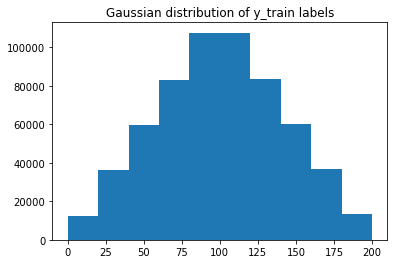

In [5]:
len_train = 600000
len_test = 100000

seed = 110
np.random.seed(seed)
X_train, y_train = generator(len_train)

# To visualize gaussian distribution of labels. 
plt.hist(y_train)
plt.title('Gaussian distribution of y_train labels')

# To check the sums for training set
print('Pairs of numbers to sum:', X_train[0:6])
print('Sums from corresponding pairs:', y_train[0:6])


[[ 0 89]
 [99 68]
 [61 21]
 ..., 
 [85 78]
 [32 67]
 [91 68]]


Pairs of numbers to sum: [[ 0.  0.  0.  0.  8.  9.]
 [ 0.  9.  9.  0.  6.  8.]
 [ 0.  6.  1.  0.  2.  1.]
 [ 0.  1.  5.  0.  4.  4.]
 [ 0.  8.  9.  0.  3.  8.]
 [ 0.  4.  7.  0.  4.  1.]]
Sums from corresponding pairs: [ 89 167  82  59 127  88]


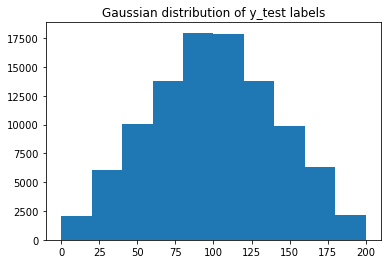

In [7]:
np.random.seed(seed)
X_test, y_test = generator(len_test)

# To visualize gaussian distribution of labels. 
plt.hist(y_test)
plt.title('Gaussian distribution of y_test labels')

# To check the sums for test set
print('Pairs of numbers to sum:', X_test[0:6])
print('Sums from corresponding pairs:', y_test[0:6])

So far so good, the inputs in Xs sums up correctly in y.  Since we have 6-digits, we have 6-columns in our X matrices.  No need to reshape Xs since number of coefficients is matched by number of columns.

In [8]:
print(X_train.shape) 
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(600000, 6)
(600000,)
(100000, 6)
(100000,)


To rescale the digits in 6 columns of Xs based on their min-max range. Either 0 to 1 or 0.01 to 0.99. Try.
<br>
To convert integers to float32 before rescaling based on min-max by matrix

In [10]:
# To confirm the min-max in row of the matrix before reshaping and rescaling
print('min along rows of X_train is', np.amin(X_train, axis=0), ';', 'max along rows of X_train is', np.amax(X_train, axis=0), )
print('min along rows of X_test is', np.amin(X_test, axis=0), ';', 'max along rows X_test is', np.amax(X_test, axis=0))


min along rows of X_train is [ 0.  0.  0.  0.  0.  0.] ; max along rows of X_train is [ 1.  9.  9.  1.  9.  9.]
min along rows of X_test is [ 0.  0.  0.  0.  0.  0.] ; max along rows X_test is [ 1.  9.  9.  1.  9.  9.]


The min-max digits in Xs are 0 and (1 &) 9.
<br>
To convert integers to float32 before rescaling based on min-max of input matrix

I don't like the zeros in column zero and 4. Should I rescale with range 0.01 to 0.99 instead of 0 to 1 below?

In [11]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 9 
X_test /= 9 

print('Head of training inputs: ', X_train[:6])
print('Head of test inputs: ',X_test[:6])

Head of training inputs:  [[ 0.          0.          0.          0.          0.22222222  0.77777779]
 [ 0.          1.          1.          0.          0.11111111  0.66666669]
 [ 0.          0.66666669  0.11111111  0.          0.66666669  0.22222222]
 [ 0.          0.11111111  0.55555558  0.          0.33333334  0.66666669]
 [ 0.          0.8888889   1.          0.          0.77777779  0.22222222]
 [ 0.          0.44444445  0.77777779  0.          0.77777779  0.66666669]]
Head of test inputs:  [[ 0.          0.          0.          0.          0.8888889   1.        ]
 [ 0.          1.          1.          0.          0.66666669  0.8888889 ]
 [ 0.          0.66666669  0.11111111  0.          0.22222222  0.11111111]
 [ 0.          0.11111111  0.55555558  0.          0.44444445  0.44444445]
 [ 0.          0.8888889   1.          0.          0.33333334  0.8888889 ]
 [ 0.          0.44444445  0.77777779  0.          0.44444445  0.11111111]]


### One-hot Encoding of Labels

In [13]:
# To confirm the number of unique labels are in range of 0 to 200. Therefore, 201 classes to encode.
print('Unique training labels: ', np.unique(y_train))
print('Unique testing labels: ', np.unique(y_test))

Unique training labels:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200]
Unique testing labels:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32 

In [15]:
n_classes = 201
# convert class vectors to binary One Hot Encoded
y_train_enc = keras.utils.to_categorical(y_train, n_classes)
y_test_enc = keras.utils.to_categorical(y_test, n_classes)
print(y_train_enc[0])


[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


### To define the model

In [17]:
# Training Parameters
learning_rate = 0.01 
training_epochs = 10
batch_size = 100

# Network Parameters
n_input = 6
n_hidden_1 = 24 # 1st layer number of neurons
n_hidden_2 = 24
n_classes = 201  # (digits 0-200)


### To instantiate the model - with no training label discarded

In [19]:
model = Sequential()
model.add(Dense(n_hidden_1,  input_shape=(n_input,), name = "Dense_1"))
model.add(Activation('relu', name = "Relu1"))
model.add(Dense(n_hidden_2, name = "Dense_2"))
model.add(Activation('relu', name = "Relu2"))
model.add(Dense(n_classes, name = "Output"))
model.add(Activation('softmax', name = "Softmax_output"))

model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Dense_1 (Dense)              (None, 24)                168       
_________________________________________________________________
Relu1 (Activation)           (None, 24)                0         
_________________________________________________________________
Dense_2 (Dense)              (None, 24)                600       
_________________________________________________________________
Relu2 (Activation)           (None, 24)                0         
_________________________________________________________________
Output (Dense)               (None, 201)               5025      
_________________________________________________________________
Softmax_output (Activation)  (None, 201)               0         
Total params: 5,793
Trainable params: 5,793
Non-trainable params: 0
_________________________________________________________________


### Compile the model

In [21]:
model.compile(loss='categorical_crossentropy',
              optimizer= 'rmsprop',
              metrics=['accuracy'])



### Fit and validate the full model

In [22]:
history = model.fit(X_train, y_train_enc,
                    batch_size=batch_size,
                    epochs=training_epochs,
                    verbose=1,
                    validation_data=(X_test, y_test_enc))




Train on 600000 samples, validate on 100000 samples
Epoch 1/10


   100/600000 [..............................] - ETA: 2983s - loss: 5.3066 - acc: 0.0000e+00

   700/600000 [..............................] - ETA: 473s - loss: 5.3023 - acc: 0.0057     

  1300/600000 [..............................] - ETA: 280s - loss: 5.2988 - acc: 0.0054

  1900/600000 [..............................] - ETA: 208s - loss: 5.2971 - acc: 0.0058

  2400/600000 [..............................] - ETA: 178s - loss: 5.2958 - acc: 0.0062

  2900/600000 [..............................] - ETA: 159s - loss: 5.2933 - acc: 0.0069

  3400/600000 [..............................] - ETA: 145s - loss: 5.2915 - acc: 0.0062

  3800/600000 [..............................] - ETA: 138s - loss: 5.2892 - acc: 0.0063

  4200/600000 [..............................] - ETA: 133s - loss: 5.2878 - acc: 0.0064

  4500/600000 [..............................] - ETA: 131s - loss: 5.2863 - acc: 0.0062

  4800/600000 [..............................] - ETA: 130s - loss: 5.2853 - acc: 0.0062

  5300/600000 [..............................] - ETA: 124s - loss: 5.2828 - acc: 0.0068

  5800/600000 [..............................] - ETA: 119s - loss: 5.2797 - acc: 0.0069

  6300/600000 [..............................] - ETA: 114s - loss: 5.2755 - acc: 0.0076

  6900/600000 [..............................] - ETA: 108s - loss: 5.2714 - acc: 0.0083

  7400/600000 [..............................] - ETA: 105s - loss: 5.2675 - acc: 0.0080

  7800/600000 [..............................] - ETA: 104s - loss: 5.2639 - acc: 0.0085

  8400/600000 [..............................] - ETA: 100s - loss: 5.2586 - acc: 0.0083

  8900/600000 [..............................] - ETA: 98s - loss: 5.2544 - acc: 0.0083 

  9500/600000 [..............................] - ETA: 95s - loss: 5.2483 - acc: 0.0083

 10100/600000 [..............................] - ETA: 92s - loss: 5.2423 - acc: 0.0082

 10700/600000 [..............................] - ETA: 90s - loss: 5.2373 - acc: 0.0083

 11400/600000 [..............................] - ETA: 87s - loss: 5.2311 - acc: 0.0083

 12100/600000 [..............................] - ETA: 85s - loss: 5.2240 - acc: 0.0089

 12600/600000 [..............................] - ETA: 84s - loss: 5.2189 - acc: 0.0090

 13100/600000 [..............................] - ETA: 83s - loss: 5.2133 - acc: 0.0089

 13500/600000 [..............................] - ETA: 83s - loss: 5.2099 - acc: 0.0089

 13800/600000 [..............................] - ETA: 83s - loss: 5.2073 - acc: 0.0089

 14200/600000 [..............................] - ETA: 83s - loss: 5.2031 - acc: 0.0092

 14400/600000 [..............................] - ETA: 84s - loss: 5.2012 - acc: 0.0092

 14700/600000 [..............................] - ETA: 84s - loss: 5.1981 - acc: 0.0092

 15200/600000 [..............................] - ETA: 84s - loss: 5.1925 - acc: 0.0090

 15600/600000 [..............................] - ETA: 84s - loss: 5.1883 - acc: 0.0090

 16100/600000 [..............................] - ETA: 83s - loss: 5.1834 - acc: 0.0093

 16700/600000 [..............................] - ETA: 82s - loss: 5.1780 - acc: 0.0096

 17200/600000 [..............................] - ETA: 81s - loss: 5.1737 - acc: 0.0095

 17800/600000 [..............................] - ETA: 80s - loss: 5.1674 - acc: 0.0095

 18300/600000 [..............................] - ETA: 79s - loss: 5.1625 - acc: 0.0097

 18900/600000 [..............................] - ETA: 79s - loss: 5.1579 - acc: 0.0095

 19500/600000 [..............................] - ETA: 78s - loss: 5.1525 - acc: 0.0096

 20000/600000 [>.............................] - ETA: 77s - loss: 5.1478 - acc: 0.0095

 20500/600000 [>.............................] - ETA: 77s - loss: 5.1435 - acc: 0.0096

 20800/600000 [>.............................] - ETA: 78s - loss: 5.1409 - acc: 0.0095

 21200/600000 [>.............................] - ETA: 77s - loss: 5.1376 - acc: 0.0093

 21700/600000 [>.............................] - ETA: 77s - loss: 5.1337 - acc: 0.0094

 22200/600000 [>.............................] - ETA: 77s - loss: 5.1298 - acc: 0.0093

 22800/600000 [>.............................] - ETA: 76s - loss: 5.1237 - acc: 0.0092

 23300/600000 [>.............................] - ETA: 76s - loss: 5.1187 - acc: 0.0091

 23900/600000 [>.............................] - ETA: 75s - loss: 5.1135 - acc: 0.0090

 24500/600000 [>.............................] - ETA: 74s - loss: 5.1079 - acc: 0.0091

 25200/600000 [>.............................] - ETA: 73s - loss: 5.1014 - acc: 0.0090

 25600/600000 [>.............................] - ETA: 74s - loss: 5.0975 - acc: 0.0089

 26100/600000 [>.............................] - ETA: 73s - loss: 5.0930 - acc: 0.0089

 26700/600000 [>.............................] - ETA: 73s - loss: 5.0881 - acc: 0.0090

 27300/600000 [>.............................] - ETA: 72s - loss: 5.0820 - acc: 0.0092

 27900/600000 [>.............................] - ETA: 72s - loss: 5.0779 - acc: 0.0093

 28500/600000 [>.............................] - ETA: 71s - loss: 5.0722 - acc: 0.0096

 29100/600000 [>.............................] - ETA: 71s - loss: 5.0671 - acc: 0.0096

 29700/600000 [>.............................] - ETA: 70s - loss: 5.0617 - acc: 0.0097

 30200/600000 [>.............................] - ETA: 70s - loss: 5.0573 - acc: 0.0097



 30700/600000 [>.............................] - ETA: 70s - loss: 5.0526 - acc: 0.0097

 31000/600000 [>.............................] - ETA: 70s - loss: 5.0502 - acc: 0.0097

 31600/600000 [>.............................] - ETA: 70s - loss: 5.0448 - acc: 0.0100

 32200/600000 [>.............................] - ETA: 69s - loss: 5.0391 - acc: 0.0101

 32700/600000 [>.............................] - ETA: 69s - loss: 5.0346 - acc: 0.0102

 33200/600000 [>.............................] - ETA: 69s - loss: 5.0310 - acc: 0.0105

 33600/600000 [>.............................] - ETA: 69s - loss: 5.0278 - acc: 0.0106

 33900/600000 [>.............................] - ETA: 69s - loss: 5.0256 - acc: 0.0108

 34400/600000 [>.............................] - ETA: 69s - loss: 5.0215 - acc: 0.0111

 34900/600000 [>.............................] - ETA: 69s - loss: 5.0174 - acc: 0.0113

 35300/600000 [>.............................] - ETA: 69s - loss: 5.0138 - acc: 0.0112

 35700/600000 [>.............................] - ETA: 69s - loss: 5.0107 - acc: 0.0115

 36200/600000 [>.............................] - ETA: 68s - loss: 5.0063 - acc: 0.0115

 36700/600000 [>.............................] - ETA: 68s - loss: 5.0020 - acc: 0.0117

 37100/600000 [>.............................] - ETA: 68s - loss: 4.9982 - acc: 0.0117

 37600/600000 [>.............................] - ETA: 68s - loss: 4.9939 - acc: 0.0118

 38100/600000 [>.............................] - ETA: 68s - loss: 4.9903 - acc: 0.0119

 38700/600000 [>.............................] - ETA: 68s - loss: 4.9854 - acc: 0.0121

 39300/600000 [>.............................] - ETA: 67s - loss: 4.9805 - acc: 0.0123

 39900/600000 [>.............................] - ETA: 67s - loss: 4.9756 - acc: 0.0124

 40500/600000 [=>............................] - ETA: 67s - loss: 4.9705 - acc: 0.0126

 41100/600000 [=>............................] - ETA: 67s - loss: 4.9653 - acc: 0.0127

 41700/600000 [=>............................] - ETA: 66s - loss: 4.9599 - acc: 0.0130

 42400/600000 [=>............................] - ETA: 66s - loss: 4.9537 - acc: 0.0132

 43100/600000 [=>............................] - ETA: 65s - loss: 4.9480 - acc: 0.0135

 43700/600000 [=>............................] - ETA: 65s - loss: 4.9427 - acc: 0.0136

 44400/600000 [=>............................] - ETA: 65s - loss: 4.9366 - acc: 0.0139

 44800/600000 [=>............................] - ETA: 65s - loss: 4.9332 - acc: 0.0141

 45300/600000 [=>............................] - ETA: 64s - loss: 4.9293 - acc: 0.0141

 45800/600000 [=>............................] - ETA: 64s - loss: 4.9254 - acc: 0.0141

 46400/600000 [=>............................] - ETA: 64s - loss: 4.9212 - acc: 0.0141

 47100/600000 [=>............................] - ETA: 64s - loss: 4.9158 - acc: 0.0143

 47800/600000 [=>............................] - ETA: 63s - loss: 4.9098 - acc: 0.0145

 48500/600000 [=>............................] - ETA: 63s - loss: 4.9036 - acc: 0.0146

 49100/600000 [=>............................] - ETA: 63s - loss: 4.8987 - acc: 0.0147

 49700/600000 [=>............................] - ETA: 62s - loss: 4.8935 - acc: 0.0149

 50300/600000 [=>............................] - ETA: 62s - loss: 4.8883 - acc: 0.0151

 51000/600000 [=>............................] - ETA: 62s - loss: 4.8821 - acc: 0.0153

 51600/600000 [=>............................] - ETA: 62s - loss: 4.8769 - acc: 0.0154

 52200/600000 [=>............................] - ETA: 61s - loss: 4.8721 - acc: 0.0157

 52800/600000 [=>............................] - ETA: 61s - loss: 4.8673 - acc: 0.0159

 53300/600000 [=>............................] - ETA: 61s - loss: 4.8630 - acc: 0.0161

 53800/600000 [=>............................] - ETA: 61s - loss: 4.8590 - acc: 0.0162

 54300/600000 [=>............................] - ETA: 61s - loss: 4.8556 - acc: 0.0164

 54800/600000 [=>............................] - ETA: 61s - loss: 4.8516 - acc: 0.0164

 55400/600000 [=>............................] - ETA: 61s - loss: 4.8473 - acc: 0.0165

 55800/600000 [=>............................] - ETA: 61s - loss: 4.8441 - acc: 0.0166

 56300/600000 [=>............................] - ETA: 61s - loss: 4.8398 - acc: 0.0166

 56900/600000 [=>............................] - ETA: 61s - loss: 4.8348 - acc: 0.0167

 57500/600000 [=>............................] - ETA: 60s - loss: 4.8304 - acc: 0.0169

 58000/600000 [=>............................] - ETA: 60s - loss: 4.8265 - acc: 0.0170

 58500/600000 [=>............................] - ETA: 60s - loss: 4.8229 - acc: 0.0171

 59000/600000 [=>............................] - ETA: 60s - loss: 4.8191 - acc: 0.0173

 59500/600000 [=>............................] - ETA: 60s - loss: 4.8156 - acc: 0.0174

 60000/600000 [==>...........................] - ETA: 60s - loss: 4.8118 - acc: 0.0175

 60400/600000 [==>...........................] - ETA: 60s - loss: 4.8094 - acc: 0.0176

 60800/600000 [==>...........................] - ETA: 60s - loss: 4.8071 - acc: 0.0177

 61300/600000 [==>...........................] - ETA: 60s - loss: 4.8034 - acc: 0.0179



 61800/600000 [==>...........................] - ETA: 60s - loss: 4.7995 - acc: 0.0180

 62300/600000 [==>...........................] - ETA: 60s - loss: 4.7957 - acc: 0.0181

 62900/600000 [==>...........................] - ETA: 60s - loss: 4.7913 - acc: 0.0183

 63400/600000 [==>...........................] - ETA: 60s - loss: 4.7877 - acc: 0.0184

 63900/600000 [==>...........................] - ETA: 60s - loss: 4.7841 - acc: 0.0185

 64500/600000 [==>...........................] - ETA: 59s - loss: 4.7798 - acc: 0.0185

 65100/600000 [==>...........................] - ETA: 59s - loss: 4.7753 - acc: 0.0188

 65800/600000 [==>...........................] - ETA: 59s - loss: 4.7708 - acc: 0.0189

 66200/600000 [==>...........................] - ETA: 59s - loss: 4.7678 - acc: 0.0190

 66700/600000 [==>...........................] - ETA: 59s - loss: 4.7643 - acc: 0.0191

 67100/600000 [==>...........................] - ETA: 59s - loss: 4.7617 - acc: 0.0191

 67600/600000 [==>...........................] - ETA: 59s - loss: 4.7582 - acc: 0.0193

 68000/600000 [==>...........................] - ETA: 59s - loss: 4.7555 - acc: 0.0194

 68600/600000 [==>...........................] - ETA: 59s - loss: 4.7514 - acc: 0.0195

 69200/600000 [==>...........................] - ETA: 59s - loss: 4.7468 - acc: 0.0196

 69800/600000 [==>...........................] - ETA: 59s - loss: 4.7428 - acc: 0.0198

 70400/600000 [==>...........................] - ETA: 58s - loss: 4.7389 - acc: 0.0200

 70900/600000 [==>...........................] - ETA: 58s - loss: 4.7357 - acc: 0.0202

 71500/600000 [==>...........................] - ETA: 58s - loss: 4.7312 - acc: 0.0203

 72000/600000 [==>...........................] - ETA: 58s - loss: 4.7277 - acc: 0.0204

 72600/600000 [==>...........................] - ETA: 58s - loss: 4.7238 - acc: 0.0206

 73200/600000 [==>...........................] - ETA: 58s - loss: 4.7198 - acc: 0.0209

 73800/600000 [==>...........................] - ETA: 58s - loss: 4.7160 - acc: 0.0212

 74400/600000 [==>...........................] - ETA: 58s - loss: 4.7121 - acc: 0.0213

 75000/600000 [==>...........................] - ETA: 57s - loss: 4.7079 - acc: 0.0215

 75600/600000 [==>...........................] - ETA: 57s - loss: 4.7042 - acc: 0.0218

 76200/600000 [==>...........................] - ETA: 57s - loss: 4.7007 - acc: 0.0221

 76800/600000 [==>...........................] - ETA: 57s - loss: 4.6972 - acc: 0.0223

 77300/600000 [==>...........................] - ETA: 57s - loss: 4.6936 - acc: 0.0225

 77800/600000 [==>...........................] - ETA: 57s - loss: 4.6903 - acc: 0.0226

 78400/600000 [==>...........................] - ETA: 57s - loss: 4.6866 - acc: 0.0229

 79000/600000 [==>...........................] - ETA: 56s - loss: 4.6828 - acc: 0.0232

 79700/600000 [==>...........................] - ETA: 56s - loss: 4.6781 - acc: 0.0235

 80400/600000 [===>..........................] - ETA: 56s - loss: 4.6735 - acc: 0.0237

 81100/600000 [===>..........................] - ETA: 56s - loss: 4.6687 - acc: 0.0241

 81700/600000 [===>..........................] - ETA: 56s - loss: 4.6652 - acc: 0.0243

 82300/600000 [===>..........................] - ETA: 56s - loss: 4.6615 - acc: 0.0244



 82800/600000 [===>..........................] - ETA: 55s - loss: 4.6583 - acc: 0.0246

 83400/600000 [===>..........................] - ETA: 55s - loss: 4.6548 - acc: 0.0248

 84000/600000 [===>..........................] - ETA: 55s - loss: 4.6510 - acc: 0.0250

 84700/600000 [===>..........................] - ETA: 55s - loss: 4.6465 - acc: 0.0254

 85300/600000 [===>..........................] - ETA: 55s - loss: 4.6432 - acc: 0.0255

 85900/600000 [===>..........................] - ETA: 55s - loss: 4.6400 - acc: 0.0258

 86400/600000 [===>..........................] - ETA: 55s - loss: 4.6368 - acc: 0.0260

 86900/600000 [===>..........................] - ETA: 55s - loss: 4.6340 - acc: 0.0262

 87400/600000 [===>..........................] - ETA: 55s - loss: 4.6310 - acc: 0.0264



 88000/600000 [===>..........................] - ETA: 54s - loss: 4.6277 - acc: 0.0266

 88600/600000 [===>..........................] - ETA: 54s - loss: 4.6246 - acc: 0.0267

 89200/600000 [===>..........................] - ETA: 54s - loss: 4.6210 - acc: 0.0270

 89800/600000 [===>..........................] - ETA: 54s - loss: 4.6173 - acc: 0.0272

 90400/600000 [===>..........................] - ETA: 54s - loss: 4.6138 - acc: 0.0274

 90900/600000 [===>..........................] - ETA: 54s - loss: 4.6108 - acc: 0.0276

 91500/600000 [===>..........................] - ETA: 54s - loss: 4.6071 - acc: 0.0278

 92000/600000 [===>..........................] - ETA: 54s - loss: 4.6042 - acc: 0.0280



 92600/600000 [===>..........................] - ETA: 54s - loss: 4.6008 - acc: 0.0282

 93200/600000 [===>..........................] - ETA: 53s - loss: 4.5973 - acc: 0.0285

 93800/600000 [===>..........................] - ETA: 53s - loss: 4.5938 - acc: 0.0286

 94400/600000 [===>..........................] - ETA: 53s - loss: 4.5903 - acc: 0.0287

 94900/600000 [===>..........................] - ETA: 53s - loss: 4.5871 - acc: 0.0289

 95500/600000 [===>..........................] - ETA: 53s - loss: 4.5840 - acc: 0.0291

 96100/600000 [===>..........................] - ETA: 53s - loss: 4.5812 - acc: 0.0293

 96600/600000 [===>..........................] - ETA: 53s - loss: 4.5783 - acc: 0.0293

 97200/600000 [===>..........................] - ETA: 53s - loss: 4.5756 - acc: 0.0294

 97800/600000 [===>..........................] - ETA: 53s - loss: 4.5727 - acc: 0.0296

 98400/600000 [===>..........................] - ETA: 52s - loss: 4.5696 - acc: 0.0298

 99000/600000 [===>..........................] - ETA: 52s - loss: 4.5658 - acc: 0.0299

 99600/600000 [===>..........................] - ETA: 52s - loss: 4.5624 - acc: 0.0302

100200/600000 [====>.........................] - ETA: 52s - loss: 4.5596 - acc: 0.0306

100700/600000 [====>.........................] - ETA: 52s - loss: 4.5573 - acc: 0.0307

101300/600000 [====>.........................] - ETA: 52s - loss: 4.5541 - acc: 0.0310

101900/600000 [====>.........................] - ETA: 52s - loss: 4.5511 - acc: 0.0312

102500/600000 [====>.........................] - ETA: 52s - loss: 4.5484 - acc: 0.0314

103100/600000 [====>.........................] - ETA: 52s - loss: 4.5454 - acc: 0.0317



103700/600000 [====>.........................] - ETA: 52s - loss: 4.5430 - acc: 0.0318

104200/600000 [====>.........................] - ETA: 52s - loss: 4.5404 - acc: 0.0321

104700/600000 [====>.........................] - ETA: 51s - loss: 4.5378 - acc: 0.0323

105000/600000 [====>.........................] - ETA: 52s - loss: 4.5361 - acc: 0.0324

105500/600000 [====>.........................] - ETA: 51s - loss: 4.5336 - acc: 0.0325

106100/600000 [====>.........................] - ETA: 51s - loss: 4.5305 - acc: 0.0327



106700/600000 [====>.........................] - ETA: 51s - loss: 4.5271 - acc: 0.0329

107300/600000 [====>.........................] - ETA: 51s - loss: 4.5241 - acc: 0.0331

107900/600000 [====>.........................] - ETA: 51s - loss: 4.5218 - acc: 0.0332

108500/600000 [====>.........................] - ETA: 51s - loss: 4.5189 - acc: 0.0335

109000/600000 [====>.........................] - ETA: 51s - loss: 4.5166 - acc: 0.0337

109500/600000 [====>.........................] - ETA: 51s - loss: 4.5139 - acc: 0.0340

110100/600000 [====>.........................] - ETA: 51s - loss: 4.5114 - acc: 0.0342

110800/600000 [====>.........................] - ETA: 51s - loss: 4.5083 - acc: 0.0344

111400/600000 [====>.........................] - ETA: 50s - loss: 4.5056 - acc: 0.0345

112000/600000 [====>.........................] - ETA: 50s - loss: 4.5030 - acc: 0.0346

112700/600000 [====>.........................] - ETA: 50s - loss: 4.4997 - acc: 0.0347

113300/600000 [====>.........................] - ETA: 50s - loss: 4.4970 - acc: 0.0349

113900/600000 [====>.........................] - ETA: 50s - loss: 4.4946 - acc: 0.0350

114500/600000 [====>.........................] - ETA: 50s - loss: 4.4923 - acc: 0.0352

115100/600000 [====>.........................] - ETA: 50s - loss: 4.4896 - acc: 0.0354

115700/600000 [====>.........................] - ETA: 50s - loss: 4.4869 - acc: 0.0355

116300/600000 [====>.........................] - ETA: 50s - loss: 4.4845 - acc: 0.0356

116900/600000 [====>.........................] - ETA: 50s - loss: 4.4824 - acc: 0.0358

117500/600000 [====>.........................] - ETA: 49s - loss: 4.4803 - acc: 0.0360

118100/600000 [====>.........................] - ETA: 49s - loss: 4.4779 - acc: 0.0361

118700/600000 [====>.........................] - ETA: 49s - loss: 4.4750 - acc: 0.0363

119300/600000 [====>.........................] - ETA: 49s - loss: 4.4723 - acc: 0.0366

120000/600000 [=====>........................] - ETA: 49s - loss: 4.4693 - acc: 0.0368

120600/600000 [=====>........................] - ETA: 49s - loss: 4.4671 - acc: 0.0369

121200/600000 [=====>........................] - ETA: 49s - loss: 4.4646 - acc: 0.0371

121700/600000 [=====>........................] - ETA: 49s - loss: 4.4625 - acc: 0.0373

122300/600000 [=====>........................] - ETA: 49s - loss: 4.4597 - acc: 0.0374

122900/600000 [=====>........................] - ETA: 49s - loss: 4.4579 - acc: 0.0376

123500/600000 [=====>........................] - ETA: 49s - loss: 4.4557 - acc: 0.0377

124100/600000 [=====>........................] - ETA: 48s - loss: 4.4531 - acc: 0.0379

124700/600000 [=====>........................] - ETA: 48s - loss: 4.4505 - acc: 0.0380

125300/600000 [=====>........................] - ETA: 48s - loss: 4.4479 - acc: 0.0382

125900/600000 [=====>........................] - ETA: 48s - loss: 4.4457 - acc: 0.0383



126400/600000 [=====>........................] - ETA: 48s - loss: 4.4437 - acc: 0.0385

126900/600000 [=====>........................] - ETA: 48s - loss: 4.4416 - acc: 0.0387

127500/600000 [=====>........................] - ETA: 48s - loss: 4.4393 - acc: 0.0388

128100/600000 [=====>........................] - ETA: 48s - loss: 4.4366 - acc: 0.0390

128700/600000 [=====>........................] - ETA: 48s - loss: 4.4339 - acc: 0.0392

129300/600000 [=====>........................] - ETA: 48s - loss: 4.4314 - acc: 0.0393

129900/600000 [=====>........................] - ETA: 48s - loss: 4.4289 - acc: 0.0394

130500/600000 [=====>........................] - ETA: 48s - loss: 4.4268 - acc: 0.0396

131100/600000 [=====>........................] - ETA: 47s - loss: 4.4245 - acc: 0.0397

131700/600000 [=====>........................] - ETA: 47s - loss: 4.4226 - acc: 0.0398

132300/600000 [=====>........................] - ETA: 47s - loss: 4.4199 - acc: 0.0399

132900/600000 [=====>........................] - ETA: 47s - loss: 4.4177 - acc: 0.0401

133500/600000 [=====>........................] - ETA: 47s - loss: 4.4157 - acc: 0.0402

134100/600000 [=====>........................] - ETA: 47s - loss: 4.4134 - acc: 0.0403

134800/600000 [=====>........................] - ETA: 47s - loss: 4.4105 - acc: 0.0405

135400/600000 [=====>........................] - ETA: 47s - loss: 4.4082 - acc: 0.0406

135900/600000 [=====>........................] - ETA: 47s - loss: 4.4065 - acc: 0.0406

136500/600000 [=====>........................] - ETA: 47s - loss: 4.4042 - acc: 0.0407

137100/600000 [=====>........................] - ETA: 47s - loss: 4.4023 - acc: 0.0410

137700/600000 [=====>........................] - ETA: 46s - loss: 4.4001 - acc: 0.0412

138300/600000 [=====>........................] - ETA: 46s - loss: 4.3980 - acc: 0.0414



138900/600000 [=====>........................] - ETA: 46s - loss: 4.3956 - acc: 0.0415

139500/600000 [=====>........................] - ETA: 46s - loss: 4.3936 - acc: 0.0417

140100/600000 [======>.......................] - ETA: 46s - loss: 4.3914 - acc: 0.0419

140700/600000 [======>.......................] - ETA: 46s - loss: 4.3892 - acc: 0.0420

141300/600000 [======>.......................] - ETA: 46s - loss: 4.3869 - acc: 0.0421

141800/600000 [======>.......................] - ETA: 46s - loss: 4.3851 - acc: 0.0421

142300/600000 [======>.......................] - ETA: 46s - loss: 4.3836 - acc: 0.0423

142900/600000 [======>.......................] - ETA: 46s - loss: 4.3817 - acc: 0.0425

143500/600000 [======>.......................] - ETA: 46s - loss: 4.3797 - acc: 0.0426

144100/600000 [======>.......................] - ETA: 46s - loss: 4.3777 - acc: 0.0429

144700/600000 [======>.......................] - ETA: 46s - loss: 4.3754 - acc: 0.0430

145300/600000 [======>.......................] - ETA: 45s - loss: 4.3735 - acc: 0.0432

145900/600000 [======>.......................] - ETA: 45s - loss: 4.3714 - acc: 0.0433

146500/600000 [======>.......................] - ETA: 45s - loss: 4.3692 - acc: 0.0435

147100/600000 [======>.......................] - ETA: 45s - loss: 4.3675 - acc: 0.0436

147700/600000 [======>.......................] - ETA: 45s - loss: 4.3658 - acc: 0.0438

148400/600000 [======>.......................] - ETA: 45s - loss: 4.3631 - acc: 0.0439

149100/600000 [======>.......................] - ETA: 45s - loss: 4.3602 - acc: 0.0441

149500/600000 [======>.......................] - ETA: 45s - loss: 4.3590 - acc: 0.0443

149900/600000 [======>.......................] - ETA: 45s - loss: 4.3576 - acc: 0.0443

150400/600000 [======>.......................] - ETA: 45s - loss: 4.3559 - acc: 0.0445

150900/600000 [======>.......................] - ETA: 45s - loss: 4.3543 - acc: 0.0446

151400/600000 [======>.......................] - ETA: 45s - loss: 4.3526 - acc: 0.0447

151900/600000 [======>.......................] - ETA: 45s - loss: 4.3507 - acc: 0.0449

152500/600000 [======>.......................] - ETA: 45s - loss: 4.3487 - acc: 0.0449

153200/600000 [======>.......................] - ETA: 45s - loss: 4.3462 - acc: 0.0451

153900/600000 [======>.......................] - ETA: 44s - loss: 4.3439 - acc: 0.0453

154600/600000 [======>.......................] - ETA: 44s - loss: 4.3415 - acc: 0.0454

155100/600000 [======>.......................] - ETA: 44s - loss: 4.3398 - acc: 0.0456

155700/600000 [======>.......................] - ETA: 44s - loss: 4.3377 - acc: 0.0457

156300/600000 [======>.......................] - ETA: 44s - loss: 4.3360 - acc: 0.0458

156800/600000 [======>.......................] - ETA: 44s - loss: 4.3346 - acc: 0.0459

157300/600000 [======>.......................] - ETA: 44s - loss: 4.3333 - acc: 0.0461

157900/600000 [======>.......................] - ETA: 44s - loss: 4.3314 - acc: 0.0463

158400/600000 [======>.......................] - ETA: 44s - loss: 4.3299 - acc: 0.0464

158800/600000 [======>.......................] - ETA: 44s - loss: 4.3285 - acc: 0.0465

159400/600000 [======>.......................] - ETA: 44s - loss: 4.3265 - acc: 0.0465

159900/600000 [======>.......................] - ETA: 44s - loss: 4.3249 - acc: 0.0467

160400/600000 [=======>......................] - ETA: 44s - loss: 4.3232 - acc: 0.0467

160900/600000 [=======>......................] - ETA: 44s - loss: 4.3219 - acc: 0.0469

161400/600000 [=======>......................] - ETA: 44s - loss: 4.3205 - acc: 0.0470

162000/600000 [=======>......................] - ETA: 44s - loss: 4.3184 - acc: 0.0472

162500/600000 [=======>......................] - ETA: 44s - loss: 4.3165 - acc: 0.0472

163100/600000 [=======>......................] - ETA: 44s - loss: 4.3148 - acc: 0.0474

163700/600000 [=======>......................] - ETA: 43s - loss: 4.3133 - acc: 0.0475

164300/600000 [=======>......................] - ETA: 43s - loss: 4.3113 - acc: 0.0477

164800/600000 [=======>......................] - ETA: 43s - loss: 4.3098 - acc: 0.0478

165300/600000 [=======>......................] - ETA: 43s - loss: 4.3085 - acc: 0.0479

165800/600000 [=======>......................] - ETA: 43s - loss: 4.3067 - acc: 0.0480

166200/600000 [=======>......................] - ETA: 43s - loss: 4.3056 - acc: 0.0481

166700/600000 [=======>......................] - ETA: 43s - loss: 4.3038 - acc: 0.0482

166900/600000 [=======>......................] - ETA: 43s - loss: 4.3032 - acc: 0.0483

167500/600000 [=======>......................] - ETA: 43s - loss: 4.3016 - acc: 0.0484

168100/600000 [=======>......................] - ETA: 43s - loss: 4.2996 - acc: 0.0486

168700/600000 [=======>......................] - ETA: 43s - loss: 4.2976 - acc: 0.0488

169300/600000 [=======>......................] - ETA: 43s - loss: 4.2960 - acc: 0.0488

169800/600000 [=======>......................] - ETA: 43s - loss: 4.2947 - acc: 0.0489

170300/600000 [=======>......................] - ETA: 43s - loss: 4.2932 - acc: 0.0490

170800/600000 [=======>......................] - ETA: 43s - loss: 4.2915 - acc: 0.0492

171400/600000 [=======>......................] - ETA: 43s - loss: 4.2895 - acc: 0.0493

172000/600000 [=======>......................] - ETA: 43s - loss: 4.2875 - acc: 0.0494

172600/600000 [=======>......................] - ETA: 43s - loss: 4.2855 - acc: 0.0495

173200/600000 [=======>......................] - ETA: 43s - loss: 4.2841 - acc: 0.0496

173800/600000 [=======>......................] - ETA: 43s - loss: 4.2829 - acc: 0.0497

174300/600000 [=======>......................] - ETA: 42s - loss: 4.2814 - acc: 0.0499

174900/600000 [=======>......................] - ETA: 42s - loss: 4.2798 - acc: 0.0500

175500/600000 [=======>......................] - ETA: 42s - loss: 4.2782 - acc: 0.0502

176000/600000 [=======>......................] - ETA: 42s - loss: 4.2770 - acc: 0.0503

176600/600000 [=======>......................] - ETA: 42s - loss: 4.2751 - acc: 0.0504

177100/600000 [=======>......................] - ETA: 42s - loss: 4.2735 - acc: 0.0505

177700/600000 [=======>......................] - ETA: 42s - loss: 4.2717 - acc: 0.0506

178300/600000 [=======>......................] - ETA: 42s - loss: 4.2699 - acc: 0.0508

178900/600000 [=======>......................] - ETA: 42s - loss: 4.2682 - acc: 0.0509

179400/600000 [=======>......................] - ETA: 42s - loss: 4.2663 - acc: 0.0510

180000/600000 [========>.....................] - ETA: 42s - loss: 4.2647 - acc: 0.0512

180600/600000 [========>.....................] - ETA: 42s - loss: 4.2630 - acc: 0.0512

181200/600000 [========>.....................] - ETA: 42s - loss: 4.2613 - acc: 0.0514

181900/600000 [========>.....................] - ETA: 42s - loss: 4.2595 - acc: 0.0516

182600/600000 [========>.....................] - ETA: 41s - loss: 4.2575 - acc: 0.0517

183300/600000 [========>.....................] - ETA: 41s - loss: 4.2556 - acc: 0.0519

183900/600000 [========>.....................] - ETA: 41s - loss: 4.2540 - acc: 0.0521

184500/600000 [========>.....................] - ETA: 41s - loss: 4.2522 - acc: 0.0522

185000/600000 [========>.....................] - ETA: 41s - loss: 4.2505 - acc: 0.0524



185600/600000 [========>.....................] - ETA: 41s - loss: 4.2489 - acc: 0.0525

186200/600000 [========>.....................] - ETA: 41s - loss: 4.2473 - acc: 0.0527

186700/600000 [========>.....................] - ETA: 41s - loss: 4.2459 - acc: 0.0528

187300/600000 [========>.....................] - ETA: 41s - loss: 4.2444 - acc: 0.0529

187900/600000 [========>.....................] - ETA: 41s - loss: 4.2427 - acc: 0.0530

188400/600000 [========>.....................] - ETA: 41s - loss: 4.2411 - acc: 0.0532

188900/600000 [========>.....................] - ETA: 41s - loss: 4.2397 - acc: 0.0533

189400/600000 [========>.....................] - ETA: 41s - loss: 4.2384 - acc: 0.0534

190000/600000 [========>.....................] - ETA: 41s - loss: 4.2370 - acc: 0.0535

190500/600000 [========>.....................] - ETA: 41s - loss: 4.2354 - acc: 0.0536

191100/600000 [========>.....................] - ETA: 41s - loss: 4.2338 - acc: 0.0538

191700/600000 [========>.....................] - ETA: 40s - loss: 4.2320 - acc: 0.0539

192300/600000 [========>.....................] - ETA: 40s - loss: 4.2303 - acc: 0.0540

192800/600000 [========>.....................] - ETA: 40s - loss: 4.2288 - acc: 0.0541

193400/600000 [========>.....................] - ETA: 40s - loss: 4.2272 - acc: 0.0542

193900/600000 [========>.....................] - ETA: 40s - loss: 4.2260 - acc: 0.0544

194400/600000 [========>.....................] - ETA: 40s - loss: 4.2246 - acc: 0.0545

194900/600000 [========>.....................] - ETA: 40s - loss: 4.2233 - acc: 0.0546

195500/600000 [========>.....................] - ETA: 40s - loss: 4.2215 - acc: 0.0547

196000/600000 [========>.....................] - ETA: 40s - loss: 4.2200 - acc: 0.0549

196600/600000 [========>.....................] - ETA: 40s - loss: 4.2181 - acc: 0.0550

197100/600000 [========>.....................] - ETA: 40s - loss: 4.2171 - acc: 0.0551

197600/600000 [========>.....................] - ETA: 40s - loss: 4.2157 - acc: 0.0552

198000/600000 [========>.....................] - ETA: 40s - loss: 4.2146 - acc: 0.0552

198300/600000 [========>.....................] - ETA: 40s - loss: 4.2138 - acc: 0.0553

198800/600000 [========>.....................] - ETA: 40s - loss: 4.2125 - acc: 0.0555

199300/600000 [========>.....................] - ETA: 40s - loss: 4.2108 - acc: 0.0555

199700/600000 [========>.....................] - ETA: 40s - loss: 4.2097 - acc: 0.0556

200200/600000 [=========>....................] - ETA: 40s - loss: 4.2084 - acc: 0.0557

200700/600000 [=========>....................] - ETA: 40s - loss: 4.2074 - acc: 0.0559

201200/600000 [=========>....................] - ETA: 40s - loss: 4.2059 - acc: 0.0560



201800/600000 [=========>....................] - ETA: 40s - loss: 4.2043 - acc: 0.0561

202200/600000 [=========>....................] - ETA: 40s - loss: 4.2030 - acc: 0.0562

202800/600000 [=========>....................] - ETA: 39s - loss: 4.2014 - acc: 0.0563

203200/600000 [=========>....................] - ETA: 39s - loss: 4.2002 - acc: 0.0564

203700/600000 [=========>....................] - ETA: 39s - loss: 4.1987 - acc: 0.0565

204300/600000 [=========>....................] - ETA: 39s - loss: 4.1973 - acc: 0.0566

204700/600000 [=========>....................] - ETA: 39s - loss: 4.1962 - acc: 0.0567

205200/600000 [=========>....................] - ETA: 39s - loss: 4.1950 - acc: 0.0568

205800/600000 [=========>....................] - ETA: 39s - loss: 4.1934 - acc: 0.0570

206300/600000 [=========>....................] - ETA: 39s - loss: 4.1921 - acc: 0.0571

206900/600000 [=========>....................] - ETA: 39s - loss: 4.1905 - acc: 0.0572

207500/600000 [=========>....................] - ETA: 39s - loss: 4.1889 - acc: 0.0572

208100/600000 [=========>....................] - ETA: 39s - loss: 4.1876 - acc: 0.0573

208500/600000 [=========>....................] - ETA: 39s - loss: 4.1867 - acc: 0.0574

209100/600000 [=========>....................] - ETA: 39s - loss: 4.1852 - acc: 0.0575

209600/600000 [=========>....................] - ETA: 39s - loss: 4.1840 - acc: 0.0577

210100/600000 [=========>....................] - ETA: 39s - loss: 4.1827 - acc: 0.0577

210600/600000 [=========>....................] - ETA: 39s - loss: 4.1812 - acc: 0.0578

211200/600000 [=========>....................] - ETA: 39s - loss: 4.1797 - acc: 0.0579

211700/600000 [=========>....................] - ETA: 39s - loss: 4.1787 - acc: 0.0580

212300/600000 [=========>....................] - ETA: 39s - loss: 4.1773 - acc: 0.0582

212900/600000 [=========>....................] - ETA: 39s - loss: 4.1757 - acc: 0.0583

213300/600000 [=========>....................] - ETA: 38s - loss: 4.1746 - acc: 0.0584

213800/600000 [=========>....................] - ETA: 38s - loss: 4.1738 - acc: 0.0586

214300/600000 [=========>....................] - ETA: 38s - loss: 4.1726 - acc: 0.0587



214800/600000 [=========>....................] - ETA: 38s - loss: 4.1711 - acc: 0.0588

215300/600000 [=========>....................] - ETA: 38s - loss: 4.1699 - acc: 0.0589

215800/600000 [=========>....................] - ETA: 38s - loss: 4.1686 - acc: 0.0590

216400/600000 [=========>....................] - ETA: 38s - loss: 4.1670 - acc: 0.0592

216900/600000 [=========>....................] - ETA: 38s - loss: 4.1657 - acc: 0.0593

217400/600000 [=========>....................] - ETA: 38s - loss: 4.1646 - acc: 0.0594

217900/600000 [=========>....................] - ETA: 38s - loss: 4.1632 - acc: 0.0596

218400/600000 [=========>....................] - ETA: 38s - loss: 4.1617 - acc: 0.0597

218900/600000 [=========>....................] - ETA: 38s - loss: 4.1602 - acc: 0.0598



219400/600000 [=========>....................] - ETA: 38s - loss: 4.1588 - acc: 0.0599

219800/600000 [=========>....................] - ETA: 38s - loss: 4.1579 - acc: 0.0600

220400/600000 [==========>...................] - ETA: 38s - loss: 4.1564 - acc: 0.0601

221000/600000 [==========>...................] - ETA: 38s - loss: 4.1545 - acc: 0.0602

221600/600000 [==========>...................] - ETA: 38s - loss: 4.1526 - acc: 0.0603

222100/600000 [==========>...................] - ETA: 38s - loss: 4.1515 - acc: 0.0605

222600/600000 [==========>...................] - ETA: 38s - loss: 4.1501 - acc: 0.0606

223000/600000 [==========>...................] - ETA: 38s - loss: 4.1489 - acc: 0.0607

223600/600000 [==========>...................] - ETA: 37s - loss: 4.1476 - acc: 0.0608

224100/600000 [==========>...................] - ETA: 37s - loss: 4.1463 - acc: 0.0608



224600/600000 [==========>...................] - ETA: 37s - loss: 4.1449 - acc: 0.0610

225200/600000 [==========>...................] - ETA: 37s - loss: 4.1435 - acc: 0.0611

225700/600000 [==========>...................] - ETA: 37s - loss: 4.1426 - acc: 0.0612

226300/600000 [==========>...................] - ETA: 37s - loss: 4.1411 - acc: 0.0614

226800/600000 [==========>...................] - ETA: 37s - loss: 4.1399 - acc: 0.0615

227300/600000 [==========>...................] - ETA: 37s - loss: 4.1384 - acc: 0.0616

227800/600000 [==========>...................] - ETA: 37s - loss: 4.1375 - acc: 0.0617

228300/600000 [==========>...................] - ETA: 37s - loss: 4.1361 - acc: 0.0618

228800/600000 [==========>...................] - ETA: 37s - loss: 4.1347 - acc: 0.0618

229300/600000 [==========>...................] - ETA: 37s - loss: 4.1333 - acc: 0.0619

229900/600000 [==========>...................] - ETA: 37s - loss: 4.1318 - acc: 0.0621

230400/600000 [==========>...................] - ETA: 37s - loss: 4.1307 - acc: 0.0622

231000/600000 [==========>...................] - ETA: 37s - loss: 4.1295 - acc: 0.0623

231600/600000 [==========>...................] - ETA: 37s - loss: 4.1278 - acc: 0.0624

232100/600000 [==========>...................] - ETA: 37s - loss: 4.1264 - acc: 0.0625

232600/600000 [==========>...................] - ETA: 37s - loss: 4.1255 - acc: 0.0626



233100/600000 [==========>...................] - ETA: 37s - loss: 4.1243 - acc: 0.0628

233600/600000 [==========>...................] - ETA: 37s - loss: 4.1231 - acc: 0.0629

234200/600000 [==========>...................] - ETA: 36s - loss: 4.1215 - acc: 0.0630

234700/600000 [==========>...................] - ETA: 36s - loss: 4.1204 - acc: 0.0631

235200/600000 [==========>...................] - ETA: 36s - loss: 4.1194 - acc: 0.0632

235800/600000 [==========>...................] - ETA: 36s - loss: 4.1180 - acc: 0.0633

236300/600000 [==========>...................] - ETA: 36s - loss: 4.1166 - acc: 0.0634

236800/600000 [==========>...................] - ETA: 36s - loss: 4.1152 - acc: 0.0636

237400/600000 [==========>...................] - ETA: 36s - loss: 4.1138 - acc: 0.0637

237900/600000 [==========>...................] - ETA: 36s - loss: 4.1126 - acc: 0.0638

238400/600000 [==========>...................] - ETA: 36s - loss: 4.1115 - acc: 0.0639

238900/600000 [==========>...................] - ETA: 36s - loss: 4.1106 - acc: 0.0640

239400/600000 [==========>...................] - ETA: 36s - loss: 4.1094 - acc: 0.0641

240000/600000 [===========>..................] - ETA: 36s - loss: 4.1078 - acc: 0.0642

240500/600000 [===========>..................] - ETA: 36s - loss: 4.1067 - acc: 0.0644

241000/600000 [===========>..................] - ETA: 36s - loss: 4.1053 - acc: 0.0645

241500/600000 [===========>..................] - ETA: 36s - loss: 4.1040 - acc: 0.0646

242100/600000 [===========>..................] - ETA: 36s - loss: 4.1025 - acc: 0.0647

242700/600000 [===========>..................] - ETA: 36s - loss: 4.1012 - acc: 0.0648

243300/600000 [===========>..................] - ETA: 36s - loss: 4.0998 - acc: 0.0650

243800/600000 [===========>..................] - ETA: 35s - loss: 4.0985 - acc: 0.0651

244300/600000 [===========>..................] - ETA: 35s - loss: 4.0975 - acc: 0.0652

244800/600000 [===========>..................] - ETA: 35s - loss: 4.0964 - acc: 0.0653

245400/600000 [===========>..................] - ETA: 35s - loss: 4.0949 - acc: 0.0654

246000/600000 [===========>..................] - ETA: 35s - loss: 4.0935 - acc: 0.0656

246600/600000 [===========>..................] - ETA: 35s - loss: 4.0920 - acc: 0.0658

247200/600000 [===========>..................] - ETA: 35s - loss: 4.0903 - acc: 0.0659

247700/600000 [===========>..................] - ETA: 35s - loss: 4.0889 - acc: 0.0660

248200/600000 [===========>..................] - ETA: 35s - loss: 4.0879 - acc: 0.0661



248700/600000 [===========>..................] - ETA: 35s - loss: 4.0869 - acc: 0.0663

249200/600000 [===========>..................] - ETA: 35s - loss: 4.0855 - acc: 0.0664

249800/600000 [===========>..................] - ETA: 35s - loss: 4.0841 - acc: 0.0664

250400/600000 [===========>..................] - ETA: 35s - loss: 4.0826 - acc: 0.0665

251000/600000 [===========>..................] - ETA: 35s - loss: 4.0813 - acc: 0.0666

251600/600000 [===========>..................] - ETA: 35s - loss: 4.0797 - acc: 0.0669

252200/600000 [===========>..................] - ETA: 35s - loss: 4.0781 - acc: 0.0671

252800/600000 [===========>..................] - ETA: 35s - loss: 4.0770 - acc: 0.0672

253300/600000 [===========>..................] - ETA: 34s - loss: 4.0759 - acc: 0.0672

253900/600000 [===========>..................] - ETA: 34s - loss: 4.0745 - acc: 0.0674

254400/600000 [===========>..................] - ETA: 34s - loss: 4.0731 - acc: 0.0676

255000/600000 [===========>..................] - ETA: 34s - loss: 4.0714 - acc: 0.0677

255600/600000 [===========>..................] - ETA: 34s - loss: 4.0698 - acc: 0.0679

256200/600000 [===========>..................] - ETA: 34s - loss: 4.0684 - acc: 0.0680

256700/600000 [===========>..................] - ETA: 34s - loss: 4.0671 - acc: 0.0682

257300/600000 [===========>..................] - ETA: 34s - loss: 4.0655 - acc: 0.0683

257800/600000 [===========>..................] - ETA: 34s - loss: 4.0642 - acc: 0.0684

258300/600000 [===========>..................] - ETA: 34s - loss: 4.0630 - acc: 0.0685

258800/600000 [===========>..................] - ETA: 34s - loss: 4.0619 - acc: 0.0686

259200/600000 [===========>..................] - ETA: 34s - loss: 4.0609 - acc: 0.0687

259700/600000 [===========>..................] - ETA: 34s - loss: 4.0595 - acc: 0.0689

260200/600000 [============>.................] - ETA: 34s - loss: 4.0580 - acc: 0.0690

260800/600000 [============>.................] - ETA: 34s - loss: 4.0567 - acc: 0.0691

261300/600000 [============>.................] - ETA: 34s - loss: 4.0554 - acc: 0.0692

261800/600000 [============>.................] - ETA: 34s - loss: 4.0542 - acc: 0.0694

262300/600000 [============>.................] - ETA: 34s - loss: 4.0529 - acc: 0.0695

262900/600000 [============>.................] - ETA: 34s - loss: 4.0516 - acc: 0.0696

263400/600000 [============>.................] - ETA: 33s - loss: 4.0504 - acc: 0.0697

264000/600000 [============>.................] - ETA: 33s - loss: 4.0491 - acc: 0.0699

264600/600000 [============>.................] - ETA: 33s - loss: 4.0478 - acc: 0.0700

265100/600000 [============>.................] - ETA: 33s - loss: 4.0466 - acc: 0.0701

265700/600000 [============>.................] - ETA: 33s - loss: 4.0452 - acc: 0.0702

266300/600000 [============>.................] - ETA: 33s - loss: 4.0437 - acc: 0.0703

266700/600000 [============>.................] - ETA: 33s - loss: 4.0428 - acc: 0.0704

267300/600000 [============>.................] - ETA: 33s - loss: 4.0413 - acc: 0.0706

267800/600000 [============>.................] - ETA: 33s - loss: 4.0400 - acc: 0.0707



268300/600000 [============>.................] - ETA: 33s - loss: 4.0386 - acc: 0.0708

268800/600000 [============>.................] - ETA: 33s - loss: 4.0375 - acc: 0.0709

269300/600000 [============>.................] - ETA: 33s - loss: 4.0364 - acc: 0.0711

269900/600000 [============>.................] - ETA: 33s - loss: 4.0353 - acc: 0.0712

270400/600000 [============>.................] - ETA: 33s - loss: 4.0340 - acc: 0.0713

271000/600000 [============>.................] - ETA: 33s - loss: 4.0327 - acc: 0.0715

271600/600000 [============>.................] - ETA: 33s - loss: 4.0313 - acc: 0.0716

272100/600000 [============>.................] - ETA: 33s - loss: 4.0301 - acc: 0.0717

272700/600000 [============>.................] - ETA: 33s - loss: 4.0286 - acc: 0.0718

273200/600000 [============>.................] - ETA: 32s - loss: 4.0274 - acc: 0.0720

273800/600000 [============>.................] - ETA: 32s - loss: 4.0263 - acc: 0.0721

274300/600000 [============>.................] - ETA: 32s - loss: 4.0251 - acc: 0.0722

274900/600000 [============>.................] - ETA: 32s - loss: 4.0237 - acc: 0.0724

275500/600000 [============>.................] - ETA: 32s - loss: 4.0223 - acc: 0.0725

276100/600000 [============>.................] - ETA: 32s - loss: 4.0207 - acc: 0.0727

276700/600000 [============>.................] - ETA: 32s - loss: 4.0192 - acc: 0.0728

277300/600000 [============>.................] - ETA: 32s - loss: 4.0177 - acc: 0.0729

277900/600000 [============>.................] - ETA: 32s - loss: 4.0162 - acc: 0.0731

278500/600000 [============>.................] - ETA: 32s - loss: 4.0148 - acc: 0.0731

279100/600000 [============>.................] - ETA: 32s - loss: 4.0135 - acc: 0.0733

279700/600000 [============>.................] - ETA: 32s - loss: 4.0121 - acc: 0.0735

280200/600000 [=============>................] - ETA: 32s - loss: 4.0108 - acc: 0.0736

280700/600000 [=============>................] - ETA: 32s - loss: 4.0095 - acc: 0.0738

281200/600000 [=============>................] - ETA: 32s - loss: 4.0086 - acc: 0.0739

281700/600000 [=============>................] - ETA: 32s - loss: 4.0073 - acc: 0.0740

282300/600000 [=============>................] - ETA: 32s - loss: 4.0061 - acc: 0.0742

282800/600000 [=============>................] - ETA: 31s - loss: 4.0047 - acc: 0.0743

283300/600000 [=============>................] - ETA: 31s - loss: 4.0039 - acc: 0.0744

283900/600000 [=============>................] - ETA: 31s - loss: 4.0025 - acc: 0.0745

284500/600000 [=============>................] - ETA: 31s - loss: 4.0010 - acc: 0.0747

285100/600000 [=============>................] - ETA: 31s - loss: 3.9993 - acc: 0.0748

285700/600000 [=============>................] - ETA: 31s - loss: 3.9978 - acc: 0.0749

286300/600000 [=============>................] - ETA: 31s - loss: 3.9962 - acc: 0.0751

286800/600000 [=============>................] - ETA: 31s - loss: 3.9949 - acc: 0.0752

287300/600000 [=============>................] - ETA: 31s - loss: 3.9937 - acc: 0.0754

287800/600000 [=============>................] - ETA: 31s - loss: 3.9926 - acc: 0.0755

288300/600000 [=============>................] - ETA: 31s - loss: 3.9915 - acc: 0.0756

288700/600000 [=============>................] - ETA: 31s - loss: 3.9905 - acc: 0.0757

289200/600000 [=============>................] - ETA: 31s - loss: 3.9895 - acc: 0.0758

289700/600000 [=============>................] - ETA: 31s - loss: 3.9885 - acc: 0.0759

290300/600000 [=============>................] - ETA: 31s - loss: 3.9871 - acc: 0.0761

290900/600000 [=============>................] - ETA: 31s - loss: 3.9859 - acc: 0.0762

291400/600000 [=============>................] - ETA: 31s - loss: 3.9850 - acc: 0.0763

291900/600000 [=============>................] - ETA: 31s - loss: 3.9838 - acc: 0.0764

292300/600000 [=============>................] - ETA: 31s - loss: 3.9828 - acc: 0.0764

292500/600000 [=============>................] - ETA: 31s - loss: 3.9823 - acc: 0.0765

293000/600000 [=============>................] - ETA: 31s - loss: 3.9812 - acc: 0.0766

293600/600000 [=============>................] - ETA: 30s - loss: 3.9801 - acc: 0.0767

294200/600000 [=============>................] - ETA: 30s - loss: 3.9788 - acc: 0.0769

294700/600000 [=============>................] - ETA: 30s - loss: 3.9777 - acc: 0.0770

295200/600000 [=============>................] - ETA: 30s - loss: 3.9765 - acc: 0.0771

295800/600000 [=============>................] - ETA: 30s - loss: 3.9753 - acc: 0.0772

296300/600000 [=============>................] - ETA: 30s - loss: 3.9743 - acc: 0.0773

296700/600000 [=============>................] - ETA: 30s - loss: 3.9733 - acc: 0.0774

297200/600000 [=============>................] - ETA: 30s - loss: 3.9722 - acc: 0.0776

297700/600000 [=============>................] - ETA: 30s - loss: 3.9711 - acc: 0.0776

298100/600000 [=============>................] - ETA: 30s - loss: 3.9701 - acc: 0.0777

298600/600000 [=============>................] - ETA: 30s - loss: 3.9691 - acc: 0.0778

299100/600000 [=============>................] - ETA: 30s - loss: 3.9681 - acc: 0.0779

299600/600000 [=============>................] - ETA: 30s - loss: 3.9670 - acc: 0.0781

300100/600000 [==============>...............] - ETA: 30s - loss: 3.9657 - acc: 0.0782

300700/600000 [==============>...............] - ETA: 30s - loss: 3.9646 - acc: 0.0784

301300/600000 [==============>...............] - ETA: 30s - loss: 3.9631 - acc: 0.0785

301800/600000 [==============>...............] - ETA: 30s - loss: 3.9620 - acc: 0.0786

302200/600000 [==============>...............] - ETA: 30s - loss: 3.9612 - acc: 0.0787

302700/600000 [==============>...............] - ETA: 30s - loss: 3.9599 - acc: 0.0788

303300/600000 [==============>...............] - ETA: 30s - loss: 3.9587 - acc: 0.0789

303800/600000 [==============>...............] - ETA: 29s - loss: 3.9578 - acc: 0.0790

304200/600000 [==============>...............] - ETA: 29s - loss: 3.9570 - acc: 0.0791

304600/600000 [==============>...............] - ETA: 29s - loss: 3.9562 - acc: 0.0792

305100/600000 [==============>...............] - ETA: 29s - loss: 3.9550 - acc: 0.0792

305700/600000 [==============>...............] - ETA: 29s - loss: 3.9537 - acc: 0.0793

306300/600000 [==============>...............] - ETA: 29s - loss: 3.9520 - acc: 0.0795

306800/600000 [==============>...............] - ETA: 29s - loss: 3.9508 - acc: 0.0796

307300/600000 [==============>...............] - ETA: 29s - loss: 3.9496 - acc: 0.0798

307800/600000 [==============>...............] - ETA: 29s - loss: 3.9486 - acc: 0.0799

308200/600000 [==============>...............] - ETA: 29s - loss: 3.9480 - acc: 0.0799

308500/600000 [==============>...............] - ETA: 29s - loss: 3.9474 - acc: 0.0800

309100/600000 [==============>...............] - ETA: 29s - loss: 3.9458 - acc: 0.0802

309600/600000 [==============>...............] - ETA: 29s - loss: 3.9449 - acc: 0.0803

310100/600000 [==============>...............] - ETA: 29s - loss: 3.9438 - acc: 0.0804

310600/600000 [==============>...............] - ETA: 29s - loss: 3.9427 - acc: 0.0806

311100/600000 [==============>...............] - ETA: 29s - loss: 3.9416 - acc: 0.0807

311700/600000 [==============>...............] - ETA: 29s - loss: 3.9403 - acc: 0.0808

312200/600000 [==============>...............] - ETA: 29s - loss: 3.9391 - acc: 0.0809

312800/600000 [==============>...............] - ETA: 29s - loss: 3.9381 - acc: 0.0810

313400/600000 [==============>...............] - ETA: 29s - loss: 3.9368 - acc: 0.0811

314000/600000 [==============>...............] - ETA: 29s - loss: 3.9353 - acc: 0.0812

314600/600000 [==============>...............] - ETA: 28s - loss: 3.9339 - acc: 0.0814

315200/600000 [==============>...............] - ETA: 28s - loss: 3.9326 - acc: 0.0815

315700/600000 [==============>...............] - ETA: 28s - loss: 3.9312 - acc: 0.0816

316200/600000 [==============>...............] - ETA: 28s - loss: 3.9300 - acc: 0.0817

316700/600000 [==============>...............] - ETA: 28s - loss: 3.9292 - acc: 0.0819

317300/600000 [==============>...............] - ETA: 28s - loss: 3.9279 - acc: 0.0820

317900/600000 [==============>...............] - ETA: 28s - loss: 3.9264 - acc: 0.0821

318400/600000 [==============>...............] - ETA: 28s - loss: 3.9252 - acc: 0.0823

319000/600000 [==============>...............] - ETA: 28s - loss: 3.9240 - acc: 0.0824

319500/600000 [==============>...............] - ETA: 28s - loss: 3.9227 - acc: 0.0825

320100/600000 [===============>..............] - ETA: 28s - loss: 3.9214 - acc: 0.0827

320600/600000 [===============>..............] - ETA: 28s - loss: 3.9205 - acc: 0.0829



321100/600000 [===============>..............] - ETA: 28s - loss: 3.9195 - acc: 0.0830

321500/600000 [===============>..............] - ETA: 28s - loss: 3.9185 - acc: 0.0831

321900/600000 [===============>..............] - ETA: 28s - loss: 3.9176 - acc: 0.0832

322400/600000 [===============>..............] - ETA: 28s - loss: 3.9167 - acc: 0.0833

322900/600000 [===============>..............] - ETA: 28s - loss: 3.9155 - acc: 0.0834

323500/600000 [===============>..............] - ETA: 28s - loss: 3.9142 - acc: 0.0835

324100/600000 [===============>..............] - ETA: 27s - loss: 3.9131 - acc: 0.0837

324600/600000 [===============>..............] - ETA: 27s - loss: 3.9122 - acc: 0.0838

325200/600000 [===============>..............] - ETA: 27s - loss: 3.9110 - acc: 0.0839

325700/600000 [===============>..............] - ETA: 27s - loss: 3.9099 - acc: 0.0840

326300/600000 [===============>..............] - ETA: 27s - loss: 3.9087 - acc: 0.0841

326800/600000 [===============>..............] - ETA: 27s - loss: 3.9075 - acc: 0.0843

327300/600000 [===============>..............] - ETA: 27s - loss: 3.9066 - acc: 0.0844

327900/600000 [===============>..............] - ETA: 27s - loss: 3.9053 - acc: 0.0845

328500/600000 [===============>..............] - ETA: 27s - loss: 3.9042 - acc: 0.0846

329000/600000 [===============>..............] - ETA: 27s - loss: 3.9034 - acc: 0.0847

329600/600000 [===============>..............] - ETA: 27s - loss: 3.9021 - acc: 0.0849

330000/600000 [===============>..............] - ETA: 27s - loss: 3.9013 - acc: 0.0850

330600/600000 [===============>..............] - ETA: 27s - loss: 3.9002 - acc: 0.0852

331100/600000 [===============>..............] - ETA: 27s - loss: 3.8994 - acc: 0.0853

331600/600000 [===============>..............] - ETA: 27s - loss: 3.8983 - acc: 0.0853

332200/600000 [===============>..............] - ETA: 27s - loss: 3.8971 - acc: 0.0855

332700/600000 [===============>..............] - ETA: 27s - loss: 3.8961 - acc: 0.0856

333300/600000 [===============>..............] - ETA: 27s - loss: 3.8948 - acc: 0.0857

333900/600000 [===============>..............] - ETA: 26s - loss: 3.8935 - acc: 0.0859

334400/600000 [===============>..............] - ETA: 26s - loss: 3.8925 - acc: 0.0860

334900/600000 [===============>..............] - ETA: 26s - loss: 3.8915 - acc: 0.0861

335400/600000 [===============>..............] - ETA: 26s - loss: 3.8903 - acc: 0.0862

335800/600000 [===============>..............] - ETA: 26s - loss: 3.8895 - acc: 0.0863

336300/600000 [===============>..............] - ETA: 26s - loss: 3.8886 - acc: 0.0864

336700/600000 [===============>..............] - ETA: 26s - loss: 3.8875 - acc: 0.0865

337200/600000 [===============>..............] - ETA: 26s - loss: 3.8864 - acc: 0.0866

337600/600000 [===============>..............] - ETA: 26s - loss: 3.8855 - acc: 0.0867

338100/600000 [===============>..............] - ETA: 26s - loss: 3.8847 - acc: 0.0869

338700/600000 [===============>..............] - ETA: 26s - loss: 3.8834 - acc: 0.0870

339300/600000 [===============>..............] - ETA: 26s - loss: 3.8822 - acc: 0.0871

339800/600000 [===============>..............] - ETA: 26s - loss: 3.8811 - acc: 0.0872

340400/600000 [================>.............] - ETA: 26s - loss: 3.8798 - acc: 0.0873

341000/600000 [================>.............] - ETA: 26s - loss: 3.8786 - acc: 0.0875

341500/600000 [================>.............] - ETA: 26s - loss: 3.8775 - acc: 0.0875

342000/600000 [================>.............] - ETA: 26s - loss: 3.8764 - acc: 0.0877

342500/600000 [================>.............] - ETA: 26s - loss: 3.8757 - acc: 0.0877

343000/600000 [================>.............] - ETA: 26s - loss: 3.8744 - acc: 0.0879

343600/600000 [================>.............] - ETA: 26s - loss: 3.8732 - acc: 0.0880

344200/600000 [================>.............] - ETA: 25s - loss: 3.8717 - acc: 0.0881

344800/600000 [================>.............] - ETA: 25s - loss: 3.8705 - acc: 0.0883

345200/600000 [================>.............] - ETA: 25s - loss: 3.8697 - acc: 0.0883

345800/600000 [================>.............] - ETA: 25s - loss: 3.8685 - acc: 0.0884

346400/600000 [================>.............] - ETA: 25s - loss: 3.8674 - acc: 0.0885

346900/600000 [================>.............] - ETA: 25s - loss: 3.8664 - acc: 0.0886

347500/600000 [================>.............] - ETA: 25s - loss: 3.8652 - acc: 0.0888

348000/600000 [================>.............] - ETA: 25s - loss: 3.8640 - acc: 0.0889

348500/600000 [================>.............] - ETA: 25s - loss: 3.8630 - acc: 0.0890

349000/600000 [================>.............] - ETA: 25s - loss: 3.8618 - acc: 0.0891

349600/600000 [================>.............] - ETA: 25s - loss: 3.8605 - acc: 0.0892

350200/600000 [================>.............] - ETA: 25s - loss: 3.8592 - acc: 0.0893

350700/600000 [================>.............] - ETA: 25s - loss: 3.8582 - acc: 0.0894

351200/600000 [================>.............] - ETA: 25s - loss: 3.8572 - acc: 0.0896

351700/600000 [================>.............] - ETA: 25s - loss: 3.8561 - acc: 0.0897

352100/600000 [================>.............] - ETA: 25s - loss: 3.8553 - acc: 0.0898

352600/600000 [================>.............] - ETA: 25s - loss: 3.8542 - acc: 0.0899

353100/600000 [================>.............] - ETA: 25s - loss: 3.8530 - acc: 0.0901

353600/600000 [================>.............] - ETA: 25s - loss: 3.8519 - acc: 0.0902

354200/600000 [================>.............] - ETA: 24s - loss: 3.8506 - acc: 0.0903

354800/600000 [================>.............] - ETA: 24s - loss: 3.8493 - acc: 0.0905

355400/600000 [================>.............] - ETA: 24s - loss: 3.8479 - acc: 0.0906

355800/600000 [================>.............] - ETA: 24s - loss: 3.8471 - acc: 0.0907

356400/600000 [================>.............] - ETA: 24s - loss: 3.8459 - acc: 0.0908

356900/600000 [================>.............] - ETA: 24s - loss: 3.8448 - acc: 0.0909

357400/600000 [================>.............] - ETA: 24s - loss: 3.8438 - acc: 0.0911



357900/600000 [================>.............] - ETA: 24s - loss: 3.8430 - acc: 0.0912

358400/600000 [================>.............] - ETA: 24s - loss: 3.8419 - acc: 0.0913

359000/600000 [================>.............] - ETA: 24s - loss: 3.8407 - acc: 0.0915

359500/600000 [================>.............] - ETA: 24s - loss: 3.8396 - acc: 0.0916

360100/600000 [=================>............] - ETA: 24s - loss: 3.8383 - acc: 0.0917

360600/600000 [=================>............] - ETA: 24s - loss: 3.8374 - acc: 0.0918

361200/600000 [=================>............] - ETA: 24s - loss: 3.8362 - acc: 0.0920

361700/600000 [=================>............] - ETA: 24s - loss: 3.8351 - acc: 0.0921

362100/600000 [=================>............] - ETA: 24s - loss: 3.8343 - acc: 0.0922

362600/600000 [=================>............] - ETA: 24s - loss: 3.8334 - acc: 0.0922

363100/600000 [=================>............] - ETA: 24s - loss: 3.8323 - acc: 0.0923

363600/600000 [=================>............] - ETA: 24s - loss: 3.8312 - acc: 0.0924

364100/600000 [=================>............] - ETA: 23s - loss: 3.8302 - acc: 0.0926

364600/600000 [=================>............] - ETA: 23s - loss: 3.8293 - acc: 0.0927

365100/600000 [=================>............] - ETA: 23s - loss: 3.8282 - acc: 0.0929

365700/600000 [=================>............] - ETA: 23s - loss: 3.8268 - acc: 0.0930

366200/600000 [=================>............] - ETA: 23s - loss: 3.8258 - acc: 0.0931

366700/600000 [=================>............] - ETA: 23s - loss: 3.8248 - acc: 0.0932

367200/600000 [=================>............] - ETA: 23s - loss: 3.8238 - acc: 0.0933

367700/600000 [=================>............] - ETA: 23s - loss: 3.8228 - acc: 0.0934

368200/600000 [=================>............] - ETA: 23s - loss: 3.8217 - acc: 0.0935

368700/600000 [=================>............] - ETA: 23s - loss: 3.8207 - acc: 0.0936

369200/600000 [=================>............] - ETA: 23s - loss: 3.8197 - acc: 0.0937

369800/600000 [=================>............] - ETA: 23s - loss: 3.8186 - acc: 0.0939

370300/600000 [=================>............] - ETA: 23s - loss: 3.8175 - acc: 0.0940

370800/600000 [=================>............] - ETA: 23s - loss: 3.8165 - acc: 0.0941

371300/600000 [=================>............] - ETA: 23s - loss: 3.8153 - acc: 0.0942

371800/600000 [=================>............] - ETA: 23s - loss: 3.8143 - acc: 0.0943

372300/600000 [=================>............] - ETA: 23s - loss: 3.8132 - acc: 0.0944

372900/600000 [=================>............] - ETA: 23s - loss: 3.8120 - acc: 0.0945

373200/600000 [=================>............] - ETA: 23s - loss: 3.8114 - acc: 0.0946

373800/600000 [=================>............] - ETA: 23s - loss: 3.8103 - acc: 0.0947

374400/600000 [=================>............] - ETA: 22s - loss: 3.8091 - acc: 0.0948

375000/600000 [=================>............] - ETA: 22s - loss: 3.8077 - acc: 0.0949

375600/600000 [=================>............] - ETA: 22s - loss: 3.8064 - acc: 0.0951

376200/600000 [=================>............] - ETA: 22s - loss: 3.8053 - acc: 0.0952

376800/600000 [=================>............] - ETA: 22s - loss: 3.8041 - acc: 0.0954

377300/600000 [=================>............] - ETA: 22s - loss: 3.8030 - acc: 0.0955

377900/600000 [=================>............] - ETA: 22s - loss: 3.8018 - acc: 0.0956

378400/600000 [=================>............] - ETA: 22s - loss: 3.8007 - acc: 0.0957

379000/600000 [=================>............] - ETA: 22s - loss: 3.7995 - acc: 0.0958

379600/600000 [=================>............] - ETA: 22s - loss: 3.7983 - acc: 0.0960

380200/600000 [==================>...........] - ETA: 22s - loss: 3.7973 - acc: 0.0961

380700/600000 [==================>...........] - ETA: 22s - loss: 3.7961 - acc: 0.0962

381200/600000 [==================>...........] - ETA: 22s - loss: 3.7950 - acc: 0.0963

381700/600000 [==================>...........] - ETA: 22s - loss: 3.7940 - acc: 0.0964

382300/600000 [==================>...........] - ETA: 22s - loss: 3.7929 - acc: 0.0965

382900/600000 [==================>...........] - ETA: 22s - loss: 3.7918 - acc: 0.0967

383500/600000 [==================>...........] - ETA: 21s - loss: 3.7906 - acc: 0.0968

383900/600000 [==================>...........] - ETA: 21s - loss: 3.7899 - acc: 0.0969

384400/600000 [==================>...........] - ETA: 21s - loss: 3.7890 - acc: 0.0970

385000/600000 [==================>...........] - ETA: 21s - loss: 3.7879 - acc: 0.0972

385600/600000 [==================>...........] - ETA: 21s - loss: 3.7866 - acc: 0.0973

386100/600000 [==================>...........] - ETA: 21s - loss: 3.7855 - acc: 0.0975

386700/600000 [==================>...........] - ETA: 21s - loss: 3.7844 - acc: 0.0976

387200/600000 [==================>...........] - ETA: 21s - loss: 3.7835 - acc: 0.0977

387600/600000 [==================>...........] - ETA: 21s - loss: 3.7828 - acc: 0.0978

387900/600000 [==================>...........] - ETA: 21s - loss: 3.7822 - acc: 0.0979

388500/600000 [==================>...........] - ETA: 21s - loss: 3.7811 - acc: 0.0980

388900/600000 [==================>...........] - ETA: 21s - loss: 3.7804 - acc: 0.0981

389400/600000 [==================>...........] - ETA: 21s - loss: 3.7794 - acc: 0.0982

389900/600000 [==================>...........] - ETA: 21s - loss: 3.7782 - acc: 0.0984

390400/600000 [==================>...........] - ETA: 21s - loss: 3.7772 - acc: 0.0985

390900/600000 [==================>...........] - ETA: 21s - loss: 3.7760 - acc: 0.0987

391300/600000 [==================>...........] - ETA: 21s - loss: 3.7753 - acc: 0.0988

391700/600000 [==================>...........] - ETA: 21s - loss: 3.7745 - acc: 0.0989

392300/600000 [==================>...........] - ETA: 21s - loss: 3.7731 - acc: 0.0990

392900/600000 [==================>...........] - ETA: 21s - loss: 3.7719 - acc: 0.0992

393200/600000 [==================>...........] - ETA: 21s - loss: 3.7712 - acc: 0.0992

393500/600000 [==================>...........] - ETA: 21s - loss: 3.7705 - acc: 0.0993

394100/600000 [==================>...........] - ETA: 21s - loss: 3.7695 - acc: 0.0994

394700/600000 [==================>...........] - ETA: 20s - loss: 3.7683 - acc: 0.0996

395000/600000 [==================>...........] - ETA: 20s - loss: 3.7677 - acc: 0.0997

395100/600000 [==================>...........] - ETA: 20s - loss: 3.7674 - acc: 0.0997

395700/600000 [==================>...........] - ETA: 20s - loss: 3.7661 - acc: 0.0998

396300/600000 [==================>...........] - ETA: 20s - loss: 3.7650 - acc: 0.1000

396600/600000 [==================>...........] - ETA: 20s - loss: 3.7645 - acc: 0.1001

397100/600000 [==================>...........] - ETA: 20s - loss: 3.7636 - acc: 0.1002

397700/600000 [==================>...........] - ETA: 20s - loss: 3.7625 - acc: 0.1003

398000/600000 [==================>...........] - ETA: 20s - loss: 3.7620 - acc: 0.1004

398300/600000 [==================>...........] - ETA: 20s - loss: 3.7615 - acc: 0.1005

398900/600000 [==================>...........] - ETA: 20s - loss: 3.7602 - acc: 0.1007

399200/600000 [==================>...........] - ETA: 20s - loss: 3.7594 - acc: 0.1008

399600/600000 [==================>...........] - ETA: 20s - loss: 3.7585 - acc: 0.1008

400000/600000 [===================>..........] - ETA: 20s - loss: 3.7578 - acc: 0.1010

400500/600000 [===================>..........] - ETA: 20s - loss: 3.7567 - acc: 0.1011

401000/600000 [===================>..........] - ETA: 20s - loss: 3.7557 - acc: 0.1012

401500/600000 [===================>..........] - ETA: 20s - loss: 3.7548 - acc: 0.1013

401900/600000 [===================>..........] - ETA: 20s - loss: 3.7541 - acc: 0.1014

402500/600000 [===================>..........] - ETA: 20s - loss: 3.7528 - acc: 0.1016

402800/600000 [===================>..........] - ETA: 20s - loss: 3.7521 - acc: 0.1017

403100/600000 [===================>..........] - ETA: 20s - loss: 3.7515 - acc: 0.1018

403700/600000 [===================>..........] - ETA: 20s - loss: 3.7503 - acc: 0.1019

404200/600000 [===================>..........] - ETA: 20s - loss: 3.7497 - acc: 0.1021

404500/600000 [===================>..........] - ETA: 20s - loss: 3.7490 - acc: 0.1022

404900/600000 [===================>..........] - ETA: 20s - loss: 3.7482 - acc: 0.1023

405400/600000 [===================>..........] - ETA: 20s - loss: 3.7473 - acc: 0.1024

405800/600000 [===================>..........] - ETA: 19s - loss: 3.7466 - acc: 0.1025

406400/600000 [===================>..........] - ETA: 19s - loss: 3.7456 - acc: 0.1026

406800/600000 [===================>..........] - ETA: 19s - loss: 3.7447 - acc: 0.1027

407200/600000 [===================>..........] - ETA: 19s - loss: 3.7438 - acc: 0.1029

407800/600000 [===================>..........] - ETA: 19s - loss: 3.7427 - acc: 0.1030

408100/600000 [===================>..........] - ETA: 19s - loss: 3.7421 - acc: 0.1031

408700/600000 [===================>..........] - ETA: 19s - loss: 3.7409 - acc: 0.1032

409100/600000 [===================>..........] - ETA: 19s - loss: 3.7403 - acc: 0.1033

409700/600000 [===================>..........] - ETA: 19s - loss: 3.7392 - acc: 0.1035

410300/600000 [===================>..........] - ETA: 19s - loss: 3.7380 - acc: 0.1036

410700/600000 [===================>..........] - ETA: 19s - loss: 3.7371 - acc: 0.1037

411000/600000 [===================>..........] - ETA: 19s - loss: 3.7366 - acc: 0.1038

411600/600000 [===================>..........] - ETA: 19s - loss: 3.7353 - acc: 0.1039

412100/600000 [===================>..........] - ETA: 19s - loss: 3.7345 - acc: 0.1040

412600/600000 [===================>..........] - ETA: 19s - loss: 3.7334 - acc: 0.1042

413200/600000 [===================>..........] - ETA: 19s - loss: 3.7323 - acc: 0.1043

413700/600000 [===================>..........] - ETA: 19s - loss: 3.7312 - acc: 0.1045

414100/600000 [===================>..........] - ETA: 19s - loss: 3.7307 - acc: 0.1046

414700/600000 [===================>..........] - ETA: 19s - loss: 3.7295 - acc: 0.1048

415000/600000 [===================>..........] - ETA: 19s - loss: 3.7288 - acc: 0.1049

415500/600000 [===================>..........] - ETA: 19s - loss: 3.7280 - acc: 0.1050

416100/600000 [===================>..........] - ETA: 19s - loss: 3.7268 - acc: 0.1051

416400/600000 [===================>..........] - ETA: 18s - loss: 3.7262 - acc: 0.1052

417000/600000 [===================>..........] - ETA: 18s - loss: 3.7252 - acc: 0.1054

417200/600000 [===================>..........] - ETA: 18s - loss: 3.7249 - acc: 0.1054

417700/600000 [===================>..........] - ETA: 18s - loss: 3.7241 - acc: 0.1056

418100/600000 [===================>..........] - ETA: 18s - loss: 3.7231 - acc: 0.1057

418500/600000 [===================>..........] - ETA: 18s - loss: 3.7224 - acc: 0.1058

419100/600000 [===================>..........] - ETA: 18s - loss: 3.7214 - acc: 0.1059

419700/600000 [===================>..........] - ETA: 18s - loss: 3.7203 - acc: 0.1061

420000/600000 [====================>.........] - ETA: 18s - loss: 3.7197 - acc: 0.1062

420500/600000 [====================>.........] - ETA: 18s - loss: 3.7187 - acc: 0.1063

421000/600000 [====================>.........] - ETA: 18s - loss: 3.7177 - acc: 0.1065

421500/600000 [====================>.........] - ETA: 18s - loss: 3.7166 - acc: 0.1066

422000/600000 [====================>.........] - ETA: 18s - loss: 3.7157 - acc: 0.1068

422600/600000 [====================>.........] - ETA: 18s - loss: 3.7143 - acc: 0.1070

423100/600000 [====================>.........] - ETA: 18s - loss: 3.7137 - acc: 0.1071

423400/600000 [====================>.........] - ETA: 18s - loss: 3.7131 - acc: 0.1072

423900/600000 [====================>.........] - ETA: 18s - loss: 3.7120 - acc: 0.1073



424400/600000 [====================>.........] - ETA: 18s - loss: 3.7110 - acc: 0.1074



424700/600000 [====================>.........] - ETA: 18s - loss: 3.7105 - acc: 0.1075

425200/600000 [====================>.........] - ETA: 18s - loss: 3.7095 - acc: 0.1076

425500/600000 [====================>.........] - ETA: 18s - loss: 3.7088 - acc: 0.1077

425800/600000 [====================>.........] - ETA: 18s - loss: 3.7081 - acc: 0.1078

426200/600000 [====================>.........] - ETA: 18s - loss: 3.7072 - acc: 0.1079

426700/600000 [====================>.........] - ETA: 18s - loss: 3.7062 - acc: 0.1081

427300/600000 [====================>.........] - ETA: 18s - loss: 3.7052 - acc: 0.1083

427800/600000 [====================>.........] - ETA: 17s - loss: 3.7042 - acc: 0.1085

428200/600000 [====================>.........] - ETA: 17s - loss: 3.7033 - acc: 0.1086

428600/600000 [====================>.........] - ETA: 17s - loss: 3.7025 - acc: 0.1087

429100/600000 [====================>.........] - ETA: 17s - loss: 3.7014 - acc: 0.1089



429500/600000 [====================>.........] - ETA: 17s - loss: 3.7007 - acc: 0.1090

429900/600000 [====================>.........] - ETA: 17s - loss: 3.7001 - acc: 0.1091

430400/600000 [====================>.........] - ETA: 17s - loss: 3.6990 - acc: 0.1093

431000/600000 [====================>.........] - ETA: 17s - loss: 3.6976 - acc: 0.1094

431400/600000 [====================>.........] - ETA: 17s - loss: 3.6969 - acc: 0.1096

432000/600000 [====================>.........] - ETA: 17s - loss: 3.6960 - acc: 0.1097

432400/600000 [====================>.........] - ETA: 17s - loss: 3.6953 - acc: 0.1098

432900/600000 [====================>.........] - ETA: 17s - loss: 3.6942 - acc: 0.1099

433300/600000 [====================>.........] - ETA: 17s - loss: 3.6935 - acc: 0.1100

433700/600000 [====================>.........] - ETA: 17s - loss: 3.6926 - acc: 0.1102

434100/600000 [====================>.........] - ETA: 17s - loss: 3.6918 - acc: 0.1103

434700/600000 [====================>.........] - ETA: 17s - loss: 3.6907 - acc: 0.1105

435300/600000 [====================>.........] - ETA: 17s - loss: 3.6894 - acc: 0.1107

435800/600000 [====================>.........] - ETA: 17s - loss: 3.6884 - acc: 0.1108

436300/600000 [====================>.........] - ETA: 17s - loss: 3.6876 - acc: 0.1109

436800/600000 [====================>.........] - ETA: 17s - loss: 3.6867 - acc: 0.1111

437300/600000 [====================>.........] - ETA: 17s - loss: 3.6856 - acc: 0.1113

437800/600000 [====================>.........] - ETA: 16s - loss: 3.6845 - acc: 0.1114

438300/600000 [====================>.........] - ETA: 16s - loss: 3.6834 - acc: 0.1116

438700/600000 [====================>.........] - ETA: 16s - loss: 3.6825 - acc: 0.1117



439200/600000 [====================>.........] - ETA: 16s - loss: 3.6815 - acc: 0.1119

439500/600000 [====================>.........] - ETA: 16s - loss: 3.6809 - acc: 0.1119

440000/600000 [=====================>........] - ETA: 16s - loss: 3.6796 - acc: 0.1121



440500/600000 [=====================>........] - ETA: 16s - loss: 3.6785 - acc: 0.1122



440900/600000 [=====================>........] - ETA: 16s - loss: 3.6778 - acc: 0.1123

441300/600000 [=====================>........] - ETA: 16s - loss: 3.6769 - acc: 0.1125

441800/600000 [=====================>........] - ETA: 16s - loss: 3.6759 - acc: 0.1126

442300/600000 [=====================>........] - ETA: 16s - loss: 3.6749 - acc: 0.1127

442800/600000 [=====================>........] - ETA: 16s - loss: 3.6740 - acc: 0.1129

443400/600000 [=====================>........] - ETA: 16s - loss: 3.6729 - acc: 0.1130

443900/600000 [=====================>........] - ETA: 16s - loss: 3.6718 - acc: 0.1132

444500/600000 [=====================>........] - ETA: 16s - loss: 3.6705 - acc: 0.1134

445000/600000 [=====================>........] - ETA: 16s - loss: 3.6694 - acc: 0.1136

445600/600000 [=====================>........] - ETA: 16s - loss: 3.6682 - acc: 0.1138

446100/600000 [=====================>........] - ETA: 16s - loss: 3.6671 - acc: 0.1140

446600/600000 [=====================>........] - ETA: 16s - loss: 3.6661 - acc: 0.1141

447200/600000 [=====================>........] - ETA: 15s - loss: 3.6648 - acc: 0.1143

447600/600000 [=====================>........] - ETA: 15s - loss: 3.6641 - acc: 0.1144

448200/600000 [=====================>........] - ETA: 15s - loss: 3.6629 - acc: 0.1145

448700/600000 [=====================>........] - ETA: 15s - loss: 3.6619 - acc: 0.1147

449300/600000 [=====================>........] - ETA: 15s - loss: 3.6607 - acc: 0.1149

449900/600000 [=====================>........] - ETA: 15s - loss: 3.6596 - acc: 0.1151

450400/600000 [=====================>........] - ETA: 15s - loss: 3.6585 - acc: 0.1153

451000/600000 [=====================>........] - ETA: 15s - loss: 3.6572 - acc: 0.1154

451500/600000 [=====================>........] - ETA: 15s - loss: 3.6560 - acc: 0.1156

452100/600000 [=====================>........] - ETA: 15s - loss: 3.6548 - acc: 0.1157

452600/600000 [=====================>........] - ETA: 15s - loss: 3.6539 - acc: 0.1159

453000/600000 [=====================>........] - ETA: 15s - loss: 3.6531 - acc: 0.1160

453500/600000 [=====================>........] - ETA: 15s - loss: 3.6520 - acc: 0.1162

454100/600000 [=====================>........] - ETA: 15s - loss: 3.6509 - acc: 0.1164

454600/600000 [=====================>........] - ETA: 15s - loss: 3.6498 - acc: 0.1166

455100/600000 [=====================>........] - ETA: 15s - loss: 3.6488 - acc: 0.1167

455700/600000 [=====================>........] - ETA: 15s - loss: 3.6475 - acc: 0.1169

456300/600000 [=====================>........] - ETA: 15s - loss: 3.6463 - acc: 0.1171

456900/600000 [=====================>........] - ETA: 14s - loss: 3.6451 - acc: 0.1173

457400/600000 [=====================>........] - ETA: 14s - loss: 3.6441 - acc: 0.1175

457900/600000 [=====================>........] - ETA: 14s - loss: 3.6430 - acc: 0.1176

458500/600000 [=====================>........] - ETA: 14s - loss: 3.6418 - acc: 0.1179

459000/600000 [=====================>........] - ETA: 14s - loss: 3.6408 - acc: 0.1180

459500/600000 [=====================>........] - ETA: 14s - loss: 3.6398 - acc: 0.1182

460100/600000 [======================>.......] - ETA: 14s - loss: 3.6385 - acc: 0.1184

460600/600000 [======================>.......] - ETA: 14s - loss: 3.6376 - acc: 0.1185

461100/600000 [======================>.......] - ETA: 14s - loss: 3.6366 - acc: 0.1186

461500/600000 [======================>.......] - ETA: 14s - loss: 3.6357 - acc: 0.1188

462100/600000 [======================>.......] - ETA: 14s - loss: 3.6345 - acc: 0.1190

462600/600000 [======================>.......] - ETA: 14s - loss: 3.6335 - acc: 0.1191

463200/600000 [======================>.......] - ETA: 14s - loss: 3.6323 - acc: 0.1193

463700/600000 [======================>.......] - ETA: 14s - loss: 3.6313 - acc: 0.1195

464300/600000 [======================>.......] - ETA: 14s - loss: 3.6300 - acc: 0.1198

464800/600000 [======================>.......] - ETA: 14s - loss: 3.6290 - acc: 0.1200

465300/600000 [======================>.......] - ETA: 14s - loss: 3.6280 - acc: 0.1201

465900/600000 [======================>.......] - ETA: 14s - loss: 3.6267 - acc: 0.1203

466500/600000 [======================>.......] - ETA: 13s - loss: 3.6255 - acc: 0.1205

467100/600000 [======================>.......] - ETA: 13s - loss: 3.6244 - acc: 0.1207

467600/600000 [======================>.......] - ETA: 13s - loss: 3.6234 - acc: 0.1209

468200/600000 [======================>.......] - ETA: 13s - loss: 3.6222 - acc: 0.1211

468700/600000 [======================>.......] - ETA: 13s - loss: 3.6212 - acc: 0.1212

469200/600000 [======================>.......] - ETA: 13s - loss: 3.6201 - acc: 0.1214

469800/600000 [======================>.......] - ETA: 13s - loss: 3.6189 - acc: 0.1216

470300/600000 [======================>.......] - ETA: 13s - loss: 3.6179 - acc: 0.1218

470900/600000 [======================>.......] - ETA: 13s - loss: 3.6167 - acc: 0.1220

471500/600000 [======================>.......] - ETA: 13s - loss: 3.6154 - acc: 0.1222

472000/600000 [======================>.......] - ETA: 13s - loss: 3.6146 - acc: 0.1224

472500/600000 [======================>.......] - ETA: 13s - loss: 3.6135 - acc: 0.1225

473000/600000 [======================>.......] - ETA: 13s - loss: 3.6124 - acc: 0.1227

473600/600000 [======================>.......] - ETA: 13s - loss: 3.6111 - acc: 0.1229

474200/600000 [======================>.......] - ETA: 13s - loss: 3.6099 - acc: 0.1232

474800/600000 [======================>.......] - ETA: 13s - loss: 3.6086 - acc: 0.1234

475400/600000 [======================>.......] - ETA: 13s - loss: 3.6075 - acc: 0.1236

475900/600000 [======================>.......] - ETA: 12s - loss: 3.6065 - acc: 0.1238

476500/600000 [======================>.......] - ETA: 12s - loss: 3.6052 - acc: 0.1240

477100/600000 [======================>.......] - ETA: 12s - loss: 3.6041 - acc: 0.1241

477700/600000 [======================>.......] - ETA: 12s - loss: 3.6027 - acc: 0.1243

478300/600000 [======================>.......] - ETA: 12s - loss: 3.6016 - acc: 0.1245

478900/600000 [======================>.......] - ETA: 12s - loss: 3.6007 - acc: 0.1247

479300/600000 [======================>.......] - ETA: 12s - loss: 3.5998 - acc: 0.1249

479900/600000 [======================>.......] - ETA: 12s - loss: 3.5984 - acc: 0.1251

480400/600000 [=======================>......] - ETA: 12s - loss: 3.5973 - acc: 0.1253

480900/600000 [=======================>......] - ETA: 12s - loss: 3.5963 - acc: 0.1255

481500/600000 [=======================>......] - ETA: 12s - loss: 3.5950 - acc: 0.1257

482100/600000 [=======================>......] - ETA: 12s - loss: 3.5939 - acc: 0.1259

482600/600000 [=======================>......] - ETA: 12s - loss: 3.5929 - acc: 0.1261

483100/600000 [=======================>......] - ETA: 12s - loss: 3.5919 - acc: 0.1262

483700/600000 [=======================>......] - ETA: 12s - loss: 3.5907 - acc: 0.1265

484200/600000 [=======================>......] - ETA: 12s - loss: 3.5897 - acc: 0.1266

484800/600000 [=======================>......] - ETA: 12s - loss: 3.5886 - acc: 0.1268

485400/600000 [=======================>......] - ETA: 11s - loss: 3.5873 - acc: 0.1271

486000/600000 [=======================>......] - ETA: 11s - loss: 3.5861 - acc: 0.1274

486600/600000 [=======================>......] - ETA: 11s - loss: 3.5850 - acc: 0.1276

487200/600000 [=======================>......] - ETA: 11s - loss: 3.5838 - acc: 0.1278

487800/600000 [=======================>......] - ETA: 11s - loss: 3.5825 - acc: 0.1280

488400/600000 [=======================>......] - ETA: 11s - loss: 3.5813 - acc: 0.1282

488900/600000 [=======================>......] - ETA: 11s - loss: 3.5802 - acc: 0.1284

489500/600000 [=======================>......] - ETA: 11s - loss: 3.5791 - acc: 0.1286

490000/600000 [=======================>......] - ETA: 11s - loss: 3.5782 - acc: 0.1288

490600/600000 [=======================>......] - ETA: 11s - loss: 3.5771 - acc: 0.1291

491200/600000 [=======================>......] - ETA: 11s - loss: 3.5759 - acc: 0.1292

491800/600000 [=======================>......] - ETA: 11s - loss: 3.5745 - acc: 0.1295

492400/600000 [=======================>......] - ETA: 11s - loss: 3.5735 - acc: 0.1297

492900/600000 [=======================>......] - ETA: 11s - loss: 3.5726 - acc: 0.1299

493500/600000 [=======================>......] - ETA: 11s - loss: 3.5716 - acc: 0.1301

494100/600000 [=======================>......] - ETA: 11s - loss: 3.5704 - acc: 0.1303

494700/600000 [=======================>......] - ETA: 10s - loss: 3.5693 - acc: 0.1306

495300/600000 [=======================>......] - ETA: 10s - loss: 3.5681 - acc: 0.1308

495900/600000 [=======================>......] - ETA: 10s - loss: 3.5668 - acc: 0.1310

496500/600000 [=======================>......] - ETA: 10s - loss: 3.5657 - acc: 0.1312

497100/600000 [=======================>......] - ETA: 10s - loss: 3.5645 - acc: 0.1314

497700/600000 [=======================>......] - ETA: 10s - loss: 3.5633 - acc: 0.1317

498300/600000 [=======================>......] - ETA: 10s - loss: 3.5622 - acc: 0.1319

498900/600000 [=======================>......] - ETA: 10s - loss: 3.5609 - acc: 0.1321

499500/600000 [=======================>......] - ETA: 10s - loss: 3.5597 - acc: 0.1323

500100/600000 [========================>.....] - ETA: 10s - loss: 3.5585 - acc: 0.1326

500700/600000 [========================>.....] - ETA: 10s - loss: 3.5572 - acc: 0.1328

501300/600000 [========================>.....] - ETA: 10s - loss: 3.5561 - acc: 0.1330

501900/600000 [========================>.....] - ETA: 10s - loss: 3.5550 - acc: 0.1333

502500/600000 [========================>.....] - ETA: 10s - loss: 3.5540 - acc: 0.1335

503100/600000 [========================>.....] - ETA: 10s - loss: 3.5529 - acc: 0.1337

503700/600000 [========================>.....] - ETA: 10s - loss: 3.5516 - acc: 0.1339

504300/600000 [========================>.....] - ETA: 9s - loss: 3.5503 - acc: 0.1341 

504900/600000 [========================>.....] - ETA: 9s - loss: 3.5490 - acc: 0.1343

505500/600000 [========================>.....] - ETA: 9s - loss: 3.5478 - acc: 0.1345

506100/600000 [========================>.....] - ETA: 9s - loss: 3.5465 - acc: 0.1348

506700/600000 [========================>.....] - ETA: 9s - loss: 3.5453 - acc: 0.1351

507400/600000 [========================>.....] - ETA: 9s - loss: 3.5438 - acc: 0.1353

508000/600000 [========================>.....] - ETA: 9s - loss: 3.5425 - acc: 0.1356

508700/600000 [========================>.....] - ETA: 9s - loss: 3.5411 - acc: 0.1358

509300/600000 [========================>.....] - ETA: 9s - loss: 3.5398 - acc: 0.1361

509900/600000 [========================>.....] - ETA: 9s - loss: 3.5385 - acc: 0.1363

510500/600000 [========================>.....] - ETA: 9s - loss: 3.5375 - acc: 0.1365

511100/600000 [========================>.....] - ETA: 9s - loss: 3.5362 - acc: 0.1367

511700/600000 [========================>.....] - ETA: 9s - loss: 3.5349 - acc: 0.1370



512300/600000 [========================>.....] - ETA: 9s - loss: 3.5337 - acc: 0.1372

512800/600000 [========================>.....] - ETA: 9s - loss: 3.5327 - acc: 0.1374

513400/600000 [========================>.....] - ETA: 8s - loss: 3.5313 - acc: 0.1376



514000/600000 [========================>.....] - ETA: 8s - loss: 3.5301 - acc: 0.1378

514400/600000 [========================>.....] - ETA: 8s - loss: 3.5292 - acc: 0.1380

515000/600000 [========================>.....] - ETA: 8s - loss: 3.5280 - acc: 0.1382

515600/600000 [========================>.....] - ETA: 8s - loss: 3.5268 - acc: 0.1385

516100/600000 [========================>.....] - ETA: 8s - loss: 3.5257 - acc: 0.1387

516500/600000 [========================>.....] - ETA: 8s - loss: 3.5250 - acc: 0.1389

517000/600000 [========================>.....] - ETA: 8s - loss: 3.5240 - acc: 0.1390

517600/600000 [========================>.....] - ETA: 8s - loss: 3.5228 - acc: 0.1393

518200/600000 [========================>.....] - ETA: 8s - loss: 3.5216 - acc: 0.1395

518800/600000 [========================>.....] - ETA: 8s - loss: 3.5204 - acc: 0.1398

519400/600000 [========================>.....] - ETA: 8s - loss: 3.5190 - acc: 0.1400

520000/600000 [=========================>....] - ETA: 8s - loss: 3.5177 - acc: 0.1403



520500/600000 [=========================>....] - ETA: 8s - loss: 3.5167 - acc: 0.1405

521000/600000 [=========================>....] - ETA: 8s - loss: 3.5156 - acc: 0.1407

521600/600000 [=========================>....] - ETA: 8s - loss: 3.5144 - acc: 0.1409

522200/600000 [=========================>....] - ETA: 8s - loss: 3.5131 - acc: 0.1412

522800/600000 [=========================>....] - ETA: 7s - loss: 3.5118 - acc: 0.1414

523400/600000 [=========================>....] - ETA: 7s - loss: 3.5105 - acc: 0.1417

524000/600000 [=========================>....] - ETA: 7s - loss: 3.5092 - acc: 0.1419

524600/600000 [=========================>....] - ETA: 7s - loss: 3.5078 - acc: 0.1422

525200/600000 [=========================>....] - ETA: 7s - loss: 3.5065 - acc: 0.1424

525800/600000 [=========================>....] - ETA: 7s - loss: 3.5053 - acc: 0.1427

526400/600000 [=========================>....] - ETA: 7s - loss: 3.5041 - acc: 0.1430

527000/600000 [=========================>....] - ETA: 7s - loss: 3.5029 - acc: 0.1432

527600/600000 [=========================>....] - ETA: 7s - loss: 3.5016 - acc: 0.1435

528200/600000 [=========================>....] - ETA: 7s - loss: 3.5004 - acc: 0.1437

528800/600000 [=========================>....] - ETA: 7s - loss: 3.4991 - acc: 0.1440

529400/600000 [=========================>....] - ETA: 7s - loss: 3.4979 - acc: 0.1442

530000/600000 [=========================>....] - ETA: 7s - loss: 3.4966 - acc: 0.1445

530600/600000 [=========================>....] - ETA: 7s - loss: 3.4954 - acc: 0.1447

531200/600000 [=========================>....] - ETA: 7s - loss: 3.4942 - acc: 0.1449

531800/600000 [=========================>....] - ETA: 7s - loss: 3.4929 - acc: 0.1452



532400/600000 [=========================>....] - ETA: 6s - loss: 3.4917 - acc: 0.1454

532900/600000 [=========================>....] - ETA: 6s - loss: 3.4905 - acc: 0.1457

533500/600000 [=========================>....] - ETA: 6s - loss: 3.4893 - acc: 0.1459

534100/600000 [=========================>....] - ETA: 6s - loss: 3.4880 - acc: 0.1462

534700/600000 [=========================>....] - ETA: 6s - loss: 3.4867 - acc: 0.1465

535300/600000 [=========================>....] - ETA: 6s - loss: 3.4855 - acc: 0.1467

535900/600000 [=========================>....] - ETA: 6s - loss: 3.4844 - acc: 0.1470

536500/600000 [=========================>....] - ETA: 6s - loss: 3.4831 - acc: 0.1472

537100/600000 [=========================>....] - ETA: 6s - loss: 3.4819 - acc: 0.1475

537700/600000 [=========================>....] - ETA: 6s - loss: 3.4806 - acc: 0.1477

538300/600000 [=========================>....] - ETA: 6s - loss: 3.4794 - acc: 0.1480

538900/600000 [=========================>....] - ETA: 6s - loss: 3.4783 - acc: 0.1483

539500/600000 [=========================>....] - ETA: 6s - loss: 3.4770 - acc: 0.1486

540100/600000 [==========================>...] - ETA: 6s - loss: 3.4756 - acc: 0.1489

540700/600000 [==========================>...] - ETA: 6s - loss: 3.4745 - acc: 0.1491

541300/600000 [==========================>...] - ETA: 6s - loss: 3.4733 - acc: 0.1494

541900/600000 [==========================>...] - ETA: 5s - loss: 3.4720 - acc: 0.1496

542500/600000 [==========================>...] - ETA: 5s - loss: 3.4707 - acc: 0.1499

543100/600000 [==========================>...] - ETA: 5s - loss: 3.4696 - acc: 0.1502

543700/600000 [==========================>...] - ETA: 5s - loss: 3.4683 - acc: 0.1505

544200/600000 [==========================>...] - ETA: 5s - loss: 3.4671 - acc: 0.1507

544800/600000 [==========================>...] - ETA: 5s - loss: 3.4659 - acc: 0.1509



545400/600000 [==========================>...] - ETA: 5s - loss: 3.4644 - acc: 0.1512

545900/600000 [==========================>...] - ETA: 5s - loss: 3.4634 - acc: 0.1514

546500/600000 [==========================>...] - ETA: 5s - loss: 3.4623 - acc: 0.1517

547100/600000 [==========================>...] - ETA: 5s - loss: 3.4609 - acc: 0.1520

547700/600000 [==========================>...] - ETA: 5s - loss: 3.4596 - acc: 0.1522

548200/600000 [==========================>...] - ETA: 5s - loss: 3.4584 - acc: 0.1524

548800/600000 [==========================>...] - ETA: 5s - loss: 3.4570 - acc: 0.1527

549500/600000 [==========================>...] - ETA: 5s - loss: 3.4555 - acc: 0.1530

550100/600000 [==========================>...] - ETA: 5s - loss: 3.4543 - acc: 0.1532

550800/600000 [==========================>...] - ETA: 5s - loss: 3.4529 - acc: 0.1536

551500/600000 [==========================>...] - ETA: 4s - loss: 3.4513 - acc: 0.1539

552200/600000 [==========================>...] - ETA: 4s - loss: 3.4501 - acc: 0.1542

552800/600000 [==========================>...] - ETA: 4s - loss: 3.4487 - acc: 0.1545

553500/600000 [==========================>...] - ETA: 4s - loss: 3.4471 - acc: 0.1548

554200/600000 [==========================>...] - ETA: 4s - loss: 3.4458 - acc: 0.1551

554800/600000 [==========================>...] - ETA: 4s - loss: 3.4446 - acc: 0.1553

555400/600000 [==========================>...] - ETA: 4s - loss: 3.4434 - acc: 0.1556

556000/600000 [==========================>...] - ETA: 4s - loss: 3.4421 - acc: 0.1559

556700/600000 [==========================>...] - ETA: 4s - loss: 3.4409 - acc: 0.1562

557400/600000 [==========================>...] - ETA: 4s - loss: 3.4395 - acc: 0.1565

558100/600000 [==========================>...] - ETA: 4s - loss: 3.4381 - acc: 0.1568

558800/600000 [==========================>...] - ETA: 4s - loss: 3.4366 - acc: 0.1571

559500/600000 [==========================>...] - ETA: 4s - loss: 3.4351 - acc: 0.1574

560200/600000 [===========================>..] - ETA: 4s - loss: 3.4335 - acc: 0.1577

560800/600000 [===========================>..] - ETA: 4s - loss: 3.4323 - acc: 0.1580

561400/600000 [===========================>..] - ETA: 3s - loss: 3.4311 - acc: 0.1582

562000/600000 [===========================>..] - ETA: 3s - loss: 3.4298 - acc: 0.1585

562700/600000 [===========================>..] - ETA: 3s - loss: 3.4282 - acc: 0.1588

563400/600000 [===========================>..] - ETA: 3s - loss: 3.4267 - acc: 0.1591

564000/600000 [===========================>..] - ETA: 3s - loss: 3.4254 - acc: 0.1594

564700/600000 [===========================>..] - ETA: 3s - loss: 3.4241 - acc: 0.1597

565500/600000 [===========================>..] - ETA: 3s - loss: 3.4225 - acc: 0.1601

566100/600000 [===========================>..] - ETA: 3s - loss: 3.4214 - acc: 0.1603

566700/600000 [===========================>..] - ETA: 3s - loss: 3.4202 - acc: 0.1606

567400/600000 [===========================>..] - ETA: 3s - loss: 3.4188 - acc: 0.1609

568000/600000 [===========================>..] - ETA: 3s - loss: 3.4175 - acc: 0.1611

568700/600000 [===========================>..] - ETA: 3s - loss: 3.4159 - acc: 0.1615

569500/600000 [===========================>..] - ETA: 3s - loss: 3.4141 - acc: 0.1619

570200/600000 [===========================>..] - ETA: 3s - loss: 3.4125 - acc: 0.1621

570900/600000 [===========================>..] - ETA: 2s - loss: 3.4113 - acc: 0.1624

571600/600000 [===========================>..] - ETA: 2s - loss: 3.4096 - acc: 0.1628

572300/600000 [===========================>..] - ETA: 2s - loss: 3.4082 - acc: 0.1631



573000/600000 [===========================>..] - ETA: 2s - loss: 3.4068 - acc: 0.1634

573600/600000 [===========================>..] - ETA: 2s - loss: 3.4054 - acc: 0.1637

574200/600000 [===========================>..] - ETA: 2s - loss: 3.4042 - acc: 0.1639

575000/600000 [===========================>..] - ETA: 2s - loss: 3.4027 - acc: 0.1643

575700/600000 [===========================>..] - ETA: 2s - loss: 3.4013 - acc: 0.1646

576400/600000 [===========================>..] - ETA: 2s - loss: 3.3997 - acc: 0.1649

577100/600000 [===========================>..] - ETA: 2s - loss: 3.3985 - acc: 0.1652

577800/600000 [===========================>..] - ETA: 2s - loss: 3.3970 - acc: 0.1655

578500/600000 [===========================>..] - ETA: 2s - loss: 3.3954 - acc: 0.1658

579200/600000 [===========================>..] - ETA: 2s - loss: 3.3939 - acc: 0.1662

579800/600000 [===========================>..] - ETA: 2s - loss: 3.3927 - acc: 0.1664

580500/600000 [============================>.] - ETA: 1s - loss: 3.3913 - acc: 0.1668

581200/600000 [============================>.] - ETA: 1s - loss: 3.3898 - acc: 0.1671

581800/600000 [============================>.] - ETA: 1s - loss: 3.3886 - acc: 0.1674

582500/600000 [============================>.] - ETA: 1s - loss: 3.3870 - acc: 0.1677

583100/600000 [============================>.] - ETA: 1s - loss: 3.3857 - acc: 0.1680

583800/600000 [============================>.] - ETA: 1s - loss: 3.3844 - acc: 0.1683

584500/600000 [============================>.] - ETA: 1s - loss: 3.3828 - acc: 0.1686

585200/600000 [============================>.] - ETA: 1s - loss: 3.3812 - acc: 0.1690

585900/600000 [============================>.] - ETA: 1s - loss: 3.3799 - acc: 0.1693

586600/600000 [============================>.] - ETA: 1s - loss: 3.3786 - acc: 0.1696

587300/600000 [============================>.] - ETA: 1s - loss: 3.3770 - acc: 0.1700

587900/600000 [============================>.] - ETA: 1s - loss: 3.3756 - acc: 0.1702

588600/600000 [============================>.] - ETA: 1s - loss: 3.3742 - acc: 0.1706

589300/600000 [============================>.] - ETA: 1s - loss: 3.3726 - acc: 0.1709

590000/600000 [============================>.] - ETA: 1s - loss: 3.3711 - acc: 0.1712

590500/600000 [============================>.] - ETA: 0s - loss: 3.3701 - acc: 0.1714

591200/600000 [============================>.] - ETA: 0s - loss: 3.3686 - acc: 0.1718

591900/600000 [============================>.] - ETA: 0s - loss: 3.3673 - acc: 0.1721

592600/600000 [============================>.] - ETA: 0s - loss: 3.3659 - acc: 0.1724

593200/600000 [============================>.] - ETA: 0s - loss: 3.3645 - acc: 0.1727

593900/600000 [============================>.] - ETA: 0s - loss: 3.3630 - acc: 0.1730

594500/600000 [============================>.] - ETA: 0s - loss: 3.3617 - acc: 0.1733

595200/600000 [============================>.] - ETA: 0s - loss: 3.3602 - acc: 0.1736

595900/600000 [============================>.] - ETA: 0s - loss: 3.3587 - acc: 0.1739

596600/600000 [============================>.] - ETA: 0s - loss: 3.3573 - acc: 0.1743

597300/600000 [============================>.] - ETA: 0s - loss: 3.3559 - acc: 0.1746

598000/600000 [============================>.] - ETA: 0s - loss: 3.3545 - acc: 0.1749

598700/600000 [============================>.] - ETA: 0s - loss: 3.3531 - acc: 0.1752

599400/600000 [============================>.] - ETA: 0s - loss: 3.3516 - acc: 0.1756

600000/600000 [==============================] - 63s - loss: 3.3504 - acc: 0.1759 - val_loss: 2.1043 - val_acc: 0.4933


Epoch 2/10
   100/600000 [..............................] - ETA: 183s - loss: 2.3401 - acc: 0.4700

   800/600000 [..............................] - ETA: 65s - loss: 2.2031 - acc: 0.4475 

  1500/600000 [..............................] - ETA: 55s - loss: 2.1497 - acc: 0.4527

  2200/600000 [..............................] - ETA: 52s - loss: 2.1286 - acc: 0.4568

  3000/600000 [..............................] - ETA: 49s - loss: 2.1140 - acc: 0.4587

  3700/600000 [..............................] - ETA: 48s - loss: 2.1203 - acc: 0.4624

  4400/600000 [..............................] - ETA: 47s - loss: 2.1052 - acc: 0.4593



  5000/600000 [..............................] - ETA: 47s - loss: 2.1035 - acc: 0.4598

  5700/600000 [..............................] - ETA: 47s - loss: 2.1202 - acc: 0.4598



  6300/600000 [..............................] - ETA: 48s - loss: 2.1304 - acc: 0.4614

  6900/600000 [..............................] - ETA: 48s - loss: 2.1231 - acc: 0.4597

  7500/600000 [..............................] - ETA: 48s - loss: 2.1120 - acc: 0.4587

  8200/600000 [..............................] - ETA: 48s - loss: 2.1123 - acc: 0.4593

  8900/600000 [..............................] - ETA: 48s - loss: 2.1183 - acc: 0.4622

  9600/600000 [..............................] - ETA: 47s - loss: 2.1157 - acc: 0.4644

 10300/600000 [..............................] - ETA: 47s - loss: 2.0958 - acc: 0.4649

 11000/600000 [..............................] - ETA: 47s - loss: 2.0957 - acc: 0.4634

 11700/600000 [..............................] - ETA: 47s - loss: 2.0908 - acc: 0.4641

 12400/600000 [..............................] - ETA: 47s - loss: 2.0901 - acc: 0.4628

 13000/600000 [..............................] - ETA: 47s - loss: 2.0854 - acc: 0.4636

 13700/600000 [..............................] - ETA: 46s - loss: 2.0916 - acc: 0.4622

 14400/600000 [..............................] - ETA: 46s - loss: 2.0879 - acc: 0.4608

 15000/600000 [..............................] - ETA: 46s - loss: 2.0843 - acc: 0.4615

 15700/600000 [..............................] - ETA: 46s - loss: 2.0885 - acc: 0.4618



 16300/600000 [..............................] - ETA: 46s - loss: 2.0902 - acc: 0.4620

 16900/600000 [..............................] - ETA: 46s - loss: 2.0892 - acc: 0.4630

 17600/600000 [..............................] - ETA: 46s - loss: 2.0907 - acc: 0.4620

 18300/600000 [..............................] - ETA: 46s - loss: 2.0915 - acc: 0.4631

 18900/600000 [..............................] - ETA: 46s - loss: 2.0902 - acc: 0.4635

 19600/600000 [..............................] - ETA: 46s - loss: 2.0829 - acc: 0.4650

 20200/600000 [>.............................] - ETA: 46s - loss: 2.0748 - acc: 0.4667

 20900/600000 [>.............................] - ETA: 46s - loss: 2.0779 - acc: 0.4665

 21600/600000 [>.............................] - ETA: 46s - loss: 2.0806 - acc: 0.4657

 22300/600000 [>.............................] - ETA: 46s - loss: 2.0789 - acc: 0.4662

 23000/600000 [>.............................] - ETA: 46s - loss: 2.0756 - acc: 0.4664

 23600/600000 [>.............................] - ETA: 46s - loss: 2.0796 - acc: 0.4675

 24200/600000 [>.............................] - ETA: 46s - loss: 2.0765 - acc: 0.4687

 24800/600000 [>.............................] - ETA: 46s - loss: 2.0762 - acc: 0.4684

 25400/600000 [>.............................] - ETA: 46s - loss: 2.0725 - acc: 0.4690

 26200/600000 [>.............................] - ETA: 46s - loss: 2.0725 - acc: 0.4694

 26800/600000 [>.............................] - ETA: 46s - loss: 2.0710 - acc: 0.4694

 27500/600000 [>.............................] - ETA: 46s - loss: 2.0691 - acc: 0.4704

 28200/600000 [>.............................] - ETA: 46s - loss: 2.0674 - acc: 0.4706

 28800/600000 [>.............................] - ETA: 46s - loss: 2.0658 - acc: 0.4713

 29500/600000 [>.............................] - ETA: 46s - loss: 2.0629 - acc: 0.4720

 30200/600000 [>.............................] - ETA: 45s - loss: 2.0642 - acc: 0.4720

 30900/600000 [>.............................] - ETA: 45s - loss: 2.0637 - acc: 0.4733

 31600/600000 [>.............................] - ETA: 45s - loss: 2.0615 - acc: 0.4731

 32300/600000 [>.............................] - ETA: 45s - loss: 2.0606 - acc: 0.4739

 33000/600000 [>.............................] - ETA: 45s - loss: 2.0583 - acc: 0.4748

 33700/600000 [>.............................] - ETA: 45s - loss: 2.0556 - acc: 0.4759



 34400/600000 [>.............................] - ETA: 45s - loss: 2.0536 - acc: 0.4763

 35100/600000 [>.............................] - ETA: 44s - loss: 2.0539 - acc: 0.4763

 35800/600000 [>.............................] - ETA: 44s - loss: 2.0523 - acc: 0.4767



 36600/600000 [>.............................] - ETA: 44s - loss: 2.0501 - acc: 0.4781

 37200/600000 [>.............................] - ETA: 44s - loss: 2.0477 - acc: 0.4783

 37900/600000 [>.............................] - ETA: 44s - loss: 2.0495 - acc: 0.4785

 38600/600000 [>.............................] - ETA: 44s - loss: 2.0477 - acc: 0.4793

 39300/600000 [>.............................] - ETA: 44s - loss: 2.0495 - acc: 0.4797

 40000/600000 [=>............................] - ETA: 44s - loss: 2.0477 - acc: 0.4804

 40600/600000 [=>............................] - ETA: 44s - loss: 2.0455 - acc: 0.4805

 41300/600000 [=>............................] - ETA: 44s - loss: 2.0446 - acc: 0.4808

 41900/600000 [=>............................] - ETA: 44s - loss: 2.0428 - acc: 0.4812



 42600/600000 [=>............................] - ETA: 44s - loss: 2.0401 - acc: 0.4815

 43200/600000 [=>............................] - ETA: 44s - loss: 2.0382 - acc: 0.4816

 43800/600000 [=>............................] - ETA: 44s - loss: 2.0392 - acc: 0.4823

 44500/600000 [=>............................] - ETA: 44s - loss: 2.0391 - acc: 0.4826

 45200/600000 [=>............................] - ETA: 44s - loss: 2.0374 - acc: 0.4832

 45900/600000 [=>............................] - ETA: 44s - loss: 2.0394 - acc: 0.4833

 46500/600000 [=>............................] - ETA: 44s - loss: 2.0392 - acc: 0.4842

 47200/600000 [=>............................] - ETA: 43s - loss: 2.0381 - acc: 0.4850

 47800/600000 [=>............................] - ETA: 43s - loss: 2.0363 - acc: 0.4853

 48400/600000 [=>............................] - ETA: 43s - loss: 2.0346 - acc: 0.4857

 49100/600000 [=>............................] - ETA: 43s - loss: 2.0335 - acc: 0.4858

 49800/600000 [=>............................] - ETA: 43s - loss: 2.0330 - acc: 0.4864

 50400/600000 [=>............................] - ETA: 43s - loss: 2.0328 - acc: 0.4867

 51100/600000 [=>............................] - ETA: 43s - loss: 2.0319 - acc: 0.4869

 51800/600000 [=>............................] - ETA: 43s - loss: 2.0322 - acc: 0.4869

 52500/600000 [=>............................] - ETA: 43s - loss: 2.0309 - acc: 0.4870

 53200/600000 [=>............................] - ETA: 43s - loss: 2.0293 - acc: 0.4872

 53800/600000 [=>............................] - ETA: 43s - loss: 2.0279 - acc: 0.4874

 54500/600000 [=>............................] - ETA: 43s - loss: 2.0280 - acc: 0.4877

 55200/600000 [=>............................] - ETA: 43s - loss: 2.0275 - acc: 0.4883

 55900/600000 [=>............................] - ETA: 43s - loss: 2.0263 - acc: 0.4886

 56600/600000 [=>............................] - ETA: 43s - loss: 2.0247 - acc: 0.4891

 57200/600000 [=>............................] - ETA: 43s - loss: 2.0233 - acc: 0.4894

 57800/600000 [=>............................] - ETA: 43s - loss: 2.0222 - acc: 0.4891

 58500/600000 [=>............................] - ETA: 43s - loss: 2.0197 - acc: 0.4897



 59100/600000 [=>............................] - ETA: 43s - loss: 2.0197 - acc: 0.4902

 59800/600000 [=>............................] - ETA: 43s - loss: 2.0190 - acc: 0.4901

 60400/600000 [==>...........................] - ETA: 43s - loss: 2.0166 - acc: 0.4909

 61100/600000 [==>...........................] - ETA: 42s - loss: 2.0150 - acc: 0.4913

 61800/600000 [==>...........................] - ETA: 42s - loss: 2.0145 - acc: 0.4916



 62600/600000 [==>...........................] - ETA: 42s - loss: 2.0116 - acc: 0.4926

 63300/600000 [==>...........................] - ETA: 42s - loss: 2.0102 - acc: 0.4928

 64000/600000 [==>...........................] - ETA: 42s - loss: 2.0097 - acc: 0.4934

 64700/600000 [==>...........................] - ETA: 42s - loss: 2.0075 - acc: 0.4937

 65400/600000 [==>...........................] - ETA: 42s - loss: 2.0060 - acc: 0.4940

 66100/600000 [==>...........................] - ETA: 42s - loss: 2.0056 - acc: 0.4942

 66800/600000 [==>...........................] - ETA: 42s - loss: 2.0031 - acc: 0.4949

 67500/600000 [==>...........................] - ETA: 42s - loss: 2.0012 - acc: 0.4953

 68300/600000 [==>...........................] - ETA: 42s - loss: 2.0002 - acc: 0.4960

 69000/600000 [==>...........................] - ETA: 41s - loss: 1.9988 - acc: 0.4964

 69700/600000 [==>...........................] - ETA: 41s - loss: 1.9991 - acc: 0.4969



 70400/600000 [==>...........................] - ETA: 41s - loss: 1.9987 - acc: 0.4970

 71100/600000 [==>...........................] - ETA: 41s - loss: 1.9968 - acc: 0.4972

 71900/600000 [==>...........................] - ETA: 41s - loss: 1.9945 - acc: 0.4978



 72500/600000 [==>...........................] - ETA: 41s - loss: 1.9932 - acc: 0.4982

 73100/600000 [==>...........................] - ETA: 41s - loss: 1.9929 - acc: 0.4985

 73800/600000 [==>...........................] - ETA: 41s - loss: 1.9902 - acc: 0.4987

 74500/600000 [==>...........................] - ETA: 41s - loss: 1.9893 - acc: 0.4992

 75200/600000 [==>...........................] - ETA: 41s - loss: 1.9883 - acc: 0.4997

 75900/600000 [==>...........................] - ETA: 41s - loss: 1.9869 - acc: 0.5000

 76500/600000 [==>...........................] - ETA: 41s - loss: 1.9859 - acc: 0.5005

 77200/600000 [==>...........................] - ETA: 41s - loss: 1.9852 - acc: 0.5007

 77900/600000 [==>...........................] - ETA: 41s - loss: 1.9841 - acc: 0.5011

 78600/600000 [==>...........................] - ETA: 41s - loss: 1.9827 - acc: 0.5015

 79300/600000 [==>...........................] - ETA: 41s - loss: 1.9816 - acc: 0.5020

 80000/600000 [===>..........................] - ETA: 41s - loss: 1.9805 - acc: 0.5025

 80600/600000 [===>..........................] - ETA: 40s - loss: 1.9806 - acc: 0.5028

 81200/600000 [===>..........................] - ETA: 40s - loss: 1.9799 - acc: 0.5030

 81900/600000 [===>..........................] - ETA: 40s - loss: 1.9799 - acc: 0.5033

 82600/600000 [===>..........................] - ETA: 40s - loss: 1.9794 - acc: 0.5036

 83200/600000 [===>..........................] - ETA: 40s - loss: 1.9773 - acc: 0.5040

 83800/600000 [===>..........................] - ETA: 40s - loss: 1.9765 - acc: 0.5042



 84400/600000 [===>..........................] - ETA: 40s - loss: 1.9754 - acc: 0.5045

 85000/600000 [===>..........................] - ETA: 40s - loss: 1.9738 - acc: 0.5050

 85700/600000 [===>..........................] - ETA: 40s - loss: 1.9726 - acc: 0.5053

 86400/600000 [===>..........................] - ETA: 40s - loss: 1.9723 - acc: 0.5055

 87100/600000 [===>..........................] - ETA: 40s - loss: 1.9720 - acc: 0.5057



 87700/600000 [===>..........................] - ETA: 40s - loss: 1.9716 - acc: 0.5062

 88300/600000 [===>..........................] - ETA: 40s - loss: 1.9710 - acc: 0.5066

 89000/600000 [===>..........................] - ETA: 40s - loss: 1.9696 - acc: 0.5071

 89700/600000 [===>..........................] - ETA: 40s - loss: 1.9687 - acc: 0.5075

 90400/600000 [===>..........................] - ETA: 40s - loss: 1.9682 - acc: 0.5079

 91100/600000 [===>..........................] - ETA: 40s - loss: 1.9672 - acc: 0.5081

 91800/600000 [===>..........................] - ETA: 40s - loss: 1.9659 - acc: 0.5084

 92500/600000 [===>..........................] - ETA: 40s - loss: 1.9642 - acc: 0.5088

 93100/600000 [===>..........................] - ETA: 40s - loss: 1.9629 - acc: 0.5093

 93700/600000 [===>..........................] - ETA: 40s - loss: 1.9618 - acc: 0.5096

 94400/600000 [===>..........................] - ETA: 40s - loss: 1.9607 - acc: 0.5101

 95000/600000 [===>..........................] - ETA: 40s - loss: 1.9592 - acc: 0.5105

 95700/600000 [===>..........................] - ETA: 39s - loss: 1.9573 - acc: 0.5110

 96400/600000 [===>..........................] - ETA: 39s - loss: 1.9568 - acc: 0.5112

 97100/600000 [===>..........................] - ETA: 39s - loss: 1.9559 - acc: 0.5117

 97900/600000 [===>..........................] - ETA: 39s - loss: 1.9541 - acc: 0.5122

 98600/600000 [===>..........................] - ETA: 39s - loss: 1.9532 - acc: 0.5126

 99300/600000 [===>..........................] - ETA: 39s - loss: 1.9521 - acc: 0.5131



100000/600000 [====>.........................] - ETA: 39s - loss: 1.9510 - acc: 0.5137

100700/600000 [====>.........................] - ETA: 39s - loss: 1.9504 - acc: 0.5140

101400/600000 [====>.........................] - ETA: 39s - loss: 1.9494 - acc: 0.5144

102100/600000 [====>.........................] - ETA: 39s - loss: 1.9485 - acc: 0.5147

102800/600000 [====>.........................] - ETA: 39s - loss: 1.9466 - acc: 0.5152

103500/600000 [====>.........................] - ETA: 39s - loss: 1.9449 - acc: 0.5156

104200/600000 [====>.........................] - ETA: 39s - loss: 1.9438 - acc: 0.5160



104900/600000 [====>.........................] - ETA: 38s - loss: 1.9422 - acc: 0.5164

105600/600000 [====>.........................] - ETA: 38s - loss: 1.9404 - acc: 0.5168

106300/600000 [====>.........................] - ETA: 38s - loss: 1.9395 - acc: 0.5171

106900/600000 [====>.........................] - ETA: 38s - loss: 1.9390 - acc: 0.5173

107600/600000 [====>.........................] - ETA: 38s - loss: 1.9387 - acc: 0.5177

108300/600000 [====>.........................] - ETA: 38s - loss: 1.9380 - acc: 0.5179

108900/600000 [====>.........................] - ETA: 38s - loss: 1.9367 - acc: 0.5182

109300/600000 [====>.........................] - ETA: 38s - loss: 1.9361 - acc: 0.5186

109800/600000 [====>.........................] - ETA: 38s - loss: 1.9351 - acc: 0.5189

110400/600000 [====>.........................] - ETA: 38s - loss: 1.9337 - acc: 0.5192



111000/600000 [====>.........................] - ETA: 38s - loss: 1.9333 - acc: 0.5196

111600/600000 [====>.........................] - ETA: 38s - loss: 1.9333 - acc: 0.5197

112300/600000 [====>.........................] - ETA: 38s - loss: 1.9328 - acc: 0.5202

112900/600000 [====>.........................] - ETA: 38s - loss: 1.9318 - acc: 0.5205

113500/600000 [====>.........................] - ETA: 38s - loss: 1.9307 - acc: 0.5208

114100/600000 [====>.........................] - ETA: 38s - loss: 1.9300 - acc: 0.5210

114700/600000 [====>.........................] - ETA: 38s - loss: 1.9289 - acc: 0.5212

115200/600000 [====>.........................] - ETA: 38s - loss: 1.9278 - acc: 0.5216

115800/600000 [====>.........................] - ETA: 38s - loss: 1.9267 - acc: 0.5218

116300/600000 [====>.........................] - ETA: 38s - loss: 1.9256 - acc: 0.5221

116900/600000 [====>.........................] - ETA: 38s - loss: 1.9245 - acc: 0.5222

117400/600000 [====>.........................] - ETA: 38s - loss: 1.9235 - acc: 0.5224

117900/600000 [====>.........................] - ETA: 38s - loss: 1.9224 - acc: 0.5227

118300/600000 [====>.........................] - ETA: 38s - loss: 1.9216 - acc: 0.5229

118700/600000 [====>.........................] - ETA: 38s - loss: 1.9211 - acc: 0.5231

119200/600000 [====>.........................] - ETA: 38s - loss: 1.9204 - acc: 0.5233

119700/600000 [====>.........................] - ETA: 38s - loss: 1.9195 - acc: 0.5237

120300/600000 [=====>........................] - ETA: 38s - loss: 1.9178 - acc: 0.5242

120900/600000 [=====>........................] - ETA: 38s - loss: 1.9172 - acc: 0.5244

121400/600000 [=====>........................] - ETA: 38s - loss: 1.9164 - acc: 0.5248

121800/600000 [=====>........................] - ETA: 38s - loss: 1.9155 - acc: 0.5250

122300/600000 [=====>........................] - ETA: 38s - loss: 1.9141 - acc: 0.5253

122600/600000 [=====>........................] - ETA: 38s - loss: 1.9136 - acc: 0.5255

123100/600000 [=====>........................] - ETA: 38s - loss: 1.9130 - acc: 0.5258

123600/600000 [=====>........................] - ETA: 38s - loss: 1.9131 - acc: 0.5258

124100/600000 [=====>........................] - ETA: 38s - loss: 1.9126 - acc: 0.5262

124600/600000 [=====>........................] - ETA: 38s - loss: 1.9108 - acc: 0.5265

125200/600000 [=====>........................] - ETA: 38s - loss: 1.9095 - acc: 0.5270

125800/600000 [=====>........................] - ETA: 38s - loss: 1.9087 - acc: 0.5274



126300/600000 [=====>........................] - ETA: 38s - loss: 1.9082 - acc: 0.5276

126800/600000 [=====>........................] - ETA: 38s - loss: 1.9078 - acc: 0.5278

127200/600000 [=====>........................] - ETA: 38s - loss: 1.9076 - acc: 0.5279

127600/600000 [=====>........................] - ETA: 39s - loss: 1.9065 - acc: 0.5282

128100/600000 [=====>........................] - ETA: 39s - loss: 1.9058 - acc: 0.5282

128700/600000 [=====>........................] - ETA: 39s - loss: 1.9050 - acc: 0.5285

129200/600000 [=====>........................] - ETA: 39s - loss: 1.9035 - acc: 0.5288

129800/600000 [=====>........................] - ETA: 39s - loss: 1.9025 - acc: 0.5292

130400/600000 [=====>........................] - ETA: 38s - loss: 1.9013 - acc: 0.5295

130900/600000 [=====>........................] - ETA: 38s - loss: 1.9012 - acc: 0.5297

131400/600000 [=====>........................] - ETA: 38s - loss: 1.9008 - acc: 0.5300

131900/600000 [=====>........................] - ETA: 38s - loss: 1.9001 - acc: 0.5303

132400/600000 [=====>........................] - ETA: 38s - loss: 1.8994 - acc: 0.5305

133000/600000 [=====>........................] - ETA: 38s - loss: 1.8989 - acc: 0.5308

133500/600000 [=====>........................] - ETA: 38s - loss: 1.8977 - acc: 0.5310



134100/600000 [=====>........................] - ETA: 38s - loss: 1.8970 - acc: 0.5314

134600/600000 [=====>........................] - ETA: 38s - loss: 1.8966 - acc: 0.5317

135200/600000 [=====>........................] - ETA: 38s - loss: 1.8957 - acc: 0.5321

135800/600000 [=====>........................] - ETA: 38s - loss: 1.8950 - acc: 0.5323

136500/600000 [=====>........................] - ETA: 38s - loss: 1.8935 - acc: 0.5326

137000/600000 [=====>........................] - ETA: 38s - loss: 1.8927 - acc: 0.5328

137600/600000 [=====>........................] - ETA: 38s - loss: 1.8920 - acc: 0.5330

138200/600000 [=====>........................] - ETA: 38s - loss: 1.8903 - acc: 0.5333

138700/600000 [=====>........................] - ETA: 38s - loss: 1.8888 - acc: 0.5336

139300/600000 [=====>........................] - ETA: 38s - loss: 1.8872 - acc: 0.5340

139800/600000 [=====>........................] - ETA: 38s - loss: 1.8867 - acc: 0.5344

140400/600000 [======>.......................] - ETA: 38s - loss: 1.8852 - acc: 0.5346

141100/600000 [======>.......................] - ETA: 38s - loss: 1.8845 - acc: 0.5349

141800/600000 [======>.......................] - ETA: 38s - loss: 1.8837 - acc: 0.5353

142500/600000 [======>.......................] - ETA: 38s - loss: 1.8821 - acc: 0.5358

143100/600000 [======>.......................] - ETA: 38s - loss: 1.8813 - acc: 0.5363

143800/600000 [======>.......................] - ETA: 38s - loss: 1.8800 - acc: 0.5367

144500/600000 [======>.......................] - ETA: 38s - loss: 1.8790 - acc: 0.5371

145100/600000 [======>.......................] - ETA: 38s - loss: 1.8774 - acc: 0.5375

145700/600000 [======>.......................] - ETA: 38s - loss: 1.8770 - acc: 0.5378

146400/600000 [======>.......................] - ETA: 38s - loss: 1.8757 - acc: 0.5381

147100/600000 [======>.......................] - ETA: 37s - loss: 1.8745 - acc: 0.5385

147800/600000 [======>.......................] - ETA: 37s - loss: 1.8737 - acc: 0.5388

148500/600000 [======>.......................] - ETA: 37s - loss: 1.8734 - acc: 0.5391

149100/600000 [======>.......................] - ETA: 37s - loss: 1.8729 - acc: 0.5393

149800/600000 [======>.......................] - ETA: 37s - loss: 1.8717 - acc: 0.5397

150400/600000 [======>.......................] - ETA: 37s - loss: 1.8707 - acc: 0.5400



151100/600000 [======>.......................] - ETA: 37s - loss: 1.8701 - acc: 0.5404

151700/600000 [======>.......................] - ETA: 37s - loss: 1.8703 - acc: 0.5408

152300/600000 [======>.......................] - ETA: 37s - loss: 1.8696 - acc: 0.5410

153000/600000 [======>.......................] - ETA: 37s - loss: 1.8686 - acc: 0.5414

153700/600000 [======>.......................] - ETA: 37s - loss: 1.8674 - acc: 0.5418

154400/600000 [======>.......................] - ETA: 37s - loss: 1.8664 - acc: 0.5421

155100/600000 [======>.......................] - ETA: 37s - loss: 1.8658 - acc: 0.5424

155700/600000 [======>.......................] - ETA: 37s - loss: 1.8651 - acc: 0.5428

156400/600000 [======>.......................] - ETA: 37s - loss: 1.8646 - acc: 0.5431

157100/600000 [======>.......................] - ETA: 37s - loss: 1.8635 - acc: 0.5434

157800/600000 [======>.......................] - ETA: 36s - loss: 1.8623 - acc: 0.5436

158400/600000 [======>.......................] - ETA: 36s - loss: 1.8608 - acc: 0.5441

159100/600000 [======>.......................] - ETA: 36s - loss: 1.8599 - acc: 0.5444

159800/600000 [======>.......................] - ETA: 36s - loss: 1.8586 - acc: 0.5449

160500/600000 [=======>......................] - ETA: 36s - loss: 1.8576 - acc: 0.5451

161100/600000 [=======>......................] - ETA: 36s - loss: 1.8567 - acc: 0.5454

161800/600000 [=======>......................] - ETA: 36s - loss: 1.8557 - acc: 0.5459

162500/600000 [=======>......................] - ETA: 36s - loss: 1.8545 - acc: 0.5463

163200/600000 [=======>......................] - ETA: 36s - loss: 1.8537 - acc: 0.5465

163900/600000 [=======>......................] - ETA: 36s - loss: 1.8526 - acc: 0.5468

164600/600000 [=======>......................] - ETA: 36s - loss: 1.8517 - acc: 0.5471

165400/600000 [=======>......................] - ETA: 36s - loss: 1.8510 - acc: 0.5475

166100/600000 [=======>......................] - ETA: 36s - loss: 1.8504 - acc: 0.5477

166900/600000 [=======>......................] - ETA: 36s - loss: 1.8488 - acc: 0.5482

167700/600000 [=======>......................] - ETA: 35s - loss: 1.8477 - acc: 0.5484

168300/600000 [=======>......................] - ETA: 35s - loss: 1.8470 - acc: 0.5487

169000/600000 [=======>......................] - ETA: 35s - loss: 1.8462 - acc: 0.5491

169700/600000 [=======>......................] - ETA: 35s - loss: 1.8460 - acc: 0.5493

170400/600000 [=======>......................] - ETA: 35s - loss: 1.8453 - acc: 0.5497

171100/600000 [=======>......................] - ETA: 35s - loss: 1.8448 - acc: 0.5499

171800/600000 [=======>......................] - ETA: 35s - loss: 1.8443 - acc: 0.5502

172400/600000 [=======>......................] - ETA: 35s - loss: 1.8438 - acc: 0.5505

173100/600000 [=======>......................] - ETA: 35s - loss: 1.8428 - acc: 0.5507

173800/600000 [=======>......................] - ETA: 35s - loss: 1.8422 - acc: 0.5510

174500/600000 [=======>......................] - ETA: 35s - loss: 1.8417 - acc: 0.5513

175100/600000 [=======>......................] - ETA: 35s - loss: 1.8405 - acc: 0.5515

175800/600000 [=======>......................] - ETA: 35s - loss: 1.8401 - acc: 0.5518

176400/600000 [=======>......................] - ETA: 35s - loss: 1.8395 - acc: 0.5520

177000/600000 [=======>......................] - ETA: 35s - loss: 1.8384 - acc: 0.5523

177600/600000 [=======>......................] - ETA: 35s - loss: 1.8378 - acc: 0.5525

178400/600000 [=======>......................] - ETA: 34s - loss: 1.8370 - acc: 0.5530

179000/600000 [=======>......................] - ETA: 34s - loss: 1.8363 - acc: 0.5532

179700/600000 [=======>......................] - ETA: 34s - loss: 1.8351 - acc: 0.5534

180300/600000 [========>.....................] - ETA: 34s - loss: 1.8345 - acc: 0.5536



180800/600000 [========>.....................] - ETA: 34s - loss: 1.8337 - acc: 0.5538

181500/600000 [========>.....................] - ETA: 34s - loss: 1.8324 - acc: 0.5542

182100/600000 [========>.....................] - ETA: 34s - loss: 1.8315 - acc: 0.5544

182800/600000 [========>.....................] - ETA: 34s - loss: 1.8304 - acc: 0.5547

183500/600000 [========>.....................] - ETA: 34s - loss: 1.8301 - acc: 0.5549

184200/600000 [========>.....................] - ETA: 34s - loss: 1.8292 - acc: 0.5552

184800/600000 [========>.....................] - ETA: 34s - loss: 1.8280 - acc: 0.5555

185500/600000 [========>.....................] - ETA: 34s - loss: 1.8268 - acc: 0.5558

186200/600000 [========>.....................] - ETA: 34s - loss: 1.8259 - acc: 0.5561

186900/600000 [========>.....................] - ETA: 34s - loss: 1.8249 - acc: 0.5564

187500/600000 [========>.....................] - ETA: 34s - loss: 1.8240 - acc: 0.5567

188100/600000 [========>.....................] - ETA: 34s - loss: 1.8235 - acc: 0.5570

188800/600000 [========>.....................] - ETA: 34s - loss: 1.8226 - acc: 0.5573

189500/600000 [========>.....................] - ETA: 34s - loss: 1.8215 - acc: 0.5577

190100/600000 [========>.....................] - ETA: 33s - loss: 1.8207 - acc: 0.5580

190800/600000 [========>.....................] - ETA: 33s - loss: 1.8197 - acc: 0.5584

191400/600000 [========>.....................] - ETA: 33s - loss: 1.8191 - acc: 0.5587



191900/600000 [========>.....................] - ETA: 33s - loss: 1.8183 - acc: 0.5589

192400/600000 [========>.....................] - ETA: 33s - loss: 1.8179 - acc: 0.5592

193000/600000 [========>.....................] - ETA: 33s - loss: 1.8175 - acc: 0.5595

193600/600000 [========>.....................] - ETA: 33s - loss: 1.8165 - acc: 0.5598

194100/600000 [========>.....................] - ETA: 33s - loss: 1.8159 - acc: 0.5601

194600/600000 [========>.....................] - ETA: 33s - loss: 1.8151 - acc: 0.5603



195100/600000 [========>.....................] - ETA: 33s - loss: 1.8147 - acc: 0.5605

195700/600000 [========>.....................] - ETA: 33s - loss: 1.8139 - acc: 0.5607

196300/600000 [========>.....................] - ETA: 33s - loss: 1.8132 - acc: 0.5609

197000/600000 [========>.....................] - ETA: 33s - loss: 1.8123 - acc: 0.5613

197600/600000 [========>.....................] - ETA: 33s - loss: 1.8120 - acc: 0.5615

198200/600000 [========>.....................] - ETA: 33s - loss: 1.8115 - acc: 0.5617

198900/600000 [========>.....................] - ETA: 33s - loss: 1.8106 - acc: 0.5620

199500/600000 [========>.....................] - ETA: 33s - loss: 1.8099 - acc: 0.5623

200100/600000 [=========>....................] - ETA: 33s - loss: 1.8092 - acc: 0.5626

200800/600000 [=========>....................] - ETA: 33s - loss: 1.8080 - acc: 0.5629

201500/600000 [=========>....................] - ETA: 33s - loss: 1.8073 - acc: 0.5633

202100/600000 [=========>....................] - ETA: 33s - loss: 1.8069 - acc: 0.5636

202800/600000 [=========>....................] - ETA: 33s - loss: 1.8058 - acc: 0.5640

203500/600000 [=========>....................] - ETA: 32s - loss: 1.8044 - acc: 0.5643

204100/600000 [=========>....................] - ETA: 32s - loss: 1.8039 - acc: 0.5646

204700/600000 [=========>....................] - ETA: 32s - loss: 1.8030 - acc: 0.5650

205400/600000 [=========>....................] - ETA: 32s - loss: 1.8021 - acc: 0.5653

206000/600000 [=========>....................] - ETA: 32s - loss: 1.8010 - acc: 0.5655

206600/600000 [=========>....................] - ETA: 32s - loss: 1.8001 - acc: 0.5658

207200/600000 [=========>....................] - ETA: 32s - loss: 1.7994 - acc: 0.5661

207900/600000 [=========>....................] - ETA: 32s - loss: 1.7984 - acc: 0.5664

208500/600000 [=========>....................] - ETA: 32s - loss: 1.7978 - acc: 0.5666

209200/600000 [=========>....................] - ETA: 32s - loss: 1.7966 - acc: 0.5669



209900/600000 [=========>....................] - ETA: 32s - loss: 1.7959 - acc: 0.5672

210500/600000 [=========>....................] - ETA: 32s - loss: 1.7950 - acc: 0.5675

211200/600000 [=========>....................] - ETA: 32s - loss: 1.7940 - acc: 0.5678

211900/600000 [=========>....................] - ETA: 32s - loss: 1.7932 - acc: 0.5681

212600/600000 [=========>....................] - ETA: 32s - loss: 1.7922 - acc: 0.5684

213200/600000 [=========>....................] - ETA: 32s - loss: 1.7914 - acc: 0.5687

213900/600000 [=========>....................] - ETA: 32s - loss: 1.7904 - acc: 0.5690

214600/600000 [=========>....................] - ETA: 32s - loss: 1.7893 - acc: 0.5693

215300/600000 [=========>....................] - ETA: 31s - loss: 1.7887 - acc: 0.5696

216000/600000 [=========>....................] - ETA: 31s - loss: 1.7877 - acc: 0.5699

216700/600000 [=========>....................] - ETA: 31s - loss: 1.7866 - acc: 0.5703

217300/600000 [=========>....................] - ETA: 31s - loss: 1.7856 - acc: 0.5705

217900/600000 [=========>....................] - ETA: 31s - loss: 1.7849 - acc: 0.5709

218500/600000 [=========>....................] - ETA: 31s - loss: 1.7838 - acc: 0.5711

219200/600000 [=========>....................] - ETA: 31s - loss: 1.7835 - acc: 0.5713

219900/600000 [=========>....................] - ETA: 31s - loss: 1.7831 - acc: 0.5716

220500/600000 [==========>...................] - ETA: 31s - loss: 1.7826 - acc: 0.5719

221200/600000 [==========>...................] - ETA: 31s - loss: 1.7814 - acc: 0.5723

221900/600000 [==========>...................] - ETA: 31s - loss: 1.7801 - acc: 0.5726

222600/600000 [==========>...................] - ETA: 31s - loss: 1.7799 - acc: 0.5728

223300/600000 [==========>...................] - ETA: 31s - loss: 1.7794 - acc: 0.5732

224000/600000 [==========>...................] - ETA: 31s - loss: 1.7786 - acc: 0.5736

224600/600000 [==========>...................] - ETA: 31s - loss: 1.7776 - acc: 0.5739

225300/600000 [==========>...................] - ETA: 31s - loss: 1.7769 - acc: 0.5742

226100/600000 [==========>...................] - ETA: 31s - loss: 1.7755 - acc: 0.5745

226800/600000 [==========>...................] - ETA: 30s - loss: 1.7746 - acc: 0.5749

227600/600000 [==========>...................] - ETA: 30s - loss: 1.7735 - acc: 0.5753

228300/600000 [==========>...................] - ETA: 30s - loss: 1.7726 - acc: 0.5755

229000/600000 [==========>...................] - ETA: 30s - loss: 1.7718 - acc: 0.5758

229700/600000 [==========>...................] - ETA: 30s - loss: 1.7712 - acc: 0.5761

230400/600000 [==========>...................] - ETA: 30s - loss: 1.7704 - acc: 0.5764

231100/600000 [==========>...................] - ETA: 30s - loss: 1.7694 - acc: 0.5768

231800/600000 [==========>...................] - ETA: 30s - loss: 1.7681 - acc: 0.5771

232500/600000 [==========>...................] - ETA: 30s - loss: 1.7672 - acc: 0.5774



233300/600000 [==========>...................] - ETA: 30s - loss: 1.7662 - acc: 0.5777

234000/600000 [==========>...................] - ETA: 30s - loss: 1.7646 - acc: 0.5780

234800/600000 [==========>...................] - ETA: 30s - loss: 1.7637 - acc: 0.5783

235600/600000 [==========>...................] - ETA: 30s - loss: 1.7629 - acc: 0.5786

236400/600000 [==========>...................] - ETA: 29s - loss: 1.7620 - acc: 0.5790

237100/600000 [==========>...................] - ETA: 29s - loss: 1.7613 - acc: 0.5793

237800/600000 [==========>...................] - ETA: 29s - loss: 1.7604 - acc: 0.5796

238400/600000 [==========>...................] - ETA: 29s - loss: 1.7599 - acc: 0.5798

239000/600000 [==========>...................] - ETA: 29s - loss: 1.7594 - acc: 0.5800



239700/600000 [==========>...................] - ETA: 29s - loss: 1.7584 - acc: 0.5803

240300/600000 [===========>..................] - ETA: 29s - loss: 1.7578 - acc: 0.5806

240900/600000 [===========>..................] - ETA: 29s - loss: 1.7571 - acc: 0.5809

241600/600000 [===========>..................] - ETA: 29s - loss: 1.7563 - acc: 0.5811

242300/600000 [===========>..................] - ETA: 29s - loss: 1.7555 - acc: 0.5814

242900/600000 [===========>..................] - ETA: 29s - loss: 1.7547 - acc: 0.5817

243600/600000 [===========>..................] - ETA: 29s - loss: 1.7539 - acc: 0.5820

244300/600000 [===========>..................] - ETA: 29s - loss: 1.7525 - acc: 0.5823

244900/600000 [===========>..................] - ETA: 29s - loss: 1.7513 - acc: 0.5826

245600/600000 [===========>..................] - ETA: 29s - loss: 1.7503 - acc: 0.5829

246300/600000 [===========>..................] - ETA: 29s - loss: 1.7497 - acc: 0.5832

247000/600000 [===========>..................] - ETA: 29s - loss: 1.7487 - acc: 0.5835

247600/600000 [===========>..................] - ETA: 29s - loss: 1.7477 - acc: 0.5838

248300/600000 [===========>..................] - ETA: 28s - loss: 1.7471 - acc: 0.5841

249000/600000 [===========>..................] - ETA: 28s - loss: 1.7463 - acc: 0.5844

249700/600000 [===========>..................] - ETA: 28s - loss: 1.7451 - acc: 0.5847

250300/600000 [===========>..................] - ETA: 28s - loss: 1.7445 - acc: 0.5849

251000/600000 [===========>..................] - ETA: 28s - loss: 1.7436 - acc: 0.5852

251700/600000 [===========>..................] - ETA: 28s - loss: 1.7428 - acc: 0.5855

252400/600000 [===========>..................] - ETA: 28s - loss: 1.7420 - acc: 0.5857

252900/600000 [===========>..................] - ETA: 28s - loss: 1.7414 - acc: 0.5859

253600/600000 [===========>..................] - ETA: 28s - loss: 1.7404 - acc: 0.5861

254300/600000 [===========>..................] - ETA: 28s - loss: 1.7398 - acc: 0.5864

255000/600000 [===========>..................] - ETA: 28s - loss: 1.7387 - acc: 0.5866

255700/600000 [===========>..................] - ETA: 28s - loss: 1.7378 - acc: 0.5870

256300/600000 [===========>..................] - ETA: 28s - loss: 1.7369 - acc: 0.5872

257000/600000 [===========>..................] - ETA: 28s - loss: 1.7361 - acc: 0.5875

257700/600000 [===========>..................] - ETA: 28s - loss: 1.7355 - acc: 0.5878

258400/600000 [===========>..................] - ETA: 28s - loss: 1.7345 - acc: 0.5880

259100/600000 [===========>..................] - ETA: 28s - loss: 1.7335 - acc: 0.5884

259800/600000 [===========>..................] - ETA: 27s - loss: 1.7327 - acc: 0.5887

260500/600000 [============>.................] - ETA: 27s - loss: 1.7317 - acc: 0.5890

261200/600000 [============>.................] - ETA: 27s - loss: 1.7303 - acc: 0.5893

261900/600000 [============>.................] - ETA: 27s - loss: 1.7297 - acc: 0.5895

262600/600000 [============>.................] - ETA: 27s - loss: 1.7288 - acc: 0.5898

263300/600000 [============>.................] - ETA: 27s - loss: 1.7276 - acc: 0.5902

264100/600000 [============>.................] - ETA: 27s - loss: 1.7267 - acc: 0.5906

264900/600000 [============>.................] - ETA: 27s - loss: 1.7258 - acc: 0.5909

265600/600000 [============>.................] - ETA: 27s - loss: 1.7249 - acc: 0.5911

266300/600000 [============>.................] - ETA: 27s - loss: 1.7238 - acc: 0.5915

267100/600000 [============>.................] - ETA: 27s - loss: 1.7228 - acc: 0.5918

267800/600000 [============>.................] - ETA: 27s - loss: 1.7220 - acc: 0.5921

268500/600000 [============>.................] - ETA: 27s - loss: 1.7211 - acc: 0.5924

269200/600000 [============>.................] - ETA: 27s - loss: 1.7203 - acc: 0.5927

269900/600000 [============>.................] - ETA: 27s - loss: 1.7193 - acc: 0.5929

270600/600000 [============>.................] - ETA: 26s - loss: 1.7188 - acc: 0.5932

271300/600000 [============>.................] - ETA: 26s - loss: 1.7178 - acc: 0.5935

272000/600000 [============>.................] - ETA: 26s - loss: 1.7174 - acc: 0.5938

272800/600000 [============>.................] - ETA: 26s - loss: 1.7166 - acc: 0.5940

273500/600000 [============>.................] - ETA: 26s - loss: 1.7157 - acc: 0.5943

274100/600000 [============>.................] - ETA: 26s - loss: 1.7151 - acc: 0.5945



274700/600000 [============>.................] - ETA: 26s - loss: 1.7139 - acc: 0.5948

275400/600000 [============>.................] - ETA: 26s - loss: 1.7127 - acc: 0.5951

276100/600000 [============>.................] - ETA: 26s - loss: 1.7118 - acc: 0.5954

276800/600000 [============>.................] - ETA: 26s - loss: 1.7108 - acc: 0.5957

277400/600000 [============>.................] - ETA: 26s - loss: 1.7099 - acc: 0.5960

278100/600000 [============>.................] - ETA: 26s - loss: 1.7086 - acc: 0.5963

278800/600000 [============>.................] - ETA: 26s - loss: 1.7080 - acc: 0.5966

279500/600000 [============>.................] - ETA: 26s - loss: 1.7073 - acc: 0.5968

280100/600000 [=============>................] - ETA: 26s - loss: 1.7068 - acc: 0.5971

280800/600000 [=============>................] - ETA: 26s - loss: 1.7063 - acc: 0.5973

281600/600000 [=============>................] - ETA: 26s - loss: 1.7056 - acc: 0.5977

282200/600000 [=============>................] - ETA: 25s - loss: 1.7050 - acc: 0.5980

282700/600000 [=============>................] - ETA: 25s - loss: 1.7045 - acc: 0.5982

283300/600000 [=============>................] - ETA: 25s - loss: 1.7036 - acc: 0.5985

283900/600000 [=============>................] - ETA: 25s - loss: 1.7030 - acc: 0.5987

284600/600000 [=============>................] - ETA: 25s - loss: 1.7022 - acc: 0.5989

285300/600000 [=============>................] - ETA: 25s - loss: 1.7013 - acc: 0.5992

286000/600000 [=============>................] - ETA: 25s - loss: 1.7005 - acc: 0.5994

286800/600000 [=============>................] - ETA: 25s - loss: 1.6997 - acc: 0.5998

287400/600000 [=============>................] - ETA: 25s - loss: 1.6990 - acc: 0.6000

288100/600000 [=============>................] - ETA: 25s - loss: 1.6987 - acc: 0.6002

288800/600000 [=============>................] - ETA: 25s - loss: 1.6976 - acc: 0.6005

289500/600000 [=============>................] - ETA: 25s - loss: 1.6968 - acc: 0.6008

290200/600000 [=============>................] - ETA: 25s - loss: 1.6961 - acc: 0.6011

290900/600000 [=============>................] - ETA: 25s - loss: 1.6953 - acc: 0.6015

291700/600000 [=============>................] - ETA: 25s - loss: 1.6943 - acc: 0.6018

292300/600000 [=============>................] - ETA: 25s - loss: 1.6934 - acc: 0.6020

292900/600000 [=============>................] - ETA: 25s - loss: 1.6927 - acc: 0.6022

293600/600000 [=============>................] - ETA: 25s - loss: 1.6918 - acc: 0.6025

294300/600000 [=============>................] - ETA: 24s - loss: 1.6906 - acc: 0.6028

294900/600000 [=============>................] - ETA: 24s - loss: 1.6902 - acc: 0.6030

295500/600000 [=============>................] - ETA: 24s - loss: 1.6895 - acc: 0.6032

296200/600000 [=============>................] - ETA: 24s - loss: 1.6887 - acc: 0.6035

296900/600000 [=============>................] - ETA: 24s - loss: 1.6879 - acc: 0.6038

297500/600000 [=============>................] - ETA: 24s - loss: 1.6873 - acc: 0.6040

298200/600000 [=============>................] - ETA: 24s - loss: 1.6867 - acc: 0.6043

298900/600000 [=============>................] - ETA: 24s - loss: 1.6859 - acc: 0.6045

299600/600000 [=============>................] - ETA: 24s - loss: 1.6849 - acc: 0.6047

300300/600000 [==============>...............] - ETA: 24s - loss: 1.6841 - acc: 0.6050

301000/600000 [==============>...............] - ETA: 24s - loss: 1.6832 - acc: 0.6053

301700/600000 [==============>...............] - ETA: 24s - loss: 1.6826 - acc: 0.6056

302300/600000 [==============>...............] - ETA: 24s - loss: 1.6820 - acc: 0.6058

303100/600000 [==============>...............] - ETA: 24s - loss: 1.6812 - acc: 0.6061

303800/600000 [==============>...............] - ETA: 24s - loss: 1.6804 - acc: 0.6064

304400/600000 [==============>...............] - ETA: 24s - loss: 1.6799 - acc: 0.6066

305100/600000 [==============>...............] - ETA: 24s - loss: 1.6790 - acc: 0.6069

305700/600000 [==============>...............] - ETA: 24s - loss: 1.6787 - acc: 0.6071

306300/600000 [==============>...............] - ETA: 23s - loss: 1.6779 - acc: 0.6072

307000/600000 [==============>...............] - ETA: 23s - loss: 1.6771 - acc: 0.6075

307700/600000 [==============>...............] - ETA: 23s - loss: 1.6764 - acc: 0.6077

308400/600000 [==============>...............] - ETA: 23s - loss: 1.6756 - acc: 0.6081

309100/600000 [==============>...............] - ETA: 23s - loss: 1.6747 - acc: 0.6084

309700/600000 [==============>...............] - ETA: 23s - loss: 1.6739 - acc: 0.6086

310300/600000 [==============>...............] - ETA: 23s - loss: 1.6733 - acc: 0.6088

311000/600000 [==============>...............] - ETA: 23s - loss: 1.6723 - acc: 0.6091

311600/600000 [==============>...............] - ETA: 23s - loss: 1.6716 - acc: 0.6093

312300/600000 [==============>...............] - ETA: 23s - loss: 1.6708 - acc: 0.6096

312900/600000 [==============>...............] - ETA: 23s - loss: 1.6702 - acc: 0.6098

313600/600000 [==============>...............] - ETA: 23s - loss: 1.6694 - acc: 0.6100

314300/600000 [==============>...............] - ETA: 23s - loss: 1.6685 - acc: 0.6102

315000/600000 [==============>...............] - ETA: 23s - loss: 1.6679 - acc: 0.6105

315700/600000 [==============>...............] - ETA: 23s - loss: 1.6675 - acc: 0.6107

316400/600000 [==============>...............] - ETA: 23s - loss: 1.6664 - acc: 0.6109

317100/600000 [==============>...............] - ETA: 23s - loss: 1.6654 - acc: 0.6112

317800/600000 [==============>...............] - ETA: 23s - loss: 1.6644 - acc: 0.6115

318500/600000 [==============>...............] - ETA: 22s - loss: 1.6636 - acc: 0.6118

319200/600000 [==============>...............] - ETA: 22s - loss: 1.6630 - acc: 0.6120

319900/600000 [==============>...............] - ETA: 22s - loss: 1.6623 - acc: 0.6123

320600/600000 [===============>..............] - ETA: 22s - loss: 1.6614 - acc: 0.6126

321300/600000 [===============>..............] - ETA: 22s - loss: 1.6606 - acc: 0.6128

322000/600000 [===============>..............] - ETA: 22s - loss: 1.6599 - acc: 0.6131

322700/600000 [===============>..............] - ETA: 22s - loss: 1.6590 - acc: 0.6134

323400/600000 [===============>..............] - ETA: 22s - loss: 1.6579 - acc: 0.6137

324000/600000 [===============>..............] - ETA: 22s - loss: 1.6571 - acc: 0.6139

324600/600000 [===============>..............] - ETA: 22s - loss: 1.6566 - acc: 0.6141

325300/600000 [===============>..............] - ETA: 22s - loss: 1.6560 - acc: 0.6144

326000/600000 [===============>..............] - ETA: 22s - loss: 1.6552 - acc: 0.6146

326600/600000 [===============>..............] - ETA: 22s - loss: 1.6543 - acc: 0.6149

327300/600000 [===============>..............] - ETA: 22s - loss: 1.6537 - acc: 0.6151

328000/600000 [===============>..............] - ETA: 22s - loss: 1.6528 - acc: 0.6154

328700/600000 [===============>..............] - ETA: 22s - loss: 1.6518 - acc: 0.6157

329400/600000 [===============>..............] - ETA: 22s - loss: 1.6508 - acc: 0.6160

330100/600000 [===============>..............] - ETA: 21s - loss: 1.6502 - acc: 0.6162

330800/600000 [===============>..............] - ETA: 21s - loss: 1.6493 - acc: 0.6165



331500/600000 [===============>..............] - ETA: 21s - loss: 1.6483 - acc: 0.6168

332200/600000 [===============>..............] - ETA: 21s - loss: 1.6477 - acc: 0.6170

332900/600000 [===============>..............] - ETA: 21s - loss: 1.6468 - acc: 0.6172

333600/600000 [===============>..............] - ETA: 21s - loss: 1.6463 - acc: 0.6174

334300/600000 [===============>..............] - ETA: 21s - loss: 1.6453 - acc: 0.6177

335000/600000 [===============>..............] - ETA: 21s - loss: 1.6445 - acc: 0.6179

335600/600000 [===============>..............] - ETA: 21s - loss: 1.6442 - acc: 0.6182

336200/600000 [===============>..............] - ETA: 21s - loss: 1.6434 - acc: 0.6184

336900/600000 [===============>..............] - ETA: 21s - loss: 1.6426 - acc: 0.6187

337600/600000 [===============>..............] - ETA: 21s - loss: 1.6418 - acc: 0.6189

338200/600000 [===============>..............] - ETA: 21s - loss: 1.6414 - acc: 0.6191

338900/600000 [===============>..............] - ETA: 21s - loss: 1.6408 - acc: 0.6193

339600/600000 [===============>..............] - ETA: 21s - loss: 1.6401 - acc: 0.6196

340200/600000 [================>.............] - ETA: 21s - loss: 1.6395 - acc: 0.6198

340800/600000 [================>.............] - ETA: 21s - loss: 1.6390 - acc: 0.6199



341500/600000 [================>.............] - ETA: 21s - loss: 1.6381 - acc: 0.6202

342100/600000 [================>.............] - ETA: 20s - loss: 1.6377 - acc: 0.6204

342700/600000 [================>.............] - ETA: 20s - loss: 1.6372 - acc: 0.6206

343300/600000 [================>.............] - ETA: 20s - loss: 1.6366 - acc: 0.6208

344000/600000 [================>.............] - ETA: 20s - loss: 1.6357 - acc: 0.6211

344700/600000 [================>.............] - ETA: 20s - loss: 1.6348 - acc: 0.6214

345400/600000 [================>.............] - ETA: 20s - loss: 1.6339 - acc: 0.6217

346000/600000 [================>.............] - ETA: 20s - loss: 1.6332 - acc: 0.6218

346600/600000 [================>.............] - ETA: 20s - loss: 1.6326 - acc: 0.6220

347300/600000 [================>.............] - ETA: 20s - loss: 1.6320 - acc: 0.6223

348000/600000 [================>.............] - ETA: 20s - loss: 1.6311 - acc: 0.6226

348700/600000 [================>.............] - ETA: 20s - loss: 1.6307 - acc: 0.6228

349400/600000 [================>.............] - ETA: 20s - loss: 1.6301 - acc: 0.6230

350000/600000 [================>.............] - ETA: 20s - loss: 1.6297 - acc: 0.6232

350700/600000 [================>.............] - ETA: 20s - loss: 1.6289 - acc: 0.6235

351400/600000 [================>.............] - ETA: 20s - loss: 1.6280 - acc: 0.6238

352100/600000 [================>.............] - ETA: 20s - loss: 1.6270 - acc: 0.6240

352800/600000 [================>.............] - ETA: 20s - loss: 1.6262 - acc: 0.6242

353500/600000 [================>.............] - ETA: 20s - loss: 1.6255 - acc: 0.6245

354200/600000 [================>.............] - ETA: 20s - loss: 1.6247 - acc: 0.6247

354900/600000 [================>.............] - ETA: 19s - loss: 1.6240 - acc: 0.6250

355600/600000 [================>.............] - ETA: 19s - loss: 1.6234 - acc: 0.6252

356000/600000 [================>.............] - ETA: 19s - loss: 1.6232 - acc: 0.6253

356600/600000 [================>.............] - ETA: 19s - loss: 1.6225 - acc: 0.6255

357300/600000 [================>.............] - ETA: 19s - loss: 1.6218 - acc: 0.6258

357700/600000 [================>.............] - ETA: 19s - loss: 1.6214 - acc: 0.6259

358100/600000 [================>.............] - ETA: 19s - loss: 1.6212 - acc: 0.6260

358600/600000 [================>.............] - ETA: 19s - loss: 1.6204 - acc: 0.6262

359100/600000 [================>.............] - ETA: 19s - loss: 1.6200 - acc: 0.6263

359700/600000 [================>.............] - ETA: 19s - loss: 1.6196 - acc: 0.6265

360300/600000 [=================>............] - ETA: 19s - loss: 1.6192 - acc: 0.6267

360900/600000 [=================>............] - ETA: 19s - loss: 1.6185 - acc: 0.6269

361600/600000 [=================>............] - ETA: 19s - loss: 1.6178 - acc: 0.6271

362200/600000 [=================>............] - ETA: 19s - loss: 1.6172 - acc: 0.6274

362800/600000 [=================>............] - ETA: 19s - loss: 1.6166 - acc: 0.6276

363400/600000 [=================>............] - ETA: 19s - loss: 1.6161 - acc: 0.6277

364100/600000 [=================>............] - ETA: 19s - loss: 1.6155 - acc: 0.6279

364700/600000 [=================>............] - ETA: 19s - loss: 1.6147 - acc: 0.6281

365400/600000 [=================>............] - ETA: 19s - loss: 1.6142 - acc: 0.6283

366000/600000 [=================>............] - ETA: 19s - loss: 1.6135 - acc: 0.6285

366600/600000 [=================>............] - ETA: 19s - loss: 1.6128 - acc: 0.6288

367200/600000 [=================>............] - ETA: 19s - loss: 1.6122 - acc: 0.6289



367800/600000 [=================>............] - ETA: 18s - loss: 1.6115 - acc: 0.6291

368500/600000 [=================>............] - ETA: 18s - loss: 1.6108 - acc: 0.6293

369300/600000 [=================>............] - ETA: 18s - loss: 1.6099 - acc: 0.6295

369900/600000 [=================>............] - ETA: 18s - loss: 1.6091 - acc: 0.6297

370500/600000 [=================>............] - ETA: 18s - loss: 1.6087 - acc: 0.6299

371200/600000 [=================>............] - ETA: 18s - loss: 1.6080 - acc: 0.6301

371900/600000 [=================>............] - ETA: 18s - loss: 1.6072 - acc: 0.6304

372600/600000 [=================>............] - ETA: 18s - loss: 1.6066 - acc: 0.6306

373300/600000 [=================>............] - ETA: 18s - loss: 1.6060 - acc: 0.6308

374000/600000 [=================>............] - ETA: 18s - loss: 1.6053 - acc: 0.6310

374700/600000 [=================>............] - ETA: 18s - loss: 1.6043 - acc: 0.6313

375300/600000 [=================>............] - ETA: 18s - loss: 1.6038 - acc: 0.6315

376000/600000 [=================>............] - ETA: 18s - loss: 1.6030 - acc: 0.6317

376700/600000 [=================>............] - ETA: 18s - loss: 1.6022 - acc: 0.6320

377300/600000 [=================>............] - ETA: 18s - loss: 1.6017 - acc: 0.6322

378000/600000 [=================>............] - ETA: 18s - loss: 1.6008 - acc: 0.6324

378600/600000 [=================>............] - ETA: 18s - loss: 1.6005 - acc: 0.6327

379300/600000 [=================>............] - ETA: 18s - loss: 1.5997 - acc: 0.6329

380000/600000 [==================>...........] - ETA: 17s - loss: 1.5990 - acc: 0.6331

380700/600000 [==================>...........] - ETA: 17s - loss: 1.5980 - acc: 0.6333

381400/600000 [==================>...........] - ETA: 17s - loss: 1.5972 - acc: 0.6336

382100/600000 [==================>...........] - ETA: 17s - loss: 1.5966 - acc: 0.6338

382800/600000 [==================>...........] - ETA: 17s - loss: 1.5960 - acc: 0.6340

383400/600000 [==================>...........] - ETA: 17s - loss: 1.5954 - acc: 0.6342

384100/600000 [==================>...........] - ETA: 17s - loss: 1.5947 - acc: 0.6345

384700/600000 [==================>...........] - ETA: 17s - loss: 1.5942 - acc: 0.6347

385400/600000 [==================>...........] - ETA: 17s - loss: 1.5934 - acc: 0.6349

386100/600000 [==================>...........] - ETA: 17s - loss: 1.5928 - acc: 0.6352

386800/600000 [==================>...........] - ETA: 17s - loss: 1.5920 - acc: 0.6354

387400/600000 [==================>...........] - ETA: 17s - loss: 1.5913 - acc: 0.6356

388100/600000 [==================>...........] - ETA: 17s - loss: 1.5906 - acc: 0.6359

388800/600000 [==================>...........] - ETA: 17s - loss: 1.5897 - acc: 0.6361

389400/600000 [==================>...........] - ETA: 17s - loss: 1.5893 - acc: 0.6363

390100/600000 [==================>...........] - ETA: 17s - loss: 1.5884 - acc: 0.6365

390800/600000 [==================>...........] - ETA: 17s - loss: 1.5874 - acc: 0.6368

391500/600000 [==================>...........] - ETA: 17s - loss: 1.5866 - acc: 0.6370

392200/600000 [==================>...........] - ETA: 16s - loss: 1.5860 - acc: 0.6373

392900/600000 [==================>...........] - ETA: 16s - loss: 1.5853 - acc: 0.6375

393500/600000 [==================>...........] - ETA: 16s - loss: 1.5850 - acc: 0.6377

394200/600000 [==================>...........] - ETA: 16s - loss: 1.5843 - acc: 0.6379

394900/600000 [==================>...........] - ETA: 16s - loss: 1.5837 - acc: 0.6381

395600/600000 [==================>...........] - ETA: 16s - loss: 1.5831 - acc: 0.6384

396300/600000 [==================>...........] - ETA: 16s - loss: 1.5823 - acc: 0.6386

397000/600000 [==================>...........] - ETA: 16s - loss: 1.5817 - acc: 0.6388

397800/600000 [==================>...........] - ETA: 16s - loss: 1.5812 - acc: 0.6390

398600/600000 [==================>...........] - ETA: 16s - loss: 1.5804 - acc: 0.6393

399300/600000 [==================>...........] - ETA: 16s - loss: 1.5792 - acc: 0.6395

400000/600000 [===================>..........] - ETA: 16s - loss: 1.5784 - acc: 0.6398

400700/600000 [===================>..........] - ETA: 16s - loss: 1.5775 - acc: 0.6400

401400/600000 [===================>..........] - ETA: 16s - loss: 1.5767 - acc: 0.6402

402200/600000 [===================>..........] - ETA: 16s - loss: 1.5758 - acc: 0.6405

402900/600000 [===================>..........] - ETA: 16s - loss: 1.5750 - acc: 0.6407

403700/600000 [===================>..........] - ETA: 15s - loss: 1.5742 - acc: 0.6410

404400/600000 [===================>..........] - ETA: 15s - loss: 1.5734 - acc: 0.6412

405100/600000 [===================>..........] - ETA: 15s - loss: 1.5725 - acc: 0.6414

405900/600000 [===================>..........] - ETA: 15s - loss: 1.5715 - acc: 0.6417

406700/600000 [===================>..........] - ETA: 15s - loss: 1.5706 - acc: 0.6420

407400/600000 [===================>..........] - ETA: 15s - loss: 1.5698 - acc: 0.6422

408000/600000 [===================>..........] - ETA: 15s - loss: 1.5691 - acc: 0.6424

408700/600000 [===================>..........] - ETA: 15s - loss: 1.5683 - acc: 0.6426

409300/600000 [===================>..........] - ETA: 15s - loss: 1.5676 - acc: 0.6428



410000/600000 [===================>..........] - ETA: 15s - loss: 1.5671 - acc: 0.6430

410500/600000 [===================>..........] - ETA: 15s - loss: 1.5665 - acc: 0.6432

411000/600000 [===================>..........] - ETA: 15s - loss: 1.5659 - acc: 0.6434

411600/600000 [===================>..........] - ETA: 15s - loss: 1.5651 - acc: 0.6435

412200/600000 [===================>..........] - ETA: 15s - loss: 1.5645 - acc: 0.6437

412900/600000 [===================>..........] - ETA: 15s - loss: 1.5637 - acc: 0.6439

413600/600000 [===================>..........] - ETA: 15s - loss: 1.5627 - acc: 0.6441

414300/600000 [===================>..........] - ETA: 15s - loss: 1.5621 - acc: 0.6443

415000/600000 [===================>..........] - ETA: 15s - loss: 1.5614 - acc: 0.6445

415600/600000 [===================>..........] - ETA: 15s - loss: 1.5608 - acc: 0.6447



416200/600000 [===================>..........] - ETA: 14s - loss: 1.5600 - acc: 0.6449

416700/600000 [===================>..........] - ETA: 14s - loss: 1.5595 - acc: 0.6451

417300/600000 [===================>..........] - ETA: 14s - loss: 1.5590 - acc: 0.6452



418000/600000 [===================>..........] - ETA: 14s - loss: 1.5584 - acc: 0.6455

418600/600000 [===================>..........] - ETA: 14s - loss: 1.5580 - acc: 0.6456

419300/600000 [===================>..........] - ETA: 14s - loss: 1.5573 - acc: 0.6458

420000/600000 [====================>.........] - ETA: 14s - loss: 1.5566 - acc: 0.6461

420700/600000 [====================>.........] - ETA: 14s - loss: 1.5563 - acc: 0.6463

421400/600000 [====================>.........] - ETA: 14s - loss: 1.5556 - acc: 0.6465

422100/600000 [====================>.........] - ETA: 14s - loss: 1.5549 - acc: 0.6467

422800/600000 [====================>.........] - ETA: 14s - loss: 1.5541 - acc: 0.6469

423500/600000 [====================>.........] - ETA: 14s - loss: 1.5534 - acc: 0.6471

424200/600000 [====================>.........] - ETA: 14s - loss: 1.5527 - acc: 0.6473

424800/600000 [====================>.........] - ETA: 14s - loss: 1.5522 - acc: 0.6475

425500/600000 [====================>.........] - ETA: 14s - loss: 1.5516 - acc: 0.6477

426200/600000 [====================>.........] - ETA: 14s - loss: 1.5509 - acc: 0.6479

426900/600000 [====================>.........] - ETA: 14s - loss: 1.5502 - acc: 0.6481

427600/600000 [====================>.........] - ETA: 14s - loss: 1.5493 - acc: 0.6484

428300/600000 [====================>.........] - ETA: 13s - loss: 1.5486 - acc: 0.6487



429000/600000 [====================>.........] - ETA: 13s - loss: 1.5480 - acc: 0.6488

429500/600000 [====================>.........] - ETA: 13s - loss: 1.5476 - acc: 0.6490

430100/600000 [====================>.........] - ETA: 13s - loss: 1.5472 - acc: 0.6491

430800/600000 [====================>.........] - ETA: 13s - loss: 1.5467 - acc: 0.6493

431400/600000 [====================>.........] - ETA: 13s - loss: 1.5460 - acc: 0.6495

432100/600000 [====================>.........] - ETA: 13s - loss: 1.5452 - acc: 0.6497

432800/600000 [====================>.........] - ETA: 13s - loss: 1.5443 - acc: 0.6499

433500/600000 [====================>.........] - ETA: 13s - loss: 1.5440 - acc: 0.6501

434100/600000 [====================>.........] - ETA: 13s - loss: 1.5435 - acc: 0.6503

434900/600000 [====================>.........] - ETA: 13s - loss: 1.5428 - acc: 0.6505

435600/600000 [====================>.........] - ETA: 13s - loss: 1.5422 - acc: 0.6507

436300/600000 [====================>.........] - ETA: 13s - loss: 1.5419 - acc: 0.6509

437000/600000 [====================>.........] - ETA: 13s - loss: 1.5410 - acc: 0.6511



437700/600000 [====================>.........] - ETA: 13s - loss: 1.5402 - acc: 0.6513

438300/600000 [====================>.........] - ETA: 13s - loss: 1.5395 - acc: 0.6515

439000/600000 [====================>.........] - ETA: 13s - loss: 1.5389 - acc: 0.6517

439700/600000 [====================>.........] - ETA: 13s - loss: 1.5382 - acc: 0.6519

440400/600000 [=====================>........] - ETA: 12s - loss: 1.5375 - acc: 0.6522

441100/600000 [=====================>........] - ETA: 12s - loss: 1.5370 - acc: 0.6524

441900/600000 [=====================>........] - ETA: 12s - loss: 1.5363 - acc: 0.6526

442600/600000 [=====================>........] - ETA: 12s - loss: 1.5354 - acc: 0.6528

443300/600000 [=====================>........] - ETA: 12s - loss: 1.5348 - acc: 0.6530

444000/600000 [=====================>........] - ETA: 12s - loss: 1.5342 - acc: 0.6532

444600/600000 [=====================>........] - ETA: 12s - loss: 1.5336 - acc: 0.6534

445300/600000 [=====================>........] - ETA: 12s - loss: 1.5331 - acc: 0.6536

446000/600000 [=====================>........] - ETA: 12s - loss: 1.5324 - acc: 0.6538

446700/600000 [=====================>........] - ETA: 12s - loss: 1.5319 - acc: 0.6540

447300/600000 [=====================>........] - ETA: 12s - loss: 1.5313 - acc: 0.6541

448000/600000 [=====================>........] - ETA: 12s - loss: 1.5306 - acc: 0.6543

448700/600000 [=====================>........] - ETA: 12s - loss: 1.5300 - acc: 0.6545

449300/600000 [=====================>........] - ETA: 12s - loss: 1.5294 - acc: 0.6547

450000/600000 [=====================>........] - ETA: 12s - loss: 1.5289 - acc: 0.6548

450700/600000 [=====================>........] - ETA: 12s - loss: 1.5281 - acc: 0.6550

451400/600000 [=====================>........] - ETA: 12s - loss: 1.5274 - acc: 0.6552

452100/600000 [=====================>........] - ETA: 12s - loss: 1.5267 - acc: 0.6554

452800/600000 [=====================>........] - ETA: 11s - loss: 1.5262 - acc: 0.6556

453400/600000 [=====================>........] - ETA: 11s - loss: 1.5255 - acc: 0.6558

454100/600000 [=====================>........] - ETA: 11s - loss: 1.5250 - acc: 0.6560

454800/600000 [=====================>........] - ETA: 11s - loss: 1.5242 - acc: 0.6562

455400/600000 [=====================>........] - ETA: 11s - loss: 1.5236 - acc: 0.6564

456100/600000 [=====================>........] - ETA: 11s - loss: 1.5231 - acc: 0.6566

456800/600000 [=====================>........] - ETA: 11s - loss: 1.5227 - acc: 0.6568

457500/600000 [=====================>........] - ETA: 11s - loss: 1.5220 - acc: 0.6569

458200/600000 [=====================>........] - ETA: 11s - loss: 1.5213 - acc: 0.6571

458800/600000 [=====================>........] - ETA: 11s - loss: 1.5211 - acc: 0.6573

459500/600000 [=====================>........] - ETA: 11s - loss: 1.5205 - acc: 0.6574

460100/600000 [======================>.......] - ETA: 11s - loss: 1.5197 - acc: 0.6576

460800/600000 [======================>.......] - ETA: 11s - loss: 1.5188 - acc: 0.6578

461500/600000 [======================>.......] - ETA: 11s - loss: 1.5180 - acc: 0.6580

462200/600000 [======================>.......] - ETA: 11s - loss: 1.5172 - acc: 0.6583

462800/600000 [======================>.......] - ETA: 11s - loss: 1.5167 - acc: 0.6584

463400/600000 [======================>.......] - ETA: 11s - loss: 1.5160 - acc: 0.6586

464100/600000 [======================>.......] - ETA: 11s - loss: 1.5154 - acc: 0.6587

464800/600000 [======================>.......] - ETA: 10s - loss: 1.5150 - acc: 0.6589

465400/600000 [======================>.......] - ETA: 10s - loss: 1.5146 - acc: 0.6590

466000/600000 [======================>.......] - ETA: 10s - loss: 1.5140 - acc: 0.6592

466600/600000 [======================>.......] - ETA: 10s - loss: 1.5133 - acc: 0.6594

467300/600000 [======================>.......] - ETA: 10s - loss: 1.5127 - acc: 0.6596

468000/600000 [======================>.......] - ETA: 10s - loss: 1.5121 - acc: 0.6598



468700/600000 [======================>.......] - ETA: 10s - loss: 1.5117 - acc: 0.6600

469300/600000 [======================>.......] - ETA: 10s - loss: 1.5113 - acc: 0.6601

470000/600000 [======================>.......] - ETA: 10s - loss: 1.5108 - acc: 0.6603

470800/600000 [======================>.......] - ETA: 10s - loss: 1.5099 - acc: 0.6605

471500/600000 [======================>.......] - ETA: 10s - loss: 1.5092 - acc: 0.6607



472200/600000 [======================>.......] - ETA: 10s - loss: 1.5084 - acc: 0.6609



472700/600000 [======================>.......] - ETA: 10s - loss: 1.5080 - acc: 0.6610

473200/600000 [======================>.......] - ETA: 10s - loss: 1.5074 - acc: 0.6611

473900/600000 [======================>.......] - ETA: 10s - loss: 1.5068 - acc: 0.6613

474600/600000 [======================>.......] - ETA: 10s - loss: 1.5063 - acc: 0.6615

475300/600000 [======================>.......] - ETA: 10s - loss: 1.5057 - acc: 0.6617

476000/600000 [======================>.......] - ETA: 10s - loss: 1.5049 - acc: 0.6619

476700/600000 [======================>.......] - ETA: 10s - loss: 1.5043 - acc: 0.6621

477500/600000 [======================>.......] - ETA: 9s - loss: 1.5038 - acc: 0.6622 

478200/600000 [======================>.......] - ETA: 9s - loss: 1.5032 - acc: 0.6624

478900/600000 [======================>.......] - ETA: 9s - loss: 1.5027 - acc: 0.6626

479600/600000 [======================>.......] - ETA: 9s - loss: 1.5020 - acc: 0.6628

480300/600000 [=======================>......] - ETA: 9s - loss: 1.5012 - acc: 0.6630

480900/600000 [=======================>......] - ETA: 9s - loss: 1.5005 - acc: 0.6632



481500/600000 [=======================>......] - ETA: 9s - loss: 1.4998 - acc: 0.6634

482100/600000 [=======================>......] - ETA: 9s - loss: 1.4992 - acc: 0.6636

482800/600000 [=======================>......] - ETA: 9s - loss: 1.4986 - acc: 0.6638

483500/600000 [=======================>......] - ETA: 9s - loss: 1.4977 - acc: 0.6640

484100/600000 [=======================>......] - ETA: 9s - loss: 1.4970 - acc: 0.6641

484800/600000 [=======================>......] - ETA: 9s - loss: 1.4965 - acc: 0.6643

485500/600000 [=======================>......] - ETA: 9s - loss: 1.4959 - acc: 0.6645

486200/600000 [=======================>......] - ETA: 9s - loss: 1.4956 - acc: 0.6647

486900/600000 [=======================>......] - ETA: 9s - loss: 1.4951 - acc: 0.6649

487500/600000 [=======================>......] - ETA: 9s - loss: 1.4946 - acc: 0.6651

488200/600000 [=======================>......] - ETA: 9s - loss: 1.4940 - acc: 0.6653

488900/600000 [=======================>......] - ETA: 9s - loss: 1.4933 - acc: 0.6655

489600/600000 [=======================>......] - ETA: 8s - loss: 1.4928 - acc: 0.6656

490300/600000 [=======================>......] - ETA: 8s - loss: 1.4922 - acc: 0.6658

491000/600000 [=======================>......] - ETA: 8s - loss: 1.4915 - acc: 0.6660

491600/600000 [=======================>......] - ETA: 8s - loss: 1.4911 - acc: 0.6662

492300/600000 [=======================>......] - ETA: 8s - loss: 1.4904 - acc: 0.6664

493000/600000 [=======================>......] - ETA: 8s - loss: 1.4897 - acc: 0.6666

493700/600000 [=======================>......] - ETA: 8s - loss: 1.4891 - acc: 0.6668

494400/600000 [=======================>......] - ETA: 8s - loss: 1.4887 - acc: 0.6670

495100/600000 [=======================>......] - ETA: 8s - loss: 1.4883 - acc: 0.6671

495800/600000 [=======================>......] - ETA: 8s - loss: 1.4878 - acc: 0.6673

496500/600000 [=======================>......] - ETA: 8s - loss: 1.4873 - acc: 0.6675

497200/600000 [=======================>......] - ETA: 8s - loss: 1.4867 - acc: 0.6676

497800/600000 [=======================>......] - ETA: 8s - loss: 1.4861 - acc: 0.6678

498400/600000 [=======================>......] - ETA: 8s - loss: 1.4856 - acc: 0.6679

499100/600000 [=======================>......] - ETA: 8s - loss: 1.4850 - acc: 0.6681

499800/600000 [=======================>......] - ETA: 8s - loss: 1.4844 - acc: 0.6682

500400/600000 [========================>.....] - ETA: 8s - loss: 1.4837 - acc: 0.6684

501000/600000 [========================>.....] - ETA: 8s - loss: 1.4832 - acc: 0.6686

501700/600000 [========================>.....] - ETA: 7s - loss: 1.4825 - acc: 0.6687

502400/600000 [========================>.....] - ETA: 7s - loss: 1.4819 - acc: 0.6689

503100/600000 [========================>.....] - ETA: 7s - loss: 1.4813 - acc: 0.6691

503700/600000 [========================>.....] - ETA: 7s - loss: 1.4805 - acc: 0.6693

504400/600000 [========================>.....] - ETA: 7s - loss: 1.4799 - acc: 0.6695

505100/600000 [========================>.....] - ETA: 7s - loss: 1.4794 - acc: 0.6696



505800/600000 [========================>.....] - ETA: 7s - loss: 1.4788 - acc: 0.6699

506400/600000 [========================>.....] - ETA: 7s - loss: 1.4783 - acc: 0.6700

507100/600000 [========================>.....] - ETA: 7s - loss: 1.4778 - acc: 0.6702

507800/600000 [========================>.....] - ETA: 7s - loss: 1.4771 - acc: 0.6704

508500/600000 [========================>.....] - ETA: 7s - loss: 1.4765 - acc: 0.6706

509200/600000 [========================>.....] - ETA: 7s - loss: 1.4758 - acc: 0.6708

509900/600000 [========================>.....] - ETA: 7s - loss: 1.4751 - acc: 0.6709

510600/600000 [========================>.....] - ETA: 7s - loss: 1.4744 - acc: 0.6712

511300/600000 [========================>.....] - ETA: 7s - loss: 1.4737 - acc: 0.6714

512000/600000 [========================>.....] - ETA: 7s - loss: 1.4732 - acc: 0.6715

512600/600000 [========================>.....] - ETA: 7s - loss: 1.4727 - acc: 0.6717

513300/600000 [========================>.....] - ETA: 7s - loss: 1.4721 - acc: 0.6719

513900/600000 [========================>.....] - ETA: 6s - loss: 1.4716 - acc: 0.6721

514600/600000 [========================>.....] - ETA: 6s - loss: 1.4710 - acc: 0.6722

515300/600000 [========================>.....] - ETA: 6s - loss: 1.4703 - acc: 0.6724

516000/600000 [========================>.....] - ETA: 6s - loss: 1.4698 - acc: 0.6726

516700/600000 [========================>.....] - ETA: 6s - loss: 1.4692 - acc: 0.6728

517400/600000 [========================>.....] - ETA: 6s - loss: 1.4685 - acc: 0.6730

518000/600000 [========================>.....] - ETA: 6s - loss: 1.4677 - acc: 0.6732

518600/600000 [========================>.....] - ETA: 6s - loss: 1.4672 - acc: 0.6733

519200/600000 [========================>.....] - ETA: 6s - loss: 1.4667 - acc: 0.6734

519900/600000 [========================>.....] - ETA: 6s - loss: 1.4660 - acc: 0.6736

520500/600000 [=========================>....] - ETA: 6s - loss: 1.4655 - acc: 0.6738

521100/600000 [=========================>....] - ETA: 6s - loss: 1.4651 - acc: 0.6739

521700/600000 [=========================>....] - ETA: 6s - loss: 1.4647 - acc: 0.6741

522400/600000 [=========================>....] - ETA: 6s - loss: 1.4642 - acc: 0.6742

523000/600000 [=========================>....] - ETA: 6s - loss: 1.4636 - acc: 0.6744

523600/600000 [=========================>....] - ETA: 6s - loss: 1.4631 - acc: 0.6745

524300/600000 [=========================>....] - ETA: 6s - loss: 1.4626 - acc: 0.6747

524900/600000 [=========================>....] - ETA: 6s - loss: 1.4619 - acc: 0.6749

525500/600000 [=========================>....] - ETA: 6s - loss: 1.4613 - acc: 0.6750

526100/600000 [=========================>....] - ETA: 5s - loss: 1.4607 - acc: 0.6752

526800/600000 [=========================>....] - ETA: 5s - loss: 1.4600 - acc: 0.6754

527500/600000 [=========================>....] - ETA: 5s - loss: 1.4593 - acc: 0.6756

528200/600000 [=========================>....] - ETA: 5s - loss: 1.4587 - acc: 0.6757

528800/600000 [=========================>....] - ETA: 5s - loss: 1.4581 - acc: 0.6759

529400/600000 [=========================>....] - ETA: 5s - loss: 1.4574 - acc: 0.6761

530000/600000 [=========================>....] - ETA: 5s - loss: 1.4569 - acc: 0.6762

530600/600000 [=========================>....] - ETA: 5s - loss: 1.4565 - acc: 0.6764

531200/600000 [=========================>....] - ETA: 5s - loss: 1.4560 - acc: 0.6765

531900/600000 [=========================>....] - ETA: 5s - loss: 1.4555 - acc: 0.6767

532500/600000 [=========================>....] - ETA: 5s - loss: 1.4548 - acc: 0.6769

533100/600000 [=========================>....] - ETA: 5s - loss: 1.4544 - acc: 0.6770

533700/600000 [=========================>....] - ETA: 5s - loss: 1.4539 - acc: 0.6772

534400/600000 [=========================>....] - ETA: 5s - loss: 1.4535 - acc: 0.6773

535100/600000 [=========================>....] - ETA: 5s - loss: 1.4528 - acc: 0.6775

535700/600000 [=========================>....] - ETA: 5s - loss: 1.4525 - acc: 0.6776

536200/600000 [=========================>....] - ETA: 5s - loss: 1.4521 - acc: 0.6777

536800/600000 [=========================>....] - ETA: 5s - loss: 1.4516 - acc: 0.6779

537400/600000 [=========================>....] - ETA: 5s - loss: 1.4511 - acc: 0.6781

538100/600000 [=========================>....] - ETA: 5s - loss: 1.4505 - acc: 0.6782

538800/600000 [=========================>....] - ETA: 4s - loss: 1.4499 - acc: 0.6784

539600/600000 [=========================>....] - ETA: 4s - loss: 1.4494 - acc: 0.6786

540300/600000 [==========================>...] - ETA: 4s - loss: 1.4487 - acc: 0.6787

541000/600000 [==========================>...] - ETA: 4s - loss: 1.4480 - acc: 0.6789

541600/600000 [==========================>...] - ETA: 4s - loss: 1.4474 - acc: 0.6791

542200/600000 [==========================>...] - ETA: 4s - loss: 1.4469 - acc: 0.6792

542800/600000 [==========================>...] - ETA: 4s - loss: 1.4464 - acc: 0.6794

543500/600000 [==========================>...] - ETA: 4s - loss: 1.4459 - acc: 0.6796

544200/600000 [==========================>...] - ETA: 4s - loss: 1.4454 - acc: 0.6797

544900/600000 [==========================>...] - ETA: 4s - loss: 1.4447 - acc: 0.6799

545500/600000 [==========================>...] - ETA: 4s - loss: 1.4442 - acc: 0.6801

546200/600000 [==========================>...] - ETA: 4s - loss: 1.4434 - acc: 0.6802

546900/600000 [==========================>...] - ETA: 4s - loss: 1.4429 - acc: 0.6804

547700/600000 [==========================>...] - ETA: 4s - loss: 1.4422 - acc: 0.6806

548400/600000 [==========================>...] - ETA: 4s - loss: 1.4419 - acc: 0.6808

549100/600000 [==========================>...] - ETA: 4s - loss: 1.4414 - acc: 0.6810

549700/600000 [==========================>...] - ETA: 4s - loss: 1.4411 - acc: 0.6811

550300/600000 [==========================>...] - ETA: 4s - loss: 1.4407 - acc: 0.6813

551000/600000 [==========================>...] - ETA: 3s - loss: 1.4400 - acc: 0.6815

551700/600000 [==========================>...] - ETA: 3s - loss: 1.4394 - acc: 0.6816

552300/600000 [==========================>...] - ETA: 3s - loss: 1.4388 - acc: 0.6818

553000/600000 [==========================>...] - ETA: 3s - loss: 1.4381 - acc: 0.6820

553600/600000 [==========================>...] - ETA: 3s - loss: 1.4377 - acc: 0.6821

554200/600000 [==========================>...] - ETA: 3s - loss: 1.4372 - acc: 0.6822

554800/600000 [==========================>...] - ETA: 3s - loss: 1.4366 - acc: 0.6824

555400/600000 [==========================>...] - ETA: 3s - loss: 1.4361 - acc: 0.6825

556000/600000 [==========================>...] - ETA: 3s - loss: 1.4356 - acc: 0.6827

556500/600000 [==========================>...] - ETA: 3s - loss: 1.4350 - acc: 0.6828

557100/600000 [==========================>...] - ETA: 3s - loss: 1.4346 - acc: 0.6830



557700/600000 [==========================>...] - ETA: 3s - loss: 1.4343 - acc: 0.6831

558300/600000 [==========================>...] - ETA: 3s - loss: 1.4340 - acc: 0.6832

558900/600000 [==========================>...] - ETA: 3s - loss: 1.4334 - acc: 0.6834



559600/600000 [==========================>...] - ETA: 3s - loss: 1.4330 - acc: 0.6835

560100/600000 [===========================>..] - ETA: 3s - loss: 1.4324 - acc: 0.6837



560700/600000 [===========================>..] - ETA: 3s - loss: 1.4319 - acc: 0.6838

561100/600000 [===========================>..] - ETA: 3s - loss: 1.4316 - acc: 0.6839

561700/600000 [===========================>..] - ETA: 3s - loss: 1.4312 - acc: 0.6840

562400/600000 [===========================>..] - ETA: 3s - loss: 1.4306 - acc: 0.6842

563100/600000 [===========================>..] - ETA: 2s - loss: 1.4301 - acc: 0.6844

563600/600000 [===========================>..] - ETA: 2s - loss: 1.4296 - acc: 0.6845

563800/600000 [===========================>..] - ETA: 2s - loss: 1.4295 - acc: 0.6845

564400/600000 [===========================>..] - ETA: 2s - loss: 1.4291 - acc: 0.6847

565000/600000 [===========================>..] - ETA: 2s - loss: 1.4286 - acc: 0.6848

565700/600000 [===========================>..] - ETA: 2s - loss: 1.4281 - acc: 0.6850

566400/600000 [===========================>..] - ETA: 2s - loss: 1.4276 - acc: 0.6851

567100/600000 [===========================>..] - ETA: 2s - loss: 1.4271 - acc: 0.6853

567800/600000 [===========================>..] - ETA: 2s - loss: 1.4265 - acc: 0.6854

568500/600000 [===========================>..] - ETA: 2s - loss: 1.4259 - acc: 0.6856

569100/600000 [===========================>..] - ETA: 2s - loss: 1.4255 - acc: 0.6857

569700/600000 [===========================>..] - ETA: 2s - loss: 1.4249 - acc: 0.6859



570300/600000 [===========================>..] - ETA: 2s - loss: 1.4245 - acc: 0.6860

570900/600000 [===========================>..] - ETA: 2s - loss: 1.4242 - acc: 0.6862

571500/600000 [===========================>..] - ETA: 2s - loss: 1.4238 - acc: 0.6863

572200/600000 [===========================>..] - ETA: 2s - loss: 1.4233 - acc: 0.6865

572800/600000 [===========================>..] - ETA: 2s - loss: 1.4227 - acc: 0.6867

573500/600000 [===========================>..] - ETA: 2s - loss: 1.4221 - acc: 0.6869

574200/600000 [===========================>..] - ETA: 2s - loss: 1.4216 - acc: 0.6870

574800/600000 [===========================>..] - ETA: 2s - loss: 1.4211 - acc: 0.6871

575500/600000 [===========================>..] - ETA: 1s - loss: 1.4204 - acc: 0.6873

576200/600000 [===========================>..] - ETA: 1s - loss: 1.4198 - acc: 0.6875

576900/600000 [===========================>..] - ETA: 1s - loss: 1.4192 - acc: 0.6876

577500/600000 [===========================>..] - ETA: 1s - loss: 1.4189 - acc: 0.6877

578200/600000 [===========================>..] - ETA: 1s - loss: 1.4184 - acc: 0.6879

578900/600000 [===========================>..] - ETA: 1s - loss: 1.4178 - acc: 0.6880

579700/600000 [===========================>..] - ETA: 1s - loss: 1.4171 - acc: 0.6882

580300/600000 [============================>.] - ETA: 1s - loss: 1.4165 - acc: 0.6884

581000/600000 [============================>.] - ETA: 1s - loss: 1.4160 - acc: 0.6885

581700/600000 [============================>.] - ETA: 1s - loss: 1.4154 - acc: 0.6887

582400/600000 [============================>.] - ETA: 1s - loss: 1.4147 - acc: 0.6888

583100/600000 [============================>.] - ETA: 1s - loss: 1.4142 - acc: 0.6890

583800/600000 [============================>.] - ETA: 1s - loss: 1.4139 - acc: 0.6892

584500/600000 [============================>.] - ETA: 1s - loss: 1.4135 - acc: 0.6893

585100/600000 [============================>.] - ETA: 1s - loss: 1.4129 - acc: 0.6895

585700/600000 [============================>.] - ETA: 1s - loss: 1.4127 - acc: 0.6896

586400/600000 [============================>.] - ETA: 1s - loss: 1.4121 - acc: 0.6898

587200/600000 [============================>.] - ETA: 1s - loss: 1.4116 - acc: 0.6899

587900/600000 [============================>.] - ETA: 0s - loss: 1.4110 - acc: 0.6901

588600/600000 [============================>.] - ETA: 0s - loss: 1.4107 - acc: 0.6902

589300/600000 [============================>.] - ETA: 0s - loss: 1.4102 - acc: 0.6904

589900/600000 [============================>.] - ETA: 0s - loss: 1.4097 - acc: 0.6905

590600/600000 [============================>.] - ETA: 0s - loss: 1.4090 - acc: 0.6907

591200/600000 [============================>.] - ETA: 0s - loss: 1.4085 - acc: 0.6908

591800/600000 [============================>.] - ETA: 0s - loss: 1.4079 - acc: 0.6910

592300/600000 [============================>.] - ETA: 0s - loss: 1.4075 - acc: 0.6911

592900/600000 [============================>.] - ETA: 0s - loss: 1.4071 - acc: 0.6912



593500/600000 [============================>.] - ETA: 0s - loss: 1.4066 - acc: 0.6914

594000/600000 [============================>.] - ETA: 0s - loss: 1.4063 - acc: 0.6915

594600/600000 [============================>.] - ETA: 0s - loss: 1.4057 - acc: 0.6916

595300/600000 [============================>.] - ETA: 0s - loss: 1.4050 - acc: 0.6918

596000/600000 [============================>.] - ETA: 0s - loss: 1.4045 - acc: 0.6920

596700/600000 [============================>.] - ETA: 0s - loss: 1.4040 - acc: 0.6922

597400/600000 [============================>.] - ETA: 0s - loss: 1.4034 - acc: 0.6923

598000/600000 [============================>.] - ETA: 0s - loss: 1.4030 - acc: 0.6925

598700/600000 [============================>.] - ETA: 0s - loss: 1.4024 - acc: 0.6926

599300/600000 [============================>.] - ETA: 0s - loss: 1.4020 - acc: 0.6927

600000/600000 [==============================] - 51s - loss: 1.4012 - acc: 0.6929 - val_loss: 0.9258 - val_acc: 0.8209


Epoch 3/10
   100/600000 [..............................] - ETA: 228s - loss: 0.8409 - acc: 0.7600

   800/600000 [..............................] - ETA: 68s - loss: 0.7631 - acc: 0.8362 

  1400/600000 [..............................] - ETA: 61s - loss: 0.8603 - acc: 0.8321



  2200/600000 [..............................] - ETA: 54s - loss: 0.8481 - acc: 0.8386

  2800/600000 [..............................] - ETA: 53s - loss: 0.8797 - acc: 0.8371

  3500/600000 [..............................] - ETA: 52s - loss: 0.9141 - acc: 0.8371

  4200/600000 [..............................] - ETA: 51s - loss: 0.9151 - acc: 0.8362

  4900/600000 [..............................] - ETA: 50s - loss: 0.8972 - acc: 0.8359

  5600/600000 [..............................] - ETA: 49s - loss: 0.9069 - acc: 0.8366

  6200/600000 [..............................] - ETA: 49s - loss: 0.9092 - acc: 0.8382

  6900/600000 [..............................] - ETA: 49s - loss: 0.9010 - acc: 0.8386

  7600/600000 [..............................] - ETA: 49s - loss: 0.9011 - acc: 0.8370

  8200/600000 [..............................] - ETA: 49s - loss: 0.8954 - acc: 0.8355

  8900/600000 [..............................] - ETA: 48s - loss: 0.8937 - acc: 0.8339

  9500/600000 [..............................] - ETA: 48s - loss: 0.8963 - acc: 0.8339

 10200/600000 [..............................] - ETA: 48s - loss: 0.9068 - acc: 0.8325

 10900/600000 [..............................] - ETA: 48s - loss: 0.9038 - acc: 0.8333



 11600/600000 [..............................] - ETA: 47s - loss: 0.9112 - acc: 0.8315

 12200/600000 [..............................] - ETA: 47s - loss: 0.9080 - acc: 0.8318

 13000/600000 [..............................] - ETA: 47s - loss: 0.9078 - acc: 0.8318

 13800/600000 [..............................] - ETA: 47s - loss: 0.9148 - acc: 0.8312

 14600/600000 [..............................] - ETA: 46s - loss: 0.9143 - acc: 0.8297

 15300/600000 [..............................] - ETA: 46s - loss: 0.9057 - acc: 0.8307

 16000/600000 [..............................] - ETA: 46s - loss: 0.9062 - acc: 0.8306

 16800/600000 [..............................] - ETA: 45s - loss: 0.9133 - acc: 0.8305

 17600/600000 [..............................] - ETA: 45s - loss: 0.9142 - acc: 0.8305

 18300/600000 [..............................] - ETA: 45s - loss: 0.9090 - acc: 0.8316

 19100/600000 [..............................] - ETA: 45s - loss: 0.9105 - acc: 0.8320

 19900/600000 [..............................] - ETA: 44s - loss: 0.9106 - acc: 0.8320

 20600/600000 [>.............................] - ETA: 44s - loss: 0.9121 - acc: 0.8323

 21400/600000 [>.............................] - ETA: 44s - loss: 0.9167 - acc: 0.8320

 22000/600000 [>.............................] - ETA: 44s - loss: 0.9174 - acc: 0.8325

 22700/600000 [>.............................] - ETA: 44s - loss: 0.9180 - acc: 0.8324

 23400/600000 [>.............................] - ETA: 44s - loss: 0.9207 - acc: 0.8324

 24100/600000 [>.............................] - ETA: 44s - loss: 0.9220 - acc: 0.8322

 24800/600000 [>.............................] - ETA: 44s - loss: 0.9214 - acc: 0.8324

 25400/600000 [>.............................] - ETA: 44s - loss: 0.9227 - acc: 0.8324

 26100/600000 [>.............................] - ETA: 44s - loss: 0.9227 - acc: 0.8324

 26800/600000 [>.............................] - ETA: 44s - loss: 0.9244 - acc: 0.8322

 27500/600000 [>.............................] - ETA: 44s - loss: 0.9217 - acc: 0.8326

 28200/600000 [>.............................] - ETA: 44s - loss: 0.9215 - acc: 0.8323

 28800/600000 [>.............................] - ETA: 44s - loss: 0.9169 - acc: 0.8325

 29400/600000 [>.............................] - ETA: 44s - loss: 0.9175 - acc: 0.8321

 30100/600000 [>.............................] - ETA: 44s - loss: 0.9170 - acc: 0.8324

 30700/600000 [>.............................] - ETA: 44s - loss: 0.9166 - acc: 0.8321

 31400/600000 [>.............................] - ETA: 44s - loss: 0.9148 - acc: 0.8325

 32100/600000 [>.............................] - ETA: 44s - loss: 0.9138 - acc: 0.8328

 32800/600000 [>.............................] - ETA: 44s - loss: 0.9170 - acc: 0.8329

 33500/600000 [>.............................] - ETA: 44s - loss: 0.9180 - acc: 0.8331

 34200/600000 [>.............................] - ETA: 44s - loss: 0.9164 - acc: 0.8330

 34900/600000 [>.............................] - ETA: 44s - loss: 0.9144 - acc: 0.8338

 35600/600000 [>.............................] - ETA: 44s - loss: 0.9127 - acc: 0.8343

 36300/600000 [>.............................] - ETA: 43s - loss: 0.9135 - acc: 0.8341

 36900/600000 [>.............................] - ETA: 43s - loss: 0.9119 - acc: 0.8341

 37600/600000 [>.............................] - ETA: 43s - loss: 0.9106 - acc: 0.8339

 38300/600000 [>.............................] - ETA: 43s - loss: 0.9129 - acc: 0.8334

 38900/600000 [>.............................] - ETA: 43s - loss: 0.9135 - acc: 0.8335

 39500/600000 [>.............................] - ETA: 43s - loss: 0.9122 - acc: 0.8336

 40300/600000 [=>............................] - ETA: 43s - loss: 0.9129 - acc: 0.8333

 40900/600000 [=>............................] - ETA: 43s - loss: 0.9142 - acc: 0.8332

 41600/600000 [=>............................] - ETA: 43s - loss: 0.9120 - acc: 0.8335

 42300/600000 [=>............................] - ETA: 43s - loss: 0.9102 - acc: 0.8336

 43000/600000 [=>............................] - ETA: 43s - loss: 0.9092 - acc: 0.8338

 43700/600000 [=>............................] - ETA: 43s - loss: 0.9082 - acc: 0.8343

 44400/600000 [=>............................] - ETA: 43s - loss: 0.9082 - acc: 0.8341

 45100/600000 [=>............................] - ETA: 43s - loss: 0.9092 - acc: 0.8339

 45800/600000 [=>............................] - ETA: 43s - loss: 0.9106 - acc: 0.8336

 46500/600000 [=>............................] - ETA: 43s - loss: 0.9096 - acc: 0.8334

 47300/600000 [=>............................] - ETA: 43s - loss: 0.9102 - acc: 0.8337

 48000/600000 [=>............................] - ETA: 43s - loss: 0.9101 - acc: 0.8339



 48700/600000 [=>............................] - ETA: 42s - loss: 0.9111 - acc: 0.8337

 49400/600000 [=>............................] - ETA: 42s - loss: 0.9094 - acc: 0.8337

 50100/600000 [=>............................] - ETA: 42s - loss: 0.9090 - acc: 0.8340

 50800/600000 [=>............................] - ETA: 42s - loss: 0.9094 - acc: 0.8344

 51600/600000 [=>............................] - ETA: 42s - loss: 0.9087 - acc: 0.8347

 52300/600000 [=>............................] - ETA: 42s - loss: 0.9075 - acc: 0.8348

 53000/600000 [=>............................] - ETA: 42s - loss: 0.9075 - acc: 0.8351

 53800/600000 [=>............................] - ETA: 42s - loss: 0.9072 - acc: 0.8351

 54500/600000 [=>............................] - ETA: 42s - loss: 0.9070 - acc: 0.8351

 55300/600000 [=>............................] - ETA: 42s - loss: 0.9076 - acc: 0.8354

 56100/600000 [=>............................] - ETA: 42s - loss: 0.9101 - acc: 0.8353

 56900/600000 [=>............................] - ETA: 41s - loss: 0.9116 - acc: 0.8351

 57600/600000 [=>............................] - ETA: 41s - loss: 0.9097 - acc: 0.8357

 58300/600000 [=>............................] - ETA: 41s - loss: 0.9106 - acc: 0.8355

 59000/600000 [=>............................] - ETA: 41s - loss: 0.9111 - acc: 0.8356

 59800/600000 [=>............................] - ETA: 41s - loss: 0.9103 - acc: 0.8354

 60500/600000 [==>...........................] - ETA: 41s - loss: 0.9102 - acc: 0.8355

 61200/600000 [==>...........................] - ETA: 41s - loss: 0.9108 - acc: 0.8355

 61900/600000 [==>...........................] - ETA: 41s - loss: 0.9122 - acc: 0.8355

 62500/600000 [==>...........................] - ETA: 41s - loss: 0.9126 - acc: 0.8354

 63100/600000 [==>...........................] - ETA: 41s - loss: 0.9125 - acc: 0.8355

 63800/600000 [==>...........................] - ETA: 41s - loss: 0.9121 - acc: 0.8357

 64500/600000 [==>...........................] - ETA: 41s - loss: 0.9113 - acc: 0.8358

 65200/600000 [==>...........................] - ETA: 41s - loss: 0.9126 - acc: 0.8358

 65900/600000 [==>...........................] - ETA: 41s - loss: 0.9109 - acc: 0.8360

 66600/600000 [==>...........................] - ETA: 41s - loss: 0.9092 - acc: 0.8364

 67200/600000 [==>...........................] - ETA: 41s - loss: 0.9097 - acc: 0.8365

 67900/600000 [==>...........................] - ETA: 41s - loss: 0.9082 - acc: 0.8366

 68600/600000 [==>...........................] - ETA: 41s - loss: 0.9071 - acc: 0.8367

 69300/600000 [==>...........................] - ETA: 40s - loss: 0.9077 - acc: 0.8369

 70000/600000 [==>...........................] - ETA: 40s - loss: 0.9074 - acc: 0.8369

 70700/600000 [==>...........................] - ETA: 40s - loss: 0.9068 - acc: 0.8370

 71400/600000 [==>...........................] - ETA: 40s - loss: 0.9067 - acc: 0.8372

 72100/600000 [==>...........................] - ETA: 40s - loss: 0.9045 - acc: 0.8374

 72800/600000 [==>...........................] - ETA: 40s - loss: 0.9047 - acc: 0.8372

 73500/600000 [==>...........................] - ETA: 40s - loss: 0.9029 - acc: 0.8374

 74100/600000 [==>...........................] - ETA: 40s - loss: 0.9032 - acc: 0.8373

 74800/600000 [==>...........................] - ETA: 40s - loss: 0.9016 - acc: 0.8374

 75500/600000 [==>...........................] - ETA: 40s - loss: 0.9013 - acc: 0.8376

 76200/600000 [==>...........................] - ETA: 40s - loss: 0.9000 - acc: 0.8378

 76900/600000 [==>...........................] - ETA: 40s - loss: 0.8995 - acc: 0.8378

 77600/600000 [==>...........................] - ETA: 40s - loss: 0.8993 - acc: 0.8378

 78300/600000 [==>...........................] - ETA: 40s - loss: 0.8983 - acc: 0.8379

 79000/600000 [==>...........................] - ETA: 40s - loss: 0.8979 - acc: 0.8380

 79700/600000 [==>...........................] - ETA: 40s - loss: 0.8978 - acc: 0.8381

 80400/600000 [===>..........................] - ETA: 40s - loss: 0.8989 - acc: 0.8380

 81000/600000 [===>..........................] - ETA: 40s - loss: 0.8984 - acc: 0.8380

 81700/600000 [===>..........................] - ETA: 40s - loss: 0.8985 - acc: 0.8380

 82400/600000 [===>..........................] - ETA: 40s - loss: 0.8983 - acc: 0.8380

 83000/600000 [===>..........................] - ETA: 40s - loss: 0.8981 - acc: 0.8382

 83700/600000 [===>..........................] - ETA: 40s - loss: 0.8978 - acc: 0.8384

 84300/600000 [===>..........................] - ETA: 39s - loss: 0.8965 - acc: 0.8383

 84900/600000 [===>..........................] - ETA: 39s - loss: 0.8976 - acc: 0.8383

 85600/600000 [===>..........................] - ETA: 39s - loss: 0.8980 - acc: 0.8383



 86300/600000 [===>..........................] - ETA: 39s - loss: 0.8973 - acc: 0.8383

 87000/600000 [===>..........................] - ETA: 39s - loss: 0.8962 - acc: 0.8382



 87700/600000 [===>..........................] - ETA: 39s - loss: 0.8966 - acc: 0.8382

 88400/600000 [===>..........................] - ETA: 39s - loss: 0.8951 - acc: 0.8384

 89200/600000 [===>..........................] - ETA: 39s - loss: 0.8945 - acc: 0.8386

 90000/600000 [===>..........................] - ETA: 39s - loss: 0.8945 - acc: 0.8386

 90800/600000 [===>..........................] - ETA: 39s - loss: 0.8931 - acc: 0.8386

 91400/600000 [===>..........................] - ETA: 39s - loss: 0.8919 - acc: 0.8385

 92200/600000 [===>..........................] - ETA: 39s - loss: 0.8910 - acc: 0.8387

 92900/600000 [===>..........................] - ETA: 39s - loss: 0.8906 - acc: 0.8388

 93700/600000 [===>..........................] - ETA: 39s - loss: 0.8909 - acc: 0.8388

 94400/600000 [===>..........................] - ETA: 39s - loss: 0.8906 - acc: 0.8390

 95000/600000 [===>..........................] - ETA: 38s - loss: 0.8903 - acc: 0.8390

 95600/600000 [===>..........................] - ETA: 38s - loss: 0.8905 - acc: 0.8390



 96200/600000 [===>..........................] - ETA: 38s - loss: 0.8901 - acc: 0.8391

 96800/600000 [===>..........................] - ETA: 38s - loss: 0.8885 - acc: 0.8394

 97400/600000 [===>..........................] - ETA: 38s - loss: 0.8885 - acc: 0.8395

 98000/600000 [===>..........................] - ETA: 38s - loss: 0.8876 - acc: 0.8396

 98600/600000 [===>..........................] - ETA: 38s - loss: 0.8873 - acc: 0.8395

 99200/600000 [===>..........................] - ETA: 38s - loss: 0.8871 - acc: 0.8395

 99900/600000 [===>..........................] - ETA: 38s - loss: 0.8865 - acc: 0.8395

100500/600000 [====>.........................] - ETA: 38s - loss: 0.8864 - acc: 0.8395

101100/600000 [====>.........................] - ETA: 38s - loss: 0.8863 - acc: 0.8396

101800/600000 [====>.........................] - ETA: 38s - loss: 0.8860 - acc: 0.8395

102500/600000 [====>.........................] - ETA: 38s - loss: 0.8848 - acc: 0.8397

103200/600000 [====>.........................] - ETA: 38s - loss: 0.8841 - acc: 0.8398

103800/600000 [====>.........................] - ETA: 38s - loss: 0.8832 - acc: 0.8400

104500/600000 [====>.........................] - ETA: 38s - loss: 0.8841 - acc: 0.8398

105200/600000 [====>.........................] - ETA: 38s - loss: 0.8845 - acc: 0.8398

105800/600000 [====>.........................] - ETA: 38s - loss: 0.8839 - acc: 0.8399

106400/600000 [====>.........................] - ETA: 38s - loss: 0.8834 - acc: 0.8400

107100/600000 [====>.........................] - ETA: 38s - loss: 0.8821 - acc: 0.8401

107800/600000 [====>.........................] - ETA: 38s - loss: 0.8824 - acc: 0.8401

108400/600000 [====>.........................] - ETA: 38s - loss: 0.8815 - acc: 0.8403

109100/600000 [====>.........................] - ETA: 38s - loss: 0.8815 - acc: 0.8402

109800/600000 [====>.........................] - ETA: 38s - loss: 0.8810 - acc: 0.8402

110500/600000 [====>.........................] - ETA: 38s - loss: 0.8805 - acc: 0.8404

111200/600000 [====>.........................] - ETA: 38s - loss: 0.8807 - acc: 0.8404

111900/600000 [====>.........................] - ETA: 38s - loss: 0.8798 - acc: 0.8405

112600/600000 [====>.........................] - ETA: 38s - loss: 0.8796 - acc: 0.8406

113200/600000 [====>.........................] - ETA: 38s - loss: 0.8785 - acc: 0.8408

113900/600000 [====>.........................] - ETA: 37s - loss: 0.8791 - acc: 0.8409

114600/600000 [====>.........................] - ETA: 37s - loss: 0.8784 - acc: 0.8409

115200/600000 [====>.........................] - ETA: 37s - loss: 0.8775 - acc: 0.8410

115900/600000 [====>.........................] - ETA: 37s - loss: 0.8777 - acc: 0.8409

116500/600000 [====>.........................] - ETA: 37s - loss: 0.8779 - acc: 0.8410

117200/600000 [====>.........................] - ETA: 37s - loss: 0.8780 - acc: 0.8409

117900/600000 [====>.........................] - ETA: 37s - loss: 0.8773 - acc: 0.8409



118500/600000 [====>.........................] - ETA: 37s - loss: 0.8765 - acc: 0.8409

119100/600000 [====>.........................] - ETA: 37s - loss: 0.8756 - acc: 0.8411

119800/600000 [====>.........................] - ETA: 37s - loss: 0.8749 - acc: 0.8412



120500/600000 [=====>........................] - ETA: 37s - loss: 0.8751 - acc: 0.8412

121200/600000 [=====>........................] - ETA: 37s - loss: 0.8740 - acc: 0.8413

121900/600000 [=====>........................] - ETA: 37s - loss: 0.8738 - acc: 0.8414

122600/600000 [=====>........................] - ETA: 37s - loss: 0.8736 - acc: 0.8415



123300/600000 [=====>........................] - ETA: 37s - loss: 0.8734 - acc: 0.8415

124000/600000 [=====>........................] - ETA: 37s - loss: 0.8730 - acc: 0.8416

124700/600000 [=====>........................] - ETA: 37s - loss: 0.8720 - acc: 0.8418



125500/600000 [=====>........................] - ETA: 37s - loss: 0.8731 - acc: 0.8418

126200/600000 [=====>........................] - ETA: 36s - loss: 0.8728 - acc: 0.8420

127000/600000 [=====>........................] - ETA: 36s - loss: 0.8719 - acc: 0.8422

127700/600000 [=====>........................] - ETA: 36s - loss: 0.8718 - acc: 0.8421

128400/600000 [=====>........................] - ETA: 36s - loss: 0.8711 - acc: 0.8423

129100/600000 [=====>........................] - ETA: 36s - loss: 0.8708 - acc: 0.8423

129800/600000 [=====>........................] - ETA: 36s - loss: 0.8711 - acc: 0.8423

130500/600000 [=====>........................] - ETA: 36s - loss: 0.8702 - acc: 0.8424



131200/600000 [=====>........................] - ETA: 36s - loss: 0.8701 - acc: 0.8425

131900/600000 [=====>........................] - ETA: 36s - loss: 0.8695 - acc: 0.8425

132700/600000 [=====>........................] - ETA: 36s - loss: 0.8682 - acc: 0.8427

133400/600000 [=====>........................] - ETA: 36s - loss: 0.8675 - acc: 0.8428

134000/600000 [=====>........................] - ETA: 36s - loss: 0.8673 - acc: 0.8428

134700/600000 [=====>........................] - ETA: 36s - loss: 0.8679 - acc: 0.8428

135400/600000 [=====>........................] - ETA: 36s - loss: 0.8680 - acc: 0.8427

136100/600000 [=====>........................] - ETA: 36s - loss: 0.8679 - acc: 0.8427

136600/600000 [=====>........................] - ETA: 36s - loss: 0.8680 - acc: 0.8427

137200/600000 [=====>........................] - ETA: 36s - loss: 0.8674 - acc: 0.8428

137900/600000 [=====>........................] - ETA: 35s - loss: 0.8672 - acc: 0.8430

138600/600000 [=====>........................] - ETA: 35s - loss: 0.8675 - acc: 0.8429

139200/600000 [=====>........................] - ETA: 35s - loss: 0.8666 - acc: 0.8430

139900/600000 [=====>........................] - ETA: 35s - loss: 0.8664 - acc: 0.8431

140500/600000 [======>.......................] - ETA: 35s - loss: 0.8669 - acc: 0.8430



141100/600000 [======>.......................] - ETA: 35s - loss: 0.8668 - acc: 0.8430

141700/600000 [======>.......................] - ETA: 35s - loss: 0.8666 - acc: 0.8431

142300/600000 [======>.......................] - ETA: 35s - loss: 0.8671 - acc: 0.8431

143000/600000 [======>.......................] - ETA: 35s - loss: 0.8669 - acc: 0.8432

143700/600000 [======>.......................] - ETA: 35s - loss: 0.8667 - acc: 0.8433

144400/600000 [======>.......................] - ETA: 35s - loss: 0.8668 - acc: 0.8434

145100/600000 [======>.......................] - ETA: 35s - loss: 0.8667 - acc: 0.8434

145800/600000 [======>.......................] - ETA: 35s - loss: 0.8662 - acc: 0.8435

146500/600000 [======>.......................] - ETA: 35s - loss: 0.8655 - acc: 0.8436

147200/600000 [======>.......................] - ETA: 35s - loss: 0.8647 - acc: 0.8437

147900/600000 [======>.......................] - ETA: 35s - loss: 0.8650 - acc: 0.8436

148600/600000 [======>.......................] - ETA: 35s - loss: 0.8649 - acc: 0.8437

149300/600000 [======>.......................] - ETA: 35s - loss: 0.8648 - acc: 0.8438

149900/600000 [======>.......................] - ETA: 35s - loss: 0.8640 - acc: 0.8439

150600/600000 [======>.......................] - ETA: 35s - loss: 0.8641 - acc: 0.8440

151300/600000 [======>.......................] - ETA: 35s - loss: 0.8639 - acc: 0.8440

152000/600000 [======>.......................] - ETA: 34s - loss: 0.8638 - acc: 0.8441

152700/600000 [======>.......................] - ETA: 34s - loss: 0.8635 - acc: 0.8441

153300/600000 [======>.......................] - ETA: 34s - loss: 0.8629 - acc: 0.8442

154000/600000 [======>.......................] - ETA: 34s - loss: 0.8628 - acc: 0.8441

154700/600000 [======>.......................] - ETA: 34s - loss: 0.8632 - acc: 0.8440

155300/600000 [======>.......................] - ETA: 34s - loss: 0.8634 - acc: 0.8441

155900/600000 [======>.......................] - ETA: 34s - loss: 0.8633 - acc: 0.8441

156600/600000 [======>.......................] - ETA: 34s - loss: 0.8632 - acc: 0.8441

157400/600000 [======>.......................] - ETA: 34s - loss: 0.8629 - acc: 0.8441

158100/600000 [======>.......................] - ETA: 34s - loss: 0.8635 - acc: 0.8441

158900/600000 [======>.......................] - ETA: 34s - loss: 0.8629 - acc: 0.8442

159600/600000 [======>.......................] - ETA: 34s - loss: 0.8632 - acc: 0.8442

160300/600000 [=======>......................] - ETA: 34s - loss: 0.8626 - acc: 0.8442

161000/600000 [=======>......................] - ETA: 34s - loss: 0.8621 - acc: 0.8442

161800/600000 [=======>......................] - ETA: 34s - loss: 0.8620 - acc: 0.8443

162500/600000 [=======>......................] - ETA: 34s - loss: 0.8616 - acc: 0.8444

163200/600000 [=======>......................] - ETA: 33s - loss: 0.8615 - acc: 0.8445

163900/600000 [=======>......................] - ETA: 33s - loss: 0.8614 - acc: 0.8444

164600/600000 [=======>......................] - ETA: 33s - loss: 0.8610 - acc: 0.8445

165200/600000 [=======>......................] - ETA: 33s - loss: 0.8606 - acc: 0.8445

165900/600000 [=======>......................] - ETA: 33s - loss: 0.8606 - acc: 0.8446

166600/600000 [=======>......................] - ETA: 33s - loss: 0.8599 - acc: 0.8447

167300/600000 [=======>......................] - ETA: 33s - loss: 0.8600 - acc: 0.8447

167900/600000 [=======>......................] - ETA: 33s - loss: 0.8599 - acc: 0.8447

168500/600000 [=======>......................] - ETA: 33s - loss: 0.8594 - acc: 0.8447

169200/600000 [=======>......................] - ETA: 33s - loss: 0.8592 - acc: 0.8448

170000/600000 [=======>......................] - ETA: 33s - loss: 0.8591 - acc: 0.8448

170600/600000 [=======>......................] - ETA: 33s - loss: 0.8589 - acc: 0.8450

171300/600000 [=======>......................] - ETA: 33s - loss: 0.8586 - acc: 0.8450

172000/600000 [=======>......................] - ETA: 33s - loss: 0.8581 - acc: 0.8451

172700/600000 [=======>......................] - ETA: 33s - loss: 0.8574 - acc: 0.8452

173300/600000 [=======>......................] - ETA: 33s - loss: 0.8574 - acc: 0.8453

173900/600000 [=======>......................] - ETA: 33s - loss: 0.8570 - acc: 0.8453

174600/600000 [=======>......................] - ETA: 33s - loss: 0.8564 - acc: 0.8453

175300/600000 [=======>......................] - ETA: 33s - loss: 0.8560 - acc: 0.8454

176000/600000 [=======>......................] - ETA: 33s - loss: 0.8561 - acc: 0.8454

176700/600000 [=======>......................] - ETA: 33s - loss: 0.8555 - acc: 0.8455

177400/600000 [=======>......................] - ETA: 32s - loss: 0.8553 - acc: 0.8456

178000/600000 [=======>......................] - ETA: 32s - loss: 0.8547 - acc: 0.8457

178700/600000 [=======>......................] - ETA: 32s - loss: 0.8546 - acc: 0.8457



179400/600000 [=======>......................] - ETA: 32s - loss: 0.8543 - acc: 0.8458

180000/600000 [========>.....................] - ETA: 32s - loss: 0.8541 - acc: 0.8459

180600/600000 [========>.....................] - ETA: 32s - loss: 0.8543 - acc: 0.8459

181300/600000 [========>.....................] - ETA: 32s - loss: 0.8538 - acc: 0.8460

181900/600000 [========>.....................] - ETA: 32s - loss: 0.8540 - acc: 0.8460

182600/600000 [========>.....................] - ETA: 32s - loss: 0.8537 - acc: 0.8462

183300/600000 [========>.....................] - ETA: 32s - loss: 0.8540 - acc: 0.8461

184000/600000 [========>.....................] - ETA: 32s - loss: 0.8538 - acc: 0.8461

184700/600000 [========>.....................] - ETA: 32s - loss: 0.8535 - acc: 0.8462

185300/600000 [========>.....................] - ETA: 32s - loss: 0.8532 - acc: 0.8462

186000/600000 [========>.....................] - ETA: 32s - loss: 0.8524 - acc: 0.8463

186700/600000 [========>.....................] - ETA: 32s - loss: 0.8518 - acc: 0.8464

187400/600000 [========>.....................] - ETA: 32s - loss: 0.8512 - acc: 0.8465

188100/600000 [========>.....................] - ETA: 32s - loss: 0.8512 - acc: 0.8466

188800/600000 [========>.....................] - ETA: 32s - loss: 0.8510 - acc: 0.8467

189500/600000 [========>.....................] - ETA: 32s - loss: 0.8504 - acc: 0.8468

190200/600000 [========>.....................] - ETA: 31s - loss: 0.8503 - acc: 0.8468



191000/600000 [========>.....................] - ETA: 31s - loss: 0.8501 - acc: 0.8469

191700/600000 [========>.....................] - ETA: 31s - loss: 0.8496 - acc: 0.8469



192400/600000 [========>.....................] - ETA: 31s - loss: 0.8493 - acc: 0.8470

193100/600000 [========>.....................] - ETA: 31s - loss: 0.8488 - acc: 0.8470

193800/600000 [========>.....................] - ETA: 31s - loss: 0.8484 - acc: 0.8471

194500/600000 [========>.....................] - ETA: 31s - loss: 0.8482 - acc: 0.8471



195200/600000 [========>.....................] - ETA: 31s - loss: 0.8480 - acc: 0.8472

195900/600000 [========>.....................] - ETA: 31s - loss: 0.8479 - acc: 0.8472

196700/600000 [========>.....................] - ETA: 31s - loss: 0.8475 - acc: 0.8473

197400/600000 [========>.....................] - ETA: 31s - loss: 0.8472 - acc: 0.8473

198100/600000 [========>.....................] - ETA: 31s - loss: 0.8475 - acc: 0.8472

198900/600000 [========>.....................] - ETA: 31s - loss: 0.8479 - acc: 0.8472

199700/600000 [========>.....................] - ETA: 31s - loss: 0.8472 - acc: 0.8474

200400/600000 [=========>....................] - ETA: 31s - loss: 0.8469 - acc: 0.8475

201100/600000 [=========>....................] - ETA: 31s - loss: 0.8468 - acc: 0.8475

201800/600000 [=========>....................] - ETA: 30s - loss: 0.8465 - acc: 0.8475

202400/600000 [=========>....................] - ETA: 30s - loss: 0.8465 - acc: 0.8476

203100/600000 [=========>....................] - ETA: 30s - loss: 0.8463 - acc: 0.8477

203700/600000 [=========>....................] - ETA: 30s - loss: 0.8463 - acc: 0.8477

204400/600000 [=========>....................] - ETA: 30s - loss: 0.8459 - acc: 0.8478

205100/600000 [=========>....................] - ETA: 30s - loss: 0.8461 - acc: 0.8478



205700/600000 [=========>....................] - ETA: 30s - loss: 0.8460 - acc: 0.8478

206300/600000 [=========>....................] - ETA: 30s - loss: 0.8460 - acc: 0.8479

207000/600000 [=========>....................] - ETA: 30s - loss: 0.8462 - acc: 0.8479

207700/600000 [=========>....................] - ETA: 30s - loss: 0.8457 - acc: 0.8480

208300/600000 [=========>....................] - ETA: 30s - loss: 0.8454 - acc: 0.8481

209000/600000 [=========>....................] - ETA: 30s - loss: 0.8447 - acc: 0.8482



209600/600000 [=========>....................] - ETA: 30s - loss: 0.8445 - acc: 0.8482

210200/600000 [=========>....................] - ETA: 30s - loss: 0.8443 - acc: 0.8483

210900/600000 [=========>....................] - ETA: 30s - loss: 0.8444 - acc: 0.8483

211600/600000 [=========>....................] - ETA: 30s - loss: 0.8440 - acc: 0.8484

212300/600000 [=========>....................] - ETA: 30s - loss: 0.8443 - acc: 0.8485

212900/600000 [=========>....................] - ETA: 30s - loss: 0.8440 - acc: 0.8485

213600/600000 [=========>....................] - ETA: 30s - loss: 0.8439 - acc: 0.8486

214300/600000 [=========>....................] - ETA: 30s - loss: 0.8441 - acc: 0.8485

215000/600000 [=========>....................] - ETA: 29s - loss: 0.8438 - acc: 0.8486

215700/600000 [=========>....................] - ETA: 29s - loss: 0.8436 - acc: 0.8487

216400/600000 [=========>....................] - ETA: 29s - loss: 0.8440 - acc: 0.8487

217100/600000 [=========>....................] - ETA: 29s - loss: 0.8433 - acc: 0.8487

217800/600000 [=========>....................] - ETA: 29s - loss: 0.8430 - acc: 0.8488

218500/600000 [=========>....................] - ETA: 29s - loss: 0.8427 - acc: 0.8488

219200/600000 [=========>....................] - ETA: 29s - loss: 0.8424 - acc: 0.8489

219900/600000 [=========>....................] - ETA: 29s - loss: 0.8422 - acc: 0.8489



220500/600000 [==========>...................] - ETA: 29s - loss: 0.8421 - acc: 0.8490

221100/600000 [==========>...................] - ETA: 29s - loss: 0.8421 - acc: 0.8490

221800/600000 [==========>...................] - ETA: 29s - loss: 0.8420 - acc: 0.8491

222500/600000 [==========>...................] - ETA: 29s - loss: 0.8419 - acc: 0.8491

223200/600000 [==========>...................] - ETA: 29s - loss: 0.8415 - acc: 0.8491

223800/600000 [==========>...................] - ETA: 29s - loss: 0.8415 - acc: 0.8491

224500/600000 [==========>...................] - ETA: 29s - loss: 0.8413 - acc: 0.8492

225200/600000 [==========>...................] - ETA: 29s - loss: 0.8405 - acc: 0.8493

225800/600000 [==========>...................] - ETA: 29s - loss: 0.8405 - acc: 0.8494

226500/600000 [==========>...................] - ETA: 29s - loss: 0.8403 - acc: 0.8494

227200/600000 [==========>...................] - ETA: 29s - loss: 0.8401 - acc: 0.8494

228000/600000 [==========>...................] - ETA: 28s - loss: 0.8395 - acc: 0.8495



228700/600000 [==========>...................] - ETA: 28s - loss: 0.8391 - acc: 0.8496

229400/600000 [==========>...................] - ETA: 28s - loss: 0.8386 - acc: 0.8497

230100/600000 [==========>...................] - ETA: 28s - loss: 0.8382 - acc: 0.8498



230800/600000 [==========>...................] - ETA: 28s - loss: 0.8380 - acc: 0.8498

231400/600000 [==========>...................] - ETA: 28s - loss: 0.8381 - acc: 0.8498

232000/600000 [==========>...................] - ETA: 28s - loss: 0.8384 - acc: 0.8498

232700/600000 [==========>...................] - ETA: 28s - loss: 0.8381 - acc: 0.8499

233400/600000 [==========>...................] - ETA: 28s - loss: 0.8381 - acc: 0.8498

234100/600000 [==========>...................] - ETA: 28s - loss: 0.8377 - acc: 0.8499

234700/600000 [==========>...................] - ETA: 28s - loss: 0.8374 - acc: 0.8499

235400/600000 [==========>...................] - ETA: 28s - loss: 0.8374 - acc: 0.8500

236100/600000 [==========>...................] - ETA: 28s - loss: 0.8368 - acc: 0.8501

236800/600000 [==========>...................] - ETA: 28s - loss: 0.8370 - acc: 0.8500

237500/600000 [==========>...................] - ETA: 28s - loss: 0.8370 - acc: 0.8501

238100/600000 [==========>...................] - ETA: 28s - loss: 0.8366 - acc: 0.8501

238700/600000 [==========>...................] - ETA: 28s - loss: 0.8362 - acc: 0.8502

239400/600000 [==========>...................] - ETA: 28s - loss: 0.8355 - acc: 0.8503

240000/600000 [===========>..................] - ETA: 28s - loss: 0.8352 - acc: 0.8503

240700/600000 [===========>..................] - ETA: 28s - loss: 0.8351 - acc: 0.8503

241400/600000 [===========>..................] - ETA: 27s - loss: 0.8350 - acc: 0.8504

242000/600000 [===========>..................] - ETA: 27s - loss: 0.8348 - acc: 0.8504

242700/600000 [===========>..................] - ETA: 27s - loss: 0.8343 - acc: 0.8504

243400/600000 [===========>..................] - ETA: 27s - loss: 0.8343 - acc: 0.8504

244100/600000 [===========>..................] - ETA: 27s - loss: 0.8339 - acc: 0.8505

244800/600000 [===========>..................] - ETA: 27s - loss: 0.8333 - acc: 0.8506

245400/600000 [===========>..................] - ETA: 27s - loss: 0.8333 - acc: 0.8506

246100/600000 [===========>..................] - ETA: 27s - loss: 0.8333 - acc: 0.8506

246800/600000 [===========>..................] - ETA: 27s - loss: 0.8333 - acc: 0.8507

247500/600000 [===========>..................] - ETA: 27s - loss: 0.8328 - acc: 0.8507

248200/600000 [===========>..................] - ETA: 27s - loss: 0.8324 - acc: 0.8508

248800/600000 [===========>..................] - ETA: 27s - loss: 0.8322 - acc: 0.8508

249500/600000 [===========>..................] - ETA: 27s - loss: 0.8315 - acc: 0.8509

250200/600000 [===========>..................] - ETA: 27s - loss: 0.8310 - acc: 0.8509

250900/600000 [===========>..................] - ETA: 27s - loss: 0.8307 - acc: 0.8510

251600/600000 [===========>..................] - ETA: 27s - loss: 0.8307 - acc: 0.8510

252300/600000 [===========>..................] - ETA: 27s - loss: 0.8307 - acc: 0.8511

253000/600000 [===========>..................] - ETA: 27s - loss: 0.8308 - acc: 0.8511

253600/600000 [===========>..................] - ETA: 27s - loss: 0.8308 - acc: 0.8510

254300/600000 [===========>..................] - ETA: 26s - loss: 0.8305 - acc: 0.8511

255100/600000 [===========>..................] - ETA: 26s - loss: 0.8307 - acc: 0.8512

255800/600000 [===========>..................] - ETA: 26s - loss: 0.8307 - acc: 0.8512

256500/600000 [===========>..................] - ETA: 26s - loss: 0.8305 - acc: 0.8513

257300/600000 [===========>..................] - ETA: 26s - loss: 0.8302 - acc: 0.8513

258100/600000 [===========>..................] - ETA: 26s - loss: 0.8301 - acc: 0.8514

258800/600000 [===========>..................] - ETA: 26s - loss: 0.8300 - acc: 0.8514

259500/600000 [===========>..................] - ETA: 26s - loss: 0.8296 - acc: 0.8515

260200/600000 [============>.................] - ETA: 26s - loss: 0.8296 - acc: 0.8516

260900/600000 [============>.................] - ETA: 26s - loss: 0.8294 - acc: 0.8516

261600/600000 [============>.................] - ETA: 26s - loss: 0.8291 - acc: 0.8517

262300/600000 [============>.................] - ETA: 26s - loss: 0.8285 - acc: 0.8518

263100/600000 [============>.................] - ETA: 26s - loss: 0.8282 - acc: 0.8518

263900/600000 [============>.................] - ETA: 26s - loss: 0.8276 - acc: 0.8519

264700/600000 [============>.................] - ETA: 26s - loss: 0.8275 - acc: 0.8520

265400/600000 [============>.................] - ETA: 26s - loss: 0.8274 - acc: 0.8520

266100/600000 [============>.................] - ETA: 25s - loss: 0.8275 - acc: 0.8521

266700/600000 [============>.................] - ETA: 25s - loss: 0.8270 - acc: 0.8522

267400/600000 [============>.................] - ETA: 25s - loss: 0.8266 - acc: 0.8522

268000/600000 [============>.................] - ETA: 25s - loss: 0.8261 - acc: 0.8523

268600/600000 [============>.................] - ETA: 25s - loss: 0.8258 - acc: 0.8524

269100/600000 [============>.................] - ETA: 25s - loss: 0.8253 - acc: 0.8524

269700/600000 [============>.................] - ETA: 25s - loss: 0.8251 - acc: 0.8525

270300/600000 [============>.................] - ETA: 25s - loss: 0.8248 - acc: 0.8526

270900/600000 [============>.................] - ETA: 25s - loss: 0.8242 - acc: 0.8526

271500/600000 [============>.................] - ETA: 25s - loss: 0.8238 - acc: 0.8527

272100/600000 [============>.................] - ETA: 25s - loss: 0.8239 - acc: 0.8527

272700/600000 [============>.................] - ETA: 25s - loss: 0.8233 - acc: 0.8527

273300/600000 [============>.................] - ETA: 25s - loss: 0.8231 - acc: 0.8528

273900/600000 [============>.................] - ETA: 25s - loss: 0.8232 - acc: 0.8528

274400/600000 [============>.................] - ETA: 25s - loss: 0.8231 - acc: 0.8528

275000/600000 [============>.................] - ETA: 25s - loss: 0.8232 - acc: 0.8529

275600/600000 [============>.................] - ETA: 25s - loss: 0.8228 - acc: 0.8529

276200/600000 [============>.................] - ETA: 25s - loss: 0.8227 - acc: 0.8530

276800/600000 [============>.................] - ETA: 25s - loss: 0.8226 - acc: 0.8530

277300/600000 [============>.................] - ETA: 25s - loss: 0.8224 - acc: 0.8530

277800/600000 [============>.................] - ETA: 25s - loss: 0.8226 - acc: 0.8530

278400/600000 [============>.................] - ETA: 25s - loss: 0.8226 - acc: 0.8530

279100/600000 [============>.................] - ETA: 25s - loss: 0.8222 - acc: 0.8530

279700/600000 [============>.................] - ETA: 25s - loss: 0.8219 - acc: 0.8531

280400/600000 [=============>................] - ETA: 25s - loss: 0.8216 - acc: 0.8532

281100/600000 [=============>................] - ETA: 25s - loss: 0.8213 - acc: 0.8532

281900/600000 [=============>................] - ETA: 24s - loss: 0.8211 - acc: 0.8532

282500/600000 [=============>................] - ETA: 24s - loss: 0.8207 - acc: 0.8533

283200/600000 [=============>................] - ETA: 24s - loss: 0.8206 - acc: 0.8533

283800/600000 [=============>................] - ETA: 24s - loss: 0.8204 - acc: 0.8534

284400/600000 [=============>................] - ETA: 24s - loss: 0.8200 - acc: 0.8534

285000/600000 [=============>................] - ETA: 24s - loss: 0.8204 - acc: 0.8535

285700/600000 [=============>................] - ETA: 24s - loss: 0.8205 - acc: 0.8535

286400/600000 [=============>................] - ETA: 24s - loss: 0.8205 - acc: 0.8535

287100/600000 [=============>................] - ETA: 24s - loss: 0.8202 - acc: 0.8535

287700/600000 [=============>................] - ETA: 24s - loss: 0.8201 - acc: 0.8536

288400/600000 [=============>................] - ETA: 24s - loss: 0.8198 - acc: 0.8536



289000/600000 [=============>................] - ETA: 24s - loss: 0.8195 - acc: 0.8537

289600/600000 [=============>................] - ETA: 24s - loss: 0.8191 - acc: 0.8537

290200/600000 [=============>................] - ETA: 24s - loss: 0.8191 - acc: 0.8537

290900/600000 [=============>................] - ETA: 24s - loss: 0.8189 - acc: 0.8538

291700/600000 [=============>................] - ETA: 24s - loss: 0.8183 - acc: 0.8539



292400/600000 [=============>................] - ETA: 24s - loss: 0.8182 - acc: 0.8539

293100/600000 [=============>................] - ETA: 24s - loss: 0.8178 - acc: 0.8539

293800/600000 [=============>................] - ETA: 24s - loss: 0.8180 - acc: 0.8539

294500/600000 [=============>................] - ETA: 23s - loss: 0.8174 - acc: 0.8540

295300/600000 [=============>................] - ETA: 23s - loss: 0.8170 - acc: 0.8541

296000/600000 [=============>................] - ETA: 23s - loss: 0.8171 - acc: 0.8541



296700/600000 [=============>................] - ETA: 23s - loss: 0.8169 - acc: 0.8541

297400/600000 [=============>................] - ETA: 23s - loss: 0.8166 - acc: 0.8542

298100/600000 [=============>................] - ETA: 23s - loss: 0.8164 - acc: 0.8542

298900/600000 [=============>................] - ETA: 23s - loss: 0.8157 - acc: 0.8543

299700/600000 [=============>................] - ETA: 23s - loss: 0.8155 - acc: 0.8543

300400/600000 [==============>...............] - ETA: 23s - loss: 0.8152 - acc: 0.8543

301100/600000 [==============>...............] - ETA: 23s - loss: 0.8150 - acc: 0.8544

301700/600000 [==============>...............] - ETA: 23s - loss: 0.8149 - acc: 0.8544

302400/600000 [==============>...............] - ETA: 23s - loss: 0.8147 - acc: 0.8544

303000/600000 [==============>...............] - ETA: 23s - loss: 0.8146 - acc: 0.8545

303600/600000 [==============>...............] - ETA: 23s - loss: 0.8143 - acc: 0.8545

304200/600000 [==============>...............] - ETA: 23s - loss: 0.8142 - acc: 0.8546

304800/600000 [==============>...............] - ETA: 23s - loss: 0.8140 - acc: 0.8546

305500/600000 [==============>...............] - ETA: 23s - loss: 0.8136 - acc: 0.8547

306200/600000 [==============>...............] - ETA: 23s - loss: 0.8136 - acc: 0.8547

306900/600000 [==============>...............] - ETA: 22s - loss: 0.8133 - acc: 0.8547

307600/600000 [==============>...............] - ETA: 22s - loss: 0.8128 - acc: 0.8547

308300/600000 [==============>...............] - ETA: 22s - loss: 0.8129 - acc: 0.8548

309000/600000 [==============>...............] - ETA: 22s - loss: 0.8128 - acc: 0.8548

309600/600000 [==============>...............] - ETA: 22s - loss: 0.8126 - acc: 0.8549

310200/600000 [==============>...............] - ETA: 22s - loss: 0.8125 - acc: 0.8549

310800/600000 [==============>...............] - ETA: 22s - loss: 0.8121 - acc: 0.8549

311400/600000 [==============>...............] - ETA: 22s - loss: 0.8119 - acc: 0.8550

312000/600000 [==============>...............] - ETA: 22s - loss: 0.8116 - acc: 0.8550

312700/600000 [==============>...............] - ETA: 22s - loss: 0.8114 - acc: 0.8550

313400/600000 [==============>...............] - ETA: 22s - loss: 0.8112 - acc: 0.8551

314100/600000 [==============>...............] - ETA: 22s - loss: 0.8110 - acc: 0.8552

314800/600000 [==============>...............] - ETA: 22s - loss: 0.8109 - acc: 0.8552

315500/600000 [==============>...............] - ETA: 22s - loss: 0.8111 - acc: 0.8552

316200/600000 [==============>...............] - ETA: 22s - loss: 0.8107 - acc: 0.8553

316800/600000 [==============>...............] - ETA: 22s - loss: 0.8106 - acc: 0.8553

317400/600000 [==============>...............] - ETA: 22s - loss: 0.8103 - acc: 0.8554

318100/600000 [==============>...............] - ETA: 22s - loss: 0.8102 - acc: 0.8554

318800/600000 [==============>...............] - ETA: 22s - loss: 0.8104 - acc: 0.8554

319500/600000 [==============>...............] - ETA: 22s - loss: 0.8102 - acc: 0.8555

320200/600000 [===============>..............] - ETA: 21s - loss: 0.8103 - acc: 0.8555

320900/600000 [===============>..............] - ETA: 21s - loss: 0.8097 - acc: 0.8556

321600/600000 [===============>..............] - ETA: 21s - loss: 0.8097 - acc: 0.8556

322200/600000 [===============>..............] - ETA: 21s - loss: 0.8098 - acc: 0.8556



322700/600000 [===============>..............] - ETA: 21s - loss: 0.8096 - acc: 0.8557

323300/600000 [===============>..............] - ETA: 21s - loss: 0.8092 - acc: 0.8557

324000/600000 [===============>..............] - ETA: 21s - loss: 0.8089 - acc: 0.8558

324700/600000 [===============>..............] - ETA: 21s - loss: 0.8087 - acc: 0.8558

325400/600000 [===============>..............] - ETA: 21s - loss: 0.8085 - acc: 0.8558

326000/600000 [===============>..............] - ETA: 21s - loss: 0.8080 - acc: 0.8559

326700/600000 [===============>..............] - ETA: 21s - loss: 0.8079 - acc: 0.8560

327200/600000 [===============>..............] - ETA: 21s - loss: 0.8076 - acc: 0.8560



328000/600000 [===============>..............] - ETA: 21s - loss: 0.8074 - acc: 0.8560

328700/600000 [===============>..............] - ETA: 21s - loss: 0.8073 - acc: 0.8560

329400/600000 [===============>..............] - ETA: 21s - loss: 0.8070 - acc: 0.8561

330100/600000 [===============>..............] - ETA: 21s - loss: 0.8067 - acc: 0.8561

330800/600000 [===============>..............] - ETA: 21s - loss: 0.8064 - acc: 0.8562



331500/600000 [===============>..............] - ETA: 21s - loss: 0.8059 - acc: 0.8563

332100/600000 [===============>..............] - ETA: 21s - loss: 0.8058 - acc: 0.8563

332700/600000 [===============>..............] - ETA: 21s - loss: 0.8058 - acc: 0.8563

333400/600000 [===============>..............] - ETA: 20s - loss: 0.8055 - acc: 0.8564

334100/600000 [===============>..............] - ETA: 20s - loss: 0.8052 - acc: 0.8565

334700/600000 [===============>..............] - ETA: 20s - loss: 0.8050 - acc: 0.8566

335300/600000 [===============>..............] - ETA: 20s - loss: 0.8050 - acc: 0.8566

336000/600000 [===============>..............] - ETA: 20s - loss: 0.8046 - acc: 0.8566

336600/600000 [===============>..............] - ETA: 20s - loss: 0.8046 - acc: 0.8566

337300/600000 [===============>..............] - ETA: 20s - loss: 0.8044 - acc: 0.8566

337900/600000 [===============>..............] - ETA: 20s - loss: 0.8043 - acc: 0.8567

338600/600000 [===============>..............] - ETA: 20s - loss: 0.8041 - acc: 0.8568

339300/600000 [===============>..............] - ETA: 20s - loss: 0.8039 - acc: 0.8568

340000/600000 [================>.............] - ETA: 20s - loss: 0.8037 - acc: 0.8568

340600/600000 [================>.............] - ETA: 20s - loss: 0.8037 - acc: 0.8568

341200/600000 [================>.............] - ETA: 20s - loss: 0.8034 - acc: 0.8568

341900/600000 [================>.............] - ETA: 20s - loss: 0.8033 - acc: 0.8569

342600/600000 [================>.............] - ETA: 20s - loss: 0.8031 - acc: 0.8569

343200/600000 [================>.............] - ETA: 20s - loss: 0.8029 - acc: 0.8569

343800/600000 [================>.............] - ETA: 20s - loss: 0.8027 - acc: 0.8570

344500/600000 [================>.............] - ETA: 20s - loss: 0.8026 - acc: 0.8570

345200/600000 [================>.............] - ETA: 20s - loss: 0.8022 - acc: 0.8570

345900/600000 [================>.............] - ETA: 19s - loss: 0.8020 - acc: 0.8571

346600/600000 [================>.............] - ETA: 19s - loss: 0.8016 - acc: 0.8572

347300/600000 [================>.............] - ETA: 19s - loss: 0.8014 - acc: 0.8573

347900/600000 [================>.............] - ETA: 19s - loss: 0.8012 - acc: 0.8573

348500/600000 [================>.............] - ETA: 19s - loss: 0.8011 - acc: 0.8573

349200/600000 [================>.............] - ETA: 19s - loss: 0.8008 - acc: 0.8574

349900/600000 [================>.............] - ETA: 19s - loss: 0.8006 - acc: 0.8574

350600/600000 [================>.............] - ETA: 19s - loss: 0.8004 - acc: 0.8575

351300/600000 [================>.............] - ETA: 19s - loss: 0.8000 - acc: 0.8575

352000/600000 [================>.............] - ETA: 19s - loss: 0.7995 - acc: 0.8576

352700/600000 [================>.............] - ETA: 19s - loss: 0.7990 - acc: 0.8576

353300/600000 [================>.............] - ETA: 19s - loss: 0.7988 - acc: 0.8577

354000/600000 [================>.............] - ETA: 19s - loss: 0.7983 - acc: 0.8577

354700/600000 [================>.............] - ETA: 19s - loss: 0.7982 - acc: 0.8578

355300/600000 [================>.............] - ETA: 19s - loss: 0.7980 - acc: 0.8578

356000/600000 [================>.............] - ETA: 19s - loss: 0.7980 - acc: 0.8579



356800/600000 [================>.............] - ETA: 19s - loss: 0.7978 - acc: 0.8579

357500/600000 [================>.............] - ETA: 19s - loss: 0.7974 - acc: 0.8580

358300/600000 [================>.............] - ETA: 19s - loss: 0.7973 - acc: 0.8580

359000/600000 [================>.............] - ETA: 18s - loss: 0.7977 - acc: 0.8580

359800/600000 [================>.............] - ETA: 18s - loss: 0.7975 - acc: 0.8580

360500/600000 [=================>............] - ETA: 18s - loss: 0.7972 - acc: 0.8581

361200/600000 [=================>............] - ETA: 18s - loss: 0.7969 - acc: 0.8581

361900/600000 [=================>............] - ETA: 18s - loss: 0.7969 - acc: 0.8582

362600/600000 [=================>............] - ETA: 18s - loss: 0.7971 - acc: 0.8582

363400/600000 [=================>............] - ETA: 18s - loss: 0.7967 - acc: 0.8582

364100/600000 [=================>............] - ETA: 18s - loss: 0.7967 - acc: 0.8582

364800/600000 [=================>............] - ETA: 18s - loss: 0.7965 - acc: 0.8583

365600/600000 [=================>............] - ETA: 18s - loss: 0.7961 - acc: 0.8583



366300/600000 [=================>............] - ETA: 18s - loss: 0.7958 - acc: 0.8584

367000/600000 [=================>............] - ETA: 18s - loss: 0.7956 - acc: 0.8584

367700/600000 [=================>............] - ETA: 18s - loss: 0.7956 - acc: 0.8584



368300/600000 [=================>............] - ETA: 18s - loss: 0.7956 - acc: 0.8585

368800/600000 [=================>............] - ETA: 18s - loss: 0.7955 - acc: 0.8585

369500/600000 [=================>............] - ETA: 18s - loss: 0.7953 - acc: 0.8585

370200/600000 [=================>............] - ETA: 18s - loss: 0.7950 - acc: 0.8585

370800/600000 [=================>............] - ETA: 18s - loss: 0.7947 - acc: 0.8586

371500/600000 [=================>............] - ETA: 17s - loss: 0.7944 - acc: 0.8586

372200/600000 [=================>............] - ETA: 17s - loss: 0.7943 - acc: 0.8586

372900/600000 [=================>............] - ETA: 17s - loss: 0.7942 - acc: 0.8587

373600/600000 [=================>............] - ETA: 17s - loss: 0.7943 - acc: 0.8587

374300/600000 [=================>............] - ETA: 17s - loss: 0.7941 - acc: 0.8587

375000/600000 [=================>............] - ETA: 17s - loss: 0.7938 - acc: 0.8588

375600/600000 [=================>............] - ETA: 17s - loss: 0.7938 - acc: 0.8588

376300/600000 [=================>............] - ETA: 17s - loss: 0.7934 - acc: 0.8588

377000/600000 [=================>............] - ETA: 17s - loss: 0.7935 - acc: 0.8588

377700/600000 [=================>............] - ETA: 17s - loss: 0.7934 - acc: 0.8588

378300/600000 [=================>............] - ETA: 17s - loss: 0.7932 - acc: 0.8589

379000/600000 [=================>............] - ETA: 17s - loss: 0.7930 - acc: 0.8589

379600/600000 [=================>............] - ETA: 17s - loss: 0.7930 - acc: 0.8589

380300/600000 [==================>...........] - ETA: 17s - loss: 0.7928 - acc: 0.8589

381000/600000 [==================>...........] - ETA: 17s - loss: 0.7927 - acc: 0.8590

381600/600000 [==================>...........] - ETA: 17s - loss: 0.7928 - acc: 0.8590

382300/600000 [==================>...........] - ETA: 17s - loss: 0.7924 - acc: 0.8590

383000/600000 [==================>...........] - ETA: 17s - loss: 0.7922 - acc: 0.8591



383700/600000 [==================>...........] - ETA: 16s - loss: 0.7919 - acc: 0.8591

384300/600000 [==================>...........] - ETA: 16s - loss: 0.7917 - acc: 0.8592

385000/600000 [==================>...........] - ETA: 16s - loss: 0.7914 - acc: 0.8593

385700/600000 [==================>...........] - ETA: 16s - loss: 0.7912 - acc: 0.8593

386300/600000 [==================>...........] - ETA: 16s - loss: 0.7912 - acc: 0.8593

387000/600000 [==================>...........] - ETA: 16s - loss: 0.7908 - acc: 0.8593

387600/600000 [==================>...........] - ETA: 16s - loss: 0.7907 - acc: 0.8594

388300/600000 [==================>...........] - ETA: 16s - loss: 0.7903 - acc: 0.8594

389000/600000 [==================>...........] - ETA: 16s - loss: 0.7901 - acc: 0.8595

389700/600000 [==================>...........] - ETA: 16s - loss: 0.7897 - acc: 0.8595

390400/600000 [==================>...........] - ETA: 16s - loss: 0.7895 - acc: 0.8596

391100/600000 [==================>...........] - ETA: 16s - loss: 0.7895 - acc: 0.8596

391800/600000 [==================>...........] - ETA: 16s - loss: 0.7894 - acc: 0.8596



392500/600000 [==================>...........] - ETA: 16s - loss: 0.7893 - acc: 0.8596

393200/600000 [==================>...........] - ETA: 16s - loss: 0.7888 - acc: 0.8597

393900/600000 [==================>...........] - ETA: 16s - loss: 0.7885 - acc: 0.8597

394700/600000 [==================>...........] - ETA: 16s - loss: 0.7884 - acc: 0.8597

395400/600000 [==================>...........] - ETA: 16s - loss: 0.7883 - acc: 0.8598

396000/600000 [==================>...........] - ETA: 16s - loss: 0.7881 - acc: 0.8598

396700/600000 [==================>...........] - ETA: 15s - loss: 0.7880 - acc: 0.8599

397400/600000 [==================>...........] - ETA: 15s - loss: 0.7877 - acc: 0.8599

398100/600000 [==================>...........] - ETA: 15s - loss: 0.7876 - acc: 0.8599

398700/600000 [==================>...........] - ETA: 15s - loss: 0.7872 - acc: 0.8600

399400/600000 [==================>...........] - ETA: 15s - loss: 0.7871 - acc: 0.8600

400100/600000 [===================>..........] - ETA: 15s - loss: 0.7870 - acc: 0.8601

400800/600000 [===================>..........] - ETA: 15s - loss: 0.7868 - acc: 0.8601

401400/600000 [===================>..........] - ETA: 15s - loss: 0.7866 - acc: 0.8601

402000/600000 [===================>..........] - ETA: 15s - loss: 0.7868 - acc: 0.8602

402700/600000 [===================>..........] - ETA: 15s - loss: 0.7867 - acc: 0.8602

403400/600000 [===================>..........] - ETA: 15s - loss: 0.7863 - acc: 0.8602

404100/600000 [===================>..........] - ETA: 15s - loss: 0.7859 - acc: 0.8602

404800/600000 [===================>..........] - ETA: 15s - loss: 0.7858 - acc: 0.8602

405500/600000 [===================>..........] - ETA: 15s - loss: 0.7856 - acc: 0.8603

406100/600000 [===================>..........] - ETA: 15s - loss: 0.7854 - acc: 0.8603

406800/600000 [===================>..........] - ETA: 15s - loss: 0.7853 - acc: 0.8603

407400/600000 [===================>..........] - ETA: 15s - loss: 0.7849 - acc: 0.8604



408100/600000 [===================>..........] - ETA: 15s - loss: 0.7849 - acc: 0.8604

408600/600000 [===================>..........] - ETA: 15s - loss: 0.7849 - acc: 0.8604

409300/600000 [===================>..........] - ETA: 14s - loss: 0.7849 - acc: 0.8604

410000/600000 [===================>..........] - ETA: 14s - loss: 0.7847 - acc: 0.8604

410600/600000 [===================>..........] - ETA: 14s - loss: 0.7847 - acc: 0.8605

411300/600000 [===================>..........] - ETA: 14s - loss: 0.7842 - acc: 0.8605

412000/600000 [===================>..........] - ETA: 14s - loss: 0.7840 - acc: 0.8606

412700/600000 [===================>..........] - ETA: 14s - loss: 0.7837 - acc: 0.8606

413400/600000 [===================>..........] - ETA: 14s - loss: 0.7836 - acc: 0.8606

414100/600000 [===================>..........] - ETA: 14s - loss: 0.7834 - acc: 0.8607

414800/600000 [===================>..........] - ETA: 14s - loss: 0.7833 - acc: 0.8607

415500/600000 [===================>..........] - ETA: 14s - loss: 0.7832 - acc: 0.8607

416200/600000 [===================>..........] - ETA: 14s - loss: 0.7828 - acc: 0.8607

416900/600000 [===================>..........] - ETA: 14s - loss: 0.7825 - acc: 0.8608

417600/600000 [===================>..........] - ETA: 14s - loss: 0.7823 - acc: 0.8608

418200/600000 [===================>..........] - ETA: 14s - loss: 0.7820 - acc: 0.8609

418900/600000 [===================>..........] - ETA: 14s - loss: 0.7818 - acc: 0.8609

419700/600000 [===================>..........] - ETA: 14s - loss: 0.7816 - acc: 0.8609

420400/600000 [====================>.........] - ETA: 14s - loss: 0.7816 - acc: 0.8609

421200/600000 [====================>.........] - ETA: 14s - loss: 0.7815 - acc: 0.8610

422000/600000 [====================>.........] - ETA: 13s - loss: 0.7815 - acc: 0.8610

422700/600000 [====================>.........] - ETA: 13s - loss: 0.7814 - acc: 0.8610

423400/600000 [====================>.........] - ETA: 13s - loss: 0.7810 - acc: 0.8610

424100/600000 [====================>.........] - ETA: 13s - loss: 0.7810 - acc: 0.8610

424800/600000 [====================>.........] - ETA: 13s - loss: 0.7812 - acc: 0.8610

425500/600000 [====================>.........] - ETA: 13s - loss: 0.7809 - acc: 0.8611

426200/600000 [====================>.........] - ETA: 13s - loss: 0.7808 - acc: 0.8611

426900/600000 [====================>.........] - ETA: 13s - loss: 0.7803 - acc: 0.8612



427600/600000 [====================>.........] - ETA: 13s - loss: 0.7802 - acc: 0.8612

428200/600000 [====================>.........] - ETA: 13s - loss: 0.7801 - acc: 0.8612

428900/600000 [====================>.........] - ETA: 13s - loss: 0.7801 - acc: 0.8612



429600/600000 [====================>.........] - ETA: 13s - loss: 0.7798 - acc: 0.8612

430200/600000 [====================>.........] - ETA: 13s - loss: 0.7798 - acc: 0.8613

430700/600000 [====================>.........] - ETA: 13s - loss: 0.7796 - acc: 0.8613



431300/600000 [====================>.........] - ETA: 13s - loss: 0.7794 - acc: 0.8613

431900/600000 [====================>.........] - ETA: 13s - loss: 0.7793 - acc: 0.8614



432600/600000 [====================>.........] - ETA: 13s - loss: 0.7792 - acc: 0.8614

433100/600000 [====================>.........] - ETA: 13s - loss: 0.7788 - acc: 0.8615

433700/600000 [====================>.........] - ETA: 13s - loss: 0.7786 - acc: 0.8615

434400/600000 [====================>.........] - ETA: 13s - loss: 0.7782 - acc: 0.8615

435100/600000 [====================>.........] - ETA: 12s - loss: 0.7778 - acc: 0.8616



435800/600000 [====================>.........] - ETA: 12s - loss: 0.7775 - acc: 0.8616

436400/600000 [====================>.........] - ETA: 12s - loss: 0.7773 - acc: 0.8617

437000/600000 [====================>.........] - ETA: 12s - loss: 0.7773 - acc: 0.8617

437600/600000 [====================>.........] - ETA: 12s - loss: 0.7774 - acc: 0.8617

438300/600000 [====================>.........] - ETA: 12s - loss: 0.7773 - acc: 0.8617

438900/600000 [====================>.........] - ETA: 12s - loss: 0.7770 - acc: 0.8618

439600/600000 [====================>.........] - ETA: 12s - loss: 0.7768 - acc: 0.8618

440300/600000 [=====================>........] - ETA: 12s - loss: 0.7767 - acc: 0.8618

440900/600000 [=====================>........] - ETA: 12s - loss: 0.7764 - acc: 0.8619

441600/600000 [=====================>........] - ETA: 12s - loss: 0.7763 - acc: 0.8619

442300/600000 [=====================>........] - ETA: 12s - loss: 0.7761 - acc: 0.8620

443000/600000 [=====================>........] - ETA: 12s - loss: 0.7760 - acc: 0.8620

443700/600000 [=====================>........] - ETA: 12s - loss: 0.7758 - acc: 0.8620

444300/600000 [=====================>........] - ETA: 12s - loss: 0.7758 - acc: 0.8620

445000/600000 [=====================>........] - ETA: 12s - loss: 0.7761 - acc: 0.8620

445700/600000 [=====================>........] - ETA: 12s - loss: 0.7759 - acc: 0.8620

446400/600000 [=====================>........] - ETA: 12s - loss: 0.7755 - acc: 0.8621

447100/600000 [=====================>........] - ETA: 12s - loss: 0.7751 - acc: 0.8622

447800/600000 [=====================>........] - ETA: 11s - loss: 0.7749 - acc: 0.8622

448500/600000 [=====================>........] - ETA: 11s - loss: 0.7746 - acc: 0.8623

449200/600000 [=====================>........] - ETA: 11s - loss: 0.7744 - acc: 0.8623

449900/600000 [=====================>........] - ETA: 11s - loss: 0.7743 - acc: 0.8623

450600/600000 [=====================>........] - ETA: 11s - loss: 0.7741 - acc: 0.8623

451300/600000 [=====================>........] - ETA: 11s - loss: 0.7738 - acc: 0.8624

451900/600000 [=====================>........] - ETA: 11s - loss: 0.7736 - acc: 0.8624

452600/600000 [=====================>........] - ETA: 11s - loss: 0.7733 - acc: 0.8624

453300/600000 [=====================>........] - ETA: 11s - loss: 0.7731 - acc: 0.8625

454000/600000 [=====================>........] - ETA: 11s - loss: 0.7727 - acc: 0.8625

454600/600000 [=====================>........] - ETA: 11s - loss: 0.7727 - acc: 0.8625

455400/600000 [=====================>........] - ETA: 11s - loss: 0.7727 - acc: 0.8626

456100/600000 [=====================>........] - ETA: 11s - loss: 0.7725 - acc: 0.8626

456800/600000 [=====================>........] - ETA: 11s - loss: 0.7724 - acc: 0.8626

457500/600000 [=====================>........] - ETA: 11s - loss: 0.7724 - acc: 0.8627

458300/600000 [=====================>........] - ETA: 11s - loss: 0.7719 - acc: 0.8628

459100/600000 [=====================>........] - ETA: 11s - loss: 0.7717 - acc: 0.8628

459900/600000 [=====================>........] - ETA: 11s - loss: 0.7712 - acc: 0.8629

460600/600000 [======================>.......] - ETA: 10s - loss: 0.7709 - acc: 0.8629

461300/600000 [======================>.......] - ETA: 10s - loss: 0.7708 - acc: 0.8629

462100/600000 [======================>.......] - ETA: 10s - loss: 0.7705 - acc: 0.8630

462800/600000 [======================>.......] - ETA: 10s - loss: 0.7702 - acc: 0.8630

463500/600000 [======================>.......] - ETA: 10s - loss: 0.7700 - acc: 0.8631

464200/600000 [======================>.......] - ETA: 10s - loss: 0.7699 - acc: 0.8631

464800/600000 [======================>.......] - ETA: 10s - loss: 0.7697 - acc: 0.8631

465400/600000 [======================>.......] - ETA: 10s - loss: 0.7696 - acc: 0.8631

466100/600000 [======================>.......] - ETA: 10s - loss: 0.7695 - acc: 0.8631

466800/600000 [======================>.......] - ETA: 10s - loss: 0.7693 - acc: 0.8632

467500/600000 [======================>.......] - ETA: 10s - loss: 0.7690 - acc: 0.8632

468100/600000 [======================>.......] - ETA: 10s - loss: 0.7692 - acc: 0.8632

468700/600000 [======================>.......] - ETA: 10s - loss: 0.7690 - acc: 0.8633

469400/600000 [======================>.......] - ETA: 10s - loss: 0.7687 - acc: 0.8633

470100/600000 [======================>.......] - ETA: 10s - loss: 0.7687 - acc: 0.8633

470800/600000 [======================>.......] - ETA: 10s - loss: 0.7685 - acc: 0.8633

471500/600000 [======================>.......] - ETA: 10s - loss: 0.7682 - acc: 0.8634

472200/600000 [======================>.......] - ETA: 10s - loss: 0.7682 - acc: 0.8634

472900/600000 [======================>.......] - ETA: 9s - loss: 0.7681 - acc: 0.8634 

473600/600000 [======================>.......] - ETA: 9s - loss: 0.7679 - acc: 0.8635

474300/600000 [======================>.......] - ETA: 9s - loss: 0.7679 - acc: 0.8635

475000/600000 [======================>.......] - ETA: 9s - loss: 0.7676 - acc: 0.8635

475700/600000 [======================>.......] - ETA: 9s - loss: 0.7677 - acc: 0.8635

476400/600000 [======================>.......] - ETA: 9s - loss: 0.7675 - acc: 0.8636

477100/600000 [======================>.......] - ETA: 9s - loss: 0.7673 - acc: 0.8636

477800/600000 [======================>.......] - ETA: 9s - loss: 0.7671 - acc: 0.8637

478500/600000 [======================>.......] - ETA: 9s - loss: 0.7669 - acc: 0.8637

479200/600000 [======================>.......] - ETA: 9s - loss: 0.7665 - acc: 0.8638

479900/600000 [======================>.......] - ETA: 9s - loss: 0.7664 - acc: 0.8638

480600/600000 [=======================>......] - ETA: 9s - loss: 0.7662 - acc: 0.8638

481300/600000 [=======================>......] - ETA: 9s - loss: 0.7662 - acc: 0.8639

482000/600000 [=======================>......] - ETA: 9s - loss: 0.7661 - acc: 0.8639

482700/600000 [=======================>......] - ETA: 9s - loss: 0.7660 - acc: 0.8639

483300/600000 [=======================>......] - ETA: 9s - loss: 0.7657 - acc: 0.8639

484000/600000 [=======================>......] - ETA: 9s - loss: 0.7655 - acc: 0.8639

484700/600000 [=======================>......] - ETA: 9s - loss: 0.7655 - acc: 0.8639

485300/600000 [=======================>......] - ETA: 9s - loss: 0.7654 - acc: 0.8640

486000/600000 [=======================>......] - ETA: 8s - loss: 0.7653 - acc: 0.8640

486700/600000 [=======================>......] - ETA: 8s - loss: 0.7652 - acc: 0.8640

487300/600000 [=======================>......] - ETA: 8s - loss: 0.7652 - acc: 0.8640

488100/600000 [=======================>......] - ETA: 8s - loss: 0.7649 - acc: 0.8641

488800/600000 [=======================>......] - ETA: 8s - loss: 0.7648 - acc: 0.8641

489500/600000 [=======================>......] - ETA: 8s - loss: 0.7646 - acc: 0.8641



490100/600000 [=======================>......] - ETA: 8s - loss: 0.7643 - acc: 0.8642

490800/600000 [=======================>......] - ETA: 8s - loss: 0.7644 - acc: 0.8642

491500/600000 [=======================>......] - ETA: 8s - loss: 0.7641 - acc: 0.8643

492300/600000 [=======================>......] - ETA: 8s - loss: 0.7639 - acc: 0.8643

493000/600000 [=======================>......] - ETA: 8s - loss: 0.7639 - acc: 0.8643

493700/600000 [=======================>......] - ETA: 8s - loss: 0.7637 - acc: 0.8643

494400/600000 [=======================>......] - ETA: 8s - loss: 0.7635 - acc: 0.8644

495100/600000 [=======================>......] - ETA: 8s - loss: 0.7633 - acc: 0.8644

495900/600000 [=======================>......] - ETA: 8s - loss: 0.7633 - acc: 0.8644

496600/600000 [=======================>......] - ETA: 8s - loss: 0.7632 - acc: 0.8644

497300/600000 [=======================>......] - ETA: 8s - loss: 0.7630 - acc: 0.8645

498100/600000 [=======================>......] - ETA: 7s - loss: 0.7627 - acc: 0.8645

498800/600000 [=======================>......] - ETA: 7s - loss: 0.7625 - acc: 0.8645

499600/600000 [=======================>......] - ETA: 7s - loss: 0.7623 - acc: 0.8646

500200/600000 [========================>.....] - ETA: 7s - loss: 0.7621 - acc: 0.8646

500900/600000 [========================>.....] - ETA: 7s - loss: 0.7619 - acc: 0.8647

501500/600000 [========================>.....] - ETA: 7s - loss: 0.7618 - acc: 0.8647

502200/600000 [========================>.....] - ETA: 7s - loss: 0.7618 - acc: 0.8647

502900/600000 [========================>.....] - ETA: 7s - loss: 0.7615 - acc: 0.8647

503600/600000 [========================>.....] - ETA: 7s - loss: 0.7615 - acc: 0.8648

504300/600000 [========================>.....] - ETA: 7s - loss: 0.7614 - acc: 0.8648

505000/600000 [========================>.....] - ETA: 7s - loss: 0.7613 - acc: 0.8648

505700/600000 [========================>.....] - ETA: 7s - loss: 0.7609 - acc: 0.8648

506400/600000 [========================>.....] - ETA: 7s - loss: 0.7606 - acc: 0.8649

507100/600000 [========================>.....] - ETA: 7s - loss: 0.7605 - acc: 0.8649

507800/600000 [========================>.....] - ETA: 7s - loss: 0.7601 - acc: 0.8650

508500/600000 [========================>.....] - ETA: 7s - loss: 0.7600 - acc: 0.8650

509200/600000 [========================>.....] - ETA: 7s - loss: 0.7599 - acc: 0.8650

509900/600000 [========================>.....] - ETA: 7s - loss: 0.7596 - acc: 0.8650

510600/600000 [========================>.....] - ETA: 7s - loss: 0.7594 - acc: 0.8651

511300/600000 [========================>.....] - ETA: 6s - loss: 0.7593 - acc: 0.8651

512000/600000 [========================>.....] - ETA: 6s - loss: 0.7591 - acc: 0.8651

512700/600000 [========================>.....] - ETA: 6s - loss: 0.7587 - acc: 0.8652

513400/600000 [========================>.....] - ETA: 6s - loss: 0.7584 - acc: 0.8652

514100/600000 [========================>.....] - ETA: 6s - loss: 0.7580 - acc: 0.8653

514800/600000 [========================>.....] - ETA: 6s - loss: 0.7579 - acc: 0.8653

515500/600000 [========================>.....] - ETA: 6s - loss: 0.7576 - acc: 0.8653

516200/600000 [========================>.....] - ETA: 6s - loss: 0.7575 - acc: 0.8654

516900/600000 [========================>.....] - ETA: 6s - loss: 0.7574 - acc: 0.8654

517600/600000 [========================>.....] - ETA: 6s - loss: 0.7570 - acc: 0.8654

518300/600000 [========================>.....] - ETA: 6s - loss: 0.7566 - acc: 0.8655

519000/600000 [========================>.....] - ETA: 6s - loss: 0.7564 - acc: 0.8655

519500/600000 [========================>.....] - ETA: 6s - loss: 0.7564 - acc: 0.8655

520100/600000 [=========================>....] - ETA: 6s - loss: 0.7564 - acc: 0.8655

520700/600000 [=========================>....] - ETA: 6s - loss: 0.7563 - acc: 0.8656

521300/600000 [=========================>....] - ETA: 6s - loss: 0.7562 - acc: 0.8656

521900/600000 [=========================>....] - ETA: 6s - loss: 0.7561 - acc: 0.8656

522600/600000 [=========================>....] - ETA: 6s - loss: 0.7558 - acc: 0.8657

523400/600000 [=========================>....] - ETA: 6s - loss: 0.7556 - acc: 0.8657

524100/600000 [=========================>....] - ETA: 5s - loss: 0.7557 - acc: 0.8657

524800/600000 [=========================>....] - ETA: 5s - loss: 0.7556 - acc: 0.8658

525600/600000 [=========================>....] - ETA: 5s - loss: 0.7554 - acc: 0.8658

526400/600000 [=========================>....] - ETA: 5s - loss: 0.7551 - acc: 0.8658

527100/600000 [=========================>....] - ETA: 5s - loss: 0.7550 - acc: 0.8658

527800/600000 [=========================>....] - ETA: 5s - loss: 0.7549 - acc: 0.8659

528500/600000 [=========================>....] - ETA: 5s - loss: 0.7547 - acc: 0.8659

529200/600000 [=========================>....] - ETA: 5s - loss: 0.7545 - acc: 0.8659

530000/600000 [=========================>....] - ETA: 5s - loss: 0.7542 - acc: 0.8660

530700/600000 [=========================>....] - ETA: 5s - loss: 0.7540 - acc: 0.8660

531500/600000 [=========================>....] - ETA: 5s - loss: 0.7538 - acc: 0.8660

532200/600000 [=========================>....] - ETA: 5s - loss: 0.7537 - acc: 0.8661

532900/600000 [=========================>....] - ETA: 5s - loss: 0.7534 - acc: 0.8661

533500/600000 [=========================>....] - ETA: 5s - loss: 0.7532 - acc: 0.8662

534100/600000 [=========================>....] - ETA: 5s - loss: 0.7529 - acc: 0.8662



534800/600000 [=========================>....] - ETA: 5s - loss: 0.7526 - acc: 0.8663

535400/600000 [=========================>....] - ETA: 5s - loss: 0.7524 - acc: 0.8663

536100/600000 [=========================>....] - ETA: 5s - loss: 0.7524 - acc: 0.8663

536700/600000 [=========================>....] - ETA: 4s - loss: 0.7523 - acc: 0.8664

537500/600000 [=========================>....] - ETA: 4s - loss: 0.7520 - acc: 0.8664

538100/600000 [=========================>....] - ETA: 4s - loss: 0.7519 - acc: 0.8664

538800/600000 [=========================>....] - ETA: 4s - loss: 0.7520 - acc: 0.8664

539500/600000 [=========================>....] - ETA: 4s - loss: 0.7516 - acc: 0.8665

540200/600000 [==========================>...] - ETA: 4s - loss: 0.7514 - acc: 0.8666

540900/600000 [==========================>...] - ETA: 4s - loss: 0.7511 - acc: 0.8666

541600/600000 [==========================>...] - ETA: 4s - loss: 0.7509 - acc: 0.8666

542300/600000 [==========================>...] - ETA: 4s - loss: 0.7507 - acc: 0.8667

542900/600000 [==========================>...] - ETA: 4s - loss: 0.7505 - acc: 0.8667

543600/600000 [==========================>...] - ETA: 4s - loss: 0.7503 - acc: 0.8667

544300/600000 [==========================>...] - ETA: 4s - loss: 0.7501 - acc: 0.8668

545000/600000 [==========================>...] - ETA: 4s - loss: 0.7500 - acc: 0.8668

545700/600000 [==========================>...] - ETA: 4s - loss: 0.7498 - acc: 0.8668

546400/600000 [==========================>...] - ETA: 4s - loss: 0.7495 - acc: 0.8669

547100/600000 [==========================>...] - ETA: 4s - loss: 0.7494 - acc: 0.8669

547800/600000 [==========================>...] - ETA: 4s - loss: 0.7493 - acc: 0.8669

548500/600000 [==========================>...] - ETA: 4s - loss: 0.7491 - acc: 0.8669

549200/600000 [==========================>...] - ETA: 3s - loss: 0.7489 - acc: 0.8670

549900/600000 [==========================>...] - ETA: 3s - loss: 0.7485 - acc: 0.8670

550500/600000 [==========================>...] - ETA: 3s - loss: 0.7485 - acc: 0.8671

551200/600000 [==========================>...] - ETA: 3s - loss: 0.7484 - acc: 0.8671

551900/600000 [==========================>...] - ETA: 3s - loss: 0.7483 - acc: 0.8671



552600/600000 [==========================>...] - ETA: 3s - loss: 0.7482 - acc: 0.8672

553200/600000 [==========================>...] - ETA: 3s - loss: 0.7480 - acc: 0.8672

553800/600000 [==========================>...] - ETA: 3s - loss: 0.7479 - acc: 0.8672

554500/600000 [==========================>...] - ETA: 3s - loss: 0.7477 - acc: 0.8673

555200/600000 [==========================>...] - ETA: 3s - loss: 0.7475 - acc: 0.8673

555800/600000 [==========================>...] - ETA: 3s - loss: 0.7472 - acc: 0.8673

556500/600000 [==========================>...] - ETA: 3s - loss: 0.7471 - acc: 0.8674

557200/600000 [==========================>...] - ETA: 3s - loss: 0.7469 - acc: 0.8674

557900/600000 [==========================>...] - ETA: 3s - loss: 0.7468 - acc: 0.8675

558600/600000 [==========================>...] - ETA: 3s - loss: 0.7466 - acc: 0.8675

559300/600000 [==========================>...] - ETA: 3s - loss: 0.7463 - acc: 0.8676

560000/600000 [===========================>..] - ETA: 3s - loss: 0.7462 - acc: 0.8676

560800/600000 [===========================>..] - ETA: 3s - loss: 0.7458 - acc: 0.8676

561500/600000 [===========================>..] - ETA: 3s - loss: 0.7457 - acc: 0.8677

562200/600000 [===========================>..] - ETA: 2s - loss: 0.7455 - acc: 0.8677

562900/600000 [===========================>..] - ETA: 2s - loss: 0.7454 - acc: 0.8677

563700/600000 [===========================>..] - ETA: 2s - loss: 0.7451 - acc: 0.8678

564500/600000 [===========================>..] - ETA: 2s - loss: 0.7451 - acc: 0.8678

565200/600000 [===========================>..] - ETA: 2s - loss: 0.7450 - acc: 0.8678

565900/600000 [===========================>..] - ETA: 2s - loss: 0.7449 - acc: 0.8678

566600/600000 [===========================>..] - ETA: 2s - loss: 0.7448 - acc: 0.8678

567300/600000 [===========================>..] - ETA: 2s - loss: 0.7446 - acc: 0.8679

568000/600000 [===========================>..] - ETA: 2s - loss: 0.7447 - acc: 0.8679

568700/600000 [===========================>..] - ETA: 2s - loss: 0.7447 - acc: 0.8679

569400/600000 [===========================>..] - ETA: 2s - loss: 0.7443 - acc: 0.8680

570200/600000 [===========================>..] - ETA: 2s - loss: 0.7441 - acc: 0.8680

570900/600000 [===========================>..] - ETA: 2s - loss: 0.7439 - acc: 0.8680



571500/600000 [===========================>..] - ETA: 2s - loss: 0.7438 - acc: 0.8681

572000/600000 [===========================>..] - ETA: 2s - loss: 0.7436 - acc: 0.8681

572700/600000 [===========================>..] - ETA: 2s - loss: 0.7437 - acc: 0.8681

573400/600000 [===========================>..] - ETA: 2s - loss: 0.7436 - acc: 0.8681

574000/600000 [===========================>..] - ETA: 2s - loss: 0.7434 - acc: 0.8681

574700/600000 [===========================>..] - ETA: 1s - loss: 0.7431 - acc: 0.8682

575400/600000 [===========================>..] - ETA: 1s - loss: 0.7429 - acc: 0.8682

576100/600000 [===========================>..] - ETA: 1s - loss: 0.7427 - acc: 0.8682

576800/600000 [===========================>..] - ETA: 1s - loss: 0.7425 - acc: 0.8683

577500/600000 [===========================>..] - ETA: 1s - loss: 0.7423 - acc: 0.8683



578200/600000 [===========================>..] - ETA: 1s - loss: 0.7422 - acc: 0.8683

578800/600000 [===========================>..] - ETA: 1s - loss: 0.7419 - acc: 0.8684

579500/600000 [===========================>..] - ETA: 1s - loss: 0.7419 - acc: 0.8684

580200/600000 [============================>.] - ETA: 1s - loss: 0.7418 - acc: 0.8684

580900/600000 [============================>.] - ETA: 1s - loss: 0.7419 - acc: 0.8684

581600/600000 [============================>.] - ETA: 1s - loss: 0.7419 - acc: 0.8685

582300/600000 [============================>.] - ETA: 1s - loss: 0.7420 - acc: 0.8685

583000/600000 [============================>.] - ETA: 1s - loss: 0.7416 - acc: 0.8685

583700/600000 [============================>.] - ETA: 1s - loss: 0.7415 - acc: 0.8686

584400/600000 [============================>.] - ETA: 1s - loss: 0.7412 - acc: 0.8686

585100/600000 [============================>.] - ETA: 1s - loss: 0.7412 - acc: 0.8686

585800/600000 [============================>.] - ETA: 1s - loss: 0.7410 - acc: 0.8687

586400/600000 [============================>.] - ETA: 1s - loss: 0.7408 - acc: 0.8687

587100/600000 [============================>.] - ETA: 1s - loss: 0.7407 - acc: 0.8687

587800/600000 [============================>.] - ETA: 0s - loss: 0.7405 - acc: 0.8688

588600/600000 [============================>.] - ETA: 0s - loss: 0.7403 - acc: 0.8688

589200/600000 [============================>.] - ETA: 0s - loss: 0.7401 - acc: 0.8688

589900/600000 [============================>.] - ETA: 0s - loss: 0.7401 - acc: 0.8688

590600/600000 [============================>.] - ETA: 0s - loss: 0.7402 - acc: 0.8688

591300/600000 [============================>.] - ETA: 0s - loss: 0.7400 - acc: 0.8689

592000/600000 [============================>.] - ETA: 0s - loss: 0.7398 - acc: 0.8689

592700/600000 [============================>.] - ETA: 0s - loss: 0.7397 - acc: 0.8689

593400/600000 [============================>.] - ETA: 0s - loss: 0.7396 - acc: 0.8689

594000/600000 [============================>.] - ETA: 0s - loss: 0.7394 - acc: 0.8690

594600/600000 [============================>.] - ETA: 0s - loss: 0.7393 - acc: 0.8690

595300/600000 [============================>.] - ETA: 0s - loss: 0.7392 - acc: 0.8690

596000/600000 [============================>.] - ETA: 0s - loss: 0.7388 - acc: 0.8691

596800/600000 [============================>.] - ETA: 0s - loss: 0.7386 - acc: 0.8691

597500/600000 [============================>.] - ETA: 0s - loss: 0.7384 - acc: 0.8691

598300/600000 [============================>.] - ETA: 0s - loss: 0.7383 - acc: 0.8692

599000/600000 [============================>.] - ETA: 0s - loss: 0.7381 - acc: 0.8692

599700/600000 [============================>.] - ETA: 0s - loss: 0.7379 - acc: 0.8692

600000/600000 [==============================] - 49s - loss: 0.7378 - acc: 0.8692 - val_loss: 0.5971 - val_acc: 0.8947


Epoch 4/10
   100/600000 [..............................] - ETA: 174s - loss: 0.6306 - acc: 0.8900

   800/600000 [..............................] - ETA: 59s - loss: 0.6123 - acc: 0.8850 

  1400/600000 [..............................] - ETA: 56s - loss: 0.5885 - acc: 0.8900

  2000/600000 [..............................] - ETA: 54s - loss: 0.6194 - acc: 0.8940

  2700/600000 [..............................] - ETA: 52s - loss: 0.6000 - acc: 0.8956



  3400/600000 [..............................] - ETA: 50s - loss: 0.6193 - acc: 0.8956

  4000/600000 [..............................] - ETA: 50s - loss: 0.6235 - acc: 0.8948

  4700/600000 [..............................] - ETA: 49s - loss: 0.6465 - acc: 0.8936

  5400/600000 [..............................] - ETA: 48s - loss: 0.6352 - acc: 0.8931

  6000/600000 [..............................] - ETA: 49s - loss: 0.6196 - acc: 0.8948

  6700/600000 [..............................] - ETA: 48s - loss: 0.6113 - acc: 0.8939

  7500/600000 [..............................] - ETA: 47s - loss: 0.6051 - acc: 0.8945

  8100/600000 [..............................] - ETA: 48s - loss: 0.6000 - acc: 0.8949

  8800/600000 [..............................] - ETA: 47s - loss: 0.5874 - acc: 0.8965

  9500/600000 [..............................] - ETA: 47s - loss: 0.5980 - acc: 0.8959

 10000/600000 [..............................] - ETA: 48s - loss: 0.6046 - acc: 0.8951

 10600/600000 [..............................] - ETA: 48s - loss: 0.6108 - acc: 0.8945

 11200/600000 [..............................] - ETA: 48s - loss: 0.6161 - acc: 0.8947

 11800/600000 [..............................] - ETA: 48s - loss: 0.6101 - acc: 0.8947

 12400/600000 [..............................] - ETA: 49s - loss: 0.6133 - acc: 0.8944

 13000/600000 [..............................] - ETA: 49s - loss: 0.6153 - acc: 0.8946

 13400/600000 [..............................] - ETA: 50s - loss: 0.6161 - acc: 0.8951

 14000/600000 [..............................] - ETA: 50s - loss: 0.6140 - acc: 0.8956

 14600/600000 [..............................] - ETA: 50s - loss: 0.6079 - acc: 0.8963

 15100/600000 [..............................] - ETA: 50s - loss: 0.6053 - acc: 0.8964

 15600/600000 [..............................] - ETA: 51s - loss: 0.6050 - acc: 0.8960

 16100/600000 [..............................] - ETA: 51s - loss: 0.6031 - acc: 0.8960

 16700/600000 [..............................] - ETA: 51s - loss: 0.5992 - acc: 0.8965

 17300/600000 [..............................] - ETA: 51s - loss: 0.5977 - acc: 0.8969

 17800/600000 [..............................] - ETA: 52s - loss: 0.5936 - acc: 0.8972

 18400/600000 [..............................] - ETA: 51s - loss: 0.5946 - acc: 0.8968

 19000/600000 [..............................] - ETA: 52s - loss: 0.5952 - acc: 0.8974

 19600/600000 [..............................] - ETA: 52s - loss: 0.5976 - acc: 0.8971

 20200/600000 [>.............................] - ETA: 52s - loss: 0.6039 - acc: 0.8961

 20700/600000 [>.............................] - ETA: 52s - loss: 0.6049 - acc: 0.8961

 21300/600000 [>.............................] - ETA: 52s - loss: 0.6037 - acc: 0.8966

 21800/600000 [>.............................] - ETA: 52s - loss: 0.6018 - acc: 0.8967

 22300/600000 [>.............................] - ETA: 52s - loss: 0.6018 - acc: 0.8969

 22800/600000 [>.............................] - ETA: 52s - loss: 0.6033 - acc: 0.8966

 23300/600000 [>.............................] - ETA: 52s - loss: 0.6042 - acc: 0.8963

 23800/600000 [>.............................] - ETA: 52s - loss: 0.6015 - acc: 0.8964

 24200/600000 [>.............................] - ETA: 53s - loss: 0.6016 - acc: 0.8965

 24700/600000 [>.............................] - ETA: 53s - loss: 0.6055 - acc: 0.8963

 25200/600000 [>.............................] - ETA: 53s - loss: 0.6049 - acc: 0.8966

 25800/600000 [>.............................] - ETA: 53s - loss: 0.6043 - acc: 0.8965

 26300/600000 [>.............................] - ETA: 53s - loss: 0.6027 - acc: 0.8970

 26800/600000 [>.............................] - ETA: 53s - loss: 0.6018 - acc: 0.8972

 27400/600000 [>.............................] - ETA: 53s - loss: 0.6003 - acc: 0.8974

 28100/600000 [>.............................] - ETA: 53s - loss: 0.6023 - acc: 0.8968

 28800/600000 [>.............................] - ETA: 52s - loss: 0.6046 - acc: 0.8965

 29400/600000 [>.............................] - ETA: 52s - loss: 0.6069 - acc: 0.8962

 30100/600000 [>.............................] - ETA: 52s - loss: 0.6050 - acc: 0.8963

 30700/600000 [>.............................] - ETA: 52s - loss: 0.6037 - acc: 0.8965



 31300/600000 [>.............................] - ETA: 52s - loss: 0.6065 - acc: 0.8962

 31900/600000 [>.............................] - ETA: 52s - loss: 0.6055 - acc: 0.8963

 32500/600000 [>.............................] - ETA: 52s - loss: 0.6032 - acc: 0.8964

 33200/600000 [>.............................] - ETA: 51s - loss: 0.6003 - acc: 0.8967

 33900/600000 [>.............................] - ETA: 51s - loss: 0.6009 - acc: 0.8970

 34500/600000 [>.............................] - ETA: 51s - loss: 0.6008 - acc: 0.8970

 35100/600000 [>.............................] - ETA: 51s - loss: 0.6016 - acc: 0.8969

 35600/600000 [>.............................] - ETA: 51s - loss: 0.6015 - acc: 0.8969

 36200/600000 [>.............................] - ETA: 51s - loss: 0.6025 - acc: 0.8968

 36800/600000 [>.............................] - ETA: 51s - loss: 0.6037 - acc: 0.8966

 37400/600000 [>.............................] - ETA: 51s - loss: 0.6057 - acc: 0.8961

 38000/600000 [>.............................] - ETA: 51s - loss: 0.6061 - acc: 0.8961

 38500/600000 [>.............................] - ETA: 51s - loss: 0.6064 - acc: 0.8961

 39000/600000 [>.............................] - ETA: 51s - loss: 0.6046 - acc: 0.8964



 39600/600000 [>.............................] - ETA: 51s - loss: 0.6022 - acc: 0.8966

 40200/600000 [=>............................] - ETA: 51s - loss: 0.5996 - acc: 0.8966

 40800/600000 [=>............................] - ETA: 51s - loss: 0.5999 - acc: 0.8966

 41400/600000 [=>............................] - ETA: 51s - loss: 0.6002 - acc: 0.8965

 41900/600000 [=>............................] - ETA: 51s - loss: 0.6015 - acc: 0.8961

 42400/600000 [=>............................] - ETA: 51s - loss: 0.5985 - acc: 0.8966

 43000/600000 [=>............................] - ETA: 51s - loss: 0.5996 - acc: 0.8965

 43600/600000 [=>............................] - ETA: 51s - loss: 0.6002 - acc: 0.8966

 44200/600000 [=>............................] - ETA: 51s - loss: 0.6001 - acc: 0.8968

 44600/600000 [=>............................] - ETA: 51s - loss: 0.6015 - acc: 0.8968

 45100/600000 [=>............................] - ETA: 51s - loss: 0.6018 - acc: 0.8969

 45700/600000 [=>............................] - ETA: 51s - loss: 0.6046 - acc: 0.8967

 46300/600000 [=>............................] - ETA: 51s - loss: 0.6036 - acc: 0.8966

 46900/600000 [=>............................] - ETA: 51s - loss: 0.6029 - acc: 0.8967

 47500/600000 [=>............................] - ETA: 51s - loss: 0.6025 - acc: 0.8968

 48100/600000 [=>............................] - ETA: 51s - loss: 0.6034 - acc: 0.8968

 48700/600000 [=>............................] - ETA: 51s - loss: 0.6022 - acc: 0.8969

 49300/600000 [=>............................] - ETA: 51s - loss: 0.6046 - acc: 0.8968

 49900/600000 [=>............................] - ETA: 50s - loss: 0.6074 - acc: 0.8965

 50500/600000 [=>............................] - ETA: 50s - loss: 0.6072 - acc: 0.8966

 51000/600000 [=>............................] - ETA: 50s - loss: 0.6080 - acc: 0.8966

 51500/600000 [=>............................] - ETA: 50s - loss: 0.6077 - acc: 0.8969

 52100/600000 [=>............................] - ETA: 50s - loss: 0.6066 - acc: 0.8970

 52600/600000 [=>............................] - ETA: 50s - loss: 0.6069 - acc: 0.8970

 53100/600000 [=>............................] - ETA: 50s - loss: 0.6058 - acc: 0.8970

 53700/600000 [=>............................] - ETA: 50s - loss: 0.6072 - acc: 0.8968

 54200/600000 [=>............................] - ETA: 50s - loss: 0.6076 - acc: 0.8968

 54800/600000 [=>............................] - ETA: 50s - loss: 0.6074 - acc: 0.8967

 55300/600000 [=>............................] - ETA: 50s - loss: 0.6074 - acc: 0.8967

 55900/600000 [=>............................] - ETA: 50s - loss: 0.6068 - acc: 0.8967

 56400/600000 [=>............................] - ETA: 50s - loss: 0.6074 - acc: 0.8968

 56900/600000 [=>............................] - ETA: 50s - loss: 0.6080 - acc: 0.8968

 57400/600000 [=>............................] - ETA: 50s - loss: 0.6079 - acc: 0.8967

 58000/600000 [=>............................] - ETA: 50s - loss: 0.6068 - acc: 0.8970

 58600/600000 [=>............................] - ETA: 50s - loss: 0.6071 - acc: 0.8969

 59200/600000 [=>............................] - ETA: 50s - loss: 0.6062 - acc: 0.8969

 59800/600000 [=>............................] - ETA: 50s - loss: 0.6076 - acc: 0.8969

 60400/600000 [==>...........................] - ETA: 50s - loss: 0.6071 - acc: 0.8967

 61100/600000 [==>...........................] - ETA: 50s - loss: 0.6056 - acc: 0.8968

 61800/600000 [==>...........................] - ETA: 49s - loss: 0.6054 - acc: 0.8969

 62500/600000 [==>...........................] - ETA: 49s - loss: 0.6053 - acc: 0.8969

 63100/600000 [==>...........................] - ETA: 49s - loss: 0.6048 - acc: 0.8969

 63800/600000 [==>...........................] - ETA: 49s - loss: 0.6073 - acc: 0.8967

 64600/600000 [==>...........................] - ETA: 49s - loss: 0.6087 - acc: 0.8967

 65200/600000 [==>...........................] - ETA: 49s - loss: 0.6082 - acc: 0.8968

 65800/600000 [==>...........................] - ETA: 49s - loss: 0.6086 - acc: 0.8968



 66400/600000 [==>...........................] - ETA: 49s - loss: 0.6081 - acc: 0.8969

 67000/600000 [==>...........................] - ETA: 49s - loss: 0.6077 - acc: 0.8968

 67700/600000 [==>...........................] - ETA: 48s - loss: 0.6064 - acc: 0.8968

 68500/600000 [==>...........................] - ETA: 48s - loss: 0.6061 - acc: 0.8967

 69200/600000 [==>...........................] - ETA: 48s - loss: 0.6046 - acc: 0.8967

 70000/600000 [==>...........................] - ETA: 48s - loss: 0.6038 - acc: 0.8969

 70700/600000 [==>...........................] - ETA: 48s - loss: 0.6026 - acc: 0.8968

 71400/600000 [==>...........................] - ETA: 48s - loss: 0.6026 - acc: 0.8969

 72100/600000 [==>...........................] - ETA: 47s - loss: 0.6013 - acc: 0.8970

 72700/600000 [==>...........................] - ETA: 47s - loss: 0.6017 - acc: 0.8969

 73400/600000 [==>...........................] - ETA: 47s - loss: 0.6012 - acc: 0.8970

 74000/600000 [==>...........................] - ETA: 47s - loss: 0.6011 - acc: 0.8972

 74600/600000 [==>...........................] - ETA: 47s - loss: 0.6010 - acc: 0.8973

 75200/600000 [==>...........................] - ETA: 47s - loss: 0.5988 - acc: 0.8975

 75800/600000 [==>...........................] - ETA: 47s - loss: 0.6003 - acc: 0.8976

 76500/600000 [==>...........................] - ETA: 47s - loss: 0.6001 - acc: 0.8976

 77100/600000 [==>...........................] - ETA: 47s - loss: 0.5994 - acc: 0.8976

 77700/600000 [==>...........................] - ETA: 47s - loss: 0.5997 - acc: 0.8976

 78300/600000 [==>...........................] - ETA: 47s - loss: 0.5986 - acc: 0.8977

 78900/600000 [==>...........................] - ETA: 47s - loss: 0.5978 - acc: 0.8978

 79600/600000 [==>...........................] - ETA: 46s - loss: 0.5985 - acc: 0.8978

 80300/600000 [===>..........................] - ETA: 46s - loss: 0.5980 - acc: 0.8978

 80900/600000 [===>..........................] - ETA: 46s - loss: 0.5993 - acc: 0.8978

 81500/600000 [===>..........................] - ETA: 46s - loss: 0.5994 - acc: 0.8978

 82100/600000 [===>..........................] - ETA: 46s - loss: 0.5994 - acc: 0.8978



 82700/600000 [===>..........................] - ETA: 46s - loss: 0.6000 - acc: 0.8978

 83200/600000 [===>..........................] - ETA: 46s - loss: 0.5995 - acc: 0.8979

 83900/600000 [===>..........................] - ETA: 46s - loss: 0.5996 - acc: 0.8979

 84600/600000 [===>..........................] - ETA: 46s - loss: 0.5998 - acc: 0.8979

 85200/600000 [===>..........................] - ETA: 46s - loss: 0.5993 - acc: 0.8980

 85800/600000 [===>..........................] - ETA: 46s - loss: 0.5991 - acc: 0.8981

 86400/600000 [===>..........................] - ETA: 46s - loss: 0.5997 - acc: 0.8981

 87000/600000 [===>..........................] - ETA: 46s - loss: 0.5999 - acc: 0.8981

 87600/600000 [===>..........................] - ETA: 46s - loss: 0.6002 - acc: 0.8981

 88300/600000 [===>..........................] - ETA: 45s - loss: 0.5997 - acc: 0.8981

 88900/600000 [===>..........................] - ETA: 45s - loss: 0.5996 - acc: 0.8981



 89500/600000 [===>..........................] - ETA: 45s - loss: 0.6006 - acc: 0.8980

 90100/600000 [===>..........................] - ETA: 45s - loss: 0.5999 - acc: 0.8981

 90700/600000 [===>..........................] - ETA: 45s - loss: 0.6003 - acc: 0.8982

 91400/600000 [===>..........................] - ETA: 45s - loss: 0.5997 - acc: 0.8981

 92100/600000 [===>..........................] - ETA: 45s - loss: 0.5991 - acc: 0.8981

 92800/600000 [===>..........................] - ETA: 45s - loss: 0.5993 - acc: 0.8982

 93400/600000 [===>..........................] - ETA: 45s - loss: 0.5998 - acc: 0.8981

 93800/600000 [===>..........................] - ETA: 45s - loss: 0.5994 - acc: 0.8981

 94400/600000 [===>..........................] - ETA: 45s - loss: 0.5984 - acc: 0.8981

 95100/600000 [===>..........................] - ETA: 45s - loss: 0.5982 - acc: 0.8982

 95700/600000 [===>..........................] - ETA: 45s - loss: 0.5984 - acc: 0.8981

 96300/600000 [===>..........................] - ETA: 45s - loss: 0.5983 - acc: 0.8981

 97000/600000 [===>..........................] - ETA: 45s - loss: 0.5985 - acc: 0.8980

 97600/600000 [===>..........................] - ETA: 44s - loss: 0.5980 - acc: 0.8982



 98200/600000 [===>..........................] - ETA: 44s - loss: 0.5981 - acc: 0.8983

 98800/600000 [===>..........................] - ETA: 44s - loss: 0.5981 - acc: 0.8983

 99400/600000 [===>..........................] - ETA: 44s - loss: 0.5983 - acc: 0.8981

100000/600000 [====>.........................] - ETA: 44s - loss: 0.5986 - acc: 0.8981

100700/600000 [====>.........................] - ETA: 44s - loss: 0.5995 - acc: 0.8980

101400/600000 [====>.........................] - ETA: 44s - loss: 0.5993 - acc: 0.8981

102100/600000 [====>.........................] - ETA: 44s - loss: 0.5989 - acc: 0.8980

102800/600000 [====>.........................] - ETA: 44s - loss: 0.5972 - acc: 0.8982

103600/600000 [====>.........................] - ETA: 44s - loss: 0.5981 - acc: 0.8983

104300/600000 [====>.........................] - ETA: 44s - loss: 0.5979 - acc: 0.8982

104900/600000 [====>.........................] - ETA: 44s - loss: 0.5988 - acc: 0.8982

105600/600000 [====>.........................] - ETA: 43s - loss: 0.5984 - acc: 0.8982

106300/600000 [====>.........................] - ETA: 43s - loss: 0.5979 - acc: 0.8982

106800/600000 [====>.........................] - ETA: 43s - loss: 0.5977 - acc: 0.8982

107400/600000 [====>.........................] - ETA: 43s - loss: 0.5968 - acc: 0.8984

108100/600000 [====>.........................] - ETA: 43s - loss: 0.5974 - acc: 0.8983

108800/600000 [====>.........................] - ETA: 43s - loss: 0.5976 - acc: 0.8983

109400/600000 [====>.........................] - ETA: 43s - loss: 0.5973 - acc: 0.8982

110000/600000 [====>.........................] - ETA: 43s - loss: 0.5967 - acc: 0.8983

110600/600000 [====>.........................] - ETA: 43s - loss: 0.5968 - acc: 0.8982

111300/600000 [====>.........................] - ETA: 43s - loss: 0.5969 - acc: 0.8982

112000/600000 [====>.........................] - ETA: 43s - loss: 0.5976 - acc: 0.8982

112500/600000 [====>.........................] - ETA: 43s - loss: 0.5970 - acc: 0.8982

113100/600000 [====>.........................] - ETA: 43s - loss: 0.5969 - acc: 0.8983

113700/600000 [====>.........................] - ETA: 43s - loss: 0.5971 - acc: 0.8984

114400/600000 [====>.........................] - ETA: 43s - loss: 0.5971 - acc: 0.8984

115000/600000 [====>.........................] - ETA: 43s - loss: 0.5966 - acc: 0.8984

115700/600000 [====>.........................] - ETA: 42s - loss: 0.5956 - acc: 0.8983

116400/600000 [====>.........................] - ETA: 42s - loss: 0.5960 - acc: 0.8982

117100/600000 [====>.........................] - ETA: 42s - loss: 0.5959 - acc: 0.8982

117800/600000 [====>.........................] - ETA: 42s - loss: 0.5955 - acc: 0.8982

118500/600000 [====>.........................] - ETA: 42s - loss: 0.5952 - acc: 0.8983

119100/600000 [====>.........................] - ETA: 42s - loss: 0.5956 - acc: 0.8983

119800/600000 [====>.........................] - ETA: 42s - loss: 0.5944 - acc: 0.8983

120500/600000 [=====>........................] - ETA: 42s - loss: 0.5947 - acc: 0.8983

121100/600000 [=====>........................] - ETA: 42s - loss: 0.5947 - acc: 0.8984

121800/600000 [=====>........................] - ETA: 42s - loss: 0.5949 - acc: 0.8983

122500/600000 [=====>........................] - ETA: 42s - loss: 0.5945 - acc: 0.8984

123100/600000 [=====>........................] - ETA: 42s - loss: 0.5947 - acc: 0.8984

123800/600000 [=====>........................] - ETA: 41s - loss: 0.5939 - acc: 0.8985

124500/600000 [=====>........................] - ETA: 41s - loss: 0.5934 - acc: 0.8985



125100/600000 [=====>........................] - ETA: 41s - loss: 0.5937 - acc: 0.8985

125700/600000 [=====>........................] - ETA: 41s - loss: 0.5930 - acc: 0.8985

126400/600000 [=====>........................] - ETA: 41s - loss: 0.5922 - acc: 0.8987



127000/600000 [=====>........................] - ETA: 41s - loss: 0.5926 - acc: 0.8987

127600/600000 [=====>........................] - ETA: 41s - loss: 0.5923 - acc: 0.8987

128300/600000 [=====>........................] - ETA: 41s - loss: 0.5922 - acc: 0.8988

129000/600000 [=====>........................] - ETA: 41s - loss: 0.5920 - acc: 0.8988

129600/600000 [=====>........................] - ETA: 41s - loss: 0.5923 - acc: 0.8988

130300/600000 [=====>........................] - ETA: 41s - loss: 0.5925 - acc: 0.8988

130900/600000 [=====>........................] - ETA: 41s - loss: 0.5924 - acc: 0.8988

131600/600000 [=====>........................] - ETA: 41s - loss: 0.5923 - acc: 0.8989

132400/600000 [=====>........................] - ETA: 40s - loss: 0.5929 - acc: 0.8988

133100/600000 [=====>........................] - ETA: 40s - loss: 0.5925 - acc: 0.8988

133800/600000 [=====>........................] - ETA: 40s - loss: 0.5917 - acc: 0.8988

134600/600000 [=====>........................] - ETA: 40s - loss: 0.5922 - acc: 0.8988

135400/600000 [=====>........................] - ETA: 40s - loss: 0.5922 - acc: 0.8989

136000/600000 [=====>........................] - ETA: 40s - loss: 0.5920 - acc: 0.8990

136700/600000 [=====>........................] - ETA: 40s - loss: 0.5926 - acc: 0.8989

137400/600000 [=====>........................] - ETA: 40s - loss: 0.5931 - acc: 0.8989

138100/600000 [=====>........................] - ETA: 40s - loss: 0.5930 - acc: 0.8989

138900/600000 [=====>........................] - ETA: 40s - loss: 0.5929 - acc: 0.8989

139600/600000 [=====>........................] - ETA: 40s - loss: 0.5932 - acc: 0.8989

140300/600000 [======>.......................] - ETA: 39s - loss: 0.5923 - acc: 0.8990

141000/600000 [======>.......................] - ETA: 39s - loss: 0.5919 - acc: 0.8990



141700/600000 [======>.......................] - ETA: 39s - loss: 0.5917 - acc: 0.8990

142300/600000 [======>.......................] - ETA: 39s - loss: 0.5918 - acc: 0.8990

142900/600000 [======>.......................] - ETA: 39s - loss: 0.5915 - acc: 0.8990

143500/600000 [======>.......................] - ETA: 39s - loss: 0.5913 - acc: 0.8991

144200/600000 [======>.......................] - ETA: 39s - loss: 0.5917 - acc: 0.8990

144900/600000 [======>.......................] - ETA: 39s - loss: 0.5910 - acc: 0.8991

145600/600000 [======>.......................] - ETA: 39s - loss: 0.5909 - acc: 0.8991

146200/600000 [======>.......................] - ETA: 39s - loss: 0.5905 - acc: 0.8992

146900/600000 [======>.......................] - ETA: 39s - loss: 0.5908 - acc: 0.8992

147600/600000 [======>.......................] - ETA: 39s - loss: 0.5908 - acc: 0.8993

148300/600000 [======>.......................] - ETA: 39s - loss: 0.5902 - acc: 0.8994

148900/600000 [======>.......................] - ETA: 39s - loss: 0.5904 - acc: 0.8993

149600/600000 [======>.......................] - ETA: 38s - loss: 0.5901 - acc: 0.8994

150200/600000 [======>.......................] - ETA: 38s - loss: 0.5896 - acc: 0.8994



150800/600000 [======>.......................] - ETA: 38s - loss: 0.5899 - acc: 0.8994

151400/600000 [======>.......................] - ETA: 38s - loss: 0.5903 - acc: 0.8993

152000/600000 [======>.......................] - ETA: 38s - loss: 0.5903 - acc: 0.8994

152700/600000 [======>.......................] - ETA: 38s - loss: 0.5899 - acc: 0.8995

153400/600000 [======>.......................] - ETA: 38s - loss: 0.5899 - acc: 0.8994

154000/600000 [======>.......................] - ETA: 38s - loss: 0.5903 - acc: 0.8994

154600/600000 [======>.......................] - ETA: 38s - loss: 0.5903 - acc: 0.8994

155400/600000 [======>.......................] - ETA: 38s - loss: 0.5899 - acc: 0.8994

156000/600000 [======>.......................] - ETA: 38s - loss: 0.5898 - acc: 0.8994

156700/600000 [======>.......................] - ETA: 38s - loss: 0.5899 - acc: 0.8994

157400/600000 [======>.......................] - ETA: 38s - loss: 0.5893 - acc: 0.8996

158100/600000 [======>.......................] - ETA: 38s - loss: 0.5892 - acc: 0.8996

158800/600000 [======>.......................] - ETA: 38s - loss: 0.5892 - acc: 0.8997

159500/600000 [======>.......................] - ETA: 37s - loss: 0.5895 - acc: 0.8997

160200/600000 [=======>......................] - ETA: 37s - loss: 0.5896 - acc: 0.8997

160900/600000 [=======>......................] - ETA: 37s - loss: 0.5896 - acc: 0.8998

161600/600000 [=======>......................] - ETA: 37s - loss: 0.5899 - acc: 0.8998

162300/600000 [=======>......................] - ETA: 37s - loss: 0.5894 - acc: 0.8999

162900/600000 [=======>......................] - ETA: 37s - loss: 0.5893 - acc: 0.8999

163600/600000 [=======>......................] - ETA: 37s - loss: 0.5892 - acc: 0.9000

164300/600000 [=======>......................] - ETA: 37s - loss: 0.5893 - acc: 0.8999

164900/600000 [=======>......................] - ETA: 37s - loss: 0.5891 - acc: 0.8999

165600/600000 [=======>......................] - ETA: 37s - loss: 0.5891 - acc: 0.8998

166400/600000 [=======>......................] - ETA: 37s - loss: 0.5885 - acc: 0.8999

167100/600000 [=======>......................] - ETA: 37s - loss: 0.5883 - acc: 0.9000

167800/600000 [=======>......................] - ETA: 37s - loss: 0.5886 - acc: 0.9000

168600/600000 [=======>......................] - ETA: 36s - loss: 0.5886 - acc: 0.9000

169300/600000 [=======>......................] - ETA: 36s - loss: 0.5884 - acc: 0.9001

170000/600000 [=======>......................] - ETA: 36s - loss: 0.5884 - acc: 0.9001

170700/600000 [=======>......................] - ETA: 36s - loss: 0.5881 - acc: 0.9001

171500/600000 [=======>......................] - ETA: 36s - loss: 0.5875 - acc: 0.9002

172200/600000 [=======>......................] - ETA: 36s - loss: 0.5876 - acc: 0.9002

172800/600000 [=======>......................] - ETA: 36s - loss: 0.5873 - acc: 0.9002

173500/600000 [=======>......................] - ETA: 36s - loss: 0.5875 - acc: 0.9003

174200/600000 [=======>......................] - ETA: 36s - loss: 0.5872 - acc: 0.9003

174900/600000 [=======>......................] - ETA: 36s - loss: 0.5873 - acc: 0.9003

175600/600000 [=======>......................] - ETA: 36s - loss: 0.5874 - acc: 0.9003

176200/600000 [=======>......................] - ETA: 36s - loss: 0.5867 - acc: 0.9004

176900/600000 [=======>......................] - ETA: 36s - loss: 0.5864 - acc: 0.9005

177500/600000 [=======>......................] - ETA: 36s - loss: 0.5860 - acc: 0.9005

178200/600000 [=======>......................] - ETA: 35s - loss: 0.5858 - acc: 0.9005

178900/600000 [=======>......................] - ETA: 35s - loss: 0.5858 - acc: 0.9004

179600/600000 [=======>......................] - ETA: 35s - loss: 0.5855 - acc: 0.9005

180300/600000 [========>.....................] - ETA: 35s - loss: 0.5849 - acc: 0.9005

181000/600000 [========>.....................] - ETA: 35s - loss: 0.5849 - acc: 0.9005

181600/600000 [========>.....................] - ETA: 35s - loss: 0.5854 - acc: 0.9005

182300/600000 [========>.....................] - ETA: 35s - loss: 0.5859 - acc: 0.9005

183000/600000 [========>.....................] - ETA: 35s - loss: 0.5861 - acc: 0.9005

183600/600000 [========>.....................] - ETA: 35s - loss: 0.5863 - acc: 0.9004

184300/600000 [========>.....................] - ETA: 35s - loss: 0.5860 - acc: 0.9005

185000/600000 [========>.....................] - ETA: 35s - loss: 0.5857 - acc: 0.9005

185700/600000 [========>.....................] - ETA: 35s - loss: 0.5856 - acc: 0.9005

186400/600000 [========>.....................] - ETA: 35s - loss: 0.5862 - acc: 0.9004

187100/600000 [========>.....................] - ETA: 35s - loss: 0.5864 - acc: 0.9004

187800/600000 [========>.....................] - ETA: 35s - loss: 0.5859 - acc: 0.9004

188500/600000 [========>.....................] - ETA: 34s - loss: 0.5861 - acc: 0.9005

189200/600000 [========>.....................] - ETA: 34s - loss: 0.5856 - acc: 0.9005

189800/600000 [========>.....................] - ETA: 34s - loss: 0.5857 - acc: 0.9005

190500/600000 [========>.....................] - ETA: 34s - loss: 0.5859 - acc: 0.9005

191200/600000 [========>.....................] - ETA: 34s - loss: 0.5856 - acc: 0.9006

191900/600000 [========>.....................] - ETA: 34s - loss: 0.5857 - acc: 0.9005

192600/600000 [========>.....................] - ETA: 34s - loss: 0.5860 - acc: 0.9005

193300/600000 [========>.....................] - ETA: 34s - loss: 0.5861 - acc: 0.9005

194000/600000 [========>.....................] - ETA: 34s - loss: 0.5860 - acc: 0.9005

194600/600000 [========>.....................] - ETA: 34s - loss: 0.5859 - acc: 0.9006

195300/600000 [========>.....................] - ETA: 34s - loss: 0.5854 - acc: 0.9007

196100/600000 [========>.....................] - ETA: 34s - loss: 0.5852 - acc: 0.9006

196800/600000 [========>.....................] - ETA: 34s - loss: 0.5853 - acc: 0.9006

197600/600000 [========>.....................] - ETA: 33s - loss: 0.5851 - acc: 0.9006

198300/600000 [========>.....................] - ETA: 33s - loss: 0.5852 - acc: 0.9006

199000/600000 [========>.....................] - ETA: 33s - loss: 0.5849 - acc: 0.9006

199800/600000 [========>.....................] - ETA: 33s - loss: 0.5847 - acc: 0.9007

200600/600000 [=========>....................] - ETA: 33s - loss: 0.5849 - acc: 0.9007

201300/600000 [=========>....................] - ETA: 33s - loss: 0.5846 - acc: 0.9007

202000/600000 [=========>....................] - ETA: 33s - loss: 0.5846 - acc: 0.9007

202700/600000 [=========>....................] - ETA: 33s - loss: 0.5845 - acc: 0.9008

203400/600000 [=========>....................] - ETA: 33s - loss: 0.5844 - acc: 0.9008

204100/600000 [=========>....................] - ETA: 33s - loss: 0.5845 - acc: 0.9007

204900/600000 [=========>....................] - ETA: 33s - loss: 0.5838 - acc: 0.9008

205600/600000 [=========>....................] - ETA: 33s - loss: 0.5836 - acc: 0.9008

206400/600000 [=========>....................] - ETA: 33s - loss: 0.5832 - acc: 0.9008

207200/600000 [=========>....................] - ETA: 32s - loss: 0.5829 - acc: 0.9008

207900/600000 [=========>....................] - ETA: 32s - loss: 0.5833 - acc: 0.9008

208500/600000 [=========>....................] - ETA: 32s - loss: 0.5830 - acc: 0.9009

209200/600000 [=========>....................] - ETA: 32s - loss: 0.5828 - acc: 0.9009

209900/600000 [=========>....................] - ETA: 32s - loss: 0.5827 - acc: 0.9010

210600/600000 [=========>....................] - ETA: 32s - loss: 0.5827 - acc: 0.9009

211200/600000 [=========>....................] - ETA: 32s - loss: 0.5824 - acc: 0.9010

211900/600000 [=========>....................] - ETA: 32s - loss: 0.5821 - acc: 0.9010

212600/600000 [=========>....................] - ETA: 32s - loss: 0.5823 - acc: 0.9009

213300/600000 [=========>....................] - ETA: 32s - loss: 0.5822 - acc: 0.9010

213900/600000 [=========>....................] - ETA: 32s - loss: 0.5822 - acc: 0.9010

214600/600000 [=========>....................] - ETA: 32s - loss: 0.5823 - acc: 0.9010

215300/600000 [=========>....................] - ETA: 32s - loss: 0.5820 - acc: 0.9010

216000/600000 [=========>....................] - ETA: 32s - loss: 0.5822 - acc: 0.9010

216600/600000 [=========>....................] - ETA: 32s - loss: 0.5822 - acc: 0.9011

217300/600000 [=========>....................] - ETA: 32s - loss: 0.5823 - acc: 0.9011

217900/600000 [=========>....................] - ETA: 31s - loss: 0.5822 - acc: 0.9011

218600/600000 [=========>....................] - ETA: 31s - loss: 0.5822 - acc: 0.9011

219300/600000 [=========>....................] - ETA: 31s - loss: 0.5824 - acc: 0.9012

220000/600000 [==========>...................] - ETA: 31s - loss: 0.5826 - acc: 0.9012

220700/600000 [==========>...................] - ETA: 31s - loss: 0.5827 - acc: 0.9012

221400/600000 [==========>...................] - ETA: 31s - loss: 0.5822 - acc: 0.9012

222100/600000 [==========>...................] - ETA: 31s - loss: 0.5823 - acc: 0.9012

222800/600000 [==========>...................] - ETA: 31s - loss: 0.5822 - acc: 0.9012

223500/600000 [==========>...................] - ETA: 31s - loss: 0.5825 - acc: 0.9013

224200/600000 [==========>...................] - ETA: 31s - loss: 0.5827 - acc: 0.9013

224900/600000 [==========>...................] - ETA: 31s - loss: 0.5827 - acc: 0.9014

225700/600000 [==========>...................] - ETA: 31s - loss: 0.5825 - acc: 0.9013

226300/600000 [==========>...................] - ETA: 31s - loss: 0.5826 - acc: 0.9013

227000/600000 [==========>...................] - ETA: 31s - loss: 0.5826 - acc: 0.9013

227700/600000 [==========>...................] - ETA: 31s - loss: 0.5824 - acc: 0.9013

228400/600000 [==========>...................] - ETA: 31s - loss: 0.5821 - acc: 0.9014

229000/600000 [==========>...................] - ETA: 30s - loss: 0.5820 - acc: 0.9014

229600/600000 [==========>...................] - ETA: 30s - loss: 0.5820 - acc: 0.9014

230300/600000 [==========>...................] - ETA: 30s - loss: 0.5815 - acc: 0.9014

231000/600000 [==========>...................] - ETA: 30s - loss: 0.5812 - acc: 0.9015

231600/600000 [==========>...................] - ETA: 30s - loss: 0.5815 - acc: 0.9014

232200/600000 [==========>...................] - ETA: 30s - loss: 0.5815 - acc: 0.9014

232900/600000 [==========>...................] - ETA: 30s - loss: 0.5817 - acc: 0.9014

233600/600000 [==========>...................] - ETA: 30s - loss: 0.5819 - acc: 0.9015

234400/600000 [==========>...................] - ETA: 30s - loss: 0.5824 - acc: 0.9014

235100/600000 [==========>...................] - ETA: 30s - loss: 0.5824 - acc: 0.9014

235900/600000 [==========>...................] - ETA: 30s - loss: 0.5823 - acc: 0.9015

236600/600000 [==========>...................] - ETA: 30s - loss: 0.5824 - acc: 0.9015

237300/600000 [==========>...................] - ETA: 30s - loss: 0.5820 - acc: 0.9015

238100/600000 [==========>...................] - ETA: 30s - loss: 0.5819 - acc: 0.9016

238700/600000 [==========>...................] - ETA: 30s - loss: 0.5822 - acc: 0.9016

239500/600000 [==========>...................] - ETA: 29s - loss: 0.5818 - acc: 0.9016

240100/600000 [===========>..................] - ETA: 29s - loss: 0.5817 - acc: 0.9016

240700/600000 [===========>..................] - ETA: 29s - loss: 0.5816 - acc: 0.9016

241400/600000 [===========>..................] - ETA: 29s - loss: 0.5813 - acc: 0.9017

242000/600000 [===========>..................] - ETA: 29s - loss: 0.5812 - acc: 0.9017

242700/600000 [===========>..................] - ETA: 29s - loss: 0.5811 - acc: 0.9017

243400/600000 [===========>..................] - ETA: 29s - loss: 0.5811 - acc: 0.9017

244000/600000 [===========>..................] - ETA: 29s - loss: 0.5807 - acc: 0.9017

244700/600000 [===========>..................] - ETA: 29s - loss: 0.5809 - acc: 0.9017

245400/600000 [===========>..................] - ETA: 29s - loss: 0.5806 - acc: 0.9017

246100/600000 [===========>..................] - ETA: 29s - loss: 0.5805 - acc: 0.9017

246700/600000 [===========>..................] - ETA: 29s - loss: 0.5805 - acc: 0.9017

247300/600000 [===========>..................] - ETA: 29s - loss: 0.5802 - acc: 0.9018

248000/600000 [===========>..................] - ETA: 29s - loss: 0.5801 - acc: 0.9018

248700/600000 [===========>..................] - ETA: 29s - loss: 0.5799 - acc: 0.9018

249400/600000 [===========>..................] - ETA: 29s - loss: 0.5799 - acc: 0.9018

250100/600000 [===========>..................] - ETA: 29s - loss: 0.5800 - acc: 0.9018

250800/600000 [===========>..................] - ETA: 28s - loss: 0.5798 - acc: 0.9019

251500/600000 [===========>..................] - ETA: 28s - loss: 0.5799 - acc: 0.9019

252200/600000 [===========>..................] - ETA: 28s - loss: 0.5801 - acc: 0.9019

252900/600000 [===========>..................] - ETA: 28s - loss: 0.5798 - acc: 0.9019

253600/600000 [===========>..................] - ETA: 28s - loss: 0.5796 - acc: 0.9019

254200/600000 [===========>..................] - ETA: 28s - loss: 0.5795 - acc: 0.9019

254800/600000 [===========>..................] - ETA: 28s - loss: 0.5794 - acc: 0.9019

255400/600000 [===========>..................] - ETA: 28s - loss: 0.5798 - acc: 0.9020

256000/600000 [===========>..................] - ETA: 28s - loss: 0.5796 - acc: 0.9020

256700/600000 [===========>..................] - ETA: 28s - loss: 0.5794 - acc: 0.9020

257400/600000 [===========>..................] - ETA: 28s - loss: 0.5793 - acc: 0.9020

258100/600000 [===========>..................] - ETA: 28s - loss: 0.5790 - acc: 0.9020

258700/600000 [===========>..................] - ETA: 28s - loss: 0.5790 - acc: 0.9020

259400/600000 [===========>..................] - ETA: 28s - loss: 0.5787 - acc: 0.9020

260200/600000 [============>.................] - ETA: 28s - loss: 0.5786 - acc: 0.9021

260800/600000 [============>.................] - ETA: 28s - loss: 0.5786 - acc: 0.9021

261500/600000 [============>.................] - ETA: 28s - loss: 0.5789 - acc: 0.9020

262100/600000 [============>.................] - ETA: 28s - loss: 0.5786 - acc: 0.9020

262800/600000 [============>.................] - ETA: 27s - loss: 0.5785 - acc: 0.9021

263500/600000 [============>.................] - ETA: 27s - loss: 0.5786 - acc: 0.9021



264200/600000 [============>.................] - ETA: 27s - loss: 0.5784 - acc: 0.9021

264900/600000 [============>.................] - ETA: 27s - loss: 0.5781 - acc: 0.9021

265600/600000 [============>.................] - ETA: 27s - loss: 0.5779 - acc: 0.9021

266300/600000 [============>.................] - ETA: 27s - loss: 0.5779 - acc: 0.9021



267000/600000 [============>.................] - ETA: 27s - loss: 0.5779 - acc: 0.9021

267600/600000 [============>.................] - ETA: 27s - loss: 0.5775 - acc: 0.9021

268400/600000 [============>.................] - ETA: 27s - loss: 0.5772 - acc: 0.9021

269200/600000 [============>.................] - ETA: 27s - loss: 0.5772 - acc: 0.9022

269900/600000 [============>.................] - ETA: 27s - loss: 0.5765 - acc: 0.9022

270600/600000 [============>.................] - ETA: 27s - loss: 0.5764 - acc: 0.9023

271300/600000 [============>.................] - ETA: 27s - loss: 0.5766 - acc: 0.9023

271900/600000 [============>.................] - ETA: 27s - loss: 0.5767 - acc: 0.9023

272500/600000 [============>.................] - ETA: 27s - loss: 0.5768 - acc: 0.9023

273300/600000 [============>.................] - ETA: 26s - loss: 0.5764 - acc: 0.9023

273900/600000 [============>.................] - ETA: 26s - loss: 0.5760 - acc: 0.9023

274600/600000 [============>.................] - ETA: 26s - loss: 0.5761 - acc: 0.9024

275300/600000 [============>.................] - ETA: 26s - loss: 0.5760 - acc: 0.9024

276000/600000 [============>.................] - ETA: 26s - loss: 0.5761 - acc: 0.9024

276700/600000 [============>.................] - ETA: 26s - loss: 0.5759 - acc: 0.9025

277400/600000 [============>.................] - ETA: 26s - loss: 0.5761 - acc: 0.9025

278100/600000 [============>.................] - ETA: 26s - loss: 0.5759 - acc: 0.9025

278800/600000 [============>.................] - ETA: 26s - loss: 0.5759 - acc: 0.9025

279500/600000 [============>.................] - ETA: 26s - loss: 0.5755 - acc: 0.9025

280200/600000 [=============>................] - ETA: 26s - loss: 0.5752 - acc: 0.9026

280800/600000 [=============>................] - ETA: 26s - loss: 0.5750 - acc: 0.9026

281500/600000 [=============>................] - ETA: 26s - loss: 0.5746 - acc: 0.9027

282200/600000 [=============>................] - ETA: 26s - loss: 0.5744 - acc: 0.9028

282900/600000 [=============>................] - ETA: 26s - loss: 0.5741 - acc: 0.9028

283600/600000 [=============>................] - ETA: 26s - loss: 0.5735 - acc: 0.9028

284300/600000 [=============>................] - ETA: 26s - loss: 0.5732 - acc: 0.9028

285000/600000 [=============>................] - ETA: 25s - loss: 0.5732 - acc: 0.9028

285700/600000 [=============>................] - ETA: 25s - loss: 0.5732 - acc: 0.9028

286400/600000 [=============>................] - ETA: 25s - loss: 0.5730 - acc: 0.9029

287100/600000 [=============>................] - ETA: 25s - loss: 0.5728 - acc: 0.9029

287800/600000 [=============>................] - ETA: 25s - loss: 0.5728 - acc: 0.9029

288500/600000 [=============>................] - ETA: 25s - loss: 0.5729 - acc: 0.9029

289100/600000 [=============>................] - ETA: 25s - loss: 0.5729 - acc: 0.9029

289800/600000 [=============>................] - ETA: 25s - loss: 0.5728 - acc: 0.9029

290500/600000 [=============>................] - ETA: 25s - loss: 0.5728 - acc: 0.9029

291200/600000 [=============>................] - ETA: 25s - loss: 0.5727 - acc: 0.9030

291800/600000 [=============>................] - ETA: 25s - loss: 0.5728 - acc: 0.9030

292500/600000 [=============>................] - ETA: 25s - loss: 0.5726 - acc: 0.9030

293200/600000 [=============>................] - ETA: 25s - loss: 0.5725 - acc: 0.9030

293800/600000 [=============>................] - ETA: 25s - loss: 0.5724 - acc: 0.9031

294400/600000 [=============>................] - ETA: 25s - loss: 0.5724 - acc: 0.9031

295100/600000 [=============>................] - ETA: 25s - loss: 0.5720 - acc: 0.9031



295800/600000 [=============>................] - ETA: 25s - loss: 0.5720 - acc: 0.9031

296500/600000 [=============>................] - ETA: 24s - loss: 0.5721 - acc: 0.9031

297300/600000 [=============>................] - ETA: 24s - loss: 0.5719 - acc: 0.9031

298000/600000 [=============>................] - ETA: 24s - loss: 0.5718 - acc: 0.9031

298800/600000 [=============>................] - ETA: 24s - loss: 0.5720 - acc: 0.9031

299500/600000 [=============>................] - ETA: 24s - loss: 0.5718 - acc: 0.9032

300200/600000 [==============>...............] - ETA: 24s - loss: 0.5716 - acc: 0.9033

300900/600000 [==============>...............] - ETA: 24s - loss: 0.5713 - acc: 0.9033

301600/600000 [==============>...............] - ETA: 24s - loss: 0.5713 - acc: 0.9033



302300/600000 [==============>...............] - ETA: 24s - loss: 0.5714 - acc: 0.9033

303000/600000 [==============>...............] - ETA: 24s - loss: 0.5715 - acc: 0.9033



303800/600000 [==============>...............] - ETA: 24s - loss: 0.5715 - acc: 0.9034



304500/600000 [==============>...............] - ETA: 24s - loss: 0.5715 - acc: 0.9034

305100/600000 [==============>...............] - ETA: 24s - loss: 0.5715 - acc: 0.9034

305800/600000 [==============>...............] - ETA: 24s - loss: 0.5715 - acc: 0.9034

306500/600000 [==============>...............] - ETA: 24s - loss: 0.5714 - acc: 0.9035



307200/600000 [==============>...............] - ETA: 23s - loss: 0.5715 - acc: 0.9035

307800/600000 [==============>...............] - ETA: 23s - loss: 0.5715 - acc: 0.9035

308500/600000 [==============>...............] - ETA: 23s - loss: 0.5716 - acc: 0.9035

309200/600000 [==============>...............] - ETA: 23s - loss: 0.5715 - acc: 0.9035

309800/600000 [==============>...............] - ETA: 23s - loss: 0.5714 - acc: 0.9036

310500/600000 [==============>...............] - ETA: 23s - loss: 0.5715 - acc: 0.9036

311200/600000 [==============>...............] - ETA: 23s - loss: 0.5714 - acc: 0.9036

311900/600000 [==============>...............] - ETA: 23s - loss: 0.5713 - acc: 0.9036

312600/600000 [==============>...............] - ETA: 23s - loss: 0.5714 - acc: 0.9036

313300/600000 [==============>...............] - ETA: 23s - loss: 0.5712 - acc: 0.9036

314000/600000 [==============>...............] - ETA: 23s - loss: 0.5712 - acc: 0.9036

314700/600000 [==============>...............] - ETA: 23s - loss: 0.5713 - acc: 0.9036

315400/600000 [==============>...............] - ETA: 23s - loss: 0.5714 - acc: 0.9037

316100/600000 [==============>...............] - ETA: 23s - loss: 0.5711 - acc: 0.9037

316800/600000 [==============>...............] - ETA: 23s - loss: 0.5711 - acc: 0.9037

317400/600000 [==============>...............] - ETA: 23s - loss: 0.5711 - acc: 0.9037

318100/600000 [==============>...............] - ETA: 23s - loss: 0.5708 - acc: 0.9037

318800/600000 [==============>...............] - ETA: 23s - loss: 0.5706 - acc: 0.9038

319500/600000 [==============>...............] - ETA: 22s - loss: 0.5707 - acc: 0.9038

320100/600000 [===============>..............] - ETA: 22s - loss: 0.5707 - acc: 0.9038

320800/600000 [===============>..............] - ETA: 22s - loss: 0.5707 - acc: 0.9038

321500/600000 [===============>..............] - ETA: 22s - loss: 0.5708 - acc: 0.9038

322200/600000 [===============>..............] - ETA: 22s - loss: 0.5707 - acc: 0.9038

322900/600000 [===============>..............] - ETA: 22s - loss: 0.5704 - acc: 0.9039

323600/600000 [===============>..............] - ETA: 22s - loss: 0.5703 - acc: 0.9039

324300/600000 [===============>..............] - ETA: 22s - loss: 0.5702 - acc: 0.9039

324900/600000 [===============>..............] - ETA: 22s - loss: 0.5701 - acc: 0.9039

325600/600000 [===============>..............] - ETA: 22s - loss: 0.5700 - acc: 0.9040

326300/600000 [===============>..............] - ETA: 22s - loss: 0.5704 - acc: 0.9039

326900/600000 [===============>..............] - ETA: 22s - loss: 0.5701 - acc: 0.9040

327600/600000 [===============>..............] - ETA: 22s - loss: 0.5700 - acc: 0.9040

328300/600000 [===============>..............] - ETA: 22s - loss: 0.5700 - acc: 0.9040

328900/600000 [===============>..............] - ETA: 22s - loss: 0.5697 - acc: 0.9040

329600/600000 [===============>..............] - ETA: 22s - loss: 0.5698 - acc: 0.9040

330300/600000 [===============>..............] - ETA: 22s - loss: 0.5696 - acc: 0.9041

331000/600000 [===============>..............] - ETA: 22s - loss: 0.5695 - acc: 0.9041

331700/600000 [===============>..............] - ETA: 21s - loss: 0.5692 - acc: 0.9041

332400/600000 [===============>..............] - ETA: 21s - loss: 0.5691 - acc: 0.9041

333100/600000 [===============>..............] - ETA: 21s - loss: 0.5692 - acc: 0.9041

333800/600000 [===============>..............] - ETA: 21s - loss: 0.5690 - acc: 0.9041

334500/600000 [===============>..............] - ETA: 21s - loss: 0.5694 - acc: 0.9041

335300/600000 [===============>..............] - ETA: 21s - loss: 0.5695 - acc: 0.9041

336100/600000 [===============>..............] - ETA: 21s - loss: 0.5692 - acc: 0.9041

336800/600000 [===============>..............] - ETA: 21s - loss: 0.5690 - acc: 0.9042

337500/600000 [===============>..............] - ETA: 21s - loss: 0.5694 - acc: 0.9042

338200/600000 [===============>..............] - ETA: 21s - loss: 0.5696 - acc: 0.9042



338900/600000 [===============>..............] - ETA: 21s - loss: 0.5693 - acc: 0.9042

339600/600000 [===============>..............] - ETA: 21s - loss: 0.5694 - acc: 0.9042

340300/600000 [================>.............] - ETA: 21s - loss: 0.5692 - acc: 0.9043

341100/600000 [================>.............] - ETA: 21s - loss: 0.5692 - acc: 0.9043

341900/600000 [================>.............] - ETA: 21s - loss: 0.5687 - acc: 0.9043

342700/600000 [================>.............] - ETA: 20s - loss: 0.5685 - acc: 0.9044

343400/600000 [================>.............] - ETA: 20s - loss: 0.5681 - acc: 0.9044

344000/600000 [================>.............] - ETA: 20s - loss: 0.5682 - acc: 0.9044

344600/600000 [================>.............] - ETA: 20s - loss: 0.5681 - acc: 0.9044

345300/600000 [================>.............] - ETA: 20s - loss: 0.5680 - acc: 0.9045



346000/600000 [================>.............] - ETA: 20s - loss: 0.5678 - acc: 0.9045

346600/600000 [================>.............] - ETA: 20s - loss: 0.5679 - acc: 0.9045

347300/600000 [================>.............] - ETA: 20s - loss: 0.5676 - acc: 0.9045



347900/600000 [================>.............] - ETA: 20s - loss: 0.5677 - acc: 0.9045

348500/600000 [================>.............] - ETA: 20s - loss: 0.5676 - acc: 0.9046

349200/600000 [================>.............] - ETA: 20s - loss: 0.5674 - acc: 0.9046

349900/600000 [================>.............] - ETA: 20s - loss: 0.5673 - acc: 0.9046

350600/600000 [================>.............] - ETA: 20s - loss: 0.5671 - acc: 0.9046

351300/600000 [================>.............] - ETA: 20s - loss: 0.5667 - acc: 0.9047

352000/600000 [================>.............] - ETA: 20s - loss: 0.5668 - acc: 0.9047

352700/600000 [================>.............] - ETA: 20s - loss: 0.5669 - acc: 0.9047

353400/600000 [================>.............] - ETA: 20s - loss: 0.5667 - acc: 0.9047

354100/600000 [================>.............] - ETA: 20s - loss: 0.5666 - acc: 0.9047

354800/600000 [================>.............] - ETA: 19s - loss: 0.5664 - acc: 0.9047

355500/600000 [================>.............] - ETA: 19s - loss: 0.5666 - acc: 0.9048

356200/600000 [================>.............] - ETA: 19s - loss: 0.5667 - acc: 0.9048

356900/600000 [================>.............] - ETA: 19s - loss: 0.5665 - acc: 0.9048

357600/600000 [================>.............] - ETA: 19s - loss: 0.5664 - acc: 0.9049

358300/600000 [================>.............] - ETA: 19s - loss: 0.5665 - acc: 0.9049

359000/600000 [================>.............] - ETA: 19s - loss: 0.5663 - acc: 0.9049

359600/600000 [================>.............] - ETA: 19s - loss: 0.5664 - acc: 0.9049

360200/600000 [=================>............] - ETA: 19s - loss: 0.5663 - acc: 0.9050

360800/600000 [=================>............] - ETA: 19s - loss: 0.5663 - acc: 0.9050

361400/600000 [=================>............] - ETA: 19s - loss: 0.5663 - acc: 0.9050

362000/600000 [=================>............] - ETA: 19s - loss: 0.5667 - acc: 0.9050

362600/600000 [=================>............] - ETA: 19s - loss: 0.5670 - acc: 0.9050

363200/600000 [=================>............] - ETA: 19s - loss: 0.5670 - acc: 0.9050

363800/600000 [=================>............] - ETA: 19s - loss: 0.5669 - acc: 0.9050

364400/600000 [=================>............] - ETA: 19s - loss: 0.5669 - acc: 0.9050

365000/600000 [=================>............] - ETA: 19s - loss: 0.5666 - acc: 0.9051

365600/600000 [=================>............] - ETA: 19s - loss: 0.5668 - acc: 0.9051

366200/600000 [=================>............] - ETA: 19s - loss: 0.5668 - acc: 0.9051

366800/600000 [=================>............] - ETA: 19s - loss: 0.5668 - acc: 0.9050

367400/600000 [=================>............] - ETA: 18s - loss: 0.5671 - acc: 0.9050

367900/600000 [=================>............] - ETA: 18s - loss: 0.5671 - acc: 0.9050

368500/600000 [=================>............] - ETA: 18s - loss: 0.5675 - acc: 0.9050

369100/600000 [=================>............] - ETA: 18s - loss: 0.5675 - acc: 0.9050

369700/600000 [=================>............] - ETA: 18s - loss: 0.5675 - acc: 0.9050

370200/600000 [=================>............] - ETA: 18s - loss: 0.5674 - acc: 0.9050

370900/600000 [=================>............] - ETA: 18s - loss: 0.5676 - acc: 0.9050

371500/600000 [=================>............] - ETA: 18s - loss: 0.5677 - acc: 0.9050

372000/600000 [=================>............] - ETA: 18s - loss: 0.5678 - acc: 0.9051

372600/600000 [=================>............] - ETA: 18s - loss: 0.5678 - acc: 0.9050

373200/600000 [=================>............] - ETA: 18s - loss: 0.5680 - acc: 0.9050

373900/600000 [=================>............] - ETA: 18s - loss: 0.5677 - acc: 0.9051

374600/600000 [=================>............] - ETA: 18s - loss: 0.5675 - acc: 0.9051



375300/600000 [=================>............] - ETA: 18s - loss: 0.5673 - acc: 0.9051



376000/600000 [=================>............] - ETA: 18s - loss: 0.5674 - acc: 0.9051

376700/600000 [=================>............] - ETA: 18s - loss: 0.5672 - acc: 0.9052

377500/600000 [=================>............] - ETA: 18s - loss: 0.5671 - acc: 0.9052

378100/600000 [=================>............] - ETA: 18s - loss: 0.5671 - acc: 0.9052

378800/600000 [=================>............] - ETA: 18s - loss: 0.5669 - acc: 0.9052

379500/600000 [=================>............] - ETA: 18s - loss: 0.5669 - acc: 0.9052

380100/600000 [==================>...........] - ETA: 17s - loss: 0.5669 - acc: 0.9052



380800/600000 [==================>...........] - ETA: 17s - loss: 0.5668 - acc: 0.9052



381200/600000 [==================>...........] - ETA: 17s - loss: 0.5669 - acc: 0.9052

381700/600000 [==================>...........] - ETA: 17s - loss: 0.5667 - acc: 0.9053

382400/600000 [==================>...........] - ETA: 17s - loss: 0.5665 - acc: 0.9053

383100/600000 [==================>...........] - ETA: 17s - loss: 0.5662 - acc: 0.9053

383700/600000 [==================>...........] - ETA: 17s - loss: 0.5661 - acc: 0.9053

384300/600000 [==================>...........] - ETA: 17s - loss: 0.5661 - acc: 0.9053

384800/600000 [==================>...........] - ETA: 17s - loss: 0.5659 - acc: 0.9054

385500/600000 [==================>...........] - ETA: 17s - loss: 0.5659 - acc: 0.9054

386200/600000 [==================>...........] - ETA: 17s - loss: 0.5659 - acc: 0.9054

386900/600000 [==================>...........] - ETA: 17s - loss: 0.5658 - acc: 0.9054

387700/600000 [==================>...........] - ETA: 17s - loss: 0.5658 - acc: 0.9054

388300/600000 [==================>...........] - ETA: 17s - loss: 0.5657 - acc: 0.9054

389000/600000 [==================>...........] - ETA: 17s - loss: 0.5655 - acc: 0.9054

389700/600000 [==================>...........] - ETA: 17s - loss: 0.5657 - acc: 0.9054



390400/600000 [==================>...........] - ETA: 17s - loss: 0.5655 - acc: 0.9054

390900/600000 [==================>...........] - ETA: 17s - loss: 0.5655 - acc: 0.9054

391500/600000 [==================>...........] - ETA: 17s - loss: 0.5656 - acc: 0.9055

392200/600000 [==================>...........] - ETA: 16s - loss: 0.5656 - acc: 0.9055

392900/600000 [==================>...........] - ETA: 16s - loss: 0.5657 - acc: 0.9055

393500/600000 [==================>...........] - ETA: 16s - loss: 0.5658 - acc: 0.9055

394200/600000 [==================>...........] - ETA: 16s - loss: 0.5656 - acc: 0.9055

394900/600000 [==================>...........] - ETA: 16s - loss: 0.5655 - acc: 0.9055

395600/600000 [==================>...........] - ETA: 16s - loss: 0.5654 - acc: 0.9056

396400/600000 [==================>...........] - ETA: 16s - loss: 0.5651 - acc: 0.9056

397000/600000 [==================>...........] - ETA: 16s - loss: 0.5650 - acc: 0.9056

397700/600000 [==================>...........] - ETA: 16s - loss: 0.5651 - acc: 0.9056

398400/600000 [==================>...........] - ETA: 16s - loss: 0.5651 - acc: 0.9056

399100/600000 [==================>...........] - ETA: 16s - loss: 0.5649 - acc: 0.9057

399700/600000 [==================>...........] - ETA: 16s - loss: 0.5650 - acc: 0.9057

400400/600000 [===================>..........] - ETA: 16s - loss: 0.5649 - acc: 0.9057

401100/600000 [===================>..........] - ETA: 16s - loss: 0.5650 - acc: 0.9057

401800/600000 [===================>..........] - ETA: 16s - loss: 0.5648 - acc: 0.9057

402500/600000 [===================>..........] - ETA: 16s - loss: 0.5647 - acc: 0.9058

403300/600000 [===================>..........] - ETA: 16s - loss: 0.5646 - acc: 0.9058

404000/600000 [===================>..........] - ETA: 16s - loss: 0.5646 - acc: 0.9058



404700/600000 [===================>..........] - ETA: 15s - loss: 0.5644 - acc: 0.9058

405400/600000 [===================>..........] - ETA: 15s - loss: 0.5644 - acc: 0.9058

406100/600000 [===================>..........] - ETA: 15s - loss: 0.5643 - acc: 0.9059



406800/600000 [===================>..........] - ETA: 15s - loss: 0.5644 - acc: 0.9059

407400/600000 [===================>..........] - ETA: 15s - loss: 0.5644 - acc: 0.9059

408100/600000 [===================>..........] - ETA: 15s - loss: 0.5644 - acc: 0.9059

408900/600000 [===================>..........] - ETA: 15s - loss: 0.5643 - acc: 0.9059

409600/600000 [===================>..........] - ETA: 15s - loss: 0.5645 - acc: 0.9059

410200/600000 [===================>..........] - ETA: 15s - loss: 0.5642 - acc: 0.9060

410800/600000 [===================>..........] - ETA: 15s - loss: 0.5640 - acc: 0.9060

411500/600000 [===================>..........] - ETA: 15s - loss: 0.5639 - acc: 0.9060

412100/600000 [===================>..........] - ETA: 15s - loss: 0.5639 - acc: 0.9060

412800/600000 [===================>..........] - ETA: 15s - loss: 0.5637 - acc: 0.9060

413500/600000 [===================>..........] - ETA: 15s - loss: 0.5637 - acc: 0.9060

414200/600000 [===================>..........] - ETA: 15s - loss: 0.5636 - acc: 0.9060

414900/600000 [===================>..........] - ETA: 15s - loss: 0.5637 - acc: 0.9060

415600/600000 [===================>..........] - ETA: 15s - loss: 0.5636 - acc: 0.9060

416300/600000 [===================>..........] - ETA: 14s - loss: 0.5637 - acc: 0.9060

416900/600000 [===================>..........] - ETA: 14s - loss: 0.5637 - acc: 0.9060

417600/600000 [===================>..........] - ETA: 14s - loss: 0.5634 - acc: 0.9061

418200/600000 [===================>..........] - ETA: 14s - loss: 0.5632 - acc: 0.9061

418800/600000 [===================>..........] - ETA: 14s - loss: 0.5629 - acc: 0.9061

419300/600000 [===================>..........] - ETA: 14s - loss: 0.5629 - acc: 0.9061

419900/600000 [===================>..........] - ETA: 14s - loss: 0.5627 - acc: 0.9062

420500/600000 [====================>.........] - ETA: 14s - loss: 0.5625 - acc: 0.9062

421100/600000 [====================>.........] - ETA: 14s - loss: 0.5625 - acc: 0.9062

421700/600000 [====================>.........] - ETA: 14s - loss: 0.5622 - acc: 0.9062

422300/600000 [====================>.........] - ETA: 14s - loss: 0.5620 - acc: 0.9062



422900/600000 [====================>.........] - ETA: 14s - loss: 0.5621 - acc: 0.9062

423400/600000 [====================>.........] - ETA: 14s - loss: 0.5622 - acc: 0.9062

424000/600000 [====================>.........] - ETA: 14s - loss: 0.5620 - acc: 0.9062

424700/600000 [====================>.........] - ETA: 14s - loss: 0.5619 - acc: 0.9062

425300/600000 [====================>.........] - ETA: 14s - loss: 0.5619 - acc: 0.9063

425900/600000 [====================>.........] - ETA: 14s - loss: 0.5620 - acc: 0.9063



426500/600000 [====================>.........] - ETA: 14s - loss: 0.5619 - acc: 0.9063

427000/600000 [====================>.........] - ETA: 14s - loss: 0.5619 - acc: 0.9063

427600/600000 [====================>.........] - ETA: 14s - loss: 0.5620 - acc: 0.9063



428200/600000 [====================>.........] - ETA: 14s - loss: 0.5618 - acc: 0.9063

428700/600000 [====================>.........] - ETA: 14s - loss: 0.5617 - acc: 0.9063

429300/600000 [====================>.........] - ETA: 13s - loss: 0.5616 - acc: 0.9063



429900/600000 [====================>.........] - ETA: 13s - loss: 0.5619 - acc: 0.9063

430500/600000 [====================>.........] - ETA: 13s - loss: 0.5616 - acc: 0.9064

431000/600000 [====================>.........] - ETA: 13s - loss: 0.5617 - acc: 0.9064

431600/600000 [====================>.........] - ETA: 13s - loss: 0.5615 - acc: 0.9064

432200/600000 [====================>.........] - ETA: 13s - loss: 0.5615 - acc: 0.9064

432900/600000 [====================>.........] - ETA: 13s - loss: 0.5614 - acc: 0.9064

433400/600000 [====================>.........] - ETA: 13s - loss: 0.5615 - acc: 0.9065

434000/600000 [====================>.........] - ETA: 13s - loss: 0.5613 - acc: 0.9065

434600/600000 [====================>.........] - ETA: 13s - loss: 0.5612 - acc: 0.9065

435200/600000 [====================>.........] - ETA: 13s - loss: 0.5612 - acc: 0.9065

435700/600000 [====================>.........] - ETA: 13s - loss: 0.5609 - acc: 0.9065

436300/600000 [====================>.........] - ETA: 13s - loss: 0.5606 - acc: 0.9065

436900/600000 [====================>.........] - ETA: 13s - loss: 0.5607 - acc: 0.9065

437500/600000 [====================>.........] - ETA: 13s - loss: 0.5608 - acc: 0.9065

438100/600000 [====================>.........] - ETA: 13s - loss: 0.5606 - acc: 0.9066

438600/600000 [====================>.........] - ETA: 13s - loss: 0.5605 - acc: 0.9066

439200/600000 [====================>.........] - ETA: 13s - loss: 0.5604 - acc: 0.9066



439700/600000 [====================>.........] - ETA: 13s - loss: 0.5604 - acc: 0.9066

440200/600000 [=====================>........] - ETA: 13s - loss: 0.5605 - acc: 0.9066

440800/600000 [=====================>........] - ETA: 13s - loss: 0.5603 - acc: 0.9066

441400/600000 [=====================>........] - ETA: 13s - loss: 0.5601 - acc: 0.9066

442000/600000 [=====================>........] - ETA: 12s - loss: 0.5598 - acc: 0.9067

442600/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

443200/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

443700/600000 [=====================>........] - ETA: 12s - loss: 0.5598 - acc: 0.9067

444300/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

444900/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

445500/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

446100/600000 [=====================>........] - ETA: 12s - loss: 0.5599 - acc: 0.9067

446700/600000 [=====================>........] - ETA: 12s - loss: 0.5601 - acc: 0.9067

447400/600000 [=====================>........] - ETA: 12s - loss: 0.5600 - acc: 0.9067

448100/600000 [=====================>........] - ETA: 12s - loss: 0.5596 - acc: 0.9068

448800/600000 [=====================>........] - ETA: 12s - loss: 0.5597 - acc: 0.9068

449500/600000 [=====================>........] - ETA: 12s - loss: 0.5595 - acc: 0.9068

450200/600000 [=====================>........] - ETA: 12s - loss: 0.5596 - acc: 0.9068

450900/600000 [=====================>........] - ETA: 12s - loss: 0.5595 - acc: 0.9068

451600/600000 [=====================>........] - ETA: 12s - loss: 0.5597 - acc: 0.9068

452300/600000 [=====================>........] - ETA: 12s - loss: 0.5597 - acc: 0.9069

452900/600000 [=====================>........] - ETA: 12s - loss: 0.5595 - acc: 0.9069

453500/600000 [=====================>........] - ETA: 12s - loss: 0.5596 - acc: 0.9069

454000/600000 [=====================>........] - ETA: 12s - loss: 0.5595 - acc: 0.9069

454500/600000 [=====================>........] - ETA: 11s - loss: 0.5594 - acc: 0.9069

455000/600000 [=====================>........] - ETA: 11s - loss: 0.5595 - acc: 0.9069

455600/600000 [=====================>........] - ETA: 11s - loss: 0.5593 - acc: 0.9069

456200/600000 [=====================>........] - ETA: 11s - loss: 0.5595 - acc: 0.9069

456700/600000 [=====================>........] - ETA: 11s - loss: 0.5593 - acc: 0.9069

457300/600000 [=====================>........] - ETA: 11s - loss: 0.5594 - acc: 0.9070

457900/600000 [=====================>........] - ETA: 11s - loss: 0.5592 - acc: 0.9070

458500/600000 [=====================>........] - ETA: 11s - loss: 0.5589 - acc: 0.9070

459100/600000 [=====================>........] - ETA: 11s - loss: 0.5589 - acc: 0.9070



459700/600000 [=====================>........] - ETA: 11s - loss: 0.5590 - acc: 0.9070

460200/600000 [======================>.......] - ETA: 11s - loss: 0.5589 - acc: 0.9070

460800/600000 [======================>.......] - ETA: 11s - loss: 0.5584 - acc: 0.9071

461400/600000 [======================>.......] - ETA: 11s - loss: 0.5581 - acc: 0.9071

462000/600000 [======================>.......] - ETA: 11s - loss: 0.5584 - acc: 0.9071

462600/600000 [======================>.......] - ETA: 11s - loss: 0.5584 - acc: 0.9071

463300/600000 [======================>.......] - ETA: 11s - loss: 0.5585 - acc: 0.9071

463900/600000 [======================>.......] - ETA: 11s - loss: 0.5584 - acc: 0.9071

464500/600000 [======================>.......] - ETA: 11s - loss: 0.5586 - acc: 0.9071

465100/600000 [======================>.......] - ETA: 11s - loss: 0.5587 - acc: 0.9071

465700/600000 [======================>.......] - ETA: 11s - loss: 0.5590 - acc: 0.9071

466200/600000 [======================>.......] - ETA: 11s - loss: 0.5588 - acc: 0.9071



466800/600000 [======================>.......] - ETA: 10s - loss: 0.5586 - acc: 0.9072

467400/600000 [======================>.......] - ETA: 10s - loss: 0.5586 - acc: 0.9072

468000/600000 [======================>.......] - ETA: 10s - loss: 0.5583 - acc: 0.9072

468600/600000 [======================>.......] - ETA: 10s - loss: 0.5582 - acc: 0.9072

469200/600000 [======================>.......] - ETA: 10s - loss: 0.5581 - acc: 0.9072

469800/600000 [======================>.......] - ETA: 10s - loss: 0.5581 - acc: 0.9073

470500/600000 [======================>.......] - ETA: 10s - loss: 0.5581 - acc: 0.9073

471000/600000 [======================>.......] - ETA: 10s - loss: 0.5581 - acc: 0.9073

471600/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9073

472200/600000 [======================>.......] - ETA: 10s - loss: 0.5577 - acc: 0.9073

472800/600000 [======================>.......] - ETA: 10s - loss: 0.5576 - acc: 0.9074

473400/600000 [======================>.......] - ETA: 10s - loss: 0.5576 - acc: 0.9074



474000/600000 [======================>.......] - ETA: 10s - loss: 0.5577 - acc: 0.9074

474500/600000 [======================>.......] - ETA: 10s - loss: 0.5576 - acc: 0.9074

475100/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9074



475700/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9074

476200/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9074

476800/600000 [======================>.......] - ETA: 10s - loss: 0.5577 - acc: 0.9074

477400/600000 [======================>.......] - ETA: 10s - loss: 0.5576 - acc: 0.9074

478000/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9074

478600/600000 [======================>.......] - ETA: 10s - loss: 0.5579 - acc: 0.9074

479300/600000 [======================>.......] - ETA: 9s - loss: 0.5577 - acc: 0.9074 

479900/600000 [======================>.......] - ETA: 9s - loss: 0.5578 - acc: 0.9074

480500/600000 [=======================>......] - ETA: 9s - loss: 0.5577 - acc: 0.9074

481200/600000 [=======================>......] - ETA: 9s - loss: 0.5574 - acc: 0.9075

481900/600000 [=======================>......] - ETA: 9s - loss: 0.5572 - acc: 0.9075

482600/600000 [=======================>......] - ETA: 9s - loss: 0.5572 - acc: 0.9075

483300/600000 [=======================>......] - ETA: 9s - loss: 0.5575 - acc: 0.9075

483900/600000 [=======================>......] - ETA: 9s - loss: 0.5573 - acc: 0.9075

484500/600000 [=======================>......] - ETA: 9s - loss: 0.5573 - acc: 0.9076

485100/600000 [=======================>......] - ETA: 9s - loss: 0.5572 - acc: 0.9076

485800/600000 [=======================>......] - ETA: 9s - loss: 0.5572 - acc: 0.9075

486500/600000 [=======================>......] - ETA: 9s - loss: 0.5573 - acc: 0.9075

487100/600000 [=======================>......] - ETA: 9s - loss: 0.5571 - acc: 0.9076

487800/600000 [=======================>......] - ETA: 9s - loss: 0.5571 - acc: 0.9076

488300/600000 [=======================>......] - ETA: 9s - loss: 0.5570 - acc: 0.9076

488900/600000 [=======================>......] - ETA: 9s - loss: 0.5568 - acc: 0.9077

489500/600000 [=======================>......] - ETA: 9s - loss: 0.5567 - acc: 0.9077

490100/600000 [=======================>......] - ETA: 9s - loss: 0.5566 - acc: 0.9077

490700/600000 [=======================>......] - ETA: 9s - loss: 0.5567 - acc: 0.9077



491300/600000 [=======================>......] - ETA: 8s - loss: 0.5566 - acc: 0.9077

491700/600000 [=======================>......] - ETA: 8s - loss: 0.5566 - acc: 0.9077

492300/600000 [=======================>......] - ETA: 8s - loss: 0.5566 - acc: 0.9078

493000/600000 [=======================>......] - ETA: 8s - loss: 0.5565 - acc: 0.9078

493600/600000 [=======================>......] - ETA: 8s - loss: 0.5562 - acc: 0.9078

494200/600000 [=======================>......] - ETA: 8s - loss: 0.5560 - acc: 0.9078

494800/600000 [=======================>......] - ETA: 8s - loss: 0.5559 - acc: 0.9078

495500/600000 [=======================>......] - ETA: 8s - loss: 0.5558 - acc: 0.9078

496100/600000 [=======================>......] - ETA: 8s - loss: 0.5557 - acc: 0.9079

496700/600000 [=======================>......] - ETA: 8s - loss: 0.5558 - acc: 0.9079

497300/600000 [=======================>......] - ETA: 8s - loss: 0.5556 - acc: 0.9079



498000/600000 [=======================>......] - ETA: 8s - loss: 0.5555 - acc: 0.9079

498500/600000 [=======================>......] - ETA: 8s - loss: 0.5555 - acc: 0.9079

499100/600000 [=======================>......] - ETA: 8s - loss: 0.5555 - acc: 0.9080

499700/600000 [=======================>......] - ETA: 8s - loss: 0.5553 - acc: 0.9080

500300/600000 [========================>.....] - ETA: 8s - loss: 0.5553 - acc: 0.9080

500900/600000 [========================>.....] - ETA: 8s - loss: 0.5552 - acc: 0.9080

501500/600000 [========================>.....] - ETA: 8s - loss: 0.5551 - acc: 0.9080

502100/600000 [========================>.....] - ETA: 8s - loss: 0.5549 - acc: 0.9081

502800/600000 [========================>.....] - ETA: 8s - loss: 0.5550 - acc: 0.9081

503300/600000 [========================>.....] - ETA: 8s - loss: 0.5550 - acc: 0.9081

503900/600000 [========================>.....] - ETA: 7s - loss: 0.5550 - acc: 0.9081

504500/600000 [========================>.....] - ETA: 7s - loss: 0.5548 - acc: 0.9081

505100/600000 [========================>.....] - ETA: 7s - loss: 0.5548 - acc: 0.9081

505800/600000 [========================>.....] - ETA: 7s - loss: 0.5547 - acc: 0.9082

506500/600000 [========================>.....] - ETA: 7s - loss: 0.5548 - acc: 0.9082

507100/600000 [========================>.....] - ETA: 7s - loss: 0.5551 - acc: 0.9081

507700/600000 [========================>.....] - ETA: 7s - loss: 0.5554 - acc: 0.9081

508300/600000 [========================>.....] - ETA: 7s - loss: 0.5555 - acc: 0.9081

509000/600000 [========================>.....] - ETA: 7s - loss: 0.5555 - acc: 0.9081

509600/600000 [========================>.....] - ETA: 7s - loss: 0.5555 - acc: 0.9081

510200/600000 [========================>.....] - ETA: 7s - loss: 0.5555 - acc: 0.9081

510800/600000 [========================>.....] - ETA: 7s - loss: 0.5558 - acc: 0.9081

511400/600000 [========================>.....] - ETA: 7s - loss: 0.5557 - acc: 0.9082

512000/600000 [========================>.....] - ETA: 7s - loss: 0.5556 - acc: 0.9082

512600/600000 [========================>.....] - ETA: 7s - loss: 0.5556 - acc: 0.9082

513200/600000 [========================>.....] - ETA: 7s - loss: 0.5557 - acc: 0.9082

513800/600000 [========================>.....] - ETA: 7s - loss: 0.5558 - acc: 0.9082

514400/600000 [========================>.....] - ETA: 7s - loss: 0.5557 - acc: 0.9082

515100/600000 [========================>.....] - ETA: 7s - loss: 0.5556 - acc: 0.9082

515800/600000 [========================>.....] - ETA: 6s - loss: 0.5556 - acc: 0.9082

516400/600000 [========================>.....] - ETA: 6s - loss: 0.5555 - acc: 0.9082

517100/600000 [========================>.....] - ETA: 6s - loss: 0.5552 - acc: 0.9083

517800/600000 [========================>.....] - ETA: 6s - loss: 0.5551 - acc: 0.9083

518500/600000 [========================>.....] - ETA: 6s - loss: 0.5551 - acc: 0.9083

519100/600000 [========================>.....] - ETA: 6s - loss: 0.5551 - acc: 0.9083

519700/600000 [========================>.....] - ETA: 6s - loss: 0.5550 - acc: 0.9083

520400/600000 [=========================>....] - ETA: 6s - loss: 0.5549 - acc: 0.9083

521000/600000 [=========================>....] - ETA: 6s - loss: 0.5548 - acc: 0.9084

521700/600000 [=========================>....] - ETA: 6s - loss: 0.5546 - acc: 0.9084

522400/600000 [=========================>....] - ETA: 6s - loss: 0.5547 - acc: 0.9084

523100/600000 [=========================>....] - ETA: 6s - loss: 0.5547 - acc: 0.9084

523800/600000 [=========================>....] - ETA: 6s - loss: 0.5546 - acc: 0.9084

524500/600000 [=========================>....] - ETA: 6s - loss: 0.5544 - acc: 0.9085

525200/600000 [=========================>....] - ETA: 6s - loss: 0.5543 - acc: 0.9085

525900/600000 [=========================>....] - ETA: 6s - loss: 0.5542 - acc: 0.9085

526500/600000 [=========================>....] - ETA: 6s - loss: 0.5543 - acc: 0.9085

527000/600000 [=========================>....] - ETA: 6s - loss: 0.5543 - acc: 0.9085

527700/600000 [=========================>....] - ETA: 6s - loss: 0.5542 - acc: 0.9085

528200/600000 [=========================>....] - ETA: 5s - loss: 0.5543 - acc: 0.9085

528800/600000 [=========================>....] - ETA: 5s - loss: 0.5543 - acc: 0.9085

529400/600000 [=========================>....] - ETA: 5s - loss: 0.5543 - acc: 0.9085

530000/600000 [=========================>....] - ETA: 5s - loss: 0.5541 - acc: 0.9086

530600/600000 [=========================>....] - ETA: 5s - loss: 0.5540 - acc: 0.9086

531200/600000 [=========================>....] - ETA: 5s - loss: 0.5539 - acc: 0.9086

531800/600000 [=========================>....] - ETA: 5s - loss: 0.5541 - acc: 0.9086



532300/600000 [=========================>....] - ETA: 5s - loss: 0.5541 - acc: 0.9086

532700/600000 [=========================>....] - ETA: 5s - loss: 0.5541 - acc: 0.9086

533400/600000 [=========================>....] - ETA: 5s - loss: 0.5539 - acc: 0.9086

534000/600000 [=========================>....] - ETA: 5s - loss: 0.5536 - acc: 0.9086

534600/600000 [=========================>....] - ETA: 5s - loss: 0.5537 - acc: 0.9086

535200/600000 [=========================>....] - ETA: 5s - loss: 0.5535 - acc: 0.9087

535800/600000 [=========================>....] - ETA: 5s - loss: 0.5533 - acc: 0.9087

536400/600000 [=========================>....] - ETA: 5s - loss: 0.5533 - acc: 0.9087

537000/600000 [=========================>....] - ETA: 5s - loss: 0.5532 - acc: 0.9087

537600/600000 [=========================>....] - ETA: 5s - loss: 0.5530 - acc: 0.9087

538200/600000 [=========================>....] - ETA: 5s - loss: 0.5529 - acc: 0.9087



538700/600000 [=========================>....] - ETA: 5s - loss: 0.5529 - acc: 0.9087

539300/600000 [=========================>....] - ETA: 5s - loss: 0.5528 - acc: 0.9087

539900/600000 [=========================>....] - ETA: 5s - loss: 0.5528 - acc: 0.9088

540500/600000 [==========================>...] - ETA: 4s - loss: 0.5528 - acc: 0.9088

541100/600000 [==========================>...] - ETA: 4s - loss: 0.5527 - acc: 0.9088

541700/600000 [==========================>...] - ETA: 4s - loss: 0.5526 - acc: 0.9088

542300/600000 [==========================>...] - ETA: 4s - loss: 0.5526 - acc: 0.9088

542900/600000 [==========================>...] - ETA: 4s - loss: 0.5525 - acc: 0.9088

543500/600000 [==========================>...] - ETA: 4s - loss: 0.5525 - acc: 0.9088

544100/600000 [==========================>...] - ETA: 4s - loss: 0.5524 - acc: 0.9088

544700/600000 [==========================>...] - ETA: 4s - loss: 0.5524 - acc: 0.9089

545300/600000 [==========================>...] - ETA: 4s - loss: 0.5523 - acc: 0.9089

545900/600000 [==========================>...] - ETA: 4s - loss: 0.5522 - acc: 0.9089

546500/600000 [==========================>...] - ETA: 4s - loss: 0.5522 - acc: 0.9089

547100/600000 [==========================>...] - ETA: 4s - loss: 0.5521 - acc: 0.9089

547700/600000 [==========================>...] - ETA: 4s - loss: 0.5521 - acc: 0.9089

548300/600000 [==========================>...] - ETA: 4s - loss: 0.5519 - acc: 0.9090

548900/600000 [==========================>...] - ETA: 4s - loss: 0.5519 - acc: 0.9090

549500/600000 [==========================>...] - ETA: 4s - loss: 0.5517 - acc: 0.9090

550100/600000 [==========================>...] - ETA: 4s - loss: 0.5516 - acc: 0.9090

550700/600000 [==========================>...] - ETA: 4s - loss: 0.5517 - acc: 0.9090

551400/600000 [==========================>...] - ETA: 4s - loss: 0.5515 - acc: 0.9090

552100/600000 [==========================>...] - ETA: 3s - loss: 0.5515 - acc: 0.9090

552800/600000 [==========================>...] - ETA: 3s - loss: 0.5514 - acc: 0.9091

553500/600000 [==========================>...] - ETA: 3s - loss: 0.5514 - acc: 0.9091

554200/600000 [==========================>...] - ETA: 3s - loss: 0.5513 - acc: 0.9091

554900/600000 [==========================>...] - ETA: 3s - loss: 0.5512 - acc: 0.9091

555600/600000 [==========================>...] - ETA: 3s - loss: 0.5510 - acc: 0.9091

556300/600000 [==========================>...] - ETA: 3s - loss: 0.5509 - acc: 0.9091

557000/600000 [==========================>...] - ETA: 3s - loss: 0.5508 - acc: 0.9092

557700/600000 [==========================>...] - ETA: 3s - loss: 0.5508 - acc: 0.9092

558400/600000 [==========================>...] - ETA: 3s - loss: 0.5508 - acc: 0.9092

559100/600000 [==========================>...] - ETA: 3s - loss: 0.5506 - acc: 0.9092

559800/600000 [==========================>...] - ETA: 3s - loss: 0.5506 - acc: 0.9092

560500/600000 [===========================>..] - ETA: 3s - loss: 0.5507 - acc: 0.9093

561100/600000 [===========================>..] - ETA: 3s - loss: 0.5507 - acc: 0.9093

561700/600000 [===========================>..] - ETA: 3s - loss: 0.5508 - acc: 0.9093

562300/600000 [===========================>..] - ETA: 3s - loss: 0.5507 - acc: 0.9093

562900/600000 [===========================>..] - ETA: 3s - loss: 0.5508 - acc: 0.9093

563500/600000 [===========================>..] - ETA: 3s - loss: 0.5508 - acc: 0.9093

564200/600000 [===========================>..] - ETA: 2s - loss: 0.5508 - acc: 0.9093

564800/600000 [===========================>..] - ETA: 2s - loss: 0.5508 - acc: 0.9093

565400/600000 [===========================>..] - ETA: 2s - loss: 0.5509 - acc: 0.9093

566100/600000 [===========================>..] - ETA: 2s - loss: 0.5508 - acc: 0.9094

566700/600000 [===========================>..] - ETA: 2s - loss: 0.5508 - acc: 0.9094

567300/600000 [===========================>..] - ETA: 2s - loss: 0.5506 - acc: 0.9094

567900/600000 [===========================>..] - ETA: 2s - loss: 0.5507 - acc: 0.9094

568500/600000 [===========================>..] - ETA: 2s - loss: 0.5506 - acc: 0.9094

569000/600000 [===========================>..] - ETA: 2s - loss: 0.5506 - acc: 0.9094

569600/600000 [===========================>..] - ETA: 2s - loss: 0.5506 - acc: 0.9094

570300/600000 [===========================>..] - ETA: 2s - loss: 0.5505 - acc: 0.9094

571000/600000 [===========================>..] - ETA: 2s - loss: 0.5503 - acc: 0.9094

571700/600000 [===========================>..] - ETA: 2s - loss: 0.5501 - acc: 0.9094

572300/600000 [===========================>..] - ETA: 2s - loss: 0.5502 - acc: 0.9094

572900/600000 [===========================>..] - ETA: 2s - loss: 0.5502 - acc: 0.9094

573500/600000 [===========================>..] - ETA: 2s - loss: 0.5502 - acc: 0.9095

574200/600000 [===========================>..] - ETA: 2s - loss: 0.5500 - acc: 0.9095

574800/600000 [===========================>..] - ETA: 2s - loss: 0.5500 - acc: 0.9095

575400/600000 [===========================>..] - ETA: 2s - loss: 0.5501 - acc: 0.9095

576100/600000 [===========================>..] - ETA: 1s - loss: 0.5501 - acc: 0.9095

576700/600000 [===========================>..] - ETA: 1s - loss: 0.5499 - acc: 0.9095

577300/600000 [===========================>..] - ETA: 1s - loss: 0.5501 - acc: 0.9095

577900/600000 [===========================>..] - ETA: 1s - loss: 0.5501 - acc: 0.9096

578600/600000 [===========================>..] - ETA: 1s - loss: 0.5501 - acc: 0.9096

579200/600000 [===========================>..] - ETA: 1s - loss: 0.5502 - acc: 0.9096

579800/600000 [===========================>..] - ETA: 1s - loss: 0.5502 - acc: 0.9096

580500/600000 [============================>.] - ETA: 1s - loss: 0.5500 - acc: 0.9096

581100/600000 [============================>.] - ETA: 1s - loss: 0.5498 - acc: 0.9096

581700/600000 [============================>.] - ETA: 1s - loss: 0.5499 - acc: 0.9096

582300/600000 [============================>.] - ETA: 1s - loss: 0.5499 - acc: 0.9096



582900/600000 [============================>.] - ETA: 1s - loss: 0.5499 - acc: 0.9097



583400/600000 [============================>.] - ETA: 1s - loss: 0.5498 - acc: 0.9097

583900/600000 [============================>.] - ETA: 1s - loss: 0.5498 - acc: 0.9097

584500/600000 [============================>.] - ETA: 1s - loss: 0.5499 - acc: 0.9097

585200/600000 [============================>.] - ETA: 1s - loss: 0.5499 - acc: 0.9097

585900/600000 [============================>.] - ETA: 1s - loss: 0.5497 - acc: 0.9097

586600/600000 [============================>.] - ETA: 1s - loss: 0.5496 - acc: 0.9098

587300/600000 [============================>.] - ETA: 1s - loss: 0.5495 - acc: 0.9098

588000/600000 [============================>.] - ETA: 1s - loss: 0.5495 - acc: 0.9098

588600/600000 [============================>.] - ETA: 0s - loss: 0.5494 - acc: 0.9098

589300/600000 [============================>.] - ETA: 0s - loss: 0.5495 - acc: 0.9098

590000/600000 [============================>.] - ETA: 0s - loss: 0.5493 - acc: 0.9098

590700/600000 [============================>.] - ETA: 0s - loss: 0.5492 - acc: 0.9099

591400/600000 [============================>.] - ETA: 0s - loss: 0.5491 - acc: 0.9099

592100/600000 [============================>.] - ETA: 0s - loss: 0.5490 - acc: 0.9099

592700/600000 [============================>.] - ETA: 0s - loss: 0.5491 - acc: 0.9099

593400/600000 [============================>.] - ETA: 0s - loss: 0.5489 - acc: 0.9099

594100/600000 [============================>.] - ETA: 0s - loss: 0.5489 - acc: 0.9099

594800/600000 [============================>.] - ETA: 0s - loss: 0.5488 - acc: 0.9099

595500/600000 [============================>.] - ETA: 0s - loss: 0.5488 - acc: 0.9100

596200/600000 [============================>.] - ETA: 0s - loss: 0.5486 - acc: 0.9100

596800/600000 [============================>.] - ETA: 0s - loss: 0.5485 - acc: 0.9100

597500/600000 [============================>.] - ETA: 0s - loss: 0.5483 - acc: 0.9100

598200/600000 [============================>.] - ETA: 0s - loss: 0.5484 - acc: 0.9100

598800/600000 [============================>.] - ETA: 0s - loss: 0.5483 - acc: 0.9100

599400/600000 [============================>.] - ETA: 0s - loss: 0.5483 - acc: 0.9100

600000/600000 [==============================] - 53s - loss: 0.5482 - acc: 0.9101 - val_loss: 0.4848 - val_acc: 0.9198


Epoch 5/10
   100/600000 [..............................] - ETA: 201s - loss: 0.3404 - acc: 0.9400

   800/600000 [..............................] - ETA: 66s - loss: 0.4741 - acc: 0.9250 

  1400/600000 [..............................] - ETA: 59s - loss: 0.4820 - acc: 0.9279

  2100/600000 [..............................] - ETA: 55s - loss: 0.5012 - acc: 0.9300

  2800/600000 [..............................] - ETA: 53s - loss: 0.5093 - acc: 0.9268

  3500/600000 [..............................] - ETA: 52s - loss: 0.4913 - acc: 0.9277

  4100/600000 [..............................] - ETA: 51s - loss: 0.5008 - acc: 0.9241

  4900/600000 [..............................] - ETA: 50s - loss: 0.4893 - acc: 0.9263

  5500/600000 [..............................] - ETA: 50s - loss: 0.4771 - acc: 0.9291

  6200/600000 [..............................] - ETA: 50s - loss: 0.4897 - acc: 0.9279

  6900/600000 [..............................] - ETA: 49s - loss: 0.5148 - acc: 0.9255

  7500/600000 [..............................] - ETA: 49s - loss: 0.5070 - acc: 0.9264

  8200/600000 [..............................] - ETA: 49s - loss: 0.5088 - acc: 0.9257

  8800/600000 [..............................] - ETA: 49s - loss: 0.4992 - acc: 0.9274

  9500/600000 [..............................] - ETA: 49s - loss: 0.5108 - acc: 0.9262

 10200/600000 [..............................] - ETA: 48s - loss: 0.5115 - acc: 0.9256

 10800/600000 [..............................] - ETA: 48s - loss: 0.5118 - acc: 0.9256

 11500/600000 [..............................] - ETA: 48s - loss: 0.5118 - acc: 0.9261

 12100/600000 [..............................] - ETA: 48s - loss: 0.5106 - acc: 0.9251

 12800/600000 [..............................] - ETA: 48s - loss: 0.5067 - acc: 0.9252

 13500/600000 [..............................] - ETA: 47s - loss: 0.5046 - acc: 0.9250

 14200/600000 [..............................] - ETA: 47s - loss: 0.5086 - acc: 0.9238



 14900/600000 [..............................] - ETA: 47s - loss: 0.5039 - acc: 0.9236

 15600/600000 [..............................] - ETA: 47s - loss: 0.5092 - acc: 0.9234

 16300/600000 [..............................] - ETA: 46s - loss: 0.5085 - acc: 0.9237

 17000/600000 [..............................] - ETA: 46s - loss: 0.5105 - acc: 0.9234

 17800/600000 [..............................] - ETA: 46s - loss: 0.5146 - acc: 0.9233

 18500/600000 [..............................] - ETA: 46s - loss: 0.5120 - acc: 0.9241

 19200/600000 [..............................] - ETA: 45s - loss: 0.5147 - acc: 0.9242

 19900/600000 [..............................] - ETA: 45s - loss: 0.5172 - acc: 0.9246

 20600/600000 [>.............................] - ETA: 45s - loss: 0.5157 - acc: 0.9250

 21300/600000 [>.............................] - ETA: 45s - loss: 0.5160 - acc: 0.9250

 22000/600000 [>.............................] - ETA: 45s - loss: 0.5152 - acc: 0.9248

 22700/600000 [>.............................] - ETA: 45s - loss: 0.5154 - acc: 0.9246

 23500/600000 [>.............................] - ETA: 44s - loss: 0.5167 - acc: 0.9242



 24200/600000 [>.............................] - ETA: 44s - loss: 0.5200 - acc: 0.9236

 24900/600000 [>.............................] - ETA: 44s - loss: 0.5160 - acc: 0.9239

 25600/600000 [>.............................] - ETA: 44s - loss: 0.5133 - acc: 0.9241



 26200/600000 [>.............................] - ETA: 44s - loss: 0.5138 - acc: 0.9240

 26900/600000 [>.............................] - ETA: 44s - loss: 0.5161 - acc: 0.9238

 27600/600000 [>.............................] - ETA: 44s - loss: 0.5139 - acc: 0.9240

 28200/600000 [>.............................] - ETA: 44s - loss: 0.5137 - acc: 0.9241

 28900/600000 [>.............................] - ETA: 44s - loss: 0.5097 - acc: 0.9245

 29600/600000 [>.............................] - ETA: 44s - loss: 0.5092 - acc: 0.9249

 30300/600000 [>.............................] - ETA: 44s - loss: 0.5096 - acc: 0.9248

 31000/600000 [>.............................] - ETA: 44s - loss: 0.5092 - acc: 0.9249

 31700/600000 [>.............................] - ETA: 44s - loss: 0.5064 - acc: 0.9250

 32400/600000 [>.............................] - ETA: 44s - loss: 0.5061 - acc: 0.9249



 33000/600000 [>.............................] - ETA: 44s - loss: 0.5069 - acc: 0.9246

 33700/600000 [>.............................] - ETA: 44s - loss: 0.5055 - acc: 0.9247

 34400/600000 [>.............................] - ETA: 44s - loss: 0.5050 - acc: 0.9248

 35100/600000 [>.............................] - ETA: 44s - loss: 0.5048 - acc: 0.9249

 35800/600000 [>.............................] - ETA: 44s - loss: 0.5027 - acc: 0.9251

 36400/600000 [>.............................] - ETA: 44s - loss: 0.5001 - acc: 0.9252

 37100/600000 [>.............................] - ETA: 44s - loss: 0.5036 - acc: 0.9251

 37800/600000 [>.............................] - ETA: 44s - loss: 0.4999 - acc: 0.9253

 38500/600000 [>.............................] - ETA: 43s - loss: 0.4995 - acc: 0.9253

 39200/600000 [>.............................] - ETA: 43s - loss: 0.5001 - acc: 0.9254

 39800/600000 [>.............................] - ETA: 43s - loss: 0.5006 - acc: 0.9255

 40400/600000 [=>............................] - ETA: 43s - loss: 0.4991 - acc: 0.9254

 41100/600000 [=>............................] - ETA: 43s - loss: 0.4987 - acc: 0.9254

 41800/600000 [=>............................] - ETA: 43s - loss: 0.4987 - acc: 0.9253

 42500/600000 [=>............................] - ETA: 43s - loss: 0.4976 - acc: 0.9253

 43200/600000 [=>............................] - ETA: 43s - loss: 0.4971 - acc: 0.9252

 43900/600000 [=>............................] - ETA: 43s - loss: 0.4990 - acc: 0.9253

 44500/600000 [=>............................] - ETA: 43s - loss: 0.4979 - acc: 0.9253

 45200/600000 [=>............................] - ETA: 43s - loss: 0.4961 - acc: 0.9255

 45900/600000 [=>............................] - ETA: 43s - loss: 0.4935 - acc: 0.9258

 46600/600000 [=>............................] - ETA: 43s - loss: 0.4932 - acc: 0.9256

 47200/600000 [=>............................] - ETA: 43s - loss: 0.4938 - acc: 0.9255

 47800/600000 [=>............................] - ETA: 43s - loss: 0.4931 - acc: 0.9255

 48500/600000 [=>............................] - ETA: 43s - loss: 0.4942 - acc: 0.9254

 49200/600000 [=>............................] - ETA: 43s - loss: 0.4942 - acc: 0.9254

 49900/600000 [=>............................] - ETA: 43s - loss: 0.4935 - acc: 0.9255

 50700/600000 [=>............................] - ETA: 43s - loss: 0.4933 - acc: 0.9255

 51400/600000 [=>............................] - ETA: 43s - loss: 0.4922 - acc: 0.9258

 52100/600000 [=>............................] - ETA: 43s - loss: 0.4896 - acc: 0.9260

 52800/600000 [=>............................] - ETA: 42s - loss: 0.4892 - acc: 0.9261

 53600/600000 [=>............................] - ETA: 42s - loss: 0.4907 - acc: 0.9259

 54400/600000 [=>............................] - ETA: 42s - loss: 0.4907 - acc: 0.9258

 55100/600000 [=>............................] - ETA: 42s - loss: 0.4895 - acc: 0.9260

 55900/600000 [=>............................] - ETA: 42s - loss: 0.4909 - acc: 0.9259

 56700/600000 [=>............................] - ETA: 42s - loss: 0.4909 - acc: 0.9259

 57400/600000 [=>............................] - ETA: 42s - loss: 0.4913 - acc: 0.9258

 58100/600000 [=>............................] - ETA: 42s - loss: 0.4911 - acc: 0.9256

 58800/600000 [=>............................] - ETA: 42s - loss: 0.4915 - acc: 0.9255

 59600/600000 [=>............................] - ETA: 41s - loss: 0.4905 - acc: 0.9256

 60300/600000 [==>...........................] - ETA: 41s - loss: 0.4906 - acc: 0.9256

 61000/600000 [==>...........................] - ETA: 41s - loss: 0.4898 - acc: 0.9257

 61700/600000 [==>...........................] - ETA: 41s - loss: 0.4909 - acc: 0.9255

 62400/600000 [==>...........................] - ETA: 41s - loss: 0.4934 - acc: 0.9254

 63100/600000 [==>...........................] - ETA: 41s - loss: 0.4929 - acc: 0.9255

 63900/600000 [==>...........................] - ETA: 41s - loss: 0.4933 - acc: 0.9255

 64500/600000 [==>...........................] - ETA: 41s - loss: 0.4950 - acc: 0.9254

 65200/600000 [==>...........................] - ETA: 41s - loss: 0.4950 - acc: 0.9255

 65800/600000 [==>...........................] - ETA: 41s - loss: 0.4949 - acc: 0.9256

 66500/600000 [==>...........................] - ETA: 41s - loss: 0.4950 - acc: 0.9256

 67100/600000 [==>...........................] - ETA: 41s - loss: 0.4949 - acc: 0.9256



 67800/600000 [==>...........................] - ETA: 41s - loss: 0.4942 - acc: 0.9257

 68400/600000 [==>...........................] - ETA: 41s - loss: 0.4945 - acc: 0.9257

 69100/600000 [==>...........................] - ETA: 41s - loss: 0.4935 - acc: 0.9257

 69800/600000 [==>...........................] - ETA: 41s - loss: 0.4943 - acc: 0.9257



 70400/600000 [==>...........................] - ETA: 41s - loss: 0.4939 - acc: 0.9257

 71100/600000 [==>...........................] - ETA: 41s - loss: 0.4947 - acc: 0.9256

 71800/600000 [==>...........................] - ETA: 41s - loss: 0.4948 - acc: 0.9256

 72500/600000 [==>...........................] - ETA: 41s - loss: 0.4957 - acc: 0.9256

 73200/600000 [==>...........................] - ETA: 40s - loss: 0.4949 - acc: 0.9257

 73800/600000 [==>...........................] - ETA: 40s - loss: 0.4949 - acc: 0.9257

 74400/600000 [==>...........................] - ETA: 40s - loss: 0.4948 - acc: 0.9256

 75100/600000 [==>...........................] - ETA: 40s - loss: 0.4935 - acc: 0.9257

 75700/600000 [==>...........................] - ETA: 40s - loss: 0.4928 - acc: 0.9257

 76400/600000 [==>...........................] - ETA: 40s - loss: 0.4917 - acc: 0.9260

 77100/600000 [==>...........................] - ETA: 40s - loss: 0.4923 - acc: 0.9259

 77800/600000 [==>...........................] - ETA: 40s - loss: 0.4901 - acc: 0.9261

 78500/600000 [==>...........................] - ETA: 40s - loss: 0.4897 - acc: 0.9262

 79200/600000 [==>...........................] - ETA: 40s - loss: 0.4896 - acc: 0.9264

 79900/600000 [==>...........................] - ETA: 40s - loss: 0.4892 - acc: 0.9264

 80600/600000 [===>..........................] - ETA: 40s - loss: 0.4884 - acc: 0.9264

 81300/600000 [===>..........................] - ETA: 40s - loss: 0.4890 - acc: 0.9264

 82000/600000 [===>..........................] - ETA: 40s - loss: 0.4884 - acc: 0.9265



 82600/600000 [===>..........................] - ETA: 40s - loss: 0.4884 - acc: 0.9264

 83200/600000 [===>..........................] - ETA: 40s - loss: 0.4883 - acc: 0.9264

 83900/600000 [===>..........................] - ETA: 40s - loss: 0.4901 - acc: 0.9262

 84600/600000 [===>..........................] - ETA: 40s - loss: 0.4898 - acc: 0.9262

 85300/600000 [===>..........................] - ETA: 40s - loss: 0.4905 - acc: 0.9261

 85900/600000 [===>..........................] - ETA: 40s - loss: 0.4916 - acc: 0.9261

 86600/600000 [===>..........................] - ETA: 40s - loss: 0.4899 - acc: 0.9262

 87300/600000 [===>..........................] - ETA: 40s - loss: 0.4906 - acc: 0.9262

 88000/600000 [===>..........................] - ETA: 40s - loss: 0.4897 - acc: 0.9263

 88800/600000 [===>..........................] - ETA: 39s - loss: 0.4898 - acc: 0.9263

 89600/600000 [===>..........................] - ETA: 39s - loss: 0.4888 - acc: 0.9264

 90300/600000 [===>..........................] - ETA: 39s - loss: 0.4901 - acc: 0.9263

 91000/600000 [===>..........................] - ETA: 39s - loss: 0.4904 - acc: 0.9263

 91800/600000 [===>..........................] - ETA: 39s - loss: 0.4899 - acc: 0.9263

 92500/600000 [===>..........................] - ETA: 39s - loss: 0.4897 - acc: 0.9264

 93200/600000 [===>..........................] - ETA: 39s - loss: 0.4895 - acc: 0.9264

 94000/600000 [===>..........................] - ETA: 39s - loss: 0.4897 - acc: 0.9264

 94800/600000 [===>..........................] - ETA: 39s - loss: 0.4891 - acc: 0.9265

 95500/600000 [===>..........................] - ETA: 39s - loss: 0.4890 - acc: 0.9265

 96300/600000 [===>..........................] - ETA: 39s - loss: 0.4895 - acc: 0.9264

 97100/600000 [===>..........................] - ETA: 38s - loss: 0.4894 - acc: 0.9264

 97800/600000 [===>..........................] - ETA: 38s - loss: 0.4890 - acc: 0.9265

 98400/600000 [===>..........................] - ETA: 38s - loss: 0.4882 - acc: 0.9265

 99100/600000 [===>..........................] - ETA: 38s - loss: 0.4885 - acc: 0.9266

 99800/600000 [===>..........................] - ETA: 38s - loss: 0.4877 - acc: 0.9266

100500/600000 [====>.........................] - ETA: 38s - loss: 0.4880 - acc: 0.9266

101100/600000 [====>.........................] - ETA: 38s - loss: 0.4878 - acc: 0.9267

101800/600000 [====>.........................] - ETA: 38s - loss: 0.4874 - acc: 0.9267

102500/600000 [====>.........................] - ETA: 38s - loss: 0.4881 - acc: 0.9267

103200/600000 [====>.........................] - ETA: 38s - loss: 0.4883 - acc: 0.9267

103900/600000 [====>.........................] - ETA: 38s - loss: 0.4876 - acc: 0.9267

104600/600000 [====>.........................] - ETA: 38s - loss: 0.4877 - acc: 0.9267

105300/600000 [====>.........................] - ETA: 38s - loss: 0.4872 - acc: 0.9267

106000/600000 [====>.........................] - ETA: 38s - loss: 0.4874 - acc: 0.9267

106700/600000 [====>.........................] - ETA: 38s - loss: 0.4871 - acc: 0.9268

107400/600000 [====>.........................] - ETA: 38s - loss: 0.4875 - acc: 0.9267

108100/600000 [====>.........................] - ETA: 38s - loss: 0.4881 - acc: 0.9267

108800/600000 [====>.........................] - ETA: 38s - loss: 0.4883 - acc: 0.9267

109400/600000 [====>.........................] - ETA: 38s - loss: 0.4881 - acc: 0.9268

110100/600000 [====>.........................] - ETA: 38s - loss: 0.4888 - acc: 0.9268

110900/600000 [====>.........................] - ETA: 37s - loss: 0.4883 - acc: 0.9268

111500/600000 [====>.........................] - ETA: 37s - loss: 0.4892 - acc: 0.9268



112100/600000 [====>.........................] - ETA: 37s - loss: 0.4894 - acc: 0.9268

112700/600000 [====>.........................] - ETA: 37s - loss: 0.4889 - acc: 0.9269

113400/600000 [====>.........................] - ETA: 37s - loss: 0.4890 - acc: 0.9268

114100/600000 [====>.........................] - ETA: 37s - loss: 0.4894 - acc: 0.9268

114800/600000 [====>.........................] - ETA: 37s - loss: 0.4896 - acc: 0.9268

115500/600000 [====>.........................] - ETA: 37s - loss: 0.4892 - acc: 0.9268

116200/600000 [====>.........................] - ETA: 37s - loss: 0.4888 - acc: 0.9270

116900/600000 [====>.........................] - ETA: 37s - loss: 0.4883 - acc: 0.9270

117500/600000 [====>.........................] - ETA: 37s - loss: 0.4883 - acc: 0.9271

118200/600000 [====>.........................] - ETA: 37s - loss: 0.4884 - acc: 0.9271

118900/600000 [====>.........................] - ETA: 37s - loss: 0.4882 - acc: 0.9270

119600/600000 [====>.........................] - ETA: 37s - loss: 0.4875 - acc: 0.9271

120300/600000 [=====>........................] - ETA: 37s - loss: 0.4864 - acc: 0.9272

120900/600000 [=====>........................] - ETA: 37s - loss: 0.4865 - acc: 0.9272

121600/600000 [=====>........................] - ETA: 37s - loss: 0.4859 - acc: 0.9272

122300/600000 [=====>........................] - ETA: 37s - loss: 0.4858 - acc: 0.9272

123100/600000 [=====>........................] - ETA: 37s - loss: 0.4864 - acc: 0.9272

123900/600000 [=====>........................] - ETA: 36s - loss: 0.4858 - acc: 0.9271

124600/600000 [=====>........................] - ETA: 36s - loss: 0.4864 - acc: 0.9270

125300/600000 [=====>........................] - ETA: 36s - loss: 0.4861 - acc: 0.9271

126000/600000 [=====>........................] - ETA: 36s - loss: 0.4855 - acc: 0.9271

126700/600000 [=====>........................] - ETA: 36s - loss: 0.4858 - acc: 0.9271



127400/600000 [=====>........................] - ETA: 36s - loss: 0.4864 - acc: 0.9271

128100/600000 [=====>........................] - ETA: 36s - loss: 0.4861 - acc: 0.9272

128800/600000 [=====>........................] - ETA: 36s - loss: 0.4861 - acc: 0.9271

129600/600000 [=====>........................] - ETA: 36s - loss: 0.4862 - acc: 0.9271

130300/600000 [=====>........................] - ETA: 36s - loss: 0.4862 - acc: 0.9271

131000/600000 [=====>........................] - ETA: 36s - loss: 0.4863 - acc: 0.9271

131800/600000 [=====>........................] - ETA: 36s - loss: 0.4860 - acc: 0.9271

132500/600000 [=====>........................] - ETA: 36s - loss: 0.4854 - acc: 0.9273



133200/600000 [=====>........................] - ETA: 36s - loss: 0.4854 - acc: 0.9273

133900/600000 [=====>........................] - ETA: 36s - loss: 0.4846 - acc: 0.9273

134600/600000 [=====>........................] - ETA: 36s - loss: 0.4848 - acc: 0.9273

135200/600000 [=====>........................] - ETA: 35s - loss: 0.4848 - acc: 0.9274

135900/600000 [=====>........................] - ETA: 35s - loss: 0.4853 - acc: 0.9273

136600/600000 [=====>........................] - ETA: 35s - loss: 0.4854 - acc: 0.9273

137300/600000 [=====>........................] - ETA: 35s - loss: 0.4850 - acc: 0.9273

137900/600000 [=====>........................] - ETA: 35s - loss: 0.4849 - acc: 0.9273

138600/600000 [=====>........................] - ETA: 35s - loss: 0.4850 - acc: 0.9273

139300/600000 [=====>........................] - ETA: 35s - loss: 0.4847 - acc: 0.9274

140000/600000 [======>.......................] - ETA: 35s - loss: 0.4853 - acc: 0.9273

140600/600000 [======>.......................] - ETA: 35s - loss: 0.4854 - acc: 0.9273

141300/600000 [======>.......................] - ETA: 35s - loss: 0.4856 - acc: 0.9273

142000/600000 [======>.......................] - ETA: 35s - loss: 0.4856 - acc: 0.9273

142600/600000 [======>.......................] - ETA: 35s - loss: 0.4862 - acc: 0.9273

143300/600000 [======>.......................] - ETA: 35s - loss: 0.4866 - acc: 0.9273

144000/600000 [======>.......................] - ETA: 35s - loss: 0.4859 - acc: 0.9273

144700/600000 [======>.......................] - ETA: 35s - loss: 0.4862 - acc: 0.9273

145300/600000 [======>.......................] - ETA: 35s - loss: 0.4861 - acc: 0.9273

146000/600000 [======>.......................] - ETA: 35s - loss: 0.4859 - acc: 0.9273

146700/600000 [======>.......................] - ETA: 35s - loss: 0.4852 - acc: 0.9274

147400/600000 [======>.......................] - ETA: 35s - loss: 0.4848 - acc: 0.9274

148100/600000 [======>.......................] - ETA: 35s - loss: 0.4848 - acc: 0.9275

148800/600000 [======>.......................] - ETA: 35s - loss: 0.4849 - acc: 0.9274

149500/600000 [======>.......................] - ETA: 34s - loss: 0.4848 - acc: 0.9274

150200/600000 [======>.......................] - ETA: 34s - loss: 0.4853 - acc: 0.9274

150900/600000 [======>.......................] - ETA: 34s - loss: 0.4858 - acc: 0.9274

151600/600000 [======>.......................] - ETA: 34s - loss: 0.4855 - acc: 0.9274

152300/600000 [======>.......................] - ETA: 34s - loss: 0.4853 - acc: 0.9274

153000/600000 [======>.......................] - ETA: 34s - loss: 0.4853 - acc: 0.9275

153700/600000 [======>.......................] - ETA: 34s - loss: 0.4849 - acc: 0.9275

154400/600000 [======>.......................] - ETA: 34s - loss: 0.4843 - acc: 0.9276

155000/600000 [======>.......................] - ETA: 34s - loss: 0.4839 - acc: 0.9276

155700/600000 [======>.......................] - ETA: 34s - loss: 0.4839 - acc: 0.9276

156400/600000 [======>.......................] - ETA: 34s - loss: 0.4841 - acc: 0.9276

157000/600000 [======>.......................] - ETA: 34s - loss: 0.4843 - acc: 0.9276

157700/600000 [======>.......................] - ETA: 34s - loss: 0.4843 - acc: 0.9276

158400/600000 [======>.......................] - ETA: 34s - loss: 0.4841 - acc: 0.9276

159100/600000 [======>.......................] - ETA: 34s - loss: 0.4842 - acc: 0.9277

159800/600000 [======>.......................] - ETA: 34s - loss: 0.4842 - acc: 0.9277

160500/600000 [=======>......................] - ETA: 34s - loss: 0.4838 - acc: 0.9278

161200/600000 [=======>......................] - ETA: 34s - loss: 0.4847 - acc: 0.9277

162000/600000 [=======>......................] - ETA: 33s - loss: 0.4852 - acc: 0.9277

162800/600000 [=======>......................] - ETA: 33s - loss: 0.4846 - acc: 0.9277

163500/600000 [=======>......................] - ETA: 33s - loss: 0.4845 - acc: 0.9278

164200/600000 [=======>......................] - ETA: 33s - loss: 0.4847 - acc: 0.9278

164900/600000 [=======>......................] - ETA: 33s - loss: 0.4846 - acc: 0.9278

165500/600000 [=======>......................] - ETA: 33s - loss: 0.4847 - acc: 0.9278

166100/600000 [=======>......................] - ETA: 33s - loss: 0.4848 - acc: 0.9278

166800/600000 [=======>......................] - ETA: 33s - loss: 0.4847 - acc: 0.9278

167500/600000 [=======>......................] - ETA: 33s - loss: 0.4850 - acc: 0.9277

168200/600000 [=======>......................] - ETA: 33s - loss: 0.4846 - acc: 0.9278

168900/600000 [=======>......................] - ETA: 33s - loss: 0.4847 - acc: 0.9277

169500/600000 [=======>......................] - ETA: 33s - loss: 0.4850 - acc: 0.9277

170200/600000 [=======>......................] - ETA: 33s - loss: 0.4850 - acc: 0.9277

170900/600000 [=======>......................] - ETA: 33s - loss: 0.4854 - acc: 0.9277

171600/600000 [=======>......................] - ETA: 33s - loss: 0.4861 - acc: 0.9277

172200/600000 [=======>......................] - ETA: 33s - loss: 0.4864 - acc: 0.9277

172900/600000 [=======>......................] - ETA: 33s - loss: 0.4863 - acc: 0.9277

173500/600000 [=======>......................] - ETA: 33s - loss: 0.4860 - acc: 0.9277

174200/600000 [=======>......................] - ETA: 33s - loss: 0.4863 - acc: 0.9277

174900/600000 [=======>......................] - ETA: 33s - loss: 0.4857 - acc: 0.9277

175600/600000 [=======>......................] - ETA: 32s - loss: 0.4852 - acc: 0.9278

176200/600000 [=======>......................] - ETA: 32s - loss: 0.4849 - acc: 0.9278

176900/600000 [=======>......................] - ETA: 32s - loss: 0.4845 - acc: 0.9278

177500/600000 [=======>......................] - ETA: 32s - loss: 0.4843 - acc: 0.9279

178200/600000 [=======>......................] - ETA: 32s - loss: 0.4844 - acc: 0.9278

178800/600000 [=======>......................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

179500/600000 [=======>......................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

180200/600000 [========>.....................] - ETA: 32s - loss: 0.4838 - acc: 0.9279

180900/600000 [========>.....................] - ETA: 32s - loss: 0.4836 - acc: 0.9279

181600/600000 [========>.....................] - ETA: 32s - loss: 0.4840 - acc: 0.9279

182300/600000 [========>.....................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

182900/600000 [========>.....................] - ETA: 32s - loss: 0.4840 - acc: 0.9279

183600/600000 [========>.....................] - ETA: 32s - loss: 0.4840 - acc: 0.9279

184300/600000 [========>.....................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

185000/600000 [========>.....................] - ETA: 32s - loss: 0.4838 - acc: 0.9279

185700/600000 [========>.....................] - ETA: 32s - loss: 0.4833 - acc: 0.9279

186400/600000 [========>.....................] - ETA: 32s - loss: 0.4837 - acc: 0.9279

187100/600000 [========>.....................] - ETA: 32s - loss: 0.4843 - acc: 0.9279



187700/600000 [========>.....................] - ETA: 32s - loss: 0.4844 - acc: 0.9279



188300/600000 [========>.....................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

188900/600000 [========>.....................] - ETA: 32s - loss: 0.4841 - acc: 0.9279

189600/600000 [========>.....................] - ETA: 31s - loss: 0.4840 - acc: 0.9279

190300/600000 [========>.....................] - ETA: 31s - loss: 0.4838 - acc: 0.9280

191000/600000 [========>.....................] - ETA: 31s - loss: 0.4842 - acc: 0.9280

191700/600000 [========>.....................] - ETA: 31s - loss: 0.4836 - acc: 0.9281

192400/600000 [========>.....................] - ETA: 31s - loss: 0.4832 - acc: 0.9280

193100/600000 [========>.....................] - ETA: 31s - loss: 0.4828 - acc: 0.9281

193800/600000 [========>.....................] - ETA: 31s - loss: 0.4823 - acc: 0.9281

194500/600000 [========>.....................] - ETA: 31s - loss: 0.4827 - acc: 0.9281

195200/600000 [========>.....................] - ETA: 31s - loss: 0.4829 - acc: 0.9281

195900/600000 [========>.....................] - ETA: 31s - loss: 0.4827 - acc: 0.9281

196600/600000 [========>.....................] - ETA: 31s - loss: 0.4829 - acc: 0.9281

197300/600000 [========>.....................] - ETA: 31s - loss: 0.4826 - acc: 0.9281

198000/600000 [========>.....................] - ETA: 31s - loss: 0.4826 - acc: 0.9281

198600/600000 [========>.....................] - ETA: 31s - loss: 0.4821 - acc: 0.9282

199300/600000 [========>.....................] - ETA: 31s - loss: 0.4822 - acc: 0.9282

200000/600000 [=========>....................] - ETA: 31s - loss: 0.4819 - acc: 0.9283



200600/600000 [=========>....................] - ETA: 31s - loss: 0.4823 - acc: 0.9282

201300/600000 [=========>....................] - ETA: 31s - loss: 0.4825 - acc: 0.9283

201900/600000 [=========>....................] - ETA: 30s - loss: 0.4823 - acc: 0.9283

202600/600000 [=========>....................] - ETA: 30s - loss: 0.4820 - acc: 0.9282

203300/600000 [=========>....................] - ETA: 30s - loss: 0.4824 - acc: 0.9282

204000/600000 [=========>....................] - ETA: 30s - loss: 0.4825 - acc: 0.9283

204500/600000 [=========>....................] - ETA: 30s - loss: 0.4823 - acc: 0.9283

205200/600000 [=========>....................] - ETA: 30s - loss: 0.4823 - acc: 0.9283

205900/600000 [=========>....................] - ETA: 30s - loss: 0.4825 - acc: 0.9283



206500/600000 [=========>....................] - ETA: 30s - loss: 0.4824 - acc: 0.9283

207200/600000 [=========>....................] - ETA: 30s - loss: 0.4828 - acc: 0.9283

207900/600000 [=========>....................] - ETA: 30s - loss: 0.4830 - acc: 0.9284

208600/600000 [=========>....................] - ETA: 30s - loss: 0.4833 - acc: 0.9283

209300/600000 [=========>....................] - ETA: 30s - loss: 0.4839 - acc: 0.9283

210000/600000 [=========>....................] - ETA: 30s - loss: 0.4833 - acc: 0.9284

210700/600000 [=========>....................] - ETA: 30s - loss: 0.4830 - acc: 0.9285

211400/600000 [=========>....................] - ETA: 30s - loss: 0.4834 - acc: 0.9284

212100/600000 [=========>....................] - ETA: 30s - loss: 0.4832 - acc: 0.9284

212800/600000 [=========>....................] - ETA: 30s - loss: 0.4831 - acc: 0.9285

213500/600000 [=========>....................] - ETA: 30s - loss: 0.4831 - acc: 0.9285

214200/600000 [=========>....................] - ETA: 30s - loss: 0.4834 - acc: 0.9285

214800/600000 [=========>....................] - ETA: 30s - loss: 0.4835 - acc: 0.9285

215500/600000 [=========>....................] - ETA: 29s - loss: 0.4834 - acc: 0.9285

216100/600000 [=========>....................] - ETA: 29s - loss: 0.4835 - acc: 0.9285

216700/600000 [=========>....................] - ETA: 29s - loss: 0.4841 - acc: 0.9285

217300/600000 [=========>....................] - ETA: 29s - loss: 0.4838 - acc: 0.9286

218000/600000 [=========>....................] - ETA: 29s - loss: 0.4839 - acc: 0.9285



218600/600000 [=========>....................] - ETA: 29s - loss: 0.4835 - acc: 0.9286

219200/600000 [=========>....................] - ETA: 29s - loss: 0.4831 - acc: 0.9287

219900/600000 [=========>....................] - ETA: 29s - loss: 0.4828 - acc: 0.9287

220600/600000 [==========>...................] - ETA: 29s - loss: 0.4828 - acc: 0.9286

221200/600000 [==========>...................] - ETA: 29s - loss: 0.4825 - acc: 0.9286

221900/600000 [==========>...................] - ETA: 29s - loss: 0.4821 - acc: 0.9286

222700/600000 [==========>...................] - ETA: 29s - loss: 0.4819 - acc: 0.9287

223400/600000 [==========>...................] - ETA: 29s - loss: 0.4820 - acc: 0.9287

224100/600000 [==========>...................] - ETA: 29s - loss: 0.4819 - acc: 0.9287

224800/600000 [==========>...................] - ETA: 29s - loss: 0.4818 - acc: 0.9287

225400/600000 [==========>...................] - ETA: 29s - loss: 0.4820 - acc: 0.9287

226100/600000 [==========>...................] - ETA: 29s - loss: 0.4818 - acc: 0.9287

226800/600000 [==========>...................] - ETA: 29s - loss: 0.4818 - acc: 0.9287

227500/600000 [==========>...................] - ETA: 29s - loss: 0.4821 - acc: 0.9287



228100/600000 [==========>...................] - ETA: 29s - loss: 0.4820 - acc: 0.9288

228700/600000 [==========>...................] - ETA: 29s - loss: 0.4818 - acc: 0.9288

229400/600000 [==========>...................] - ETA: 28s - loss: 0.4822 - acc: 0.9288

230000/600000 [==========>...................] - ETA: 28s - loss: 0.4824 - acc: 0.9287

230600/600000 [==========>...................] - ETA: 28s - loss: 0.4827 - acc: 0.9288

231200/600000 [==========>...................] - ETA: 28s - loss: 0.4827 - acc: 0.9287

231800/600000 [==========>...................] - ETA: 28s - loss: 0.4827 - acc: 0.9287

232400/600000 [==========>...................] - ETA: 28s - loss: 0.4831 - acc: 0.9287

233100/600000 [==========>...................] - ETA: 28s - loss: 0.4837 - acc: 0.9287

233700/600000 [==========>...................] - ETA: 28s - loss: 0.4839 - acc: 0.9287

234300/600000 [==========>...................] - ETA: 28s - loss: 0.4838 - acc: 0.9287

235000/600000 [==========>...................] - ETA: 28s - loss: 0.4839 - acc: 0.9288

235700/600000 [==========>...................] - ETA: 28s - loss: 0.4840 - acc: 0.9288

236300/600000 [==========>...................] - ETA: 28s - loss: 0.4838 - acc: 0.9288

236900/600000 [==========>...................] - ETA: 28s - loss: 0.4833 - acc: 0.9288



237500/600000 [==========>...................] - ETA: 28s - loss: 0.4832 - acc: 0.9288

238100/600000 [==========>...................] - ETA: 28s - loss: 0.4836 - acc: 0.9288

238800/600000 [==========>...................] - ETA: 28s - loss: 0.4836 - acc: 0.9288

239400/600000 [==========>...................] - ETA: 28s - loss: 0.4833 - acc: 0.9289

240000/600000 [===========>..................] - ETA: 28s - loss: 0.4831 - acc: 0.9289

240600/600000 [===========>..................] - ETA: 28s - loss: 0.4830 - acc: 0.9289

241300/600000 [===========>..................] - ETA: 28s - loss: 0.4828 - acc: 0.9289

241900/600000 [===========>..................] - ETA: 28s - loss: 0.4829 - acc: 0.9289

242600/600000 [===========>..................] - ETA: 28s - loss: 0.4832 - acc: 0.9289

243200/600000 [===========>..................] - ETA: 27s - loss: 0.4830 - acc: 0.9290

243800/600000 [===========>..................] - ETA: 27s - loss: 0.4833 - acc: 0.9290

244400/600000 [===========>..................] - ETA: 27s - loss: 0.4834 - acc: 0.9290

245100/600000 [===========>..................] - ETA: 27s - loss: 0.4834 - acc: 0.9289

245800/600000 [===========>..................] - ETA: 27s - loss: 0.4831 - acc: 0.9290

246400/600000 [===========>..................] - ETA: 27s - loss: 0.4833 - acc: 0.9290

247100/600000 [===========>..................] - ETA: 27s - loss: 0.4830 - acc: 0.9290



247700/600000 [===========>..................] - ETA: 27s - loss: 0.4828 - acc: 0.9290

248300/600000 [===========>..................] - ETA: 27s - loss: 0.4825 - acc: 0.9290

248900/600000 [===========>..................] - ETA: 27s - loss: 0.4824 - acc: 0.9290

249500/600000 [===========>..................] - ETA: 27s - loss: 0.4821 - acc: 0.9291

250200/600000 [===========>..................] - ETA: 27s - loss: 0.4816 - acc: 0.9292

250800/600000 [===========>..................] - ETA: 27s - loss: 0.4813 - acc: 0.9292

251400/600000 [===========>..................] - ETA: 27s - loss: 0.4814 - acc: 0.9292

252000/600000 [===========>..................] - ETA: 27s - loss: 0.4816 - acc: 0.9292

252700/600000 [===========>..................] - ETA: 27s - loss: 0.4816 - acc: 0.9292

253400/600000 [===========>..................] - ETA: 27s - loss: 0.4816 - acc: 0.9292



254100/600000 [===========>..................] - ETA: 27s - loss: 0.4814 - acc: 0.9293

254700/600000 [===========>..................] - ETA: 27s - loss: 0.4814 - acc: 0.9293

255400/600000 [===========>..................] - ETA: 27s - loss: 0.4814 - acc: 0.9293

256100/600000 [===========>..................] - ETA: 27s - loss: 0.4815 - acc: 0.9293

256800/600000 [===========>..................] - ETA: 26s - loss: 0.4819 - acc: 0.9293

257500/600000 [===========>..................] - ETA: 26s - loss: 0.4821 - acc: 0.9293

258200/600000 [===========>..................] - ETA: 26s - loss: 0.4816 - acc: 0.9294

258900/600000 [===========>..................] - ETA: 26s - loss: 0.4814 - acc: 0.9293

259700/600000 [===========>..................] - ETA: 26s - loss: 0.4813 - acc: 0.9293

260200/600000 [============>.................] - ETA: 26s - loss: 0.4812 - acc: 0.9294

260800/600000 [============>.................] - ETA: 26s - loss: 0.4811 - acc: 0.9294



261400/600000 [============>.................] - ETA: 26s - loss: 0.4810 - acc: 0.9294

262000/600000 [============>.................] - ETA: 26s - loss: 0.4809 - acc: 0.9295

262700/600000 [============>.................] - ETA: 26s - loss: 0.4810 - acc: 0.9294

263200/600000 [============>.................] - ETA: 26s - loss: 0.4807 - acc: 0.9295

263800/600000 [============>.................] - ETA: 26s - loss: 0.4806 - acc: 0.9295

264400/600000 [============>.................] - ETA: 26s - loss: 0.4803 - acc: 0.9295

265000/600000 [============>.................] - ETA: 26s - loss: 0.4803 - acc: 0.9295

265700/600000 [============>.................] - ETA: 26s - loss: 0.4804 - acc: 0.9295

266300/600000 [============>.................] - ETA: 26s - loss: 0.4804 - acc: 0.9295

266900/600000 [============>.................] - ETA: 26s - loss: 0.4802 - acc: 0.9296

267500/600000 [============>.................] - ETA: 26s - loss: 0.4802 - acc: 0.9296

268100/600000 [============>.................] - ETA: 26s - loss: 0.4802 - acc: 0.9296

268700/600000 [============>.................] - ETA: 26s - loss: 0.4805 - acc: 0.9295

269400/600000 [============>.................] - ETA: 26s - loss: 0.4804 - acc: 0.9295

270000/600000 [============>.................] - ETA: 26s - loss: 0.4800 - acc: 0.9296

270700/600000 [============>.................] - ETA: 25s - loss: 0.4802 - acc: 0.9296

271200/600000 [============>.................] - ETA: 25s - loss: 0.4800 - acc: 0.9296

271800/600000 [============>.................] - ETA: 25s - loss: 0.4798 - acc: 0.9296

272400/600000 [============>.................] - ETA: 25s - loss: 0.4795 - acc: 0.9296

273000/600000 [============>.................] - ETA: 25s - loss: 0.4794 - acc: 0.9297

273700/600000 [============>.................] - ETA: 25s - loss: 0.4796 - acc: 0.9296

274400/600000 [============>.................] - ETA: 25s - loss: 0.4794 - acc: 0.9296

275000/600000 [============>.................] - ETA: 25s - loss: 0.4794 - acc: 0.9297

275600/600000 [============>.................] - ETA: 25s - loss: 0.4794 - acc: 0.9297

276300/600000 [============>.................] - ETA: 25s - loss: 0.4793 - acc: 0.9297

276900/600000 [============>.................] - ETA: 25s - loss: 0.4797 - acc: 0.9297

277500/600000 [============>.................] - ETA: 25s - loss: 0.4798 - acc: 0.9297

278100/600000 [============>.................] - ETA: 25s - loss: 0.4796 - acc: 0.9297

278700/600000 [============>.................] - ETA: 25s - loss: 0.4795 - acc: 0.9297

279400/600000 [============>.................] - ETA: 25s - loss: 0.4793 - acc: 0.9297

280000/600000 [=============>................] - ETA: 25s - loss: 0.4794 - acc: 0.9297

280700/600000 [=============>................] - ETA: 25s - loss: 0.4797 - acc: 0.9298

281300/600000 [=============>................] - ETA: 25s - loss: 0.4798 - acc: 0.9298

282000/600000 [=============>................] - ETA: 25s - loss: 0.4798 - acc: 0.9297

282700/600000 [=============>................] - ETA: 25s - loss: 0.4796 - acc: 0.9298

283200/600000 [=============>................] - ETA: 25s - loss: 0.4798 - acc: 0.9298

283800/600000 [=============>................] - ETA: 25s - loss: 0.4795 - acc: 0.9298

284600/600000 [=============>................] - ETA: 24s - loss: 0.4797 - acc: 0.9298

285200/600000 [=============>................] - ETA: 24s - loss: 0.4797 - acc: 0.9298

285900/600000 [=============>................] - ETA: 24s - loss: 0.4795 - acc: 0.9298

286600/600000 [=============>................] - ETA: 24s - loss: 0.4793 - acc: 0.9299

287300/600000 [=============>................] - ETA: 24s - loss: 0.4795 - acc: 0.9298

288000/600000 [=============>................] - ETA: 24s - loss: 0.4793 - acc: 0.9299



288700/600000 [=============>................] - ETA: 24s - loss: 0.4790 - acc: 0.9299

289400/600000 [=============>................] - ETA: 24s - loss: 0.4789 - acc: 0.9299

290100/600000 [=============>................] - ETA: 24s - loss: 0.4789 - acc: 0.9299

290800/600000 [=============>................] - ETA: 24s - loss: 0.4787 - acc: 0.9299

291500/600000 [=============>................] - ETA: 24s - loss: 0.4787 - acc: 0.9299

292200/600000 [=============>................] - ETA: 24s - loss: 0.4789 - acc: 0.9299

292900/600000 [=============>................] - ETA: 24s - loss: 0.4786 - acc: 0.9299

293600/600000 [=============>................] - ETA: 24s - loss: 0.4786 - acc: 0.9299

294300/600000 [=============>................] - ETA: 24s - loss: 0.4784 - acc: 0.9300

295000/600000 [=============>................] - ETA: 24s - loss: 0.4783 - acc: 0.9300

295800/600000 [=============>................] - ETA: 24s - loss: 0.4784 - acc: 0.9299

296500/600000 [=============>................] - ETA: 24s - loss: 0.4783 - acc: 0.9300

297100/600000 [=============>................] - ETA: 23s - loss: 0.4785 - acc: 0.9299

297700/600000 [=============>................] - ETA: 23s - loss: 0.4783 - acc: 0.9300

298400/600000 [=============>................] - ETA: 23s - loss: 0.4784 - acc: 0.9300

299100/600000 [=============>................] - ETA: 23s - loss: 0.4786 - acc: 0.9300

299800/600000 [=============>................] - ETA: 23s - loss: 0.4787 - acc: 0.9300

300400/600000 [==============>...............] - ETA: 23s - loss: 0.4790 - acc: 0.9300

301000/600000 [==============>...............] - ETA: 23s - loss: 0.4793 - acc: 0.9299

301600/600000 [==============>...............] - ETA: 23s - loss: 0.4793 - acc: 0.9299

302300/600000 [==============>...............] - ETA: 23s - loss: 0.4797 - acc: 0.9299

303000/600000 [==============>...............] - ETA: 23s - loss: 0.4795 - acc: 0.9299

303600/600000 [==============>...............] - ETA: 23s - loss: 0.4795 - acc: 0.9300

304200/600000 [==============>...............] - ETA: 23s - loss: 0.4795 - acc: 0.9300

304900/600000 [==============>...............] - ETA: 23s - loss: 0.4795 - acc: 0.9300

305700/600000 [==============>...............] - ETA: 23s - loss: 0.4797 - acc: 0.9300

306300/600000 [==============>...............] - ETA: 23s - loss: 0.4799 - acc: 0.9300

306900/600000 [==============>...............] - ETA: 23s - loss: 0.4798 - acc: 0.9300

307600/600000 [==============>...............] - ETA: 23s - loss: 0.4802 - acc: 0.9300

308300/600000 [==============>...............] - ETA: 23s - loss: 0.4804 - acc: 0.9300

309000/600000 [==============>...............] - ETA: 23s - loss: 0.4804 - acc: 0.9300

309700/600000 [==============>...............] - ETA: 22s - loss: 0.4803 - acc: 0.9300

310400/600000 [==============>...............] - ETA: 22s - loss: 0.4802 - acc: 0.9300

311100/600000 [==============>...............] - ETA: 22s - loss: 0.4802 - acc: 0.9300

311800/600000 [==============>...............] - ETA: 22s - loss: 0.4801 - acc: 0.9300

312500/600000 [==============>...............] - ETA: 22s - loss: 0.4798 - acc: 0.9300

313200/600000 [==============>...............] - ETA: 22s - loss: 0.4798 - acc: 0.9300

313800/600000 [==============>...............] - ETA: 22s - loss: 0.4797 - acc: 0.9300

314400/600000 [==============>...............] - ETA: 22s - loss: 0.4797 - acc: 0.9301



314900/600000 [==============>...............] - ETA: 22s - loss: 0.4795 - acc: 0.9301



315500/600000 [==============>...............] - ETA: 22s - loss: 0.4797 - acc: 0.9301

316100/600000 [==============>...............] - ETA: 22s - loss: 0.4796 - acc: 0.9301



316700/600000 [==============>...............] - ETA: 22s - loss: 0.4793 - acc: 0.9301

317400/600000 [==============>...............] - ETA: 22s - loss: 0.4792 - acc: 0.9301

318100/600000 [==============>...............] - ETA: 22s - loss: 0.4791 - acc: 0.9302

318700/600000 [==============>...............] - ETA: 22s - loss: 0.4796 - acc: 0.9301

319400/600000 [==============>...............] - ETA: 22s - loss: 0.4795 - acc: 0.9302

320100/600000 [===============>..............] - ETA: 22s - loss: 0.4794 - acc: 0.9302

320700/600000 [===============>..............] - ETA: 22s - loss: 0.4793 - acc: 0.9302

321400/600000 [===============>..............] - ETA: 22s - loss: 0.4791 - acc: 0.9302

322100/600000 [===============>..............] - ETA: 22s - loss: 0.4790 - acc: 0.9302

322800/600000 [===============>..............] - ETA: 21s - loss: 0.4791 - acc: 0.9302

323600/600000 [===============>..............] - ETA: 21s - loss: 0.4792 - acc: 0.9302

324400/600000 [===============>..............] - ETA: 21s - loss: 0.4793 - acc: 0.9302

325000/600000 [===============>..............] - ETA: 21s - loss: 0.4793 - acc: 0.9302

325800/600000 [===============>..............] - ETA: 21s - loss: 0.4793 - acc: 0.9302

326500/600000 [===============>..............] - ETA: 21s - loss: 0.4797 - acc: 0.9302

327100/600000 [===============>..............] - ETA: 21s - loss: 0.4797 - acc: 0.9302

327800/600000 [===============>..............] - ETA: 21s - loss: 0.4796 - acc: 0.9302

328400/600000 [===============>..............] - ETA: 21s - loss: 0.4795 - acc: 0.9302



329000/600000 [===============>..............] - ETA: 21s - loss: 0.4797 - acc: 0.9302

329600/600000 [===============>..............] - ETA: 21s - loss: 0.4798 - acc: 0.9302

330200/600000 [===============>..............] - ETA: 21s - loss: 0.4800 - acc: 0.9302

330800/600000 [===============>..............] - ETA: 21s - loss: 0.4799 - acc: 0.9302

331500/600000 [===============>..............] - ETA: 21s - loss: 0.4797 - acc: 0.9303



332200/600000 [===============>..............] - ETA: 21s - loss: 0.4796 - acc: 0.9303

332800/600000 [===============>..............] - ETA: 21s - loss: 0.4800 - acc: 0.9303

333500/600000 [===============>..............] - ETA: 21s - loss: 0.4801 - acc: 0.9303

334200/600000 [===============>..............] - ETA: 21s - loss: 0.4803 - acc: 0.9303

334900/600000 [===============>..............] - ETA: 21s - loss: 0.4800 - acc: 0.9303

335500/600000 [===============>..............] - ETA: 20s - loss: 0.4802 - acc: 0.9303

336200/600000 [===============>..............] - ETA: 20s - loss: 0.4800 - acc: 0.9303

336900/600000 [===============>..............] - ETA: 20s - loss: 0.4800 - acc: 0.9304

337600/600000 [===============>..............] - ETA: 20s - loss: 0.4801 - acc: 0.9304

338300/600000 [===============>..............] - ETA: 20s - loss: 0.4800 - acc: 0.9304

338900/600000 [===============>..............] - ETA: 20s - loss: 0.4800 - acc: 0.9304

339500/600000 [===============>..............] - ETA: 20s - loss: 0.4798 - acc: 0.9305

340200/600000 [================>.............] - ETA: 20s - loss: 0.4799 - acc: 0.9305

340900/600000 [================>.............] - ETA: 20s - loss: 0.4801 - acc: 0.9305

341600/600000 [================>.............] - ETA: 20s - loss: 0.4802 - acc: 0.9305

342300/600000 [================>.............] - ETA: 20s - loss: 0.4806 - acc: 0.9305

343000/600000 [================>.............] - ETA: 20s - loss: 0.4805 - acc: 0.9305

343600/600000 [================>.............] - ETA: 20s - loss: 0.4803 - acc: 0.9305

344300/600000 [================>.............] - ETA: 20s - loss: 0.4801 - acc: 0.9305

345000/600000 [================>.............] - ETA: 20s - loss: 0.4802 - acc: 0.9305

345700/600000 [================>.............] - ETA: 20s - loss: 0.4799 - acc: 0.9305

346400/600000 [================>.............] - ETA: 20s - loss: 0.4800 - acc: 0.9305

347100/600000 [================>.............] - ETA: 20s - loss: 0.4799 - acc: 0.9305

347700/600000 [================>.............] - ETA: 20s - loss: 0.4800 - acc: 0.9306

348400/600000 [================>.............] - ETA: 19s - loss: 0.4800 - acc: 0.9306

349100/600000 [================>.............] - ETA: 19s - loss: 0.4801 - acc: 0.9306

349800/600000 [================>.............] - ETA: 19s - loss: 0.4801 - acc: 0.9305

350500/600000 [================>.............] - ETA: 19s - loss: 0.4802 - acc: 0.9305

351200/600000 [================>.............] - ETA: 19s - loss: 0.4800 - acc: 0.9305

351900/600000 [================>.............] - ETA: 19s - loss: 0.4803 - acc: 0.9305

352600/600000 [================>.............] - ETA: 19s - loss: 0.4803 - acc: 0.9305

353300/600000 [================>.............] - ETA: 19s - loss: 0.4805 - acc: 0.9305

354000/600000 [================>.............] - ETA: 19s - loss: 0.4803 - acc: 0.9305

354800/600000 [================>.............] - ETA: 19s - loss: 0.4802 - acc: 0.9305

355500/600000 [================>.............] - ETA: 19s - loss: 0.4800 - acc: 0.9306

356200/600000 [================>.............] - ETA: 19s - loss: 0.4802 - acc: 0.9306

356900/600000 [================>.............] - ETA: 19s - loss: 0.4799 - acc: 0.9306

357600/600000 [================>.............] - ETA: 19s - loss: 0.4796 - acc: 0.9306

358300/600000 [================>.............] - ETA: 19s - loss: 0.4796 - acc: 0.9306

358900/600000 [================>.............] - ETA: 19s - loss: 0.4795 - acc: 0.9307

359600/600000 [================>.............] - ETA: 19s - loss: 0.4793 - acc: 0.9307

360200/600000 [=================>............] - ETA: 19s - loss: 0.4791 - acc: 0.9307



360900/600000 [=================>............] - ETA: 18s - loss: 0.4789 - acc: 0.9308

361500/600000 [=================>............] - ETA: 18s - loss: 0.4788 - acc: 0.9308

362200/600000 [=================>............] - ETA: 18s - loss: 0.4790 - acc: 0.9308

362900/600000 [=================>............] - ETA: 18s - loss: 0.4789 - acc: 0.9308

363600/600000 [=================>............] - ETA: 18s - loss: 0.4791 - acc: 0.9308

364300/600000 [=================>............] - ETA: 18s - loss: 0.4791 - acc: 0.9308

365000/600000 [=================>............] - ETA: 18s - loss: 0.4792 - acc: 0.9308

365700/600000 [=================>............] - ETA: 18s - loss: 0.4790 - acc: 0.9308

366400/600000 [=================>............] - ETA: 18s - loss: 0.4791 - acc: 0.9308

367100/600000 [=================>............] - ETA: 18s - loss: 0.4793 - acc: 0.9308

367800/600000 [=================>............] - ETA: 18s - loss: 0.4795 - acc: 0.9307

368500/600000 [=================>............] - ETA: 18s - loss: 0.4792 - acc: 0.9307

369200/600000 [=================>............] - ETA: 18s - loss: 0.4791 - acc: 0.9308

369900/600000 [=================>............] - ETA: 18s - loss: 0.4789 - acc: 0.9308

370600/600000 [=================>............] - ETA: 18s - loss: 0.4787 - acc: 0.9308

371300/600000 [=================>............] - ETA: 18s - loss: 0.4786 - acc: 0.9308

372000/600000 [=================>............] - ETA: 18s - loss: 0.4787 - acc: 0.9308

372700/600000 [=================>............] - ETA: 18s - loss: 0.4786 - acc: 0.9308

373400/600000 [=================>............] - ETA: 17s - loss: 0.4786 - acc: 0.9308

374100/600000 [=================>............] - ETA: 17s - loss: 0.4788 - acc: 0.9308

374800/600000 [=================>............] - ETA: 17s - loss: 0.4789 - acc: 0.9308

375500/600000 [=================>............] - ETA: 17s - loss: 0.4789 - acc: 0.9308

376100/600000 [=================>............] - ETA: 17s - loss: 0.4788 - acc: 0.9308

376800/600000 [=================>............] - ETA: 17s - loss: 0.4789 - acc: 0.9308

377500/600000 [=================>............] - ETA: 17s - loss: 0.4786 - acc: 0.9309

378200/600000 [=================>............] - ETA: 17s - loss: 0.4787 - acc: 0.9309

378800/600000 [=================>............] - ETA: 17s - loss: 0.4787 - acc: 0.9309

379400/600000 [=================>............] - ETA: 17s - loss: 0.4786 - acc: 0.9309

380000/600000 [==================>...........] - ETA: 17s - loss: 0.4785 - acc: 0.9309

380700/600000 [==================>...........] - ETA: 17s - loss: 0.4783 - acc: 0.9309

381300/600000 [==================>...........] - ETA: 17s - loss: 0.4781 - acc: 0.9310

381900/600000 [==================>...........] - ETA: 17s - loss: 0.4782 - acc: 0.9310

382600/600000 [==================>...........] - ETA: 17s - loss: 0.4781 - acc: 0.9310

383300/600000 [==================>...........] - ETA: 17s - loss: 0.4782 - acc: 0.9310

384100/600000 [==================>...........] - ETA: 17s - loss: 0.4783 - acc: 0.9310

384800/600000 [==================>...........] - ETA: 17s - loss: 0.4782 - acc: 0.9310



385500/600000 [==================>...........] - ETA: 16s - loss: 0.4778 - acc: 0.9310

386100/600000 [==================>...........] - ETA: 16s - loss: 0.4777 - acc: 0.9310

386800/600000 [==================>...........] - ETA: 16s - loss: 0.4778 - acc: 0.9310

387600/600000 [==================>...........] - ETA: 16s - loss: 0.4777 - acc: 0.9310

388300/600000 [==================>...........] - ETA: 16s - loss: 0.4777 - acc: 0.9310

389100/600000 [==================>...........] - ETA: 16s - loss: 0.4779 - acc: 0.9310

389800/600000 [==================>...........] - ETA: 16s - loss: 0.4779 - acc: 0.9311

390500/600000 [==================>...........] - ETA: 16s - loss: 0.4782 - acc: 0.9310

391200/600000 [==================>...........] - ETA: 16s - loss: 0.4780 - acc: 0.9310

391900/600000 [==================>...........] - ETA: 16s - loss: 0.4778 - acc: 0.9311

392500/600000 [==================>...........] - ETA: 16s - loss: 0.4775 - acc: 0.9311

393200/600000 [==================>...........] - ETA: 16s - loss: 0.4773 - acc: 0.9311

393900/600000 [==================>...........] - ETA: 16s - loss: 0.4775 - acc: 0.9311

394500/600000 [==================>...........] - ETA: 16s - loss: 0.4772 - acc: 0.9312

395100/600000 [==================>...........] - ETA: 16s - loss: 0.4770 - acc: 0.9312

395800/600000 [==================>...........] - ETA: 16s - loss: 0.4766 - acc: 0.9312



396400/600000 [==================>...........] - ETA: 16s - loss: 0.4764 - acc: 0.9313

397000/600000 [==================>...........] - ETA: 16s - loss: 0.4764 - acc: 0.9312

397600/600000 [==================>...........] - ETA: 16s - loss: 0.4762 - acc: 0.9313

398200/600000 [==================>...........] - ETA: 15s - loss: 0.4761 - acc: 0.9313

398900/600000 [==================>...........] - ETA: 15s - loss: 0.4762 - acc: 0.9313

399600/600000 [==================>...........] - ETA: 15s - loss: 0.4763 - acc: 0.9313

400200/600000 [===================>..........] - ETA: 15s - loss: 0.4761 - acc: 0.9313

400900/600000 [===================>..........] - ETA: 15s - loss: 0.4762 - acc: 0.9313



401500/600000 [===================>..........] - ETA: 15s - loss: 0.4761 - acc: 0.9313

402000/600000 [===================>..........] - ETA: 15s - loss: 0.4762 - acc: 0.9314

402700/600000 [===================>..........] - ETA: 15s - loss: 0.4764 - acc: 0.9313



403300/600000 [===================>..........] - ETA: 15s - loss: 0.4765 - acc: 0.9313

403600/600000 [===================>..........] - ETA: 15s - loss: 0.4764 - acc: 0.9314

404200/600000 [===================>..........] - ETA: 15s - loss: 0.4761 - acc: 0.9314

404900/600000 [===================>..........] - ETA: 15s - loss: 0.4759 - acc: 0.9314

405600/600000 [===================>..........] - ETA: 15s - loss: 0.4756 - acc: 0.9315

406300/600000 [===================>..........] - ETA: 15s - loss: 0.4756 - acc: 0.9314

406900/600000 [===================>..........] - ETA: 15s - loss: 0.4754 - acc: 0.9315

407700/600000 [===================>..........] - ETA: 15s - loss: 0.4753 - acc: 0.9315

408300/600000 [===================>..........] - ETA: 15s - loss: 0.4753 - acc: 0.9315

409000/600000 [===================>..........] - ETA: 15s - loss: 0.4752 - acc: 0.9315

409700/600000 [===================>..........] - ETA: 15s - loss: 0.4754 - acc: 0.9315

410400/600000 [===================>..........] - ETA: 15s - loss: 0.4754 - acc: 0.9315

411100/600000 [===================>..........] - ETA: 14s - loss: 0.4754 - acc: 0.9315

411800/600000 [===================>..........] - ETA: 14s - loss: 0.4755 - acc: 0.9315

412500/600000 [===================>..........] - ETA: 14s - loss: 0.4755 - acc: 0.9315

413100/600000 [===================>..........] - ETA: 14s - loss: 0.4753 - acc: 0.9316

413800/600000 [===================>..........] - ETA: 14s - loss: 0.4754 - acc: 0.9316

414500/600000 [===================>..........] - ETA: 14s - loss: 0.4753 - acc: 0.9316

415200/600000 [===================>..........] - ETA: 14s - loss: 0.4752 - acc: 0.9316

415900/600000 [===================>..........] - ETA: 14s - loss: 0.4751 - acc: 0.9316



416600/600000 [===================>..........] - ETA: 14s - loss: 0.4750 - acc: 0.9317

417200/600000 [===================>..........] - ETA: 14s - loss: 0.4750 - acc: 0.9317

418000/600000 [===================>..........] - ETA: 14s - loss: 0.4748 - acc: 0.9317

418700/600000 [===================>..........] - ETA: 14s - loss: 0.4753 - acc: 0.9317

419400/600000 [===================>..........] - ETA: 14s - loss: 0.4753 - acc: 0.9317

420100/600000 [====================>.........] - ETA: 14s - loss: 0.4752 - acc: 0.9317

420700/600000 [====================>.........] - ETA: 14s - loss: 0.4751 - acc: 0.9317

421400/600000 [====================>.........] - ETA: 14s - loss: 0.4749 - acc: 0.9317

422000/600000 [====================>.........] - ETA: 14s - loss: 0.4749 - acc: 0.9318

422700/600000 [====================>.........] - ETA: 14s - loss: 0.4748 - acc: 0.9318

423400/600000 [====================>.........] - ETA: 14s - loss: 0.4747 - acc: 0.9318

424100/600000 [====================>.........] - ETA: 13s - loss: 0.4749 - acc: 0.9318

424800/600000 [====================>.........] - ETA: 13s - loss: 0.4749 - acc: 0.9318

425500/600000 [====================>.........] - ETA: 13s - loss: 0.4747 - acc: 0.9318

426200/600000 [====================>.........] - ETA: 13s - loss: 0.4745 - acc: 0.9318

426800/600000 [====================>.........] - ETA: 13s - loss: 0.4744 - acc: 0.9319

427400/600000 [====================>.........] - ETA: 13s - loss: 0.4742 - acc: 0.9319

428100/600000 [====================>.........] - ETA: 13s - loss: 0.4742 - acc: 0.9319

428800/600000 [====================>.........] - ETA: 13s - loss: 0.4742 - acc: 0.9319

429500/600000 [====================>.........] - ETA: 13s - loss: 0.4742 - acc: 0.9319

430100/600000 [====================>.........] - ETA: 13s - loss: 0.4742 - acc: 0.9319

430800/600000 [====================>.........] - ETA: 13s - loss: 0.4740 - acc: 0.9319

431500/600000 [====================>.........] - ETA: 13s - loss: 0.4738 - acc: 0.9320

432200/600000 [====================>.........] - ETA: 13s - loss: 0.4738 - acc: 0.9320

432900/600000 [====================>.........] - ETA: 13s - loss: 0.4736 - acc: 0.9320

433600/600000 [====================>.........] - ETA: 13s - loss: 0.4734 - acc: 0.9320

434300/600000 [====================>.........] - ETA: 13s - loss: 0.4735 - acc: 0.9320

435000/600000 [====================>.........] - ETA: 13s - loss: 0.4733 - acc: 0.9320

435700/600000 [====================>.........] - ETA: 13s - loss: 0.4732 - acc: 0.9321

436400/600000 [====================>.........] - ETA: 12s - loss: 0.4730 - acc: 0.9321

437000/600000 [====================>.........] - ETA: 12s - loss: 0.4730 - acc: 0.9321

437700/600000 [====================>.........] - ETA: 12s - loss: 0.4729 - acc: 0.9321

438400/600000 [====================>.........] - ETA: 12s - loss: 0.4729 - acc: 0.9321

439100/600000 [====================>.........] - ETA: 12s - loss: 0.4731 - acc: 0.9321



439700/600000 [====================>.........] - ETA: 12s - loss: 0.4731 - acc: 0.9321

440300/600000 [=====================>........] - ETA: 12s - loss: 0.4731 - acc: 0.9322

441000/600000 [=====================>........] - ETA: 12s - loss: 0.4731 - acc: 0.9322

441700/600000 [=====================>........] - ETA: 12s - loss: 0.4729 - acc: 0.9322

442400/600000 [=====================>........] - ETA: 12s - loss: 0.4727 - acc: 0.9322

443100/600000 [=====================>........] - ETA: 12s - loss: 0.4728 - acc: 0.9322

443700/600000 [=====================>........] - ETA: 12s - loss: 0.4726 - acc: 0.9322

444400/600000 [=====================>........] - ETA: 12s - loss: 0.4725 - acc: 0.9322

445100/600000 [=====================>........] - ETA: 12s - loss: 0.4725 - acc: 0.9322



445800/600000 [=====================>........] - ETA: 12s - loss: 0.4726 - acc: 0.9322

446400/600000 [=====================>........] - ETA: 12s - loss: 0.4725 - acc: 0.9323

447200/600000 [=====================>........] - ETA: 12s - loss: 0.4723 - acc: 0.9323

447900/600000 [=====================>........] - ETA: 12s - loss: 0.4720 - acc: 0.9323

448600/600000 [=====================>........] - ETA: 12s - loss: 0.4721 - acc: 0.9323

449300/600000 [=====================>........] - ETA: 11s - loss: 0.4721 - acc: 0.9323



450100/600000 [=====================>........] - ETA: 11s - loss: 0.4721 - acc: 0.9323

450700/600000 [=====================>........] - ETA: 11s - loss: 0.4722 - acc: 0.9323

451400/600000 [=====================>........] - ETA: 11s - loss: 0.4723 - acc: 0.9323

452100/600000 [=====================>........] - ETA: 11s - loss: 0.4723 - acc: 0.9324

452800/600000 [=====================>........] - ETA: 11s - loss: 0.4723 - acc: 0.9323

453600/600000 [=====================>........] - ETA: 11s - loss: 0.4722 - acc: 0.9324

454300/600000 [=====================>........] - ETA: 11s - loss: 0.4722 - acc: 0.9324

455000/600000 [=====================>........] - ETA: 11s - loss: 0.4721 - acc: 0.9324

455600/600000 [=====================>........] - ETA: 11s - loss: 0.4720 - acc: 0.9324

456300/600000 [=====================>........] - ETA: 11s - loss: 0.4719 - acc: 0.9324

456900/600000 [=====================>........] - ETA: 11s - loss: 0.4717 - acc: 0.9324

457600/600000 [=====================>........] - ETA: 11s - loss: 0.4715 - acc: 0.9325

458200/600000 [=====================>........] - ETA: 11s - loss: 0.4715 - acc: 0.9325

458900/600000 [=====================>........] - ETA: 11s - loss: 0.4713 - acc: 0.9325

459600/600000 [=====================>........] - ETA: 11s - loss: 0.4711 - acc: 0.9325

460300/600000 [======================>.......] - ETA: 11s - loss: 0.4709 - acc: 0.9325

460900/600000 [======================>.......] - ETA: 11s - loss: 0.4708 - acc: 0.9325

461600/600000 [======================>.......] - ETA: 10s - loss: 0.4710 - acc: 0.9325

462300/600000 [======================>.......] - ETA: 10s - loss: 0.4709 - acc: 0.9325

462900/600000 [======================>.......] - ETA: 10s - loss: 0.4708 - acc: 0.9325

463500/600000 [======================>.......] - ETA: 10s - loss: 0.4707 - acc: 0.9326

464200/600000 [======================>.......] - ETA: 10s - loss: 0.4707 - acc: 0.9326

464900/600000 [======================>.......] - ETA: 10s - loss: 0.4708 - acc: 0.9326

465600/600000 [======================>.......] - ETA: 10s - loss: 0.4708 - acc: 0.9326

466300/600000 [======================>.......] - ETA: 10s - loss: 0.4709 - acc: 0.9326

467100/600000 [======================>.......] - ETA: 10s - loss: 0.4708 - acc: 0.9326

467700/600000 [======================>.......] - ETA: 10s - loss: 0.4710 - acc: 0.9326

468400/600000 [======================>.......] - ETA: 10s - loss: 0.4711 - acc: 0.9326

469000/600000 [======================>.......] - ETA: 10s - loss: 0.4711 - acc: 0.9327

469600/600000 [======================>.......] - ETA: 10s - loss: 0.4713 - acc: 0.9327

470300/600000 [======================>.......] - ETA: 10s - loss: 0.4712 - acc: 0.9327



471000/600000 [======================>.......] - ETA: 10s - loss: 0.4710 - acc: 0.9327

471600/600000 [======================>.......] - ETA: 10s - loss: 0.4710 - acc: 0.9327

472300/600000 [======================>.......] - ETA: 10s - loss: 0.4712 - acc: 0.9327

473000/600000 [======================>.......] - ETA: 10s - loss: 0.4712 - acc: 0.9327

473700/600000 [======================>.......] - ETA: 10s - loss: 0.4713 - acc: 0.9327

474400/600000 [======================>.......] - ETA: 9s - loss: 0.4712 - acc: 0.9327 

475100/600000 [======================>.......] - ETA: 9s - loss: 0.4712 - acc: 0.9327

475700/600000 [======================>.......] - ETA: 9s - loss: 0.4710 - acc: 0.9327

476300/600000 [======================>.......] - ETA: 9s - loss: 0.4710 - acc: 0.9327

476900/600000 [======================>.......] - ETA: 9s - loss: 0.4710 - acc: 0.9327

477400/600000 [======================>.......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

477800/600000 [======================>.......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

478300/600000 [======================>.......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

478900/600000 [======================>.......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

479500/600000 [======================>.......] - ETA: 9s - loss: 0.4710 - acc: 0.9328

480100/600000 [=======================>......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

480600/600000 [=======================>......] - ETA: 9s - loss: 0.4710 - acc: 0.9328

481200/600000 [=======================>......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

481800/600000 [=======================>......] - ETA: 9s - loss: 0.4710 - acc: 0.9328

482500/600000 [=======================>......] - ETA: 9s - loss: 0.4712 - acc: 0.9328

483200/600000 [=======================>......] - ETA: 9s - loss: 0.4712 - acc: 0.9328

483800/600000 [=======================>......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

484500/600000 [=======================>......] - ETA: 9s - loss: 0.4712 - acc: 0.9328

485100/600000 [=======================>......] - ETA: 9s - loss: 0.4711 - acc: 0.9328

485700/600000 [=======================>......] - ETA: 9s - loss: 0.4712 - acc: 0.9328

486100/600000 [=======================>......] - ETA: 9s - loss: 0.4712 - acc: 0.9328

486500/600000 [=======================>......] - ETA: 9s - loss: 0.4713 - acc: 0.9328

487000/600000 [=======================>......] - ETA: 8s - loss: 0.4713 - acc: 0.9328

487800/600000 [=======================>......] - ETA: 8s - loss: 0.4712 - acc: 0.9329

488500/600000 [=======================>......] - ETA: 8s - loss: 0.4712 - acc: 0.9329

489300/600000 [=======================>......] - ETA: 8s - loss: 0.4711 - acc: 0.9329

490000/600000 [=======================>......] - ETA: 8s - loss: 0.4711 - acc: 0.9329

490700/600000 [=======================>......] - ETA: 8s - loss: 0.4709 - acc: 0.9329

491400/600000 [=======================>......] - ETA: 8s - loss: 0.4709 - acc: 0.9329



492100/600000 [=======================>......] - ETA: 8s - loss: 0.4709 - acc: 0.9329

492700/600000 [=======================>......] - ETA: 8s - loss: 0.4708 - acc: 0.9329

493300/600000 [=======================>......] - ETA: 8s - loss: 0.4708 - acc: 0.9330

493900/600000 [=======================>......] - ETA: 8s - loss: 0.4710 - acc: 0.9329

494600/600000 [=======================>......] - ETA: 8s - loss: 0.4710 - acc: 0.9329

495200/600000 [=======================>......] - ETA: 8s - loss: 0.4710 - acc: 0.9329

495800/600000 [=======================>......] - ETA: 8s - loss: 0.4710 - acc: 0.9329

496500/600000 [=======================>......] - ETA: 8s - loss: 0.4709 - acc: 0.9329

497200/600000 [=======================>......] - ETA: 8s - loss: 0.4708 - acc: 0.9330

497900/600000 [=======================>......] - ETA: 8s - loss: 0.4708 - acc: 0.9330

498600/600000 [=======================>......] - ETA: 8s - loss: 0.4707 - acc: 0.9330

499300/600000 [=======================>......] - ETA: 8s - loss: 0.4705 - acc: 0.9330

499900/600000 [=======================>......] - ETA: 7s - loss: 0.4706 - acc: 0.9331

500600/600000 [========================>.....] - ETA: 7s - loss: 0.4705 - acc: 0.9331

501200/600000 [========================>.....] - ETA: 7s - loss: 0.4706 - acc: 0.9331

501900/600000 [========================>.....] - ETA: 7s - loss: 0.4705 - acc: 0.9331



502600/600000 [========================>.....] - ETA: 7s - loss: 0.4703 - acc: 0.9331

503100/600000 [========================>.....] - ETA: 7s - loss: 0.4703 - acc: 0.9331

503700/600000 [========================>.....] - ETA: 7s - loss: 0.4705 - acc: 0.9331

504400/600000 [========================>.....] - ETA: 7s - loss: 0.4702 - acc: 0.9331

505100/600000 [========================>.....] - ETA: 7s - loss: 0.4704 - acc: 0.9331

505800/600000 [========================>.....] - ETA: 7s - loss: 0.4702 - acc: 0.9332

506400/600000 [========================>.....] - ETA: 7s - loss: 0.4702 - acc: 0.9332

507100/600000 [========================>.....] - ETA: 7s - loss: 0.4702 - acc: 0.9332

507800/600000 [========================>.....] - ETA: 7s - loss: 0.4701 - acc: 0.9332

508500/600000 [========================>.....] - ETA: 7s - loss: 0.4700 - acc: 0.9332

509200/600000 [========================>.....] - ETA: 7s - loss: 0.4700 - acc: 0.9332

509800/600000 [========================>.....] - ETA: 7s - loss: 0.4701 - acc: 0.9332

510500/600000 [========================>.....] - ETA: 7s - loss: 0.4699 - acc: 0.9332

511200/600000 [========================>.....] - ETA: 7s - loss: 0.4702 - acc: 0.9332

511900/600000 [========================>.....] - ETA: 7s - loss: 0.4703 - acc: 0.9332

512600/600000 [========================>.....] - ETA: 6s - loss: 0.4703 - acc: 0.9332

513300/600000 [========================>.....] - ETA: 6s - loss: 0.4701 - acc: 0.9333

514000/600000 [========================>.....] - ETA: 6s - loss: 0.4700 - acc: 0.9333

514700/600000 [========================>.....] - ETA: 6s - loss: 0.4700 - acc: 0.9333

515400/600000 [========================>.....] - ETA: 6s - loss: 0.4702 - acc: 0.9333

516100/600000 [========================>.....] - ETA: 6s - loss: 0.4702 - acc: 0.9333

516700/600000 [========================>.....] - ETA: 6s - loss: 0.4703 - acc: 0.9333

517400/600000 [========================>.....] - ETA: 6s - loss: 0.4704 - acc: 0.9333

518100/600000 [========================>.....] - ETA: 6s - loss: 0.4705 - acc: 0.9333

518800/600000 [========================>.....] - ETA: 6s - loss: 0.4704 - acc: 0.9333

519500/600000 [========================>.....] - ETA: 6s - loss: 0.4702 - acc: 0.9333

520200/600000 [=========================>....] - ETA: 6s - loss: 0.4702 - acc: 0.9333

520900/600000 [=========================>....] - ETA: 6s - loss: 0.4701 - acc: 0.9333

521700/600000 [=========================>....] - ETA: 6s - loss: 0.4701 - acc: 0.9334

522400/600000 [=========================>....] - ETA: 6s - loss: 0.4700 - acc: 0.9334

523200/600000 [=========================>....] - ETA: 6s - loss: 0.4700 - acc: 0.9334

524000/600000 [=========================>....] - ETA: 6s - loss: 0.4701 - acc: 0.9334

524700/600000 [=========================>....] - ETA: 5s - loss: 0.4701 - acc: 0.9334

525400/600000 [=========================>....] - ETA: 5s - loss: 0.4699 - acc: 0.9334

526200/600000 [=========================>....] - ETA: 5s - loss: 0.4700 - acc: 0.9334

526900/600000 [=========================>....] - ETA: 5s - loss: 0.4700 - acc: 0.9334

527700/600000 [=========================>....] - ETA: 5s - loss: 0.4702 - acc: 0.9334

528400/600000 [=========================>....] - ETA: 5s - loss: 0.4702 - acc: 0.9334

529100/600000 [=========================>....] - ETA: 5s - loss: 0.4701 - acc: 0.9334

529700/600000 [=========================>....] - ETA: 5s - loss: 0.4704 - acc: 0.9334

530400/600000 [=========================>....] - ETA: 5s - loss: 0.4703 - acc: 0.9334

531000/600000 [=========================>....] - ETA: 5s - loss: 0.4703 - acc: 0.9334

531700/600000 [=========================>....] - ETA: 5s - loss: 0.4704 - acc: 0.9334

532400/600000 [=========================>....] - ETA: 5s - loss: 0.4705 - acc: 0.9334

533100/600000 [=========================>....] - ETA: 5s - loss: 0.4703 - acc: 0.9334

533700/600000 [=========================>....] - ETA: 5s - loss: 0.4704 - acc: 0.9334

534400/600000 [=========================>....] - ETA: 5s - loss: 0.4704 - acc: 0.9335

535000/600000 [=========================>....] - ETA: 5s - loss: 0.4702 - acc: 0.9335

535700/600000 [=========================>....] - ETA: 5s - loss: 0.4703 - acc: 0.9335

536400/600000 [=========================>....] - ETA: 5s - loss: 0.4703 - acc: 0.9335

537100/600000 [=========================>....] - ETA: 4s - loss: 0.4702 - acc: 0.9335

537800/600000 [=========================>....] - ETA: 4s - loss: 0.4700 - acc: 0.9335

538500/600000 [=========================>....] - ETA: 4s - loss: 0.4700 - acc: 0.9336

539200/600000 [=========================>....] - ETA: 4s - loss: 0.4700 - acc: 0.9335

539900/600000 [=========================>....] - ETA: 4s - loss: 0.4699 - acc: 0.9335

540600/600000 [==========================>...] - ETA: 4s - loss: 0.4700 - acc: 0.9335

541300/600000 [==========================>...] - ETA: 4s - loss: 0.4699 - acc: 0.9336

542000/600000 [==========================>...] - ETA: 4s - loss: 0.4700 - acc: 0.9336

542700/600000 [==========================>...] - ETA: 4s - loss: 0.4702 - acc: 0.9336

543400/600000 [==========================>...] - ETA: 4s - loss: 0.4701 - acc: 0.9336

544100/600000 [==========================>...] - ETA: 4s - loss: 0.4700 - acc: 0.9336

544600/600000 [==========================>...] - ETA: 4s - loss: 0.4700 - acc: 0.9336

545300/600000 [==========================>...] - ETA: 4s - loss: 0.4701 - acc: 0.9336

545900/600000 [==========================>...] - ETA: 4s - loss: 0.4701 - acc: 0.9336

546500/600000 [==========================>...] - ETA: 4s - loss: 0.4701 - acc: 0.9336

547100/600000 [==========================>...] - ETA: 4s - loss: 0.4699 - acc: 0.9336

547800/600000 [==========================>...] - ETA: 4s - loss: 0.4700 - acc: 0.9336

548500/600000 [==========================>...] - ETA: 4s - loss: 0.4699 - acc: 0.9337

549200/600000 [==========================>...] - ETA: 4s - loss: 0.4699 - acc: 0.9337

549900/600000 [==========================>...] - ETA: 3s - loss: 0.4699 - acc: 0.9337

550500/600000 [==========================>...] - ETA: 3s - loss: 0.4699 - acc: 0.9337

551200/600000 [==========================>...] - ETA: 3s - loss: 0.4697 - acc: 0.9337

551800/600000 [==========================>...] - ETA: 3s - loss: 0.4697 - acc: 0.9337

552500/600000 [==========================>...] - ETA: 3s - loss: 0.4695 - acc: 0.9337

553200/600000 [==========================>...] - ETA: 3s - loss: 0.4693 - acc: 0.9338

554000/600000 [==========================>...] - ETA: 3s - loss: 0.4692 - acc: 0.9338

554700/600000 [==========================>...] - ETA: 3s - loss: 0.4691 - acc: 0.9338

555500/600000 [==========================>...] - ETA: 3s - loss: 0.4691 - acc: 0.9338

556200/600000 [==========================>...] - ETA: 3s - loss: 0.4691 - acc: 0.9338

556900/600000 [==========================>...] - ETA: 3s - loss: 0.4691 - acc: 0.9338

557600/600000 [==========================>...] - ETA: 3s - loss: 0.4690 - acc: 0.9338

558300/600000 [==========================>...] - ETA: 3s - loss: 0.4691 - acc: 0.9338

559000/600000 [==========================>...] - ETA: 3s - loss: 0.4692 - acc: 0.9338

559700/600000 [==========================>...] - ETA: 3s - loss: 0.4693 - acc: 0.9338



560400/600000 [===========================>..] - ETA: 3s - loss: 0.4694 - acc: 0.9338

561000/600000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.9338

561700/600000 [===========================>..] - ETA: 3s - loss: 0.4693 - acc: 0.9338



562400/600000 [===========================>..] - ETA: 2s - loss: 0.4693 - acc: 0.9338

563000/600000 [===========================>..] - ETA: 2s - loss: 0.4693 - acc: 0.9338

563600/600000 [===========================>..] - ETA: 2s - loss: 0.4691 - acc: 0.9338

564300/600000 [===========================>..] - ETA: 2s - loss: 0.4691 - acc: 0.9338

564900/600000 [===========================>..] - ETA: 2s - loss: 0.4690 - acc: 0.9338

565600/600000 [===========================>..] - ETA: 2s - loss: 0.4690 - acc: 0.9339

566300/600000 [===========================>..] - ETA: 2s - loss: 0.4688 - acc: 0.9339

566900/600000 [===========================>..] - ETA: 2s - loss: 0.4687 - acc: 0.9339

567600/600000 [===========================>..] - ETA: 2s - loss: 0.4686 - acc: 0.9339

568200/600000 [===========================>..] - ETA: 2s - loss: 0.4685 - acc: 0.9339

568800/600000 [===========================>..] - ETA: 2s - loss: 0.4684 - acc: 0.9339

569400/600000 [===========================>..] - ETA: 2s - loss: 0.4684 - acc: 0.9339



570100/600000 [===========================>..] - ETA: 2s - loss: 0.4683 - acc: 0.9340

570600/600000 [===========================>..] - ETA: 2s - loss: 0.4682 - acc: 0.9340

571200/600000 [===========================>..] - ETA: 2s - loss: 0.4681 - acc: 0.9340

571900/600000 [===========================>..] - ETA: 2s - loss: 0.4682 - acc: 0.9340

572600/600000 [===========================>..] - ETA: 2s - loss: 0.4681 - acc: 0.9340

573300/600000 [===========================>..] - ETA: 2s - loss: 0.4681 - acc: 0.9340

574000/600000 [===========================>..] - ETA: 2s - loss: 0.4680 - acc: 0.9340

574700/600000 [===========================>..] - ETA: 2s - loss: 0.4679 - acc: 0.9340

575400/600000 [===========================>..] - ETA: 1s - loss: 0.4677 - acc: 0.9341

576100/600000 [===========================>..] - ETA: 1s - loss: 0.4675 - acc: 0.9341

576800/600000 [===========================>..] - ETA: 1s - loss: 0.4674 - acc: 0.9341

577500/600000 [===========================>..] - ETA: 1s - loss: 0.4676 - acc: 0.9341

578200/600000 [===========================>..] - ETA: 1s - loss: 0.4678 - acc: 0.9341

578900/600000 [===========================>..] - ETA: 1s - loss: 0.4677 - acc: 0.9341

579600/600000 [===========================>..] - ETA: 1s - loss: 0.4675 - acc: 0.9341

580300/600000 [============================>.] - ETA: 1s - loss: 0.4674 - acc: 0.9341

581000/600000 [============================>.] - ETA: 1s - loss: 0.4673 - acc: 0.9342

581700/600000 [============================>.] - ETA: 1s - loss: 0.4673 - acc: 0.9342

582400/600000 [============================>.] - ETA: 1s - loss: 0.4672 - acc: 0.9342

583100/600000 [============================>.] - ETA: 1s - loss: 0.4673 - acc: 0.9342

583700/600000 [============================>.] - ETA: 1s - loss: 0.4675 - acc: 0.9342

584400/600000 [============================>.] - ETA: 1s - loss: 0.4674 - acc: 0.9342

585100/600000 [============================>.] - ETA: 1s - loss: 0.4672 - acc: 0.9342

585700/600000 [============================>.] - ETA: 1s - loss: 0.4673 - acc: 0.9342

586400/600000 [============================>.] - ETA: 1s - loss: 0.4672 - acc: 0.9342

587100/600000 [============================>.] - ETA: 1s - loss: 0.4672 - acc: 0.9342

587800/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9342

588500/600000 [============================>.] - ETA: 0s - loss: 0.4674 - acc: 0.9342



589200/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9342

589800/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9342

590500/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9342



591200/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9343

591800/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9343

592500/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9343

593200/600000 [============================>.] - ETA: 0s - loss: 0.4674 - acc: 0.9343

594000/600000 [============================>.] - ETA: 0s - loss: 0.4672 - acc: 0.9343

594700/600000 [============================>.] - ETA: 0s - loss: 0.4671 - acc: 0.9343

595400/600000 [============================>.] - ETA: 0s - loss: 0.4671 - acc: 0.9343

596000/600000 [============================>.] - ETA: 0s - loss: 0.4672 - acc: 0.9343

596700/600000 [============================>.] - ETA: 0s - loss: 0.4674 - acc: 0.9343

597300/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9343

597900/600000 [============================>.] - ETA: 0s - loss: 0.4673 - acc: 0.9343

598600/600000 [============================>.] - ETA: 0s - loss: 0.4671 - acc: 0.9344

599300/600000 [============================>.] - ETA: 0s - loss: 0.4672 - acc: 0.9344

600000/600000 [==============================] - 50s - loss: 0.4672 - acc: 0.9344 - val_loss: 0.4324 - val_acc: 0.9394


Epoch 6/10
   100/600000 [..............................] - ETA: 219s - loss: 0.7287 - acc: 0.9500

   700/600000 [..............................] - ETA: 77s - loss: 0.5011 - acc: 0.9343 

  1400/600000 [..............................] - ETA: 62s - loss: 0.4553 - acc: 0.9386

  2100/600000 [..............................] - ETA: 55s - loss: 0.4688 - acc: 0.9395

  2800/600000 [..............................] - ETA: 53s - loss: 0.4428 - acc: 0.9407

  3400/600000 [..............................] - ETA: 53s - loss: 0.4313 - acc: 0.9400

  4100/600000 [..............................] - ETA: 51s - loss: 0.4243 - acc: 0.9422

  4800/600000 [..............................] - ETA: 51s - loss: 0.4405 - acc: 0.9427

  5500/600000 [..............................] - ETA: 50s - loss: 0.4272 - acc: 0.9440

  6200/600000 [..............................] - ETA: 49s - loss: 0.4298 - acc: 0.9434

  6900/600000 [..............................] - ETA: 49s - loss: 0.4376 - acc: 0.9438

  7500/600000 [..............................] - ETA: 49s - loss: 0.4328 - acc: 0.9452

  8100/600000 [..............................] - ETA: 49s - loss: 0.4272 - acc: 0.9437

  8800/600000 [..............................] - ETA: 49s - loss: 0.4295 - acc: 0.9439

  9500/600000 [..............................] - ETA: 49s - loss: 0.4302 - acc: 0.9431

 10100/600000 [..............................] - ETA: 49s - loss: 0.4293 - acc: 0.9431

 10800/600000 [..............................] - ETA: 49s - loss: 0.4283 - acc: 0.9431

 11500/600000 [..............................] - ETA: 48s - loss: 0.4286 - acc: 0.9436

 12100/600000 [..............................] - ETA: 48s - loss: 0.4269 - acc: 0.9436

 12800/600000 [..............................] - ETA: 48s - loss: 0.4311 - acc: 0.9439

 13400/600000 [..............................] - ETA: 48s - loss: 0.4374 - acc: 0.9434

 14100/600000 [..............................] - ETA: 48s - loss: 0.4330 - acc: 0.9438

 14800/600000 [..............................] - ETA: 48s - loss: 0.4295 - acc: 0.9436

 15500/600000 [..............................] - ETA: 48s - loss: 0.4296 - acc: 0.9437

 16100/600000 [..............................] - ETA: 48s - loss: 0.4293 - acc: 0.9438

 16800/600000 [..............................] - ETA: 47s - loss: 0.4280 - acc: 0.9442

 17600/600000 [..............................] - ETA: 47s - loss: 0.4315 - acc: 0.9437

 18300/600000 [..............................] - ETA: 47s - loss: 0.4332 - acc: 0.9433

 19000/600000 [..............................] - ETA: 47s - loss: 0.4325 - acc: 0.9431

 19700/600000 [..............................] - ETA: 46s - loss: 0.4354 - acc: 0.9429

 20400/600000 [>.............................] - ETA: 46s - loss: 0.4319 - acc: 0.9430

 21100/600000 [>.............................] - ETA: 46s - loss: 0.4299 - acc: 0.9428

 21900/600000 [>.............................] - ETA: 46s - loss: 0.4257 - acc: 0.9436

 22600/600000 [>.............................] - ETA: 46s - loss: 0.4259 - acc: 0.9438

 23300/600000 [>.............................] - ETA: 46s - loss: 0.4262 - acc: 0.9440

 24000/600000 [>.............................] - ETA: 45s - loss: 0.4255 - acc: 0.9438

 24700/600000 [>.............................] - ETA: 45s - loss: 0.4284 - acc: 0.9434



 25500/600000 [>.............................] - ETA: 45s - loss: 0.4277 - acc: 0.9433

 26200/600000 [>.............................] - ETA: 45s - loss: 0.4276 - acc: 0.9432

 26900/600000 [>.............................] - ETA: 45s - loss: 0.4299 - acc: 0.9431

 27600/600000 [>.............................] - ETA: 45s - loss: 0.4293 - acc: 0.9432

 28200/600000 [>.............................] - ETA: 45s - loss: 0.4296 - acc: 0.9431

 28900/600000 [>.............................] - ETA: 45s - loss: 0.4340 - acc: 0.9429

 29600/600000 [>.............................] - ETA: 45s - loss: 0.4354 - acc: 0.9429

 30200/600000 [>.............................] - ETA: 45s - loss: 0.4396 - acc: 0.9425

 30900/600000 [>.............................] - ETA: 45s - loss: 0.4410 - acc: 0.9424

 31600/600000 [>.............................] - ETA: 44s - loss: 0.4396 - acc: 0.9426

 32300/600000 [>.............................] - ETA: 44s - loss: 0.4392 - acc: 0.9428

 33000/600000 [>.............................] - ETA: 44s - loss: 0.4371 - acc: 0.9430

 33700/600000 [>.............................] - ETA: 44s - loss: 0.4370 - acc: 0.9428

 34400/600000 [>.............................] - ETA: 44s - loss: 0.4391 - acc: 0.9425

 35000/600000 [>.............................] - ETA: 44s - loss: 0.4423 - acc: 0.9423

 35700/600000 [>.............................] - ETA: 44s - loss: 0.4429 - acc: 0.9425

 36400/600000 [>.............................] - ETA: 44s - loss: 0.4407 - acc: 0.9425

 37100/600000 [>.............................] - ETA: 44s - loss: 0.4378 - acc: 0.9429

 37800/600000 [>.............................] - ETA: 44s - loss: 0.4350 - acc: 0.9431

 38500/600000 [>.............................] - ETA: 44s - loss: 0.4355 - acc: 0.9432

 39100/600000 [>.............................] - ETA: 44s - loss: 0.4325 - acc: 0.9435

 39800/600000 [>.............................] - ETA: 44s - loss: 0.4317 - acc: 0.9435

 40500/600000 [=>............................] - ETA: 44s - loss: 0.4329 - acc: 0.9433

 41200/600000 [=>............................] - ETA: 44s - loss: 0.4341 - acc: 0.9433

 41900/600000 [=>............................] - ETA: 44s - loss: 0.4334 - acc: 0.9436

 42500/600000 [=>............................] - ETA: 44s - loss: 0.4346 - acc: 0.9435

 43200/600000 [=>............................] - ETA: 44s - loss: 0.4335 - acc: 0.9435

 43800/600000 [=>............................] - ETA: 44s - loss: 0.4334 - acc: 0.9436

 44500/600000 [=>............................] - ETA: 44s - loss: 0.4330 - acc: 0.9434

 45200/600000 [=>............................] - ETA: 44s - loss: 0.4334 - acc: 0.9434

 45900/600000 [=>............................] - ETA: 43s - loss: 0.4318 - acc: 0.9436

 46600/600000 [=>............................] - ETA: 43s - loss: 0.4325 - acc: 0.9436

 47300/600000 [=>............................] - ETA: 43s - loss: 0.4320 - acc: 0.9438

 48000/600000 [=>............................] - ETA: 43s - loss: 0.4299 - acc: 0.9439

 48600/600000 [=>............................] - ETA: 43s - loss: 0.4313 - acc: 0.9437

 49300/600000 [=>............................] - ETA: 43s - loss: 0.4304 - acc: 0.9437

 49900/600000 [=>............................] - ETA: 43s - loss: 0.4304 - acc: 0.9436

 50600/600000 [=>............................] - ETA: 43s - loss: 0.4314 - acc: 0.9436

 51200/600000 [=>............................] - ETA: 43s - loss: 0.4303 - acc: 0.9438

 51800/600000 [=>............................] - ETA: 43s - loss: 0.4304 - acc: 0.9437

 52500/600000 [=>............................] - ETA: 43s - loss: 0.4304 - acc: 0.9438

 53300/600000 [=>............................] - ETA: 43s - loss: 0.4302 - acc: 0.9437

 54000/600000 [=>............................] - ETA: 43s - loss: 0.4300 - acc: 0.9437

 54700/600000 [=>............................] - ETA: 43s - loss: 0.4321 - acc: 0.9435

 55400/600000 [=>............................] - ETA: 43s - loss: 0.4316 - acc: 0.9436

 56200/600000 [=>............................] - ETA: 43s - loss: 0.4333 - acc: 0.9435

 56900/600000 [=>............................] - ETA: 42s - loss: 0.4320 - acc: 0.9436

 57500/600000 [=>............................] - ETA: 42s - loss: 0.4326 - acc: 0.9434

 58200/600000 [=>............................] - ETA: 42s - loss: 0.4318 - acc: 0.9435

 58900/600000 [=>............................] - ETA: 42s - loss: 0.4312 - acc: 0.9435

 59600/600000 [=>............................] - ETA: 42s - loss: 0.4302 - acc: 0.9435

 60200/600000 [==>...........................] - ETA: 42s - loss: 0.4290 - acc: 0.9437

 60900/600000 [==>...........................] - ETA: 42s - loss: 0.4286 - acc: 0.9437

 61500/600000 [==>...........................] - ETA: 42s - loss: 0.4287 - acc: 0.9438

 62200/600000 [==>...........................] - ETA: 42s - loss: 0.4307 - acc: 0.9436

 62800/600000 [==>...........................] - ETA: 42s - loss: 0.4314 - acc: 0.9435

 63500/600000 [==>...........................] - ETA: 42s - loss: 0.4304 - acc: 0.9437

 64200/600000 [==>...........................] - ETA: 42s - loss: 0.4305 - acc: 0.9436

 64900/600000 [==>...........................] - ETA: 42s - loss: 0.4306 - acc: 0.9436

 65600/600000 [==>...........................] - ETA: 42s - loss: 0.4309 - acc: 0.9435

 66300/600000 [==>...........................] - ETA: 42s - loss: 0.4307 - acc: 0.9435

 67000/600000 [==>...........................] - ETA: 42s - loss: 0.4309 - acc: 0.9436

 67600/600000 [==>...........................] - ETA: 42s - loss: 0.4305 - acc: 0.9436

 68300/600000 [==>...........................] - ETA: 42s - loss: 0.4288 - acc: 0.9437

 69000/600000 [==>...........................] - ETA: 42s - loss: 0.4281 - acc: 0.9437

 69700/600000 [==>...........................] - ETA: 42s - loss: 0.4280 - acc: 0.9437

 70400/600000 [==>...........................] - ETA: 41s - loss: 0.4312 - acc: 0.9435

 71100/600000 [==>...........................] - ETA: 41s - loss: 0.4317 - acc: 0.9434

 71800/600000 [==>...........................] - ETA: 41s - loss: 0.4318 - acc: 0.9434

 72400/600000 [==>...........................] - ETA: 41s - loss: 0.4323 - acc: 0.9434

 73000/600000 [==>...........................] - ETA: 41s - loss: 0.4315 - acc: 0.9435

 73700/600000 [==>...........................] - ETA: 41s - loss: 0.4299 - acc: 0.9437

 74400/600000 [==>...........................] - ETA: 41s - loss: 0.4305 - acc: 0.9437

 75100/600000 [==>...........................] - ETA: 41s - loss: 0.4305 - acc: 0.9437

 75700/600000 [==>...........................] - ETA: 41s - loss: 0.4305 - acc: 0.9437

 76400/600000 [==>...........................] - ETA: 41s - loss: 0.4305 - acc: 0.9436

 77100/600000 [==>...........................] - ETA: 41s - loss: 0.4308 - acc: 0.9436

 77700/600000 [==>...........................] - ETA: 41s - loss: 0.4304 - acc: 0.9436

 78400/600000 [==>...........................] - ETA: 41s - loss: 0.4311 - acc: 0.9435

 79000/600000 [==>...........................] - ETA: 41s - loss: 0.4324 - acc: 0.9433

 79700/600000 [==>...........................] - ETA: 41s - loss: 0.4309 - acc: 0.9436

 80300/600000 [===>..........................] - ETA: 41s - loss: 0.4306 - acc: 0.9436

 81000/600000 [===>..........................] - ETA: 41s - loss: 0.4305 - acc: 0.9436

 81800/600000 [===>..........................] - ETA: 41s - loss: 0.4293 - acc: 0.9438

 82600/600000 [===>..........................] - ETA: 40s - loss: 0.4299 - acc: 0.9437

 83300/600000 [===>..........................] - ETA: 40s - loss: 0.4296 - acc: 0.9437

 84000/600000 [===>..........................] - ETA: 40s - loss: 0.4294 - acc: 0.9437

 84700/600000 [===>..........................] - ETA: 40s - loss: 0.4288 - acc: 0.9437

 85400/600000 [===>..........................] - ETA: 40s - loss: 0.4283 - acc: 0.9438



 86100/600000 [===>..........................] - ETA: 40s - loss: 0.4293 - acc: 0.9438

 86800/600000 [===>..........................] - ETA: 40s - loss: 0.4294 - acc: 0.9438

 87500/600000 [===>..........................] - ETA: 40s - loss: 0.4313 - acc: 0.9437

 88300/600000 [===>..........................] - ETA: 40s - loss: 0.4319 - acc: 0.9436

 89000/600000 [===>..........................] - ETA: 40s - loss: 0.4331 - acc: 0.9435

 89700/600000 [===>..........................] - ETA: 40s - loss: 0.4318 - acc: 0.9436

 90400/600000 [===>..........................] - ETA: 40s - loss: 0.4312 - acc: 0.9437

 91100/600000 [===>..........................] - ETA: 40s - loss: 0.4318 - acc: 0.9436

 91700/600000 [===>..........................] - ETA: 40s - loss: 0.4324 - acc: 0.9436

 92400/600000 [===>..........................] - ETA: 39s - loss: 0.4317 - acc: 0.9436

 93100/600000 [===>..........................] - ETA: 39s - loss: 0.4317 - acc: 0.9436

 93700/600000 [===>..........................] - ETA: 39s - loss: 0.4318 - acc: 0.9436

 94300/600000 [===>..........................] - ETA: 39s - loss: 0.4315 - acc: 0.9436

 95100/600000 [===>..........................] - ETA: 39s - loss: 0.4307 - acc: 0.9437

 95700/600000 [===>..........................] - ETA: 39s - loss: 0.4312 - acc: 0.9436

 96400/600000 [===>..........................] - ETA: 39s - loss: 0.4317 - acc: 0.9437

 97000/600000 [===>..........................] - ETA: 39s - loss: 0.4318 - acc: 0.9437

 97700/600000 [===>..........................] - ETA: 39s - loss: 0.4314 - acc: 0.9437

 98400/600000 [===>..........................] - ETA: 39s - loss: 0.4308 - acc: 0.9437

 99100/600000 [===>..........................] - ETA: 39s - loss: 0.4320 - acc: 0.9436

 99700/600000 [===>..........................] - ETA: 39s - loss: 0.4319 - acc: 0.9437

100400/600000 [====>.........................] - ETA: 39s - loss: 0.4321 - acc: 0.9436

101000/600000 [====>.........................] - ETA: 39s - loss: 0.4323 - acc: 0.9436

101700/600000 [====>.........................] - ETA: 39s - loss: 0.4328 - acc: 0.9435

102300/600000 [====>.........................] - ETA: 39s - loss: 0.4327 - acc: 0.9436

103000/600000 [====>.........................] - ETA: 39s - loss: 0.4321 - acc: 0.9436

103600/600000 [====>.........................] - ETA: 39s - loss: 0.4316 - acc: 0.9436

104300/600000 [====>.........................] - ETA: 39s - loss: 0.4319 - acc: 0.9436

105000/600000 [====>.........................] - ETA: 39s - loss: 0.4317 - acc: 0.9437

105700/600000 [====>.........................] - ETA: 39s - loss: 0.4307 - acc: 0.9437

106300/600000 [====>.........................] - ETA: 39s - loss: 0.4305 - acc: 0.9438

107000/600000 [====>.........................] - ETA: 39s - loss: 0.4301 - acc: 0.9438

107700/600000 [====>.........................] - ETA: 38s - loss: 0.4297 - acc: 0.9437

108300/600000 [====>.........................] - ETA: 38s - loss: 0.4296 - acc: 0.9438

109100/600000 [====>.........................] - ETA: 38s - loss: 0.4294 - acc: 0.9438

109700/600000 [====>.........................] - ETA: 38s - loss: 0.4299 - acc: 0.9437

110300/600000 [====>.........................] - ETA: 38s - loss: 0.4310 - acc: 0.9436

111000/600000 [====>.........................] - ETA: 38s - loss: 0.4308 - acc: 0.9437

111700/600000 [====>.........................] - ETA: 38s - loss: 0.4308 - acc: 0.9437

112400/600000 [====>.........................] - ETA: 38s - loss: 0.4305 - acc: 0.9437

113100/600000 [====>.........................] - ETA: 38s - loss: 0.4327 - acc: 0.9436

113800/600000 [====>.........................] - ETA: 38s - loss: 0.4322 - acc: 0.9436

114500/600000 [====>.........................] - ETA: 38s - loss: 0.4320 - acc: 0.9436

115200/600000 [====>.........................] - ETA: 38s - loss: 0.4321 - acc: 0.9436

115900/600000 [====>.........................] - ETA: 38s - loss: 0.4324 - acc: 0.9435

116700/600000 [====>.........................] - ETA: 38s - loss: 0.4314 - acc: 0.9435

117400/600000 [====>.........................] - ETA: 38s - loss: 0.4313 - acc: 0.9436

118200/600000 [====>.........................] - ETA: 38s - loss: 0.4310 - acc: 0.9437

118900/600000 [====>.........................] - ETA: 37s - loss: 0.4307 - acc: 0.9437

119600/600000 [====>.........................] - ETA: 37s - loss: 0.4311 - acc: 0.9437



120300/600000 [=====>........................] - ETA: 37s - loss: 0.4299 - acc: 0.9438

121000/600000 [=====>........................] - ETA: 37s - loss: 0.4289 - acc: 0.9438

121700/600000 [=====>........................] - ETA: 37s - loss: 0.4291 - acc: 0.9438

122400/600000 [=====>........................] - ETA: 37s - loss: 0.4290 - acc: 0.9439

123100/600000 [=====>........................] - ETA: 37s - loss: 0.4285 - acc: 0.9439

123800/600000 [=====>........................] - ETA: 37s - loss: 0.4294 - acc: 0.9439



124500/600000 [=====>........................] - ETA: 37s - loss: 0.4293 - acc: 0.9439

125100/600000 [=====>........................] - ETA: 37s - loss: 0.4290 - acc: 0.9439

125700/600000 [=====>........................] - ETA: 37s - loss: 0.4286 - acc: 0.9439

126300/600000 [=====>........................] - ETA: 37s - loss: 0.4288 - acc: 0.9439



126900/600000 [=====>........................] - ETA: 37s - loss: 0.4293 - acc: 0.9439

127600/600000 [=====>........................] - ETA: 37s - loss: 0.4304 - acc: 0.9439

128200/600000 [=====>........................] - ETA: 37s - loss: 0.4308 - acc: 0.9438

129000/600000 [=====>........................] - ETA: 37s - loss: 0.4310 - acc: 0.9438

129600/600000 [=====>........................] - ETA: 37s - loss: 0.4319 - acc: 0.9437

130300/600000 [=====>........................] - ETA: 37s - loss: 0.4323 - acc: 0.9437

131000/600000 [=====>........................] - ETA: 36s - loss: 0.4327 - acc: 0.9436

131600/600000 [=====>........................] - ETA: 36s - loss: 0.4336 - acc: 0.9436

132200/600000 [=====>........................] - ETA: 36s - loss: 0.4340 - acc: 0.9435

132900/600000 [=====>........................] - ETA: 36s - loss: 0.4330 - acc: 0.9436

133600/600000 [=====>........................] - ETA: 36s - loss: 0.4329 - acc: 0.9437

134300/600000 [=====>........................] - ETA: 36s - loss: 0.4322 - acc: 0.9438

135000/600000 [=====>........................] - ETA: 36s - loss: 0.4321 - acc: 0.9437

135700/600000 [=====>........................] - ETA: 36s - loss: 0.4322 - acc: 0.9438

136500/600000 [=====>........................] - ETA: 36s - loss: 0.4321 - acc: 0.9438

137100/600000 [=====>........................] - ETA: 36s - loss: 0.4316 - acc: 0.9438

137800/600000 [=====>........................] - ETA: 36s - loss: 0.4314 - acc: 0.9439

138500/600000 [=====>........................] - ETA: 36s - loss: 0.4312 - acc: 0.9439

139200/600000 [=====>........................] - ETA: 36s - loss: 0.4310 - acc: 0.9439

139900/600000 [=====>........................] - ETA: 36s - loss: 0.4311 - acc: 0.9439

140600/600000 [======>.......................] - ETA: 36s - loss: 0.4300 - acc: 0.9440

141300/600000 [======>.......................] - ETA: 36s - loss: 0.4305 - acc: 0.9440

141900/600000 [======>.......................] - ETA: 36s - loss: 0.4302 - acc: 0.9440

142600/600000 [======>.......................] - ETA: 36s - loss: 0.4295 - acc: 0.9441

143300/600000 [======>.......................] - ETA: 36s - loss: 0.4299 - acc: 0.9441



143900/600000 [======>.......................] - ETA: 35s - loss: 0.4302 - acc: 0.9441

144500/600000 [======>.......................] - ETA: 35s - loss: 0.4300 - acc: 0.9441

145200/600000 [======>.......................] - ETA: 35s - loss: 0.4304 - acc: 0.9441

145900/600000 [======>.......................] - ETA: 35s - loss: 0.4303 - acc: 0.9441

146500/600000 [======>.......................] - ETA: 35s - loss: 0.4303 - acc: 0.9441



147100/600000 [======>.......................] - ETA: 35s - loss: 0.4312 - acc: 0.9441

147700/600000 [======>.......................] - ETA: 35s - loss: 0.4311 - acc: 0.9441

148400/600000 [======>.......................] - ETA: 35s - loss: 0.4311 - acc: 0.9441

149100/600000 [======>.......................] - ETA: 35s - loss: 0.4315 - acc: 0.9441

149900/600000 [======>.......................] - ETA: 35s - loss: 0.4313 - acc: 0.9441

150600/600000 [======>.......................] - ETA: 35s - loss: 0.4313 - acc: 0.9441

151300/600000 [======>.......................] - ETA: 35s - loss: 0.4328 - acc: 0.9441

151900/600000 [======>.......................] - ETA: 35s - loss: 0.4322 - acc: 0.9441



152600/600000 [======>.......................] - ETA: 35s - loss: 0.4320 - acc: 0.9442

153300/600000 [======>.......................] - ETA: 35s - loss: 0.4320 - acc: 0.9442

154100/600000 [======>.......................] - ETA: 35s - loss: 0.4319 - acc: 0.9442

154800/600000 [======>.......................] - ETA: 35s - loss: 0.4317 - acc: 0.9443

155500/600000 [======>.......................] - ETA: 35s - loss: 0.4318 - acc: 0.9443

156200/600000 [======>.......................] - ETA: 34s - loss: 0.4313 - acc: 0.9443

156900/600000 [======>.......................] - ETA: 34s - loss: 0.4317 - acc: 0.9443

157600/600000 [======>.......................] - ETA: 34s - loss: 0.4322 - acc: 0.9442

158400/600000 [======>.......................] - ETA: 34s - loss: 0.4325 - acc: 0.9442

159200/600000 [======>.......................] - ETA: 34s - loss: 0.4322 - acc: 0.9442

159900/600000 [======>.......................] - ETA: 34s - loss: 0.4319 - acc: 0.9442

160600/600000 [=======>......................] - ETA: 34s - loss: 0.4319 - acc: 0.9442

161300/600000 [=======>......................] - ETA: 34s - loss: 0.4319 - acc: 0.9443

162100/600000 [=======>......................] - ETA: 34s - loss: 0.4322 - acc: 0.9442

162700/600000 [=======>......................] - ETA: 34s - loss: 0.4324 - acc: 0.9442

163300/600000 [=======>......................] - ETA: 34s - loss: 0.4322 - acc: 0.9443

164000/600000 [=======>......................] - ETA: 34s - loss: 0.4322 - acc: 0.9443

164600/600000 [=======>......................] - ETA: 34s - loss: 0.4327 - acc: 0.9443

165200/600000 [=======>......................] - ETA: 34s - loss: 0.4335 - acc: 0.9442

165900/600000 [=======>......................] - ETA: 34s - loss: 0.4333 - acc: 0.9443

166600/600000 [=======>......................] - ETA: 34s - loss: 0.4331 - acc: 0.9443

167200/600000 [=======>......................] - ETA: 34s - loss: 0.4329 - acc: 0.9443

167800/600000 [=======>......................] - ETA: 34s - loss: 0.4327 - acc: 0.9444

168400/600000 [=======>......................] - ETA: 33s - loss: 0.4330 - acc: 0.9444



168900/600000 [=======>......................] - ETA: 33s - loss: 0.4329 - acc: 0.9444

169500/600000 [=======>......................] - ETA: 33s - loss: 0.4324 - acc: 0.9444

170200/600000 [=======>......................] - ETA: 33s - loss: 0.4324 - acc: 0.9444

170900/600000 [=======>......................] - ETA: 33s - loss: 0.4322 - acc: 0.9444

171600/600000 [=======>......................] - ETA: 33s - loss: 0.4323 - acc: 0.9444

172300/600000 [=======>......................] - ETA: 33s - loss: 0.4321 - acc: 0.9444

173000/600000 [=======>......................] - ETA: 33s - loss: 0.4324 - acc: 0.9444

173600/600000 [=======>......................] - ETA: 33s - loss: 0.4324 - acc: 0.9444

174300/600000 [=======>......................] - ETA: 33s - loss: 0.4323 - acc: 0.9444

175000/600000 [=======>......................] - ETA: 33s - loss: 0.4316 - acc: 0.9445

175700/600000 [=======>......................] - ETA: 33s - loss: 0.4321 - acc: 0.9444

176400/600000 [=======>......................] - ETA: 33s - loss: 0.4324 - acc: 0.9444

177100/600000 [=======>......................] - ETA: 33s - loss: 0.4330 - acc: 0.9443

177800/600000 [=======>......................] - ETA: 33s - loss: 0.4333 - acc: 0.9443

178400/600000 [=======>......................] - ETA: 33s - loss: 0.4332 - acc: 0.9443

179100/600000 [=======>......................] - ETA: 33s - loss: 0.4329 - acc: 0.9443

179800/600000 [=======>......................] - ETA: 33s - loss: 0.4328 - acc: 0.9444

180500/600000 [========>.....................] - ETA: 33s - loss: 0.4327 - acc: 0.9444

181100/600000 [========>.....................] - ETA: 33s - loss: 0.4321 - acc: 0.9444

181700/600000 [========>.....................] - ETA: 33s - loss: 0.4323 - acc: 0.9444

182400/600000 [========>.....................] - ETA: 32s - loss: 0.4324 - acc: 0.9444

183100/600000 [========>.....................] - ETA: 32s - loss: 0.4317 - acc: 0.9445

183700/600000 [========>.....................] - ETA: 32s - loss: 0.4314 - acc: 0.9445

184400/600000 [========>.....................] - ETA: 32s - loss: 0.4317 - acc: 0.9445



185100/600000 [========>.....................] - ETA: 32s - loss: 0.4315 - acc: 0.9445

185800/600000 [========>.....................] - ETA: 32s - loss: 0.4317 - acc: 0.9445

186500/600000 [========>.....................] - ETA: 32s - loss: 0.4324 - acc: 0.9445



187200/600000 [========>.....................] - ETA: 32s - loss: 0.4320 - acc: 0.9445

187900/600000 [========>.....................] - ETA: 32s - loss: 0.4320 - acc: 0.9444

188600/600000 [========>.....................] - ETA: 32s - loss: 0.4321 - acc: 0.9445



189300/600000 [========>.....................] - ETA: 32s - loss: 0.4325 - acc: 0.9445

189900/600000 [========>.....................] - ETA: 32s - loss: 0.4330 - acc: 0.9444

190500/600000 [========>.....................] - ETA: 32s - loss: 0.4328 - acc: 0.9445

191200/600000 [========>.....................] - ETA: 32s - loss: 0.4333 - acc: 0.9445

191900/600000 [========>.....................] - ETA: 32s - loss: 0.4339 - acc: 0.9444

192500/600000 [========>.....................] - ETA: 32s - loss: 0.4342 - acc: 0.9444

193200/600000 [========>.....................] - ETA: 32s - loss: 0.4343 - acc: 0.9444

193800/600000 [========>.....................] - ETA: 32s - loss: 0.4342 - acc: 0.9444



194400/600000 [========>.....................] - ETA: 32s - loss: 0.4342 - acc: 0.9444



195000/600000 [========>.....................] - ETA: 31s - loss: 0.4338 - acc: 0.9444



195700/600000 [========>.....................] - ETA: 31s - loss: 0.4339 - acc: 0.9445

196400/600000 [========>.....................] - ETA: 31s - loss: 0.4338 - acc: 0.9445

197100/600000 [========>.....................] - ETA: 31s - loss: 0.4342 - acc: 0.9444

197800/600000 [========>.....................] - ETA: 31s - loss: 0.4342 - acc: 0.9445

198500/600000 [========>.....................] - ETA: 31s - loss: 0.4339 - acc: 0.9445

199100/600000 [========>.....................] - ETA: 31s - loss: 0.4344 - acc: 0.9445

199700/600000 [========>.....................] - ETA: 31s - loss: 0.4342 - acc: 0.9445

200400/600000 [=========>....................] - ETA: 31s - loss: 0.4337 - acc: 0.9445

201100/600000 [=========>....................] - ETA: 31s - loss: 0.4337 - acc: 0.9445



201800/600000 [=========>....................] - ETA: 31s - loss: 0.4335 - acc: 0.9445

202400/600000 [=========>....................] - ETA: 31s - loss: 0.4337 - acc: 0.9445

203100/600000 [=========>....................] - ETA: 31s - loss: 0.4339 - acc: 0.9445

203800/600000 [=========>....................] - ETA: 31s - loss: 0.4341 - acc: 0.9445

204500/600000 [=========>....................] - ETA: 31s - loss: 0.4336 - acc: 0.9445

205200/600000 [=========>....................] - ETA: 31s - loss: 0.4332 - acc: 0.9445

205900/600000 [=========>....................] - ETA: 31s - loss: 0.4332 - acc: 0.9445

206500/600000 [=========>....................] - ETA: 31s - loss: 0.4327 - acc: 0.9446

207000/600000 [=========>....................] - ETA: 31s - loss: 0.4327 - acc: 0.9446

207600/600000 [=========>....................] - ETA: 31s - loss: 0.4331 - acc: 0.9445

208200/600000 [=========>....................] - ETA: 31s - loss: 0.4329 - acc: 0.9446

208800/600000 [=========>....................] - ETA: 30s - loss: 0.4332 - acc: 0.9445

209400/600000 [=========>....................] - ETA: 30s - loss: 0.4328 - acc: 0.9446

210000/600000 [=========>....................] - ETA: 30s - loss: 0.4325 - acc: 0.9446

210600/600000 [=========>....................] - ETA: 30s - loss: 0.4325 - acc: 0.9446

211200/600000 [=========>....................] - ETA: 30s - loss: 0.4322 - acc: 0.9447

211700/600000 [=========>....................] - ETA: 30s - loss: 0.4320 - acc: 0.9447

212300/600000 [=========>....................] - ETA: 30s - loss: 0.4321 - acc: 0.9447

213000/600000 [=========>....................] - ETA: 30s - loss: 0.4321 - acc: 0.9447

213600/600000 [=========>....................] - ETA: 30s - loss: 0.4319 - acc: 0.9447

214200/600000 [=========>....................] - ETA: 30s - loss: 0.4317 - acc: 0.9447

214900/600000 [=========>....................] - ETA: 30s - loss: 0.4319 - acc: 0.9447

215600/600000 [=========>....................] - ETA: 30s - loss: 0.4323 - acc: 0.9446

216300/600000 [=========>....................] - ETA: 30s - loss: 0.4319 - acc: 0.9447

217000/600000 [=========>....................] - ETA: 30s - loss: 0.4320 - acc: 0.9446

217700/600000 [=========>....................] - ETA: 30s - loss: 0.4323 - acc: 0.9446

218400/600000 [=========>....................] - ETA: 30s - loss: 0.4318 - acc: 0.9447

219200/600000 [=========>....................] - ETA: 30s - loss: 0.4320 - acc: 0.9446

219900/600000 [=========>....................] - ETA: 30s - loss: 0.4317 - acc: 0.9447

220700/600000 [==========>...................] - ETA: 30s - loss: 0.4323 - acc: 0.9447

221400/600000 [==========>...................] - ETA: 30s - loss: 0.4325 - acc: 0.9447

222100/600000 [==========>...................] - ETA: 29s - loss: 0.4325 - acc: 0.9446

222800/600000 [==========>...................] - ETA: 29s - loss: 0.4324 - acc: 0.9447

223400/600000 [==========>...................] - ETA: 29s - loss: 0.4322 - acc: 0.9447

224100/600000 [==========>...................] - ETA: 29s - loss: 0.4320 - acc: 0.9447

224800/600000 [==========>...................] - ETA: 29s - loss: 0.4326 - acc: 0.9446

225400/600000 [==========>...................] - ETA: 29s - loss: 0.4328 - acc: 0.9446

226100/600000 [==========>...................] - ETA: 29s - loss: 0.4328 - acc: 0.9446

226700/600000 [==========>...................] - ETA: 29s - loss: 0.4328 - acc: 0.9446

227300/600000 [==========>...................] - ETA: 29s - loss: 0.4326 - acc: 0.9446

228000/600000 [==========>...................] - ETA: 29s - loss: 0.4325 - acc: 0.9446

228800/600000 [==========>...................] - ETA: 29s - loss: 0.4326 - acc: 0.9446

229400/600000 [==========>...................] - ETA: 29s - loss: 0.4327 - acc: 0.9447

230000/600000 [==========>...................] - ETA: 29s - loss: 0.4327 - acc: 0.9447

230600/600000 [==========>...................] - ETA: 29s - loss: 0.4324 - acc: 0.9447



231300/600000 [==========>...................] - ETA: 29s - loss: 0.4326 - acc: 0.9447

231900/600000 [==========>...................] - ETA: 29s - loss: 0.4328 - acc: 0.9447

232500/600000 [==========>...................] - ETA: 29s - loss: 0.4325 - acc: 0.9447



233200/600000 [==========>...................] - ETA: 29s - loss: 0.4327 - acc: 0.9447

233800/600000 [==========>...................] - ETA: 29s - loss: 0.4327 - acc: 0.9447

234400/600000 [==========>...................] - ETA: 29s - loss: 0.4328 - acc: 0.9447

235000/600000 [==========>...................] - ETA: 28s - loss: 0.4323 - acc: 0.9447

235600/600000 [==========>...................] - ETA: 28s - loss: 0.4322 - acc: 0.9447

236300/600000 [==========>...................] - ETA: 28s - loss: 0.4322 - acc: 0.9447

237000/600000 [==========>...................] - ETA: 28s - loss: 0.4322 - acc: 0.9447

237700/600000 [==========>...................] - ETA: 28s - loss: 0.4317 - acc: 0.9448

238400/600000 [==========>...................] - ETA: 28s - loss: 0.4323 - acc: 0.9447

239100/600000 [==========>...................] - ETA: 28s - loss: 0.4319 - acc: 0.9448

239700/600000 [==========>...................] - ETA: 28s - loss: 0.4321 - acc: 0.9448

240400/600000 [===========>..................] - ETA: 28s - loss: 0.4321 - acc: 0.9448

241000/600000 [===========>..................] - ETA: 28s - loss: 0.4322 - acc: 0.9448

241700/600000 [===========>..................] - ETA: 28s - loss: 0.4324 - acc: 0.9447

242400/600000 [===========>..................] - ETA: 28s - loss: 0.4318 - acc: 0.9448

243100/600000 [===========>..................] - ETA: 28s - loss: 0.4316 - acc: 0.9448

243700/600000 [===========>..................] - ETA: 28s - loss: 0.4313 - acc: 0.9448

244300/600000 [===========>..................] - ETA: 28s - loss: 0.4315 - acc: 0.9448

245000/600000 [===========>..................] - ETA: 28s - loss: 0.4314 - acc: 0.9448

245700/600000 [===========>..................] - ETA: 28s - loss: 0.4310 - acc: 0.9449

246400/600000 [===========>..................] - ETA: 28s - loss: 0.4308 - acc: 0.9449

247100/600000 [===========>..................] - ETA: 28s - loss: 0.4308 - acc: 0.9449

247700/600000 [===========>..................] - ETA: 28s - loss: 0.4306 - acc: 0.9449

248300/600000 [===========>..................] - ETA: 27s - loss: 0.4305 - acc: 0.9449

248900/600000 [===========>..................] - ETA: 27s - loss: 0.4304 - acc: 0.9449

249400/600000 [===========>..................] - ETA: 27s - loss: 0.4305 - acc: 0.9450

250000/600000 [===========>..................] - ETA: 27s - loss: 0.4302 - acc: 0.9450

250600/600000 [===========>..................] - ETA: 27s - loss: 0.4300 - acc: 0.9450

251200/600000 [===========>..................] - ETA: 27s - loss: 0.4297 - acc: 0.9450

251800/600000 [===========>..................] - ETA: 27s - loss: 0.4296 - acc: 0.9450

252400/600000 [===========>..................] - ETA: 27s - loss: 0.4297 - acc: 0.9450

252900/600000 [===========>..................] - ETA: 27s - loss: 0.4296 - acc: 0.9450

253500/600000 [===========>..................] - ETA: 27s - loss: 0.4296 - acc: 0.9450

254000/600000 [===========>..................] - ETA: 27s - loss: 0.4297 - acc: 0.9450

254500/600000 [===========>..................] - ETA: 27s - loss: 0.4302 - acc: 0.9450

255100/600000 [===========>..................] - ETA: 27s - loss: 0.4304 - acc: 0.9450

255600/600000 [===========>..................] - ETA: 27s - loss: 0.4305 - acc: 0.9450

255900/600000 [===========>..................] - ETA: 27s - loss: 0.4308 - acc: 0.9450

256500/600000 [===========>..................] - ETA: 27s - loss: 0.4309 - acc: 0.9450

256900/600000 [===========>..................] - ETA: 27s - loss: 0.4309 - acc: 0.9450

257300/600000 [===========>..................] - ETA: 27s - loss: 0.4309 - acc: 0.9450

257900/600000 [===========>..................] - ETA: 27s - loss: 0.4308 - acc: 0.9450

258200/600000 [===========>..................] - ETA: 27s - loss: 0.4307 - acc: 0.9450

258800/600000 [===========>..................] - ETA: 27s - loss: 0.4306 - acc: 0.9450

259300/600000 [===========>..................] - ETA: 27s - loss: 0.4308 - acc: 0.9450

259500/600000 [===========>..................] - ETA: 27s - loss: 0.4310 - acc: 0.9450

260000/600000 [============>.................] - ETA: 27s - loss: 0.4309 - acc: 0.9450

260500/600000 [============>.................] - ETA: 27s - loss: 0.4310 - acc: 0.9450

260800/600000 [============>.................] - ETA: 27s - loss: 0.4311 - acc: 0.9450

261300/600000 [============>.................] - ETA: 27s - loss: 0.4313 - acc: 0.9449

261800/600000 [============>.................] - ETA: 27s - loss: 0.4311 - acc: 0.9450

262200/600000 [============>.................] - ETA: 27s - loss: 0.4310 - acc: 0.9450

262400/600000 [============>.................] - ETA: 27s - loss: 0.4309 - acc: 0.9450

262900/600000 [============>.................] - ETA: 27s - loss: 0.4311 - acc: 0.9450

263300/600000 [============>.................] - ETA: 27s - loss: 0.4308 - acc: 0.9450

263700/600000 [============>.................] - ETA: 27s - loss: 0.4307 - acc: 0.9450

264200/600000 [============>.................] - ETA: 27s - loss: 0.4311 - acc: 0.9450

264700/600000 [============>.................] - ETA: 27s - loss: 0.4308 - acc: 0.9450

265100/600000 [============>.................] - ETA: 27s - loss: 0.4307 - acc: 0.9451

265600/600000 [============>.................] - ETA: 27s - loss: 0.4303 - acc: 0.9451

266000/600000 [============>.................] - ETA: 27s - loss: 0.4304 - acc: 0.9451

266500/600000 [============>.................] - ETA: 27s - loss: 0.4305 - acc: 0.9451

266800/600000 [============>.................] - ETA: 27s - loss: 0.4305 - acc: 0.9451

267300/600000 [============>.................] - ETA: 27s - loss: 0.4309 - acc: 0.9451

267600/600000 [============>.................] - ETA: 27s - loss: 0.4310 - acc: 0.9451

268100/600000 [============>.................] - ETA: 27s - loss: 0.4308 - acc: 0.9451

268700/600000 [============>.................] - ETA: 27s - loss: 0.4306 - acc: 0.9451

269100/600000 [============>.................] - ETA: 27s - loss: 0.4305 - acc: 0.9451

269500/600000 [============>.................] - ETA: 27s - loss: 0.4302 - acc: 0.9451

270100/600000 [============>.................] - ETA: 27s - loss: 0.4302 - acc: 0.9452

270600/600000 [============>.................] - ETA: 27s - loss: 0.4301 - acc: 0.9452

271200/600000 [============>.................] - ETA: 27s - loss: 0.4298 - acc: 0.9452



271800/600000 [============>.................] - ETA: 27s - loss: 0.4300 - acc: 0.9452

272300/600000 [============>.................] - ETA: 27s - loss: 0.4299 - acc: 0.9452

272700/600000 [============>.................] - ETA: 27s - loss: 0.4297 - acc: 0.9452

273100/600000 [============>.................] - ETA: 27s - loss: 0.4292 - acc: 0.9453

273700/600000 [============>.................] - ETA: 27s - loss: 0.4292 - acc: 0.9452

274100/600000 [============>.................] - ETA: 27s - loss: 0.4292 - acc: 0.9453

274700/600000 [============>.................] - ETA: 27s - loss: 0.4291 - acc: 0.9453

275100/600000 [============>.................] - ETA: 27s - loss: 0.4290 - acc: 0.9453

275600/600000 [============>.................] - ETA: 27s - loss: 0.4288 - acc: 0.9453

276000/600000 [============>.................] - ETA: 27s - loss: 0.4285 - acc: 0.9453

276300/600000 [============>.................] - ETA: 27s - loss: 0.4284 - acc: 0.9453

276900/600000 [============>.................] - ETA: 27s - loss: 0.4286 - acc: 0.9453

277500/600000 [============>.................] - ETA: 27s - loss: 0.4287 - acc: 0.9453

277800/600000 [============>.................] - ETA: 27s - loss: 0.4288 - acc: 0.9453

278400/600000 [============>.................] - ETA: 26s - loss: 0.4288 - acc: 0.9453

279000/600000 [============>.................] - ETA: 26s - loss: 0.4288 - acc: 0.9453

279500/600000 [============>.................] - ETA: 26s - loss: 0.4289 - acc: 0.9453

279700/600000 [============>.................] - ETA: 26s - loss: 0.4289 - acc: 0.9453

280300/600000 [=============>................] - ETA: 26s - loss: 0.4290 - acc: 0.9453

280900/600000 [=============>................] - ETA: 26s - loss: 0.4288 - acc: 0.9453

281200/600000 [=============>................] - ETA: 26s - loss: 0.4290 - acc: 0.9453

281600/600000 [=============>................] - ETA: 26s - loss: 0.4289 - acc: 0.9454

282100/600000 [=============>................] - ETA: 26s - loss: 0.4287 - acc: 0.9454

282700/600000 [=============>................] - ETA: 26s - loss: 0.4286 - acc: 0.9454

283300/600000 [=============>................] - ETA: 26s - loss: 0.4289 - acc: 0.9454



283800/600000 [=============>................] - ETA: 26s - loss: 0.4288 - acc: 0.9454

284300/600000 [=============>................] - ETA: 26s - loss: 0.4293 - acc: 0.9453

284800/600000 [=============>................] - ETA: 26s - loss: 0.4292 - acc: 0.9454

285400/600000 [=============>................] - ETA: 26s - loss: 0.4299 - acc: 0.9453

285900/600000 [=============>................] - ETA: 26s - loss: 0.4299 - acc: 0.9453

286400/600000 [=============>................] - ETA: 26s - loss: 0.4299 - acc: 0.9453

286800/600000 [=============>................] - ETA: 26s - loss: 0.4299 - acc: 0.9453

287400/600000 [=============>................] - ETA: 26s - loss: 0.4300 - acc: 0.9453

287900/600000 [=============>................] - ETA: 26s - loss: 0.4297 - acc: 0.9453

288300/600000 [=============>................] - ETA: 26s - loss: 0.4297 - acc: 0.9453

288900/600000 [=============>................] - ETA: 26s - loss: 0.4297 - acc: 0.9453

289300/600000 [=============>................] - ETA: 26s - loss: 0.4298 - acc: 0.9453

289500/600000 [=============>................] - ETA: 26s - loss: 0.4298 - acc: 0.9453

290000/600000 [=============>................] - ETA: 26s - loss: 0.4295 - acc: 0.9453

290600/600000 [=============>................] - ETA: 26s - loss: 0.4296 - acc: 0.9453

291100/600000 [=============>................] - ETA: 26s - loss: 0.4296 - acc: 0.9453

291500/600000 [=============>................] - ETA: 26s - loss: 0.4294 - acc: 0.9453

292100/600000 [=============>................] - ETA: 26s - loss: 0.4293 - acc: 0.9454

292700/600000 [=============>................] - ETA: 26s - loss: 0.4294 - acc: 0.9453

293200/600000 [=============>................] - ETA: 26s - loss: 0.4292 - acc: 0.9454

293700/600000 [=============>................] - ETA: 26s - loss: 0.4294 - acc: 0.9454

294300/600000 [=============>................] - ETA: 26s - loss: 0.4293 - acc: 0.9454

294900/600000 [=============>................] - ETA: 26s - loss: 0.4296 - acc: 0.9454

295500/600000 [=============>................] - ETA: 26s - loss: 0.4296 - acc: 0.9453

296000/600000 [=============>................] - ETA: 26s - loss: 0.4294 - acc: 0.9453

296500/600000 [=============>................] - ETA: 26s - loss: 0.4292 - acc: 0.9454

297000/600000 [=============>................] - ETA: 25s - loss: 0.4292 - acc: 0.9454

297500/600000 [=============>................] - ETA: 25s - loss: 0.4293 - acc: 0.9454

298000/600000 [=============>................] - ETA: 25s - loss: 0.4296 - acc: 0.9454

298500/600000 [=============>................] - ETA: 25s - loss: 0.4292 - acc: 0.9454

299000/600000 [=============>................] - ETA: 25s - loss: 0.4293 - acc: 0.9454

299500/600000 [=============>................] - ETA: 25s - loss: 0.4293 - acc: 0.9454

300000/600000 [==============>...............] - ETA: 25s - loss: 0.4291 - acc: 0.9454

300600/600000 [==============>...............] - ETA: 25s - loss: 0.4290 - acc: 0.9455

301200/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9454

301700/600000 [==============>...............] - ETA: 25s - loss: 0.4291 - acc: 0.9455

302200/600000 [==============>...............] - ETA: 25s - loss: 0.4291 - acc: 0.9455

302700/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9455

303200/600000 [==============>...............] - ETA: 25s - loss: 0.4293 - acc: 0.9455

303800/600000 [==============>...............] - ETA: 25s - loss: 0.4293 - acc: 0.9455

304300/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9455

304800/600000 [==============>...............] - ETA: 25s - loss: 0.4293 - acc: 0.9455

305300/600000 [==============>...............] - ETA: 25s - loss: 0.4296 - acc: 0.9455

305800/600000 [==============>...............] - ETA: 25s - loss: 0.4296 - acc: 0.9455

306400/600000 [==============>...............] - ETA: 25s - loss: 0.4293 - acc: 0.9455

306900/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9455

307300/600000 [==============>...............] - ETA: 25s - loss: 0.4294 - acc: 0.9455

307800/600000 [==============>...............] - ETA: 25s - loss: 0.4295 - acc: 0.9455

308300/600000 [==============>...............] - ETA: 25s - loss: 0.4294 - acc: 0.9455

308900/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9455

309400/600000 [==============>...............] - ETA: 25s - loss: 0.4290 - acc: 0.9455

309900/600000 [==============>...............] - ETA: 25s - loss: 0.4292 - acc: 0.9455

310500/600000 [==============>...............] - ETA: 25s - loss: 0.4288 - acc: 0.9456

311000/600000 [==============>...............] - ETA: 25s - loss: 0.4290 - acc: 0.9456

311600/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

312200/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

312800/600000 [==============>...............] - ETA: 24s - loss: 0.4291 - acc: 0.9456

313400/600000 [==============>...............] - ETA: 24s - loss: 0.4291 - acc: 0.9456

314000/600000 [==============>...............] - ETA: 24s - loss: 0.4291 - acc: 0.9456

314500/600000 [==============>...............] - ETA: 24s - loss: 0.4290 - acc: 0.9456

315100/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

315600/600000 [==============>...............] - ETA: 24s - loss: 0.4290 - acc: 0.9456

316200/600000 [==============>...............] - ETA: 24s - loss: 0.4291 - acc: 0.9456

316800/600000 [==============>...............] - ETA: 24s - loss: 0.4294 - acc: 0.9456

317400/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

317900/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

318400/600000 [==============>...............] - ETA: 24s - loss: 0.4292 - acc: 0.9456

318900/600000 [==============>...............] - ETA: 24s - loss: 0.4295 - acc: 0.9456

319400/600000 [==============>...............] - ETA: 24s - loss: 0.4296 - acc: 0.9456

320000/600000 [===============>..............] - ETA: 24s - loss: 0.4298 - acc: 0.9456

320600/600000 [===============>..............] - ETA: 24s - loss: 0.4299 - acc: 0.9456

321100/600000 [===============>..............] - ETA: 24s - loss: 0.4298 - acc: 0.9456

321700/600000 [===============>..............] - ETA: 24s - loss: 0.4297 - acc: 0.9456

322300/600000 [===============>..............] - ETA: 24s - loss: 0.4297 - acc: 0.9456

322800/600000 [===============>..............] - ETA: 24s - loss: 0.4298 - acc: 0.9456

323400/600000 [===============>..............] - ETA: 24s - loss: 0.4297 - acc: 0.9456

323900/600000 [===============>..............] - ETA: 24s - loss: 0.4297 - acc: 0.9456

324300/600000 [===============>..............] - ETA: 24s - loss: 0.4296 - acc: 0.9456

324800/600000 [===============>..............] - ETA: 24s - loss: 0.4293 - acc: 0.9457

325300/600000 [===============>..............] - ETA: 23s - loss: 0.4295 - acc: 0.9457

325800/600000 [===============>..............] - ETA: 23s - loss: 0.4296 - acc: 0.9456

326400/600000 [===============>..............] - ETA: 23s - loss: 0.4299 - acc: 0.9456

326900/600000 [===============>..............] - ETA: 23s - loss: 0.4299 - acc: 0.9456

327500/600000 [===============>..............] - ETA: 23s - loss: 0.4297 - acc: 0.9456

328100/600000 [===============>..............] - ETA: 23s - loss: 0.4297 - acc: 0.9456

328600/600000 [===============>..............] - ETA: 23s - loss: 0.4298 - acc: 0.9456

329100/600000 [===============>..............] - ETA: 23s - loss: 0.4298 - acc: 0.9457

329600/600000 [===============>..............] - ETA: 23s - loss: 0.4298 - acc: 0.9457

330100/600000 [===============>..............] - ETA: 23s - loss: 0.4297 - acc: 0.9457



330700/600000 [===============>..............] - ETA: 23s - loss: 0.4299 - acc: 0.9457

331100/600000 [===============>..............] - ETA: 23s - loss: 0.4298 - acc: 0.9457



331600/600000 [===============>..............] - ETA: 23s - loss: 0.4300 - acc: 0.9457

332100/600000 [===============>..............] - ETA: 23s - loss: 0.4303 - acc: 0.9457

332600/600000 [===============>..............] - ETA: 23s - loss: 0.4302 - acc: 0.9457

333200/600000 [===============>..............] - ETA: 23s - loss: 0.4302 - acc: 0.9457

333700/600000 [===============>..............] - ETA: 23s - loss: 0.4302 - acc: 0.9457

334300/600000 [===============>..............] - ETA: 23s - loss: 0.4300 - acc: 0.9457

334900/600000 [===============>..............] - ETA: 23s - loss: 0.4300 - acc: 0.9457

335300/600000 [===============>..............] - ETA: 23s - loss: 0.4302 - acc: 0.9457

335900/600000 [===============>..............] - ETA: 23s - loss: 0.4306 - acc: 0.9457

336400/600000 [===============>..............] - ETA: 23s - loss: 0.4303 - acc: 0.9457

337000/600000 [===============>..............] - ETA: 23s - loss: 0.4301 - acc: 0.9457

337500/600000 [===============>..............] - ETA: 23s - loss: 0.4300 - acc: 0.9457

338000/600000 [===============>..............] - ETA: 23s - loss: 0.4301 - acc: 0.9457

338500/600000 [===============>..............] - ETA: 22s - loss: 0.4302 - acc: 0.9457

339000/600000 [===============>..............] - ETA: 22s - loss: 0.4302 - acc: 0.9457

339400/600000 [===============>..............] - ETA: 22s - loss: 0.4302 - acc: 0.9457

339900/600000 [===============>..............] - ETA: 22s - loss: 0.4301 - acc: 0.9457

340300/600000 [================>.............] - ETA: 22s - loss: 0.4303 - acc: 0.9457

340800/600000 [================>.............] - ETA: 22s - loss: 0.4303 - acc: 0.9457

341200/600000 [================>.............] - ETA: 22s - loss: 0.4302 - acc: 0.9457

341800/600000 [================>.............] - ETA: 22s - loss: 0.4302 - acc: 0.9457

342300/600000 [================>.............] - ETA: 22s - loss: 0.4301 - acc: 0.9457

342800/600000 [================>.............] - ETA: 22s - loss: 0.4301 - acc: 0.9457

343300/600000 [================>.............] - ETA: 22s - loss: 0.4299 - acc: 0.9458

343900/600000 [================>.............] - ETA: 22s - loss: 0.4300 - acc: 0.9458

344400/600000 [================>.............] - ETA: 22s - loss: 0.4299 - acc: 0.9458

344800/600000 [================>.............] - ETA: 22s - loss: 0.4298 - acc: 0.9458

345400/600000 [================>.............] - ETA: 22s - loss: 0.4299 - acc: 0.9458

345900/600000 [================>.............] - ETA: 22s - loss: 0.4299 - acc: 0.9458

346500/600000 [================>.............] - ETA: 22s - loss: 0.4299 - acc: 0.9458

347000/600000 [================>.............] - ETA: 22s - loss: 0.4300 - acc: 0.9458

347500/600000 [================>.............] - ETA: 22s - loss: 0.4302 - acc: 0.9458

348100/600000 [================>.............] - ETA: 22s - loss: 0.4306 - acc: 0.9458

348500/600000 [================>.............] - ETA: 22s - loss: 0.4305 - acc: 0.9458

349000/600000 [================>.............] - ETA: 22s - loss: 0.4302 - acc: 0.9458

349500/600000 [================>.............] - ETA: 22s - loss: 0.4302 - acc: 0.9458

350000/600000 [================>.............] - ETA: 22s - loss: 0.4301 - acc: 0.9458

350500/600000 [================>.............] - ETA: 22s - loss: 0.4300 - acc: 0.9458

351000/600000 [================>.............] - ETA: 22s - loss: 0.4298 - acc: 0.9458

351600/600000 [================>.............] - ETA: 22s - loss: 0.4300 - acc: 0.9458

352100/600000 [================>.............] - ETA: 21s - loss: 0.4300 - acc: 0.9459

352600/600000 [================>.............] - ETA: 21s - loss: 0.4300 - acc: 0.9459

353100/600000 [================>.............] - ETA: 21s - loss: 0.4297 - acc: 0.9459

353500/600000 [================>.............] - ETA: 21s - loss: 0.4298 - acc: 0.9459

353900/600000 [================>.............] - ETA: 21s - loss: 0.4298 - acc: 0.9459

354400/600000 [================>.............] - ETA: 21s - loss: 0.4299 - acc: 0.9459

354800/600000 [================>.............] - ETA: 21s - loss: 0.4300 - acc: 0.9459

355300/600000 [================>.............] - ETA: 21s - loss: 0.4301 - acc: 0.9459

355800/600000 [================>.............] - ETA: 21s - loss: 0.4300 - acc: 0.9459

356300/600000 [================>.............] - ETA: 21s - loss: 0.4301 - acc: 0.9459

356900/600000 [================>.............] - ETA: 21s - loss: 0.4303 - acc: 0.9459

357400/600000 [================>.............] - ETA: 21s - loss: 0.4303 - acc: 0.9459



357900/600000 [================>.............] - ETA: 21s - loss: 0.4304 - acc: 0.9459

358400/600000 [================>.............] - ETA: 21s - loss: 0.4304 - acc: 0.9459

359000/600000 [================>.............] - ETA: 21s - loss: 0.4303 - acc: 0.9459

359600/600000 [================>.............] - ETA: 21s - loss: 0.4302 - acc: 0.9459

360200/600000 [=================>............] - ETA: 21s - loss: 0.4300 - acc: 0.9459

360700/600000 [=================>............] - ETA: 21s - loss: 0.4300 - acc: 0.9460

361100/600000 [=================>............] - ETA: 21s - loss: 0.4298 - acc: 0.9460

361600/600000 [=================>............] - ETA: 21s - loss: 0.4298 - acc: 0.9460

362100/600000 [=================>............] - ETA: 21s - loss: 0.4298 - acc: 0.9460

362700/600000 [=================>............] - ETA: 21s - loss: 0.4296 - acc: 0.9460

363200/600000 [=================>............] - ETA: 21s - loss: 0.4295 - acc: 0.9460

363800/600000 [=================>............] - ETA: 21s - loss: 0.4294 - acc: 0.9460

364300/600000 [=================>............] - ETA: 21s - loss: 0.4294 - acc: 0.9460

364900/600000 [=================>............] - ETA: 20s - loss: 0.4291 - acc: 0.9460

365500/600000 [=================>............] - ETA: 20s - loss: 0.4289 - acc: 0.9461

366100/600000 [=================>............] - ETA: 20s - loss: 0.4288 - acc: 0.9461

366700/600000 [=================>............] - ETA: 20s - loss: 0.4289 - acc: 0.9461

367200/600000 [=================>............] - ETA: 20s - loss: 0.4287 - acc: 0.9461

367800/600000 [=================>............] - ETA: 20s - loss: 0.4287 - acc: 0.9461

368300/600000 [=================>............] - ETA: 20s - loss: 0.4287 - acc: 0.9461

368900/600000 [=================>............] - ETA: 20s - loss: 0.4284 - acc: 0.9461

369500/600000 [=================>............] - ETA: 20s - loss: 0.4284 - acc: 0.9461

370100/600000 [=================>............] - ETA: 20s - loss: 0.4283 - acc: 0.9461

370700/600000 [=================>............] - ETA: 20s - loss: 0.4287 - acc: 0.9461

371300/600000 [=================>............] - ETA: 20s - loss: 0.4287 - acc: 0.9461

371900/600000 [=================>............] - ETA: 20s - loss: 0.4284 - acc: 0.9462

372500/600000 [=================>............] - ETA: 20s - loss: 0.4284 - acc: 0.9462

373100/600000 [=================>............] - ETA: 20s - loss: 0.4286 - acc: 0.9462

373600/600000 [=================>............] - ETA: 20s - loss: 0.4286 - acc: 0.9462

374200/600000 [=================>............] - ETA: 20s - loss: 0.4285 - acc: 0.9462

374800/600000 [=================>............] - ETA: 20s - loss: 0.4285 - acc: 0.9462

375400/600000 [=================>............] - ETA: 20s - loss: 0.4285 - acc: 0.9462

376000/600000 [=================>............] - ETA: 20s - loss: 0.4284 - acc: 0.9462

376600/600000 [=================>............] - ETA: 19s - loss: 0.4282 - acc: 0.9462

377200/600000 [=================>............] - ETA: 19s - loss: 0.4283 - acc: 0.9462

377800/600000 [=================>............] - ETA: 19s - loss: 0.4283 - acc: 0.9462

378400/600000 [=================>............] - ETA: 19s - loss: 0.4286 - acc: 0.9462

379000/600000 [=================>............] - ETA: 19s - loss: 0.4288 - acc: 0.9461

379600/600000 [=================>............] - ETA: 19s - loss: 0.4288 - acc: 0.9461

380200/600000 [==================>...........] - ETA: 19s - loss: 0.4287 - acc: 0.9461

380800/600000 [==================>...........] - ETA: 19s - loss: 0.4287 - acc: 0.9461

381400/600000 [==================>...........] - ETA: 19s - loss: 0.4286 - acc: 0.9462

382000/600000 [==================>...........] - ETA: 19s - loss: 0.4285 - acc: 0.9462

382600/600000 [==================>...........] - ETA: 19s - loss: 0.4284 - acc: 0.9462

383200/600000 [==================>...........] - ETA: 19s - loss: 0.4286 - acc: 0.9462

383800/600000 [==================>...........] - ETA: 19s - loss: 0.4286 - acc: 0.9462

384300/600000 [==================>...........] - ETA: 19s - loss: 0.4286 - acc: 0.9462

384800/600000 [==================>...........] - ETA: 19s - loss: 0.4284 - acc: 0.9462

385400/600000 [==================>...........] - ETA: 19s - loss: 0.4283 - acc: 0.9462

386100/600000 [==================>...........] - ETA: 19s - loss: 0.4283 - acc: 0.9463

386700/600000 [==================>...........] - ETA: 19s - loss: 0.4282 - acc: 0.9463

387300/600000 [==================>...........] - ETA: 19s - loss: 0.4282 - acc: 0.9463

387900/600000 [==================>...........] - ETA: 18s - loss: 0.4281 - acc: 0.9463

388500/600000 [==================>...........] - ETA: 18s - loss: 0.4281 - acc: 0.9463



389100/600000 [==================>...........] - ETA: 18s - loss: 0.4279 - acc: 0.9463

389700/600000 [==================>...........] - ETA: 18s - loss: 0.4280 - acc: 0.9463

390300/600000 [==================>...........] - ETA: 18s - loss: 0.4282 - acc: 0.9463



390900/600000 [==================>...........] - ETA: 18s - loss: 0.4279 - acc: 0.9463

391400/600000 [==================>...........] - ETA: 18s - loss: 0.4278 - acc: 0.9463

392100/600000 [==================>...........] - ETA: 18s - loss: 0.4279 - acc: 0.9463

392800/600000 [==================>...........] - ETA: 18s - loss: 0.4277 - acc: 0.9463

393500/600000 [==================>...........] - ETA: 18s - loss: 0.4277 - acc: 0.9463

394200/600000 [==================>...........] - ETA: 18s - loss: 0.4276 - acc: 0.9463

394800/600000 [==================>...........] - ETA: 18s - loss: 0.4276 - acc: 0.9463

395400/600000 [==================>...........] - ETA: 18s - loss: 0.4277 - acc: 0.9463

396000/600000 [==================>...........] - ETA: 18s - loss: 0.4277 - acc: 0.9463

396600/600000 [==================>...........] - ETA: 18s - loss: 0.4276 - acc: 0.9463

397300/600000 [==================>...........] - ETA: 18s - loss: 0.4276 - acc: 0.9463

397900/600000 [==================>...........] - ETA: 18s - loss: 0.4273 - acc: 0.9464

398500/600000 [==================>...........] - ETA: 18s - loss: 0.4275 - acc: 0.9464

399100/600000 [==================>...........] - ETA: 17s - loss: 0.4274 - acc: 0.9464



399800/600000 [==================>...........] - ETA: 17s - loss: 0.4275 - acc: 0.9464

400300/600000 [===================>..........] - ETA: 17s - loss: 0.4275 - acc: 0.9464

401000/600000 [===================>..........] - ETA: 17s - loss: 0.4277 - acc: 0.9464

401600/600000 [===================>..........] - ETA: 17s - loss: 0.4276 - acc: 0.9464

402200/600000 [===================>..........] - ETA: 17s - loss: 0.4277 - acc: 0.9464

402800/600000 [===================>..........] - ETA: 17s - loss: 0.4275 - acc: 0.9464

403500/600000 [===================>..........] - ETA: 17s - loss: 0.4274 - acc: 0.9464



404200/600000 [===================>..........] - ETA: 17s - loss: 0.4274 - acc: 0.9464



404800/600000 [===================>..........] - ETA: 17s - loss: 0.4272 - acc: 0.9465

405300/600000 [===================>..........] - ETA: 17s - loss: 0.4272 - acc: 0.9465

406000/600000 [===================>..........] - ETA: 17s - loss: 0.4273 - acc: 0.9465



406700/600000 [===================>..........] - ETA: 17s - loss: 0.4270 - acc: 0.9465

407200/600000 [===================>..........] - ETA: 17s - loss: 0.4270 - acc: 0.9465

407700/600000 [===================>..........] - ETA: 17s - loss: 0.4269 - acc: 0.9465

408400/600000 [===================>..........] - ETA: 17s - loss: 0.4268 - acc: 0.9465

409000/600000 [===================>..........] - ETA: 17s - loss: 0.4267 - acc: 0.9465



409600/600000 [===================>..........] - ETA: 16s - loss: 0.4267 - acc: 0.9465

410100/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9465

410700/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9465

411400/600000 [===================>..........] - ETA: 16s - loss: 0.4267 - acc: 0.9465

412000/600000 [===================>..........] - ETA: 16s - loss: 0.4267 - acc: 0.9465

412700/600000 [===================>..........] - ETA: 16s - loss: 0.4266 - acc: 0.9465

413300/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9465

413900/600000 [===================>..........] - ETA: 16s - loss: 0.4267 - acc: 0.9465

414500/600000 [===================>..........] - ETA: 16s - loss: 0.4267 - acc: 0.9465

415200/600000 [===================>..........] - ETA: 16s - loss: 0.4265 - acc: 0.9466

415900/600000 [===================>..........] - ETA: 16s - loss: 0.4269 - acc: 0.9465

416600/600000 [===================>..........] - ETA: 16s - loss: 0.4266 - acc: 0.9466

417300/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9466

417900/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9466

418500/600000 [===================>..........] - ETA: 16s - loss: 0.4266 - acc: 0.9466

419100/600000 [===================>..........] - ETA: 16s - loss: 0.4269 - acc: 0.9466

419700/600000 [===================>..........] - ETA: 16s - loss: 0.4268 - acc: 0.9466

420300/600000 [====================>.........] - ETA: 16s - loss: 0.4269 - acc: 0.9466

420900/600000 [====================>.........] - ETA: 15s - loss: 0.4270 - acc: 0.9465

421500/600000 [====================>.........] - ETA: 15s - loss: 0.4271 - acc: 0.9465

422200/600000 [====================>.........] - ETA: 15s - loss: 0.4271 - acc: 0.9466

422900/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9465

423500/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9465

424200/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9465

424800/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9465

425400/600000 [====================>.........] - ETA: 15s - loss: 0.4276 - acc: 0.9465

426100/600000 [====================>.........] - ETA: 15s - loss: 0.4276 - acc: 0.9465

426800/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9465

427500/600000 [====================>.........] - ETA: 15s - loss: 0.4272 - acc: 0.9466

428200/600000 [====================>.........] - ETA: 15s - loss: 0.4273 - acc: 0.9466

428900/600000 [====================>.........] - ETA: 15s - loss: 0.4272 - acc: 0.9466

429600/600000 [====================>.........] - ETA: 15s - loss: 0.4274 - acc: 0.9466

430300/600000 [====================>.........] - ETA: 15s - loss: 0.4273 - acc: 0.9466

431000/600000 [====================>.........] - ETA: 15s - loss: 0.4272 - acc: 0.9466

431700/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466

432300/600000 [====================>.........] - ETA: 14s - loss: 0.4272 - acc: 0.9466

432800/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466

433400/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466



434000/600000 [====================>.........] - ETA: 14s - loss: 0.4273 - acc: 0.9466

434500/600000 [====================>.........] - ETA: 14s - loss: 0.4273 - acc: 0.9466

435200/600000 [====================>.........] - ETA: 14s - loss: 0.4272 - acc: 0.9466

435900/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466

436600/600000 [====================>.........] - ETA: 14s - loss: 0.4273 - acc: 0.9466

437200/600000 [====================>.........] - ETA: 14s - loss: 0.4270 - acc: 0.9466



437900/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466

438500/600000 [====================>.........] - ETA: 14s - loss: 0.4271 - acc: 0.9466

439200/600000 [====================>.........] - ETA: 14s - loss: 0.4269 - acc: 0.9466

439900/600000 [====================>.........] - ETA: 14s - loss: 0.4268 - acc: 0.9466

440600/600000 [=====================>........] - ETA: 14s - loss: 0.4269 - acc: 0.9467

441400/600000 [=====================>........] - ETA: 14s - loss: 0.4269 - acc: 0.9467

442100/600000 [=====================>........] - ETA: 14s - loss: 0.4270 - acc: 0.9467

442800/600000 [=====================>........] - ETA: 13s - loss: 0.4269 - acc: 0.9467



443500/600000 [=====================>........] - ETA: 13s - loss: 0.4269 - acc: 0.9467

444000/600000 [=====================>........] - ETA: 13s - loss: 0.4268 - acc: 0.9467

444600/600000 [=====================>........] - ETA: 13s - loss: 0.4266 - acc: 0.9467



445300/600000 [=====================>........] - ETA: 13s - loss: 0.4266 - acc: 0.9467

445800/600000 [=====================>........] - ETA: 13s - loss: 0.4266 - acc: 0.9467

446400/600000 [=====================>........] - ETA: 13s - loss: 0.4265 - acc: 0.9467

447000/600000 [=====================>........] - ETA: 13s - loss: 0.4266 - acc: 0.9467

447500/600000 [=====================>........] - ETA: 13s - loss: 0.4264 - acc: 0.9467

448100/600000 [=====================>........] - ETA: 13s - loss: 0.4262 - acc: 0.9468

448700/600000 [=====================>........] - ETA: 13s - loss: 0.4263 - acc: 0.9468

449400/600000 [=====================>........] - ETA: 13s - loss: 0.4259 - acc: 0.9468

450100/600000 [=====================>........] - ETA: 13s - loss: 0.4260 - acc: 0.9468



450700/600000 [=====================>........] - ETA: 13s - loss: 0.4261 - acc: 0.9468

451300/600000 [=====================>........] - ETA: 13s - loss: 0.4260 - acc: 0.9468

452000/600000 [=====================>........] - ETA: 13s - loss: 0.4261 - acc: 0.9468

452600/600000 [=====================>........] - ETA: 13s - loss: 0.4260 - acc: 0.9468

453200/600000 [=====================>........] - ETA: 13s - loss: 0.4259 - acc: 0.9469

453800/600000 [=====================>........] - ETA: 12s - loss: 0.4260 - acc: 0.9469

454500/600000 [=====================>........] - ETA: 12s - loss: 0.4258 - acc: 0.9469

455200/600000 [=====================>........] - ETA: 12s - loss: 0.4255 - acc: 0.9469

455800/600000 [=====================>........] - ETA: 12s - loss: 0.4256 - acc: 0.9469

456500/600000 [=====================>........] - ETA: 12s - loss: 0.4256 - acc: 0.9469

457200/600000 [=====================>........] - ETA: 12s - loss: 0.4255 - acc: 0.9469

457800/600000 [=====================>........] - ETA: 12s - loss: 0.4255 - acc: 0.9469

458500/600000 [=====================>........] - ETA: 12s - loss: 0.4254 - acc: 0.9469

459100/600000 [=====================>........] - ETA: 12s - loss: 0.4256 - acc: 0.9469

459800/600000 [=====================>........] - ETA: 12s - loss: 0.4254 - acc: 0.9470

460500/600000 [======================>.......] - ETA: 12s - loss: 0.4254 - acc: 0.9470

461000/600000 [======================>.......] - ETA: 12s - loss: 0.4253 - acc: 0.9470

461600/600000 [======================>.......] - ETA: 12s - loss: 0.4252 - acc: 0.9470

462200/600000 [======================>.......] - ETA: 12s - loss: 0.4250 - acc: 0.9470

462900/600000 [======================>.......] - ETA: 12s - loss: 0.4249 - acc: 0.9470

463600/600000 [======================>.......] - ETA: 12s - loss: 0.4249 - acc: 0.9470

464200/600000 [======================>.......] - ETA: 12s - loss: 0.4250 - acc: 0.9470

464900/600000 [======================>.......] - ETA: 11s - loss: 0.4250 - acc: 0.9470

465600/600000 [======================>.......] - ETA: 11s - loss: 0.4251 - acc: 0.9470

466300/600000 [======================>.......] - ETA: 11s - loss: 0.4253 - acc: 0.9470

466900/600000 [======================>.......] - ETA: 11s - loss: 0.4251 - acc: 0.9470

467500/600000 [======================>.......] - ETA: 11s - loss: 0.4252 - acc: 0.9470

468200/600000 [======================>.......] - ETA: 11s - loss: 0.4254 - acc: 0.9470



468900/600000 [======================>.......] - ETA: 11s - loss: 0.4255 - acc: 0.9470

469500/600000 [======================>.......] - ETA: 11s - loss: 0.4258 - acc: 0.9470

470300/600000 [======================>.......] - ETA: 11s - loss: 0.4258 - acc: 0.9470

471000/600000 [======================>.......] - ETA: 11s - loss: 0.4257 - acc: 0.9470

471700/600000 [======================>.......] - ETA: 11s - loss: 0.4256 - acc: 0.9470

472400/600000 [======================>.......] - ETA: 11s - loss: 0.4255 - acc: 0.9470

473200/600000 [======================>.......] - ETA: 11s - loss: 0.4253 - acc: 0.9471

473900/600000 [======================>.......] - ETA: 11s - loss: 0.4251 - acc: 0.9471



474600/600000 [======================>.......] - ETA: 11s - loss: 0.4251 - acc: 0.9471

475200/600000 [======================>.......] - ETA: 11s - loss: 0.4251 - acc: 0.9471

475800/600000 [======================>.......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

476500/600000 [======================>.......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

477100/600000 [======================>.......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

477800/600000 [======================>.......] - ETA: 10s - loss: 0.4248 - acc: 0.9471

478500/600000 [======================>.......] - ETA: 10s - loss: 0.4247 - acc: 0.9471

479100/600000 [======================>.......] - ETA: 10s - loss: 0.4247 - acc: 0.9471

479800/600000 [======================>.......] - ETA: 10s - loss: 0.4246 - acc: 0.9471

480500/600000 [=======================>......] - ETA: 10s - loss: 0.4247 - acc: 0.9471

481200/600000 [=======================>......] - ETA: 10s - loss: 0.4248 - acc: 0.9471

481800/600000 [=======================>......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

482500/600000 [=======================>......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

483100/600000 [=======================>......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

483700/600000 [=======================>......] - ETA: 10s - loss: 0.4249 - acc: 0.9472

484200/600000 [=======================>......] - ETA: 10s - loss: 0.4250 - acc: 0.9471

484800/600000 [=======================>......] - ETA: 10s - loss: 0.4250 - acc: 0.9472

485500/600000 [=======================>......] - ETA: 10s - loss: 0.4251 - acc: 0.9472

486200/600000 [=======================>......] - ETA: 10s - loss: 0.4251 - acc: 0.9472

486900/600000 [=======================>......] - ETA: 9s - loss: 0.4248 - acc: 0.9472 

487600/600000 [=======================>......] - ETA: 9s - loss: 0.4248 - acc: 0.9472

488300/600000 [=======================>......] - ETA: 9s - loss: 0.4250 - acc: 0.9472

489000/600000 [=======================>......] - ETA: 9s - loss: 0.4249 - acc: 0.9472

489700/600000 [=======================>......] - ETA: 9s - loss: 0.4249 - acc: 0.9472

490400/600000 [=======================>......] - ETA: 9s - loss: 0.4249 - acc: 0.9472

491100/600000 [=======================>......] - ETA: 9s - loss: 0.4247 - acc: 0.9472

491700/600000 [=======================>......] - ETA: 9s - loss: 0.4247 - acc: 0.9472



492300/600000 [=======================>......] - ETA: 9s - loss: 0.4246 - acc: 0.9472

492900/600000 [=======================>......] - ETA: 9s - loss: 0.4245 - acc: 0.9472



493600/600000 [=======================>......] - ETA: 9s - loss: 0.4243 - acc: 0.9473

494200/600000 [=======================>......] - ETA: 9s - loss: 0.4243 - acc: 0.9473

494800/600000 [=======================>......] - ETA: 9s - loss: 0.4244 - acc: 0.9473

495500/600000 [=======================>......] - ETA: 9s - loss: 0.4243 - acc: 0.9473

496100/600000 [=======================>......] - ETA: 9s - loss: 0.4242 - acc: 0.9473

496700/600000 [=======================>......] - ETA: 9s - loss: 0.4244 - acc: 0.9473

497400/600000 [=======================>......] - ETA: 9s - loss: 0.4243 - acc: 0.9473

498100/600000 [=======================>......] - ETA: 8s - loss: 0.4241 - acc: 0.9473

498800/600000 [=======================>......] - ETA: 8s - loss: 0.4239 - acc: 0.9473

499500/600000 [=======================>......] - ETA: 8s - loss: 0.4238 - acc: 0.9473

500200/600000 [========================>.....] - ETA: 8s - loss: 0.4238 - acc: 0.9474

500900/600000 [========================>.....] - ETA: 8s - loss: 0.4239 - acc: 0.9474



501600/600000 [========================>.....] - ETA: 8s - loss: 0.4240 - acc: 0.9474

502200/600000 [========================>.....] - ETA: 8s - loss: 0.4243 - acc: 0.9473

502900/600000 [========================>.....] - ETA: 8s - loss: 0.4244 - acc: 0.9473

503600/600000 [========================>.....] - ETA: 8s - loss: 0.4243 - acc: 0.9474

504400/600000 [========================>.....] - ETA: 8s - loss: 0.4242 - acc: 0.9474

505000/600000 [========================>.....] - ETA: 8s - loss: 0.4242 - acc: 0.9474

505700/600000 [========================>.....] - ETA: 8s - loss: 0.4243 - acc: 0.9474

506500/600000 [========================>.....] - ETA: 8s - loss: 0.4241 - acc: 0.9474

507300/600000 [========================>.....] - ETA: 8s - loss: 0.4239 - acc: 0.9474

508000/600000 [========================>.....] - ETA: 8s - loss: 0.4239 - acc: 0.9474

508700/600000 [========================>.....] - ETA: 8s - loss: 0.4238 - acc: 0.9474

509400/600000 [========================>.....] - ETA: 7s - loss: 0.4240 - acc: 0.9474

510100/600000 [========================>.....] - ETA: 7s - loss: 0.4241 - acc: 0.9474

510800/600000 [========================>.....] - ETA: 7s - loss: 0.4241 - acc: 0.9474

511400/600000 [========================>.....] - ETA: 7s - loss: 0.4243 - acc: 0.9474

512100/600000 [========================>.....] - ETA: 7s - loss: 0.4241 - acc: 0.9474

512800/600000 [========================>.....] - ETA: 7s - loss: 0.4240 - acc: 0.9474

513500/600000 [========================>.....] - ETA: 7s - loss: 0.4240 - acc: 0.9474

514200/600000 [========================>.....] - ETA: 7s - loss: 0.4239 - acc: 0.9475

514900/600000 [========================>.....] - ETA: 7s - loss: 0.4240 - acc: 0.9475

515600/600000 [========================>.....] - ETA: 7s - loss: 0.4240 - acc: 0.9475

516300/600000 [========================>.....] - ETA: 7s - loss: 0.4239 - acc: 0.9475

517000/600000 [========================>.....] - ETA: 7s - loss: 0.4238 - acc: 0.9475

517700/600000 [========================>.....] - ETA: 7s - loss: 0.4236 - acc: 0.9475

518300/600000 [========================>.....] - ETA: 7s - loss: 0.4236 - acc: 0.9475

519000/600000 [========================>.....] - ETA: 7s - loss: 0.4236 - acc: 0.9475

519700/600000 [========================>.....] - ETA: 7s - loss: 0.4237 - acc: 0.9475

520400/600000 [=========================>....] - ETA: 6s - loss: 0.4238 - acc: 0.9475

521100/600000 [=========================>....] - ETA: 6s - loss: 0.4238 - acc: 0.9475

521700/600000 [=========================>....] - ETA: 6s - loss: 0.4238 - acc: 0.9475

522300/600000 [=========================>....] - ETA: 6s - loss: 0.4237 - acc: 0.9475

522900/600000 [=========================>....] - ETA: 6s - loss: 0.4239 - acc: 0.9475

523600/600000 [=========================>....] - ETA: 6s - loss: 0.4238 - acc: 0.9475

524300/600000 [=========================>....] - ETA: 6s - loss: 0.4237 - acc: 0.9475

525000/600000 [=========================>....] - ETA: 6s - loss: 0.4235 - acc: 0.9475

525600/600000 [=========================>....] - ETA: 6s - loss: 0.4233 - acc: 0.9475

526300/600000 [=========================>....] - ETA: 6s - loss: 0.4232 - acc: 0.9476

527000/600000 [=========================>....] - ETA: 6s - loss: 0.4231 - acc: 0.9476

527700/600000 [=========================>....] - ETA: 6s - loss: 0.4230 - acc: 0.9476

528300/600000 [=========================>....] - ETA: 6s - loss: 0.4230 - acc: 0.9476

528900/600000 [=========================>....] - ETA: 6s - loss: 0.4230 - acc: 0.9476

529600/600000 [=========================>....] - ETA: 6s - loss: 0.4231 - acc: 0.9476

530200/600000 [=========================>....] - ETA: 6s - loss: 0.4232 - acc: 0.9476

530900/600000 [=========================>....] - ETA: 6s - loss: 0.4231 - acc: 0.9476

531500/600000 [=========================>....] - ETA: 5s - loss: 0.4232 - acc: 0.9476



532100/600000 [=========================>....] - ETA: 5s - loss: 0.4233 - acc: 0.9476

532700/600000 [=========================>....] - ETA: 5s - loss: 0.4235 - acc: 0.9476

533300/600000 [=========================>....] - ETA: 5s - loss: 0.4234 - acc: 0.9476

534100/600000 [=========================>....] - ETA: 5s - loss: 0.4234 - acc: 0.9476

534700/600000 [=========================>....] - ETA: 5s - loss: 0.4236 - acc: 0.9476

535400/600000 [=========================>....] - ETA: 5s - loss: 0.4235 - acc: 0.9476

536100/600000 [=========================>....] - ETA: 5s - loss: 0.4236 - acc: 0.9476

536900/600000 [=========================>....] - ETA: 5s - loss: 0.4237 - acc: 0.9476

537600/600000 [=========================>....] - ETA: 5s - loss: 0.4238 - acc: 0.9476

538400/600000 [=========================>....] - ETA: 5s - loss: 0.4237 - acc: 0.9476



539100/600000 [=========================>....] - ETA: 5s - loss: 0.4236 - acc: 0.9476

539700/600000 [=========================>....] - ETA: 5s - loss: 0.4235 - acc: 0.9477

540400/600000 [==========================>...] - ETA: 5s - loss: 0.4234 - acc: 0.9477

541100/600000 [==========================>...] - ETA: 5s - loss: 0.4233 - acc: 0.9477

541900/600000 [==========================>...] - ETA: 5s - loss: 0.4232 - acc: 0.9477

542500/600000 [==========================>...] - ETA: 5s - loss: 0.4233 - acc: 0.9477

543200/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9477

543900/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9477

544600/600000 [==========================>...] - ETA: 4s - loss: 0.4232 - acc: 0.9477

545200/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9477

545900/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9478

546600/600000 [==========================>...] - ETA: 4s - loss: 0.4232 - acc: 0.9478



547200/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9478

547700/600000 [==========================>...] - ETA: 4s - loss: 0.4231 - acc: 0.9478

548300/600000 [==========================>...] - ETA: 4s - loss: 0.4229 - acc: 0.9478

549000/600000 [==========================>...] - ETA: 4s - loss: 0.4227 - acc: 0.9478

549700/600000 [==========================>...] - ETA: 4s - loss: 0.4228 - acc: 0.9478

550400/600000 [==========================>...] - ETA: 4s - loss: 0.4228 - acc: 0.9478

551100/600000 [==========================>...] - ETA: 4s - loss: 0.4228 - acc: 0.9478

551700/600000 [==========================>...] - ETA: 4s - loss: 0.4228 - acc: 0.9478

552400/600000 [==========================>...] - ETA: 4s - loss: 0.4226 - acc: 0.9478

553100/600000 [==========================>...] - ETA: 4s - loss: 0.4228 - acc: 0.9478

553800/600000 [==========================>...] - ETA: 4s - loss: 0.4227 - acc: 0.9478

554400/600000 [==========================>...] - ETA: 3s - loss: 0.4228 - acc: 0.9478

555000/600000 [==========================>...] - ETA: 3s - loss: 0.4227 - acc: 0.9479

555700/600000 [==========================>...] - ETA: 3s - loss: 0.4227 - acc: 0.9479

556400/600000 [==========================>...] - ETA: 3s - loss: 0.4228 - acc: 0.9479

557000/600000 [==========================>...] - ETA: 3s - loss: 0.4228 - acc: 0.9479

557700/600000 [==========================>...] - ETA: 3s - loss: 0.4231 - acc: 0.9479

558300/600000 [==========================>...] - ETA: 3s - loss: 0.4230 - acc: 0.9479

559000/600000 [==========================>...] - ETA: 3s - loss: 0.4229 - acc: 0.9479

559600/600000 [==========================>...] - ETA: 3s - loss: 0.4229 - acc: 0.9479

560200/600000 [===========================>..] - ETA: 3s - loss: 0.4230 - acc: 0.9479

560900/600000 [===========================>..] - ETA: 3s - loss: 0.4228 - acc: 0.9479

561600/600000 [===========================>..] - ETA: 3s - loss: 0.4228 - acc: 0.9479

562300/600000 [===========================>..] - ETA: 3s - loss: 0.4228 - acc: 0.9479

562900/600000 [===========================>..] - ETA: 3s - loss: 0.4229 - acc: 0.9479

563600/600000 [===========================>..] - ETA: 3s - loss: 0.4228 - acc: 0.9479

564300/600000 [===========================>..] - ETA: 3s - loss: 0.4229 - acc: 0.9480

564900/600000 [===========================>..] - ETA: 3s - loss: 0.4228 - acc: 0.9480

565600/600000 [===========================>..] - ETA: 2s - loss: 0.4230 - acc: 0.9480

566300/600000 [===========================>..] - ETA: 2s - loss: 0.4229 - acc: 0.9480

566900/600000 [===========================>..] - ETA: 2s - loss: 0.4228 - acc: 0.9480

567700/600000 [===========================>..] - ETA: 2s - loss: 0.4228 - acc: 0.9480

568400/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

569100/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

569900/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

570700/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

571500/600000 [===========================>..] - ETA: 2s - loss: 0.4226 - acc: 0.9480

572200/600000 [===========================>..] - ETA: 2s - loss: 0.4226 - acc: 0.9480

572900/600000 [===========================>..] - ETA: 2s - loss: 0.4226 - acc: 0.9481

573600/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

574300/600000 [===========================>..] - ETA: 2s - loss: 0.4227 - acc: 0.9480

575000/600000 [===========================>..] - ETA: 2s - loss: 0.4229 - acc: 0.9481

575700/600000 [===========================>..] - ETA: 2s - loss: 0.4229 - acc: 0.9481

576500/600000 [===========================>..] - ETA: 2s - loss: 0.4230 - acc: 0.9481

577200/600000 [===========================>..] - ETA: 1s - loss: 0.4230 - acc: 0.9481

577900/600000 [===========================>..] - ETA: 1s - loss: 0.4229 - acc: 0.9481

578700/600000 [===========================>..] - ETA: 1s - loss: 0.4227 - acc: 0.9481

579500/600000 [===========================>..] - ETA: 1s - loss: 0.4227 - acc: 0.9481

580200/600000 [============================>.] - ETA: 1s - loss: 0.4226 - acc: 0.9481

580900/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9481

581600/600000 [============================>.] - ETA: 1s - loss: 0.4228 - acc: 0.9481

582300/600000 [============================>.] - ETA: 1s - loss: 0.4226 - acc: 0.9481

582900/600000 [============================>.] - ETA: 1s - loss: 0.4228 - acc: 0.9481



583500/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9481

584100/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9481

584700/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9481

585400/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9481

586000/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9482

586700/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9482

587400/600000 [============================>.] - ETA: 1s - loss: 0.4226 - acc: 0.9482

588100/600000 [============================>.] - ETA: 1s - loss: 0.4227 - acc: 0.9482

588800/600000 [============================>.] - ETA: 0s - loss: 0.4226 - acc: 0.9482

589400/600000 [============================>.] - ETA: 0s - loss: 0.4226 - acc: 0.9482

590100/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

590800/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

591400/600000 [============================>.] - ETA: 0s - loss: 0.4228 - acc: 0.9482

592100/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

592800/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

593400/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

594100/600000 [============================>.] - ETA: 0s - loss: 0.4228 - acc: 0.9482

594800/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

595500/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9482

596200/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9483

596900/600000 [============================>.] - ETA: 0s - loss: 0.4228 - acc: 0.9482

597600/600000 [============================>.] - ETA: 0s - loss: 0.4228 - acc: 0.9483

598200/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9483

598800/600000 [============================>.] - ETA: 0s - loss: 0.4227 - acc: 0.9483

599400/600000 [============================>.] - ETA: 0s - loss: 0.4226 - acc: 0.9483

600000/600000 [==============================] - 54s - loss: 0.4226 - acc: 0.9483 - val_loss: 0.4000 - val_acc: 0.9558


Epoch 7/10
   100/600000 [..............................] - ETA: 222s - loss: 0.5506 - acc: 0.9600

   800/600000 [..............................] - ETA: 69s - loss: 0.3306 - acc: 0.9625 

  1500/600000 [..............................] - ETA: 59s - loss: 0.3435 - acc: 0.9620

  2100/600000 [..............................] - ETA: 57s - loss: 0.3669 - acc: 0.9548

  2900/600000 [..............................] - ETA: 52s - loss: 0.3460 - acc: 0.9576

  3600/600000 [..............................] - ETA: 50s - loss: 0.3354 - acc: 0.9589

  4300/600000 [..............................] - ETA: 49s - loss: 0.3272 - acc: 0.9593

  5000/600000 [..............................] - ETA: 48s - loss: 0.3537 - acc: 0.9568

  5800/600000 [..............................] - ETA: 47s - loss: 0.3655 - acc: 0.9562

  6500/600000 [..............................] - ETA: 47s - loss: 0.3718 - acc: 0.9562



  7200/600000 [..............................] - ETA: 46s - loss: 0.3830 - acc: 0.9546

  7900/600000 [..............................] - ETA: 46s - loss: 0.3837 - acc: 0.9547

  8700/600000 [..............................] - ETA: 45s - loss: 0.3954 - acc: 0.9534

  9400/600000 [..............................] - ETA: 45s - loss: 0.4073 - acc: 0.9530

 10100/600000 [..............................] - ETA: 45s - loss: 0.4155 - acc: 0.9524

 10800/600000 [..............................] - ETA: 45s - loss: 0.4205 - acc: 0.9521

 11500/600000 [..............................] - ETA: 45s - loss: 0.4312 - acc: 0.9512

 12200/600000 [..............................] - ETA: 44s - loss: 0.4274 - acc: 0.9516

 12900/600000 [..............................] - ETA: 44s - loss: 0.4252 - acc: 0.9522



 13500/600000 [..............................] - ETA: 44s - loss: 0.4252 - acc: 0.9520

 14200/600000 [..............................] - ETA: 44s - loss: 0.4231 - acc: 0.9522

 14800/600000 [..............................] - ETA: 44s - loss: 0.4161 - acc: 0.9528

 15300/600000 [..............................] - ETA: 45s - loss: 0.4155 - acc: 0.9527



 15900/600000 [..............................] - ETA: 45s - loss: 0.4096 - acc: 0.9531

 16600/600000 [..............................] - ETA: 45s - loss: 0.4115 - acc: 0.9533

 17300/600000 [..............................] - ETA: 45s - loss: 0.4133 - acc: 0.9534

 18000/600000 [..............................] - ETA: 45s - loss: 0.4131 - acc: 0.9531

 18700/600000 [..............................] - ETA: 45s - loss: 0.4146 - acc: 0.9533

 19300/600000 [..............................] - ETA: 45s - loss: 0.4135 - acc: 0.9536

 19900/600000 [..............................] - ETA: 45s - loss: 0.4135 - acc: 0.9535

 20600/600000 [>.............................] - ETA: 45s - loss: 0.4172 - acc: 0.9536

 21300/600000 [>.............................] - ETA: 45s - loss: 0.4166 - acc: 0.9538

 21900/600000 [>.............................] - ETA: 45s - loss: 0.4181 - acc: 0.9537

 22600/600000 [>.............................] - ETA: 45s - loss: 0.4216 - acc: 0.9537

 23200/600000 [>.............................] - ETA: 45s - loss: 0.4182 - acc: 0.9538

 23900/600000 [>.............................] - ETA: 45s - loss: 0.4162 - acc: 0.9540

 24600/600000 [>.............................] - ETA: 45s - loss: 0.4178 - acc: 0.9540

 25300/600000 [>.............................] - ETA: 45s - loss: 0.4136 - acc: 0.9541

 25900/600000 [>.............................] - ETA: 45s - loss: 0.4147 - acc: 0.9539

 26600/600000 [>.............................] - ETA: 45s - loss: 0.4184 - acc: 0.9534

 27300/600000 [>.............................] - ETA: 44s - loss: 0.4187 - acc: 0.9535

 27900/600000 [>.............................] - ETA: 45s - loss: 0.4164 - acc: 0.9538

 28600/600000 [>.............................] - ETA: 45s - loss: 0.4161 - acc: 0.9538

 29300/600000 [>.............................] - ETA: 44s - loss: 0.4156 - acc: 0.9539

 30000/600000 [>.............................] - ETA: 44s - loss: 0.4144 - acc: 0.9538

 30700/600000 [>.............................] - ETA: 44s - loss: 0.4117 - acc: 0.9540

 31400/600000 [>.............................] - ETA: 44s - loss: 0.4147 - acc: 0.9539

 32000/600000 [>.............................] - ETA: 44s - loss: 0.4183 - acc: 0.9538

 32600/600000 [>.............................] - ETA: 44s - loss: 0.4179 - acc: 0.9538

 33300/600000 [>.............................] - ETA: 44s - loss: 0.4167 - acc: 0.9539



 33900/600000 [>.............................] - ETA: 44s - loss: 0.4164 - acc: 0.9538

 34600/600000 [>.............................] - ETA: 44s - loss: 0.4156 - acc: 0.9539

 35300/600000 [>.............................] - ETA: 44s - loss: 0.4150 - acc: 0.9537

 35900/600000 [>.............................] - ETA: 44s - loss: 0.4159 - acc: 0.9538

 36600/600000 [>.............................] - ETA: 44s - loss: 0.4150 - acc: 0.9539

 37300/600000 [>.............................] - ETA: 44s - loss: 0.4147 - acc: 0.9540

 37900/600000 [>.............................] - ETA: 44s - loss: 0.4128 - acc: 0.9542

 38600/600000 [>.............................] - ETA: 44s - loss: 0.4130 - acc: 0.9543

 39300/600000 [>.............................] - ETA: 44s - loss: 0.4115 - acc: 0.9544



 40000/600000 [=>............................] - ETA: 44s - loss: 0.4116 - acc: 0.9544

 40600/600000 [=>............................] - ETA: 44s - loss: 0.4101 - acc: 0.9546

 41300/600000 [=>............................] - ETA: 44s - loss: 0.4115 - acc: 0.9544



 42000/600000 [=>............................] - ETA: 43s - loss: 0.4092 - acc: 0.9546

 42700/600000 [=>............................] - ETA: 43s - loss: 0.4081 - acc: 0.9547

 43500/600000 [=>............................] - ETA: 43s - loss: 0.4095 - acc: 0.9546

 44200/600000 [=>............................] - ETA: 43s - loss: 0.4128 - acc: 0.9543

 44900/600000 [=>............................] - ETA: 43s - loss: 0.4143 - acc: 0.9543

 45600/600000 [=>............................] - ETA: 43s - loss: 0.4135 - acc: 0.9543

 46300/600000 [=>............................] - ETA: 43s - loss: 0.4175 - acc: 0.9540

 47000/600000 [=>............................] - ETA: 43s - loss: 0.4178 - acc: 0.9540

 47800/600000 [=>............................] - ETA: 43s - loss: 0.4183 - acc: 0.9539

 48600/600000 [=>............................] - ETA: 43s - loss: 0.4179 - acc: 0.9540

 49300/600000 [=>............................] - ETA: 42s - loss: 0.4154 - acc: 0.9541

 49900/600000 [=>............................] - ETA: 42s - loss: 0.4151 - acc: 0.9541

 50600/600000 [=>............................] - ETA: 42s - loss: 0.4134 - acc: 0.9543

 51200/600000 [=>............................] - ETA: 42s - loss: 0.4155 - acc: 0.9542

 51800/600000 [=>............................] - ETA: 42s - loss: 0.4146 - acc: 0.9543

 52500/600000 [=>............................] - ETA: 42s - loss: 0.4144 - acc: 0.9544

 53200/600000 [=>............................] - ETA: 42s - loss: 0.4129 - acc: 0.9544

 53800/600000 [=>............................] - ETA: 42s - loss: 0.4135 - acc: 0.9545

 54500/600000 [=>............................] - ETA: 42s - loss: 0.4128 - acc: 0.9546

 55200/600000 [=>............................] - ETA: 42s - loss: 0.4126 - acc: 0.9546

 55900/600000 [=>............................] - ETA: 42s - loss: 0.4133 - acc: 0.9547

 56600/600000 [=>............................] - ETA: 42s - loss: 0.4137 - acc: 0.9546

 57200/600000 [=>............................] - ETA: 42s - loss: 0.4140 - acc: 0.9544

 57900/600000 [=>............................] - ETA: 42s - loss: 0.4142 - acc: 0.9545

 58600/600000 [=>............................] - ETA: 42s - loss: 0.4166 - acc: 0.9543

 59200/600000 [=>............................] - ETA: 42s - loss: 0.4175 - acc: 0.9542

 59900/600000 [=>............................] - ETA: 42s - loss: 0.4184 - acc: 0.9543

 60600/600000 [==>...........................] - ETA: 42s - loss: 0.4182 - acc: 0.9543

 61200/600000 [==>...........................] - ETA: 42s - loss: 0.4175 - acc: 0.9543

 61900/600000 [==>...........................] - ETA: 42s - loss: 0.4176 - acc: 0.9542

 62600/600000 [==>...........................] - ETA: 42s - loss: 0.4182 - acc: 0.9541

 63300/600000 [==>...........................] - ETA: 42s - loss: 0.4178 - acc: 0.9541

 64000/600000 [==>...........................] - ETA: 42s - loss: 0.4185 - acc: 0.9540

 64700/600000 [==>...........................] - ETA: 42s - loss: 0.4183 - acc: 0.9540

 65400/600000 [==>...........................] - ETA: 41s - loss: 0.4191 - acc: 0.9540

 66000/600000 [==>...........................] - ETA: 41s - loss: 0.4198 - acc: 0.9539

 66700/600000 [==>...........................] - ETA: 41s - loss: 0.4189 - acc: 0.9540

 67400/600000 [==>...........................] - ETA: 41s - loss: 0.4186 - acc: 0.9540



 68000/600000 [==>...........................] - ETA: 41s - loss: 0.4186 - acc: 0.9540

 68700/600000 [==>...........................] - ETA: 41s - loss: 0.4169 - acc: 0.9541

 69400/600000 [==>...........................] - ETA: 41s - loss: 0.4155 - acc: 0.9542

 70000/600000 [==>...........................] - ETA: 41s - loss: 0.4154 - acc: 0.9541

 70600/600000 [==>...........................] - ETA: 41s - loss: 0.4150 - acc: 0.9542

 71200/600000 [==>...........................] - ETA: 41s - loss: 0.4153 - acc: 0.9542

 71900/600000 [==>...........................] - ETA: 41s - loss: 0.4148 - acc: 0.9542

 72600/600000 [==>...........................] - ETA: 41s - loss: 0.4137 - acc: 0.9541

 73300/600000 [==>...........................] - ETA: 41s - loss: 0.4126 - acc: 0.9543

 74000/600000 [==>...........................] - ETA: 41s - loss: 0.4117 - acc: 0.9544



 74700/600000 [==>...........................] - ETA: 41s - loss: 0.4109 - acc: 0.9544

 75400/600000 [==>...........................] - ETA: 41s - loss: 0.4100 - acc: 0.9544

 76100/600000 [==>...........................] - ETA: 41s - loss: 0.4105 - acc: 0.9544



 76800/600000 [==>...........................] - ETA: 41s - loss: 0.4105 - acc: 0.9544

 77500/600000 [==>...........................] - ETA: 40s - loss: 0.4090 - acc: 0.9546

 78300/600000 [==>...........................] - ETA: 40s - loss: 0.4075 - acc: 0.9547

 79000/600000 [==>...........................] - ETA: 40s - loss: 0.4069 - acc: 0.9548

 79700/600000 [==>...........................] - ETA: 40s - loss: 0.4063 - acc: 0.9548

 80400/600000 [===>..........................] - ETA: 40s - loss: 0.4067 - acc: 0.9547

 81100/600000 [===>..........................] - ETA: 40s - loss: 0.4067 - acc: 0.9547

 81800/600000 [===>..........................] - ETA: 40s - loss: 0.4067 - acc: 0.9548

 82500/600000 [===>..........................] - ETA: 40s - loss: 0.4076 - acc: 0.9548

 83200/600000 [===>..........................] - ETA: 40s - loss: 0.4079 - acc: 0.9547



 83900/600000 [===>..........................] - ETA: 40s - loss: 0.4080 - acc: 0.9547

 84600/600000 [===>..........................] - ETA: 40s - loss: 0.4104 - acc: 0.9545

 85300/600000 [===>..........................] - ETA: 40s - loss: 0.4105 - acc: 0.9545



 86100/600000 [===>..........................] - ETA: 40s - loss: 0.4098 - acc: 0.9545

 86800/600000 [===>..........................] - ETA: 40s - loss: 0.4096 - acc: 0.9545

 87500/600000 [===>..........................] - ETA: 39s - loss: 0.4104 - acc: 0.9545

 88200/600000 [===>..........................] - ETA: 39s - loss: 0.4118 - acc: 0.9543

 89000/600000 [===>..........................] - ETA: 39s - loss: 0.4111 - acc: 0.9543



 89700/600000 [===>..........................] - ETA: 39s - loss: 0.4125 - acc: 0.9542

 90400/600000 [===>..........................] - ETA: 39s - loss: 0.4125 - acc: 0.9542

 91000/600000 [===>..........................] - ETA: 39s - loss: 0.4122 - acc: 0.9542

 91700/600000 [===>..........................] - ETA: 39s - loss: 0.4123 - acc: 0.9543

 92300/600000 [===>..........................] - ETA: 39s - loss: 0.4113 - acc: 0.9543

 92900/600000 [===>..........................] - ETA: 39s - loss: 0.4117 - acc: 0.9543

 93500/600000 [===>..........................] - ETA: 39s - loss: 0.4123 - acc: 0.9543

 94200/600000 [===>..........................] - ETA: 39s - loss: 0.4123 - acc: 0.9542



 94800/600000 [===>..........................] - ETA: 39s - loss: 0.4126 - acc: 0.9542

 95300/600000 [===>..........................] - ETA: 39s - loss: 0.4128 - acc: 0.9542

 96000/600000 [===>..........................] - ETA: 39s - loss: 0.4125 - acc: 0.9543

 96700/600000 [===>..........................] - ETA: 39s - loss: 0.4128 - acc: 0.9543

 97300/600000 [===>..........................] - ETA: 39s - loss: 0.4123 - acc: 0.9543

 98000/600000 [===>..........................] - ETA: 39s - loss: 0.4132 - acc: 0.9543

 98700/600000 [===>..........................] - ETA: 39s - loss: 0.4132 - acc: 0.9542

 99400/600000 [===>..........................] - ETA: 39s - loss: 0.4129 - acc: 0.9543

100100/600000 [====>.........................] - ETA: 39s - loss: 0.4122 - acc: 0.9544

100700/600000 [====>.........................] - ETA: 39s - loss: 0.4117 - acc: 0.9544

101400/600000 [====>.........................] - ETA: 38s - loss: 0.4110 - acc: 0.9543

102000/600000 [====>.........................] - ETA: 38s - loss: 0.4108 - acc: 0.9544

102600/600000 [====>.........................] - ETA: 38s - loss: 0.4107 - acc: 0.9543



103300/600000 [====>.........................] - ETA: 38s - loss: 0.4112 - acc: 0.9543

104000/600000 [====>.........................] - ETA: 38s - loss: 0.4117 - acc: 0.9543

104700/600000 [====>.........................] - ETA: 38s - loss: 0.4123 - acc: 0.9543

105300/600000 [====>.........................] - ETA: 38s - loss: 0.4124 - acc: 0.9542

105900/600000 [====>.........................] - ETA: 38s - loss: 0.4127 - acc: 0.9542

106600/600000 [====>.........................] - ETA: 38s - loss: 0.4128 - acc: 0.9542

107300/600000 [====>.........................] - ETA: 38s - loss: 0.4121 - acc: 0.9542

108000/600000 [====>.........................] - ETA: 38s - loss: 0.4119 - acc: 0.9543

108700/600000 [====>.........................] - ETA: 38s - loss: 0.4113 - acc: 0.9543

109300/600000 [====>.........................] - ETA: 38s - loss: 0.4116 - acc: 0.9543

110000/600000 [====>.........................] - ETA: 38s - loss: 0.4115 - acc: 0.9543

110700/600000 [====>.........................] - ETA: 38s - loss: 0.4113 - acc: 0.9543

111400/600000 [====>.........................] - ETA: 38s - loss: 0.4110 - acc: 0.9544

112100/600000 [====>.........................] - ETA: 38s - loss: 0.4099 - acc: 0.9544

112800/600000 [====>.........................] - ETA: 38s - loss: 0.4102 - acc: 0.9544

113400/600000 [====>.........................] - ETA: 38s - loss: 0.4101 - acc: 0.9545

114100/600000 [====>.........................] - ETA: 38s - loss: 0.4101 - acc: 0.9545

114700/600000 [====>.........................] - ETA: 38s - loss: 0.4093 - acc: 0.9546

115400/600000 [====>.........................] - ETA: 38s - loss: 0.4097 - acc: 0.9545

116100/600000 [====>.........................] - ETA: 37s - loss: 0.4101 - acc: 0.9545

116900/600000 [====>.........................] - ETA: 37s - loss: 0.4100 - acc: 0.9546

117700/600000 [====>.........................] - ETA: 37s - loss: 0.4102 - acc: 0.9546

118400/600000 [====>.........................] - ETA: 37s - loss: 0.4108 - acc: 0.9545

119100/600000 [====>.........................] - ETA: 37s - loss: 0.4105 - acc: 0.9546

119800/600000 [====>.........................] - ETA: 37s - loss: 0.4101 - acc: 0.9546

120600/600000 [=====>........................] - ETA: 37s - loss: 0.4092 - acc: 0.9546

121400/600000 [=====>........................] - ETA: 37s - loss: 0.4087 - acc: 0.9547

122000/600000 [=====>........................] - ETA: 37s - loss: 0.4092 - acc: 0.9547

122800/600000 [=====>........................] - ETA: 37s - loss: 0.4090 - acc: 0.9547

123500/600000 [=====>........................] - ETA: 37s - loss: 0.4097 - acc: 0.9547



124200/600000 [=====>........................] - ETA: 37s - loss: 0.4094 - acc: 0.9547

124900/600000 [=====>........................] - ETA: 37s - loss: 0.4089 - acc: 0.9548

125600/600000 [=====>........................] - ETA: 37s - loss: 0.4094 - acc: 0.9547

126400/600000 [=====>........................] - ETA: 36s - loss: 0.4103 - acc: 0.9547

127200/600000 [=====>........................] - ETA: 36s - loss: 0.4100 - acc: 0.9547

127900/600000 [=====>........................] - ETA: 36s - loss: 0.4101 - acc: 0.9546

128500/600000 [=====>........................] - ETA: 36s - loss: 0.4095 - acc: 0.9547

129100/600000 [=====>........................] - ETA: 36s - loss: 0.4092 - acc: 0.9547

129800/600000 [=====>........................] - ETA: 36s - loss: 0.4085 - acc: 0.9548

130400/600000 [=====>........................] - ETA: 36s - loss: 0.4088 - acc: 0.9548

130900/600000 [=====>........................] - ETA: 36s - loss: 0.4088 - acc: 0.9548

131100/600000 [=====>........................] - ETA: 36s - loss: 0.4089 - acc: 0.9548

131400/600000 [=====>........................] - ETA: 36s - loss: 0.4092 - acc: 0.9548

131800/600000 [=====>........................] - ETA: 36s - loss: 0.4089 - acc: 0.9548

132300/600000 [=====>........................] - ETA: 36s - loss: 0.4094 - acc: 0.9548

132800/600000 [=====>........................] - ETA: 36s - loss: 0.4086 - acc: 0.9549

133400/600000 [=====>........................] - ETA: 36s - loss: 0.4079 - acc: 0.9550

133900/600000 [=====>........................] - ETA: 36s - loss: 0.4077 - acc: 0.9550

134300/600000 [=====>........................] - ETA: 37s - loss: 0.4084 - acc: 0.9550

134900/600000 [=====>........................] - ETA: 37s - loss: 0.4086 - acc: 0.9550

135500/600000 [=====>........................] - ETA: 36s - loss: 0.4083 - acc: 0.9550

136100/600000 [=====>........................] - ETA: 36s - loss: 0.4080 - acc: 0.9551

136700/600000 [=====>........................] - ETA: 36s - loss: 0.4074 - acc: 0.9551

137300/600000 [=====>........................] - ETA: 36s - loss: 0.4077 - acc: 0.9551

137900/600000 [=====>........................] - ETA: 36s - loss: 0.4077 - acc: 0.9551

138500/600000 [=====>........................] - ETA: 36s - loss: 0.4071 - acc: 0.9552

139100/600000 [=====>........................] - ETA: 36s - loss: 0.4067 - acc: 0.9552

139700/600000 [=====>........................] - ETA: 36s - loss: 0.4075 - acc: 0.9552

140300/600000 [======>.......................] - ETA: 36s - loss: 0.4074 - acc: 0.9552

140900/600000 [======>.......................] - ETA: 36s - loss: 0.4084 - acc: 0.9551

141500/600000 [======>.......................] - ETA: 36s - loss: 0.4082 - acc: 0.9551

142200/600000 [======>.......................] - ETA: 36s - loss: 0.4079 - acc: 0.9552

142900/600000 [======>.......................] - ETA: 36s - loss: 0.4081 - acc: 0.9552

143500/600000 [======>.......................] - ETA: 36s - loss: 0.4084 - acc: 0.9552

144100/600000 [======>.......................] - ETA: 36s - loss: 0.4081 - acc: 0.9552

144700/600000 [======>.......................] - ETA: 36s - loss: 0.4078 - acc: 0.9552

145300/600000 [======>.......................] - ETA: 36s - loss: 0.4076 - acc: 0.9553

145900/600000 [======>.......................] - ETA: 36s - loss: 0.4077 - acc: 0.9552

146500/600000 [======>.......................] - ETA: 36s - loss: 0.4076 - acc: 0.9552

147100/600000 [======>.......................] - ETA: 36s - loss: 0.4070 - acc: 0.9553

147700/600000 [======>.......................] - ETA: 36s - loss: 0.4067 - acc: 0.9553



148200/600000 [======>.......................] - ETA: 36s - loss: 0.4062 - acc: 0.9554



148700/600000 [======>.......................] - ETA: 36s - loss: 0.4056 - acc: 0.9554

149300/600000 [======>.......................] - ETA: 36s - loss: 0.4057 - acc: 0.9554

149900/600000 [======>.......................] - ETA: 36s - loss: 0.4054 - acc: 0.9554

150500/600000 [======>.......................] - ETA: 36s - loss: 0.4053 - acc: 0.9554

151100/600000 [======>.......................] - ETA: 36s - loss: 0.4052 - acc: 0.9554

151700/600000 [======>.......................] - ETA: 36s - loss: 0.4049 - acc: 0.9554

152300/600000 [======>.......................] - ETA: 36s - loss: 0.4050 - acc: 0.9554

152900/600000 [======>.......................] - ETA: 36s - loss: 0.4054 - acc: 0.9554

153500/600000 [======>.......................] - ETA: 36s - loss: 0.4054 - acc: 0.9554



154100/600000 [======>.......................] - ETA: 36s - loss: 0.4053 - acc: 0.9554

154700/600000 [======>.......................] - ETA: 36s - loss: 0.4054 - acc: 0.9554

155300/600000 [======>.......................] - ETA: 35s - loss: 0.4056 - acc: 0.9554

155900/600000 [======>.......................] - ETA: 35s - loss: 0.4058 - acc: 0.9553

156500/600000 [======>.......................] - ETA: 35s - loss: 0.4061 - acc: 0.9553

157100/600000 [======>.......................] - ETA: 35s - loss: 0.4055 - acc: 0.9554

157700/600000 [======>.......................] - ETA: 35s - loss: 0.4054 - acc: 0.9554

158300/600000 [======>.......................] - ETA: 35s - loss: 0.4047 - acc: 0.9554

158900/600000 [======>.......................] - ETA: 35s - loss: 0.4047 - acc: 0.9555

159500/600000 [======>.......................] - ETA: 35s - loss: 0.4045 - acc: 0.9555

160100/600000 [=======>......................] - ETA: 35s - loss: 0.4044 - acc: 0.9555

160700/600000 [=======>......................] - ETA: 35s - loss: 0.4041 - acc: 0.9555

161300/600000 [=======>......................] - ETA: 35s - loss: 0.4041 - acc: 0.9556

161900/600000 [=======>......................] - ETA: 35s - loss: 0.4042 - acc: 0.9556

162500/600000 [=======>......................] - ETA: 35s - loss: 0.4040 - acc: 0.9556

163100/600000 [=======>......................] - ETA: 35s - loss: 0.4034 - acc: 0.9556

163600/600000 [=======>......................] - ETA: 35s - loss: 0.4039 - acc: 0.9556

164200/600000 [=======>......................] - ETA: 35s - loss: 0.4039 - acc: 0.9556

164800/600000 [=======>......................] - ETA: 35s - loss: 0.4037 - acc: 0.9556

165300/600000 [=======>......................] - ETA: 35s - loss: 0.4032 - acc: 0.9557

165900/600000 [=======>......................] - ETA: 35s - loss: 0.4033 - acc: 0.9557

166500/600000 [=======>......................] - ETA: 35s - loss: 0.4034 - acc: 0.9557

167100/600000 [=======>......................] - ETA: 35s - loss: 0.4033 - acc: 0.9557

167800/600000 [=======>......................] - ETA: 35s - loss: 0.4033 - acc: 0.9557

168400/600000 [=======>......................] - ETA: 35s - loss: 0.4033 - acc: 0.9557

169000/600000 [=======>......................] - ETA: 35s - loss: 0.4027 - acc: 0.9558

169600/600000 [=======>......................] - ETA: 35s - loss: 0.4029 - acc: 0.9557

170200/600000 [=======>......................] - ETA: 35s - loss: 0.4027 - acc: 0.9558

170900/600000 [=======>......................] - ETA: 35s - loss: 0.4024 - acc: 0.9558

171600/600000 [=======>......................] - ETA: 35s - loss: 0.4029 - acc: 0.9557

172200/600000 [=======>......................] - ETA: 34s - loss: 0.4029 - acc: 0.9557

172800/600000 [=======>......................] - ETA: 34s - loss: 0.4033 - acc: 0.9557

173400/600000 [=======>......................] - ETA: 34s - loss: 0.4032 - acc: 0.9558

174000/600000 [=======>......................] - ETA: 34s - loss: 0.4026 - acc: 0.9558

174500/600000 [=======>......................] - ETA: 34s - loss: 0.4027 - acc: 0.9558

175100/600000 [=======>......................] - ETA: 34s - loss: 0.4024 - acc: 0.9558

175700/600000 [=======>......................] - ETA: 34s - loss: 0.4025 - acc: 0.9558

176400/600000 [=======>......................] - ETA: 34s - loss: 0.4022 - acc: 0.9558

177000/600000 [=======>......................] - ETA: 34s - loss: 0.4015 - acc: 0.9559

177600/600000 [=======>......................] - ETA: 34s - loss: 0.4018 - acc: 0.9559

178200/600000 [=======>......................] - ETA: 34s - loss: 0.4017 - acc: 0.9559



178800/600000 [=======>......................] - ETA: 34s - loss: 0.4017 - acc: 0.9559

179400/600000 [=======>......................] - ETA: 34s - loss: 0.4020 - acc: 0.9559

180000/600000 [========>.....................] - ETA: 34s - loss: 0.4026 - acc: 0.9558



180600/600000 [========>.....................] - ETA: 34s - loss: 0.4019 - acc: 0.9558

181200/600000 [========>.....................] - ETA: 34s - loss: 0.4018 - acc: 0.9558

181800/600000 [========>.....................] - ETA: 34s - loss: 0.4016 - acc: 0.9559

182500/600000 [========>.....................] - ETA: 34s - loss: 0.4021 - acc: 0.9558

183200/600000 [========>.....................] - ETA: 34s - loss: 0.4022 - acc: 0.9558

183900/600000 [========>.....................] - ETA: 34s - loss: 0.4021 - acc: 0.9558

184500/600000 [========>.....................] - ETA: 34s - loss: 0.4024 - acc: 0.9558

185200/600000 [========>.....................] - ETA: 34s - loss: 0.4022 - acc: 0.9558

185800/600000 [========>.....................] - ETA: 34s - loss: 0.4029 - acc: 0.9558

186500/600000 [========>.....................] - ETA: 33s - loss: 0.4025 - acc: 0.9558

187100/600000 [========>.....................] - ETA: 33s - loss: 0.4023 - acc: 0.9559

187800/600000 [========>.....................] - ETA: 33s - loss: 0.4027 - acc: 0.9558

188400/600000 [========>.....................] - ETA: 33s - loss: 0.4028 - acc: 0.9559

189000/600000 [========>.....................] - ETA: 33s - loss: 0.4025 - acc: 0.9559

189700/600000 [========>.....................] - ETA: 33s - loss: 0.4025 - acc: 0.9559



190300/600000 [========>.....................] - ETA: 33s - loss: 0.4025 - acc: 0.9558

190900/600000 [========>.....................] - ETA: 33s - loss: 0.4024 - acc: 0.9559

191500/600000 [========>.....................] - ETA: 33s - loss: 0.4023 - acc: 0.9559

192100/600000 [========>.....................] - ETA: 33s - loss: 0.4025 - acc: 0.9559

192700/600000 [========>.....................] - ETA: 33s - loss: 0.4028 - acc: 0.9558

193300/600000 [========>.....................] - ETA: 33s - loss: 0.4031 - acc: 0.9558

193900/600000 [========>.....................] - ETA: 33s - loss: 0.4033 - acc: 0.9558

194500/600000 [========>.....................] - ETA: 33s - loss: 0.4032 - acc: 0.9559

195100/600000 [========>.....................] - ETA: 33s - loss: 0.4030 - acc: 0.9558

195700/600000 [========>.....................] - ETA: 33s - loss: 0.4031 - acc: 0.9558

196300/600000 [========>.....................] - ETA: 33s - loss: 0.4034 - acc: 0.9558

196900/600000 [========>.....................] - ETA: 33s - loss: 0.4038 - acc: 0.9558

197500/600000 [========>.....................] - ETA: 33s - loss: 0.4036 - acc: 0.9558

198000/600000 [========>.....................] - ETA: 33s - loss: 0.4038 - acc: 0.9558

198700/600000 [========>.....................] - ETA: 33s - loss: 0.4038 - acc: 0.9558

199300/600000 [========>.....................] - ETA: 33s - loss: 0.4039 - acc: 0.9558

199900/600000 [========>.....................] - ETA: 32s - loss: 0.4039 - acc: 0.9558

200500/600000 [=========>....................] - ETA: 32s - loss: 0.4044 - acc: 0.9557

201100/600000 [=========>....................] - ETA: 32s - loss: 0.4040 - acc: 0.9558

201800/600000 [=========>....................] - ETA: 32s - loss: 0.4037 - acc: 0.9558

202400/600000 [=========>....................] - ETA: 32s - loss: 0.4035 - acc: 0.9558

203000/600000 [=========>....................] - ETA: 32s - loss: 0.4035 - acc: 0.9558

203600/600000 [=========>....................] - ETA: 32s - loss: 0.4035 - acc: 0.9558

204200/600000 [=========>....................] - ETA: 32s - loss: 0.4041 - acc: 0.9558

204800/600000 [=========>....................] - ETA: 32s - loss: 0.4041 - acc: 0.9558



205400/600000 [=========>....................] - ETA: 32s - loss: 0.4039 - acc: 0.9558



206000/600000 [=========>....................] - ETA: 32s - loss: 0.4034 - acc: 0.9558

206600/600000 [=========>....................] - ETA: 32s - loss: 0.4036 - acc: 0.9558

207200/600000 [=========>....................] - ETA: 32s - loss: 0.4035 - acc: 0.9558

207900/600000 [=========>....................] - ETA: 32s - loss: 0.4035 - acc: 0.9559

208600/600000 [=========>....................] - ETA: 32s - loss: 0.4033 - acc: 0.9559

209200/600000 [=========>....................] - ETA: 32s - loss: 0.4031 - acc: 0.9559

209900/600000 [=========>....................] - ETA: 32s - loss: 0.4031 - acc: 0.9559

210600/600000 [=========>....................] - ETA: 32s - loss: 0.4030 - acc: 0.9559

211300/600000 [=========>....................] - ETA: 32s - loss: 0.4029 - acc: 0.9559

211900/600000 [=========>....................] - ETA: 32s - loss: 0.4032 - acc: 0.9559

212600/600000 [=========>....................] - ETA: 31s - loss: 0.4029 - acc: 0.9559

213200/600000 [=========>....................] - ETA: 31s - loss: 0.4029 - acc: 0.9559

213800/600000 [=========>....................] - ETA: 31s - loss: 0.4028 - acc: 0.9560

214600/600000 [=========>....................] - ETA: 31s - loss: 0.4027 - acc: 0.9559

215400/600000 [=========>....................] - ETA: 31s - loss: 0.4025 - acc: 0.9560

216100/600000 [=========>....................] - ETA: 31s - loss: 0.4032 - acc: 0.9559

216800/600000 [=========>....................] - ETA: 31s - loss: 0.4027 - acc: 0.9559

217600/600000 [=========>....................] - ETA: 31s - loss: 0.4025 - acc: 0.9560

218300/600000 [=========>....................] - ETA: 31s - loss: 0.4033 - acc: 0.9559

219000/600000 [=========>....................] - ETA: 31s - loss: 0.4031 - acc: 0.9559

219800/600000 [=========>....................] - ETA: 31s - loss: 0.4029 - acc: 0.9559



220500/600000 [==========>...................] - ETA: 31s - loss: 0.4033 - acc: 0.9559

221200/600000 [==========>...................] - ETA: 31s - loss: 0.4033 - acc: 0.9559

221900/600000 [==========>...................] - ETA: 31s - loss: 0.4032 - acc: 0.9559

222600/600000 [==========>...................] - ETA: 30s - loss: 0.4031 - acc: 0.9559

223300/600000 [==========>...................] - ETA: 30s - loss: 0.4037 - acc: 0.9559

224000/600000 [==========>...................] - ETA: 30s - loss: 0.4038 - acc: 0.9559

224700/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

225400/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

226100/600000 [==========>...................] - ETA: 30s - loss: 0.4037 - acc: 0.9559

226800/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

227500/600000 [==========>...................] - ETA: 30s - loss: 0.4033 - acc: 0.9559

228200/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

228900/600000 [==========>...................] - ETA: 30s - loss: 0.4035 - acc: 0.9559

229500/600000 [==========>...................] - ETA: 30s - loss: 0.4035 - acc: 0.9559

230200/600000 [==========>...................] - ETA: 30s - loss: 0.4031 - acc: 0.9560

230900/600000 [==========>...................] - ETA: 30s - loss: 0.4032 - acc: 0.9559

231600/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

232300/600000 [==========>...................] - ETA: 30s - loss: 0.4034 - acc: 0.9559

233000/600000 [==========>...................] - ETA: 30s - loss: 0.4033 - acc: 0.9559

233700/600000 [==========>...................] - ETA: 30s - loss: 0.4029 - acc: 0.9560

234300/600000 [==========>...................] - ETA: 29s - loss: 0.4024 - acc: 0.9560

235000/600000 [==========>...................] - ETA: 29s - loss: 0.4026 - acc: 0.9560

235700/600000 [==========>...................] - ETA: 29s - loss: 0.4029 - acc: 0.9559

236300/600000 [==========>...................] - ETA: 29s - loss: 0.4028 - acc: 0.9559

237000/600000 [==========>...................] - ETA: 29s - loss: 0.4026 - acc: 0.9559

237600/600000 [==========>...................] - ETA: 29s - loss: 0.4025 - acc: 0.9560

238300/600000 [==========>...................] - ETA: 29s - loss: 0.4021 - acc: 0.9560

239000/600000 [==========>...................] - ETA: 29s - loss: 0.4016 - acc: 0.9560

239700/600000 [==========>...................] - ETA: 29s - loss: 0.4014 - acc: 0.9560

240400/600000 [===========>..................] - ETA: 29s - loss: 0.4013 - acc: 0.9560

241100/600000 [===========>..................] - ETA: 29s - loss: 0.4012 - acc: 0.9560

241800/600000 [===========>..................] - ETA: 29s - loss: 0.4010 - acc: 0.9560

242500/600000 [===========>..................] - ETA: 29s - loss: 0.4007 - acc: 0.9560

243300/600000 [===========>..................] - ETA: 29s - loss: 0.4008 - acc: 0.9560

243900/600000 [===========>..................] - ETA: 29s - loss: 0.4008 - acc: 0.9560

244600/600000 [===========>..................] - ETA: 29s - loss: 0.4008 - acc: 0.9560

245200/600000 [===========>..................] - ETA: 29s - loss: 0.4006 - acc: 0.9560

245900/600000 [===========>..................] - ETA: 28s - loss: 0.4008 - acc: 0.9560

246600/600000 [===========>..................] - ETA: 28s - loss: 0.4006 - acc: 0.9561

247300/600000 [===========>..................] - ETA: 28s - loss: 0.4011 - acc: 0.9560



248000/600000 [===========>..................] - ETA: 28s - loss: 0.4007 - acc: 0.9561

248700/600000 [===========>..................] - ETA: 28s - loss: 0.4003 - acc: 0.9561

249400/600000 [===========>..................] - ETA: 28s - loss: 0.4002 - acc: 0.9561

250100/600000 [===========>..................] - ETA: 28s - loss: 0.4003 - acc: 0.9561

250800/600000 [===========>..................] - ETA: 28s - loss: 0.4001 - acc: 0.9561



251500/600000 [===========>..................] - ETA: 28s - loss: 0.4001 - acc: 0.9561

252200/600000 [===========>..................] - ETA: 28s - loss: 0.4001 - acc: 0.9561

253000/600000 [===========>..................] - ETA: 28s - loss: 0.4001 - acc: 0.9561

253700/600000 [===========>..................] - ETA: 28s - loss: 0.4000 - acc: 0.9561

254300/600000 [===========>..................] - ETA: 28s - loss: 0.4000 - acc: 0.9561

255000/600000 [===========>..................] - ETA: 28s - loss: 0.3995 - acc: 0.9561

255700/600000 [===========>..................] - ETA: 28s - loss: 0.3995 - acc: 0.9562

256400/600000 [===========>..................] - ETA: 28s - loss: 0.3998 - acc: 0.9562

257100/600000 [===========>..................] - ETA: 27s - loss: 0.4000 - acc: 0.9561

257700/600000 [===========>..................] - ETA: 27s - loss: 0.3998 - acc: 0.9562

258300/600000 [===========>..................] - ETA: 27s - loss: 0.3994 - acc: 0.9562

259000/600000 [===========>..................] - ETA: 27s - loss: 0.3990 - acc: 0.9562

259700/600000 [===========>..................] - ETA: 27s - loss: 0.3988 - acc: 0.9562

260300/600000 [============>.................] - ETA: 27s - loss: 0.3988 - acc: 0.9562

261000/600000 [============>.................] - ETA: 27s - loss: 0.3986 - acc: 0.9562

261700/600000 [============>.................] - ETA: 27s - loss: 0.3981 - acc: 0.9563

262300/600000 [============>.................] - ETA: 27s - loss: 0.3980 - acc: 0.9563

263000/600000 [============>.................] - ETA: 27s - loss: 0.3981 - acc: 0.9563

263600/600000 [============>.................] - ETA: 27s - loss: 0.3982 - acc: 0.9563

264300/600000 [============>.................] - ETA: 27s - loss: 0.3982 - acc: 0.9563

265000/600000 [============>.................] - ETA: 27s - loss: 0.3983 - acc: 0.9563

265700/600000 [============>.................] - ETA: 27s - loss: 0.3983 - acc: 0.9563

266300/600000 [============>.................] - ETA: 27s - loss: 0.3982 - acc: 0.9563

267000/600000 [============>.................] - ETA: 27s - loss: 0.3979 - acc: 0.9563

267700/600000 [============>.................] - ETA: 27s - loss: 0.3980 - acc: 0.9563

268400/600000 [============>.................] - ETA: 27s - loss: 0.3979 - acc: 0.9563

269000/600000 [============>.................] - ETA: 27s - loss: 0.3979 - acc: 0.9563

269600/600000 [============>.................] - ETA: 26s - loss: 0.3978 - acc: 0.9563

270300/600000 [============>.................] - ETA: 26s - loss: 0.3981 - acc: 0.9563

270900/600000 [============>.................] - ETA: 26s - loss: 0.3983 - acc: 0.9563

271600/600000 [============>.................] - ETA: 26s - loss: 0.3983 - acc: 0.9563

272300/600000 [============>.................] - ETA: 26s - loss: 0.3980 - acc: 0.9563

273000/600000 [============>.................] - ETA: 26s - loss: 0.3978 - acc: 0.9563

273700/600000 [============>.................] - ETA: 26s - loss: 0.3979 - acc: 0.9563

274300/600000 [============>.................] - ETA: 26s - loss: 0.3981 - acc: 0.9563

275000/600000 [============>.................] - ETA: 26s - loss: 0.3980 - acc: 0.9564

275700/600000 [============>.................] - ETA: 26s - loss: 0.3979 - acc: 0.9563

276400/600000 [============>.................] - ETA: 26s - loss: 0.3979 - acc: 0.9564

277000/600000 [============>.................] - ETA: 26s - loss: 0.3978 - acc: 0.9564

277600/600000 [============>.................] - ETA: 26s - loss: 0.3980 - acc: 0.9564

278300/600000 [============>.................] - ETA: 26s - loss: 0.3980 - acc: 0.9564

279000/600000 [============>.................] - ETA: 26s - loss: 0.3979 - acc: 0.9564

279700/600000 [============>.................] - ETA: 26s - loss: 0.3978 - acc: 0.9563

280500/600000 [=============>................] - ETA: 26s - loss: 0.3976 - acc: 0.9564

281200/600000 [=============>................] - ETA: 25s - loss: 0.3980 - acc: 0.9564

281900/600000 [=============>................] - ETA: 25s - loss: 0.3984 - acc: 0.9563

282600/600000 [=============>................] - ETA: 25s - loss: 0.3983 - acc: 0.9563

283200/600000 [=============>................] - ETA: 25s - loss: 0.3979 - acc: 0.9564

283900/600000 [=============>................] - ETA: 25s - loss: 0.3981 - acc: 0.9563

284600/600000 [=============>................] - ETA: 25s - loss: 0.3981 - acc: 0.9563

285300/600000 [=============>................] - ETA: 25s - loss: 0.3979 - acc: 0.9564

286000/600000 [=============>................] - ETA: 25s - loss: 0.3981 - acc: 0.9564

286700/600000 [=============>................] - ETA: 25s - loss: 0.3977 - acc: 0.9564



287400/600000 [=============>................] - ETA: 25s - loss: 0.3977 - acc: 0.9564

288100/600000 [=============>................] - ETA: 25s - loss: 0.3974 - acc: 0.9565

288900/600000 [=============>................] - ETA: 25s - loss: 0.3976 - acc: 0.9565

289600/600000 [=============>................] - ETA: 25s - loss: 0.3975 - acc: 0.9565

290300/600000 [=============>................] - ETA: 25s - loss: 0.3976 - acc: 0.9565

291000/600000 [=============>................] - ETA: 25s - loss: 0.3979 - acc: 0.9565

291700/600000 [=============>................] - ETA: 25s - loss: 0.3980 - acc: 0.9565

292400/600000 [=============>................] - ETA: 24s - loss: 0.3977 - acc: 0.9565



293200/600000 [=============>................] - ETA: 24s - loss: 0.3977 - acc: 0.9565

293900/600000 [=============>................] - ETA: 24s - loss: 0.3975 - acc: 0.9565

294600/600000 [=============>................] - ETA: 24s - loss: 0.3977 - acc: 0.9565

295300/600000 [=============>................] - ETA: 24s - loss: 0.3977 - acc: 0.9565

296000/600000 [=============>................] - ETA: 24s - loss: 0.3978 - acc: 0.9565

296700/600000 [=============>................] - ETA: 24s - loss: 0.3978 - acc: 0.9565

297400/600000 [=============>................] - ETA: 24s - loss: 0.3977 - acc: 0.9565

298100/600000 [=============>................] - ETA: 24s - loss: 0.3980 - acc: 0.9565

298800/600000 [=============>................] - ETA: 24s - loss: 0.3980 - acc: 0.9565

299400/600000 [=============>................] - ETA: 24s - loss: 0.3981 - acc: 0.9565

300000/600000 [==============>...............] - ETA: 24s - loss: 0.3981 - acc: 0.9565

300700/600000 [==============>...............] - ETA: 24s - loss: 0.3982 - acc: 0.9565

301400/600000 [==============>...............] - ETA: 24s - loss: 0.3987 - acc: 0.9565

302000/600000 [==============>...............] - ETA: 24s - loss: 0.3989 - acc: 0.9565

302600/600000 [==============>...............] - ETA: 24s - loss: 0.3990 - acc: 0.9565

303300/600000 [==============>...............] - ETA: 24s - loss: 0.3993 - acc: 0.9565

304000/600000 [==============>...............] - ETA: 24s - loss: 0.3991 - acc: 0.9565

304700/600000 [==============>...............] - ETA: 23s - loss: 0.3989 - acc: 0.9565

305400/600000 [==============>...............] - ETA: 23s - loss: 0.3988 - acc: 0.9565

306200/600000 [==============>...............] - ETA: 23s - loss: 0.3993 - acc: 0.9565

306800/600000 [==============>...............] - ETA: 23s - loss: 0.3992 - acc: 0.9565

307500/600000 [==============>...............] - ETA: 23s - loss: 0.3993 - acc: 0.9565

308200/600000 [==============>...............] - ETA: 23s - loss: 0.3995 - acc: 0.9565

308900/600000 [==============>...............] - ETA: 23s - loss: 0.3996 - acc: 0.9565

309600/600000 [==============>...............] - ETA: 23s - loss: 0.3995 - acc: 0.9565

310300/600000 [==============>...............] - ETA: 23s - loss: 0.3996 - acc: 0.9565

311000/600000 [==============>...............] - ETA: 23s - loss: 0.3998 - acc: 0.9565

311700/600000 [==============>...............] - ETA: 23s - loss: 0.4000 - acc: 0.9564

312400/600000 [==============>...............] - ETA: 23s - loss: 0.4001 - acc: 0.9564

313000/600000 [==============>...............] - ETA: 23s - loss: 0.3999 - acc: 0.9565

313600/600000 [==============>...............] - ETA: 23s - loss: 0.4000 - acc: 0.9565

314400/600000 [==============>...............] - ETA: 23s - loss: 0.3997 - acc: 0.9565

315000/600000 [==============>...............] - ETA: 23s - loss: 0.4000 - acc: 0.9565

315700/600000 [==============>...............] - ETA: 23s - loss: 0.4000 - acc: 0.9565

316300/600000 [==============>...............] - ETA: 23s - loss: 0.3999 - acc: 0.9565

317000/600000 [==============>...............] - ETA: 22s - loss: 0.4001 - acc: 0.9564

317600/600000 [==============>...............] - ETA: 22s - loss: 0.4004 - acc: 0.9564

318300/600000 [==============>...............] - ETA: 22s - loss: 0.4004 - acc: 0.9564

319100/600000 [==============>...............] - ETA: 22s - loss: 0.4003 - acc: 0.9565

319800/600000 [==============>...............] - ETA: 22s - loss: 0.4000 - acc: 0.9565

320500/600000 [===============>..............] - ETA: 22s - loss: 0.4002 - acc: 0.9565

321200/600000 [===============>..............] - ETA: 22s - loss: 0.3998 - acc: 0.9565

322000/600000 [===============>..............] - ETA: 22s - loss: 0.4003 - acc: 0.9565

322700/600000 [===============>..............] - ETA: 22s - loss: 0.4002 - acc: 0.9565



323400/600000 [===============>..............] - ETA: 22s - loss: 0.4003 - acc: 0.9565



324100/600000 [===============>..............] - ETA: 22s - loss: 0.4002 - acc: 0.9565

324800/600000 [===============>..............] - ETA: 22s - loss: 0.4002 - acc: 0.9565

325500/600000 [===============>..............] - ETA: 22s - loss: 0.4003 - acc: 0.9565



326100/600000 [===============>..............] - ETA: 22s - loss: 0.4002 - acc: 0.9566

326700/600000 [===============>..............] - ETA: 22s - loss: 0.4005 - acc: 0.9565

327400/600000 [===============>..............] - ETA: 22s - loss: 0.4006 - acc: 0.9565



328000/600000 [===============>..............] - ETA: 22s - loss: 0.4007 - acc: 0.9565

328600/600000 [===============>..............] - ETA: 21s - loss: 0.4006 - acc: 0.9565

329200/600000 [===============>..............] - ETA: 21s - loss: 0.4006 - acc: 0.9565



329900/600000 [===============>..............] - ETA: 21s - loss: 0.4003 - acc: 0.9565

330500/600000 [===============>..............] - ETA: 21s - loss: 0.4001 - acc: 0.9565

331100/600000 [===============>..............] - ETA: 21s - loss: 0.3998 - acc: 0.9566

331800/600000 [===============>..............] - ETA: 21s - loss: 0.3996 - acc: 0.9566

332400/600000 [===============>..............] - ETA: 21s - loss: 0.3998 - acc: 0.9566

333100/600000 [===============>..............] - ETA: 21s - loss: 0.3998 - acc: 0.9565

333700/600000 [===============>..............] - ETA: 21s - loss: 0.3999 - acc: 0.9566

334400/600000 [===============>..............] - ETA: 21s - loss: 0.4002 - acc: 0.9566

335100/600000 [===============>..............] - ETA: 21s - loss: 0.4001 - acc: 0.9566

335800/600000 [===============>..............] - ETA: 21s - loss: 0.4000 - acc: 0.9566

336500/600000 [===============>..............] - ETA: 21s - loss: 0.4000 - acc: 0.9566

337100/600000 [===============>..............] - ETA: 21s - loss: 0.3999 - acc: 0.9566

337700/600000 [===============>..............] - ETA: 21s - loss: 0.4000 - acc: 0.9566

338400/600000 [===============>..............] - ETA: 21s - loss: 0.3997 - acc: 0.9566

339100/600000 [===============>..............] - ETA: 21s - loss: 0.3996 - acc: 0.9566

339700/600000 [===============>..............] - ETA: 21s - loss: 0.3995 - acc: 0.9566

340300/600000 [================>.............] - ETA: 21s - loss: 0.3993 - acc: 0.9566

341000/600000 [================>.............] - ETA: 20s - loss: 0.3992 - acc: 0.9566

341600/600000 [================>.............] - ETA: 20s - loss: 0.3990 - acc: 0.9566

342300/600000 [================>.............] - ETA: 20s - loss: 0.3987 - acc: 0.9567

343000/600000 [================>.............] - ETA: 20s - loss: 0.3985 - acc: 0.9567

343600/600000 [================>.............] - ETA: 20s - loss: 0.3984 - acc: 0.9567

344200/600000 [================>.............] - ETA: 20s - loss: 0.3984 - acc: 0.9567

344900/600000 [================>.............] - ETA: 20s - loss: 0.3987 - acc: 0.9567

345500/600000 [================>.............] - ETA: 20s - loss: 0.3989 - acc: 0.9567

346000/600000 [================>.............] - ETA: 20s - loss: 0.3987 - acc: 0.9567

346600/600000 [================>.............] - ETA: 20s - loss: 0.3985 - acc: 0.9567

347200/600000 [================>.............] - ETA: 20s - loss: 0.3983 - acc: 0.9567

347800/600000 [================>.............] - ETA: 20s - loss: 0.3984 - acc: 0.9567

348400/600000 [================>.............] - ETA: 20s - loss: 0.3984 - acc: 0.9567

349000/600000 [================>.............] - ETA: 20s - loss: 0.3983 - acc: 0.9567

349600/600000 [================>.............] - ETA: 20s - loss: 0.3982 - acc: 0.9568



350200/600000 [================>.............] - ETA: 20s - loss: 0.3979 - acc: 0.9568

350800/600000 [================>.............] - ETA: 20s - loss: 0.3980 - acc: 0.9568



351400/600000 [================>.............] - ETA: 20s - loss: 0.3981 - acc: 0.9568

352000/600000 [================>.............] - ETA: 20s - loss: 0.3981 - acc: 0.9568

352600/600000 [================>.............] - ETA: 20s - loss: 0.3980 - acc: 0.9568

353200/600000 [================>.............] - ETA: 20s - loss: 0.3979 - acc: 0.9568

353800/600000 [================>.............] - ETA: 19s - loss: 0.3977 - acc: 0.9568

354400/600000 [================>.............] - ETA: 19s - loss: 0.3978 - acc: 0.9568



355000/600000 [================>.............] - ETA: 19s - loss: 0.3977 - acc: 0.9568

355600/600000 [================>.............] - ETA: 19s - loss: 0.3978 - acc: 0.9568

356200/600000 [================>.............] - ETA: 19s - loss: 0.3978 - acc: 0.9568

356800/600000 [================>.............] - ETA: 19s - loss: 0.3977 - acc: 0.9568



357400/600000 [================>.............] - ETA: 19s - loss: 0.3976 - acc: 0.9568

357900/600000 [================>.............] - ETA: 19s - loss: 0.3972 - acc: 0.9569

358500/600000 [================>.............] - ETA: 19s - loss: 0.3971 - acc: 0.9569

359100/600000 [================>.............] - ETA: 19s - loss: 0.3970 - acc: 0.9569

359700/600000 [================>.............] - ETA: 19s - loss: 0.3971 - acc: 0.9569

360300/600000 [=================>............] - ETA: 19s - loss: 0.3972 - acc: 0.9569

360900/600000 [=================>............] - ETA: 19s - loss: 0.3970 - acc: 0.9569

361400/600000 [=================>............] - ETA: 19s - loss: 0.3970 - acc: 0.9569

361900/600000 [=================>............] - ETA: 19s - loss: 0.3969 - acc: 0.9569

362500/600000 [=================>............] - ETA: 19s - loss: 0.3971 - acc: 0.9569

363100/600000 [=================>............] - ETA: 19s - loss: 0.3971 - acc: 0.9569

363700/600000 [=================>............] - ETA: 19s - loss: 0.3973 - acc: 0.9569

364300/600000 [=================>............] - ETA: 19s - loss: 0.3974 - acc: 0.9570

364900/600000 [=================>............] - ETA: 19s - loss: 0.3974 - acc: 0.9570

365500/600000 [=================>............] - ETA: 19s - loss: 0.3977 - acc: 0.9569

366100/600000 [=================>............] - ETA: 19s - loss: 0.3980 - acc: 0.9569

366700/600000 [=================>............] - ETA: 19s - loss: 0.3981 - acc: 0.9569

367300/600000 [=================>............] - ETA: 18s - loss: 0.3981 - acc: 0.9569

367900/600000 [=================>............] - ETA: 18s - loss: 0.3981 - acc: 0.9569

368500/600000 [=================>............] - ETA: 18s - loss: 0.3983 - acc: 0.9569

369100/600000 [=================>............] - ETA: 18s - loss: 0.3984 - acc: 0.9569

369700/600000 [=================>............] - ETA: 18s - loss: 0.3985 - acc: 0.9569

370300/600000 [=================>............] - ETA: 18s - loss: 0.3982 - acc: 0.9569

370900/600000 [=================>............] - ETA: 18s - loss: 0.3980 - acc: 0.9569

371500/600000 [=================>............] - ETA: 18s - loss: 0.3980 - acc: 0.9570

372100/600000 [=================>............] - ETA: 18s - loss: 0.3985 - acc: 0.9569

372800/600000 [=================>............] - ETA: 18s - loss: 0.3984 - acc: 0.9569

373400/600000 [=================>............] - ETA: 18s - loss: 0.3987 - acc: 0.9569

374000/600000 [=================>............] - ETA: 18s - loss: 0.3988 - acc: 0.9569

374600/600000 [=================>............] - ETA: 18s - loss: 0.3987 - acc: 0.9569

375200/600000 [=================>............] - ETA: 18s - loss: 0.3988 - acc: 0.9569

375800/600000 [=================>............] - ETA: 18s - loss: 0.3990 - acc: 0.9569

376400/600000 [=================>............] - ETA: 18s - loss: 0.3989 - acc: 0.9569

377000/600000 [=================>............] - ETA: 18s - loss: 0.3987 - acc: 0.9569

377600/600000 [=================>............] - ETA: 18s - loss: 0.3987 - acc: 0.9569

378200/600000 [=================>............] - ETA: 18s - loss: 0.3988 - acc: 0.9569

378800/600000 [=================>............] - ETA: 18s - loss: 0.3985 - acc: 0.9569

379400/600000 [=================>............] - ETA: 18s - loss: 0.3983 - acc: 0.9570

380000/600000 [==================>...........] - ETA: 17s - loss: 0.3985 - acc: 0.9569

380600/600000 [==================>...........] - ETA: 17s - loss: 0.3983 - acc: 0.9570

381200/600000 [==================>...........] - ETA: 17s - loss: 0.3984 - acc: 0.9570

381800/600000 [==================>...........] - ETA: 17s - loss: 0.3984 - acc: 0.9570

382400/600000 [==================>...........] - ETA: 17s - loss: 0.3984 - acc: 0.9570

383000/600000 [==================>...........] - ETA: 17s - loss: 0.3983 - acc: 0.9570

383600/600000 [==================>...........] - ETA: 17s - loss: 0.3986 - acc: 0.9570

384200/600000 [==================>...........] - ETA: 17s - loss: 0.3987 - acc: 0.9570

384800/600000 [==================>...........] - ETA: 17s - loss: 0.3988 - acc: 0.9570

385400/600000 [==================>...........] - ETA: 17s - loss: 0.3986 - acc: 0.9570

386000/600000 [==================>...........] - ETA: 17s - loss: 0.3984 - acc: 0.9570

386600/600000 [==================>...........] - ETA: 17s - loss: 0.3987 - acc: 0.9570

387300/600000 [==================>...........] - ETA: 17s - loss: 0.3986 - acc: 0.9570

388000/600000 [==================>...........] - ETA: 17s - loss: 0.3987 - acc: 0.9570

388700/600000 [==================>...........] - ETA: 17s - loss: 0.3988 - acc: 0.9570

389400/600000 [==================>...........] - ETA: 17s - loss: 0.3986 - acc: 0.9570

390100/600000 [==================>...........] - ETA: 17s - loss: 0.3983 - acc: 0.9570

390800/600000 [==================>...........] - ETA: 17s - loss: 0.3981 - acc: 0.9570

391600/600000 [==================>...........] - ETA: 17s - loss: 0.3981 - acc: 0.9571



392300/600000 [==================>...........] - ETA: 16s - loss: 0.3980 - acc: 0.9571

392900/600000 [==================>...........] - ETA: 16s - loss: 0.3979 - acc: 0.9571

393600/600000 [==================>...........] - ETA: 16s - loss: 0.3980 - acc: 0.9571



394300/600000 [==================>...........] - ETA: 16s - loss: 0.3981 - acc: 0.9571

394900/600000 [==================>...........] - ETA: 16s - loss: 0.3982 - acc: 0.9571

395600/600000 [==================>...........] - ETA: 16s - loss: 0.3983 - acc: 0.9571

396300/600000 [==================>...........] - ETA: 16s - loss: 0.3984 - acc: 0.9571

397000/600000 [==================>...........] - ETA: 16s - loss: 0.3984 - acc: 0.9571

397700/600000 [==================>...........] - ETA: 16s - loss: 0.3985 - acc: 0.9571

398300/600000 [==================>...........] - ETA: 16s - loss: 0.3986 - acc: 0.9571

398900/600000 [==================>...........] - ETA: 16s - loss: 0.3985 - acc: 0.9571

399500/600000 [==================>...........] - ETA: 16s - loss: 0.3982 - acc: 0.9571



400200/600000 [===================>..........] - ETA: 16s - loss: 0.3981 - acc: 0.9572

400700/600000 [===================>..........] - ETA: 16s - loss: 0.3982 - acc: 0.9571

401300/600000 [===================>..........] - ETA: 16s - loss: 0.3983 - acc: 0.9571



401900/600000 [===================>..........] - ETA: 16s - loss: 0.3982 - acc: 0.9572

402400/600000 [===================>..........] - ETA: 16s - loss: 0.3982 - acc: 0.9572

403100/600000 [===================>..........] - ETA: 16s - loss: 0.3984 - acc: 0.9571

403700/600000 [===================>..........] - ETA: 16s - loss: 0.3985 - acc: 0.9572

404300/600000 [===================>..........] - ETA: 16s - loss: 0.3984 - acc: 0.9571

405000/600000 [===================>..........] - ETA: 15s - loss: 0.3985 - acc: 0.9571

405700/600000 [===================>..........] - ETA: 15s - loss: 0.3988 - acc: 0.9571

406300/600000 [===================>..........] - ETA: 15s - loss: 0.3987 - acc: 0.9572

406900/600000 [===================>..........] - ETA: 15s - loss: 0.3987 - acc: 0.9572

407600/600000 [===================>..........] - ETA: 15s - loss: 0.3987 - acc: 0.9572

408300/600000 [===================>..........] - ETA: 15s - loss: 0.3987 - acc: 0.9572

409000/600000 [===================>..........] - ETA: 15s - loss: 0.3986 - acc: 0.9572

409600/600000 [===================>..........] - ETA: 15s - loss: 0.3986 - acc: 0.9572

410300/600000 [===================>..........] - ETA: 15s - loss: 0.3984 - acc: 0.9572

411000/600000 [===================>..........] - ETA: 15s - loss: 0.3986 - acc: 0.9572

411600/600000 [===================>..........] - ETA: 15s - loss: 0.3985 - acc: 0.9572

412300/600000 [===================>..........] - ETA: 15s - loss: 0.3983 - acc: 0.9572

413000/600000 [===================>..........] - ETA: 15s - loss: 0.3982 - acc: 0.9572

413700/600000 [===================>..........] - ETA: 15s - loss: 0.3982 - acc: 0.9572

414400/600000 [===================>..........] - ETA: 15s - loss: 0.3982 - acc: 0.9573

415100/600000 [===================>..........] - ETA: 15s - loss: 0.3981 - acc: 0.9573

415800/600000 [===================>..........] - ETA: 15s - loss: 0.3981 - acc: 0.9573

416500/600000 [===================>..........] - ETA: 15s - loss: 0.3982 - acc: 0.9573

417200/600000 [===================>..........] - ETA: 14s - loss: 0.3983 - acc: 0.9573

417900/600000 [===================>..........] - ETA: 14s - loss: 0.3985 - acc: 0.9573

418600/600000 [===================>..........] - ETA: 14s - loss: 0.3984 - acc: 0.9573

419300/600000 [===================>..........] - ETA: 14s - loss: 0.3984 - acc: 0.9573

420000/600000 [====================>.........] - ETA: 14s - loss: 0.3984 - acc: 0.9573

420700/600000 [====================>.........] - ETA: 14s - loss: 0.3986 - acc: 0.9573

421400/600000 [====================>.........] - ETA: 14s - loss: 0.3985 - acc: 0.9573

422100/600000 [====================>.........] - ETA: 14s - loss: 0.3984 - acc: 0.9573

422800/600000 [====================>.........] - ETA: 14s - loss: 0.3986 - acc: 0.9573

423500/600000 [====================>.........] - ETA: 14s - loss: 0.3985 - acc: 0.9573

424200/600000 [====================>.........] - ETA: 14s - loss: 0.3982 - acc: 0.9573

425000/600000 [====================>.........] - ETA: 14s - loss: 0.3982 - acc: 0.9574

425700/600000 [====================>.........] - ETA: 14s - loss: 0.3983 - acc: 0.9574

426400/600000 [====================>.........] - ETA: 14s - loss: 0.3983 - acc: 0.9574

427100/600000 [====================>.........] - ETA: 14s - loss: 0.3981 - acc: 0.9574



427800/600000 [====================>.........] - ETA: 14s - loss: 0.3980 - acc: 0.9574

428200/600000 [====================>.........] - ETA: 14s - loss: 0.3981 - acc: 0.9574

428800/600000 [====================>.........] - ETA: 13s - loss: 0.3982 - acc: 0.9574



429500/600000 [====================>.........] - ETA: 13s - loss: 0.3983 - acc: 0.9574

430100/600000 [====================>.........] - ETA: 13s - loss: 0.3985 - acc: 0.9574

430800/600000 [====================>.........] - ETA: 13s - loss: 0.3985 - acc: 0.9574



431400/600000 [====================>.........] - ETA: 13s - loss: 0.3985 - acc: 0.9574

431900/600000 [====================>.........] - ETA: 13s - loss: 0.3986 - acc: 0.9574

432600/600000 [====================>.........] - ETA: 13s - loss: 0.3986 - acc: 0.9574

433300/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

434000/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

434600/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

435200/600000 [====================>.........] - ETA: 13s - loss: 0.3985 - acc: 0.9574



435900/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

436400/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

437100/600000 [====================>.........] - ETA: 13s - loss: 0.3984 - acc: 0.9574

437800/600000 [====================>.........] - ETA: 13s - loss: 0.3981 - acc: 0.9575

438500/600000 [====================>.........] - ETA: 13s - loss: 0.3981 - acc: 0.9575

439100/600000 [====================>.........] - ETA: 13s - loss: 0.3980 - acc: 0.9575

439800/600000 [====================>.........] - ETA: 13s - loss: 0.3981 - acc: 0.9575

440400/600000 [=====================>........] - ETA: 13s - loss: 0.3982 - acc: 0.9575

441100/600000 [=====================>........] - ETA: 12s - loss: 0.3981 - acc: 0.9575

441800/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

442500/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9575

443200/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9575

443900/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9575

444600/600000 [=====================>........] - ETA: 12s - loss: 0.3981 - acc: 0.9575

445300/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

446000/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

446700/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

447300/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9575



447900/600000 [=====================>........] - ETA: 12s - loss: 0.3981 - acc: 0.9575

448400/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9575

449000/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

449800/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9575

450400/600000 [=====================>........] - ETA: 12s - loss: 0.3980 - acc: 0.9576

451100/600000 [=====================>........] - ETA: 12s - loss: 0.3982 - acc: 0.9576

451700/600000 [=====================>........] - ETA: 12s - loss: 0.3981 - acc: 0.9576

452400/600000 [=====================>........] - ETA: 12s - loss: 0.3979 - acc: 0.9576

453100/600000 [=====================>........] - ETA: 11s - loss: 0.3980 - acc: 0.9576

453800/600000 [=====================>........] - ETA: 11s - loss: 0.3983 - acc: 0.9576

454500/600000 [=====================>........] - ETA: 11s - loss: 0.3980 - acc: 0.9576

455300/600000 [=====================>........] - ETA: 11s - loss: 0.3979 - acc: 0.9576

456000/600000 [=====================>........] - ETA: 11s - loss: 0.3979 - acc: 0.9576



456700/600000 [=====================>........] - ETA: 11s - loss: 0.3979 - acc: 0.9576

457300/600000 [=====================>........] - ETA: 11s - loss: 0.3979 - acc: 0.9576

458100/600000 [=====================>........] - ETA: 11s - loss: 0.3979 - acc: 0.9576

458800/600000 [=====================>........] - ETA: 11s - loss: 0.3981 - acc: 0.9576

459500/600000 [=====================>........] - ETA: 11s - loss: 0.3981 - acc: 0.9576

460200/600000 [======================>.......] - ETA: 11s - loss: 0.3980 - acc: 0.9576



460900/600000 [======================>.......] - ETA: 11s - loss: 0.3979 - acc: 0.9576

461500/600000 [======================>.......] - ETA: 11s - loss: 0.3978 - acc: 0.9576



462200/600000 [======================>.......] - ETA: 11s - loss: 0.3978 - acc: 0.9577

462800/600000 [======================>.......] - ETA: 11s - loss: 0.3979 - acc: 0.9577

463500/600000 [======================>.......] - ETA: 11s - loss: 0.3977 - acc: 0.9577

464300/600000 [======================>.......] - ETA: 11s - loss: 0.3975 - acc: 0.9577

465000/600000 [======================>.......] - ETA: 10s - loss: 0.3975 - acc: 0.9577

465700/600000 [======================>.......] - ETA: 10s - loss: 0.3974 - acc: 0.9577

466300/600000 [======================>.......] - ETA: 10s - loss: 0.3972 - acc: 0.9577

466900/600000 [======================>.......] - ETA: 10s - loss: 0.3973 - acc: 0.9577

467500/600000 [======================>.......] - ETA: 10s - loss: 0.3972 - acc: 0.9577

468200/600000 [======================>.......] - ETA: 10s - loss: 0.3973 - acc: 0.9577

468900/600000 [======================>.......] - ETA: 10s - loss: 0.3974 - acc: 0.9577

469600/600000 [======================>.......] - ETA: 10s - loss: 0.3974 - acc: 0.9577

470200/600000 [======================>.......] - ETA: 10s - loss: 0.3971 - acc: 0.9577

470800/600000 [======================>.......] - ETA: 10s - loss: 0.3971 - acc: 0.9577

471500/600000 [======================>.......] - ETA: 10s - loss: 0.3971 - acc: 0.9578

472100/600000 [======================>.......] - ETA: 10s - loss: 0.3971 - acc: 0.9578

472700/600000 [======================>.......] - ETA: 10s - loss: 0.3970 - acc: 0.9578



473300/600000 [======================>.......] - ETA: 10s - loss: 0.3969 - acc: 0.9578

473900/600000 [======================>.......] - ETA: 10s - loss: 0.3969 - acc: 0.9578

474600/600000 [======================>.......] - ETA: 10s - loss: 0.3969 - acc: 0.9577

475300/600000 [======================>.......] - ETA: 10s - loss: 0.3967 - acc: 0.9578

476000/600000 [======================>.......] - ETA: 10s - loss: 0.3967 - acc: 0.9578

476700/600000 [======================>.......] - ETA: 10s - loss: 0.3967 - acc: 0.9578

477400/600000 [======================>.......] - ETA: 9s - loss: 0.3967 - acc: 0.9578 

478000/600000 [======================>.......] - ETA: 9s - loss: 0.3969 - acc: 0.9578

478700/600000 [======================>.......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

479400/600000 [======================>.......] - ETA: 9s - loss: 0.3970 - acc: 0.9578

480100/600000 [=======================>......] - ETA: 9s - loss: 0.3970 - acc: 0.9578

480800/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

481600/600000 [=======================>......] - ETA: 9s - loss: 0.3968 - acc: 0.9578

482200/600000 [=======================>......] - ETA: 9s - loss: 0.3970 - acc: 0.9578

482900/600000 [=======================>......] - ETA: 9s - loss: 0.3970 - acc: 0.9578

483600/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

484300/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

485000/600000 [=======================>......] - ETA: 9s - loss: 0.3970 - acc: 0.9578

485700/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

486300/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

486900/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

487600/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

488200/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578



488900/600000 [=======================>......] - ETA: 9s - loss: 0.3971 - acc: 0.9578

489500/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9578

490200/600000 [=======================>......] - ETA: 8s - loss: 0.3970 - acc: 0.9578

490900/600000 [=======================>......] - ETA: 8s - loss: 0.3968 - acc: 0.9579

491600/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9579

492400/600000 [=======================>......] - ETA: 8s - loss: 0.3970 - acc: 0.9579

493100/600000 [=======================>......] - ETA: 8s - loss: 0.3968 - acc: 0.9579

493900/600000 [=======================>......] - ETA: 8s - loss: 0.3970 - acc: 0.9579

494600/600000 [=======================>......] - ETA: 8s - loss: 0.3970 - acc: 0.9579

495300/600000 [=======================>......] - ETA: 8s - loss: 0.3969 - acc: 0.9579

496000/600000 [=======================>......] - ETA: 8s - loss: 0.3967 - acc: 0.9579

496700/600000 [=======================>......] - ETA: 8s - loss: 0.3968 - acc: 0.9579

497400/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9579

498100/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9579

498700/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9579

499400/600000 [=======================>......] - ETA: 8s - loss: 0.3971 - acc: 0.9579

500000/600000 [========================>.....] - ETA: 8s - loss: 0.3972 - acc: 0.9579

500800/600000 [========================>.....] - ETA: 8s - loss: 0.3970 - acc: 0.9579

501400/600000 [========================>.....] - ETA: 8s - loss: 0.3969 - acc: 0.9579

502000/600000 [========================>.....] - ETA: 7s - loss: 0.3969 - acc: 0.9579

502700/600000 [========================>.....] - ETA: 7s - loss: 0.3968 - acc: 0.9580



503300/600000 [========================>.....] - ETA: 7s - loss: 0.3969 - acc: 0.9579

503900/600000 [========================>.....] - ETA: 7s - loss: 0.3969 - acc: 0.9580

504600/600000 [========================>.....] - ETA: 7s - loss: 0.3970 - acc: 0.9579

505300/600000 [========================>.....] - ETA: 7s - loss: 0.3970 - acc: 0.9579

506000/600000 [========================>.....] - ETA: 7s - loss: 0.3969 - acc: 0.9580

506700/600000 [========================>.....] - ETA: 7s - loss: 0.3969 - acc: 0.9580

507400/600000 [========================>.....] - ETA: 7s - loss: 0.3968 - acc: 0.9580

508100/600000 [========================>.....] - ETA: 7s - loss: 0.3967 - acc: 0.9580

508700/600000 [========================>.....] - ETA: 7s - loss: 0.3967 - acc: 0.9580

509400/600000 [========================>.....] - ETA: 7s - loss: 0.3967 - acc: 0.9580



510000/600000 [========================>.....] - ETA: 7s - loss: 0.3967 - acc: 0.9580

510600/600000 [========================>.....] - ETA: 7s - loss: 0.3966 - acc: 0.9580

511300/600000 [========================>.....] - ETA: 7s - loss: 0.3965 - acc: 0.9580

512000/600000 [========================>.....] - ETA: 7s - loss: 0.3964 - acc: 0.9580

512600/600000 [========================>.....] - ETA: 7s - loss: 0.3965 - acc: 0.9580

513200/600000 [========================>.....] - ETA: 7s - loss: 0.3962 - acc: 0.9581

513900/600000 [========================>.....] - ETA: 6s - loss: 0.3961 - acc: 0.9581

514600/600000 [========================>.....] - ETA: 6s - loss: 0.3960 - acc: 0.9581

515300/600000 [========================>.....] - ETA: 6s - loss: 0.3959 - acc: 0.9581

515900/600000 [========================>.....] - ETA: 6s - loss: 0.3962 - acc: 0.9581

516500/600000 [========================>.....] - ETA: 6s - loss: 0.3962 - acc: 0.9581

517200/600000 [========================>.....] - ETA: 6s - loss: 0.3963 - acc: 0.9581

517900/600000 [========================>.....] - ETA: 6s - loss: 0.3963 - acc: 0.9581

518600/600000 [========================>.....] - ETA: 6s - loss: 0.3964 - acc: 0.9581

519300/600000 [========================>.....] - ETA: 6s - loss: 0.3963 - acc: 0.9581

519900/600000 [========================>.....] - ETA: 6s - loss: 0.3965 - acc: 0.9581

520600/600000 [=========================>....] - ETA: 6s - loss: 0.3967 - acc: 0.9581

521400/600000 [=========================>....] - ETA: 6s - loss: 0.3966 - acc: 0.9581

522100/600000 [=========================>....] - ETA: 6s - loss: 0.3966 - acc: 0.9581

522800/600000 [=========================>....] - ETA: 6s - loss: 0.3962 - acc: 0.9581

523500/600000 [=========================>....] - ETA: 6s - loss: 0.3959 - acc: 0.9581

524100/600000 [=========================>....] - ETA: 6s - loss: 0.3959 - acc: 0.9581

524700/600000 [=========================>....] - ETA: 6s - loss: 0.3958 - acc: 0.9581

525500/600000 [=========================>....] - ETA: 6s - loss: 0.3958 - acc: 0.9581

526200/600000 [=========================>....] - ETA: 5s - loss: 0.3959 - acc: 0.9581

526900/600000 [=========================>....] - ETA: 5s - loss: 0.3959 - acc: 0.9581

527500/600000 [=========================>....] - ETA: 5s - loss: 0.3960 - acc: 0.9581

528100/600000 [=========================>....] - ETA: 5s - loss: 0.3959 - acc: 0.9581

528700/600000 [=========================>....] - ETA: 5s - loss: 0.3960 - acc: 0.9581

529500/600000 [=========================>....] - ETA: 5s - loss: 0.3962 - acc: 0.9581

530200/600000 [=========================>....] - ETA: 5s - loss: 0.3963 - acc: 0.9581

530900/600000 [=========================>....] - ETA: 5s - loss: 0.3962 - acc: 0.9582

531600/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

532200/600000 [=========================>....] - ETA: 5s - loss: 0.3963 - acc: 0.9582

532900/600000 [=========================>....] - ETA: 5s - loss: 0.3963 - acc: 0.9582

533500/600000 [=========================>....] - ETA: 5s - loss: 0.3963 - acc: 0.9582

534200/600000 [=========================>....] - ETA: 5s - loss: 0.3962 - acc: 0.9582

534800/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

535400/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

536000/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

536600/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

537100/600000 [=========================>....] - ETA: 5s - loss: 0.3960 - acc: 0.9582

537800/600000 [=========================>....] - ETA: 5s - loss: 0.3960 - acc: 0.9582

538400/600000 [=========================>....] - ETA: 5s - loss: 0.3961 - acc: 0.9582

539100/600000 [=========================>....] - ETA: 4s - loss: 0.3960 - acc: 0.9582

539700/600000 [=========================>....] - ETA: 4s - loss: 0.3960 - acc: 0.9582



540300/600000 [==========================>...] - ETA: 4s - loss: 0.3960 - acc: 0.9582

540700/600000 [==========================>...] - ETA: 4s - loss: 0.3959 - acc: 0.9582

541200/600000 [==========================>...] - ETA: 4s - loss: 0.3958 - acc: 0.9582

541800/600000 [==========================>...] - ETA: 4s - loss: 0.3958 - acc: 0.9582

542400/600000 [==========================>...] - ETA: 4s - loss: 0.3958 - acc: 0.9582

543000/600000 [==========================>...] - ETA: 4s - loss: 0.3958 - acc: 0.9582

543600/600000 [==========================>...] - ETA: 4s - loss: 0.3957 - acc: 0.9582

544300/600000 [==========================>...] - ETA: 4s - loss: 0.3958 - acc: 0.9582

545000/600000 [==========================>...] - ETA: 4s - loss: 0.3957 - acc: 0.9582

545700/600000 [==========================>...] - ETA: 4s - loss: 0.3956 - acc: 0.9583

546300/600000 [==========================>...] - ETA: 4s - loss: 0.3954 - acc: 0.9583

546800/600000 [==========================>...] - ETA: 4s - loss: 0.3953 - acc: 0.9583

547400/600000 [==========================>...] - ETA: 4s - loss: 0.3952 - acc: 0.9583

548000/600000 [==========================>...] - ETA: 4s - loss: 0.3951 - acc: 0.9583

548700/600000 [==========================>...] - ETA: 4s - loss: 0.3950 - acc: 0.9583

549300/600000 [==========================>...] - ETA: 4s - loss: 0.3949 - acc: 0.9583

549900/600000 [==========================>...] - ETA: 4s - loss: 0.3949 - acc: 0.9583

550500/600000 [==========================>...] - ETA: 4s - loss: 0.3950 - acc: 0.9583

551200/600000 [==========================>...] - ETA: 3s - loss: 0.3950 - acc: 0.9583

551900/600000 [==========================>...] - ETA: 3s - loss: 0.3949 - acc: 0.9583

552500/600000 [==========================>...] - ETA: 3s - loss: 0.3948 - acc: 0.9583

553100/600000 [==========================>...] - ETA: 3s - loss: 0.3948 - acc: 0.9583

553800/600000 [==========================>...] - ETA: 3s - loss: 0.3948 - acc: 0.9584

554400/600000 [==========================>...] - ETA: 3s - loss: 0.3947 - acc: 0.9584

555100/600000 [==========================>...] - ETA: 3s - loss: 0.3946 - acc: 0.9584

555700/600000 [==========================>...] - ETA: 3s - loss: 0.3947 - acc: 0.9584

556300/600000 [==========================>...] - ETA: 3s - loss: 0.3947 - acc: 0.9584



556900/600000 [==========================>...] - ETA: 3s - loss: 0.3945 - acc: 0.9584

557500/600000 [==========================>...] - ETA: 3s - loss: 0.3946 - acc: 0.9584

558200/600000 [==========================>...] - ETA: 3s - loss: 0.3946 - acc: 0.9584

558900/600000 [==========================>...] - ETA: 3s - loss: 0.3946 - acc: 0.9584

559600/600000 [==========================>...] - ETA: 3s - loss: 0.3946 - acc: 0.9584

560200/600000 [===========================>..] - ETA: 3s - loss: 0.3944 - acc: 0.9584

560900/600000 [===========================>..] - ETA: 3s - loss: 0.3945 - acc: 0.9584

561700/600000 [===========================>..] - ETA: 3s - loss: 0.3945 - acc: 0.9584

562500/600000 [===========================>..] - ETA: 3s - loss: 0.3944 - acc: 0.9584

563200/600000 [===========================>..] - ETA: 2s - loss: 0.3944 - acc: 0.9584

563800/600000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.9585

564400/600000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.9585

565000/600000 [===========================>..] - ETA: 2s - loss: 0.3944 - acc: 0.9585

565700/600000 [===========================>..] - ETA: 2s - loss: 0.3945 - acc: 0.9585

566400/600000 [===========================>..] - ETA: 2s - loss: 0.3945 - acc: 0.9585

567100/600000 [===========================>..] - ETA: 2s - loss: 0.3944 - acc: 0.9585

567700/600000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.9585

568300/600000 [===========================>..] - ETA: 2s - loss: 0.3943 - acc: 0.9585

568900/600000 [===========================>..] - ETA: 2s - loss: 0.3942 - acc: 0.9585

569500/600000 [===========================>..] - ETA: 2s - loss: 0.3942 - acc: 0.9585

570200/600000 [===========================>..] - ETA: 2s - loss: 0.3941 - acc: 0.9585

570900/600000 [===========================>..] - ETA: 2s - loss: 0.3938 - acc: 0.9585

571500/600000 [===========================>..] - ETA: 2s - loss: 0.3937 - acc: 0.9586

572200/600000 [===========================>..] - ETA: 2s - loss: 0.3939 - acc: 0.9585

572800/600000 [===========================>..] - ETA: 2s - loss: 0.3939 - acc: 0.9585

573400/600000 [===========================>..] - ETA: 2s - loss: 0.3939 - acc: 0.9586

574100/600000 [===========================>..] - ETA: 2s - loss: 0.3940 - acc: 0.9585

574700/600000 [===========================>..] - ETA: 2s - loss: 0.3940 - acc: 0.9585

575300/600000 [===========================>..] - ETA: 2s - loss: 0.3940 - acc: 0.9586

575900/600000 [===========================>..] - ETA: 1s - loss: 0.3939 - acc: 0.9586

576500/600000 [===========================>..] - ETA: 1s - loss: 0.3939 - acc: 0.9586

577200/600000 [===========================>..] - ETA: 1s - loss: 0.3939 - acc: 0.9586

577900/600000 [===========================>..] - ETA: 1s - loss: 0.3938 - acc: 0.9586

578600/600000 [===========================>..] - ETA: 1s - loss: 0.3939 - acc: 0.9586

579200/600000 [===========================>..] - ETA: 1s - loss: 0.3939 - acc: 0.9586

579800/600000 [===========================>..] - ETA: 1s - loss: 0.3937 - acc: 0.9586

580500/600000 [============================>.] - ETA: 1s - loss: 0.3937 - acc: 0.9586

581100/600000 [============================>.] - ETA: 1s - loss: 0.3936 - acc: 0.9586

581800/600000 [============================>.] - ETA: 1s - loss: 0.3935 - acc: 0.9586

582500/600000 [============================>.] - ETA: 1s - loss: 0.3934 - acc: 0.9586

583200/600000 [============================>.] - ETA: 1s - loss: 0.3935 - acc: 0.9586

583800/600000 [============================>.] - ETA: 1s - loss: 0.3935 - acc: 0.9586

584400/600000 [============================>.] - ETA: 1s - loss: 0.3937 - acc: 0.9586

585000/600000 [============================>.] - ETA: 1s - loss: 0.3937 - acc: 0.9586



585500/600000 [============================>.] - ETA: 1s - loss: 0.3937 - acc: 0.9586

586000/600000 [============================>.] - ETA: 1s - loss: 0.3938 - acc: 0.9586

586700/600000 [============================>.] - ETA: 1s - loss: 0.3940 - acc: 0.9586

587300/600000 [============================>.] - ETA: 1s - loss: 0.3940 - acc: 0.9586

587900/600000 [============================>.] - ETA: 0s - loss: 0.3941 - acc: 0.9586

588600/600000 [============================>.] - ETA: 0s - loss: 0.3941 - acc: 0.9586

589200/600000 [============================>.] - ETA: 0s - loss: 0.3940 - acc: 0.9586

589900/600000 [============================>.] - ETA: 0s - loss: 0.3940 - acc: 0.9587

590600/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

591200/600000 [============================>.] - ETA: 0s - loss: 0.3938 - acc: 0.9587

591800/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

592500/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

593200/600000 [============================>.] - ETA: 0s - loss: 0.3940 - acc: 0.9587

593900/600000 [============================>.] - ETA: 0s - loss: 0.3940 - acc: 0.9587

594600/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

595300/600000 [============================>.] - ETA: 0s - loss: 0.3938 - acc: 0.9587

596000/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

596700/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

597400/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

598100/600000 [============================>.] - ETA: 0s - loss: 0.3939 - acc: 0.9587

598800/600000 [============================>.] - ETA: 0s - loss: 0.3938 - acc: 0.9587

599400/600000 [============================>.] - ETA: 0s - loss: 0.3938 - acc: 0.9587

600000/600000 [==============================] - 52s - loss: 0.3938 - acc: 0.9587 - val_loss: 0.3735 - val_acc: 0.9661


Epoch 8/10
   100/600000 [..............................] - ETA: 204s - loss: 0.0369 - acc: 0.9900

   600/600000 [..............................] - ETA: 85s - loss: 0.2622 - acc: 0.9667 

  1300/600000 [..............................] - ETA: 62s - loss: 0.3797 - acc: 0.9631

  1900/600000 [..............................] - ETA: 59s - loss: 0.4289 - acc: 0.9611

  2500/600000 [..............................] - ETA: 58s - loss: 0.4052 - acc: 0.9624

  3100/600000 [..............................] - ETA: 58s - loss: 0.4259 - acc: 0.9603

  3600/600000 [..............................] - ETA: 59s - loss: 0.4054 - acc: 0.9625

  4100/600000 [..............................] - ETA: 59s - loss: 0.4098 - acc: 0.9624



  4600/600000 [..............................] - ETA: 59s - loss: 0.4000 - acc: 0.9630

  5100/600000 [..............................] - ETA: 59s - loss: 0.4233 - acc: 0.9610

  5600/600000 [..............................] - ETA: 60s - loss: 0.4192 - acc: 0.9607



  6100/600000 [..............................] - ETA: 60s - loss: 0.4066 - acc: 0.9621

  6700/600000 [..............................] - ETA: 59s - loss: 0.4233 - acc: 0.9612

  7200/600000 [..............................] - ETA: 59s - loss: 0.4107 - acc: 0.9619

  7700/600000 [..............................] - ETA: 60s - loss: 0.4192 - acc: 0.9613

  8300/600000 [..............................] - ETA: 60s - loss: 0.4179 - acc: 0.9616

  8700/600000 [..............................] - ETA: 61s - loss: 0.4229 - acc: 0.9615

  9200/600000 [..............................] - ETA: 61s - loss: 0.4198 - acc: 0.9618

  9700/600000 [..............................] - ETA: 61s - loss: 0.4182 - acc: 0.9618

 10100/600000 [..............................] - ETA: 62s - loss: 0.4119 - acc: 0.9619

 10400/600000 [..............................] - ETA: 63s - loss: 0.4101 - acc: 0.9615

 10800/600000 [..............................] - ETA: 64s - loss: 0.4084 - acc: 0.9618

 11100/600000 [..............................] - ETA: 65s - loss: 0.4045 - acc: 0.9620

 11700/600000 [..............................] - ETA: 64s - loss: 0.4000 - acc: 0.9623

 12200/600000 [..............................] - ETA: 64s - loss: 0.4069 - acc: 0.9620

 12600/600000 [..............................] - ETA: 65s - loss: 0.3981 - acc: 0.9626

 12900/600000 [..............................] - ETA: 66s - loss: 0.3962 - acc: 0.9627

 13300/600000 [..............................] - ETA: 66s - loss: 0.3964 - acc: 0.9624

 13900/600000 [..............................] - ETA: 66s - loss: 0.3995 - acc: 0.9624

 14400/600000 [..............................] - ETA: 66s - loss: 0.3959 - acc: 0.9629

 14900/600000 [..............................] - ETA: 66s - loss: 0.3868 - acc: 0.9635

 15400/600000 [..............................] - ETA: 65s - loss: 0.3889 - acc: 0.9636

 16000/600000 [..............................] - ETA: 65s - loss: 0.3865 - acc: 0.9638

 16600/600000 [..............................] - ETA: 64s - loss: 0.3872 - acc: 0.9636

 17300/600000 [..............................] - ETA: 64s - loss: 0.3880 - acc: 0.9639

 17900/600000 [..............................] - ETA: 63s - loss: 0.3868 - acc: 0.9638

 18500/600000 [..............................] - ETA: 63s - loss: 0.3894 - acc: 0.9636

 19000/600000 [..............................] - ETA: 63s - loss: 0.3880 - acc: 0.9636

 19400/600000 [..............................] - ETA: 63s - loss: 0.3858 - acc: 0.9639

 19900/600000 [..............................] - ETA: 63s - loss: 0.3868 - acc: 0.9639

 20500/600000 [>.............................] - ETA: 63s - loss: 0.3849 - acc: 0.9640

 21000/600000 [>.............................] - ETA: 63s - loss: 0.3837 - acc: 0.9641

 21600/600000 [>.............................] - ETA: 62s - loss: 0.3815 - acc: 0.9645

 22100/600000 [>.............................] - ETA: 62s - loss: 0.3807 - acc: 0.9646

 22700/600000 [>.............................] - ETA: 62s - loss: 0.3780 - acc: 0.9646

 23200/600000 [>.............................] - ETA: 62s - loss: 0.3800 - acc: 0.9644

 23700/600000 [>.............................] - ETA: 62s - loss: 0.3810 - acc: 0.9645

 24200/600000 [>.............................] - ETA: 62s - loss: 0.3822 - acc: 0.9644

 24700/600000 [>.............................] - ETA: 62s - loss: 0.3830 - acc: 0.9643

 25200/600000 [>.............................] - ETA: 62s - loss: 0.3829 - acc: 0.9640

 25700/600000 [>.............................] - ETA: 62s - loss: 0.3849 - acc: 0.9639

 26300/600000 [>.............................] - ETA: 61s - loss: 0.3848 - acc: 0.9639

 26900/600000 [>.............................] - ETA: 61s - loss: 0.3892 - acc: 0.9636

 27400/600000 [>.............................] - ETA: 61s - loss: 0.3901 - acc: 0.9636

 28000/600000 [>.............................] - ETA: 61s - loss: 0.3913 - acc: 0.9637

 28600/600000 [>.............................] - ETA: 61s - loss: 0.3913 - acc: 0.9638

 29100/600000 [>.............................] - ETA: 61s - loss: 0.3879 - acc: 0.9641

 29700/600000 [>.............................] - ETA: 60s - loss: 0.3864 - acc: 0.9641



 30300/600000 [>.............................] - ETA: 60s - loss: 0.3861 - acc: 0.9641

 30900/600000 [>.............................] - ETA: 60s - loss: 0.3837 - acc: 0.9642

 31500/600000 [>.............................] - ETA: 59s - loss: 0.3826 - acc: 0.9643

 32100/600000 [>.............................] - ETA: 59s - loss: 0.3834 - acc: 0.9643

 32800/600000 [>.............................] - ETA: 59s - loss: 0.3839 - acc: 0.9641

 33200/600000 [>.............................] - ETA: 59s - loss: 0.3835 - acc: 0.9642

 33800/600000 [>.............................] - ETA: 59s - loss: 0.3841 - acc: 0.9642

 34400/600000 [>.............................] - ETA: 59s - loss: 0.3806 - acc: 0.9644

 35000/600000 [>.............................] - ETA: 59s - loss: 0.3806 - acc: 0.9645

 35500/600000 [>.............................] - ETA: 59s - loss: 0.3812 - acc: 0.9646

 36100/600000 [>.............................] - ETA: 58s - loss: 0.3825 - acc: 0.9645

 36700/600000 [>.............................] - ETA: 58s - loss: 0.3834 - acc: 0.9644

 37200/600000 [>.............................] - ETA: 58s - loss: 0.3825 - acc: 0.9646

 37800/600000 [>.............................] - ETA: 58s - loss: 0.3849 - acc: 0.9645

 38300/600000 [>.............................] - ETA: 58s - loss: 0.3830 - acc: 0.9646

 38900/600000 [>.............................] - ETA: 58s - loss: 0.3818 - acc: 0.9647

 39400/600000 [>.............................] - ETA: 58s - loss: 0.3812 - acc: 0.9644

 39900/600000 [>.............................] - ETA: 58s - loss: 0.3825 - acc: 0.9644

 40400/600000 [=>............................] - ETA: 58s - loss: 0.3839 - acc: 0.9642

 40900/600000 [=>............................] - ETA: 58s - loss: 0.3839 - acc: 0.9642

 41300/600000 [=>............................] - ETA: 58s - loss: 0.3826 - acc: 0.9643

 41800/600000 [=>............................] - ETA: 58s - loss: 0.3844 - acc: 0.9641

 42300/600000 [=>............................] - ETA: 58s - loss: 0.3839 - acc: 0.9641

 42900/600000 [=>............................] - ETA: 58s - loss: 0.3837 - acc: 0.9641

 43400/600000 [=>............................] - ETA: 58s - loss: 0.3815 - acc: 0.9642

 43900/600000 [=>............................] - ETA: 58s - loss: 0.3826 - acc: 0.9640

 44400/600000 [=>............................] - ETA: 58s - loss: 0.3829 - acc: 0.9639

 44700/600000 [=>............................] - ETA: 58s - loss: 0.3815 - acc: 0.9639

 45200/600000 [=>............................] - ETA: 58s - loss: 0.3813 - acc: 0.9640

 45700/600000 [=>............................] - ETA: 58s - loss: 0.3798 - acc: 0.9640

 46200/600000 [=>............................] - ETA: 58s - loss: 0.3790 - acc: 0.9641

 46700/600000 [=>............................] - ETA: 58s - loss: 0.3793 - acc: 0.9640

 47200/600000 [=>............................] - ETA: 58s - loss: 0.3789 - acc: 0.9640

 47800/600000 [=>............................] - ETA: 58s - loss: 0.3786 - acc: 0.9640

 48400/600000 [=>............................] - ETA: 58s - loss: 0.3781 - acc: 0.9640

 49000/600000 [=>............................] - ETA: 58s - loss: 0.3774 - acc: 0.9641

 49700/600000 [=>............................] - ETA: 58s - loss: 0.3775 - acc: 0.9640

 50400/600000 [=>............................] - ETA: 57s - loss: 0.3778 - acc: 0.9640

 51100/600000 [=>............................] - ETA: 57s - loss: 0.3791 - acc: 0.9639

 51800/600000 [=>............................] - ETA: 57s - loss: 0.3783 - acc: 0.9640

 52400/600000 [=>............................] - ETA: 57s - loss: 0.3807 - acc: 0.9638



 53000/600000 [=>............................] - ETA: 56s - loss: 0.3801 - acc: 0.9639

 53700/600000 [=>............................] - ETA: 56s - loss: 0.3817 - acc: 0.9638

 54300/600000 [=>............................] - ETA: 56s - loss: 0.3834 - acc: 0.9637

 55000/600000 [=>............................] - ETA: 56s - loss: 0.3839 - acc: 0.9636

 55700/600000 [=>............................] - ETA: 55s - loss: 0.3861 - acc: 0.9635

 56400/600000 [=>............................] - ETA: 55s - loss: 0.3863 - acc: 0.9634

 57100/600000 [=>............................] - ETA: 55s - loss: 0.3867 - acc: 0.9633

 57800/600000 [=>............................] - ETA: 55s - loss: 0.3863 - acc: 0.9634

 58400/600000 [=>............................] - ETA: 55s - loss: 0.3855 - acc: 0.9633



 59000/600000 [=>............................] - ETA: 54s - loss: 0.3868 - acc: 0.9632



 59700/600000 [=>............................] - ETA: 54s - loss: 0.3860 - acc: 0.9633

 60300/600000 [==>...........................] - ETA: 54s - loss: 0.3865 - acc: 0.9634

 61000/600000 [==>...........................] - ETA: 54s - loss: 0.3889 - acc: 0.9632

 61600/600000 [==>...........................] - ETA: 54s - loss: 0.3898 - acc: 0.9632

 62300/600000 [==>...........................] - ETA: 54s - loss: 0.3878 - acc: 0.9633

 63000/600000 [==>...........................] - ETA: 53s - loss: 0.3889 - acc: 0.9632

 63700/600000 [==>...........................] - ETA: 53s - loss: 0.3894 - acc: 0.9631

 64400/600000 [==>...........................] - ETA: 53s - loss: 0.3882 - acc: 0.9632

 65000/600000 [==>...........................] - ETA: 53s - loss: 0.3887 - acc: 0.9630

 65700/600000 [==>...........................] - ETA: 53s - loss: 0.3888 - acc: 0.9630

 66300/600000 [==>...........................] - ETA: 53s - loss: 0.3893 - acc: 0.9631

 66900/600000 [==>...........................] - ETA: 52s - loss: 0.3889 - acc: 0.9631

 67600/600000 [==>...........................] - ETA: 52s - loss: 0.3873 - acc: 0.9632

 68300/600000 [==>...........................] - ETA: 52s - loss: 0.3874 - acc: 0.9633

 68900/600000 [==>...........................] - ETA: 52s - loss: 0.3872 - acc: 0.9633

 69600/600000 [==>...........................] - ETA: 52s - loss: 0.3857 - acc: 0.9634

 70300/600000 [==>...........................] - ETA: 52s - loss: 0.3845 - acc: 0.9634

 70900/600000 [==>...........................] - ETA: 51s - loss: 0.3856 - acc: 0.9633

 71500/600000 [==>...........................] - ETA: 51s - loss: 0.3856 - acc: 0.9633

 72100/600000 [==>...........................] - ETA: 51s - loss: 0.3852 - acc: 0.9632

 72700/600000 [==>...........................] - ETA: 51s - loss: 0.3855 - acc: 0.9632

 73400/600000 [==>...........................] - ETA: 51s - loss: 0.3852 - acc: 0.9633

 74100/600000 [==>...........................] - ETA: 51s - loss: 0.3845 - acc: 0.9634

 74700/600000 [==>...........................] - ETA: 51s - loss: 0.3846 - acc: 0.9633

 75300/600000 [==>...........................] - ETA: 51s - loss: 0.3843 - acc: 0.9634

 76000/600000 [==>...........................] - ETA: 50s - loss: 0.3836 - acc: 0.9634

 76800/600000 [==>...........................] - ETA: 50s - loss: 0.3843 - acc: 0.9633

 77400/600000 [==>...........................] - ETA: 50s - loss: 0.3848 - acc: 0.9633

 78100/600000 [==>...........................] - ETA: 50s - loss: 0.3848 - acc: 0.9632

 78800/600000 [==>...........................] - ETA: 50s - loss: 0.3850 - acc: 0.9633

 79500/600000 [==>...........................] - ETA: 50s - loss: 0.3854 - acc: 0.9632

 80200/600000 [===>..........................] - ETA: 49s - loss: 0.3851 - acc: 0.9632

 80900/600000 [===>..........................] - ETA: 49s - loss: 0.3849 - acc: 0.9633

 81600/600000 [===>..........................] - ETA: 49s - loss: 0.3863 - acc: 0.9631

 82300/600000 [===>..........................] - ETA: 49s - loss: 0.3855 - acc: 0.9632

 83000/600000 [===>..........................] - ETA: 49s - loss: 0.3858 - acc: 0.9631

 83600/600000 [===>..........................] - ETA: 49s - loss: 0.3869 - acc: 0.9630

 84300/600000 [===>..........................] - ETA: 48s - loss: 0.3871 - acc: 0.9630



 85000/600000 [===>..........................] - ETA: 48s - loss: 0.3863 - acc: 0.9631

 85600/600000 [===>..........................] - ETA: 48s - loss: 0.3864 - acc: 0.9630



 86200/600000 [===>..........................] - ETA: 48s - loss: 0.3864 - acc: 0.9630

 86900/600000 [===>..........................] - ETA: 48s - loss: 0.3871 - acc: 0.9630

 87500/600000 [===>..........................] - ETA: 48s - loss: 0.3865 - acc: 0.9631

 88100/600000 [===>..........................] - ETA: 48s - loss: 0.3864 - acc: 0.9631

 88700/600000 [===>..........................] - ETA: 48s - loss: 0.3857 - acc: 0.9631

 89400/600000 [===>..........................] - ETA: 48s - loss: 0.3862 - acc: 0.9631

 90100/600000 [===>..........................] - ETA: 48s - loss: 0.3864 - acc: 0.9631

 90700/600000 [===>..........................] - ETA: 47s - loss: 0.3868 - acc: 0.9631

 91400/600000 [===>..........................] - ETA: 47s - loss: 0.3871 - acc: 0.9631

 92100/600000 [===>..........................] - ETA: 47s - loss: 0.3865 - acc: 0.9631



 92700/600000 [===>..........................] - ETA: 47s - loss: 0.3870 - acc: 0.9631

 93400/600000 [===>..........................] - ETA: 47s - loss: 0.3874 - acc: 0.9631

 94100/600000 [===>..........................] - ETA: 47s - loss: 0.3882 - acc: 0.9630

 94700/600000 [===>..........................] - ETA: 47s - loss: 0.3878 - acc: 0.9630

 95300/600000 [===>..........................] - ETA: 47s - loss: 0.3884 - acc: 0.9629

 96000/600000 [===>..........................] - ETA: 47s - loss: 0.3890 - acc: 0.9629

 96700/600000 [===>..........................] - ETA: 46s - loss: 0.3885 - acc: 0.9629

 97400/600000 [===>..........................] - ETA: 46s - loss: 0.3880 - acc: 0.9630

 98000/600000 [===>..........................] - ETA: 46s - loss: 0.3878 - acc: 0.9630

 98700/600000 [===>..........................] - ETA: 46s - loss: 0.3871 - acc: 0.9630

 99400/600000 [===>..........................] - ETA: 46s - loss: 0.3870 - acc: 0.9630

100100/600000 [====>.........................] - ETA: 46s - loss: 0.3871 - acc: 0.9630

100800/600000 [====>.........................] - ETA: 46s - loss: 0.3869 - acc: 0.9631

101400/600000 [====>.........................] - ETA: 46s - loss: 0.3862 - acc: 0.9631

102100/600000 [====>.........................] - ETA: 46s - loss: 0.3864 - acc: 0.9631

102800/600000 [====>.........................] - ETA: 45s - loss: 0.3850 - acc: 0.9632

103400/600000 [====>.........................] - ETA: 45s - loss: 0.3849 - acc: 0.9633

104000/600000 [====>.........................] - ETA: 45s - loss: 0.3847 - acc: 0.9633

104700/600000 [====>.........................] - ETA: 45s - loss: 0.3848 - acc: 0.9633

105400/600000 [====>.........................] - ETA: 45s - loss: 0.3844 - acc: 0.9633

106100/600000 [====>.........................] - ETA: 45s - loss: 0.3839 - acc: 0.9634

106800/600000 [====>.........................] - ETA: 45s - loss: 0.3834 - acc: 0.9634

107500/600000 [====>.........................] - ETA: 45s - loss: 0.3830 - acc: 0.9634

108200/600000 [====>.........................] - ETA: 45s - loss: 0.3826 - acc: 0.9634

108900/600000 [====>.........................] - ETA: 45s - loss: 0.3823 - acc: 0.9635

109600/600000 [====>.........................] - ETA: 44s - loss: 0.3817 - acc: 0.9635

110300/600000 [====>.........................] - ETA: 44s - loss: 0.3814 - acc: 0.9635

111000/600000 [====>.........................] - ETA: 44s - loss: 0.3816 - acc: 0.9635

111700/600000 [====>.........................] - ETA: 44s - loss: 0.3813 - acc: 0.9635

112400/600000 [====>.........................] - ETA: 44s - loss: 0.3822 - acc: 0.9635

113200/600000 [====>.........................] - ETA: 44s - loss: 0.3825 - acc: 0.9635

113900/600000 [====>.........................] - ETA: 44s - loss: 0.3833 - acc: 0.9634

114600/600000 [====>.........................] - ETA: 44s - loss: 0.3828 - acc: 0.9635

115300/600000 [====>.........................] - ETA: 43s - loss: 0.3824 - acc: 0.9634

116000/600000 [====>.........................] - ETA: 43s - loss: 0.3820 - acc: 0.9635



116700/600000 [====>.........................] - ETA: 43s - loss: 0.3815 - acc: 0.9635

117400/600000 [====>.........................] - ETA: 43s - loss: 0.3822 - acc: 0.9635

118100/600000 [====>.........................] - ETA: 43s - loss: 0.3816 - acc: 0.9636



118800/600000 [====>.........................] - ETA: 43s - loss: 0.3814 - acc: 0.9636

119500/600000 [====>.........................] - ETA: 43s - loss: 0.3818 - acc: 0.9636

120100/600000 [=====>........................] - ETA: 43s - loss: 0.3814 - acc: 0.9637

120700/600000 [=====>........................] - ETA: 43s - loss: 0.3816 - acc: 0.9637

121400/600000 [=====>........................] - ETA: 43s - loss: 0.3811 - acc: 0.9637

122100/600000 [=====>........................] - ETA: 43s - loss: 0.3807 - acc: 0.9637

122800/600000 [=====>........................] - ETA: 42s - loss: 0.3806 - acc: 0.9637

123500/600000 [=====>........................] - ETA: 42s - loss: 0.3804 - acc: 0.9637

124200/600000 [=====>........................] - ETA: 42s - loss: 0.3804 - acc: 0.9638

124800/600000 [=====>........................] - ETA: 42s - loss: 0.3802 - acc: 0.9638

125500/600000 [=====>........................] - ETA: 42s - loss: 0.3801 - acc: 0.9638

126200/600000 [=====>........................] - ETA: 42s - loss: 0.3792 - acc: 0.9638

126900/600000 [=====>........................] - ETA: 42s - loss: 0.3791 - acc: 0.9638

127600/600000 [=====>........................] - ETA: 42s - loss: 0.3794 - acc: 0.9638



128200/600000 [=====>........................] - ETA: 42s - loss: 0.3790 - acc: 0.9638

128800/600000 [=====>........................] - ETA: 42s - loss: 0.3791 - acc: 0.9638

129500/600000 [=====>........................] - ETA: 42s - loss: 0.3782 - acc: 0.9638

130100/600000 [=====>........................] - ETA: 42s - loss: 0.3777 - acc: 0.9639



130700/600000 [=====>........................] - ETA: 41s - loss: 0.3782 - acc: 0.9638

131300/600000 [=====>........................] - ETA: 41s - loss: 0.3782 - acc: 0.9637

132000/600000 [=====>........................] - ETA: 41s - loss: 0.3781 - acc: 0.9638



132700/600000 [=====>........................] - ETA: 41s - loss: 0.3773 - acc: 0.9639

133300/600000 [=====>........................] - ETA: 41s - loss: 0.3775 - acc: 0.9638

134000/600000 [=====>........................] - ETA: 41s - loss: 0.3778 - acc: 0.9638

134700/600000 [=====>........................] - ETA: 41s - loss: 0.3776 - acc: 0.9638

135400/600000 [=====>........................] - ETA: 41s - loss: 0.3777 - acc: 0.9639

136100/600000 [=====>........................] - ETA: 41s - loss: 0.3779 - acc: 0.9638

136700/600000 [=====>........................] - ETA: 41s - loss: 0.3778 - acc: 0.9639

137400/600000 [=====>........................] - ETA: 41s - loss: 0.3774 - acc: 0.9639

138100/600000 [=====>........................] - ETA: 41s - loss: 0.3779 - acc: 0.9638

138700/600000 [=====>........................] - ETA: 40s - loss: 0.3777 - acc: 0.9638

139400/600000 [=====>........................] - ETA: 40s - loss: 0.3780 - acc: 0.9638

140100/600000 [======>.......................] - ETA: 40s - loss: 0.3781 - acc: 0.9638

140800/600000 [======>.......................] - ETA: 40s - loss: 0.3788 - acc: 0.9637

141400/600000 [======>.......................] - ETA: 40s - loss: 0.3789 - acc: 0.9637

142100/600000 [======>.......................] - ETA: 40s - loss: 0.3794 - acc: 0.9637

142800/600000 [======>.......................] - ETA: 40s - loss: 0.3792 - acc: 0.9637

143500/600000 [======>.......................] - ETA: 40s - loss: 0.3792 - acc: 0.9637

144200/600000 [======>.......................] - ETA: 40s - loss: 0.3787 - acc: 0.9637



144900/600000 [======>.......................] - ETA: 40s - loss: 0.3790 - acc: 0.9637

145600/600000 [======>.......................] - ETA: 40s - loss: 0.3794 - acc: 0.9637

146300/600000 [======>.......................] - ETA: 40s - loss: 0.3797 - acc: 0.9636

147000/600000 [======>.......................] - ETA: 39s - loss: 0.3803 - acc: 0.9636

147700/600000 [======>.......................] - ETA: 39s - loss: 0.3804 - acc: 0.9636

148400/600000 [======>.......................] - ETA: 39s - loss: 0.3815 - acc: 0.9635

149100/600000 [======>.......................] - ETA: 39s - loss: 0.3817 - acc: 0.9635

149800/600000 [======>.......................] - ETA: 39s - loss: 0.3818 - acc: 0.9635

150500/600000 [======>.......................] - ETA: 39s - loss: 0.3814 - acc: 0.9635



151200/600000 [======>.......................] - ETA: 39s - loss: 0.3817 - acc: 0.9635

151900/600000 [======>.......................] - ETA: 39s - loss: 0.3819 - acc: 0.9635

152600/600000 [======>.......................] - ETA: 39s - loss: 0.3820 - acc: 0.9635

153400/600000 [======>.......................] - ETA: 39s - loss: 0.3813 - acc: 0.9636

154100/600000 [======>.......................] - ETA: 39s - loss: 0.3810 - acc: 0.9636

154800/600000 [======>.......................] - ETA: 38s - loss: 0.3811 - acc: 0.9636

155600/600000 [======>.......................] - ETA: 38s - loss: 0.3817 - acc: 0.9636



156300/600000 [======>.......................] - ETA: 38s - loss: 0.3822 - acc: 0.9635

157000/600000 [======>.......................] - ETA: 38s - loss: 0.3830 - acc: 0.9634

157700/600000 [======>.......................] - ETA: 38s - loss: 0.3826 - acc: 0.9635

158500/600000 [======>.......................] - ETA: 38s - loss: 0.3827 - acc: 0.9634

159200/600000 [======>.......................] - ETA: 38s - loss: 0.3826 - acc: 0.9634

159900/600000 [======>.......................] - ETA: 38s - loss: 0.3826 - acc: 0.9635

160600/600000 [=======>......................] - ETA: 38s - loss: 0.3823 - acc: 0.9635

161300/600000 [=======>......................] - ETA: 38s - loss: 0.3822 - acc: 0.9635

162000/600000 [=======>......................] - ETA: 38s - loss: 0.3833 - acc: 0.9635

162700/600000 [=======>......................] - ETA: 37s - loss: 0.3833 - acc: 0.9634

163300/600000 [=======>......................] - ETA: 37s - loss: 0.3830 - acc: 0.9635

164000/600000 [=======>......................] - ETA: 37s - loss: 0.3826 - acc: 0.9635

164700/600000 [=======>......................] - ETA: 37s - loss: 0.3830 - acc: 0.9635

165300/600000 [=======>......................] - ETA: 37s - loss: 0.3828 - acc: 0.9635

166000/600000 [=======>......................] - ETA: 37s - loss: 0.3824 - acc: 0.9635

166700/600000 [=======>......................] - ETA: 37s - loss: 0.3819 - acc: 0.9635

167300/600000 [=======>......................] - ETA: 37s - loss: 0.3829 - acc: 0.9635

168000/600000 [=======>......................] - ETA: 37s - loss: 0.3832 - acc: 0.9635

168700/600000 [=======>......................] - ETA: 37s - loss: 0.3834 - acc: 0.9634

169400/600000 [=======>......................] - ETA: 37s - loss: 0.3829 - acc: 0.9634

170100/600000 [=======>......................] - ETA: 37s - loss: 0.3826 - acc: 0.9634

170800/600000 [=======>......................] - ETA: 37s - loss: 0.3828 - acc: 0.9635

171500/600000 [=======>......................] - ETA: 37s - loss: 0.3822 - acc: 0.9635

172200/600000 [=======>......................] - ETA: 37s - loss: 0.3823 - acc: 0.9635

172900/600000 [=======>......................] - ETA: 36s - loss: 0.3825 - acc: 0.9635

173500/600000 [=======>......................] - ETA: 36s - loss: 0.3824 - acc: 0.9635

174200/600000 [=======>......................] - ETA: 36s - loss: 0.3828 - acc: 0.9635

174900/600000 [=======>......................] - ETA: 36s - loss: 0.3828 - acc: 0.9635

175500/600000 [=======>......................] - ETA: 36s - loss: 0.3830 - acc: 0.9635

176200/600000 [=======>......................] - ETA: 36s - loss: 0.3825 - acc: 0.9635

176900/600000 [=======>......................] - ETA: 36s - loss: 0.3824 - acc: 0.9635

177600/600000 [=======>......................] - ETA: 36s - loss: 0.3824 - acc: 0.9635

178300/600000 [=======>......................] - ETA: 36s - loss: 0.3822 - acc: 0.9635

179000/600000 [=======>......................] - ETA: 36s - loss: 0.3820 - acc: 0.9636

179600/600000 [=======>......................] - ETA: 36s - loss: 0.3819 - acc: 0.9636

180300/600000 [========>.....................] - ETA: 36s - loss: 0.3821 - acc: 0.9636

181000/600000 [========>.....................] - ETA: 36s - loss: 0.3829 - acc: 0.9635

181700/600000 [========>.....................] - ETA: 36s - loss: 0.3836 - acc: 0.9635

182400/600000 [========>.....................] - ETA: 35s - loss: 0.3833 - acc: 0.9635

183100/600000 [========>.....................] - ETA: 35s - loss: 0.3835 - acc: 0.9635

183800/600000 [========>.....................] - ETA: 35s - loss: 0.3833 - acc: 0.9635

184500/600000 [========>.....................] - ETA: 35s - loss: 0.3831 - acc: 0.9635

185200/600000 [========>.....................] - ETA: 35s - loss: 0.3831 - acc: 0.9635

185900/600000 [========>.....................] - ETA: 35s - loss: 0.3830 - acc: 0.9635

186600/600000 [========>.....................] - ETA: 35s - loss: 0.3831 - acc: 0.9635

187300/600000 [========>.....................] - ETA: 35s - loss: 0.3828 - acc: 0.9635

188000/600000 [========>.....................] - ETA: 35s - loss: 0.3825 - acc: 0.9636

188700/600000 [========>.....................] - ETA: 35s - loss: 0.3828 - acc: 0.9635

189400/600000 [========>.....................] - ETA: 35s - loss: 0.3826 - acc: 0.9635

190200/600000 [========>.....................] - ETA: 35s - loss: 0.3818 - acc: 0.9636

190900/600000 [========>.....................] - ETA: 35s - loss: 0.3817 - acc: 0.9636

191600/600000 [========>.....................] - ETA: 34s - loss: 0.3816 - acc: 0.9636

192300/600000 [========>.....................] - ETA: 34s - loss: 0.3812 - acc: 0.9636

193000/600000 [========>.....................] - ETA: 34s - loss: 0.3813 - acc: 0.9636

193800/600000 [========>.....................] - ETA: 34s - loss: 0.3814 - acc: 0.9636

194500/600000 [========>.....................] - ETA: 34s - loss: 0.3814 - acc: 0.9636

195200/600000 [========>.....................] - ETA: 34s - loss: 0.3810 - acc: 0.9637

195900/600000 [========>.....................] - ETA: 34s - loss: 0.3809 - acc: 0.9637

196600/600000 [========>.....................] - ETA: 34s - loss: 0.3809 - acc: 0.9637

197200/600000 [========>.....................] - ETA: 34s - loss: 0.3809 - acc: 0.9637

197800/600000 [========>.....................] - ETA: 34s - loss: 0.3814 - acc: 0.9637



198500/600000 [========>.....................] - ETA: 34s - loss: 0.3818 - acc: 0.9637

199200/600000 [========>.....................] - ETA: 34s - loss: 0.3819 - acc: 0.9637

199900/600000 [========>.....................] - ETA: 34s - loss: 0.3816 - acc: 0.9637

200600/600000 [=========>....................] - ETA: 34s - loss: 0.3815 - acc: 0.9638

201300/600000 [=========>....................] - ETA: 33s - loss: 0.3809 - acc: 0.9638

201900/600000 [=========>....................] - ETA: 33s - loss: 0.3809 - acc: 0.9638

202600/600000 [=========>....................] - ETA: 33s - loss: 0.3811 - acc: 0.9638

203200/600000 [=========>....................] - ETA: 33s - loss: 0.3812 - acc: 0.9638

203800/600000 [=========>....................] - ETA: 33s - loss: 0.3815 - acc: 0.9638

204400/600000 [=========>....................] - ETA: 33s - loss: 0.3818 - acc: 0.9638

205100/600000 [=========>....................] - ETA: 33s - loss: 0.3816 - acc: 0.9638

205700/600000 [=========>....................] - ETA: 33s - loss: 0.3819 - acc: 0.9638

206400/600000 [=========>....................] - ETA: 33s - loss: 0.3818 - acc: 0.9638

207100/600000 [=========>....................] - ETA: 33s - loss: 0.3820 - acc: 0.9638

207800/600000 [=========>....................] - ETA: 33s - loss: 0.3820 - acc: 0.9638

208400/600000 [=========>....................] - ETA: 33s - loss: 0.3818 - acc: 0.9638

209100/600000 [=========>....................] - ETA: 33s - loss: 0.3816 - acc: 0.9638

209700/600000 [=========>....................] - ETA: 33s - loss: 0.3814 - acc: 0.9638

210400/600000 [=========>....................] - ETA: 33s - loss: 0.3817 - acc: 0.9638

211100/600000 [=========>....................] - ETA: 33s - loss: 0.3817 - acc: 0.9638

211800/600000 [=========>....................] - ETA: 33s - loss: 0.3820 - acc: 0.9637

212500/600000 [=========>....................] - ETA: 32s - loss: 0.3819 - acc: 0.9637

213100/600000 [=========>....................] - ETA: 32s - loss: 0.3818 - acc: 0.9637

213700/600000 [=========>....................] - ETA: 32s - loss: 0.3820 - acc: 0.9637

214400/600000 [=========>....................] - ETA: 32s - loss: 0.3821 - acc: 0.9638

215100/600000 [=========>....................] - ETA: 32s - loss: 0.3816 - acc: 0.9638

215700/600000 [=========>....................] - ETA: 32s - loss: 0.3820 - acc: 0.9637

216300/600000 [=========>....................] - ETA: 32s - loss: 0.3819 - acc: 0.9638

217000/600000 [=========>....................] - ETA: 32s - loss: 0.3821 - acc: 0.9638



217600/600000 [=========>....................] - ETA: 32s - loss: 0.3816 - acc: 0.9638

218200/600000 [=========>....................] - ETA: 32s - loss: 0.3815 - acc: 0.9638

218900/600000 [=========>....................] - ETA: 32s - loss: 0.3812 - acc: 0.9639

219600/600000 [=========>....................] - ETA: 32s - loss: 0.3810 - acc: 0.9639

220300/600000 [==========>...................] - ETA: 32s - loss: 0.3813 - acc: 0.9639

221000/600000 [==========>...................] - ETA: 32s - loss: 0.3816 - acc: 0.9639

221700/600000 [==========>...................] - ETA: 32s - loss: 0.3814 - acc: 0.9639

222400/600000 [==========>...................] - ETA: 32s - loss: 0.3812 - acc: 0.9639



223100/600000 [==========>...................] - ETA: 31s - loss: 0.3813 - acc: 0.9639

223800/600000 [==========>...................] - ETA: 31s - loss: 0.3811 - acc: 0.9639

224500/600000 [==========>...................] - ETA: 31s - loss: 0.3806 - acc: 0.9639

225200/600000 [==========>...................] - ETA: 31s - loss: 0.3804 - acc: 0.9639

226000/600000 [==========>...................] - ETA: 31s - loss: 0.3806 - acc: 0.9639

226700/600000 [==========>...................] - ETA: 31s - loss: 0.3806 - acc: 0.9639

227400/600000 [==========>...................] - ETA: 31s - loss: 0.3802 - acc: 0.9640

228100/600000 [==========>...................] - ETA: 31s - loss: 0.3800 - acc: 0.9640

228800/600000 [==========>...................] - ETA: 31s - loss: 0.3805 - acc: 0.9640

229500/600000 [==========>...................] - ETA: 31s - loss: 0.3802 - acc: 0.9640

230200/600000 [==========>...................] - ETA: 31s - loss: 0.3804 - acc: 0.9640

230900/600000 [==========>...................] - ETA: 31s - loss: 0.3803 - acc: 0.9640



231600/600000 [==========>...................] - ETA: 31s - loss: 0.3802 - acc: 0.9640

232300/600000 [==========>...................] - ETA: 31s - loss: 0.3805 - acc: 0.9639

233000/600000 [==========>...................] - ETA: 30s - loss: 0.3805 - acc: 0.9640

233700/600000 [==========>...................] - ETA: 30s - loss: 0.3803 - acc: 0.9640

234500/600000 [==========>...................] - ETA: 30s - loss: 0.3802 - acc: 0.9640

235200/600000 [==========>...................] - ETA: 30s - loss: 0.3800 - acc: 0.9640

235800/600000 [==========>...................] - ETA: 30s - loss: 0.3796 - acc: 0.9641

236500/600000 [==========>...................] - ETA: 30s - loss: 0.3798 - acc: 0.9640

237200/600000 [==========>...................] - ETA: 30s - loss: 0.3800 - acc: 0.9640

237800/600000 [==========>...................] - ETA: 30s - loss: 0.3800 - acc: 0.9640

238500/600000 [==========>...................] - ETA: 30s - loss: 0.3805 - acc: 0.9640

239100/600000 [==========>...................] - ETA: 30s - loss: 0.3802 - acc: 0.9640

239800/600000 [==========>...................] - ETA: 30s - loss: 0.3803 - acc: 0.9640

240400/600000 [===========>..................] - ETA: 30s - loss: 0.3802 - acc: 0.9640

241000/600000 [===========>..................] - ETA: 30s - loss: 0.3806 - acc: 0.9639

241700/600000 [===========>..................] - ETA: 30s - loss: 0.3808 - acc: 0.9639



242300/600000 [===========>..................] - ETA: 30s - loss: 0.3809 - acc: 0.9639

243000/600000 [===========>..................] - ETA: 30s - loss: 0.3809 - acc: 0.9639

243600/600000 [===========>..................] - ETA: 29s - loss: 0.3808 - acc: 0.9640



244200/600000 [===========>..................] - ETA: 29s - loss: 0.3809 - acc: 0.9639

244900/600000 [===========>..................] - ETA: 29s - loss: 0.3810 - acc: 0.9639

245600/600000 [===========>..................] - ETA: 29s - loss: 0.3809 - acc: 0.9640

246300/600000 [===========>..................] - ETA: 29s - loss: 0.3809 - acc: 0.9640

247000/600000 [===========>..................] - ETA: 29s - loss: 0.3809 - acc: 0.9640

247700/600000 [===========>..................] - ETA: 29s - loss: 0.3812 - acc: 0.9640

248400/600000 [===========>..................] - ETA: 29s - loss: 0.3814 - acc: 0.9639

249100/600000 [===========>..................] - ETA: 29s - loss: 0.3812 - acc: 0.9639

249700/600000 [===========>..................] - ETA: 29s - loss: 0.3812 - acc: 0.9639

250400/600000 [===========>..................] - ETA: 29s - loss: 0.3814 - acc: 0.9639

251100/600000 [===========>..................] - ETA: 29s - loss: 0.3816 - acc: 0.9639

251700/600000 [===========>..................] - ETA: 29s - loss: 0.3814 - acc: 0.9639

252400/600000 [===========>..................] - ETA: 29s - loss: 0.3812 - acc: 0.9640

253100/600000 [===========>..................] - ETA: 29s - loss: 0.3813 - acc: 0.9640

253700/600000 [===========>..................] - ETA: 29s - loss: 0.3817 - acc: 0.9639

254200/600000 [===========>..................] - ETA: 29s - loss: 0.3813 - acc: 0.9640

254800/600000 [===========>..................] - ETA: 29s - loss: 0.3812 - acc: 0.9640

255500/600000 [===========>..................] - ETA: 28s - loss: 0.3813 - acc: 0.9640



256100/600000 [===========>..................] - ETA: 28s - loss: 0.3811 - acc: 0.9640

256700/600000 [===========>..................] - ETA: 28s - loss: 0.3811 - acc: 0.9640

257400/600000 [===========>..................] - ETA: 28s - loss: 0.3811 - acc: 0.9640

258000/600000 [===========>..................] - ETA: 28s - loss: 0.3810 - acc: 0.9640

258700/600000 [===========>..................] - ETA: 28s - loss: 0.3806 - acc: 0.9640

259300/600000 [===========>..................] - ETA: 28s - loss: 0.3806 - acc: 0.9640

260000/600000 [============>.................] - ETA: 28s - loss: 0.3806 - acc: 0.9640

260700/600000 [============>.................] - ETA: 28s - loss: 0.3804 - acc: 0.9641

261400/600000 [============>.................] - ETA: 28s - loss: 0.3803 - acc: 0.9641

262200/600000 [============>.................] - ETA: 28s - loss: 0.3802 - acc: 0.9641

263000/600000 [============>.................] - ETA: 28s - loss: 0.3801 - acc: 0.9641

263700/600000 [============>.................] - ETA: 28s - loss: 0.3799 - acc: 0.9641

264300/600000 [============>.................] - ETA: 28s - loss: 0.3799 - acc: 0.9641

265000/600000 [============>.................] - ETA: 28s - loss: 0.3797 - acc: 0.9641

265700/600000 [============>.................] - ETA: 28s - loss: 0.3797 - acc: 0.9641



266500/600000 [============>.................] - ETA: 27s - loss: 0.3797 - acc: 0.9641

267200/600000 [============>.................] - ETA: 27s - loss: 0.3797 - acc: 0.9641

267900/600000 [============>.................] - ETA: 27s - loss: 0.3797 - acc: 0.9641

268600/600000 [============>.................] - ETA: 27s - loss: 0.3795 - acc: 0.9641

269300/600000 [============>.................] - ETA: 27s - loss: 0.3798 - acc: 0.9641



269900/600000 [============>.................] - ETA: 27s - loss: 0.3794 - acc: 0.9641

270600/600000 [============>.................] - ETA: 27s - loss: 0.3794 - acc: 0.9641

271300/600000 [============>.................] - ETA: 27s - loss: 0.3793 - acc: 0.9642

272100/600000 [============>.................] - ETA: 27s - loss: 0.3790 - acc: 0.9642

272800/600000 [============>.................] - ETA: 27s - loss: 0.3792 - acc: 0.9642

273400/600000 [============>.................] - ETA: 27s - loss: 0.3791 - acc: 0.9642

274000/600000 [============>.................] - ETA: 27s - loss: 0.3791 - acc: 0.9642

274700/600000 [============>.................] - ETA: 27s - loss: 0.3792 - acc: 0.9641



275400/600000 [============>.................] - ETA: 27s - loss: 0.3790 - acc: 0.9642

276000/600000 [============>.................] - ETA: 27s - loss: 0.3792 - acc: 0.9642

276700/600000 [============>.................] - ETA: 26s - loss: 0.3789 - acc: 0.9642

277400/600000 [============>.................] - ETA: 26s - loss: 0.3787 - acc: 0.9642

278100/600000 [============>.................] - ETA: 26s - loss: 0.3787 - acc: 0.9642

278800/600000 [============>.................] - ETA: 26s - loss: 0.3789 - acc: 0.9642

279400/600000 [============>.................] - ETA: 26s - loss: 0.3790 - acc: 0.9642

280100/600000 [=============>................] - ETA: 26s - loss: 0.3786 - acc: 0.9642

280800/600000 [=============>................] - ETA: 26s - loss: 0.3786 - acc: 0.9642

281500/600000 [=============>................] - ETA: 26s - loss: 0.3787 - acc: 0.9642

282200/600000 [=============>................] - ETA: 26s - loss: 0.3787 - acc: 0.9642

282900/600000 [=============>................] - ETA: 26s - loss: 0.3789 - acc: 0.9642

283500/600000 [=============>................] - ETA: 26s - loss: 0.3789 - acc: 0.9642

284100/600000 [=============>................] - ETA: 26s - loss: 0.3791 - acc: 0.9642

284800/600000 [=============>................] - ETA: 26s - loss: 0.3791 - acc: 0.9642

285400/600000 [=============>................] - ETA: 26s - loss: 0.3792 - acc: 0.9642

286100/600000 [=============>................] - ETA: 26s - loss: 0.3793 - acc: 0.9642

286700/600000 [=============>................] - ETA: 26s - loss: 0.3792 - acc: 0.9642

287400/600000 [=============>................] - ETA: 26s - loss: 0.3793 - acc: 0.9642

288100/600000 [=============>................] - ETA: 25s - loss: 0.3792 - acc: 0.9642

288800/600000 [=============>................] - ETA: 25s - loss: 0.3795 - acc: 0.9642

289500/600000 [=============>................] - ETA: 25s - loss: 0.3797 - acc: 0.9641

290100/600000 [=============>................] - ETA: 25s - loss: 0.3796 - acc: 0.9642

290800/600000 [=============>................] - ETA: 25s - loss: 0.3794 - acc: 0.9642



291400/600000 [=============>................] - ETA: 25s - loss: 0.3792 - acc: 0.9642

292100/600000 [=============>................] - ETA: 25s - loss: 0.3791 - acc: 0.9642

292800/600000 [=============>................] - ETA: 25s - loss: 0.3793 - acc: 0.9642

293500/600000 [=============>................] - ETA: 25s - loss: 0.3791 - acc: 0.9642

294100/600000 [=============>................] - ETA: 25s - loss: 0.3791 - acc: 0.9642

294800/600000 [=============>................] - ETA: 25s - loss: 0.3790 - acc: 0.9642

295400/600000 [=============>................] - ETA: 25s - loss: 0.3790 - acc: 0.9642

296000/600000 [=============>................] - ETA: 25s - loss: 0.3785 - acc: 0.9643

296600/600000 [=============>................] - ETA: 25s - loss: 0.3784 - acc: 0.9643

297200/600000 [=============>................] - ETA: 25s - loss: 0.3784 - acc: 0.9643

297900/600000 [=============>................] - ETA: 25s - loss: 0.3782 - acc: 0.9643

298600/600000 [=============>................] - ETA: 25s - loss: 0.3780 - acc: 0.9643

299300/600000 [=============>................] - ETA: 25s - loss: 0.3779 - acc: 0.9643

300000/600000 [==============>...............] - ETA: 24s - loss: 0.3777 - acc: 0.9644

300700/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

301300/600000 [==============>...............] - ETA: 24s - loss: 0.3777 - acc: 0.9644

301900/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

302500/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

303100/600000 [==============>...............] - ETA: 24s - loss: 0.3777 - acc: 0.9644

303700/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

304300/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

304900/600000 [==============>...............] - ETA: 24s - loss: 0.3776 - acc: 0.9644

305500/600000 [==============>...............] - ETA: 24s - loss: 0.3775 - acc: 0.9644

306100/600000 [==============>...............] - ETA: 24s - loss: 0.3773 - acc: 0.9644

306700/600000 [==============>...............] - ETA: 24s - loss: 0.3778 - acc: 0.9644

307300/600000 [==============>...............] - ETA: 24s - loss: 0.3782 - acc: 0.9644

307800/600000 [==============>...............] - ETA: 24s - loss: 0.3782 - acc: 0.9644

308400/600000 [==============>...............] - ETA: 24s - loss: 0.3782 - acc: 0.9644

309000/600000 [==============>...............] - ETA: 24s - loss: 0.3786 - acc: 0.9643

309600/600000 [==============>...............] - ETA: 24s - loss: 0.3789 - acc: 0.9643

310200/600000 [==============>...............] - ETA: 24s - loss: 0.3787 - acc: 0.9643

310800/600000 [==============>...............] - ETA: 24s - loss: 0.3788 - acc: 0.9643

311400/600000 [==============>...............] - ETA: 24s - loss: 0.3787 - acc: 0.9643

312000/600000 [==============>...............] - ETA: 24s - loss: 0.3783 - acc: 0.9644

312600/600000 [==============>...............] - ETA: 24s - loss: 0.3780 - acc: 0.9644

313100/600000 [==============>...............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

313800/600000 [==============>...............] - ETA: 23s - loss: 0.3779 - acc: 0.9644

314400/600000 [==============>...............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

315000/600000 [==============>...............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

315700/600000 [==============>...............] - ETA: 23s - loss: 0.3780 - acc: 0.9644

316200/600000 [==============>...............] - ETA: 23s - loss: 0.3781 - acc: 0.9644

316800/600000 [==============>...............] - ETA: 23s - loss: 0.3781 - acc: 0.9644

317400/600000 [==============>...............] - ETA: 23s - loss: 0.3780 - acc: 0.9644

318100/600000 [==============>...............] - ETA: 23s - loss: 0.3779 - acc: 0.9644

318600/600000 [==============>...............] - ETA: 23s - loss: 0.3778 - acc: 0.9644



319200/600000 [==============>...............] - ETA: 23s - loss: 0.3779 - acc: 0.9644

319800/600000 [==============>...............] - ETA: 23s - loss: 0.3781 - acc: 0.9644

320400/600000 [===============>..............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

321000/600000 [===============>..............] - ETA: 23s - loss: 0.3775 - acc: 0.9644

321600/600000 [===============>..............] - ETA: 23s - loss: 0.3777 - acc: 0.9644

322200/600000 [===============>..............] - ETA: 23s - loss: 0.3777 - acc: 0.9644

322800/600000 [===============>..............] - ETA: 23s - loss: 0.3779 - acc: 0.9644

323400/600000 [===============>..............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

324000/600000 [===============>..............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

324500/600000 [===============>..............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

325100/600000 [===============>..............] - ETA: 23s - loss: 0.3778 - acc: 0.9644

325800/600000 [===============>..............] - ETA: 22s - loss: 0.3778 - acc: 0.9644

326400/600000 [===============>..............] - ETA: 22s - loss: 0.3777 - acc: 0.9644

326900/600000 [===============>..............] - ETA: 22s - loss: 0.3775 - acc: 0.9644

327400/600000 [===============>..............] - ETA: 22s - loss: 0.3775 - acc: 0.9644

328100/600000 [===============>..............] - ETA: 22s - loss: 0.3775 - acc: 0.9645

328700/600000 [===============>..............] - ETA: 22s - loss: 0.3774 - acc: 0.9645

329300/600000 [===============>..............] - ETA: 22s - loss: 0.3775 - acc: 0.9645

329900/600000 [===============>..............] - ETA: 22s - loss: 0.3773 - acc: 0.9645

330500/600000 [===============>..............] - ETA: 22s - loss: 0.3775 - acc: 0.9645

331100/600000 [===============>..............] - ETA: 22s - loss: 0.3777 - acc: 0.9645

331700/600000 [===============>..............] - ETA: 22s - loss: 0.3777 - acc: 0.9644

332300/600000 [===============>..............] - ETA: 22s - loss: 0.3777 - acc: 0.9645

332900/600000 [===============>..............] - ETA: 22s - loss: 0.3778 - acc: 0.9645

333600/600000 [===============>..............] - ETA: 22s - loss: 0.3779 - acc: 0.9645

334300/600000 [===============>..............] - ETA: 22s - loss: 0.3781 - acc: 0.9644

334900/600000 [===============>..............] - ETA: 22s - loss: 0.3784 - acc: 0.9644

335500/600000 [===============>..............] - ETA: 22s - loss: 0.3785 - acc: 0.9644

336200/600000 [===============>..............] - ETA: 22s - loss: 0.3788 - acc: 0.9644

336800/600000 [===============>..............] - ETA: 22s - loss: 0.3787 - acc: 0.9644

337500/600000 [===============>..............] - ETA: 22s - loss: 0.3790 - acc: 0.9644

338100/600000 [===============>..............] - ETA: 21s - loss: 0.3791 - acc: 0.9644

338700/600000 [===============>..............] - ETA: 21s - loss: 0.3794 - acc: 0.9644

339300/600000 [===============>..............] - ETA: 21s - loss: 0.3793 - acc: 0.9644

339900/600000 [===============>..............] - ETA: 21s - loss: 0.3793 - acc: 0.9644

340500/600000 [================>.............] - ETA: 21s - loss: 0.3791 - acc: 0.9644

341100/600000 [================>.............] - ETA: 21s - loss: 0.3793 - acc: 0.9644

341600/600000 [================>.............] - ETA: 21s - loss: 0.3794 - acc: 0.9644

342100/600000 [================>.............] - ETA: 21s - loss: 0.3794 - acc: 0.9644

342700/600000 [================>.............] - ETA: 21s - loss: 0.3794 - acc: 0.9644

343200/600000 [================>.............] - ETA: 21s - loss: 0.3794 - acc: 0.9644

343800/600000 [================>.............] - ETA: 21s - loss: 0.3792 - acc: 0.9644

344400/600000 [================>.............] - ETA: 21s - loss: 0.3795 - acc: 0.9644

345000/600000 [================>.............] - ETA: 21s - loss: 0.3795 - acc: 0.9644

345600/600000 [================>.............] - ETA: 21s - loss: 0.3796 - acc: 0.9644

346300/600000 [================>.............] - ETA: 21s - loss: 0.3797 - acc: 0.9644

346900/600000 [================>.............] - ETA: 21s - loss: 0.3796 - acc: 0.9644

347600/600000 [================>.............] - ETA: 21s - loss: 0.3796 - acc: 0.9644

348200/600000 [================>.............] - ETA: 21s - loss: 0.3793 - acc: 0.9645

348900/600000 [================>.............] - ETA: 21s - loss: 0.3791 - acc: 0.9645

349500/600000 [================>.............] - ETA: 21s - loss: 0.3793 - acc: 0.9645

350100/600000 [================>.............] - ETA: 21s - loss: 0.3793 - acc: 0.9645

350800/600000 [================>.............] - ETA: 20s - loss: 0.3795 - acc: 0.9645

351500/600000 [================>.............] - ETA: 20s - loss: 0.3795 - acc: 0.9645

352200/600000 [================>.............] - ETA: 20s - loss: 0.3795 - acc: 0.9645

353000/600000 [================>.............] - ETA: 20s - loss: 0.3793 - acc: 0.9645

353600/600000 [================>.............] - ETA: 20s - loss: 0.3793 - acc: 0.9645

354300/600000 [================>.............] - ETA: 20s - loss: 0.3792 - acc: 0.9645

355000/600000 [================>.............] - ETA: 20s - loss: 0.3791 - acc: 0.9645

355700/600000 [================>.............] - ETA: 20s - loss: 0.3798 - acc: 0.9645

356400/600000 [================>.............] - ETA: 20s - loss: 0.3799 - acc: 0.9645

357100/600000 [================>.............] - ETA: 20s - loss: 0.3796 - acc: 0.9645

357800/600000 [================>.............] - ETA: 20s - loss: 0.3797 - acc: 0.9645

358500/600000 [================>.............] - ETA: 20s - loss: 0.3796 - acc: 0.9645

359100/600000 [================>.............] - ETA: 20s - loss: 0.3793 - acc: 0.9645

359800/600000 [================>.............] - ETA: 20s - loss: 0.3794 - acc: 0.9645

360500/600000 [=================>............] - ETA: 20s - loss: 0.3792 - acc: 0.9645

361100/600000 [=================>............] - ETA: 20s - loss: 0.3793 - acc: 0.9645

361700/600000 [=================>............] - ETA: 20s - loss: 0.3794 - acc: 0.9645

362300/600000 [=================>............] - ETA: 19s - loss: 0.3793 - acc: 0.9645

363000/600000 [=================>............] - ETA: 19s - loss: 0.3794 - acc: 0.9645

363700/600000 [=================>............] - ETA: 19s - loss: 0.3794 - acc: 0.9645

364400/600000 [=================>............] - ETA: 19s - loss: 0.3794 - acc: 0.9645

365100/600000 [=================>............] - ETA: 19s - loss: 0.3796 - acc: 0.9645

365900/600000 [=================>............] - ETA: 19s - loss: 0.3797 - acc: 0.9645

366600/600000 [=================>............] - ETA: 19s - loss: 0.3795 - acc: 0.9645

367300/600000 [=================>............] - ETA: 19s - loss: 0.3798 - acc: 0.9645

368000/600000 [=================>............] - ETA: 19s - loss: 0.3796 - acc: 0.9646

368700/600000 [=================>............] - ETA: 19s - loss: 0.3795 - acc: 0.9646

369400/600000 [=================>............] - ETA: 19s - loss: 0.3795 - acc: 0.9646

370100/600000 [=================>............] - ETA: 19s - loss: 0.3797 - acc: 0.9646



370800/600000 [=================>............] - ETA: 19s - loss: 0.3797 - acc: 0.9646

371500/600000 [=================>............] - ETA: 19s - loss: 0.3796 - acc: 0.9646

372100/600000 [=================>............] - ETA: 19s - loss: 0.3795 - acc: 0.9646

372800/600000 [=================>............] - ETA: 19s - loss: 0.3794 - acc: 0.9646

373400/600000 [=================>............] - ETA: 18s - loss: 0.3795 - acc: 0.9646

374000/600000 [=================>............] - ETA: 18s - loss: 0.3792 - acc: 0.9646

374600/600000 [=================>............] - ETA: 18s - loss: 0.3794 - acc: 0.9646

375300/600000 [=================>............] - ETA: 18s - loss: 0.3796 - acc: 0.9646

375900/600000 [=================>............] - ETA: 18s - loss: 0.3795 - acc: 0.9646

376600/600000 [=================>............] - ETA: 18s - loss: 0.3794 - acc: 0.9646

377200/600000 [=================>............] - ETA: 18s - loss: 0.3794 - acc: 0.9646

377900/600000 [=================>............] - ETA: 18s - loss: 0.3794 - acc: 0.9646

378600/600000 [=================>............] - ETA: 18s - loss: 0.3793 - acc: 0.9646

379400/600000 [=================>............] - ETA: 18s - loss: 0.3792 - acc: 0.9646

380000/600000 [==================>...........] - ETA: 18s - loss: 0.3793 - acc: 0.9646

380700/600000 [==================>...........] - ETA: 18s - loss: 0.3791 - acc: 0.9646

381400/600000 [==================>...........] - ETA: 18s - loss: 0.3788 - acc: 0.9646

382100/600000 [==================>...........] - ETA: 18s - loss: 0.3792 - acc: 0.9646

382800/600000 [==================>...........] - ETA: 18s - loss: 0.3795 - acc: 0.9646

383400/600000 [==================>...........] - ETA: 18s - loss: 0.3796 - acc: 0.9646

384100/600000 [==================>...........] - ETA: 18s - loss: 0.3794 - acc: 0.9646

384800/600000 [==================>...........] - ETA: 18s - loss: 0.3794 - acc: 0.9646

385500/600000 [==================>...........] - ETA: 17s - loss: 0.3795 - acc: 0.9646

386100/600000 [==================>...........] - ETA: 17s - loss: 0.3797 - acc: 0.9646

386700/600000 [==================>...........] - ETA: 17s - loss: 0.3797 - acc: 0.9646

387400/600000 [==================>...........] - ETA: 17s - loss: 0.3795 - acc: 0.9646

388100/600000 [==================>...........] - ETA: 17s - loss: 0.3792 - acc: 0.9646

388800/600000 [==================>...........] - ETA: 17s - loss: 0.3797 - acc: 0.9646

389400/600000 [==================>...........] - ETA: 17s - loss: 0.3796 - acc: 0.9646

390100/600000 [==================>...........] - ETA: 17s - loss: 0.3796 - acc: 0.9646

390800/600000 [==================>...........] - ETA: 17s - loss: 0.3796 - acc: 0.9646

391500/600000 [==================>...........] - ETA: 17s - loss: 0.3795 - acc: 0.9646

392200/600000 [==================>...........] - ETA: 17s - loss: 0.3796 - acc: 0.9646

392900/600000 [==================>...........] - ETA: 17s - loss: 0.3798 - acc: 0.9646

393500/600000 [==================>...........] - ETA: 17s - loss: 0.3798 - acc: 0.9646

394200/600000 [==================>...........] - ETA: 17s - loss: 0.3798 - acc: 0.9646

394900/600000 [==================>...........] - ETA: 17s - loss: 0.3798 - acc: 0.9646

395600/600000 [==================>...........] - ETA: 17s - loss: 0.3796 - acc: 0.9646

396300/600000 [==================>...........] - ETA: 17s - loss: 0.3794 - acc: 0.9646



397000/600000 [==================>...........] - ETA: 16s - loss: 0.3794 - acc: 0.9646

397500/600000 [==================>...........] - ETA: 16s - loss: 0.3794 - acc: 0.9646

398200/600000 [==================>...........] - ETA: 16s - loss: 0.3794 - acc: 0.9646



398900/600000 [==================>...........] - ETA: 16s - loss: 0.3792 - acc: 0.9646

399500/600000 [==================>...........] - ETA: 16s - loss: 0.3791 - acc: 0.9646



400100/600000 [===================>..........] - ETA: 16s - loss: 0.3792 - acc: 0.9646

400600/600000 [===================>..........] - ETA: 16s - loss: 0.3792 - acc: 0.9646

401100/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9646

401700/600000 [===================>..........] - ETA: 16s - loss: 0.3791 - acc: 0.9646

402300/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647

402800/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647

403400/600000 [===================>..........] - ETA: 16s - loss: 0.3791 - acc: 0.9647

403800/600000 [===================>..........] - ETA: 16s - loss: 0.3792 - acc: 0.9647

404300/600000 [===================>..........] - ETA: 16s - loss: 0.3793 - acc: 0.9647

405000/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647

405700/600000 [===================>..........] - ETA: 16s - loss: 0.3793 - acc: 0.9647

406300/600000 [===================>..........] - ETA: 16s - loss: 0.3793 - acc: 0.9647



407000/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647

407500/600000 [===================>..........] - ETA: 16s - loss: 0.3789 - acc: 0.9647

408100/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647



408800/600000 [===================>..........] - ETA: 16s - loss: 0.3790 - acc: 0.9647

409300/600000 [===================>..........] - ETA: 15s - loss: 0.3790 - acc: 0.9647



410000/600000 [===================>..........] - ETA: 15s - loss: 0.3789 - acc: 0.9647

410400/600000 [===================>..........] - ETA: 15s - loss: 0.3787 - acc: 0.9647

411000/600000 [===================>..........] - ETA: 15s - loss: 0.3786 - acc: 0.9647

411700/600000 [===================>..........] - ETA: 15s - loss: 0.3787 - acc: 0.9647

412300/600000 [===================>..........] - ETA: 15s - loss: 0.3786 - acc: 0.9647

412900/600000 [===================>..........] - ETA: 15s - loss: 0.3785 - acc: 0.9647

413600/600000 [===================>..........] - ETA: 15s - loss: 0.3785 - acc: 0.9647

414300/600000 [===================>..........] - ETA: 15s - loss: 0.3786 - acc: 0.9647

415000/600000 [===================>..........] - ETA: 15s - loss: 0.3786 - acc: 0.9647

415700/600000 [===================>..........] - ETA: 15s - loss: 0.3784 - acc: 0.9648

416400/600000 [===================>..........] - ETA: 15s - loss: 0.3782 - acc: 0.9648

417100/600000 [===================>..........] - ETA: 15s - loss: 0.3784 - acc: 0.9648

417700/600000 [===================>..........] - ETA: 15s - loss: 0.3783 - acc: 0.9648

418400/600000 [===================>..........] - ETA: 15s - loss: 0.3781 - acc: 0.9648

419000/600000 [===================>..........] - ETA: 15s - loss: 0.3781 - acc: 0.9648



419700/600000 [===================>..........] - ETA: 15s - loss: 0.3782 - acc: 0.9648

420300/600000 [====================>.........] - ETA: 15s - loss: 0.3784 - acc: 0.9648

420900/600000 [====================>.........] - ETA: 15s - loss: 0.3783 - acc: 0.9648

421500/600000 [====================>.........] - ETA: 14s - loss: 0.3781 - acc: 0.9648

422100/600000 [====================>.........] - ETA: 14s - loss: 0.3784 - acc: 0.9648



422700/600000 [====================>.........] - ETA: 14s - loss: 0.3782 - acc: 0.9648

423300/600000 [====================>.........] - ETA: 14s - loss: 0.3783 - acc: 0.9648

424000/600000 [====================>.........] - ETA: 14s - loss: 0.3784 - acc: 0.9648

424700/600000 [====================>.........] - ETA: 14s - loss: 0.3787 - acc: 0.9648

425400/600000 [====================>.........] - ETA: 14s - loss: 0.3784 - acc: 0.9648

426100/600000 [====================>.........] - ETA: 14s - loss: 0.3787 - acc: 0.9648

426800/600000 [====================>.........] - ETA: 14s - loss: 0.3787 - acc: 0.9648

427500/600000 [====================>.........] - ETA: 14s - loss: 0.3786 - acc: 0.9648

428200/600000 [====================>.........] - ETA: 14s - loss: 0.3785 - acc: 0.9648

428900/600000 [====================>.........] - ETA: 14s - loss: 0.3783 - acc: 0.9648

429600/600000 [====================>.........] - ETA: 14s - loss: 0.3786 - acc: 0.9648

430400/600000 [====================>.........] - ETA: 14s - loss: 0.3788 - acc: 0.9648

431100/600000 [====================>.........] - ETA: 14s - loss: 0.3789 - acc: 0.9648

431800/600000 [====================>.........] - ETA: 14s - loss: 0.3787 - acc: 0.9648



432500/600000 [====================>.........] - ETA: 14s - loss: 0.3787 - acc: 0.9648

433100/600000 [====================>.........] - ETA: 13s - loss: 0.3786 - acc: 0.9648

433800/600000 [====================>.........] - ETA: 13s - loss: 0.3784 - acc: 0.9648

434400/600000 [====================>.........] - ETA: 13s - loss: 0.3786 - acc: 0.9648

435100/600000 [====================>.........] - ETA: 13s - loss: 0.3785 - acc: 0.9648

435700/600000 [====================>.........] - ETA: 13s - loss: 0.3785 - acc: 0.9648

436300/600000 [====================>.........] - ETA: 13s - loss: 0.3783 - acc: 0.9649

437000/600000 [====================>.........] - ETA: 13s - loss: 0.3784 - acc: 0.9649

437700/600000 [====================>.........] - ETA: 13s - loss: 0.3783 - acc: 0.9649

438400/600000 [====================>.........] - ETA: 13s - loss: 0.3784 - acc: 0.9649

439100/600000 [====================>.........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

439700/600000 [====================>.........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

440300/600000 [=====================>........] - ETA: 13s - loss: 0.3780 - acc: 0.9649



440900/600000 [=====================>........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

441500/600000 [=====================>........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

442000/600000 [=====================>........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

442600/600000 [=====================>........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

443200/600000 [=====================>........] - ETA: 13s - loss: 0.3781 - acc: 0.9649

443800/600000 [=====================>........] - ETA: 13s - loss: 0.3782 - acc: 0.9649

444300/600000 [=====================>........] - ETA: 13s - loss: 0.3779 - acc: 0.9649

444700/600000 [=====================>........] - ETA: 13s - loss: 0.3778 - acc: 0.9649

445100/600000 [=====================>........] - ETA: 12s - loss: 0.3777 - acc: 0.9649

445300/600000 [=====================>........] - ETA: 12s - loss: 0.3777 - acc: 0.9649

445800/600000 [=====================>........] - ETA: 12s - loss: 0.3777 - acc: 0.9649

446300/600000 [=====================>........] - ETA: 12s - loss: 0.3778 - acc: 0.9649

446800/600000 [=====================>........] - ETA: 12s - loss: 0.3778 - acc: 0.9649



447300/600000 [=====================>........] - ETA: 12s - loss: 0.3778 - acc: 0.9649

447700/600000 [=====================>........] - ETA: 12s - loss: 0.3777 - acc: 0.9649

448200/600000 [=====================>........] - ETA: 12s - loss: 0.3776 - acc: 0.9649

448500/600000 [=====================>........] - ETA: 12s - loss: 0.3776 - acc: 0.9649

449000/600000 [=====================>........] - ETA: 12s - loss: 0.3777 - acc: 0.9649

449600/600000 [=====================>........] - ETA: 12s - loss: 0.3775 - acc: 0.9649

450100/600000 [=====================>........] - ETA: 12s - loss: 0.3774 - acc: 0.9649

450600/600000 [=====================>........] - ETA: 12s - loss: 0.3774 - acc: 0.9649

451000/600000 [=====================>........] - ETA: 12s - loss: 0.3772 - acc: 0.9649

451500/600000 [=====================>........] - ETA: 12s - loss: 0.3771 - acc: 0.9650

452100/600000 [=====================>........] - ETA: 12s - loss: 0.3771 - acc: 0.9650

452400/600000 [=====================>........] - ETA: 12s - loss: 0.3771 - acc: 0.9650

452900/600000 [=====================>........] - ETA: 12s - loss: 0.3769 - acc: 0.9650

453400/600000 [=====================>........] - ETA: 12s - loss: 0.3766 - acc: 0.9650

453800/600000 [=====================>........] - ETA: 12s - loss: 0.3767 - acc: 0.9650

454300/600000 [=====================>........] - ETA: 12s - loss: 0.3768 - acc: 0.9650

454900/600000 [=====================>........] - ETA: 12s - loss: 0.3768 - acc: 0.9650

455500/600000 [=====================>........] - ETA: 12s - loss: 0.3767 - acc: 0.9650

455900/600000 [=====================>........] - ETA: 12s - loss: 0.3765 - acc: 0.9650

456500/600000 [=====================>........] - ETA: 12s - loss: 0.3764 - acc: 0.9650

457000/600000 [=====================>........] - ETA: 12s - loss: 0.3764 - acc: 0.9650

457600/600000 [=====================>........] - ETA: 12s - loss: 0.3763 - acc: 0.9650

458200/600000 [=====================>........] - ETA: 12s - loss: 0.3761 - acc: 0.9650

458800/600000 [=====================>........] - ETA: 11s - loss: 0.3762 - acc: 0.9650

459500/600000 [=====================>........] - ETA: 11s - loss: 0.3761 - acc: 0.9651

460100/600000 [======================>.......] - ETA: 11s - loss: 0.3760 - acc: 0.9651

460700/600000 [======================>.......] - ETA: 11s - loss: 0.3760 - acc: 0.9651

461400/600000 [======================>.......] - ETA: 11s - loss: 0.3759 - acc: 0.9651



462100/600000 [======================>.......] - ETA: 11s - loss: 0.3761 - acc: 0.9651

462700/600000 [======================>.......] - ETA: 11s - loss: 0.3761 - acc: 0.9651

463300/600000 [======================>.......] - ETA: 11s - loss: 0.3761 - acc: 0.9651

464000/600000 [======================>.......] - ETA: 11s - loss: 0.3761 - acc: 0.9651

464600/600000 [======================>.......] - ETA: 11s - loss: 0.3760 - acc: 0.9651

465400/600000 [======================>.......] - ETA: 11s - loss: 0.3761 - acc: 0.9651

466000/600000 [======================>.......] - ETA: 11s - loss: 0.3764 - acc: 0.9651

466600/600000 [======================>.......] - ETA: 11s - loss: 0.3765 - acc: 0.9651

467200/600000 [======================>.......] - ETA: 11s - loss: 0.3765 - acc: 0.9650

467900/600000 [======================>.......] - ETA: 11s - loss: 0.3767 - acc: 0.9650

468600/600000 [======================>.......] - ETA: 11s - loss: 0.3766 - acc: 0.9650

469300/600000 [======================>.......] - ETA: 11s - loss: 0.3769 - acc: 0.9650

470000/600000 [======================>.......] - ETA: 11s - loss: 0.3771 - acc: 0.9650

470600/600000 [======================>.......] - ETA: 10s - loss: 0.3772 - acc: 0.9650

471200/600000 [======================>.......] - ETA: 10s - loss: 0.3772 - acc: 0.9650

471900/600000 [======================>.......] - ETA: 10s - loss: 0.3774 - acc: 0.9650

472600/600000 [======================>.......] - ETA: 10s - loss: 0.3774 - acc: 0.9650

473200/600000 [======================>.......] - ETA: 10s - loss: 0.3775 - acc: 0.9650

473800/600000 [======================>.......] - ETA: 10s - loss: 0.3775 - acc: 0.9650

474500/600000 [======================>.......] - ETA: 10s - loss: 0.3776 - acc: 0.9650

475200/600000 [======================>.......] - ETA: 10s - loss: 0.3774 - acc: 0.9650

475900/600000 [======================>.......] - ETA: 10s - loss: 0.3772 - acc: 0.9650

476600/600000 [======================>.......] - ETA: 10s - loss: 0.3771 - acc: 0.9650

477200/600000 [======================>.......] - ETA: 10s - loss: 0.3770 - acc: 0.9651

477800/600000 [======================>.......] - ETA: 10s - loss: 0.3770 - acc: 0.9651

478400/600000 [======================>.......] - ETA: 10s - loss: 0.3769 - acc: 0.9651

479100/600000 [======================>.......] - ETA: 10s - loss: 0.3771 - acc: 0.9651

479800/600000 [======================>.......] - ETA: 10s - loss: 0.3772 - acc: 0.9651

480400/600000 [=======================>......] - ETA: 10s - loss: 0.3771 - acc: 0.9650

481100/600000 [=======================>......] - ETA: 10s - loss: 0.3770 - acc: 0.9650

481800/600000 [=======================>......] - ETA: 10s - loss: 0.3771 - acc: 0.9650

482500/600000 [=======================>......] - ETA: 9s - loss: 0.3771 - acc: 0.9650 

483100/600000 [=======================>......] - ETA: 9s - loss: 0.3770 - acc: 0.9650

483800/600000 [=======================>......] - ETA: 9s - loss: 0.3770 - acc: 0.9650

484500/600000 [=======================>......] - ETA: 9s - loss: 0.3770 - acc: 0.9651

485200/600000 [=======================>......] - ETA: 9s - loss: 0.3769 - acc: 0.9651

485900/600000 [=======================>......] - ETA: 9s - loss: 0.3769 - acc: 0.9651

486600/600000 [=======================>......] - ETA: 9s - loss: 0.3767 - acc: 0.9651

487400/600000 [=======================>......] - ETA: 9s - loss: 0.3768 - acc: 0.9651

488100/600000 [=======================>......] - ETA: 9s - loss: 0.3768 - acc: 0.9651

488800/600000 [=======================>......] - ETA: 9s - loss: 0.3770 - acc: 0.9651

489500/600000 [=======================>......] - ETA: 9s - loss: 0.3772 - acc: 0.9651



490200/600000 [=======================>......] - ETA: 9s - loss: 0.3770 - acc: 0.9650

490800/600000 [=======================>......] - ETA: 9s - loss: 0.3768 - acc: 0.9651

491500/600000 [=======================>......] - ETA: 9s - loss: 0.3767 - acc: 0.9651



492200/600000 [=======================>......] - ETA: 9s - loss: 0.3767 - acc: 0.9651

492800/600000 [=======================>......] - ETA: 9s - loss: 0.3767 - acc: 0.9651

493500/600000 [=======================>......] - ETA: 8s - loss: 0.3768 - acc: 0.9651

494300/600000 [=======================>......] - ETA: 8s - loss: 0.3769 - acc: 0.9651

495000/600000 [=======================>......] - ETA: 8s - loss: 0.3770 - acc: 0.9651

495700/600000 [=======================>......] - ETA: 8s - loss: 0.3770 - acc: 0.9651

496400/600000 [=======================>......] - ETA: 8s - loss: 0.3769 - acc: 0.9651

497100/600000 [=======================>......] - ETA: 8s - loss: 0.3767 - acc: 0.9651

497800/600000 [=======================>......] - ETA: 8s - loss: 0.3767 - acc: 0.9651



498500/600000 [=======================>......] - ETA: 8s - loss: 0.3766 - acc: 0.9651

499100/600000 [=======================>......] - ETA: 8s - loss: 0.3766 - acc: 0.9651



499800/600000 [=======================>......] - ETA: 8s - loss: 0.3766 - acc: 0.9651

500400/600000 [========================>.....] - ETA: 8s - loss: 0.3765 - acc: 0.9651

501100/600000 [========================>.....] - ETA: 8s - loss: 0.3767 - acc: 0.9651

501800/600000 [========================>.....] - ETA: 8s - loss: 0.3766 - acc: 0.9651

502500/600000 [========================>.....] - ETA: 8s - loss: 0.3765 - acc: 0.9651

503200/600000 [========================>.....] - ETA: 8s - loss: 0.3764 - acc: 0.9651

504000/600000 [========================>.....] - ETA: 8s - loss: 0.3763 - acc: 0.9652

504700/600000 [========================>.....] - ETA: 8s - loss: 0.3766 - acc: 0.9651



505400/600000 [========================>.....] - ETA: 7s - loss: 0.3764 - acc: 0.9652

506000/600000 [========================>.....] - ETA: 7s - loss: 0.3765 - acc: 0.9652

506700/600000 [========================>.....] - ETA: 7s - loss: 0.3764 - acc: 0.9652

507300/600000 [========================>.....] - ETA: 7s - loss: 0.3762 - acc: 0.9652

507900/600000 [========================>.....] - ETA: 7s - loss: 0.3762 - acc: 0.9652

508600/600000 [========================>.....] - ETA: 7s - loss: 0.3760 - acc: 0.9652

509200/600000 [========================>.....] - ETA: 7s - loss: 0.3761 - acc: 0.9652

509900/600000 [========================>.....] - ETA: 7s - loss: 0.3761 - acc: 0.9652

510600/600000 [========================>.....] - ETA: 7s - loss: 0.3759 - acc: 0.9652

511300/600000 [========================>.....] - ETA: 7s - loss: 0.3759 - acc: 0.9652

511900/600000 [========================>.....] - ETA: 7s - loss: 0.3758 - acc: 0.9652

512500/600000 [========================>.....] - ETA: 7s - loss: 0.3759 - acc: 0.9652

513200/600000 [========================>.....] - ETA: 7s - loss: 0.3758 - acc: 0.9652

513900/600000 [========================>.....] - ETA: 7s - loss: 0.3757 - acc: 0.9652

514500/600000 [========================>.....] - ETA: 7s - loss: 0.3757 - acc: 0.9652

515100/600000 [========================>.....] - ETA: 7s - loss: 0.3756 - acc: 0.9652

515800/600000 [========================>.....] - ETA: 7s - loss: 0.3754 - acc: 0.9653

516500/600000 [========================>.....] - ETA: 7s - loss: 0.3755 - acc: 0.9653

517100/600000 [========================>.....] - ETA: 6s - loss: 0.3754 - acc: 0.9653

517800/600000 [========================>.....] - ETA: 6s - loss: 0.3756 - acc: 0.9652

518500/600000 [========================>.....] - ETA: 6s - loss: 0.3757 - acc: 0.9652

519200/600000 [========================>.....] - ETA: 6s - loss: 0.3756 - acc: 0.9652

519800/600000 [========================>.....] - ETA: 6s - loss: 0.3756 - acc: 0.9652

520400/600000 [=========================>....] - ETA: 6s - loss: 0.3758 - acc: 0.9652

521100/600000 [=========================>....] - ETA: 6s - loss: 0.3758 - acc: 0.9652

521700/600000 [=========================>....] - ETA: 6s - loss: 0.3756 - acc: 0.9653



522300/600000 [=========================>....] - ETA: 6s - loss: 0.3756 - acc: 0.9653

522900/600000 [=========================>....] - ETA: 6s - loss: 0.3756 - acc: 0.9653

523600/600000 [=========================>....] - ETA: 6s - loss: 0.3757 - acc: 0.9653

524300/600000 [=========================>....] - ETA: 6s - loss: 0.3758 - acc: 0.9652

524900/600000 [=========================>....] - ETA: 6s - loss: 0.3758 - acc: 0.9653

525600/600000 [=========================>....] - ETA: 6s - loss: 0.3757 - acc: 0.9653

526300/600000 [=========================>....] - ETA: 6s - loss: 0.3756 - acc: 0.9653

526900/600000 [=========================>....] - ETA: 6s - loss: 0.3757 - acc: 0.9653

527500/600000 [=========================>....] - ETA: 6s - loss: 0.3756 - acc: 0.9653

528200/600000 [=========================>....] - ETA: 6s - loss: 0.3754 - acc: 0.9653



528800/600000 [=========================>....] - ETA: 5s - loss: 0.3754 - acc: 0.9653

529300/600000 [=========================>....] - ETA: 5s - loss: 0.3754 - acc: 0.9653

530000/600000 [=========================>....] - ETA: 5s - loss: 0.3755 - acc: 0.9653



530700/600000 [=========================>....] - ETA: 5s - loss: 0.3755 - acc: 0.9653

531300/600000 [=========================>....] - ETA: 5s - loss: 0.3755 - acc: 0.9653

532000/600000 [=========================>....] - ETA: 5s - loss: 0.3752 - acc: 0.9653



532700/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9653

533200/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9653

533900/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9653

534600/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9653

535300/600000 [=========================>....] - ETA: 5s - loss: 0.3754 - acc: 0.9653

536000/600000 [=========================>....] - ETA: 5s - loss: 0.3755 - acc: 0.9653

536700/600000 [=========================>....] - ETA: 5s - loss: 0.3754 - acc: 0.9653

537400/600000 [=========================>....] - ETA: 5s - loss: 0.3754 - acc: 0.9653

538100/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9654

538800/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9654

539500/600000 [=========================>....] - ETA: 5s - loss: 0.3753 - acc: 0.9654

540200/600000 [==========================>...] - ETA: 5s - loss: 0.3754 - acc: 0.9654

540900/600000 [==========================>...] - ETA: 4s - loss: 0.3753 - acc: 0.9654

541600/600000 [==========================>...] - ETA: 4s - loss: 0.3754 - acc: 0.9654

542300/600000 [==========================>...] - ETA: 4s - loss: 0.3754 - acc: 0.9654

543000/600000 [==========================>...] - ETA: 4s - loss: 0.3754 - acc: 0.9654

543700/600000 [==========================>...] - ETA: 4s - loss: 0.3755 - acc: 0.9653

544400/600000 [==========================>...] - ETA: 4s - loss: 0.3753 - acc: 0.9654



545100/600000 [==========================>...] - ETA: 4s - loss: 0.3753 - acc: 0.9654

545700/600000 [==========================>...] - ETA: 4s - loss: 0.3754 - acc: 0.9653

546300/600000 [==========================>...] - ETA: 4s - loss: 0.3755 - acc: 0.9653

547000/600000 [==========================>...] - ETA: 4s - loss: 0.3755 - acc: 0.9653

547700/600000 [==========================>...] - ETA: 4s - loss: 0.3753 - acc: 0.9654

548300/600000 [==========================>...] - ETA: 4s - loss: 0.3753 - acc: 0.9654

549000/600000 [==========================>...] - ETA: 4s - loss: 0.3752 - acc: 0.9654

549700/600000 [==========================>...] - ETA: 4s - loss: 0.3751 - acc: 0.9654

550400/600000 [==========================>...] - ETA: 4s - loss: 0.3749 - acc: 0.9654

551100/600000 [==========================>...] - ETA: 4s - loss: 0.3748 - acc: 0.9654

551800/600000 [==========================>...] - ETA: 4s - loss: 0.3748 - acc: 0.9654

552500/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

553100/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

553800/600000 [==========================>...] - ETA: 3s - loss: 0.3747 - acc: 0.9654

554400/600000 [==========================>...] - ETA: 3s - loss: 0.3746 - acc: 0.9654

555100/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

555800/600000 [==========================>...] - ETA: 3s - loss: 0.3749 - acc: 0.9654

556400/600000 [==========================>...] - ETA: 3s - loss: 0.3749 - acc: 0.9654

557100/600000 [==========================>...] - ETA: 3s - loss: 0.3749 - acc: 0.9654

557800/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

558500/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

559100/600000 [==========================>...] - ETA: 3s - loss: 0.3748 - acc: 0.9654

559700/600000 [==========================>...] - ETA: 3s - loss: 0.3747 - acc: 0.9654

560400/600000 [===========================>..] - ETA: 3s - loss: 0.3748 - acc: 0.9654

561100/600000 [===========================>..] - ETA: 3s - loss: 0.3748 - acc: 0.9654

561800/600000 [===========================>..] - ETA: 3s - loss: 0.3748 - acc: 0.9654

562500/600000 [===========================>..] - ETA: 3s - loss: 0.3749 - acc: 0.9654

563200/600000 [===========================>..] - ETA: 3s - loss: 0.3749 - acc: 0.9654

563800/600000 [===========================>..] - ETA: 3s - loss: 0.3748 - acc: 0.9654

564400/600000 [===========================>..] - ETA: 2s - loss: 0.3747 - acc: 0.9655

565100/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654

565800/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654



566500/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654

567000/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654

567600/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654



568300/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654

568800/600000 [===========================>..] - ETA: 2s - loss: 0.3750 - acc: 0.9654

569400/600000 [===========================>..] - ETA: 2s - loss: 0.3752 - acc: 0.9654



570100/600000 [===========================>..] - ETA: 2s - loss: 0.3752 - acc: 0.9654

570800/600000 [===========================>..] - ETA: 2s - loss: 0.3754 - acc: 0.9654

571500/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9654

572200/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9654

572900/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9654

573600/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9654

574300/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9654

575000/600000 [===========================>..] - ETA: 2s - loss: 0.3753 - acc: 0.9655

575700/600000 [===========================>..] - ETA: 2s - loss: 0.3752 - acc: 0.9655

576400/600000 [===========================>..] - ETA: 1s - loss: 0.3752 - acc: 0.9655

577200/600000 [===========================>..] - ETA: 1s - loss: 0.3752 - acc: 0.9655

577900/600000 [===========================>..] - ETA: 1s - loss: 0.3751 - acc: 0.9655

578600/600000 [===========================>..] - ETA: 1s - loss: 0.3751 - acc: 0.9655

579300/600000 [===========================>..] - ETA: 1s - loss: 0.3751 - acc: 0.9655

580000/600000 [============================>.] - ETA: 1s - loss: 0.3750 - acc: 0.9655

580700/600000 [============================>.] - ETA: 1s - loss: 0.3750 - acc: 0.9655



581400/600000 [============================>.] - ETA: 1s - loss: 0.3749 - acc: 0.9655

582100/600000 [============================>.] - ETA: 1s - loss: 0.3752 - acc: 0.9655

582800/600000 [============================>.] - ETA: 1s - loss: 0.3751 - acc: 0.9655

583500/600000 [============================>.] - ETA: 1s - loss: 0.3750 - acc: 0.9655

584200/600000 [============================>.] - ETA: 1s - loss: 0.3750 - acc: 0.9655

584900/600000 [============================>.] - ETA: 1s - loss: 0.3750 - acc: 0.9655

585600/600000 [============================>.] - ETA: 1s - loss: 0.3749 - acc: 0.9655

586300/600000 [============================>.] - ETA: 1s - loss: 0.3748 - acc: 0.9655

586900/600000 [============================>.] - ETA: 1s - loss: 0.3748 - acc: 0.9655



587500/600000 [============================>.] - ETA: 1s - loss: 0.3748 - acc: 0.9655

588100/600000 [============================>.] - ETA: 0s - loss: 0.3748 - acc: 0.9655

588700/600000 [============================>.] - ETA: 0s - loss: 0.3747 - acc: 0.9655

589300/600000 [============================>.] - ETA: 0s - loss: 0.3748 - acc: 0.9655

590000/600000 [============================>.] - ETA: 0s - loss: 0.3747 - acc: 0.9655

590600/600000 [============================>.] - ETA: 0s - loss: 0.3746 - acc: 0.9656

591200/600000 [============================>.] - ETA: 0s - loss: 0.3747 - acc: 0.9655

592000/600000 [============================>.] - ETA: 0s - loss: 0.3748 - acc: 0.9655



592500/600000 [============================>.] - ETA: 0s - loss: 0.3748 - acc: 0.9655

593100/600000 [============================>.] - ETA: 0s - loss: 0.3747 - acc: 0.9655

593700/600000 [============================>.] - ETA: 0s - loss: 0.3746 - acc: 0.9655



594400/600000 [============================>.] - ETA: 0s - loss: 0.3744 - acc: 0.9656

594900/600000 [============================>.] - ETA: 0s - loss: 0.3742 - acc: 0.9656

595600/600000 [============================>.] - ETA: 0s - loss: 0.3741 - acc: 0.9656

596200/600000 [============================>.] - ETA: 0s - loss: 0.3741 - acc: 0.9656

596800/600000 [============================>.] - ETA: 0s - loss: 0.3741 - acc: 0.9656

597500/600000 [============================>.] - ETA: 0s - loss: 0.3740 - acc: 0.9656

598200/600000 [============================>.] - ETA: 0s - loss: 0.3740 - acc: 0.9656

598900/600000 [============================>.] - ETA: 0s - loss: 0.3741 - acc: 0.9656

599600/600000 [============================>.] - ETA: 0s - loss: 0.3743 - acc: 0.9656

600000/600000 [==============================] - 53s - loss: 0.3743 - acc: 0.9656 - val_loss: 0.3553 - val_acc: 0.9717


Epoch 9/10
   100/600000 [..............................] - ETA: 186s - loss: 0.6589 - acc: 0.9600

   800/600000 [..............................] - ETA: 65s - loss: 0.4294 - acc: 0.9675 

  1500/600000 [..............................] - ETA: 55s - loss: 0.3702 - acc: 0.9660

  2200/600000 [..............................] - ETA: 51s - loss: 0.4021 - acc: 0.9664

  2900/600000 [..............................] - ETA: 49s - loss: 0.3792 - acc: 0.9686

  3600/600000 [..............................] - ETA: 48s - loss: 0.3863 - acc: 0.9692



  4300/600000 [..............................] - ETA: 48s - loss: 0.4101 - acc: 0.9674

  5000/600000 [..............................] - ETA: 47s - loss: 0.4146 - acc: 0.9666

  5700/600000 [..............................] - ETA: 47s - loss: 0.4243 - acc: 0.9661

  6400/600000 [..............................] - ETA: 46s - loss: 0.4097 - acc: 0.9664

  7100/600000 [..............................] - ETA: 46s - loss: 0.4128 - acc: 0.9665

  7900/600000 [..............................] - ETA: 46s - loss: 0.3979 - acc: 0.9676

  8600/600000 [..............................] - ETA: 45s - loss: 0.3915 - acc: 0.9677

  9300/600000 [..............................] - ETA: 45s - loss: 0.3856 - acc: 0.9680

 10000/600000 [..............................] - ETA: 45s - loss: 0.3889 - acc: 0.9673

 10700/600000 [..............................] - ETA: 45s - loss: 0.3884 - acc: 0.9674

 11400/600000 [..............................] - ETA: 45s - loss: 0.3896 - acc: 0.9670

 12100/600000 [..............................] - ETA: 45s - loss: 0.3892 - acc: 0.9671

 12700/600000 [..............................] - ETA: 45s - loss: 0.3944 - acc: 0.9668

 13300/600000 [..............................] - ETA: 45s - loss: 0.3949 - acc: 0.9670

 14000/600000 [..............................] - ETA: 45s - loss: 0.3958 - acc: 0.9668

 14700/600000 [..............................] - ETA: 45s - loss: 0.3939 - acc: 0.9671

 15300/600000 [..............................] - ETA: 45s - loss: 0.3945 - acc: 0.9670

 16000/600000 [..............................] - ETA: 45s - loss: 0.3885 - acc: 0.9671

 16700/600000 [..............................] - ETA: 45s - loss: 0.3882 - acc: 0.9672

 17300/600000 [..............................] - ETA: 45s - loss: 0.3892 - acc: 0.9671

 18000/600000 [..............................] - ETA: 45s - loss: 0.3855 - acc: 0.9674

 18600/600000 [..............................] - ETA: 45s - loss: 0.3873 - acc: 0.9673

 19300/600000 [..............................] - ETA: 45s - loss: 0.3894 - acc: 0.9672

 20000/600000 [>.............................] - ETA: 45s - loss: 0.3894 - acc: 0.9672

 20600/600000 [>.............................] - ETA: 45s - loss: 0.3880 - acc: 0.9672

 21300/600000 [>.............................] - ETA: 45s - loss: 0.3907 - acc: 0.9667

 21900/600000 [>.............................] - ETA: 45s - loss: 0.3926 - acc: 0.9667

 22500/600000 [>.............................] - ETA: 45s - loss: 0.3927 - acc: 0.9668



 23200/600000 [>.............................] - ETA: 45s - loss: 0.3961 - acc: 0.9666

 23900/600000 [>.............................] - ETA: 45s - loss: 0.3987 - acc: 0.9663

 24600/600000 [>.............................] - ETA: 45s - loss: 0.3980 - acc: 0.9662

 25300/600000 [>.............................] - ETA: 45s - loss: 0.3952 - acc: 0.9663

 25900/600000 [>.............................] - ETA: 45s - loss: 0.3929 - acc: 0.9665

 26500/600000 [>.............................] - ETA: 45s - loss: 0.3937 - acc: 0.9662

 27200/600000 [>.............................] - ETA: 45s - loss: 0.3947 - acc: 0.9662

 27900/600000 [>.............................] - ETA: 45s - loss: 0.3899 - acc: 0.9665

 28600/600000 [>.............................] - ETA: 45s - loss: 0.3888 - acc: 0.9664

 29300/600000 [>.............................] - ETA: 45s - loss: 0.3875 - acc: 0.9667

 29900/600000 [>.............................] - ETA: 45s - loss: 0.3849 - acc: 0.9668

 30600/600000 [>.............................] - ETA: 45s - loss: 0.3830 - acc: 0.9671

 31200/600000 [>.............................] - ETA: 45s - loss: 0.3841 - acc: 0.9670

 31900/600000 [>.............................] - ETA: 45s - loss: 0.3841 - acc: 0.9671

 32600/600000 [>.............................] - ETA: 45s - loss: 0.3841 - acc: 0.9670

 33300/600000 [>.............................] - ETA: 45s - loss: 0.3831 - acc: 0.9671

 34000/600000 [>.............................] - ETA: 44s - loss: 0.3843 - acc: 0.9671

 34600/600000 [>.............................] - ETA: 44s - loss: 0.3842 - acc: 0.9673

 35300/600000 [>.............................] - ETA: 44s - loss: 0.3842 - acc: 0.9673

 35900/600000 [>.............................] - ETA: 44s - loss: 0.3857 - acc: 0.9671



 36600/600000 [>.............................] - ETA: 44s - loss: 0.3837 - acc: 0.9671

 37300/600000 [>.............................] - ETA: 44s - loss: 0.3848 - acc: 0.9672



 38000/600000 [>.............................] - ETA: 44s - loss: 0.3833 - acc: 0.9673

 38700/600000 [>.............................] - ETA: 44s - loss: 0.3829 - acc: 0.9673

 39400/600000 [>.............................] - ETA: 44s - loss: 0.3841 - acc: 0.9673



 40100/600000 [=>............................] - ETA: 44s - loss: 0.3822 - acc: 0.9673

 40700/600000 [=>............................] - ETA: 44s - loss: 0.3825 - acc: 0.9673

 41400/600000 [=>............................] - ETA: 44s - loss: 0.3854 - acc: 0.9671

 42100/600000 [=>............................] - ETA: 44s - loss: 0.3865 - acc: 0.9670

 42800/600000 [=>............................] - ETA: 43s - loss: 0.3832 - acc: 0.9672

 43500/600000 [=>............................] - ETA: 43s - loss: 0.3817 - acc: 0.9673

 44200/600000 [=>............................] - ETA: 43s - loss: 0.3801 - acc: 0.9675



 44900/600000 [=>............................] - ETA: 43s - loss: 0.3784 - acc: 0.9675

 45600/600000 [=>............................] - ETA: 43s - loss: 0.3786 - acc: 0.9676

 46400/600000 [=>............................] - ETA: 43s - loss: 0.3816 - acc: 0.9675



 47100/600000 [=>............................] - ETA: 43s - loss: 0.3854 - acc: 0.9673

 47800/600000 [=>............................] - ETA: 43s - loss: 0.3847 - acc: 0.9673

 48500/600000 [=>............................] - ETA: 43s - loss: 0.3839 - acc: 0.9674

 49200/600000 [=>............................] - ETA: 43s - loss: 0.3822 - acc: 0.9675

 49900/600000 [=>............................] - ETA: 43s - loss: 0.3832 - acc: 0.9674

 50500/600000 [=>............................] - ETA: 43s - loss: 0.3842 - acc: 0.9673

 51100/600000 [=>............................] - ETA: 43s - loss: 0.3832 - acc: 0.9674

 51700/600000 [=>............................] - ETA: 43s - loss: 0.3839 - acc: 0.9674

 52400/600000 [=>............................] - ETA: 43s - loss: 0.3838 - acc: 0.9674

 53100/600000 [=>............................] - ETA: 42s - loss: 0.3819 - acc: 0.9675

 53800/600000 [=>............................] - ETA: 42s - loss: 0.3818 - acc: 0.9675

 54300/600000 [=>............................] - ETA: 43s - loss: 0.3815 - acc: 0.9675

 54900/600000 [=>............................] - ETA: 43s - loss: 0.3807 - acc: 0.9676

 55500/600000 [=>............................] - ETA: 43s - loss: 0.3793 - acc: 0.9677

 56100/600000 [=>............................] - ETA: 43s - loss: 0.3801 - acc: 0.9676

 56800/600000 [=>............................] - ETA: 42s - loss: 0.3800 - acc: 0.9677

 57400/600000 [=>............................] - ETA: 42s - loss: 0.3800 - acc: 0.9678

 58100/600000 [=>............................] - ETA: 42s - loss: 0.3803 - acc: 0.9678

 58800/600000 [=>............................] - ETA: 42s - loss: 0.3792 - acc: 0.9679

 59400/600000 [=>............................] - ETA: 42s - loss: 0.3799 - acc: 0.9678

 59900/600000 [=>............................] - ETA: 42s - loss: 0.3787 - acc: 0.9679

 60500/600000 [==>...........................] - ETA: 42s - loss: 0.3800 - acc: 0.9678

 61200/600000 [==>...........................] - ETA: 42s - loss: 0.3800 - acc: 0.9677

 61800/600000 [==>...........................] - ETA: 42s - loss: 0.3804 - acc: 0.9677

 62400/600000 [==>...........................] - ETA: 42s - loss: 0.3805 - acc: 0.9677

 63000/600000 [==>...........................] - ETA: 42s - loss: 0.3799 - acc: 0.9678

 63600/600000 [==>...........................] - ETA: 42s - loss: 0.3792 - acc: 0.9678

 64300/600000 [==>...........................] - ETA: 42s - loss: 0.3795 - acc: 0.9678

 65000/600000 [==>...........................] - ETA: 42s - loss: 0.3785 - acc: 0.9678

 65700/600000 [==>...........................] - ETA: 42s - loss: 0.3783 - acc: 0.9678

 66300/600000 [==>...........................] - ETA: 42s - loss: 0.3790 - acc: 0.9677

 66900/600000 [==>...........................] - ETA: 42s - loss: 0.3800 - acc: 0.9677

 67500/600000 [==>...........................] - ETA: 42s - loss: 0.3798 - acc: 0.9677

 68100/600000 [==>...........................] - ETA: 42s - loss: 0.3793 - acc: 0.9677

 68800/600000 [==>...........................] - ETA: 42s - loss: 0.3783 - acc: 0.9677

 69500/600000 [==>...........................] - ETA: 42s - loss: 0.3791 - acc: 0.9677

 70200/600000 [==>...........................] - ETA: 42s - loss: 0.3784 - acc: 0.9678

 70800/600000 [==>...........................] - ETA: 42s - loss: 0.3785 - acc: 0.9678

 71400/600000 [==>...........................] - ETA: 42s - loss: 0.3785 - acc: 0.9678

 72000/600000 [==>...........................] - ETA: 42s - loss: 0.3803 - acc: 0.9677

 72700/600000 [==>...........................] - ETA: 42s - loss: 0.3799 - acc: 0.9677

 73300/600000 [==>...........................] - ETA: 42s - loss: 0.3800 - acc: 0.9677

 73900/600000 [==>...........................] - ETA: 42s - loss: 0.3794 - acc: 0.9678

 74500/600000 [==>...........................] - ETA: 42s - loss: 0.3797 - acc: 0.9677

 75200/600000 [==>...........................] - ETA: 42s - loss: 0.3801 - acc: 0.9678

 75900/600000 [==>...........................] - ETA: 42s - loss: 0.3797 - acc: 0.9678

 76600/600000 [==>...........................] - ETA: 41s - loss: 0.3785 - acc: 0.9678

 77300/600000 [==>...........................] - ETA: 41s - loss: 0.3779 - acc: 0.9679

 77900/600000 [==>...........................] - ETA: 41s - loss: 0.3785 - acc: 0.9678



 78500/600000 [==>...........................] - ETA: 41s - loss: 0.3783 - acc: 0.9678

 79000/600000 [==>...........................] - ETA: 41s - loss: 0.3791 - acc: 0.9677

 79600/600000 [==>...........................] - ETA: 41s - loss: 0.3788 - acc: 0.9677



 80300/600000 [===>..........................] - ETA: 41s - loss: 0.3801 - acc: 0.9676

 81000/600000 [===>..........................] - ETA: 41s - loss: 0.3795 - acc: 0.9677

 81700/600000 [===>..........................] - ETA: 41s - loss: 0.3786 - acc: 0.9677

 82300/600000 [===>..........................] - ETA: 41s - loss: 0.3781 - acc: 0.9678

 82900/600000 [===>..........................] - ETA: 41s - loss: 0.3790 - acc: 0.9677

 83500/600000 [===>..........................] - ETA: 41s - loss: 0.3779 - acc: 0.9677

 84100/600000 [===>..........................] - ETA: 41s - loss: 0.3768 - acc: 0.9678



 84800/600000 [===>..........................] - ETA: 41s - loss: 0.3771 - acc: 0.9677

 85400/600000 [===>..........................] - ETA: 41s - loss: 0.3766 - acc: 0.9678

 86000/600000 [===>..........................] - ETA: 41s - loss: 0.3767 - acc: 0.9678

 86600/600000 [===>..........................] - ETA: 41s - loss: 0.3774 - acc: 0.9677

 87200/600000 [===>..........................] - ETA: 41s - loss: 0.3779 - acc: 0.9677

 87900/600000 [===>..........................] - ETA: 41s - loss: 0.3775 - acc: 0.9677

 88500/600000 [===>..........................] - ETA: 41s - loss: 0.3766 - acc: 0.9678

 89100/600000 [===>..........................] - ETA: 41s - loss: 0.3766 - acc: 0.9678

 89700/600000 [===>..........................] - ETA: 41s - loss: 0.3771 - acc: 0.9677

 90300/600000 [===>..........................] - ETA: 41s - loss: 0.3763 - acc: 0.9677

 90900/600000 [===>..........................] - ETA: 41s - loss: 0.3764 - acc: 0.9677

 91600/600000 [===>..........................] - ETA: 41s - loss: 0.3765 - acc: 0.9677

 92200/600000 [===>..........................] - ETA: 41s - loss: 0.3763 - acc: 0.9677

 92800/600000 [===>..........................] - ETA: 41s - loss: 0.3756 - acc: 0.9677

 93400/600000 [===>..........................] - ETA: 41s - loss: 0.3757 - acc: 0.9678

 94000/600000 [===>..........................] - ETA: 41s - loss: 0.3757 - acc: 0.9678

 94600/600000 [===>..........................] - ETA: 41s - loss: 0.3764 - acc: 0.9677

 95000/600000 [===>..........................] - ETA: 41s - loss: 0.3765 - acc: 0.9677

 95600/600000 [===>..........................] - ETA: 41s - loss: 0.3759 - acc: 0.9677

 96200/600000 [===>..........................] - ETA: 41s - loss: 0.3753 - acc: 0.9677

 96800/600000 [===>..........................] - ETA: 41s - loss: 0.3754 - acc: 0.9678

 97400/600000 [===>..........................] - ETA: 41s - loss: 0.3743 - acc: 0.9678

 98000/600000 [===>..........................] - ETA: 41s - loss: 0.3746 - acc: 0.9678

 98600/600000 [===>..........................] - ETA: 41s - loss: 0.3742 - acc: 0.9678

 99200/600000 [===>..........................] - ETA: 41s - loss: 0.3749 - acc: 0.9678

 99600/600000 [===>..........................] - ETA: 41s - loss: 0.3747 - acc: 0.9678

100200/600000 [====>.........................] - ETA: 41s - loss: 0.3738 - acc: 0.9678

100700/600000 [====>.........................] - ETA: 41s - loss: 0.3734 - acc: 0.9678



101300/600000 [====>.........................] - ETA: 41s - loss: 0.3725 - acc: 0.9679

101900/600000 [====>.........................] - ETA: 41s - loss: 0.3729 - acc: 0.9679

102500/600000 [====>.........................] - ETA: 40s - loss: 0.3734 - acc: 0.9679

103000/600000 [====>.........................] - ETA: 40s - loss: 0.3728 - acc: 0.9679

103400/600000 [====>.........................] - ETA: 41s - loss: 0.3727 - acc: 0.9679

103900/600000 [====>.........................] - ETA: 41s - loss: 0.3728 - acc: 0.9679

104500/600000 [====>.........................] - ETA: 41s - loss: 0.3725 - acc: 0.9680

105200/600000 [====>.........................] - ETA: 40s - loss: 0.3727 - acc: 0.9680

105900/600000 [====>.........................] - ETA: 40s - loss: 0.3715 - acc: 0.9680

106500/600000 [====>.........................] - ETA: 40s - loss: 0.3712 - acc: 0.9681

107100/600000 [====>.........................] - ETA: 40s - loss: 0.3712 - acc: 0.9681

107800/600000 [====>.........................] - ETA: 40s - loss: 0.3711 - acc: 0.9681



108400/600000 [====>.........................] - ETA: 40s - loss: 0.3711 - acc: 0.9681

109000/600000 [====>.........................] - ETA: 40s - loss: 0.3709 - acc: 0.9681

109700/600000 [====>.........................] - ETA: 40s - loss: 0.3722 - acc: 0.9679

110400/600000 [====>.........................] - ETA: 40s - loss: 0.3725 - acc: 0.9679

111100/600000 [====>.........................] - ETA: 40s - loss: 0.3720 - acc: 0.9680

111700/600000 [====>.........................] - ETA: 40s - loss: 0.3719 - acc: 0.9680

112300/600000 [====>.........................] - ETA: 40s - loss: 0.3713 - acc: 0.9680

112900/600000 [====>.........................] - ETA: 40s - loss: 0.3713 - acc: 0.9679

113500/600000 [====>.........................] - ETA: 40s - loss: 0.3720 - acc: 0.9679

114100/600000 [====>.........................] - ETA: 40s - loss: 0.3716 - acc: 0.9679

114700/600000 [====>.........................] - ETA: 40s - loss: 0.3723 - acc: 0.9679

115300/600000 [====>.........................] - ETA: 40s - loss: 0.3721 - acc: 0.9679

115900/600000 [====>.........................] - ETA: 40s - loss: 0.3721 - acc: 0.9679

116500/600000 [====>.........................] - ETA: 40s - loss: 0.3718 - acc: 0.9679

117100/600000 [====>.........................] - ETA: 40s - loss: 0.3713 - acc: 0.9680

117800/600000 [====>.........................] - ETA: 39s - loss: 0.3717 - acc: 0.9680

118400/600000 [====>.........................] - ETA: 39s - loss: 0.3712 - acc: 0.9680

119000/600000 [====>.........................] - ETA: 39s - loss: 0.3712 - acc: 0.9679

119600/600000 [====>.........................] - ETA: 39s - loss: 0.3715 - acc: 0.9679

120200/600000 [=====>........................] - ETA: 39s - loss: 0.3717 - acc: 0.9680

120700/600000 [=====>........................] - ETA: 39s - loss: 0.3716 - acc: 0.9680

121200/600000 [=====>........................] - ETA: 39s - loss: 0.3720 - acc: 0.9679

121800/600000 [=====>........................] - ETA: 39s - loss: 0.3718 - acc: 0.9679



122300/600000 [=====>........................] - ETA: 39s - loss: 0.3720 - acc: 0.9679

122900/600000 [=====>........................] - ETA: 39s - loss: 0.3719 - acc: 0.9679

123500/600000 [=====>........................] - ETA: 39s - loss: 0.3729 - acc: 0.9679

124000/600000 [=====>........................] - ETA: 39s - loss: 0.3724 - acc: 0.9679

124600/600000 [=====>........................] - ETA: 39s - loss: 0.3723 - acc: 0.9679

125200/600000 [=====>........................] - ETA: 39s - loss: 0.3723 - acc: 0.9679

125800/600000 [=====>........................] - ETA: 39s - loss: 0.3713 - acc: 0.9680



126400/600000 [=====>........................] - ETA: 39s - loss: 0.3714 - acc: 0.9680

127000/600000 [=====>........................] - ETA: 39s - loss: 0.3715 - acc: 0.9680

127700/600000 [=====>........................] - ETA: 39s - loss: 0.3708 - acc: 0.9680

128400/600000 [=====>........................] - ETA: 39s - loss: 0.3714 - acc: 0.9680

129100/600000 [=====>........................] - ETA: 39s - loss: 0.3716 - acc: 0.9679

129700/600000 [=====>........................] - ETA: 39s - loss: 0.3714 - acc: 0.9680

130500/600000 [=====>........................] - ETA: 39s - loss: 0.3723 - acc: 0.9679

131100/600000 [=====>........................] - ETA: 39s - loss: 0.3729 - acc: 0.9679

131800/600000 [=====>........................] - ETA: 39s - loss: 0.3725 - acc: 0.9679

132500/600000 [=====>........................] - ETA: 39s - loss: 0.3730 - acc: 0.9678

133200/600000 [=====>........................] - ETA: 39s - loss: 0.3725 - acc: 0.9679

133900/600000 [=====>........................] - ETA: 38s - loss: 0.3727 - acc: 0.9679

134600/600000 [=====>........................] - ETA: 38s - loss: 0.3733 - acc: 0.9678

135000/600000 [=====>........................] - ETA: 38s - loss: 0.3736 - acc: 0.9678

135600/600000 [=====>........................] - ETA: 38s - loss: 0.3734 - acc: 0.9678

136200/600000 [=====>........................] - ETA: 38s - loss: 0.3729 - acc: 0.9678

136900/600000 [=====>........................] - ETA: 38s - loss: 0.3727 - acc: 0.9679

137600/600000 [=====>........................] - ETA: 38s - loss: 0.3727 - acc: 0.9679

138200/600000 [=====>........................] - ETA: 38s - loss: 0.3726 - acc: 0.9679



138800/600000 [=====>........................] - ETA: 38s - loss: 0.3725 - acc: 0.9679

139400/600000 [=====>........................] - ETA: 38s - loss: 0.3723 - acc: 0.9679

140000/600000 [======>.......................] - ETA: 38s - loss: 0.3730 - acc: 0.9679

140700/600000 [======>.......................] - ETA: 38s - loss: 0.3728 - acc: 0.9679

141300/600000 [======>.......................] - ETA: 38s - loss: 0.3727 - acc: 0.9679

141900/600000 [======>.......................] - ETA: 38s - loss: 0.3727 - acc: 0.9679

142500/600000 [======>.......................] - ETA: 38s - loss: 0.3720 - acc: 0.9679

143300/600000 [======>.......................] - ETA: 38s - loss: 0.3716 - acc: 0.9680

144000/600000 [======>.......................] - ETA: 38s - loss: 0.3715 - acc: 0.9680

144800/600000 [======>.......................] - ETA: 38s - loss: 0.3717 - acc: 0.9680

145500/600000 [======>.......................] - ETA: 37s - loss: 0.3707 - acc: 0.9681

146200/600000 [======>.......................] - ETA: 37s - loss: 0.3708 - acc: 0.9681

146900/600000 [======>.......................] - ETA: 37s - loss: 0.3707 - acc: 0.9681

147600/600000 [======>.......................] - ETA: 37s - loss: 0.3716 - acc: 0.9680

148300/600000 [======>.......................] - ETA: 37s - loss: 0.3713 - acc: 0.9681

149000/600000 [======>.......................] - ETA: 37s - loss: 0.3717 - acc: 0.9680

149600/600000 [======>.......................] - ETA: 37s - loss: 0.3718 - acc: 0.9680

150300/600000 [======>.......................] - ETA: 37s - loss: 0.3719 - acc: 0.9680

151000/600000 [======>.......................] - ETA: 37s - loss: 0.3719 - acc: 0.9680

151700/600000 [======>.......................] - ETA: 37s - loss: 0.3724 - acc: 0.9680

152300/600000 [======>.......................] - ETA: 37s - loss: 0.3718 - acc: 0.9680

153100/600000 [======>.......................] - ETA: 37s - loss: 0.3722 - acc: 0.9679

153700/600000 [======>.......................] - ETA: 37s - loss: 0.3719 - acc: 0.9680

154300/600000 [======>.......................] - ETA: 37s - loss: 0.3715 - acc: 0.9680

155000/600000 [======>.......................] - ETA: 37s - loss: 0.3714 - acc: 0.9680

155600/600000 [======>.......................] - ETA: 37s - loss: 0.3712 - acc: 0.9680

156300/600000 [======>.......................] - ETA: 36s - loss: 0.3719 - acc: 0.9680

156900/600000 [======>.......................] - ETA: 36s - loss: 0.3725 - acc: 0.9680

157500/600000 [======>.......................] - ETA: 36s - loss: 0.3727 - acc: 0.9680

158200/600000 [======>.......................] - ETA: 36s - loss: 0.3727 - acc: 0.9680

158900/600000 [======>.......................] - ETA: 36s - loss: 0.3723 - acc: 0.9680

159500/600000 [======>.......................] - ETA: 36s - loss: 0.3726 - acc: 0.9680

160100/600000 [=======>......................] - ETA: 36s - loss: 0.3725 - acc: 0.9680

160800/600000 [=======>......................] - ETA: 36s - loss: 0.3726 - acc: 0.9680



161500/600000 [=======>......................] - ETA: 36s - loss: 0.3731 - acc: 0.9680

162100/600000 [=======>......................] - ETA: 36s - loss: 0.3728 - acc: 0.9680

162800/600000 [=======>......................] - ETA: 36s - loss: 0.3728 - acc: 0.9680

163400/600000 [=======>......................] - ETA: 36s - loss: 0.3724 - acc: 0.9680

164000/600000 [=======>......................] - ETA: 36s - loss: 0.3726 - acc: 0.9680

164600/600000 [=======>......................] - ETA: 36s - loss: 0.3728 - acc: 0.9680

165200/600000 [=======>......................] - ETA: 36s - loss: 0.3730 - acc: 0.9680

165900/600000 [=======>......................] - ETA: 36s - loss: 0.3732 - acc: 0.9680

166600/600000 [=======>......................] - ETA: 36s - loss: 0.3729 - acc: 0.9680

167200/600000 [=======>......................] - ETA: 36s - loss: 0.3730 - acc: 0.9681

167900/600000 [=======>......................] - ETA: 35s - loss: 0.3731 - acc: 0.9680

168600/600000 [=======>......................] - ETA: 35s - loss: 0.3728 - acc: 0.9680

169200/600000 [=======>......................] - ETA: 35s - loss: 0.3722 - acc: 0.9681

169800/600000 [=======>......................] - ETA: 35s - loss: 0.3719 - acc: 0.9681

170400/600000 [=======>......................] - ETA: 35s - loss: 0.3721 - acc: 0.9681

171100/600000 [=======>......................] - ETA: 35s - loss: 0.3726 - acc: 0.9681

171800/600000 [=======>......................] - ETA: 35s - loss: 0.3727 - acc: 0.9681

172500/600000 [=======>......................] - ETA: 35s - loss: 0.3720 - acc: 0.9681

173200/600000 [=======>......................] - ETA: 35s - loss: 0.3721 - acc: 0.9681

173900/600000 [=======>......................] - ETA: 35s - loss: 0.3719 - acc: 0.9681

174600/600000 [=======>......................] - ETA: 35s - loss: 0.3712 - acc: 0.9682

175300/600000 [=======>......................] - ETA: 35s - loss: 0.3715 - acc: 0.9681

176000/600000 [=======>......................] - ETA: 35s - loss: 0.3713 - acc: 0.9681

176700/600000 [=======>......................] - ETA: 35s - loss: 0.3713 - acc: 0.9681

177400/600000 [=======>......................] - ETA: 35s - loss: 0.3716 - acc: 0.9681

178000/600000 [=======>......................] - ETA: 35s - loss: 0.3715 - acc: 0.9682

178700/600000 [=======>......................] - ETA: 35s - loss: 0.3711 - acc: 0.9682

179400/600000 [=======>......................] - ETA: 34s - loss: 0.3708 - acc: 0.9682

180000/600000 [========>.....................] - ETA: 34s - loss: 0.3704 - acc: 0.9682

180700/600000 [========>.....................] - ETA: 34s - loss: 0.3703 - acc: 0.9682

181400/600000 [========>.....................] - ETA: 34s - loss: 0.3702 - acc: 0.9682

182100/600000 [========>.....................] - ETA: 34s - loss: 0.3702 - acc: 0.9683



182800/600000 [========>.....................] - ETA: 34s - loss: 0.3701 - acc: 0.9682

183500/600000 [========>.....................] - ETA: 34s - loss: 0.3697 - acc: 0.9683

184200/600000 [========>.....................] - ETA: 34s - loss: 0.3702 - acc: 0.9682

184900/600000 [========>.....................] - ETA: 34s - loss: 0.3700 - acc: 0.9683



185600/600000 [========>.....................] - ETA: 34s - loss: 0.3702 - acc: 0.9682

186300/600000 [========>.....................] - ETA: 34s - loss: 0.3703 - acc: 0.9683

186900/600000 [========>.....................] - ETA: 34s - loss: 0.3707 - acc: 0.9683

187600/600000 [========>.....................] - ETA: 34s - loss: 0.3707 - acc: 0.9682

188200/600000 [========>.....................] - ETA: 34s - loss: 0.3709 - acc: 0.9682

188900/600000 [========>.....................] - ETA: 34s - loss: 0.3704 - acc: 0.9683

189500/600000 [========>.....................] - ETA: 34s - loss: 0.3702 - acc: 0.9683



190200/600000 [========>.....................] - ETA: 33s - loss: 0.3701 - acc: 0.9683

190800/600000 [========>.....................] - ETA: 33s - loss: 0.3705 - acc: 0.9683

191400/600000 [========>.....................] - ETA: 33s - loss: 0.3702 - acc: 0.9683

192100/600000 [========>.....................] - ETA: 33s - loss: 0.3700 - acc: 0.9683

192800/600000 [========>.....................] - ETA: 33s - loss: 0.3700 - acc: 0.9683

193400/600000 [========>.....................] - ETA: 33s - loss: 0.3703 - acc: 0.9683

194100/600000 [========>.....................] - ETA: 33s - loss: 0.3708 - acc: 0.9683

194800/600000 [========>.....................] - ETA: 33s - loss: 0.3703 - acc: 0.9683

195400/600000 [========>.....................] - ETA: 33s - loss: 0.3704 - acc: 0.9683

196100/600000 [========>.....................] - ETA: 33s - loss: 0.3699 - acc: 0.9684

196800/600000 [========>.....................] - ETA: 33s - loss: 0.3695 - acc: 0.9684

197500/600000 [========>.....................] - ETA: 33s - loss: 0.3696 - acc: 0.9684

198100/600000 [========>.....................] - ETA: 33s - loss: 0.3696 - acc: 0.9684

198700/600000 [========>.....................] - ETA: 33s - loss: 0.3697 - acc: 0.9684

199400/600000 [========>.....................] - ETA: 33s - loss: 0.3695 - acc: 0.9684

200100/600000 [=========>....................] - ETA: 33s - loss: 0.3692 - acc: 0.9685

200800/600000 [=========>....................] - ETA: 33s - loss: 0.3691 - acc: 0.9685

201500/600000 [=========>....................] - ETA: 32s - loss: 0.3697 - acc: 0.9684

202200/600000 [=========>....................] - ETA: 32s - loss: 0.3691 - acc: 0.9685

202900/600000 [=========>....................] - ETA: 32s - loss: 0.3687 - acc: 0.9685

203500/600000 [=========>....................] - ETA: 32s - loss: 0.3688 - acc: 0.9685

204200/600000 [=========>....................] - ETA: 32s - loss: 0.3689 - acc: 0.9685

204800/600000 [=========>....................] - ETA: 32s - loss: 0.3690 - acc: 0.9685

205400/600000 [=========>....................] - ETA: 32s - loss: 0.3689 - acc: 0.9685

206100/600000 [=========>....................] - ETA: 32s - loss: 0.3688 - acc: 0.9685

206700/600000 [=========>....................] - ETA: 32s - loss: 0.3688 - acc: 0.9685

207400/600000 [=========>....................] - ETA: 32s - loss: 0.3689 - acc: 0.9685

208000/600000 [=========>....................] - ETA: 32s - loss: 0.3687 - acc: 0.9685

208500/600000 [=========>....................] - ETA: 32s - loss: 0.3686 - acc: 0.9685

209200/600000 [=========>....................] - ETA: 32s - loss: 0.3684 - acc: 0.9685

209900/600000 [=========>....................] - ETA: 32s - loss: 0.3683 - acc: 0.9686

210600/600000 [=========>....................] - ETA: 32s - loss: 0.3684 - acc: 0.9685

211300/600000 [=========>....................] - ETA: 32s - loss: 0.3689 - acc: 0.9685

212000/600000 [=========>....................] - ETA: 32s - loss: 0.3690 - acc: 0.9685

212700/600000 [=========>....................] - ETA: 31s - loss: 0.3690 - acc: 0.9685

213400/600000 [=========>....................] - ETA: 31s - loss: 0.3689 - acc: 0.9685

214200/600000 [=========>....................] - ETA: 31s - loss: 0.3694 - acc: 0.9685

214900/600000 [=========>....................] - ETA: 31s - loss: 0.3694 - acc: 0.9685

215600/600000 [=========>....................] - ETA: 31s - loss: 0.3692 - acc: 0.9685

216300/600000 [=========>....................] - ETA: 31s - loss: 0.3686 - acc: 0.9685

217000/600000 [=========>....................] - ETA: 31s - loss: 0.3686 - acc: 0.9685

217700/600000 [=========>....................] - ETA: 31s - loss: 0.3688 - acc: 0.9685



218400/600000 [=========>....................] - ETA: 31s - loss: 0.3687 - acc: 0.9685

219100/600000 [=========>....................] - ETA: 31s - loss: 0.3690 - acc: 0.9685

219800/600000 [=========>....................] - ETA: 31s - loss: 0.3687 - acc: 0.9685



220500/600000 [==========>...................] - ETA: 31s - loss: 0.3687 - acc: 0.9685

221200/600000 [==========>...................] - ETA: 31s - loss: 0.3684 - acc: 0.9685

221900/600000 [==========>...................] - ETA: 31s - loss: 0.3686 - acc: 0.9685

222600/600000 [==========>...................] - ETA: 31s - loss: 0.3690 - acc: 0.9685

223300/600000 [==========>...................] - ETA: 30s - loss: 0.3687 - acc: 0.9685

224100/600000 [==========>...................] - ETA: 30s - loss: 0.3691 - acc: 0.9685

224800/600000 [==========>...................] - ETA: 30s - loss: 0.3686 - acc: 0.9685

225500/600000 [==========>...................] - ETA: 30s - loss: 0.3685 - acc: 0.9685

226200/600000 [==========>...................] - ETA: 30s - loss: 0.3686 - acc: 0.9685



226900/600000 [==========>...................] - ETA: 30s - loss: 0.3682 - acc: 0.9686

227600/600000 [==========>...................] - ETA: 30s - loss: 0.3682 - acc: 0.9686

228300/600000 [==========>...................] - ETA: 30s - loss: 0.3685 - acc: 0.9686

229000/600000 [==========>...................] - ETA: 30s - loss: 0.3681 - acc: 0.9686

229700/600000 [==========>...................] - ETA: 30s - loss: 0.3680 - acc: 0.9686

230300/600000 [==========>...................] - ETA: 30s - loss: 0.3675 - acc: 0.9686

230900/600000 [==========>...................] - ETA: 30s - loss: 0.3677 - acc: 0.9686

231600/600000 [==========>...................] - ETA: 30s - loss: 0.3682 - acc: 0.9685

232400/600000 [==========>...................] - ETA: 30s - loss: 0.3682 - acc: 0.9686

233000/600000 [==========>...................] - ETA: 30s - loss: 0.3678 - acc: 0.9686

233600/600000 [==========>...................] - ETA: 30s - loss: 0.3677 - acc: 0.9686

234200/600000 [==========>...................] - ETA: 29s - loss: 0.3678 - acc: 0.9686

234900/600000 [==========>...................] - ETA: 29s - loss: 0.3680 - acc: 0.9686

235600/600000 [==========>...................] - ETA: 29s - loss: 0.3674 - acc: 0.9686

236300/600000 [==========>...................] - ETA: 29s - loss: 0.3676 - acc: 0.9686

237000/600000 [==========>...................] - ETA: 29s - loss: 0.3676 - acc: 0.9686

237600/600000 [==========>...................] - ETA: 29s - loss: 0.3673 - acc: 0.9687

238300/600000 [==========>...................] - ETA: 29s - loss: 0.3672 - acc: 0.9687

239000/600000 [==========>...................] - ETA: 29s - loss: 0.3670 - acc: 0.9687

239800/600000 [==========>...................] - ETA: 29s - loss: 0.3672 - acc: 0.9687

240400/600000 [===========>..................] - ETA: 29s - loss: 0.3674 - acc: 0.9687

241100/600000 [===========>..................] - ETA: 29s - loss: 0.3672 - acc: 0.9687

241800/600000 [===========>..................] - ETA: 29s - loss: 0.3670 - acc: 0.9687

242500/600000 [===========>..................] - ETA: 29s - loss: 0.3673 - acc: 0.9687

243200/600000 [===========>..................] - ETA: 29s - loss: 0.3669 - acc: 0.9687

243800/600000 [===========>..................] - ETA: 29s - loss: 0.3670 - acc: 0.9687

244500/600000 [===========>..................] - ETA: 29s - loss: 0.3671 - acc: 0.9687

245200/600000 [===========>..................] - ETA: 29s - loss: 0.3677 - acc: 0.9687

245800/600000 [===========>..................] - ETA: 29s - loss: 0.3675 - acc: 0.9687

246500/600000 [===========>..................] - ETA: 28s - loss: 0.3676 - acc: 0.9687

247100/600000 [===========>..................] - ETA: 28s - loss: 0.3674 - acc: 0.9687

247800/600000 [===========>..................] - ETA: 28s - loss: 0.3673 - acc: 0.9687

248400/600000 [===========>..................] - ETA: 28s - loss: 0.3670 - acc: 0.9687



249100/600000 [===========>..................] - ETA: 28s - loss: 0.3667 - acc: 0.9688

249700/600000 [===========>..................] - ETA: 28s - loss: 0.3671 - acc: 0.9687

250300/600000 [===========>..................] - ETA: 28s - loss: 0.3670 - acc: 0.9687

251000/600000 [===========>..................] - ETA: 28s - loss: 0.3670 - acc: 0.9687

251700/600000 [===========>..................] - ETA: 28s - loss: 0.3672 - acc: 0.9687

252300/600000 [===========>..................] - ETA: 28s - loss: 0.3671 - acc: 0.9688

253000/600000 [===========>..................] - ETA: 28s - loss: 0.3673 - acc: 0.9688

253700/600000 [===========>..................] - ETA: 28s - loss: 0.3672 - acc: 0.9688

254400/600000 [===========>..................] - ETA: 28s - loss: 0.3671 - acc: 0.9688

255100/600000 [===========>..................] - ETA: 28s - loss: 0.3671 - acc: 0.9688



255800/600000 [===========>..................] - ETA: 28s - loss: 0.3675 - acc: 0.9687

256500/600000 [===========>..................] - ETA: 28s - loss: 0.3675 - acc: 0.9687

257200/600000 [===========>..................] - ETA: 28s - loss: 0.3678 - acc: 0.9687

258000/600000 [===========>..................] - ETA: 27s - loss: 0.3677 - acc: 0.9687

258700/600000 [===========>..................] - ETA: 27s - loss: 0.3673 - acc: 0.9688

259400/600000 [===========>..................] - ETA: 27s - loss: 0.3670 - acc: 0.9688

260100/600000 [============>.................] - ETA: 27s - loss: 0.3671 - acc: 0.9688

260900/600000 [============>.................] - ETA: 27s - loss: 0.3671 - acc: 0.9688

261600/600000 [============>.................] - ETA: 27s - loss: 0.3672 - acc: 0.9688



262300/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9687

262900/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9688

263600/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9688



264300/600000 [============>.................] - ETA: 27s - loss: 0.3674 - acc: 0.9688

264900/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9688

265600/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9687

266300/600000 [============>.................] - ETA: 27s - loss: 0.3676 - acc: 0.9687

267000/600000 [============>.................] - ETA: 27s - loss: 0.3677 - acc: 0.9687

267700/600000 [============>.................] - ETA: 27s - loss: 0.3681 - acc: 0.9687

268300/600000 [============>.................] - ETA: 27s - loss: 0.3681 - acc: 0.9687

268900/600000 [============>.................] - ETA: 27s - loss: 0.3684 - acc: 0.9687

269600/600000 [============>.................] - ETA: 26s - loss: 0.3688 - acc: 0.9686

270300/600000 [============>.................] - ETA: 26s - loss: 0.3688 - acc: 0.9686

271000/600000 [============>.................] - ETA: 26s - loss: 0.3687 - acc: 0.9687

271700/600000 [============>.................] - ETA: 26s - loss: 0.3684 - acc: 0.9687

272400/600000 [============>.................] - ETA: 26s - loss: 0.3684 - acc: 0.9687

273000/600000 [============>.................] - ETA: 26s - loss: 0.3683 - acc: 0.9686

273700/600000 [============>.................] - ETA: 26s - loss: 0.3681 - acc: 0.9686

274400/600000 [============>.................] - ETA: 26s - loss: 0.3681 - acc: 0.9687

275100/600000 [============>.................] - ETA: 26s - loss: 0.3679 - acc: 0.9687

275700/600000 [============>.................] - ETA: 26s - loss: 0.3677 - acc: 0.9687



276300/600000 [============>.................] - ETA: 26s - loss: 0.3677 - acc: 0.9687

276900/600000 [============>.................] - ETA: 26s - loss: 0.3675 - acc: 0.9687

277600/600000 [============>.................] - ETA: 26s - loss: 0.3674 - acc: 0.9687

278300/600000 [============>.................] - ETA: 26s - loss: 0.3675 - acc: 0.9687

279000/600000 [============>.................] - ETA: 26s - loss: 0.3674 - acc: 0.9687

279600/600000 [============>.................] - ETA: 26s - loss: 0.3674 - acc: 0.9687

280200/600000 [=============>................] - ETA: 26s - loss: 0.3670 - acc: 0.9687

280900/600000 [=============>................] - ETA: 26s - loss: 0.3667 - acc: 0.9688

281500/600000 [=============>................] - ETA: 25s - loss: 0.3667 - acc: 0.9688

282200/600000 [=============>................] - ETA: 25s - loss: 0.3664 - acc: 0.9688

282900/600000 [=============>................] - ETA: 25s - loss: 0.3663 - acc: 0.9688

283600/600000 [=============>................] - ETA: 25s - loss: 0.3665 - acc: 0.9688

284300/600000 [=============>................] - ETA: 25s - loss: 0.3668 - acc: 0.9688

285000/600000 [=============>................] - ETA: 25s - loss: 0.3664 - acc: 0.9688

285700/600000 [=============>................] - ETA: 25s - loss: 0.3670 - acc: 0.9688

286300/600000 [=============>................] - ETA: 25s - loss: 0.3671 - acc: 0.9688

287000/600000 [=============>................] - ETA: 25s - loss: 0.3670 - acc: 0.9688

287600/600000 [=============>................] - ETA: 25s - loss: 0.3673 - acc: 0.9687

288200/600000 [=============>................] - ETA: 25s - loss: 0.3672 - acc: 0.9687

288900/600000 [=============>................] - ETA: 25s - loss: 0.3673 - acc: 0.9687

289600/600000 [=============>................] - ETA: 25s - loss: 0.3675 - acc: 0.9687

290300/600000 [=============>................] - ETA: 25s - loss: 0.3675 - acc: 0.9687

291000/600000 [=============>................] - ETA: 25s - loss: 0.3674 - acc: 0.9688



291700/600000 [=============>................] - ETA: 25s - loss: 0.3671 - acc: 0.9688

292400/600000 [=============>................] - ETA: 25s - loss: 0.3667 - acc: 0.9688

293100/600000 [=============>................] - ETA: 24s - loss: 0.3665 - acc: 0.9688

293800/600000 [=============>................] - ETA: 24s - loss: 0.3662 - acc: 0.9688

294500/600000 [=============>................] - ETA: 24s - loss: 0.3659 - acc: 0.9689



295200/600000 [=============>................] - ETA: 24s - loss: 0.3660 - acc: 0.9688

295900/600000 [=============>................] - ETA: 24s - loss: 0.3659 - acc: 0.9689

296600/600000 [=============>................] - ETA: 24s - loss: 0.3656 - acc: 0.9689

297300/600000 [=============>................] - ETA: 24s - loss: 0.3658 - acc: 0.9689

298000/600000 [=============>................] - ETA: 24s - loss: 0.3657 - acc: 0.9689

298700/600000 [=============>................] - ETA: 24s - loss: 0.3661 - acc: 0.9688

299400/600000 [=============>................] - ETA: 24s - loss: 0.3660 - acc: 0.9688



300100/600000 [==============>...............] - ETA: 24s - loss: 0.3662 - acc: 0.9688

300800/600000 [==============>...............] - ETA: 24s - loss: 0.3659 - acc: 0.9688

301500/600000 [==============>...............] - ETA: 24s - loss: 0.3658 - acc: 0.9689

302100/600000 [==============>...............] - ETA: 24s - loss: 0.3657 - acc: 0.9689

302800/600000 [==============>...............] - ETA: 24s - loss: 0.3657 - acc: 0.9688

303400/600000 [==============>...............] - ETA: 24s - loss: 0.3658 - acc: 0.9688

304100/600000 [==============>...............] - ETA: 24s - loss: 0.3655 - acc: 0.9689

304800/600000 [==============>...............] - ETA: 23s - loss: 0.3655 - acc: 0.9688

305500/600000 [==============>...............] - ETA: 23s - loss: 0.3653 - acc: 0.9688

306200/600000 [==============>...............] - ETA: 23s - loss: 0.3652 - acc: 0.9689

306800/600000 [==============>...............] - ETA: 23s - loss: 0.3651 - acc: 0.9689

307500/600000 [==============>...............] - ETA: 23s - loss: 0.3650 - acc: 0.9689

308100/600000 [==============>...............] - ETA: 23s - loss: 0.3647 - acc: 0.9689

308700/600000 [==============>...............] - ETA: 23s - loss: 0.3648 - acc: 0.9689

309400/600000 [==============>...............] - ETA: 23s - loss: 0.3649 - acc: 0.9689

310000/600000 [==============>...............] - ETA: 23s - loss: 0.3646 - acc: 0.9689

310600/600000 [==============>...............] - ETA: 23s - loss: 0.3645 - acc: 0.9689

311300/600000 [==============>...............] - ETA: 23s - loss: 0.3646 - acc: 0.9689

311900/600000 [==============>...............] - ETA: 23s - loss: 0.3644 - acc: 0.9689

312600/600000 [==============>...............] - ETA: 23s - loss: 0.3647 - acc: 0.9689

313300/600000 [==============>...............] - ETA: 23s - loss: 0.3646 - acc: 0.9689

314000/600000 [==============>...............] - ETA: 23s - loss: 0.3645 - acc: 0.9689

314600/600000 [==============>...............] - ETA: 23s - loss: 0.3644 - acc: 0.9689

315300/600000 [==============>...............] - ETA: 23s - loss: 0.3647 - acc: 0.9689

316000/600000 [==============>...............] - ETA: 23s - loss: 0.3647 - acc: 0.9689

316700/600000 [==============>...............] - ETA: 23s - loss: 0.3650 - acc: 0.9689

317400/600000 [==============>...............] - ETA: 22s - loss: 0.3650 - acc: 0.9689

318000/600000 [==============>...............] - ETA: 22s - loss: 0.3649 - acc: 0.9689

318700/600000 [==============>...............] - ETA: 22s - loss: 0.3653 - acc: 0.9689

319400/600000 [==============>...............] - ETA: 22s - loss: 0.3654 - acc: 0.9688

320100/600000 [===============>..............] - ETA: 22s - loss: 0.3660 - acc: 0.9688

320800/600000 [===============>..............] - ETA: 22s - loss: 0.3658 - acc: 0.9688

321400/600000 [===============>..............] - ETA: 22s - loss: 0.3659 - acc: 0.9688

322100/600000 [===============>..............] - ETA: 22s - loss: 0.3657 - acc: 0.9688

322800/600000 [===============>..............] - ETA: 22s - loss: 0.3655 - acc: 0.9689

323500/600000 [===============>..............] - ETA: 22s - loss: 0.3653 - acc: 0.9689

324100/600000 [===============>..............] - ETA: 22s - loss: 0.3651 - acc: 0.9689

324800/600000 [===============>..............] - ETA: 22s - loss: 0.3654 - acc: 0.9689

325400/600000 [===============>..............] - ETA: 22s - loss: 0.3653 - acc: 0.9689

326000/600000 [===============>..............] - ETA: 22s - loss: 0.3651 - acc: 0.9689

326700/600000 [===============>..............] - ETA: 22s - loss: 0.3651 - acc: 0.9689

327400/600000 [===============>..............] - ETA: 22s - loss: 0.3653 - acc: 0.9689

328100/600000 [===============>..............] - ETA: 22s - loss: 0.3650 - acc: 0.9689

328800/600000 [===============>..............] - ETA: 22s - loss: 0.3649 - acc: 0.9689

329500/600000 [===============>..............] - ETA: 21s - loss: 0.3647 - acc: 0.9689



330200/600000 [===============>..............] - ETA: 21s - loss: 0.3647 - acc: 0.9689

330900/600000 [===============>..............] - ETA: 21s - loss: 0.3644 - acc: 0.9689

331600/600000 [===============>..............] - ETA: 21s - loss: 0.3641 - acc: 0.9689

332200/600000 [===============>..............] - ETA: 21s - loss: 0.3640 - acc: 0.9689

332900/600000 [===============>..............] - ETA: 21s - loss: 0.3638 - acc: 0.9690

333600/600000 [===============>..............] - ETA: 21s - loss: 0.3639 - acc: 0.9690

334300/600000 [===============>..............] - ETA: 21s - loss: 0.3636 - acc: 0.9690

335000/600000 [===============>..............] - ETA: 21s - loss: 0.3637 - acc: 0.9690

335700/600000 [===============>..............] - ETA: 21s - loss: 0.3639 - acc: 0.9690

336300/600000 [===============>..............] - ETA: 21s - loss: 0.3639 - acc: 0.9690

337000/600000 [===============>..............] - ETA: 21s - loss: 0.3639 - acc: 0.9690

337600/600000 [===============>..............] - ETA: 21s - loss: 0.3640 - acc: 0.9690

338300/600000 [===============>..............] - ETA: 21s - loss: 0.3639 - acc: 0.9690

338900/600000 [===============>..............] - ETA: 21s - loss: 0.3640 - acc: 0.9690

339600/600000 [===============>..............] - ETA: 21s - loss: 0.3642 - acc: 0.9690

340300/600000 [================>.............] - ETA: 21s - loss: 0.3640 - acc: 0.9690

341000/600000 [================>.............] - ETA: 20s - loss: 0.3639 - acc: 0.9690

341700/600000 [================>.............] - ETA: 20s - loss: 0.3638 - acc: 0.9690

342400/600000 [================>.............] - ETA: 20s - loss: 0.3636 - acc: 0.9690

343100/600000 [================>.............] - ETA: 20s - loss: 0.3636 - acc: 0.9690

343800/600000 [================>.............] - ETA: 20s - loss: 0.3638 - acc: 0.9690

344500/600000 [================>.............] - ETA: 20s - loss: 0.3636 - acc: 0.9690

345200/600000 [================>.............] - ETA: 20s - loss: 0.3636 - acc: 0.9690

345900/600000 [================>.............] - ETA: 20s - loss: 0.3636 - acc: 0.9690

346600/600000 [================>.............] - ETA: 20s - loss: 0.3635 - acc: 0.9690

347300/600000 [================>.............] - ETA: 20s - loss: 0.3641 - acc: 0.9690

348000/600000 [================>.............] - ETA: 20s - loss: 0.3641 - acc: 0.9690

348700/600000 [================>.............] - ETA: 20s - loss: 0.3643 - acc: 0.9690

349300/600000 [================>.............] - ETA: 20s - loss: 0.3643 - acc: 0.9690

350000/600000 [================>.............] - ETA: 20s - loss: 0.3642 - acc: 0.9690

350700/600000 [================>.............] - ETA: 20s - loss: 0.3640 - acc: 0.9690

351400/600000 [================>.............] - ETA: 20s - loss: 0.3639 - acc: 0.9690

352100/600000 [================>.............] - ETA: 20s - loss: 0.3639 - acc: 0.9690

352700/600000 [================>.............] - ETA: 20s - loss: 0.3638 - acc: 0.9690

353400/600000 [================>.............] - ETA: 19s - loss: 0.3638 - acc: 0.9690

354100/600000 [================>.............] - ETA: 19s - loss: 0.3638 - acc: 0.9690

354800/600000 [================>.............] - ETA: 19s - loss: 0.3637 - acc: 0.9690

355400/600000 [================>.............] - ETA: 19s - loss: 0.3636 - acc: 0.9690

356100/600000 [================>.............] - ETA: 19s - loss: 0.3635 - acc: 0.9691



356800/600000 [================>.............] - ETA: 19s - loss: 0.3635 - acc: 0.9691

357500/600000 [================>.............] - ETA: 19s - loss: 0.3636 - acc: 0.9691

358100/600000 [================>.............] - ETA: 19s - loss: 0.3632 - acc: 0.9691

358700/600000 [================>.............] - ETA: 19s - loss: 0.3632 - acc: 0.9691

359400/600000 [================>.............] - ETA: 19s - loss: 0.3631 - acc: 0.9691

360100/600000 [=================>............] - ETA: 19s - loss: 0.3633 - acc: 0.9691

360800/600000 [=================>............] - ETA: 19s - loss: 0.3635 - acc: 0.9690

361500/600000 [=================>............] - ETA: 19s - loss: 0.3637 - acc: 0.9690

362200/600000 [=================>............] - ETA: 19s - loss: 0.3633 - acc: 0.9691

362900/600000 [=================>............] - ETA: 19s - loss: 0.3630 - acc: 0.9691



363600/600000 [=================>............] - ETA: 19s - loss: 0.3630 - acc: 0.9691

364300/600000 [=================>............] - ETA: 19s - loss: 0.3629 - acc: 0.9691

365000/600000 [=================>............] - ETA: 19s - loss: 0.3626 - acc: 0.9691

365800/600000 [=================>............] - ETA: 18s - loss: 0.3627 - acc: 0.9691

366500/600000 [=================>............] - ETA: 18s - loss: 0.3626 - acc: 0.9691

367200/600000 [=================>............] - ETA: 18s - loss: 0.3624 - acc: 0.9691

367900/600000 [=================>............] - ETA: 18s - loss: 0.3622 - acc: 0.9692

368600/600000 [=================>............] - ETA: 18s - loss: 0.3621 - acc: 0.9692



369200/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9692

369900/600000 [=================>............] - ETA: 18s - loss: 0.3619 - acc: 0.9692

370500/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9692

371200/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9692

371700/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9692



372300/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9692

372900/600000 [=================>............] - ETA: 18s - loss: 0.3620 - acc: 0.9691

373600/600000 [=================>............] - ETA: 18s - loss: 0.3619 - acc: 0.9692

374300/600000 [=================>............] - ETA: 18s - loss: 0.3619 - acc: 0.9692

375000/600000 [=================>............] - ETA: 18s - loss: 0.3617 - acc: 0.9692

375600/600000 [=================>............] - ETA: 18s - loss: 0.3617 - acc: 0.9692

376200/600000 [=================>............] - ETA: 18s - loss: 0.3614 - acc: 0.9692

376900/600000 [=================>............] - ETA: 18s - loss: 0.3615 - acc: 0.9692

377500/600000 [=================>............] - ETA: 17s - loss: 0.3616 - acc: 0.9692

378200/600000 [=================>............] - ETA: 17s - loss: 0.3615 - acc: 0.9692

378800/600000 [=================>............] - ETA: 17s - loss: 0.3616 - acc: 0.9692

379400/600000 [=================>............] - ETA: 17s - loss: 0.3617 - acc: 0.9692

380000/600000 [==================>...........] - ETA: 17s - loss: 0.3616 - acc: 0.9692

380700/600000 [==================>...........] - ETA: 17s - loss: 0.3618 - acc: 0.9692

381400/600000 [==================>...........] - ETA: 17s - loss: 0.3619 - acc: 0.9692

382100/600000 [==================>...........] - ETA: 17s - loss: 0.3620 - acc: 0.9692

382800/600000 [==================>...........] - ETA: 17s - loss: 0.3620 - acc: 0.9692

383400/600000 [==================>...........] - ETA: 17s - loss: 0.3619 - acc: 0.9692

384000/600000 [==================>...........] - ETA: 17s - loss: 0.3619 - acc: 0.9692

384700/600000 [==================>...........] - ETA: 17s - loss: 0.3619 - acc: 0.9692

385400/600000 [==================>...........] - ETA: 17s - loss: 0.3621 - acc: 0.9692

386000/600000 [==================>...........] - ETA: 17s - loss: 0.3620 - acc: 0.9692

386700/600000 [==================>...........] - ETA: 17s - loss: 0.3621 - acc: 0.9692

387300/600000 [==================>...........] - ETA: 17s - loss: 0.3623 - acc: 0.9692

387900/600000 [==================>...........] - ETA: 17s - loss: 0.3622 - acc: 0.9692

388600/600000 [==================>...........] - ETA: 17s - loss: 0.3620 - acc: 0.9692

389300/600000 [==================>...........] - ETA: 17s - loss: 0.3621 - acc: 0.9692

390000/600000 [==================>...........] - ETA: 16s - loss: 0.3622 - acc: 0.9692

390700/600000 [==================>...........] - ETA: 16s - loss: 0.3622 - acc: 0.9692

391300/600000 [==================>...........] - ETA: 16s - loss: 0.3623 - acc: 0.9692

392000/600000 [==================>...........] - ETA: 16s - loss: 0.3623 - acc: 0.9692

392600/600000 [==================>...........] - ETA: 16s - loss: 0.3621 - acc: 0.9692

393300/600000 [==================>...........] - ETA: 16s - loss: 0.3624 - acc: 0.9692

394000/600000 [==================>...........] - ETA: 16s - loss: 0.3623 - acc: 0.9692

394700/600000 [==================>...........] - ETA: 16s - loss: 0.3622 - acc: 0.9692



395400/600000 [==================>...........] - ETA: 16s - loss: 0.3620 - acc: 0.9692

396000/600000 [==================>...........] - ETA: 16s - loss: 0.3620 - acc: 0.9692

396700/600000 [==================>...........] - ETA: 16s - loss: 0.3625 - acc: 0.9692



397400/600000 [==================>...........] - ETA: 16s - loss: 0.3623 - acc: 0.9692

398000/600000 [==================>...........] - ETA: 16s - loss: 0.3624 - acc: 0.9692

398800/600000 [==================>...........] - ETA: 16s - loss: 0.3624 - acc: 0.9692

399500/600000 [==================>...........] - ETA: 16s - loss: 0.3626 - acc: 0.9692

400200/600000 [===================>..........] - ETA: 16s - loss: 0.3627 - acc: 0.9692

400900/600000 [===================>..........] - ETA: 16s - loss: 0.3629 - acc: 0.9692

401600/600000 [===================>..........] - ETA: 16s - loss: 0.3628 - acc: 0.9692

402300/600000 [===================>..........] - ETA: 15s - loss: 0.3630 - acc: 0.9692



403000/600000 [===================>..........] - ETA: 15s - loss: 0.3630 - acc: 0.9692

403700/600000 [===================>..........] - ETA: 15s - loss: 0.3630 - acc: 0.9692



404400/600000 [===================>..........] - ETA: 15s - loss: 0.3630 - acc: 0.9692

404900/600000 [===================>..........] - ETA: 15s - loss: 0.3628 - acc: 0.9692

405500/600000 [===================>..........] - ETA: 15s - loss: 0.3626 - acc: 0.9692

406200/600000 [===================>..........] - ETA: 15s - loss: 0.3625 - acc: 0.9692

406900/600000 [===================>..........] - ETA: 15s - loss: 0.3625 - acc: 0.9692

407600/600000 [===================>..........] - ETA: 15s - loss: 0.3625 - acc: 0.9692

408300/600000 [===================>..........] - ETA: 15s - loss: 0.3625 - acc: 0.9692

408900/600000 [===================>..........] - ETA: 15s - loss: 0.3626 - acc: 0.9692

409500/600000 [===================>..........] - ETA: 15s - loss: 0.3625 - acc: 0.9692

410200/600000 [===================>..........] - ETA: 15s - loss: 0.3627 - acc: 0.9692

410800/600000 [===================>..........] - ETA: 15s - loss: 0.3627 - acc: 0.9692

411500/600000 [===================>..........] - ETA: 15s - loss: 0.3627 - acc: 0.9692

412200/600000 [===================>..........] - ETA: 15s - loss: 0.3628 - acc: 0.9692

412800/600000 [===================>..........] - ETA: 15s - loss: 0.3626 - acc: 0.9692

413500/600000 [===================>..........] - ETA: 15s - loss: 0.3624 - acc: 0.9692

414100/600000 [===================>..........] - ETA: 15s - loss: 0.3626 - acc: 0.9692

414700/600000 [===================>..........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

415400/600000 [===================>..........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

416100/600000 [===================>..........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

416800/600000 [===================>..........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

417500/600000 [===================>..........] - ETA: 14s - loss: 0.3625 - acc: 0.9692

418200/600000 [===================>..........] - ETA: 14s - loss: 0.3626 - acc: 0.9692

418800/600000 [===================>..........] - ETA: 14s - loss: 0.3626 - acc: 0.9693

419500/600000 [===================>..........] - ETA: 14s - loss: 0.3625 - acc: 0.9693

420200/600000 [====================>.........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

420900/600000 [====================>.........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

421600/600000 [====================>.........] - ETA: 14s - loss: 0.3622 - acc: 0.9693

422300/600000 [====================>.........] - ETA: 14s - loss: 0.3623 - acc: 0.9693

422900/600000 [====================>.........] - ETA: 14s - loss: 0.3623 - acc: 0.9693

423600/600000 [====================>.........] - ETA: 14s - loss: 0.3624 - acc: 0.9693

424300/600000 [====================>.........] - ETA: 14s - loss: 0.3625 - acc: 0.9693

425000/600000 [====================>.........] - ETA: 14s - loss: 0.3627 - acc: 0.9693

425600/600000 [====================>.........] - ETA: 14s - loss: 0.3625 - acc: 0.9693

426200/600000 [====================>.........] - ETA: 14s - loss: 0.3627 - acc: 0.9693

426900/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9693

427600/600000 [====================>.........] - ETA: 13s - loss: 0.3628 - acc: 0.9692

428300/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9693

429000/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9693

429600/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9693

430300/600000 [====================>.........] - ETA: 13s - loss: 0.3625 - acc: 0.9693

431000/600000 [====================>.........] - ETA: 13s - loss: 0.3624 - acc: 0.9693

431700/600000 [====================>.........] - ETA: 13s - loss: 0.3625 - acc: 0.9693

432400/600000 [====================>.........] - ETA: 13s - loss: 0.3626 - acc: 0.9693

433100/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9692



433800/600000 [====================>.........] - ETA: 13s - loss: 0.3628 - acc: 0.9692

434400/600000 [====================>.........] - ETA: 13s - loss: 0.3628 - acc: 0.9692

435200/600000 [====================>.........] - ETA: 13s - loss: 0.3629 - acc: 0.9692

436000/600000 [====================>.........] - ETA: 13s - loss: 0.3627 - acc: 0.9692

436800/600000 [====================>.........] - ETA: 13s - loss: 0.3629 - acc: 0.9692

437500/600000 [====================>.........] - ETA: 13s - loss: 0.3631 - acc: 0.9692

438200/600000 [====================>.........] - ETA: 13s - loss: 0.3630 - acc: 0.9692

438800/600000 [====================>.........] - ETA: 12s - loss: 0.3631 - acc: 0.9692

439400/600000 [====================>.........] - ETA: 12s - loss: 0.3630 - acc: 0.9692



440000/600000 [=====================>........] - ETA: 12s - loss: 0.3631 - acc: 0.9692

440600/600000 [=====================>........] - ETA: 12s - loss: 0.3630 - acc: 0.9692

441300/600000 [=====================>........] - ETA: 12s - loss: 0.3630 - acc: 0.9692

441900/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

442500/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

443200/600000 [=====================>........] - ETA: 12s - loss: 0.3628 - acc: 0.9692

443900/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

444600/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

445300/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

446000/600000 [=====================>........] - ETA: 12s - loss: 0.3632 - acc: 0.9692

446600/600000 [=====================>........] - ETA: 12s - loss: 0.3633 - acc: 0.9692

447200/600000 [=====================>........] - ETA: 12s - loss: 0.3633 - acc: 0.9692

447900/600000 [=====================>........] - ETA: 12s - loss: 0.3631 - acc: 0.9692

448600/600000 [=====================>........] - ETA: 12s - loss: 0.3630 - acc: 0.9692

449200/600000 [=====================>........] - ETA: 12s - loss: 0.3630 - acc: 0.9692

449800/600000 [=====================>........] - ETA: 12s - loss: 0.3631 - acc: 0.9692



450400/600000 [=====================>........] - ETA: 12s - loss: 0.3630 - acc: 0.9692

450900/600000 [=====================>........] - ETA: 12s - loss: 0.3629 - acc: 0.9692

451500/600000 [=====================>........] - ETA: 11s - loss: 0.3630 - acc: 0.9692



452200/600000 [=====================>........] - ETA: 11s - loss: 0.3629 - acc: 0.9692

452700/600000 [=====================>........] - ETA: 11s - loss: 0.3629 - acc: 0.9692

453400/600000 [=====================>........] - ETA: 11s - loss: 0.3630 - acc: 0.9692

454000/600000 [=====================>........] - ETA: 11s - loss: 0.3630 - acc: 0.9692

454600/600000 [=====================>........] - ETA: 11s - loss: 0.3630 - acc: 0.9692

455300/600000 [=====================>........] - ETA: 11s - loss: 0.3628 - acc: 0.9692

456000/600000 [=====================>........] - ETA: 11s - loss: 0.3627 - acc: 0.9692

456600/600000 [=====================>........] - ETA: 11s - loss: 0.3629 - acc: 0.9692

457300/600000 [=====================>........] - ETA: 11s - loss: 0.3629 - acc: 0.9692

457900/600000 [=====================>........] - ETA: 11s - loss: 0.3628 - acc: 0.9692

458600/600000 [=====================>........] - ETA: 11s - loss: 0.3626 - acc: 0.9693

459300/600000 [=====================>........] - ETA: 11s - loss: 0.3626 - acc: 0.9693

460000/600000 [======================>.......] - ETA: 11s - loss: 0.3627 - acc: 0.9692

460600/600000 [======================>.......] - ETA: 11s - loss: 0.3628 - acc: 0.9692

461300/600000 [======================>.......] - ETA: 11s - loss: 0.3627 - acc: 0.9692

462000/600000 [======================>.......] - ETA: 11s - loss: 0.3626 - acc: 0.9693

462600/600000 [======================>.......] - ETA: 11s - loss: 0.3626 - acc: 0.9693

463200/600000 [======================>.......] - ETA: 11s - loss: 0.3626 - acc: 0.9693



463900/600000 [======================>.......] - ETA: 10s - loss: 0.3627 - acc: 0.9693

464500/600000 [======================>.......] - ETA: 10s - loss: 0.3626 - acc: 0.9693

465200/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693

465900/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693

466600/600000 [======================>.......] - ETA: 10s - loss: 0.3623 - acc: 0.9693

467300/600000 [======================>.......] - ETA: 10s - loss: 0.3623 - acc: 0.9693

468000/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693



468700/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693

469300/600000 [======================>.......] - ETA: 10s - loss: 0.3625 - acc: 0.9693

470000/600000 [======================>.......] - ETA: 10s - loss: 0.3625 - acc: 0.9693

470700/600000 [======================>.......] - ETA: 10s - loss: 0.3625 - acc: 0.9693

471400/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693

472100/600000 [======================>.......] - ETA: 10s - loss: 0.3622 - acc: 0.9693

472900/600000 [======================>.......] - ETA: 10s - loss: 0.3622 - acc: 0.9693

473600/600000 [======================>.......] - ETA: 10s - loss: 0.3623 - acc: 0.9693

474300/600000 [======================>.......] - ETA: 10s - loss: 0.3625 - acc: 0.9693

475000/600000 [======================>.......] - ETA: 10s - loss: 0.3624 - acc: 0.9693

475700/600000 [======================>.......] - ETA: 10s - loss: 0.3623 - acc: 0.9693

476400/600000 [======================>.......] - ETA: 9s - loss: 0.3622 - acc: 0.9693 

477100/600000 [======================>.......] - ETA: 9s - loss: 0.3621 - acc: 0.9693

477800/600000 [======================>.......] - ETA: 9s - loss: 0.3622 - acc: 0.9693

478500/600000 [======================>.......] - ETA: 9s - loss: 0.3620 - acc: 0.9693

479100/600000 [======================>.......] - ETA: 9s - loss: 0.3619 - acc: 0.9693



479700/600000 [======================>.......] - ETA: 9s - loss: 0.3617 - acc: 0.9693

480300/600000 [=======================>......] - ETA: 9s - loss: 0.3617 - acc: 0.9693

481000/600000 [=======================>......] - ETA: 9s - loss: 0.3617 - acc: 0.9693

481700/600000 [=======================>......] - ETA: 9s - loss: 0.3619 - acc: 0.9693

482300/600000 [=======================>......] - ETA: 9s - loss: 0.3618 - acc: 0.9693

482900/600000 [=======================>......] - ETA: 9s - loss: 0.3619 - acc: 0.9693

483600/600000 [=======================>......] - ETA: 9s - loss: 0.3621 - acc: 0.9693

484300/600000 [=======================>......] - ETA: 9s - loss: 0.3620 - acc: 0.9693

484800/600000 [=======================>......] - ETA: 9s - loss: 0.3619 - acc: 0.9693

485400/600000 [=======================>......] - ETA: 9s - loss: 0.3619 - acc: 0.9693

485900/600000 [=======================>......] - ETA: 9s - loss: 0.3620 - acc: 0.9693

486600/600000 [=======================>......] - ETA: 9s - loss: 0.3620 - acc: 0.9693

487200/600000 [=======================>......] - ETA: 9s - loss: 0.3623 - acc: 0.9693

487700/600000 [=======================>......] - ETA: 9s - loss: 0.3623 - acc: 0.9693

488300/600000 [=======================>......] - ETA: 9s - loss: 0.3621 - acc: 0.9693

488900/600000 [=======================>......] - ETA: 8s - loss: 0.3622 - acc: 0.9693

489400/600000 [=======================>......] - ETA: 8s - loss: 0.3624 - acc: 0.9693

490000/600000 [=======================>......] - ETA: 8s - loss: 0.3624 - acc: 0.9693

490600/600000 [=======================>......] - ETA: 8s - loss: 0.3623 - acc: 0.9693

491200/600000 [=======================>......] - ETA: 8s - loss: 0.3627 - acc: 0.9693

491700/600000 [=======================>......] - ETA: 8s - loss: 0.3626 - acc: 0.9693

492200/600000 [=======================>......] - ETA: 8s - loss: 0.3626 - acc: 0.9693

492600/600000 [=======================>......] - ETA: 8s - loss: 0.3627 - acc: 0.9693

493100/600000 [=======================>......] - ETA: 8s - loss: 0.3626 - acc: 0.9693

493600/600000 [=======================>......] - ETA: 8s - loss: 0.3624 - acc: 0.9693

494100/600000 [=======================>......] - ETA: 8s - loss: 0.3624 - acc: 0.9693

494600/600000 [=======================>......] - ETA: 8s - loss: 0.3623 - acc: 0.9693



495100/600000 [=======================>......] - ETA: 8s - loss: 0.3621 - acc: 0.9693

495600/600000 [=======================>......] - ETA: 8s - loss: 0.3619 - acc: 0.9694

496100/600000 [=======================>......] - ETA: 8s - loss: 0.3620 - acc: 0.9693

496600/600000 [=======================>......] - ETA: 8s - loss: 0.3621 - acc: 0.9693

497100/600000 [=======================>......] - ETA: 8s - loss: 0.3621 - acc: 0.9693



497600/600000 [=======================>......] - ETA: 8s - loss: 0.3620 - acc: 0.9694

498000/600000 [=======================>......] - ETA: 8s - loss: 0.3621 - acc: 0.9693

498500/600000 [=======================>......] - ETA: 8s - loss: 0.3620 - acc: 0.9694

499000/600000 [=======================>......] - ETA: 8s - loss: 0.3622 - acc: 0.9694

499600/600000 [=======================>......] - ETA: 8s - loss: 0.3622 - acc: 0.9693

500200/600000 [========================>.....] - ETA: 8s - loss: 0.3622 - acc: 0.9694

500800/600000 [========================>.....] - ETA: 8s - loss: 0.3624 - acc: 0.9693

501400/600000 [========================>.....] - ETA: 8s - loss: 0.3626 - acc: 0.9693

501900/600000 [========================>.....] - ETA: 7s - loss: 0.3625 - acc: 0.9693

502500/600000 [========================>.....] - ETA: 7s - loss: 0.3625 - acc: 0.9693

503100/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9693

503700/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9693

504300/600000 [========================>.....] - ETA: 7s - loss: 0.3622 - acc: 0.9694

505000/600000 [========================>.....] - ETA: 7s - loss: 0.3620 - acc: 0.9694

505600/600000 [========================>.....] - ETA: 7s - loss: 0.3619 - acc: 0.9694

506100/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

506400/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

506900/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

507200/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

507700/600000 [========================>.....] - ETA: 7s - loss: 0.3622 - acc: 0.9694

508200/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9694

508700/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9694

509200/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9694

509700/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9694

510200/600000 [========================>.....] - ETA: 7s - loss: 0.3624 - acc: 0.9694

510700/600000 [========================>.....] - ETA: 7s - loss: 0.3623 - acc: 0.9694

511200/600000 [========================>.....] - ETA: 7s - loss: 0.3622 - acc: 0.9694

511600/600000 [========================>.....] - ETA: 7s - loss: 0.3622 - acc: 0.9694

512200/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

512700/600000 [========================>.....] - ETA: 7s - loss: 0.3621 - acc: 0.9694

513200/600000 [========================>.....] - ETA: 7s - loss: 0.3620 - acc: 0.9694

513700/600000 [========================>.....] - ETA: 7s - loss: 0.3619 - acc: 0.9694

514200/600000 [========================>.....] - ETA: 7s - loss: 0.3620 - acc: 0.9694

514600/600000 [========================>.....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

514900/600000 [========================>.....] - ETA: 6s - loss: 0.3619 - acc: 0.9694

515200/600000 [========================>.....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

515500/600000 [========================>.....] - ETA: 6s - loss: 0.3621 - acc: 0.9694

515700/600000 [========================>.....] - ETA: 6s - loss: 0.3622 - acc: 0.9694



516200/600000 [========================>.....] - ETA: 6s - loss: 0.3623 - acc: 0.9694

516600/600000 [========================>.....] - ETA: 6s - loss: 0.3622 - acc: 0.9694

516900/600000 [========================>.....] - ETA: 6s - loss: 0.3622 - acc: 0.9694

517300/600000 [========================>.....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

517800/600000 [========================>.....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

518200/600000 [========================>.....] - ETA: 6s - loss: 0.3619 - acc: 0.9694

518800/600000 [========================>.....] - ETA: 6s - loss: 0.3618 - acc: 0.9694

519200/600000 [========================>.....] - ETA: 6s - loss: 0.3618 - acc: 0.9694

519700/600000 [========================>.....] - ETA: 6s - loss: 0.3616 - acc: 0.9694

520200/600000 [=========================>....] - ETA: 6s - loss: 0.3616 - acc: 0.9695

520600/600000 [=========================>....] - ETA: 6s - loss: 0.3617 - acc: 0.9694

521100/600000 [=========================>....] - ETA: 6s - loss: 0.3618 - acc: 0.9694

521700/600000 [=========================>....] - ETA: 6s - loss: 0.3617 - acc: 0.9695

522300/600000 [=========================>....] - ETA: 6s - loss: 0.3618 - acc: 0.9694

522900/600000 [=========================>....] - ETA: 6s - loss: 0.3618 - acc: 0.9694

523500/600000 [=========================>....] - ETA: 6s - loss: 0.3621 - acc: 0.9694

524200/600000 [=========================>....] - ETA: 6s - loss: 0.3621 - acc: 0.9694

524800/600000 [=========================>....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

525300/600000 [=========================>....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

525900/600000 [=========================>....] - ETA: 6s - loss: 0.3621 - acc: 0.9694

526600/600000 [=========================>....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

527200/600000 [=========================>....] - ETA: 6s - loss: 0.3620 - acc: 0.9694

527800/600000 [=========================>....] - ETA: 5s - loss: 0.3621 - acc: 0.9694

528400/600000 [=========================>....] - ETA: 5s - loss: 0.3622 - acc: 0.9694

529000/600000 [=========================>....] - ETA: 5s - loss: 0.3622 - acc: 0.9694



529600/600000 [=========================>....] - ETA: 5s - loss: 0.3620 - acc: 0.9694

530300/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

531000/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9694

531700/600000 [=========================>....] - ETA: 5s - loss: 0.3617 - acc: 0.9694

532400/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

533100/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

533800/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9694

534400/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

535100/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9695

535800/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9695

536500/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

537200/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9695

537900/600000 [=========================>....] - ETA: 5s - loss: 0.3619 - acc: 0.9694

538600/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9694

539300/600000 [=========================>....] - ETA: 5s - loss: 0.3618 - acc: 0.9694

539700/600000 [=========================>....] - ETA: 4s - loss: 0.3617 - acc: 0.9695

540100/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9695

540600/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9695

541000/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9695

541500/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9695

542000/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9694

542600/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

543100/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

543500/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

544000/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

544500/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9695

545000/600000 [==========================>...] - ETA: 4s - loss: 0.3619 - acc: 0.9694

545400/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

545900/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9694

546400/600000 [==========================>...] - ETA: 4s - loss: 0.3615 - acc: 0.9695

546900/600000 [==========================>...] - ETA: 4s - loss: 0.3615 - acc: 0.9695

547500/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9694

548000/600000 [==========================>...] - ETA: 4s - loss: 0.3616 - acc: 0.9695

548600/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9694

549100/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

549500/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

550000/600000 [==========================>...] - ETA: 4s - loss: 0.3617 - acc: 0.9694

550600/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9695

551000/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694

551500/600000 [==========================>...] - ETA: 4s - loss: 0.3619 - acc: 0.9694

552000/600000 [==========================>...] - ETA: 4s - loss: 0.3618 - acc: 0.9694



552500/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

552700/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

553200/600000 [==========================>...] - ETA: 3s - loss: 0.3617 - acc: 0.9695

553700/600000 [==========================>...] - ETA: 3s - loss: 0.3615 - acc: 0.9695

554000/600000 [==========================>...] - ETA: 3s - loss: 0.3615 - acc: 0.9695

554300/600000 [==========================>...] - ETA: 3s - loss: 0.3616 - acc: 0.9695

554500/600000 [==========================>...] - ETA: 3s - loss: 0.3616 - acc: 0.9695

555000/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

555400/600000 [==========================>...] - ETA: 3s - loss: 0.3617 - acc: 0.9695



555700/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

556000/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

556400/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

556800/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

557100/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695



557200/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

557600/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

558000/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

558400/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

558900/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

559400/600000 [==========================>...] - ETA: 3s - loss: 0.3619 - acc: 0.9695

559700/600000 [==========================>...] - ETA: 3s - loss: 0.3618 - acc: 0.9695

560200/600000 [===========================>..] - ETA: 3s - loss: 0.3618 - acc: 0.9695

560700/600000 [===========================>..] - ETA: 3s - loss: 0.3618 - acc: 0.9695

561300/600000 [===========================>..] - ETA: 3s - loss: 0.3618 - acc: 0.9695

561800/600000 [===========================>..] - ETA: 3s - loss: 0.3619 - acc: 0.9695

562300/600000 [===========================>..] - ETA: 3s - loss: 0.3618 - acc: 0.9695

562600/600000 [===========================>..] - ETA: 3s - loss: 0.3617 - acc: 0.9695

562900/600000 [===========================>..] - ETA: 3s - loss: 0.3616 - acc: 0.9695

563500/600000 [===========================>..] - ETA: 3s - loss: 0.3616 - acc: 0.9695

564000/600000 [===========================>..] - ETA: 3s - loss: 0.3615 - acc: 0.9695

564500/600000 [===========================>..] - ETA: 3s - loss: 0.3615 - acc: 0.9695

565100/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

565700/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

566100/600000 [===========================>..] - ETA: 2s - loss: 0.3614 - acc: 0.9695

566600/600000 [===========================>..] - ETA: 2s - loss: 0.3614 - acc: 0.9695

567200/600000 [===========================>..] - ETA: 2s - loss: 0.3615 - acc: 0.9695

567700/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

568100/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

568300/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

568600/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

569100/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

569600/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

570200/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

570700/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

571200/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

571700/600000 [===========================>..] - ETA: 2s - loss: 0.3618 - acc: 0.9695

572300/600000 [===========================>..] - ETA: 2s - loss: 0.3618 - acc: 0.9695

572900/600000 [===========================>..] - ETA: 2s - loss: 0.3616 - acc: 0.9695

573300/600000 [===========================>..] - ETA: 2s - loss: 0.3617 - acc: 0.9695

573900/600000 [===========================>..] - ETA: 2s - loss: 0.3615 - acc: 0.9695

574100/600000 [===========================>..] - ETA: 2s - loss: 0.3615 - acc: 0.9695

574600/600000 [===========================>..] - ETA: 2s - loss: 0.3613 - acc: 0.9695

575100/600000 [===========================>..] - ETA: 2s - loss: 0.3611 - acc: 0.9695

575600/600000 [===========================>..] - ETA: 2s - loss: 0.3611 - acc: 0.9696

576100/600000 [===========================>..] - ETA: 2s - loss: 0.3611 - acc: 0.9696

576700/600000 [===========================>..] - ETA: 1s - loss: 0.3613 - acc: 0.9696

577200/600000 [===========================>..] - ETA: 1s - loss: 0.3612 - acc: 0.9696

577800/600000 [===========================>..] - ETA: 1s - loss: 0.3612 - acc: 0.9696

578400/600000 [===========================>..] - ETA: 1s - loss: 0.3612 - acc: 0.9696

579000/600000 [===========================>..] - ETA: 1s - loss: 0.3612 - acc: 0.9696

579300/600000 [===========================>..] - ETA: 1s - loss: 0.3612 - acc: 0.9696

579900/600000 [===========================>..] - ETA: 1s - loss: 0.3613 - acc: 0.9696

580300/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

580700/600000 [============================>.] - ETA: 1s - loss: 0.3611 - acc: 0.9696

581200/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

581600/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

581900/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

582400/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

582800/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

583000/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

583400/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

583800/600000 [============================>.] - ETA: 1s - loss: 0.3614 - acc: 0.9696

584100/600000 [============================>.] - ETA: 1s - loss: 0.3614 - acc: 0.9696

584500/600000 [============================>.] - ETA: 1s - loss: 0.3613 - acc: 0.9696

584900/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

585300/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

585500/600000 [============================>.] - ETA: 1s - loss: 0.3612 - acc: 0.9696

585700/600000 [============================>.] - ETA: 1s - loss: 0.3611 - acc: 0.9696

585900/600000 [============================>.] - ETA: 1s - loss: 0.3611 - acc: 0.9696

586200/600000 [============================>.] - ETA: 1s - loss: 0.3611 - acc: 0.9696

586700/600000 [============================>.] - ETA: 1s - loss: 0.3611 - acc: 0.9696

587200/600000 [============================>.] - ETA: 1s - loss: 0.3610 - acc: 0.9696

587700/600000 [============================>.] - ETA: 1s - loss: 0.3610 - acc: 0.9696

588300/600000 [============================>.] - ETA: 1s - loss: 0.3610 - acc: 0.9696

588900/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

589400/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

590000/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

590600/600000 [============================>.] - ETA: 0s - loss: 0.3610 - acc: 0.9696

591100/600000 [============================>.] - ETA: 0s - loss: 0.3610 - acc: 0.9696

591700/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

592200/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

592600/600000 [============================>.] - ETA: 0s - loss: 0.3610 - acc: 0.9696

592900/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

593100/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

593300/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

593400/600000 [============================>.] - ETA: 0s - loss: 0.3608 - acc: 0.9696



593500/600000 [============================>.] - ETA: 0s - loss: 0.3608 - acc: 0.9696

593600/600000 [============================>.] - ETA: 0s - loss: 0.3608 - acc: 0.9696

593700/600000 [============================>.] - ETA: 0s - loss: 0.3608 - acc: 0.9696

594100/600000 [============================>.] - ETA: 0s - loss: 0.3609 - acc: 0.9696

594600/600000 [============================>.] - ETA: 0s - loss: 0.3610 - acc: 0.9696

594900/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

595200/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

595700/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

596200/600000 [============================>.] - ETA: 0s - loss: 0.3613 - acc: 0.9696

596700/600000 [============================>.] - ETA: 0s - loss: 0.3613 - acc: 0.9696

597200/600000 [============================>.] - ETA: 0s - loss: 0.3613 - acc: 0.9696



597700/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

597900/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

598400/600000 [============================>.] - ETA: 0s - loss: 0.3611 - acc: 0.9696

598900/600000 [============================>.] - ETA: 0s - loss: 0.3612 - acc: 0.9696

599100/600000 [============================>.] - ETA: 0s - loss: 0.3613 - acc: 0.9696



599600/600000 [============================>.] - ETA: 0s - loss: 0.3615 - acc: 0.9696

600000/600000 [==============================] - 57s - loss: 0.3615 - acc: 0.9696 - val_loss: 0.3514 - val_acc: 0.9713


Epoch 10/10
   100/600000 [..............................] - ETA: 252s - loss: 0.3415 - acc: 0.9800

   500/600000 [..............................] - ETA: 118s - loss: 0.5140 - acc: 0.9640

  1000/600000 [..............................] - ETA: 89s - loss: 0.3527 - acc: 0.9720 

  1600/600000 [..............................] - ETA: 77s - loss: 0.3471 - acc: 0.9713

  2100/600000 [..............................] - ETA: 73s - loss: 0.3259 - acc: 0.9714

  2800/600000 [..............................] - ETA: 67s - loss: 0.3172 - acc: 0.9704

  3300/600000 [..............................] - ETA: 66s - loss: 0.3084 - acc: 0.9706

  3900/600000 [..............................] - ETA: 64s - loss: 0.3150 - acc: 0.9713

  4400/600000 [..............................] - ETA: 63s - loss: 0.3230 - acc: 0.9707

  5000/600000 [..............................] - ETA: 62s - loss: 0.3360 - acc: 0.9700

  5600/600000 [..............................] - ETA: 62s - loss: 0.3210 - acc: 0.9713

  6100/600000 [..............................] - ETA: 62s - loss: 0.3197 - acc: 0.9720

  6600/600000 [..............................] - ETA: 61s - loss: 0.3275 - acc: 0.9714

  7200/600000 [..............................] - ETA: 61s - loss: 0.3226 - acc: 0.9721

  7700/600000 [..............................] - ETA: 61s - loss: 0.3180 - acc: 0.9726

  8300/600000 [..............................] - ETA: 60s - loss: 0.3253 - acc: 0.9725

  8900/600000 [..............................] - ETA: 60s - loss: 0.3233 - acc: 0.9728

  9400/600000 [..............................] - ETA: 60s - loss: 0.3228 - acc: 0.9722

 10100/600000 [..............................] - ETA: 59s - loss: 0.3219 - acc: 0.9721

 10600/600000 [..............................] - ETA: 59s - loss: 0.3262 - acc: 0.9718

 11100/600000 [..............................] - ETA: 59s - loss: 0.3260 - acc: 0.9717

 11600/600000 [..............................] - ETA: 59s - loss: 0.3269 - acc: 0.9718

 12200/600000 [..............................] - ETA: 58s - loss: 0.3315 - acc: 0.9717

 12800/600000 [..............................] - ETA: 58s - loss: 0.3346 - acc: 0.9716

 13400/600000 [..............................] - ETA: 58s - loss: 0.3349 - acc: 0.9719

 14000/600000 [..............................] - ETA: 57s - loss: 0.3380 - acc: 0.9715



 14600/600000 [..............................] - ETA: 57s - loss: 0.3403 - acc: 0.9714

 15100/600000 [..............................] - ETA: 57s - loss: 0.3405 - acc: 0.9716

 15600/600000 [..............................] - ETA: 57s - loss: 0.3397 - acc: 0.9715



 16100/600000 [..............................] - ETA: 57s - loss: 0.3420 - acc: 0.9714



 16600/600000 [..............................] - ETA: 57s - loss: 0.3364 - acc: 0.9717

 17200/600000 [..............................] - ETA: 57s - loss: 0.3329 - acc: 0.9720

 17700/600000 [..............................] - ETA: 57s - loss: 0.3371 - acc: 0.9718

 18400/600000 [..............................] - ETA: 57s - loss: 0.3357 - acc: 0.9719

 19000/600000 [..............................] - ETA: 56s - loss: 0.3329 - acc: 0.9722

 19600/600000 [..............................] - ETA: 56s - loss: 0.3318 - acc: 0.9721

 20200/600000 [>.............................] - ETA: 56s - loss: 0.3308 - acc: 0.9722

 20700/600000 [>.............................] - ETA: 56s - loss: 0.3349 - acc: 0.9718

 21300/600000 [>.............................] - ETA: 56s - loss: 0.3358 - acc: 0.9718

 21900/600000 [>.............................] - ETA: 56s - loss: 0.3355 - acc: 0.9718

 22500/600000 [>.............................] - ETA: 55s - loss: 0.3365 - acc: 0.9718

 23100/600000 [>.............................] - ETA: 55s - loss: 0.3323 - acc: 0.9720

 23700/600000 [>.............................] - ETA: 55s - loss: 0.3310 - acc: 0.9720

 24300/600000 [>.............................] - ETA: 55s - loss: 0.3334 - acc: 0.9719

 24900/600000 [>.............................] - ETA: 55s - loss: 0.3376 - acc: 0.9716

 25500/600000 [>.............................] - ETA: 55s - loss: 0.3368 - acc: 0.9717

 26100/600000 [>.............................] - ETA: 55s - loss: 0.3391 - acc: 0.9716

 26600/600000 [>.............................] - ETA: 55s - loss: 0.3381 - acc: 0.9716

 27100/600000 [>.............................] - ETA: 55s - loss: 0.3378 - acc: 0.9716



 27700/600000 [>.............................] - ETA: 55s - loss: 0.3390 - acc: 0.9717

 28400/600000 [>.............................] - ETA: 54s - loss: 0.3397 - acc: 0.9717

 29100/600000 [>.............................] - ETA: 54s - loss: 0.3376 - acc: 0.9718

 29700/600000 [>.............................] - ETA: 54s - loss: 0.3392 - acc: 0.9715

 30400/600000 [>.............................] - ETA: 54s - loss: 0.3416 - acc: 0.9714

 30900/600000 [>.............................] - ETA: 54s - loss: 0.3432 - acc: 0.9714

 31600/600000 [>.............................] - ETA: 53s - loss: 0.3418 - acc: 0.9713

 32200/600000 [>.............................] - ETA: 53s - loss: 0.3426 - acc: 0.9711

 32900/600000 [>.............................] - ETA: 53s - loss: 0.3425 - acc: 0.9712

 33500/600000 [>.............................] - ETA: 53s - loss: 0.3414 - acc: 0.9713

 34100/600000 [>.............................] - ETA: 53s - loss: 0.3424 - acc: 0.9713

 34600/600000 [>.............................] - ETA: 53s - loss: 0.3434 - acc: 0.9712

 35100/600000 [>.............................] - ETA: 53s - loss: 0.3467 - acc: 0.9710

 35700/600000 [>.............................] - ETA: 53s - loss: 0.3472 - acc: 0.9709

 36300/600000 [>.............................] - ETA: 53s - loss: 0.3464 - acc: 0.9710

 36800/600000 [>.............................] - ETA: 53s - loss: 0.3449 - acc: 0.9710

 37400/600000 [>.............................] - ETA: 53s - loss: 0.3434 - acc: 0.9710

 37900/600000 [>.............................] - ETA: 53s - loss: 0.3422 - acc: 0.9711

 38400/600000 [>.............................] - ETA: 53s - loss: 0.3432 - acc: 0.9711

 39000/600000 [>.............................] - ETA: 53s - loss: 0.3430 - acc: 0.9712

 39600/600000 [>.............................] - ETA: 53s - loss: 0.3412 - acc: 0.9713

 40100/600000 [=>............................] - ETA: 53s - loss: 0.3413 - acc: 0.9713

 40700/600000 [=>............................] - ETA: 53s - loss: 0.3402 - acc: 0.9713

 41300/600000 [=>............................] - ETA: 52s - loss: 0.3434 - acc: 0.9712

 41900/600000 [=>............................] - ETA: 52s - loss: 0.3447 - acc: 0.9711

 42500/600000 [=>............................] - ETA: 52s - loss: 0.3428 - acc: 0.9712

 43100/600000 [=>............................] - ETA: 52s - loss: 0.3445 - acc: 0.9711

 43600/600000 [=>............................] - ETA: 52s - loss: 0.3439 - acc: 0.9711

 44200/600000 [=>............................] - ETA: 52s - loss: 0.3433 - acc: 0.9712

 44800/600000 [=>............................] - ETA: 52s - loss: 0.3429 - acc: 0.9712

 45400/600000 [=>............................] - ETA: 52s - loss: 0.3413 - acc: 0.9713

 46100/600000 [=>............................] - ETA: 52s - loss: 0.3420 - acc: 0.9713

 46700/600000 [=>............................] - ETA: 52s - loss: 0.3419 - acc: 0.9713

 47200/600000 [=>............................] - ETA: 52s - loss: 0.3439 - acc: 0.9711

 47800/600000 [=>............................] - ETA: 52s - loss: 0.3438 - acc: 0.9711

 48400/600000 [=>............................] - ETA: 52s - loss: 0.3436 - acc: 0.9711

 48800/600000 [=>............................] - ETA: 52s - loss: 0.3446 - acc: 0.9710

 49300/600000 [=>............................] - ETA: 52s - loss: 0.3444 - acc: 0.9710

 49900/600000 [=>............................] - ETA: 52s - loss: 0.3437 - acc: 0.9711

 50400/600000 [=>............................] - ETA: 52s - loss: 0.3428 - acc: 0.9711

 50900/600000 [=>............................] - ETA: 52s - loss: 0.3431 - acc: 0.9711

 51500/600000 [=>............................] - ETA: 52s - loss: 0.3451 - acc: 0.9710

 52100/600000 [=>............................] - ETA: 52s - loss: 0.3454 - acc: 0.9711

 52700/600000 [=>............................] - ETA: 51s - loss: 0.3448 - acc: 0.9711

 53200/600000 [=>............................] - ETA: 51s - loss: 0.3445 - acc: 0.9711

 53800/600000 [=>............................] - ETA: 51s - loss: 0.3433 - acc: 0.9712

 54400/600000 [=>............................] - ETA: 51s - loss: 0.3442 - acc: 0.9711

 55000/600000 [=>............................] - ETA: 51s - loss: 0.3451 - acc: 0.9711

 55600/600000 [=>............................] - ETA: 51s - loss: 0.3470 - acc: 0.9711

 56200/600000 [=>............................] - ETA: 51s - loss: 0.3483 - acc: 0.9710

 56800/600000 [=>............................] - ETA: 51s - loss: 0.3486 - acc: 0.9709

 57300/600000 [=>............................] - ETA: 51s - loss: 0.3474 - acc: 0.9709

 57800/600000 [=>............................] - ETA: 51s - loss: 0.3480 - acc: 0.9709

 58400/600000 [=>............................] - ETA: 51s - loss: 0.3494 - acc: 0.9708

 59000/600000 [=>............................] - ETA: 51s - loss: 0.3491 - acc: 0.9709

 59700/600000 [=>............................] - ETA: 51s - loss: 0.3494 - acc: 0.9708

 60300/600000 [==>...........................] - ETA: 51s - loss: 0.3486 - acc: 0.9709

 61000/600000 [==>...........................] - ETA: 51s - loss: 0.3471 - acc: 0.9710

 61700/600000 [==>...........................] - ETA: 50s - loss: 0.3463 - acc: 0.9711

 62300/600000 [==>...........................] - ETA: 50s - loss: 0.3465 - acc: 0.9711

 62900/600000 [==>...........................] - ETA: 50s - loss: 0.3486 - acc: 0.9710

 63500/600000 [==>...........................] - ETA: 50s - loss: 0.3489 - acc: 0.9709

 64100/600000 [==>...........................] - ETA: 50s - loss: 0.3486 - acc: 0.9710

 64800/600000 [==>...........................] - ETA: 50s - loss: 0.3483 - acc: 0.9710

 65500/600000 [==>...........................] - ETA: 50s - loss: 0.3485 - acc: 0.9710

 66200/600000 [==>...........................] - ETA: 50s - loss: 0.3475 - acc: 0.9711

 66800/600000 [==>...........................] - ETA: 50s - loss: 0.3483 - acc: 0.9710

 67400/600000 [==>...........................] - ETA: 49s - loss: 0.3490 - acc: 0.9710

 68000/600000 [==>...........................] - ETA: 49s - loss: 0.3486 - acc: 0.9710

 68700/600000 [==>...........................] - ETA: 49s - loss: 0.3480 - acc: 0.9709

 69300/600000 [==>...........................] - ETA: 49s - loss: 0.3476 - acc: 0.9709

 69900/600000 [==>...........................] - ETA: 49s - loss: 0.3474 - acc: 0.9710

 70500/600000 [==>...........................] - ETA: 49s - loss: 0.3473 - acc: 0.9709

 71100/600000 [==>...........................] - ETA: 49s - loss: 0.3469 - acc: 0.9710

 71600/600000 [==>...........................] - ETA: 49s - loss: 0.3459 - acc: 0.9710

 72200/600000 [==>...........................] - ETA: 49s - loss: 0.3473 - acc: 0.9710

 72700/600000 [==>...........................] - ETA: 49s - loss: 0.3477 - acc: 0.9710

 73200/600000 [==>...........................] - ETA: 49s - loss: 0.3493 - acc: 0.9709

 73800/600000 [==>...........................] - ETA: 49s - loss: 0.3495 - acc: 0.9709

 74400/600000 [==>...........................] - ETA: 49s - loss: 0.3488 - acc: 0.9709

 75000/600000 [==>...........................] - ETA: 49s - loss: 0.3490 - acc: 0.9710

 75600/600000 [==>...........................] - ETA: 49s - loss: 0.3495 - acc: 0.9709

 76200/600000 [==>...........................] - ETA: 48s - loss: 0.3496 - acc: 0.9710

 76700/600000 [==>...........................] - ETA: 48s - loss: 0.3500 - acc: 0.9710

 77300/600000 [==>...........................] - ETA: 48s - loss: 0.3495 - acc: 0.9710

 78000/600000 [==>...........................] - ETA: 48s - loss: 0.3503 - acc: 0.9710

 78500/600000 [==>...........................] - ETA: 48s - loss: 0.3511 - acc: 0.9709

 79100/600000 [==>...........................] - ETA: 48s - loss: 0.3526 - acc: 0.9708

 79700/600000 [==>...........................] - ETA: 48s - loss: 0.3523 - acc: 0.9709

 80300/600000 [===>..........................] - ETA: 48s - loss: 0.3538 - acc: 0.9707

 80800/600000 [===>..........................] - ETA: 48s - loss: 0.3535 - acc: 0.9707

 81300/600000 [===>..........................] - ETA: 48s - loss: 0.3536 - acc: 0.9708

 81800/600000 [===>..........................] - ETA: 48s - loss: 0.3528 - acc: 0.9708

 82400/600000 [===>..........................] - ETA: 48s - loss: 0.3531 - acc: 0.9708

 83000/600000 [===>..........................] - ETA: 48s - loss: 0.3523 - acc: 0.9708

 83600/600000 [===>..........................] - ETA: 48s - loss: 0.3523 - acc: 0.9708

 84200/600000 [===>..........................] - ETA: 48s - loss: 0.3527 - acc: 0.9708

 84800/600000 [===>..........................] - ETA: 48s - loss: 0.3537 - acc: 0.9707

 85300/600000 [===>..........................] - ETA: 48s - loss: 0.3527 - acc: 0.9708

 85900/600000 [===>..........................] - ETA: 48s - loss: 0.3536 - acc: 0.9707

 86500/600000 [===>..........................] - ETA: 48s - loss: 0.3533 - acc: 0.9708

 87100/600000 [===>..........................] - ETA: 47s - loss: 0.3536 - acc: 0.9708



 87700/600000 [===>..........................] - ETA: 47s - loss: 0.3538 - acc: 0.9708

 88300/600000 [===>..........................] - ETA: 47s - loss: 0.3532 - acc: 0.9708

 88900/600000 [===>..........................] - ETA: 47s - loss: 0.3532 - acc: 0.9708

 89500/600000 [===>..........................] - ETA: 47s - loss: 0.3536 - acc: 0.9707

 90100/600000 [===>..........................] - ETA: 47s - loss: 0.3538 - acc: 0.9707

 90600/600000 [===>..........................] - ETA: 47s - loss: 0.3539 - acc: 0.9707

 91200/600000 [===>..........................] - ETA: 47s - loss: 0.3535 - acc: 0.9708

 91800/600000 [===>..........................] - ETA: 47s - loss: 0.3538 - acc: 0.9708

 92400/600000 [===>..........................] - ETA: 47s - loss: 0.3530 - acc: 0.9708

 93000/600000 [===>..........................] - ETA: 47s - loss: 0.3533 - acc: 0.9708

 93600/600000 [===>..........................] - ETA: 47s - loss: 0.3536 - acc: 0.9708

 94200/600000 [===>..........................] - ETA: 47s - loss: 0.3532 - acc: 0.9708

 94700/600000 [===>..........................] - ETA: 47s - loss: 0.3534 - acc: 0.9708

 95200/600000 [===>..........................] - ETA: 47s - loss: 0.3535 - acc: 0.9708

 95700/600000 [===>..........................] - ETA: 47s - loss: 0.3538 - acc: 0.9708

 96300/600000 [===>..........................] - ETA: 47s - loss: 0.3532 - acc: 0.9708

 97000/600000 [===>..........................] - ETA: 47s - loss: 0.3539 - acc: 0.9707

 97700/600000 [===>..........................] - ETA: 46s - loss: 0.3535 - acc: 0.9707

 98300/600000 [===>..........................] - ETA: 46s - loss: 0.3540 - acc: 0.9707

 98900/600000 [===>..........................] - ETA: 46s - loss: 0.3544 - acc: 0.9707

 99500/600000 [===>..........................] - ETA: 46s - loss: 0.3550 - acc: 0.9706

100200/600000 [====>.........................] - ETA: 46s - loss: 0.3549 - acc: 0.9706

100800/600000 [====>.........................] - ETA: 46s - loss: 0.3548 - acc: 0.9706

101500/600000 [====>.........................] - ETA: 46s - loss: 0.3554 - acc: 0.9706

102100/600000 [====>.........................] - ETA: 46s - loss: 0.3554 - acc: 0.9705

102700/600000 [====>.........................] - ETA: 46s - loss: 0.3552 - acc: 0.9705

103300/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9706

103800/600000 [====>.........................] - ETA: 46s - loss: 0.3544 - acc: 0.9706

104300/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9706

104700/600000 [====>.........................] - ETA: 46s - loss: 0.3549 - acc: 0.9706

105200/600000 [====>.........................] - ETA: 46s - loss: 0.3550 - acc: 0.9706

105700/600000 [====>.........................] - ETA: 46s - loss: 0.3548 - acc: 0.9707

106300/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9707

106800/600000 [====>.........................] - ETA: 46s - loss: 0.3550 - acc: 0.9707

107300/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9707

107900/600000 [====>.........................] - ETA: 46s - loss: 0.3552 - acc: 0.9707

108400/600000 [====>.........................] - ETA: 46s - loss: 0.3555 - acc: 0.9706

108900/600000 [====>.........................] - ETA: 46s - loss: 0.3558 - acc: 0.9706

109300/600000 [====>.........................] - ETA: 46s - loss: 0.3557 - acc: 0.9706

109800/600000 [====>.........................] - ETA: 46s - loss: 0.3556 - acc: 0.9707

110200/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9707

110700/600000 [====>.........................] - ETA: 46s - loss: 0.3553 - acc: 0.9707

111100/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9707

111700/600000 [====>.........................] - ETA: 46s - loss: 0.3548 - acc: 0.9707

112000/600000 [====>.........................] - ETA: 46s - loss: 0.3550 - acc: 0.9706

112400/600000 [====>.........................] - ETA: 46s - loss: 0.3551 - acc: 0.9706

113000/600000 [====>.........................] - ETA: 46s - loss: 0.3543 - acc: 0.9707

113500/600000 [====>.........................] - ETA: 46s - loss: 0.3539 - acc: 0.9707

114100/600000 [====>.........................] - ETA: 46s - loss: 0.3537 - acc: 0.9708

114700/600000 [====>.........................] - ETA: 45s - loss: 0.3536 - acc: 0.9708

115300/600000 [====>.........................] - ETA: 45s - loss: 0.3539 - acc: 0.9707

115900/600000 [====>.........................] - ETA: 45s - loss: 0.3537 - acc: 0.9707

116500/600000 [====>.........................] - ETA: 45s - loss: 0.3532 - acc: 0.9707

117100/600000 [====>.........................] - ETA: 45s - loss: 0.3533 - acc: 0.9707

117700/600000 [====>.........................] - ETA: 45s - loss: 0.3531 - acc: 0.9708

118300/600000 [====>.........................] - ETA: 45s - loss: 0.3533 - acc: 0.9708

118900/600000 [====>.........................] - ETA: 45s - loss: 0.3530 - acc: 0.9708

119500/600000 [====>.........................] - ETA: 45s - loss: 0.3524 - acc: 0.9708

120100/600000 [=====>........................] - ETA: 45s - loss: 0.3519 - acc: 0.9709

120700/600000 [=====>........................] - ETA: 45s - loss: 0.3515 - acc: 0.9709

121300/600000 [=====>........................] - ETA: 45s - loss: 0.3510 - acc: 0.9709

121900/600000 [=====>........................] - ETA: 45s - loss: 0.3509 - acc: 0.9709

122500/600000 [=====>........................] - ETA: 45s - loss: 0.3509 - acc: 0.9709

123000/600000 [=====>........................] - ETA: 45s - loss: 0.3508 - acc: 0.9710

123600/600000 [=====>........................] - ETA: 45s - loss: 0.3503 - acc: 0.9710

124100/600000 [=====>........................] - ETA: 44s - loss: 0.3497 - acc: 0.9710

124600/600000 [=====>........................] - ETA: 44s - loss: 0.3506 - acc: 0.9709

125100/600000 [=====>........................] - ETA: 44s - loss: 0.3509 - acc: 0.9709

125600/600000 [=====>........................] - ETA: 44s - loss: 0.3505 - acc: 0.9710

126100/600000 [=====>........................] - ETA: 44s - loss: 0.3502 - acc: 0.9710

126500/600000 [=====>........................] - ETA: 44s - loss: 0.3507 - acc: 0.9710

127100/600000 [=====>........................] - ETA: 44s - loss: 0.3510 - acc: 0.9710

127700/600000 [=====>........................] - ETA: 44s - loss: 0.3517 - acc: 0.9709

128300/600000 [=====>........................] - ETA: 44s - loss: 0.3523 - acc: 0.9709

128900/600000 [=====>........................] - ETA: 44s - loss: 0.3530 - acc: 0.9709

129400/600000 [=====>........................] - ETA: 44s - loss: 0.3524 - acc: 0.9709

130000/600000 [=====>........................] - ETA: 44s - loss: 0.3524 - acc: 0.9709

130700/600000 [=====>........................] - ETA: 44s - loss: 0.3524 - acc: 0.9709

131300/600000 [=====>........................] - ETA: 44s - loss: 0.3527 - acc: 0.9709

131900/600000 [=====>........................] - ETA: 44s - loss: 0.3526 - acc: 0.9709

132500/600000 [=====>........................] - ETA: 44s - loss: 0.3527 - acc: 0.9709

133200/600000 [=====>........................] - ETA: 44s - loss: 0.3526 - acc: 0.9709

133800/600000 [=====>........................] - ETA: 44s - loss: 0.3523 - acc: 0.9709

134300/600000 [=====>........................] - ETA: 44s - loss: 0.3522 - acc: 0.9709

134800/600000 [=====>........................] - ETA: 43s - loss: 0.3521 - acc: 0.9709

135300/600000 [=====>........................] - ETA: 43s - loss: 0.3520 - acc: 0.9710

135800/600000 [=====>........................] - ETA: 43s - loss: 0.3521 - acc: 0.9710



136300/600000 [=====>........................] - ETA: 43s - loss: 0.3524 - acc: 0.9709

136900/600000 [=====>........................] - ETA: 43s - loss: 0.3520 - acc: 0.9710

137500/600000 [=====>........................] - ETA: 43s - loss: 0.3515 - acc: 0.9710

138200/600000 [=====>........................] - ETA: 43s - loss: 0.3509 - acc: 0.9711

138700/600000 [=====>........................] - ETA: 43s - loss: 0.3510 - acc: 0.9711

139200/600000 [=====>........................] - ETA: 43s - loss: 0.3506 - acc: 0.9711

139700/600000 [=====>........................] - ETA: 43s - loss: 0.3505 - acc: 0.9711

140200/600000 [======>.......................] - ETA: 43s - loss: 0.3505 - acc: 0.9711

140800/600000 [======>.......................] - ETA: 43s - loss: 0.3505 - acc: 0.9711

141300/600000 [======>.......................] - ETA: 43s - loss: 0.3504 - acc: 0.9711

141700/600000 [======>.......................] - ETA: 43s - loss: 0.3505 - acc: 0.9711

142100/600000 [======>.......................] - ETA: 43s - loss: 0.3503 - acc: 0.9712

142700/600000 [======>.......................] - ETA: 43s - loss: 0.3504 - acc: 0.9711

143300/600000 [======>.......................] - ETA: 43s - loss: 0.3501 - acc: 0.9712

144000/600000 [======>.......................] - ETA: 43s - loss: 0.3502 - acc: 0.9711

144600/600000 [======>.......................] - ETA: 43s - loss: 0.3504 - acc: 0.9711

145200/600000 [======>.......................] - ETA: 43s - loss: 0.3508 - acc: 0.9711

145800/600000 [======>.......................] - ETA: 43s - loss: 0.3505 - acc: 0.9711

146500/600000 [======>.......................] - ETA: 42s - loss: 0.3499 - acc: 0.9712

147200/600000 [======>.......................] - ETA: 42s - loss: 0.3503 - acc: 0.9712

147900/600000 [======>.......................] - ETA: 42s - loss: 0.3507 - acc: 0.9712

148500/600000 [======>.......................] - ETA: 42s - loss: 0.3509 - acc: 0.9712

149100/600000 [======>.......................] - ETA: 42s - loss: 0.3511 - acc: 0.9712

149700/600000 [======>.......................] - ETA: 42s - loss: 0.3513 - acc: 0.9712

150300/600000 [======>.......................] - ETA: 42s - loss: 0.3518 - acc: 0.9711

150800/600000 [======>.......................] - ETA: 42s - loss: 0.3517 - acc: 0.9711

151400/600000 [======>.......................] - ETA: 42s - loss: 0.3519 - acc: 0.9711

152100/600000 [======>.......................] - ETA: 42s - loss: 0.3520 - acc: 0.9711

152700/600000 [======>.......................] - ETA: 42s - loss: 0.3518 - acc: 0.9711

153400/600000 [======>.......................] - ETA: 42s - loss: 0.3519 - acc: 0.9711

154000/600000 [======>.......................] - ETA: 42s - loss: 0.3520 - acc: 0.9711

154600/600000 [======>.......................] - ETA: 41s - loss: 0.3519 - acc: 0.9711

155200/600000 [======>.......................] - ETA: 41s - loss: 0.3515 - acc: 0.9712

155900/600000 [======>.......................] - ETA: 41s - loss: 0.3516 - acc: 0.9712

156500/600000 [======>.......................] - ETA: 41s - loss: 0.3515 - acc: 0.9712

157100/600000 [======>.......................] - ETA: 41s - loss: 0.3516 - acc: 0.9712

157700/600000 [======>.......................] - ETA: 41s - loss: 0.3516 - acc: 0.9712

158400/600000 [======>.......................] - ETA: 41s - loss: 0.3519 - acc: 0.9712

159000/600000 [======>.......................] - ETA: 41s - loss: 0.3523 - acc: 0.9711



159700/600000 [======>.......................] - ETA: 41s - loss: 0.3519 - acc: 0.9712



160300/600000 [=======>......................] - ETA: 41s - loss: 0.3515 - acc: 0.9712

160900/600000 [=======>......................] - ETA: 41s - loss: 0.3513 - acc: 0.9712

161500/600000 [=======>......................] - ETA: 41s - loss: 0.3514 - acc: 0.9712

162100/600000 [=======>......................] - ETA: 41s - loss: 0.3516 - acc: 0.9712

162600/600000 [=======>......................] - ETA: 41s - loss: 0.3515 - acc: 0.9712

163200/600000 [=======>......................] - ETA: 40s - loss: 0.3514 - acc: 0.9713

163900/600000 [=======>......................] - ETA: 40s - loss: 0.3512 - acc: 0.9713

164600/600000 [=======>......................] - ETA: 40s - loss: 0.3509 - acc: 0.9713

165200/600000 [=======>......................] - ETA: 40s - loss: 0.3510 - acc: 0.9713

165900/600000 [=======>......................] - ETA: 40s - loss: 0.3508 - acc: 0.9713

166500/600000 [=======>......................] - ETA: 40s - loss: 0.3517 - acc: 0.9713

167100/600000 [=======>......................] - ETA: 40s - loss: 0.3515 - acc: 0.9713

167700/600000 [=======>......................] - ETA: 40s - loss: 0.3515 - acc: 0.9713

168300/600000 [=======>......................] - ETA: 40s - loss: 0.3515 - acc: 0.9713

169000/600000 [=======>......................] - ETA: 40s - loss: 0.3515 - acc: 0.9713

169700/600000 [=======>......................] - ETA: 40s - loss: 0.3511 - acc: 0.9713

170300/600000 [=======>......................] - ETA: 40s - loss: 0.3515 - acc: 0.9713

170900/600000 [=======>......................] - ETA: 40s - loss: 0.3513 - acc: 0.9713

171500/600000 [=======>......................] - ETA: 40s - loss: 0.3518 - acc: 0.9713

172100/600000 [=======>......................] - ETA: 39s - loss: 0.3518 - acc: 0.9713

172800/600000 [=======>......................] - ETA: 39s - loss: 0.3519 - acc: 0.9713

173400/600000 [=======>......................] - ETA: 39s - loss: 0.3517 - acc: 0.9713

174000/600000 [=======>......................] - ETA: 39s - loss: 0.3520 - acc: 0.9713

174600/600000 [=======>......................] - ETA: 39s - loss: 0.3517 - acc: 0.9713

175200/600000 [=======>......................] - ETA: 39s - loss: 0.3518 - acc: 0.9713

175900/600000 [=======>......................] - ETA: 39s - loss: 0.3516 - acc: 0.9713

176600/600000 [=======>......................] - ETA: 39s - loss: 0.3518 - acc: 0.9713

177200/600000 [=======>......................] - ETA: 39s - loss: 0.3515 - acc: 0.9713

177800/600000 [=======>......................] - ETA: 39s - loss: 0.3517 - acc: 0.9713

178400/600000 [=======>......................] - ETA: 39s - loss: 0.3517 - acc: 0.9713

179000/600000 [=======>......................] - ETA: 39s - loss: 0.3519 - acc: 0.9713

179700/600000 [=======>......................] - ETA: 39s - loss: 0.3516 - acc: 0.9713

180400/600000 [========>.....................] - ETA: 38s - loss: 0.3520 - acc: 0.9713

181100/600000 [========>.....................] - ETA: 38s - loss: 0.3521 - acc: 0.9713

181800/600000 [========>.....................] - ETA: 38s - loss: 0.3515 - acc: 0.9713

182400/600000 [========>.....................] - ETA: 38s - loss: 0.3521 - acc: 0.9713

183100/600000 [========>.....................] - ETA: 38s - loss: 0.3522 - acc: 0.9713

183800/600000 [========>.....................] - ETA: 38s - loss: 0.3523 - acc: 0.9713

184500/600000 [========>.....................] - ETA: 38s - loss: 0.3528 - acc: 0.9712

185100/600000 [========>.....................] - ETA: 38s - loss: 0.3528 - acc: 0.9712

185800/600000 [========>.....................] - ETA: 38s - loss: 0.3531 - acc: 0.9712

186500/600000 [========>.....................] - ETA: 38s - loss: 0.3529 - acc: 0.9712

187200/600000 [========>.....................] - ETA: 38s - loss: 0.3534 - acc: 0.9712

187800/600000 [========>.....................] - ETA: 38s - loss: 0.3532 - acc: 0.9712

188500/600000 [========>.....................] - ETA: 37s - loss: 0.3526 - acc: 0.9713

189200/600000 [========>.....................] - ETA: 37s - loss: 0.3526 - acc: 0.9713



189800/600000 [========>.....................] - ETA: 37s - loss: 0.3522 - acc: 0.9713

190400/600000 [========>.....................] - ETA: 37s - loss: 0.3517 - acc: 0.9713

191000/600000 [========>.....................] - ETA: 37s - loss: 0.3514 - acc: 0.9714



191600/600000 [========>.....................] - ETA: 37s - loss: 0.3520 - acc: 0.9713

192300/600000 [========>.....................] - ETA: 37s - loss: 0.3516 - acc: 0.9714

193000/600000 [========>.....................] - ETA: 37s - loss: 0.3517 - acc: 0.9714

193700/600000 [========>.....................] - ETA: 37s - loss: 0.3517 - acc: 0.9713

194400/600000 [========>.....................] - ETA: 37s - loss: 0.3515 - acc: 0.9713

195100/600000 [========>.....................] - ETA: 37s - loss: 0.3517 - acc: 0.9714

195700/600000 [========>.....................] - ETA: 37s - loss: 0.3519 - acc: 0.9713

196300/600000 [========>.....................] - ETA: 37s - loss: 0.3530 - acc: 0.9713

197000/600000 [========>.....................] - ETA: 36s - loss: 0.3528 - acc: 0.9713

197700/600000 [========>.....................] - ETA: 36s - loss: 0.3534 - acc: 0.9713

198300/600000 [========>.....................] - ETA: 36s - loss: 0.3532 - acc: 0.9713

199000/600000 [========>.....................] - ETA: 36s - loss: 0.3532 - acc: 0.9713



199600/600000 [========>.....................] - ETA: 36s - loss: 0.3536 - acc: 0.9712

200200/600000 [=========>....................] - ETA: 36s - loss: 0.3543 - acc: 0.9712

200900/600000 [=========>....................] - ETA: 36s - loss: 0.3549 - acc: 0.9712

201500/600000 [=========>....................] - ETA: 36s - loss: 0.3547 - acc: 0.9712

202200/600000 [=========>....................] - ETA: 36s - loss: 0.3548 - acc: 0.9712

202900/600000 [=========>....................] - ETA: 36s - loss: 0.3546 - acc: 0.9712

203400/600000 [=========>....................] - ETA: 36s - loss: 0.3546 - acc: 0.9712

204000/600000 [=========>....................] - ETA: 36s - loss: 0.3544 - acc: 0.9712

204600/600000 [=========>....................] - ETA: 36s - loss: 0.3548 - acc: 0.9712

205200/600000 [=========>....................] - ETA: 36s - loss: 0.3556 - acc: 0.9711



205900/600000 [=========>....................] - ETA: 36s - loss: 0.3558 - acc: 0.9711

206500/600000 [=========>....................] - ETA: 35s - loss: 0.3560 - acc: 0.9711

207100/600000 [=========>....................] - ETA: 35s - loss: 0.3557 - acc: 0.9711



207800/600000 [=========>....................] - ETA: 35s - loss: 0.3555 - acc: 0.9711

208400/600000 [=========>....................] - ETA: 35s - loss: 0.3550 - acc: 0.9711

209000/600000 [=========>....................] - ETA: 35s - loss: 0.3553 - acc: 0.9711

209700/600000 [=========>....................] - ETA: 35s - loss: 0.3555 - acc: 0.9711

210300/600000 [=========>....................] - ETA: 35s - loss: 0.3555 - acc: 0.9711

210900/600000 [=========>....................] - ETA: 35s - loss: 0.3553 - acc: 0.9711

211500/600000 [=========>....................] - ETA: 35s - loss: 0.3554 - acc: 0.9711

212100/600000 [=========>....................] - ETA: 35s - loss: 0.3548 - acc: 0.9712



212800/600000 [=========>....................] - ETA: 35s - loss: 0.3551 - acc: 0.9712

213400/600000 [=========>....................] - ETA: 35s - loss: 0.3553 - acc: 0.9711

214000/600000 [=========>....................] - ETA: 35s - loss: 0.3554 - acc: 0.9711



214700/600000 [=========>....................] - ETA: 35s - loss: 0.3552 - acc: 0.9711

215300/600000 [=========>....................] - ETA: 35s - loss: 0.3556 - acc: 0.9711

215900/600000 [=========>....................] - ETA: 34s - loss: 0.3553 - acc: 0.9711

216600/600000 [=========>....................] - ETA: 34s - loss: 0.3558 - acc: 0.9711

217300/600000 [=========>....................] - ETA: 34s - loss: 0.3560 - acc: 0.9711

217900/600000 [=========>....................] - ETA: 34s - loss: 0.3559 - acc: 0.9711

218500/600000 [=========>....................] - ETA: 34s - loss: 0.3559 - acc: 0.9711

219200/600000 [=========>....................] - ETA: 34s - loss: 0.3557 - acc: 0.9711

219800/600000 [=========>....................] - ETA: 34s - loss: 0.3555 - acc: 0.9711

220500/600000 [==========>...................] - ETA: 34s - loss: 0.3553 - acc: 0.9711

221100/600000 [==========>...................] - ETA: 34s - loss: 0.3554 - acc: 0.9711

221700/600000 [==========>...................] - ETA: 34s - loss: 0.3555 - acc: 0.9711

222400/600000 [==========>...................] - ETA: 34s - loss: 0.3558 - acc: 0.9711

223100/600000 [==========>...................] - ETA: 34s - loss: 0.3559 - acc: 0.9711

223800/600000 [==========>...................] - ETA: 34s - loss: 0.3560 - acc: 0.9711

224500/600000 [==========>...................] - ETA: 34s - loss: 0.3559 - acc: 0.9711

225200/600000 [==========>...................] - ETA: 33s - loss: 0.3557 - acc: 0.9711

225900/600000 [==========>...................] - ETA: 33s - loss: 0.3556 - acc: 0.9711

226600/600000 [==========>...................] - ETA: 33s - loss: 0.3560 - acc: 0.9711

227300/600000 [==========>...................] - ETA: 33s - loss: 0.3560 - acc: 0.9711

228000/600000 [==========>...................] - ETA: 33s - loss: 0.3563 - acc: 0.9711

228700/600000 [==========>...................] - ETA: 33s - loss: 0.3567 - acc: 0.9711

229400/600000 [==========>...................] - ETA: 33s - loss: 0.3572 - acc: 0.9710

230100/600000 [==========>...................] - ETA: 33s - loss: 0.3578 - acc: 0.9710



230800/600000 [==========>...................] - ETA: 33s - loss: 0.3576 - acc: 0.9710

231500/600000 [==========>...................] - ETA: 33s - loss: 0.3577 - acc: 0.9710

232200/600000 [==========>...................] - ETA: 33s - loss: 0.3579 - acc: 0.9710

232800/600000 [==========>...................] - ETA: 33s - loss: 0.3577 - acc: 0.9710

233500/600000 [==========>...................] - ETA: 33s - loss: 0.3576 - acc: 0.9710

234200/600000 [==========>...................] - ETA: 32s - loss: 0.3578 - acc: 0.9710

234800/600000 [==========>...................] - ETA: 32s - loss: 0.3578 - acc: 0.9710

235500/600000 [==========>...................] - ETA: 32s - loss: 0.3571 - acc: 0.9711

236200/600000 [==========>...................] - ETA: 32s - loss: 0.3575 - acc: 0.9710

236800/600000 [==========>...................] - ETA: 32s - loss: 0.3573 - acc: 0.9711

237500/600000 [==========>...................] - ETA: 32s - loss: 0.3573 - acc: 0.9711

238100/600000 [==========>...................] - ETA: 32s - loss: 0.3576 - acc: 0.9711

238700/600000 [==========>...................] - ETA: 32s - loss: 0.3574 - acc: 0.9711

239300/600000 [==========>...................] - ETA: 32s - loss: 0.3574 - acc: 0.9711



239900/600000 [==========>...................] - ETA: 32s - loss: 0.3579 - acc: 0.9710

240400/600000 [===========>..................] - ETA: 32s - loss: 0.3578 - acc: 0.9710



241100/600000 [===========>..................] - ETA: 32s - loss: 0.3578 - acc: 0.9710

241700/600000 [===========>..................] - ETA: 32s - loss: 0.3580 - acc: 0.9710

242300/600000 [===========>..................] - ETA: 32s - loss: 0.3580 - acc: 0.9710

243000/600000 [===========>..................] - ETA: 32s - loss: 0.3578 - acc: 0.9710

243600/600000 [===========>..................] - ETA: 32s - loss: 0.3573 - acc: 0.9711

244300/600000 [===========>..................] - ETA: 31s - loss: 0.3572 - acc: 0.9711

245000/600000 [===========>..................] - ETA: 31s - loss: 0.3569 - acc: 0.9711

245600/600000 [===========>..................] - ETA: 31s - loss: 0.3568 - acc: 0.9711

246300/600000 [===========>..................] - ETA: 31s - loss: 0.3564 - acc: 0.9711

246800/600000 [===========>..................] - ETA: 31s - loss: 0.3566 - acc: 0.9711

247400/600000 [===========>..................] - ETA: 31s - loss: 0.3567 - acc: 0.9711

248000/600000 [===========>..................] - ETA: 31s - loss: 0.3568 - acc: 0.9711

248600/600000 [===========>..................] - ETA: 31s - loss: 0.3569 - acc: 0.9711

249300/600000 [===========>..................] - ETA: 31s - loss: 0.3570 - acc: 0.9711

250000/600000 [===========>..................] - ETA: 31s - loss: 0.3569 - acc: 0.9711

250700/600000 [===========>..................] - ETA: 31s - loss: 0.3565 - acc: 0.9711

251400/600000 [===========>..................] - ETA: 31s - loss: 0.3566 - acc: 0.9711

252100/600000 [===========>..................] - ETA: 31s - loss: 0.3567 - acc: 0.9711

252700/600000 [===========>..................] - ETA: 31s - loss: 0.3567 - acc: 0.9711

253300/600000 [===========>..................] - ETA: 31s - loss: 0.3568 - acc: 0.9711

253900/600000 [===========>..................] - ETA: 31s - loss: 0.3565 - acc: 0.9711

254500/600000 [===========>..................] - ETA: 30s - loss: 0.3563 - acc: 0.9711

255100/600000 [===========>..................] - ETA: 30s - loss: 0.3562 - acc: 0.9711

255800/600000 [===========>..................] - ETA: 30s - loss: 0.3560 - acc: 0.9711

256400/600000 [===========>..................] - ETA: 30s - loss: 0.3561 - acc: 0.9711

257100/600000 [===========>..................] - ETA: 30s - loss: 0.3557 - acc: 0.9712

257800/600000 [===========>..................] - ETA: 30s - loss: 0.3557 - acc: 0.9712

258500/600000 [===========>..................] - ETA: 30s - loss: 0.3553 - acc: 0.9712

259200/600000 [===========>..................] - ETA: 30s - loss: 0.3556 - acc: 0.9711

259900/600000 [===========>..................] - ETA: 30s - loss: 0.3554 - acc: 0.9712

260600/600000 [============>.................] - ETA: 30s - loss: 0.3551 - acc: 0.9712

261300/600000 [============>.................] - ETA: 30s - loss: 0.3551 - acc: 0.9712

262000/600000 [============>.................] - ETA: 30s - loss: 0.3550 - acc: 0.9712

262700/600000 [============>.................] - ETA: 30s - loss: 0.3549 - acc: 0.9712

263400/600000 [============>.................] - ETA: 30s - loss: 0.3548 - acc: 0.9712

264100/600000 [============>.................] - ETA: 29s - loss: 0.3547 - acc: 0.9712

264800/600000 [============>.................] - ETA: 29s - loss: 0.3546 - acc: 0.9712

265500/600000 [============>.................] - ETA: 29s - loss: 0.3545 - acc: 0.9713

266200/600000 [============>.................] - ETA: 29s - loss: 0.3547 - acc: 0.9713

266900/600000 [============>.................] - ETA: 29s - loss: 0.3549 - acc: 0.9712

267600/600000 [============>.................] - ETA: 29s - loss: 0.3549 - acc: 0.9713

268300/600000 [============>.................] - ETA: 29s - loss: 0.3544 - acc: 0.9713

269000/600000 [============>.................] - ETA: 29s - loss: 0.3546 - acc: 0.9713

269600/600000 [============>.................] - ETA: 29s - loss: 0.3546 - acc: 0.9713

270200/600000 [============>.................] - ETA: 29s - loss: 0.3546 - acc: 0.9713

270900/600000 [============>.................] - ETA: 29s - loss: 0.3542 - acc: 0.9713

271600/600000 [============>.................] - ETA: 29s - loss: 0.3544 - acc: 0.9713

272200/600000 [============>.................] - ETA: 29s - loss: 0.3544 - acc: 0.9713

272900/600000 [============>.................] - ETA: 29s - loss: 0.3542 - acc: 0.9713

273500/600000 [============>.................] - ETA: 29s - loss: 0.3544 - acc: 0.9713

274100/600000 [============>.................] - ETA: 28s - loss: 0.3542 - acc: 0.9713

274700/600000 [============>.................] - ETA: 28s - loss: 0.3540 - acc: 0.9713

275300/600000 [============>.................] - ETA: 28s - loss: 0.3540 - acc: 0.9713

275900/600000 [============>.................] - ETA: 28s - loss: 0.3542 - acc: 0.9713

276600/600000 [============>.................] - ETA: 28s - loss: 0.3543 - acc: 0.9713

277200/600000 [============>.................] - ETA: 28s - loss: 0.3544 - acc: 0.9713

277900/600000 [============>.................] - ETA: 28s - loss: 0.3546 - acc: 0.9713

278600/600000 [============>.................] - ETA: 28s - loss: 0.3549 - acc: 0.9713



279300/600000 [============>.................] - ETA: 28s - loss: 0.3546 - acc: 0.9713

280000/600000 [=============>................] - ETA: 28s - loss: 0.3545 - acc: 0.9713

280600/600000 [=============>................] - ETA: 28s - loss: 0.3545 - acc: 0.9713

281300/600000 [=============>................] - ETA: 28s - loss: 0.3544 - acc: 0.9713

282000/600000 [=============>................] - ETA: 28s - loss: 0.3547 - acc: 0.9713

282700/600000 [=============>................] - ETA: 28s - loss: 0.3544 - acc: 0.9713

283400/600000 [=============>................] - ETA: 28s - loss: 0.3544 - acc: 0.9713

283900/600000 [=============>................] - ETA: 28s - loss: 0.3544 - acc: 0.9713

284300/600000 [=============>................] - ETA: 28s - loss: 0.3543 - acc: 0.9713

284800/600000 [=============>................] - ETA: 27s - loss: 0.3545 - acc: 0.9713

285400/600000 [=============>................] - ETA: 27s - loss: 0.3544 - acc: 0.9713

286100/600000 [=============>................] - ETA: 27s - loss: 0.3545 - acc: 0.9713

286800/600000 [=============>................] - ETA: 27s - loss: 0.3544 - acc: 0.9713

287400/600000 [=============>................] - ETA: 27s - loss: 0.3544 - acc: 0.9713

288100/600000 [=============>................] - ETA: 27s - loss: 0.3548 - acc: 0.9713

288800/600000 [=============>................] - ETA: 27s - loss: 0.3548 - acc: 0.9713

289500/600000 [=============>................] - ETA: 27s - loss: 0.3546 - acc: 0.9713

290100/600000 [=============>................] - ETA: 27s - loss: 0.3548 - acc: 0.9713

290700/600000 [=============>................] - ETA: 27s - loss: 0.3547 - acc: 0.9713

291400/600000 [=============>................] - ETA: 27s - loss: 0.3547 - acc: 0.9713

292100/600000 [=============>................] - ETA: 27s - loss: 0.3549 - acc: 0.9713

292800/600000 [=============>................] - ETA: 27s - loss: 0.3548 - acc: 0.9713

293500/600000 [=============>................] - ETA: 27s - loss: 0.3544 - acc: 0.9713

294200/600000 [=============>................] - ETA: 27s - loss: 0.3545 - acc: 0.9713

294900/600000 [=============>................] - ETA: 26s - loss: 0.3546 - acc: 0.9713

295600/600000 [=============>................] - ETA: 26s - loss: 0.3546 - acc: 0.9713

296300/600000 [=============>................] - ETA: 26s - loss: 0.3545 - acc: 0.9713

297000/600000 [=============>................] - ETA: 26s - loss: 0.3541 - acc: 0.9713

297700/600000 [=============>................] - ETA: 26s - loss: 0.3540 - acc: 0.9713

298400/600000 [=============>................] - ETA: 26s - loss: 0.3537 - acc: 0.9714



299100/600000 [=============>................] - ETA: 26s - loss: 0.3540 - acc: 0.9714

299800/600000 [=============>................] - ETA: 26s - loss: 0.3540 - acc: 0.9713

300500/600000 [==============>...............] - ETA: 26s - loss: 0.3546 - acc: 0.9713

301200/600000 [==============>...............] - ETA: 26s - loss: 0.3549 - acc: 0.9713

301900/600000 [==============>...............] - ETA: 26s - loss: 0.3549 - acc: 0.9713



302600/600000 [==============>...............] - ETA: 26s - loss: 0.3550 - acc: 0.9713

303300/600000 [==============>...............] - ETA: 26s - loss: 0.3547 - acc: 0.9713

304000/600000 [==============>...............] - ETA: 26s - loss: 0.3546 - acc: 0.9713

304700/600000 [==============>...............] - ETA: 25s - loss: 0.3543 - acc: 0.9713



305400/600000 [==============>...............] - ETA: 25s - loss: 0.3541 - acc: 0.9714

305900/600000 [==============>...............] - ETA: 25s - loss: 0.3540 - acc: 0.9714

306500/600000 [==============>...............] - ETA: 25s - loss: 0.3541 - acc: 0.9714

307200/600000 [==============>...............] - ETA: 25s - loss: 0.3543 - acc: 0.9714

307800/600000 [==============>...............] - ETA: 25s - loss: 0.3544 - acc: 0.9714

308400/600000 [==============>...............] - ETA: 25s - loss: 0.3543 - acc: 0.9714

309100/600000 [==============>...............] - ETA: 25s - loss: 0.3543 - acc: 0.9714

309800/600000 [==============>...............] - ETA: 25s - loss: 0.3544 - acc: 0.9714

310400/600000 [==============>...............] - ETA: 25s - loss: 0.3543 - acc: 0.9714

311100/600000 [==============>...............] - ETA: 25s - loss: 0.3542 - acc: 0.9714

311800/600000 [==============>...............] - ETA: 25s - loss: 0.3541 - acc: 0.9714

312500/600000 [==============>...............] - ETA: 25s - loss: 0.3547 - acc: 0.9714

313100/600000 [==============>...............] - ETA: 25s - loss: 0.3544 - acc: 0.9714

313800/600000 [==============>...............] - ETA: 25s - loss: 0.3541 - acc: 0.9714

314400/600000 [==============>...............] - ETA: 25s - loss: 0.3539 - acc: 0.9715



315000/600000 [==============>...............] - ETA: 25s - loss: 0.3536 - acc: 0.9715

315700/600000 [==============>...............] - ETA: 24s - loss: 0.3537 - acc: 0.9715

316400/600000 [==============>...............] - ETA: 24s - loss: 0.3540 - acc: 0.9714

317100/600000 [==============>...............] - ETA: 24s - loss: 0.3539 - acc: 0.9715

317800/600000 [==============>...............] - ETA: 24s - loss: 0.3539 - acc: 0.9714

318500/600000 [==============>...............] - ETA: 24s - loss: 0.3536 - acc: 0.9715

319200/600000 [==============>...............] - ETA: 24s - loss: 0.3536 - acc: 0.9715

319900/600000 [==============>...............] - ETA: 24s - loss: 0.3535 - acc: 0.9715

320600/600000 [===============>..............] - ETA: 24s - loss: 0.3540 - acc: 0.9715

321200/600000 [===============>..............] - ETA: 24s - loss: 0.3540 - acc: 0.9715

321800/600000 [===============>..............] - ETA: 24s - loss: 0.3540 - acc: 0.9715

322400/600000 [===============>..............] - ETA: 24s - loss: 0.3538 - acc: 0.9715

323100/600000 [===============>..............] - ETA: 24s - loss: 0.3541 - acc: 0.9715

323700/600000 [===============>..............] - ETA: 24s - loss: 0.3540 - acc: 0.9715

324400/600000 [===============>..............] - ETA: 24s - loss: 0.3539 - acc: 0.9715

325100/600000 [===============>..............] - ETA: 24s - loss: 0.3542 - acc: 0.9715

325800/600000 [===============>..............] - ETA: 24s - loss: 0.3542 - acc: 0.9715

326500/600000 [===============>..............] - ETA: 23s - loss: 0.3541 - acc: 0.9715

327000/600000 [===============>..............] - ETA: 23s - loss: 0.3540 - acc: 0.9715

327700/600000 [===============>..............] - ETA: 23s - loss: 0.3539 - acc: 0.9715

328400/600000 [===============>..............] - ETA: 23s - loss: 0.3537 - acc: 0.9715

329000/600000 [===============>..............] - ETA: 23s - loss: 0.3539 - acc: 0.9715

329700/600000 [===============>..............] - ETA: 23s - loss: 0.3539 - acc: 0.9715

330400/600000 [===============>..............] - ETA: 23s - loss: 0.3542 - acc: 0.9715

331100/600000 [===============>..............] - ETA: 23s - loss: 0.3539 - acc: 0.9715

331800/600000 [===============>..............] - ETA: 23s - loss: 0.3541 - acc: 0.9715

332600/600000 [===============>..............] - ETA: 23s - loss: 0.3542 - acc: 0.9715

333300/600000 [===============>..............] - ETA: 23s - loss: 0.3539 - acc: 0.9715

334000/600000 [===============>..............] - ETA: 23s - loss: 0.3538 - acc: 0.9715

334700/600000 [===============>..............] - ETA: 23s - loss: 0.3540 - acc: 0.9715



335400/600000 [===============>..............] - ETA: 23s - loss: 0.3540 - acc: 0.9715

336100/600000 [===============>..............] - ETA: 23s - loss: 0.3540 - acc: 0.9715

336800/600000 [===============>..............] - ETA: 22s - loss: 0.3540 - acc: 0.9715

337500/600000 [===============>..............] - ETA: 22s - loss: 0.3542 - acc: 0.9715

338200/600000 [===============>..............] - ETA: 22s - loss: 0.3542 - acc: 0.9715



338900/600000 [===============>..............] - ETA: 22s - loss: 0.3541 - acc: 0.9715

339600/600000 [===============>..............] - ETA: 22s - loss: 0.3547 - acc: 0.9715

340300/600000 [================>.............] - ETA: 22s - loss: 0.3548 - acc: 0.9714

341100/600000 [================>.............] - ETA: 22s - loss: 0.3549 - acc: 0.9714

341800/600000 [================>.............] - ETA: 22s - loss: 0.3549 - acc: 0.9714

342600/600000 [================>.............] - ETA: 22s - loss: 0.3551 - acc: 0.9714

343300/600000 [================>.............] - ETA: 22s - loss: 0.3551 - acc: 0.9714

344000/600000 [================>.............] - ETA: 22s - loss: 0.3551 - acc: 0.9714

344700/600000 [================>.............] - ETA: 22s - loss: 0.3554 - acc: 0.9714

345300/600000 [================>.............] - ETA: 22s - loss: 0.3556 - acc: 0.9714

346000/600000 [================>.............] - ETA: 22s - loss: 0.3558 - acc: 0.9714

346700/600000 [================>.............] - ETA: 22s - loss: 0.3558 - acc: 0.9714

347300/600000 [================>.............] - ETA: 21s - loss: 0.3558 - acc: 0.9714

347900/600000 [================>.............] - ETA: 21s - loss: 0.3558 - acc: 0.9714

348500/600000 [================>.............] - ETA: 21s - loss: 0.3557 - acc: 0.9714



349100/600000 [================>.............] - ETA: 21s - loss: 0.3560 - acc: 0.9714

349700/600000 [================>.............] - ETA: 21s - loss: 0.3562 - acc: 0.9714

350300/600000 [================>.............] - ETA: 21s - loss: 0.3561 - acc: 0.9714



350900/600000 [================>.............] - ETA: 21s - loss: 0.3560 - acc: 0.9714

351500/600000 [================>.............] - ETA: 21s - loss: 0.3562 - acc: 0.9714

352200/600000 [================>.............] - ETA: 21s - loss: 0.3564 - acc: 0.9714

352900/600000 [================>.............] - ETA: 21s - loss: 0.3566 - acc: 0.9713

353600/600000 [================>.............] - ETA: 21s - loss: 0.3565 - acc: 0.9714

354300/600000 [================>.............] - ETA: 21s - loss: 0.3562 - acc: 0.9714

354900/600000 [================>.............] - ETA: 21s - loss: 0.3562 - acc: 0.9714

355600/600000 [================>.............] - ETA: 21s - loss: 0.3560 - acc: 0.9714

356200/600000 [================>.............] - ETA: 21s - loss: 0.3563 - acc: 0.9714

356900/600000 [================>.............] - ETA: 21s - loss: 0.3561 - acc: 0.9714

357600/600000 [================>.............] - ETA: 21s - loss: 0.3561 - acc: 0.9714

358300/600000 [================>.............] - ETA: 20s - loss: 0.3563 - acc: 0.9714

359000/600000 [================>.............] - ETA: 20s - loss: 0.3561 - acc: 0.9714

359700/600000 [================>.............] - ETA: 20s - loss: 0.3563 - acc: 0.9714

360400/600000 [=================>............] - ETA: 20s - loss: 0.3564 - acc: 0.9714

361000/600000 [=================>............] - ETA: 20s - loss: 0.3566 - acc: 0.9714

361700/600000 [=================>............] - ETA: 20s - loss: 0.3566 - acc: 0.9713

362300/600000 [=================>............] - ETA: 20s - loss: 0.3567 - acc: 0.9713

362900/600000 [=================>............] - ETA: 20s - loss: 0.3567 - acc: 0.9713

363600/600000 [=================>............] - ETA: 20s - loss: 0.3565 - acc: 0.9714

364300/600000 [=================>............] - ETA: 20s - loss: 0.3562 - acc: 0.9714

364900/600000 [=================>............] - ETA: 20s - loss: 0.3565 - acc: 0.9714

365600/600000 [=================>............] - ETA: 20s - loss: 0.3564 - acc: 0.9714

366300/600000 [=================>............] - ETA: 20s - loss: 0.3563 - acc: 0.9714

367000/600000 [=================>............] - ETA: 20s - loss: 0.3565 - acc: 0.9714

367700/600000 [=================>............] - ETA: 20s - loss: 0.3564 - acc: 0.9714

368400/600000 [=================>............] - ETA: 20s - loss: 0.3562 - acc: 0.9714

369100/600000 [=================>............] - ETA: 19s - loss: 0.3563 - acc: 0.9714

369800/600000 [=================>............] - ETA: 19s - loss: 0.3561 - acc: 0.9714

370500/600000 [=================>............] - ETA: 19s - loss: 0.3558 - acc: 0.9714

371200/600000 [=================>............] - ETA: 19s - loss: 0.3558 - acc: 0.9714

371900/600000 [=================>............] - ETA: 19s - loss: 0.3556 - acc: 0.9714

372600/600000 [=================>............] - ETA: 19s - loss: 0.3554 - acc: 0.9715

373300/600000 [=================>............] - ETA: 19s - loss: 0.3555 - acc: 0.9714

374000/600000 [=================>............] - ETA: 19s - loss: 0.3555 - acc: 0.9715



374700/600000 [=================>............] - ETA: 19s - loss: 0.3558 - acc: 0.9714

375400/600000 [=================>............] - ETA: 19s - loss: 0.3557 - acc: 0.9714

376100/600000 [=================>............] - ETA: 19s - loss: 0.3555 - acc: 0.9714

376800/600000 [=================>............] - ETA: 19s - loss: 0.3554 - acc: 0.9714

377400/600000 [=================>............] - ETA: 19s - loss: 0.3553 - acc: 0.9714

378100/600000 [=================>............] - ETA: 19s - loss: 0.3553 - acc: 0.9714

378800/600000 [=================>............] - ETA: 19s - loss: 0.3554 - acc: 0.9714

379400/600000 [=================>............] - ETA: 19s - loss: 0.3553 - acc: 0.9714

380100/600000 [==================>...........] - ETA: 18s - loss: 0.3554 - acc: 0.9714

380800/600000 [==================>...........] - ETA: 18s - loss: 0.3552 - acc: 0.9714

381400/600000 [==================>...........] - ETA: 18s - loss: 0.3552 - acc: 0.9714

382100/600000 [==================>...........] - ETA: 18s - loss: 0.3550 - acc: 0.9714

382700/600000 [==================>...........] - ETA: 18s - loss: 0.3552 - acc: 0.9714

383400/600000 [==================>...........] - ETA: 18s - loss: 0.3553 - acc: 0.9714

384100/600000 [==================>...........] - ETA: 18s - loss: 0.3552 - acc: 0.9714

384700/600000 [==================>...........] - ETA: 18s - loss: 0.3550 - acc: 0.9714



385300/600000 [==================>...........] - ETA: 18s - loss: 0.3552 - acc: 0.9714

385800/600000 [==================>...........] - ETA: 18s - loss: 0.3550 - acc: 0.9715

386500/600000 [==================>...........] - ETA: 18s - loss: 0.3549 - acc: 0.9715

387100/600000 [==================>...........] - ETA: 18s - loss: 0.3549 - acc: 0.9715

387700/600000 [==================>...........] - ETA: 18s - loss: 0.3549 - acc: 0.9715

388400/600000 [==================>...........] - ETA: 18s - loss: 0.3548 - acc: 0.9715

389100/600000 [==================>...........] - ETA: 18s - loss: 0.3550 - acc: 0.9714

389700/600000 [==================>...........] - ETA: 18s - loss: 0.3549 - acc: 0.9714

390400/600000 [==================>...........] - ETA: 18s - loss: 0.3550 - acc: 0.9714

391000/600000 [==================>...........] - ETA: 18s - loss: 0.3551 - acc: 0.9714

391700/600000 [==================>...........] - ETA: 17s - loss: 0.3549 - acc: 0.9715



392400/600000 [==================>...........] - ETA: 17s - loss: 0.3547 - acc: 0.9715

392900/600000 [==================>...........] - ETA: 17s - loss: 0.3546 - acc: 0.9715

393600/600000 [==================>...........] - ETA: 17s - loss: 0.3546 - acc: 0.9715

394300/600000 [==================>...........] - ETA: 17s - loss: 0.3545 - acc: 0.9715

395000/600000 [==================>...........] - ETA: 17s - loss: 0.3545 - acc: 0.9715

395700/600000 [==================>...........] - ETA: 17s - loss: 0.3545 - acc: 0.9715

396300/600000 [==================>...........] - ETA: 17s - loss: 0.3544 - acc: 0.9715

397000/600000 [==================>...........] - ETA: 17s - loss: 0.3542 - acc: 0.9715

397700/600000 [==================>...........] - ETA: 17s - loss: 0.3539 - acc: 0.9715

398300/600000 [==================>...........] - ETA: 17s - loss: 0.3539 - acc: 0.9715

398900/600000 [==================>...........] - ETA: 17s - loss: 0.3538 - acc: 0.9715

399600/600000 [==================>...........] - ETA: 17s - loss: 0.3538 - acc: 0.9716

400300/600000 [===================>..........] - ETA: 17s - loss: 0.3537 - acc: 0.9716

401000/600000 [===================>..........] - ETA: 17s - loss: 0.3541 - acc: 0.9715

401600/600000 [===================>..........] - ETA: 17s - loss: 0.3539 - acc: 0.9716

402300/600000 [===================>..........] - ETA: 17s - loss: 0.3539 - acc: 0.9716

403000/600000 [===================>..........] - ETA: 16s - loss: 0.3539 - acc: 0.9715

403700/600000 [===================>..........] - ETA: 16s - loss: 0.3540 - acc: 0.9715

404400/600000 [===================>..........] - ETA: 16s - loss: 0.3539 - acc: 0.9715

405200/600000 [===================>..........] - ETA: 16s - loss: 0.3537 - acc: 0.9715

405900/600000 [===================>..........] - ETA: 16s - loss: 0.3535 - acc: 0.9716

406600/600000 [===================>..........] - ETA: 16s - loss: 0.3536 - acc: 0.9716

407300/600000 [===================>..........] - ETA: 16s - loss: 0.3536 - acc: 0.9716

408000/600000 [===================>..........] - ETA: 16s - loss: 0.3536 - acc: 0.9716

408700/600000 [===================>..........] - ETA: 16s - loss: 0.3533 - acc: 0.9716

409400/600000 [===================>..........] - ETA: 16s - loss: 0.3533 - acc: 0.9716

410100/600000 [===================>..........] - ETA: 16s - loss: 0.3531 - acc: 0.9716

410800/600000 [===================>..........] - ETA: 16s - loss: 0.3527 - acc: 0.9716

411500/600000 [===================>..........] - ETA: 16s - loss: 0.3528 - acc: 0.9716

412200/600000 [===================>..........] - ETA: 16s - loss: 0.3529 - acc: 0.9716



412900/600000 [===================>..........] - ETA: 16s - loss: 0.3530 - acc: 0.9716

413500/600000 [===================>..........] - ETA: 15s - loss: 0.3529 - acc: 0.9716

414100/600000 [===================>..........] - ETA: 15s - loss: 0.3530 - acc: 0.9716

414600/600000 [===================>..........] - ETA: 15s - loss: 0.3529 - acc: 0.9716

415000/600000 [===================>..........] - ETA: 15s - loss: 0.3528 - acc: 0.9716

415500/600000 [===================>..........] - ETA: 15s - loss: 0.3528 - acc: 0.9716

416100/600000 [===================>..........] - ETA: 15s - loss: 0.3528 - acc: 0.9716

416700/600000 [===================>..........] - ETA: 15s - loss: 0.3527 - acc: 0.9716

417400/600000 [===================>..........] - ETA: 15s - loss: 0.3528 - acc: 0.9716

418100/600000 [===================>..........] - ETA: 15s - loss: 0.3527 - acc: 0.9716

418700/600000 [===================>..........] - ETA: 15s - loss: 0.3525 - acc: 0.9716

419400/600000 [===================>..........] - ETA: 15s - loss: 0.3525 - acc: 0.9716

420100/600000 [====================>.........] - ETA: 15s - loss: 0.3525 - acc: 0.9716

420800/600000 [====================>.........] - ETA: 15s - loss: 0.3524 - acc: 0.9716

421500/600000 [====================>.........] - ETA: 15s - loss: 0.3522 - acc: 0.9717

422100/600000 [====================>.........] - ETA: 15s - loss: 0.3523 - acc: 0.9717

422700/600000 [====================>.........] - ETA: 15s - loss: 0.3524 - acc: 0.9716

423400/600000 [====================>.........] - ETA: 15s - loss: 0.3526 - acc: 0.9716

424100/600000 [====================>.........] - ETA: 15s - loss: 0.3528 - acc: 0.9716

424700/600000 [====================>.........] - ETA: 15s - loss: 0.3526 - acc: 0.9716

425400/600000 [====================>.........] - ETA: 14s - loss: 0.3523 - acc: 0.9717

426000/600000 [====================>.........] - ETA: 14s - loss: 0.3523 - acc: 0.9717

426600/600000 [====================>.........] - ETA: 14s - loss: 0.3521 - acc: 0.9717

427300/600000 [====================>.........] - ETA: 14s - loss: 0.3518 - acc: 0.9717

428000/600000 [====================>.........] - ETA: 14s - loss: 0.3518 - acc: 0.9717

428600/600000 [====================>.........] - ETA: 14s - loss: 0.3517 - acc: 0.9717

429400/600000 [====================>.........] - ETA: 14s - loss: 0.3519 - acc: 0.9717

430000/600000 [====================>.........] - ETA: 14s - loss: 0.3519 - acc: 0.9717

430700/600000 [====================>.........] - ETA: 14s - loss: 0.3520 - acc: 0.9717

431300/600000 [====================>.........] - ETA: 14s - loss: 0.3518 - acc: 0.9717

432000/600000 [====================>.........] - ETA: 14s - loss: 0.3518 - acc: 0.9717

432700/600000 [====================>.........] - ETA: 14s - loss: 0.3516 - acc: 0.9717

433400/600000 [====================>.........] - ETA: 14s - loss: 0.3518 - acc: 0.9717

434100/600000 [====================>.........] - ETA: 14s - loss: 0.3520 - acc: 0.9717

434800/600000 [====================>.........] - ETA: 14s - loss: 0.3521 - acc: 0.9717

435500/600000 [====================>.........] - ETA: 14s - loss: 0.3520 - acc: 0.9717

436100/600000 [====================>.........] - ETA: 14s - loss: 0.3519 - acc: 0.9717

436800/600000 [====================>.........] - ETA: 13s - loss: 0.3519 - acc: 0.9717

437500/600000 [====================>.........] - ETA: 13s - loss: 0.3518 - acc: 0.9717

438200/600000 [====================>.........] - ETA: 13s - loss: 0.3517 - acc: 0.9717

439000/600000 [====================>.........] - ETA: 13s - loss: 0.3518 - acc: 0.9717

439700/600000 [====================>.........] - ETA: 13s - loss: 0.3518 - acc: 0.9717

440400/600000 [=====================>........] - ETA: 13s - loss: 0.3519 - acc: 0.9717

441100/600000 [=====================>........] - ETA: 13s - loss: 0.3517 - acc: 0.9717

441800/600000 [=====================>........] - ETA: 13s - loss: 0.3516 - acc: 0.9717



442500/600000 [=====================>........] - ETA: 13s - loss: 0.3515 - acc: 0.9717

443100/600000 [=====================>........] - ETA: 13s - loss: 0.3519 - acc: 0.9717

443800/600000 [=====================>........] - ETA: 13s - loss: 0.3518 - acc: 0.9717



444500/600000 [=====================>........] - ETA: 13s - loss: 0.3518 - acc: 0.9717

445100/600000 [=====================>........] - ETA: 13s - loss: 0.3518 - acc: 0.9717

445900/600000 [=====================>........] - ETA: 13s - loss: 0.3517 - acc: 0.9717



446600/600000 [=====================>........] - ETA: 13s - loss: 0.3516 - acc: 0.9717

447200/600000 [=====================>........] - ETA: 13s - loss: 0.3516 - acc: 0.9717

447900/600000 [=====================>........] - ETA: 12s - loss: 0.3515 - acc: 0.9717

448500/600000 [=====================>........] - ETA: 12s - loss: 0.3514 - acc: 0.9717

449100/600000 [=====================>........] - ETA: 12s - loss: 0.3515 - acc: 0.9717

449800/600000 [=====================>........] - ETA: 12s - loss: 0.3513 - acc: 0.9717

450400/600000 [=====================>........] - ETA: 12s - loss: 0.3514 - acc: 0.9717

451100/600000 [=====================>........] - ETA: 12s - loss: 0.3516 - acc: 0.9717

451700/600000 [=====================>........] - ETA: 12s - loss: 0.3515 - acc: 0.9717

452400/600000 [=====================>........] - ETA: 12s - loss: 0.3514 - acc: 0.9717

453100/600000 [=====================>........] - ETA: 12s - loss: 0.3514 - acc: 0.9717

453800/600000 [=====================>........] - ETA: 12s - loss: 0.3513 - acc: 0.9717

454400/600000 [=====================>........] - ETA: 12s - loss: 0.3512 - acc: 0.9718

455100/600000 [=====================>........] - ETA: 12s - loss: 0.3511 - acc: 0.9718

455800/600000 [=====================>........] - ETA: 12s - loss: 0.3509 - acc: 0.9718

456500/600000 [=====================>........] - ETA: 12s - loss: 0.3511 - acc: 0.9718

457200/600000 [=====================>........] - ETA: 12s - loss: 0.3511 - acc: 0.9718

457900/600000 [=====================>........] - ETA: 12s - loss: 0.3511 - acc: 0.9718

458600/600000 [=====================>........] - ETA: 12s - loss: 0.3511 - acc: 0.9718

459200/600000 [=====================>........] - ETA: 12s - loss: 0.3512 - acc: 0.9718

459900/600000 [=====================>........] - ETA: 11s - loss: 0.3511 - acc: 0.9718

460600/600000 [======================>.......] - ETA: 11s - loss: 0.3511 - acc: 0.9718

461300/600000 [======================>.......] - ETA: 11s - loss: 0.3511 - acc: 0.9718

461900/600000 [======================>.......] - ETA: 11s - loss: 0.3512 - acc: 0.9717

462600/600000 [======================>.......] - ETA: 11s - loss: 0.3513 - acc: 0.9717

463300/600000 [======================>.......] - ETA: 11s - loss: 0.3511 - acc: 0.9718

463900/600000 [======================>.......] - ETA: 11s - loss: 0.3513 - acc: 0.9717

464600/600000 [======================>.......] - ETA: 11s - loss: 0.3511 - acc: 0.9718

465300/600000 [======================>.......] - ETA: 11s - loss: 0.3515 - acc: 0.9717

466000/600000 [======================>.......] - ETA: 11s - loss: 0.3514 - acc: 0.9717

466700/600000 [======================>.......] - ETA: 11s - loss: 0.3514 - acc: 0.9717

467400/600000 [======================>.......] - ETA: 11s - loss: 0.3513 - acc: 0.9717

468100/600000 [======================>.......] - ETA: 11s - loss: 0.3515 - acc: 0.9717

468800/600000 [======================>.......] - ETA: 11s - loss: 0.3515 - acc: 0.9717

469400/600000 [======================>.......] - ETA: 11s - loss: 0.3513 - acc: 0.9718

470000/600000 [======================>.......] - ETA: 11s - loss: 0.3512 - acc: 0.9718

470700/600000 [======================>.......] - ETA: 11s - loss: 0.3511 - acc: 0.9718

471300/600000 [======================>.......] - ETA: 10s - loss: 0.3511 - acc: 0.9718

472000/600000 [======================>.......] - ETA: 10s - loss: 0.3512 - acc: 0.9718

472700/600000 [======================>.......] - ETA: 10s - loss: 0.3514 - acc: 0.9718

473500/600000 [======================>.......] - ETA: 10s - loss: 0.3512 - acc: 0.9718

474200/600000 [======================>.......] - ETA: 10s - loss: 0.3512 - acc: 0.9718

474900/600000 [======================>.......] - ETA: 10s - loss: 0.3515 - acc: 0.9718

475600/600000 [======================>.......] - ETA: 10s - loss: 0.3512 - acc: 0.9718

476300/600000 [======================>.......] - ETA: 10s - loss: 0.3511 - acc: 0.9718

477000/600000 [======================>.......] - ETA: 10s - loss: 0.3510 - acc: 0.9718

477700/600000 [======================>.......] - ETA: 10s - loss: 0.3510 - acc: 0.9718

478400/600000 [======================>.......] - ETA: 10s - loss: 0.3510 - acc: 0.9718

479100/600000 [======================>.......] - ETA: 10s - loss: 0.3510 - acc: 0.9718

479800/600000 [======================>.......] - ETA: 10s - loss: 0.3508 - acc: 0.9718

480500/600000 [=======================>......] - ETA: 10s - loss: 0.3509 - acc: 0.9718

481200/600000 [=======================>......] - ETA: 10s - loss: 0.3508 - acc: 0.9718

481900/600000 [=======================>......] - ETA: 10s - loss: 0.3509 - acc: 0.9718



482600/600000 [=======================>......] - ETA: 9s - loss: 0.3509 - acc: 0.9718 

483200/600000 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9718

483900/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

484500/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

485200/600000 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9718

485900/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

486600/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

487200/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

487800/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

488500/600000 [=======================>......] - ETA: 9s - loss: 0.3504 - acc: 0.9718

489200/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

489900/600000 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9718

490600/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

491300/600000 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9718

492000/600000 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9718

492600/600000 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9718

493300/600000 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9718

493900/600000 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9718

494600/600000 [=======================>......] - ETA: 8s - loss: 0.3505 - acc: 0.9718

495300/600000 [=======================>......] - ETA: 8s - loss: 0.3505 - acc: 0.9718

495900/600000 [=======================>......] - ETA: 8s - loss: 0.3504 - acc: 0.9718

496600/600000 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9718

497300/600000 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9718

498000/600000 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9718

498700/600000 [=======================>......] - ETA: 8s - loss: 0.3501 - acc: 0.9719

499400/600000 [=======================>......] - ETA: 8s - loss: 0.3500 - acc: 0.9719

500100/600000 [========================>.....] - ETA: 8s - loss: 0.3503 - acc: 0.9719

500700/600000 [========================>.....] - ETA: 8s - loss: 0.3503 - acc: 0.9718

501400/600000 [========================>.....] - ETA: 8s - loss: 0.3502 - acc: 0.9719

502100/600000 [========================>.....] - ETA: 8s - loss: 0.3505 - acc: 0.9718

502700/600000 [========================>.....] - ETA: 8s - loss: 0.3507 - acc: 0.9718

503400/600000 [========================>.....] - ETA: 8s - loss: 0.3507 - acc: 0.9718

504100/600000 [========================>.....] - ETA: 8s - loss: 0.3507 - acc: 0.9718

504700/600000 [========================>.....] - ETA: 8s - loss: 0.3507 - acc: 0.9718

505300/600000 [========================>.....] - ETA: 8s - loss: 0.3508 - acc: 0.9718

506000/600000 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9718

506600/600000 [========================>.....] - ETA: 7s - loss: 0.3506 - acc: 0.9718

507200/600000 [========================>.....] - ETA: 7s - loss: 0.3507 - acc: 0.9718

507900/600000 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9718

508600/600000 [========================>.....] - ETA: 7s - loss: 0.3507 - acc: 0.9718

509300/600000 [========================>.....] - ETA: 7s - loss: 0.3505 - acc: 0.9718

510000/600000 [========================>.....] - ETA: 7s - loss: 0.3505 - acc: 0.9718

510700/600000 [========================>.....] - ETA: 7s - loss: 0.3504 - acc: 0.9718

511500/600000 [========================>.....] - ETA: 7s - loss: 0.3503 - acc: 0.9718

512200/600000 [========================>.....] - ETA: 7s - loss: 0.3504 - acc: 0.9718

512900/600000 [========================>.....] - ETA: 7s - loss: 0.3502 - acc: 0.9719

513600/600000 [========================>.....] - ETA: 7s - loss: 0.3505 - acc: 0.9718

514300/600000 [========================>.....] - ETA: 7s - loss: 0.3506 - acc: 0.9718

515000/600000 [========================>.....] - ETA: 7s - loss: 0.3505 - acc: 0.9718



515700/600000 [========================>.....] - ETA: 7s - loss: 0.3505 - acc: 0.9719

516300/600000 [========================>.....] - ETA: 7s - loss: 0.3504 - acc: 0.9719

517100/600000 [========================>.....] - ETA: 7s - loss: 0.3504 - acc: 0.9719

517800/600000 [========================>.....] - ETA: 6s - loss: 0.3503 - acc: 0.9719

518500/600000 [========================>.....] - ETA: 6s - loss: 0.3504 - acc: 0.9719



519200/600000 [========================>.....] - ETA: 6s - loss: 0.3502 - acc: 0.9719



519800/600000 [========================>.....] - ETA: 6s - loss: 0.3503 - acc: 0.9719

520400/600000 [=========================>....] - ETA: 6s - loss: 0.3503 - acc: 0.9719

521100/600000 [=========================>....] - ETA: 6s - loss: 0.3501 - acc: 0.9719

521800/600000 [=========================>....] - ETA: 6s - loss: 0.3502 - acc: 0.9719

522600/600000 [=========================>....] - ETA: 6s - loss: 0.3501 - acc: 0.9719

523300/600000 [=========================>....] - ETA: 6s - loss: 0.3501 - acc: 0.9719



524000/600000 [=========================>....] - ETA: 6s - loss: 0.3502 - acc: 0.9718

524400/600000 [=========================>....] - ETA: 6s - loss: 0.3504 - acc: 0.9718

525000/600000 [=========================>....] - ETA: 6s - loss: 0.3505 - acc: 0.9718

525600/600000 [=========================>....] - ETA: 6s - loss: 0.3505 - acc: 0.9718

526200/600000 [=========================>....] - ETA: 6s - loss: 0.3504 - acc: 0.9718

526900/600000 [=========================>....] - ETA: 6s - loss: 0.3504 - acc: 0.9718

527500/600000 [=========================>....] - ETA: 6s - loss: 0.3505 - acc: 0.9718

528100/600000 [=========================>....] - ETA: 6s - loss: 0.3505 - acc: 0.9718

528800/600000 [=========================>....] - ETA: 6s - loss: 0.3504 - acc: 0.9718

529500/600000 [=========================>....] - ETA: 5s - loss: 0.3503 - acc: 0.9718

530100/600000 [=========================>....] - ETA: 5s - loss: 0.3503 - acc: 0.9718

530800/600000 [=========================>....] - ETA: 5s - loss: 0.3504 - acc: 0.9718

531500/600000 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9718

532100/600000 [=========================>....] - ETA: 5s - loss: 0.3508 - acc: 0.9718

532700/600000 [=========================>....] - ETA: 5s - loss: 0.3509 - acc: 0.9718

533400/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

534100/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

534700/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

535400/600000 [=========================>....] - ETA: 5s - loss: 0.3509 - acc: 0.9718

536100/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

536800/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

537500/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

538200/600000 [=========================>....] - ETA: 5s - loss: 0.3512 - acc: 0.9718

538900/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

539500/600000 [=========================>....] - ETA: 5s - loss: 0.3510 - acc: 0.9718

540200/600000 [==========================>...] - ETA: 5s - loss: 0.3512 - acc: 0.9718

540900/600000 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9718



541500/600000 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9718

542000/600000 [==========================>...] - ETA: 4s - loss: 0.3514 - acc: 0.9718

542700/600000 [==========================>...] - ETA: 4s - loss: 0.3515 - acc: 0.9718

543400/600000 [==========================>...] - ETA: 4s - loss: 0.3517 - acc: 0.9718

544100/600000 [==========================>...] - ETA: 4s - loss: 0.3520 - acc: 0.9717

544800/600000 [==========================>...] - ETA: 4s - loss: 0.3519 - acc: 0.9717

545500/600000 [==========================>...] - ETA: 4s - loss: 0.3519 - acc: 0.9717

546200/600000 [==========================>...] - ETA: 4s - loss: 0.3518 - acc: 0.9718

546800/600000 [==========================>...] - ETA: 4s - loss: 0.3517 - acc: 0.9718

547600/600000 [==========================>...] - ETA: 4s - loss: 0.3518 - acc: 0.9718

548300/600000 [==========================>...] - ETA: 4s - loss: 0.3520 - acc: 0.9718



549000/600000 [==========================>...] - ETA: 4s - loss: 0.3519 - acc: 0.9718

549600/600000 [==========================>...] - ETA: 4s - loss: 0.3520 - acc: 0.9718

550300/600000 [==========================>...] - ETA: 4s - loss: 0.3518 - acc: 0.9718



550900/600000 [==========================>...] - ETA: 4s - loss: 0.3519 - acc: 0.9718



551500/600000 [==========================>...] - ETA: 4s - loss: 0.3518 - acc: 0.9718

552100/600000 [==========================>...] - ETA: 4s - loss: 0.3519 - acc: 0.9718

552800/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

553500/600000 [==========================>...] - ETA: 3s - loss: 0.3517 - acc: 0.9718

554200/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

554900/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

555700/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

556300/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

557000/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

557700/600000 [==========================>...] - ETA: 3s - loss: 0.3519 - acc: 0.9718

558300/600000 [==========================>...] - ETA: 3s - loss: 0.3519 - acc: 0.9718

558900/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

559600/600000 [==========================>...] - ETA: 3s - loss: 0.3518 - acc: 0.9718

560200/600000 [===========================>..] - ETA: 3s - loss: 0.3517 - acc: 0.9718

560900/600000 [===========================>..] - ETA: 3s - loss: 0.3518 - acc: 0.9718

561500/600000 [===========================>..] - ETA: 3s - loss: 0.3517 - acc: 0.9718

562200/600000 [===========================>..] - ETA: 3s - loss: 0.3517 - acc: 0.9718

562800/600000 [===========================>..] - ETA: 3s - loss: 0.3516 - acc: 0.9718

563400/600000 [===========================>..] - ETA: 3s - loss: 0.3515 - acc: 0.9718

564100/600000 [===========================>..] - ETA: 3s - loss: 0.3516 - acc: 0.9718

564700/600000 [===========================>..] - ETA: 2s - loss: 0.3515 - acc: 0.9718



565300/600000 [===========================>..] - ETA: 2s - loss: 0.3515 - acc: 0.9718

565900/600000 [===========================>..] - ETA: 2s - loss: 0.3515 - acc: 0.9718

566600/600000 [===========================>..] - ETA: 2s - loss: 0.3515 - acc: 0.9718

567300/600000 [===========================>..] - ETA: 2s - loss: 0.3514 - acc: 0.9718

568000/600000 [===========================>..] - ETA: 2s - loss: 0.3516 - acc: 0.9718

568600/600000 [===========================>..] - ETA: 2s - loss: 0.3516 - acc: 0.9718

569200/600000 [===========================>..] - ETA: 2s - loss: 0.3517 - acc: 0.9718

569900/600000 [===========================>..] - ETA: 2s - loss: 0.3517 - acc: 0.9718

570600/600000 [===========================>..] - ETA: 2s - loss: 0.3518 - acc: 0.9718

571300/600000 [===========================>..] - ETA: 2s - loss: 0.3519 - acc: 0.9718

572000/600000 [===========================>..] - ETA: 2s - loss: 0.3519 - acc: 0.9718

572700/600000 [===========================>..] - ETA: 2s - loss: 0.3519 - acc: 0.9718

573300/600000 [===========================>..] - ETA: 2s - loss: 0.3518 - acc: 0.9718

574000/600000 [===========================>..] - ETA: 2s - loss: 0.3517 - acc: 0.9718

574600/600000 [===========================>..] - ETA: 2s - loss: 0.3516 - acc: 0.9718

575200/600000 [===========================>..] - ETA: 2s - loss: 0.3518 - acc: 0.9718

575800/600000 [===========================>..] - ETA: 2s - loss: 0.3518 - acc: 0.9718

576500/600000 [===========================>..] - ETA: 1s - loss: 0.3520 - acc: 0.9718

577200/600000 [===========================>..] - ETA: 1s - loss: 0.3521 - acc: 0.9718

577800/600000 [===========================>..] - ETA: 1s - loss: 0.3520 - acc: 0.9718

578500/600000 [===========================>..] - ETA: 1s - loss: 0.3520 - acc: 0.9718

579100/600000 [===========================>..] - ETA: 1s - loss: 0.3520 - acc: 0.9718

579800/600000 [===========================>..] - ETA: 1s - loss: 0.3518 - acc: 0.9718

580500/600000 [============================>.] - ETA: 1s - loss: 0.3520 - acc: 0.9718

581100/600000 [============================>.] - ETA: 1s - loss: 0.3520 - acc: 0.9718

581700/600000 [============================>.] - ETA: 1s - loss: 0.3521 - acc: 0.9718

582400/600000 [============================>.] - ETA: 1s - loss: 0.3521 - acc: 0.9718

583100/600000 [============================>.] - ETA: 1s - loss: 0.3521 - acc: 0.9718

583800/600000 [============================>.] - ETA: 1s - loss: 0.3522 - acc: 0.9718

584600/600000 [============================>.] - ETA: 1s - loss: 0.3524 - acc: 0.9718

585300/600000 [============================>.] - ETA: 1s - loss: 0.3524 - acc: 0.9718

586000/600000 [============================>.] - ETA: 1s - loss: 0.3524 - acc: 0.9718

586800/600000 [============================>.] - ETA: 1s - loss: 0.3523 - acc: 0.9718

587500/600000 [============================>.] - ETA: 1s - loss: 0.3523 - acc: 0.9718

588200/600000 [============================>.] - ETA: 0s - loss: 0.3524 - acc: 0.9718

588900/600000 [============================>.] - ETA: 0s - loss: 0.3523 - acc: 0.9718

589600/600000 [============================>.] - ETA: 0s - loss: 0.3523 - acc: 0.9718

590300/600000 [============================>.] - ETA: 0s - loss: 0.3522 - acc: 0.9718

591100/600000 [============================>.] - ETA: 0s - loss: 0.3522 - acc: 0.9718

591800/600000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9717

592500/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

593300/600000 [============================>.] - ETA: 0s - loss: 0.3528 - acc: 0.9717

594000/600000 [============================>.] - ETA: 0s - loss: 0.3528 - acc: 0.9717

594600/600000 [============================>.] - ETA: 0s - loss: 0.3527 - acc: 0.9717

595300/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

595900/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

596600/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

597200/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

597800/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

598500/600000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9717

599200/600000 [============================>.] - ETA: 0s - loss: 0.3525 - acc: 0.9717

599800/600000 [============================>.] - ETA: 0s - loss: 0.3526 - acc: 0.9717

600000/600000 [==============================] - 53s - loss: 0.3526 - acc: 0.9717 - val_loss: 0.3432 - val_acc: 0.9724

In [23]:
score = model.evaluate(X_test, y_test_enc, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Test loss: 0.34323817048
Test accuracy: 0.9724


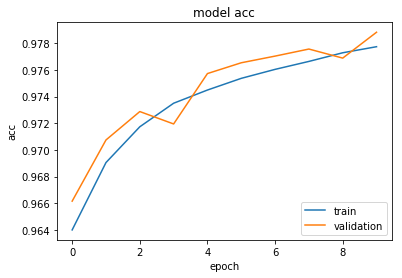

In [49]:
def plot_train(hist):
    h = hist.history
    if 'acc' in h:
        meas='acc'
        loc='lower right'
    else:
        meas='loss'
        loc='upper right'
    plt.plot(hist.history[meas])
    plt.plot(hist.history['val_'+meas])
    plt.title('model '+meas)
    plt.ylabel(meas)
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc=loc)


plot_train(history)


Convergence in accuracies from training and validation set at epoch 10.  Accuracy stands at 97% at epoch 10 with no training label discarded.

### To save entire Keras model 

In [43]:
from keras.models import load_model

model.save('E:\Deep Learning Developer\Wk1 beginning 25 Sep 17\class_of_sums_w_6digits_model.h5')  # creates a HDF5 file 
# del model  # deletes the existing model

In [ ]:
# returns a compiled model
# identical to the previous one
# model = load_model('class_of_sums_w_6digits.h5')

### To discard some training label(s) with their inputs, and validate against full test data

I am removing about 5% of training observations.  Equal mix of odd-even trebles ie., 6 odds and 6 even numbers are discarded from training label set.

To use the same training and testing set above but with number(s) discard.  This will minimise variance between training and testing sets of both full and reduced models to isolate the effect of discard(s).

To assign reduced training set to X_train1, and training label to y_train1.

In [30]:
# To discard certain numbers and retain only remaining elements in both X and y
discard_nums = 50
X_train1 = X_train[np.where(y_train != discard_nums)]  
y_train1 = y_train[np.where(y_train != discard_nums)]  

In [32]:
# To confirm 50 has been removed from label lists
print('Unique sums after "50" is discarded from y_train1: ', np.unique(y_train1))


Unique sums after "50" is discarded from y_train1:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200]


In [33]:
# To check length of full and reduced training set
print('no. of cases for full training set: ', len(X_train))
print('no. of cases for reduced training set: ', len(X_train1))
print('no. of cases discarded: ', len(X_train) - len(X_train1))  # 3063 discarded 
print('Prop of cases discarded: ', (len(X_train) - len(X_train1))/len(X_train)) # 0.5% discarded

no. of cases for full training set:  600000
no. of cases for reduced training set:  596937
no. of cases discarded:  3063
Prop of cases discarded:  0.005105


In [34]:
# To encode the reduced training label as y_train_enc1
n_classes = 201
# convert class vectors to binary One Hot Encoded
y_train_enc_1 = keras.utils.to_categorical(y_train1, n_classes)
print(y_train_enc_1[0])


[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


In [37]:
# To instantiate the reduced model, as model_1
model_1 = Sequential()
model_1.add(Dense(n_hidden_1,  input_shape=(n_input,), name = "Dense_1"))
model_1.add(Activation('relu', name = "Relu1"))
model_1.add(Dense(n_hidden_2, name = "Dense_2"))
model_1.add(Activation('relu', name = "Relu2"))
model_1.add(Dense(n_classes, name = "Output"))
model_1.add(Activation('softmax', name = "Softmax_output"))

model_1.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Dense_1 (Dense)              (None, 24)                168       
_________________________________________________________________
Relu1 (Activation)           (None, 24)                0         
_________________________________________________________________
Dense_2 (Dense)              (None, 24)                600       
_________________________________________________________________
Relu2 (Activation)           (None, 24)                0         
_________________________________________________________________
Output (Dense)               (None, 201)               5025      
_________________________________________________________________
Softmax_output (Activation)  (None, 201)               0         
Total params: 5,793
Trainable params: 5,793
Non-trainable params: 0
_________________________________________________________________


In [39]:
# To compile the reduced model
model_1.compile(loss='categorical_crossentropy',
              optimizer= 'rmsprop',
              metrics=['accuracy'])



In [45]:
# To fit and validate the reduced model
history_1 = model_1.fit(X_train1, y_train_enc_1,
                    batch_size=batch_size,
                    epochs=training_epochs,
                    verbose=1,
                    validation_data=(X_test, y_test_enc))





Train on 596937 samples, validate on 100000 samples
Epoch 1/10
   100/596937 [..............................] - ETA: 394s - loss: 0.2259 - acc: 0.9700

   800/596937 [..............................] - ETA: 91s - loss: 0.3315 - acc: 0.9675 

  1400/596937 [..............................] - ETA: 75s - loss: 0.3931 - acc: 0.9643

  2100/596937 [..............................] - ETA: 64s - loss: 0.3771 - acc: 0.9648

  2800/596937 [..............................] - ETA: 59s - loss: 0.3809 - acc: 0.9646

  3400/596937 [..............................] - ETA: 58s - loss: 0.3902 - acc: 0.9632

  4100/596937 [..............................] - ETA: 55s - loss: 0.4086 - acc: 0.9615

  4900/596937 [..............................] - ETA: 53s - loss: 0.4189 - acc: 0.9608

  5600/596937 [..............................] - ETA: 51s - loss: 0.4172 - acc: 0.9613

  6300/596937 [..............................] - ETA: 50s - loss: 0.4108 - acc: 0.9624

  7100/596937 [..............................] - ETA: 49s - loss: 0.4033 - acc: 0.9635

  7800/596937 [..............................] - ETA: 49s - loss: 0.3999 - acc: 0.9641

  8300/596937 [..............................] - ETA: 50s - loss: 0.3889 - acc: 0.9649

  9000/596937 [..............................] - ETA: 49s - loss: 0.3931 - acc: 0.9642

  9600/596937 [..............................] - ETA: 50s - loss: 0.3915 - acc: 0.9644

 10300/596937 [..............................] - ETA: 49s - loss: 0.3975 - acc: 0.9637

 11000/596937 [..............................] - ETA: 49s - loss: 0.3912 - acc: 0.9644

 11600/596937 [..............................] - ETA: 49s - loss: 0.3935 - acc: 0.9636

 12300/596937 [..............................] - ETA: 49s - loss: 0.3974 - acc: 0.9635

 13000/596937 [..............................] - ETA: 49s - loss: 0.4043 - acc: 0.9631

 13700/596937 [..............................] - ETA: 48s - loss: 0.4093 - acc: 0.9622

 14400/596937 [..............................] - ETA: 48s - loss: 0.4093 - acc: 0.9622

 15100/596937 [..............................] - ETA: 48s - loss: 0.4012 - acc: 0.9626

 15800/596937 [..............................] - ETA: 48s - loss: 0.4102 - acc: 0.9620

 16400/596937 [..............................] - ETA: 48s - loss: 0.4090 - acc: 0.9621

 17000/596937 [..............................] - ETA: 48s - loss: 0.4077 - acc: 0.9619

 17700/596937 [..............................] - ETA: 48s - loss: 0.4078 - acc: 0.9621

 18300/596937 [..............................] - ETA: 48s - loss: 0.4091 - acc: 0.9621

 19000/596937 [..............................] - ETA: 47s - loss: 0.4070 - acc: 0.9625

 19600/596937 [..............................] - ETA: 47s - loss: 0.4060 - acc: 0.9626

 20300/596937 [>.............................] - ETA: 47s - loss: 0.4069 - acc: 0.9625

 20900/596937 [>.............................] - ETA: 47s - loss: 0.4051 - acc: 0.9625



 21600/596937 [>.............................] - ETA: 47s - loss: 0.3987 - acc: 0.9629

 22300/596937 [>.............................] - ETA: 47s - loss: 0.3961 - acc: 0.9631

 23000/596937 [>.............................] - ETA: 47s - loss: 0.3935 - acc: 0.9632

 23700/596937 [>.............................] - ETA: 47s - loss: 0.3940 - acc: 0.9632

 24400/596937 [>.............................] - ETA: 46s - loss: 0.3964 - acc: 0.9631

 25000/596937 [>.............................] - ETA: 46s - loss: 0.3962 - acc: 0.9631

 25700/596937 [>.............................] - ETA: 46s - loss: 0.3941 - acc: 0.9632



 26300/596937 [>.............................] - ETA: 46s - loss: 0.3956 - acc: 0.9632

 27000/596937 [>.............................] - ETA: 46s - loss: 0.3956 - acc: 0.9634

 27700/596937 [>.............................] - ETA: 46s - loss: 0.3950 - acc: 0.9634

 28400/596937 [>.............................] - ETA: 46s - loss: 0.3969 - acc: 0.9632

 29000/596937 [>.............................] - ETA: 46s - loss: 0.3967 - acc: 0.9633

 29700/596937 [>.............................] - ETA: 46s - loss: 0.3987 - acc: 0.9632

 30300/596937 [>.............................] - ETA: 46s - loss: 0.3970 - acc: 0.9632

 31000/596937 [>.............................] - ETA: 46s - loss: 0.3987 - acc: 0.9631



 31700/596937 [>.............................] - ETA: 45s - loss: 0.4014 - acc: 0.9628

 32400/596937 [>.............................] - ETA: 45s - loss: 0.4005 - acc: 0.9630

 33100/596937 [>.............................] - ETA: 45s - loss: 0.4037 - acc: 0.9628

 33900/596937 [>.............................] - ETA: 45s - loss: 0.4040 - acc: 0.9629

 34600/596937 [>.............................] - ETA: 45s - loss: 0.4043 - acc: 0.9629

 35300/596937 [>.............................] - ETA: 45s - loss: 0.4043 - acc: 0.9629

 36000/596937 [>.............................] - ETA: 45s - loss: 0.4036 - acc: 0.9630

 36700/596937 [>.............................] - ETA: 45s - loss: 0.4071 - acc: 0.9629

 37300/596937 [>.............................] - ETA: 45s - loss: 0.4054 - acc: 0.9630

 37900/596937 [>.............................] - ETA: 45s - loss: 0.4039 - acc: 0.9631

 38600/596937 [>.............................] - ETA: 45s - loss: 0.4033 - acc: 0.9631

 39300/596937 [>.............................] - ETA: 45s - loss: 0.4023 - acc: 0.9631

 40000/596937 [=>............................] - ETA: 45s - loss: 0.4014 - acc: 0.9631

 40700/596937 [=>............................] - ETA: 44s - loss: 0.4020 - acc: 0.9631

 41400/596937 [=>............................] - ETA: 44s - loss: 0.4030 - acc: 0.9632



 42100/596937 [=>............................] - ETA: 44s - loss: 0.4024 - acc: 0.9632

 42800/596937 [=>............................] - ETA: 44s - loss: 0.4032 - acc: 0.9632

 43500/596937 [=>............................] - ETA: 44s - loss: 0.4016 - acc: 0.9632

 44200/596937 [=>............................] - ETA: 44s - loss: 0.4005 - acc: 0.9633

 44900/596937 [=>............................] - ETA: 44s - loss: 0.3989 - acc: 0.9635

 45700/596937 [=>............................] - ETA: 44s - loss: 0.3986 - acc: 0.9635

 46500/596937 [=>............................] - ETA: 43s - loss: 0.4001 - acc: 0.9634

 47300/596937 [=>............................] - ETA: 43s - loss: 0.3995 - acc: 0.9634

 48100/596937 [=>............................] - ETA: 43s - loss: 0.4019 - acc: 0.9633

 48800/596937 [=>............................] - ETA: 43s - loss: 0.4033 - acc: 0.9632

 49500/596937 [=>............................] - ETA: 43s - loss: 0.4031 - acc: 0.9632

 50200/596937 [=>............................] - ETA: 43s - loss: 0.4020 - acc: 0.9632

 50800/596937 [=>............................] - ETA: 43s - loss: 0.4016 - acc: 0.9632

 51500/596937 [=>............................] - ETA: 43s - loss: 0.4023 - acc: 0.9632

 52200/596937 [=>............................] - ETA: 43s - loss: 0.4024 - acc: 0.9632

 52900/596937 [=>............................] - ETA: 43s - loss: 0.4026 - acc: 0.9633

 53500/596937 [=>............................] - ETA: 43s - loss: 0.4030 - acc: 0.9633

 54100/596937 [=>............................] - ETA: 43s - loss: 0.4066 - acc: 0.9631

 54800/596937 [=>............................] - ETA: 43s - loss: 0.4069 - acc: 0.9630

 55500/596937 [=>............................] - ETA: 43s - loss: 0.4075 - acc: 0.9629

 56000/596937 [=>............................] - ETA: 43s - loss: 0.4088 - acc: 0.9628

 56700/596937 [=>............................] - ETA: 43s - loss: 0.4082 - acc: 0.9628

 57400/596937 [=>............................] - ETA: 42s - loss: 0.4073 - acc: 0.9629

 58100/596937 [=>............................] - ETA: 42s - loss: 0.4064 - acc: 0.9630

 58800/596937 [=>............................] - ETA: 42s - loss: 0.4073 - acc: 0.9630

 59400/596937 [=>............................] - ETA: 42s - loss: 0.4083 - acc: 0.9629

 60100/596937 [==>...........................] - ETA: 42s - loss: 0.4101 - acc: 0.9628

 60800/596937 [==>...........................] - ETA: 42s - loss: 0.4094 - acc: 0.9629

 61500/596937 [==>...........................] - ETA: 42s - loss: 0.4082 - acc: 0.9630

 62200/596937 [==>...........................] - ETA: 42s - loss: 0.4085 - acc: 0.9629

 62900/596937 [==>...........................] - ETA: 42s - loss: 0.4086 - acc: 0.9628

 63500/596937 [==>...........................] - ETA: 42s - loss: 0.4092 - acc: 0.9628

 64200/596937 [==>...........................] - ETA: 42s - loss: 0.4078 - acc: 0.9629

 64800/596937 [==>...........................] - ETA: 42s - loss: 0.4082 - acc: 0.9628

 65400/596937 [==>...........................] - ETA: 42s - loss: 0.4075 - acc: 0.9629

 66000/596937 [==>...........................] - ETA: 42s - loss: 0.4079 - acc: 0.9628

 66600/596937 [==>...........................] - ETA: 42s - loss: 0.4073 - acc: 0.9629

 67300/596937 [==>...........................] - ETA: 42s - loss: 0.4077 - acc: 0.9628

 68000/596937 [==>...........................] - ETA: 42s - loss: 0.4081 - acc: 0.9629

 68700/596937 [==>...........................] - ETA: 42s - loss: 0.4075 - acc: 0.9629

 69400/596937 [==>...........................] - ETA: 42s - loss: 0.4081 - acc: 0.9629

 70100/596937 [==>...........................] - ETA: 42s - loss: 0.4082 - acc: 0.9629

 70700/596937 [==>...........................] - ETA: 41s - loss: 0.4080 - acc: 0.9629

 71400/596937 [==>...........................] - ETA: 41s - loss: 0.4087 - acc: 0.9628

 72100/596937 [==>...........................] - ETA: 41s - loss: 0.4079 - acc: 0.9628

 72900/596937 [==>...........................] - ETA: 41s - loss: 0.4104 - acc: 0.9628

 73600/596937 [==>...........................] - ETA: 41s - loss: 0.4100 - acc: 0.9628

 74400/596937 [==>...........................] - ETA: 41s - loss: 0.4100 - acc: 0.9627

 75100/596937 [==>...........................] - ETA: 41s - loss: 0.4096 - acc: 0.9627

 75900/596937 [==>...........................] - ETA: 41s - loss: 0.4115 - acc: 0.9626

 76700/596937 [==>...........................] - ETA: 41s - loss: 0.4111 - acc: 0.9627

 77400/596937 [==>...........................] - ETA: 41s - loss: 0.4108 - acc: 0.9627

 78100/596937 [==>...........................] - ETA: 41s - loss: 0.4111 - acc: 0.9627

 78800/596937 [==>...........................] - ETA: 40s - loss: 0.4114 - acc: 0.9627

 79500/596937 [==>...........................] - ETA: 40s - loss: 0.4111 - acc: 0.9627

 80300/596937 [===>..........................] - ETA: 40s - loss: 0.4108 - acc: 0.9627

 81100/596937 [===>..........................] - ETA: 40s - loss: 0.4115 - acc: 0.9626

 81800/596937 [===>..........................] - ETA: 40s - loss: 0.4104 - acc: 0.9627

 82500/596937 [===>..........................] - ETA: 40s - loss: 0.4103 - acc: 0.9627



 83200/596937 [===>..........................] - ETA: 40s - loss: 0.4106 - acc: 0.9626

 83800/596937 [===>..........................] - ETA: 40s - loss: 0.4105 - acc: 0.9627



 84500/596937 [===>..........................] - ETA: 40s - loss: 0.4111 - acc: 0.9626

 85100/596937 [===>..........................] - ETA: 40s - loss: 0.4109 - acc: 0.9626

 85800/596937 [===>..........................] - ETA: 40s - loss: 0.4120 - acc: 0.9625



 86400/596937 [===>..........................] - ETA: 40s - loss: 0.4121 - acc: 0.9625

 87000/596937 [===>..........................] - ETA: 40s - loss: 0.4118 - acc: 0.9626

 87700/596937 [===>..........................] - ETA: 40s - loss: 0.4125 - acc: 0.9625

 88300/596937 [===>..........................] - ETA: 40s - loss: 0.4134 - acc: 0.9625

 88900/596937 [===>..........................] - ETA: 40s - loss: 0.4139 - acc: 0.9624

 89600/596937 [===>..........................] - ETA: 40s - loss: 0.4136 - acc: 0.9624

 90300/596937 [===>..........................] - ETA: 40s - loss: 0.4151 - acc: 0.9624

 91000/596937 [===>..........................] - ETA: 39s - loss: 0.4156 - acc: 0.9624

 91700/596937 [===>..........................] - ETA: 39s - loss: 0.4149 - acc: 0.9624

 92400/596937 [===>..........................] - ETA: 39s - loss: 0.4142 - acc: 0.9624

 93000/596937 [===>..........................] - ETA: 39s - loss: 0.4148 - acc: 0.9624

 93700/596937 [===>..........................] - ETA: 39s - loss: 0.4149 - acc: 0.9624

 94400/596937 [===>..........................] - ETA: 39s - loss: 0.4149 - acc: 0.9624

 95000/596937 [===>..........................] - ETA: 39s - loss: 0.4151 - acc: 0.9623

 95700/596937 [===>..........................] - ETA: 39s - loss: 0.4155 - acc: 0.9623

 96400/596937 [===>..........................] - ETA: 39s - loss: 0.4157 - acc: 0.9623

 97100/596937 [===>..........................] - ETA: 39s - loss: 0.4155 - acc: 0.9623

 97800/596937 [===>..........................] - ETA: 39s - loss: 0.4147 - acc: 0.9624

 98500/596937 [===>..........................] - ETA: 39s - loss: 0.4143 - acc: 0.9625

 99200/596937 [===>..........................] - ETA: 39s - loss: 0.4142 - acc: 0.9624

 99900/596937 [====>.........................] - ETA: 39s - loss: 0.4141 - acc: 0.9624

100500/596937 [====>.........................] - ETA: 39s - loss: 0.4139 - acc: 0.9624

101200/596937 [====>.........................] - ETA: 39s - loss: 0.4145 - acc: 0.9624

101900/596937 [====>.........................] - ETA: 39s - loss: 0.4148 - acc: 0.9624

102600/596937 [====>.........................] - ETA: 39s - loss: 0.4152 - acc: 0.9624

103200/596937 [====>.........................] - ETA: 39s - loss: 0.4141 - acc: 0.9624

103900/596937 [====>.........................] - ETA: 38s - loss: 0.4139 - acc: 0.9624

104500/596937 [====>.........................] - ETA: 38s - loss: 0.4133 - acc: 0.9625

105100/596937 [====>.........................] - ETA: 38s - loss: 0.4122 - acc: 0.9625

105800/596937 [====>.........................] - ETA: 38s - loss: 0.4122 - acc: 0.9626

106600/596937 [====>.........................] - ETA: 38s - loss: 0.4119 - acc: 0.9625

107300/596937 [====>.........................] - ETA: 38s - loss: 0.4121 - acc: 0.9625

108000/596937 [====>.........................] - ETA: 38s - loss: 0.4125 - acc: 0.9625

108700/596937 [====>.........................] - ETA: 38s - loss: 0.4117 - acc: 0.9625

109400/596937 [====>.........................] - ETA: 38s - loss: 0.4116 - acc: 0.9626

109900/596937 [====>.........................] - ETA: 38s - loss: 0.4116 - acc: 0.9626



110600/596937 [====>.........................] - ETA: 38s - loss: 0.4123 - acc: 0.9625

111300/596937 [====>.........................] - ETA: 38s - loss: 0.4118 - acc: 0.9625

112000/596937 [====>.........................] - ETA: 38s - loss: 0.4113 - acc: 0.9625

112700/596937 [====>.........................] - ETA: 38s - loss: 0.4108 - acc: 0.9625

113400/596937 [====>.........................] - ETA: 38s - loss: 0.4105 - acc: 0.9625

114100/596937 [====>.........................] - ETA: 37s - loss: 0.4110 - acc: 0.9625

114800/596937 [====>.........................] - ETA: 37s - loss: 0.4111 - acc: 0.9624

115500/596937 [====>.........................] - ETA: 37s - loss: 0.4107 - acc: 0.9625

116300/596937 [====>.........................] - ETA: 37s - loss: 0.4101 - acc: 0.9625



117000/596937 [====>.........................] - ETA: 37s - loss: 0.4091 - acc: 0.9625

117700/596937 [====>.........................] - ETA: 37s - loss: 0.4098 - acc: 0.9625

118400/596937 [====>.........................] - ETA: 37s - loss: 0.4102 - acc: 0.9625

119100/596937 [====>.........................] - ETA: 37s - loss: 0.4096 - acc: 0.9626

119700/596937 [=====>........................] - ETA: 37s - loss: 0.4094 - acc: 0.9626

120500/596937 [=====>........................] - ETA: 37s - loss: 0.4098 - acc: 0.9626

121100/596937 [=====>........................] - ETA: 37s - loss: 0.4092 - acc: 0.9627

121700/596937 [=====>........................] - ETA: 37s - loss: 0.4091 - acc: 0.9627

122400/596937 [=====>........................] - ETA: 37s - loss: 0.4087 - acc: 0.9628

123100/596937 [=====>........................] - ETA: 37s - loss: 0.4078 - acc: 0.9628



123700/596937 [=====>........................] - ETA: 37s - loss: 0.4079 - acc: 0.9628

124400/596937 [=====>........................] - ETA: 37s - loss: 0.4077 - acc: 0.9628

125000/596937 [=====>........................] - ETA: 37s - loss: 0.4075 - acc: 0.9629

125700/596937 [=====>........................] - ETA: 37s - loss: 0.4081 - acc: 0.9629

126400/596937 [=====>........................] - ETA: 36s - loss: 0.4081 - acc: 0.9629

127100/596937 [=====>........................] - ETA: 36s - loss: 0.4096 - acc: 0.9628

127800/596937 [=====>........................] - ETA: 36s - loss: 0.4089 - acc: 0.9628

128400/596937 [=====>........................] - ETA: 36s - loss: 0.4081 - acc: 0.9629

129100/596937 [=====>........................] - ETA: 36s - loss: 0.4082 - acc: 0.9628

129700/596937 [=====>........................] - ETA: 36s - loss: 0.4082 - acc: 0.9628

130400/596937 [=====>........................] - ETA: 36s - loss: 0.4075 - acc: 0.9629

131100/596937 [=====>........................] - ETA: 36s - loss: 0.4077 - acc: 0.9628

131700/596937 [=====>........................] - ETA: 36s - loss: 0.4072 - acc: 0.9629

132400/596937 [=====>........................] - ETA: 36s - loss: 0.4067 - acc: 0.9629

133100/596937 [=====>........................] - ETA: 36s - loss: 0.4058 - acc: 0.9630

133800/596937 [=====>........................] - ETA: 36s - loss: 0.4057 - acc: 0.9630

134400/596937 [=====>........................] - ETA: 36s - loss: 0.4056 - acc: 0.9630

135100/596937 [=====>........................] - ETA: 36s - loss: 0.4052 - acc: 0.9630



135800/596937 [=====>........................] - ETA: 36s - loss: 0.4054 - acc: 0.9630

136400/596937 [=====>........................] - ETA: 36s - loss: 0.4049 - acc: 0.9630

137100/596937 [=====>........................] - ETA: 36s - loss: 0.4053 - acc: 0.9630

137800/596937 [=====>........................] - ETA: 36s - loss: 0.4050 - acc: 0.9630

138500/596937 [=====>........................] - ETA: 36s - loss: 0.4051 - acc: 0.9630

139200/596937 [=====>........................] - ETA: 35s - loss: 0.4053 - acc: 0.9630

139800/596937 [======>.......................] - ETA: 35s - loss: 0.4059 - acc: 0.9629

140500/596937 [======>.......................] - ETA: 35s - loss: 0.4052 - acc: 0.9630

141200/596937 [======>.......................] - ETA: 35s - loss: 0.4059 - acc: 0.9630

141900/596937 [======>.......................] - ETA: 35s - loss: 0.4057 - acc: 0.9630

142500/596937 [======>.......................] - ETA: 35s - loss: 0.4055 - acc: 0.9630

143300/596937 [======>.......................] - ETA: 35s - loss: 0.4052 - acc: 0.9630

144000/596937 [======>.......................] - ETA: 35s - loss: 0.4054 - acc: 0.9630

144700/596937 [======>.......................] - ETA: 35s - loss: 0.4061 - acc: 0.9630



145400/596937 [======>.......................] - ETA: 35s - loss: 0.4055 - acc: 0.9630

146100/596937 [======>.......................] - ETA: 35s - loss: 0.4056 - acc: 0.9630

146800/596937 [======>.......................] - ETA: 35s - loss: 0.4049 - acc: 0.9631

147500/596937 [======>.......................] - ETA: 35s - loss: 0.4049 - acc: 0.9631

148200/596937 [======>.......................] - ETA: 35s - loss: 0.4045 - acc: 0.9631

148900/596937 [======>.......................] - ETA: 35s - loss: 0.4046 - acc: 0.9631

149700/596937 [======>.......................] - ETA: 35s - loss: 0.4055 - acc: 0.9630

150500/596937 [======>.......................] - ETA: 34s - loss: 0.4056 - acc: 0.9630

151200/596937 [======>.......................] - ETA: 34s - loss: 0.4054 - acc: 0.9630

151900/596937 [======>.......................] - ETA: 34s - loss: 0.4050 - acc: 0.9630

152700/596937 [======>.......................] - ETA: 34s - loss: 0.4054 - acc: 0.9630

153400/596937 [======>.......................] - ETA: 34s - loss: 0.4051 - acc: 0.9630



154100/596937 [======>.......................] - ETA: 34s - loss: 0.4051 - acc: 0.9630

154800/596937 [======>.......................] - ETA: 34s - loss: 0.4050 - acc: 0.9630

155600/596937 [======>.......................] - ETA: 34s - loss: 0.4051 - acc: 0.9630

156300/596937 [======>.......................] - ETA: 34s - loss: 0.4052 - acc: 0.9630

157000/596937 [======>.......................] - ETA: 34s - loss: 0.4056 - acc: 0.9630

157800/596937 [======>.......................] - ETA: 34s - loss: 0.4059 - acc: 0.9630

158400/596937 [======>.......................] - ETA: 34s - loss: 0.4064 - acc: 0.9629

159000/596937 [======>.......................] - ETA: 34s - loss: 0.4058 - acc: 0.9630

159700/596937 [=======>......................] - ETA: 34s - loss: 0.4063 - acc: 0.9629

160400/596937 [=======>......................] - ETA: 34s - loss: 0.4064 - acc: 0.9629

161100/596937 [=======>......................] - ETA: 34s - loss: 0.4063 - acc: 0.9629

161800/596937 [=======>......................] - ETA: 33s - loss: 0.4065 - acc: 0.9628

162500/596937 [=======>......................] - ETA: 33s - loss: 0.4066 - acc: 0.9629

163200/596937 [=======>......................] - ETA: 33s - loss: 0.4070 - acc: 0.9629

163900/596937 [=======>......................] - ETA: 33s - loss: 0.4072 - acc: 0.9629

164500/596937 [=======>......................] - ETA: 33s - loss: 0.4072 - acc: 0.9628

165200/596937 [=======>......................] - ETA: 33s - loss: 0.4075 - acc: 0.9628

165900/596937 [=======>......................] - ETA: 33s - loss: 0.4073 - acc: 0.9628

166600/596937 [=======>......................] - ETA: 33s - loss: 0.4068 - acc: 0.9629

167300/596937 [=======>......................] - ETA: 33s - loss: 0.4066 - acc: 0.9629

168000/596937 [=======>......................] - ETA: 33s - loss: 0.4066 - acc: 0.9629

168600/596937 [=======>......................] - ETA: 33s - loss: 0.4065 - acc: 0.9629

169300/596937 [=======>......................] - ETA: 33s - loss: 0.4064 - acc: 0.9629

170000/596937 [=======>......................] - ETA: 33s - loss: 0.4063 - acc: 0.9629

170700/596937 [=======>......................] - ETA: 33s - loss: 0.4058 - acc: 0.9629

171300/596937 [=======>......................] - ETA: 33s - loss: 0.4054 - acc: 0.9629

172000/596937 [=======>......................] - ETA: 33s - loss: 0.4055 - acc: 0.9629

172700/596937 [=======>......................] - ETA: 33s - loss: 0.4054 - acc: 0.9629

173400/596937 [=======>......................] - ETA: 33s - loss: 0.4054 - acc: 0.9630

174000/596937 [=======>......................] - ETA: 33s - loss: 0.4059 - acc: 0.9630

174700/596937 [=======>......................] - ETA: 33s - loss: 0.4064 - acc: 0.9629

175400/596937 [=======>......................] - ETA: 32s - loss: 0.4065 - acc: 0.9629

176100/596937 [=======>......................] - ETA: 32s - loss: 0.4064 - acc: 0.9630

176800/596937 [=======>......................] - ETA: 32s - loss: 0.4062 - acc: 0.9629

177500/596937 [=======>......................] - ETA: 32s - loss: 0.4061 - acc: 0.9630

178200/596937 [=======>......................] - ETA: 32s - loss: 0.4058 - acc: 0.9630

178800/596937 [=======>......................] - ETA: 32s - loss: 0.4053 - acc: 0.9630

179500/596937 [========>.....................] - ETA: 32s - loss: 0.4053 - acc: 0.9630



180100/596937 [========>.....................] - ETA: 32s - loss: 0.4050 - acc: 0.9631

180700/596937 [========>.....................] - ETA: 32s - loss: 0.4050 - acc: 0.9631

181300/596937 [========>.....................] - ETA: 32s - loss: 0.4050 - acc: 0.9631

182000/596937 [========>.....................] - ETA: 32s - loss: 0.4053 - acc: 0.9630

182700/596937 [========>.....................] - ETA: 32s - loss: 0.4053 - acc: 0.9630

183400/596937 [========>.....................] - ETA: 32s - loss: 0.4051 - acc: 0.9630

184100/596937 [========>.....................] - ETA: 32s - loss: 0.4050 - acc: 0.9631

184800/596937 [========>.....................] - ETA: 32s - loss: 0.4048 - acc: 0.9631

185500/596937 [========>.....................] - ETA: 32s - loss: 0.4050 - acc: 0.9631

186300/596937 [========>.....................] - ETA: 32s - loss: 0.4051 - acc: 0.9630

187100/596937 [========>.....................] - ETA: 31s - loss: 0.4048 - acc: 0.9631

187900/596937 [========>.....................] - ETA: 31s - loss: 0.4044 - acc: 0.9631

188600/596937 [========>.....................] - ETA: 31s - loss: 0.4048 - acc: 0.9631

189300/596937 [========>.....................] - ETA: 31s - loss: 0.4048 - acc: 0.9631

190100/596937 [========>.....................] - ETA: 31s - loss: 0.4051 - acc: 0.9631

190800/596937 [========>.....................] - ETA: 31s - loss: 0.4046 - acc: 0.9631

191400/596937 [========>.....................] - ETA: 31s - loss: 0.4044 - acc: 0.9631

192000/596937 [========>.....................] - ETA: 31s - loss: 0.4046 - acc: 0.9631

192600/596937 [========>.....................] - ETA: 31s - loss: 0.4044 - acc: 0.9631

193300/596937 [========>.....................] - ETA: 31s - loss: 0.4048 - acc: 0.9631

194000/596937 [========>.....................] - ETA: 31s - loss: 0.4050 - acc: 0.9631

194700/596937 [========>.....................] - ETA: 31s - loss: 0.4050 - acc: 0.9631

195300/596937 [========>.....................] - ETA: 31s - loss: 0.4050 - acc: 0.9631

196000/596937 [========>.....................] - ETA: 31s - loss: 0.4049 - acc: 0.9631

196700/596937 [========>.....................] - ETA: 31s - loss: 0.4048 - acc: 0.9631

197400/596937 [========>.....................] - ETA: 31s - loss: 0.4047 - acc: 0.9631

198000/596937 [========>.....................] - ETA: 31s - loss: 0.4049 - acc: 0.9631

198700/596937 [========>.....................] - ETA: 31s - loss: 0.4049 - acc: 0.9631

199400/596937 [=========>....................] - ETA: 31s - loss: 0.4052 - acc: 0.9631

200100/596937 [=========>....................] - ETA: 30s - loss: 0.4054 - acc: 0.9631

200800/596937 [=========>....................] - ETA: 30s - loss: 0.4050 - acc: 0.9631

201400/596937 [=========>....................] - ETA: 30s - loss: 0.4053 - acc: 0.9631

202100/596937 [=========>....................] - ETA: 30s - loss: 0.4051 - acc: 0.9632

202800/596937 [=========>....................] - ETA: 30s - loss: 0.4054 - acc: 0.9631

203500/596937 [=========>....................] - ETA: 30s - loss: 0.4051 - acc: 0.9631

204200/596937 [=========>....................] - ETA: 30s - loss: 0.4049 - acc: 0.9631

204800/596937 [=========>....................] - ETA: 30s - loss: 0.4051 - acc: 0.9631

205500/596937 [=========>....................] - ETA: 30s - loss: 0.4056 - acc: 0.9631

206200/596937 [=========>....................] - ETA: 30s - loss: 0.4053 - acc: 0.9631

206800/596937 [=========>....................] - ETA: 30s - loss: 0.4053 - acc: 0.9631

207500/596937 [=========>....................] - ETA: 30s - loss: 0.4056 - acc: 0.9631

208200/596937 [=========>....................] - ETA: 30s - loss: 0.4056 - acc: 0.9631

208900/596937 [=========>....................] - ETA: 30s - loss: 0.4053 - acc: 0.9631

209600/596937 [=========>....................] - ETA: 30s - loss: 0.4058 - acc: 0.9631

210300/596937 [=========>....................] - ETA: 30s - loss: 0.4057 - acc: 0.9631

211000/596937 [=========>....................] - ETA: 30s - loss: 0.4058 - acc: 0.9631

211700/596937 [=========>....................] - ETA: 30s - loss: 0.4056 - acc: 0.9631

212400/596937 [=========>....................] - ETA: 30s - loss: 0.4055 - acc: 0.9632

213100/596937 [=========>....................] - ETA: 29s - loss: 0.4053 - acc: 0.9632

213900/596937 [=========>....................] - ETA: 29s - loss: 0.4051 - acc: 0.9632

214600/596937 [=========>....................] - ETA: 29s - loss: 0.4050 - acc: 0.9632

215300/596937 [=========>....................] - ETA: 29s - loss: 0.4047 - acc: 0.9632

216100/596937 [=========>....................] - ETA: 29s - loss: 0.4047 - acc: 0.9632

216800/596937 [=========>....................] - ETA: 29s - loss: 0.4046 - acc: 0.9632

217600/596937 [=========>....................] - ETA: 29s - loss: 0.4046 - acc: 0.9632

218300/596937 [=========>....................] - ETA: 29s - loss: 0.4049 - acc: 0.9632

219100/596937 [==========>...................] - ETA: 29s - loss: 0.4048 - acc: 0.9632

219900/596937 [==========>...................] - ETA: 29s - loss: 0.4044 - acc: 0.9632

220600/596937 [==========>...................] - ETA: 29s - loss: 0.4044 - acc: 0.9632

221300/596937 [==========>...................] - ETA: 29s - loss: 0.4041 - acc: 0.9632

222000/596937 [==========>...................] - ETA: 29s - loss: 0.4044 - acc: 0.9632

222700/596937 [==========>...................] - ETA: 29s - loss: 0.4043 - acc: 0.9632

223400/596937 [==========>...................] - ETA: 29s - loss: 0.4047 - acc: 0.9632

224000/596937 [==========>...................] - ETA: 29s - loss: 0.4050 - acc: 0.9632

224800/596937 [==========>...................] - ETA: 28s - loss: 0.4048 - acc: 0.9632

225400/596937 [==========>...................] - ETA: 28s - loss: 0.4049 - acc: 0.9632

226100/596937 [==========>...................] - ETA: 28s - loss: 0.4051 - acc: 0.9632

226800/596937 [==========>...................] - ETA: 28s - loss: 0.4056 - acc: 0.9631

227500/596937 [==========>...................] - ETA: 28s - loss: 0.4054 - acc: 0.9632

228100/596937 [==========>...................] - ETA: 28s - loss: 0.4061 - acc: 0.9631

228900/596937 [==========>...................] - ETA: 28s - loss: 0.4062 - acc: 0.9631

229500/596937 [==========>...................] - ETA: 28s - loss: 0.4064 - acc: 0.9631

230200/596937 [==========>...................] - ETA: 28s - loss: 0.4063 - acc: 0.9631

230900/596937 [==========>...................] - ETA: 28s - loss: 0.4070 - acc: 0.9631

231600/596937 [==========>...................] - ETA: 28s - loss: 0.4074 - acc: 0.9631

232300/596937 [==========>...................] - ETA: 28s - loss: 0.4079 - acc: 0.9631

232900/596937 [==========>...................] - ETA: 28s - loss: 0.4079 - acc: 0.9631

233600/596937 [==========>...................] - ETA: 28s - loss: 0.4079 - acc: 0.9631

234300/596937 [==========>...................] - ETA: 28s - loss: 0.4083 - acc: 0.9631

235000/596937 [==========>...................] - ETA: 28s - loss: 0.4082 - acc: 0.9630

235700/596937 [==========>...................] - ETA: 28s - loss: 0.4082 - acc: 0.9631

236300/596937 [==========>...................] - ETA: 28s - loss: 0.4084 - acc: 0.9630

236900/596937 [==========>...................] - ETA: 28s - loss: 0.4085 - acc: 0.9630

237600/596937 [==========>...................] - ETA: 28s - loss: 0.4088 - acc: 0.9630

238300/596937 [==========>...................] - ETA: 27s - loss: 0.4087 - acc: 0.9630

239000/596937 [===========>..................] - ETA: 27s - loss: 0.4088 - acc: 0.9630

239700/596937 [===========>..................] - ETA: 27s - loss: 0.4090 - acc: 0.9630

240400/596937 [===========>..................] - ETA: 27s - loss: 0.4091 - acc: 0.9630

241000/596937 [===========>..................] - ETA: 27s - loss: 0.4088 - acc: 0.9630

241700/596937 [===========>..................] - ETA: 27s - loss: 0.4086 - acc: 0.9630



242400/596937 [===========>..................] - ETA: 27s - loss: 0.4087 - acc: 0.9630

243100/596937 [===========>..................] - ETA: 27s - loss: 0.4087 - acc: 0.9630

243700/596937 [===========>..................] - ETA: 27s - loss: 0.4086 - acc: 0.9630

244400/596937 [===========>..................] - ETA: 27s - loss: 0.4085 - acc: 0.9630

245000/596937 [===========>..................] - ETA: 27s - loss: 0.4083 - acc: 0.9631

245700/596937 [===========>..................] - ETA: 27s - loss: 0.4085 - acc: 0.9631

246400/596937 [===========>..................] - ETA: 27s - loss: 0.4092 - acc: 0.9630

247200/596937 [===========>..................] - ETA: 27s - loss: 0.4099 - acc: 0.9630

247900/596937 [===========>..................] - ETA: 27s - loss: 0.4095 - acc: 0.9630

248700/596937 [===========>..................] - ETA: 27s - loss: 0.4096 - acc: 0.9630

249400/596937 [===========>..................] - ETA: 27s - loss: 0.4098 - acc: 0.9630

250200/596937 [===========>..................] - ETA: 27s - loss: 0.4098 - acc: 0.9630

250900/596937 [===========>..................] - ETA: 26s - loss: 0.4097 - acc: 0.9630

251700/596937 [===========>..................] - ETA: 26s - loss: 0.4097 - acc: 0.9630

252400/596937 [===========>..................] - ETA: 26s - loss: 0.4095 - acc: 0.9630

253100/596937 [===========>..................] - ETA: 26s - loss: 0.4095 - acc: 0.9630

253800/596937 [===========>..................] - ETA: 26s - loss: 0.4093 - acc: 0.9630

254500/596937 [===========>..................] - ETA: 26s - loss: 0.4092 - acc: 0.9630

255300/596937 [===========>..................] - ETA: 26s - loss: 0.4089 - acc: 0.9631

255900/596937 [===========>..................] - ETA: 26s - loss: 0.4085 - acc: 0.9631

256600/596937 [===========>..................] - ETA: 26s - loss: 0.4083 - acc: 0.9631

257300/596937 [===========>..................] - ETA: 26s - loss: 0.4079 - acc: 0.9631

258000/596937 [===========>..................] - ETA: 26s - loss: 0.4077 - acc: 0.9632

258600/596937 [===========>..................] - ETA: 26s - loss: 0.4075 - acc: 0.9632

259200/596937 [============>.................] - ETA: 26s - loss: 0.4076 - acc: 0.9632

259800/596937 [============>.................] - ETA: 26s - loss: 0.4076 - acc: 0.9631



260400/596937 [============>.................] - ETA: 26s - loss: 0.4077 - acc: 0.9631

261100/596937 [============>.................] - ETA: 26s - loss: 0.4075 - acc: 0.9631

261800/596937 [============>.................] - ETA: 26s - loss: 0.4074 - acc: 0.9631

262400/596937 [============>.................] - ETA: 26s - loss: 0.4076 - acc: 0.9631

263100/596937 [============>.................] - ETA: 26s - loss: 0.4078 - acc: 0.9631

263800/596937 [============>.................] - ETA: 25s - loss: 0.4075 - acc: 0.9631

264500/596937 [============>.................] - ETA: 25s - loss: 0.4073 - acc: 0.9632

265200/596937 [============>.................] - ETA: 25s - loss: 0.4071 - acc: 0.9632

265900/596937 [============>.................] - ETA: 25s - loss: 0.4072 - acc: 0.9632

266600/596937 [============>.................] - ETA: 25s - loss: 0.4075 - acc: 0.9632

267200/596937 [============>.................] - ETA: 25s - loss: 0.4075 - acc: 0.9632

268000/596937 [============>.................] - ETA: 25s - loss: 0.4079 - acc: 0.9632

268700/596937 [============>.................] - ETA: 25s - loss: 0.4077 - acc: 0.9632

269300/596937 [============>.................] - ETA: 25s - loss: 0.4076 - acc: 0.9632

270000/596937 [============>.................] - ETA: 25s - loss: 0.4076 - acc: 0.9632

270700/596937 [============>.................] - ETA: 25s - loss: 0.4075 - acc: 0.9632

271400/596937 [============>.................] - ETA: 25s - loss: 0.4075 - acc: 0.9632

272100/596937 [============>.................] - ETA: 25s - loss: 0.4078 - acc: 0.9632

272700/596937 [============>.................] - ETA: 25s - loss: 0.4080 - acc: 0.9632



273400/596937 [============>.................] - ETA: 25s - loss: 0.4076 - acc: 0.9632

274100/596937 [============>.................] - ETA: 25s - loss: 0.4085 - acc: 0.9632

274700/596937 [============>.................] - ETA: 25s - loss: 0.4081 - acc: 0.9632

275400/596937 [============>.................] - ETA: 25s - loss: 0.4082 - acc: 0.9632

276100/596937 [============>.................] - ETA: 25s - loss: 0.4082 - acc: 0.9632

276800/596937 [============>.................] - ETA: 24s - loss: 0.4081 - acc: 0.9632

277600/596937 [============>.................] - ETA: 24s - loss: 0.4077 - acc: 0.9632

278400/596937 [============>.................] - ETA: 24s - loss: 0.4082 - acc: 0.9632

279100/596937 [=============>................] - ETA: 24s - loss: 0.4086 - acc: 0.9632

279800/596937 [=============>................] - ETA: 24s - loss: 0.4087 - acc: 0.9632



280500/596937 [=============>................] - ETA: 24s - loss: 0.4090 - acc: 0.9632

281200/596937 [=============>................] - ETA: 24s - loss: 0.4093 - acc: 0.9632

282000/596937 [=============>................] - ETA: 24s - loss: 0.4091 - acc: 0.9632

282700/596937 [=============>................] - ETA: 24s - loss: 0.4089 - acc: 0.9632

283300/596937 [=============>................] - ETA: 24s - loss: 0.4088 - acc: 0.9632

284000/596937 [=============>................] - ETA: 24s - loss: 0.4087 - acc: 0.9632

284700/596937 [=============>................] - ETA: 24s - loss: 0.4086 - acc: 0.9632

285300/596937 [=============>................] - ETA: 24s - loss: 0.4086 - acc: 0.9632

285900/596937 [=============>................] - ETA: 24s - loss: 0.4088 - acc: 0.9632

286500/596937 [=============>................] - ETA: 24s - loss: 0.4087 - acc: 0.9632

287100/596937 [=============>................] - ETA: 24s - loss: 0.4086 - acc: 0.9632



287700/596937 [=============>................] - ETA: 24s - loss: 0.4083 - acc: 0.9632

288400/596937 [=============>................] - ETA: 24s - loss: 0.4081 - acc: 0.9633

289100/596937 [=============>................] - ETA: 24s - loss: 0.4079 - acc: 0.9633

289700/596937 [=============>................] - ETA: 23s - loss: 0.4077 - acc: 0.9633

290300/596937 [=============>................] - ETA: 23s - loss: 0.4078 - acc: 0.9633

290900/596937 [=============>................] - ETA: 23s - loss: 0.4077 - acc: 0.9633

291500/596937 [=============>................] - ETA: 23s - loss: 0.4077 - acc: 0.9633

292200/596937 [=============>................] - ETA: 23s - loss: 0.4078 - acc: 0.9633

292800/596937 [=============>................] - ETA: 23s - loss: 0.4077 - acc: 0.9633

293500/596937 [=============>................] - ETA: 23s - loss: 0.4078 - acc: 0.9633

294100/596937 [=============>................] - ETA: 23s - loss: 0.4079 - acc: 0.9633

294700/596937 [=============>................] - ETA: 23s - loss: 0.4078 - acc: 0.9633

295300/596937 [=============>................] - ETA: 23s - loss: 0.4075 - acc: 0.9633

296000/596937 [=============>................] - ETA: 23s - loss: 0.4072 - acc: 0.9634

296700/596937 [=============>................] - ETA: 23s - loss: 0.4072 - acc: 0.9633

297400/596937 [=============>................] - ETA: 23s - loss: 0.4069 - acc: 0.9634

298100/596937 [=============>................] - ETA: 23s - loss: 0.4067 - acc: 0.9634

298700/596937 [==============>...............] - ETA: 23s - loss: 0.4063 - acc: 0.9634

299300/596937 [==============>...............] - ETA: 23s - loss: 0.4063 - acc: 0.9634

299900/596937 [==============>...............] - ETA: 23s - loss: 0.4061 - acc: 0.9634

300600/596937 [==============>...............] - ETA: 23s - loss: 0.4062 - acc: 0.9634

301400/596937 [==============>...............] - ETA: 23s - loss: 0.4065 - acc: 0.9634

302100/596937 [==============>...............] - ETA: 23s - loss: 0.4065 - acc: 0.9634

302700/596937 [==============>...............] - ETA: 23s - loss: 0.4062 - acc: 0.9634

303300/596937 [==============>...............] - ETA: 22s - loss: 0.4062 - acc: 0.9634

303900/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9634

304600/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9634

305200/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9634

305900/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

306500/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9634

307200/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

307800/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9635

308400/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

309100/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

309700/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

310300/596937 [==============>...............] - ETA: 22s - loss: 0.4062 - acc: 0.9635

310900/596937 [==============>...............] - ETA: 22s - loss: 0.4064 - acc: 0.9634

311600/596937 [==============>...............] - ETA: 22s - loss: 0.4063 - acc: 0.9634

312300/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9634

313000/596937 [==============>...............] - ETA: 22s - loss: 0.4065 - acc: 0.9634

313700/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9635

314400/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9635

315100/596937 [==============>...............] - ETA: 22s - loss: 0.4061 - acc: 0.9635

315800/596937 [==============>...............] - ETA: 22s - loss: 0.4059 - acc: 0.9635

316500/596937 [==============>...............] - ETA: 21s - loss: 0.4060 - acc: 0.9635

317200/596937 [==============>...............] - ETA: 21s - loss: 0.4059 - acc: 0.9635

317900/596937 [==============>...............] - ETA: 21s - loss: 0.4059 - acc: 0.9635

318600/596937 [===============>..............] - ETA: 21s - loss: 0.4059 - acc: 0.9635

319200/596937 [===============>..............] - ETA: 21s - loss: 0.4062 - acc: 0.9635



319800/596937 [===============>..............] - ETA: 21s - loss: 0.4063 - acc: 0.9635



320500/596937 [===============>..............] - ETA: 21s - loss: 0.4065 - acc: 0.9635

321100/596937 [===============>..............] - ETA: 21s - loss: 0.4074 - acc: 0.9634

321800/596937 [===============>..............] - ETA: 21s - loss: 0.4074 - acc: 0.9634

322500/596937 [===============>..............] - ETA: 21s - loss: 0.4072 - acc: 0.9635

323100/596937 [===============>..............] - ETA: 21s - loss: 0.4069 - acc: 0.9635

323700/596937 [===============>..............] - ETA: 21s - loss: 0.4068 - acc: 0.9635

324300/596937 [===============>..............] - ETA: 21s - loss: 0.4066 - acc: 0.9635

324900/596937 [===============>..............] - ETA: 21s - loss: 0.4064 - acc: 0.9635

325600/596937 [===============>..............] - ETA: 21s - loss: 0.4064 - acc: 0.9635

326300/596937 [===============>..............] - ETA: 21s - loss: 0.4062 - acc: 0.9635

327000/596937 [===============>..............] - ETA: 21s - loss: 0.4065 - acc: 0.9635

327600/596937 [===============>..............] - ETA: 21s - loss: 0.4065 - acc: 0.9635

328200/596937 [===============>..............] - ETA: 21s - loss: 0.4062 - acc: 0.9635

328900/596937 [===============>..............] - ETA: 21s - loss: 0.4060 - acc: 0.9636

329600/596937 [===============>..............] - ETA: 20s - loss: 0.4062 - acc: 0.9635

330300/596937 [===============>..............] - ETA: 20s - loss: 0.4060 - acc: 0.9635

330900/596937 [===============>..............] - ETA: 20s - loss: 0.4061 - acc: 0.9635

331500/596937 [===============>..............] - ETA: 20s - loss: 0.4059 - acc: 0.9635

332100/596937 [===============>..............] - ETA: 20s - loss: 0.4060 - acc: 0.9635

332700/596937 [===============>..............] - ETA: 20s - loss: 0.4058 - acc: 0.9636

333300/596937 [===============>..............] - ETA: 20s - loss: 0.4060 - acc: 0.9636

334000/596937 [===============>..............] - ETA: 20s - loss: 0.4057 - acc: 0.9636

334600/596937 [===============>..............] - ETA: 20s - loss: 0.4056 - acc: 0.9636

335300/596937 [===============>..............] - ETA: 20s - loss: 0.4055 - acc: 0.9636

335900/596937 [===============>..............] - ETA: 20s - loss: 0.4054 - acc: 0.9636

336500/596937 [===============>..............] - ETA: 20s - loss: 0.4056 - acc: 0.9636

337100/596937 [===============>..............] - ETA: 20s - loss: 0.4056 - acc: 0.9636



337700/596937 [===============>..............] - ETA: 20s - loss: 0.4056 - acc: 0.9636

338300/596937 [================>.............] - ETA: 20s - loss: 0.4057 - acc: 0.9636

339000/596937 [================>.............] - ETA: 20s - loss: 0.4055 - acc: 0.9636



339600/596937 [================>.............] - ETA: 20s - loss: 0.4054 - acc: 0.9636

340200/596937 [================>.............] - ETA: 20s - loss: 0.4053 - acc: 0.9636

340800/596937 [================>.............] - ETA: 20s - loss: 0.4055 - acc: 0.9636

341500/596937 [================>.............] - ETA: 20s - loss: 0.4054 - acc: 0.9636

342200/596937 [================>.............] - ETA: 20s - loss: 0.4052 - acc: 0.9636

342800/596937 [================>.............] - ETA: 20s - loss: 0.4052 - acc: 0.9636

343500/596937 [================>.............] - ETA: 19s - loss: 0.4051 - acc: 0.9637

344300/596937 [================>.............] - ETA: 19s - loss: 0.4053 - acc: 0.9637

345000/596937 [================>.............] - ETA: 19s - loss: 0.4055 - acc: 0.9637

345700/596937 [================>.............] - ETA: 19s - loss: 0.4054 - acc: 0.9637

346500/596937 [================>.............] - ETA: 19s - loss: 0.4054 - acc: 0.9636

347300/596937 [================>.............] - ETA: 19s - loss: 0.4056 - acc: 0.9636

348100/596937 [================>.............] - ETA: 19s - loss: 0.4054 - acc: 0.9637

348800/596937 [================>.............] - ETA: 19s - loss: 0.4054 - acc: 0.9637

349500/596937 [================>.............] - ETA: 19s - loss: 0.4055 - acc: 0.9636

350200/596937 [================>.............] - ETA: 19s - loss: 0.4054 - acc: 0.9636

350900/596937 [================>.............] - ETA: 19s - loss: 0.4059 - acc: 0.9636

351500/596937 [================>.............] - ETA: 19s - loss: 0.4058 - acc: 0.9637

352200/596937 [================>.............] - ETA: 19s - loss: 0.4057 - acc: 0.9637

352900/596937 [================>.............] - ETA: 19s - loss: 0.4057 - acc: 0.9637

353600/596937 [================>.............] - ETA: 19s - loss: 0.4059 - acc: 0.9637

354200/596937 [================>.............] - ETA: 19s - loss: 0.4059 - acc: 0.9637

354900/596937 [================>.............] - ETA: 19s - loss: 0.4061 - acc: 0.9636

355600/596937 [================>.............] - ETA: 18s - loss: 0.4065 - acc: 0.9636

356300/596937 [================>.............] - ETA: 18s - loss: 0.4065 - acc: 0.9636

357000/596937 [================>.............] - ETA: 18s - loss: 0.4063 - acc: 0.9636

357700/596937 [================>.............] - ETA: 18s - loss: 0.4065 - acc: 0.9636

358400/596937 [=================>............] - ETA: 18s - loss: 0.4068 - acc: 0.9636

359100/596937 [=================>............] - ETA: 18s - loss: 0.4068 - acc: 0.9636

359800/596937 [=================>............] - ETA: 18s - loss: 0.4066 - acc: 0.9636

360500/596937 [=================>............] - ETA: 18s - loss: 0.4067 - acc: 0.9636

361200/596937 [=================>............] - ETA: 18s - loss: 0.4067 - acc: 0.9636

361800/596937 [=================>............] - ETA: 18s - loss: 0.4065 - acc: 0.9636

362400/596937 [=================>............] - ETA: 18s - loss: 0.4066 - acc: 0.9636



363100/596937 [=================>............] - ETA: 18s - loss: 0.4066 - acc: 0.9636

363700/596937 [=================>............] - ETA: 18s - loss: 0.4065 - acc: 0.9636

364400/596937 [=================>............] - ETA: 18s - loss: 0.4063 - acc: 0.9636

365000/596937 [=================>............] - ETA: 18s - loss: 0.4064 - acc: 0.9636

365700/596937 [=================>............] - ETA: 18s - loss: 0.4064 - acc: 0.9637

366300/596937 [=================>............] - ETA: 18s - loss: 0.4064 - acc: 0.9636

367000/596937 [=================>............] - ETA: 18s - loss: 0.4063 - acc: 0.9637

367700/596937 [=================>............] - ETA: 18s - loss: 0.4062 - acc: 0.9637

368400/596937 [=================>............] - ETA: 17s - loss: 0.4063 - acc: 0.9637

369000/596937 [=================>............] - ETA: 17s - loss: 0.4067 - acc: 0.9636

369800/596937 [=================>............] - ETA: 17s - loss: 0.4068 - acc: 0.9636

370400/596937 [=================>............] - ETA: 17s - loss: 0.4070 - acc: 0.9636

371000/596937 [=================>............] - ETA: 17s - loss: 0.4072 - acc: 0.9636

371700/596937 [=================>............] - ETA: 17s - loss: 0.4075 - acc: 0.9636

372400/596937 [=================>............] - ETA: 17s - loss: 0.4073 - acc: 0.9636

373100/596937 [=================>............] - ETA: 17s - loss: 0.4075 - acc: 0.9636

373800/596937 [=================>............] - ETA: 17s - loss: 0.4075 - acc: 0.9636

374400/596937 [=================>............] - ETA: 17s - loss: 0.4077 - acc: 0.9636

375100/596937 [=================>............] - ETA: 17s - loss: 0.4075 - acc: 0.9636

375900/596937 [=================>............] - ETA: 17s - loss: 0.4076 - acc: 0.9636

376600/596937 [=================>............] - ETA: 17s - loss: 0.4073 - acc: 0.9636

377300/596937 [=================>............] - ETA: 17s - loss: 0.4072 - acc: 0.9636

378000/596937 [=================>............] - ETA: 17s - loss: 0.4071 - acc: 0.9637

378700/596937 [==================>...........] - ETA: 17s - loss: 0.4070 - acc: 0.9637

379400/596937 [==================>...........] - ETA: 17s - loss: 0.4069 - acc: 0.9637

380000/596937 [==================>...........] - ETA: 17s - loss: 0.4069 - acc: 0.9637

380600/596937 [==================>...........] - ETA: 17s - loss: 0.4067 - acc: 0.9637

381200/596937 [==================>...........] - ETA: 16s - loss: 0.4069 - acc: 0.9637

381800/596937 [==================>...........] - ETA: 16s - loss: 0.4070 - acc: 0.9637

382400/596937 [==================>...........] - ETA: 16s - loss: 0.4069 - acc: 0.9637

383000/596937 [==================>...........] - ETA: 16s - loss: 0.4072 - acc: 0.9637

383600/596937 [==================>...........] - ETA: 16s - loss: 0.4074 - acc: 0.9637

384200/596937 [==================>...........] - ETA: 16s - loss: 0.4075 - acc: 0.9637

384800/596937 [==================>...........] - ETA: 16s - loss: 0.4074 - acc: 0.9636



385400/596937 [==================>...........] - ETA: 16s - loss: 0.4074 - acc: 0.9637

386000/596937 [==================>...........] - ETA: 16s - loss: 0.4076 - acc: 0.9636

386600/596937 [==================>...........] - ETA: 16s - loss: 0.4076 - acc: 0.9637

387100/596937 [==================>...........] - ETA: 16s - loss: 0.4076 - acc: 0.9637

387700/596937 [==================>...........] - ETA: 16s - loss: 0.4075 - acc: 0.9637

388300/596937 [==================>...........] - ETA: 16s - loss: 0.4074 - acc: 0.9637

388900/596937 [==================>...........] - ETA: 16s - loss: 0.4073 - acc: 0.9637

389500/596937 [==================>...........] - ETA: 16s - loss: 0.4070 - acc: 0.9637

390100/596937 [==================>...........] - ETA: 16s - loss: 0.4070 - acc: 0.9637

390700/596937 [==================>...........] - ETA: 16s - loss: 0.4070 - acc: 0.9637

391300/596937 [==================>...........] - ETA: 16s - loss: 0.4070 - acc: 0.9637

391900/596937 [==================>...........] - ETA: 16s - loss: 0.4069 - acc: 0.9637

392500/596937 [==================>...........] - ETA: 16s - loss: 0.4069 - acc: 0.9637

393100/596937 [==================>...........] - ETA: 16s - loss: 0.4066 - acc: 0.9638

393700/596937 [==================>...........] - ETA: 16s - loss: 0.4067 - acc: 0.9638

394300/596937 [==================>...........] - ETA: 16s - loss: 0.4067 - acc: 0.9638

394900/596937 [==================>...........] - ETA: 15s - loss: 0.4068 - acc: 0.9638

395500/596937 [==================>...........] - ETA: 15s - loss: 0.4069 - acc: 0.9638

396100/596937 [==================>...........] - ETA: 15s - loss: 0.4068 - acc: 0.9638

396700/596937 [==================>...........] - ETA: 15s - loss: 0.4067 - acc: 0.9638

397300/596937 [==================>...........] - ETA: 15s - loss: 0.4065 - acc: 0.9638

397800/596937 [==================>...........] - ETA: 15s - loss: 0.4064 - acc: 0.9638

398400/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9638

399000/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9638

399600/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9638

400200/596937 [===================>..........] - ETA: 15s - loss: 0.4065 - acc: 0.9638

400800/596937 [===================>..........] - ETA: 15s - loss: 0.4065 - acc: 0.9638

401400/596937 [===================>..........] - ETA: 15s - loss: 0.4066 - acc: 0.9638

402000/596937 [===================>..........] - ETA: 15s - loss: 0.4065 - acc: 0.9638

402600/596937 [===================>..........] - ETA: 15s - loss: 0.4066 - acc: 0.9638

403200/596937 [===================>..........] - ETA: 15s - loss: 0.4065 - acc: 0.9638

403800/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9639

404400/596937 [===================>..........] - ETA: 15s - loss: 0.4064 - acc: 0.9639

405000/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9639



405600/596937 [===================>..........] - ETA: 15s - loss: 0.4063 - acc: 0.9639

406200/596937 [===================>..........] - ETA: 15s - loss: 0.4064 - acc: 0.9639

406900/596937 [===================>..........] - ETA: 15s - loss: 0.4061 - acc: 0.9639

407500/596937 [===================>..........] - ETA: 15s - loss: 0.4062 - acc: 0.9639

408100/596937 [===================>..........] - ETA: 14s - loss: 0.4063 - acc: 0.9639

408700/596937 [===================>..........] - ETA: 14s - loss: 0.4061 - acc: 0.9639

409300/596937 [===================>..........] - ETA: 14s - loss: 0.4057 - acc: 0.9639

409900/596937 [===================>..........] - ETA: 14s - loss: 0.4060 - acc: 0.9639

410500/596937 [===================>..........] - ETA: 14s - loss: 0.4059 - acc: 0.9639

411100/596937 [===================>..........] - ETA: 14s - loss: 0.4057 - acc: 0.9639

411800/596937 [===================>..........] - ETA: 14s - loss: 0.4055 - acc: 0.9639

412400/596937 [===================>..........] - ETA: 14s - loss: 0.4056 - acc: 0.9639

413100/596937 [===================>..........] - ETA: 14s - loss: 0.4053 - acc: 0.9640

413800/596937 [===================>..........] - ETA: 14s - loss: 0.4054 - acc: 0.9640

414500/596937 [===================>..........] - ETA: 14s - loss: 0.4054 - acc: 0.9640

415200/596937 [===================>..........] - ETA: 14s - loss: 0.4054 - acc: 0.9640

415900/596937 [===================>..........] - ETA: 14s - loss: 0.4054 - acc: 0.9640

416500/596937 [===================>..........] - ETA: 14s - loss: 0.4053 - acc: 0.9640

417200/596937 [===================>..........] - ETA: 14s - loss: 0.4051 - acc: 0.9640

417900/596937 [====================>.........] - ETA: 14s - loss: 0.4051 - acc: 0.9640

418500/596937 [====================>.........] - ETA: 14s - loss: 0.4050 - acc: 0.9640

419200/596937 [====================>.........] - ETA: 14s - loss: 0.4049 - acc: 0.9640



419800/596937 [====================>.........] - ETA: 14s - loss: 0.4049 - acc: 0.9640

420400/596937 [====================>.........] - ETA: 14s - loss: 0.4050 - acc: 0.9640

421100/596937 [====================>.........] - ETA: 13s - loss: 0.4051 - acc: 0.9640



421700/596937 [====================>.........] - ETA: 13s - loss: 0.4051 - acc: 0.9640

422200/596937 [====================>.........] - ETA: 13s - loss: 0.4051 - acc: 0.9640

422900/596937 [====================>.........] - ETA: 13s - loss: 0.4049 - acc: 0.9640

423600/596937 [====================>.........] - ETA: 13s - loss: 0.4050 - acc: 0.9640

424300/596937 [====================>.........] - ETA: 13s - loss: 0.4050 - acc: 0.9640

424900/596937 [====================>.........] - ETA: 13s - loss: 0.4049 - acc: 0.9640

425500/596937 [====================>.........] - ETA: 13s - loss: 0.4050 - acc: 0.9640

426200/596937 [====================>.........] - ETA: 13s - loss: 0.4048 - acc: 0.9641

426900/596937 [====================>.........] - ETA: 13s - loss: 0.4047 - acc: 0.9641

427500/596937 [====================>.........] - ETA: 13s - loss: 0.4049 - acc: 0.9641

428100/596937 [====================>.........] - ETA: 13s - loss: 0.4049 - acc: 0.9641



428800/596937 [====================>.........] - ETA: 13s - loss: 0.4049 - acc: 0.9641

429400/596937 [====================>.........] - ETA: 13s - loss: 0.4048 - acc: 0.9641

430000/596937 [====================>.........] - ETA: 13s - loss: 0.4047 - acc: 0.9641



430700/596937 [====================>.........] - ETA: 13s - loss: 0.4045 - acc: 0.9641

431300/596937 [====================>.........] - ETA: 13s - loss: 0.4046 - acc: 0.9641

432000/596937 [====================>.........] - ETA: 13s - loss: 0.4045 - acc: 0.9641



432600/596937 [====================>.........] - ETA: 13s - loss: 0.4046 - acc: 0.9641

433300/596937 [====================>.........] - ETA: 13s - loss: 0.4046 - acc: 0.9641

433900/596937 [====================>.........] - ETA: 12s - loss: 0.4046 - acc: 0.9641

434500/596937 [====================>.........] - ETA: 12s - loss: 0.4046 - acc: 0.9641

435100/596937 [====================>.........] - ETA: 12s - loss: 0.4046 - acc: 0.9641

435900/596937 [====================>.........] - ETA: 12s - loss: 0.4044 - acc: 0.9641

436600/596937 [====================>.........] - ETA: 12s - loss: 0.4043 - acc: 0.9641

437400/596937 [====================>.........] - ETA: 12s - loss: 0.4043 - acc: 0.9641

438100/596937 [=====================>........] - ETA: 12s - loss: 0.4042 - acc: 0.9642

438800/596937 [=====================>........] - ETA: 12s - loss: 0.4041 - acc: 0.9642

439600/596937 [=====================>........] - ETA: 12s - loss: 0.4044 - acc: 0.9642

440300/596937 [=====================>........] - ETA: 12s - loss: 0.4046 - acc: 0.9641

441000/596937 [=====================>........] - ETA: 12s - loss: 0.4046 - acc: 0.9641

441700/596937 [=====================>........] - ETA: 12s - loss: 0.4046 - acc: 0.9642

442300/596937 [=====================>........] - ETA: 12s - loss: 0.4045 - acc: 0.9642

443000/596937 [=====================>........] - ETA: 12s - loss: 0.4045 - acc: 0.9642

443400/596937 [=====================>........] - ETA: 12s - loss: 0.4045 - acc: 0.9642

444000/596937 [=====================>........] - ETA: 12s - loss: 0.4044 - acc: 0.9642

444700/596937 [=====================>........] - ETA: 12s - loss: 0.4042 - acc: 0.9642



445500/596937 [=====================>........] - ETA: 12s - loss: 0.4042 - acc: 0.9642

446100/596937 [=====================>........] - ETA: 12s - loss: 0.4042 - acc: 0.9642

446700/596937 [=====================>........] - ETA: 11s - loss: 0.4040 - acc: 0.9642

447300/596937 [=====================>........] - ETA: 11s - loss: 0.4040 - acc: 0.9642

448000/596937 [=====================>........] - ETA: 11s - loss: 0.4038 - acc: 0.9642

448700/596937 [=====================>........] - ETA: 11s - loss: 0.4039 - acc: 0.9642

449400/596937 [=====================>........] - ETA: 11s - loss: 0.4038 - acc: 0.9643

450100/596937 [=====================>........] - ETA: 11s - loss: 0.4037 - acc: 0.9643

450800/596937 [=====================>........] - ETA: 11s - loss: 0.4035 - acc: 0.9643

451500/596937 [=====================>........] - ETA: 11s - loss: 0.4035 - acc: 0.9643

452200/596937 [=====================>........] - ETA: 11s - loss: 0.4034 - acc: 0.9643

452800/596937 [=====================>........] - ETA: 11s - loss: 0.4035 - acc: 0.9643

453400/596937 [=====================>........] - ETA: 11s - loss: 0.4034 - acc: 0.9643



454100/596937 [=====================>........] - ETA: 11s - loss: 0.4036 - acc: 0.9643

454700/596937 [=====================>........] - ETA: 11s - loss: 0.4036 - acc: 0.9643

455400/596937 [=====================>........] - ETA: 11s - loss: 0.4039 - acc: 0.9643

456100/596937 [=====================>........] - ETA: 11s - loss: 0.4040 - acc: 0.9643

456800/596937 [=====================>........] - ETA: 11s - loss: 0.4040 - acc: 0.9643

457500/596937 [=====================>........] - ETA: 11s - loss: 0.4041 - acc: 0.9642

458200/596937 [======================>.......] - ETA: 11s - loss: 0.4041 - acc: 0.9642

458900/596937 [======================>.......] - ETA: 10s - loss: 0.4040 - acc: 0.9643

459600/596937 [======================>.......] - ETA: 10s - loss: 0.4039 - acc: 0.9643

460200/596937 [======================>.......] - ETA: 10s - loss: 0.4040 - acc: 0.9643

460800/596937 [======================>.......] - ETA: 10s - loss: 0.4040 - acc: 0.9643

461400/596937 [======================>.......] - ETA: 10s - loss: 0.4042 - acc: 0.9643

462100/596937 [======================>.......] - ETA: 10s - loss: 0.4041 - acc: 0.9643

462800/596937 [======================>.......] - ETA: 10s - loss: 0.4039 - acc: 0.9643

463500/596937 [======================>.......] - ETA: 10s - loss: 0.4040 - acc: 0.9643

464300/596937 [======================>.......] - ETA: 10s - loss: 0.4040 - acc: 0.9643

465000/596937 [======================>.......] - ETA: 10s - loss: 0.4042 - acc: 0.9643

465700/596937 [======================>.......] - ETA: 10s - loss: 0.4044 - acc: 0.9643

466500/596937 [======================>.......] - ETA: 10s - loss: 0.4043 - acc: 0.9643

467200/596937 [======================>.......] - ETA: 10s - loss: 0.4043 - acc: 0.9643

468000/596937 [======================>.......] - ETA: 10s - loss: 0.4043 - acc: 0.9643

468800/596937 [======================>.......] - ETA: 10s - loss: 0.4044 - acc: 0.9643

469600/596937 [======================>.......] - ETA: 10s - loss: 0.4044 - acc: 0.9643

470300/596937 [======================>.......] - ETA: 10s - loss: 0.4043 - acc: 0.9643

470900/596937 [======================>.......] - ETA: 10s - loss: 0.4043 - acc: 0.9643

471500/596937 [======================>.......] - ETA: 9s - loss: 0.4041 - acc: 0.9643 

472100/596937 [======================>.......] - ETA: 9s - loss: 0.4041 - acc: 0.9643



472800/596937 [======================>.......] - ETA: 9s - loss: 0.4039 - acc: 0.9643

473400/596937 [======================>.......] - ETA: 9s - loss: 0.4040 - acc: 0.9643

474100/596937 [======================>.......] - ETA: 9s - loss: 0.4041 - acc: 0.9643

474800/596937 [======================>.......] - ETA: 9s - loss: 0.4043 - acc: 0.9643

475500/596937 [======================>.......] - ETA: 9s - loss: 0.4044 - acc: 0.9643

476200/596937 [======================>.......] - ETA: 9s - loss: 0.4042 - acc: 0.9643

476800/596937 [======================>.......] - ETA: 9s - loss: 0.4041 - acc: 0.9643

477500/596937 [======================>.......] - ETA: 9s - loss: 0.4041 - acc: 0.9643

478100/596937 [=======================>......] - ETA: 9s - loss: 0.4040 - acc: 0.9643

478800/596937 [=======================>......] - ETA: 9s - loss: 0.4039 - acc: 0.9644

479500/596937 [=======================>......] - ETA: 9s - loss: 0.4042 - acc: 0.9643

480200/596937 [=======================>......] - ETA: 9s - loss: 0.4042 - acc: 0.9643

480800/596937 [=======================>......] - ETA: 9s - loss: 0.4043 - acc: 0.9643

481500/596937 [=======================>......] - ETA: 9s - loss: 0.4043 - acc: 0.9643

482200/596937 [=======================>......] - ETA: 9s - loss: 0.4043 - acc: 0.9644

482900/596937 [=======================>......] - ETA: 9s - loss: 0.4042 - acc: 0.9644

483600/596937 [=======================>......] - ETA: 9s - loss: 0.4042 - acc: 0.9644

484200/596937 [=======================>......] - ETA: 8s - loss: 0.4042 - acc: 0.9644

484900/596937 [=======================>......] - ETA: 8s - loss: 0.4040 - acc: 0.9644

485600/596937 [=======================>......] - ETA: 8s - loss: 0.4039 - acc: 0.9644

486200/596937 [=======================>......] - ETA: 8s - loss: 0.4038 - acc: 0.9644

486900/596937 [=======================>......] - ETA: 8s - loss: 0.4038 - acc: 0.9644

487600/596937 [=======================>......] - ETA: 8s - loss: 0.4038 - acc: 0.9644

488300/596937 [=======================>......] - ETA: 8s - loss: 0.4037 - acc: 0.9644

489000/596937 [=======================>......] - ETA: 8s - loss: 0.4035 - acc: 0.9644

489600/596937 [=======================>......] - ETA: 8s - loss: 0.4036 - acc: 0.9644

490300/596937 [=======================>......] - ETA: 8s - loss: 0.4034 - acc: 0.9645

490900/596937 [=======================>......] - ETA: 8s - loss: 0.4034 - acc: 0.9645

491600/596937 [=======================>......] - ETA: 8s - loss: 0.4034 - acc: 0.9645



492200/596937 [=======================>......] - ETA: 8s - loss: 0.4035 - acc: 0.9645

492800/596937 [=======================>......] - ETA: 8s - loss: 0.4035 - acc: 0.9645

493500/596937 [=======================>......] - ETA: 8s - loss: 0.4036 - acc: 0.9645

494300/596937 [=======================>......] - ETA: 8s - loss: 0.4036 - acc: 0.9644

495100/596937 [=======================>......] - ETA: 8s - loss: 0.4034 - acc: 0.9645

495900/596937 [=======================>......] - ETA: 8s - loss: 0.4034 - acc: 0.9645

496600/596937 [=======================>......] - ETA: 7s - loss: 0.4033 - acc: 0.9645

497400/596937 [=======================>......] - ETA: 7s - loss: 0.4033 - acc: 0.9645

498200/596937 [========================>.....] - ETA: 7s - loss: 0.4033 - acc: 0.9645

498800/596937 [========================>.....] - ETA: 7s - loss: 0.4033 - acc: 0.9645

499300/596937 [========================>.....] - ETA: 7s - loss: 0.4034 - acc: 0.9645

499900/596937 [========================>.....] - ETA: 7s - loss: 0.4034 - acc: 0.9645

500700/596937 [========================>.....] - ETA: 7s - loss: 0.4033 - acc: 0.9645

501300/596937 [========================>.....] - ETA: 7s - loss: 0.4033 - acc: 0.9645

502000/596937 [========================>.....] - ETA: 7s - loss: 0.4032 - acc: 0.9645

502700/596937 [========================>.....] - ETA: 7s - loss: 0.4034 - acc: 0.9645

503400/596937 [========================>.....] - ETA: 7s - loss: 0.4034 - acc: 0.9645

504100/596937 [========================>.....] - ETA: 7s - loss: 0.4034 - acc: 0.9645

504800/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

505400/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

506000/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

506700/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

507300/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

507900/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

508500/596937 [========================>.....] - ETA: 7s - loss: 0.4036 - acc: 0.9645

509200/596937 [========================>.....] - ETA: 6s - loss: 0.4038 - acc: 0.9645

509900/596937 [========================>.....] - ETA: 6s - loss: 0.4038 - acc: 0.9644

510600/596937 [========================>.....] - ETA: 6s - loss: 0.4038 - acc: 0.9645

511300/596937 [========================>.....] - ETA: 6s - loss: 0.4039 - acc: 0.9644

511900/596937 [========================>.....] - ETA: 6s - loss: 0.4038 - acc: 0.9645

512600/596937 [========================>.....] - ETA: 6s - loss: 0.4040 - acc: 0.9645

513300/596937 [========================>.....] - ETA: 6s - loss: 0.4037 - acc: 0.9645

514000/596937 [========================>.....] - ETA: 6s - loss: 0.4037 - acc: 0.9645

514700/596937 [========================>.....] - ETA: 6s - loss: 0.4038 - acc: 0.9645

515400/596937 [========================>.....] - ETA: 6s - loss: 0.4036 - acc: 0.9645

516000/596937 [========================>.....] - ETA: 6s - loss: 0.4036 - acc: 0.9645



516600/596937 [========================>.....] - ETA: 6s - loss: 0.4035 - acc: 0.9645

517200/596937 [========================>.....] - ETA: 6s - loss: 0.4034 - acc: 0.9645

517800/596937 [=========================>....] - ETA: 6s - loss: 0.4035 - acc: 0.9645

518400/596937 [=========================>....] - ETA: 6s - loss: 0.4037 - acc: 0.9645

519000/596937 [=========================>....] - ETA: 6s - loss: 0.4037 - acc: 0.9645

519600/596937 [=========================>....] - ETA: 6s - loss: 0.4037 - acc: 0.9645

520300/596937 [=========================>....] - ETA: 6s - loss: 0.4036 - acc: 0.9645

521000/596937 [=========================>....] - ETA: 6s - loss: 0.4035 - acc: 0.9645

521600/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645

522200/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645

522900/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645



523600/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645



524200/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645

524800/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645

525600/596937 [=========================>....] - ETA: 5s - loss: 0.4038 - acc: 0.9645

526400/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645

527100/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645

527800/596937 [=========================>....] - ETA: 5s - loss: 0.4033 - acc: 0.9645

528500/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645

529200/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9645

529900/596937 [=========================>....] - ETA: 5s - loss: 0.4035 - acc: 0.9645

530600/596937 [=========================>....] - ETA: 5s - loss: 0.4035 - acc: 0.9645

531400/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645

532200/596937 [=========================>....] - ETA: 5s - loss: 0.4036 - acc: 0.9645

532900/596937 [=========================>....] - ETA: 5s - loss: 0.4035 - acc: 0.9645

533500/596937 [=========================>....] - ETA: 5s - loss: 0.4034 - acc: 0.9646



534200/596937 [=========================>....] - ETA: 4s - loss: 0.4035 - acc: 0.9646

534900/596937 [=========================>....] - ETA: 4s - loss: 0.4034 - acc: 0.9646

535700/596937 [=========================>....] - ETA: 4s - loss: 0.4033 - acc: 0.9646



536400/596937 [=========================>....] - ETA: 4s - loss: 0.4032 - acc: 0.9646

537100/596937 [=========================>....] - ETA: 4s - loss: 0.4030 - acc: 0.9646

537700/596937 [==========================>...] - ETA: 4s - loss: 0.4033 - acc: 0.9646

538200/596937 [==========================>...] - ETA: 4s - loss: 0.4032 - acc: 0.9646

538900/596937 [==========================>...] - ETA: 4s - loss: 0.4033 - acc: 0.9646

539600/596937 [==========================>...] - ETA: 4s - loss: 0.4032 - acc: 0.9646

540300/596937 [==========================>...] - ETA: 4s - loss: 0.4034 - acc: 0.9646

541100/596937 [==========================>...] - ETA: 4s - loss: 0.4033 - acc: 0.9646

541700/596937 [==========================>...] - ETA: 4s - loss: 0.4032 - acc: 0.9646

542400/596937 [==========================>...] - ETA: 4s - loss: 0.4031 - acc: 0.9646

543000/596937 [==========================>...] - ETA: 4s - loss: 0.4030 - acc: 0.9646

543700/596937 [==========================>...] - ETA: 4s - loss: 0.4030 - acc: 0.9646

544400/596937 [==========================>...] - ETA: 4s - loss: 0.4028 - acc: 0.9646

545000/596937 [==========================>...] - ETA: 4s - loss: 0.4028 - acc: 0.9646

545700/596937 [==========================>...] - ETA: 4s - loss: 0.4028 - acc: 0.9646

546400/596937 [==========================>...] - ETA: 4s - loss: 0.4027 - acc: 0.9647

547100/596937 [==========================>...] - ETA: 3s - loss: 0.4027 - acc: 0.9647



547600/596937 [==========================>...] - ETA: 3s - loss: 0.4027 - acc: 0.9647

548300/596937 [==========================>...] - ETA: 3s - loss: 0.4025 - acc: 0.9647

548900/596937 [==========================>...] - ETA: 3s - loss: 0.4025 - acc: 0.9647

549500/596937 [==========================>...] - ETA: 3s - loss: 0.4026 - acc: 0.9647

550100/596937 [==========================>...] - ETA: 3s - loss: 0.4024 - acc: 0.9647

550700/596937 [==========================>...] - ETA: 3s - loss: 0.4023 - acc: 0.9647



551300/596937 [==========================>...] - ETA: 3s - loss: 0.4025 - acc: 0.9647

551900/596937 [==========================>...] - ETA: 3s - loss: 0.4024 - acc: 0.9647

552600/596937 [==========================>...] - ETA: 3s - loss: 0.4023 - acc: 0.9647

553200/596937 [==========================>...] - ETA: 3s - loss: 0.4022 - acc: 0.9647

553800/596937 [==========================>...] - ETA: 3s - loss: 0.4021 - acc: 0.9647

554500/596937 [==========================>...] - ETA: 3s - loss: 0.4020 - acc: 0.9647

555200/596937 [==========================>...] - ETA: 3s - loss: 0.4020 - acc: 0.9647

555900/596937 [==========================>...] - ETA: 3s - loss: 0.4020 - acc: 0.9647

556600/596937 [==========================>...] - ETA: 3s - loss: 0.4021 - acc: 0.9647

557300/596937 [===========================>..] - ETA: 3s - loss: 0.4022 - acc: 0.9647

558000/596937 [===========================>..] - ETA: 3s - loss: 0.4020 - acc: 0.9648

558700/596937 [===========================>..] - ETA: 3s - loss: 0.4019 - acc: 0.9648

559400/596937 [===========================>..] - ETA: 2s - loss: 0.4020 - acc: 0.9648

560100/596937 [===========================>..] - ETA: 2s - loss: 0.4020 - acc: 0.9648

560800/596937 [===========================>..] - ETA: 2s - loss: 0.4023 - acc: 0.9647

561500/596937 [===========================>..] - ETA: 2s - loss: 0.4022 - acc: 0.9647

562100/596937 [===========================>..] - ETA: 2s - loss: 0.4022 - acc: 0.9648

562800/596937 [===========================>..] - ETA: 2s - loss: 0.4021 - acc: 0.9648

563500/596937 [===========================>..] - ETA: 2s - loss: 0.4022 - acc: 0.9648

564300/596937 [===========================>..] - ETA: 2s - loss: 0.4022 - acc: 0.9648

565000/596937 [===========================>..] - ETA: 2s - loss: 0.4022 - acc: 0.9648

565700/596937 [===========================>..] - ETA: 2s - loss: 0.4021 - acc: 0.9648

566300/596937 [===========================>..] - ETA: 2s - loss: 0.4020 - acc: 0.9648

567000/596937 [===========================>..] - ETA: 2s - loss: 0.4019 - acc: 0.9648

567700/596937 [===========================>..] - ETA: 2s - loss: 0.4019 - acc: 0.9648

568400/596937 [===========================>..] - ETA: 2s - loss: 0.4017 - acc: 0.9648

569200/596937 [===========================>..] - ETA: 2s - loss: 0.4017 - acc: 0.9648

569900/596937 [===========================>..] - ETA: 2s - loss: 0.4016 - acc: 0.9648



570600/596937 [===========================>..] - ETA: 2s - loss: 0.4016 - acc: 0.9648

571300/596937 [===========================>..] - ETA: 2s - loss: 0.4016 - acc: 0.9648

572100/596937 [===========================>..] - ETA: 1s - loss: 0.4016 - acc: 0.9648

572800/596937 [===========================>..] - ETA: 1s - loss: 0.4015 - acc: 0.9648

573400/596937 [===========================>..] - ETA: 1s - loss: 0.4014 - acc: 0.9648

574100/596937 [===========================>..] - ETA: 1s - loss: 0.4013 - acc: 0.9649

574700/596937 [===========================>..] - ETA: 1s - loss: 0.4013 - acc: 0.9649



575400/596937 [===========================>..] - ETA: 1s - loss: 0.4013 - acc: 0.9649

575900/596937 [===========================>..] - ETA: 1s - loss: 0.4013 - acc: 0.9649

576500/596937 [===========================>..] - ETA: 1s - loss: 0.4015 - acc: 0.9649

577100/596937 [============================>.] - ETA: 1s - loss: 0.4015 - acc: 0.9649

577700/596937 [============================>.] - ETA: 1s - loss: 0.4014 - acc: 0.9649

578300/596937 [============================>.] - ETA: 1s - loss: 0.4014 - acc: 0.9649

579000/596937 [============================>.] - ETA: 1s - loss: 0.4014 - acc: 0.9649

579700/596937 [============================>.] - ETA: 1s - loss: 0.4015 - acc: 0.9649

580300/596937 [============================>.] - ETA: 1s - loss: 0.4015 - acc: 0.9649

580900/596937 [============================>.] - ETA: 1s - loss: 0.4014 - acc: 0.9649

581600/596937 [============================>.] - ETA: 1s - loss: 0.4011 - acc: 0.9649

582300/596937 [============================>.] - ETA: 1s - loss: 0.4012 - acc: 0.9649

582900/596937 [============================>.] - ETA: 1s - loss: 0.4012 - acc: 0.9649

583600/596937 [============================>.] - ETA: 1s - loss: 0.4012 - acc: 0.9649

584300/596937 [============================>.] - ETA: 1s - loss: 0.4011 - acc: 0.9649

585000/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649

585600/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649

586300/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649

586900/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649



587600/596937 [============================>.] - ETA: 0s - loss: 0.4012 - acc: 0.9649

588200/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649

588900/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9649

589600/596937 [============================>.] - ETA: 0s - loss: 0.4010 - acc: 0.9650

590300/596937 [============================>.] - ETA: 0s - loss: 0.4010 - acc: 0.9650

590800/596937 [============================>.] - ETA: 0s - loss: 0.4009 - acc: 0.9650

591500/596937 [============================>.] - ETA: 0s - loss: 0.4009 - acc: 0.9650

592200/596937 [============================>.] - ETA: 0s - loss: 0.4009 - acc: 0.9650

592900/596937 [============================>.] - ETA: 0s - loss: 0.4008 - acc: 0.9650

593600/596937 [============================>.] - ETA: 0s - loss: 0.4010 - acc: 0.9650

594300/596937 [============================>.] - ETA: 0s - loss: 0.4010 - acc: 0.9650

594900/596937 [============================>.] - ETA: 0s - loss: 0.4010 - acc: 0.9650

595400/596937 [============================>.] - ETA: 0s - loss: 0.4009 - acc: 0.9650

596000/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9650

596800/596937 [============================>.] - ETA: 0s - loss: 0.4011 - acc: 0.9650

596937/596937 [==============================] - 50s - loss: 0.4011 - acc: 0.9650 - val_loss: 0.4679 - val_acc: 0.9594


Epoch 2/10
   100/596937 [..............................] - ETA: 191s - loss: 0.3532 - acc: 0.9800

   800/596937 [..............................] - ETA: 64s - loss: 0.3384 - acc: 0.9663 

  1500/596937 [..............................] - ETA: 54s - loss: 0.4382 - acc: 0.9633

  2200/596937 [..............................] - ETA: 51s - loss: 0.4903 - acc: 0.9605

  2900/596937 [..............................] - ETA: 49s - loss: 0.4336 - acc: 0.9652

  3600/596937 [..............................] - ETA: 48s - loss: 0.4337 - acc: 0.9661



  4400/596937 [..............................] - ETA: 46s - loss: 0.4347 - acc: 0.9652

  5100/596937 [..............................] - ETA: 46s - loss: 0.4260 - acc: 0.9659

  5800/596937 [..............................] - ETA: 45s - loss: 0.4011 - acc: 0.9678



  6400/596937 [..............................] - ETA: 46s - loss: 0.3976 - acc: 0.9677

  6900/596937 [..............................] - ETA: 46s - loss: 0.4105 - acc: 0.9671

  7600/596937 [..............................] - ETA: 46s - loss: 0.4029 - acc: 0.9672



  8200/596937 [..............................] - ETA: 46s - loss: 0.4087 - acc: 0.9667

  8800/596937 [..............................] - ETA: 46s - loss: 0.4017 - acc: 0.9674

  9400/596937 [..............................] - ETA: 47s - loss: 0.3972 - acc: 0.9678

 10000/596937 [..............................] - ETA: 47s - loss: 0.3946 - acc: 0.9679

 10700/596937 [..............................] - ETA: 46s - loss: 0.4005 - acc: 0.9675

 11300/596937 [..............................] - ETA: 46s - loss: 0.3963 - acc: 0.9678

 12000/596937 [..............................] - ETA: 46s - loss: 0.3955 - acc: 0.9681

 12700/596937 [..............................] - ETA: 46s - loss: 0.3866 - acc: 0.9685

 13300/596937 [..............................] - ETA: 46s - loss: 0.3919 - acc: 0.9683

 13900/596937 [..............................] - ETA: 47s - loss: 0.3883 - acc: 0.9687

 14600/596937 [..............................] - ETA: 46s - loss: 0.3926 - acc: 0.9682

 15200/596937 [..............................] - ETA: 47s - loss: 0.3931 - acc: 0.9681

 15900/596937 [..............................] - ETA: 46s - loss: 0.3934 - acc: 0.9683

 16600/596937 [..............................] - ETA: 46s - loss: 0.3974 - acc: 0.9680

 17300/596937 [..............................] - ETA: 46s - loss: 0.4016 - acc: 0.9677

 18000/596937 [..............................] - ETA: 46s - loss: 0.4045 - acc: 0.9672

 18700/596937 [..............................] - ETA: 46s - loss: 0.4048 - acc: 0.9670

 19300/596937 [..............................] - ETA: 46s - loss: 0.4078 - acc: 0.9668

 20000/596937 [>.............................] - ETA: 46s - loss: 0.4090 - acc: 0.9667

 20700/596937 [>.............................] - ETA: 46s - loss: 0.4066 - acc: 0.9670

 21400/596937 [>.............................] - ETA: 46s - loss: 0.4028 - acc: 0.9673

 22100/596937 [>.............................] - ETA: 45s - loss: 0.4025 - acc: 0.9673

 22800/596937 [>.............................] - ETA: 45s - loss: 0.3971 - acc: 0.9677

 23500/596937 [>.............................] - ETA: 45s - loss: 0.4006 - acc: 0.9675

 24200/596937 [>.............................] - ETA: 45s - loss: 0.4055 - acc: 0.9674

 24900/596937 [>.............................] - ETA: 45s - loss: 0.4071 - acc: 0.9671

 25600/596937 [>.............................] - ETA: 45s - loss: 0.4105 - acc: 0.9670

 26300/596937 [>.............................] - ETA: 45s - loss: 0.4141 - acc: 0.9668

 27000/596937 [>.............................] - ETA: 45s - loss: 0.4106 - acc: 0.9669

 27600/596937 [>.............................] - ETA: 45s - loss: 0.4125 - acc: 0.9667

 28200/596937 [>.............................] - ETA: 45s - loss: 0.4083 - acc: 0.9670

 28900/596937 [>.............................] - ETA: 45s - loss: 0.4090 - acc: 0.9669

 29500/596937 [>.............................] - ETA: 45s - loss: 0.4095 - acc: 0.9668

 30100/596937 [>.............................] - ETA: 45s - loss: 0.4118 - acc: 0.9668

 30700/596937 [>.............................] - ETA: 45s - loss: 0.4094 - acc: 0.9669

 31300/596937 [>.............................] - ETA: 45s - loss: 0.4091 - acc: 0.9669

 31900/596937 [>.............................] - ETA: 45s - loss: 0.4094 - acc: 0.9669

 32500/596937 [>.............................] - ETA: 45s - loss: 0.4084 - acc: 0.9668

 33200/596937 [>.............................] - ETA: 45s - loss: 0.4118 - acc: 0.9666

 33900/596937 [>.............................] - ETA: 45s - loss: 0.4146 - acc: 0.9664

 34600/596937 [>.............................] - ETA: 45s - loss: 0.4112 - acc: 0.9667



 35300/596937 [>.............................] - ETA: 45s - loss: 0.4116 - acc: 0.9667

 36000/596937 [>.............................] - ETA: 45s - loss: 0.4121 - acc: 0.9666

 36800/596937 [>.............................] - ETA: 44s - loss: 0.4104 - acc: 0.9668

 37500/596937 [>.............................] - ETA: 44s - loss: 0.4115 - acc: 0.9666

 38300/596937 [>.............................] - ETA: 44s - loss: 0.4124 - acc: 0.9665

 39000/596937 [>.............................] - ETA: 44s - loss: 0.4098 - acc: 0.9667

 39700/596937 [>.............................] - ETA: 44s - loss: 0.4074 - acc: 0.9669

 40300/596937 [=>............................] - ETA: 44s - loss: 0.4060 - acc: 0.9669

 41100/596937 [=>............................] - ETA: 44s - loss: 0.4050 - acc: 0.9670

 41800/596937 [=>............................] - ETA: 44s - loss: 0.4038 - acc: 0.9671

 42600/596937 [=>............................] - ETA: 43s - loss: 0.4028 - acc: 0.9671

 43300/596937 [=>............................] - ETA: 43s - loss: 0.4012 - acc: 0.9672

 43900/596937 [=>............................] - ETA: 43s - loss: 0.4026 - acc: 0.9672

 44500/596937 [=>............................] - ETA: 43s - loss: 0.4033 - acc: 0.9670

 45200/596937 [=>............................] - ETA: 43s - loss: 0.4039 - acc: 0.9670

 45800/596937 [=>............................] - ETA: 43s - loss: 0.4031 - acc: 0.9671

 46500/596937 [=>............................] - ETA: 43s - loss: 0.4019 - acc: 0.9672

 47100/596937 [=>............................] - ETA: 43s - loss: 0.3999 - acc: 0.9673

 47800/596937 [=>............................] - ETA: 43s - loss: 0.3984 - acc: 0.9674

 48400/596937 [=>............................] - ETA: 43s - loss: 0.3984 - acc: 0.9674

 49100/596937 [=>............................] - ETA: 43s - loss: 0.4002 - acc: 0.9673

 49800/596937 [=>............................] - ETA: 43s - loss: 0.4001 - acc: 0.9673

 50500/596937 [=>............................] - ETA: 43s - loss: 0.4009 - acc: 0.9672

 51200/596937 [=>............................] - ETA: 43s - loss: 0.4001 - acc: 0.9673

 51900/596937 [=>............................] - ETA: 43s - loss: 0.4005 - acc: 0.9673

 52500/596937 [=>............................] - ETA: 43s - loss: 0.4026 - acc: 0.9671

 53200/596937 [=>............................] - ETA: 43s - loss: 0.4036 - acc: 0.9671

 53800/596937 [=>............................] - ETA: 43s - loss: 0.4037 - acc: 0.9672

 54500/596937 [=>............................] - ETA: 43s - loss: 0.4025 - acc: 0.9673

 55200/596937 [=>............................] - ETA: 42s - loss: 0.4020 - acc: 0.9673

 55800/596937 [=>............................] - ETA: 42s - loss: 0.4013 - acc: 0.9673



 56500/596937 [=>............................] - ETA: 42s - loss: 0.4015 - acc: 0.9673

 57200/596937 [=>............................] - ETA: 42s - loss: 0.4012 - acc: 0.9674

 57900/596937 [=>............................] - ETA: 42s - loss: 0.4007 - acc: 0.9674

 58600/596937 [=>............................] - ETA: 42s - loss: 0.3990 - acc: 0.9676

 59300/596937 [=>............................] - ETA: 42s - loss: 0.4007 - acc: 0.9674

 60000/596937 [==>...........................] - ETA: 42s - loss: 0.4019 - acc: 0.9673

 60700/596937 [==>...........................] - ETA: 42s - loss: 0.4028 - acc: 0.9673

 61300/596937 [==>...........................] - ETA: 42s - loss: 0.4030 - acc: 0.9673

 61900/596937 [==>...........................] - ETA: 42s - loss: 0.4039 - acc: 0.9673

 62600/596937 [==>...........................] - ETA: 42s - loss: 0.4054 - acc: 0.9672

 63300/596937 [==>...........................] - ETA: 42s - loss: 0.4052 - acc: 0.9671

 64000/596937 [==>...........................] - ETA: 42s - loss: 0.4042 - acc: 0.9672

 64600/596937 [==>...........................] - ETA: 42s - loss: 0.4032 - acc: 0.9672

 65300/596937 [==>...........................] - ETA: 42s - loss: 0.4026 - acc: 0.9673

 66000/596937 [==>...........................] - ETA: 42s - loss: 0.4031 - acc: 0.9673

 66700/596937 [==>...........................] - ETA: 42s - loss: 0.4033 - acc: 0.9672

 67400/596937 [==>...........................] - ETA: 42s - loss: 0.4013 - acc: 0.9673

 68200/596937 [==>...........................] - ETA: 41s - loss: 0.4030 - acc: 0.9673

 68900/596937 [==>...........................] - ETA: 41s - loss: 0.4031 - acc: 0.9673

 69600/596937 [==>...........................] - ETA: 41s - loss: 0.4029 - acc: 0.9673

 70300/596937 [==>...........................] - ETA: 41s - loss: 0.4039 - acc: 0.9672

 71000/596937 [==>...........................] - ETA: 41s - loss: 0.4044 - acc: 0.9672

 71700/596937 [==>...........................] - ETA: 41s - loss: 0.4025 - acc: 0.9674

 72400/596937 [==>...........................] - ETA: 41s - loss: 0.4019 - acc: 0.9674

 73100/596937 [==>...........................] - ETA: 41s - loss: 0.4024 - acc: 0.9674

 73800/596937 [==>...........................] - ETA: 41s - loss: 0.4040 - acc: 0.9673

 74600/596937 [==>...........................] - ETA: 41s - loss: 0.4056 - acc: 0.9672

 75300/596937 [==>...........................] - ETA: 41s - loss: 0.4041 - acc: 0.9673

 76100/596937 [==>...........................] - ETA: 40s - loss: 0.4022 - acc: 0.9674

 76900/596937 [==>...........................] - ETA: 40s - loss: 0.4021 - acc: 0.9675

 77600/596937 [==>...........................] - ETA: 40s - loss: 0.4020 - acc: 0.9675

 78300/596937 [==>...........................] - ETA: 40s - loss: 0.4015 - acc: 0.9675

 79100/596937 [==>...........................] - ETA: 40s - loss: 0.4004 - acc: 0.9675

 79800/596937 [===>..........................] - ETA: 40s - loss: 0.4006 - acc: 0.9675

 80500/596937 [===>..........................] - ETA: 40s - loss: 0.4011 - acc: 0.9675

 81200/596937 [===>..........................] - ETA: 40s - loss: 0.4002 - acc: 0.9675

 81900/596937 [===>..........................] - ETA: 40s - loss: 0.4014 - acc: 0.9674

 82500/596937 [===>..........................] - ETA: 40s - loss: 0.4002 - acc: 0.9675

 83100/596937 [===>..........................] - ETA: 40s - loss: 0.4008 - acc: 0.9675

 83800/596937 [===>..........................] - ETA: 40s - loss: 0.4004 - acc: 0.9675

 84400/596937 [===>..........................] - ETA: 40s - loss: 0.4004 - acc: 0.9675

 85100/596937 [===>..........................] - ETA: 40s - loss: 0.4014 - acc: 0.9675

 85800/596937 [===>..........................] - ETA: 40s - loss: 0.4023 - acc: 0.9675

 86400/596937 [===>..........................] - ETA: 40s - loss: 0.4018 - acc: 0.9675

 87100/596937 [===>..........................] - ETA: 40s - loss: 0.4025 - acc: 0.9674

 87800/596937 [===>..........................] - ETA: 39s - loss: 0.4017 - acc: 0.9675

 88500/596937 [===>..........................] - ETA: 39s - loss: 0.4017 - acc: 0.9675

 89300/596937 [===>..........................] - ETA: 39s - loss: 0.4027 - acc: 0.9675

 89900/596937 [===>..........................] - ETA: 39s - loss: 0.4031 - acc: 0.9674

 90600/596937 [===>..........................] - ETA: 39s - loss: 0.4031 - acc: 0.9674

 91300/596937 [===>..........................] - ETA: 39s - loss: 0.4019 - acc: 0.9675



 91900/596937 [===>..........................] - ETA: 39s - loss: 0.4016 - acc: 0.9675

 92500/596937 [===>..........................] - ETA: 39s - loss: 0.4013 - acc: 0.9676

 93200/596937 [===>..........................] - ETA: 39s - loss: 0.4014 - acc: 0.9676

 93900/596937 [===>..........................] - ETA: 39s - loss: 0.4010 - acc: 0.9676

 94500/596937 [===>..........................] - ETA: 39s - loss: 0.4008 - acc: 0.9676

 95200/596937 [===>..........................] - ETA: 39s - loss: 0.4008 - acc: 0.9676

 95900/596937 [===>..........................] - ETA: 39s - loss: 0.4014 - acc: 0.9676

 96500/596937 [===>..........................] - ETA: 39s - loss: 0.4017 - acc: 0.9676

 97100/596937 [===>..........................] - ETA: 39s - loss: 0.4026 - acc: 0.9675

 97800/596937 [===>..........................] - ETA: 39s - loss: 0.4020 - acc: 0.9676

 98500/596937 [===>..........................] - ETA: 39s - loss: 0.4018 - acc: 0.9676

 99200/596937 [===>..........................] - ETA: 39s - loss: 0.4014 - acc: 0.9676

 99900/596937 [====>.........................] - ETA: 39s - loss: 0.4026 - acc: 0.9675

100600/596937 [====>.........................] - ETA: 39s - loss: 0.4028 - acc: 0.9676

101300/596937 [====>.........................] - ETA: 38s - loss: 0.4029 - acc: 0.9675

102000/596937 [====>.........................] - ETA: 38s - loss: 0.4029 - acc: 0.9676

102700/596937 [====>.........................] - ETA: 38s - loss: 0.4019 - acc: 0.9676

103400/596937 [====>.........................] - ETA: 38s - loss: 0.4018 - acc: 0.9676

104100/596937 [====>.........................] - ETA: 38s - loss: 0.4024 - acc: 0.9676

104800/596937 [====>.........................] - ETA: 38s - loss: 0.4027 - acc: 0.9676

105500/596937 [====>.........................] - ETA: 38s - loss: 0.4020 - acc: 0.9676

106200/596937 [====>.........................] - ETA: 38s - loss: 0.4014 - acc: 0.9677



106900/596937 [====>.........................] - ETA: 38s - loss: 0.4014 - acc: 0.9677

107600/596937 [====>.........................] - ETA: 38s - loss: 0.4016 - acc: 0.9676

108300/596937 [====>.........................] - ETA: 38s - loss: 0.4014 - acc: 0.9677

109100/596937 [====>.........................] - ETA: 38s - loss: 0.4019 - acc: 0.9676

109900/596937 [====>.........................] - ETA: 38s - loss: 0.4011 - acc: 0.9676

110600/596937 [====>.........................] - ETA: 38s - loss: 0.4005 - acc: 0.9677

111300/596937 [====>.........................] - ETA: 38s - loss: 0.4012 - acc: 0.9676

112000/596937 [====>.........................] - ETA: 37s - loss: 0.4012 - acc: 0.9676

112600/596937 [====>.........................] - ETA: 37s - loss: 0.4010 - acc: 0.9676

113200/596937 [====>.........................] - ETA: 37s - loss: 0.4010 - acc: 0.9676



113800/596937 [====>.........................] - ETA: 37s - loss: 0.4003 - acc: 0.9676

114500/596937 [====>.........................] - ETA: 37s - loss: 0.3996 - acc: 0.9677

115200/596937 [====>.........................] - ETA: 37s - loss: 0.3990 - acc: 0.9677

115900/596937 [====>.........................] - ETA: 37s - loss: 0.3987 - acc: 0.9677

116600/596937 [====>.........................] - ETA: 37s - loss: 0.3984 - acc: 0.9678

117300/596937 [====>.........................] - ETA: 37s - loss: 0.3990 - acc: 0.9677

117900/596937 [====>.........................] - ETA: 37s - loss: 0.3986 - acc: 0.9677

118500/596937 [====>.........................] - ETA: 37s - loss: 0.3985 - acc: 0.9677

119200/596937 [====>.........................] - ETA: 37s - loss: 0.3986 - acc: 0.9677

119900/596937 [=====>........................] - ETA: 37s - loss: 0.3984 - acc: 0.9677

120600/596937 [=====>........................] - ETA: 37s - loss: 0.3975 - acc: 0.9678

121300/596937 [=====>........................] - ETA: 37s - loss: 0.3970 - acc: 0.9678

122000/596937 [=====>........................] - ETA: 37s - loss: 0.3966 - acc: 0.9679

122700/596937 [=====>........................] - ETA: 37s - loss: 0.3962 - acc: 0.9679

123400/596937 [=====>........................] - ETA: 37s - loss: 0.3964 - acc: 0.9679

124000/596937 [=====>........................] - ETA: 37s - loss: 0.3963 - acc: 0.9680

124700/596937 [=====>........................] - ETA: 37s - loss: 0.3957 - acc: 0.9680

125400/596937 [=====>........................] - ETA: 36s - loss: 0.3971 - acc: 0.9679

126100/596937 [=====>........................] - ETA: 36s - loss: 0.3966 - acc: 0.9679

126800/596937 [=====>........................] - ETA: 36s - loss: 0.3957 - acc: 0.9680

127500/596937 [=====>........................] - ETA: 36s - loss: 0.3958 - acc: 0.9679

128200/596937 [=====>........................] - ETA: 36s - loss: 0.3958 - acc: 0.9680

128900/596937 [=====>........................] - ETA: 36s - loss: 0.3956 - acc: 0.9679

129600/596937 [=====>........................] - ETA: 36s - loss: 0.3953 - acc: 0.9680

130300/596937 [=====>........................] - ETA: 36s - loss: 0.3945 - acc: 0.9680

131000/596937 [=====>........................] - ETA: 36s - loss: 0.3946 - acc: 0.9680

131700/596937 [=====>........................] - ETA: 36s - loss: 0.3945 - acc: 0.9681

132300/596937 [=====>........................] - ETA: 36s - loss: 0.3946 - acc: 0.9681

133000/596937 [=====>........................] - ETA: 36s - loss: 0.3944 - acc: 0.9681

133700/596937 [=====>........................] - ETA: 36s - loss: 0.3944 - acc: 0.9681

134400/596937 [=====>........................] - ETA: 36s - loss: 0.3944 - acc: 0.9681

135000/596937 [=====>........................] - ETA: 36s - loss: 0.3945 - acc: 0.9681

135600/596937 [=====>........................] - ETA: 36s - loss: 0.3947 - acc: 0.9681

136300/596937 [=====>........................] - ETA: 36s - loss: 0.3945 - acc: 0.9682

137000/596937 [=====>........................] - ETA: 36s - loss: 0.3946 - acc: 0.9681



137800/596937 [=====>........................] - ETA: 36s - loss: 0.3938 - acc: 0.9682

138500/596937 [=====>........................] - ETA: 35s - loss: 0.3936 - acc: 0.9682

139200/596937 [=====>........................] - ETA: 35s - loss: 0.3936 - acc: 0.9682



139900/596937 [======>.......................] - ETA: 35s - loss: 0.3938 - acc: 0.9682

140600/596937 [======>.......................] - ETA: 35s - loss: 0.3939 - acc: 0.9682

141300/596937 [======>.......................] - ETA: 35s - loss: 0.3943 - acc: 0.9682

141600/596937 [======>.......................] - ETA: 35s - loss: 0.3942 - acc: 0.9682

142000/596937 [======>.......................] - ETA: 35s - loss: 0.3938 - acc: 0.9683

142400/596937 [======>.......................] - ETA: 35s - loss: 0.3939 - acc: 0.9683

142700/596937 [======>.......................] - ETA: 35s - loss: 0.3942 - acc: 0.9682

143100/596937 [======>.......................] - ETA: 36s - loss: 0.3944 - acc: 0.9682

143700/596937 [======>.......................] - ETA: 35s - loss: 0.3943 - acc: 0.9682

144300/596937 [======>.......................] - ETA: 35s - loss: 0.3944 - acc: 0.9682

144900/596937 [======>.......................] - ETA: 35s - loss: 0.3950 - acc: 0.9682



145400/596937 [======>.......................] - ETA: 35s - loss: 0.3952 - acc: 0.9682

146000/596937 [======>.......................] - ETA: 35s - loss: 0.3945 - acc: 0.9682

146700/596937 [======>.......................] - ETA: 35s - loss: 0.3940 - acc: 0.9682

147300/596937 [======>.......................] - ETA: 35s - loss: 0.3941 - acc: 0.9682

147900/596937 [======>.......................] - ETA: 35s - loss: 0.3941 - acc: 0.9682

148500/596937 [======>.......................] - ETA: 35s - loss: 0.3941 - acc: 0.9682

149100/596937 [======>.......................] - ETA: 35s - loss: 0.3948 - acc: 0.9682

149700/596937 [======>.......................] - ETA: 35s - loss: 0.3947 - acc: 0.9682

150300/596937 [======>.......................] - ETA: 35s - loss: 0.3948 - acc: 0.9682

150900/596937 [======>.......................] - ETA: 35s - loss: 0.3942 - acc: 0.9683

151500/596937 [======>.......................] - ETA: 35s - loss: 0.3939 - acc: 0.9683

152100/596937 [======>.......................] - ETA: 35s - loss: 0.3946 - acc: 0.9683

152700/596937 [======>.......................] - ETA: 35s - loss: 0.3951 - acc: 0.9682

153300/596937 [======>.......................] - ETA: 35s - loss: 0.3944 - acc: 0.9683

153900/596937 [======>.......................] - ETA: 35s - loss: 0.3948 - acc: 0.9683

154500/596937 [======>.......................] - ETA: 35s - loss: 0.3947 - acc: 0.9683

155100/596937 [======>.......................] - ETA: 35s - loss: 0.3951 - acc: 0.9683

155600/596937 [======>.......................] - ETA: 35s - loss: 0.3946 - acc: 0.9683

156200/596937 [======>.......................] - ETA: 35s - loss: 0.3939 - acc: 0.9684

156800/596937 [======>.......................] - ETA: 35s - loss: 0.3940 - acc: 0.9684

157200/596937 [======>.......................] - ETA: 35s - loss: 0.3938 - acc: 0.9684

157800/596937 [======>.......................] - ETA: 35s - loss: 0.3948 - acc: 0.9683

158400/596937 [======>.......................] - ETA: 35s - loss: 0.3941 - acc: 0.9683

158900/596937 [======>.......................] - ETA: 35s - loss: 0.3940 - acc: 0.9683

159500/596937 [=======>......................] - ETA: 35s - loss: 0.3936 - acc: 0.9684

160100/596937 [=======>......................] - ETA: 35s - loss: 0.3938 - acc: 0.9684

160700/596937 [=======>......................] - ETA: 35s - loss: 0.3934 - acc: 0.9684

161300/596937 [=======>......................] - ETA: 35s - loss: 0.3932 - acc: 0.9684

161900/596937 [=======>......................] - ETA: 35s - loss: 0.3930 - acc: 0.9684

162500/596937 [=======>......................] - ETA: 35s - loss: 0.3931 - acc: 0.9684

163100/596937 [=======>......................] - ETA: 35s - loss: 0.3925 - acc: 0.9685

163700/596937 [=======>......................] - ETA: 35s - loss: 0.3922 - acc: 0.9685

164300/596937 [=======>......................] - ETA: 35s - loss: 0.3920 - acc: 0.9685

164800/596937 [=======>......................] - ETA: 35s - loss: 0.3919 - acc: 0.9685

165400/596937 [=======>......................] - ETA: 35s - loss: 0.3917 - acc: 0.9685



166000/596937 [=======>......................] - ETA: 34s - loss: 0.3916 - acc: 0.9685

166600/596937 [=======>......................] - ETA: 34s - loss: 0.3918 - acc: 0.9685

167300/596937 [=======>......................] - ETA: 34s - loss: 0.3915 - acc: 0.9686

168000/596937 [=======>......................] - ETA: 34s - loss: 0.3911 - acc: 0.9686

168700/596937 [=======>......................] - ETA: 34s - loss: 0.3909 - acc: 0.9686

169400/596937 [=======>......................] - ETA: 34s - loss: 0.3912 - acc: 0.9686

170100/596937 [=======>......................] - ETA: 34s - loss: 0.3919 - acc: 0.9685

170800/596937 [=======>......................] - ETA: 34s - loss: 0.3919 - acc: 0.9686

171500/596937 [=======>......................] - ETA: 34s - loss: 0.3923 - acc: 0.9685

172100/596937 [=======>......................] - ETA: 34s - loss: 0.3928 - acc: 0.9685

172800/596937 [=======>......................] - ETA: 34s - loss: 0.3925 - acc: 0.9685

173500/596937 [=======>......................] - ETA: 34s - loss: 0.3927 - acc: 0.9685

174300/596937 [=======>......................] - ETA: 34s - loss: 0.3932 - acc: 0.9685

175000/596937 [=======>......................] - ETA: 34s - loss: 0.3935 - acc: 0.9685

175700/596937 [=======>......................] - ETA: 34s - loss: 0.3929 - acc: 0.9685

176400/596937 [=======>......................] - ETA: 34s - loss: 0.3926 - acc: 0.9685



177100/596937 [=======>......................] - ETA: 33s - loss: 0.3922 - acc: 0.9686

177800/596937 [=======>......................] - ETA: 33s - loss: 0.3922 - acc: 0.9686

178500/596937 [=======>......................] - ETA: 33s - loss: 0.3928 - acc: 0.9685

179200/596937 [========>.....................] - ETA: 33s - loss: 0.3932 - acc: 0.9685

179900/596937 [========>.....................] - ETA: 33s - loss: 0.3929 - acc: 0.9685

180600/596937 [========>.....................] - ETA: 33s - loss: 0.3929 - acc: 0.9685

181300/596937 [========>.....................] - ETA: 33s - loss: 0.3930 - acc: 0.9685

182000/596937 [========>.....................] - ETA: 33s - loss: 0.3935 - acc: 0.9685

182700/596937 [========>.....................] - ETA: 33s - loss: 0.3936 - acc: 0.9685

183400/596937 [========>.....................] - ETA: 33s - loss: 0.3931 - acc: 0.9685

184100/596937 [========>.....................] - ETA: 33s - loss: 0.3935 - acc: 0.9685

184700/596937 [========>.....................] - ETA: 33s - loss: 0.3933 - acc: 0.9685

185300/596937 [========>.....................] - ETA: 33s - loss: 0.3938 - acc: 0.9685

186000/596937 [========>.....................] - ETA: 33s - loss: 0.3937 - acc: 0.9685

186600/596937 [========>.....................] - ETA: 33s - loss: 0.3940 - acc: 0.9685

187300/596937 [========>.....................] - ETA: 33s - loss: 0.3936 - acc: 0.9685

188000/596937 [========>.....................] - ETA: 33s - loss: 0.3936 - acc: 0.9685

188700/596937 [========>.....................] - ETA: 32s - loss: 0.3933 - acc: 0.9685

189400/596937 [========>.....................] - ETA: 32s - loss: 0.3931 - acc: 0.9685

190000/596937 [========>.....................] - ETA: 32s - loss: 0.3930 - acc: 0.9685

190700/596937 [========>.....................] - ETA: 32s - loss: 0.3924 - acc: 0.9686

191400/596937 [========>.....................] - ETA: 32s - loss: 0.3924 - acc: 0.9686

192100/596937 [========>.....................] - ETA: 32s - loss: 0.3925 - acc: 0.9686

192800/596937 [========>.....................] - ETA: 32s - loss: 0.3922 - acc: 0.9686

193600/596937 [========>.....................] - ETA: 32s - loss: 0.3919 - acc: 0.9686

194200/596937 [========>.....................] - ETA: 32s - loss: 0.3916 - acc: 0.9687

194800/596937 [========>.....................] - ETA: 32s - loss: 0.3911 - acc: 0.9687

195500/596937 [========>.....................] - ETA: 32s - loss: 0.3916 - acc: 0.9687

196200/596937 [========>.....................] - ETA: 32s - loss: 0.3910 - acc: 0.9687

196900/596937 [========>.....................] - ETA: 32s - loss: 0.3911 - acc: 0.9687

197600/596937 [========>.....................] - ETA: 32s - loss: 0.3911 - acc: 0.9687

198200/596937 [========>.....................] - ETA: 32s - loss: 0.3911 - acc: 0.9687

198900/596937 [========>.....................] - ETA: 32s - loss: 0.3909 - acc: 0.9687

199600/596937 [=========>....................] - ETA: 32s - loss: 0.3905 - acc: 0.9688

200400/596937 [=========>....................] - ETA: 31s - loss: 0.3900 - acc: 0.9688

201000/596937 [=========>....................] - ETA: 31s - loss: 0.3904 - acc: 0.9688

201700/596937 [=========>....................] - ETA: 31s - loss: 0.3905 - acc: 0.9688

202300/596937 [=========>....................] - ETA: 31s - loss: 0.3905 - acc: 0.9688

203000/596937 [=========>....................] - ETA: 31s - loss: 0.3903 - acc: 0.9688

203600/596937 [=========>....................] - ETA: 31s - loss: 0.3902 - acc: 0.9688

204300/596937 [=========>....................] - ETA: 31s - loss: 0.3900 - acc: 0.9688

204900/596937 [=========>....................] - ETA: 31s - loss: 0.3895 - acc: 0.9689

205600/596937 [=========>....................] - ETA: 31s - loss: 0.3890 - acc: 0.9689

206200/596937 [=========>....................] - ETA: 31s - loss: 0.3890 - acc: 0.9689

206800/596937 [=========>....................] - ETA: 31s - loss: 0.3897 - acc: 0.9689

207500/596937 [=========>....................] - ETA: 31s - loss: 0.3893 - acc: 0.9689

208300/596937 [=========>....................] - ETA: 31s - loss: 0.3895 - acc: 0.9689

209000/596937 [=========>....................] - ETA: 31s - loss: 0.3896 - acc: 0.9689

209700/596937 [=========>....................] - ETA: 31s - loss: 0.3898 - acc: 0.9688

210400/596937 [=========>....................] - ETA: 31s - loss: 0.3903 - acc: 0.9688

211100/596937 [=========>....................] - ETA: 31s - loss: 0.3902 - acc: 0.9688

211900/596937 [=========>....................] - ETA: 31s - loss: 0.3905 - acc: 0.9688

212700/596937 [=========>....................] - ETA: 30s - loss: 0.3904 - acc: 0.9689

213500/596937 [=========>....................] - ETA: 30s - loss: 0.3905 - acc: 0.9688

214200/596937 [=========>....................] - ETA: 30s - loss: 0.3906 - acc: 0.9689

215000/596937 [=========>....................] - ETA: 30s - loss: 0.3908 - acc: 0.9688

215700/596937 [=========>....................] - ETA: 30s - loss: 0.3910 - acc: 0.9688

216500/596937 [=========>....................] - ETA: 30s - loss: 0.3912 - acc: 0.9688

217300/596937 [=========>....................] - ETA: 30s - loss: 0.3914 - acc: 0.9688

218000/596937 [=========>....................] - ETA: 30s - loss: 0.3910 - acc: 0.9688

218700/596937 [=========>....................] - ETA: 30s - loss: 0.3908 - acc: 0.9688



219300/596937 [==========>...................] - ETA: 30s - loss: 0.3911 - acc: 0.9688

219900/596937 [==========>...................] - ETA: 30s - loss: 0.3913 - acc: 0.9688

220600/596937 [==========>...................] - ETA: 30s - loss: 0.3909 - acc: 0.9688

221200/596937 [==========>...................] - ETA: 30s - loss: 0.3912 - acc: 0.9688

221900/596937 [==========>...................] - ETA: 30s - loss: 0.3913 - acc: 0.9688

222600/596937 [==========>...................] - ETA: 30s - loss: 0.3908 - acc: 0.9688

223300/596937 [==========>...................] - ETA: 30s - loss: 0.3910 - acc: 0.9688

224000/596937 [==========>...................] - ETA: 29s - loss: 0.3907 - acc: 0.9689

224700/596937 [==========>...................] - ETA: 29s - loss: 0.3905 - acc: 0.9689

225400/596937 [==========>...................] - ETA: 29s - loss: 0.3905 - acc: 0.9689

226100/596937 [==========>...................] - ETA: 29s - loss: 0.3905 - acc: 0.9689

226800/596937 [==========>...................] - ETA: 29s - loss: 0.3901 - acc: 0.9689

227500/596937 [==========>...................] - ETA: 29s - loss: 0.3902 - acc: 0.9689

228200/596937 [==========>...................] - ETA: 29s - loss: 0.3903 - acc: 0.9689

228800/596937 [==========>...................] - ETA: 29s - loss: 0.3900 - acc: 0.9689

229600/596937 [==========>...................] - ETA: 29s - loss: 0.3899 - acc: 0.9689

230200/596937 [==========>...................] - ETA: 29s - loss: 0.3898 - acc: 0.9689

230900/596937 [==========>...................] - ETA: 29s - loss: 0.3896 - acc: 0.9689

231600/596937 [==========>...................] - ETA: 29s - loss: 0.3899 - acc: 0.9689

232200/596937 [==========>...................] - ETA: 29s - loss: 0.3898 - acc: 0.9689

232900/596937 [==========>...................] - ETA: 29s - loss: 0.3901 - acc: 0.9689

233600/596937 [==========>...................] - ETA: 29s - loss: 0.3901 - acc: 0.9689

234300/596937 [==========>...................] - ETA: 29s - loss: 0.3902 - acc: 0.9689

234900/596937 [==========>...................] - ETA: 29s - loss: 0.3897 - acc: 0.9689

235600/596937 [==========>...................] - ETA: 28s - loss: 0.3896 - acc: 0.9689

236300/596937 [==========>...................] - ETA: 28s - loss: 0.3896 - acc: 0.9689

236900/596937 [==========>...................] - ETA: 28s - loss: 0.3895 - acc: 0.9690

237600/596937 [==========>...................] - ETA: 28s - loss: 0.3891 - acc: 0.9690

238300/596937 [==========>...................] - ETA: 28s - loss: 0.3893 - acc: 0.9690

239000/596937 [===========>..................] - ETA: 28s - loss: 0.3891 - acc: 0.9690

239700/596937 [===========>..................] - ETA: 28s - loss: 0.3892 - acc: 0.9690

240400/596937 [===========>..................] - ETA: 28s - loss: 0.3891 - acc: 0.9690

241100/596937 [===========>..................] - ETA: 28s - loss: 0.3894 - acc: 0.9690

241800/596937 [===========>..................] - ETA: 28s - loss: 0.3891 - acc: 0.9690

242500/596937 [===========>..................] - ETA: 28s - loss: 0.3888 - acc: 0.9690

243300/596937 [===========>..................] - ETA: 28s - loss: 0.3890 - acc: 0.9690

244000/596937 [===========>..................] - ETA: 28s - loss: 0.3888 - acc: 0.9690

244700/596937 [===========>..................] - ETA: 28s - loss: 0.3883 - acc: 0.9691

245400/596937 [===========>..................] - ETA: 28s - loss: 0.3884 - acc: 0.9691

246100/596937 [===========>..................] - ETA: 28s - loss: 0.3891 - acc: 0.9690

246800/596937 [===========>..................] - ETA: 28s - loss: 0.3892 - acc: 0.9690

247500/596937 [===========>..................] - ETA: 27s - loss: 0.3892 - acc: 0.9690

248300/596937 [===========>..................] - ETA: 27s - loss: 0.3890 - acc: 0.9690

249100/596937 [===========>..................] - ETA: 27s - loss: 0.3892 - acc: 0.9690

249700/596937 [===========>..................] - ETA: 27s - loss: 0.3893 - acc: 0.9690

250400/596937 [===========>..................] - ETA: 27s - loss: 0.3893 - acc: 0.9690

251000/596937 [===========>..................] - ETA: 27s - loss: 0.3891 - acc: 0.9691

251700/596937 [===========>..................] - ETA: 27s - loss: 0.3889 - acc: 0.9691

252400/596937 [===========>..................] - ETA: 27s - loss: 0.3888 - acc: 0.9691

253100/596937 [===========>..................] - ETA: 27s - loss: 0.3889 - acc: 0.9691

253700/596937 [===========>..................] - ETA: 27s - loss: 0.3886 - acc: 0.9691

254400/596937 [===========>..................] - ETA: 27s - loss: 0.3890 - acc: 0.9691

255000/596937 [===========>..................] - ETA: 27s - loss: 0.3890 - acc: 0.9691

255600/596937 [===========>..................] - ETA: 27s - loss: 0.3890 - acc: 0.9691

256300/596937 [===========>..................] - ETA: 27s - loss: 0.3891 - acc: 0.9691

257000/596937 [===========>..................] - ETA: 27s - loss: 0.3890 - acc: 0.9691

257600/596937 [===========>..................] - ETA: 27s - loss: 0.3895 - acc: 0.9691

258300/596937 [===========>..................] - ETA: 27s - loss: 0.3898 - acc: 0.9691

259000/596937 [============>.................] - ETA: 27s - loss: 0.3901 - acc: 0.9691

259700/596937 [============>.................] - ETA: 26s - loss: 0.3905 - acc: 0.9690

260300/596937 [============>.................] - ETA: 26s - loss: 0.3904 - acc: 0.9690

261000/596937 [============>.................] - ETA: 26s - loss: 0.3906 - acc: 0.9690

261700/596937 [============>.................] - ETA: 26s - loss: 0.3904 - acc: 0.9690

262400/596937 [============>.................] - ETA: 26s - loss: 0.3904 - acc: 0.9690

263000/596937 [============>.................] - ETA: 26s - loss: 0.3906 - acc: 0.9690

263600/596937 [============>.................] - ETA: 26s - loss: 0.3906 - acc: 0.9690

264400/596937 [============>.................] - ETA: 26s - loss: 0.3908 - acc: 0.9690

265000/596937 [============>.................] - ETA: 26s - loss: 0.3906 - acc: 0.9690

265700/596937 [============>.................] - ETA: 26s - loss: 0.3908 - acc: 0.9690

266400/596937 [============>.................] - ETA: 26s - loss: 0.3910 - acc: 0.9690

267100/596937 [============>.................] - ETA: 26s - loss: 0.3912 - acc: 0.9690

267800/596937 [============>.................] - ETA: 26s - loss: 0.3914 - acc: 0.9690

268500/596937 [============>.................] - ETA: 26s - loss: 0.3913 - acc: 0.9690

269200/596937 [============>.................] - ETA: 26s - loss: 0.3914 - acc: 0.9690

269900/596937 [============>.................] - ETA: 26s - loss: 0.3915 - acc: 0.9690

270600/596937 [============>.................] - ETA: 26s - loss: 0.3913 - acc: 0.9690

271200/596937 [============>.................] - ETA: 26s - loss: 0.3911 - acc: 0.9690

271900/596937 [============>.................] - ETA: 25s - loss: 0.3909 - acc: 0.9690

272500/596937 [============>.................] - ETA: 25s - loss: 0.3908 - acc: 0.9690

273300/596937 [============>.................] - ETA: 25s - loss: 0.3906 - acc: 0.9691

274000/596937 [============>.................] - ETA: 25s - loss: 0.3904 - acc: 0.9691

274700/596937 [============>.................] - ETA: 25s - loss: 0.3903 - acc: 0.9691

275500/596937 [============>.................] - ETA: 25s - loss: 0.3905 - acc: 0.9691

276200/596937 [============>.................] - ETA: 25s - loss: 0.3903 - acc: 0.9691

276900/596937 [============>.................] - ETA: 25s - loss: 0.3905 - acc: 0.9691

277700/596937 [============>.................] - ETA: 25s - loss: 0.3903 - acc: 0.9691



278300/596937 [============>.................] - ETA: 25s - loss: 0.3903 - acc: 0.9691

278900/596937 [=============>................] - ETA: 25s - loss: 0.3900 - acc: 0.9691

279600/596937 [=============>................] - ETA: 25s - loss: 0.3899 - acc: 0.9691



280300/596937 [=============>................] - ETA: 25s - loss: 0.3899 - acc: 0.9691

280900/596937 [=============>................] - ETA: 25s - loss: 0.3897 - acc: 0.9691

281600/596937 [=============>................] - ETA: 25s - loss: 0.3895 - acc: 0.9691

282300/596937 [=============>................] - ETA: 25s - loss: 0.3895 - acc: 0.9691

282900/596937 [=============>................] - ETA: 25s - loss: 0.3896 - acc: 0.9691

283600/596937 [=============>................] - ETA: 25s - loss: 0.3897 - acc: 0.9691

284300/596937 [=============>................] - ETA: 24s - loss: 0.3895 - acc: 0.9691

284900/596937 [=============>................] - ETA: 24s - loss: 0.3896 - acc: 0.9691

285500/596937 [=============>................] - ETA: 24s - loss: 0.3896 - acc: 0.9691

286200/596937 [=============>................] - ETA: 24s - loss: 0.3893 - acc: 0.9691

286900/596937 [=============>................] - ETA: 24s - loss: 0.3893 - acc: 0.9691

287500/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

288100/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

288800/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

289500/596937 [=============>................] - ETA: 24s - loss: 0.3892 - acc: 0.9691

290200/596937 [=============>................] - ETA: 24s - loss: 0.3888 - acc: 0.9691

290800/596937 [=============>................] - ETA: 24s - loss: 0.3888 - acc: 0.9691

291500/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

292200/596937 [=============>................] - ETA: 24s - loss: 0.3888 - acc: 0.9691

292900/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

293500/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691

294100/596937 [=============>................] - ETA: 24s - loss: 0.3891 - acc: 0.9691



294800/596937 [=============>................] - ETA: 24s - loss: 0.3892 - acc: 0.9691

295500/596937 [=============>................] - ETA: 24s - loss: 0.3892 - acc: 0.9691

296200/596937 [=============>................] - ETA: 24s - loss: 0.3889 - acc: 0.9691

296900/596937 [=============>................] - ETA: 23s - loss: 0.3887 - acc: 0.9691

297600/596937 [=============>................] - ETA: 23s - loss: 0.3886 - acc: 0.9691

298300/596937 [=============>................] - ETA: 23s - loss: 0.3886 - acc: 0.9691

299000/596937 [==============>...............] - ETA: 23s - loss: 0.3885 - acc: 0.9691

299600/596937 [==============>...............] - ETA: 23s - loss: 0.3885 - acc: 0.9691

300200/596937 [==============>...............] - ETA: 23s - loss: 0.3883 - acc: 0.9691

300900/596937 [==============>...............] - ETA: 23s - loss: 0.3882 - acc: 0.9691

301600/596937 [==============>...............] - ETA: 23s - loss: 0.3880 - acc: 0.9692

302400/596937 [==============>...............] - ETA: 23s - loss: 0.3877 - acc: 0.9692

303100/596937 [==============>...............] - ETA: 23s - loss: 0.3873 - acc: 0.9692

303800/596937 [==============>...............] - ETA: 23s - loss: 0.3873 - acc: 0.9692

304500/596937 [==============>...............] - ETA: 23s - loss: 0.3873 - acc: 0.9692

305200/596937 [==============>...............] - ETA: 23s - loss: 0.3870 - acc: 0.9692



306000/596937 [==============>...............] - ETA: 23s - loss: 0.3868 - acc: 0.9692

306700/596937 [==============>...............] - ETA: 23s - loss: 0.3868 - acc: 0.9692

307400/596937 [==============>...............] - ETA: 23s - loss: 0.3869 - acc: 0.9692



308100/596937 [==============>...............] - ETA: 23s - loss: 0.3868 - acc: 0.9692

308800/596937 [==============>...............] - ETA: 22s - loss: 0.3867 - acc: 0.9692

309500/596937 [==============>...............] - ETA: 22s - loss: 0.3866 - acc: 0.9692

310100/596937 [==============>...............] - ETA: 22s - loss: 0.3863 - acc: 0.9693

310800/596937 [==============>...............] - ETA: 22s - loss: 0.3861 - acc: 0.9693

311500/596937 [==============>...............] - ETA: 22s - loss: 0.3862 - acc: 0.9693

312200/596937 [==============>...............] - ETA: 22s - loss: 0.3859 - acc: 0.9693

312800/596937 [==============>...............] - ETA: 22s - loss: 0.3861 - acc: 0.9693

313500/596937 [==============>...............] - ETA: 22s - loss: 0.3861 - acc: 0.9693

314200/596937 [==============>...............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

314900/596937 [==============>...............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

315600/596937 [==============>...............] - ETA: 22s - loss: 0.3856 - acc: 0.9693

316200/596937 [==============>...............] - ETA: 22s - loss: 0.3855 - acc: 0.9693

316900/596937 [==============>...............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

317600/596937 [==============>...............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

318200/596937 [==============>...............] - ETA: 22s - loss: 0.3856 - acc: 0.9693

318900/596937 [===============>..............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

319500/596937 [===============>..............] - ETA: 22s - loss: 0.3858 - acc: 0.9693



320200/596937 [===============>..............] - ETA: 22s - loss: 0.3858 - acc: 0.9693

320900/596937 [===============>..............] - ETA: 22s - loss: 0.3857 - acc: 0.9693

321600/596937 [===============>..............] - ETA: 21s - loss: 0.3855 - acc: 0.9693

322300/596937 [===============>..............] - ETA: 21s - loss: 0.3855 - acc: 0.9693

323000/596937 [===============>..............] - ETA: 21s - loss: 0.3853 - acc: 0.9693

323700/596937 [===============>..............] - ETA: 21s - loss: 0.3852 - acc: 0.9693

324400/596937 [===============>..............] - ETA: 21s - loss: 0.3850 - acc: 0.9693

325000/596937 [===============>..............] - ETA: 21s - loss: 0.3851 - acc: 0.9693

325700/596937 [===============>..............] - ETA: 21s - loss: 0.3852 - acc: 0.9693

326400/596937 [===============>..............] - ETA: 21s - loss: 0.3849 - acc: 0.9694

327100/596937 [===============>..............] - ETA: 21s - loss: 0.3847 - acc: 0.9694

327800/596937 [===============>..............] - ETA: 21s - loss: 0.3849 - acc: 0.9694

328500/596937 [===============>..............] - ETA: 21s - loss: 0.3849 - acc: 0.9694

329200/596937 [===============>..............] - ETA: 21s - loss: 0.3850 - acc: 0.9694

329900/596937 [===============>..............] - ETA: 21s - loss: 0.3850 - acc: 0.9694

330600/596937 [===============>..............] - ETA: 21s - loss: 0.3851 - acc: 0.9694

331300/596937 [===============>..............] - ETA: 21s - loss: 0.3851 - acc: 0.9694

332000/596937 [===============>..............] - ETA: 21s - loss: 0.3851 - acc: 0.9694

332600/596937 [===============>..............] - ETA: 21s - loss: 0.3851 - acc: 0.9694

333300/596937 [===============>..............] - ETA: 21s - loss: 0.3849 - acc: 0.9694

334100/596937 [===============>..............] - ETA: 20s - loss: 0.3853 - acc: 0.9693

334800/596937 [===============>..............] - ETA: 20s - loss: 0.3850 - acc: 0.9694

335600/596937 [===============>..............] - ETA: 20s - loss: 0.3848 - acc: 0.9694

336400/596937 [===============>..............] - ETA: 20s - loss: 0.3843 - acc: 0.9694

337100/596937 [===============>..............] - ETA: 20s - loss: 0.3843 - acc: 0.9694

337800/596937 [===============>..............] - ETA: 20s - loss: 0.3841 - acc: 0.9694

338600/596937 [================>.............] - ETA: 20s - loss: 0.3843 - acc: 0.9694

339300/596937 [================>.............] - ETA: 20s - loss: 0.3841 - acc: 0.9694

340100/596937 [================>.............] - ETA: 20s - loss: 0.3843 - acc: 0.9694

340800/596937 [================>.............] - ETA: 20s - loss: 0.3842 - acc: 0.9694

341600/596937 [================>.............] - ETA: 20s - loss: 0.3843 - acc: 0.9694

342300/596937 [================>.............] - ETA: 20s - loss: 0.3841 - acc: 0.9694

343100/596937 [================>.............] - ETA: 20s - loss: 0.3841 - acc: 0.9694

343800/596937 [================>.............] - ETA: 20s - loss: 0.3840 - acc: 0.9694

344600/596937 [================>.............] - ETA: 20s - loss: 0.3838 - acc: 0.9695

345300/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695



345900/596937 [================>.............] - ETA: 19s - loss: 0.3835 - acc: 0.9695

346500/596937 [================>.............] - ETA: 19s - loss: 0.3837 - acc: 0.9695

347200/596937 [================>.............] - ETA: 19s - loss: 0.3839 - acc: 0.9695



347800/596937 [================>.............] - ETA: 19s - loss: 0.3838 - acc: 0.9695

348400/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

349100/596937 [================>.............] - ETA: 19s - loss: 0.3837 - acc: 0.9695

349800/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

350500/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

351200/596937 [================>.............] - ETA: 19s - loss: 0.3835 - acc: 0.9695

351800/596937 [================>.............] - ETA: 19s - loss: 0.3834 - acc: 0.9695

352500/596937 [================>.............] - ETA: 19s - loss: 0.3835 - acc: 0.9695

353200/596937 [================>.............] - ETA: 19s - loss: 0.3837 - acc: 0.9695

353900/596937 [================>.............] - ETA: 19s - loss: 0.3837 - acc: 0.9695

354600/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

355200/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

355900/596937 [================>.............] - ETA: 19s - loss: 0.3836 - acc: 0.9695

356600/596937 [================>.............] - ETA: 19s - loss: 0.3838 - acc: 0.9695

357300/596937 [================>.............] - ETA: 19s - loss: 0.3837 - acc: 0.9695

358000/596937 [================>.............] - ETA: 18s - loss: 0.3837 - acc: 0.9695

358700/596937 [=================>............] - ETA: 18s - loss: 0.3837 - acc: 0.9695

359300/596937 [=================>............] - ETA: 18s - loss: 0.3835 - acc: 0.9695

359900/596937 [=================>............] - ETA: 18s - loss: 0.3834 - acc: 0.9695

360500/596937 [=================>............] - ETA: 18s - loss: 0.3835 - acc: 0.9695

361100/596937 [=================>............] - ETA: 18s - loss: 0.3836 - acc: 0.9695

361700/596937 [=================>............] - ETA: 18s - loss: 0.3838 - acc: 0.9695

362300/596937 [=================>............] - ETA: 18s - loss: 0.3836 - acc: 0.9695

362900/596937 [=================>............] - ETA: 18s - loss: 0.3834 - acc: 0.9695

363500/596937 [=================>............] - ETA: 18s - loss: 0.3835 - acc: 0.9695

364100/596937 [=================>............] - ETA: 18s - loss: 0.3834 - acc: 0.9695

364700/596937 [=================>............] - ETA: 18s - loss: 0.3834 - acc: 0.9695

365300/596937 [=================>............] - ETA: 18s - loss: 0.3835 - acc: 0.9695

365900/596937 [=================>............] - ETA: 18s - loss: 0.3834 - acc: 0.9695

366500/596937 [=================>............] - ETA: 18s - loss: 0.3836 - acc: 0.9695

367100/596937 [=================>............] - ETA: 18s - loss: 0.3837 - acc: 0.9695

367700/596937 [=================>............] - ETA: 18s - loss: 0.3839 - acc: 0.9694

368300/596937 [=================>............] - ETA: 18s - loss: 0.3840 - acc: 0.9694

368900/596937 [=================>............] - ETA: 18s - loss: 0.3840 - acc: 0.9694

369600/596937 [=================>............] - ETA: 18s - loss: 0.3840 - acc: 0.9694

370300/596937 [=================>............] - ETA: 18s - loss: 0.3841 - acc: 0.9694

371000/596937 [=================>............] - ETA: 18s - loss: 0.3842 - acc: 0.9694

371700/596937 [=================>............] - ETA: 17s - loss: 0.3843 - acc: 0.9694

372400/596937 [=================>............] - ETA: 17s - loss: 0.3844 - acc: 0.9694



373200/596937 [=================>............] - ETA: 17s - loss: 0.3847 - acc: 0.9694

373900/596937 [=================>............] - ETA: 17s - loss: 0.3845 - acc: 0.9694



374600/596937 [=================>............] - ETA: 17s - loss: 0.3847 - acc: 0.9694

375300/596937 [=================>............] - ETA: 17s - loss: 0.3846 - acc: 0.9694

376000/596937 [=================>............] - ETA: 17s - loss: 0.3846 - acc: 0.9694

376600/596937 [=================>............] - ETA: 17s - loss: 0.3845 - acc: 0.9694

377200/596937 [=================>............] - ETA: 17s - loss: 0.3844 - acc: 0.9694

377900/596937 [=================>............] - ETA: 17s - loss: 0.3845 - acc: 0.9694

378600/596937 [==================>...........] - ETA: 17s - loss: 0.3846 - acc: 0.9694

379300/596937 [==================>...........] - ETA: 17s - loss: 0.3846 - acc: 0.9694

380000/596937 [==================>...........] - ETA: 17s - loss: 0.3846 - acc: 0.9694

380600/596937 [==================>...........] - ETA: 17s - loss: 0.3846 - acc: 0.9694

381300/596937 [==================>...........] - ETA: 17s - loss: 0.3846 - acc: 0.9694

382000/596937 [==================>...........] - ETA: 17s - loss: 0.3848 - acc: 0.9694

382600/596937 [==================>...........] - ETA: 17s - loss: 0.3848 - acc: 0.9694

383200/596937 [==================>...........] - ETA: 17s - loss: 0.3851 - acc: 0.9694

384000/596937 [==================>...........] - ETA: 16s - loss: 0.3851 - acc: 0.9694

384600/596937 [==================>...........] - ETA: 16s - loss: 0.3851 - acc: 0.9694

385200/596937 [==================>...........] - ETA: 16s - loss: 0.3851 - acc: 0.9694

385900/596937 [==================>...........] - ETA: 16s - loss: 0.3852 - acc: 0.9694

386600/596937 [==================>...........] - ETA: 16s - loss: 0.3855 - acc: 0.9694

387300/596937 [==================>...........] - ETA: 16s - loss: 0.3854 - acc: 0.9694

387900/596937 [==================>...........] - ETA: 16s - loss: 0.3853 - acc: 0.9694

388600/596937 [==================>...........] - ETA: 16s - loss: 0.3849 - acc: 0.9694

389300/596937 [==================>...........] - ETA: 16s - loss: 0.3847 - acc: 0.9694

389900/596937 [==================>...........] - ETA: 16s - loss: 0.3846 - acc: 0.9694

390600/596937 [==================>...........] - ETA: 16s - loss: 0.3846 - acc: 0.9694

391300/596937 [==================>...........] - ETA: 16s - loss: 0.3849 - acc: 0.9694

392000/596937 [==================>...........] - ETA: 16s - loss: 0.3850 - acc: 0.9694

392700/596937 [==================>...........] - ETA: 16s - loss: 0.3852 - acc: 0.9694

393400/596937 [==================>...........] - ETA: 16s - loss: 0.3850 - acc: 0.9694

394100/596937 [==================>...........] - ETA: 16s - loss: 0.3850 - acc: 0.9694

394900/596937 [==================>...........] - ETA: 16s - loss: 0.3851 - acc: 0.9694

395600/596937 [==================>...........] - ETA: 16s - loss: 0.3850 - acc: 0.9694

396200/596937 [==================>...........] - ETA: 15s - loss: 0.3851 - acc: 0.9694

396900/596937 [==================>...........] - ETA: 15s - loss: 0.3851 - acc: 0.9694

397600/596937 [==================>...........] - ETA: 15s - loss: 0.3851 - acc: 0.9694

398300/596937 [===================>..........] - ETA: 15s - loss: 0.3853 - acc: 0.9694

399000/596937 [===================>..........] - ETA: 15s - loss: 0.3857 - acc: 0.9694

399700/596937 [===================>..........] - ETA: 15s - loss: 0.3858 - acc: 0.9694

400400/596937 [===================>..........] - ETA: 15s - loss: 0.3858 - acc: 0.9694

401100/596937 [===================>..........] - ETA: 15s - loss: 0.3858 - acc: 0.9694

401900/596937 [===================>..........] - ETA: 15s - loss: 0.3859 - acc: 0.9694

402700/596937 [===================>..........] - ETA: 15s - loss: 0.3860 - acc: 0.9694

403500/596937 [===================>..........] - ETA: 15s - loss: 0.3860 - acc: 0.9694

404200/596937 [===================>..........] - ETA: 15s - loss: 0.3860 - acc: 0.9694

405000/596937 [===================>..........] - ETA: 15s - loss: 0.3861 - acc: 0.9694

405700/596937 [===================>..........] - ETA: 15s - loss: 0.3862 - acc: 0.9694

406400/596937 [===================>..........] - ETA: 15s - loss: 0.3864 - acc: 0.9694



407100/596937 [===================>..........] - ETA: 15s - loss: 0.3862 - acc: 0.9694

407700/596937 [===================>..........] - ETA: 15s - loss: 0.3863 - acc: 0.9694

408400/596937 [===================>..........] - ETA: 14s - loss: 0.3862 - acc: 0.9694

409100/596937 [===================>..........] - ETA: 14s - loss: 0.3861 - acc: 0.9694

409700/596937 [===================>..........] - ETA: 14s - loss: 0.3859 - acc: 0.9694

410400/596937 [===================>..........] - ETA: 14s - loss: 0.3859 - acc: 0.9694

411000/596937 [===================>..........] - ETA: 14s - loss: 0.3858 - acc: 0.9694

411700/596937 [===================>..........] - ETA: 14s - loss: 0.3856 - acc: 0.9694

412300/596937 [===================>..........] - ETA: 14s - loss: 0.3856 - acc: 0.9695



413000/596937 [===================>..........] - ETA: 14s - loss: 0.3858 - acc: 0.9694

413600/596937 [===================>..........] - ETA: 14s - loss: 0.3858 - acc: 0.9694

414200/596937 [===================>..........] - ETA: 14s - loss: 0.3858 - acc: 0.9694

414900/596937 [===================>..........] - ETA: 14s - loss: 0.3856 - acc: 0.9694

415500/596937 [===================>..........] - ETA: 14s - loss: 0.3854 - acc: 0.9695

416200/596937 [===================>..........] - ETA: 14s - loss: 0.3855 - acc: 0.9694

416900/596937 [===================>..........] - ETA: 14s - loss: 0.3854 - acc: 0.9695

417600/596937 [===================>..........] - ETA: 14s - loss: 0.3854 - acc: 0.9695

418300/596937 [====================>.........] - ETA: 14s - loss: 0.3852 - acc: 0.9695

419000/596937 [====================>.........] - ETA: 14s - loss: 0.3853 - acc: 0.9695

419700/596937 [====================>.........] - ETA: 14s - loss: 0.3853 - acc: 0.9695

420300/596937 [====================>.........] - ETA: 14s - loss: 0.3850 - acc: 0.9695

421000/596937 [====================>.........] - ETA: 13s - loss: 0.3850 - acc: 0.9695

421700/596937 [====================>.........] - ETA: 13s - loss: 0.3849 - acc: 0.9695

422400/596937 [====================>.........] - ETA: 13s - loss: 0.3848 - acc: 0.9695

423000/596937 [====================>.........] - ETA: 13s - loss: 0.3847 - acc: 0.9695

423800/596937 [====================>.........] - ETA: 13s - loss: 0.3847 - acc: 0.9695

424500/596937 [====================>.........] - ETA: 13s - loss: 0.3846 - acc: 0.9695

425200/596937 [====================>.........] - ETA: 13s - loss: 0.3845 - acc: 0.9695

425800/596937 [====================>.........] - ETA: 13s - loss: 0.3844 - acc: 0.9695

426400/596937 [====================>.........] - ETA: 13s - loss: 0.3845 - acc: 0.9696

427100/596937 [====================>.........] - ETA: 13s - loss: 0.3843 - acc: 0.9696

427800/596937 [====================>.........] - ETA: 13s - loss: 0.3845 - acc: 0.9695

428500/596937 [====================>.........] - ETA: 13s - loss: 0.3844 - acc: 0.9695

429200/596937 [====================>.........] - ETA: 13s - loss: 0.3845 - acc: 0.9695

429900/596937 [====================>.........] - ETA: 13s - loss: 0.3844 - acc: 0.9696

430600/596937 [====================>.........] - ETA: 13s - loss: 0.3846 - acc: 0.9695

431200/596937 [====================>.........] - ETA: 13s - loss: 0.3849 - acc: 0.9695

431900/596937 [====================>.........] - ETA: 13s - loss: 0.3849 - acc: 0.9695

432600/596937 [====================>.........] - ETA: 13s - loss: 0.3852 - acc: 0.9695

433200/596937 [====================>.........] - ETA: 13s - loss: 0.3852 - acc: 0.9695

433900/596937 [====================>.........] - ETA: 12s - loss: 0.3849 - acc: 0.9695

434600/596937 [====================>.........] - ETA: 12s - loss: 0.3848 - acc: 0.9695

435400/596937 [====================>.........] - ETA: 12s - loss: 0.3850 - acc: 0.9695

436100/596937 [====================>.........] - ETA: 12s - loss: 0.3850 - acc: 0.9695

436800/596937 [====================>.........] - ETA: 12s - loss: 0.3852 - acc: 0.9695

437500/596937 [====================>.........] - ETA: 12s - loss: 0.3853 - acc: 0.9695



438300/596937 [=====================>........] - ETA: 12s - loss: 0.3855 - acc: 0.9695



439000/596937 [=====================>........] - ETA: 12s - loss: 0.3854 - acc: 0.9695

439700/596937 [=====================>........] - ETA: 12s - loss: 0.3853 - acc: 0.9695

440500/596937 [=====================>........] - ETA: 12s - loss: 0.3852 - acc: 0.9695

441300/596937 [=====================>........] - ETA: 12s - loss: 0.3851 - acc: 0.9695

441900/596937 [=====================>........] - ETA: 12s - loss: 0.3849 - acc: 0.9696

442500/596937 [=====================>........] - ETA: 12s - loss: 0.3848 - acc: 0.9696

443200/596937 [=====================>........] - ETA: 12s - loss: 0.3849 - acc: 0.9696



443800/596937 [=====================>........] - ETA: 12s - loss: 0.3850 - acc: 0.9696

444400/596937 [=====================>........] - ETA: 12s - loss: 0.3851 - acc: 0.9696

445100/596937 [=====================>........] - ETA: 12s - loss: 0.3849 - acc: 0.9696

445800/596937 [=====================>........] - ETA: 12s - loss: 0.3849 - acc: 0.9696

446500/596937 [=====================>........] - ETA: 11s - loss: 0.3848 - acc: 0.9696

447200/596937 [=====================>........] - ETA: 11s - loss: 0.3851 - acc: 0.9696

447800/596937 [=====================>........] - ETA: 11s - loss: 0.3850 - acc: 0.9696

448500/596937 [=====================>........] - ETA: 11s - loss: 0.3848 - acc: 0.9696

449100/596937 [=====================>........] - ETA: 11s - loss: 0.3847 - acc: 0.9696

449900/596937 [=====================>........] - ETA: 11s - loss: 0.3847 - acc: 0.9696

450500/596937 [=====================>........] - ETA: 11s - loss: 0.3846 - acc: 0.9696

451100/596937 [=====================>........] - ETA: 11s - loss: 0.3847 - acc: 0.9696

451800/596937 [=====================>........] - ETA: 11s - loss: 0.3848 - acc: 0.9696

452500/596937 [=====================>........] - ETA: 11s - loss: 0.3847 - acc: 0.9696

453200/596937 [=====================>........] - ETA: 11s - loss: 0.3846 - acc: 0.9696

453900/596937 [=====================>........] - ETA: 11s - loss: 0.3846 - acc: 0.9696

454600/596937 [=====================>........] - ETA: 11s - loss: 0.3846 - acc: 0.9696

455300/596937 [=====================>........] - ETA: 11s - loss: 0.3847 - acc: 0.9696

456000/596937 [=====================>........] - ETA: 11s - loss: 0.3846 - acc: 0.9696

456600/596937 [=====================>........] - ETA: 11s - loss: 0.3844 - acc: 0.9696

457300/596937 [=====================>........] - ETA: 11s - loss: 0.3844 - acc: 0.9696



457900/596937 [======================>.......] - ETA: 11s - loss: 0.3844 - acc: 0.9696

458400/596937 [======================>.......] - ETA: 11s - loss: 0.3844 - acc: 0.9696

459100/596937 [======================>.......] - ETA: 10s - loss: 0.3843 - acc: 0.9696

459800/596937 [======================>.......] - ETA: 10s - loss: 0.3844 - acc: 0.9696

460500/596937 [======================>.......] - ETA: 10s - loss: 0.3843 - acc: 0.9696

461200/596937 [======================>.......] - ETA: 10s - loss: 0.3842 - acc: 0.9697

461900/596937 [======================>.......] - ETA: 10s - loss: 0.3840 - acc: 0.9697

462500/596937 [======================>.......] - ETA: 10s - loss: 0.3839 - acc: 0.9697

463100/596937 [======================>.......] - ETA: 10s - loss: 0.3840 - acc: 0.9697

463800/596937 [======================>.......] - ETA: 10s - loss: 0.3840 - acc: 0.9697

464400/596937 [======================>.......] - ETA: 10s - loss: 0.3839 - acc: 0.9697

465000/596937 [======================>.......] - ETA: 10s - loss: 0.3838 - acc: 0.9697

465700/596937 [======================>.......] - ETA: 10s - loss: 0.3836 - acc: 0.9697

466400/596937 [======================>.......] - ETA: 10s - loss: 0.3837 - acc: 0.9697

467100/596937 [======================>.......] - ETA: 10s - loss: 0.3836 - acc: 0.9697

467900/596937 [======================>.......] - ETA: 10s - loss: 0.3835 - acc: 0.9697

468600/596937 [======================>.......] - ETA: 10s - loss: 0.3837 - acc: 0.9697

469300/596937 [======================>.......] - ETA: 10s - loss: 0.3837 - acc: 0.9697

469800/596937 [======================>.......] - ETA: 10s - loss: 0.3836 - acc: 0.9697

470100/596937 [======================>.......] - ETA: 10s - loss: 0.3834 - acc: 0.9697



470500/596937 [======================>.......] - ETA: 10s - loss: 0.3834 - acc: 0.9697



470800/596937 [======================>.......] - ETA: 10s - loss: 0.3834 - acc: 0.9697

471200/596937 [======================>.......] - ETA: 10s - loss: 0.3833 - acc: 0.9697

471800/596937 [======================>.......] - ETA: 10s - loss: 0.3830 - acc: 0.9698

472200/596937 [======================>.......] - ETA: 9s - loss: 0.3830 - acc: 0.9698 

472800/596937 [======================>.......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

473400/596937 [======================>.......] - ETA: 9s - loss: 0.3830 - acc: 0.9697

474000/596937 [======================>.......] - ETA: 9s - loss: 0.3832 - acc: 0.9697

474700/596937 [======================>.......] - ETA: 9s - loss: 0.3830 - acc: 0.9697

475300/596937 [======================>.......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

475900/596937 [======================>.......] - ETA: 9s - loss: 0.3831 - acc: 0.9697

476500/596937 [======================>.......] - ETA: 9s - loss: 0.3831 - acc: 0.9698

477100/596937 [======================>.......] - ETA: 9s - loss: 0.3831 - acc: 0.9698

477700/596937 [=======================>......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

478400/596937 [=======================>......] - ETA: 9s - loss: 0.3832 - acc: 0.9698

479100/596937 [=======================>......] - ETA: 9s - loss: 0.3831 - acc: 0.9698

479700/596937 [=======================>......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

480300/596937 [=======================>......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

480900/596937 [=======================>......] - ETA: 9s - loss: 0.3828 - acc: 0.9698

481600/596937 [=======================>......] - ETA: 9s - loss: 0.3829 - acc: 0.9698

482300/596937 [=======================>......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

482900/596937 [=======================>......] - ETA: 9s - loss: 0.3829 - acc: 0.9698

483600/596937 [=======================>......] - ETA: 9s - loss: 0.3830 - acc: 0.9698

484200/596937 [=======================>......] - ETA: 9s - loss: 0.3831 - acc: 0.9698



484800/596937 [=======================>......] - ETA: 9s - loss: 0.3831 - acc: 0.9698

485400/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

486000/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

486700/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

487400/596937 [=======================>......] - ETA: 8s - loss: 0.3830 - acc: 0.9698

488000/596937 [=======================>......] - ETA: 8s - loss: 0.3831 - acc: 0.9698

488600/596937 [=======================>......] - ETA: 8s - loss: 0.3832 - acc: 0.9698

489200/596937 [=======================>......] - ETA: 8s - loss: 0.3832 - acc: 0.9698

489800/596937 [=======================>......] - ETA: 8s - loss: 0.3831 - acc: 0.9698

490500/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

491100/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

491700/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

492300/596937 [=======================>......] - ETA: 8s - loss: 0.3828 - acc: 0.9698

493000/596937 [=======================>......] - ETA: 8s - loss: 0.3828 - acc: 0.9698

493600/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

494200/596937 [=======================>......] - ETA: 8s - loss: 0.3828 - acc: 0.9698

494900/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

495600/596937 [=======================>......] - ETA: 8s - loss: 0.3830 - acc: 0.9698

496200/596937 [=======================>......] - ETA: 8s - loss: 0.3830 - acc: 0.9698

496800/596937 [=======================>......] - ETA: 8s - loss: 0.3829 - acc: 0.9698

497500/596937 [========================>.....] - ETA: 7s - loss: 0.3828 - acc: 0.9698

498100/596937 [========================>.....] - ETA: 7s - loss: 0.3826 - acc: 0.9698

498700/596937 [========================>.....] - ETA: 7s - loss: 0.3826 - acc: 0.9698

499400/596937 [========================>.....] - ETA: 7s - loss: 0.3824 - acc: 0.9698

500100/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9698

500800/596937 [========================>.....] - ETA: 7s - loss: 0.3824 - acc: 0.9698

501400/596937 [========================>.....] - ETA: 7s - loss: 0.3824 - acc: 0.9698

502200/596937 [========================>.....] - ETA: 7s - loss: 0.3822 - acc: 0.9699

503000/596937 [========================>.....] - ETA: 7s - loss: 0.3823 - acc: 0.9699

503700/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9698

504300/596937 [========================>.....] - ETA: 7s - loss: 0.3826 - acc: 0.9698

504900/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9698

505500/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9699

506200/596937 [========================>.....] - ETA: 7s - loss: 0.3824 - acc: 0.9699

506800/596937 [========================>.....] - ETA: 7s - loss: 0.3824 - acc: 0.9699

507500/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9699

508100/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9699

508700/596937 [========================>.....] - ETA: 7s - loss: 0.3825 - acc: 0.9698

509300/596937 [========================>.....] - ETA: 7s - loss: 0.3827 - acc: 0.9698

509900/596937 [========================>.....] - ETA: 7s - loss: 0.3826 - acc: 0.9698

510500/596937 [========================>.....] - ETA: 6s - loss: 0.3828 - acc: 0.9698

511200/596937 [========================>.....] - ETA: 6s - loss: 0.3827 - acc: 0.9698

511800/596937 [========================>.....] - ETA: 6s - loss: 0.3827 - acc: 0.9698

512400/596937 [========================>.....] - ETA: 6s - loss: 0.3826 - acc: 0.9699

513000/596937 [========================>.....] - ETA: 6s - loss: 0.3826 - acc: 0.9699

513700/596937 [========================>.....] - ETA: 6s - loss: 0.3827 - acc: 0.9699

514400/596937 [========================>.....] - ETA: 6s - loss: 0.3826 - acc: 0.9699

515000/596937 [========================>.....] - ETA: 6s - loss: 0.3829 - acc: 0.9699

515600/596937 [========================>.....] - ETA: 6s - loss: 0.3830 - acc: 0.9698

516200/596937 [========================>.....] - ETA: 6s - loss: 0.3831 - acc: 0.9698

516800/596937 [========================>.....] - ETA: 6s - loss: 0.3830 - acc: 0.9699

517500/596937 [=========================>....] - ETA: 6s - loss: 0.3829 - acc: 0.9699

518200/596937 [=========================>....] - ETA: 6s - loss: 0.3831 - acc: 0.9698

518800/596937 [=========================>....] - ETA: 6s - loss: 0.3831 - acc: 0.9699

519500/596937 [=========================>....] - ETA: 6s - loss: 0.3830 - acc: 0.9699

520200/596937 [=========================>....] - ETA: 6s - loss: 0.3830 - acc: 0.9699

520800/596937 [=========================>....] - ETA: 6s - loss: 0.3830 - acc: 0.9699

521400/596937 [=========================>....] - ETA: 6s - loss: 0.3830 - acc: 0.9699

522100/596937 [=========================>....] - ETA: 6s - loss: 0.3829 - acc: 0.9699



522700/596937 [=========================>....] - ETA: 5s - loss: 0.3829 - acc: 0.9699

523300/596937 [=========================>....] - ETA: 5s - loss: 0.3829 - acc: 0.9699

524000/596937 [=========================>....] - ETA: 5s - loss: 0.3829 - acc: 0.9699

524700/596937 [=========================>....] - ETA: 5s - loss: 0.3831 - acc: 0.9699

525400/596937 [=========================>....] - ETA: 5s - loss: 0.3830 - acc: 0.9699

526000/596937 [=========================>....] - ETA: 5s - loss: 0.3828 - acc: 0.9699

526700/596937 [=========================>....] - ETA: 5s - loss: 0.3828 - acc: 0.9699

527300/596937 [=========================>....] - ETA: 5s - loss: 0.3829 - acc: 0.9699

528000/596937 [=========================>....] - ETA: 5s - loss: 0.3830 - acc: 0.9699

528800/596937 [=========================>....] - ETA: 5s - loss: 0.3831 - acc: 0.9699



529500/596937 [=========================>....] - ETA: 5s - loss: 0.3830 - acc: 0.9699

530100/596937 [=========================>....] - ETA: 5s - loss: 0.3831 - acc: 0.9699

530800/596937 [=========================>....] - ETA: 5s - loss: 0.3833 - acc: 0.9699

531500/596937 [=========================>....] - ETA: 5s - loss: 0.3833 - acc: 0.9699

532200/596937 [=========================>....] - ETA: 5s - loss: 0.3833 - acc: 0.9699

532900/596937 [=========================>....] - ETA: 5s - loss: 0.3832 - acc: 0.9699

533600/596937 [=========================>....] - ETA: 5s - loss: 0.3833 - acc: 0.9699

534400/596937 [=========================>....] - ETA: 5s - loss: 0.3835 - acc: 0.9699

535100/596937 [=========================>....] - ETA: 4s - loss: 0.3836 - acc: 0.9698



535700/596937 [=========================>....] - ETA: 4s - loss: 0.3835 - acc: 0.9698

536400/596937 [=========================>....] - ETA: 4s - loss: 0.3837 - acc: 0.9698

537100/596937 [=========================>....] - ETA: 4s - loss: 0.3837 - acc: 0.9698

537700/596937 [==========================>...] - ETA: 4s - loss: 0.3835 - acc: 0.9698

538400/596937 [==========================>...] - ETA: 4s - loss: 0.3836 - acc: 0.9698

539000/596937 [==========================>...] - ETA: 4s - loss: 0.3836 - acc: 0.9698

539600/596937 [==========================>...] - ETA: 4s - loss: 0.3836 - acc: 0.9698

540300/596937 [==========================>...] - ETA: 4s - loss: 0.3834 - acc: 0.9699

541000/596937 [==========================>...] - ETA: 4s - loss: 0.3832 - acc: 0.9699

541700/596937 [==========================>...] - ETA: 4s - loss: 0.3833 - acc: 0.9699

542400/596937 [==========================>...] - ETA: 4s - loss: 0.3833 - acc: 0.9699

543100/596937 [==========================>...] - ETA: 4s - loss: 0.3833 - acc: 0.9699

543800/596937 [==========================>...] - ETA: 4s - loss: 0.3834 - acc: 0.9699

544500/596937 [==========================>...] - ETA: 4s - loss: 0.3834 - acc: 0.9699

545300/596937 [==========================>...] - ETA: 4s - loss: 0.3832 - acc: 0.9699

545900/596937 [==========================>...] - ETA: 4s - loss: 0.3832 - acc: 0.9699

546600/596937 [==========================>...] - ETA: 4s - loss: 0.3832 - acc: 0.9699

547300/596937 [==========================>...] - ETA: 3s - loss: 0.3832 - acc: 0.9699

548000/596937 [==========================>...] - ETA: 3s - loss: 0.3833 - acc: 0.9699

548600/596937 [==========================>...] - ETA: 3s - loss: 0.3833 - acc: 0.9699

549300/596937 [==========================>...] - ETA: 3s - loss: 0.3833 - acc: 0.9699

550000/596937 [==========================>...] - ETA: 3s - loss: 0.3832 - acc: 0.9699

550700/596937 [==========================>...] - ETA: 3s - loss: 0.3832 - acc: 0.9699

551400/596937 [==========================>...] - ETA: 3s - loss: 0.3833 - acc: 0.9699

552100/596937 [==========================>...] - ETA: 3s - loss: 0.3832 - acc: 0.9699

552800/596937 [==========================>...] - ETA: 3s - loss: 0.3831 - acc: 0.9699

553500/596937 [==========================>...] - ETA: 3s - loss: 0.3831 - acc: 0.9699

554200/596937 [==========================>...] - ETA: 3s - loss: 0.3829 - acc: 0.9699

554900/596937 [==========================>...] - ETA: 3s - loss: 0.3829 - acc: 0.9699

555600/596937 [==========================>...] - ETA: 3s - loss: 0.3829 - acc: 0.9699

556300/596937 [==========================>...] - ETA: 3s - loss: 0.3830 - acc: 0.9699

557000/596937 [==========================>...] - ETA: 3s - loss: 0.3829 - acc: 0.9699

557600/596937 [===========================>..] - ETA: 3s - loss: 0.3828 - acc: 0.9699

558300/596937 [===========================>..] - ETA: 3s - loss: 0.3828 - acc: 0.9699

559000/596937 [===========================>..] - ETA: 3s - loss: 0.3827 - acc: 0.9700

559800/596937 [===========================>..] - ETA: 2s - loss: 0.3827 - acc: 0.9700

560600/596937 [===========================>..] - ETA: 2s - loss: 0.3827 - acc: 0.9700

561200/596937 [===========================>..] - ETA: 2s - loss: 0.3826 - acc: 0.9700

561900/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

562700/596937 [===========================>..] - ETA: 2s - loss: 0.3826 - acc: 0.9700

563500/596937 [===========================>..] - ETA: 2s - loss: 0.3826 - acc: 0.9700

564300/596937 [===========================>..] - ETA: 2s - loss: 0.3824 - acc: 0.9700

565100/596937 [===========================>..] - ETA: 2s - loss: 0.3823 - acc: 0.9700

565800/596937 [===========================>..] - ETA: 2s - loss: 0.3823 - acc: 0.9700

566600/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

567300/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

568100/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

568800/596937 [===========================>..] - ETA: 2s - loss: 0.3824 - acc: 0.9700

569500/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

570100/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

570800/596937 [===========================>..] - ETA: 2s - loss: 0.3825 - acc: 0.9700

571600/596937 [===========================>..] - ETA: 2s - loss: 0.3822 - acc: 0.9700

572200/596937 [===========================>..] - ETA: 1s - loss: 0.3823 - acc: 0.9700

572900/596937 [===========================>..] - ETA: 1s - loss: 0.3825 - acc: 0.9700

573600/596937 [===========================>..] - ETA: 1s - loss: 0.3826 - acc: 0.9700

574200/596937 [===========================>..] - ETA: 1s - loss: 0.3825 - acc: 0.9700

574900/596937 [===========================>..] - ETA: 1s - loss: 0.3826 - acc: 0.9700

575600/596937 [===========================>..] - ETA: 1s - loss: 0.3826 - acc: 0.9700

576300/596937 [===========================>..] - ETA: 1s - loss: 0.3825 - acc: 0.9700

576900/596937 [===========================>..] - ETA: 1s - loss: 0.3826 - acc: 0.9700

577600/596937 [============================>.] - ETA: 1s - loss: 0.3827 - acc: 0.9700

578300/596937 [============================>.] - ETA: 1s - loss: 0.3825 - acc: 0.9700

578900/596937 [============================>.] - ETA: 1s - loss: 0.3825 - acc: 0.9700

579600/596937 [============================>.] - ETA: 1s - loss: 0.3825 - acc: 0.9700

580300/596937 [============================>.] - ETA: 1s - loss: 0.3827 - acc: 0.9700

581000/596937 [============================>.] - ETA: 1s - loss: 0.3826 - acc: 0.9700

581600/596937 [============================>.] - ETA: 1s - loss: 0.3825 - acc: 0.9700

582300/596937 [============================>.] - ETA: 1s - loss: 0.3824 - acc: 0.9700

583000/596937 [============================>.] - ETA: 1s - loss: 0.3823 - acc: 0.9700

583700/596937 [============================>.] - ETA: 1s - loss: 0.3824 - acc: 0.9700

584300/596937 [============================>.] - ETA: 1s - loss: 0.3825 - acc: 0.9700

585000/596937 [============================>.] - ETA: 0s - loss: 0.3826 - acc: 0.9700

585600/596937 [============================>.] - ETA: 0s - loss: 0.3825 - acc: 0.9700

586200/596937 [============================>.] - ETA: 0s - loss: 0.3824 - acc: 0.9700



586800/596937 [============================>.] - ETA: 0s - loss: 0.3825 - acc: 0.9700

587400/596937 [============================>.] - ETA: 0s - loss: 0.3825 - acc: 0.9700

588100/596937 [============================>.] - ETA: 0s - loss: 0.3827 - acc: 0.9700



588700/596937 [============================>.] - ETA: 0s - loss: 0.3827 - acc: 0.9700

589300/596937 [============================>.] - ETA: 0s - loss: 0.3825 - acc: 0.9700

590000/596937 [============================>.] - ETA: 0s - loss: 0.3824 - acc: 0.9700

590700/596937 [============================>.] - ETA: 0s - loss: 0.3822 - acc: 0.9700

591400/596937 [============================>.] - ETA: 0s - loss: 0.3821 - acc: 0.9700

592000/596937 [============================>.] - ETA: 0s - loss: 0.3820 - acc: 0.9700

592700/596937 [============================>.] - ETA: 0s - loss: 0.3823 - acc: 0.9700

593400/596937 [============================>.] - ETA: 0s - loss: 0.3821 - acc: 0.9700

593900/596937 [============================>.] - ETA: 0s - loss: 0.3821 - acc: 0.9700

594600/596937 [============================>.] - ETA: 0s - loss: 0.3821 - acc: 0.9700

595400/596937 [============================>.] - ETA: 0s - loss: 0.3821 - acc: 0.9700

596100/596937 [============================>.] - ETA: 0s - loss: 0.3822 - acc: 0.9700

596800/596937 [============================>.] - ETA: 0s - loss: 0.3819 - acc: 0.9700

596937/596937 [==============================] - 50s - loss: 0.3819 - acc: 0.9700 - val_loss: 0.4634 - val_acc: 0.9590


Epoch 3/10
   100/596937 [..............................] - ETA: 221s - loss: 0.2083 - acc: 0.9800

   800/596937 [..............................] - ETA: 68s - loss: 0.3750 - acc: 0.9713 

  1400/596937 [..............................] - ETA: 61s - loss: 0.3803 - acc: 0.9700

  2100/596937 [..............................] - ETA: 55s - loss: 0.3779 - acc: 0.9710

  2800/596937 [..............................] - ETA: 53s - loss: 0.3667 - acc: 0.9718

  3500/596937 [..............................] - ETA: 52s - loss: 0.3400 - acc: 0.9743

  4200/596937 [..............................] - ETA: 51s - loss: 0.3253 - acc: 0.9757

  4800/596937 [..............................] - ETA: 50s - loss: 0.3348 - acc: 0.9738

  5500/596937 [..............................] - ETA: 50s - loss: 0.3395 - acc: 0.9742

  6200/596937 [..............................] - ETA: 49s - loss: 0.3470 - acc: 0.9735

  6900/596937 [..............................] - ETA: 49s - loss: 0.3480 - acc: 0.9735

  7600/596937 [..............................] - ETA: 48s - loss: 0.3553 - acc: 0.9725

  8300/596937 [..............................] - ETA: 48s - loss: 0.3627 - acc: 0.9720

  9000/596937 [..............................] - ETA: 48s - loss: 0.3606 - acc: 0.9718

  9700/596937 [..............................] - ETA: 47s - loss: 0.3579 - acc: 0.9715

 10400/596937 [..............................] - ETA: 47s - loss: 0.3667 - acc: 0.9708

 11000/596937 [..............................] - ETA: 47s - loss: 0.3646 - acc: 0.9708

 11700/596937 [..............................] - ETA: 47s - loss: 0.3750 - acc: 0.9705

 12300/596937 [..............................] - ETA: 47s - loss: 0.3766 - acc: 0.9702

 13000/596937 [..............................] - ETA: 47s - loss: 0.3804 - acc: 0.9700

 13700/596937 [..............................] - ETA: 47s - loss: 0.3747 - acc: 0.9705

 14300/596937 [..............................] - ETA: 47s - loss: 0.3718 - acc: 0.9706

 14900/596937 [..............................] - ETA: 47s - loss: 0.3683 - acc: 0.9707

 15600/596937 [..............................] - ETA: 47s - loss: 0.3739 - acc: 0.9704

 16300/596937 [..............................] - ETA: 47s - loss: 0.3730 - acc: 0.9706

 17000/596937 [..............................] - ETA: 47s - loss: 0.3721 - acc: 0.9707

 17700/596937 [..............................] - ETA: 46s - loss: 0.3675 - acc: 0.9710

 18400/596937 [..............................] - ETA: 46s - loss: 0.3703 - acc: 0.9709

 19200/596937 [..............................] - ETA: 46s - loss: 0.3726 - acc: 0.9707

 20000/596937 [>.............................] - ETA: 46s - loss: 0.3715 - acc: 0.9707

 20700/596937 [>.............................] - ETA: 45s - loss: 0.3656 - acc: 0.9710

 21500/596937 [>.............................] - ETA: 45s - loss: 0.3662 - acc: 0.9708

 22200/596937 [>.............................] - ETA: 45s - loss: 0.3729 - acc: 0.9706

 22900/596937 [>.............................] - ETA: 45s - loss: 0.3740 - acc: 0.9705

 23600/596937 [>.............................] - ETA: 45s - loss: 0.3732 - acc: 0.9707

 24400/596937 [>.............................] - ETA: 44s - loss: 0.3683 - acc: 0.9709

 25200/596937 [>.............................] - ETA: 44s - loss: 0.3680 - acc: 0.9709

 26000/596937 [>.............................] - ETA: 44s - loss: 0.3702 - acc: 0.9707

 26600/596937 [>.............................] - ETA: 44s - loss: 0.3703 - acc: 0.9706

 27200/596937 [>.............................] - ETA: 44s - loss: 0.3674 - acc: 0.9710

 27900/596937 [>.............................] - ETA: 44s - loss: 0.3707 - acc: 0.9707

 28500/596937 [>.............................] - ETA: 44s - loss: 0.3683 - acc: 0.9709

 29200/596937 [>.............................] - ETA: 44s - loss: 0.3664 - acc: 0.9711

 29900/596937 [>.............................] - ETA: 44s - loss: 0.3662 - acc: 0.9711

 30500/596937 [>.............................] - ETA: 44s - loss: 0.3670 - acc: 0.9711

 31200/596937 [>.............................] - ETA: 44s - loss: 0.3694 - acc: 0.9711

 31900/596937 [>.............................] - ETA: 44s - loss: 0.3696 - acc: 0.9711

 32600/596937 [>.............................] - ETA: 44s - loss: 0.3718 - acc: 0.9710

 33300/596937 [>.............................] - ETA: 44s - loss: 0.3709 - acc: 0.9711

 33900/596937 [>.............................] - ETA: 44s - loss: 0.3718 - acc: 0.9709

 34600/596937 [>.............................] - ETA: 44s - loss: 0.3696 - acc: 0.9711

 35300/596937 [>.............................] - ETA: 44s - loss: 0.3710 - acc: 0.9710

 35900/596937 [>.............................] - ETA: 44s - loss: 0.3703 - acc: 0.9710

 36600/596937 [>.............................] - ETA: 44s - loss: 0.3682 - acc: 0.9712

 37300/596937 [>.............................] - ETA: 44s - loss: 0.3668 - acc: 0.9713

 38000/596937 [>.............................] - ETA: 43s - loss: 0.3670 - acc: 0.9712

 38800/596937 [>.............................] - ETA: 43s - loss: 0.3650 - acc: 0.9714

 39500/596937 [>.............................] - ETA: 43s - loss: 0.3656 - acc: 0.9714

 40100/596937 [=>............................] - ETA: 43s - loss: 0.3653 - acc: 0.9715

 40800/596937 [=>............................] - ETA: 43s - loss: 0.3678 - acc: 0.9714

 41500/596937 [=>............................] - ETA: 43s - loss: 0.3691 - acc: 0.9714

 42200/596937 [=>............................] - ETA: 43s - loss: 0.3707 - acc: 0.9713

 42900/596937 [=>............................] - ETA: 43s - loss: 0.3687 - acc: 0.9714

 43500/596937 [=>............................] - ETA: 43s - loss: 0.3677 - acc: 0.9715

 44100/596937 [=>............................] - ETA: 43s - loss: 0.3678 - acc: 0.9715

 44800/596937 [=>............................] - ETA: 43s - loss: 0.3669 - acc: 0.9716

 45600/596937 [=>............................] - ETA: 43s - loss: 0.3663 - acc: 0.9716

 46200/596937 [=>............................] - ETA: 43s - loss: 0.3662 - acc: 0.9716

 46900/596937 [=>............................] - ETA: 43s - loss: 0.3687 - acc: 0.9715

 47600/596937 [=>............................] - ETA: 43s - loss: 0.3694 - acc: 0.9713

 48300/596937 [=>............................] - ETA: 43s - loss: 0.3685 - acc: 0.9714

 49000/596937 [=>............................] - ETA: 43s - loss: 0.3684 - acc: 0.9714

 49600/596937 [=>............................] - ETA: 43s - loss: 0.3669 - acc: 0.9715

 50300/596937 [=>............................] - ETA: 43s - loss: 0.3665 - acc: 0.9715

 51000/596937 [=>............................] - ETA: 43s - loss: 0.3665 - acc: 0.9716

 51700/596937 [=>............................] - ETA: 42s - loss: 0.3660 - acc: 0.9717

 52400/596937 [=>............................] - ETA: 42s - loss: 0.3664 - acc: 0.9717

 53000/596937 [=>............................] - ETA: 42s - loss: 0.3670 - acc: 0.9716

 53800/596937 [=>............................] - ETA: 42s - loss: 0.3676 - acc: 0.9716

 54600/596937 [=>............................] - ETA: 42s - loss: 0.3672 - acc: 0.9716

 55300/596937 [=>............................] - ETA: 42s - loss: 0.3667 - acc: 0.9716

 56000/596937 [=>............................] - ETA: 42s - loss: 0.3661 - acc: 0.9717

 56700/596937 [=>............................] - ETA: 42s - loss: 0.3671 - acc: 0.9717

 57400/596937 [=>............................] - ETA: 42s - loss: 0.3667 - acc: 0.9717

 58100/596937 [=>............................] - ETA: 42s - loss: 0.3699 - acc: 0.9715



 58800/596937 [=>............................] - ETA: 42s - loss: 0.3703 - acc: 0.9714

 59500/596937 [=>............................] - ETA: 41s - loss: 0.3702 - acc: 0.9714

 60300/596937 [==>...........................] - ETA: 41s - loss: 0.3706 - acc: 0.9715

 61000/596937 [==>...........................] - ETA: 41s - loss: 0.3703 - acc: 0.9714

 61700/596937 [==>...........................] - ETA: 41s - loss: 0.3712 - acc: 0.9714



 62400/596937 [==>...........................] - ETA: 41s - loss: 0.3714 - acc: 0.9714

 63100/596937 [==>...........................] - ETA: 41s - loss: 0.3725 - acc: 0.9713

 63900/596937 [==>...........................] - ETA: 41s - loss: 0.3734 - acc: 0.9712



 64600/596937 [==>...........................] - ETA: 41s - loss: 0.3742 - acc: 0.9712

 65300/596937 [==>...........................] - ETA: 41s - loss: 0.3744 - acc: 0.9712

 65900/596937 [==>...........................] - ETA: 41s - loss: 0.3737 - acc: 0.9713

 66600/596937 [==>...........................] - ETA: 41s - loss: 0.3759 - acc: 0.9711

 67300/596937 [==>...........................] - ETA: 41s - loss: 0.3754 - acc: 0.9712

 67900/596937 [==>...........................] - ETA: 41s - loss: 0.3746 - acc: 0.9712

 68500/596937 [==>...........................] - ETA: 41s - loss: 0.3745 - acc: 0.9712

 69200/596937 [==>...........................] - ETA: 41s - loss: 0.3744 - acc: 0.9713

 69800/596937 [==>...........................] - ETA: 41s - loss: 0.3751 - acc: 0.9713

 70500/596937 [==>...........................] - ETA: 41s - loss: 0.3746 - acc: 0.9713

 71200/596937 [==>...........................] - ETA: 40s - loss: 0.3745 - acc: 0.9713

 71900/596937 [==>...........................] - ETA: 40s - loss: 0.3748 - acc: 0.9713

 72500/596937 [==>...........................] - ETA: 40s - loss: 0.3752 - acc: 0.9712

 73200/596937 [==>...........................] - ETA: 40s - loss: 0.3764 - acc: 0.9712

 73800/596937 [==>...........................] - ETA: 40s - loss: 0.3766 - acc: 0.9711

 74400/596937 [==>...........................] - ETA: 40s - loss: 0.3766 - acc: 0.9712

 75100/596937 [==>...........................] - ETA: 40s - loss: 0.3766 - acc: 0.9712

 75800/596937 [==>...........................] - ETA: 40s - loss: 0.3766 - acc: 0.9712

 76500/596937 [==>...........................] - ETA: 40s - loss: 0.3781 - acc: 0.9711

 77200/596937 [==>...........................] - ETA: 40s - loss: 0.3776 - acc: 0.9711

 77900/596937 [==>...........................] - ETA: 40s - loss: 0.3769 - acc: 0.9712

 78500/596937 [==>...........................] - ETA: 40s - loss: 0.3775 - acc: 0.9712

 79100/596937 [==>...........................] - ETA: 40s - loss: 0.3779 - acc: 0.9712

 79600/596937 [===>..........................] - ETA: 40s - loss: 0.3783 - acc: 0.9711

 80300/596937 [===>..........................] - ETA: 40s - loss: 0.3777 - acc: 0.9712

 80900/596937 [===>..........................] - ETA: 40s - loss: 0.3763 - acc: 0.9713

 81600/596937 [===>..........................] - ETA: 40s - loss: 0.3766 - acc: 0.9712

 82200/596937 [===>..........................] - ETA: 40s - loss: 0.3760 - acc: 0.9713

 82800/596937 [===>..........................] - ETA: 40s - loss: 0.3747 - acc: 0.9714

 83500/596937 [===>..........................] - ETA: 40s - loss: 0.3749 - acc: 0.9713

 84200/596937 [===>..........................] - ETA: 40s - loss: 0.3754 - acc: 0.9713

 84900/596937 [===>..........................] - ETA: 40s - loss: 0.3763 - acc: 0.9712

 85600/596937 [===>..........................] - ETA: 40s - loss: 0.3763 - acc: 0.9713

 86300/596937 [===>..........................] - ETA: 40s - loss: 0.3759 - acc: 0.9713

 86900/596937 [===>..........................] - ETA: 40s - loss: 0.3762 - acc: 0.9713

 87500/596937 [===>..........................] - ETA: 40s - loss: 0.3759 - acc: 0.9713



 88200/596937 [===>..........................] - ETA: 40s - loss: 0.3753 - acc: 0.9714

 88800/596937 [===>..........................] - ETA: 40s - loss: 0.3757 - acc: 0.9714

 89600/596937 [===>..........................] - ETA: 39s - loss: 0.3762 - acc: 0.9713

 90300/596937 [===>..........................] - ETA: 39s - loss: 0.3765 - acc: 0.9713

 91000/596937 [===>..........................] - ETA: 39s - loss: 0.3755 - acc: 0.9713

 91700/596937 [===>..........................] - ETA: 39s - loss: 0.3752 - acc: 0.9713

 92400/596937 [===>..........................] - ETA: 39s - loss: 0.3753 - acc: 0.9713

 93200/596937 [===>..........................] - ETA: 39s - loss: 0.3754 - acc: 0.9714

 93900/596937 [===>..........................] - ETA: 39s - loss: 0.3764 - acc: 0.9713

 94600/596937 [===>..........................] - ETA: 39s - loss: 0.3775 - acc: 0.9713

 95200/596937 [===>..........................] - ETA: 39s - loss: 0.3776 - acc: 0.9712

 95900/596937 [===>..........................] - ETA: 39s - loss: 0.3773 - acc: 0.9713

 96700/596937 [===>..........................] - ETA: 39s - loss: 0.3783 - acc: 0.9712

 97400/596937 [===>..........................] - ETA: 39s - loss: 0.3797 - acc: 0.9711

 97900/596937 [===>..........................] - ETA: 39s - loss: 0.3781 - acc: 0.9713

 98500/596937 [===>..........................] - ETA: 39s - loss: 0.3774 - acc: 0.9713

 99100/596937 [===>..........................] - ETA: 39s - loss: 0.3769 - acc: 0.9714

 99800/596937 [====>.........................] - ETA: 39s - loss: 0.3762 - acc: 0.9714

100500/596937 [====>.........................] - ETA: 39s - loss: 0.3755 - acc: 0.9715

101200/596937 [====>.........................] - ETA: 39s - loss: 0.3751 - acc: 0.9715

101900/596937 [====>.........................] - ETA: 38s - loss: 0.3752 - acc: 0.9715

102600/596937 [====>.........................] - ETA: 38s - loss: 0.3764 - acc: 0.9715

103300/596937 [====>.........................] - ETA: 38s - loss: 0.3756 - acc: 0.9715

104000/596937 [====>.........................] - ETA: 38s - loss: 0.3755 - acc: 0.9715

104700/596937 [====>.........................] - ETA: 38s - loss: 0.3751 - acc: 0.9716

105400/596937 [====>.........................] - ETA: 38s - loss: 0.3756 - acc: 0.9715

106100/596937 [====>.........................] - ETA: 38s - loss: 0.3744 - acc: 0.9716

106700/596937 [====>.........................] - ETA: 38s - loss: 0.3741 - acc: 0.9717

107400/596937 [====>.........................] - ETA: 38s - loss: 0.3728 - acc: 0.9717

108100/596937 [====>.........................] - ETA: 38s - loss: 0.3724 - acc: 0.9717

108700/596937 [====>.........................] - ETA: 38s - loss: 0.3729 - acc: 0.9717

109400/596937 [====>.........................] - ETA: 38s - loss: 0.3731 - acc: 0.9717

110000/596937 [====>.........................] - ETA: 38s - loss: 0.3739 - acc: 0.9716

110600/596937 [====>.........................] - ETA: 38s - loss: 0.3733 - acc: 0.9717

111300/596937 [====>.........................] - ETA: 38s - loss: 0.3736 - acc: 0.9717

111900/596937 [====>.........................] - ETA: 38s - loss: 0.3739 - acc: 0.9716

112500/596937 [====>.........................] - ETA: 38s - loss: 0.3745 - acc: 0.9716

113100/596937 [====>.........................] - ETA: 38s - loss: 0.3742 - acc: 0.9716

113800/596937 [====>.........................] - ETA: 38s - loss: 0.3747 - acc: 0.9716

114400/596937 [====>.........................] - ETA: 38s - loss: 0.3740 - acc: 0.9716

115100/596937 [====>.........................] - ETA: 38s - loss: 0.3734 - acc: 0.9717

115800/596937 [====>.........................] - ETA: 37s - loss: 0.3735 - acc: 0.9717

116500/596937 [====>.........................] - ETA: 37s - loss: 0.3734 - acc: 0.9717

117200/596937 [====>.........................] - ETA: 37s - loss: 0.3739 - acc: 0.9716

117900/596937 [====>.........................] - ETA: 37s - loss: 0.3731 - acc: 0.9717

118500/596937 [====>.........................] - ETA: 37s - loss: 0.3728 - acc: 0.9717

119100/596937 [====>.........................] - ETA: 37s - loss: 0.3721 - acc: 0.9717

119700/596937 [=====>........................] - ETA: 37s - loss: 0.3722 - acc: 0.9717

120400/596937 [=====>........................] - ETA: 37s - loss: 0.3721 - acc: 0.9717

121000/596937 [=====>........................] - ETA: 37s - loss: 0.3724 - acc: 0.9717



121600/596937 [=====>........................] - ETA: 37s - loss: 0.3721 - acc: 0.9717

122300/596937 [=====>........................] - ETA: 37s - loss: 0.3714 - acc: 0.9718

122900/596937 [=====>........................] - ETA: 37s - loss: 0.3723 - acc: 0.9717

123600/596937 [=====>........................] - ETA: 37s - loss: 0.3711 - acc: 0.9718

124200/596937 [=====>........................] - ETA: 37s - loss: 0.3711 - acc: 0.9718

124900/596937 [=====>........................] - ETA: 37s - loss: 0.3709 - acc: 0.9718

125700/596937 [=====>........................] - ETA: 37s - loss: 0.3703 - acc: 0.9718

126400/596937 [=====>........................] - ETA: 37s - loss: 0.3708 - acc: 0.9718

127100/596937 [=====>........................] - ETA: 37s - loss: 0.3707 - acc: 0.9718

127800/596937 [=====>........................] - ETA: 37s - loss: 0.3703 - acc: 0.9719

128500/596937 [=====>........................] - ETA: 37s - loss: 0.3707 - acc: 0.9719

129200/596937 [=====>........................] - ETA: 36s - loss: 0.3702 - acc: 0.9719

129900/596937 [=====>........................] - ETA: 36s - loss: 0.3711 - acc: 0.9719

130600/596937 [=====>........................] - ETA: 36s - loss: 0.3708 - acc: 0.9719

131400/596937 [=====>........................] - ETA: 36s - loss: 0.3721 - acc: 0.9718

132100/596937 [=====>........................] - ETA: 36s - loss: 0.3710 - acc: 0.9719

132800/596937 [=====>........................] - ETA: 36s - loss: 0.3708 - acc: 0.9719

133500/596937 [=====>........................] - ETA: 36s - loss: 0.3706 - acc: 0.9719



134200/596937 [=====>........................] - ETA: 36s - loss: 0.3701 - acc: 0.9719

134900/596937 [=====>........................] - ETA: 36s - loss: 0.3699 - acc: 0.9719

135600/596937 [=====>........................] - ETA: 36s - loss: 0.3703 - acc: 0.9719

136300/596937 [=====>........................] - ETA: 36s - loss: 0.3699 - acc: 0.9719

137000/596937 [=====>........................] - ETA: 36s - loss: 0.3696 - acc: 0.9719

137600/596937 [=====>........................] - ETA: 36s - loss: 0.3695 - acc: 0.9719

138200/596937 [=====>........................] - ETA: 36s - loss: 0.3694 - acc: 0.9719

138800/596937 [=====>........................] - ETA: 36s - loss: 0.3692 - acc: 0.9720

139500/596937 [======>.......................] - ETA: 36s - loss: 0.3705 - acc: 0.9719

140200/596937 [======>.......................] - ETA: 35s - loss: 0.3705 - acc: 0.9719

140900/596937 [======>.......................] - ETA: 35s - loss: 0.3711 - acc: 0.9719

141600/596937 [======>.......................] - ETA: 35s - loss: 0.3711 - acc: 0.9719

142200/596937 [======>.......................] - ETA: 35s - loss: 0.3710 - acc: 0.9719

143000/596937 [======>.......................] - ETA: 35s - loss: 0.3712 - acc: 0.9719

143600/596937 [======>.......................] - ETA: 35s - loss: 0.3707 - acc: 0.9719

144300/596937 [======>.......................] - ETA: 35s - loss: 0.3707 - acc: 0.9719

145000/596937 [======>.......................] - ETA: 35s - loss: 0.3704 - acc: 0.9719

145700/596937 [======>.......................] - ETA: 35s - loss: 0.3703 - acc: 0.9719

146300/596937 [======>.......................] - ETA: 35s - loss: 0.3699 - acc: 0.9720

146900/596937 [======>.......................] - ETA: 35s - loss: 0.3699 - acc: 0.9720

147700/596937 [======>.......................] - ETA: 35s - loss: 0.3691 - acc: 0.9720

148300/596937 [======>.......................] - ETA: 35s - loss: 0.3694 - acc: 0.9720

149000/596937 [======>.......................] - ETA: 35s - loss: 0.3690 - acc: 0.9720

149700/596937 [======>.......................] - ETA: 35s - loss: 0.3688 - acc: 0.9720

150400/596937 [======>.......................] - ETA: 35s - loss: 0.3694 - acc: 0.9720

151100/596937 [======>.......................] - ETA: 35s - loss: 0.3685 - acc: 0.9720

151800/596937 [======>.......................] - ETA: 35s - loss: 0.3681 - acc: 0.9721

152500/596937 [======>.......................] - ETA: 35s - loss: 0.3678 - acc: 0.9721

153200/596937 [======>.......................] - ETA: 34s - loss: 0.3681 - acc: 0.9720

153800/596937 [======>.......................] - ETA: 34s - loss: 0.3684 - acc: 0.9720

154500/596937 [======>.......................] - ETA: 34s - loss: 0.3684 - acc: 0.9720

155100/596937 [======>.......................] - ETA: 34s - loss: 0.3684 - acc: 0.9720



155800/596937 [======>.......................] - ETA: 34s - loss: 0.3674 - acc: 0.9721

156400/596937 [======>.......................] - ETA: 34s - loss: 0.3679 - acc: 0.9721

157100/596937 [======>.......................] - ETA: 34s - loss: 0.3680 - acc: 0.9721

157800/596937 [======>.......................] - ETA: 34s - loss: 0.3678 - acc: 0.9721

158500/596937 [======>.......................] - ETA: 34s - loss: 0.3674 - acc: 0.9721

159200/596937 [=======>......................] - ETA: 34s - loss: 0.3672 - acc: 0.9721

159800/596937 [=======>......................] - ETA: 34s - loss: 0.3676 - acc: 0.9721

160500/596937 [=======>......................] - ETA: 34s - loss: 0.3675 - acc: 0.9721

161200/596937 [=======>......................] - ETA: 34s - loss: 0.3673 - acc: 0.9721

161900/596937 [=======>......................] - ETA: 34s - loss: 0.3674 - acc: 0.9721

162600/596937 [=======>......................] - ETA: 34s - loss: 0.3668 - acc: 0.9722

163300/596937 [=======>......................] - ETA: 34s - loss: 0.3670 - acc: 0.9721

164100/596937 [=======>......................] - ETA: 34s - loss: 0.3670 - acc: 0.9722

164800/596937 [=======>......................] - ETA: 34s - loss: 0.3672 - acc: 0.9722

165500/596937 [=======>......................] - ETA: 33s - loss: 0.3673 - acc: 0.9722

166200/596937 [=======>......................] - ETA: 33s - loss: 0.3669 - acc: 0.9722

167000/596937 [=======>......................] - ETA: 33s - loss: 0.3667 - acc: 0.9722

167600/596937 [=======>......................] - ETA: 33s - loss: 0.3665 - acc: 0.9722

168300/596937 [=======>......................] - ETA: 33s - loss: 0.3661 - acc: 0.9722

169100/596937 [=======>......................] - ETA: 33s - loss: 0.3657 - acc: 0.9722

169800/596937 [=======>......................] - ETA: 33s - loss: 0.3653 - acc: 0.9723



170500/596937 [=======>......................] - ETA: 33s - loss: 0.3651 - acc: 0.9723

171200/596937 [=======>......................] - ETA: 33s - loss: 0.3653 - acc: 0.9723

172000/596937 [=======>......................] - ETA: 33s - loss: 0.3652 - acc: 0.9723

172800/596937 [=======>......................] - ETA: 33s - loss: 0.3661 - acc: 0.9722

173500/596937 [=======>......................] - ETA: 33s - loss: 0.3657 - acc: 0.9722



174200/596937 [=======>......................] - ETA: 33s - loss: 0.3657 - acc: 0.9722

174800/596937 [=======>......................] - ETA: 33s - loss: 0.3657 - acc: 0.9722

175600/596937 [=======>......................] - ETA: 33s - loss: 0.3663 - acc: 0.9722

176200/596937 [=======>......................] - ETA: 33s - loss: 0.3666 - acc: 0.9722

176800/596937 [=======>......................] - ETA: 32s - loss: 0.3666 - acc: 0.9722

177400/596937 [=======>......................] - ETA: 32s - loss: 0.3669 - acc: 0.9722

178100/596937 [=======>......................] - ETA: 32s - loss: 0.3671 - acc: 0.9722

178800/596937 [=======>......................] - ETA: 32s - loss: 0.3676 - acc: 0.9721

179500/596937 [========>.....................] - ETA: 32s - loss: 0.3681 - acc: 0.9721

180200/596937 [========>.....................] - ETA: 32s - loss: 0.3679 - acc: 0.9721

180900/596937 [========>.....................] - ETA: 32s - loss: 0.3674 - acc: 0.9721

181500/596937 [========>.....................] - ETA: 32s - loss: 0.3673 - acc: 0.9721

182200/596937 [========>.....................] - ETA: 32s - loss: 0.3679 - acc: 0.9721

182800/596937 [========>.....................] - ETA: 32s - loss: 0.3681 - acc: 0.9721

183400/596937 [========>.....................] - ETA: 32s - loss: 0.3681 - acc: 0.9721

184100/596937 [========>.....................] - ETA: 32s - loss: 0.3678 - acc: 0.9721

184800/596937 [========>.....................] - ETA: 32s - loss: 0.3678 - acc: 0.9721

185500/596937 [========>.....................] - ETA: 32s - loss: 0.3682 - acc: 0.9721

186200/596937 [========>.....................] - ETA: 32s - loss: 0.3682 - acc: 0.9721

186900/596937 [========>.....................] - ETA: 32s - loss: 0.3680 - acc: 0.9721

187600/596937 [========>.....................] - ETA: 32s - loss: 0.3689 - acc: 0.9720

188300/596937 [========>.....................] - ETA: 32s - loss: 0.3688 - acc: 0.9720

188900/596937 [========>.....................] - ETA: 32s - loss: 0.3689 - acc: 0.9720

189600/596937 [========>.....................] - ETA: 32s - loss: 0.3690 - acc: 0.9720

190300/596937 [========>.....................] - ETA: 31s - loss: 0.3692 - acc: 0.9720

190900/596937 [========>.....................] - ETA: 31s - loss: 0.3687 - acc: 0.9720

191600/596937 [========>.....................] - ETA: 31s - loss: 0.3688 - acc: 0.9720

192300/596937 [========>.....................] - ETA: 31s - loss: 0.3685 - acc: 0.9721

193000/596937 [========>.....................] - ETA: 31s - loss: 0.3683 - acc: 0.9721

193700/596937 [========>.....................] - ETA: 31s - loss: 0.3697 - acc: 0.9720

194300/596937 [========>.....................] - ETA: 31s - loss: 0.3695 - acc: 0.9720

195000/596937 [========>.....................] - ETA: 31s - loss: 0.3699 - acc: 0.9720

195600/596937 [========>.....................] - ETA: 31s - loss: 0.3696 - acc: 0.9720

196300/596937 [========>.....................] - ETA: 31s - loss: 0.3694 - acc: 0.9720

196900/596937 [========>.....................] - ETA: 31s - loss: 0.3689 - acc: 0.9721

197600/596937 [========>.....................] - ETA: 31s - loss: 0.3687 - acc: 0.9721

198300/596937 [========>.....................] - ETA: 31s - loss: 0.3689 - acc: 0.9721

199000/596937 [=========>....................] - ETA: 31s - loss: 0.3692 - acc: 0.9720

199700/596937 [=========>....................] - ETA: 31s - loss: 0.3691 - acc: 0.9720

200500/596937 [=========>....................] - ETA: 31s - loss: 0.3684 - acc: 0.9721

201300/596937 [=========>....................] - ETA: 31s - loss: 0.3685 - acc: 0.9721

202000/596937 [=========>....................] - ETA: 30s - loss: 0.3684 - acc: 0.9721

202700/596937 [=========>....................] - ETA: 30s - loss: 0.3683 - acc: 0.9721

203500/596937 [=========>....................] - ETA: 30s - loss: 0.3679 - acc: 0.9721

204300/596937 [=========>....................] - ETA: 30s - loss: 0.3679 - acc: 0.9721

205100/596937 [=========>....................] - ETA: 30s - loss: 0.3675 - acc: 0.9722

205800/596937 [=========>....................] - ETA: 30s - loss: 0.3675 - acc: 0.9722

206600/596937 [=========>....................] - ETA: 30s - loss: 0.3678 - acc: 0.9721

207300/596937 [=========>....................] - ETA: 30s - loss: 0.3684 - acc: 0.9721

208000/596937 [=========>....................] - ETA: 30s - loss: 0.3681 - acc: 0.9721



208700/596937 [=========>....................] - ETA: 30s - loss: 0.3684 - acc: 0.9721

209400/596937 [=========>....................] - ETA: 30s - loss: 0.3684 - acc: 0.9721

210200/596937 [=========>....................] - ETA: 30s - loss: 0.3684 - acc: 0.9721

210900/596937 [=========>....................] - ETA: 30s - loss: 0.3682 - acc: 0.9722

211600/596937 [=========>....................] - ETA: 30s - loss: 0.3682 - acc: 0.9721

212300/596937 [=========>....................] - ETA: 30s - loss: 0.3681 - acc: 0.9722

213000/596937 [=========>....................] - ETA: 30s - loss: 0.3682 - acc: 0.9722

213800/596937 [=========>....................] - ETA: 29s - loss: 0.3691 - acc: 0.9721

214500/596937 [=========>....................] - ETA: 29s - loss: 0.3692 - acc: 0.9721

215300/596937 [=========>....................] - ETA: 29s - loss: 0.3692 - acc: 0.9721

216000/596937 [=========>....................] - ETA: 29s - loss: 0.3691 - acc: 0.9721

216600/596937 [=========>....................] - ETA: 29s - loss: 0.3693 - acc: 0.9721



217300/596937 [=========>....................] - ETA: 29s - loss: 0.3694 - acc: 0.9721

218000/596937 [=========>....................] - ETA: 29s - loss: 0.3692 - acc: 0.9721

218700/596937 [=========>....................] - ETA: 29s - loss: 0.3689 - acc: 0.9722

219400/596937 [==========>...................] - ETA: 29s - loss: 0.3692 - acc: 0.9721

220100/596937 [==========>...................] - ETA: 29s - loss: 0.3701 - acc: 0.9721

220800/596937 [==========>...................] - ETA: 29s - loss: 0.3702 - acc: 0.9721

221500/596937 [==========>...................] - ETA: 29s - loss: 0.3705 - acc: 0.9721

222200/596937 [==========>...................] - ETA: 29s - loss: 0.3708 - acc: 0.9720

222800/596937 [==========>...................] - ETA: 29s - loss: 0.3707 - acc: 0.9720

223500/596937 [==========>...................] - ETA: 29s - loss: 0.3710 - acc: 0.9720

224200/596937 [==========>...................] - ETA: 29s - loss: 0.3716 - acc: 0.9720

224900/596937 [==========>...................] - ETA: 29s - loss: 0.3714 - acc: 0.9720

225600/596937 [==========>...................] - ETA: 28s - loss: 0.3712 - acc: 0.9720

226200/596937 [==========>...................] - ETA: 28s - loss: 0.3711 - acc: 0.9720

226900/596937 [==========>...................] - ETA: 28s - loss: 0.3713 - acc: 0.9720

227600/596937 [==========>...................] - ETA: 28s - loss: 0.3714 - acc: 0.9720

228300/596937 [==========>...................] - ETA: 28s - loss: 0.3717 - acc: 0.9720

229000/596937 [==========>...................] - ETA: 28s - loss: 0.3713 - acc: 0.9720

229700/596937 [==========>...................] - ETA: 28s - loss: 0.3709 - acc: 0.9721

230400/596937 [==========>...................] - ETA: 28s - loss: 0.3714 - acc: 0.9720

231100/596937 [==========>...................] - ETA: 28s - loss: 0.3711 - acc: 0.9720

231800/596937 [==========>...................] - ETA: 28s - loss: 0.3716 - acc: 0.9720

232500/596937 [==========>...................] - ETA: 28s - loss: 0.3717 - acc: 0.9720



233100/596937 [==========>...................] - ETA: 28s - loss: 0.3719 - acc: 0.9720

233800/596937 [==========>...................] - ETA: 28s - loss: 0.3717 - acc: 0.9720

234400/596937 [==========>...................] - ETA: 28s - loss: 0.3716 - acc: 0.9720

235100/596937 [==========>...................] - ETA: 28s - loss: 0.3717 - acc: 0.9720

235800/596937 [==========>...................] - ETA: 28s - loss: 0.3724 - acc: 0.9720

236400/596937 [==========>...................] - ETA: 28s - loss: 0.3729 - acc: 0.9719

237100/596937 [==========>...................] - ETA: 28s - loss: 0.3728 - acc: 0.9719

237800/596937 [==========>...................] - ETA: 28s - loss: 0.3723 - acc: 0.9720

238400/596937 [==========>...................] - ETA: 28s - loss: 0.3724 - acc: 0.9720

239100/596937 [===========>..................] - ETA: 27s - loss: 0.3723 - acc: 0.9720

239700/596937 [===========>..................] - ETA: 27s - loss: 0.3724 - acc: 0.9720

240400/596937 [===========>..................] - ETA: 27s - loss: 0.3728 - acc: 0.9719

241100/596937 [===========>..................] - ETA: 27s - loss: 0.3727 - acc: 0.9719

241700/596937 [===========>..................] - ETA: 27s - loss: 0.3731 - acc: 0.9719

242400/596937 [===========>..................] - ETA: 27s - loss: 0.3732 - acc: 0.9719

243100/596937 [===========>..................] - ETA: 27s - loss: 0.3729 - acc: 0.9719

243800/596937 [===========>..................] - ETA: 27s - loss: 0.3727 - acc: 0.9720



244600/596937 [===========>..................] - ETA: 27s - loss: 0.3729 - acc: 0.9719

245300/596937 [===========>..................] - ETA: 27s - loss: 0.3725 - acc: 0.9719

246100/596937 [===========>..................] - ETA: 27s - loss: 0.3726 - acc: 0.9720

246800/596937 [===========>..................] - ETA: 27s - loss: 0.3727 - acc: 0.9719

247500/596937 [===========>..................] - ETA: 27s - loss: 0.3725 - acc: 0.9720

248300/596937 [===========>..................] - ETA: 27s - loss: 0.3724 - acc: 0.9720

249000/596937 [===========>..................] - ETA: 27s - loss: 0.3718 - acc: 0.9720



249700/596937 [===========>..................] - ETA: 27s - loss: 0.3714 - acc: 0.9720

250400/596937 [===========>..................] - ETA: 27s - loss: 0.3713 - acc: 0.9720

251200/596937 [===========>..................] - ETA: 26s - loss: 0.3712 - acc: 0.9720



251800/596937 [===========>..................] - ETA: 26s - loss: 0.3717 - acc: 0.9720

252500/596937 [===========>..................] - ETA: 26s - loss: 0.3713 - acc: 0.9720

253300/596937 [===========>..................] - ETA: 26s - loss: 0.3711 - acc: 0.9720

254100/596937 [===========>..................] - ETA: 26s - loss: 0.3707 - acc: 0.9721

254700/596937 [===========>..................] - ETA: 26s - loss: 0.3707 - acc: 0.9721

255500/596937 [===========>..................] - ETA: 26s - loss: 0.3708 - acc: 0.9721

256200/596937 [===========>..................] - ETA: 26s - loss: 0.3705 - acc: 0.9721

257000/596937 [===========>..................] - ETA: 26s - loss: 0.3710 - acc: 0.9721

257700/596937 [===========>..................] - ETA: 26s - loss: 0.3712 - acc: 0.9720

258400/596937 [===========>..................] - ETA: 26s - loss: 0.3710 - acc: 0.9720

259100/596937 [============>.................] - ETA: 26s - loss: 0.3711 - acc: 0.9720

259800/596937 [============>.................] - ETA: 26s - loss: 0.3712 - acc: 0.9720

260500/596937 [============>.................] - ETA: 26s - loss: 0.3712 - acc: 0.9721

261200/596937 [============>.................] - ETA: 26s - loss: 0.3708 - acc: 0.9721

261900/596937 [============>.................] - ETA: 26s - loss: 0.3708 - acc: 0.9721

262500/596937 [============>.................] - ETA: 26s - loss: 0.3706 - acc: 0.9721

263100/596937 [============>.................] - ETA: 25s - loss: 0.3706 - acc: 0.9721

263800/596937 [============>.................] - ETA: 25s - loss: 0.3707 - acc: 0.9721

264400/596937 [============>.................] - ETA: 25s - loss: 0.3708 - acc: 0.9721

265100/596937 [============>.................] - ETA: 25s - loss: 0.3706 - acc: 0.9721

265800/596937 [============>.................] - ETA: 25s - loss: 0.3703 - acc: 0.9721

266500/596937 [============>.................] - ETA: 25s - loss: 0.3704 - acc: 0.9721

267200/596937 [============>.................] - ETA: 25s - loss: 0.3705 - acc: 0.9721

267900/596937 [============>.................] - ETA: 25s - loss: 0.3707 - acc: 0.9721

268500/596937 [============>.................] - ETA: 25s - loss: 0.3707 - acc: 0.9721

269200/596937 [============>.................] - ETA: 25s - loss: 0.3706 - acc: 0.9721

269900/596937 [============>.................] - ETA: 25s - loss: 0.3707 - acc: 0.9721



270600/596937 [============>.................] - ETA: 25s - loss: 0.3707 - acc: 0.9721

271200/596937 [============>.................] - ETA: 25s - loss: 0.3703 - acc: 0.9721

271800/596937 [============>.................] - ETA: 25s - loss: 0.3706 - acc: 0.9721

272500/596937 [============>.................] - ETA: 25s - loss: 0.3708 - acc: 0.9721

273200/596937 [============>.................] - ETA: 25s - loss: 0.3713 - acc: 0.9721

273900/596937 [============>.................] - ETA: 25s - loss: 0.3714 - acc: 0.9721

274600/596937 [============>.................] - ETA: 25s - loss: 0.3716 - acc: 0.9720

275300/596937 [============>.................] - ETA: 25s - loss: 0.3716 - acc: 0.9720

276000/596937 [============>.................] - ETA: 25s - loss: 0.3715 - acc: 0.9720

276600/596937 [============>.................] - ETA: 24s - loss: 0.3715 - acc: 0.9720

277300/596937 [============>.................] - ETA: 24s - loss: 0.3716 - acc: 0.9720

278000/596937 [============>.................] - ETA: 24s - loss: 0.3717 - acc: 0.9720

278700/596937 [=============>................] - ETA: 24s - loss: 0.3716 - acc: 0.9720

279300/596937 [=============>................] - ETA: 24s - loss: 0.3714 - acc: 0.9720

280000/596937 [=============>................] - ETA: 24s - loss: 0.3712 - acc: 0.9720

280700/596937 [=============>................] - ETA: 24s - loss: 0.3709 - acc: 0.9721

281300/596937 [=============>................] - ETA: 24s - loss: 0.3707 - acc: 0.9721

282000/596937 [=============>................] - ETA: 24s - loss: 0.3707 - acc: 0.9721

282700/596937 [=============>................] - ETA: 24s - loss: 0.3707 - acc: 0.9721

283400/596937 [=============>................] - ETA: 24s - loss: 0.3709 - acc: 0.9720

284100/596937 [=============>................] - ETA: 24s - loss: 0.3705 - acc: 0.9721

284900/596937 [=============>................] - ETA: 24s - loss: 0.3704 - acc: 0.9721

285600/596937 [=============>................] - ETA: 24s - loss: 0.3704 - acc: 0.9721

286300/596937 [=============>................] - ETA: 24s - loss: 0.3706 - acc: 0.9721

287000/596937 [=============>................] - ETA: 24s - loss: 0.3704 - acc: 0.9721

287800/596937 [=============>................] - ETA: 24s - loss: 0.3704 - acc: 0.9721

288500/596937 [=============>................] - ETA: 24s - loss: 0.3703 - acc: 0.9721

289300/596937 [=============>................] - ETA: 23s - loss: 0.3704 - acc: 0.9721

290000/596937 [=============>................] - ETA: 23s - loss: 0.3702 - acc: 0.9721

290700/596937 [=============>................] - ETA: 23s - loss: 0.3703 - acc: 0.9721

291400/596937 [=============>................] - ETA: 23s - loss: 0.3701 - acc: 0.9721

292100/596937 [=============>................] - ETA: 23s - loss: 0.3701 - acc: 0.9721



292700/596937 [=============>................] - ETA: 23s - loss: 0.3703 - acc: 0.9721

293300/596937 [=============>................] - ETA: 23s - loss: 0.3705 - acc: 0.9721

294000/596937 [=============>................] - ETA: 23s - loss: 0.3706 - acc: 0.9721



294700/596937 [=============>................] - ETA: 23s - loss: 0.3708 - acc: 0.9721

295300/596937 [=============>................] - ETA: 23s - loss: 0.3709 - acc: 0.9721

296000/596937 [=============>................] - ETA: 23s - loss: 0.3708 - acc: 0.9721

296700/596937 [=============>................] - ETA: 23s - loss: 0.3710 - acc: 0.9720

297400/596937 [=============>................] - ETA: 23s - loss: 0.3711 - acc: 0.9720

298100/596937 [=============>................] - ETA: 23s - loss: 0.3712 - acc: 0.9720

298800/596937 [==============>...............] - ETA: 23s - loss: 0.3710 - acc: 0.9720

299500/596937 [==============>...............] - ETA: 23s - loss: 0.3709 - acc: 0.9720

300100/596937 [==============>...............] - ETA: 23s - loss: 0.3710 - acc: 0.9720

300800/596937 [==============>...............] - ETA: 23s - loss: 0.3713 - acc: 0.9720

301500/596937 [==============>...............] - ETA: 23s - loss: 0.3714 - acc: 0.9720

302100/596937 [==============>...............] - ETA: 22s - loss: 0.3712 - acc: 0.9720

302800/596937 [==============>...............] - ETA: 22s - loss: 0.3712 - acc: 0.9720

303500/596937 [==============>...............] - ETA: 22s - loss: 0.3714 - acc: 0.9720

304200/596937 [==============>...............] - ETA: 22s - loss: 0.3716 - acc: 0.9720

304900/596937 [==============>...............] - ETA: 22s - loss: 0.3716 - acc: 0.9720

305600/596937 [==============>...............] - ETA: 22s - loss: 0.3719 - acc: 0.9720

306200/596937 [==============>...............] - ETA: 22s - loss: 0.3719 - acc: 0.9720

306900/596937 [==============>...............] - ETA: 22s - loss: 0.3718 - acc: 0.9720

307600/596937 [==============>...............] - ETA: 22s - loss: 0.3715 - acc: 0.9720

308200/596937 [==============>...............] - ETA: 22s - loss: 0.3714 - acc: 0.9720

308900/596937 [==============>...............] - ETA: 22s - loss: 0.3713 - acc: 0.9720

309700/596937 [==============>...............] - ETA: 22s - loss: 0.3712 - acc: 0.9720

310300/596937 [==============>...............] - ETA: 22s - loss: 0.3712 - acc: 0.9720

311000/596937 [==============>...............] - ETA: 22s - loss: 0.3714 - acc: 0.9720

311700/596937 [==============>...............] - ETA: 22s - loss: 0.3712 - acc: 0.9720

312400/596937 [==============>...............] - ETA: 22s - loss: 0.3715 - acc: 0.9720

313000/596937 [==============>...............] - ETA: 22s - loss: 0.3719 - acc: 0.9720

313700/596937 [==============>...............] - ETA: 22s - loss: 0.3720 - acc: 0.9720

314300/596937 [==============>...............] - ETA: 22s - loss: 0.3717 - acc: 0.9720

315000/596937 [==============>...............] - ETA: 21s - loss: 0.3717 - acc: 0.9720

315600/596937 [==============>...............] - ETA: 21s - loss: 0.3719 - acc: 0.9720

316300/596937 [==============>...............] - ETA: 21s - loss: 0.3720 - acc: 0.9720

317000/596937 [==============>...............] - ETA: 21s - loss: 0.3719 - acc: 0.9720

317700/596937 [==============>...............] - ETA: 21s - loss: 0.3719 - acc: 0.9720

318400/596937 [===============>..............] - ETA: 21s - loss: 0.3718 - acc: 0.9720

319100/596937 [===============>..............] - ETA: 21s - loss: 0.3717 - acc: 0.9720

319900/596937 [===============>..............] - ETA: 21s - loss: 0.3717 - acc: 0.9720

320700/596937 [===============>..............] - ETA: 21s - loss: 0.3719 - acc: 0.9720

321400/596937 [===============>..............] - ETA: 21s - loss: 0.3717 - acc: 0.9720

322100/596937 [===============>..............] - ETA: 21s - loss: 0.3715 - acc: 0.9720

322800/596937 [===============>..............] - ETA: 21s - loss: 0.3712 - acc: 0.9721

323500/596937 [===============>..............] - ETA: 21s - loss: 0.3709 - acc: 0.9721

324200/596937 [===============>..............] - ETA: 21s - loss: 0.3711 - acc: 0.9721

324900/596937 [===============>..............] - ETA: 21s - loss: 0.3711 - acc: 0.9721



325700/596937 [===============>..............] - ETA: 21s - loss: 0.3708 - acc: 0.9721

326400/596937 [===============>..............] - ETA: 21s - loss: 0.3708 - acc: 0.9721

327200/596937 [===============>..............] - ETA: 20s - loss: 0.3710 - acc: 0.9721

327900/596937 [===============>..............] - ETA: 20s - loss: 0.3706 - acc: 0.9721

328600/596937 [===============>..............] - ETA: 20s - loss: 0.3706 - acc: 0.9721

329400/596937 [===============>..............] - ETA: 20s - loss: 0.3708 - acc: 0.9721

330100/596937 [===============>..............] - ETA: 20s - loss: 0.3708 - acc: 0.9721

330800/596937 [===============>..............] - ETA: 20s - loss: 0.3707 - acc: 0.9721

331600/596937 [===============>..............] - ETA: 20s - loss: 0.3707 - acc: 0.9721

332300/596937 [===============>..............] - ETA: 20s - loss: 0.3702 - acc: 0.9721

333100/596937 [===============>..............] - ETA: 20s - loss: 0.3703 - acc: 0.9721

333800/596937 [===============>..............] - ETA: 20s - loss: 0.3705 - acc: 0.9721

334400/596937 [===============>..............] - ETA: 20s - loss: 0.3703 - acc: 0.9721

335100/596937 [===============>..............] - ETA: 20s - loss: 0.3703 - acc: 0.9721

335800/596937 [===============>..............] - ETA: 20s - loss: 0.3701 - acc: 0.9721

336400/596937 [===============>..............] - ETA: 20s - loss: 0.3701 - acc: 0.9721

337100/596937 [===============>..............] - ETA: 20s - loss: 0.3701 - acc: 0.9721

337900/596937 [===============>..............] - ETA: 20s - loss: 0.3700 - acc: 0.9721

338500/596937 [================>.............] - ETA: 20s - loss: 0.3703 - acc: 0.9721

339100/596937 [================>.............] - ETA: 20s - loss: 0.3704 - acc: 0.9721

339700/596937 [================>.............] - ETA: 20s - loss: 0.3702 - acc: 0.9721



340300/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9721

340900/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9721

341600/596937 [================>.............] - ETA: 19s - loss: 0.3705 - acc: 0.9721



342300/596937 [================>.............] - ETA: 19s - loss: 0.3704 - acc: 0.9721

343000/596937 [================>.............] - ETA: 19s - loss: 0.3700 - acc: 0.9721

343600/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9721

344300/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9721

344900/596937 [================>.............] - ETA: 19s - loss: 0.3700 - acc: 0.9722



345500/596937 [================>.............] - ETA: 19s - loss: 0.3698 - acc: 0.9722

346200/596937 [================>.............] - ETA: 19s - loss: 0.3697 - acc: 0.9722

346900/596937 [================>.............] - ETA: 19s - loss: 0.3698 - acc: 0.9722

347600/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9722

348300/596937 [================>.............] - ETA: 19s - loss: 0.3705 - acc: 0.9721

348900/596937 [================>.............] - ETA: 19s - loss: 0.3706 - acc: 0.9721

349600/596937 [================>.............] - ETA: 19s - loss: 0.3703 - acc: 0.9721

350200/596937 [================>.............] - ETA: 19s - loss: 0.3704 - acc: 0.9721

350900/596937 [================>.............] - ETA: 19s - loss: 0.3702 - acc: 0.9721

351600/596937 [================>.............] - ETA: 19s - loss: 0.3700 - acc: 0.9722

352300/596937 [================>.............] - ETA: 19s - loss: 0.3698 - acc: 0.9722

353000/596937 [================>.............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

353600/596937 [================>.............] - ETA: 18s - loss: 0.3696 - acc: 0.9722

354300/596937 [================>.............] - ETA: 18s - loss: 0.3696 - acc: 0.9722

355000/596937 [================>.............] - ETA: 18s - loss: 0.3694 - acc: 0.9722

355700/596937 [================>.............] - ETA: 18s - loss: 0.3698 - acc: 0.9722

356400/596937 [================>.............] - ETA: 18s - loss: 0.3696 - acc: 0.9722

357100/596937 [================>.............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

357800/596937 [================>.............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

358600/596937 [=================>............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

359400/596937 [=================>............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

360200/596937 [=================>............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

360900/596937 [=================>............] - ETA: 18s - loss: 0.3699 - acc: 0.9722

361600/596937 [=================>............] - ETA: 18s - loss: 0.3701 - acc: 0.9722

362400/596937 [=================>............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

363100/596937 [=================>............] - ETA: 18s - loss: 0.3698 - acc: 0.9722

363900/596937 [=================>............] - ETA: 18s - loss: 0.3696 - acc: 0.9722

364600/596937 [=================>............] - ETA: 18s - loss: 0.3697 - acc: 0.9722

365300/596937 [=================>............] - ETA: 18s - loss: 0.3695 - acc: 0.9722

366000/596937 [=================>............] - ETA: 17s - loss: 0.3696 - acc: 0.9722



366700/596937 [=================>............] - ETA: 17s - loss: 0.3694 - acc: 0.9722

367400/596937 [=================>............] - ETA: 17s - loss: 0.3693 - acc: 0.9723

368200/596937 [=================>............] - ETA: 17s - loss: 0.3692 - acc: 0.9723

368900/596937 [=================>............] - ETA: 17s - loss: 0.3693 - acc: 0.9723

369600/596937 [=================>............] - ETA: 17s - loss: 0.3692 - acc: 0.9723

370300/596937 [=================>............] - ETA: 17s - loss: 0.3691 - acc: 0.9723

371000/596937 [=================>............] - ETA: 17s - loss: 0.3690 - acc: 0.9723

371700/596937 [=================>............] - ETA: 17s - loss: 0.3688 - acc: 0.9723

372400/596937 [=================>............] - ETA: 17s - loss: 0.3690 - acc: 0.9723

373200/596937 [=================>............] - ETA: 17s - loss: 0.3691 - acc: 0.9723

373800/596937 [=================>............] - ETA: 17s - loss: 0.3689 - acc: 0.9723

374400/596937 [=================>............] - ETA: 17s - loss: 0.3688 - acc: 0.9723

375100/596937 [=================>............] - ETA: 17s - loss: 0.3690 - acc: 0.9723

375800/596937 [=================>............] - ETA: 17s - loss: 0.3686 - acc: 0.9723

376500/596937 [=================>............] - ETA: 17s - loss: 0.3685 - acc: 0.9723

377200/596937 [=================>............] - ETA: 17s - loss: 0.3687 - acc: 0.9723

377900/596937 [=================>............] - ETA: 17s - loss: 0.3686 - acc: 0.9723

378600/596937 [==================>...........] - ETA: 16s - loss: 0.3687 - acc: 0.9723

379200/596937 [==================>...........] - ETA: 16s - loss: 0.3685 - acc: 0.9723

379900/596937 [==================>...........] - ETA: 16s - loss: 0.3686 - acc: 0.9723

380600/596937 [==================>...........] - ETA: 16s - loss: 0.3685 - acc: 0.9723

381300/596937 [==================>...........] - ETA: 16s - loss: 0.3682 - acc: 0.9724

381900/596937 [==================>...........] - ETA: 16s - loss: 0.3682 - acc: 0.9724

382500/596937 [==================>...........] - ETA: 16s - loss: 0.3681 - acc: 0.9724

383200/596937 [==================>...........] - ETA: 16s - loss: 0.3682 - acc: 0.9724

383800/596937 [==================>...........] - ETA: 16s - loss: 0.3683 - acc: 0.9724

384500/596937 [==================>...........] - ETA: 16s - loss: 0.3684 - acc: 0.9723

385200/596937 [==================>...........] - ETA: 16s - loss: 0.3686 - acc: 0.9723

385900/596937 [==================>...........] - ETA: 16s - loss: 0.3688 - acc: 0.9723

386600/596937 [==================>...........] - ETA: 16s - loss: 0.3688 - acc: 0.9723

387300/596937 [==================>...........] - ETA: 16s - loss: 0.3687 - acc: 0.9723

388000/596937 [==================>...........] - ETA: 16s - loss: 0.3687 - acc: 0.9723

388600/596937 [==================>...........] - ETA: 16s - loss: 0.3688 - acc: 0.9723

389300/596937 [==================>...........] - ETA: 16s - loss: 0.3686 - acc: 0.9723

390000/596937 [==================>...........] - ETA: 16s - loss: 0.3686 - acc: 0.9723

390700/596937 [==================>...........] - ETA: 16s - loss: 0.3684 - acc: 0.9723

391400/596937 [==================>...........] - ETA: 15s - loss: 0.3685 - acc: 0.9723

392100/596937 [==================>...........] - ETA: 15s - loss: 0.3684 - acc: 0.9724

392700/596937 [==================>...........] - ETA: 15s - loss: 0.3684 - acc: 0.9724

393400/596937 [==================>...........] - ETA: 15s - loss: 0.3685 - acc: 0.9724

394100/596937 [==================>...........] - ETA: 15s - loss: 0.3687 - acc: 0.9724

394900/596937 [==================>...........] - ETA: 15s - loss: 0.3685 - acc: 0.9724

395600/596937 [==================>...........] - ETA: 15s - loss: 0.3686 - acc: 0.9724

396300/596937 [==================>...........] - ETA: 15s - loss: 0.3685 - acc: 0.9724

397000/596937 [==================>...........] - ETA: 15s - loss: 0.3686 - acc: 0.9724

397700/596937 [==================>...........] - ETA: 15s - loss: 0.3692 - acc: 0.9723

398400/596937 [===================>..........] - ETA: 15s - loss: 0.3692 - acc: 0.9723

399200/596937 [===================>..........] - ETA: 15s - loss: 0.3693 - acc: 0.9723

399900/596937 [===================>..........] - ETA: 15s - loss: 0.3693 - acc: 0.9723

400600/596937 [===================>..........] - ETA: 15s - loss: 0.3694 - acc: 0.9723

401300/596937 [===================>..........] - ETA: 15s - loss: 0.3695 - acc: 0.9723

402000/596937 [===================>..........] - ETA: 15s - loss: 0.3696 - acc: 0.9723

402800/596937 [===================>..........] - ETA: 15s - loss: 0.3696 - acc: 0.9723

403600/596937 [===================>..........] - ETA: 15s - loss: 0.3694 - acc: 0.9723

404300/596937 [===================>..........] - ETA: 14s - loss: 0.3696 - acc: 0.9723

405000/596937 [===================>..........] - ETA: 14s - loss: 0.3695 - acc: 0.9723



405700/596937 [===================>..........] - ETA: 14s - loss: 0.3694 - acc: 0.9723

406200/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

406900/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

407600/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

408200/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

408800/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

409500/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

410200/596937 [===================>..........] - ETA: 14s - loss: 0.3694 - acc: 0.9723

410900/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

411600/596937 [===================>..........] - ETA: 14s - loss: 0.3694 - acc: 0.9723

412300/596937 [===================>..........] - ETA: 14s - loss: 0.3693 - acc: 0.9723

412900/596937 [===================>..........] - ETA: 14s - loss: 0.3692 - acc: 0.9723



413500/596937 [===================>..........] - ETA: 14s - loss: 0.3692 - acc: 0.9724

414100/596937 [===================>..........] - ETA: 14s - loss: 0.3690 - acc: 0.9724

414800/596937 [===================>..........] - ETA: 14s - loss: 0.3688 - acc: 0.9724

415400/596937 [===================>..........] - ETA: 14s - loss: 0.3689 - acc: 0.9724

416100/596937 [===================>..........] - ETA: 14s - loss: 0.3688 - acc: 0.9724



416700/596937 [===================>..........] - ETA: 14s - loss: 0.3690 - acc: 0.9724

417300/596937 [===================>..........] - ETA: 13s - loss: 0.3691 - acc: 0.9724

418000/596937 [====================>.........] - ETA: 13s - loss: 0.3692 - acc: 0.9723

418600/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9723

419300/596937 [====================>.........] - ETA: 13s - loss: 0.3691 - acc: 0.9723

419900/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9723

420600/596937 [====================>.........] - ETA: 13s - loss: 0.3695 - acc: 0.9723

421300/596937 [====================>.........] - ETA: 13s - loss: 0.3695 - acc: 0.9723

421900/596937 [====================>.........] - ETA: 13s - loss: 0.3696 - acc: 0.9723

422600/596937 [====================>.........] - ETA: 13s - loss: 0.3694 - acc: 0.9723

423300/596937 [====================>.........] - ETA: 13s - loss: 0.3694 - acc: 0.9723

424000/596937 [====================>.........] - ETA: 13s - loss: 0.3695 - acc: 0.9723

424600/596937 [====================>.........] - ETA: 13s - loss: 0.3695 - acc: 0.9723

425200/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9723

425900/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9723

426700/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9723

427500/596937 [====================>.........] - ETA: 13s - loss: 0.3693 - acc: 0.9724

428300/596937 [====================>.........] - ETA: 13s - loss: 0.3695 - acc: 0.9723

428900/596937 [====================>.........] - ETA: 13s - loss: 0.3697 - acc: 0.9723

429600/596937 [====================>.........] - ETA: 13s - loss: 0.3697 - acc: 0.9723

430200/596937 [====================>.........] - ETA: 12s - loss: 0.3696 - acc: 0.9723

430800/596937 [====================>.........] - ETA: 12s - loss: 0.3695 - acc: 0.9723



431400/596937 [====================>.........] - ETA: 12s - loss: 0.3696 - acc: 0.9723

431800/596937 [====================>.........] - ETA: 12s - loss: 0.3696 - acc: 0.9723

432300/596937 [====================>.........] - ETA: 12s - loss: 0.3695 - acc: 0.9723

432800/596937 [====================>.........] - ETA: 12s - loss: 0.3695 - acc: 0.9723

433400/596937 [====================>.........] - ETA: 12s - loss: 0.3697 - acc: 0.9723

434000/596937 [====================>.........] - ETA: 12s - loss: 0.3698 - acc: 0.9723

434700/596937 [====================>.........] - ETA: 12s - loss: 0.3698 - acc: 0.9723

435300/596937 [====================>.........] - ETA: 12s - loss: 0.3696 - acc: 0.9723

435900/596937 [====================>.........] - ETA: 12s - loss: 0.3696 - acc: 0.9723

436600/596937 [====================>.........] - ETA: 12s - loss: 0.3698 - acc: 0.9723

437300/596937 [====================>.........] - ETA: 12s - loss: 0.3699 - acc: 0.9723

438000/596937 [=====================>........] - ETA: 12s - loss: 0.3699 - acc: 0.9723

438700/596937 [=====================>........] - ETA: 12s - loss: 0.3699 - acc: 0.9723

439500/596937 [=====================>........] - ETA: 12s - loss: 0.3700 - acc: 0.9723

440300/596937 [=====================>........] - ETA: 12s - loss: 0.3698 - acc: 0.9723

441000/596937 [=====================>........] - ETA: 12s - loss: 0.3698 - acc: 0.9723

441800/596937 [=====================>........] - ETA: 12s - loss: 0.3699 - acc: 0.9723

442600/596937 [=====================>........] - ETA: 12s - loss: 0.3696 - acc: 0.9724

443300/596937 [=====================>........] - ETA: 11s - loss: 0.3695 - acc: 0.9724

444000/596937 [=====================>........] - ETA: 11s - loss: 0.3696 - acc: 0.9723

444700/596937 [=====================>........] - ETA: 11s - loss: 0.3696 - acc: 0.9723



445400/596937 [=====================>........] - ETA: 11s - loss: 0.3694 - acc: 0.9724

446000/596937 [=====================>........] - ETA: 11s - loss: 0.3692 - acc: 0.9724

446700/596937 [=====================>........] - ETA: 11s - loss: 0.3693 - acc: 0.9724

447400/596937 [=====================>........] - ETA: 11s - loss: 0.3692 - acc: 0.9724

448200/596937 [=====================>........] - ETA: 11s - loss: 0.3690 - acc: 0.9724

448800/596937 [=====================>........] - ETA: 11s - loss: 0.3688 - acc: 0.9724

449400/596937 [=====================>........] - ETA: 11s - loss: 0.3687 - acc: 0.9724

450100/596937 [=====================>........] - ETA: 11s - loss: 0.3687 - acc: 0.9724

450800/596937 [=====================>........] - ETA: 11s - loss: 0.3684 - acc: 0.9724

451400/596937 [=====================>........] - ETA: 11s - loss: 0.3685 - acc: 0.9724

452100/596937 [=====================>........] - ETA: 11s - loss: 0.3685 - acc: 0.9724

452800/596937 [=====================>........] - ETA: 11s - loss: 0.3687 - acc: 0.9724

453400/596937 [=====================>........] - ETA: 11s - loss: 0.3687 - acc: 0.9724

454100/596937 [=====================>........] - ETA: 11s - loss: 0.3685 - acc: 0.9724

454800/596937 [=====================>........] - ETA: 11s - loss: 0.3685 - acc: 0.9724

455500/596937 [=====================>........] - ETA: 11s - loss: 0.3686 - acc: 0.9724

456200/596937 [=====================>........] - ETA: 10s - loss: 0.3684 - acc: 0.9724

456900/596937 [=====================>........] - ETA: 10s - loss: 0.3684 - acc: 0.9724

457600/596937 [=====================>........] - ETA: 10s - loss: 0.3683 - acc: 0.9724

458300/596937 [======================>.......] - ETA: 10s - loss: 0.3684 - acc: 0.9724

459000/596937 [======================>.......] - ETA: 10s - loss: 0.3687 - acc: 0.9724

459700/596937 [======================>.......] - ETA: 10s - loss: 0.3687 - acc: 0.9724

460400/596937 [======================>.......] - ETA: 10s - loss: 0.3687 - acc: 0.9724



461000/596937 [======================>.......] - ETA: 10s - loss: 0.3687 - acc: 0.9724

461600/596937 [======================>.......] - ETA: 10s - loss: 0.3687 - acc: 0.9724

462300/596937 [======================>.......] - ETA: 10s - loss: 0.3685 - acc: 0.9724

463000/596937 [======================>.......] - ETA: 10s - loss: 0.3683 - acc: 0.9724

463600/596937 [======================>.......] - ETA: 10s - loss: 0.3683 - acc: 0.9725

464300/596937 [======================>.......] - ETA: 10s - loss: 0.3683 - acc: 0.9725



464900/596937 [======================>.......] - ETA: 10s - loss: 0.3684 - acc: 0.9724

465400/596937 [======================>.......] - ETA: 10s - loss: 0.3684 - acc: 0.9724

466100/596937 [======================>.......] - ETA: 10s - loss: 0.3682 - acc: 0.9725

466800/596937 [======================>.......] - ETA: 10s - loss: 0.3682 - acc: 0.9725

467500/596937 [======================>.......] - ETA: 10s - loss: 0.3685 - acc: 0.9724

468200/596937 [======================>.......] - ETA: 10s - loss: 0.3685 - acc: 0.9725

468800/596937 [======================>.......] - ETA: 10s - loss: 0.3684 - acc: 0.9725

469500/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9724 

470200/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9724

470800/596937 [======================>.......] - ETA: 9s - loss: 0.3683 - acc: 0.9725

471500/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9724

472100/596937 [======================>.......] - ETA: 9s - loss: 0.3683 - acc: 0.9725

472700/596937 [======================>.......] - ETA: 9s - loss: 0.3685 - acc: 0.9724

473400/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9724

474200/596937 [======================>.......] - ETA: 9s - loss: 0.3685 - acc: 0.9724

474900/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9724

475600/596937 [======================>.......] - ETA: 9s - loss: 0.3682 - acc: 0.9725

476300/596937 [======================>.......] - ETA: 9s - loss: 0.3682 - acc: 0.9725

477000/596937 [======================>.......] - ETA: 9s - loss: 0.3684 - acc: 0.9725

477800/596937 [=======================>......] - ETA: 9s - loss: 0.3685 - acc: 0.9725

478600/596937 [=======================>......] - ETA: 9s - loss: 0.3688 - acc: 0.9724

479300/596937 [=======================>......] - ETA: 9s - loss: 0.3689 - acc: 0.9724

480000/596937 [=======================>......] - ETA: 9s - loss: 0.3689 - acc: 0.9724

480700/596937 [=======================>......] - ETA: 9s - loss: 0.3690 - acc: 0.9724

481400/596937 [=======================>......] - ETA: 9s - loss: 0.3691 - acc: 0.9724

482100/596937 [=======================>......] - ETA: 8s - loss: 0.3692 - acc: 0.9724

482800/596937 [=======================>......] - ETA: 8s - loss: 0.3691 - acc: 0.9724

483500/596937 [=======================>......] - ETA: 8s - loss: 0.3691 - acc: 0.9724



484200/596937 [=======================>......] - ETA: 8s - loss: 0.3693 - acc: 0.9724

484800/596937 [=======================>......] - ETA: 8s - loss: 0.3690 - acc: 0.9724

485500/596937 [=======================>......] - ETA: 8s - loss: 0.3689 - acc: 0.9724

486200/596937 [=======================>......] - ETA: 8s - loss: 0.3689 - acc: 0.9724

486900/596937 [=======================>......] - ETA: 8s - loss: 0.3687 - acc: 0.9724

487600/596937 [=======================>......] - ETA: 8s - loss: 0.3686 - acc: 0.9725

488300/596937 [=======================>......] - ETA: 8s - loss: 0.3684 - acc: 0.9725

488900/596937 [=======================>......] - ETA: 8s - loss: 0.3684 - acc: 0.9725

489600/596937 [=======================>......] - ETA: 8s - loss: 0.3683 - acc: 0.9725

490200/596937 [=======================>......] - ETA: 8s - loss: 0.3683 - acc: 0.9725

490900/596937 [=======================>......] - ETA: 8s - loss: 0.3682 - acc: 0.9725

491500/596937 [=======================>......] - ETA: 8s - loss: 0.3682 - acc: 0.9725

492100/596937 [=======================>......] - ETA: 8s - loss: 0.3682 - acc: 0.9725



492800/596937 [=======================>......] - ETA: 8s - loss: 0.3683 - acc: 0.9725

493300/596937 [=======================>......] - ETA: 8s - loss: 0.3682 - acc: 0.9725

493900/596937 [=======================>......] - ETA: 8s - loss: 0.3682 - acc: 0.9725

494600/596937 [=======================>......] - ETA: 7s - loss: 0.3683 - acc: 0.9725



495200/596937 [=======================>......]

 - ETA: 7s - loss: 0.3684 - acc: 0.9725

495700/596937 [=======================>......] - ETA: 7s - loss: 0.3685 - acc: 0.9725

496400/596937 [=======================>......] - ETA: 7s - loss: 0.3686 - acc: 0.9725

497100/596937 [=======================>......] - ETA: 7s - loss: 0.3685 - acc: 0.9725

497700/596937 [========================>.....] - ETA: 7s - loss: 0.3685 - acc: 0.9725

498400/596937 [========================>.....] - ETA: 7s - loss: 0.3686 - acc: 0.9725

499100/596937 [========================>.....] - ETA: 7s - loss: 0.3686 - acc: 0.9725

499800/596937 [========================>.....] - ETA: 7s - loss: 0.3687 - acc: 0.9725

500500/596937 [========================>.....] - ETA: 7s - loss: 0.3687 - acc: 0.9725

501200/596937 [========================>.....] - ETA: 7s - loss: 0.3687 - acc: 0.9725

501800/596937 [========================>.....] - ETA: 7s - loss: 0.3688 - acc: 0.9725

502500/596937 [========================>.....] - ETA: 7s - loss: 0.3687 - acc: 0.9725

503200/596937 [========================>.....] - ETA: 7s - loss: 0.3686 - acc: 0.9725

503900/596937 [========================>.....] - ETA: 7s - loss: 0.3684 - acc: 0.9725

504600/596937 [========================>.....] - ETA: 7s - loss: 0.3683 - acc: 0.9725

505300/596937 [========================>.....] - ETA: 7s - loss: 0.3682 - acc: 0.9725

506000/596937 [========================>.....] - ETA: 7s - loss: 0.3684 - acc: 0.9725

506700/596937 [========================>.....] - ETA: 7s - loss: 0.3685 - acc: 0.9725

507400/596937 [========================>.....] - ETA: 6s - loss: 0.3686 - acc: 0.9725

508100/596937 [========================>.....] - ETA: 6s - loss: 0.3685 - acc: 0.9725

508700/596937 [========================>.....] - ETA: 6s - loss: 0.3685 - acc: 0.9725

509300/596937 [========================>.....] - ETA: 6s - loss: 0.3685 - acc: 0.9725

509900/596937 [========================>.....] - ETA: 6s - loss: 0.3685 - acc: 0.9725

510600/596937 [========================>.....] - ETA: 6s - loss: 0.3686 - acc: 0.9725

511200/596937 [========================>.....] - ETA: 6s - loss: 0.3685 - acc: 0.9725

511900/596937 [========================>.....] - ETA: 6s - loss: 0.3686 - acc: 0.9725

512600/596937 [========================>.....] - ETA: 6s - loss: 0.3687 - acc: 0.9725

513300/596937 [========================>.....] - ETA: 6s - loss: 0.3687 - acc: 0.9725

513900/596937 [========================>.....] - ETA: 6s - loss: 0.3689 - acc: 0.9725

514600/596937 [========================>.....] - ETA: 6s - loss: 0.3688 - acc: 0.9725

515300/596937 [========================>.....] - ETA: 6s - loss: 0.3688 - acc: 0.9725

516100/596937 [========================>.....] - ETA: 6s - loss: 0.3689 - acc: 0.9725

516800/596937 [========================>.....] - ETA: 6s - loss: 0.3688 - acc: 0.9725

517600/596937 [=========================>....] - ETA: 6s - loss: 0.3690 - acc: 0.9725

518300/596937 [=========================>....] - ETA: 6s - loss: 0.3690 - acc: 0.9725

519000/596937 [=========================>....] - ETA: 6s - loss: 0.3690 - acc: 0.9725

519700/596937 [=========================>....] - ETA: 6s - loss: 0.3689 - acc: 0.9725

520400/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

521000/596937 [=========================>....] - ETA: 5s - loss: 0.3687 - acc: 0.9725

521600/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

522300/596937 [=========================>....] - ETA: 5s - loss: 0.3687 - acc: 0.9725

523000/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

523600/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

524300/596937 [=========================>....] - ETA: 5s - loss: 0.3691 - acc: 0.9725

525000/596937 [=========================>....] - ETA: 5s - loss: 0.3689 - acc: 0.9725

525700/596937 [=========================>....] - ETA: 5s - loss: 0.3691 - acc: 0.9725

526400/596937 [=========================>....] - ETA: 5s - loss: 0.3689 - acc: 0.9725

527000/596937 [=========================>....] - ETA: 5s - loss: 0.3687 - acc: 0.9725

527700/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

528300/596937 [=========================>....] - ETA: 5s - loss: 0.3688 - acc: 0.9725

529000/596937 [=========================>....] - ETA: 5s - loss: 0.3691 - acc: 0.9725

529800/596937 [=========================>....] - ETA: 5s - loss: 0.3692 - acc: 0.9725

530400/596937 [=========================>....] - ETA: 5s - loss: 0.3694 - acc: 0.9725

531100/596937 [=========================>....] - ETA: 5s - loss: 0.3694 - acc: 0.9725

531800/596937 [=========================>....] - ETA: 5s - loss: 0.3694 - acc: 0.9725

532500/596937 [=========================>....] - ETA: 5s - loss: 0.3694 - acc: 0.9725

533200/596937 [=========================>....] - ETA: 4s - loss: 0.3693 - acc: 0.9725

533900/596937 [=========================>....] - ETA: 4s - loss: 0.3693 - acc: 0.9725

534600/596937 [=========================>....] - ETA: 4s - loss: 0.3696 - acc: 0.9725

535200/596937 [=========================>....] - ETA: 4s - loss: 0.3695 - acc: 0.9725

535900/596937 [=========================>....] - ETA: 4s - loss: 0.3695 - acc: 0.9725

536600/596937 [=========================>....] - ETA: 4s - loss: 0.3697 - acc: 0.9725

537300/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725

538000/596937 [==========================>...] - ETA: 4s - loss: 0.3695 - acc: 0.9725

538600/596937 [==========================>...] - ETA: 4s - loss: 0.3697 - acc: 0.9725



539200/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725

539700/596937 [==========================>...] - ETA: 4s - loss: 0.3697 - acc: 0.9725

540400/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725



541000/596937 [==========================>...] - ETA: 4s - loss: 0.3698 - acc: 0.9725

541500/596937 [==========================>...] - ETA: 4s - loss: 0.3698 - acc: 0.9725

542200/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725

542800/596937 [==========================>...] - ETA: 4s - loss: 0.3697 - acc: 0.9725

543500/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725

544300/596937 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 0.9725

545000/596937 [==========================>...] - ETA: 4s - loss: 0.3695 - acc: 0.9725

545700/596937 [==========================>...] - ETA: 4s - loss: 0.3694 - acc: 0.9725



546400/596937 [==========================>...] - ETA: 3s - loss: 0.3693 - acc: 0.9725



547000/596937 [==========================>...] - ETA: 3s - loss: 0.3693 - acc: 0.9725

547600/596937 [==========================>...] - ETA: 3s - loss: 0.3694 - acc: 0.9725



548300/596937 [==========================>...] - ETA: 3s - loss: 0.3694 - acc: 0.9725

549000/596937 [==========================>...] - ETA: 3s - loss: 0.3694 - acc: 0.9725

549700/596937 [==========================>...] - ETA: 3s - loss: 0.3693 - acc: 0.9725

550400/596937 [==========================>...] - ETA: 3s - loss: 0.3692 - acc: 0.9725

551100/596937 [==========================>...] - ETA: 3s - loss: 0.3693 - acc: 0.9725

551800/596937 [==========================>...] - ETA: 3s - loss: 0.3694 - acc: 0.9725

552500/596937 [==========================>...] - ETA: 3s - loss: 0.3691 - acc: 0.9725

553300/596937 [==========================>...] - ETA: 3s - loss: 0.3692 - acc: 0.9725

554000/596937 [==========================>...] - ETA: 3s - loss: 0.3694 - acc: 0.9725

554700/596937 [==========================>...] - ETA: 3s - loss: 0.3693 - acc: 0.9725

555400/596937 [==========================>...] - ETA: 3s - loss: 0.3692 - acc: 0.9725

556100/596937 [==========================>...] - ETA: 3s - loss: 0.3691 - acc: 0.9725

556700/596937 [==========================>...] - ETA: 3s - loss: 0.3691 - acc: 0.9725



557400/596937 [===========================>..] - ETA: 3s - loss: 0.3692 - acc: 0.9725

557900/596937 [===========================>..] - ETA: 3s - loss: 0.3692 - acc: 0.9725

558500/596937 [===========================>..] - ETA: 3s - loss: 0.3692 - acc: 0.9725



559100/596937 [===========================>..] - ETA: 2s - loss: 0.3692 - acc: 0.9725

559700/596937 [===========================>..] - ETA: 2s - loss: 0.3691 - acc: 0.9725

560400/596937 [===========================>..] - ETA: 2s - loss: 0.3690 - acc: 0.9726

561100/596937 [===========================>..] - ETA: 2s - loss: 0.3690 - acc: 0.9726

561800/596937 [===========================>..] - ETA: 2s - loss: 0.3690 - acc: 0.9726

562500/596937 [===========================>..] - ETA: 2s - loss: 0.3689 - acc: 0.9726

563200/596937 [===========================>..] - ETA: 2s - loss: 0.3690 - acc: 0.9726

563900/596937 [===========================>..] - ETA: 2s - loss: 0.3690 - acc: 0.9726

564600/596937 [===========================>..] - ETA: 2s - loss: 0.3689 - acc: 0.9726

565300/596937 [===========================>..] - ETA: 2s - loss: 0.3686 - acc: 0.9726

566000/596937 [===========================>..] - ETA: 2s - loss: 0.3688 - acc: 0.9726

566700/596937 [===========================>..] - ETA: 2s - loss: 0.3688 - acc: 0.9726

567400/596937 [===========================>..] - ETA: 2s - loss: 0.3688 - acc: 0.9726

568100/596937 [===========================>..] - ETA: 2s - loss: 0.3687 - acc: 0.9726

568800/596937 [===========================>..] - ETA: 2s - loss: 0.3687 - acc: 0.9726

569500/596937 [===========================>..] - ETA: 2s - loss: 0.3686 - acc: 0.9726

570100/596937 [===========================>..] - ETA: 2s - loss: 0.3686 - acc: 0.9726

570800/596937 [===========================>..] - ETA: 2s - loss: 0.3687 - acc: 0.9726

571500/596937 [===========================>..] - ETA: 1s - loss: 0.3685 - acc: 0.9726

572200/596937 [===========================>..] - ETA: 1s - loss: 0.3684 - acc: 0.9726

572900/596937 [===========================>..] - ETA: 1s - loss: 0.3686 - acc: 0.9726

573500/596937 [===========================>..] - ETA: 1s - loss: 0.3689 - acc: 0.9726

574200/596937 [===========================>..] - ETA: 1s - loss: 0.3688 - acc: 0.9726

574800/596937 [===========================>..] - ETA: 1s - loss: 0.3690 - acc: 0.9726

575500/596937 [===========================>..] - ETA: 1s - loss: 0.3690 - acc: 0.9726



576200/596937 [===========================>..] - ETA: 1s - loss: 0.3689 - acc: 0.9726

576700/596937 [===========================>..] - ETA: 1s - loss: 0.3688 - acc: 0.9726

577300/596937 [============================>.] - ETA: 1s - loss: 0.3688 - acc: 0.9726

578000/596937 [============================>.] - ETA: 1s - loss: 0.3690 - acc: 0.9726

578600/596937 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 0.9726

579200/596937 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 0.9726

579900/596937 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 0.9726

580600/596937 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 0.9726



581300/596937 [============================>.] - ETA: 1s - loss: 0.3690 - acc: 0.9726

581900/596937 [============================>.] - ETA: 1s - loss: 0.3690 - acc: 0.9726

582700/596937 [============================>.] - ETA: 1s - loss: 0.3691 - acc: 0.9726

583400/596937 [============================>.] - ETA: 1s - loss: 0.3693 - acc: 0.9726

584100/596937 [============================>.] - ETA: 1s - loss: 0.3695 - acc: 0.9726



584800/596937 [============================>.] - ETA: 0s - loss: 0.3695 - acc: 0.9726

585400/596937 [============================>.] - ETA: 0s - loss: 0.3695 - acc: 0.9726

586100/596937 [============================>.] - ETA: 0s - loss: 0.3694 - acc: 0.9726

586800/596937 [============================>.] - ETA: 0s - loss: 0.3693 - acc: 0.9726

587500/596937 [============================>.] - ETA: 0s - loss: 0.3692 - acc: 0.9726

588200/596937 [============================>.] - ETA: 0s - loss: 0.3693 - acc: 0.9726

588900/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

589500/596937 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 0.9726



590200/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

590800/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

591600/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

592200/596937 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 0.9726

592900/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

593700/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

594400/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

595100/596937 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 0.9726



595800/596937 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 0.9726

596400/596937 [============================>.] - ETA: 0s - loss: 0.3691 - acc: 0.9726

596937/596937 [==============================] - 49s - loss: 0.3690 - acc: 0.9726 - val_loss: 0.4438 - val_acc: 0.9680


Epoch 4/10
   100/596937 [..............................] - ETA: 209s - loss: 0.1763 - acc: 0.9900

   700/596937 [..............................] - ETA: 74s - loss: 0.2313 - acc: 0.9814 

  1400/596937 [..............................] - ETA: 60s - loss: 0.2785 - acc: 0.9793

  2100/596937 [..............................] - ETA: 55s - loss: 0.3402 - acc: 0.9748

  2700/596937 [..............................] - ETA: 54s - loss: 0.3096 - acc: 0.9774

  3400/596937 [..............................] - ETA: 52s - loss: 0.2937 - acc: 0.9785

  4100/596937 [..............................] - ETA: 51s - loss: 0.3042 - acc: 0.9771

  4800/596937 [..............................] - ETA: 51s - loss: 0.3133 - acc: 0.9767

  5500/596937 [..............................] - ETA: 50s - loss: 0.3311 - acc: 0.9758

  6200/596937 [..............................] - ETA: 49s - loss: 0.3481 - acc: 0.9747

  6800/596937 [..............................] - ETA: 49s - loss: 0.3356 - acc: 0.9756



  7500/596937 [..............................] - ETA: 49s - loss: 0.3477 - acc: 0.9745

  8100/596937 [..............................] - ETA: 49s - loss: 0.3514 - acc: 0.9741

  8800/596937 [..............................] - ETA: 48s - loss: 0.3462 - acc: 0.9740

  9400/596937 [..............................] - ETA: 48s - loss: 0.3534 - acc: 0.9733

 10100/596937 [..............................] - ETA: 48s - loss: 0.3560 - acc: 0.9733

 10800/596937 [..............................] - ETA: 48s - loss: 0.3505 - acc: 0.9739

 11500/596937 [..............................] - ETA: 48s - loss: 0.3403 - acc: 0.9745

 12200/596937 [..............................] - ETA: 48s - loss: 0.3379 - acc: 0.9748

 12900/596937 [..............................] - ETA: 47s - loss: 0.3332 - acc: 0.9751

 13500/596937 [..............................] - ETA: 48s - loss: 0.3322 - acc: 0.9754

 14200/596937 [..............................] - ETA: 47s - loss: 0.3307 - acc: 0.9754

 14900/596937 [..............................] - ETA: 47s - loss: 0.3362 - acc: 0.9750

 15500/596937 [..............................] - ETA: 47s - loss: 0.3396 - acc: 0.9748

 16200/596937 [..............................] - ETA: 47s - loss: 0.3398 - acc: 0.9749

 16900/596937 [..............................] - ETA: 47s - loss: 0.3428 - acc: 0.9747

 17500/596937 [..............................] - ETA: 47s - loss: 0.3438 - acc: 0.9747

 18200/596937 [..............................] - ETA: 47s - loss: 0.3466 - acc: 0.9745

 18900/596937 [..............................] - ETA: 47s - loss: 0.3447 - acc: 0.9747

 19600/596937 [..............................] - ETA: 46s - loss: 0.3448 - acc: 0.9747

 20400/596937 [>.............................] - ETA: 46s - loss: 0.3426 - acc: 0.9750

 21200/596937 [>.............................] - ETA: 46s - loss: 0.3425 - acc: 0.9751

 21900/596937 [>.............................] - ETA: 46s - loss: 0.3478 - acc: 0.9747

 22600/596937 [>.............................] - ETA: 45s - loss: 0.3463 - acc: 0.9748

 23300/596937 [>.............................] - ETA: 45s - loss: 0.3478 - acc: 0.9748

 24000/596937 [>.............................] - ETA: 45s - loss: 0.3433 - acc: 0.9751

 24700/596937 [>.............................] - ETA: 45s - loss: 0.3461 - acc: 0.9749

 25400/596937 [>.............................] - ETA: 45s - loss: 0.3465 - acc: 0.9750

 26100/596937 [>.............................] - ETA: 45s - loss: 0.3488 - acc: 0.9748



 26700/596937 [>.............................] - ETA: 45s - loss: 0.3488 - acc: 0.9749



 27300/596937 [>.............................] - ETA: 45s - loss: 0.3486 - acc: 0.9749

 27900/596937 [>.............................] - ETA: 45s - loss: 0.3503 - acc: 0.9748

 28600/596937 [>.............................] - ETA: 45s - loss: 0.3507 - acc: 0.9748



 29400/596937 [>.............................] - ETA: 44s - loss: 0.3510 - acc: 0.9747

 30000/596937 [>.............................] - ETA: 44s - loss: 0.3529 - acc: 0.9746

 30600/596937 [>.............................] - ETA: 44s - loss: 0.3544 - acc: 0.9745



 31100/596937 [>.............................] - ETA: 45s - loss: 0.3510 - acc: 0.9748

 31700/596937 [>.............................] - ETA: 45s - loss: 0.3520 - acc: 0.9746

 32400/596937 [>.............................] - ETA: 45s - loss: 0.3481 - acc: 0.9748

 33000/596937 [>.............................] - ETA: 45s - loss: 0.3476 - acc: 0.9748

 33600/596937 [>.............................] - ETA: 45s - loss: 0.3465 - acc: 0.9749

 34200/596937 [>.............................] - ETA: 45s - loss: 0.3478 - acc: 0.9749

 34800/596937 [>.............................] - ETA: 45s - loss: 0.3484 - acc: 0.9747

 35500/596937 [>.............................] - ETA: 45s - loss: 0.3492 - acc: 0.9746



 36100/596937 [>.............................] - ETA: 45s - loss: 0.3497 - acc: 0.9746

 36700/596937 [>.............................] - ETA: 45s - loss: 0.3487 - acc: 0.9747

 37300/596937 [>.............................] - ETA: 45s - loss: 0.3486 - acc: 0.9747

 37900/596937 [>.............................] - ETA: 45s - loss: 0.3485 - acc: 0.9747

 38500/596937 [>.............................] - ETA: 45s - loss: 0.3484 - acc: 0.9747

 39200/596937 [>.............................] - ETA: 45s - loss: 0.3482 - acc: 0.9748

 39800/596937 [=>............................] - ETA: 45s - loss: 0.3461 - acc: 0.9749

 40400/596937 [=>............................] - ETA: 45s - loss: 0.3450 - acc: 0.9749

 41000/596937 [=>............................] - ETA: 45s - loss: 0.3435 - acc: 0.9750

 41600/596937 [=>............................] - ETA: 45s - loss: 0.3440 - acc: 0.9749

 42200/596937 [=>............................] - ETA: 45s - loss: 0.3439 - acc: 0.9750

 42900/596937 [=>............................] - ETA: 45s - loss: 0.3438 - acc: 0.9750

 43600/596937 [=>............................] - ETA: 44s - loss: 0.3435 - acc: 0.9750

 44200/596937 [=>............................] - ETA: 44s - loss: 0.3447 - acc: 0.9749

 44900/596937 [=>............................] - ETA: 44s - loss: 0.3458 - acc: 0.9749

 45500/596937 [=>............................] - ETA: 44s - loss: 0.3443 - acc: 0.9750

 46100/596937 [=>............................] - ETA: 44s - loss: 0.3451 - acc: 0.9749

 46700/596937 [=>............................] - ETA: 44s - loss: 0.3471 - acc: 0.9748

 47300/596937 [=>............................] - ETA: 44s - loss: 0.3474 - acc: 0.9748

 47900/596937 [=>............................] - ETA: 44s - loss: 0.3476 - acc: 0.9748

 48500/596937 [=>............................] - ETA: 44s - loss: 0.3467 - acc: 0.9749



 49100/596937 [=>............................] - ETA: 44s - loss: 0.3461 - acc: 0.9749

 49700/596937 [=>............................] - ETA: 44s - loss: 0.3460 - acc: 0.9749

 50400/596937 [=>............................] - ETA: 44s - loss: 0.3469 - acc: 0.9749

 51000/596937 [=>............................] - ETA: 44s - loss: 0.3465 - acc: 0.9749

 51700/596937 [=>............................] - ETA: 44s - loss: 0.3478 - acc: 0.9748

 52300/596937 [=>............................] - ETA: 44s - loss: 0.3490 - acc: 0.9747

 52900/596937 [=>............................] - ETA: 44s - loss: 0.3511 - acc: 0.9746

 53500/596937 [=>............................] - ETA: 44s - loss: 0.3527 - acc: 0.9745

 54200/596937 [=>............................] - ETA: 44s - loss: 0.3556 - acc: 0.9743

 54800/596937 [=>............................] - ETA: 44s - loss: 0.3543 - acc: 0.9743

 55500/596937 [=>............................] - ETA: 44s - loss: 0.3533 - acc: 0.9744

 56300/596937 [=>............................] - ETA: 44s - loss: 0.3530 - acc: 0.9744

 56900/596937 [=>............................] - ETA: 44s - loss: 0.3535 - acc: 0.9743

 57500/596937 [=>............................] - ETA: 44s - loss: 0.3537 - acc: 0.9743

 58200/596937 [=>............................] - ETA: 44s - loss: 0.3524 - acc: 0.9744

 58900/596937 [=>............................] - ETA: 44s - loss: 0.3519 - acc: 0.9744

 59600/596937 [=>............................] - ETA: 44s - loss: 0.3503 - acc: 0.9745

 60200/596937 [==>...........................] - ETA: 43s - loss: 0.3498 - acc: 0.9745

 60800/596937 [==>...........................] - ETA: 43s - loss: 0.3505 - acc: 0.9745

 61500/596937 [==>...........................] - ETA: 43s - loss: 0.3528 - acc: 0.9743

 62200/596937 [==>...........................] - ETA: 43s - loss: 0.3530 - acc: 0.9743

 62900/596937 [==>...........................] - ETA: 43s - loss: 0.3531 - acc: 0.9742

 63400/596937 [==>...........................] - ETA: 43s - loss: 0.3530 - acc: 0.9742

 64000/596937 [==>...........................] - ETA: 43s - loss: 0.3523 - acc: 0.9743

 64600/596937 [==>...........................] - ETA: 43s - loss: 0.3523 - acc: 0.9742

 65200/596937 [==>...........................] - ETA: 43s - loss: 0.3522 - acc: 0.9743

 65800/596937 [==>...........................] - ETA: 43s - loss: 0.3523 - acc: 0.9743



 66400/596937 [==>...........................] - ETA: 43s - loss: 0.3530 - acc: 0.9743

 67000/596937 [==>...........................] - ETA: 43s - loss: 0.3514 - acc: 0.9744

 67600/596937 [==>...........................] - ETA: 43s - loss: 0.3503 - acc: 0.9745



 68200/596937 [==>...........................] - ETA: 43s - loss: 0.3505 - acc: 0.9745

 68800/596937 [==>...........................] - ETA: 43s - loss: 0.3508 - acc: 0.9744

 69400/596937 [==>...........................] - ETA: 43s - loss: 0.3502 - acc: 0.9745

 70000/596937 [==>...........................] - ETA: 43s - loss: 0.3493 - acc: 0.9745

 70600/596937 [==>...........................] - ETA: 43s - loss: 0.3500 - acc: 0.9744



 71200/596937 [==>...........................] - ETA: 43s - loss: 0.3509 - acc: 0.9743

 71800/596937 [==>...........................] - ETA: 43s - loss: 0.3517 - acc: 0.9743

 72400/596937 [==>...........................] - ETA: 43s - loss: 0.3534 - acc: 0.9742

 73100/596937 [==>...........................] - ETA: 43s - loss: 0.3524 - acc: 0.9743

 73800/596937 [==>...........................] - ETA: 43s - loss: 0.3521 - acc: 0.9743

 74500/596937 [==>...........................] - ETA: 43s - loss: 0.3541 - acc: 0.9742

 75200/596937 [==>...........................] - ETA: 43s - loss: 0.3539 - acc: 0.9742

 75800/596937 [==>...........................] - ETA: 43s - loss: 0.3536 - acc: 0.9742

 76400/596937 [==>...........................] - ETA: 43s - loss: 0.3535 - acc: 0.9742

 77000/596937 [==>...........................] - ETA: 43s - loss: 0.3545 - acc: 0.9742

 77700/596937 [==>...........................] - ETA: 42s - loss: 0.3538 - acc: 0.9742

 78400/596937 [==>...........................] - ETA: 42s - loss: 0.3529 - acc: 0.9742



 79000/596937 [==>...........................] - ETA: 42s - loss: 0.3528 - acc: 0.9743

 79600/596937 [===>..........................] - ETA: 42s - loss: 0.3521 - acc: 0.9743

 80200/596937 [===>..........................] - ETA: 42s - loss: 0.3521 - acc: 0.9743

 80800/596937 [===>..........................] - ETA: 42s - loss: 0.3524 - acc: 0.9743

 81400/596937 [===>..........................] - ETA: 42s - loss: 0.3517 - acc: 0.9744

 82100/596937 [===>..........................] - ETA: 42s - loss: 0.3510 - acc: 0.9744

 82700/596937 [===>..........................] - ETA: 42s - loss: 0.3509 - acc: 0.9744

 83400/596937 [===>..........................] - ETA: 42s - loss: 0.3518 - acc: 0.9744

 84000/596937 [===>..........................] - ETA: 42s - loss: 0.3514 - acc: 0.9744

 84600/596937 [===>..........................] - ETA: 42s - loss: 0.3518 - acc: 0.9744

 85200/596937 [===>..........................] - ETA: 42s - loss: 0.3526 - acc: 0.9743

 85800/596937 [===>..........................] - ETA: 42s - loss: 0.3534 - acc: 0.9743



 86500/596937 [===>..........................] - ETA: 42s - loss: 0.3533 - acc: 0.9743

 87200/596937 [===>..........................] - ETA: 42s - loss: 0.3538 - acc: 0.9743

 87900/596937 [===>..........................] - ETA: 42s - loss: 0.3531 - acc: 0.9743

 88600/596937 [===>..........................] - ETA: 41s - loss: 0.3518 - acc: 0.9744

 89300/596937 [===>..........................] - ETA: 41s - loss: 0.3531 - acc: 0.9744

 90000/596937 [===>..........................] - ETA: 41s - loss: 0.3523 - acc: 0.9744

 90700/596937 [===>..........................] - ETA: 41s - loss: 0.3512 - acc: 0.9745



 91400/596937 [===>..........................] - ETA: 41s - loss: 0.3513 - acc: 0.9745

 92100/596937 [===>..........................] - ETA: 41s - loss: 0.3513 - acc: 0.9745

 92800/596937 [===>..........................] - ETA: 41s - loss: 0.3517 - acc: 0.9745

 93500/596937 [===>..........................] - ETA: 41s - loss: 0.3521 - acc: 0.9745

 94100/596937 [===>..........................] - ETA: 41s - loss: 0.3526 - acc: 0.9745

 94800/596937 [===>..........................] - ETA: 41s - loss: 0.3524 - acc: 0.9745

 95500/596937 [===>..........................] - ETA: 41s - loss: 0.3520 - acc: 0.9745

 96100/596937 [===>..........................] - ETA: 41s - loss: 0.3519 - acc: 0.9745

 96800/596937 [===>..........................] - ETA: 41s - loss: 0.3522 - acc: 0.9745

 97500/596937 [===>..........................] - ETA: 40s - loss: 0.3518 - acc: 0.9746

 98100/596937 [===>..........................] - ETA: 40s - loss: 0.3524 - acc: 0.9745

 98800/596937 [===>..........................] - ETA: 40s - loss: 0.3520 - acc: 0.9746

 99400/596937 [===>..........................] - ETA: 40s - loss: 0.3517 - acc: 0.9746

100100/596937 [====>.........................] - ETA: 40s - loss: 0.3516 - acc: 0.9746

100700/596937 [====>.........................] - ETA: 40s - loss: 0.3527 - acc: 0.9745

101400/596937 [====>.........................] - ETA: 40s - loss: 0.3532 - acc: 0.9745

102100/596937 [====>.........................] - ETA: 40s - loss: 0.3517 - acc: 0.9746

102800/596937 [====>.........................] - ETA: 40s - loss: 0.3527 - acc: 0.9745

103400/596937 [====>.........................] - ETA: 40s - loss: 0.3526 - acc: 0.9745

104100/596937 [====>.........................] - ETA: 40s - loss: 0.3533 - acc: 0.9745

104800/596937 [====>.........................] - ETA: 40s - loss: 0.3532 - acc: 0.9745

105400/596937 [====>.........................] - ETA: 40s - loss: 0.3529 - acc: 0.9745

106100/596937 [====>.........................] - ETA: 40s - loss: 0.3531 - acc: 0.9745

106800/596937 [====>.........................] - ETA: 40s - loss: 0.3523 - acc: 0.9746

107500/596937 [====>.........................] - ETA: 40s - loss: 0.3527 - acc: 0.9745

108200/596937 [====>.........................] - ETA: 40s - loss: 0.3531 - acc: 0.9745

108900/596937 [====>.........................] - ETA: 39s - loss: 0.3540 - acc: 0.9745

109600/596937 [====>.........................] - ETA: 39s - loss: 0.3533 - acc: 0.9745

110200/596937 [====>.........................] - ETA: 39s - loss: 0.3534 - acc: 0.9745

110800/596937 [====>.........................] - ETA: 39s - loss: 0.3537 - acc: 0.9745



111500/596937 [====>.........................] - ETA: 39s - loss: 0.3543 - acc: 0.9744

112200/596937 [====>.........................] - ETA: 39s - loss: 0.3544 - acc: 0.9744

112900/596937 [====>.........................] - ETA: 39s - loss: 0.3538 - acc: 0.9745

113500/596937 [====>.........................] - ETA: 39s - loss: 0.3533 - acc: 0.9745

114200/596937 [====>.........................] - ETA: 39s - loss: 0.3531 - acc: 0.9745

114900/596937 [====>.........................] - ETA: 39s - loss: 0.3530 - acc: 0.9745

115500/596937 [====>.........................] - ETA: 39s - loss: 0.3531 - acc: 0.9745

116100/596937 [====>.........................] - ETA: 39s - loss: 0.3541 - acc: 0.9745

116800/596937 [====>.........................] - ETA: 39s - loss: 0.3540 - acc: 0.9745

117400/596937 [====>.........................] - ETA: 39s - loss: 0.3547 - acc: 0.9744

118100/596937 [====>.........................] - ETA: 39s - loss: 0.3545 - acc: 0.9744

118800/596937 [====>.........................] - ETA: 39s - loss: 0.3543 - acc: 0.9745

119500/596937 [=====>........................] - ETA: 39s - loss: 0.3540 - acc: 0.9745

120300/596937 [=====>........................] - ETA: 38s - loss: 0.3528 - acc: 0.9745

121000/596937 [=====>........................] - ETA: 38s - loss: 0.3529 - acc: 0.9745

121700/596937 [=====>........................] - ETA: 38s - loss: 0.3534 - acc: 0.9745

122400/596937 [=====>........................] - ETA: 38s - loss: 0.3528 - acc: 0.9745

123100/596937 [=====>........................] - ETA: 38s - loss: 0.3519 - acc: 0.9746

123800/596937 [=====>........................] - ETA: 38s - loss: 0.3517 - acc: 0.9746

124500/596937 [=====>........................] - ETA: 38s - loss: 0.3521 - acc: 0.9746

125200/596937 [=====>........................] - ETA: 38s - loss: 0.3521 - acc: 0.9746

125900/596937 [=====>........................] - ETA: 38s - loss: 0.3523 - acc: 0.9746

126600/596937 [=====>........................] - ETA: 38s - loss: 0.3525 - acc: 0.9746



127300/596937 [=====>........................] - ETA: 38s - loss: 0.3521 - acc: 0.9746

128000/596937 [=====>........................] - ETA: 38s - loss: 0.3522 - acc: 0.9746

128800/596937 [=====>........................] - ETA: 37s - loss: 0.3516 - acc: 0.9747

129500/596937 [=====>........................] - ETA: 37s - loss: 0.3517 - acc: 0.9747

130200/596937 [=====>........................] - ETA: 37s - loss: 0.3514 - acc: 0.9747

130900/596937 [=====>........................] - ETA: 37s - loss: 0.3507 - acc: 0.9747



131600/596937 [=====>........................] - ETA: 37s - loss: 0.3507 - acc: 0.9747

132300/596937 [=====>........................] - ETA: 37s - loss: 0.3510 - acc: 0.9747

133000/596937 [=====>........................] - ETA: 37s - loss: 0.3504 - acc: 0.9748

133800/596937 [=====>........................] - ETA: 37s - loss: 0.3514 - acc: 0.9747

134500/596937 [=====>........................] - ETA: 37s - loss: 0.3510 - acc: 0.9748

135200/596937 [=====>........................] - ETA: 37s - loss: 0.3511 - acc: 0.9747

136000/596937 [=====>........................] - ETA: 37s - loss: 0.3512 - acc: 0.9747

136800/596937 [=====>........................] - ETA: 37s - loss: 0.3519 - acc: 0.9747

137500/596937 [=====>........................] - ETA: 37s - loss: 0.3515 - acc: 0.9747

138200/596937 [=====>........................] - ETA: 36s - loss: 0.3513 - acc: 0.9747

138900/596937 [=====>........................] - ETA: 36s - loss: 0.3523 - acc: 0.9747

139600/596937 [======>.......................] - ETA: 36s - loss: 0.3521 - acc: 0.9747



140300/596937 [======>.......................] - ETA: 36s - loss: 0.3525 - acc: 0.9747

141000/596937 [======>.......................] - ETA: 36s - loss: 0.3518 - acc: 0.9747

141700/596937 [======>.......................] - ETA: 36s - loss: 0.3517 - acc: 0.9747

142400/596937 [======>.......................] - ETA: 36s - loss: 0.3515 - acc: 0.9747

143100/596937 [======>.......................] - ETA: 36s - loss: 0.3513 - acc: 0.9747

143800/596937 [======>.......................] - ETA: 36s - loss: 0.3510 - acc: 0.9747

144500/596937 [======>.......................] - ETA: 36s - loss: 0.3507 - acc: 0.9747

145100/596937 [======>.......................] - ETA: 36s - loss: 0.3505 - acc: 0.9748

145800/596937 [======>.......................] - ETA: 36s - loss: 0.3506 - acc: 0.9748

146500/596937 [======>.......................] - ETA: 36s - loss: 0.3511 - acc: 0.9747

147200/596937 [======>.......................] - ETA: 36s - loss: 0.3513 - acc: 0.9747

147800/596937 [======>.......................] - ETA: 36s - loss: 0.3509 - acc: 0.9747

148500/596937 [======>.......................] - ETA: 36s - loss: 0.3508 - acc: 0.9748

149200/596937 [======>.......................] - ETA: 36s - loss: 0.3503 - acc: 0.9748

149800/596937 [======>.......................] - ETA: 35s - loss: 0.3501 - acc: 0.9748

150500/596937 [======>.......................] - ETA: 35s - loss: 0.3505 - acc: 0.9748

151200/596937 [======>.......................] - ETA: 35s - loss: 0.3508 - acc: 0.9748

151800/596937 [======>.......................] - ETA: 35s - loss: 0.3507 - acc: 0.9747

152500/596937 [======>.......................] - ETA: 35s - loss: 0.3506 - acc: 0.9747

153200/596937 [======>.......................] - ETA: 35s - loss: 0.3505 - acc: 0.9748

153900/596937 [======>.......................] - ETA: 35s - loss: 0.3510 - acc: 0.9747

154600/596937 [======>.......................] - ETA: 35s - loss: 0.3508 - acc: 0.9748

155200/596937 [======>.......................] - ETA: 35s - loss: 0.3509 - acc: 0.9747

155900/596937 [======>.......................] - ETA: 35s - loss: 0.3506 - acc: 0.9748

156500/596937 [======>.......................] - ETA: 35s - loss: 0.3510 - acc: 0.9747

157200/596937 [======>.......................] - ETA: 35s - loss: 0.3506 - acc: 0.9748

157800/596937 [======>.......................] - ETA: 35s - loss: 0.3498 - acc: 0.9748

158500/596937 [======>.......................] - ETA: 35s - loss: 0.3498 - acc: 0.9748

159200/596937 [=======>......................] - ETA: 35s - loss: 0.3504 - acc: 0.9748

159800/596937 [=======>......................] - ETA: 35s - loss: 0.3503 - acc: 0.9748

160400/596937 [=======>......................] - ETA: 35s - loss: 0.3501 - acc: 0.9748



161000/596937 [=======>......................] - ETA: 35s - loss: 0.3504 - acc: 0.9748

161700/596937 [=======>......................] - ETA: 35s - loss: 0.3505 - acc: 0.9748

162400/596937 [=======>......................] - ETA: 34s - loss: 0.3505 - acc: 0.9747

163000/596937 [=======>......................] - ETA: 34s - loss: 0.3513 - acc: 0.9747

163700/596937 [=======>......................] - ETA: 34s - loss: 0.3513 - acc: 0.9747

164400/596937 [=======>......................] - ETA: 34s - loss: 0.3515 - acc: 0.9747

165000/596937 [=======>......................] - ETA: 34s - loss: 0.3515 - acc: 0.9747

165700/596937 [=======>......................] - ETA: 34s - loss: 0.3526 - acc: 0.9746

166400/596937 [=======>......................] - ETA: 34s - loss: 0.3529 - acc: 0.9746

167200/596937 [=======>......................] - ETA: 34s - loss: 0.3531 - acc: 0.9746

167900/596937 [=======>......................] - ETA: 34s - loss: 0.3532 - acc: 0.9746



168600/596937 [=======>......................] - ETA: 34s - loss: 0.3531 - acc: 0.9746

169300/596937 [=======>......................] - ETA: 34s - loss: 0.3531 - acc: 0.9746

170000/596937 [=======>......................] - ETA: 34s - loss: 0.3533 - acc: 0.9746



170700/596937 [=======>......................] - ETA: 34s - loss: 0.3533 - acc: 0.9745

171400/596937 [=======>......................] - ETA: 34s - loss: 0.3535 - acc: 0.9745

172100/596937 [=======>......................] - ETA: 34s - loss: 0.3534 - acc: 0.9745

172800/596937 [=======>......................] - ETA: 34s - loss: 0.3535 - acc: 0.9746

173400/596937 [=======>......................] - ETA: 33s - loss: 0.3531 - acc: 0.9746

174100/596937 [=======>......................] - ETA: 33s - loss: 0.3534 - acc: 0.9746

174800/596937 [=======>......................] - ETA: 33s - loss: 0.3531 - acc: 0.9746

175400/596937 [=======>......................] - ETA: 33s - loss: 0.3525 - acc: 0.9746

176000/596937 [=======>......................] - ETA: 33s - loss: 0.3528 - acc: 0.9746

176700/596937 [=======>......................] - ETA: 33s - loss: 0.3530 - acc: 0.9746

177300/596937 [=======>......................] - ETA: 33s - loss: 0.3528 - acc: 0.9746

178000/596937 [=======>......................] - ETA: 33s - loss: 0.3521 - acc: 0.9747

178700/596937 [=======>......................] - ETA: 33s - loss: 0.3520 - acc: 0.9747

179400/596937 [========>.....................] - ETA: 33s - loss: 0.3517 - acc: 0.9747

180000/596937 [========>.....................] - ETA: 33s - loss: 0.3514 - acc: 0.9747

180700/596937 [========>.....................] - ETA: 33s - loss: 0.3519 - acc: 0.9747

181300/596937 [========>.....................] - ETA: 33s - loss: 0.3519 - acc: 0.9747



181900/596937 [========>.....................] - ETA: 33s - loss: 0.3518 - acc: 0.9747

182500/596937 [========>.....................] - ETA: 33s - loss: 0.3515 - acc: 0.9747

183100/596937 [========>.....................] - ETA: 33s - loss: 0.3518 - acc: 0.9747

183700/596937 [========>.....................] - ETA: 33s - loss: 0.3517 - acc: 0.9747

184400/596937 [========>.....................] - ETA: 33s - loss: 0.3517 - acc: 0.9747

185100/596937 [========>.....................] - ETA: 33s - loss: 0.3518 - acc: 0.9747

185700/596937 [========>.....................] - ETA: 33s - loss: 0.3509 - acc: 0.9748

186300/596937 [========>.....................] - ETA: 33s - loss: 0.3505 - acc: 0.9748

187000/596937 [========>.....................] - ETA: 32s - loss: 0.3505 - acc: 0.9748

187700/596937 [========>.....................] - ETA: 32s - loss: 0.3503 - acc: 0.9748



188300/596937 [========>.....................] - ETA: 32s - loss: 0.3506 - acc: 0.9748



188900/596937 [========>.....................] - ETA: 32s - loss: 0.3502 - acc: 0.9748

189500/596937 [========>.....................] - ETA: 32s - loss: 0.3504 - acc: 0.9748

190200/596937 [========>.....................] - ETA: 32s - loss: 0.3507 - acc: 0.9748

190900/596937 [========>.....................] - ETA: 32s - loss: 0.3509 - acc: 0.9748

191600/596937 [========>.....................] - ETA: 32s - loss: 0.3513 - acc: 0.9748

192300/596937 [========>.....................] - ETA: 32s - loss: 0.3512 - acc: 0.9748

193000/596937 [========>.....................] - ETA: 32s - loss: 0.3509 - acc: 0.9748

193600/596937 [========>.....................] - ETA: 32s - loss: 0.3510 - acc: 0.9748

194300/596937 [========>.....................] - ETA: 32s - loss: 0.3517 - acc: 0.9748

194900/596937 [========>.....................] - ETA: 32s - loss: 0.3519 - acc: 0.9748

195600/596937 [========>.....................] - ETA: 32s - loss: 0.3527 - acc: 0.9747

196300/596937 [========>.....................] - ETA: 32s - loss: 0.3527 - acc: 0.9747

197000/596937 [========>.....................] - ETA: 32s - loss: 0.3531 - acc: 0.9747

197700/596937 [========>.....................] - ETA: 32s - loss: 0.3528 - acc: 0.9747

198400/596937 [========>.....................] - ETA: 32s - loss: 0.3523 - acc: 0.9747

199000/596937 [=========>....................] - ETA: 31s - loss: 0.3529 - acc: 0.9747

199700/596937 [=========>....................] - ETA: 31s - loss: 0.3530 - acc: 0.9747

200400/596937 [=========>....................] - ETA: 31s - loss: 0.3528 - acc: 0.9747

201200/596937 [=========>....................] - ETA: 31s - loss: 0.3528 - acc: 0.9747



201900/596937 [=========>....................] - ETA: 31s - loss: 0.3527 - acc: 0.9747

202600/596937 [=========>....................] - ETA: 31s - loss: 0.3527 - acc: 0.9747



203300/596937 [=========>....................] - ETA: 31s - loss: 0.3527 - acc: 0.9747

204000/596937 [=========>....................] - ETA: 31s - loss: 0.3526 - acc: 0.9747

204700/596937 [=========>....................] - ETA: 31s - loss: 0.3526 - acc: 0.9747

205400/596937 [=========>....................] - ETA: 31s - loss: 0.3524 - acc: 0.9747

206200/596937 [=========>....................] - ETA: 31s - loss: 0.3528 - acc: 0.9747

206800/596937 [=========>....................] - ETA: 31s - loss: 0.3530 - acc: 0.9747

207500/596937 [=========>....................] - ETA: 31s - loss: 0.3536 - acc: 0.9747

208200/596937 [=========>....................] - ETA: 31s - loss: 0.3529 - acc: 0.9747

208800/596937 [=========>....................] - ETA: 31s - loss: 0.3529 - acc: 0.9747

209500/596937 [=========>....................] - ETA: 31s - loss: 0.3526 - acc: 0.9747

210200/596937 [=========>....................] - ETA: 30s - loss: 0.3527 - acc: 0.9747

210900/596937 [=========>....................] - ETA: 30s - loss: 0.3530 - acc: 0.9747

211600/596937 [=========>....................] - ETA: 30s - loss: 0.3533 - acc: 0.9747

212300/596937 [=========>....................] - ETA: 30s - loss: 0.3533 - acc: 0.9747

212900/596937 [=========>....................] - ETA: 30s - loss: 0.3529 - acc: 0.9747

213600/596937 [=========>....................] - ETA: 30s - loss: 0.3530 - acc: 0.9747

214300/596937 [=========>....................] - ETA: 30s - loss: 0.3529 - acc: 0.9747

215000/596937 [=========>....................] - ETA: 30s - loss: 0.3524 - acc: 0.9748

215600/596937 [=========>....................] - ETA: 30s - loss: 0.3525 - acc: 0.9748

216300/596937 [=========>....................] - ETA: 30s - loss: 0.3527 - acc: 0.9747

217000/596937 [=========>....................] - ETA: 30s - loss: 0.3527 - acc: 0.9748

217700/596937 [=========>....................] - ETA: 30s - loss: 0.3529 - acc: 0.9747

218400/596937 [=========>....................] - ETA: 30s - loss: 0.3527 - acc: 0.9748

219100/596937 [==========>...................] - ETA: 30s - loss: 0.3534 - acc: 0.9747

219800/596937 [==========>...................] - ETA: 30s - loss: 0.3538 - acc: 0.9747

220400/596937 [==========>...................] - ETA: 30s - loss: 0.3539 - acc: 0.9747

221000/596937 [==========>...................] - ETA: 30s - loss: 0.3540 - acc: 0.9747

221700/596937 [==========>...................] - ETA: 30s - loss: 0.3546 - acc: 0.9747

222400/596937 [==========>...................] - ETA: 29s - loss: 0.3548 - acc: 0.9746



223000/596937 [==========>...................] - ETA: 29s - loss: 0.3546 - acc: 0.9747

223600/596937 [==========>...................] - ETA: 29s - loss: 0.3548 - acc: 0.9746

224200/596937 [==========>...................] - ETA: 29s - loss: 0.3549 - acc: 0.9746



224900/596937 [==========>...................] - ETA: 29s - loss: 0.3552 - acc: 0.9746

225500/596937 [==========>...................] - ETA: 29s - loss: 0.3549 - acc: 0.9746



226100/596937 [==========>...................] - ETA: 29s - loss: 0.3548 - acc: 0.9746

226800/596937 [==========>...................] - ETA: 29s - loss: 0.3545 - acc: 0.9746

227500/596937 [==========>...................] - ETA: 29s - loss: 0.3545 - acc: 0.9746

228100/596937 [==========>...................] - ETA: 29s - loss: 0.3549 - acc: 0.9746

228800/596937 [==========>...................] - ETA: 29s - loss: 0.3548 - acc: 0.9746

229500/596937 [==========>...................] - ETA: 29s - loss: 0.3550 - acc: 0.9746

230200/596937 [==========>...................] - ETA: 29s - loss: 0.3553 - acc: 0.9746

230900/596937 [==========>...................] - ETA: 29s - loss: 0.3552 - acc: 0.9746

231600/596937 [==========>...................] - ETA: 29s - loss: 0.3552 - acc: 0.9746

232300/596937 [==========>...................] - ETA: 29s - loss: 0.3551 - acc: 0.9746

233000/596937 [==========>...................] - ETA: 29s - loss: 0.3553 - acc: 0.9746

233700/596937 [==========>...................] - ETA: 29s - loss: 0.3550 - acc: 0.9746

234400/596937 [==========>...................] - ETA: 29s - loss: 0.3550 - acc: 0.9746

235200/596937 [==========>...................] - ETA: 28s - loss: 0.3546 - acc: 0.9746

235900/596937 [==========>...................] - ETA: 28s - loss: 0.3547 - acc: 0.9746

236600/596937 [==========>...................] - ETA: 28s - loss: 0.3548 - acc: 0.9746

237300/596937 [==========>...................] - ETA: 28s - loss: 0.3551 - acc: 0.9746

238100/596937 [==========>...................] - ETA: 28s - loss: 0.3552 - acc: 0.9746

238800/596937 [===========>..................] - ETA: 28s - loss: 0.3556 - acc: 0.9746

239500/596937 [===========>..................] - ETA: 28s - loss: 0.3549 - acc: 0.9746

240200/596937 [===========>..................] - ETA: 28s - loss: 0.3549 - acc: 0.9746



240900/596937 [===========>..................] - ETA: 28s - loss: 0.3549 - acc: 0.9746

241500/596937 [===========>..................] - ETA: 28s - loss: 0.3552 - acc: 0.9746

242200/596937 [===========>..................] - ETA: 28s - loss: 0.3548 - acc: 0.9746

242800/596937 [===========>..................] - ETA: 28s - loss: 0.3548 - acc: 0.9746

243500/596937 [===========>..................] - ETA: 28s - loss: 0.3547 - acc: 0.9746

244200/596937 [===========>..................] - ETA: 28s - loss: 0.3548 - acc: 0.9746

244800/596937 [===========>..................] - ETA: 28s - loss: 0.3550 - acc: 0.9746

245500/596937 [===========>..................] - ETA: 28s - loss: 0.3549 - acc: 0.9746

246200/596937 [===========>..................] - ETA: 28s - loss: 0.3549 - acc: 0.9746

246900/596937 [===========>..................] - ETA: 27s - loss: 0.3553 - acc: 0.9746

247500/596937 [===========>..................] - ETA: 27s - loss: 0.3556 - acc: 0.9746

248200/596937 [===========>..................] - ETA: 27s - loss: 0.3555 - acc: 0.9746

248900/596937 [===========>..................] - ETA: 27s - loss: 0.3558 - acc: 0.9746



249500/596937 [===========>..................] - ETA: 27s - loss: 0.3557 - acc: 0.9746

250100/596937 [===========>..................] - ETA: 27s - loss: 0.3554 - acc: 0.9746

250800/596937 [===========>..................] - ETA: 27s - loss: 0.3554 - acc: 0.9746

251500/596937 [===========>..................] - ETA: 27s - loss: 0.3552 - acc: 0.9746

252100/596937 [===========>..................] - ETA: 27s - loss: 0.3553 - acc: 0.9746

252700/596937 [===========>..................] - ETA: 27s - loss: 0.3552 - acc: 0.9746

253300/596937 [===========>..................] - ETA: 27s - loss: 0.3554 - acc: 0.9746

253900/596937 [===========>..................] - ETA: 27s - loss: 0.3554 - acc: 0.9746

254600/596937 [===========>..................] - ETA: 27s - loss: 0.3550 - acc: 0.9746

255300/596937 [===========>..................] - ETA: 27s - loss: 0.3545 - acc: 0.9746

256000/596937 [===========>..................] - ETA: 27s - loss: 0.3547 - acc: 0.9746

256700/596937 [===========>..................] - ETA: 27s - loss: 0.3547 - acc: 0.9746

257300/596937 [===========>..................] - ETA: 27s - loss: 0.3552 - acc: 0.9746

258000/596937 [===========>..................] - ETA: 27s - loss: 0.3557 - acc: 0.9746

258700/596937 [============>.................] - ETA: 27s - loss: 0.3559 - acc: 0.9746

259400/596937 [============>.................] - ETA: 26s - loss: 0.3561 - acc: 0.9745

260000/596937 [============>.................] - ETA: 26s - loss: 0.3560 - acc: 0.9746

260700/596937 [============>.................] - ETA: 26s - loss: 0.3563 - acc: 0.9745

261400/596937 [============>.................] - ETA: 26s - loss: 0.3560 - acc: 0.9745

262000/596937 [============>.................] - ETA: 26s - loss: 0.3560 - acc: 0.9745

262700/596937 [============>.................] - ETA: 26s - loss: 0.3561 - acc: 0.9745

263300/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

264000/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

264700/596937 [============>.................] - ETA: 26s - loss: 0.3560 - acc: 0.9745

265400/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

266000/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9746

266600/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

267300/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

268000/596937 [============>.................] - ETA: 26s - loss: 0.3557 - acc: 0.9745

268700/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9746

269400/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9746

270100/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9745

270800/596937 [============>.................] - ETA: 26s - loss: 0.3561 - acc: 0.9745

271600/596937 [============>.................] - ETA: 25s - loss: 0.3559 - acc: 0.9745

272300/596937 [============>.................] - ETA: 25s - loss: 0.3562 - acc: 0.9745



273000/596937 [============>.................] - ETA: 25s - loss: 0.3566 - acc: 0.9745

273700/596937 [============>.................] - ETA: 25s - loss: 0.3563 - acc: 0.9745

274400/596937 [============>.................] - ETA: 25s - loss: 0.3563 - acc: 0.9745

275000/596937 [============>.................] - ETA: 25s - loss: 0.3565 - acc: 0.9745

275700/596937 [============>.................] - ETA: 25s - loss: 0.3567 - acc: 0.9745

276300/596937 [============>.................] - ETA: 25s - loss: 0.3566 - acc: 0.9745

276900/596937 [============>.................] - ETA: 25s - loss: 0.3567 - acc: 0.9745

277500/596937 [============>.................] - ETA: 25s - loss: 0.3566 - acc: 0.9745

278200/596937 [============>.................] - ETA: 25s - loss: 0.3569 - acc: 0.9745

278800/596937 [=============>................] - ETA: 25s - loss: 0.3567 - acc: 0.9745

279500/596937 [=============>................] - ETA: 25s - loss: 0.3565 - acc: 0.9745

280200/596937 [=============>................] - ETA: 25s - loss: 0.3564 - acc: 0.9745

280900/596937 [=============>................] - ETA: 25s - loss: 0.3569 - acc: 0.9745

281600/596937 [=============>................] - ETA: 25s - loss: 0.3567 - acc: 0.9745

282200/596937 [=============>................] - ETA: 25s - loss: 0.3567 - acc: 0.9745

282900/596937 [=============>................] - ETA: 25s - loss: 0.3566 - acc: 0.9745

283600/596937 [=============>................] - ETA: 25s - loss: 0.3568 - acc: 0.9745

284300/596937 [=============>................] - ETA: 24s - loss: 0.3567 - acc: 0.9745

285000/596937 [=============>................] - ETA: 24s - loss: 0.3573 - acc: 0.9745

285700/596937 [=============>................] - ETA: 24s - loss: 0.3572 - acc: 0.9745

286400/596937 [=============>................] - ETA: 24s - loss: 0.3573 - acc: 0.9745

287000/596937 [=============>................] - ETA: 24s - loss: 0.3577 - acc: 0.9744

287600/596937 [=============>................] - ETA: 24s - loss: 0.3576 - acc: 0.9744

288200/596937 [=============>................] - ETA: 24s - loss: 0.3577 - acc: 0.9744



288800/596937 [=============>................] - ETA: 24s - loss: 0.3577 - acc: 0.9744

289400/596937 [=============>................] - ETA: 24s - loss: 0.3576 - acc: 0.9744

290100/596937 [=============>................] - ETA: 24s - loss: 0.3578 - acc: 0.9744

290700/596937 [=============>................] - ETA: 24s - loss: 0.3578 - acc: 0.9744

291300/596937 [=============>................] - ETA: 24s - loss: 0.3578 - acc: 0.9744

291900/596937 [=============>................] - ETA: 24s - loss: 0.3578 - acc: 0.9744

292600/596937 [=============>................] - ETA: 24s - loss: 0.3579 - acc: 0.9744

293300/596937 [=============>................] - ETA: 24s - loss: 0.3579 - acc: 0.9744

294000/596937 [=============>................] - ETA: 24s - loss: 0.3583 - acc: 0.9744

294700/596937 [=============>................] - ETA: 24s - loss: 0.3585 - acc: 0.9744

295300/596937 [=============>................] - ETA: 24s - loss: 0.3588 - acc: 0.9743

296000/596937 [=============>................] - ETA: 24s - loss: 0.3590 - acc: 0.9743

296700/596937 [=============>................] - ETA: 24s - loss: 0.3587 - acc: 0.9744

297300/596937 [=============>................] - ETA: 23s - loss: 0.3587 - acc: 0.9744

298000/596937 [=============>................] - ETA: 23s - loss: 0.3590 - acc: 0.9743

298600/596937 [==============>...............] - ETA: 23s - loss: 0.3589 - acc: 0.9743

299300/596937 [==============>...............] - ETA: 23s - loss: 0.3584 - acc: 0.9744

300000/596937 [==============>...............] - ETA: 23s - loss: 0.3584 - acc: 0.9744

300700/596937 [==============>...............] - ETA: 23s - loss: 0.3586 - acc: 0.9744



301400/596937 [==============>...............] - ETA: 23s - loss: 0.3585 - acc: 0.9744

302000/596937 [==============>...............] - ETA: 23s - loss: 0.3584 - acc: 0.9744

302700/596937 [==============>...............] - ETA: 23s - loss: 0.3585 - acc: 0.9744

303300/596937 [==============>...............] - ETA: 23s - loss: 0.3584 - acc: 0.9744

304000/596937 [==============>...............] - ETA: 23s - loss: 0.3586 - acc: 0.9744



304700/596937 [==============>...............] - ETA: 23s - loss: 0.3586 - acc: 0.9744

305300/596937 [==============>...............] - ETA: 23s - loss: 0.3584 - acc: 0.9744

306000/596937 [==============>...............] - ETA: 23s - loss: 0.3585 - acc: 0.9744



306700/596937 [==============>...............] - ETA: 23s - loss: 0.3590 - acc: 0.9743

307400/596937 [==============>...............] - ETA: 23s - loss: 0.3589 - acc: 0.9744

308100/596937 [==============>...............] - ETA: 23s - loss: 0.3585 - acc: 0.9744

308900/596937 [==============>...............] - ETA: 23s - loss: 0.3585 - acc: 0.9744

309700/596937 [==============>...............] - ETA: 22s - loss: 0.3590 - acc: 0.9743

310400/596937 [==============>...............] - ETA: 22s - loss: 0.3590 - acc: 0.9743

311100/596937 [==============>...............] - ETA: 22s - loss: 0.3590 - acc: 0.9743

311800/596937 [==============>...............] - ETA: 22s - loss: 0.3590 - acc: 0.9743

312500/596937 [==============>...............] - ETA: 22s - loss: 0.3591 - acc: 0.9743

313100/596937 [==============>...............] - ETA: 22s - loss: 0.3589 - acc: 0.9743

313800/596937 [==============>...............] - ETA: 22s - loss: 0.3594 - acc: 0.9743

314500/596937 [==============>...............] - ETA: 22s - loss: 0.3592 - acc: 0.9743

315200/596937 [==============>...............] - ETA: 22s - loss: 0.3591 - acc: 0.9743

315800/596937 [==============>...............] - ETA: 22s - loss: 0.3591 - acc: 0.9743

316400/596937 [==============>...............] - ETA: 22s - loss: 0.3592 - acc: 0.9743

316900/596937 [==============>...............] - ETA: 22s - loss: 0.3594 - acc: 0.9743

317500/596937 [==============>...............] - ETA: 22s - loss: 0.3594 - acc: 0.9743

318100/596937 [==============>...............] - ETA: 22s - loss: 0.3595 - acc: 0.9743

318800/596937 [===============>..............] - ETA: 22s - loss: 0.3593 - acc: 0.9743

319500/596937 [===============>..............] - ETA: 22s - loss: 0.3593 - acc: 0.9743

320100/596937 [===============>..............] - ETA: 22s - loss: 0.3597 - acc: 0.9743

320700/596937 [===============>..............] - ETA: 22s - loss: 0.3596 - acc: 0.9743

321300/596937 [===============>..............] - ETA: 22s - loss: 0.3594 - acc: 0.9743

322000/596937 [===============>..............] - ETA: 21s - loss: 0.3593 - acc: 0.9743

322600/596937 [===============>..............] - ETA: 21s - loss: 0.3591 - acc: 0.9743

323300/596937 [===============>..............] - ETA: 21s - loss: 0.3594 - acc: 0.9743

324000/596937 [===============>..............] - ETA: 21s - loss: 0.3594 - acc: 0.9743

324700/596937 [===============>..............] - ETA: 21s - loss: 0.3595 - acc: 0.9743

325400/596937 [===============>..............] - ETA: 21s - loss: 0.3596 - acc: 0.9743

326000/596937 [===============>..............] - ETA: 21s - loss: 0.3598 - acc: 0.9743

326700/596937 [===============>..............] - ETA: 21s - loss: 0.3593 - acc: 0.9743

327400/596937 [===============>..............] - ETA: 21s - loss: 0.3594 - acc: 0.9743

328100/596937 [===============>..............] - ETA: 21s - loss: 0.3596 - acc: 0.9743

328700/596937 [===============>..............] - ETA: 21s - loss: 0.3597 - acc: 0.9743

329400/596937 [===============>..............] - ETA: 21s - loss: 0.3600 - acc: 0.9743

330000/596937 [===============>..............] - ETA: 21s - loss: 0.3601 - acc: 0.9743

330600/596937 [===============>..............] - ETA: 21s - loss: 0.3604 - acc: 0.9743

331100/596937 [===============>..............] - ETA: 21s - loss: 0.3604 - acc: 0.9743

331700/596937 [===============>..............] - ETA: 21s - loss: 0.3605 - acc: 0.9743

332300/596937 [===============>..............] - ETA: 21s - loss: 0.3604 - acc: 0.9743

333000/596937 [===============>..............] - ETA: 21s - loss: 0.3603 - acc: 0.9743



333600/596937 [===============>..............] - ETA: 21s - loss: 0.3604 - acc: 0.9743

334200/596937 [===============>..............] - ETA: 21s - loss: 0.3605 - acc: 0.9743

334800/596937 [===============>..............] - ETA: 20s - loss: 0.3603 - acc: 0.9743



335400/596937 [===============>..............] - ETA: 20s - loss: 0.3603 - acc: 0.9743

336000/596937 [===============>..............] - ETA: 20s - loss: 0.3604 - acc: 0.9743

336800/596937 [===============>..............] - ETA: 20s - loss: 0.3603 - acc: 0.9743

337500/596937 [===============>..............] - ETA: 20s - loss: 0.3605 - acc: 0.9742

338200/596937 [===============>..............] - ETA: 20s - loss: 0.3604 - acc: 0.9743

338900/596937 [================>.............] - ETA: 20s - loss: 0.3604 - acc: 0.9743

339600/596937 [================>.............] - ETA: 20s - loss: 0.3602 - acc: 0.9743

340300/596937 [================>.............] - ETA: 20s - loss: 0.3605 - acc: 0.9742

341000/596937 [================>.............] - ETA: 20s - loss: 0.3603 - acc: 0.9742

341700/596937 [================>.............] - ETA: 20s - loss: 0.3604 - acc: 0.9742

342400/596937 [================>.............] - ETA: 20s - loss: 0.3605 - acc: 0.9742

343200/596937 [================>.............] - ETA: 20s - loss: 0.3605 - acc: 0.9742

344000/596937 [================>.............] - ETA: 20s - loss: 0.3603 - acc: 0.9743

344700/596937 [================>.............] - ETA: 20s - loss: 0.3602 - acc: 0.9743

345400/596937 [================>.............] - ETA: 20s - loss: 0.3601 - acc: 0.9743

346000/596937 [================>.............] - ETA: 20s - loss: 0.3602 - acc: 0.9743

346700/596937 [================>.............] - ETA: 19s - loss: 0.3601 - acc: 0.9743

347400/596937 [================>.............] - ETA: 19s - loss: 0.3600 - acc: 0.9743

348000/596937 [================>.............] - ETA: 19s - loss: 0.3599 - acc: 0.9743

348800/596937 [================>.............] - ETA: 19s - loss: 0.3598 - acc: 0.9743

349400/596937 [================>.............] - ETA: 19s - loss: 0.3597 - acc: 0.9743

350100/596937 [================>.............] - ETA: 19s - loss: 0.3595 - acc: 0.9743

350700/596937 [================>.............] - ETA: 19s - loss: 0.3592 - acc: 0.9743

351400/596937 [================>.............] - ETA: 19s - loss: 0.3591 - acc: 0.9743

352000/596937 [================>.............] - ETA: 19s - loss: 0.3590 - acc: 0.9743

352700/596937 [================>.............] - ETA: 19s - loss: 0.3590 - acc: 0.9743

353300/596937 [================>.............] - ETA: 19s - loss: 0.3587 - acc: 0.9743

354000/596937 [================>.............] - ETA: 19s - loss: 0.3586 - acc: 0.9743

354700/596937 [================>.............] - ETA: 19s - loss: 0.3585 - acc: 0.9743

355300/596937 [================>.............] - ETA: 19s - loss: 0.3585 - acc: 0.9744

356000/596937 [================>.............] - ETA: 19s - loss: 0.3585 - acc: 0.9744

356700/596937 [================>.............] - ETA: 19s - loss: 0.3584 - acc: 0.9744

357400/596937 [================>.............] - ETA: 19s - loss: 0.3585 - acc: 0.9744

358100/596937 [================>.............] - ETA: 19s - loss: 0.3587 - acc: 0.9744

358800/596937 [=================>............] - ETA: 19s - loss: 0.3588 - acc: 0.9743

359500/596937 [=================>............] - ETA: 18s - loss: 0.3589 - acc: 0.9743

360200/596937 [=================>............] - ETA: 18s - loss: 0.3588 - acc: 0.9743

360900/596937 [=================>............] - ETA: 18s - loss: 0.3589 - acc: 0.9743

361600/596937 [=================>............] - ETA: 18s - loss: 0.3590 - acc: 0.9743

362300/596937 [=================>............] - ETA: 18s - loss: 0.3589 - acc: 0.9743

363000/596937 [=================>............] - ETA: 18s - loss: 0.3587 - acc: 0.9744

363700/596937 [=================>............] - ETA: 18s - loss: 0.3586 - acc: 0.9744

364400/596937 [=================>............] - ETA: 18s - loss: 0.3584 - acc: 0.9744

365000/596937 [=================>............] - ETA: 18s - loss: 0.3585 - acc: 0.9744

365600/596937 [=================>............] - ETA: 18s - loss: 0.3585 - acc: 0.9744

366200/596937 [=================>............] - ETA: 18s - loss: 0.3586 - acc: 0.9744

366800/596937 [=================>............] - ETA: 18s - loss: 0.3588 - acc: 0.9744

367500/596937 [=================>............] - ETA: 18s - loss: 0.3586 - acc: 0.9744

368200/596937 [=================>............] - ETA: 18s - loss: 0.3588 - acc: 0.9743

368900/596937 [=================>............] - ETA: 18s - loss: 0.3588 - acc: 0.9743

369500/596937 [=================>............] - ETA: 18s - loss: 0.3586 - acc: 0.9744

370200/596937 [=================>............] - ETA: 18s - loss: 0.3585 - acc: 0.9744

370900/596937 [=================>............] - ETA: 18s - loss: 0.3589 - acc: 0.9743

371600/596937 [=================>............] - ETA: 18s - loss: 0.3590 - acc: 0.9743

372300/596937 [=================>............] - ETA: 17s - loss: 0.3589 - acc: 0.9743

373000/596937 [=================>............] - ETA: 17s - loss: 0.3589 - acc: 0.9743



373700/596937 [=================>............] - ETA: 17s - loss: 0.3588 - acc: 0.9743

374400/596937 [=================>............] - ETA: 17s - loss: 0.3591 - acc: 0.9743

375200/596937 [=================>............] - ETA: 17s - loss: 0.3592 - acc: 0.9743

375900/596937 [=================>............] - ETA: 17s - loss: 0.3594 - acc: 0.9743

376600/596937 [=================>............] - ETA: 17s - loss: 0.3593 - acc: 0.9743

377300/596937 [=================>............] - ETA: 17s - loss: 0.3594 - acc: 0.9743

378000/596937 [=================>............] - ETA: 17s - loss: 0.3594 - acc: 0.9743

378700/596937 [==================>...........] - ETA: 17s - loss: 0.3598 - acc: 0.9743



379400/596937 [==================>...........] - ETA: 17s - loss: 0.3597 - acc: 0.9743

380100/596937 [==================>...........] - ETA: 17s - loss: 0.3597 - acc: 0.9743

380800/596937 [==================>...........] - ETA: 17s - loss: 0.3599 - acc: 0.9743

381500/596937 [==================>...........] - ETA: 17s - loss: 0.3600 - acc: 0.9743

382300/596937 [==================>...........] - ETA: 17s - loss: 0.3603 - acc: 0.9743



383000/596937 [==================>...........] - ETA: 17s - loss: 0.3605 - acc: 0.9742

383500/596937 [==================>...........] - ETA: 17s - loss: 0.3603 - acc: 0.9743

384100/596937 [==================>...........] - ETA: 16s - loss: 0.3602 - acc: 0.9742

384800/596937 [==================>...........] - ETA: 16s - loss: 0.3600 - acc: 0.9743

385500/596937 [==================>...........] - ETA: 16s - loss: 0.3604 - acc: 0.9742

386200/596937 [==================>...........] - ETA: 16s - loss: 0.3604 - acc: 0.9742

386900/596937 [==================>...........] - ETA: 16s - loss: 0.3605 - acc: 0.9742

387500/596937 [==================>...........] - ETA: 16s - loss: 0.3605 - acc: 0.9742

388200/596937 [==================>...........] - ETA: 16s - loss: 0.3605 - acc: 0.9743

388900/596937 [==================>...........] - ETA: 16s - loss: 0.3609 - acc: 0.9742

389600/596937 [==================>...........] - ETA: 16s - loss: 0.3609 - acc: 0.9742

390200/596937 [==================>...........] - ETA: 16s - loss: 0.3610 - acc: 0.9742

390900/596937 [==================>...........] - ETA: 16s - loss: 0.3611 - acc: 0.9742

391600/596937 [==================>...........] - ETA: 16s - loss: 0.3608 - acc: 0.9742

392300/596937 [==================>...........] - ETA: 16s - loss: 0.3610 - acc: 0.9742

393000/596937 [==================>...........] - ETA: 16s - loss: 0.3608 - acc: 0.9743

393700/596937 [==================>...........] - ETA: 16s - loss: 0.3610 - acc: 0.9742

394400/596937 [==================>...........] - ETA: 16s - loss: 0.3608 - acc: 0.9743

395000/596937 [==================>...........] - ETA: 16s - loss: 0.3609 - acc: 0.9742

395700/596937 [==================>...........] - ETA: 16s - loss: 0.3608 - acc: 0.9742

396400/596937 [==================>...........] - ETA: 16s - loss: 0.3608 - acc: 0.9743

397100/596937 [==================>...........] - ETA: 15s - loss: 0.3608 - acc: 0.9743

397800/596937 [==================>...........] - ETA: 15s - loss: 0.3608 - acc: 0.9743

398500/596937 [===================>..........] - ETA: 15s - loss: 0.3608 - acc: 0.9743

399200/596937 [===================>..........] - ETA: 15s - loss: 0.3606 - acc: 0.9743

399800/596937 [===================>..........] - ETA: 15s - loss: 0.3605 - acc: 0.9743

400500/596937 [===================>..........] - ETA: 15s - loss: 0.3605 - acc: 0.9743

401200/596937 [===================>..........] - ETA: 15s - loss: 0.3603 - acc: 0.9743



401800/596937 [===================>..........] - ETA: 15s - loss: 0.3600 - acc: 0.9743

402400/596937 [===================>..........] - ETA: 15s - loss: 0.3603 - acc: 0.9743

403000/596937 [===================>..........] - ETA: 15s - loss: 0.3603 - acc: 0.9743

403600/596937 [===================>..........] - ETA: 15s - loss: 0.3604 - acc: 0.9743

404200/596937 [===================>..........] - ETA: 15s - loss: 0.3603 - acc: 0.9743

404900/596937 [===================>..........] - ETA: 15s - loss: 0.3604 - acc: 0.9743

405600/596937 [===================>..........] - ETA: 15s - loss: 0.3605 - acc: 0.9743

406300/596937 [===================>..........] - ETA: 15s - loss: 0.3604 - acc: 0.9743

407000/596937 [===================>..........] - ETA: 15s - loss: 0.3603 - acc: 0.9743

407600/596937 [===================>..........] - ETA: 15s - loss: 0.3601 - acc: 0.9743

408300/596937 [===================>..........] - ETA: 15s - loss: 0.3601 - acc: 0.9743

409100/596937 [===================>..........] - ETA: 14s - loss: 0.3599 - acc: 0.9743

409800/596937 [===================>..........] - ETA: 14s - loss: 0.3600 - acc: 0.9743

410500/596937 [===================>..........] - ETA: 14s - loss: 0.3599 - acc: 0.9743

411200/596937 [===================>..........] - ETA: 14s - loss: 0.3597 - acc: 0.9743

411900/596937 [===================>..........] - ETA: 14s - loss: 0.3597 - acc: 0.9743

412600/596937 [===================>..........] - ETA: 14s - loss: 0.3600 - acc: 0.9743

413300/596937 [===================>..........] - ETA: 14s - loss: 0.3598 - acc: 0.9743



414000/596937 [===================>..........] - ETA: 14s - loss: 0.3598 - acc: 0.9744

414600/596937 [===================>..........] - ETA: 14s - loss: 0.3599 - acc: 0.9743

415200/596937 [===================>..........] - ETA: 14s - loss: 0.3598 - acc: 0.9743



415900/596937 [===================>..........] - ETA: 14s - loss: 0.3597 - acc: 0.9743

416500/596937 [===================>..........] - ETA: 14s - loss: 0.3595 - acc: 0.9744

417200/596937 [===================>..........] - ETA: 14s - loss: 0.3595 - acc: 0.9743

417900/596937 [====================>.........] - ETA: 14s - loss: 0.3599 - acc: 0.9743

418600/596937 [====================>.........] - ETA: 14s - loss: 0.3599 - acc: 0.9743

419300/596937 [====================>.........] - ETA: 14s - loss: 0.3597 - acc: 0.9743

420000/596937 [====================>.........] - ETA: 14s - loss: 0.3598 - acc: 0.9743

420700/596937 [====================>.........] - ETA: 14s - loss: 0.3603 - acc: 0.9743

421400/596937 [====================>.........] - ETA: 13s - loss: 0.3605 - acc: 0.9743

422100/596937 [====================>.........] - ETA: 13s - loss: 0.3605 - acc: 0.9743

422900/596937 [====================>.........] - ETA: 13s - loss: 0.3608 - acc: 0.9743



423500/596937 [====================>.........] - ETA: 13s - loss: 0.3609 - acc: 0.9743

424000/596937 [====================>.........] - ETA: 13s - loss: 0.3610 - acc: 0.9743

424700/596937 [====================>.........] - ETA: 13s - loss: 0.3611 - acc: 0.9742

425400/596937 [====================>.........] - ETA: 13s - loss: 0.3613 - acc: 0.9742

426100/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

426800/596937 [====================>.........] - ETA: 13s - loss: 0.3615 - acc: 0.9742

427500/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

428100/596937 [====================>.........] - ETA: 13s - loss: 0.3615 - acc: 0.9742

428700/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

429300/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

430000/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

430700/596937 [====================>.........] - ETA: 13s - loss: 0.3614 - acc: 0.9742

431400/596937 [====================>.........] - ETA: 13s - loss: 0.3615 - acc: 0.9742

432000/596937 [====================>.........] - ETA: 13s - loss: 0.3615 - acc: 0.9742

432700/596937 [====================>.........] - ETA: 13s - loss: 0.3616 - acc: 0.9742

433400/596937 [====================>.........] - ETA: 13s - loss: 0.3616 - acc: 0.9742

434000/596937 [====================>.........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

434700/596937 [====================>.........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

435300/596937 [====================>.........] - ETA: 12s - loss: 0.3618 - acc: 0.9742

436000/596937 [====================>.........] - ETA: 12s - loss: 0.3617 - acc: 0.9742

436700/596937 [====================>.........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

437300/596937 [====================>.........] - ETA: 12s - loss: 0.3618 - acc: 0.9742

437900/596937 [=====================>........] - ETA: 12s - loss: 0.3617 - acc: 0.9742



438600/596937 [=====================>........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

439200/596937 [=====================>........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

439800/596937 [=====================>........] - ETA: 12s - loss: 0.3617 - acc: 0.9742

440400/596937 [=====================>........] - ETA: 12s - loss: 0.3616 - acc: 0.9742

441100/596937 [=====================>........] - ETA: 12s - loss: 0.3613 - acc: 0.9742

441800/596937 [=====================>........] - ETA: 12s - loss: 0.3612 - acc: 0.9742

442500/596937 [=====================>........] - ETA: 12s - loss: 0.3611 - acc: 0.9743

443100/596937 [=====================>........] - ETA: 12s - loss: 0.3611 - acc: 0.9743

443800/596937 [=====================>........] - ETA: 12s - loss: 0.3610 - acc: 0.9743

444400/596937 [=====================>........] - ETA: 12s - loss: 0.3610 - acc: 0.9743

445100/596937 [=====================>........] - ETA: 12s - loss: 0.3611 - acc: 0.9743

445800/596937 [=====================>........] - ETA: 12s - loss: 0.3611 - acc: 0.9743

446600/596937 [=====================>........] - ETA: 11s - loss: 0.3610 - acc: 0.9743

447300/596937 [=====================>........] - ETA: 11s - loss: 0.3610 - acc: 0.9743



448000/596937 [=====================>........] - ETA: 11s - loss: 0.3610 - acc: 0.9743

448600/596937 [=====================>........] - ETA: 11s - loss: 0.3611 - acc: 0.9743

449300/596937 [=====================>........] - ETA: 11s - loss: 0.3609 - acc: 0.9743

450000/596937 [=====================>........] - ETA: 11s - loss: 0.3611 - acc: 0.9742



450700/596937 [=====================>........] - ETA: 11s - loss: 0.3613 - acc: 0.9742

451300/596937 [=====================>........] - ETA: 11s - loss: 0.3612 - acc: 0.9742

452000/596937 [=====================>........] - ETA: 11s - loss: 0.3612 - acc: 0.9742

452700/596937 [=====================>........] - ETA: 11s - loss: 0.3614 - acc: 0.9742

453300/596937 [=====================>........] - ETA: 11s - loss: 0.3613 - acc: 0.9742

454000/596937 [=====================>........] - ETA: 11s - loss: 0.3615 - acc: 0.9742

454600/596937 [=====================>........] - ETA: 11s - loss: 0.3615 - acc: 0.9742

455300/596937 [=====================>........] - ETA: 11s - loss: 0.3616 - acc: 0.9742

456000/596937 [=====================>........] - ETA: 11s - loss: 0.3619 - acc: 0.9742

456800/596937 [=====================>........] - ETA: 11s - loss: 0.3615 - acc: 0.9742

457400/596937 [=====================>........] - ETA: 11s - loss: 0.3615 - acc: 0.9742

458100/596937 [======================>.......] - ETA: 11s - loss: 0.3617 - acc: 0.9742

458800/596937 [======================>.......] - ETA: 11s - loss: 0.3619 - acc: 0.9742

459400/596937 [======================>.......] - ETA: 10s - loss: 0.3617 - acc: 0.9742

460000/596937 [======================>.......] - ETA: 10s - loss: 0.3617 - acc: 0.9742

460700/596937 [======================>.......] - ETA: 10s - loss: 0.3618 - acc: 0.9742



461300/596937 [======================>.......] - ETA: 10s - loss: 0.3620 - acc: 0.9742

461800/596937 [======================>.......] - ETA: 10s - loss: 0.3619 - acc: 0.9742

462500/596937 [======================>.......] - ETA: 10s - loss: 0.3618 - acc: 0.9742

463200/596937 [======================>.......] - ETA: 10s - loss: 0.3618 - acc: 0.9742

463900/596937 [======================>.......] - ETA: 10s - loss: 0.3618 - acc: 0.9742

464600/596937 [======================>.......] - ETA: 10s - loss: 0.3618 - acc: 0.9742

465200/596937 [======================>.......] - ETA: 10s - loss: 0.3616 - acc: 0.9742

465800/596937 [======================>.......] - ETA: 10s - loss: 0.3617 - acc: 0.9742

466400/596937 [======================>.......] - ETA: 10s - loss: 0.3617 - acc: 0.9742

467100/596937 [======================>.......] - ETA: 10s - loss: 0.3616 - acc: 0.9742

467800/596937 [======================>.......] - ETA: 10s - loss: 0.3616 - acc: 0.9742

468400/596937 [======================>.......] - ETA: 10s - loss: 0.3614 - acc: 0.9742

469100/596937 [======================>.......] - ETA: 10s - loss: 0.3616 - acc: 0.9742

469800/596937 [======================>.......] - ETA: 10s - loss: 0.3616 - acc: 0.9742

470500/596937 [======================>.......] - ETA: 10s - loss: 0.3615 - acc: 0.9742

471200/596937 [======================>.......] - ETA: 10s - loss: 0.3614 - acc: 0.9742

472000/596937 [======================>.......] - ETA: 9s - loss: 0.3614 - acc: 0.9742 

472600/596937 [======================>.......] - ETA: 9s - loss: 0.3614 - acc: 0.9742

473300/596937 [======================>.......] - ETA: 9s - loss: 0.3615 - acc: 0.9742

474000/596937 [======================>.......] - ETA: 9s - loss: 0.3617 - acc: 0.9742

474700/596937 [======================>.......] - ETA: 9s - loss: 0.3619 - acc: 0.9742

475400/596937 [======================>.......] - ETA: 9s - loss: 0.3616 - acc: 0.9742

476000/596937 [======================>.......] - ETA: 9s - loss: 0.3617 - acc: 0.9742

476700/596937 [======================>.......] - ETA: 9s - loss: 0.3615 - acc: 0.9742

477400/596937 [======================>.......] - ETA: 9s - loss: 0.3614 - acc: 0.9742



478100/596937 [=======================>......] - ETA: 9s - loss: 0.3613 - acc: 0.9742

478700/596937 [=======================>......] - ETA: 9s - loss: 0.3613 - acc: 0.9742

479400/596937 [=======================>......] - ETA: 9s - loss: 0.3614 - acc: 0.9742

480200/596937 [=======================>......] - ETA: 9s - loss: 0.3612 - acc: 0.9742

481000/596937 [=======================>......] - ETA: 9s - loss: 0.3613 - acc: 0.9742

481700/596937 [=======================>......] - ETA: 9s - loss: 0.3615 - acc: 0.9742

482400/596937 [=======================>......] - ETA: 9s - loss: 0.3614 - acc: 0.9742

483100/596937 [=======================>......] - ETA: 9s - loss: 0.3614 - acc: 0.9742

483900/596937 [=======================>......] - ETA: 9s - loss: 0.3616 - acc: 0.9742

484600/596937 [=======================>......] - ETA: 8s - loss: 0.3615 - acc: 0.9742

485300/596937 [=======================>......] - ETA: 8s - loss: 0.3615 - acc: 0.9742

486100/596937 [=======================>......] - ETA: 8s - loss: 0.3618 - acc: 0.9742

486800/596937 [=======================>......] - ETA: 8s - loss: 0.3619 - acc: 0.9742

487400/596937 [=======================>......] - ETA: 8s - loss: 0.3620 - acc: 0.9742

488100/596937 [=======================>......] - ETA: 8s - loss: 0.3621 - acc: 0.9742

488800/596937 [=======================>......] - ETA: 8s - loss: 0.3622 - acc: 0.9742

489400/596937 [=======================>......] - ETA: 8s - loss: 0.3620 - acc: 0.9742

490100/596937 [=======================>......] - ETA: 8s - loss: 0.3619 - acc: 0.9742

490700/596937 [=======================>......] - ETA: 8s - loss: 0.3617 - acc: 0.9742

491400/596937 [=======================>......] - ETA: 8s - loss: 0.3616 - acc: 0.9742

492000/596937 [=======================>......] - ETA: 8s - loss: 0.3615 - acc: 0.9742

492600/596937 [=======================>......] - ETA: 8s - loss: 0.3616 - acc: 0.9742

493300/596937 [=======================>......] - ETA: 8s - loss: 0.3614 - acc: 0.9742

494000/596937 [=======================>......] - ETA: 8s - loss: 0.3615 - acc: 0.9742

494700/596937 [=======================>......] - ETA: 8s - loss: 0.3614 - acc: 0.9742

495400/596937 [=======================>......] - ETA: 8s - loss: 0.3613 - acc: 0.9743

496000/596937 [=======================>......] - ETA: 8s - loss: 0.3612 - acc: 0.9743

496700/596937 [=======================>......] - ETA: 7s - loss: 0.3610 - acc: 0.9743

497400/596937 [=======================>......] - ETA: 7s - loss: 0.3608 - acc: 0.9743

498100/596937 [========================>.....] - ETA: 7s - loss: 0.3608 - acc: 0.9743

498700/596937 [========================>.....] - ETA: 7s - loss: 0.3606 - acc: 0.9743

499400/596937 [========================>.....] - ETA: 7s - loss: 0.3607 - acc: 0.9743

500100/596937 [========================>.....] - ETA: 7s - loss: 0.3606 - acc: 0.9743

500800/596937 [========================>.....] - ETA: 7s - loss: 0.3605 - acc: 0.9743

501500/596937 [========================>.....] - ETA: 7s - loss: 0.3604 - acc: 0.9743

502200/596937 [========================>.....] - ETA: 7s - loss: 0.3604 - acc: 0.9743

502900/596937 [========================>.....] - ETA: 7s - loss: 0.3604 - acc: 0.9743

503600/596937 [========================>.....] - ETA: 7s - loss: 0.3604 - acc: 0.9743

504200/596937 [========================>.....] - ETA: 7s - loss: 0.3603 - acc: 0.9743

504900/596937 [========================>.....] - ETA: 7s - loss: 0.3603 - acc: 0.9743

505600/596937 [========================>.....] - ETA: 7s - loss: 0.3603 - acc: 0.9743

506300/596937 [========================>.....] - ETA: 7s - loss: 0.3605 - acc: 0.9743

507000/596937 [========================>.....] - ETA: 7s - loss: 0.3605 - acc: 0.9743

507600/596937 [========================>.....] - ETA: 7s - loss: 0.3603 - acc: 0.9743

508300/596937 [========================>.....] - ETA: 7s - loss: 0.3603 - acc: 0.9743

509000/596937 [========================>.....] - ETA: 7s - loss: 0.3604 - acc: 0.9743

509700/596937 [========================>.....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

510300/596937 [========================>.....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

511000/596937 [========================>.....] - ETA: 6s - loss: 0.3605 - acc: 0.9743



511700/596937 [========================>.....] - ETA: 6s - loss: 0.3604 - acc: 0.9743

512300/596937 [========================>.....] - ETA: 6s - loss: 0.3605 - acc: 0.9743

513000/596937 [========================>.....] - ETA: 6s - loss: 0.3605 - acc: 0.9743

513700/596937 [========================>.....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

514400/596937 [========================>.....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

515100/596937 [========================>.....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

515800/596937 [========================>.....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

516500/596937 [========================>.....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

517200/596937 [========================>.....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

518000/596937 [=========================>....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

518700/596937 [=========================>....] - ETA: 6s - loss: 0.3607 - acc: 0.9743

519400/596937 [=========================>....] - ETA: 6s - loss: 0.3606 - acc: 0.9743



520100/596937 [=========================>....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

520700/596937 [=========================>....] - ETA: 6s - loss: 0.3606 - acc: 0.9743

521300/596937 [=========================>....] - ETA: 6s - loss: 0.3605 - acc: 0.9743

521900/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

522600/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

523200/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

523900/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

524600/596937 [=========================>....] - ETA: 5s - loss: 0.3603 - acc: 0.9743

525300/596937 [=========================>....] - ETA: 5s - loss: 0.3603 - acc: 0.9743

526000/596937 [=========================>....] - ETA: 5s - loss: 0.3603 - acc: 0.9743

526700/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

527400/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

528100/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

528800/596937 [=========================>....] - ETA: 5s - loss: 0.3604 - acc: 0.9743

529400/596937 [=========================>....] - ETA: 5s - loss: 0.3604 - acc: 0.9743

530100/596937 [=========================>....] - ETA: 5s - loss: 0.3606 - acc: 0.9743

530700/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743

531300/596937 [=========================>....] - ETA: 5s - loss: 0.3605 - acc: 0.9743



532000/596937 [=========================>....] - ETA: 5s - loss: 0.3608 - acc: 0.9743

532600/596937 [=========================>....] - ETA: 5s - loss: 0.3607 - acc: 0.9743

533300/596937 [=========================>....] - ETA: 5s - loss: 0.3607 - acc: 0.9743

534000/596937 [=========================>....] - ETA: 5s - loss: 0.3608 - acc: 0.9743

534700/596937 [=========================>....] - ETA: 4s - loss: 0.3609 - acc: 0.9743

535400/596937 [=========================>....] - ETA: 4s - loss: 0.3606 - acc: 0.9743

536000/596937 [=========================>....] - ETA: 4s - loss: 0.3606 - acc: 0.9743

536700/596937 [=========================>....] - ETA: 4s - loss: 0.3606 - acc: 0.9743

537300/596937 [==========================>...] - ETA: 4s - loss: 0.3605 - acc: 0.9744



537900/596937 [==========================>...] - ETA: 4s - loss: 0.3605 - acc: 0.9744



538400/596937 [==========================>...] - ETA: 4s - loss: 0.3606 - acc: 0.9743

539000/596937 [==========================>...] - ETA: 4s - loss: 0.3608 - acc: 0.9743

539700/596937 [==========================>...] - ETA: 4s - loss: 0.3606 - acc: 0.9743

540400/596937 [==========================>...] - ETA: 4s - loss: 0.3606 - acc: 0.9743

541000/596937 [==========================>...] - ETA: 4s - loss: 0.3607 - acc: 0.9743

541700/596937 [==========================>...] - ETA: 4s - loss: 0.3608 - acc: 0.9743

542400/596937 [==========================>...] - ETA: 4s - loss: 0.3607 - acc: 0.9743

543100/596937 [==========================>...] - ETA: 4s - loss: 0.3606 - acc: 0.9743

543800/596937 [==========================>...] - ETA: 4s - loss: 0.3606 - acc: 0.9743

544500/596937 [==========================>...] - ETA: 4s - loss: 0.3607 - acc: 0.9743

545200/596937 [==========================>...] - ETA: 4s - loss: 0.3608 - acc: 0.9743



545900/596937 [==========================>...] - ETA: 4s - loss: 0.3607 - acc: 0.9743

546500/596937 [==========================>...] - ETA: 4s - loss: 0.3608 - acc: 0.9743

547200/596937 [==========================>...] - ETA: 3s - loss: 0.3609 - acc: 0.9743

548000/596937 [==========================>...] - ETA: 3s - loss: 0.3612 - acc: 0.9743

548700/596937 [==========================>...] - ETA: 3s - loss: 0.3612 - acc: 0.9743

549400/596937 [==========================>...] - ETA: 3s - loss: 0.3611 - acc: 0.9743

550200/596937 [==========================>...] - ETA: 3s - loss: 0.3610 - acc: 0.9743

551000/596937 [==========================>...] - ETA: 3s - loss: 0.3611 - acc: 0.9743

551800/596937 [==========================>...] - ETA: 3s - loss: 0.3611 - acc: 0.9743

552500/596937 [==========================>...] - ETA: 3s - loss: 0.3613 - acc: 0.9743

553200/596937 [==========================>...] - ETA: 3s - loss: 0.3613 - acc: 0.9743

553800/596937 [==========================>...] - ETA: 3s - loss: 0.3613 - acc: 0.9743

554400/596937 [==========================>...] - ETA: 3s - loss: 0.3611 - acc: 0.9743

555100/596937 [==========================>...] - ETA: 3s - loss: 0.3611 - acc: 0.9743

555700/596937 [==========================>...] - ETA: 3s - loss: 0.3609 - acc: 0.9743

556400/596937 [==========================>...] - ETA: 3s - loss: 0.3609 - acc: 0.9743

557000/596937 [==========================>...] - ETA: 3s - loss: 0.3609 - acc: 0.9743

557600/596937 [===========================>..] - ETA: 3s - loss: 0.3609 - acc: 0.9743



558300/596937 [===========================>..] - ETA: 3s - loss: 0.3609 - acc: 0.9743

558900/596937 [===========================>..] - ETA: 3s - loss: 0.3610 - acc: 0.9743

559600/596937 [===========================>..] - ETA: 2s - loss: 0.3610 - acc: 0.9743

560200/596937 [===========================>..] - ETA: 2s - loss: 0.3609 - acc: 0.9743

560900/596937 [===========================>..] - ETA: 2s - loss: 0.3609 - acc: 0.9743

561600/596937 [===========================>..] - ETA: 2s - loss: 0.3609 - acc: 0.9743

562300/596937 [===========================>..] - ETA: 2s - loss: 0.3611 - acc: 0.9743

562900/596937 [===========================>..] - ETA: 2s - loss: 0.3612 - acc: 0.9743

563600/596937 [===========================>..] - ETA: 2s - loss: 0.3611 - acc: 0.9743

564300/596937 [===========================>..] - ETA: 2s - loss: 0.3608 - acc: 0.9743

565000/596937 [===========================>..] - ETA: 2s - loss: 0.3607 - acc: 0.9743

565700/596937 [===========================>..] - ETA: 2s - loss: 0.3606 - acc: 0.9743

566300/596937 [===========================>..] - ETA: 2s - loss: 0.3608 - acc: 0.9743

566900/596937 [===========================>..] - ETA: 2s - loss: 0.3608 - acc: 0.9743

567600/596937 [===========================>..] - ETA: 2s - loss: 0.3608 - acc: 0.9743

568300/596937 [===========================>..] - ETA: 2s - loss: 0.3608 - acc: 0.9743

568900/596937 [===========================>..] - ETA: 2s - loss: 0.3606 - acc: 0.9743

569500/596937 [===========================>..] - ETA: 2s - loss: 0.3606 - acc: 0.9743

570200/596937 [===========================>..] - ETA: 2s - loss: 0.3605 - acc: 0.9743

570900/596937 [===========================>..] - ETA: 2s - loss: 0.3606 - acc: 0.9743

571600/596937 [===========================>..] - ETA: 2s - loss: 0.3605 - acc: 0.9743

572300/596937 [===========================>..] - ETA: 1s - loss: 0.3605 - acc: 0.9743

573100/596937 [===========================>..] - ETA: 1s - loss: 0.3605 - acc: 0.9743

573700/596937 [===========================>..] - ETA: 1s - loss: 0.3604 - acc: 0.9743

574200/596937 [===========================>..] - ETA: 1s - loss: 0.3605 - acc: 0.9743

574700/596937 [===========================>..] - ETA: 1s - loss: 0.3604 - acc: 0.9743

575300/596937 [===========================>..] - ETA: 1s - loss: 0.3602 - acc: 0.9743

575800/596937 [===========================>..] - ETA: 1s - loss: 0.3601 - acc: 0.9743

576400/596937 [===========================>..] - ETA: 1s - loss: 0.3602 - acc: 0.9743

577000/596937 [===========================>..] - ETA: 1s - loss: 0.3602 - acc: 0.9743



577600/596937 [============================>.] - ETA: 1s - loss: 0.3601 - acc: 0.9743



578100/596937 [============================>.] - ETA: 1s - loss: 0.3601 - acc: 0.9744

578700/596937 [============================>.] - ETA: 1s - loss: 0.3598 - acc: 0.9744

579200/596937 [============================>.] - ETA: 1s - loss: 0.3598 - acc: 0.9744

579900/596937 [============================>.] - ETA: 1s - loss: 0.3598 - acc: 0.9744

580600/596937 [============================>.] - ETA: 1s - loss: 0.3597 - acc: 0.9744

581200/596937 [============================>.] - ETA: 1s - loss: 0.3598 - acc: 0.9744

581800/596937 [============================>.] - ETA: 1s - loss: 0.3597 - acc: 0.9744

582400/596937 [============================>.] - ETA: 1s - loss: 0.3597 - acc: 0.9744

583100/596937 [============================>.] - ETA: 1s - loss: 0.3597 - acc: 0.9744

583700/596937 [============================>.] - ETA: 1s - loss: 0.3598 - acc: 0.9744



584300/596937 [============================>.] - ETA: 1s - loss: 0.3599 - acc: 0.9744

584900/596937 [============================>.] - ETA: 0s - loss: 0.3599 - acc: 0.9744

585600/596937 [============================>.] - ETA: 0s - loss: 0.3600 - acc: 0.9743

586300/596937 [============================>.] - ETA: 0s - loss: 0.3600 - acc: 0.9743

586900/596937 [============================>.] - ETA: 0s - loss: 0.3601 - acc: 0.9743

587600/596937 [============================>.] - ETA: 0s - loss: 0.3601 - acc: 0.9743

588300/596937 [============================>.] - ETA: 0s - loss: 0.3600 - acc: 0.9744

588900/596937 [============================>.] - ETA: 0s - loss: 0.3600 - acc: 0.9744

589600/596937 [============================>.] - ETA: 0s - loss: 0.3599 - acc: 0.9744



590200/596937 [============================>.] - ETA: 0s - loss: 0.3598 - acc: 0.9744

590800/596937 [============================>.] - ETA: 0s - loss: 0.3598 - acc: 0.9744

591500/596937 [============================>.] - ETA: 0s - loss: 0.3597 - acc: 0.9744

592200/596937 [============================>.] - ETA: 0s - loss: 0.3598 - acc: 0.9744

592800/596937 [============================>.] - ETA: 0s - loss: 0.3599 - acc: 0.9744

593500/596937 [============================>.] - ETA: 0s - loss: 0.3597 - acc: 0.9744

594100/596937 [============================>.] - ETA: 0s - loss: 0.3597 - acc: 0.9744

594800/596937 [============================>.] - ETA: 0s - loss: 0.3599 - acc: 0.9744

595500/596937 [============================>.] - ETA: 0s - loss: 0.3600 - acc: 0.9743

596200/596937 [============================>.] - ETA: 0s - loss: 0.3602 - acc: 0.9743

596900/596937 [============================>.] - ETA: 0s - loss: 0.3602 - acc: 0.9743

596937/596937 [==============================] - 50s - loss: 0.3602 - acc: 0.9743 - val_loss: 0.4306 - val_acc: 0.9713


Epoch 5/10
   100/596937 [..............................] - ETA: 268s - loss: 0.6537 - acc: 0.9600

   800/596937 [..............................] - ETA: 75s - loss: 0.4020 - acc: 0.9725 

  1400/596937 [..............................] - ETA: 65s - loss: 0.4745 - acc: 0.9693

  2000/596937 [..............................] - ETA: 61s - loss: 0.4653 - acc: 0.9695

  2700/596937 [..............................] - ETA: 57s - loss: 0.3909 - acc: 0.9737

  3300/596937 [..............................] - ETA: 55s - loss: 0.4123 - acc: 0.9715

  4000/596937 [..............................] - ETA: 53s - loss: 0.4026 - acc: 0.9725



  4700/596937 [..............................] - ETA: 51s - loss: 0.3956 - acc: 0.9730

  5400/596937 [..............................] - ETA: 51s - loss: 0.3935 - acc: 0.9735

  6100/596937 [..............................] - ETA: 50s - loss: 0.3789 - acc: 0.9744

  6800/596937 [..............................] - ETA: 49s - loss: 0.3658 - acc: 0.9750

  7400/596937 [..............................] - ETA: 49s - loss: 0.3608 - acc: 0.9754

  8100/596937 [..............................] - ETA: 49s - loss: 0.3571 - acc: 0.9756

  8800/596937 [..............................] - ETA: 48s - loss: 0.3626 - acc: 0.9753

  9500/596937 [..............................] - ETA: 48s - loss: 0.3503 - acc: 0.9762

 10100/596937 [..............................] - ETA: 48s - loss: 0.3532 - acc: 0.9760

 10700/596937 [..............................] - ETA: 48s - loss: 0.3534 - acc: 0.9757

 11400/596937 [..............................] - ETA: 48s - loss: 0.3621 - acc: 0.9752



 12000/596937 [..............................] - ETA: 48s - loss: 0.3623 - acc: 0.9750

 12600/596937 [..............................] - ETA: 48s - loss: 0.3627 - acc: 0.9748

 13300/596937 [..............................] - ETA: 48s - loss: 0.3636 - acc: 0.9749



 13900/596937 [..............................] - ETA: 48s - loss: 0.3635 - acc: 0.9750

 14500/596937 [..............................] - ETA: 48s - loss: 0.3626 - acc: 0.9750



 15100/596937 [..............................] - ETA: 48s - loss: 0.3638 - acc: 0.9748

 15800/596937 [..............................] - ETA: 48s - loss: 0.3645 - acc: 0.9746

 16500/596937 [..............................] - ETA: 47s - loss: 0.3603 - acc: 0.9750

 17100/596937 [..............................] - ETA: 47s - loss: 0.3724 - acc: 0.9743

 17700/596937 [..............................] - ETA: 47s - loss: 0.3697 - acc: 0.9744

 18400/596937 [..............................] - ETA: 47s - loss: 0.3657 - acc: 0.9747



 19100/596937 [..............................] - ETA: 47s - loss: 0.3656 - acc: 0.9746

 19700/596937 [..............................] - ETA: 47s - loss: 0.3615 - acc: 0.9748

 20300/596937 [>.............................] - ETA: 47s - loss: 0.3617 - acc: 0.9747

 21000/596937 [>.............................] - ETA: 47s - loss: 0.3648 - acc: 0.9745

 21700/596937 [>.............................] - ETA: 47s - loss: 0.3670 - acc: 0.9743

 22300/596937 [>.............................] - ETA: 47s - loss: 0.3698 - acc: 0.9741

 22900/596937 [>.............................] - ETA: 47s - loss: 0.3702 - acc: 0.9741

 23600/596937 [>.............................] - ETA: 47s - loss: 0.3657 - acc: 0.9745

 24300/596937 [>.............................] - ETA: 47s - loss: 0.3668 - acc: 0.9744

 25000/596937 [>.............................] - ETA: 46s - loss: 0.3645 - acc: 0.9745

 25700/596937 [>.............................] - ETA: 46s - loss: 0.3644 - acc: 0.9745

 26400/596937 [>.............................] - ETA: 46s - loss: 0.3612 - acc: 0.9747

 27100/596937 [>.............................] - ETA: 46s - loss: 0.3636 - acc: 0.9746

 27700/596937 [>.............................] - ETA: 46s - loss: 0.3654 - acc: 0.9745

 28400/596937 [>.............................] - ETA: 46s - loss: 0.3658 - acc: 0.9744

 29000/596937 [>.............................] - ETA: 46s - loss: 0.3668 - acc: 0.9743

 29700/596937 [>.............................] - ETA: 46s - loss: 0.3640 - acc: 0.9745

 30400/596937 [>.............................] - ETA: 46s - loss: 0.3649 - acc: 0.9744

 31100/596937 [>.............................] - ETA: 46s - loss: 0.3618 - acc: 0.9747

 31700/596937 [>.............................] - ETA: 46s - loss: 0.3612 - acc: 0.9748

 32400/596937 [>.............................] - ETA: 46s - loss: 0.3595 - acc: 0.9748

 33000/596937 [>.............................] - ETA: 46s - loss: 0.3595 - acc: 0.9748

 33700/596937 [>.............................] - ETA: 45s - loss: 0.3595 - acc: 0.9749

 34400/596937 [>.............................] - ETA: 45s - loss: 0.3586 - acc: 0.9749

 35100/596937 [>.............................] - ETA: 45s - loss: 0.3568 - acc: 0.9749

 35800/596937 [>.............................] - ETA: 45s - loss: 0.3625 - acc: 0.9744

 36500/596937 [>.............................] - ETA: 45s - loss: 0.3642 - acc: 0.9744

 37200/596937 [>.............................] - ETA: 45s - loss: 0.3662 - acc: 0.9743

 38000/596937 [>.............................] - ETA: 45s - loss: 0.3652 - acc: 0.9744

 38700/596937 [>.............................] - ETA: 44s - loss: 0.3652 - acc: 0.9743

 39400/596937 [>.............................] - ETA: 44s - loss: 0.3654 - acc: 0.9744

 40100/596937 [=>............................] - ETA: 44s - loss: 0.3649 - acc: 0.9745

 40800/596937 [=>............................] - ETA: 44s - loss: 0.3651 - acc: 0.9745

 41500/596937 [=>............................] - ETA: 44s - loss: 0.3646 - acc: 0.9746

 42200/596937 [=>............................] - ETA: 44s - loss: 0.3622 - acc: 0.9748

 42800/596937 [=>............................] - ETA: 44s - loss: 0.3643 - acc: 0.9746

 43500/596937 [=>............................] - ETA: 44s - loss: 0.3656 - acc: 0.9745

 44100/596937 [=>............................] - ETA: 44s - loss: 0.3667 - acc: 0.9745

 44800/596937 [=>............................] - ETA: 44s - loss: 0.3672 - acc: 0.9745

 45500/596937 [=>............................] - ETA: 44s - loss: 0.3707 - acc: 0.9742

 46200/596937 [=>............................] - ETA: 44s - loss: 0.3705 - acc: 0.9743

 46900/596937 [=>............................] - ETA: 44s - loss: 0.3678 - acc: 0.9745

 47600/596937 [=>............................] - ETA: 44s - loss: 0.3670 - acc: 0.9745

 48200/596937 [=>............................] - ETA: 44s - loss: 0.3688 - acc: 0.9744

 48800/596937 [=>............................] - ETA: 44s - loss: 0.3700 - acc: 0.9743

 49500/596937 [=>............................] - ETA: 44s - loss: 0.3689 - acc: 0.9744

 50200/596937 [=>............................] - ETA: 43s - loss: 0.3686 - acc: 0.9744

 50900/596937 [=>............................] - ETA: 43s - loss: 0.3691 - acc: 0.9744

 51600/596937 [=>............................] - ETA: 43s - loss: 0.3680 - acc: 0.9745

 52300/596937 [=>............................] - ETA: 43s - loss: 0.3684 - acc: 0.9745

 53000/596937 [=>............................] - ETA: 43s - loss: 0.3699 - acc: 0.9744

 53700/596937 [=>............................] - ETA: 43s - loss: 0.3725 - acc: 0.9742

 54400/596937 [=>............................] - ETA: 43s - loss: 0.3721 - acc: 0.9742

 55100/596937 [=>............................] - ETA: 43s - loss: 0.3712 - acc: 0.9742

 55800/596937 [=>............................] - ETA: 43s - loss: 0.3722 - acc: 0.9742

 56500/596937 [=>............................] - ETA: 43s - loss: 0.3721 - acc: 0.9742

 57100/596937 [=>............................] - ETA: 43s - loss: 0.3720 - acc: 0.9742

 57800/596937 [=>............................] - ETA: 43s - loss: 0.3715 - acc: 0.9742

 58500/596937 [=>............................] - ETA: 43s - loss: 0.3702 - acc: 0.9743

 59200/596937 [=>............................] - ETA: 43s - loss: 0.3689 - acc: 0.9744

 59800/596937 [==>...........................] - ETA: 43s - loss: 0.3693 - acc: 0.9744

 60500/596937 [==>...........................] - ETA: 43s - loss: 0.3680 - acc: 0.9745

 61100/596937 [==>...........................] - ETA: 42s - loss: 0.3685 - acc: 0.9744

 61800/596937 [==>...........................] - ETA: 42s - loss: 0.3695 - acc: 0.9743

 62400/596937 [==>...........................] - ETA: 42s - loss: 0.3680 - acc: 0.9743

 63000/596937 [==>...........................] - ETA: 42s - loss: 0.3677 - acc: 0.9743

 63700/596937 [==>...........................] - ETA: 42s - loss: 0.3684 - acc: 0.9743

 64400/596937 [==>...........................] - ETA: 42s - loss: 0.3697 - acc: 0.9742

 65100/596937 [==>...........................] - ETA: 42s - loss: 0.3675 - acc: 0.9744

 65800/596937 [==>...........................] - ETA: 42s - loss: 0.3679 - acc: 0.9743

 66500/596937 [==>...........................] - ETA: 42s - loss: 0.3690 - acc: 0.9742

 67200/596937 [==>...........................] - ETA: 42s - loss: 0.3677 - acc: 0.9743

 67900/596937 [==>...........................] - ETA: 42s - loss: 0.3666 - acc: 0.9744



 68600/596937 [==>...........................] - ETA: 42s - loss: 0.3669 - acc: 0.9744

 69300/596937 [==>...........................] - ETA: 42s - loss: 0.3675 - acc: 0.9744

 70000/596937 [==>...........................] - ETA: 42s - loss: 0.3684 - acc: 0.9743

 70700/596937 [==>...........................] - ETA: 42s - loss: 0.3687 - acc: 0.9743

 71400/596937 [==>...........................] - ETA: 41s - loss: 0.3684 - acc: 0.9743

 72100/596937 [==>...........................] - ETA: 41s - loss: 0.3669 - acc: 0.9744

 72900/596937 [==>...........................] - ETA: 41s - loss: 0.3679 - acc: 0.9744

 73600/596937 [==>...........................] - ETA: 41s - loss: 0.3683 - acc: 0.9743

 74300/596937 [==>...........................] - ETA: 41s - loss: 0.3682 - acc: 0.9743

 74800/596937 [==>...........................] - ETA: 41s - loss: 0.3681 - acc: 0.9743

 75500/596937 [==>...........................] - ETA: 41s - loss: 0.3678 - acc: 0.9743

 76100/596937 [==>...........................] - ETA: 41s - loss: 0.3678 - acc: 0.9743

 76800/596937 [==>...........................] - ETA: 41s - loss: 0.3675 - acc: 0.9744

 77500/596937 [==>...........................] - ETA: 41s - loss: 0.3670 - acc: 0.9744

 78200/596937 [==>...........................] - ETA: 41s - loss: 0.3671 - acc: 0.9744

 78800/596937 [==>...........................] - ETA: 41s - loss: 0.3664 - acc: 0.9745

 79400/596937 [==>...........................] - ETA: 41s - loss: 0.3660 - acc: 0.9745

 80000/596937 [===>..........................] - ETA: 41s - loss: 0.3662 - acc: 0.9745

 80700/596937 [===>..........................] - ETA: 41s - loss: 0.3672 - acc: 0.9744

 81300/596937 [===>..........................] - ETA: 41s - loss: 0.3668 - acc: 0.9744



 82000/596937 [===>..........................] - ETA: 41s - loss: 0.3664 - acc: 0.9744

 82600/596937 [===>..........................] - ETA: 41s - loss: 0.3666 - acc: 0.9744

 83200/596937 [===>..........................] - ETA: 41s - loss: 0.3660 - acc: 0.9744

 83800/596937 [===>..........................] - ETA: 41s - loss: 0.3643 - acc: 0.9745

 84500/596937 [===>..........................] - ETA: 41s - loss: 0.3652 - acc: 0.9744

 85200/596937 [===>..........................] - ETA: 40s - loss: 0.3654 - acc: 0.9744

 85900/596937 [===>..........................] - ETA: 40s - loss: 0.3651 - acc: 0.9744

 86500/596937 [===>..........................] - ETA: 40s - loss: 0.3654 - acc: 0.9744

 87100/596937 [===>..........................] - ETA: 40s - loss: 0.3648 - acc: 0.9744

 87800/596937 [===>..........................] - ETA: 40s - loss: 0.3651 - acc: 0.9744

 88400/596937 [===>..........................] - ETA: 40s - loss: 0.3643 - acc: 0.9745

 89100/596937 [===>..........................] - ETA: 40s - loss: 0.3645 - acc: 0.9745

 89700/596937 [===>..........................] - ETA: 40s - loss: 0.3641 - acc: 0.9745

 90400/596937 [===>..........................] - ETA: 40s - loss: 0.3628 - acc: 0.9746

 91100/596937 [===>..........................] - ETA: 40s - loss: 0.3631 - acc: 0.9746

 91800/596937 [===>..........................] - ETA: 40s - loss: 0.3624 - acc: 0.9746

 92400/596937 [===>..........................] - ETA: 40s - loss: 0.3628 - acc: 0.9746

 93100/596937 [===>..........................] - ETA: 40s - loss: 0.3630 - acc: 0.9746

 93700/596937 [===>..........................] - ETA: 40s - loss: 0.3629 - acc: 0.9746

 94300/596937 [===>..........................] - ETA: 40s - loss: 0.3639 - acc: 0.9745

 94900/596937 [===>..........................] - ETA: 40s - loss: 0.3639 - acc: 0.9745

 95600/596937 [===>..........................] - ETA: 40s - loss: 0.3630 - acc: 0.9746

 96200/596937 [===>..........................] - ETA: 40s - loss: 0.3630 - acc: 0.9746

 96900/596937 [===>..........................] - ETA: 40s - loss: 0.3620 - acc: 0.9746

 97700/596937 [===>..........................] - ETA: 40s - loss: 0.3631 - acc: 0.9745

 98500/596937 [===>..........................] - ETA: 39s - loss: 0.3637 - acc: 0.9745

 99100/596937 [===>..........................] - ETA: 39s - loss: 0.3635 - acc: 0.9746

 99800/596937 [====>.........................] - ETA: 39s - loss: 0.3625 - acc: 0.9746

100500/596937 [====>.........................] - ETA: 39s - loss: 0.3629 - acc: 0.9746

101200/596937 [====>.........................] - ETA: 39s - loss: 0.3622 - acc: 0.9747

101900/596937 [====>.........................] - ETA: 39s - loss: 0.3619 - acc: 0.9746

102600/596937 [====>.........................] - ETA: 39s - loss: 0.3625 - acc: 0.9746

103300/596937 [====>.........................] - ETA: 39s - loss: 0.3628 - acc: 0.9746

104100/596937 [====>.........................] - ETA: 39s - loss: 0.3635 - acc: 0.9746

104800/596937 [====>.........................] - ETA: 39s - loss: 0.3640 - acc: 0.9745

105600/596937 [====>.........................] - ETA: 39s - loss: 0.3635 - acc: 0.9745

106300/596937 [====>.........................] - ETA: 39s - loss: 0.3633 - acc: 0.9745

107000/596937 [====>.........................] - ETA: 38s - loss: 0.3635 - acc: 0.9745

107700/596937 [====>.........................] - ETA: 38s - loss: 0.3632 - acc: 0.9746

108300/596937 [====>.........................] - ETA: 38s - loss: 0.3626 - acc: 0.9746

109000/596937 [====>.........................] - ETA: 38s - loss: 0.3624 - acc: 0.9746

109700/596937 [====>.........................] - ETA: 38s - loss: 0.3624 - acc: 0.9746

110300/596937 [====>.........................] - ETA: 38s - loss: 0.3620 - acc: 0.9747

111000/596937 [====>.........................] - ETA: 38s - loss: 0.3626 - acc: 0.9746

111600/596937 [====>.........................] - ETA: 38s - loss: 0.3624 - acc: 0.9746

112200/596937 [====>.........................] - ETA: 38s - loss: 0.3624 - acc: 0.9746

112900/596937 [====>.........................] - ETA: 38s - loss: 0.3634 - acc: 0.9746

113600/596937 [====>.........................] - ETA: 38s - loss: 0.3631 - acc: 0.9746

114300/596937 [====>.........................] - ETA: 38s - loss: 0.3632 - acc: 0.9746

115000/596937 [====>.........................] - ETA: 38s - loss: 0.3637 - acc: 0.9746

115700/596937 [====>.........................] - ETA: 38s - loss: 0.3632 - acc: 0.9746

116400/596937 [====>.........................] - ETA: 38s - loss: 0.3635 - acc: 0.9746

117000/596937 [====>.........................] - ETA: 38s - loss: 0.3628 - acc: 0.9746

117600/596937 [====>.........................] - ETA: 38s - loss: 0.3630 - acc: 0.9746

118300/596937 [====>.........................] - ETA: 38s - loss: 0.3631 - acc: 0.9746

119000/596937 [====>.........................] - ETA: 38s - loss: 0.3631 - acc: 0.9746

119700/596937 [=====>........................] - ETA: 38s - loss: 0.3624 - acc: 0.9747

120400/596937 [=====>........................] - ETA: 37s - loss: 0.3622 - acc: 0.9747

121000/596937 [=====>........................] - ETA: 37s - loss: 0.3625 - acc: 0.9747



121600/596937 [=====>........................] - ETA: 37s - loss: 0.3633 - acc: 0.9746

122200/596937 [=====>........................] - ETA: 37s - loss: 0.3639 - acc: 0.9746

122800/596937 [=====>........................] - ETA: 37s - loss: 0.3635 - acc: 0.9746

123500/596937 [=====>........................] - ETA: 37s - loss: 0.3631 - acc: 0.9747

124300/596937 [=====>........................] - ETA: 37s - loss: 0.3627 - acc: 0.9747

124900/596937 [=====>........................] - ETA: 37s - loss: 0.3629 - acc: 0.9747

125500/596937 [=====>........................] - ETA: 37s - loss: 0.3630 - acc: 0.9747

126100/596937 [=====>........................] - ETA: 37s - loss: 0.3622 - acc: 0.9748

126800/596937 [=====>........................] - ETA: 37s - loss: 0.3618 - acc: 0.9748

127500/596937 [=====>........................] - ETA: 37s - loss: 0.3621 - acc: 0.9748

128200/596937 [=====>........................] - ETA: 37s - loss: 0.3621 - acc: 0.9748

128900/596937 [=====>........................] - ETA: 37s - loss: 0.3618 - acc: 0.9748

129600/596937 [=====>........................] - ETA: 37s - loss: 0.3617 - acc: 0.9748

130300/596937 [=====>........................] - ETA: 37s - loss: 0.3607 - acc: 0.9749

130900/596937 [=====>........................] - ETA: 37s - loss: 0.3604 - acc: 0.9749

131600/596937 [=====>........................] - ETA: 37s - loss: 0.3603 - acc: 0.9749

132200/596937 [=====>........................] - ETA: 37s - loss: 0.3604 - acc: 0.9749

132900/596937 [=====>........................] - ETA: 37s - loss: 0.3601 - acc: 0.9749

133600/596937 [=====>........................] - ETA: 36s - loss: 0.3601 - acc: 0.9749

134300/596937 [=====>........................] - ETA: 36s - loss: 0.3603 - acc: 0.9749

135000/596937 [=====>........................] - ETA: 36s - loss: 0.3614 - acc: 0.9749

135700/596937 [=====>........................] - ETA: 36s - loss: 0.3615 - acc: 0.9748

136400/596937 [=====>........................] - ETA: 36s - loss: 0.3620 - acc: 0.9748

137200/596937 [=====>........................] - ETA: 36s - loss: 0.3615 - acc: 0.9748

137900/596937 [=====>........................] - ETA: 36s - loss: 0.3610 - acc: 0.9749

138600/596937 [=====>........................] - ETA: 36s - loss: 0.3609 - acc: 0.9749

139300/596937 [======>.......................] - ETA: 36s - loss: 0.3612 - acc: 0.9749

140000/596937 [======>.......................] - ETA: 36s - loss: 0.3609 - acc: 0.9749

140700/596937 [======>.......................] - ETA: 36s - loss: 0.3617 - acc: 0.9748



141300/596937 [======>.......................] - ETA: 36s - loss: 0.3619 - acc: 0.9748

141900/596937 [======>.......................] - ETA: 36s - loss: 0.3621 - acc: 0.9748

142600/596937 [======>.......................] - ETA: 36s - loss: 0.3613 - acc: 0.9749

143300/596937 [======>.......................] - ETA: 36s - loss: 0.3612 - acc: 0.9749



143900/596937 [======>.......................] - ETA: 36s - loss: 0.3613 - acc: 0.9749

144500/596937 [======>.......................] - ETA: 35s - loss: 0.3611 - acc: 0.9749

145200/596937 [======>.......................] - ETA: 35s - loss: 0.3612 - acc: 0.9749

145900/596937 [======>.......................] - ETA: 35s - loss: 0.3615 - acc: 0.9749

146500/596937 [======>.......................] - ETA: 35s - loss: 0.3615 - acc: 0.9749

147100/596937 [======>.......................] - ETA: 35s - loss: 0.3616 - acc: 0.9749



147800/596937 [======>.......................] - ETA: 35s - loss: 0.3626 - acc: 0.9748

148400/596937 [======>.......................] - ETA: 35s - loss: 0.3622 - acc: 0.9748

149100/596937 [======>.......................] - ETA: 35s - loss: 0.3633 - acc: 0.9748

149800/596937 [======>.......................] - ETA: 35s - loss: 0.3633 - acc: 0.9748

150400/596937 [======>.......................] - ETA: 35s - loss: 0.3631 - acc: 0.9748

151100/596937 [======>.......................] - ETA: 35s - loss: 0.3632 - acc: 0.9748

151800/596937 [======>.......................] - ETA: 35s - loss: 0.3622 - acc: 0.9749

152500/596937 [======>.......................] - ETA: 35s - loss: 0.3623 - acc: 0.9749

153200/596937 [======>.......................] - ETA: 35s - loss: 0.3620 - acc: 0.9749

153900/596937 [======>.......................] - ETA: 35s - loss: 0.3621 - acc: 0.9749

154600/596937 [======>.......................] - ETA: 35s - loss: 0.3621 - acc: 0.9749



155200/596937 [======>.......................] - ETA: 35s - loss: 0.3620 - acc: 0.9749

155800/596937 [======>.......................] - ETA: 35s - loss: 0.3617 - acc: 0.9749

156500/596937 [======>.......................] - ETA: 35s - loss: 0.3612 - acc: 0.9750

157200/596937 [======>.......................] - ETA: 34s - loss: 0.3609 - acc: 0.9750

157900/596937 [======>.......................] - ETA: 34s - loss: 0.3607 - acc: 0.9750

158500/596937 [======>.......................] - ETA: 34s - loss: 0.3601 - acc: 0.9750

159100/596937 [======>.......................] - ETA: 34s - loss: 0.3603 - acc: 0.9750

159800/596937 [=======>......................] - ETA: 34s - loss: 0.3605 - acc: 0.9750

160500/596937 [=======>......................] - ETA: 34s - loss: 0.3599 - acc: 0.9750

161200/596937 [=======>......................] - ETA: 34s - loss: 0.3593 - acc: 0.9750

161800/596937 [=======>......................] - ETA: 34s - loss: 0.3589 - acc: 0.9751

162500/596937 [=======>......................] - ETA: 34s - loss: 0.3589 - acc: 0.9751



163100/596937 [=======>......................] - ETA: 34s - loss: 0.3588 - acc: 0.9751

163700/596937 [=======>......................] - ETA: 34s - loss: 0.3592 - acc: 0.9751

164300/596937 [=======>......................] - ETA: 34s - loss: 0.3590 - acc: 0.9751

165000/596937 [=======>......................] - ETA: 34s - loss: 0.3599 - acc: 0.9750

165700/596937 [=======>......................] - ETA: 34s - loss: 0.3601 - acc: 0.9750

166400/596937 [=======>......................] - ETA: 34s - loss: 0.3598 - acc: 0.9750

167200/596937 [=======>......................] - ETA: 34s - loss: 0.3589 - acc: 0.9751



167900/596937 [=======>......................] - ETA: 34s - loss: 0.3588 - acc: 0.9751

168600/596937 [=======>......................] - ETA: 34s - loss: 0.3588 - acc: 0.9751

169400/596937 [=======>......................] - ETA: 33s - loss: 0.3588 - acc: 0.9751

170100/596937 [=======>......................] - ETA: 33s - loss: 0.3584 - acc: 0.9751

170800/596937 [=======>......................] - ETA: 33s - loss: 0.3585 - acc: 0.9751

171500/596937 [=======>......................] - ETA: 33s - loss: 0.3581 - acc: 0.9751



172200/596937 [=======>......................] - ETA: 33s - loss: 0.3586 - acc: 0.9751

172900/596937 [=======>......................] - ETA: 33s - loss: 0.3587 - acc: 0.9751

173700/596937 [=======>......................] - ETA: 33s - loss: 0.3583 - acc: 0.9751

174400/596937 [=======>......................] - ETA: 33s - loss: 0.3585 - acc: 0.9751

175100/596937 [=======>......................] - ETA: 33s - loss: 0.3586 - acc: 0.9751

175800/596937 [=======>......................] - ETA: 33s - loss: 0.3585 - acc: 0.9751

176500/596937 [=======>......................] - ETA: 33s - loss: 0.3589 - acc: 0.9751

177200/596937 [=======>......................] - ETA: 33s - loss: 0.3593 - acc: 0.9750

177900/596937 [=======>......................] - ETA: 33s - loss: 0.3591 - acc: 0.9750

178600/596937 [=======>......................] - ETA: 33s - loss: 0.3591 - acc: 0.9750

179300/596937 [========>.....................] - ETA: 33s - loss: 0.3598 - acc: 0.9750



179900/596937 [========>.....................] - ETA: 33s - loss: 0.3598 - acc: 0.9750

180500/596937 [========>.....................] - ETA: 32s - loss: 0.3593 - acc: 0.9750

181200/596937 [========>.....................] - ETA: 32s - loss: 0.3594 - acc: 0.9750

181900/596937 [========>.....................] - ETA: 32s - loss: 0.3598 - acc: 0.9750

182600/596937 [========>.....................] - ETA: 32s - loss: 0.3600 - acc: 0.9750

183300/596937 [========>.....................] - ETA: 32s - loss: 0.3593 - acc: 0.9750



183900/596937 [========>.....................] - ETA: 32s - loss: 0.3592 - acc: 0.9751

184600/596937 [========>.....................] - ETA: 32s - loss: 0.3593 - acc: 0.9750

185200/596937 [========>.....................] - ETA: 32s - loss: 0.3593 - acc: 0.9750

185900/596937 [========>.....................] - ETA: 32s - loss: 0.3590 - acc: 0.9751

186600/596937 [========>.....................] - ETA: 32s - loss: 0.3593 - acc: 0.9751

187200/596937 [========>.....................] - ETA: 32s - loss: 0.3595 - acc: 0.9751

187900/596937 [========>.....................] - ETA: 32s - loss: 0.3597 - acc: 0.9750

188600/596937 [========>.....................] - ETA: 32s - loss: 0.3600 - acc: 0.9750

189200/596937 [========>.....................] - ETA: 32s - loss: 0.3599 - acc: 0.9750

189900/596937 [========>.....................] - ETA: 32s - loss: 0.3601 - acc: 0.9750

190400/596937 [========>.....................] - ETA: 32s - loss: 0.3599 - acc: 0.9750

191000/596937 [========>.....................] - ETA: 32s - loss: 0.3598 - acc: 0.9750

191700/596937 [========>.....................] - ETA: 32s - loss: 0.3604 - acc: 0.9750

192400/596937 [========>.....................] - ETA: 32s - loss: 0.3604 - acc: 0.9750

193100/596937 [========>.....................] - ETA: 32s - loss: 0.3602 - acc: 0.9750

193800/596937 [========>.....................] - ETA: 31s - loss: 0.3597 - acc: 0.9750

194400/596937 [========>.....................] - ETA: 31s - loss: 0.3595 - acc: 0.9750



195100/596937 [========>.....................] - ETA: 31s - loss: 0.3595 - acc: 0.9750

195700/596937 [========>.....................] - ETA: 31s - loss: 0.3595 - acc: 0.9750

196400/596937 [========>.....................] - ETA: 31s - loss: 0.3599 - acc: 0.9750

197100/596937 [========>.....................] - ETA: 31s - loss: 0.3598 - acc: 0.9750



197700/596937 [========>.....................] - ETA: 31s - loss: 0.3595 - acc: 0.9750

198400/596937 [========>.....................] - ETA: 31s - loss: 0.3590 - acc: 0.9750

199100/596937 [=========>....................] - ETA: 31s - loss: 0.3587 - acc: 0.9751

199800/596937 [=========>....................] - ETA: 31s - loss: 0.3590 - acc: 0.9750

200400/596937 [=========>....................] - ETA: 31s - loss: 0.3590 - acc: 0.9750

201000/596937 [=========>....................] - ETA: 31s - loss: 0.3591 - acc: 0.9750

201700/596937 [=========>....................] - ETA: 31s - loss: 0.3593 - acc: 0.9750

202400/596937 [=========>....................] - ETA: 31s - loss: 0.3601 - acc: 0.9750

203100/596937 [=========>....................] - ETA: 31s - loss: 0.3598 - acc: 0.9750

203800/596937 [=========>....................] - ETA: 31s - loss: 0.3594 - acc: 0.9750



204500/596937 [=========>....................] - ETA: 31s - loss: 0.3588 - acc: 0.9751

205200/596937 [=========>....................] - ETA: 31s - loss: 0.3591 - acc: 0.9750



205900/596937 [=========>....................] - ETA: 31s - loss: 0.3592 - acc: 0.9750



206600/596937 [=========>....................] - ETA: 30s - loss: 0.3592 - acc: 0.9750

207300/596937 [=========>....................] - ETA: 30s - loss: 0.3591 - acc: 0.9751

208100/596937 [=========>....................] - ETA: 30s - loss: 0.3587 - acc: 0.9751

208800/596937 [=========>....................] - ETA: 30s - loss: 0.3587 - acc: 0.9751

209500/596937 [=========>....................] - ETA: 30s - loss: 0.3591 - acc: 0.9751

210200/596937 [=========>....................] - ETA: 30s - loss: 0.3590 - acc: 0.9751

210900/596937 [=========>....................] - ETA: 30s - loss: 0.3584 - acc: 0.9751

211500/596937 [=========>....................] - ETA: 30s - loss: 0.3585 - acc: 0.9751

212200/596937 [=========>....................] - ETA: 30s - loss: 0.3581 - acc: 0.9751

212900/596937 [=========>....................] - ETA: 30s - loss: 0.3580 - acc: 0.9751

213600/596937 [=========>....................] - ETA: 30s - loss: 0.3580 - acc: 0.9751

214200/596937 [=========>....................] - ETA: 30s - loss: 0.3575 - acc: 0.9752

214900/596937 [=========>....................] - ETA: 30s - loss: 0.3575 - acc: 0.9752

215600/596937 [=========>....................] - ETA: 30s - loss: 0.3574 - acc: 0.9752

216300/596937 [=========>....................] - ETA: 30s - loss: 0.3574 - acc: 0.9752

216900/596937 [=========>....................] - ETA: 30s - loss: 0.3574 - acc: 0.9752

217500/596937 [=========>....................] - ETA: 30s - loss: 0.3571 - acc: 0.9752

218100/596937 [=========>....................] - ETA: 30s - loss: 0.3572 - acc: 0.9752

218700/596937 [=========>....................] - ETA: 30s - loss: 0.3573 - acc: 0.9752

219300/596937 [==========>...................] - ETA: 29s - loss: 0.3576 - acc: 0.9752

219900/596937 [==========>...................] - ETA: 29s - loss: 0.3572 - acc: 0.9752

220500/596937 [==========>...................] - ETA: 29s - loss: 0.3568 - acc: 0.9752

221100/596937 [==========>...................] - ETA: 29s - loss: 0.3569 - acc: 0.9752

221700/596937 [==========>...................] - ETA: 29s - loss: 0.3567 - acc: 0.9752

222400/596937 [==========>...................] - ETA: 29s - loss: 0.3567 - acc: 0.9752

223100/596937 [==========>...................] - ETA: 29s - loss: 0.3564 - acc: 0.9753

223700/596937 [==========>...................] - ETA: 29s - loss: 0.3566 - acc: 0.9752

224300/596937 [==========>...................] - ETA: 29s - loss: 0.3568 - acc: 0.9752

224900/596937 [==========>...................] - ETA: 29s - loss: 0.3566 - acc: 0.9752



225500/596937 [==========>...................] - ETA: 29s - loss: 0.3570 - acc: 0.9752

226100/596937 [==========>...................] - ETA: 29s - loss: 0.3572 - acc: 0.9752

226800/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9752

227500/596937 [==========>...................] - ETA: 29s - loss: 0.3580 - acc: 0.9751

228200/596937 [==========>...................] - ETA: 29s - loss: 0.3576 - acc: 0.9752

228800/596937 [==========>...................] - ETA: 29s - loss: 0.3581 - acc: 0.9751

229400/596937 [==========>...................] - ETA: 29s - loss: 0.3584 - acc: 0.9751

230000/596937 [==========>...................] - ETA: 29s - loss: 0.3578 - acc: 0.9751



230600/596937 [==========>...................] - ETA: 29s - loss: 0.3577 - acc: 0.9751

231200/596937 [==========>...................] - ETA: 29s - loss: 0.3575 - acc: 0.9751

231800/596937 [==========>...................] - ETA: 29s - loss: 0.3570 - acc: 0.9752

232400/596937 [==========>...................] - ETA: 29s - loss: 0.3573 - acc: 0.9751



233000/596937 [==========>...................] - ETA: 28s - loss: 0.3576 - acc: 0.9751

233600/596937 [==========>...................] - ETA: 28s - loss: 0.3579 - acc: 0.9751

234300/596937 [==========>...................] - ETA: 28s - loss: 0.3585 - acc: 0.9751

235000/596937 [==========>...................] - ETA: 28s - loss: 0.3581 - acc: 0.9751

235700/596937 [==========>...................] - ETA: 28s - loss: 0.3578 - acc: 0.9751

236300/596937 [==========>...................] - ETA: 28s - loss: 0.3579 - acc: 0.9751

236900/596937 [==========>...................] - ETA: 28s - loss: 0.3577 - acc: 0.9751

237600/596937 [==========>...................] - ETA: 28s - loss: 0.3574 - acc: 0.9751

238300/596937 [==========>...................] - ETA: 28s - loss: 0.3575 - acc: 0.9751

239000/596937 [===========>..................] - ETA: 28s - loss: 0.3577 - acc: 0.9751



239700/596937 [===========>..................] - ETA: 28s - loss: 0.3578 - acc: 0.9751

240400/596937 [===========>..................] - ETA: 28s - loss: 0.3577 - acc: 0.9751



241000/596937 [===========>..................] - ETA: 28s - loss: 0.3573 - acc: 0.9751

241600/596937 [===========>..................] - ETA: 28s - loss: 0.3577 - acc: 0.9751

242200/596937 [===========>..................] - ETA: 28s - loss: 0.3581 - acc: 0.9751

242900/596937 [===========>..................] - ETA: 28s - loss: 0.3583 - acc: 0.9751



243600/596937 [===========>..................] - ETA: 28s - loss: 0.3581 - acc: 0.9751

244200/596937 [===========>..................] - ETA: 28s - loss: 0.3582 - acc: 0.9751

244800/596937 [===========>..................] - ETA: 28s - loss: 0.3585 - acc: 0.9751

245400/596937 [===========>..................] - ETA: 28s - loss: 0.3585 - acc: 0.9751

246100/596937 [===========>..................] - ETA: 27s - loss: 0.3585 - acc: 0.9751

246700/596937 [===========>..................] - ETA: 27s - loss: 0.3586 - acc: 0.9750

247400/596937 [===========>..................] - ETA: 27s - loss: 0.3582 - acc: 0.9751

248000/596937 [===========>..................] - ETA: 27s - loss: 0.3579 - acc: 0.9751

248600/596937 [===========>..................] - ETA: 27s - loss: 0.3577 - acc: 0.9751

249200/596937 [===========>..................] - ETA: 27s - loss: 0.3576 - acc: 0.9751



249800/596937 [===========>..................] - ETA: 27s - loss: 0.3571 - acc: 0.9751

250500/596937 [===========>..................] - ETA: 27s - loss: 0.3573 - acc: 0.9751

251100/596937 [===========>..................] - ETA: 27s - loss: 0.3572 - acc: 0.9751

251800/596937 [===========>..................] - ETA: 27s - loss: 0.3574 - acc: 0.9751

252400/596937 [===========>..................] - ETA: 27s - loss: 0.3572 - acc: 0.9751

253000/596937 [===========>..................] - ETA: 27s - loss: 0.3573 - acc: 0.9751

253600/596937 [===========>..................] - ETA: 27s - loss: 0.3574 - acc: 0.9751

254300/596937 [===========>..................] - ETA: 27s - loss: 0.3577 - acc: 0.9751

255000/596937 [===========>..................] - ETA: 27s - loss: 0.3571 - acc: 0.9751

255600/596937 [===========>..................] - ETA: 27s - loss: 0.3570 - acc: 0.9751

256200/596937 [===========>..................] - ETA: 27s - loss: 0.3569 - acc: 0.9752

256800/596937 [===========>..................] - ETA: 27s - loss: 0.3566 - acc: 0.9752

257500/596937 [===========>..................] - ETA: 27s - loss: 0.3563 - acc: 0.9752

258200/596937 [===========>..................] - ETA: 27s - loss: 0.3563 - acc: 0.9752

258800/596937 [============>.................] - ETA: 27s - loss: 0.3561 - acc: 0.9752

259400/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9752

260000/596937 [============>.................] - ETA: 26s - loss: 0.3559 - acc: 0.9752

260600/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9753

261400/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9752

262000/596937 [============>.................] - ETA: 26s - loss: 0.3559 - acc: 0.9752

262700/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9753

263400/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9753

264000/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9753

264600/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9753

265200/596937 [============>.................] - ETA: 26s - loss: 0.3554 - acc: 0.9753

265800/596937 [============>.................] - ETA: 26s - loss: 0.3551 - acc: 0.9753

266500/596937 [============>.................] - ETA: 26s - loss: 0.3547 - acc: 0.9753

267100/596937 [============>.................] - ETA: 26s - loss: 0.3543 - acc: 0.9753

267700/596937 [============>.................] - ETA: 26s - loss: 0.3546 - acc: 0.9753

268400/596937 [============>.................] - ETA: 26s - loss: 0.3547 - acc: 0.9753

269100/596937 [============>.................] - ETA: 26s - loss: 0.3547 - acc: 0.9753

269800/596937 [============>.................] - ETA: 26s - loss: 0.3548 - acc: 0.9753

270500/596937 [============>.................] - ETA: 26s - loss: 0.3548 - acc: 0.9753

271200/596937 [============>.................] - ETA: 26s - loss: 0.3545 - acc: 0.9753

271900/596937 [============>.................] - ETA: 26s - loss: 0.3544 - acc: 0.9753

272600/596937 [============>.................] - ETA: 25s - loss: 0.3545 - acc: 0.9753

273300/596937 [============>.................] - ETA: 25s - loss: 0.3543 - acc: 0.9753

274000/596937 [============>.................] - ETA: 25s - loss: 0.3546 - acc: 0.9753

274600/596937 [============>.................] - ETA: 25s - loss: 0.3544 - acc: 0.9753

275200/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9753

275900/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9753

276600/596937 [============>.................] - ETA: 25s - loss: 0.3540 - acc: 0.9753

277300/596937 [============>.................] - ETA: 25s - loss: 0.3541 - acc: 0.9753

278000/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9753

278700/596937 [=============>................] - ETA: 25s - loss: 0.3541 - acc: 0.9753

279400/596937 [=============>................] - ETA: 25s - loss: 0.3542 - acc: 0.9753



280100/596937 [=============>................] - ETA: 25s - loss: 0.3545 - acc: 0.9753

280700/596937 [=============>................] - ETA: 25s - loss: 0.3545 - acc: 0.9753

281400/596937 [=============>................] - ETA: 25s - loss: 0.3546 - acc: 0.9753

282000/596937 [=============>................] - ETA: 25s - loss: 0.3545 - acc: 0.9753

282600/596937 [=============>................] - ETA: 25s - loss: 0.3550 - acc: 0.9753

283300/596937 [=============>................] - ETA: 25s - loss: 0.3552 - acc: 0.9752

284000/596937 [=============>................] - ETA: 25s - loss: 0.3556 - acc: 0.9752

284700/596937 [=============>................] - ETA: 24s - loss: 0.3557 - acc: 0.9752

285400/596937 [=============>................] - ETA: 24s - loss: 0.3556 - acc: 0.9752

286100/596937 [=============>................] - ETA: 24s - loss: 0.3557 - acc: 0.9752

286700/596937 [=============>................] - ETA: 24s - loss: 0.3561 - acc: 0.9752

287400/596937 [=============>................] - ETA: 24s - loss: 0.3557 - acc: 0.9752

288000/596937 [=============>................] - ETA: 24s - loss: 0.3555 - acc: 0.9752

288700/596937 [=============>................] - ETA: 24s - loss: 0.3553 - acc: 0.9752

289400/596937 [=============>................] - ETA: 24s - loss: 0.3553 - acc: 0.9752

290100/596937 [=============>................] - ETA: 24s - loss: 0.3549 - acc: 0.9752

290700/596937 [=============>................] - ETA: 24s - loss: 0.3550 - acc: 0.9752

291400/596937 [=============>................] - ETA: 24s - loss: 0.3548 - acc: 0.9753

292100/596937 [=============>................] - ETA: 24s - loss: 0.3551 - acc: 0.9752

292800/596937 [=============>................] - ETA: 24s - loss: 0.3554 - acc: 0.9752

293500/596937 [=============>................] - ETA: 24s - loss: 0.3551 - acc: 0.9752

294100/596937 [=============>................] - ETA: 24s - loss: 0.3553 - acc: 0.9752

294700/596937 [=============>................] - ETA: 24s - loss: 0.3553 - acc: 0.9752

295400/596937 [=============>................] - ETA: 24s - loss: 0.3553 - acc: 0.9752

296100/596937 [=============>................] - ETA: 24s - loss: 0.3554 - acc: 0.9752

296800/596937 [=============>................] - ETA: 24s - loss: 0.3555 - acc: 0.9752

297400/596937 [=============>................] - ETA: 23s - loss: 0.3551 - acc: 0.9752

298100/596937 [=============>................] - ETA: 23s - loss: 0.3555 - acc: 0.9752

298700/596937 [==============>...............] - ETA: 23s - loss: 0.3552 - acc: 0.9752

299400/596937 [==============>...............] - ETA: 23s - loss: 0.3550 - acc: 0.9752

300100/596937 [==============>...............] - ETA: 23s - loss: 0.3548 - acc: 0.9753

300800/596937 [==============>...............] - ETA: 23s - loss: 0.3548 - acc: 0.9753

301500/596937 [==============>...............] - ETA: 23s - loss: 0.3544 - acc: 0.9753

302100/596937 [==============>...............] - ETA: 23s - loss: 0.3544 - acc: 0.9753

302800/596937 [==============>...............] - ETA: 23s - loss: 0.3542 - acc: 0.9753

303500/596937 [==============>...............] - ETA: 23s - loss: 0.3542 - acc: 0.9753



304200/596937 [==============>...............] - ETA: 23s - loss: 0.3538 - acc: 0.9753

304900/596937 [==============>...............] - ETA: 23s - loss: 0.3539 - acc: 0.9753



305700/596937 [==============>...............] - ETA: 23s - loss: 0.3540 - acc: 0.9753

306400/596937 [==============>...............] - ETA: 23s - loss: 0.3543 - acc: 0.9753

307100/596937 [==============>...............] - ETA: 23s - loss: 0.3546 - acc: 0.9753

307800/596937 [==============>...............] - ETA: 23s - loss: 0.3546 - acc: 0.9753

308500/596937 [==============>...............] - ETA: 23s - loss: 0.3547 - acc: 0.9753



309200/596937 [==============>...............] - ETA: 23s - loss: 0.3544 - acc: 0.9753

309900/596937 [==============>...............] - ETA: 22s - loss: 0.3542 - acc: 0.9753

310600/596937 [==============>...............] - ETA: 22s - loss: 0.3544 - acc: 0.9753

311300/596937 [==============>...............] - ETA: 22s - loss: 0.3543 - acc: 0.9753

312000/596937 [==============>...............] - ETA: 22s - loss: 0.3544 - acc: 0.9753

312700/596937 [==============>...............] - ETA: 22s - loss: 0.3543 - acc: 0.9753

313500/596937 [==============>...............] - ETA: 22s - loss: 0.3548 - acc: 0.9752

314100/596937 [==============>...............] - ETA: 22s - loss: 0.3549 - acc: 0.9752

314700/596937 [==============>...............] - ETA: 22s - loss: 0.3549 - acc: 0.9752

315300/596937 [==============>...............] - ETA: 22s - loss: 0.3550 - acc: 0.9752

315900/596937 [==============>...............] - ETA: 22s - loss: 0.3551 - acc: 0.9752

316600/596937 [==============>...............] - ETA: 22s - loss: 0.3549 - acc: 0.9752

317200/596937 [==============>...............] - ETA: 22s - loss: 0.3549 - acc: 0.9752



317800/596937 [==============>...............] - ETA: 22s - loss: 0.3547 - acc: 0.9752

318500/596937 [===============>..............] - ETA: 22s - loss: 0.3546 - acc: 0.9753

319200/596937 [===============>..............] - ETA: 22s - loss: 0.3547 - acc: 0.9752

319800/596937 [===============>..............] - ETA: 22s - loss: 0.3547 - acc: 0.9752

320400/596937 [===============>..............] - ETA: 22s - loss: 0.3547 - acc: 0.9752

321100/596937 [===============>..............] - ETA: 22s - loss: 0.3547 - acc: 0.9752

321800/596937 [===============>..............] - ETA: 21s - loss: 0.3548 - acc: 0.9752

322400/596937 [===============>..............] - ETA: 21s - loss: 0.3550 - acc: 0.9752

323100/596937 [===============>..............] - ETA: 21s - loss: 0.3549 - acc: 0.9752

323700/596937 [===============>..............] - ETA: 21s - loss: 0.3550 - acc: 0.9752

324400/596937 [===============>..............] - ETA: 21s - loss: 0.3550 - acc: 0.9752

325000/596937 [===============>..............] - ETA: 21s - loss: 0.3550 - acc: 0.9752

325700/596937 [===============>..............] - ETA: 21s - loss: 0.3548 - acc: 0.9752

326400/596937 [===============>..............] - ETA: 21s - loss: 0.3547 - acc: 0.9752

327100/596937 [===============>..............] - ETA: 21s - loss: 0.3547 - acc: 0.9752

327700/596937 [===============>..............] - ETA: 21s - loss: 0.3546 - acc: 0.9752

328400/596937 [===============>..............] - ETA: 21s - loss: 0.3546 - acc: 0.9752

329100/596937 [===============>..............] - ETA: 21s - loss: 0.3549 - acc: 0.9752

329800/596937 [===============>..............] - ETA: 21s - loss: 0.3547 - acc: 0.9752

330500/596937 [===============>..............] - ETA: 21s - loss: 0.3545 - acc: 0.9753

331200/596937 [===============>..............] - ETA: 21s - loss: 0.3544 - acc: 0.9753

331900/596937 [===============>..............] - ETA: 21s - loss: 0.3545 - acc: 0.9753

332500/596937 [===============>..............] - ETA: 21s - loss: 0.3543 - acc: 0.9753

333300/596937 [===============>..............] - ETA: 21s - loss: 0.3541 - acc: 0.9753

333900/596937 [===============>..............] - ETA: 21s - loss: 0.3540 - acc: 0.9753

334600/596937 [===============>..............] - ETA: 20s - loss: 0.3541 - acc: 0.9753

335200/596937 [===============>..............] - ETA: 20s - loss: 0.3542 - acc: 0.9753

335900/596937 [===============>..............] - ETA: 20s - loss: 0.3542 - acc: 0.9753

336600/596937 [===============>..............] - ETA: 20s - loss: 0.3542 - acc: 0.9753

337300/596937 [===============>..............] - ETA: 20s - loss: 0.3541 - acc: 0.9753

338000/596937 [===============>..............] - ETA: 20s - loss: 0.3541 - acc: 0.9753

338700/596937 [================>.............] - ETA: 20s - loss: 0.3540 - acc: 0.9753

339400/596937 [================>.............] - ETA: 20s - loss: 0.3541 - acc: 0.9753

340100/596937 [================>.............] - ETA: 20s - loss: 0.3538 - acc: 0.9753

340700/596937 [================>.............] - ETA: 20s - loss: 0.3537 - acc: 0.9753

341400/596937 [================>.............] - ETA: 20s - loss: 0.3538 - acc: 0.9753

342200/596937 [================>.............] - ETA: 20s - loss: 0.3540 - acc: 0.9753



342900/596937 [================>.............] - ETA: 20s - loss: 0.3543 - acc: 0.9753



343600/596937 [================>.............] - ETA: 20s - loss: 0.3543 - acc: 0.9753

344300/596937 [================>.............] - ETA: 20s - loss: 0.3543 - acc: 0.9753

345000/596937 [================>.............] - ETA: 20s - loss: 0.3545 - acc: 0.9753

345700/596937 [================>.............] - ETA: 20s - loss: 0.3544 - acc: 0.9753

346400/596937 [================>.............] - ETA: 19s - loss: 0.3542 - acc: 0.9753



347100/596937 [================>.............] - ETA: 19s - loss: 0.3544 - acc: 0.9753

347800/596937 [================>.............] - ETA: 19s - loss: 0.3543 - acc: 0.9753

348500/596937 [================>.............] - ETA: 19s - loss: 0.3540 - acc: 0.9753



349200/596937 [================>.............] - ETA: 19s - loss: 0.3541 - acc: 0.9753

349900/596937 [================>.............] - ETA: 19s - loss: 0.3539 - acc: 0.9753

350600/596937 [================>.............] - ETA: 19s - loss: 0.3536 - acc: 0.9754

351300/596937 [================>.............] - ETA: 19s - loss: 0.3537 - acc: 0.9753

352000/596937 [================>.............] - ETA: 19s - loss: 0.3536 - acc: 0.9753

352800/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9754

353600/596937 [================>.............] - ETA: 19s - loss: 0.3533 - acc: 0.9754

354200/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9754

354900/596937 [================>.............] - ETA: 19s - loss: 0.3534 - acc: 0.9754

355500/596937 [================>.............] - ETA: 19s - loss: 0.3534 - acc: 0.9754

356200/596937 [================>.............] - ETA: 19s - loss: 0.3536 - acc: 0.9754



356900/596937 [================>.............] - ETA: 19s - loss: 0.3536 - acc: 0.9754

357500/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9754

358100/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9754

358800/596937 [=================>............] - ETA: 18s - loss: 0.3534 - acc: 0.9754

359500/596937 [=================>............] - ETA: 18s - loss: 0.3534 - acc: 0.9754

360100/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9754

360800/596937 [=================>............] - ETA: 18s - loss: 0.3534 - acc: 0.9754

361400/596937 [=================>............] - ETA: 18s - loss: 0.3532 - acc: 0.9754

362100/596937 [=================>............] - ETA: 18s - loss: 0.3532 - acc: 0.9754

362700/596937 [=================>............] - ETA: 18s - loss: 0.3529 - acc: 0.9754

363400/596937 [=================>............] - ETA: 18s - loss: 0.3529 - acc: 0.9754

364100/596937 [=================>............] - ETA: 18s - loss: 0.3530 - acc: 0.9754

364800/596937 [=================>............] - ETA: 18s - loss: 0.3530 - acc: 0.9754

365500/596937 [=================>............] - ETA: 18s - loss: 0.3529 - acc: 0.9754

366200/596937 [=================>............] - ETA: 18s - loss: 0.3532 - acc: 0.9754

366800/596937 [=================>............] - ETA: 18s - loss: 0.3532 - acc: 0.9754

367500/596937 [=================>............] - ETA: 18s - loss: 0.3530 - acc: 0.9754

368200/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9754

369000/596937 [=================>............] - ETA: 18s - loss: 0.3534 - acc: 0.9754

369600/596937 [=================>............] - ETA: 18s - loss: 0.3532 - acc: 0.9754

370300/596937 [=================>............] - ETA: 18s - loss: 0.3530 - acc: 0.9754

370900/596937 [=================>............] - ETA: 18s - loss: 0.3530 - acc: 0.9754

371600/596937 [=================>............] - ETA: 17s - loss: 0.3527 - acc: 0.9754

372300/596937 [=================>............] - ETA: 17s - loss: 0.3528 - acc: 0.9754

373000/596937 [=================>............] - ETA: 17s - loss: 0.3530 - acc: 0.9754

373700/596937 [=================>............] - ETA: 17s - loss: 0.3529 - acc: 0.9754

374400/596937 [=================>............] - ETA: 17s - loss: 0.3528 - acc: 0.9754

375000/596937 [=================>............] - ETA: 17s - loss: 0.3528 - acc: 0.9754

375600/596937 [=================>............] - ETA: 17s - loss: 0.3530 - acc: 0.9754



376200/596937 [=================>............] - ETA: 17s - loss: 0.3528 - acc: 0.9754

376800/596937 [=================>............] - ETA: 17s - loss: 0.3528 - acc: 0.9754

377500/596937 [=================>............] - ETA: 17s - loss: 0.3529 - acc: 0.9754

378100/596937 [==================>...........] - ETA: 17s - loss: 0.3528 - acc: 0.9754

378600/596937 [==================>...........] - ETA: 17s - loss: 0.3529 - acc: 0.9754

379200/596937 [==================>...........] - ETA: 17s - loss: 0.3528 - acc: 0.9754



379900/596937 [==================>...........] - ETA: 17s - loss: 0.3525 - acc: 0.9754

380500/596937 [==================>...........] - ETA: 17s - loss: 0.3526 - acc: 0.9754

381200/596937 [==================>...........] - ETA: 17s - loss: 0.3528 - acc: 0.9754



381900/596937 [==================>...........] - ETA: 17s - loss: 0.3527 - acc: 0.9754

382600/596937 [==================>...........] - ETA: 17s - loss: 0.3529 - acc: 0.9754

383300/596937 [==================>...........] - ETA: 17s - loss: 0.3527 - acc: 0.9754

384000/596937 [==================>...........] - ETA: 16s - loss: 0.3526 - acc: 0.9754

384600/596937 [==================>...........] - ETA: 16s - loss: 0.3526 - acc: 0.9754

385300/596937 [==================>...........] - ETA: 16s - loss: 0.3528 - acc: 0.9754

386000/596937 [==================>...........] - ETA: 16s - loss: 0.3529 - acc: 0.9754

386600/596937 [==================>...........] - ETA: 16s - loss: 0.3529 - acc: 0.9754

387200/596937 [==================>...........] - ETA: 16s - loss: 0.3530 - acc: 0.9754

387900/596937 [==================>...........] - ETA: 16s - loss: 0.3529 - acc: 0.9754

388500/596937 [==================>...........] - ETA: 16s - loss: 0.3530 - acc: 0.9754

389200/596937 [==================>...........] - ETA: 16s - loss: 0.3531 - acc: 0.9754

389800/596937 [==================>...........] - ETA: 16s - loss: 0.3532 - acc: 0.9754

390500/596937 [==================>...........] - ETA: 16s - loss: 0.3533 - acc: 0.9754

391100/596937 [==================>...........] - ETA: 16s - loss: 0.3531 - acc: 0.9754

391700/596937 [==================>...........] - ETA: 16s - loss: 0.3534 - acc: 0.9754

392300/596937 [==================>...........] - ETA: 16s - loss: 0.3533 - acc: 0.9754

393000/596937 [==================>...........] - ETA: 16s - loss: 0.3534 - acc: 0.9754

393600/596937 [==================>...........] - ETA: 16s - loss: 0.3533 - acc: 0.9754

394200/596937 [==================>...........] - ETA: 16s - loss: 0.3535 - acc: 0.9754



394900/596937 [==================>...........] - ETA: 16s - loss: 0.3533 - acc: 0.9754

395400/596937 [==================>...........] - ETA: 16s - loss: 0.3533 - acc: 0.9754

396100/596937 [==================>...........] - ETA: 16s - loss: 0.3532 - acc: 0.9754

396800/596937 [==================>...........] - ETA: 15s - loss: 0.3533 - acc: 0.9754

397500/596937 [==================>...........] - ETA: 15s - loss: 0.3532 - acc: 0.9754

398200/596937 [===================>..........] - ETA: 15s - loss: 0.3533 - acc: 0.9754

398800/596937 [===================>..........] - ETA: 15s - loss: 0.3536 - acc: 0.9754

399500/596937 [===================>..........] - ETA: 15s - loss: 0.3537 - acc: 0.9754

400100/596937 [===================>..........] - ETA: 15s - loss: 0.3537 - acc: 0.9754

400800/596937 [===================>..........] - ETA: 15s - loss: 0.3536 - acc: 0.9754

401500/596937 [===================>..........] - ETA: 15s - loss: 0.3535 - acc: 0.9754

402100/596937 [===================>..........] - ETA: 15s - loss: 0.3536 - acc: 0.9754

402800/596937 [===================>..........] - ETA: 15s - loss: 0.3534 - acc: 0.9754

403400/596937 [===================>..........] - ETA: 15s - loss: 0.3535 - acc: 0.9754

404100/596937 [===================>..........] - ETA: 15s - loss: 0.3537 - acc: 0.9754

404800/596937 [===================>..........] - ETA: 15s - loss: 0.3533 - acc: 0.9754

405400/596937 [===================>..........] - ETA: 15s - loss: 0.3535 - acc: 0.9754

406100/596937 [===================>..........] - ETA: 15s - loss: 0.3536 - acc: 0.9754

406800/596937 [===================>..........] - ETA: 15s - loss: 0.3534 - acc: 0.9754

407500/596937 [===================>..........] - ETA: 15s - loss: 0.3537 - acc: 0.9754



408200/596937 [===================>..........] - ETA: 15s - loss: 0.3538 - acc: 0.9754

408800/596937 [===================>..........] - ETA: 15s - loss: 0.3538 - acc: 0.9754

409500/596937 [===================>..........] - ETA: 14s - loss: 0.3536 - acc: 0.9754

410300/596937 [===================>..........] - ETA: 14s - loss: 0.3538 - acc: 0.9754

411000/596937 [===================>..........] - ETA: 14s - loss: 0.3541 - acc: 0.9754

411700/596937 [===================>..........] - ETA: 14s - loss: 0.3540 - acc: 0.9754

412400/596937 [===================>..........] - ETA: 14s - loss: 0.3540 - acc: 0.9754

413100/596937 [===================>..........] - ETA: 14s - loss: 0.3540 - acc: 0.9754

413900/596937 [===================>..........] - ETA: 14s - loss: 0.3538 - acc: 0.9754

414600/596937 [===================>..........] - ETA: 14s - loss: 0.3538 - acc: 0.9754

415400/596937 [===================>..........] - ETA: 14s - loss: 0.3537 - acc: 0.9754

416100/596937 [===================>..........] - ETA: 14s - loss: 0.3536 - acc: 0.9754

416800/596937 [===================>..........] - ETA: 14s - loss: 0.3537 - acc: 0.9754

417400/596937 [===================>..........] - ETA: 14s - loss: 0.3539 - acc: 0.9754

418100/596937 [====================>.........] - ETA: 14s - loss: 0.3538 - acc: 0.9754

418800/596937 [====================>.........] - ETA: 14s - loss: 0.3540 - acc: 0.9754

419500/596937 [====================>.........] - ETA: 14s - loss: 0.3541 - acc: 0.9754

420200/596937 [====================>.........] - ETA: 14s - loss: 0.3541 - acc: 0.9754

420800/596937 [====================>.........] - ETA: 14s - loss: 0.3542 - acc: 0.9754

421400/596937 [====================>.........] - ETA: 14s - loss: 0.3541 - acc: 0.9754

422100/596937 [====================>.........] - ETA: 13s - loss: 0.3541 - acc: 0.9754

422800/596937 [====================>.........] - ETA: 13s - loss: 0.3542 - acc: 0.9754

423500/596937 [====================>.........] - ETA: 13s - loss: 0.3542 - acc: 0.9754

424100/596937 [====================>.........] - ETA: 13s - loss: 0.3543 - acc: 0.9754

424800/596937 [====================>.........] - ETA: 13s - loss: 0.3542 - acc: 0.9754

425400/596937 [====================>.........] - ETA: 13s - loss: 0.3541 - acc: 0.9754

426100/596937 [====================>.........] - ETA: 13s - loss: 0.3543 - acc: 0.9754

426800/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

427500/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

428000/596937 [====================>.........] - ETA: 13s - loss: 0.3541 - acc: 0.9754

428700/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

429400/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

430100/596937 [====================>.........] - ETA: 13s - loss: 0.3539 - acc: 0.9754

430800/596937 [====================>.........] - ETA: 13s - loss: 0.3541 - acc: 0.9754

431500/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

432200/596937 [====================>.........] - ETA: 13s - loss: 0.3539 - acc: 0.9754

432800/596937 [====================>.........] - ETA: 13s - loss: 0.3540 - acc: 0.9754

433500/596937 [====================>.........] - ETA: 13s - loss: 0.3542 - acc: 0.9754

434300/596937 [====================>.........] - ETA: 12s - loss: 0.3541 - acc: 0.9754

434900/596937 [====================>.........] - ETA: 12s - loss: 0.3542 - acc: 0.9754

435500/596937 [====================>.........] - ETA: 12s - loss: 0.3542 - acc: 0.9754

436200/596937 [====================>.........] - ETA: 12s - loss: 0.3544 - acc: 0.9754

436800/596937 [====================>.........] - ETA: 12s - loss: 0.3544 - acc: 0.9754

437500/596937 [====================>.........] - ETA: 12s - loss: 0.3546 - acc: 0.9753

438200/596937 [=====================>........] - ETA: 12s - loss: 0.3545 - acc: 0.9754



438800/596937 [=====================>........] - ETA: 12s - loss: 0.3545 - acc: 0.9754

439400/596937 [=====================>........] - ETA: 12s - loss: 0.3545 - acc: 0.9754

440100/596937 [=====================>........] - ETA: 12s - loss: 0.3544 - acc: 0.9754

440700/596937 [=====================>........] - ETA: 12s - loss: 0.3546 - acc: 0.9754

441400/596937 [=====================>........] - ETA: 12s - loss: 0.3548 - acc: 0.9753

442200/596937 [=====================>........] - ETA: 12s - loss: 0.3547 - acc: 0.9753

443000/596937 [=====================>........] - ETA: 12s - loss: 0.3547 - acc: 0.9753

443700/596937 [=====================>........] - ETA: 12s - loss: 0.3547 - acc: 0.9754

444400/596937 [=====================>........] - ETA: 12s - loss: 0.3545 - acc: 0.9754

445100/596937 [=====================>........] - ETA: 12s - loss: 0.3545 - acc: 0.9754

445800/596937 [=====================>........] - ETA: 12s - loss: 0.3546 - acc: 0.9753



446500/596937 [=====================>........] - ETA: 11s - loss: 0.3546 - acc: 0.9754

447200/596937 [=====================>........] - ETA: 11s - loss: 0.3548 - acc: 0.9753

447900/596937 [=====================>........] - ETA: 11s - loss: 0.3550 - acc: 0.9753



448600/596937 [=====================>........] - ETA: 11s - loss: 0.3551 - acc: 0.9753

449200/596937 [=====================>........] - ETA: 11s - loss: 0.3550 - acc: 0.9753

449900/596937 [=====================>........] - ETA: 11s - loss: 0.3550 - acc: 0.9753



450600/596937 [=====================>........] - ETA: 11s - loss: 0.3552 - acc: 0.9753

451200/596937 [=====================>........] - ETA: 11s - loss: 0.3554 - acc: 0.9753

451800/596937 [=====================>........] - ETA: 11s - loss: 0.3555 - acc: 0.9753

452500/596937 [=====================>........] - ETA: 11s - loss: 0.3554 - acc: 0.9753

453200/596937 [=====================>........] - ETA: 11s - loss: 0.3553 - acc: 0.9753

453800/596937 [=====================>........] - ETA: 11s - loss: 0.3554 - acc: 0.9753

454400/596937 [=====================>........] - ETA: 11s - loss: 0.3555 - acc: 0.9753

455200/596937 [=====================>........] - ETA: 11s - loss: 0.3555 - acc: 0.9753

455800/596937 [=====================>........] - ETA: 11s - loss: 0.3555 - acc: 0.9753

456500/596937 [=====================>........] - ETA: 11s - loss: 0.3556 - acc: 0.9753

457200/596937 [=====================>........] - ETA: 11s - loss: 0.3557 - acc: 0.9753



457800/596937 [======================>.......] - ETA: 11s - loss: 0.3558 - acc: 0.9753

458300/596937 [======================>.......] - ETA: 11s - loss: 0.3556 - acc: 0.9753

458900/596937 [======================>.......] - ETA: 11s - loss: 0.3555 - acc: 0.9753

459600/596937 [======================>.......] - ETA: 10s - loss: 0.3555 - acc: 0.9753

460300/596937 [======================>.......] - ETA: 10s - loss: 0.3554 - acc: 0.9753

461000/596937 [======================>.......] - ETA: 10s - loss: 0.3555 - acc: 0.9753

461700/596937 [======================>.......] - ETA: 10s - loss: 0.3557 - acc: 0.9753

462300/596937 [======================>.......] - ETA: 10s - loss: 0.3557 - acc: 0.9753

463000/596937 [======================>.......] - ETA: 10s - loss: 0.3556 - acc: 0.9753

463700/596937 [======================>.......] - ETA: 10s - loss: 0.3557 - acc: 0.9753

464400/596937 [======================>.......] - ETA: 10s - loss: 0.3558 - acc: 0.9753

465100/596937 [======================>.......] - ETA: 10s - loss: 0.3560 - acc: 0.9753

465700/596937 [======================>.......] - ETA: 10s - loss: 0.3559 - acc: 0.9753

466400/596937 [======================>.......] - ETA: 10s - loss: 0.3562 - acc: 0.9753

467100/596937 [======================>.......] - ETA: 10s - loss: 0.3560 - acc: 0.9753

467800/596937 [======================>.......] - ETA: 10s - loss: 0.3562 - acc: 0.9753

468500/596937 [======================>.......] - ETA: 10s - loss: 0.3561 - acc: 0.9753

469200/596937 [======================>.......] - ETA: 10s - loss: 0.3561 - acc: 0.9753

469800/596937 [======================>.......] - ETA: 10s - loss: 0.3561 - acc: 0.9753

470400/596937 [======================>.......] - ETA: 10s - loss: 0.3562 - acc: 0.9753

471100/596937 [======================>.......] - ETA: 10s - loss: 0.3560 - acc: 0.9753

471800/596937 [======================>.......] - ETA: 9s - loss: 0.3560 - acc: 0.9753 

472400/596937 [======================>.......] - ETA: 9s - loss: 0.3559 - acc: 0.9753

473100/596937 [======================>.......] - ETA: 9s - loss: 0.3558 - acc: 0.9753

473700/596937 [======================>.......] - ETA: 9s - loss: 0.3557 - acc: 0.9753

474300/596937 [======================>.......] - ETA: 9s - loss: 0.3556 - acc: 0.9753

475000/596937 [======================>.......] - ETA: 9s - loss: 0.3554 - acc: 0.9753

475700/596937 [======================>.......] - ETA: 9s - loss: 0.3556 - acc: 0.9753

476400/596937 [======================>.......] - ETA: 9s - loss: 0.3557 - acc: 0.9753

477200/596937 [======================>.......] - ETA: 9s - loss: 0.3558 - acc: 0.9753

477900/596937 [=======================>......] - ETA: 9s - loss: 0.3556 - acc: 0.9753



478600/596937 [=======================>......] - ETA: 9s - loss: 0.3555 - acc: 0.9753

479300/596937 [=======================>......] - ETA: 9s - loss: 0.3557 - acc: 0.9753

480100/596937 [=======================>......] - ETA: 9s - loss: 0.3555 - acc: 0.9753

480800/596937 [=======================>......] - ETA: 9s - loss: 0.3553 - acc: 0.9753

481500/596937 [=======================>......] - ETA: 9s - loss: 0.3554 - acc: 0.9753

482200/596937 [=======================>......] - ETA: 9s - loss: 0.3555 - acc: 0.9753

482900/596937 [=======================>......] - ETA: 9s - loss: 0.3555 - acc: 0.9753

483600/596937 [=======================>......] - ETA: 9s - loss: 0.3554 - acc: 0.9753

484400/596937 [=======================>......] - ETA: 8s - loss: 0.3554 - acc: 0.9753

485100/596937 [=======================>......] - ETA: 8s - loss: 0.3553 - acc: 0.9753

485700/596937 [=======================>......] - ETA: 8s - loss: 0.3551 - acc: 0.9753

486200/596937 [=======================>......] - ETA: 8s - loss: 0.3551 - acc: 0.9753

486800/596937 [=======================>......] - ETA: 8s - loss: 0.3551 - acc: 0.9753



487400/596937 [=======================>......] - ETA: 8s - loss: 0.3551 - acc: 0.9753

488000/596937 [=======================>......] - ETA: 8s - loss: 0.3550 - acc: 0.9753

488600/596937 [=======================>......] - ETA: 8s - loss: 0.3550 - acc: 0.9753

489300/596937 [=======================>......] - ETA: 8s - loss: 0.3550 - acc: 0.9753

489900/596937 [=======================>......] - ETA: 8s - loss: 0.3549 - acc: 0.9753

490500/596937 [=======================>......] - ETA: 8s - loss: 0.3548 - acc: 0.9753

491200/596937 [=======================>......] - ETA: 8s - loss: 0.3549 - acc: 0.9753

491800/596937 [=======================>......] - ETA: 8s - loss: 0.3548 - acc: 0.9753

492400/596937 [=======================>......] - ETA: 8s - loss: 0.3548 - acc: 0.9754

493200/596937 [=======================>......] - ETA: 8s - loss: 0.3549 - acc: 0.9753

493900/596937 [=======================>......] - ETA: 8s - loss: 0.3548 - acc: 0.9753

494500/596937 [=======================>......] - ETA: 8s - loss: 0.3548 - acc: 0.9753

495200/596937 [=======================>......] - ETA: 8s - loss: 0.3549 - acc: 0.9753

495800/596937 [=======================>......] - ETA: 8s - loss: 0.3552 - acc: 0.9753

496500/596937 [=======================>......] - ETA: 8s - loss: 0.3553 - acc: 0.9753

497200/596937 [=======================>......] - ETA: 7s - loss: 0.3552 - acc: 0.9753

497900/596937 [========================>.....] - ETA: 7s - loss: 0.3551 - acc: 0.9753

498600/596937 [========================>.....] - ETA: 7s - loss: 0.3549 - acc: 0.9753

499300/596937 [========================>.....] - ETA: 7s - loss: 0.3548 - acc: 0.9754

499900/596937 [========================>.....] - ETA: 7s - loss: 0.3547 - acc: 0.9754

500500/596937 [========================>.....] - ETA: 7s - loss: 0.3549 - acc: 0.9754

501100/596937 [========================>.....] - ETA: 7s - loss: 0.3548 - acc: 0.9754

501700/596937 [========================>.....] - ETA: 7s - loss: 0.3550 - acc: 0.9753

502300/596937 [========================>.....] - ETA: 7s - loss: 0.3550 - acc: 0.9753

503000/596937 [========================>.....] - ETA: 7s - loss: 0.3547 - acc: 0.9754

503600/596937 [========================>.....] - ETA: 7s - loss: 0.3547 - acc: 0.9754

504200/596937 [========================>.....] - ETA: 7s - loss: 0.3546 - acc: 0.9754

504900/596937 [========================>.....] - ETA: 7s - loss: 0.3546 - acc: 0.9754

505600/596937 [========================>.....] - ETA: 7s - loss: 0.3544 - acc: 0.9754

506300/596937 [========================>.....] - ETA: 7s - loss: 0.3543 - acc: 0.9754

506900/596937 [========================>.....] - ETA: 7s - loss: 0.3543 - acc: 0.9754

507500/596937 [========================>.....] - ETA: 7s - loss: 0.3541 - acc: 0.9754

508200/596937 [========================>.....] - ETA: 7s - loss: 0.3539 - acc: 0.9754

508800/596937 [========================>.....] - ETA: 7s - loss: 0.3539 - acc: 0.9754

509400/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

510100/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

510800/596937 [========================>.....] - ETA: 6s - loss: 0.3540 - acc: 0.9754

511500/596937 [========================>.....] - ETA: 6s - loss: 0.3539 - acc: 0.9754

512200/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

512900/596937 [========================>.....] - ETA: 6s - loss: 0.3536 - acc: 0.9754

513600/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

514300/596937 [========================>.....] - ETA: 6s - loss: 0.3537 - acc: 0.9754

514900/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

515600/596937 [========================>.....] - ETA: 6s - loss: 0.3537 - acc: 0.9754

516300/596937 [========================>.....] - ETA: 6s - loss: 0.3537 - acc: 0.9754

517000/596937 [========================>.....] - ETA: 6s - loss: 0.3538 - acc: 0.9754

517700/596937 [=========================>....] - ETA: 6s - loss: 0.3539 - acc: 0.9754

518400/596937 [=========================>....] - ETA: 6s - loss: 0.3539 - acc: 0.9754

519000/596937 [=========================>....] - ETA: 6s - loss: 0.3537 - acc: 0.9754

519700/596937 [=========================>....] - ETA: 6s - loss: 0.3536 - acc: 0.9754

520400/596937 [=========================>....] - ETA: 6s - loss: 0.3539 - acc: 0.9754

521200/596937 [=========================>....] - ETA: 6s - loss: 0.3540 - acc: 0.9754

522000/596937 [=========================>....] - ETA: 5s - loss: 0.3541 - acc: 0.9754

522700/596937 [=========================>....] - ETA: 5s - loss: 0.3540 - acc: 0.9754

523400/596937 [=========================>....] - ETA: 5s - loss: 0.3540 - acc: 0.9754

524100/596937 [=========================>....] - ETA: 5s - loss: 0.3538 - acc: 0.9754

524700/596937 [=========================>....] - ETA: 5s - loss: 0.3536 - acc: 0.9754

525300/596937 [=========================>....] - ETA: 5s - loss: 0.3534 - acc: 0.9754

526000/596937 [=========================>....] - ETA: 5s - loss: 0.3534 - acc: 0.9754

526700/596937 [=========================>....] - ETA: 5s - loss: 0.3533 - acc: 0.9755

527400/596937 [=========================>....] - ETA: 5s - loss: 0.3533 - acc: 0.9754

528100/596937 [=========================>....] - ETA: 5s - loss: 0.3533 - acc: 0.9754

528800/596937 [=========================>....] - ETA: 5s - loss: 0.3533 - acc: 0.9754

529400/596937 [=========================>....] - ETA: 5s - loss: 0.3533 - acc: 0.9754

530000/596937 [=========================>....] - ETA: 5s - loss: 0.3534 - acc: 0.9754

530600/596937 [=========================>....] - ETA: 5s - loss: 0.3534 - acc: 0.9754

531300/596937 [=========================>....] - ETA: 5s - loss: 0.3537 - acc: 0.9754

531900/596937 [=========================>....] - ETA: 5s - loss: 0.3539 - acc: 0.9754

532500/596937 [=========================>....] - ETA: 5s - loss: 0.3538 - acc: 0.9754

533000/596937 [=========================>....] - ETA: 5s - loss: 0.3537 - acc: 0.9754

533700/596937 [=========================>....] - ETA: 5s - loss: 0.3537 - acc: 0.9754

534300/596937 [=========================>....] - ETA: 5s - loss: 0.3538 - acc: 0.9754

535000/596937 [=========================>....] - ETA: 4s - loss: 0.3537 - acc: 0.9754

535600/596937 [=========================>....] - ETA: 4s - loss: 0.3537 - acc: 0.9754

536300/596937 [=========================>....] - ETA: 4s - loss: 0.3537 - acc: 0.9754

537000/596937 [=========================>....] - ETA: 4s - loss: 0.3538 - acc: 0.9754

537700/596937 [==========================>...] - ETA: 4s - loss: 0.3537 - acc: 0.9754

538400/596937 [==========================>...] - ETA: 4s - loss: 0.3537 - acc: 0.9754

539100/596937 [==========================>...] - ETA: 4s - loss: 0.3536 - acc: 0.9754

539800/596937 [==========================>...] - ETA: 4s - loss: 0.3534 - acc: 0.9754

540400/596937 [==========================>...] - ETA: 4s - loss: 0.3536 - acc: 0.9754

541100/596937 [==========================>...] - ETA: 4s - loss: 0.3535 - acc: 0.9754

541800/596937 [==========================>...] - ETA: 4s - loss: 0.3536 - acc: 0.9754

542500/596937 [==========================>...] - ETA: 4s - loss: 0.3538 - acc: 0.9754

543200/596937 [==========================>...] - ETA: 4s - loss: 0.3538 - acc: 0.9754

543700/596937 [==========================>...] - ETA: 4s - loss: 0.3539 - acc: 0.9754

544300/596937 [==========================>...] - ETA: 4s - loss: 0.3537 - acc: 0.9754



544900/596937 [==========================>...] - ETA: 4s - loss: 0.3540 - acc: 0.9754

545400/596937 [==========================>...] - ETA: 4s - loss: 0.3540 - acc: 0.9754

546100/596937 [==========================>...] - ETA: 4s - loss: 0.3542 - acc: 0.9754

546800/596937 [==========================>...] - ETA: 4s - loss: 0.3541 - acc: 0.9754

547400/596937 [==========================>...] - ETA: 3s - loss: 0.3540 - acc: 0.9754

548100/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754

548900/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754

549600/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754

550300/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754

551000/596937 [==========================>...] - ETA: 3s - loss: 0.3539 - acc: 0.9754

551700/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754

552400/596937 [==========================>...] - ETA: 3s - loss: 0.3539 - acc: 0.9754



553100/596937 [==========================>...] - ETA: 3s - loss: 0.3538 - acc: 0.9754

553700/596937 [==========================>...] - ETA: 3s - loss: 0.3539 - acc: 0.9754

554400/596937 [==========================>...] - ETA: 3s - loss: 0.3539 - acc: 0.9754

555000/596937 [==========================>...] - ETA: 3s - loss: 0.3540 - acc: 0.9754

555600/596937 [==========================>...] - ETA: 3s - loss: 0.3540 - acc: 0.9754

556200/596937 [==========================>...] - ETA: 3s - loss: 0.3541 - acc: 0.9754



556900/596937 [==========================>...] - ETA: 3s - loss: 0.3542 - acc: 0.9754

557500/596937 [===========================>..] - ETA: 3s - loss: 0.3542 - acc: 0.9754



558100/596937 [===========================>..] - ETA: 3s - loss: 0.3542 - acc: 0.9754

558600/596937 [===========================>..] - ETA: 3s - loss: 0.3542 - acc: 0.9754

559300/596937 [===========================>..] - ETA: 3s - loss: 0.3541 - acc: 0.9754

560000/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

560700/596937 [===========================>..] - ETA: 2s - loss: 0.3543 - acc: 0.9754

561400/596937 [===========================>..] - ETA: 2s - loss: 0.3542 - acc: 0.9754

562100/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

562800/596937 [===========================>..] - ETA: 2s - loss: 0.3542 - acc: 0.9754

563500/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754

564100/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754

564800/596937 [===========================>..] - ETA: 2s - loss: 0.3539 - acc: 0.9754

565500/596937 [===========================>..] - ETA: 2s - loss: 0.3537 - acc: 0.9754

566100/596937 [===========================>..] - ETA: 2s - loss: 0.3538 - acc: 0.9754

566700/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

567400/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754



568000/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754

568600/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

569300/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754

569900/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

570500/596937 [===========================>..] - ETA: 2s - loss: 0.3542 - acc: 0.9754

571100/596937 [===========================>..] - ETA: 2s - loss: 0.3541 - acc: 0.9754

571900/596937 [===========================>..] - ETA: 2s - loss: 0.3540 - acc: 0.9754

572500/596937 [===========================>..] - ETA: 1s - loss: 0.3540 - acc: 0.9754

573200/596937 [===========================>..] - ETA: 1s - loss: 0.3540 - acc: 0.9754

573900/596937 [===========================>..] - ETA: 1s - loss: 0.3539 - acc: 0.9754

574600/596937 [===========================>..] - ETA: 1s - loss: 0.3537 - acc: 0.9754

575300/596937 [===========================>..] - ETA: 1s - loss: 0.3537 - acc: 0.9754

576000/596937 [===========================>..] - ETA: 1s - loss: 0.3538 - acc: 0.9754

576600/596937 [===========================>..] - ETA: 1s - loss: 0.3536 - acc: 0.9754

577300/596937 [============================>.] - ETA: 1s - loss: 0.3536 - acc: 0.9754

578000/596937 [============================>.] - ETA: 1s - loss: 0.3538 - acc: 0.9754

578800/596937 [============================>.] - ETA: 1s - loss: 0.3537 - acc: 0.9754

579500/596937 [============================>.] - ETA: 1s - loss: 0.3535 - acc: 0.9754

580200/596937 [============================>.] - ETA: 1s - loss: 0.3536 - acc: 0.9754

580900/596937 [============================>.] - ETA: 1s - loss: 0.3538 - acc: 0.9754

581600/596937 [============================>.] - ETA: 1s - loss: 0.3538 - acc: 0.9754

582300/596937 [============================>.] - ETA: 1s - loss: 0.3539 - acc: 0.9754

583000/596937 [============================>.] - ETA: 1s - loss: 0.3536 - acc: 0.9754

583700/596937 [============================>.] - ETA: 1s - loss: 0.3537 - acc: 0.9754

584400/596937 [============================>.] - ETA: 1s - loss: 0.3539 - acc: 0.9754

585000/596937 [============================>.] - ETA: 0s - loss: 0.3539 - acc: 0.9754

585700/596937 [============================>.] - ETA: 0s - loss: 0.3540 - acc: 0.9754

586500/596937 [============================>.] - ETA: 0s - loss: 0.3540 - acc: 0.9754

587300/596937 [============================>.] - ETA: 0s - loss: 0.3542 - acc: 0.9754

588000/596937 [============================>.] - ETA: 0s - loss: 0.3540 - acc: 0.9754

588700/596937 [============================>.] - ETA: 0s - loss: 0.3540 - acc: 0.9754



589400/596937 [============================>.] - ETA: 0s - loss: 0.3541 - acc: 0.9754

589800/596937 [============================>.] - ETA: 0s - loss: 0.3541 - acc: 0.9754

590400/596937 [============================>.] - ETA: 0s - loss: 0.3540 - acc: 0.9754

591100/596937 [============================>.] - ETA: 0s - loss: 0.3543 - acc: 0.9754

591800/596937 [============================>.] - ETA: 0s - loss: 0.3542 - acc: 0.9754

592500/596937 [============================>.] - ETA: 0s - loss: 0.3542 - acc: 0.9754

593200/596937 [============================>.] - ETA: 0s - loss: 0.3544 - acc: 0.9754

593900/596937 [============================>.] - ETA: 0s - loss: 0.3544 - acc: 0.9754

594600/596937 [============================>.] - ETA: 0s - loss: 0.3544 - acc: 0.9754

595200/596937 [============================>.] - ETA: 0s - loss: 0.3545 - acc: 0.9754

595900/596937 [============================>.] - ETA: 0s - loss: 0.3543 - acc: 0.9754

596500/596937 [============================>.] - ETA: 0s - loss: 0.3543 - acc: 0.9754

596937/596937 [==============================] - 50s - loss: 0.3544 - acc: 0.9754 - val_loss: 0.4260 - val_acc: 0.9704


Epoch 6/10
   100/596937 [..............................] - ETA: 182s - loss: 0.0164 - acc: 0.9900

   600/596937 [..............................] - ETA: 82s - loss: 0.3409 - acc: 0.9733 

  1300/596937 [..............................] - ETA: 62s - loss: 0.3256 - acc: 0.9762

  2000/596937 [..............................] - ETA: 56s - loss: 0.3623 - acc: 0.9740

  2700/596937 [..............................] - ETA: 54s - loss: 0.3241 - acc: 0.9770

  3300/596937 [..............................] - ETA: 53s - loss: 0.3474 - acc: 0.9761

  4000/596937 [..............................] - ETA: 52s - loss: 0.3616 - acc: 0.9750

  4600/596937 [..............................] - ETA: 51s - loss: 0.3645 - acc: 0.9750

  5300/596937 [..............................] - ETA: 50s - loss: 0.3753 - acc: 0.9745

  6000/596937 [..............................] - ETA: 50s - loss: 0.3618 - acc: 0.9757

  6700/596937 [..............................] - ETA: 49s - loss: 0.3568 - acc: 0.9757

  7400/596937 [..............................] - ETA: 48s - loss: 0.3477 - acc: 0.9762

  8200/596937 [..............................] - ETA: 47s - loss: 0.3609 - acc: 0.9750

  8900/596937 [..............................] - ETA: 47s - loss: 0.3559 - acc: 0.9753

  9600/596937 [..............................] - ETA: 47s - loss: 0.3558 - acc: 0.9752

 10400/596937 [..............................] - ETA: 46s - loss: 0.3509 - acc: 0.9756

 11100/596937 [..............................] - ETA: 46s - loss: 0.3504 - acc: 0.9753

 11800/596937 [..............................] - ETA: 46s - loss: 0.3537 - acc: 0.9751

 12500/596937 [..............................] - ETA: 46s - loss: 0.3560 - acc: 0.9751

 13200/596937 [..............................] - ETA: 46s - loss: 0.3533 - acc: 0.9755

 13900/596937 [..............................] - ETA: 45s - loss: 0.3490 - acc: 0.9756



 14600/596937 [..............................] - ETA: 45s - loss: 0.3531 - acc: 0.9754

 15300/596937 [..............................] - ETA: 45s - loss: 0.3505 - acc: 0.9755

 16000/596937 [..............................] - ETA: 45s - loss: 0.3459 - acc: 0.9758

 16700/596937 [..............................] - ETA: 45s - loss: 0.3502 - acc: 0.9754

 17300/596937 [..............................] - ETA: 45s - loss: 0.3495 - acc: 0.9755

 17900/596937 [..............................] - ETA: 45s - loss: 0.3498 - acc: 0.9756

 18600/596937 [..............................] - ETA: 45s - loss: 0.3502 - acc: 0.9755

 19300/596937 [..............................] - ETA: 45s - loss: 0.3519 - acc: 0.9755

 20000/596937 [>.............................] - ETA: 45s - loss: 0.3499 - acc: 0.9756

 20600/596937 [>.............................] - ETA: 45s - loss: 0.3510 - acc: 0.9755

 21300/596937 [>.............................] - ETA: 45s - loss: 0.3536 - acc: 0.9752

 22000/596937 [>.............................] - ETA: 45s - loss: 0.3571 - acc: 0.9751

 22700/596937 [>.............................] - ETA: 45s - loss: 0.3607 - acc: 0.9749

 23400/596937 [>.............................] - ETA: 45s - loss: 0.3565 - acc: 0.9751

 24100/596937 [>.............................] - ETA: 45s - loss: 0.3565 - acc: 0.9751

 24700/596937 [>.............................] - ETA: 45s - loss: 0.3572 - acc: 0.9751

 25300/596937 [>.............................] - ETA: 45s - loss: 0.3574 - acc: 0.9750

 25900/596937 [>.............................] - ETA: 45s - loss: 0.3538 - acc: 0.9752

 26600/596937 [>.............................] - ETA: 45s - loss: 0.3520 - acc: 0.9753

 27300/596937 [>.............................] - ETA: 45s - loss: 0.3502 - acc: 0.9755

 27900/596937 [>.............................] - ETA: 45s - loss: 0.3521 - acc: 0.9754

 28600/596937 [>.............................] - ETA: 45s - loss: 0.3533 - acc: 0.9753

 29300/596937 [>.............................] - ETA: 45s - loss: 0.3545 - acc: 0.9752

 29900/596937 [>.............................] - ETA: 45s - loss: 0.3530 - acc: 0.9754

 30600/596937 [>.............................] - ETA: 44s - loss: 0.3519 - acc: 0.9755

 31300/596937 [>.............................] - ETA: 44s - loss: 0.3514 - acc: 0.9755

 32000/596937 [>.............................] - ETA: 44s - loss: 0.3489 - acc: 0.9757

 32700/596937 [>.............................] - ETA: 44s - loss: 0.3536 - acc: 0.9754

 33300/596937 [>.............................] - ETA: 44s - loss: 0.3546 - acc: 0.9753

 34000/596937 [>.............................] - ETA: 44s - loss: 0.3541 - acc: 0.9754

 34600/596937 [>.............................] - ETA: 44s - loss: 0.3552 - acc: 0.9753

 35200/596937 [>.............................] - ETA: 44s - loss: 0.3544 - acc: 0.9753

 35900/596937 [>.............................] - ETA: 44s - loss: 0.3536 - acc: 0.9754

 36600/596937 [>.............................] - ETA: 44s - loss: 0.3523 - acc: 0.9755

 37300/596937 [>.............................] - ETA: 44s - loss: 0.3506 - acc: 0.9756

 37900/596937 [>.............................] - ETA: 44s - loss: 0.3477 - acc: 0.9758

 38500/596937 [>.............................] - ETA: 44s - loss: 0.3506 - acc: 0.9757

 39200/596937 [>.............................] - ETA: 44s - loss: 0.3494 - acc: 0.9758

 39800/596937 [=>............................] - ETA: 44s - loss: 0.3492 - acc: 0.9758

 40500/596937 [=>............................] - ETA: 44s - loss: 0.3469 - acc: 0.9760

 41200/596937 [=>............................] - ETA: 44s - loss: 0.3434 - acc: 0.9762



 41900/596937 [=>............................] - ETA: 44s - loss: 0.3410 - acc: 0.9764

 42600/596937 [=>............................] - ETA: 44s - loss: 0.3382 - acc: 0.9766

 43300/596937 [=>............................] - ETA: 43s - loss: 0.3396 - acc: 0.9765



 44000/596937 [=>............................] - ETA: 43s - loss: 0.3399 - acc: 0.9765

 44700/596937 [=>............................] - ETA: 43s - loss: 0.3393 - acc: 0.9765

 45500/596937 [=>............................] - ETA: 43s - loss: 0.3399 - acc: 0.9765

 46200/596937 [=>............................] - ETA: 43s - loss: 0.3407 - acc: 0.9765

 46900/596937 [=>............................] - ETA: 43s - loss: 0.3416 - acc: 0.9765

 47600/596937 [=>............................] - ETA: 43s - loss: 0.3406 - acc: 0.9765

 48400/596937 [=>............................] - ETA: 43s - loss: 0.3402 - acc: 0.9765

 49100/596937 [=>............................] - ETA: 43s - loss: 0.3410 - acc: 0.9765

 49800/596937 [=>............................] - ETA: 42s - loss: 0.3410 - acc: 0.9765

 50500/596937 [=>............................] - ETA: 42s - loss: 0.3394 - acc: 0.9766

 51200/596937 [=>............................] - ETA: 42s - loss: 0.3395 - acc: 0.9766



 51900/596937 [=>............................] - ETA: 42s - loss: 0.3392 - acc: 0.9766

 52600/596937 [=>............................] - ETA: 42s - loss: 0.3397 - acc: 0.9766

 53300/596937 [=>............................] - ETA: 42s - loss: 0.3404 - acc: 0.9766

 53900/596937 [=>............................] - ETA: 42s - loss: 0.3395 - acc: 0.9766

 54600/596937 [=>............................] - ETA: 42s - loss: 0.3399 - acc: 0.9766

 55200/596937 [=>............................] - ETA: 42s - loss: 0.3410 - acc: 0.9766

 55800/596937 [=>............................] - ETA: 42s - loss: 0.3400 - acc: 0.9766

 56500/596937 [=>............................] - ETA: 42s - loss: 0.3391 - acc: 0.9767



 57100/596937 [=>............................] - ETA: 42s - loss: 0.3400 - acc: 0.9765

 57800/596937 [=>............................] - ETA: 42s - loss: 0.3398 - acc: 0.9766

 58500/596937 [=>............................] - ETA: 42s - loss: 0.3411 - acc: 0.9765

 59200/596937 [=>............................] - ETA: 42s - loss: 0.3419 - acc: 0.9765

 59800/596937 [==>...........................] - ETA: 42s - loss: 0.3423 - acc: 0.9764

 60500/596937 [==>...........................] - ETA: 42s - loss: 0.3419 - acc: 0.9765

 61200/596937 [==>...........................] - ETA: 42s - loss: 0.3417 - acc: 0.9765

 61900/596937 [==>...........................] - ETA: 42s - loss: 0.3402 - acc: 0.9766

 62500/596937 [==>...........................] - ETA: 42s - loss: 0.3415 - acc: 0.9764

 63200/596937 [==>...........................] - ETA: 41s - loss: 0.3416 - acc: 0.9764

 63800/596937 [==>...........................] - ETA: 41s - loss: 0.3406 - acc: 0.9765

 64400/596937 [==>...........................] - ETA: 41s - loss: 0.3415 - acc: 0.9765

 65100/596937 [==>...........................] - ETA: 41s - loss: 0.3411 - acc: 0.9765

 65800/596937 [==>...........................] - ETA: 41s - loss: 0.3407 - acc: 0.9765

 66500/596937 [==>...........................] - ETA: 41s - loss: 0.3414 - acc: 0.9765

 67200/596937 [==>...........................] - ETA: 41s - loss: 0.3441 - acc: 0.9763

 67800/596937 [==>...........................] - ETA: 41s - loss: 0.3437 - acc: 0.9764

 68500/596937 [==>...........................] - ETA: 41s - loss: 0.3450 - acc: 0.9763

 69200/596937 [==>...........................] - ETA: 41s - loss: 0.3448 - acc: 0.9763

 69900/596937 [==>...........................] - ETA: 41s - loss: 0.3440 - acc: 0.9764

 70600/596937 [==>...........................] - ETA: 41s - loss: 0.3443 - acc: 0.9764

 71300/596937 [==>...........................] - ETA: 41s - loss: 0.3435 - acc: 0.9764

 72000/596937 [==>...........................] - ETA: 41s - loss: 0.3439 - acc: 0.9764

 72700/596937 [==>...........................] - ETA: 41s - loss: 0.3454 - acc: 0.9762

 73300/596937 [==>...........................] - ETA: 41s - loss: 0.3464 - acc: 0.9762

 74000/596937 [==>...........................] - ETA: 41s - loss: 0.3455 - acc: 0.9762

 74700/596937 [==>...........................] - ETA: 41s - loss: 0.3461 - acc: 0.9762

 75300/596937 [==>...........................] - ETA: 41s - loss: 0.3468 - acc: 0.9761

 76000/596937 [==>...........................] - ETA: 41s - loss: 0.3460 - acc: 0.9762

 76400/596937 [==>...........................] - ETA: 41s - loss: 0.3463 - acc: 0.9762

 77100/596937 [==>...........................] - ETA: 41s - loss: 0.3468 - acc: 0.9761

 77700/596937 [==>...........................] - ETA: 41s - loss: 0.3461 - acc: 0.9762

 78400/596937 [==>...........................] - ETA: 41s - loss: 0.3455 - acc: 0.9762

 79100/596937 [==>...........................] - ETA: 40s - loss: 0.3452 - acc: 0.9763

 79800/596937 [===>..........................] - ETA: 40s - loss: 0.3453 - acc: 0.9762

 80400/596937 [===>..........................] - ETA: 40s - loss: 0.3454 - acc: 0.9762

 81000/596937 [===>..........................] - ETA: 40s - loss: 0.3457 - acc: 0.9762



 81600/596937 [===>..........................] - ETA: 40s - loss: 0.3460 - acc: 0.9762

 82200/596937 [===>..........................] - ETA: 40s - loss: 0.3461 - acc: 0.9762

 82800/596937 [===>..........................] - ETA: 40s - loss: 0.3446 - acc: 0.9763

 83500/596937 [===>..........................] - ETA: 40s - loss: 0.3443 - acc: 0.9763

 84200/596937 [===>..........................] - ETA: 40s - loss: 0.3460 - acc: 0.9762

 84900/596937 [===>..........................] - ETA: 40s - loss: 0.3473 - acc: 0.9761

 85500/596937 [===>..........................] - ETA: 40s - loss: 0.3466 - acc: 0.9762

 86200/596937 [===>..........................] - ETA: 40s - loss: 0.3472 - acc: 0.9762

 86800/596937 [===>..........................] - ETA: 40s - loss: 0.3471 - acc: 0.9762

 87400/596937 [===>..........................] - ETA: 40s - loss: 0.3474 - acc: 0.9761

 88000/596937 [===>..........................] - ETA: 40s - loss: 0.3479 - acc: 0.9761

 88500/596937 [===>..........................] - ETA: 40s - loss: 0.3474 - acc: 0.9761

 89100/596937 [===>..........................] - ETA: 40s - loss: 0.3485 - acc: 0.9761

 89700/596937 [===>..........................] - ETA: 40s - loss: 0.3484 - acc: 0.9761

 90300/596937 [===>..........................] - ETA: 40s - loss: 0.3476 - acc: 0.9761

 90900/596937 [===>..........................] - ETA: 40s - loss: 0.3471 - acc: 0.9762

 91600/596937 [===>..........................] - ETA: 40s - loss: 0.3467 - acc: 0.9762

 92200/596937 [===>..........................] - ETA: 40s - loss: 0.3464 - acc: 0.9762

 92800/596937 [===>..........................] - ETA: 40s - loss: 0.3472 - acc: 0.9762

 93400/596937 [===>..........................] - ETA: 40s - loss: 0.3471 - acc: 0.9761

 94000/596937 [===>..........................] - ETA: 40s - loss: 0.3477 - acc: 0.9761

 94600/596937 [===>..........................] - ETA: 40s - loss: 0.3483 - acc: 0.9760

 95300/596937 [===>..........................] - ETA: 40s - loss: 0.3494 - acc: 0.9760

 95800/596937 [===>..........................] - ETA: 40s - loss: 0.3489 - acc: 0.9760

 96400/596937 [===>..........................] - ETA: 40s - loss: 0.3488 - acc: 0.9760

 97100/596937 [===>..........................] - ETA: 40s - loss: 0.3491 - acc: 0.9760

 97800/596937 [===>..........................] - ETA: 40s - loss: 0.3485 - acc: 0.9760

 98400/596937 [===>..........................] - ETA: 40s - loss: 0.3488 - acc: 0.9760

 99000/596937 [===>..........................] - ETA: 40s - loss: 0.3486 - acc: 0.9760

 99600/596937 [====>.........................] - ETA: 40s - loss: 0.3489 - acc: 0.9760

100300/596937 [====>.........................] - ETA: 40s - loss: 0.3493 - acc: 0.9760

100900/596937 [====>.........................] - ETA: 40s - loss: 0.3489 - acc: 0.9760

101600/596937 [====>.........................] - ETA: 39s - loss: 0.3493 - acc: 0.9759



102200/596937 [====>.........................] - ETA: 39s - loss: 0.3487 - acc: 0.9760

102900/596937 [====>.........................] - ETA: 39s - loss: 0.3493 - acc: 0.9760

103700/596937 [====>.........................] - ETA: 39s - loss: 0.3485 - acc: 0.9760

104400/596937 [====>.........................] - ETA: 39s - loss: 0.3493 - acc: 0.9759

105000/596937 [====>.........................] - ETA: 39s - loss: 0.3492 - acc: 0.9759

105600/596937 [====>.........................] - ETA: 39s - loss: 0.3485 - acc: 0.9760

106200/596937 [====>.........................] - ETA: 39s - loss: 0.3490 - acc: 0.9760



106900/596937 [====>.........................] - ETA: 39s - loss: 0.3490 - acc: 0.9760

107500/596937 [====>.........................] - ETA: 39s - loss: 0.3503 - acc: 0.9759

108100/596937 [====>.........................] - ETA: 39s - loss: 0.3510 - acc: 0.9758

108700/596937 [====>.........................] - ETA: 39s - loss: 0.3508 - acc: 0.9759

109400/596937 [====>.........................] - ETA: 39s - loss: 0.3506 - acc: 0.9759

110100/596937 [====>.........................] - ETA: 39s - loss: 0.3508 - acc: 0.9759

110800/596937 [====>.........................] - ETA: 39s - loss: 0.3505 - acc: 0.9759

111500/596937 [====>.........................] - ETA: 39s - loss: 0.3504 - acc: 0.9759

112100/596937 [====>.........................] - ETA: 39s - loss: 0.3500 - acc: 0.9759

112700/596937 [====>.........................] - ETA: 39s - loss: 0.3506 - acc: 0.9758

113400/596937 [====>.........................] - ETA: 39s - loss: 0.3512 - acc: 0.9758

114100/596937 [====>.........................] - ETA: 39s - loss: 0.3508 - acc: 0.9758

114800/596937 [====>.........................] - ETA: 38s - loss: 0.3510 - acc: 0.9758

115400/596937 [====>.........................] - ETA: 38s - loss: 0.3512 - acc: 0.9758

116100/596937 [====>.........................] - ETA: 38s - loss: 0.3518 - acc: 0.9758

116800/596937 [====>.........................] - ETA: 38s - loss: 0.3521 - acc: 0.9757

117500/596937 [====>.........................] - ETA: 38s - loss: 0.3524 - acc: 0.9757



118100/596937 [====>.........................] - ETA: 38s - loss: 0.3518 - acc: 0.9758

118700/596937 [====>.........................] - ETA: 38s - loss: 0.3516 - acc: 0.9758

119400/596937 [=====>........................] - ETA: 38s - loss: 0.3512 - acc: 0.9758

120000/596937 [=====>........................] - ETA: 38s - loss: 0.3506 - acc: 0.9758

120500/596937 [=====>........................] - ETA: 38s - loss: 0.3508 - acc: 0.9758

121200/596937 [=====>........................] - ETA: 38s - loss: 0.3510 - acc: 0.9758

121900/596937 [=====>........................] - ETA: 38s - loss: 0.3511 - acc: 0.9758

122600/596937 [=====>........................] - ETA: 38s - loss: 0.3516 - acc: 0.9758

123300/596937 [=====>........................] - ETA: 38s - loss: 0.3515 - acc: 0.9758

123900/596937 [=====>........................] - ETA: 38s - loss: 0.3512 - acc: 0.9758

124500/596937 [=====>........................] - ETA: 38s - loss: 0.3513 - acc: 0.9758

125100/596937 [=====>........................] - ETA: 38s - loss: 0.3515 - acc: 0.9758

125800/596937 [=====>........................] - ETA: 38s - loss: 0.3518 - acc: 0.9758

126500/596937 [=====>........................] - ETA: 38s - loss: 0.3515 - acc: 0.9758

127200/596937 [=====>........................] - ETA: 37s - loss: 0.3511 - acc: 0.9758

127900/596937 [=====>........................] - ETA: 37s - loss: 0.3504 - acc: 0.9759

128500/596937 [=====>........................] - ETA: 37s - loss: 0.3503 - acc: 0.9759

129200/596937 [=====>........................] - ETA: 37s - loss: 0.3507 - acc: 0.9758

129900/596937 [=====>........................] - ETA: 37s - loss: 0.3503 - acc: 0.9759

130600/596937 [=====>........................] - ETA: 37s - loss: 0.3497 - acc: 0.9759

131200/596937 [=====>........................] - ETA: 37s - loss: 0.3493 - acc: 0.9759

131900/596937 [=====>........................] - ETA: 37s - loss: 0.3490 - acc: 0.9759

132500/596937 [=====>........................] - ETA: 37s - loss: 0.3494 - acc: 0.9759

133100/596937 [=====>........................] - ETA: 37s - loss: 0.3497 - acc: 0.9759

133700/596937 [=====>........................] - ETA: 37s - loss: 0.3500 - acc: 0.9759

134300/596937 [=====>........................] - ETA: 37s - loss: 0.3498 - acc: 0.9759

134900/596937 [=====>........................] - ETA: 37s - loss: 0.3497 - acc: 0.9759

135500/596937 [=====>........................] - ETA: 37s - loss: 0.3496 - acc: 0.9759

136200/596937 [=====>........................] - ETA: 37s - loss: 0.3500 - acc: 0.9759

136900/596937 [=====>........................] - ETA: 37s - loss: 0.3502 - acc: 0.9759

137600/596937 [=====>........................] - ETA: 37s - loss: 0.3497 - acc: 0.9759

138200/596937 [=====>........................] - ETA: 37s - loss: 0.3501 - acc: 0.9759

138800/596937 [=====>........................] - ETA: 37s - loss: 0.3494 - acc: 0.9759

139500/596937 [======>.......................] - ETA: 37s - loss: 0.3488 - acc: 0.9759

140300/596937 [======>.......................] - ETA: 36s - loss: 0.3489 - acc: 0.9759



141000/596937 [======>.......................] - ETA: 36s - loss: 0.3492 - acc: 0.9759

141700/596937 [======>.......................] - ETA: 36s - loss: 0.3499 - acc: 0.9759

142400/596937 [======>.......................] - ETA: 36s - loss: 0.3500 - acc: 0.9759



143200/596937 [======>.......................] - ETA: 36s - loss: 0.3516 - acc: 0.9757

143900/596937 [======>.......................] - ETA: 36s - loss: 0.3513 - acc: 0.9758



144600/596937 [======>.......................] - ETA: 36s - loss: 0.3514 - acc: 0.9758

145300/596937 [======>.......................] - ETA: 36s - loss: 0.3512 - acc: 0.9758

146000/596937 [======>.......................] - ETA: 36s - loss: 0.3525 - acc: 0.9757

146700/596937 [======>.......................] - ETA: 36s - loss: 0.3529 - acc: 0.9757

147400/596937 [======>.......................] - ETA: 36s - loss: 0.3525 - acc: 0.9757

148100/596937 [======>.......................] - ETA: 36s - loss: 0.3535 - acc: 0.9757

148800/596937 [======>.......................] - ETA: 36s - loss: 0.3538 - acc: 0.9756



149400/596937 [======>.......................] - ETA: 36s - loss: 0.3538 - acc: 0.9756

150100/596937 [======>.......................] - ETA: 35s - loss: 0.3540 - acc: 0.9756

150800/596937 [======>.......................] - ETA: 35s - loss: 0.3539 - acc: 0.9756

151500/596937 [======>.......................] - ETA: 35s - loss: 0.3539 - acc: 0.9756

152100/596937 [======>.......................] - ETA: 35s - loss: 0.3537 - acc: 0.9757

152800/596937 [======>.......................] - ETA: 35s - loss: 0.3538 - acc: 0.9756

153500/596937 [======>.......................] - ETA: 35s - loss: 0.3544 - acc: 0.9756

154200/596937 [======>.......................] - ETA: 35s - loss: 0.3546 - acc: 0.9756

154900/596937 [======>.......................] - ETA: 35s - loss: 0.3546 - acc: 0.9756

155600/596937 [======>.......................] - ETA: 35s - loss: 0.3548 - acc: 0.9756

156400/596937 [======>.......................] - ETA: 35s - loss: 0.3546 - acc: 0.9756

157200/596937 [======>.......................] - ETA: 35s - loss: 0.3548 - acc: 0.9756

157900/596937 [======>.......................] - ETA: 35s - loss: 0.3552 - acc: 0.9756

158600/596937 [======>.......................] - ETA: 35s - loss: 0.3549 - acc: 0.9756

159400/596937 [=======>......................] - ETA: 35s - loss: 0.3549 - acc: 0.9756

160200/596937 [=======>......................] - ETA: 34s - loss: 0.3547 - acc: 0.9756

160900/596937 [=======>......................] - ETA: 34s - loss: 0.3547 - acc: 0.9756

161600/596937 [=======>......................] - ETA: 34s - loss: 0.3549 - acc: 0.9756

162400/596937 [=======>......................] - ETA: 34s - loss: 0.3553 - acc: 0.9756

163000/596937 [=======>......................] - ETA: 34s - loss: 0.3558 - acc: 0.9755

163700/596937 [=======>......................] - ETA: 34s - loss: 0.3561 - acc: 0.9755

164400/596937 [=======>......................] - ETA: 34s - loss: 0.3564 - acc: 0.9755

165100/596937 [=======>......................] - ETA: 34s - loss: 0.3567 - acc: 0.9755

165700/596937 [=======>......................] - ETA: 34s - loss: 0.3562 - acc: 0.9755

166300/596937 [=======>......................] - ETA: 34s - loss: 0.3568 - acc: 0.9755

167000/596937 [=======>......................] - ETA: 34s - loss: 0.3567 - acc: 0.9755

167700/596937 [=======>......................] - ETA: 34s - loss: 0.3568 - acc: 0.9755

168400/596937 [=======>......................] - ETA: 34s - loss: 0.3568 - acc: 0.9755

169100/596937 [=======>......................] - ETA: 34s - loss: 0.3565 - acc: 0.9755

169700/596937 [=======>......................] - ETA: 34s - loss: 0.3570 - acc: 0.9755

170400/596937 [=======>......................] - ETA: 34s - loss: 0.3573 - acc: 0.9755

171000/596937 [=======>......................] - ETA: 34s - loss: 0.3574 - acc: 0.9755

171700/596937 [=======>......................] - ETA: 34s - loss: 0.3571 - acc: 0.9755

172400/596937 [=======>......................] - ETA: 34s - loss: 0.3575 - acc: 0.9755

173100/596937 [=======>......................] - ETA: 33s - loss: 0.3572 - acc: 0.9755

173700/596937 [=======>......................] - ETA: 33s - loss: 0.3574 - acc: 0.9755

174400/596937 [=======>......................] - ETA: 33s - loss: 0.3574 - acc: 0.9755

175100/596937 [=======>......................] - ETA: 33s - loss: 0.3573 - acc: 0.9754

175700/596937 [=======>......................] - ETA: 33s - loss: 0.3574 - acc: 0.9754

176400/596937 [=======>......................] - ETA: 33s - loss: 0.3582 - acc: 0.9754

177100/596937 [=======>......................] - ETA: 33s - loss: 0.3583 - acc: 0.9754

177700/596937 [=======>......................] - ETA: 33s - loss: 0.3583 - acc: 0.9754

178400/596937 [=======>......................] - ETA: 33s - loss: 0.3584 - acc: 0.9754

179000/596937 [=======>......................] - ETA: 33s - loss: 0.3583 - acc: 0.9754

179700/596937 [========>.....................] - ETA: 33s - loss: 0.3581 - acc: 0.9754

180400/596937 [========>.....................] - ETA: 33s - loss: 0.3579 - acc: 0.9754

181100/596937 [========>.....................] - ETA: 33s - loss: 0.3578 - acc: 0.9754

181800/596937 [========>.....................] - ETA: 33s - loss: 0.3578 - acc: 0.9754

182400/596937 [========>.....................] - ETA: 33s - loss: 0.3580 - acc: 0.9754

183100/596937 [========>.....................] - ETA: 33s - loss: 0.3579 - acc: 0.9754

183800/596937 [========>.....................] - ETA: 33s - loss: 0.3579 - acc: 0.9754

184500/596937 [========>.....................] - ETA: 33s - loss: 0.3581 - acc: 0.9754

185200/596937 [========>.....................] - ETA: 33s - loss: 0.3574 - acc: 0.9754

185800/596937 [========>.....................] - ETA: 32s - loss: 0.3570 - acc: 0.9755

186500/596937 [========>.....................] - ETA: 32s - loss: 0.3569 - acc: 0.9755

187200/596937 [========>.....................] - ETA: 32s - loss: 0.3564 - acc: 0.9755

187900/596937 [========>.....................] - ETA: 32s - loss: 0.3568 - acc: 0.9755

188600/596937 [========>.....................] - ETA: 32s - loss: 0.3567 - acc: 0.9755

189300/596937 [========>.....................] - ETA: 32s - loss: 0.3573 - acc: 0.9754



190000/596937 [========>.....................] - ETA: 32s - loss: 0.3571 - acc: 0.9754

190700/596937 [========>.....................] - ETA: 32s - loss: 0.3569 - acc: 0.9755

191300/596937 [========>.....................] - ETA: 32s - loss: 0.3579 - acc: 0.9754

192000/596937 [========>.....................] - ETA: 32s - loss: 0.3579 - acc: 0.9754

192700/596937 [========>.....................] - ETA: 32s - loss: 0.3577 - acc: 0.9754

193500/596937 [========>.....................] - ETA: 32s - loss: 0.3581 - acc: 0.9754

194200/596937 [========>.....................] - ETA: 32s - loss: 0.3583 - acc: 0.9754

194900/596937 [========>.....................] - ETA: 32s - loss: 0.3584 - acc: 0.9754



195600/596937 [========>.....................] - ETA: 32s - loss: 0.3583 - acc: 0.9754

196300/596937 [========>.....................] - ETA: 32s - loss: 0.3579 - acc: 0.9754

197000/596937 [========>.....................] - ETA: 31s - loss: 0.3580 - acc: 0.9754

197700/596937 [========>.....................] - ETA: 31s - loss: 0.3582 - acc: 0.9754

198400/596937 [========>.....................] - ETA: 31s - loss: 0.3582 - acc: 0.9754

199000/596937 [=========>....................] - ETA: 31s - loss: 0.3579 - acc: 0.9754

199700/596937 [=========>....................] - ETA: 31s - loss: 0.3576 - acc: 0.9754

200300/596937 [=========>....................] - ETA: 31s - loss: 0.3577 - acc: 0.9754

201000/596937 [=========>....................] - ETA: 31s - loss: 0.3570 - acc: 0.9755

201700/596937 [=========>....................] - ETA: 31s - loss: 0.3569 - acc: 0.9755

202400/596937 [=========>....................] - ETA: 31s - loss: 0.3569 - acc: 0.9755

203000/596937 [=========>....................] - ETA: 31s - loss: 0.3570 - acc: 0.9755

203700/596937 [=========>....................] - ETA: 31s - loss: 0.3577 - acc: 0.9754

204300/596937 [=========>....................] - ETA: 31s - loss: 0.3579 - acc: 0.9754

205000/596937 [=========>....................] - ETA: 31s - loss: 0.3575 - acc: 0.9754

205600/596937 [=========>....................] - ETA: 31s - loss: 0.3576 - acc: 0.9754

206300/596937 [=========>....................] - ETA: 31s - loss: 0.3574 - acc: 0.9754

207000/596937 [=========>....................] - ETA: 31s - loss: 0.3578 - acc: 0.9754

207700/596937 [=========>....................] - ETA: 31s - loss: 0.3576 - acc: 0.9754

208300/596937 [=========>....................] - ETA: 31s - loss: 0.3577 - acc: 0.9754

209000/596937 [=========>....................] - ETA: 31s - loss: 0.3574 - acc: 0.9754

209700/596937 [=========>....................] - ETA: 30s - loss: 0.3581 - acc: 0.9754

210400/596937 [=========>....................] - ETA: 30s - loss: 0.3580 - acc: 0.9754

211100/596937 [=========>....................] - ETA: 30s - loss: 0.3578 - acc: 0.9754

211700/596937 [=========>....................] - ETA: 30s - loss: 0.3580 - acc: 0.9754

212300/596937 [=========>....................] - ETA: 30s - loss: 0.3578 - acc: 0.9754

212900/596937 [=========>....................] - ETA: 30s - loss: 0.3574 - acc: 0.9754

213500/596937 [=========>....................] - ETA: 30s - loss: 0.3576 - acc: 0.9754

214300/596937 [=========>....................] - ETA: 30s - loss: 0.3576 - acc: 0.9754

214900/596937 [=========>....................] - ETA: 30s - loss: 0.3573 - acc: 0.9754

215600/596937 [=========>....................] - ETA: 30s - loss: 0.3571 - acc: 0.9755

216300/596937 [=========>....................] - ETA: 30s - loss: 0.3567 - acc: 0.9755

217000/596937 [=========>....................] - ETA: 30s - loss: 0.3567 - acc: 0.9755

217700/596937 [=========>....................] - ETA: 30s - loss: 0.3568 - acc: 0.9755

218400/596937 [=========>....................] - ETA: 30s - loss: 0.3566 - acc: 0.9755

219100/596937 [==========>...................] - ETA: 30s - loss: 0.3563 - acc: 0.9755

219800/596937 [==========>...................] - ETA: 30s - loss: 0.3562 - acc: 0.9755

220500/596937 [==========>...................] - ETA: 30s - loss: 0.3565 - acc: 0.9755

221100/596937 [==========>...................] - ETA: 30s - loss: 0.3563 - acc: 0.9755

221700/596937 [==========>...................] - ETA: 30s - loss: 0.3564 - acc: 0.9755

222400/596937 [==========>...................] - ETA: 30s - loss: 0.3566 - acc: 0.9755

223100/596937 [==========>...................] - ETA: 29s - loss: 0.3570 - acc: 0.9755

223800/596937 [==========>...................] - ETA: 29s - loss: 0.3572 - acc: 0.9755

224500/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9755

225100/596937 [==========>...................] - ETA: 29s - loss: 0.3576 - acc: 0.9754

225700/596937 [==========>...................] - ETA: 29s - loss: 0.3576 - acc: 0.9754

226300/596937 [==========>...................] - ETA: 29s - loss: 0.3573 - acc: 0.9754



227000/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9755

227600/596937 [==========>...................] - ETA: 29s - loss: 0.3567 - acc: 0.9755

228300/596937 [==========>...................] - ETA: 29s - loss: 0.3568 - acc: 0.9755

229000/596937 [==========>...................] - ETA: 29s - loss: 0.3568 - acc: 0.9755

229800/596937 [==========>...................] - ETA: 29s - loss: 0.3569 - acc: 0.9755

230500/596937 [==========>...................] - ETA: 29s - loss: 0.3568 - acc: 0.9755

231200/596937 [==========>...................] - ETA: 29s - loss: 0.3567 - acc: 0.9755

231900/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9754

232500/596937 [==========>...................] - ETA: 29s - loss: 0.3574 - acc: 0.9754

233100/596937 [==========>...................] - ETA: 29s - loss: 0.3575 - acc: 0.9754

233700/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9754

234300/596937 [==========>...................] - ETA: 29s - loss: 0.3570 - acc: 0.9755

235000/596937 [==========>...................] - ETA: 29s - loss: 0.3571 - acc: 0.9755

235800/596937 [==========>...................] - ETA: 28s - loss: 0.3568 - acc: 0.9755

236500/596937 [==========>...................] - ETA: 28s - loss: 0.3565 - acc: 0.9755

237200/596937 [==========>...................] - ETA: 28s - loss: 0.3569 - acc: 0.9755

237900/596937 [==========>...................] - ETA: 28s - loss: 0.3571 - acc: 0.9754

238600/596937 [==========>...................] - ETA: 28s - loss: 0.3569 - acc: 0.9755

239300/596937 [===========>..................] - ETA: 28s - loss: 0.3570 - acc: 0.9755

240000/596937 [===========>..................] - ETA: 28s - loss: 0.3572 - acc: 0.9754

240700/596937 [===========>..................] - ETA: 28s - loss: 0.3576 - acc: 0.9754

241400/596937 [===========>..................] - ETA: 28s - loss: 0.3574 - acc: 0.9754

242100/596937 [===========>..................] - ETA: 28s - loss: 0.3577 - acc: 0.9754



242800/596937 [===========>..................] - ETA: 28s - loss: 0.3578 - acc: 0.9754

243500/596937 [===========>..................] - ETA: 28s - loss: 0.3575 - acc: 0.9754

244200/596937 [===========>..................] - ETA: 28s - loss: 0.3572 - acc: 0.9754

245000/596937 [===========>..................] - ETA: 28s - loss: 0.3570 - acc: 0.9755



245700/596937 [===========>..................] - ETA: 28s - loss: 0.3573 - acc: 0.9754

246400/596937 [===========>..................] - ETA: 27s - loss: 0.3576 - acc: 0.9754

247100/596937 [===========>..................] - ETA: 27s - loss: 0.3579 - acc: 0.9754

247800/596937 [===========>..................] - ETA: 27s - loss: 0.3577 - acc: 0.9754

248500/596937 [===========>..................] - ETA: 27s - loss: 0.3575 - acc: 0.9754

249200/596937 [===========>..................] - ETA: 27s - loss: 0.3572 - acc: 0.9754

249900/596937 [===========>..................] - ETA: 27s - loss: 0.3572 - acc: 0.9754

250600/596937 [===========>..................] - ETA: 27s - loss: 0.3572 - acc: 0.9754

251300/596937 [===========>..................] - ETA: 27s - loss: 0.3576 - acc: 0.9754

252000/596937 [===========>..................] - ETA: 27s - loss: 0.3574 - acc: 0.9754

252700/596937 [===========>..................] - ETA: 27s - loss: 0.3569 - acc: 0.9755

253400/596937 [===========>..................] - ETA: 27s - loss: 0.3566 - acc: 0.9755

254100/596937 [===========>..................] - ETA: 27s - loss: 0.3568 - acc: 0.9755

254800/596937 [===========>..................] - ETA: 27s - loss: 0.3564 - acc: 0.9755



255500/596937 [===========>..................] - ETA: 27s - loss: 0.3561 - acc: 0.9755

256200/596937 [===========>..................] - ETA: 27s - loss: 0.3560 - acc: 0.9755

256900/596937 [===========>..................] - ETA: 27s - loss: 0.3559 - acc: 0.9755

257600/596937 [===========>..................] - ETA: 27s - loss: 0.3555 - acc: 0.9756

258300/596937 [===========>..................] - ETA: 26s - loss: 0.3554 - acc: 0.9756

259000/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9755

259800/596937 [============>.................] - ETA: 26s - loss: 0.3557 - acc: 0.9755

260500/596937 [============>.................] - ETA: 26s - loss: 0.3554 - acc: 0.9755

261200/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9755

261900/596937 [============>.................] - ETA: 26s - loss: 0.3554 - acc: 0.9755

262600/596937 [============>.................] - ETA: 26s - loss: 0.3554 - acc: 0.9755



263300/596937 [============>.................] - ETA: 26s - loss: 0.3552 - acc: 0.9755

264000/596937 [============>.................] - ETA: 26s - loss: 0.3554 - acc: 0.9755

264700/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9755

265500/596937 [============>.................] - ETA: 26s - loss: 0.3555 - acc: 0.9755

266300/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9755

267100/596937 [============>.................] - ETA: 26s - loss: 0.3556 - acc: 0.9755

267800/596937 [============>.................] - ETA: 26s - loss: 0.3558 - acc: 0.9755

268500/596937 [============>.................] - ETA: 26s - loss: 0.3559 - acc: 0.9755

269200/596937 [============>.................] - ETA: 26s - loss: 0.3557 - acc: 0.9755



270000/596937 [============>.................] - ETA: 25s - loss: 0.3560 - acc: 0.9755

270700/596937 [============>.................] - ETA: 25s - loss: 0.3557 - acc: 0.9755



271400/596937 [============>.................] - ETA: 25s - loss: 0.3556 - acc: 0.9755

272100/596937 [============>.................] - ETA: 25s - loss: 0.3551 - acc: 0.9756

272800/596937 [============>.................] - ETA: 25s - loss: 0.3553 - acc: 0.9755

273500/596937 [============>.................] - ETA: 25s - loss: 0.3550 - acc: 0.9756



274200/596937 [============>.................] - ETA: 25s - loss: 0.3549 - acc: 0.9756

274900/596937 [============>.................] - ETA: 25s - loss: 0.3548 - acc: 0.9756



275500/596937 [============>.................] - ETA: 25s - loss: 0.3544 - acc: 0.9756

276200/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9756

276900/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9756

277600/596937 [============>.................] - ETA: 25s - loss: 0.3543 - acc: 0.9756

278300/596937 [============>.................] - ETA: 25s - loss: 0.3542 - acc: 0.9756

279000/596937 [=============>................] - ETA: 25s - loss: 0.3544 - acc: 0.9756

279700/596937 [=============>................] - ETA: 25s - loss: 0.3544 - acc: 0.9756

280500/596937 [=============>................] - ETA: 25s - loss: 0.3543 - acc: 0.9756

281200/596937 [=============>................] - ETA: 24s - loss: 0.3539 - acc: 0.9756

281900/596937 [=============>................] - ETA: 24s - loss: 0.3540 - acc: 0.9756



282600/596937 [=============>................] - ETA: 24s - loss: 0.3538 - acc: 0.9756

283300/596937 [=============>................] - ETA: 24s - loss: 0.3540 - acc: 0.9756

284000/596937 [=============>................] - ETA: 24s - loss: 0.3541 - acc: 0.9756



284700/596937 [=============>................] - ETA: 24s - loss: 0.3540 - acc: 0.9756

285400/596937 [=============>................] - ETA: 24s - loss: 0.3541 - acc: 0.9756

286100/596937 [=============>................] - ETA: 24s - loss: 0.3539 - acc: 0.9756

286800/596937 [=============>................] - ETA: 24s - loss: 0.3539 - acc: 0.9756

287500/596937 [=============>................] - ETA: 24s - loss: 0.3535 - acc: 0.9756

288200/596937 [=============>................] - ETA: 24s - loss: 0.3536 - acc: 0.9756

288900/596937 [=============>................] - ETA: 24s - loss: 0.3534 - acc: 0.9757

289600/596937 [=============>................] - ETA: 24s - loss: 0.3537 - acc: 0.9756

290300/596937 [=============>................] - ETA: 24s - loss: 0.3537 - acc: 0.9756

291000/596937 [=============>................] - ETA: 24s - loss: 0.3535 - acc: 0.9757

291700/596937 [=============>................] - ETA: 24s - loss: 0.3536 - acc: 0.9757

292400/596937 [=============>................] - ETA: 24s - loss: 0.3538 - acc: 0.9756

293100/596937 [=============>................] - ETA: 23s - loss: 0.3539 - acc: 0.9756

293800/596937 [=============>................] - ETA: 23s - loss: 0.3541 - acc: 0.9756

294500/596937 [=============>................] - ETA: 23s - loss: 0.3547 - acc: 0.9756

295200/596937 [=============>................] - ETA: 23s - loss: 0.3546 - acc: 0.9756

295900/596937 [=============>................] - ETA: 23s - loss: 0.3544 - acc: 0.9756

296600/596937 [=============>................] - ETA: 23s - loss: 0.3539 - acc: 0.9756



297400/596937 [=============>................] - ETA: 23s - loss: 0.3538 - acc: 0.9757



298100/596937 [=============>................] - ETA: 23s - loss: 0.3538 - acc: 0.9757



298700/596937 [==============>...............] - ETA: 23s - loss: 0.3540 - acc: 0.9756

299400/596937 [==============>...............] - ETA: 23s - loss: 0.3539 - acc: 0.9756

300100/596937 [==============>...............] - ETA: 23s - loss: 0.3538 - acc: 0.9756



300800/596937 [==============>...............] - ETA: 23s - loss: 0.3539 - acc: 0.9756

301400/596937 [==============>...............] - ETA: 23s - loss: 0.3540 - acc: 0.9756

302100/596937 [==============>...............] - ETA: 23s - loss: 0.3537 - acc: 0.9757

302800/596937 [==============>...............] - ETA: 23s - loss: 0.3534 - acc: 0.9757

303500/596937 [==============>...............] - ETA: 23s - loss: 0.3535 - acc: 0.9757

304200/596937 [==============>...............] - ETA: 23s - loss: 0.3534 - acc: 0.9757



304900/596937 [==============>...............] - ETA: 22s - loss: 0.3534 - acc: 0.9757

305600/596937 [==============>...............] - ETA: 22s - loss: 0.3535 - acc: 0.9757

306300/596937 [==============>...............] - ETA: 22s - loss: 0.3536 - acc: 0.9757



307000/596937 [==============>...............] - ETA: 22s - loss: 0.3537 - acc: 0.9757

307700/596937 [==============>...............] - ETA: 22s - loss: 0.3535 - acc: 0.9757

308400/596937 [==============>...............] - ETA: 22s - loss: 0.3535 - acc: 0.9757



309100/596937 [==============>...............] - ETA: 22s - loss: 0.3537 - acc: 0.9757

309800/596937 [==============>...............] - ETA: 22s - loss: 0.3540 - acc: 0.9756

310500/596937 [==============>...............] - ETA: 22s - loss: 0.3542 - acc: 0.9756

311300/596937 [==============>...............] - ETA: 22s - loss: 0.3539 - acc: 0.9757

312000/596937 [==============>...............] - ETA: 22s - loss: 0.3537 - acc: 0.9757

312700/596937 [==============>...............] - ETA: 22s - loss: 0.3537 - acc: 0.9757

313300/596937 [==============>...............] - ETA: 22s - loss: 0.3539 - acc: 0.9756

314000/596937 [==============>...............] - ETA: 22s - loss: 0.3541 - acc: 0.9756

314800/596937 [==============>...............] - ETA: 22s - loss: 0.3542 - acc: 0.9756

315400/596937 [==============>...............] - ETA: 22s - loss: 0.3542 - acc: 0.9756

315900/596937 [==============>...............] - ETA: 22s - loss: 0.3543 - acc: 0.9756

316500/596937 [==============>...............] - ETA: 22s - loss: 0.3544 - acc: 0.9756

317200/596937 [==============>...............] - ETA: 22s - loss: 0.3544 - acc: 0.9756

317900/596937 [==============>...............] - ETA: 21s - loss: 0.3541 - acc: 0.9756

318600/596937 [===============>..............] - ETA: 21s - loss: 0.3541 - acc: 0.9756

319300/596937 [===============>..............] - ETA: 21s - loss: 0.3539 - acc: 0.9756

320000/596937 [===============>..............] - ETA: 21s - loss: 0.3542 - acc: 0.9756

320600/596937 [===============>..............] - ETA: 21s - loss: 0.3538 - acc: 0.9756

321300/596937 [===============>..............] - ETA: 21s - loss: 0.3536 - acc: 0.9756



321900/596937 [===============>..............] - ETA: 21s - loss: 0.3536 - acc: 0.9756

322500/596937 [===============>..............] - ETA: 21s - loss: 0.3540 - acc: 0.9756

323200/596937 [===============>..............] - ETA: 21s - loss: 0.3539 - acc: 0.9756

323900/596937 [===============>..............] - ETA: 21s - loss: 0.3541 - acc: 0.9756

324500/596937 [===============>..............] - ETA: 21s - loss: 0.3539 - acc: 0.9756

325100/596937 [===============>..............] - ETA: 21s - loss: 0.3540 - acc: 0.9756

325800/596937 [===============>..............] - ETA: 21s - loss: 0.3538 - acc: 0.9756

326500/596937 [===============>..............] - ETA: 21s - loss: 0.3535 - acc: 0.9756

327200/596937 [===============>..............] - ETA: 21s - loss: 0.3535 - acc: 0.9756

327900/596937 [===============>..............] - ETA: 21s - loss: 0.3535 - acc: 0.9756

328500/596937 [===============>..............] - ETA: 21s - loss: 0.3535 - acc: 0.9756

329200/596937 [===============>..............] - ETA: 21s - loss: 0.3533 - acc: 0.9757

329800/596937 [===============>..............] - ETA: 21s - loss: 0.3531 - acc: 0.9757

330500/596937 [===============>..............] - ETA: 20s - loss: 0.3533 - acc: 0.9757

331200/596937 [===============>..............] - ETA: 20s - loss: 0.3531 - acc: 0.9757

331900/596937 [===============>..............] - ETA: 20s - loss: 0.3532 - acc: 0.9757

332600/596937 [===============>..............] - ETA: 20s - loss: 0.3531 - acc: 0.9757

333300/596937 [===============>..............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

334000/596937 [===============>..............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

334700/596937 [===============>..............] - ETA: 20s - loss: 0.3531 - acc: 0.9757

335400/596937 [===============>..............] - ETA: 20s - loss: 0.3529 - acc: 0.9757

336100/596937 [===============>..............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

336700/596937 [===============>..............] - ETA: 20s - loss: 0.3530 - acc: 0.9757

337400/596937 [===============>..............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

338000/596937 [===============>..............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

338800/596937 [================>.............] - ETA: 20s - loss: 0.3525 - acc: 0.9757

339500/596937 [================>.............] - ETA: 20s - loss: 0.3523 - acc: 0.9757

340200/596937 [================>.............] - ETA: 20s - loss: 0.3526 - acc: 0.9757

340900/596937 [================>.............] - ETA: 20s - loss: 0.3526 - acc: 0.9757

341600/596937 [================>.............] - ETA: 20s - loss: 0.3526 - acc: 0.9757

342300/596937 [================>.............] - ETA: 20s - loss: 0.3528 - acc: 0.9757

343000/596937 [================>.............] - ETA: 19s - loss: 0.3530 - acc: 0.9757

343700/596937 [================>.............] - ETA: 19s - loss: 0.3531 - acc: 0.9757

344400/596937 [================>.............] - ETA: 19s - loss: 0.3533 - acc: 0.9757

345100/596937 [================>.............] - ETA: 19s - loss: 0.3533 - acc: 0.9757

345800/596937 [================>.............] - ETA: 19s - loss: 0.3532 - acc: 0.9757

346500/596937 [================>.............] - ETA: 19s - loss: 0.3531 - acc: 0.9757



347200/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9757

347900/596937 [================>.............] - ETA: 19s - loss: 0.3533 - acc: 0.9757

348600/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9756

349300/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9756



350000/596937 [================>.............] - ETA: 19s - loss: 0.3532 - acc: 0.9757

350600/596937 [================>.............] - ETA: 19s - loss: 0.3533 - acc: 0.9757

351300/596937 [================>.............] - ETA: 19s - loss: 0.3534 - acc: 0.9757

351900/596937 [================>.............] - ETA: 19s - loss: 0.3532 - acc: 0.9757

352500/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9757

353200/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9757

353800/596937 [================>.............] - ETA: 19s - loss: 0.3534 - acc: 0.9757

354500/596937 [================>.............] - ETA: 19s - loss: 0.3534 - acc: 0.9757

355100/596937 [================>.............] - ETA: 19s - loss: 0.3535 - acc: 0.9757



355800/596937 [================>.............] - ETA: 18s - loss: 0.3535 - acc: 0.9757

356400/596937 [================>.............] - ETA: 18s - loss: 0.3536 - acc: 0.9757

357100/596937 [================>.............] - ETA: 18s - loss: 0.3538 - acc: 0.9757

357800/596937 [================>.............] - ETA: 18s - loss: 0.3538 - acc: 0.9757

358500/596937 [=================>............] - ETA: 18s - loss: 0.3539 - acc: 0.9756

359200/596937 [=================>............] - ETA: 18s - loss: 0.3540 - acc: 0.9756

359900/596937 [=================>............] - ETA: 18s - loss: 0.3538 - acc: 0.9757

360500/596937 [=================>............] - ETA: 18s - loss: 0.3539 - acc: 0.9756

361200/596937 [=================>............] - ETA: 18s - loss: 0.3540 - acc: 0.9757

361900/596937 [=================>............] - ETA: 18s - loss: 0.3540 - acc: 0.9756

362500/596937 [=================>............] - ETA: 18s - loss: 0.3540 - acc: 0.9757

363100/596937 [=================>............] - ETA: 18s - loss: 0.3541 - acc: 0.9756

363800/596937 [=================>............] - ETA: 18s - loss: 0.3537 - acc: 0.9757

364500/596937 [=================>............] - ETA: 18s - loss: 0.3537 - acc: 0.9757

365100/596937 [=================>............] - ETA: 18s - loss: 0.3535 - acc: 0.9757

365700/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9757

366300/596937 [=================>............] - ETA: 18s - loss: 0.3534 - acc: 0.9757

366900/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9757



367500/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9757

368100/596937 [=================>............] - ETA: 18s - loss: 0.3533 - acc: 0.9757

368700/596937 [=================>............] - ETA: 17s - loss: 0.3536 - acc: 0.9757

369400/596937 [=================>............] - ETA: 17s - loss: 0.3538 - acc: 0.9757

370100/596937 [=================>............] - ETA: 17s - loss: 0.3537 - acc: 0.9757

370700/596937 [=================>............] - ETA: 17s - loss: 0.3533 - acc: 0.9757

371400/596937 [=================>............] - ETA: 17s - loss: 0.3532 - acc: 0.9757

372100/596937 [=================>............] - ETA: 17s - loss: 0.3535 - acc: 0.9757

372800/596937 [=================>............] - ETA: 17s - loss: 0.3535 - acc: 0.9757

373500/596937 [=================>............] - ETA: 17s - loss: 0.3535 - acc: 0.9757

374100/596937 [=================>............] - ETA: 17s - loss: 0.3533 - acc: 0.9757

374800/596937 [=================>............] - ETA: 17s - loss: 0.3535 - acc: 0.9757



375500/596937 [=================>............] - ETA: 17s - loss: 0.3534 - acc: 0.9757

376200/596937 [=================>............] - ETA: 17s - loss: 0.3536 - acc: 0.9757

376900/596937 [=================>............] - ETA: 17s - loss: 0.3534 - acc: 0.9757

377700/596937 [=================>............] - ETA: 17s - loss: 0.3535 - acc: 0.9757

378400/596937 [==================>...........] - ETA: 17s - loss: 0.3534 - acc: 0.9757

379000/596937 [==================>...........] - ETA: 17s - loss: 0.3535 - acc: 0.9757

379700/596937 [==================>...........] - ETA: 17s - loss: 0.3536 - acc: 0.9757



380400/596937 [==================>...........] - ETA: 17s - loss: 0.3537 - acc: 0.9757

381000/596937 [==================>...........] - ETA: 17s - loss: 0.3536 - acc: 0.9757

381700/596937 [==================>...........] - ETA: 16s - loss: 0.3536 - acc: 0.9757



382400/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

383000/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

383700/596937 [==================>...........] - ETA: 16s - loss: 0.3539 - acc: 0.9757

384400/596937 [==================>...........] - ETA: 16s - loss: 0.3538 - acc: 0.9757

385100/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

385800/596937 [==================>...........] - ETA: 16s - loss: 0.3536 - acc: 0.9757

386500/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

387200/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

387900/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

388500/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

389200/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

389900/596937 [==================>...........] - ETA: 16s - loss: 0.3538 - acc: 0.9757

390500/596937 [==================>...........] - ETA: 16s - loss: 0.3538 - acc: 0.9757

391100/596937 [==================>...........] - ETA: 16s - loss: 0.3539 - acc: 0.9757

391700/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757



392300/596937 [==================>...........] - ETA: 16s - loss: 0.3539 - acc: 0.9757

392900/596937 [==================>...........] - ETA: 16s - loss: 0.3537 - acc: 0.9757

393500/596937 [==================>...........] - ETA: 16s - loss: 0.3535 - acc: 0.9757

394100/596937 [==================>...........] - ETA: 15s - loss: 0.3534 - acc: 0.9757

394800/596937 [==================>...........] - ETA: 15s - loss: 0.3531 - acc: 0.9757

395500/596937 [==================>...........] - ETA: 15s - loss: 0.3533 - acc: 0.9757

396200/596937 [==================>...........] - ETA: 15s - loss: 0.3531 - acc: 0.9757

396900/596937 [==================>...........] - ETA: 15s - loss: 0.3531 - acc: 0.9757

397500/596937 [==================>...........] - ETA: 15s - loss: 0.3531 - acc: 0.9757

398200/596937 [===================>..........] - ETA: 15s - loss: 0.3529 - acc: 0.9757

398900/596937 [===================>..........] - ETA: 15s - loss: 0.3530 - acc: 0.9757

399600/596937 [===================>..........] - ETA: 15s - loss: 0.3529 - acc: 0.9757

400300/596937 [===================>..........] - ETA: 15s - loss: 0.3527 - acc: 0.9757

401000/596937 [===================>..........] - ETA: 15s - loss: 0.3527 - acc: 0.9758

401600/596937 [===================>..........] - ETA: 15s - loss: 0.3527 - acc: 0.9758

402300/596937 [===================>..........] - ETA: 15s - loss: 0.3524 - acc: 0.9758

402900/596937 [===================>..........] - ETA: 15s - loss: 0.3522 - acc: 0.9758

403600/596937 [===================>..........] - ETA: 15s - loss: 0.3520 - acc: 0.9758

404300/596937 [===================>..........] - ETA: 15s - loss: 0.3520 - acc: 0.9758

404900/596937 [===================>..........] - ETA: 15s - loss: 0.3519 - acc: 0.9758

405600/596937 [===================>..........] - ETA: 15s - loss: 0.3520 - acc: 0.9758

406200/596937 [===================>..........] - ETA: 15s - loss: 0.3521 - acc: 0.9758

406800/596937 [===================>..........] - ETA: 14s - loss: 0.3520 - acc: 0.9758

407400/596937 [===================>..........] - ETA: 14s - loss: 0.3520 - acc: 0.9758

408000/596937 [===================>..........] - ETA: 14s - loss: 0.3519 - acc: 0.9758

408700/596937 [===================>..........] - ETA: 14s - loss: 0.3517 - acc: 0.9758

409400/596937 [===================>..........] - ETA: 14s - loss: 0.3520 - acc: 0.9758

410000/596937 [===================>..........] - ETA: 14s - loss: 0.3521 - acc: 0.9758

410600/596937 [===================>..........] - ETA: 14s - loss: 0.3522 - acc: 0.9758

411300/596937 [===================>..........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

412000/596937 [===================>..........] - ETA: 14s - loss: 0.3522 - acc: 0.9758

412700/596937 [===================>..........] - ETA: 14s - loss: 0.3524 - acc: 0.9758

413400/596937 [===================>..........] - ETA: 14s - loss: 0.3524 - acc: 0.9758

414100/596937 [===================>..........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

414800/596937 [===================>..........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

415500/596937 [===================>..........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

416200/596937 [===================>..........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

416800/596937 [===================>..........] - ETA: 14s - loss: 0.3522 - acc: 0.9758

417400/596937 [===================>..........] - ETA: 14s - loss: 0.3524 - acc: 0.9758

418100/596937 [====================>.........] - ETA: 14s - loss: 0.3523 - acc: 0.9758

418800/596937 [====================>.........] - ETA: 14s - loss: 0.3522 - acc: 0.9758

419500/596937 [====================>.........] - ETA: 14s - loss: 0.3520 - acc: 0.9758

420200/596937 [====================>.........] - ETA: 13s - loss: 0.3519 - acc: 0.9758

420900/596937 [====================>.........] - ETA: 13s - loss: 0.3522 - acc: 0.9758

421500/596937 [====================>.........] - ETA: 13s - loss: 0.3522 - acc: 0.9758

422100/596937 [====================>.........] - ETA: 13s - loss: 0.3522 - acc: 0.9758

422700/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

423400/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

424100/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

424800/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

425400/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

426100/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

426700/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

427400/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

428000/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

428600/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

429100/596937 [====================>.........] - ETA: 13s - loss: 0.3519 - acc: 0.9758

429700/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

430300/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

430900/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

431500/596937 [====================>.........] - ETA: 13s - loss: 0.3520 - acc: 0.9758

432100/596937 [====================>.........] - ETA: 13s - loss: 0.3521 - acc: 0.9758

432700/596937 [====================>.........] - ETA: 12s - loss: 0.3519 - acc: 0.9758

433300/596937 [====================>.........] - ETA: 12s - loss: 0.3521 - acc: 0.9758

433900/596937 [====================>.........] - ETA: 12s - loss: 0.3522 - acc: 0.9758

434600/596937 [====================>.........] - ETA: 12s - loss: 0.3523 - acc: 0.9758

435200/596937 [====================>.........] - ETA: 12s - loss: 0.3525 - acc: 0.9758

435800/596937 [====================>.........] - ETA: 12s - loss: 0.3524 - acc: 0.9758

436400/596937 [====================>.........] - ETA: 12s - loss: 0.3526 - acc: 0.9758

437100/596937 [====================>.........] - ETA: 12s - loss: 0.3527 - acc: 0.9758

437800/596937 [=====================>........] - ETA: 12s - loss: 0.3527 - acc: 0.9758

438500/596937 [=====================>........] - ETA: 12s - loss: 0.3527 - acc: 0.9758

439100/596937 [=====================>........] - ETA: 12s - loss: 0.3526 - acc: 0.9758

439700/596937 [=====================>........] - ETA: 12s - loss: 0.3526 - acc: 0.9758



440300/596937 [=====================>........] - ETA: 12s - loss: 0.3525 - acc: 0.9758

440800/596937 [=====================>........] - ETA: 12s - loss: 0.3523 - acc: 0.9758

441500/596937 [=====================>........] - ETA: 12s - loss: 0.3522 - acc: 0.9758

442100/596937 [=====================>........] - ETA: 12s - loss: 0.3521 - acc: 0.9758

442700/596937 [=====================>........] - ETA: 12s - loss: 0.3521 - acc: 0.9758

443300/596937 [=====================>........] - ETA: 12s - loss: 0.3519 - acc: 0.9758

443900/596937 [=====================>........] - ETA: 12s - loss: 0.3520 - acc: 0.9758

444500/596937 [=====================>........] - ETA: 12s - loss: 0.3518 - acc: 0.9758

445100/596937 [=====================>........] - ETA: 12s - loss: 0.3517 - acc: 0.9759

445700/596937 [=====================>........] - ETA: 11s - loss: 0.3517 - acc: 0.9759

446300/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

446900/596937 [=====================>........] - ETA: 11s - loss: 0.3515 - acc: 0.9759

447500/596937 [=====================>........] - ETA: 11s - loss: 0.3517 - acc: 0.9759

448200/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759



448800/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

449400/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

450000/596937 [=====================>........] - ETA: 11s - loss: 0.3517 - acc: 0.9759

450700/596937 [=====================>........] - ETA: 11s - loss: 0.3515 - acc: 0.9759

451400/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

452100/596937 [=====================>........] - ETA: 11s - loss: 0.3519 - acc: 0.9758

452700/596937 [=====================>........] - ETA: 11s - loss: 0.3517 - acc: 0.9759

453300/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

453900/596937 [=====================>........] - ETA: 11s - loss: 0.3516 - acc: 0.9759

454700/596937 [=====================>........] - ETA: 11s - loss: 0.3515 - acc: 0.9759

455400/596937 [=====================>........] - ETA: 11s - loss: 0.3513 - acc: 0.9759

456100/596937 [=====================>........] - ETA: 11s - loss: 0.3513 - acc: 0.9759

456800/596937 [=====================>........] - ETA: 11s - loss: 0.3511 - acc: 0.9759

457400/596937 [=====================>........] - ETA: 11s - loss: 0.3510 - acc: 0.9759

458100/596937 [======================>.......] - ETA: 11s - loss: 0.3509 - acc: 0.9759

458800/596937 [======================>.......] - ETA: 10s - loss: 0.3509 - acc: 0.9759

459400/596937 [======================>.......] - ETA: 10s - loss: 0.3511 - acc: 0.9759

460000/596937 [======================>.......] - ETA: 10s - loss: 0.3509 - acc: 0.9759

460600/596937 [======================>.......] - ETA: 10s - loss: 0.3508 - acc: 0.9759

461300/596937 [======================>.......] - ETA: 10s - loss: 0.3507 - acc: 0.9759

462000/596937 [======================>.......] - ETA: 10s - loss: 0.3507 - acc: 0.9759

462700/596937 [======================>.......] - ETA: 10s - loss: 0.3505 - acc: 0.9760

463300/596937 [======================>.......] - ETA: 10s - loss: 0.3507 - acc: 0.9759

463900/596937 [======================>.......] - ETA: 10s - loss: 0.3506 - acc: 0.9759

464400/596937 [======================>.......] - ETA: 10s - loss: 0.3506 - acc: 0.9759

465000/596937 [======================>.......] - ETA: 10s - loss: 0.3504 - acc: 0.9760

465700/596937 [======================>.......] - ETA: 10s - loss: 0.3504 - acc: 0.9760

466400/596937 [======================>.......] - ETA: 10s - loss: 0.3503 - acc: 0.9760

467000/596937 [======================>.......] - ETA: 10s - loss: 0.3501 - acc: 0.9760

467600/596937 [======================>.......] - ETA: 10s - loss: 0.3502 - acc: 0.9760

468300/596937 [======================>.......] - ETA: 10s - loss: 0.3503 - acc: 0.9760

469000/596937 [======================>.......] - ETA: 10s - loss: 0.3502 - acc: 0.9760



469700/596937 [======================>.......] - ETA: 10s - loss: 0.3503 - acc: 0.9760

470300/596937 [======================>.......] - ETA: 10s - loss: 0.3505 - acc: 0.9760

470900/596937 [======================>.......] - ETA: 10s - loss: 0.3505 - acc: 0.9760

471600/596937 [======================>.......] - ETA: 9s - loss: 0.3506 - acc: 0.9760 

472300/596937 [======================>.......] - ETA: 9s - loss: 0.3503 - acc: 0.9760

472900/596937 [======================>.......] - ETA: 9s - loss: 0.3504 - acc: 0.9760

473600/596937 [======================>.......] - ETA: 9s - loss: 0.3504 - acc: 0.9760

474300/596937 [======================>.......] - ETA: 9s - loss: 0.3504 - acc: 0.9760

475000/596937 [======================>.......] - ETA: 9s - loss: 0.3505 - acc: 0.9760

475700/596937 [======================>.......] - ETA: 9s - loss: 0.3503 - acc: 0.9760

476400/596937 [======================>.......] - ETA: 9s - loss: 0.3505 - acc: 0.9760

477100/596937 [======================>.......] - ETA: 9s - loss: 0.3505 - acc: 0.9760

477700/596937 [=======================>......] - ETA: 9s - loss: 0.3505 - acc: 0.9760

478300/596937 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9760

479000/596937 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9760

479700/596937 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9760

480400/596937 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9760

481000/596937 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9760

481700/596937 [=======================>......] - ETA: 9s - loss: 0.3506 - acc: 0.9760

482400/596937 [=======================>......] - ETA: 9s - loss: 0.3507 - acc: 0.9760

483100/596937 [=======================>......] - ETA: 9s - loss: 0.3508 - acc: 0.9759

483700/596937 [=======================>......] - ETA: 8s - loss: 0.3509 - acc: 0.9759

484400/596937 [=======================>......] - ETA: 8s - loss: 0.3507 - acc: 0.9759

485100/596937 [=======================>......] - ETA: 8s - loss: 0.3505 - acc: 0.9760



485800/596937 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9760

486400/596937 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9760

487100/596937 [=======================>......] - ETA: 8s - loss: 0.3504 - acc: 0.9760

487900/596937 [=======================>......] - ETA: 8s - loss: 0.3504 - acc: 0.9760

488700/596937 [=======================>......] - ETA: 8s - loss: 0.3504 - acc: 0.9760

489400/596937 [=======================>......] - ETA: 8s - loss: 0.3503 - acc: 0.9760

490100/596937 [=======================>......] - ETA: 8s - loss: 0.3505 - acc: 0.9760

490800/596937 [=======================>......] - ETA: 8s - loss: 0.3507 - acc: 0.9759



491500/596937 [=======================>......] - ETA: 8s - loss: 0.3510 - acc: 0.9759

491900/596937 [=======================>......] - ETA: 8s - loss: 0.3509 - acc: 0.9759

492600/596937 [=======================>......] - ETA: 8s - loss: 0.3508 - acc: 0.9759

493300/596937 [=======================>......] - ETA: 8s - loss: 0.3509 - acc: 0.9759

493900/596937 [=======================>......] - ETA: 8s - loss: 0.3509 - acc: 0.9759

494500/596937 [=======================>......] - ETA: 8s - loss: 0.3511 - acc: 0.9759

495100/596937 [=======================>......] - ETA: 8s - loss: 0.3512 - acc: 0.9759



495800/596937 [=======================>......] - ETA: 8s - loss: 0.3511 - acc: 0.9759

496400/596937 [=======================>......] - ETA: 7s - loss: 0.3511 - acc: 0.9759

497100/596937 [=======================>......] - ETA: 7s - loss: 0.3509 - acc: 0.9759

497700/596937 [========================>.....] - ETA: 7s - loss: 0.3511 - acc: 0.9759

498400/596937 [========================>.....] - ETA: 7s - loss: 0.3510 - acc: 0.9759

499000/596937 [========================>.....] - ETA: 7s - loss: 0.3509 - acc: 0.9759

499600/596937 [========================>.....] - ETA: 7s - loss: 0.3510 - acc: 0.9759



500200/596937 [========================>.....] - ETA: 7s - loss: 0.3510 - acc: 0.9759

500800/596937 [========================>.....] - ETA: 7s - loss: 0.3509 - acc: 0.9759

501500/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

502100/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

502800/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

503500/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

504200/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

504800/596937 [========================>.....] - ETA: 7s - loss: 0.3507 - acc: 0.9760

505400/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

506100/596937 [========================>.....] - ETA: 7s - loss: 0.3508 - acc: 0.9760

506800/596937 [========================>.....] - ETA: 7s - loss: 0.3507 - acc: 0.9760

507500/596937 [========================>.....] - ETA: 7s - loss: 0.3506 - acc: 0.9760

508200/596937 [========================>.....] - ETA: 7s - loss: 0.3507 - acc: 0.9760

508900/596937 [========================>.....] - ETA: 7s - loss: 0.3506 - acc: 0.9760

509500/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

510100/596937 [========================>.....] - ETA: 6s - loss: 0.3505 - acc: 0.9760

510700/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

511400/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

512100/596937 [========================>.....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

512800/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

513400/596937 [========================>.....] - ETA: 6s - loss: 0.3508 - acc: 0.9760

514100/596937 [========================>.....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

514700/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

515400/596937 [========================>.....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

516000/596937 [========================>.....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

516700/596937 [========================>.....] - ETA: 6s - loss: 0.3508 - acc: 0.9760

517400/596937 [=========================>....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

518000/596937 [=========================>....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

518700/596937 [=========================>....] - ETA: 6s - loss: 0.3504 - acc: 0.9760

519400/596937 [=========================>....] - ETA: 6s - loss: 0.3506 - acc: 0.9760

520100/596937 [=========================>....] - ETA: 6s - loss: 0.3507 - acc: 0.9760

520800/596937 [=========================>....] - ETA: 6s - loss: 0.3507 - acc: 0.9760



521500/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760

522100/596937 [=========================>....] - ETA: 5s - loss: 0.3508 - acc: 0.9760

522800/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760



523500/596937 [=========================>....] - ETA: 5s - loss: 0.3505 - acc: 0.9760



524100/596937 [=========================>....] - ETA: 5s - loss: 0.3506 - acc: 0.9760

524700/596937 [=========================>....] - ETA: 5s - loss: 0.3505 - acc: 0.9760

525400/596937 [=========================>....] - ETA: 5s - loss: 0.3506 - acc: 0.9760



526100/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760

526700/596937 [=========================>....] - ETA: 5s - loss: 0.3505 - acc: 0.9760

527400/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760



528100/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760

528700/596937 [=========================>....] - ETA: 5s - loss: 0.3506 - acc: 0.9760

529400/596937 [=========================>....] - ETA: 5s - loss: 0.3506 - acc: 0.9760

530100/596937 [=========================>....] - ETA: 5s - loss: 0.3507 - acc: 0.9760

530700/596937 [=========================>....] - ETA: 5s - loss: 0.3506 - acc: 0.9760

531500/596937 [=========================>....] - ETA: 5s - loss: 0.3508 - acc: 0.9760

532300/596937 [=========================>....] - ETA: 5s - loss: 0.3509 - acc: 0.9760

533000/596937 [=========================>....] - ETA: 5s - loss: 0.3509 - acc: 0.9760

533700/596937 [=========================>....] - ETA: 5s - loss: 0.3509 - acc: 0.9760

534500/596937 [=========================>....] - ETA: 4s - loss: 0.3509 - acc: 0.9760

535100/596937 [=========================>....] - ETA: 4s - loss: 0.3508 - acc: 0.9760

535800/596937 [=========================>....] - ETA: 4s - loss: 0.3510 - acc: 0.9760

536400/596937 [=========================>....] - ETA: 4s - loss: 0.3511 - acc: 0.9760

537100/596937 [=========================>....] - ETA: 4s - loss: 0.3512 - acc: 0.9759

537800/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9759

538500/596937 [==========================>...] - ETA: 4s - loss: 0.3511 - acc: 0.9760

539200/596937 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9759

539900/596937 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9759

540500/596937 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9759

541200/596937 [==========================>...] - ETA: 4s - loss: 0.3510 - acc: 0.9760

541800/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9759

542400/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9759

543100/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9760

543700/596937 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9759

544400/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9759

545100/596937 [==========================>...] - ETA: 4s - loss: 0.3512 - acc: 0.9759

545800/596937 [==========================>...] - ETA: 4s - loss: 0.3513 - acc: 0.9759

546500/596937 [==========================>...] - ETA: 4s - loss: 0.3514 - acc: 0.9759

547200/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

547800/596937 [==========================>...] - ETA: 3s - loss: 0.3513 - acc: 0.9759

548500/596937 [==========================>...] - ETA: 3s - loss: 0.3514 - acc: 0.9759



549100/596937 [==========================>...] - ETA: 3s - loss: 0.3515 - acc: 0.9759

549700/596937 [==========================>...] - ETA: 3s - loss: 0.3514 - acc: 0.9759

550400/596937 [==========================>...] - ETA: 3s - loss: 0.3515 - acc: 0.9759

551100/596937 [==========================>...] - ETA: 3s - loss: 0.3515 - acc: 0.9759

551800/596937 [==========================>...] - ETA: 3s - loss: 0.3515 - acc: 0.9759

552500/596937 [==========================>...] - ETA: 3s - loss: 0.3516 - acc: 0.9759

553200/596937 [==========================>...] - ETA: 3s - loss: 0.3514 - acc: 0.9759

553900/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

554500/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

555200/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

555800/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

556400/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9759

557100/596937 [==========================>...] - ETA: 3s - loss: 0.3512 - acc: 0.9760

557700/596937 [===========================>..] - ETA: 3s - loss: 0.3510 - acc: 0.9760

558400/596937 [===========================>..] - ETA: 3s - loss: 0.3510 - acc: 0.9760

559000/596937 [===========================>..] - ETA: 3s - loss: 0.3512 - acc: 0.9760



559600/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

560200/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

560900/596937 [===========================>..] - ETA: 2s - loss: 0.3514 - acc: 0.9759



561600/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

562200/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

562900/596937 [===========================>..] - ETA: 2s - loss: 0.3514 - acc: 0.9759

563600/596937 [===========================>..] - ETA: 2s - loss: 0.3512 - acc: 0.9760

564400/596937 [===========================>..] - ETA: 2s - loss: 0.3511 - acc: 0.9760

565100/596937 [===========================>..] - ETA: 2s - loss: 0.3512 - acc: 0.9760

565700/596937 [===========================>..] - ETA: 2s - loss: 0.3511 - acc: 0.9760

566300/596937 [===========================>..] - ETA: 2s - loss: 0.3512 - acc: 0.9760

567000/596937 [===========================>..] - ETA: 2s - loss: 0.3512 - acc: 0.9760

567600/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

568300/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

569000/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

569700/596937 [===========================>..] - ETA: 2s - loss: 0.3514 - acc: 0.9759

570400/596937 [===========================>..] - ETA: 2s - loss: 0.3513 - acc: 0.9760

571100/596937 [===========================>..] - ETA: 2s - loss: 0.3512 - acc: 0.9760

571800/596937 [===========================>..] - ETA: 1s - loss: 0.3513 - acc: 0.9760

572500/596937 [===========================>..] - ETA: 1s - loss: 0.3514 - acc: 0.9759

573100/596937 [===========================>..] - ETA: 1s - loss: 0.3513 - acc: 0.9760

573800/596937 [===========================>..] - ETA: 1s - loss: 0.3513 - acc: 0.9760

574500/596937 [===========================>..] - ETA: 1s - loss: 0.3512 - acc: 0.9760

575100/596937 [===========================>..] - ETA: 1s - loss: 0.3511 - acc: 0.9760

575700/596937 [===========================>..] - ETA: 1s - loss: 0.3509 - acc: 0.9760

576400/596937 [===========================>..] - ETA: 1s - loss: 0.3508 - acc: 0.9760

577100/596937 [============================>.] - ETA: 1s - loss: 0.3508 - acc: 0.9760

577800/596937 [============================>.] - ETA: 1s - loss: 0.3507 - acc: 0.9760

578500/596937 [============================>.] - ETA: 1s - loss: 0.3507 - acc: 0.9760

579100/596937 [============================>.] - ETA: 1s - loss: 0.3504 - acc: 0.9760

579800/596937 [============================>.] - ETA: 1s - loss: 0.3504 - acc: 0.9760

580400/596937 [============================>.] - ETA: 1s - loss: 0.3504 - acc: 0.9760

581100/596937 [============================>.] - ETA: 1s - loss: 0.3502 - acc: 0.9760

581800/596937 [============================>.] - ETA: 1s - loss: 0.3501 - acc: 0.9760

582400/596937 [============================>.] - ETA: 1s - loss: 0.3500 - acc: 0.9760

583000/596937 [============================>.] - ETA: 1s - loss: 0.3500 - acc: 0.9760



583700/596937 [============================>.] - ETA: 1s - loss: 0.3499 - acc: 0.9760

584200/596937 [============================>.] - ETA: 1s - loss: 0.3499 - acc: 0.9760

584900/596937 [============================>.] - ETA: 0s - loss: 0.3501 - acc: 0.9760

585600/596937 [============================>.] - ETA: 0s - loss: 0.3500 - acc: 0.9760

586300/596937 [============================>.] - ETA: 0s - loss: 0.3501 - acc: 0.9760

587000/596937 [============================>.] - ETA: 0s - loss: 0.3502 - acc: 0.9760

587700/596937 [============================>.] - ETA: 0s - loss: 0.3501 - acc: 0.9760

588300/596937 [============================>.] - ETA: 0s - loss: 0.3501 - acc: 0.9760

589000/596937 [============================>.] - ETA: 0s - loss: 0.3502 - acc: 0.9760

589700/596937 [============================>.] - ETA: 0s - loss: 0.3504 - acc: 0.9760

590400/596937 [============================>.] - ETA: 0s - loss: 0.3503 - acc: 0.9760

591100/596937 [============================>.] - ETA: 0s - loss: 0.3503 - acc: 0.9760

591800/596937 [============================>.] - ETA: 0s - loss: 0.3503 - acc: 0.9760

592500/596937 [============================>.] - ETA: 0s - loss: 0.3503 - acc: 0.9760

593200/596937 [============================>.] - ETA: 0s - loss: 0.3504 - acc: 0.9760

593900/596937 [============================>.] - ETA: 0s - loss: 0.3504 - acc: 0.9760

594600/596937 [============================>.] - ETA: 0s - loss: 0.3505 - acc: 0.9760

595300/596937 [============================>.] - ETA: 0s - loss: 0.3505 - acc: 0.9760

596000/596937 [============================>.] - ETA: 0s - loss: 0.3505 - acc: 0.9760

596700/596937 [============================>.] - ETA: 0s - loss: 0.3506 - acc: 0.9760

596937/596937 [==============================] - 50s - loss: 0.3506 - acc: 0.9760 - val_loss: 0.4225 - val_acc: 0.9711


Epoch 7/10
   100/596937 [..............................] - ETA: 197s - loss: 0.3334 - acc: 0.9700

   800/596937 [..............................] - ETA: 66s - loss: 0.3097 - acc: 0.9775 

  1500/596937 [..............................] - ETA: 55s - loss: 0.3623 - acc: 0.9753

  2200/596937 [..............................] - ETA: 53s - loss: 0.3750 - acc: 0.9736

  2800/596937 [..............................] - ETA: 52s - loss: 0.3657 - acc: 0.9743



  3500/596937 [..............................] - ETA: 51s - loss: 0.3492 - acc: 0.9757

  4100/596937 [..............................] - ETA: 51s - loss: 0.3778 - acc: 0.9741

  4700/596937 [..............................] - ETA: 51s - loss: 0.3623 - acc: 0.9747

  5400/596937 [..............................] - ETA: 50s - loss: 0.3582 - acc: 0.9750

  6000/596937 [..............................] - ETA: 50s - loss: 0.3425 - acc: 0.9760

  6700/596937 [..............................] - ETA: 50s - loss: 0.3343 - acc: 0.9766

  7400/596937 [..............................] - ETA: 49s - loss: 0.3290 - acc: 0.9772

  8000/596937 [..............................] - ETA: 49s - loss: 0.3281 - acc: 0.9773

  8600/596937 [..............................] - ETA: 50s - loss: 0.3373 - acc: 0.9769

  9300/596937 [..............................] - ETA: 49s - loss: 0.3364 - acc: 0.9771

 10000/596937 [..............................] - ETA: 49s - loss: 0.3372 - acc: 0.9772

 10600/596937 [..............................] - ETA: 49s - loss: 0.3336 - acc: 0.9775

 11300/596937 [..............................] - ETA: 49s - loss: 0.3316 - acc: 0.9777

 12000/596937 [..............................] - ETA: 49s - loss: 0.3358 - acc: 0.9773

 12600/596937 [..............................] - ETA: 49s - loss: 0.3394 - acc: 0.9771

 13300/596937 [..............................] - ETA: 48s - loss: 0.3430 - acc: 0.9767

 13900/596937 [..............................] - ETA: 48s - loss: 0.3461 - acc: 0.9765

 14600/596937 [..............................] - ETA: 48s - loss: 0.3443 - acc: 0.9766

 15300/596937 [..............................] - ETA: 48s - loss: 0.3375 - acc: 0.9770

 15900/596937 [..............................] - ETA: 48s - loss: 0.3340 - acc: 0.9773

 16600/596937 [..............................] - ETA: 48s - loss: 0.3336 - acc: 0.9773

 17300/596937 [..............................] - ETA: 47s - loss: 0.3327 - acc: 0.9773

 17900/596937 [..............................] - ETA: 47s - loss: 0.3355 - acc: 0.9770

 18500/596937 [..............................] - ETA: 47s - loss: 0.3412 - acc: 0.9768



 19200/596937 [..............................] - ETA: 47s - loss: 0.3432 - acc: 0.9767

 19900/596937 [>.............................] - ETA: 47s - loss: 0.3459 - acc: 0.9765

 20600/596937 [>.............................] - ETA: 47s - loss: 0.3452 - acc: 0.9767

 21200/596937 [>.............................] - ETA: 47s - loss: 0.3503 - acc: 0.9763

 21800/596937 [>.............................] - ETA: 47s - loss: 0.3500 - acc: 0.9762

 22500/596937 [>.............................] - ETA: 47s - loss: 0.3443 - acc: 0.9766



 23100/596937 [>.............................] - ETA: 47s - loss: 0.3453 - acc: 0.9765

 23700/596937 [>.............................] - ETA: 47s - loss: 0.3476 - acc: 0.9764

 24400/596937 [>.............................] - ETA: 47s - loss: 0.3470 - acc: 0.9765

 25000/596937 [>.............................] - ETA: 47s - loss: 0.3461 - acc: 0.9765

 25700/596937 [>.............................] - ETA: 47s - loss: 0.3475 - acc: 0.9764

 26400/596937 [>.............................] - ETA: 47s - loss: 0.3469 - acc: 0.9765

 27100/596937 [>.............................] - ETA: 47s - loss: 0.3489 - acc: 0.9764

 27800/596937 [>.............................] - ETA: 46s - loss: 0.3536 - acc: 0.9761

 28500/596937 [>.............................] - ETA: 46s - loss: 0.3586 - acc: 0.9758

 29200/596937 [>.............................] - ETA: 46s - loss: 0.3616 - acc: 0.9757

 30000/596937 [>.............................] - ETA: 46s - loss: 0.3583 - acc: 0.9759

 30700/596937 [>.............................] - ETA: 46s - loss: 0.3541 - acc: 0.9761



 31400/596937 [>.............................] - ETA: 45s - loss: 0.3537 - acc: 0.9760

 32100/596937 [>.............................] - ETA: 45s - loss: 0.3577 - acc: 0.9758

 32800/596937 [>.............................] - ETA: 45s - loss: 0.3541 - acc: 0.9760

 33500/596937 [>.............................] - ETA: 45s - loss: 0.3527 - acc: 0.9760

 34100/596937 [>.............................] - ETA: 45s - loss: 0.3489 - acc: 0.9762

 34800/596937 [>.............................] - ETA: 45s - loss: 0.3513 - acc: 0.9761

 35500/596937 [>.............................] - ETA: 45s - loss: 0.3509 - acc: 0.9761

 36200/596937 [>.............................] - ETA: 45s - loss: 0.3487 - acc: 0.9762

 36900/596937 [>.............................] - ETA: 44s - loss: 0.3499 - acc: 0.9761

 37600/596937 [>.............................] - ETA: 44s - loss: 0.3466 - acc: 0.9763



 38300/596937 [>.............................] - ETA: 44s - loss: 0.3467 - acc: 0.9763

 39000/596937 [>.............................] - ETA: 44s - loss: 0.3455 - acc: 0.9764

 39700/596937 [>.............................] - ETA: 44s - loss: 0.3471 - acc: 0.9763



 40300/596937 [=>............................] - ETA: 44s - loss: 0.3477 - acc: 0.9762

 40900/596937 [=>............................] - ETA: 44s - loss: 0.3478 - acc: 0.9762



 41500/596937 [=>............................] - ETA: 44s - loss: 0.3472 - acc: 0.9762

 42100/596937 [=>............................] - ETA: 44s - loss: 0.3469 - acc: 0.9762

 42800/596937 [=>............................] - ETA: 44s - loss: 0.3485 - acc: 0.9761

 43500/596937 [=>............................] - ETA: 44s - loss: 0.3482 - acc: 0.9762

 44200/596937 [=>............................] - ETA: 44s - loss: 0.3487 - acc: 0.9761

 44800/596937 [=>............................] - ETA: 44s - loss: 0.3477 - acc: 0.9762

 45500/596937 [=>............................] - ETA: 44s - loss: 0.3461 - acc: 0.9763

 46100/596937 [=>............................] - ETA: 44s - loss: 0.3450 - acc: 0.9763

 46700/596937 [=>............................] - ETA: 44s - loss: 0.3445 - acc: 0.9764

 47400/596937 [=>............................] - ETA: 44s - loss: 0.3429 - acc: 0.9764

 48100/596937 [=>............................] - ETA: 44s - loss: 0.3434 - acc: 0.9764

 48700/596937 [=>............................] - ETA: 44s - loss: 0.3433 - acc: 0.9764

 49400/596937 [=>............................] - ETA: 44s - loss: 0.3427 - acc: 0.9764

 50000/596937 [=>............................] - ETA: 44s - loss: 0.3438 - acc: 0.9764

 50700/596937 [=>............................] - ETA: 43s - loss: 0.3436 - acc: 0.9764



 51300/596937 [=>............................] - ETA: 43s - loss: 0.3435 - acc: 0.9764

 51900/596937 [=>............................] - ETA: 43s - loss: 0.3429 - acc: 0.9764

 52500/596937 [=>............................] - ETA: 43s - loss: 0.3421 - acc: 0.9764

 53100/596937 [=>............................] - ETA: 43s - loss: 0.3417 - acc: 0.9765

 53800/596937 [=>............................] - ETA: 43s - loss: 0.3409 - acc: 0.9765

 54400/596937 [=>............................] - ETA: 43s - loss: 0.3423 - acc: 0.9765

 55000/596937 [=>............................] - ETA: 43s - loss: 0.3418 - acc: 0.9765

 55600/596937 [=>............................] - ETA: 43s - loss: 0.3434 - acc: 0.9764

 56200/596937 [=>............................] - ETA: 43s - loss: 0.3447 - acc: 0.9764

 56800/596937 [=>............................] - ETA: 43s - loss: 0.3454 - acc: 0.9763



 57500/596937 [=>............................] - ETA: 43s - loss: 0.3469 - acc: 0.9762

 58100/596937 [=>............................] - ETA: 43s - loss: 0.3458 - acc: 0.9763

 58700/596937 [=>............................] - ETA: 43s - loss: 0.3445 - acc: 0.9764

 59400/596937 [=>............................] - ETA: 43s - loss: 0.3439 - acc: 0.9764

 60000/596937 [==>...........................] - ETA: 43s - loss: 0.3437 - acc: 0.9765

 60700/596937 [==>...........................] - ETA: 43s - loss: 0.3428 - acc: 0.9765

 61400/596937 [==>...........................] - ETA: 43s - loss: 0.3418 - acc: 0.9766

 62000/596937 [==>...........................] - ETA: 43s - loss: 0.3419 - acc: 0.9766

 62600/596937 [==>...........................] - ETA: 43s - loss: 0.3423 - acc: 0.9766

 63300/596937 [==>...........................] - ETA: 43s - loss: 0.3432 - acc: 0.9765

 63900/596937 [==>...........................] - ETA: 43s - loss: 0.3431 - acc: 0.9765

 64600/596937 [==>...........................] - ETA: 43s - loss: 0.3410 - acc: 0.9767

 65200/596937 [==>...........................] - ETA: 43s - loss: 0.3413 - acc: 0.9766

 65900/596937 [==>...........................] - ETA: 43s - loss: 0.3427 - acc: 0.9766

 66500/596937 [==>...........................] - ETA: 43s - loss: 0.3436 - acc: 0.9765

 67200/596937 [==>...........................] - ETA: 43s - loss: 0.3429 - acc: 0.9766

 67900/596937 [==>...........................] - ETA: 42s - loss: 0.3435 - acc: 0.9765

 68600/596937 [==>...........................] - ETA: 42s - loss: 0.3448 - acc: 0.9765

 69300/596937 [==>...........................] - ETA: 42s - loss: 0.3444 - acc: 0.9765

 70000/596937 [==>...........................] - ETA: 42s - loss: 0.3427 - acc: 0.9766

 70700/596937 [==>...........................] - ETA: 42s - loss: 0.3434 - acc: 0.9765

 71400/596937 [==>...........................] - ETA: 42s - loss: 0.3436 - acc: 0.9765

 72200/596937 [==>...........................] - ETA: 42s - loss: 0.3432 - acc: 0.9765

 72900/596937 [==>...........................] - ETA: 42s - loss: 0.3438 - acc: 0.9764

 73600/596937 [==>...........................] - ETA: 42s - loss: 0.3439 - acc: 0.9764

 74300/596937 [==>...........................] - ETA: 42s - loss: 0.3439 - acc: 0.9764

 75000/596937 [==>...........................] - ETA: 42s - loss: 0.3436 - acc: 0.9765

 75700/596937 [==>...........................] - ETA: 42s - loss: 0.3430 - acc: 0.9765

 76400/596937 [==>...........................] - ETA: 41s - loss: 0.3438 - acc: 0.9764

 77100/596937 [==>...........................] - ETA: 41s - loss: 0.3426 - acc: 0.9765

 77700/596937 [==>...........................] - ETA: 41s - loss: 0.3430 - acc: 0.9765

 78400/596937 [==>...........................] - ETA: 41s - loss: 0.3428 - acc: 0.9765

 79100/596937 [==>...........................] - ETA: 41s - loss: 0.3440 - acc: 0.9764

 79700/596937 [===>..........................] - ETA: 41s - loss: 0.3443 - acc: 0.9764

 80200/596937 [===>..........................] - ETA: 41s - loss: 0.3446 - acc: 0.9764

 80800/596937 [===>..........................] - ETA: 41s - loss: 0.3455 - acc: 0.9763

 81400/596937 [===>..........................] - ETA: 41s - loss: 0.3459 - acc: 0.9763

 82100/596937 [===>..........................] - ETA: 41s - loss: 0.3466 - acc: 0.9763

 82700/596937 [===>..........................] - ETA: 41s - loss: 0.3460 - acc: 0.9763

 83300/596937 [===>..........................] - ETA: 41s - loss: 0.3461 - acc: 0.9763

 83900/596937 [===>..........................] - ETA: 41s - loss: 0.3465 - acc: 0.9763

 84500/596937 [===>..........................] - ETA: 41s - loss: 0.3465 - acc: 0.9763

 85200/596937 [===>..........................] - ETA: 41s - loss: 0.3450 - acc: 0.9764



 85800/596937 [===>..........................] - ETA: 41s - loss: 0.3450 - acc: 0.9764

 86400/596937 [===>..........................] - ETA: 41s - loss: 0.3444 - acc: 0.9764

 87000/596937 [===>..........................] - ETA: 41s - loss: 0.3450 - acc: 0.9764

 87700/596937 [===>..........................] - ETA: 41s - loss: 0.3455 - acc: 0.9764

 88400/596937 [===>..........................] - ETA: 41s - loss: 0.3450 - acc: 0.9764

 89100/596937 [===>..........................] - ETA: 41s - loss: 0.3450 - acc: 0.9764

 89800/596937 [===>..........................] - ETA: 41s - loss: 0.3451 - acc: 0.9764

 90500/596937 [===>..........................] - ETA: 41s - loss: 0.3458 - acc: 0.9763

 91200/596937 [===>..........................] - ETA: 41s - loss: 0.3454 - acc: 0.9763

 91900/596937 [===>..........................] - ETA: 40s - loss: 0.3447 - acc: 0.9764

 92600/596937 [===>..........................] - ETA: 40s - loss: 0.3444 - acc: 0.9764

 93200/596937 [===>..........................] - ETA: 40s - loss: 0.3438 - acc: 0.9765

 93900/596937 [===>..........................] - ETA: 40s - loss: 0.3440 - acc: 0.9765

 94500/596937 [===>..........................] - ETA: 40s - loss: 0.3444 - acc: 0.9764

 95100/596937 [===>..........................] - ETA: 40s - loss: 0.3446 - acc: 0.9764

 95700/596937 [===>..........................] - ETA: 40s - loss: 0.3449 - acc: 0.9764

 96300/596937 [===>..........................] - ETA: 40s - loss: 0.3458 - acc: 0.9764

 97000/596937 [===>..........................] - ETA: 40s - loss: 0.3458 - acc: 0.9764

 97600/596937 [===>..........................] - ETA: 40s - loss: 0.3452 - acc: 0.9764

 98200/596937 [===>..........................] - ETA: 40s - loss: 0.3456 - acc: 0.9764

 98800/596937 [===>..........................] - ETA: 40s - loss: 0.3465 - acc: 0.9763

 99400/596937 [===>..........................] - ETA: 40s - loss: 0.3456 - acc: 0.9764

100000/596937 [====>.........................] - ETA: 40s - loss: 0.3457 - acc: 0.9764

100700/596937 [====>.........................] - ETA: 40s - loss: 0.3456 - acc: 0.9764

101400/596937 [====>.........................] - ETA: 40s - loss: 0.3455 - acc: 0.9764

102100/596937 [====>.........................] - ETA: 40s - loss: 0.3455 - acc: 0.9764

102800/596937 [====>.........................] - ETA: 40s - loss: 0.3451 - acc: 0.9764

103500/596937 [====>.........................] - ETA: 40s - loss: 0.3445 - acc: 0.9765

104200/596937 [====>.........................] - ETA: 39s - loss: 0.3446 - acc: 0.9764

104900/596937 [====>.........................] - ETA: 39s - loss: 0.3445 - acc: 0.9765

105600/596937 [====>.........................] - ETA: 39s - loss: 0.3440 - acc: 0.9765

106300/596937 [====>.........................] - ETA: 39s - loss: 0.3429 - acc: 0.9765

107000/596937 [====>.........................] - ETA: 39s - loss: 0.3433 - acc: 0.9765

107700/596937 [====>.........................] - ETA: 39s - loss: 0.3432 - acc: 0.9765

108400/596937 [====>.........................] - ETA: 39s - loss: 0.3433 - acc: 0.9765



109000/596937 [====>.........................] - ETA: 39s - loss: 0.3435 - acc: 0.9765

109500/596937 [====>.........................] - ETA: 39s - loss: 0.3430 - acc: 0.9765

110200/596937 [====>.........................] - ETA: 39s - loss: 0.3424 - acc: 0.9765

110800/596937 [====>.........................] - ETA: 39s - loss: 0.3425 - acc: 0.9765

111500/596937 [====>.........................] - ETA: 39s - loss: 0.3416 - acc: 0.9766

112100/596937 [====>.........................] - ETA: 39s - loss: 0.3408 - acc: 0.9766

112800/596937 [====>.........................] - ETA: 39s - loss: 0.3398 - acc: 0.9767

113500/596937 [====>.........................] - ETA: 39s - loss: 0.3393 - acc: 0.9767

114200/596937 [====>.........................] - ETA: 39s - loss: 0.3387 - acc: 0.9768

114800/596937 [====>.........................] - ETA: 39s - loss: 0.3378 - acc: 0.9768

115500/596937 [====>.........................] - ETA: 39s - loss: 0.3372 - acc: 0.9769

116200/596937 [====>.........................] - ETA: 38s - loss: 0.3365 - acc: 0.9769

116900/596937 [====>.........................] - ETA: 38s - loss: 0.3368 - acc: 0.9769

117600/596937 [====>.........................] - ETA: 38s - loss: 0.3360 - acc: 0.9770

118300/596937 [====>.........................] - ETA: 38s - loss: 0.3365 - acc: 0.9769

119000/596937 [====>.........................] - ETA: 38s - loss: 0.3380 - acc: 0.9768

119600/596937 [=====>........................] - ETA: 38s - loss: 0.3381 - acc: 0.9768



120200/596937 [=====>........................] - ETA: 38s - loss: 0.3383 - acc: 0.9768

120900/596937 [=====>........................] - ETA: 38s - loss: 0.3386 - acc: 0.9768

121600/596937 [=====>........................] - ETA: 38s - loss: 0.3377 - acc: 0.9768

122200/596937 [=====>........................] - ETA: 38s - loss: 0.3374 - acc: 0.9768

122800/596937 [=====>........................] - ETA: 38s - loss: 0.3370 - acc: 0.9769

123500/596937 [=====>........................] - ETA: 38s - loss: 0.3365 - acc: 0.9769

124100/596937 [=====>........................] - ETA: 38s - loss: 0.3369 - acc: 0.9769

124800/596937 [=====>........................] - ETA: 38s - loss: 0.3368 - acc: 0.9769

125400/596937 [=====>........................] - ETA: 38s - loss: 0.3358 - acc: 0.9769

126000/596937 [=====>........................] - ETA: 38s - loss: 0.3364 - acc: 0.9769

126700/596937 [=====>........................] - ETA: 38s - loss: 0.3364 - acc: 0.9769

127400/596937 [=====>........................] - ETA: 38s - loss: 0.3367 - acc: 0.9769

128100/596937 [=====>........................] - ETA: 38s - loss: 0.3375 - acc: 0.9769

128800/596937 [=====>........................] - ETA: 37s - loss: 0.3373 - acc: 0.9769

129500/596937 [=====>........................] - ETA: 37s - loss: 0.3367 - acc: 0.9769

130200/596937 [=====>........................] - ETA: 37s - loss: 0.3369 - acc: 0.9769

130900/596937 [=====>........................] - ETA: 37s - loss: 0.3366 - acc: 0.9770

131600/596937 [=====>........................] - ETA: 37s - loss: 0.3366 - acc: 0.9769

132200/596937 [=====>........................] - ETA: 37s - loss: 0.3373 - acc: 0.9769

132900/596937 [=====>........................] - ETA: 37s - loss: 0.3375 - acc: 0.9769

133600/596937 [=====>........................] - ETA: 37s - loss: 0.3375 - acc: 0.9769

134300/596937 [=====>........................] - ETA: 37s - loss: 0.3369 - acc: 0.9769

135000/596937 [=====>........................] - ETA: 37s - loss: 0.3373 - acc: 0.9769

135800/596937 [=====>........................] - ETA: 37s - loss: 0.3369 - acc: 0.9769

136500/596937 [=====>........................] - ETA: 37s - loss: 0.3362 - acc: 0.9770

137200/596937 [=====>........................] - ETA: 37s - loss: 0.3357 - acc: 0.9770

137900/596937 [=====>........................] - ETA: 37s - loss: 0.3364 - acc: 0.9769

138600/596937 [=====>........................] - ETA: 37s - loss: 0.3362 - acc: 0.9770

139300/596937 [======>.......................] - ETA: 36s - loss: 0.3361 - acc: 0.9770

140000/596937 [======>.......................] - ETA: 36s - loss: 0.3359 - acc: 0.9770



140700/596937 [======>.......................] - ETA: 36s - loss: 0.3359 - acc: 0.9770

141400/596937 [======>.......................] - ETA: 36s - loss: 0.3359 - acc: 0.9770

142100/596937 [======>.......................] - ETA: 36s - loss: 0.3362 - acc: 0.9770

142700/596937 [======>.......................] - ETA: 36s - loss: 0.3362 - acc: 0.9770

143400/596937 [======>.......................] - ETA: 36s - loss: 0.3361 - acc: 0.9770

144000/596937 [======>.......................] - ETA: 36s - loss: 0.3360 - acc: 0.9770

144700/596937 [======>.......................] - ETA: 36s - loss: 0.3355 - acc: 0.9770

145300/596937 [======>.......................] - ETA: 36s - loss: 0.3354 - acc: 0.9770

146000/596937 [======>.......................] - ETA: 36s - loss: 0.3357 - acc: 0.9770

146600/596937 [======>.......................] - ETA: 36s - loss: 0.3359 - acc: 0.9770

147300/596937 [======>.......................] - ETA: 36s - loss: 0.3354 - acc: 0.9770

148000/596937 [======>.......................] - ETA: 36s - loss: 0.3353 - acc: 0.9771

148700/596937 [======>.......................] - ETA: 36s - loss: 0.3346 - acc: 0.9771

149300/596937 [======>.......................] - ETA: 36s - loss: 0.3346 - acc: 0.9771

150000/596937 [======>.......................] - ETA: 36s - loss: 0.3346 - acc: 0.9771

150600/596937 [======>.......................] - ETA: 36s - loss: 0.3347 - acc: 0.9771

151200/596937 [======>.......................] - ETA: 35s - loss: 0.3350 - acc: 0.9771

151800/596937 [======>.......................] - ETA: 35s - loss: 0.3357 - acc: 0.9770

152400/596937 [======>.......................] - ETA: 35s - loss: 0.3349 - acc: 0.9771

153100/596937 [======>.......................] - ETA: 35s - loss: 0.3347 - acc: 0.9771

153800/596937 [======>.......................] - ETA: 35s - loss: 0.3349 - acc: 0.9771

154500/596937 [======>.......................] - ETA: 35s - loss: 0.3349 - acc: 0.9771

155200/596937 [======>.......................] - ETA: 35s - loss: 0.3348 - acc: 0.9771

155900/596937 [======>.......................] - ETA: 35s - loss: 0.3350 - acc: 0.9771

156600/596937 [======>.......................] - ETA: 35s - loss: 0.3355 - acc: 0.9770

157200/596937 [======>.......................] - ETA: 35s - loss: 0.3361 - acc: 0.9770

157800/596937 [======>.......................] - ETA: 35s - loss: 0.3362 - acc: 0.9770

158500/596937 [======>.......................] - ETA: 35s - loss: 0.3363 - acc: 0.9770



159100/596937 [======>.......................] - ETA: 35s - loss: 0.3368 - acc: 0.9770

159700/596937 [=======>......................] - ETA: 35s - loss: 0.3376 - acc: 0.9769

160300/596937 [=======>......................] - ETA: 35s - loss: 0.3374 - acc: 0.9769



161000/596937 [=======>......................] - ETA: 35s - loss: 0.3368 - acc: 0.9770

161500/596937 [=======>......................] - ETA: 35s - loss: 0.3373 - acc: 0.9769

162100/596937 [=======>......................] - ETA: 35s - loss: 0.3380 - acc: 0.9769

162800/596937 [=======>......................] - ETA: 35s - loss: 0.3377 - acc: 0.9769

163400/596937 [=======>......................] - ETA: 35s - loss: 0.3381 - acc: 0.9769

164000/596937 [=======>......................] - ETA: 35s - loss: 0.3386 - acc: 0.9769

164700/596937 [=======>......................] - ETA: 34s - loss: 0.3380 - acc: 0.9769

165300/596937 [=======>......................] - ETA: 34s - loss: 0.3378 - acc: 0.9769

166000/596937 [=======>......................] - ETA: 34s - loss: 0.3375 - acc: 0.9769

166700/596937 [=======>......................] - ETA: 34s - loss: 0.3374 - acc: 0.9769

167400/596937 [=======>......................] - ETA: 34s - loss: 0.3377 - acc: 0.9769

168100/596937 [=======>......................] - ETA: 34s - loss: 0.3374 - acc: 0.9769

168800/596937 [=======>......................] - ETA: 34s - loss: 0.3378 - acc: 0.9769

169500/596937 [=======>......................] - ETA: 34s - loss: 0.3377 - acc: 0.9769

170200/596937 [=======>......................] - ETA: 34s - loss: 0.3382 - acc: 0.9769

170900/596937 [=======>......................] - ETA: 34s - loss: 0.3390 - acc: 0.9768

171500/596937 [=======>......................] - ETA: 34s - loss: 0.3392 - acc: 0.9768

172100/596937 [=======>......................] - ETA: 34s - loss: 0.3394 - acc: 0.9768



172700/596937 [=======>......................] - ETA: 34s - loss: 0.3395 - acc: 0.9768

173400/596937 [=======>......................] - ETA: 34s - loss: 0.3396 - acc: 0.9768

174000/596937 [=======>......................] - ETA: 34s - loss: 0.3391 - acc: 0.9768

174600/596937 [=======>......................] - ETA: 34s - loss: 0.3389 - acc: 0.9768

175300/596937 [=======>......................] - ETA: 34s - loss: 0.3385 - acc: 0.9769

175900/596937 [=======>......................] - ETA: 34s - loss: 0.3385 - acc: 0.9769

176500/596937 [=======>......................] - ETA: 33s - loss: 0.3378 - acc: 0.9769

177100/596937 [=======>......................] - ETA: 33s - loss: 0.3372 - acc: 0.9769



177800/596937 [=======>......................] - ETA: 33s - loss: 0.3377 - acc: 0.9769

178500/596937 [=======>......................] - ETA: 33s - loss: 0.3377 - acc: 0.9769

179100/596937 [========>.....................] - ETA: 33s - loss: 0.3374 - acc: 0.9769

179800/596937 [========>.....................] - ETA: 33s - loss: 0.3373 - acc: 0.9769

180500/596937 [========>.....................] - ETA: 33s - loss: 0.3373 - acc: 0.9769

181200/596937 [========>.....................] - ETA: 33s - loss: 0.3381 - acc: 0.9769

181800/596937 [========>.....................] - ETA: 33s - loss: 0.3390 - acc: 0.9768

182500/596937 [========>.....................] - ETA: 33s - loss: 0.3392 - acc: 0.9768

183200/596937 [========>.....................] - ETA: 33s - loss: 0.3390 - acc: 0.9768

183900/596937 [========>.....................] - ETA: 33s - loss: 0.3395 - acc: 0.9768

184500/596937 [========>.....................] - ETA: 33s - loss: 0.3398 - acc: 0.9768

185200/596937 [========>.....................] - ETA: 33s - loss: 0.3400 - acc: 0.9768

185900/596937 [========>.....................] - ETA: 33s - loss: 0.3396 - acc: 0.9768

186600/596937 [========>.....................] - ETA: 33s - loss: 0.3394 - acc: 0.9768

187300/596937 [========>.....................] - ETA: 33s - loss: 0.3396 - acc: 0.9768

188000/596937 [========>.....................] - ETA: 33s - loss: 0.3397 - acc: 0.9768

188600/596937 [========>.....................] - ETA: 32s - loss: 0.3399 - acc: 0.9768

189300/596937 [========>.....................] - ETA: 32s - loss: 0.3399 - acc: 0.9768



189900/596937 [========>.....................] - ETA: 32s - loss: 0.3402 - acc: 0.9768

190600/596937 [========>.....................] - ETA: 32s - loss: 0.3407 - acc: 0.9767

191300/596937 [========>.....................] - ETA: 32s - loss: 0.3406 - acc: 0.9767

192000/596937 [========>.....................] - ETA: 32s - loss: 0.3403 - acc: 0.9768

192700/596937 [========>.....................] - ETA: 32s - loss: 0.3402 - acc: 0.9768

193300/596937 [========>.....................] - ETA: 32s - loss: 0.3404 - acc: 0.9768

194000/596937 [========>.....................] - ETA: 32s - loss: 0.3400 - acc: 0.9768

194700/596937 [========>.....................] - ETA: 32s - loss: 0.3402 - acc: 0.9768

195400/596937 [========>.....................] - ETA: 32s - loss: 0.3410 - acc: 0.9767

196200/596937 [========>.....................] - ETA: 32s - loss: 0.3408 - acc: 0.9768

196900/596937 [========>.....................] - ETA: 32s - loss: 0.3407 - acc: 0.9768

197600/596937 [========>.....................] - ETA: 32s - loss: 0.3408 - acc: 0.9768

198300/596937 [========>.....................] - ETA: 32s - loss: 0.3407 - acc: 0.9768

199000/596937 [=========>....................] - ETA: 32s - loss: 0.3407 - acc: 0.9768

199700/596937 [=========>....................] - ETA: 32s - loss: 0.3407 - acc: 0.9768

200400/596937 [=========>....................] - ETA: 31s - loss: 0.3410 - acc: 0.9767



201100/596937 [=========>....................] - ETA: 31s - loss: 0.3412 - acc: 0.9767

201800/596937 [=========>....................] - ETA: 31s - loss: 0.3416 - acc: 0.9767

202500/596937 [=========>....................] - ETA: 31s - loss: 0.3416 - acc: 0.9767

203200/596937 [=========>....................] - ETA: 31s - loss: 0.3418 - acc: 0.9767

203900/596937 [=========>....................] - ETA: 31s - loss: 0.3417 - acc: 0.9767

204700/596937 [=========>....................] - ETA: 31s - loss: 0.3419 - acc: 0.9767

205400/596937 [=========>....................] - ETA: 31s - loss: 0.3417 - acc: 0.9767

206200/596937 [=========>....................] - ETA: 31s - loss: 0.3417 - acc: 0.9767

206900/596937 [=========>....................] - ETA: 31s - loss: 0.3413 - acc: 0.9767

207600/596937 [=========>....................] - ETA: 31s - loss: 0.3413 - acc: 0.9767

208300/596937 [=========>....................] - ETA: 31s - loss: 0.3414 - acc: 0.9767

209000/596937 [=========>....................] - ETA: 31s - loss: 0.3411 - acc: 0.9767

209600/596937 [=========>....................] - ETA: 31s - loss: 0.3415 - acc: 0.9767

210300/596937 [=========>....................] - ETA: 31s - loss: 0.3420 - acc: 0.9767

211000/596937 [=========>....................] - ETA: 31s - loss: 0.3424 - acc: 0.9767

211700/596937 [=========>....................] - ETA: 30s - loss: 0.3429 - acc: 0.9766

212300/596937 [=========>....................] - ETA: 30s - loss: 0.3427 - acc: 0.9766

212900/596937 [=========>....................] - ETA: 30s - loss: 0.3435 - acc: 0.9766

213600/596937 [=========>....................] - ETA: 30s - loss: 0.3434 - acc: 0.9766

214200/596937 [=========>....................] - ETA: 30s - loss: 0.3436 - acc: 0.9766

214900/596937 [=========>....................] - ETA: 30s - loss: 0.3435 - acc: 0.9766

215500/596937 [=========>....................] - ETA: 30s - loss: 0.3435 - acc: 0.9766

216200/596937 [=========>....................] - ETA: 30s - loss: 0.3432 - acc: 0.9766

216900/596937 [=========>....................] - ETA: 30s - loss: 0.3435 - acc: 0.9766

217600/596937 [=========>....................] - ETA: 30s - loss: 0.3442 - acc: 0.9765

218300/596937 [=========>....................] - ETA: 30s - loss: 0.3445 - acc: 0.9765

219000/596937 [==========>...................] - ETA: 30s - loss: 0.3447 - acc: 0.9765

219600/596937 [==========>...................] - ETA: 30s - loss: 0.3448 - acc: 0.9765

220300/596937 [==========>...................] - ETA: 30s - loss: 0.3452 - acc: 0.9765

221000/596937 [==========>...................] - ETA: 30s - loss: 0.3454 - acc: 0.9765

221600/596937 [==========>...................] - ETA: 30s - loss: 0.3451 - acc: 0.9765

222300/596937 [==========>...................] - ETA: 30s - loss: 0.3450 - acc: 0.9765

223000/596937 [==========>...................] - ETA: 30s - loss: 0.3450 - acc: 0.9765

223600/596937 [==========>...................] - ETA: 30s - loss: 0.3449 - acc: 0.9765

224300/596937 [==========>...................] - ETA: 29s - loss: 0.3445 - acc: 0.9765

225000/596937 [==========>...................] - ETA: 29s - loss: 0.3443 - acc: 0.9765

225700/596937 [==========>...................] - ETA: 29s - loss: 0.3445 - acc: 0.9765

226400/596937 [==========>...................] - ETA: 29s - loss: 0.3449 - acc: 0.9765

227000/596937 [==========>...................] - ETA: 29s - loss: 0.3450 - acc: 0.9765

227600/596937 [==========>...................] - ETA: 29s - loss: 0.3448 - acc: 0.9765

228300/596937 [==========>...................] - ETA: 29s - loss: 0.3452 - acc: 0.9765

229000/596937 [==========>...................] - ETA: 29s - loss: 0.3450 - acc: 0.9765

229700/596937 [==========>...................] - ETA: 29s - loss: 0.3450 - acc: 0.9765

230300/596937 [==========>...................] - ETA: 29s - loss: 0.3451 - acc: 0.9765

231000/596937 [==========>...................] - ETA: 29s - loss: 0.3454 - acc: 0.9765

231600/596937 [==========>...................] - ETA: 29s - loss: 0.3455 - acc: 0.9765

232300/596937 [==========>...................] - ETA: 29s - loss: 0.3452 - acc: 0.9765

233000/596937 [==========>...................] - ETA: 29s - loss: 0.3452 - acc: 0.9765

233800/596937 [==========>...................] - ETA: 29s - loss: 0.3450 - acc: 0.9765

234500/596937 [==========>...................] - ETA: 29s - loss: 0.3451 - acc: 0.9765

235200/596937 [==========>...................] - ETA: 29s - loss: 0.3449 - acc: 0.9765

235900/596937 [==========>...................] - ETA: 28s - loss: 0.3451 - acc: 0.9765

236600/596937 [==========>...................] - ETA: 28s - loss: 0.3452 - acc: 0.9765

237300/596937 [==========>...................] - ETA: 28s - loss: 0.3451 - acc: 0.9765

238000/596937 [==========>...................] - ETA: 28s - loss: 0.3448 - acc: 0.9765

238700/596937 [==========>...................] - ETA: 28s - loss: 0.3446 - acc: 0.9765

239400/596937 [===========>..................] - ETA: 28s - loss: 0.3451 - acc: 0.9765



240100/596937 [===========>..................] - ETA: 28s - loss: 0.3450 - acc: 0.9765

240700/596937 [===========>..................] - ETA: 28s - loss: 0.3451 - acc: 0.9765

241400/596937 [===========>..................] - ETA: 28s - loss: 0.3451 - acc: 0.9765

242200/596937 [===========>..................] - ETA: 28s - loss: 0.3455 - acc: 0.9765

242800/596937 [===========>..................] - ETA: 28s - loss: 0.3454 - acc: 0.9765

243500/596937 [===========>..................] - ETA: 28s - loss: 0.3455 - acc: 0.9765

244100/596937 [===========>..................] - ETA: 28s - loss: 0.3452 - acc: 0.9765

244700/596937 [===========>..................] - ETA: 28s - loss: 0.3457 - acc: 0.9765

245400/596937 [===========>..................] - ETA: 28s - loss: 0.3458 - acc: 0.9765

246000/596937 [===========>..................] - ETA: 28s - loss: 0.3458 - acc: 0.9765

246700/596937 [===========>..................] - ETA: 28s - loss: 0.3459 - acc: 0.9764

247300/596937 [===========>..................] - ETA: 28s - loss: 0.3459 - acc: 0.9764

248000/596937 [===========>..................] - ETA: 28s - loss: 0.3458 - acc: 0.9764

248600/596937 [===========>..................] - ETA: 27s - loss: 0.3459 - acc: 0.9764



249200/596937 [===========>..................] - ETA: 27s - loss: 0.3457 - acc: 0.9765

249900/596937 [===========>..................] - ETA: 27s - loss: 0.3456 - acc: 0.9765

250600/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

251200/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

251800/596937 [===========>..................] - ETA: 27s - loss: 0.3454 - acc: 0.9765

252400/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

253100/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

253800/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

254500/596937 [===========>..................] - ETA: 27s - loss: 0.3458 - acc: 0.9764

255100/596937 [===========>..................] - ETA: 27s - loss: 0.3456 - acc: 0.9764

255800/596937 [===========>..................] - ETA: 27s - loss: 0.3454 - acc: 0.9765



256400/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

257000/596937 [===========>..................] - ETA: 27s - loss: 0.3452 - acc: 0.9765



257600/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9765

258200/596937 [===========>..................] - ETA: 27s - loss: 0.3455 - acc: 0.9765

258900/596937 [============>.................] - ETA: 27s - loss: 0.3455 - acc: 0.9765



259600/596937 [============>.................] - ETA: 27s - loss: 0.3457 - acc: 0.9764

260300/596937 [============>.................] - ETA: 27s - loss: 0.3460 - acc: 0.9764

261000/596937 [============>.................] - ETA: 26s - loss: 0.3460 - acc: 0.9764

261600/596937 [============>.................] - ETA: 26s - loss: 0.3461 - acc: 0.9764

262300/596937 [============>.................] - ETA: 26s - loss: 0.3465 - acc: 0.9764

263000/596937 [============>.................] - ETA: 26s - loss: 0.3465 - acc: 0.9764

263600/596937 [============>.................] - ETA: 26s - loss: 0.3467 - acc: 0.9764

264300/596937 [============>.................] - ETA: 26s - loss: 0.3467 - acc: 0.9764

265000/596937 [============>.................] - ETA: 26s - loss: 0.3468 - acc: 0.9764

265700/596937 [============>.................] - ETA: 26s - loss: 0.3468 - acc: 0.9764

266400/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

267100/596937 [============>.................] - ETA: 26s - loss: 0.3468 - acc: 0.9764

267800/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

268500/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

269200/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

269900/596937 [============>.................] - ETA: 26s - loss: 0.3465 - acc: 0.9764

270600/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

271300/596937 [============>.................] - ETA: 26s - loss: 0.3472 - acc: 0.9764

272100/596937 [============>.................] - ETA: 26s - loss: 0.3470 - acc: 0.9764

272800/596937 [============>.................] - ETA: 25s - loss: 0.3472 - acc: 0.9764

273600/596937 [============>.................] - ETA: 25s - loss: 0.3470 - acc: 0.9764

274300/596937 [============>.................] - ETA: 25s - loss: 0.3472 - acc: 0.9764

275000/596937 [============>.................] - ETA: 25s - loss: 0.3470 - acc: 0.9764

275600/596937 [============>.................] - ETA: 25s - loss: 0.3468 - acc: 0.9764

276200/596937 [============>.................] - ETA: 25s - loss: 0.3465 - acc: 0.9764

276900/596937 [============>.................] - ETA: 25s - loss: 0.3466 - acc: 0.9764

277600/596937 [============>.................] - ETA: 25s - loss: 0.3464 - acc: 0.9764

278200/596937 [============>.................] - ETA: 25s - loss: 0.3463 - acc: 0.9764

278900/596937 [=============>................] - ETA: 25s - loss: 0.3465 - acc: 0.9764

279600/596937 [=============>................] - ETA: 25s - loss: 0.3463 - acc: 0.9764

280300/596937 [=============>................] - ETA: 25s - loss: 0.3468 - acc: 0.9764

281000/596937 [=============>................] - ETA: 25s - loss: 0.3469 - acc: 0.9764

281700/596937 [=============>................] - ETA: 25s - loss: 0.3466 - acc: 0.9764

282300/596937 [=============>................] - ETA: 25s - loss: 0.3466 - acc: 0.9764

283000/596937 [=============>................] - ETA: 25s - loss: 0.3470 - acc: 0.9764

283700/596937 [=============>................] - ETA: 25s - loss: 0.3471 - acc: 0.9764

284400/596937 [=============>................] - ETA: 25s - loss: 0.3472 - acc: 0.9763

285100/596937 [=============>................] - ETA: 24s - loss: 0.3472 - acc: 0.9763

285800/596937 [=============>................] - ETA: 24s - loss: 0.3473 - acc: 0.9763

286400/596937 [=============>................] - ETA: 24s - loss: 0.3472 - acc: 0.9763

287100/596937 [=============>................] - ETA: 24s - loss: 0.3473 - acc: 0.9763

287800/596937 [=============>................] - ETA: 24s - loss: 0.3471 - acc: 0.9764

288400/596937 [=============>................] - ETA: 24s - loss: 0.3469 - acc: 0.9764

289100/596937 [=============>................] - ETA: 24s - loss: 0.3466 - acc: 0.9764

289800/596937 [=============>................] - ETA: 24s - loss: 0.3464 - acc: 0.9764

290400/596937 [=============>................] - ETA: 24s - loss: 0.3466 - acc: 0.9764

291100/596937 [=============>................] - ETA: 24s - loss: 0.3465 - acc: 0.9764

291800/596937 [=============>................] - ETA: 24s - loss: 0.3464 - acc: 0.9764

292500/596937 [=============>................] - ETA: 24s - loss: 0.3463 - acc: 0.9764

293200/596937 [=============>................] - ETA: 24s - loss: 0.3463 - acc: 0.9764

293800/596937 [=============>................] - ETA: 24s - loss: 0.3462 - acc: 0.9764

294500/596937 [=============>................] - ETA: 24s - loss: 0.3460 - acc: 0.9764

295200/596937 [=============>................] - ETA: 24s - loss: 0.3459 - acc: 0.9764

295900/596937 [=============>................] - ETA: 24s - loss: 0.3459 - acc: 0.9765

296600/596937 [=============>................] - ETA: 24s - loss: 0.3460 - acc: 0.9764

297300/596937 [=============>................] - ETA: 24s - loss: 0.3462 - acc: 0.9764

298000/596937 [=============>................] - ETA: 23s - loss: 0.3461 - acc: 0.9764

298700/596937 [==============>...............] - ETA: 23s - loss: 0.3464 - acc: 0.9764

299400/596937 [==============>...............] - ETA: 23s - loss: 0.3464 - acc: 0.9764

300100/596937 [==============>...............] - ETA: 23s - loss: 0.3462 - acc: 0.9764



300900/596937 [==============>...............] - ETA: 23s - loss: 0.3460 - acc: 0.9764

301600/596937 [==============>...............] - ETA: 23s - loss: 0.3463 - acc: 0.9764

302200/596937 [==============>...............] - ETA: 23s - loss: 0.3464 - acc: 0.9764

302900/596937 [==============>...............] - ETA: 23s - loss: 0.3466 - acc: 0.9764

303600/596937 [==============>...............] - ETA: 23s - loss: 0.3466 - acc: 0.9764

304300/596937 [==============>...............] - ETA: 23s - loss: 0.3466 - acc: 0.9764

305000/596937 [==============>...............] - ETA: 23s - loss: 0.3465 - acc: 0.9764

305800/596937 [==============>...............] - ETA: 23s - loss: 0.3463 - acc: 0.9764

306500/596937 [==============>...............] - ETA: 23s - loss: 0.3465 - acc: 0.9764

307200/596937 [==============>...............] - ETA: 23s - loss: 0.3462 - acc: 0.9764

307800/596937 [==============>...............] - ETA: 23s - loss: 0.3463 - acc: 0.9764

308400/596937 [==============>...............] - ETA: 23s - loss: 0.3465 - acc: 0.9764

309000/596937 [==============>...............] - ETA: 23s - loss: 0.3464 - acc: 0.9764

309700/596937 [==============>...............] - ETA: 22s - loss: 0.3466 - acc: 0.9764

310400/596937 [==============>...............] - ETA: 22s - loss: 0.3466 - acc: 0.9764

311000/596937 [==============>...............] - ETA: 22s - loss: 0.3467 - acc: 0.9764

311600/596937 [==============>...............] - ETA: 22s - loss: 0.3463 - acc: 0.9764

312200/596937 [==============>...............] - ETA: 22s - loss: 0.3462 - acc: 0.9764

312800/596937 [==============>...............] - ETA: 22s - loss: 0.3458 - acc: 0.9765

313500/596937 [==============>...............] - ETA: 22s - loss: 0.3457 - acc: 0.9765

314200/596937 [==============>...............] - ETA: 22s - loss: 0.3458 - acc: 0.9765

314800/596937 [==============>...............] - ETA: 22s - loss: 0.3458 - acc: 0.9765

315400/596937 [==============>...............] - ETA: 22s - loss: 0.3463 - acc: 0.9764

316100/596937 [==============>...............] - ETA: 22s - loss: 0.3466 - acc: 0.9764

316800/596937 [==============>...............] - ETA: 22s - loss: 0.3466 - acc: 0.9764

317400/596937 [==============>...............] - ETA: 22s - loss: 0.3465 - acc: 0.9764

318100/596937 [==============>...............] - ETA: 22s - loss: 0.3467 - acc: 0.9764

318700/596937 [===============>..............] - ETA: 22s - loss: 0.3467 - acc: 0.9764



319400/596937 [===============>..............] - ETA: 22s - loss: 0.3467 - acc: 0.9764

320000/596937 [===============>..............] - ETA: 22s - loss: 0.3466 - acc: 0.9764

320600/596937 [===============>..............] - ETA: 22s - loss: 0.3465 - acc: 0.9764

321200/596937 [===============>..............] - ETA: 22s - loss: 0.3466 - acc: 0.9764



321900/596937 [===============>..............] - ETA: 22s - loss: 0.3471 - acc: 0.9764

322600/596937 [===============>..............] - ETA: 21s - loss: 0.3470 - acc: 0.9764

323200/596937 [===============>..............] - ETA: 21s - loss: 0.3470 - acc: 0.9764

323900/596937 [===============>..............] - ETA: 21s - loss: 0.3468 - acc: 0.9764

324600/596937 [===============>..............] - ETA: 21s - loss: 0.3470 - acc: 0.9764

325300/596937 [===============>..............] - ETA: 21s - loss: 0.3470 - acc: 0.9764

326000/596937 [===============>..............] - ETA: 21s - loss: 0.3469 - acc: 0.9764

326800/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

327400/596937 [===============>..............] - ETA: 21s - loss: 0.3468 - acc: 0.9764

328100/596937 [===============>..............] - ETA: 21s - loss: 0.3467 - acc: 0.9764

328800/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

329400/596937 [===============>..............] - ETA: 21s - loss: 0.3467 - acc: 0.9764

330100/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

330800/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

331400/596937 [===============>..............] - ETA: 21s - loss: 0.3465 - acc: 0.9764

332100/596937 [===============>..............] - ETA: 21s - loss: 0.3463 - acc: 0.9764

332800/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

333500/596937 [===============>..............] - ETA: 21s - loss: 0.3468 - acc: 0.9764

334200/596937 [===============>..............] - ETA: 21s - loss: 0.3466 - acc: 0.9764

334900/596937 [===============>..............] - ETA: 20s - loss: 0.3469 - acc: 0.9764



335600/596937 [===============>..............] - ETA: 20s - loss: 0.3472 - acc: 0.9764

336300/596937 [===============>..............] - ETA: 20s - loss: 0.3473 - acc: 0.9764

337000/596937 [===============>..............] - ETA: 20s - loss: 0.3473 - acc: 0.9764

337700/596937 [===============>..............] - ETA: 20s - loss: 0.3470 - acc: 0.9764

338400/596937 [================>.............] - ETA: 20s - loss: 0.3469 - acc: 0.9764

339100/596937 [================>.............] - ETA: 20s - loss: 0.3469 - acc: 0.9764

339800/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9764

340500/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9764

341100/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9764

341800/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9764

342400/596937 [================>.............] - ETA: 20s - loss: 0.3465 - acc: 0.9764

343100/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9764

343700/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9764

344400/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9764

345000/596937 [================>.............] - ETA: 20s - loss: 0.3465 - acc: 0.9764

345600/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9764

346300/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9764

346900/596937 [================>.............] - ETA: 19s - loss: 0.3465 - acc: 0.9764

347500/596937 [================>.............] - ETA: 19s - loss: 0.3464 - acc: 0.9764

348100/596937 [================>.............] - ETA: 19s - loss: 0.3464 - acc: 0.9764

348700/596937 [================>.............] - ETA: 19s - loss: 0.3464 - acc: 0.9764

349300/596937 [================>.............] - ETA: 19s - loss: 0.3463 - acc: 0.9765

349900/596937 [================>.............] - ETA: 19s - loss: 0.3462 - acc: 0.9765

350600/596937 [================>.............] - ETA: 19s - loss: 0.3462 - acc: 0.9765

351200/596937 [================>.............] - ETA: 19s - loss: 0.3463 - acc: 0.9765

351800/596937 [================>.............] - ETA: 19s - loss: 0.3464 - acc: 0.9764

352400/596937 [================>.............] - ETA: 19s - loss: 0.3463 - acc: 0.9765

353000/596937 [================>.............] - ETA: 19s - loss: 0.3465 - acc: 0.9764

353600/596937 [================>.............] - ETA: 19s - loss: 0.3468 - acc: 0.9764

354200/596937 [================>.............] - ETA: 19s - loss: 0.3467 - acc: 0.9764

354800/596937 [================>.............] - ETA: 19s - loss: 0.3466 - acc: 0.9764

355400/596937 [================>.............] - ETA: 19s - loss: 0.3466 - acc: 0.9764

356000/596937 [================>.............] - ETA: 19s - loss: 0.3462 - acc: 0.9765

356600/596937 [================>.............] - ETA: 19s - loss: 0.3464 - acc: 0.9765

357200/596937 [================>.............] - ETA: 19s - loss: 0.3461 - acc: 0.9765

357800/596937 [================>.............] - ETA: 19s - loss: 0.3463 - acc: 0.9765

358400/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9764

359100/596937 [=================>............] - ETA: 19s - loss: 0.3462 - acc: 0.9765

359700/596937 [=================>............] - ETA: 19s - loss: 0.3462 - acc: 0.9765

360300/596937 [=================>............] - ETA: 18s - loss: 0.3461 - acc: 0.9765

360900/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

361500/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

362100/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

362700/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

363300/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

363900/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765



364400/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

364900/596937 [=================>............] - ETA: 18s - loss: 0.3459 - acc: 0.9765

365500/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765



366100/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

366700/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

367300/596937 [=================>............] - ETA: 18s - loss: 0.3459 - acc: 0.9765

367800/596937 [=================>............] - ETA: 18s - loss: 0.3461 - acc: 0.9765

368400/596937 [=================>............] - ETA: 18s - loss: 0.3461 - acc: 0.9765

369000/596937 [=================>............] - ETA: 18s - loss: 0.3464 - acc: 0.9765

369600/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

370200/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

370800/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

371400/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

372100/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

372800/596937 [=================>............] - ETA: 18s - loss: 0.3462 - acc: 0.9765

373400/596937 [=================>............] - ETA: 18s - loss: 0.3460 - acc: 0.9765

374000/596937 [=================>............] - ETA: 17s - loss: 0.3458 - acc: 0.9765

374600/596937 [=================>............] - ETA: 17s - loss: 0.3459 - acc: 0.9765

375300/596937 [=================>............] - ETA: 17s - loss: 0.3456 - acc: 0.9765

375900/596937 [=================>............] - ETA: 17s - loss: 0.3454 - acc: 0.9765

376500/596937 [=================>............] - ETA: 17s - loss: 0.3455 - acc: 0.9765

377100/596937 [=================>............] - ETA: 17s - loss: 0.3454 - acc: 0.9765



377700/596937 [=================>............] - ETA: 17s - loss: 0.3457 - acc: 0.9765

378400/596937 [==================>...........] - ETA: 17s - loss: 0.3460 - acc: 0.9765

379100/596937 [==================>...........] - ETA: 17s - loss: 0.3458 - acc: 0.9765

379800/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

380400/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

381000/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

381600/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

382200/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

382800/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765



383500/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

384100/596937 [==================>...........] - ETA: 17s - loss: 0.3462 - acc: 0.9765

384800/596937 [==================>...........] - ETA: 17s - loss: 0.3462 - acc: 0.9765

385500/596937 [==================>...........] - ETA: 17s - loss: 0.3461 - acc: 0.9765

386100/596937 [==================>...........] - ETA: 16s - loss: 0.3459 - acc: 0.9765

386800/596937 [==================>...........] - ETA: 16s - loss: 0.3462 - acc: 0.9765

387400/596937 [==================>...........] - ETA: 16s - loss: 0.3464 - acc: 0.9765

388000/596937 [==================>...........] - ETA: 16s - loss: 0.3464 - acc: 0.9765

388600/596937 [==================>...........] - ETA: 16s - loss: 0.3462 - acc: 0.9765

389300/596937 [==================>...........] - ETA: 16s - loss: 0.3464 - acc: 0.9765

390000/596937 [==================>...........] - ETA: 16s - loss: 0.3460 - acc: 0.9765

390700/596937 [==================>...........] - ETA: 16s - loss: 0.3462 - acc: 0.9765

391400/596937 [==================>...........] - ETA: 16s - loss: 0.3460 - acc: 0.9765

392100/596937 [==================>...........] - ETA: 16s - loss: 0.3460 - acc: 0.9765

392800/596937 [==================>...........] - ETA: 16s - loss: 0.3458 - acc: 0.9765

393400/596937 [==================>...........] - ETA: 16s - loss: 0.3459 - acc: 0.9765

394000/596937 [==================>...........] - ETA: 16s - loss: 0.3458 - acc: 0.9765

394600/596937 [==================>...........] - ETA: 16s - loss: 0.3455 - acc: 0.9765

395200/596937 [==================>...........] - ETA: 16s - loss: 0.3455 - acc: 0.9765

395800/596937 [==================>...........] - ETA: 16s - loss: 0.3457 - acc: 0.9765

396400/596937 [==================>...........] - ETA: 16s - loss: 0.3457 - acc: 0.9765



397100/596937 [==================>...........] - ETA: 16s - loss: 0.3459 - acc: 0.9765

397700/596937 [==================>...........] - ETA: 16s - loss: 0.3459 - acc: 0.9765

398400/596937 [===================>..........] - ETA: 16s - loss: 0.3458 - acc: 0.9765

399000/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

399600/596937 [===================>..........] - ETA: 15s - loss: 0.3461 - acc: 0.9765

400300/596937 [===================>..........] - ETA: 15s - loss: 0.3461 - acc: 0.9765

400900/596937 [===================>..........] - ETA: 15s - loss: 0.3461 - acc: 0.9765

401500/596937 [===================>..........] - ETA: 15s - loss: 0.3460 - acc: 0.9765

402100/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

402800/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

403500/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

404200/596937 [===================>..........] - ETA: 15s - loss: 0.3456 - acc: 0.9765

404900/596937 [===================>..........] - ETA: 15s - loss: 0.3457 - acc: 0.9765

405600/596937 [===================>..........] - ETA: 15s - loss: 0.3457 - acc: 0.9765

406300/596937 [===================>..........] - ETA: 15s - loss: 0.3456 - acc: 0.9765

407000/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

407600/596937 [===================>..........] - ETA: 15s - loss: 0.3458 - acc: 0.9765

408200/596937 [===================>..........] - ETA: 15s - loss: 0.3460 - acc: 0.9765

408800/596937 [===================>..........] - ETA: 15s - loss: 0.3458 - acc: 0.9765



409500/596937 [===================>..........] - ETA: 15s - loss: 0.3459 - acc: 0.9765

410100/596937 [===================>..........] - ETA: 15s - loss: 0.3458 - acc: 0.9765

410800/596937 [===================>..........] - ETA: 15s - loss: 0.3456 - acc: 0.9765



411400/596937 [===================>..........] - ETA: 14s - loss: 0.3456 - acc: 0.9765

411900/596937 [===================>..........] - ETA: 14s - loss: 0.3458 - acc: 0.9765

412600/596937 [===================>..........] - ETA: 14s - loss: 0.3458 - acc: 0.9765

413200/596937 [===================>..........] - ETA: 14s - loss: 0.3458 - acc: 0.9765

413800/596937 [===================>..........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

414400/596937 [===================>..........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

415100/596937 [===================>..........] - ETA: 14s - loss: 0.3458 - acc: 0.9765

415800/596937 [===================>..........] - ETA: 14s - loss: 0.3461 - acc: 0.9765

416500/596937 [===================>..........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

417200/596937 [===================>..........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

417900/596937 [====================>.........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

418600/596937 [====================>.........] - ETA: 14s - loss: 0.3458 - acc: 0.9765

419300/596937 [====================>.........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

420000/596937 [====================>.........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

420700/596937 [====================>.........] - ETA: 14s - loss: 0.3459 - acc: 0.9765

421300/596937 [====================>.........] - ETA: 14s - loss: 0.3461 - acc: 0.9765

421800/596937 [====================>.........] - ETA: 14s - loss: 0.3462 - acc: 0.9765

422500/596937 [====================>.........] - ETA: 14s - loss: 0.3463 - acc: 0.9765

423200/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9765

423900/596937 [====================>.........] - ETA: 13s - loss: 0.3465 - acc: 0.9765

424600/596937 [====================>.........] - ETA: 13s - loss: 0.3467 - acc: 0.9764

425300/596937 [====================>.........] - ETA: 13s - loss: 0.3464 - acc: 0.9765

426000/596937 [====================>.........] - ETA: 13s - loss: 0.3464 - acc: 0.9765

426600/596937 [====================>.........] - ETA: 13s - loss: 0.3464 - acc: 0.9765



427300/596937 [====================>.........] - ETA: 13s - loss: 0.3465 - acc: 0.9765

427900/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764

428600/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764

429300/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764

430000/596937 [====================>.........] - ETA: 13s - loss: 0.3471 - acc: 0.9764

430700/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764



431400/596937 [====================>.........] - ETA: 13s - loss: 0.3468 - acc: 0.9764

432000/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764

432700/596937 [====================>.........] - ETA: 13s - loss: 0.3469 - acc: 0.9764

433300/596937 [====================>.........] - ETA: 13s - loss: 0.3467 - acc: 0.9765

434000/596937 [====================>.........] - ETA: 13s - loss: 0.3466 - acc: 0.9765

434700/596937 [====================>.........] - ETA: 13s - loss: 0.3466 - acc: 0.9765

435400/596937 [====================>.........] - ETA: 13s - loss: 0.3465 - acc: 0.9765



436100/596937 [====================>.........] - ETA: 12s - loss: 0.3465 - acc: 0.9765

436700/596937 [====================>.........] - ETA: 12s - loss: 0.3464 - acc: 0.9765

437400/596937 [====================>.........] - ETA: 12s - loss: 0.3461 - acc: 0.9765



438000/596937 [=====================>........] - ETA: 12s - loss: 0.3461 - acc: 0.9765

438500/596937 [=====================>........] - ETA: 12s - loss: 0.3460 - acc: 0.9765

439200/596937 [=====================>........] - ETA: 12s - loss: 0.3462 - acc: 0.9765

439900/596937 [=====================>........] - ETA: 12s - loss: 0.3462 - acc: 0.9765

440600/596937 [=====================>........] - ETA: 12s - loss: 0.3461 - acc: 0.9765

441300/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9765

442000/596937 [=====================>........] - ETA: 12s - loss: 0.3462 - acc: 0.9765

442800/596937 [=====================>........] - ETA: 12s - loss: 0.3465 - acc: 0.9765

443400/596937 [=====================>........] - ETA: 12s - loss: 0.3467 - acc: 0.9765

444100/596937 [=====================>........] - ETA: 12s - loss: 0.3469 - acc: 0.9764

444800/596937 [=====================>........] - ETA: 12s - loss: 0.3469 - acc: 0.9764

445400/596937 [=====================>........] - ETA: 12s - loss: 0.3468 - acc: 0.9765

446000/596937 [=====================>........] - ETA: 12s - loss: 0.3469 - acc: 0.9764

446600/596937 [=====================>........] - ETA: 12s - loss: 0.3469 - acc: 0.9764

447200/596937 [=====================>........] - ETA: 12s - loss: 0.3470 - acc: 0.9764

447800/596937 [=====================>........] - ETA: 12s - loss: 0.3469 - acc: 0.9764

448500/596937 [=====================>........] - ETA: 11s - loss: 0.3469 - acc: 0.9765

449200/596937 [=====================>........] - ETA: 11s - loss: 0.3470 - acc: 0.9764

449800/596937 [=====================>........] - ETA: 11s - loss: 0.3470 - acc: 0.9764

450500/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9764



451100/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9765

451600/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9764

452200/596937 [=====================>........] - ETA: 11s - loss: 0.3474 - acc: 0.9764

452900/596937 [=====================>........] - ETA: 11s - loss: 0.3474 - acc: 0.9764

453500/596937 [=====================>........] - ETA: 11s - loss: 0.3474 - acc: 0.9764

454200/596937 [=====================>........] - ETA: 11s - loss: 0.3473 - acc: 0.9764

454900/596937 [=====================>........] - ETA: 11s - loss: 0.3469 - acc: 0.9765

455600/596937 [=====================>........] - ETA: 11s - loss: 0.3469 - acc: 0.9765

456200/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9765

456900/596937 [=====================>........] - ETA: 11s - loss: 0.3473 - acc: 0.9764

457600/596937 [=====================>........] - ETA: 11s - loss: 0.3474 - acc: 0.9764

458300/596937 [======================>.......] - ETA: 11s - loss: 0.3475 - acc: 0.9764

459000/596937 [======================>.......] - ETA: 11s - loss: 0.3476 - acc: 0.9764

459600/596937 [======================>.......] - ETA: 11s - loss: 0.3476 - acc: 0.9764

460300/596937 [======================>.......] - ETA: 11s - loss: 0.3477 - acc: 0.9764

461000/596937 [======================>.......] - ETA: 10s - loss: 0.3476 - acc: 0.9764

461700/596937 [======================>.......] - ETA: 10s - loss: 0.3476 - acc: 0.9764

462400/596937 [======================>.......] - ETA: 10s - loss: 0.3476 - acc: 0.9764

463100/596937 [======================>.......] - ETA: 10s - loss: 0.3476 - acc: 0.9764

463800/596937 [======================>.......] - ETA: 10s - loss: 0.3478 - acc: 0.9764

464400/596937 [======================>.......] - ETA: 10s - loss: 0.3477 - acc: 0.9764

465100/596937 [======================>.......] - ETA: 10s - loss: 0.3478 - acc: 0.9764

465700/596937 [======================>.......] - ETA: 10s - loss: 0.3479 - acc: 0.9764

466400/596937 [======================>.......] - ETA: 10s - loss: 0.3478 - acc: 0.9764

467000/596937 [======================>.......] - ETA: 10s - loss: 0.3480 - acc: 0.9764

467700/596937 [======================>.......] - ETA: 10s - loss: 0.3480 - acc: 0.9764

468400/596937 [======================>.......] - ETA: 10s - loss: 0.3480 - acc: 0.9764

469100/596937 [======================>.......] - ETA: 10s - loss: 0.3482 - acc: 0.9764

469800/596937 [======================>.......] - ETA: 10s - loss: 0.3484 - acc: 0.9763

470500/596937 [======================>.......] - ETA: 10s - loss: 0.3485 - acc: 0.9763

471200/596937 [======================>.......]

 - ETA: 10s - loss: 0.3487 - acc: 0.9763

471900/596937 [======================>.......] - ETA: 10s - loss: 0.3486 - acc: 0.9763

472600/596937 [======================>.......] - ETA: 10s - loss: 0.3488 - acc: 0.9763

473300/596937 [======================>.......] - ETA: 9s - loss: 0.3488 - acc: 0.9763 

474100/596937 [======================>.......] - ETA: 9s - loss: 0.3489 - acc: 0.9763

474800/596937 [======================>.......] - ETA: 9s - loss: 0.3490 - acc: 0.9763

475500/596937 [======================>.......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

476100/596937 [======================>.......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

476700/596937 [======================>.......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

477300/596937 [======================>.......] - ETA: 9s - loss: 0.3490 - acc: 0.9763

478000/596937 [=======================>......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

478600/596937 [=======================>......] - ETA: 9s - loss: 0.3490 - acc: 0.9763

479200/596937 [=======================>......] - ETA: 9s - loss: 0.3492 - acc: 0.9763

479900/596937 [=======================>......] - ETA: 9s - loss: 0.3492 - acc: 0.9763

480500/596937 [=======================>......] - ETA: 9s - loss: 0.3492 - acc: 0.9763

481100/596937 [=======================>......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

481800/596937 [=======================>......] - ETA: 9s - loss: 0.3491 - acc: 0.9763



482400/596937 [=======================>......] - ETA: 9s - loss: 0.3491 - acc: 0.9763

482900/596937 [=======================>......] - ETA: 9s - loss: 0.3489 - acc: 0.9763

483500/596937 [=======================>......] - ETA: 9s - loss: 0.3488 - acc: 0.9763

484100/596937 [=======================>......] - ETA: 9s - loss: 0.3488 - acc: 0.9763



484700/596937 [=======================>......] - ETA: 9s - loss: 0.3489 - acc: 0.9763

485300/596937 [=======================>......] - ETA: 9s - loss: 0.3487 - acc: 0.9763

485900/596937 [=======================>......] - ETA: 8s - loss: 0.3487 - acc: 0.9763

486500/596937 [=======================>......] - ETA: 8s - loss: 0.3488 - acc: 0.9763

487200/596937 [=======================>......] - ETA: 8s - loss: 0.3486 - acc: 0.9763

487900/596937 [=======================>......] - ETA: 8s - loss: 0.3486 - acc: 0.9763

488600/596937 [=======================>......] - ETA: 8s - loss: 0.3484 - acc: 0.9763



489200/596937 [=======================>......] - ETA: 8s - loss: 0.3484 - acc: 0.9763

489700/596937 [=======================>......] - ETA: 8s - loss: 0.3485 - acc: 0.9763

490300/596937 [=======================>......] - ETA: 8s - loss: 0.3486 - acc: 0.9763

491000/596937 [=======================>......] - ETA: 8s - loss: 0.3489 - acc: 0.9763

491700/596937 [=======================>......] - ETA: 8s - loss: 0.3488 - acc: 0.9763

492300/596937 [=======================>......] - ETA: 8s - loss: 0.3488 - acc: 0.9763

492900/596937 [=======================>......] - ETA: 8s - loss: 0.3487 - acc: 0.9763

493600/596937 [=======================>......] - ETA: 8s - loss: 0.3488 - acc: 0.9763

494300/596937 [=======================>......] - ETA: 8s - loss: 0.3488 - acc: 0.9763

494900/596937 [=======================>......] - ETA: 8s - loss: 0.3487 - acc: 0.9763

495600/596937 [=======================>......] - ETA: 8s - loss: 0.3487 - acc: 0.9763

496300/596937 [=======================>......] - ETA: 8s - loss: 0.3485 - acc: 0.9763

497000/596937 [=======================>......] - ETA: 8s - loss: 0.3486 - acc: 0.9763

497600/596937 [========================>.....] - ETA: 8s - loss: 0.3487 - acc: 0.9763

498400/596937 [========================>.....] - ETA: 7s - loss: 0.3486 - acc: 0.9763

499200/596937 [========================>.....] - ETA: 7s - loss: 0.3488 - acc: 0.9763

499900/596937 [========================>.....] - ETA: 7s - loss: 0.3490 - acc: 0.9763

500600/596937 [========================>.....] - ETA: 7s - loss: 0.3490 - acc: 0.9763

501300/596937 [========================>.....] - ETA: 7s - loss: 0.3490 - acc: 0.9763

501900/596937 [========================>.....] - ETA: 7s - loss: 0.3491 - acc: 0.9763

502500/596937 [========================>.....] - ETA: 7s - loss: 0.3489 - acc: 0.9763

503200/596937 [========================>.....] - ETA: 7s - loss: 0.3489 - acc: 0.9763

503900/596937 [========================>.....] - ETA: 7s - loss: 0.3488 - acc: 0.9763

504600/596937 [========================>.....] - ETA: 7s - loss: 0.3486 - acc: 0.9763

505300/596937 [========================>.....] - ETA: 7s - loss: 0.3488 - acc: 0.9763

506100/596937 [========================>.....] - ETA: 7s - loss: 0.3486 - acc: 0.9763

506800/596937 [========================>.....] - ETA: 7s - loss: 0.3488 - acc: 0.9763

507600/596937 [========================>.....] - ETA: 7s - loss: 0.3490 - acc: 0.9763

508300/596937 [========================>.....] - ETA: 7s - loss: 0.3489 - acc: 0.9763

509100/596937 [========================>.....] - ETA: 7s - loss: 0.3489 - acc: 0.9763

509800/596937 [========================>.....] - ETA: 7s - loss: 0.3489 - acc: 0.9763

510500/596937 [========================>.....] - ETA: 6s - loss: 0.3490 - acc: 0.9763

511200/596937 [========================>.....] - ETA: 6s - loss: 0.3489 - acc: 0.9763

511900/596937 [========================>.....] - ETA: 6s - loss: 0.3491 - acc: 0.9763

512600/596937 [========================>.....] - ETA: 6s - loss: 0.3492 - acc: 0.9763

513300/596937 [========================>.....] - ETA: 6s - loss: 0.3494 - acc: 0.9763

513900/596937 [========================>.....] - ETA: 6s - loss: 0.3495 - acc: 0.9763

514500/596937 [========================>.....] - ETA: 6s - loss: 0.3494 - acc: 0.9763

515100/596937 [========================>.....] - ETA: 6s - loss: 0.3494 - acc: 0.9763

515800/596937 [========================>.....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

516400/596937 [========================>.....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

517100/596937 [========================>.....] - ETA: 6s - loss: 0.3495 - acc: 0.9763

517800/596937 [=========================>....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

518300/596937 [=========================>....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

519000/596937 [=========================>....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

519600/596937 [=========================>....] - ETA: 6s - loss: 0.3495 - acc: 0.9763

520300/596937 [=========================>....] - ETA: 6s - loss: 0.3496 - acc: 0.9763

521000/596937 [=========================>....] - ETA: 6s - loss: 0.3497 - acc: 0.9763

521600/596937 [=========================>....] - ETA: 6s - loss: 0.3495 - acc: 0.9763

522300/596937 [=========================>....] - ETA: 6s - loss: 0.3494 - acc: 0.9763



522800/596937 [=========================>....] - ETA: 5s - loss: 0.3493 - acc: 0.9763

523300/596937 [=========================>....] - ETA: 5s - loss: 0.3493 - acc: 0.9763

523900/596937 [=========================>....] - ETA: 5s - loss: 0.3491 - acc: 0.9763

524600/596937 [=========================>....] - ETA: 5s - loss: 0.3492 - acc: 0.9763

525300/596937 [=========================>....] - ETA: 5s - loss: 0.3492 - acc: 0.9763

525900/596937 [=========================>....] - ETA: 5s - loss: 0.3495 - acc: 0.9763

526500/596937 [=========================>....] - ETA: 5s - loss: 0.3492 - acc: 0.9763

527200/596937 [=========================>....] - ETA: 5s - loss: 0.3493 - acc: 0.9763

527800/596937 [=========================>....] - ETA: 5s - loss: 0.3493 - acc: 0.9763

528500/596937 [=========================>....] - ETA: 5s - loss: 0.3492 - acc: 0.9763

529200/596937 [=========================>....] - ETA: 5s - loss: 0.3494 - acc: 0.9763

529800/596937 [=========================>....] - ETA: 5s - loss: 0.3492 - acc: 0.9763

530500/596937 [=========================>....] - ETA: 5s - loss: 0.3490 - acc: 0.9763

531200/596937 [=========================>....] - ETA: 5s - loss: 0.3491 - acc: 0.9763

531900/596937 [=========================>....] - ETA: 5s - loss: 0.3490 - acc: 0.9763

532600/596937 [=========================>....] - ETA: 5s - loss: 0.3489 - acc: 0.9763

533300/596937 [=========================>....] - ETA: 5s - loss: 0.3491 - acc: 0.9763

533900/596937 [=========================>....] - ETA: 5s - loss: 0.3493 - acc: 0.9763

534600/596937 [=========================>....] - ETA: 5s - loss: 0.3494 - acc: 0.9763

535200/596937 [=========================>....] - ETA: 4s - loss: 0.3494 - acc: 0.9763

535900/596937 [=========================>....] - ETA: 4s - loss: 0.3494 - acc: 0.9763

536600/596937 [=========================>....] - ETA: 4s - loss: 0.3496 - acc: 0.9763

537300/596937 [==========================>...] - ETA: 4s - loss: 0.3495 - acc: 0.9763

538000/596937 [==========================>...] - ETA: 4s - loss: 0.3495 - acc: 0.9763

538600/596937 [==========================>...] - ETA: 4s - loss: 0.3493 - acc: 0.9763

539200/596937 [==========================>...] - ETA: 4s - loss: 0.3493 - acc: 0.9763

539800/596937 [==========================>...] - ETA: 4s - loss: 0.3493 - acc: 0.9763

540300/596937 [==========================>...] - ETA: 4s - loss: 0.3494 - acc: 0.9763



540900/596937 [==========================>...] - ETA: 4s - loss: 0.3494 - acc: 0.9763

541400/596937 [==========================>...] - ETA: 4s - loss: 0.3494 - acc: 0.9763

542000/596937 [==========================>...] - ETA: 4s - loss: 0.3495 - acc: 0.9763

542700/596937 [==========================>...] - ETA: 4s - loss: 0.3494 - acc: 0.9763

543300/596937 [==========================>...] - ETA: 4s - loss: 0.3495 - acc: 0.9763

544000/596937 [==========================>...] - ETA: 4s - loss: 0.3494 - acc: 0.9763

544700/596937 [==========================>...] - ETA: 4s - loss: 0.3492 - acc: 0.9763



545500/596937 [==========================>...] - ETA: 4s - loss: 0.3492 - acc: 0.9763

546100/596937 [==========================>...] - ETA: 4s - loss: 0.3490 - acc: 0.9763

546800/596937 [==========================>...] - ETA: 4s - loss: 0.3490 - acc: 0.9763

547600/596937 [==========================>...] - ETA: 3s - loss: 0.3488 - acc: 0.9763

548300/596937 [==========================>...] - ETA: 3s - loss: 0.3490 - acc: 0.9763



549000/596937 [==========================>...] - ETA: 3s - loss: 0.3489 - acc: 0.9763

549600/596937 [==========================>...] - ETA: 3s - loss: 0.3489 - acc: 0.9763

550300/596937 [==========================>...] - ETA: 3s - loss: 0.3491 - acc: 0.9763



551000/596937 [==========================>...] - ETA: 3s - loss: 0.3494 - acc: 0.9763

551500/596937 [==========================>...] - ETA: 3s - loss: 0.3495 - acc: 0.9763

552000/596937 [==========================>...] - ETA: 3s - loss: 0.3494 - acc: 0.9763

552500/596937 [==========================>...] - ETA: 3s - loss: 0.3492 - acc: 0.9763

553200/596937 [==========================>...] - ETA: 3s - loss: 0.3491 - acc: 0.9763

553700/596937 [==========================>...] - ETA: 3s - loss: 0.3492 - acc: 0.9763

554200/596937 [==========================>...] - ETA: 3s - loss: 0.3491 - acc: 0.9763

554800/596937 [==========================>...] - ETA: 3s - loss: 0.3491 - acc: 0.9763



555400/596937 [==========================>...] - ETA: 3s - loss: 0.3491 - acc: 0.9763

555900/596937 [==========================>...] - ETA: 3s - loss: 0.3490 - acc: 0.9763

556600/596937 [==========================>...] - ETA: 3s - loss: 0.3490 - acc: 0.9763

557300/596937 [===========================>..] - ETA: 3s - loss: 0.3489 - acc: 0.9763

558000/596937 [===========================>..] - ETA: 3s - loss: 0.3489 - acc: 0.9763

558600/596937 [===========================>..] - ETA: 3s - loss: 0.3490 - acc: 0.9763

559300/596937 [===========================>..] - ETA: 3s - loss: 0.3488 - acc: 0.9763

560000/596937 [===========================>..] - ETA: 2s - loss: 0.3490 - acc: 0.9763

560700/596937 [===========================>..] - ETA: 2s - loss: 0.3490 - acc: 0.9763

561400/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

562000/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

562700/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

563400/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

564100/596937 [===========================>..] - ETA: 2s - loss: 0.3492 - acc: 0.9763

564700/596937 [===========================>..] - ETA: 2s - loss: 0.3490 - acc: 0.9763

565400/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

566000/596937 [===========================>..] - ETA: 2s - loss: 0.3489 - acc: 0.9763

566600/596937 [===========================>..] - ETA: 2s - loss: 0.3487 - acc: 0.9763

567300/596937 [===========================>..] - ETA: 2s - loss: 0.3488 - acc: 0.9763

568000/596937 [===========================>..] - ETA: 2s - loss: 0.3487 - acc: 0.9763

568600/596937 [===========================>..] - ETA: 2s - loss: 0.3485 - acc: 0.9764

569300/596937 [===========================>..] - ETA: 2s - loss: 0.3486 - acc: 0.9764

570000/596937 [===========================>..] - ETA: 2s - loss: 0.3486 - acc: 0.9764

570700/596937 [===========================>..] - ETA: 2s - loss: 0.3486 - acc: 0.9764

571400/596937 [===========================>..] - ETA: 2s - loss: 0.3486 - acc: 0.9764

572100/596937 [===========================>..] - ETA: 2s - loss: 0.3486 - acc: 0.9764

572800/596937 [===========================>..] - ETA: 1s - loss: 0.3484 - acc: 0.9764

573400/596937 [===========================>..] - ETA: 1s - loss: 0.3484 - acc: 0.9764

574100/596937 [===========================>..] - ETA: 1s - loss: 0.3484 - acc: 0.9764

574700/596937 [===========================>..] - ETA: 1s - loss: 0.3485 - acc: 0.9764

575400/596937 [===========================>..] - ETA: 1s - loss: 0.3484 - acc: 0.9764

576100/596937 [===========================>..] - ETA: 1s - loss: 0.3483 - acc: 0.9764

576700/596937 [===========================>..] - ETA: 1s - loss: 0.3482 - acc: 0.9764

577400/596937 [============================>.] - ETA: 1s - loss: 0.3481 - acc: 0.9764

578100/596937 [============================>.] - ETA: 1s - loss: 0.3484 - acc: 0.9764



578800/596937 [============================>.] - ETA: 1s - loss: 0.3483 - acc: 0.9764

579400/596937 [============================>.] - ETA: 1s - loss: 0.3484 - acc: 0.9764

580100/596937 [============================>.] - ETA: 1s - loss: 0.3483 - acc: 0.9764



580800/596937 [============================>.] - ETA: 1s - loss: 0.3483 - acc: 0.9764

581300/596937 [============================>.] - ETA: 1s - loss: 0.3482 - acc: 0.9764



581900/596937 [============================>.] - ETA: 1s - loss: 0.3481 - acc: 0.9764

582400/596937 [============================>.] - ETA: 1s - loss: 0.3480 - acc: 0.9764

582900/596937 [============================>.] - ETA: 1s - loss: 0.3479 - acc: 0.9764



583500/596937 [============================>.] - ETA: 1s - loss: 0.3478 - acc: 0.9764

584100/596937 [============================>.] - ETA: 1s - loss: 0.3478 - acc: 0.9764

584600/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764



585200/596937 [============================>.] - ETA: 0s - loss: 0.3480 - acc: 0.9764

585700/596937 [============================>.] - ETA: 0s - loss: 0.3478 - acc: 0.9764

586300/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764

587000/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764

587600/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764

588100/596937 [============================>.] - ETA: 0s - loss: 0.3478 - acc: 0.9764

588700/596937 [============================>.] - ETA: 0s - loss: 0.3478 - acc: 0.9764

589300/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764

589900/596937 [============================>.] - ETA: 0s - loss: 0.3479 - acc: 0.9764

590500/596937 [============================>.] - ETA: 0s - loss: 0.3483 - acc: 0.9764

591100/596937 [============================>.] - ETA: 0s - loss: 0.3483 - acc: 0.9764

591700/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764

592400/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764

593100/596937 [============================>.] - ETA: 0s - loss: 0.3483 - acc: 0.9764

593700/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764

594300/596937 [============================>.] - ETA: 0s - loss: 0.3483 - acc: 0.9764

594900/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764

595500/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764



596100/596937 [============================>.] - ETA: 0s - loss: 0.3483 - acc: 0.9764

596600/596937 [============================>.] - ETA: 0s - loss: 0.3482 - acc: 0.9764

596937/596937 [==============================] - 51s - loss: 0.3483 - acc: 0.9764 - val_loss: 0.4191 - val_acc: 0.9729


Epoch 8/10
   100/596937 [..............................] - ETA: 197s - loss: 0.3231 - acc: 0.9800

   700/596937 [..............................] - ETA: 71s - loss: 0.3752 - acc: 0.9757 

  1300/596937 [..............................] - ETA: 64s - loss: 0.2986 - acc: 0.9792

  1900/596937 [..............................] - ETA: 61s - loss: 0.2923 - acc: 0.9789

  2400/596937 [..............................] - ETA: 63s - loss: 0.3017 - acc: 0.9779

  3000/596937 [..............................] - ETA: 61s - loss: 0.3386 - acc: 0.9763

  3700/596937 [..............................] - ETA: 58s - loss: 0.3186 - acc: 0.9781

  4300/596937 [..............................] - ETA: 57s - loss: 0.3207 - acc: 0.9777

  4900/596937 [..............................] - ETA: 56s - loss: 0.3322 - acc: 0.9767

  5500/596937 [..............................] - ETA: 56s - loss: 0.3531 - acc: 0.9749

  6100/596937 [..............................] - ETA: 56s - loss: 0.3325 - acc: 0.9762

  6800/596937 [..............................] - ETA: 55s - loss: 0.3542 - acc: 0.9751

  7500/596937 [..............................] - ETA: 53s - loss: 0.3607 - acc: 0.9747

  8300/596937 [..............................] - ETA: 52s - loss: 0.3636 - acc: 0.9743

  9000/596937 [..............................] - ETA: 51s - loss: 0.3608 - acc: 0.9746

  9700/596937 [..............................] - ETA: 51s - loss: 0.3566 - acc: 0.9748

 10400/596937 [..............................] - ETA: 50s - loss: 0.3523 - acc: 0.9748

 11100/596937 [..............................] - ETA: 49s - loss: 0.3536 - acc: 0.9749

 11800/596937 [..............................] - ETA: 49s - loss: 0.3548 - acc: 0.9748

 12500/596937 [..............................] - ETA: 48s - loss: 0.3544 - acc: 0.9750



 13200/596937 [..............................] - ETA: 48s - loss: 0.3529 - acc: 0.9753

 13900/596937 [..............................] - ETA: 48s - loss: 0.3556 - acc: 0.9750

 14600/596937 [..............................] - ETA: 48s - loss: 0.3599 - acc: 0.9747

 15300/596937 [..............................] - ETA: 48s - loss: 0.3523 - acc: 0.9751

 16000/596937 [..............................] - ETA: 47s - loss: 0.3551 - acc: 0.9751

 16700/596937 [..............................] - ETA: 47s - loss: 0.3559 - acc: 0.9750

 17500/596937 [..............................] - ETA: 47s - loss: 0.3575 - acc: 0.9750

 18100/596937 [..............................] - ETA: 47s - loss: 0.3549 - acc: 0.9751

 18800/596937 [..............................] - ETA: 47s - loss: 0.3548 - acc: 0.9751

 19400/596937 [..............................] - ETA: 47s - loss: 0.3517 - acc: 0.9753

 20000/596937 [>.............................] - ETA: 47s - loss: 0.3557 - acc: 0.9752

 20600/596937 [>.............................] - ETA: 47s - loss: 0.3533 - acc: 0.9754

 21400/596937 [>.............................] - ETA: 46s - loss: 0.3501 - acc: 0.9757

 22000/596937 [>.............................] - ETA: 46s - loss: 0.3459 - acc: 0.9759

 22700/596937 [>.............................] - ETA: 46s - loss: 0.3432 - acc: 0.9761

 23400/596937 [>.............................] - ETA: 46s - loss: 0.3413 - acc: 0.9762

 24100/596937 [>.............................] - ETA: 46s - loss: 0.3425 - acc: 0.9761

 24800/596937 [>.............................] - ETA: 46s - loss: 0.3454 - acc: 0.9759

 25400/596937 [>.............................] - ETA: 46s - loss: 0.3447 - acc: 0.9760

 26100/596937 [>.............................] - ETA: 46s - loss: 0.3419 - acc: 0.9761

 26800/596937 [>.............................] - ETA: 46s - loss: 0.3410 - acc: 0.9762

 27400/596937 [>.............................] - ETA: 46s - loss: 0.3407 - acc: 0.9763

 28100/596937 [>.............................] - ETA: 46s - loss: 0.3420 - acc: 0.9763

 28700/596937 [>.............................] - ETA: 46s - loss: 0.3467 - acc: 0.9760

 29400/596937 [>.............................] - ETA: 46s - loss: 0.3506 - acc: 0.9758

 30100/596937 [>.............................] - ETA: 46s - loss: 0.3478 - acc: 0.9760

 30800/596937 [>.............................] - ETA: 46s - loss: 0.3479 - acc: 0.9761

 31500/596937 [>.............................] - ETA: 46s - loss: 0.3516 - acc: 0.9759

 32200/596937 [>.............................] - ETA: 46s - loss: 0.3505 - acc: 0.9760

 32900/596937 [>.............................] - ETA: 46s - loss: 0.3516 - acc: 0.9759

 33600/596937 [>.............................] - ETA: 45s - loss: 0.3530 - acc: 0.9758

 34300/596937 [>.............................] - ETA: 45s - loss: 0.3511 - acc: 0.9759

 35000/596937 [>.............................] - ETA: 45s - loss: 0.3506 - acc: 0.9760

 35700/596937 [>.............................] - ETA: 45s - loss: 0.3493 - acc: 0.9761

 36300/596937 [>.............................] - ETA: 45s - loss: 0.3510 - acc: 0.9759

 37000/596937 [>.............................] - ETA: 45s - loss: 0.3502 - acc: 0.9760

 37700/596937 [>.............................] - ETA: 45s - loss: 0.3506 - acc: 0.9760

 38300/596937 [>.............................] - ETA: 45s - loss: 0.3499 - acc: 0.9760

 39000/596937 [>.............................] - ETA: 45s - loss: 0.3511 - acc: 0.9760

 39700/596937 [>.............................] - ETA: 45s - loss: 0.3491 - acc: 0.9761

 40300/596937 [=>............................] - ETA: 45s - loss: 0.3476 - acc: 0.9762

 40800/596937 [=>............................] - ETA: 45s - loss: 0.3480 - acc: 0.9762

 41500/596937 [=>............................] - ETA: 45s - loss: 0.3492 - acc: 0.9761

 42200/596937 [=>............................] - ETA: 45s - loss: 0.3481 - acc: 0.9762

 42900/596937 [=>............................] - ETA: 45s - loss: 0.3469 - acc: 0.9763

 43600/596937 [=>............................] - ETA: 44s - loss: 0.3477 - acc: 0.9763

 44300/596937 [=>............................] - ETA: 44s - loss: 0.3470 - acc: 0.9763



 45000/596937 [=>............................] - ETA: 44s - loss: 0.3445 - acc: 0.9765

 45700/596937 [=>............................] - ETA: 44s - loss: 0.3446 - acc: 0.9765

 46400/596937 [=>............................] - ETA: 44s - loss: 0.3430 - acc: 0.9766



 47100/596937 [=>............................] - ETA: 44s - loss: 0.3441 - acc: 0.9765

 47800/596937 [=>............................] - ETA: 44s - loss: 0.3432 - acc: 0.9766

 48500/596937 [=>............................] - ETA: 44s - loss: 0.3446 - acc: 0.9766



 49200/596937 [=>............................] - ETA: 44s - loss: 0.3431 - acc: 0.9767

 49900/596937 [=>............................] - ETA: 44s - loss: 0.3437 - acc: 0.9766

 50600/596937 [=>............................] - ETA: 43s - loss: 0.3430 - acc: 0.9766



 51300/596937 [=>............................] - ETA: 43s - loss: 0.3431 - acc: 0.9766

 52000/596937 [=>............................] - ETA: 43s - loss: 0.3444 - acc: 0.9765

 52700/596937 [=>............................] - ETA: 43s - loss: 0.3436 - acc: 0.9766

 53400/596937 [=>............................] - ETA: 43s - loss: 0.3443 - acc: 0.9766

 54000/596937 [=>............................] - ETA: 43s - loss: 0.3447 - acc: 0.9766

 54700/596937 [=>............................] - ETA: 43s - loss: 0.3466 - acc: 0.9764

 55400/596937 [=>............................] - ETA: 43s - loss: 0.3440 - acc: 0.9766

 56000/596937 [=>............................] - ETA: 43s - loss: 0.3435 - acc: 0.9766

 56700/596937 [=>............................] - ETA: 43s - loss: 0.3451 - acc: 0.9765

 57400/596937 [=>............................] - ETA: 43s - loss: 0.3472 - acc: 0.9764

 58000/596937 [=>............................] - ETA: 43s - loss: 0.3464 - acc: 0.9764

 58700/596937 [=>............................] - ETA: 43s - loss: 0.3457 - acc: 0.9765

 59400/596937 [=>............................] - ETA: 43s - loss: 0.3473 - acc: 0.9764

 60100/596937 [==>...........................] - ETA: 43s - loss: 0.3479 - acc: 0.9764

 60800/596937 [==>...........................] - ETA: 42s - loss: 0.3473 - acc: 0.9764

 61400/596937 [==>...........................] - ETA: 42s - loss: 0.3481 - acc: 0.9763

 62100/596937 [==>...........................] - ETA: 42s - loss: 0.3474 - acc: 0.9764

 62700/596937 [==>...........................] - ETA: 42s - loss: 0.3477 - acc: 0.9763

 63300/596937 [==>...........................] - ETA: 42s - loss: 0.3473 - acc: 0.9764



 64000/596937 [==>...........................] - ETA: 42s - loss: 0.3461 - acc: 0.9764

 64600/596937 [==>...........................] - ETA: 42s - loss: 0.3462 - acc: 0.9764

 65200/596937 [==>...........................] - ETA: 42s - loss: 0.3445 - acc: 0.9765

 65900/596937 [==>...........................] - ETA: 42s - loss: 0.3438 - acc: 0.9766

 66500/596937 [==>...........................] - ETA: 42s - loss: 0.3441 - acc: 0.9766



 67200/596937 [==>...........................] - ETA: 42s - loss: 0.3456 - acc: 0.9765

 67800/596937 [==>...........................] - ETA: 42s - loss: 0.3455 - acc: 0.9765

 68500/596937 [==>...........................] - ETA: 42s - loss: 0.3481 - acc: 0.9763

 69100/596937 [==>...........................] - ETA: 42s - loss: 0.3474 - acc: 0.9764

 69800/596937 [==>...........................] - ETA: 42s - loss: 0.3481 - acc: 0.9764

 70400/596937 [==>...........................] - ETA: 42s - loss: 0.3477 - acc: 0.9764

 71200/596937 [==>...........................] - ETA: 42s - loss: 0.3488 - acc: 0.9763

 71800/596937 [==>...........................] - ETA: 42s - loss: 0.3480 - acc: 0.9764

 72400/596937 [==>...........................] - ETA: 42s - loss: 0.3479 - acc: 0.9764

 73100/596937 [==>...........................] - ETA: 42s - loss: 0.3484 - acc: 0.9763

 73800/596937 [==>...........................] - ETA: 42s - loss: 0.3501 - acc: 0.9762

 74500/596937 [==>...........................] - ETA: 42s - loss: 0.3488 - acc: 0.9763

 75200/596937 [==>...........................] - ETA: 41s - loss: 0.3486 - acc: 0.9764

 75900/596937 [==>...........................] - ETA: 41s - loss: 0.3497 - acc: 0.9763

 76500/596937 [==>...........................] - ETA: 41s - loss: 0.3489 - acc: 0.9763

 77100/596937 [==>...........................] - ETA: 41s - loss: 0.3490 - acc: 0.9763

 77700/596937 [==>...........................] - ETA: 41s - loss: 0.3486 - acc: 0.9764

 78400/596937 [==>...........................] - ETA: 41s - loss: 0.3498 - acc: 0.9763

 79000/596937 [==>...........................] - ETA: 41s - loss: 0.3502 - acc: 0.9762

 79700/596937 [===>..........................] - ETA: 41s - loss: 0.3503 - acc: 0.9762

 80400/596937 [===>..........................] - ETA: 41s - loss: 0.3519 - acc: 0.9761

 81100/596937 [===>..........................] - ETA: 41s - loss: 0.3522 - acc: 0.9761

 81700/596937 [===>..........................] - ETA: 41s - loss: 0.3520 - acc: 0.9761

 82400/596937 [===>..........................] - ETA: 41s - loss: 0.3509 - acc: 0.9762

 83100/596937 [===>..........................] - ETA: 41s - loss: 0.3513 - acc: 0.9761

 83800/596937 [===>..........................] - ETA: 41s - loss: 0.3511 - acc: 0.9762

 84500/596937 [===>..........................] - ETA: 41s - loss: 0.3511 - acc: 0.9762

 85200/596937 [===>..........................] - ETA: 41s - loss: 0.3509 - acc: 0.9762

 85900/596937 [===>..........................] - ETA: 41s - loss: 0.3516 - acc: 0.9762

 86600/596937 [===>..........................] - ETA: 40s - loss: 0.3522 - acc: 0.9761

 87400/596937 [===>..........................] - ETA: 40s - loss: 0.3514 - acc: 0.9762

 88100/596937 [===>..........................] - ETA: 40s - loss: 0.3508 - acc: 0.9762

 88800/596937 [===>..........................] - ETA: 40s - loss: 0.3495 - acc: 0.9763



 89500/596937 [===>..........................] - ETA: 40s - loss: 0.3483 - acc: 0.9763

 90200/596937 [===>..........................] - ETA: 40s - loss: 0.3488 - acc: 0.9763

 90900/596937 [===>..........................] - ETA: 40s - loss: 0.3485 - acc: 0.9763

 91600/596937 [===>..........................] - ETA: 40s - loss: 0.3478 - acc: 0.9764

 92200/596937 [===>..........................] - ETA: 40s - loss: 0.3477 - acc: 0.9764



 92900/596937 [===>..........................] - ETA: 40s - loss: 0.3478 - acc: 0.9764

 93500/596937 [===>..........................] - ETA: 40s - loss: 0.3478 - acc: 0.9764

 94000/596937 [===>..........................] - ETA: 40s - loss: 0.3468 - acc: 0.9764



 94700/596937 [===>..........................] - ETA: 40s - loss: 0.3462 - acc: 0.9765

 95400/596937 [===>..........................] - ETA: 40s - loss: 0.3457 - acc: 0.9765

 96000/596937 [===>..........................] - ETA: 40s - loss: 0.3457 - acc: 0.9766

 96700/596937 [===>..........................] - ETA: 40s - loss: 0.3461 - acc: 0.9765

 97400/596937 [===>..........................] - ETA: 40s - loss: 0.3469 - acc: 0.9765

 98100/596937 [===>..........................] - ETA: 39s - loss: 0.3459 - acc: 0.9765

 98800/596937 [===>..........................] - ETA: 39s - loss: 0.3454 - acc: 0.9766

 99500/596937 [====>.........................] - ETA: 39s - loss: 0.3451 - acc: 0.9766

100200/596937 [====>.........................] - ETA: 39s - loss: 0.3453 - acc: 0.9766

100900/596937 [====>.........................] - ETA: 39s - loss: 0.3453 - acc: 0.9766

101500/596937 [====>.........................] - ETA: 39s - loss: 0.3450 - acc: 0.9766

102100/596937 [====>.........................] - ETA: 39s - loss: 0.3444 - acc: 0.9766

102700/596937 [====>.........................] - ETA: 39s - loss: 0.3446 - acc: 0.9766



103300/596937 [====>.........................] - ETA: 39s - loss: 0.3444 - acc: 0.9767

103900/596937 [====>.........................] - ETA: 39s - loss: 0.3445 - acc: 0.9767

104500/596937 [====>.........................] - ETA: 39s - loss: 0.3452 - acc: 0.9766

105200/596937 [====>.........................] - ETA: 39s - loss: 0.3445 - acc: 0.9766

105900/596937 [====>.........................] - ETA: 39s - loss: 0.3456 - acc: 0.9766

106600/596937 [====>.........................] - ETA: 39s - loss: 0.3462 - acc: 0.9765

107200/596937 [====>.........................] - ETA: 39s - loss: 0.3465 - acc: 0.9765



107800/596937 [====>.........................] - ETA: 39s - loss: 0.3473 - acc: 0.9765

108400/596937 [====>.........................] - ETA: 39s - loss: 0.3471 - acc: 0.9765

109100/596937 [====>.........................] - ETA: 39s - loss: 0.3466 - acc: 0.9765

109800/596937 [====>.........................] - ETA: 39s - loss: 0.3464 - acc: 0.9765

110500/596937 [====>.........................] - ETA: 39s - loss: 0.3466 - acc: 0.9765

111100/596937 [====>.........................] - ETA: 38s - loss: 0.3467 - acc: 0.9765

111800/596937 [====>.........................] - ETA: 38s - loss: 0.3460 - acc: 0.9766

112500/596937 [====>.........................] - ETA: 38s - loss: 0.3457 - acc: 0.9766

113200/596937 [====>.........................] - ETA: 38s - loss: 0.3460 - acc: 0.9766

113900/596937 [====>.........................] - ETA: 38s - loss: 0.3458 - acc: 0.9766

114500/596937 [====>.........................] - ETA: 38s - loss: 0.3458 - acc: 0.9766

115100/596937 [====>.........................] - ETA: 38s - loss: 0.3454 - acc: 0.9766

115800/596937 [====>.........................] - ETA: 38s - loss: 0.3449 - acc: 0.9766

116500/596937 [====>.........................] - ETA: 38s - loss: 0.3455 - acc: 0.9766

117100/596937 [====>.........................] - ETA: 38s - loss: 0.3449 - acc: 0.9766

117700/596937 [====>.........................] - ETA: 38s - loss: 0.3447 - acc: 0.9767

118400/596937 [====>.........................] - ETA: 38s - loss: 0.3443 - acc: 0.9767

119100/596937 [====>.........................] - ETA: 38s - loss: 0.3439 - acc: 0.9767

119800/596937 [=====>........................] - ETA: 38s - loss: 0.3437 - acc: 0.9767

120500/596937 [=====>........................] - ETA: 38s - loss: 0.3435 - acc: 0.9767

121200/596937 [=====>........................] - ETA: 38s - loss: 0.3431 - acc: 0.9768

121900/596937 [=====>........................] - ETA: 38s - loss: 0.3427 - acc: 0.9768



122600/596937 [=====>........................] - ETA: 37s - loss: 0.3432 - acc: 0.9768

123300/596937 [=====>........................] - ETA: 37s - loss: 0.3437 - acc: 0.9767

124100/596937 [=====>........................] - ETA: 37s - loss: 0.3437 - acc: 0.9767

124800/596937 [=====>........................] - ETA: 37s - loss: 0.3441 - acc: 0.9767

125500/596937 [=====>........................] - ETA: 37s - loss: 0.3436 - acc: 0.9767



126200/596937 [=====>........................] - ETA: 37s - loss: 0.3431 - acc: 0.9768

126800/596937 [=====>........................] - ETA: 37s - loss: 0.3429 - acc: 0.9768

127500/596937 [=====>........................] - ETA: 37s - loss: 0.3424 - acc: 0.9768

128200/596937 [=====>........................] - ETA: 37s - loss: 0.3429 - acc: 0.9768

128900/596937 [=====>........................] - ETA: 37s - loss: 0.3435 - acc: 0.9768

129600/596937 [=====>........................] - ETA: 37s - loss: 0.3434 - acc: 0.9768

130300/596937 [=====>........................] - ETA: 37s - loss: 0.3434 - acc: 0.9768

131000/596937 [=====>........................] - ETA: 37s - loss: 0.3443 - acc: 0.9767

131700/596937 [=====>........................] - ETA: 37s - loss: 0.3446 - acc: 0.9767

132400/596937 [=====>........................] - ETA: 37s - loss: 0.3447 - acc: 0.9767

133200/596937 [=====>........................] - ETA: 36s - loss: 0.3443 - acc: 0.9767

133900/596937 [=====>........................] - ETA: 36s - loss: 0.3450 - acc: 0.9767

134500/596937 [=====>........................] - ETA: 36s - loss: 0.3447 - acc: 0.9767

135200/596937 [=====>........................] - ETA: 36s - loss: 0.3449 - acc: 0.9767

135900/596937 [=====>........................] - ETA: 36s - loss: 0.3456 - acc: 0.9766

136600/596937 [=====>........................] - ETA: 36s - loss: 0.3455 - acc: 0.9766

137200/596937 [=====>........................] - ETA: 36s - loss: 0.3459 - acc: 0.9766

137900/596937 [=====>........................] - ETA: 36s - loss: 0.3457 - acc: 0.9766

138500/596937 [=====>........................] - ETA: 36s - loss: 0.3457 - acc: 0.9766

139100/596937 [=====>........................] - ETA: 36s - loss: 0.3460 - acc: 0.9766

139800/596937 [======>.......................] - ETA: 36s - loss: 0.3467 - acc: 0.9766

140500/596937 [======>.......................] - ETA: 36s - loss: 0.3469 - acc: 0.9765

141200/596937 [======>.......................] - ETA: 36s - loss: 0.3475 - acc: 0.9765

141800/596937 [======>.......................] - ETA: 36s - loss: 0.3473 - acc: 0.9765

142500/596937 [======>.......................] - ETA: 36s - loss: 0.3473 - acc: 0.9765

143200/596937 [======>.......................] - ETA: 36s - loss: 0.3475 - acc: 0.9765

143800/596937 [======>.......................] - ETA: 36s - loss: 0.3475 - acc: 0.9765

144500/596937 [======>.......................] - ETA: 36s - loss: 0.3471 - acc: 0.9765

145200/596937 [======>.......................] - ETA: 36s - loss: 0.3469 - acc: 0.9765

145900/596937 [======>.......................] - ETA: 36s - loss: 0.3465 - acc: 0.9766

146500/596937 [======>.......................] - ETA: 35s - loss: 0.3473 - acc: 0.9765

147200/596937 [======>.......................] - ETA: 35s - loss: 0.3469 - acc: 0.9765

147900/596937 [======>.......................] - ETA: 35s - loss: 0.3467 - acc: 0.9765

148600/596937 [======>.......................] - ETA: 35s - loss: 0.3462 - acc: 0.9765

149300/596937 [======>.......................] - ETA: 35s - loss: 0.3456 - acc: 0.9766

150000/596937 [======>.......................] - ETA: 35s - loss: 0.3458 - acc: 0.9766

150600/596937 [======>.......................] - ETA: 35s - loss: 0.3456 - acc: 0.9766

151300/596937 [======>.......................] - ETA: 35s - loss: 0.3455 - acc: 0.9766

151900/596937 [======>.......................] - ETA: 35s - loss: 0.3463 - acc: 0.9766

152500/596937 [======>.......................] - ETA: 35s - loss: 0.3465 - acc: 0.9766



153100/596937 [======>.......................] - ETA: 35s - loss: 0.3465 - acc: 0.9766

153700/596937 [======>.......................] - ETA: 35s - loss: 0.3471 - acc: 0.9765

154400/596937 [======>.......................] - ETA: 35s - loss: 0.3464 - acc: 0.9766

155100/596937 [======>.......................] - ETA: 35s - loss: 0.3464 - acc: 0.9766

155700/596937 [======>.......................] - ETA: 35s - loss: 0.3463 - acc: 0.9766

156300/596937 [======>.......................] - ETA: 35s - loss: 0.3469 - acc: 0.9766

157000/596937 [======>.......................] - ETA: 35s - loss: 0.3468 - acc: 0.9766



157700/596937 [======>.......................] - ETA: 35s - loss: 0.3467 - acc: 0.9766

158400/596937 [======>.......................] - ETA: 35s - loss: 0.3464 - acc: 0.9766

159200/596937 [=======>......................] - ETA: 34s - loss: 0.3470 - acc: 0.9766

159900/596937 [=======>......................] - ETA: 34s - loss: 0.3482 - acc: 0.9765

160600/596937 [=======>......................] - ETA: 34s - loss: 0.3482 - acc: 0.9765



161300/596937 [=======>......................] - ETA: 34s - loss: 0.3482 - acc: 0.9765

162000/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9765

162700/596937 [=======>......................] - ETA: 34s - loss: 0.3478 - acc: 0.9765

163400/596937 [=======>......................] - ETA: 34s - loss: 0.3476 - acc: 0.9765

164100/596937 [=======>......................] - ETA: 34s - loss: 0.3473 - acc: 0.9765

164800/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9765

165500/596937 [=======>......................] - ETA: 34s - loss: 0.3477 - acc: 0.9765

166200/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9765

166900/596937 [=======>......................] - ETA: 34s - loss: 0.3483 - acc: 0.9764

167600/596937 [=======>......................] - ETA: 34s - loss: 0.3485 - acc: 0.9764



168200/596937 [=======>......................] - ETA: 34s - loss: 0.3486 - acc: 0.9764

168800/596937 [=======>......................] - ETA: 34s - loss: 0.3487 - acc: 0.9764

169400/596937 [=======>......................] - ETA: 34s - loss: 0.3485 - acc: 0.9765

170000/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9765

170600/596937 [=======>......................] - ETA: 34s - loss: 0.3476 - acc: 0.9765

171300/596937 [=======>......................] - ETA: 33s - loss: 0.3475 - acc: 0.9765

171900/596937 [=======>......................] - ETA: 33s - loss: 0.3475 - acc: 0.9765

172600/596937 [=======>......................] - ETA: 33s - loss: 0.3472 - acc: 0.9765

173200/596937 [=======>......................] - ETA: 33s - loss: 0.3474 - acc: 0.9765

173900/596937 [=======>......................] - ETA: 33s - loss: 0.3469 - acc: 0.9765

174600/596937 [=======>......................] - ETA: 33s - loss: 0.3468 - acc: 0.9766

175300/596937 [=======>......................] - ETA: 33s - loss: 0.3470 - acc: 0.9766

176000/596937 [=======>......................] - ETA: 33s - loss: 0.3469 - acc: 0.9766

176700/596937 [=======>......................] - ETA: 33s - loss: 0.3463 - acc: 0.9766

177400/596937 [=======>......................] - ETA: 33s - loss: 0.3465 - acc: 0.9766

178000/596937 [=======>......................] - ETA: 33s - loss: 0.3462 - acc: 0.9766

178600/596937 [=======>......................] - ETA: 33s - loss: 0.3456 - acc: 0.9766

179400/596937 [========>.....................] - ETA: 33s - loss: 0.3454 - acc: 0.9767

180000/596937 [========>.....................] - ETA: 33s - loss: 0.3448 - acc: 0.9767

180700/596937 [========>.....................] - ETA: 33s - loss: 0.3451 - acc: 0.9767

181300/596937 [========>.....................] - ETA: 33s - loss: 0.3447 - acc: 0.9767

181900/596937 [========>.....................] - ETA: 33s - loss: 0.3447 - acc: 0.9767

182600/596937 [========>.....................] - ETA: 33s - loss: 0.3454 - acc: 0.9766



183200/596937 [========>.....................] - ETA: 33s - loss: 0.3451 - acc: 0.9767

183800/596937 [========>.....................] - ETA: 33s - loss: 0.3451 - acc: 0.9767

184500/596937 [========>.....................] - ETA: 32s - loss: 0.3448 - acc: 0.9767

185100/596937 [========>.....................] - ETA: 32s - loss: 0.3448 - acc: 0.9767

185700/596937 [========>.....................] - ETA: 32s - loss: 0.3446 - acc: 0.9767

186400/596937 [========>.....................] - ETA: 32s - loss: 0.3447 - acc: 0.9767

187100/596937 [========>.....................] - ETA: 32s - loss: 0.3444 - acc: 0.9767



187800/596937 [========>.....................] - ETA: 32s - loss: 0.3442 - acc: 0.9767

188400/596937 [========>.....................] - ETA: 32s - loss: 0.3439 - acc: 0.9768

189000/596937 [========>.....................] - ETA: 32s - loss: 0.3447 - acc: 0.9767



189600/596937 [========>.....................] - ETA: 32s - loss: 0.3451 - acc: 0.9767

190200/596937 [========>.....................] - ETA: 32s - loss: 0.3450 - acc: 0.9767

190900/596937 [========>.....................] - ETA: 32s - loss: 0.3453 - acc: 0.9767

191600/596937 [========>.....................] - ETA: 32s - loss: 0.3452 - acc: 0.9766

192200/596937 [========>.....................] - ETA: 32s - loss: 0.3453 - acc: 0.9766

192900/596937 [========>.....................] - ETA: 32s - loss: 0.3450 - acc: 0.9766

193600/596937 [========>.....................] - ETA: 32s - loss: 0.3453 - acc: 0.9766

194200/596937 [========>.....................] - ETA: 32s - loss: 0.3459 - acc: 0.9766

195000/596937 [========>.....................] - ETA: 32s - loss: 0.3460 - acc: 0.9766

195700/596937 [========>.....................] - ETA: 32s - loss: 0.3459 - acc: 0.9766

196400/596937 [========>.....................] - ETA: 32s - loss: 0.3452 - acc: 0.9766

197100/596937 [========>.....................] - ETA: 31s - loss: 0.3453 - acc: 0.9766

197800/596937 [========>.....................] - ETA: 31s - loss: 0.3458 - acc: 0.9766

198600/596937 [========>.....................] - ETA: 31s - loss: 0.3454 - acc: 0.9766

199300/596937 [=========>....................] - ETA: 31s - loss: 0.3448 - acc: 0.9767

200000/596937 [=========>....................] - ETA: 31s - loss: 0.3444 - acc: 0.9767

200800/596937 [=========>....................] - ETA: 31s - loss: 0.3446 - acc: 0.9767

201500/596937 [=========>....................] - ETA: 31s - loss: 0.3447 - acc: 0.9767

202200/596937 [=========>....................] - ETA: 31s - loss: 0.3448 - acc: 0.9767

202900/596937 [=========>....................] - ETA: 31s - loss: 0.3449 - acc: 0.9766

203600/596937 [=========>....................] - ETA: 31s - loss: 0.3449 - acc: 0.9767



204300/596937 [=========>....................] - ETA: 31s - loss: 0.3447 - acc: 0.9767

205000/596937 [=========>....................] - ETA: 31s - loss: 0.3448 - acc: 0.9767

205700/596937 [=========>....................] - ETA: 31s - loss: 0.3446 - acc: 0.9767

206300/596937 [=========>....................] - ETA: 31s - loss: 0.3444 - acc: 0.9767

207000/596937 [=========>....................] - ETA: 31s - loss: 0.3446 - acc: 0.9767

207500/596937 [=========>....................] - ETA: 31s - loss: 0.3445 - acc: 0.9767

208200/596937 [=========>....................] - ETA: 30s - loss: 0.3446 - acc: 0.9767

208900/596937 [=========>....................] - ETA: 30s - loss: 0.3447 - acc: 0.9767

209500/596937 [=========>....................] - ETA: 30s - loss: 0.3445 - acc: 0.9767

210200/596937 [=========>....................] - ETA: 30s - loss: 0.3445 - acc: 0.9767

210800/596937 [=========>....................] - ETA: 30s - loss: 0.3447 - acc: 0.9767

211500/596937 [=========>....................] - ETA: 30s - loss: 0.3444 - acc: 0.9767

212200/596937 [=========>....................] - ETA: 30s - loss: 0.3451 - acc: 0.9767

212800/596937 [=========>....................] - ETA: 30s - loss: 0.3449 - acc: 0.9767

213500/596937 [=========>....................] - ETA: 30s - loss: 0.3449 - acc: 0.9767

214200/596937 [=========>....................] - ETA: 30s - loss: 0.3450 - acc: 0.9767

214800/596937 [=========>....................] - ETA: 30s - loss: 0.3447 - acc: 0.9767

215500/596937 [=========>....................] - ETA: 30s - loss: 0.3443 - acc: 0.9767

216200/596937 [=========>....................] - ETA: 30s - loss: 0.3444 - acc: 0.9767

216800/596937 [=========>....................] - ETA: 30s - loss: 0.3442 - acc: 0.9767

217400/596937 [=========>....................] - ETA: 30s - loss: 0.3439 - acc: 0.9768

218000/596937 [=========>....................] - ETA: 30s - loss: 0.3434 - acc: 0.9768

218600/596937 [=========>....................] - ETA: 30s - loss: 0.3437 - acc: 0.9768



219200/596937 [==========>...................] - ETA: 30s - loss: 0.3436 - acc: 0.9768

219700/596937 [==========>...................] - ETA: 30s - loss: 0.3435 - acc: 0.9768

220300/596937 [==========>...................] - ETA: 30s - loss: 0.3436 - acc: 0.9768

221000/596937 [==========>...................] - ETA: 30s - loss: 0.3437 - acc: 0.9768

221600/596937 [==========>...................] - ETA: 29s - loss: 0.3434 - acc: 0.9768

222300/596937 [==========>...................] - ETA: 29s - loss: 0.3440 - acc: 0.9768

223000/596937 [==========>...................] - ETA: 29s - loss: 0.3443 - acc: 0.9767

223700/596937 [==========>...................] - ETA: 29s - loss: 0.3447 - acc: 0.9767

224400/596937 [==========>...................] - ETA: 29s - loss: 0.3445 - acc: 0.9767

225100/596937 [==========>...................] - ETA: 29s - loss: 0.3446 - acc: 0.9767

225800/596937 [==========>...................] - ETA: 29s - loss: 0.3442 - acc: 0.9768

226400/596937 [==========>...................] - ETA: 29s - loss: 0.3443 - acc: 0.9768

227000/596937 [==========>...................] - ETA: 29s - loss: 0.3444 - acc: 0.9767

227700/596937 [==========>...................] - ETA: 29s - loss: 0.3442 - acc: 0.9768

228300/596937 [==========>...................] - ETA: 29s - loss: 0.3441 - acc: 0.9768

228900/596937 [==========>...................] - ETA: 29s - loss: 0.3440 - acc: 0.9768

229600/596937 [==========>...................] - ETA: 29s - loss: 0.3440 - acc: 0.9768

230200/596937 [==========>...................] - ETA: 29s - loss: 0.3439 - acc: 0.9768

230900/596937 [==========>...................] - ETA: 29s - loss: 0.3439 - acc: 0.9768

231700/596937 [==========>...................] - ETA: 29s - loss: 0.3433 - acc: 0.9768

232400/596937 [==========>...................] - ETA: 29s - loss: 0.3439 - acc: 0.9768

233100/596937 [==========>...................] - ETA: 29s - loss: 0.3440 - acc: 0.9768

233800/596937 [==========>...................] - ETA: 28s - loss: 0.3440 - acc: 0.9768

234500/596937 [==========>...................] - ETA: 28s - loss: 0.3433 - acc: 0.9768



235200/596937 [==========>...................] - ETA: 28s - loss: 0.3433 - acc: 0.9768

235800/596937 [==========>...................] - ETA: 28s - loss: 0.3431 - acc: 0.9768

236400/596937 [==========>...................] - ETA: 28s - loss: 0.3427 - acc: 0.9768



237000/596937 [==========>...................] - ETA: 28s - loss: 0.3423 - acc: 0.9769

237600/596937 [==========>...................] - ETA: 28s - loss: 0.3427 - acc: 0.9768

238200/596937 [==========>...................] - ETA: 28s - loss: 0.3425 - acc: 0.9769

238800/596937 [===========>..................] - ETA: 28s - loss: 0.3424 - acc: 0.9769

239500/596937 [===========>..................] - ETA: 28s - loss: 0.3422 - acc: 0.9769

240100/596937 [===========>..................] - ETA: 28s - loss: 0.3423 - acc: 0.9769

240700/596937 [===========>..................] - ETA: 28s - loss: 0.3422 - acc: 0.9769

241300/596937 [===========>..................] - ETA: 28s - loss: 0.3425 - acc: 0.9768

241900/596937 [===========>..................] - ETA: 28s - loss: 0.3421 - acc: 0.9769

242600/596937 [===========>..................] - ETA: 28s - loss: 0.3420 - acc: 0.9769

243300/596937 [===========>..................] - ETA: 28s - loss: 0.3419 - acc: 0.9769

244000/596937 [===========>..................] - ETA: 28s - loss: 0.3416 - acc: 0.9769

244700/596937 [===========>..................] - ETA: 28s - loss: 0.3421 - acc: 0.9769

245300/596937 [===========>..................] - ETA: 28s - loss: 0.3419 - acc: 0.9769

246000/596937 [===========>..................] - ETA: 28s - loss: 0.3419 - acc: 0.9769

246700/596937 [===========>..................] - ETA: 28s - loss: 0.3417 - acc: 0.9769

247300/596937 [===========>..................] - ETA: 27s - loss: 0.3414 - acc: 0.9769

248000/596937 [===========>..................] - ETA: 27s - loss: 0.3410 - acc: 0.9769

248700/596937 [===========>..................] - ETA: 27s - loss: 0.3409 - acc: 0.9769

249400/596937 [===========>..................] - ETA: 27s - loss: 0.3415 - acc: 0.9769

250100/596937 [===========>..................] - ETA: 27s - loss: 0.3415 - acc: 0.9769

250800/596937 [===========>..................] - ETA: 27s - loss: 0.3419 - acc: 0.9769

251400/596937 [===========>..................] - ETA: 27s - loss: 0.3415 - acc: 0.9769

252000/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9769

252600/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9769

253300/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9769

254000/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9769

254600/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9769

255200/596937 [===========>..................] - ETA: 27s - loss: 0.3414 - acc: 0.9769

255900/596937 [===========>..................] - ETA: 27s - loss: 0.3412 - acc: 0.9769

256500/596937 [===========>..................] - ETA: 27s - loss: 0.3412 - acc: 0.9769

257100/596937 [===========>..................] - ETA: 27s - loss: 0.3410 - acc: 0.9769

257800/596937 [===========>..................] - ETA: 27s - loss: 0.3411 - acc: 0.9770

258500/596937 [===========>..................] - ETA: 27s - loss: 0.3415 - acc: 0.9769

259100/596937 [============>.................] - ETA: 27s - loss: 0.3416 - acc: 0.9769

259700/596937 [============>.................] - ETA: 27s - loss: 0.3415 - acc: 0.9769

260400/596937 [============>.................] - ETA: 26s - loss: 0.3413 - acc: 0.9769

261100/596937 [============>.................] - ETA: 26s - loss: 0.3417 - acc: 0.9769

261800/596937 [============>.................] - ETA: 26s - loss: 0.3416 - acc: 0.9769

262600/596937 [============>.................] - ETA: 26s - loss: 0.3417 - acc: 0.9769

263300/596937 [============>.................] - ETA: 26s - loss: 0.3415 - acc: 0.9769

264000/596937 [============>.................] - ETA: 26s - loss: 0.3411 - acc: 0.9769

264700/596937 [============>.................] - ETA: 26s - loss: 0.3414 - acc: 0.9769



265400/596937 [============>.................] - ETA: 26s - loss: 0.3416 - acc: 0.9769

266000/596937 [============>.................] - ETA: 26s - loss: 0.3418 - acc: 0.9769

266600/596937 [============>.................] - ETA: 26s - loss: 0.3422 - acc: 0.9768



267300/596937 [============>.................] - ETA: 26s - loss: 0.3423 - acc: 0.9768

268000/596937 [============>.................] - ETA: 26s - loss: 0.3425 - acc: 0.9768

268700/596937 [============>.................] - ETA: 26s - loss: 0.3424 - acc: 0.9768

269300/596937 [============>.................] - ETA: 26s - loss: 0.3424 - acc: 0.9768

270000/596937 [============>.................] - ETA: 26s - loss: 0.3427 - acc: 0.9768

270600/596937 [============>.................] - ETA: 26s - loss: 0.3426 - acc: 0.9768

271300/596937 [============>.................] - ETA: 26s - loss: 0.3425 - acc: 0.9768

271900/596937 [============>.................] - ETA: 26s - loss: 0.3426 - acc: 0.9768

272500/596937 [============>.................] - ETA: 26s - loss: 0.3425 - acc: 0.9768

273200/596937 [============>.................] - ETA: 25s - loss: 0.3424 - acc: 0.9768

273900/596937 [============>.................] - ETA: 25s - loss: 0.3425 - acc: 0.9768

274500/596937 [============>.................] - ETA: 25s - loss: 0.3425 - acc: 0.9768

275200/596937 [============>.................] - ETA: 25s - loss: 0.3424 - acc: 0.9768

275800/596937 [============>.................] - ETA: 25s - loss: 0.3425 - acc: 0.9768

276500/596937 [============>.................] - ETA: 25s - loss: 0.3423 - acc: 0.9769

277100/596937 [============>.................] - ETA: 25s - loss: 0.3423 - acc: 0.9769

277800/596937 [============>.................] - ETA: 25s - loss: 0.3423 - acc: 0.9769

278500/596937 [============>.................] - ETA: 25s - loss: 0.3427 - acc: 0.9768

279200/596937 [=============>................] - ETA: 25s - loss: 0.3425 - acc: 0.9768

279900/596937 [=============>................] - ETA: 25s - loss: 0.3426 - acc: 0.9768

280500/596937 [=============>................] - ETA: 25s - loss: 0.3426 - acc: 0.9768

281200/596937 [=============>................] - ETA: 25s - loss: 0.3426 - acc: 0.9768

281800/596937 [=============>................] - ETA: 25s - loss: 0.3427 - acc: 0.9768

282400/596937 [=============>................] - ETA: 25s - loss: 0.3429 - acc: 0.9768

283100/596937 [=============>................] - ETA: 25s - loss: 0.3427 - acc: 0.9768

283700/596937 [=============>................] - ETA: 25s - loss: 0.3426 - acc: 0.9768

284300/596937 [=============>................] - ETA: 25s - loss: 0.3426 - acc: 0.9768

284900/596937 [=============>................] - ETA: 25s - loss: 0.3422 - acc: 0.9769

285600/596937 [=============>................] - ETA: 24s - loss: 0.3420 - acc: 0.9769

286300/596937 [=============>................] - ETA: 24s - loss: 0.3424 - acc: 0.9769

287000/596937 [=============>................] - ETA: 24s - loss: 0.3426 - acc: 0.9768

287700/596937 [=============>................] - ETA: 24s - loss: 0.3425 - acc: 0.9768

288400/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9768

289100/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9768

289700/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9769

290400/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9769

291100/596937 [=============>................] - ETA: 24s - loss: 0.3424 - acc: 0.9768

291800/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9769

292400/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9769

293000/596937 [=============>................] - ETA: 24s - loss: 0.3425 - acc: 0.9768

293700/596937 [=============>................] - ETA: 24s - loss: 0.3424 - acc: 0.9769

294400/596937 [=============>................] - ETA: 24s - loss: 0.3425 - acc: 0.9768

294900/596937 [=============>................] - ETA: 24s - loss: 0.3425 - acc: 0.9768

295500/596937 [=============>................] - ETA: 24s - loss: 0.3423 - acc: 0.9769

296100/596937 [=============>................] - ETA: 24s - loss: 0.3424 - acc: 0.9769

296800/596937 [=============>................] - ETA: 24s - loss: 0.3424 - acc: 0.9768



297500/596937 [=============>................] - ETA: 24s - loss: 0.3422 - acc: 0.9769

298200/596937 [=============>................] - ETA: 23s - loss: 0.3423 - acc: 0.9769

298900/596937 [==============>...............] - ETA: 23s - loss: 0.3426 - acc: 0.9768

299600/596937 [==============>...............] - ETA: 23s - loss: 0.3426 - acc: 0.9768

300300/596937 [==============>...............] - ETA: 23s - loss: 0.3426 - acc: 0.9768

301000/596937 [==============>...............] - ETA: 23s - loss: 0.3425 - acc: 0.9768

301700/596937 [==============>...............] - ETA: 23s - loss: 0.3424 - acc: 0.9769

302500/596937 [==============>...............] - ETA: 23s - loss: 0.3421 - acc: 0.9769



303200/596937 [==============>...............] - ETA: 23s - loss: 0.3423 - acc: 0.9769

303900/596937 [==============>...............] - ETA: 23s - loss: 0.3423 - acc: 0.9769

304600/596937 [==============>...............] - ETA: 23s - loss: 0.3420 - acc: 0.9769



305300/596937 [==============>...............] - ETA: 23s - loss: 0.3421 - acc: 0.9769

305900/596937 [==============>...............] - ETA: 23s - loss: 0.3425 - acc: 0.9768

306600/596937 [==============>...............] - ETA: 23s - loss: 0.3429 - acc: 0.9768

307300/596937 [==============>...............] - ETA: 23s - loss: 0.3432 - acc: 0.9768



308000/596937 [==============>...............] - ETA: 23s - loss: 0.3433 - acc: 0.9768

308600/596937 [==============>...............] - ETA: 23s - loss: 0.3434 - acc: 0.9768

309300/596937 [==============>...............] - ETA: 23s - loss: 0.3432 - acc: 0.9768

309900/596937 [==============>...............] - ETA: 23s - loss: 0.3429 - acc: 0.9768

310600/596937 [==============>...............] - ETA: 22s - loss: 0.3427 - acc: 0.9768

311200/596937 [==============>...............] - ETA: 22s - loss: 0.3427 - acc: 0.9768

311800/596937 [==============>...............] - ETA: 22s - loss: 0.3428 - acc: 0.9768

312400/596937 [==============>...............] - ETA: 22s - loss: 0.3432 - acc: 0.9768



312900/596937 [==============>...............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

313500/596937 [==============>...............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

314100/596937 [==============>...............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

314700/596937 [==============>...............] - ETA: 22s - loss: 0.3432 - acc: 0.9768

315300/596937 [==============>...............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

315800/596937 [==============>...............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

316400/596937 [==============>...............] - ETA: 22s - loss: 0.3431 - acc: 0.9768

317000/596937 [==============>...............] - ETA: 22s - loss: 0.3432 - acc: 0.9768

317600/596937 [==============>...............] - ETA: 22s - loss: 0.3430 - acc: 0.9768

318200/596937 [==============>...............] - ETA: 22s - loss: 0.3431 - acc: 0.9768

318800/596937 [===============>..............] - ETA: 22s - loss: 0.3429 - acc: 0.9768

319400/596937 [===============>..............] - ETA: 22s - loss: 0.3426 - acc: 0.9768

320000/596937 [===============>..............] - ETA: 22s - loss: 0.3425 - acc: 0.9768

320500/596937 [===============>..............] - ETA: 22s - loss: 0.3426 - acc: 0.9768

321100/596937 [===============>..............] - ETA: 22s - loss: 0.3426 - acc: 0.9768

321500/596937 [===============>..............] - ETA: 22s - loss: 0.3423 - acc: 0.9769

322100/596937 [===============>..............] - ETA: 22s - loss: 0.3426 - acc: 0.9768

322800/596937 [===============>..............] - ETA: 22s - loss: 0.3423 - acc: 0.9769

323500/596937 [===============>..............] - ETA: 22s - loss: 0.3425 - acc: 0.9768

324100/596937 [===============>..............] - ETA: 21s - loss: 0.3426 - acc: 0.9768

324800/596937 [===============>..............] - ETA: 21s - loss: 0.3427 - acc: 0.9768

325500/596937 [===============>..............] - ETA: 21s - loss: 0.3427 - acc: 0.9768

326200/596937 [===============>..............] - ETA: 21s - loss: 0.3429 - acc: 0.9768

326900/596937 [===============>..............] - ETA: 21s - loss: 0.3427 - acc: 0.9768

327600/596937 [===============>..............] - ETA: 21s - loss: 0.3428 - acc: 0.9768

328200/596937 [===============>..............] - ETA: 21s - loss: 0.3429 - acc: 0.9768

328800/596937 [===============>..............] - ETA: 21s - loss: 0.3428 - acc: 0.9768

329500/596937 [===============>..............] - ETA: 21s - loss: 0.3428 - acc: 0.9768

330200/596937 [===============>..............] - ETA: 21s - loss: 0.3429 - acc: 0.9768

330900/596937 [===============>..............] - ETA: 21s - loss: 0.3431 - acc: 0.9768

331500/596937 [===============>..............] - ETA: 21s - loss: 0.3431 - acc: 0.9768

332200/596937 [===============>..............] - ETA: 21s - loss: 0.3432 - acc: 0.9768

332900/596937 [===============>..............] - ETA: 21s - loss: 0.3433 - acc: 0.9768

333600/596937 [===============>..............] - ETA: 21s - loss: 0.3432 - acc: 0.9768

334300/596937 [===============>..............] - ETA: 21s - loss: 0.3429 - acc: 0.9768

335000/596937 [===============>..............] - ETA: 21s - loss: 0.3430 - acc: 0.9768

335700/596937 [===============>..............] - ETA: 21s - loss: 0.3429 - acc: 0.9768

336400/596937 [===============>..............] - ETA: 20s - loss: 0.3431 - acc: 0.9768

337100/596937 [===============>..............] - ETA: 20s - loss: 0.3431 - acc: 0.9768

337800/596937 [===============>..............] - ETA: 20s - loss: 0.3433 - acc: 0.9768



338500/596937 [================>.............] - ETA: 20s - loss: 0.3434 - acc: 0.9768

339200/596937 [================>.............] - ETA: 20s - loss: 0.3434 - acc: 0.9768

339900/596937 [================>.............] - ETA: 20s - loss: 0.3434 - acc: 0.9768

340600/596937 [================>.............] - ETA: 20s - loss: 0.3435 - acc: 0.9768

341300/596937 [================>.............] - ETA: 20s - loss: 0.3432 - acc: 0.9768



342000/596937 [================>.............] - ETA: 20s - loss: 0.3433 - acc: 0.9768

342700/596937 [================>.............] - ETA: 20s - loss: 0.3431 - acc: 0.9768

343300/596937 [================>.............] - ETA: 20s - loss: 0.3432 - acc: 0.9768

343900/596937 [================>.............] - ETA: 20s - loss: 0.3436 - acc: 0.9768

344500/596937 [================>.............] - ETA: 20s - loss: 0.3436 - acc: 0.9768

345200/596937 [================>.............] - ETA: 20s - loss: 0.3438 - acc: 0.9768

345900/596937 [================>.............] - ETA: 20s - loss: 0.3436 - acc: 0.9768

346500/596937 [================>.............] - ETA: 20s - loss: 0.3436 - acc: 0.9768

347300/596937 [================>.............] - ETA: 20s - loss: 0.3435 - acc: 0.9768

347900/596937 [================>.............] - ETA: 20s - loss: 0.3435 - acc: 0.9768

348600/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9768

349200/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9768

349900/596937 [================>.............] - ETA: 19s - loss: 0.3439 - acc: 0.9768

350600/596937 [================>.............] - ETA: 19s - loss: 0.3439 - acc: 0.9768

351300/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9768

352000/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9768

352700/596937 [================>.............] - ETA: 19s - loss: 0.3442 - acc: 0.9767

353400/596937 [================>.............] - ETA: 19s - loss: 0.3441 - acc: 0.9768

354100/596937 [================>.............] - ETA: 19s - loss: 0.3443 - acc: 0.9767

354600/596937 [================>.............] - ETA: 19s - loss: 0.3443 - acc: 0.9767

355300/596937 [================>.............] - ETA: 19s - loss: 0.3442 - acc: 0.9767

356000/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9768

356600/596937 [================>.............] - ETA: 19s - loss: 0.3439 - acc: 0.9768

357200/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9768

357800/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9768

358500/596937 [=================>............] - ETA: 19s - loss: 0.3439 - acc: 0.9768



359100/596937 [=================>............] - ETA: 19s - loss: 0.3440 - acc: 0.9768

359700/596937 [=================>............] - ETA: 19s - loss: 0.3441 - acc: 0.9767

360400/596937 [=================>............] - ETA: 19s - loss: 0.3441 - acc: 0.9767

361100/596937 [=================>............] - ETA: 18s - loss: 0.3441 - acc: 0.9767

361700/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9767

362400/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9767

363000/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9767

363700/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9767

364400/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9767

365100/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9768

365700/596937 [=================>............] - ETA: 18s - loss: 0.3439 - acc: 0.9768

366400/596937 [=================>............] - ETA: 18s - loss: 0.3439 - acc: 0.9768

367100/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9768

367800/596937 [=================>............] - ETA: 18s - loss: 0.3441 - acc: 0.9768

368500/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9768

369200/596937 [=================>............] - ETA: 18s - loss: 0.3439 - acc: 0.9768

369900/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9768

370500/596937 [=================>............] - ETA: 18s - loss: 0.3441 - acc: 0.9768

371200/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9768

371900/596937 [=================>............] - ETA: 18s - loss: 0.3442 - acc: 0.9768

372700/596937 [=================>............] - ETA: 18s - loss: 0.3440 - acc: 0.9768

373400/596937 [=================>............] - ETA: 17s - loss: 0.3439 - acc: 0.9768

374100/596937 [=================>............] - ETA: 17s - loss: 0.3441 - acc: 0.9768

374800/596937 [=================>............] - ETA: 17s - loss: 0.3441 - acc: 0.9768

375500/596937 [=================>............] - ETA: 17s - loss: 0.3442 - acc: 0.9768

376200/596937 [=================>............] - ETA: 17s - loss: 0.3443 - acc: 0.9768

376900/596937 [=================>............] - ETA: 17s - loss: 0.3444 - acc: 0.9767

377700/596937 [=================>............] - ETA: 17s - loss: 0.3444 - acc: 0.9768

378400/596937 [==================>...........] - ETA: 17s - loss: 0.3443 - acc: 0.9768

379100/596937 [==================>...........] - ETA: 17s - loss: 0.3441 - acc: 0.9768

379800/596937 [==================>...........] - ETA: 17s - loss: 0.3439 - acc: 0.9768

380500/596937 [==================>...........] - ETA: 17s - loss: 0.3439 - acc: 0.9768



381200/596937 [==================>...........] - ETA: 17s - loss: 0.3438 - acc: 0.9768

381800/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9768

382500/596937 [==================>...........] - ETA: 17s - loss: 0.3435 - acc: 0.9768

383100/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9768

383800/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9768

384500/596937 [==================>...........] - ETA: 17s - loss: 0.3437 - acc: 0.9768

385200/596937 [==================>...........] - ETA: 16s - loss: 0.3437 - acc: 0.9768

385800/596937 [==================>...........] - ETA: 16s - loss: 0.3438 - acc: 0.9768

386500/596937 [==================>...........] - ETA: 16s - loss: 0.3439 - acc: 0.9768

387200/596937 [==================>...........] - ETA: 16s - loss: 0.3440 - acc: 0.9768

387900/596937 [==================>...........] - ETA: 16s - loss: 0.3437 - acc: 0.9768

388700/596937 [==================>...........] - ETA: 16s - loss: 0.3437 - acc: 0.9768

389300/596937 [==================>...........] - ETA: 16s - loss: 0.3438 - acc: 0.9768

390000/596937 [==================>...........] - ETA: 16s - loss: 0.3439 - acc: 0.9768

390700/596937 [==================>...........] - ETA: 16s - loss: 0.3438 - acc: 0.9768

391300/596937 [==================>...........] - ETA: 16s - loss: 0.3437 - acc: 0.9768

391900/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

392600/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

393200/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

393900/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

394600/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

395300/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

395900/596937 [==================>...........] - ETA: 16s - loss: 0.3436 - acc: 0.9768

396500/596937 [==================>...........] - ETA: 16s - loss: 0.3436 - acc: 0.9768

397100/596937 [==================>...........] - ETA: 16s - loss: 0.3435 - acc: 0.9768

397800/596937 [==================>...........] - ETA: 15s - loss: 0.3437 - acc: 0.9768

398500/596937 [===================>..........] - ETA: 15s - loss: 0.3437 - acc: 0.9768

399200/596937 [===================>..........] - ETA: 15s - loss: 0.3435 - acc: 0.9768

399800/596937 [===================>..........] - ETA: 15s - loss: 0.3435 - acc: 0.9768

400500/596937 [===================>..........] - ETA: 15s - loss: 0.3436 - acc: 0.9768

401200/596937 [===================>..........] - ETA: 15s - loss: 0.3435 - acc: 0.9768

401800/596937 [===================>..........] - ETA: 15s - loss: 0.3433 - acc: 0.9768

402500/596937 [===================>..........] - ETA: 15s - loss: 0.3437 - acc: 0.9768

403200/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

403800/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

404500/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

405200/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

405900/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

406500/596937 [===================>..........] - ETA: 15s - loss: 0.3440 - acc: 0.9768

407200/596937 [===================>..........] - ETA: 15s - loss: 0.3441 - acc: 0.9768

407900/596937 [===================>..........] - ETA: 15s - loss: 0.3444 - acc: 0.9768

408600/596937 [===================>..........] - ETA: 15s - loss: 0.3444 - acc: 0.9768

409300/596937 [===================>..........] - ETA: 15s - loss: 0.3446 - acc: 0.9768

410000/596937 [===================>..........] - ETA: 15s - loss: 0.3447 - acc: 0.9768

410700/596937 [===================>..........] - ETA: 14s - loss: 0.3448 - acc: 0.9768

411400/596937 [===================>..........] - ETA: 14s - loss: 0.3446 - acc: 0.9768

412100/596937 [===================>..........] - ETA: 14s - loss: 0.3447 - acc: 0.9768

412800/596937 [===================>..........] - ETA: 14s - loss: 0.3446 - acc: 0.9768



413500/596937 [===================>..........] - ETA: 14s - loss: 0.3444 - acc: 0.9768

414100/596937 [===================>..........] - ETA: 14s - loss: 0.3447 - acc: 0.9768

414800/596937 [===================>..........] - ETA: 14s - loss: 0.3447 - acc: 0.9768

415400/596937 [===================>..........] - ETA: 14s - loss: 0.3450 - acc: 0.9767

416100/596937 [===================>..........] - ETA: 14s - loss: 0.3448 - acc: 0.9768

416700/596937 [===================>..........] - ETA: 14s - loss: 0.3450 - acc: 0.9767

417200/596937 [===================>..........] - ETA: 14s - loss: 0.3449 - acc: 0.9767

417900/596937 [====================>.........] - ETA: 14s - loss: 0.3450 - acc: 0.9767

418600/596937 [====================>.........] - ETA: 14s - loss: 0.3452 - acc: 0.9767

419200/596937 [====================>.........] - ETA: 14s - loss: 0.3451 - acc: 0.9767

419900/596937 [====================>.........] - ETA: 14s - loss: 0.3452 - acc: 0.9767

420500/596937 [====================>.........] - ETA: 14s - loss: 0.3453 - acc: 0.9767

421200/596937 [====================>.........] - ETA: 14s - loss: 0.3453 - acc: 0.9767

421800/596937 [====================>.........] - ETA: 14s - loss: 0.3451 - acc: 0.9767

422500/596937 [====================>.........] - ETA: 14s - loss: 0.3451 - acc: 0.9767

423100/596937 [====================>.........] - ETA: 13s - loss: 0.3453 - acc: 0.9767

423800/596937 [====================>.........] - ETA: 13s - loss: 0.3454 - acc: 0.9767

424400/596937 [====================>.........] - ETA: 13s - loss: 0.3456 - acc: 0.9767

425000/596937 [====================>.........] - ETA: 13s - loss: 0.3456 - acc: 0.9767

425700/596937 [====================>.........] - ETA: 13s - loss: 0.3457 - acc: 0.9767

426300/596937 [====================>.........] - ETA: 13s - loss: 0.3457 - acc: 0.9767



426900/596937 [====================>.........] - ETA: 13s - loss: 0.3457 - acc: 0.9767

427500/596937 [====================>.........] - ETA: 13s - loss: 0.3456 - acc: 0.9767

428100/596937 [====================>.........] - ETA: 13s - loss: 0.3457 - acc: 0.9767

428800/596937 [====================>.........] - ETA: 13s - loss: 0.3459 - acc: 0.9767

429500/596937 [====================>.........] - ETA: 13s - loss: 0.3461 - acc: 0.9767

430200/596937 [====================>.........] - ETA: 13s - loss: 0.3463 - acc: 0.9767

430800/596937 [====================>.........] - ETA: 13s - loss: 0.3465 - acc: 0.9767

431500/596937 [====================>.........] - ETA: 13s - loss: 0.3465 - acc: 0.9767

432200/596937 [====================>.........] - ETA: 13s - loss: 0.3464 - acc: 0.9767

432900/596937 [====================>.........] - ETA: 13s - loss: 0.3464 - acc: 0.9767

433600/596937 [====================>.........] - ETA: 13s - loss: 0.3463 - acc: 0.9767

434300/596937 [====================>.........] - ETA: 13s - loss: 0.3461 - acc: 0.9767

434900/596937 [====================>.........] - ETA: 13s - loss: 0.3460 - acc: 0.9767

435600/596937 [====================>.........] - ETA: 12s - loss: 0.3461 - acc: 0.9767

436200/596937 [====================>.........] - ETA: 12s - loss: 0.3460 - acc: 0.9767

436900/596937 [====================>.........] - ETA: 12s - loss: 0.3459 - acc: 0.9767

437600/596937 [====================>.........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

438300/596937 [=====================>........] - ETA: 12s - loss: 0.3458 - acc: 0.9767

439000/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

439700/596937 [=====================>........] - ETA: 12s - loss: 0.3456 - acc: 0.9767

440400/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

441100/596937 [=====================>........] - ETA: 12s - loss: 0.3459 - acc: 0.9767

441800/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

442500/596937 [=====================>........] - ETA: 12s - loss: 0.3456 - acc: 0.9767

443200/596937 [=====================>........] - ETA: 12s - loss: 0.3456 - acc: 0.9767

443900/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

444600/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

445300/596937 [=====================>........] - ETA: 12s - loss: 0.3457 - acc: 0.9767

446100/596937 [=====================>........] - ETA: 12s - loss: 0.3458 - acc: 0.9767

446800/596937 [=====================>........] - ETA: 12s - loss: 0.3460 - acc: 0.9767

447500/596937 [=====================>........] - ETA: 11s - loss: 0.3459 - acc: 0.9767

448200/596937 [=====================>........] - ETA: 11s - loss: 0.3458 - acc: 0.9767

449000/596937 [=====================>........] - ETA: 11s - loss: 0.3457 - acc: 0.9767

449700/596937 [=====================>........] - ETA: 11s - loss: 0.3458 - acc: 0.9767

450400/596937 [=====================>........] - ETA: 11s - loss: 0.3458 - acc: 0.9767

451000/596937 [=====================>........] - ETA: 11s - loss: 0.3456 - acc: 0.9767

451800/596937 [=====================>........] - ETA: 11s - loss: 0.3457 - acc: 0.9767

452400/596937 [=====================>........] - ETA: 11s - loss: 0.3461 - acc: 0.9767

453100/596937 [=====================>........] - ETA: 11s - loss: 0.3463 - acc: 0.9767

453800/596937 [=====================>........] - ETA: 11s - loss: 0.3466 - acc: 0.9767

454500/596937 [=====================>........] - ETA: 11s - loss: 0.3465 - acc: 0.9767

455100/596937 [=====================>........] - ETA: 11s - loss: 0.3467 - acc: 0.9767

455800/596937 [=====================>........] - ETA: 11s - loss: 0.3469 - acc: 0.9766

456500/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9766

457200/596937 [=====================>........] - ETA: 11s - loss: 0.3471 - acc: 0.9766

457800/596937 [======================>.......] - ETA: 11s - loss: 0.3471 - acc: 0.9766

458500/596937 [======================>.......] - ETA: 11s - loss: 0.3471 - acc: 0.9766

459200/596937 [======================>.......] - ETA: 11s - loss: 0.3472 - acc: 0.9766

459900/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

460500/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

461200/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

461800/596937 [======================>.......] - ETA: 10s - loss: 0.3471 - acc: 0.9766

462500/596937 [======================>.......] - ETA: 10s - loss: 0.3471 - acc: 0.9766

463100/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

463800/596937 [======================>.......] - ETA: 10s - loss: 0.3471 - acc: 0.9766

464500/596937 [======================>.......] - ETA: 10s - loss: 0.3471 - acc: 0.9766

465200/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

465900/596937 [======================>.......] - ETA: 10s - loss: 0.3469 - acc: 0.9766

466500/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

467200/596937 [======================>.......] - ETA: 10s - loss: 0.3468 - acc: 0.9767

467900/596937 [======================>.......] - ETA: 10s - loss: 0.3468 - acc: 0.9767

468500/596937 [======================>.......] - ETA: 10s - loss: 0.3467 - acc: 0.9767

469200/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

469900/596937 [======================>.......] - ETA: 10s - loss: 0.3471 - acc: 0.9766

470600/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

471300/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

472000/596937 [======================>.......] - ETA: 10s - loss: 0.3470 - acc: 0.9766

472600/596937 [======================>.......] - ETA: 9s - loss: 0.3468 - acc: 0.9767 

473300/596937 [======================>.......] - ETA: 9s - loss: 0.3468 - acc: 0.9767

474000/596937 [======================>.......] - ETA: 9s - loss: 0.3467 - acc: 0.9767

474600/596937 [======================>.......] - ETA: 9s - loss: 0.3467 - acc: 0.9767

475300/596937 [======================>.......] - ETA: 9s - loss: 0.3468 - acc: 0.9767

476000/596937 [======================>.......] - ETA: 9s - loss: 0.3470 - acc: 0.9766

476700/596937 [======================>.......] - ETA: 9s - loss: 0.3472 - acc: 0.9766



477400/596937 [======================>.......] - ETA: 9s - loss: 0.3468 - acc: 0.9766

478100/596937 [=======================>......] - ETA: 9s - loss: 0.3468 - acc: 0.9767

478800/596937 [=======================>......] - ETA: 9s - loss: 0.3466 - acc: 0.9767

479500/596937 [=======================>......] - ETA: 9s - loss: 0.3467 - acc: 0.9767

480200/596937 [=======================>......] - ETA: 9s - loss: 0.3466 - acc: 0.9767

480900/596937 [=======================>......] - ETA: 9s - loss: 0.3467 - acc: 0.9767

481600/596937 [=======================>......] - ETA: 9s - loss: 0.3468 - acc: 0.9766

482400/596937 [=======================>......] - ETA: 9s - loss: 0.3470 - acc: 0.9766

483100/596937 [=======================>......] - ETA: 9s - loss: 0.3468 - acc: 0.9766

483900/596937 [=======================>......] - ETA: 9s - loss: 0.3469 - acc: 0.9766

484600/596937 [=======================>......] - ETA: 8s - loss: 0.3469 - acc: 0.9766

485300/596937 [=======================>......] - ETA: 8s - loss: 0.3470 - acc: 0.9766

486000/596937 [=======================>......] - ETA: 8s - loss: 0.3470 - acc: 0.9766

486700/596937 [=======================>......] - ETA: 8s - loss: 0.3468 - acc: 0.9767

487300/596937 [=======================>......] - ETA: 8s - loss: 0.3467 - acc: 0.9767

488000/596937 [=======================>......] - ETA: 8s - loss: 0.3468 - acc: 0.9767

488700/596937 [=======================>......] - ETA: 8s - loss: 0.3470 - acc: 0.9766

489400/596937 [=======================>......] - ETA: 8s - loss: 0.3470 - acc: 0.9766

490100/596937 [=======================>......] - ETA: 8s - loss: 0.3471 - acc: 0.9766

490700/596937 [=======================>......] - ETA: 8s - loss: 0.3473 - acc: 0.9766

491400/596937 [=======================>......] - ETA: 8s - loss: 0.3471 - acc: 0.9766

492100/596937 [=======================>......] - ETA: 8s - loss: 0.3470 - acc: 0.9766

492800/596937 [=======================>......] - ETA: 8s - loss: 0.3472 - acc: 0.9766

493400/596937 [=======================>......] - ETA: 8s - loss: 0.3474 - acc: 0.9766

494100/596937 [=======================>......] - ETA: 8s - loss: 0.3475 - acc: 0.9766

494800/596937 [=======================>......] - ETA: 8s - loss: 0.3477 - acc: 0.9766

495400/596937 [=======================>......] - ETA: 8s - loss: 0.3477 - acc: 0.9766

496000/596937 [=======================>......] - ETA: 8s - loss: 0.3480 - acc: 0.9766

496700/596937 [=======================>......] - ETA: 8s - loss: 0.3477 - acc: 0.9766

497400/596937 [=======================>......] - ETA: 7s - loss: 0.3478 - acc: 0.9766

498000/596937 [========================>.....] - ETA: 7s - loss: 0.3479 - acc: 0.9766

498700/596937 [========================>.....] - ETA: 7s - loss: 0.3478 - acc: 0.9766

499400/596937 [========================>.....] - ETA: 7s - loss: 0.3477 - acc: 0.9766

500000/596937 [========================>.....] - ETA: 7s - loss: 0.3478 - acc: 0.9766

500600/596937 [========================>.....] - ETA: 7s - loss: 0.3478 - acc: 0.9766

501300/596937 [========================>.....] - ETA: 7s - loss: 0.3477 - acc: 0.9766

502000/596937 [========================>.....] - ETA: 7s - loss: 0.3477 - acc: 0.9766

502600/596937 [========================>.....] - ETA: 7s - loss: 0.3477 - acc: 0.9766

503300/596937 [========================>.....] - ETA: 7s - loss: 0.3477 - acc: 0.9766

504000/596937 [========================>.....] - ETA: 7s - loss: 0.3476 - acc: 0.9766

504700/596937 [========================>.....] - ETA: 7s - loss: 0.3475 - acc: 0.9766

505300/596937 [========================>.....] - ETA: 7s - loss: 0.3474 - acc: 0.9766

505900/596937 [========================>.....] - ETA: 7s - loss: 0.3474 - acc: 0.9766

506600/596937 [========================>.....] - ETA: 7s - loss: 0.3472 - acc: 0.9767

507300/596937 [========================>.....] - ETA: 7s - loss: 0.3472 - acc: 0.9767



507900/596937 [========================>.....] - ETA: 7s - loss: 0.3471 - acc: 0.9767

508500/596937 [========================>.....] - ETA: 7s - loss: 0.3472 - acc: 0.9767

509200/596937 [========================>.....] - ETA: 7s - loss: 0.3471 - acc: 0.9767

509900/596937 [========================>.....] - ETA: 6s - loss: 0.3470 - acc: 0.9767

510600/596937 [========================>.....] - ETA: 6s - loss: 0.3472 - acc: 0.9767

511300/596937 [========================>.....] - ETA: 6s - loss: 0.3473 - acc: 0.9766

511900/596937 [========================>.....] - ETA: 6s - loss: 0.3474 - acc: 0.9766

512600/596937 [========================>.....] - ETA: 6s - loss: 0.3472 - acc: 0.9767

513300/596937 [========================>.....] - ETA: 6s - loss: 0.3472 - acc: 0.9766

514000/596937 [========================>.....] - ETA: 6s - loss: 0.3471 - acc: 0.9766

514700/596937 [========================>.....] - ETA: 6s - loss: 0.3471 - acc: 0.9767

515500/596937 [========================>.....] - ETA: 6s - loss: 0.3471 - acc: 0.9767

516200/596937 [========================>.....] - ETA: 6s - loss: 0.3470 - acc: 0.9767

516900/596937 [========================>.....] - ETA: 6s - loss: 0.3470 - acc: 0.9767

517500/596937 [=========================>....] - ETA: 6s - loss: 0.3470 - acc: 0.9767

518200/596937 [=========================>....] - ETA: 6s - loss: 0.3471 - acc: 0.9767

518900/596937 [=========================>....] - ETA: 6s - loss: 0.3471 - acc: 0.9766

519600/596937 [=========================>....] - ETA: 6s - loss: 0.3472 - acc: 0.9766

520200/596937 [=========================>....] - ETA: 6s - loss: 0.3472 - acc: 0.9766

520900/596937 [=========================>....] - ETA: 6s - loss: 0.3471 - acc: 0.9766

521600/596937 [=========================>....] - ETA: 6s - loss: 0.3470 - acc: 0.9767

522300/596937 [=========================>....] - ETA: 5s - loss: 0.3470 - acc: 0.9767

522900/596937 [=========================>....] - ETA: 5s - loss: 0.3469 - acc: 0.9767

523600/596937 [=========================>....] - ETA: 5s - loss: 0.3468 - acc: 0.9767

524300/596937 [=========================>....] - ETA: 5s - loss: 0.3468 - acc: 0.9767

524900/596937 [=========================>....] - ETA: 5s - loss: 0.3470 - acc: 0.9767

525600/596937 [=========================>....] - ETA: 5s - loss: 0.3471 - acc: 0.9766

526300/596937 [=========================>....] - ETA: 5s - loss: 0.3470 - acc: 0.9767

527000/596937 [=========================>....] - ETA: 5s - loss: 0.3469 - acc: 0.9767

527600/596937 [=========================>....] - ETA: 5s - loss: 0.3468 - acc: 0.9767

528300/596937 [=========================>....] - ETA: 5s - loss: 0.3468 - acc: 0.9767

528900/596937 [=========================>....] - ETA: 5s - loss: 0.3468 - acc: 0.9767

529600/596937 [=========================>....] - ETA: 5s - loss: 0.3466 - acc: 0.9767

530300/596937 [=========================>....] - ETA: 5s - loss: 0.3466 - acc: 0.9767

531000/596937 [=========================>....] - ETA: 5s - loss: 0.3465 - acc: 0.9767

531700/596937 [=========================>....] - ETA: 5s - loss: 0.3465 - acc: 0.9767

532400/596937 [=========================>....] - ETA: 5s - loss: 0.3464 - acc: 0.9767

533100/596937 [=========================>....] - ETA: 5s - loss: 0.3464 - acc: 0.9767

533900/596937 [=========================>....] - ETA: 5s - loss: 0.3466 - acc: 0.9767

534500/596937 [=========================>....] - ETA: 4s - loss: 0.3464 - acc: 0.9767

535200/596937 [=========================>....] - ETA: 4s - loss: 0.3464 - acc: 0.9767

535900/596937 [=========================>....] - ETA: 4s - loss: 0.3464 - acc: 0.9767

536500/596937 [=========================>....] - ETA: 4s - loss: 0.3464 - acc: 0.9767

537200/596937 [=========================>....] - ETA: 4s - loss: 0.3465 - acc: 0.9767

537900/596937 [==========================>...] - ETA: 4s - loss: 0.3466 - acc: 0.9767

538500/596937 [==========================>...] - ETA: 4s - loss: 0.3467 - acc: 0.9767

539100/596937 [==========================>...] - ETA: 4s - loss: 0.3465 - acc: 0.9767

539700/596937 [==========================>...] - ETA: 4s - loss: 0.3464 - acc: 0.9767

540300/596937 [==========================>...] - ETA: 4s - loss: 0.3465 - acc: 0.9767

541000/596937 [==========================>...] - ETA: 4s - loss: 0.3466 - acc: 0.9767

541700/596937 [==========================>...] - ETA: 4s - loss: 0.3465 - acc: 0.9767

542500/596937 [==========================>...] - ETA: 4s - loss: 0.3465 - acc: 0.9767

543300/596937 [==========================>...] - ETA: 4s - loss: 0.3464 - acc: 0.9767

544000/596937 [==========================>...] - ETA: 4s - loss: 0.3461 - acc: 0.9767

544700/596937 [==========================>...] - ETA: 4s - loss: 0.3459 - acc: 0.9767

545400/596937 [==========================>...] - ETA: 4s - loss: 0.3458 - acc: 0.9767

546100/596937 [==========================>...] - ETA: 4s - loss: 0.3457 - acc: 0.9767

546800/596937 [==========================>...] - ETA: 4s - loss: 0.3457 - acc: 0.9767

547400/596937 [==========================>...] - ETA: 3s - loss: 0.3454 - acc: 0.9768

548100/596937 [==========================>...] - ETA: 3s - loss: 0.3457 - acc: 0.9767

548800/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768



549500/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

550000/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

550700/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

551200/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

551900/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

552500/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

553100/596937 [==========================>...] - ETA: 3s - loss: 0.3454 - acc: 0.9768

553800/596937 [==========================>...] - ETA: 3s - loss: 0.3455 - acc: 0.9768

554500/596937 [==========================>...] - ETA: 3s - loss: 0.3458 - acc: 0.9767

555200/596937 [==========================>...] - ETA: 3s - loss: 0.3460 - acc: 0.9767

555900/596937 [==========================>...] - ETA: 3s - loss: 0.3463 - acc: 0.9767

556600/596937 [==========================>...] - ETA: 3s - loss: 0.3464 - acc: 0.9767

557300/596937 [===========================>..] - ETA: 3s - loss: 0.3464 - acc: 0.9767

557900/596937 [===========================>..] - ETA: 3s - loss: 0.3465 - acc: 0.9767

558600/596937 [===========================>..] - ETA: 3s - loss: 0.3463 - acc: 0.9767

559200/596937 [===========================>..] - ETA: 3s - loss: 0.3464 - acc: 0.9767



559900/596937 [===========================>..] - ETA: 2s - loss: 0.3464 - acc: 0.9767

560400/596937 [===========================>..] - ETA: 2s - loss: 0.3463 - acc: 0.9767



561100/596937 [===========================>..] - ETA: 2s - loss: 0.3463 - acc: 0.9767

561600/596937 [===========================>..] - ETA: 2s - loss: 0.3462 - acc: 0.9767

562300/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

562900/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

563600/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

564200/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

564900/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

565500/596937 [===========================>..] - ETA: 2s - loss: 0.3460 - acc: 0.9767

566200/596937 [===========================>..] - ETA: 2s - loss: 0.3460 - acc: 0.9767

566900/596937 [===========================>..] - ETA: 2s - loss: 0.3459 - acc: 0.9767

567600/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

568200/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

568900/596937 [===========================>..] - ETA: 2s - loss: 0.3462 - acc: 0.9767

569500/596937 [===========================>..] - ETA: 2s - loss: 0.3463 - acc: 0.9767



570100/596937 [===========================>..] - ETA: 2s - loss: 0.3464 - acc: 0.9767

570700/596937 [===========================>..] - ETA: 2s - loss: 0.3463 - acc: 0.9767

571400/596937 [===========================>..] - ETA: 2s - loss: 0.3461 - acc: 0.9767

572100/596937 [===========================>..] - ETA: 1s - loss: 0.3461 - acc: 0.9767

572800/596937 [===========================>..] - ETA: 1s - loss: 0.3461 - acc: 0.9767

573400/596937 [===========================>..] - ETA: 1s - loss: 0.3461 - acc: 0.9767

574000/596937 [===========================>..] - ETA: 1s - loss: 0.3463 - acc: 0.9767

574700/596937 [===========================>..] - ETA: 1s - loss: 0.3464 - acc: 0.9767

575400/596937 [===========================>..] - ETA: 1s - loss: 0.3464 - acc: 0.9767

576100/596937 [===========================>..] - ETA: 1s - loss: 0.3466 - acc: 0.9767

576800/596937 [===========================>..] - ETA: 1s - loss: 0.3466 - acc: 0.9767

577500/596937 [============================>.] - ETA: 1s - loss: 0.3467 - acc: 0.9767

578200/596937 [============================>.] - ETA: 1s - loss: 0.3466 - acc: 0.9767

578900/596937 [============================>.] - ETA: 1s - loss: 0.3466 - acc: 0.9767

579600/596937 [============================>.] - ETA: 1s - loss: 0.3464 - acc: 0.9767

580300/596937 [============================>.] - ETA: 1s - loss: 0.3466 - acc: 0.9767



581000/596937 [============================>.] - ETA: 1s - loss: 0.3465 - acc: 0.9767

581600/596937 [============================>.] - ETA: 1s - loss: 0.3465 - acc: 0.9767

582300/596937 [============================>.] - ETA: 1s - loss: 0.3464 - acc: 0.9767

583000/596937 [============================>.] - ETA: 1s - loss: 0.3466 - acc: 0.9767

583800/596937 [============================>.] - ETA: 1s - loss: 0.3467 - acc: 0.9767

584500/596937 [============================>.] - ETA: 0s - loss: 0.3470 - acc: 0.9767

585300/596937 [============================>.] - ETA: 0s - loss: 0.3468 - acc: 0.9767

586000/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

586600/596937 [============================>.] - ETA: 0s - loss: 0.3468 - acc: 0.9767

587200/596937 [============================>.] - ETA: 0s - loss: 0.3470 - acc: 0.9767

587800/596937 [============================>.] - ETA: 0s - loss: 0.3468 - acc: 0.9767



588400/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

588900/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

589500/596937 [============================>.] - ETA: 0s - loss: 0.3468 - acc: 0.9767

590100/596937 [============================>.] - ETA: 0s - loss: 0.3468 - acc: 0.9767

590700/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

591400/596937 [============================>.] - ETA: 0s - loss: 0.3470 - acc: 0.9767

592000/596937 [============================>.] - ETA: 0s - loss: 0.3471 - acc: 0.9767

592700/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

593400/596937 [============================>.] - ETA: 0s - loss: 0.3471 - acc: 0.9767

594100/596937 [============================>.] - ETA: 0s - loss: 0.3470 - acc: 0.9767

594800/596937 [============================>.] - ETA: 0s - loss: 0.3470 - acc: 0.9767

595500/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

596100/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

596800/596937 [============================>.] - ETA: 0s - loss: 0.3469 - acc: 0.9767

596937/596937 [==============================] - 50s - loss: 0.3469 - acc: 0.9767 - val_loss: 0.4195 - val_acc: 0.9715


Epoch 9/10
   100/596937 [..............................] - ETA: 220s - loss: 0.9676 - acc: 0.9400

   700/596937 [..............................] - ETA: 74s - loss: 0.4912 - acc: 0.9657 

  1400/596937 [..............................] - ETA: 61s - loss: 0.3523 - acc: 0.9750

  2000/596937 [..............................] - ETA: 58s - loss: 0.4171 - acc: 0.9715

  2700/596937 [..............................] - ETA: 54s - loss: 0.3928 - acc: 0.9737

  3400/596937 [..............................] - ETA: 52s - loss: 0.3839 - acc: 0.9741

  4100/596937 [..............................] - ETA: 51s - loss: 0.3621 - acc: 0.9756

  4800/596937 [..............................] - ETA: 50s - loss: 0.3739 - acc: 0.9748

  5500/596937 [..............................] - ETA: 49s - loss: 0.3529 - acc: 0.9764

  6200/596937 [..............................] - ETA: 48s - loss: 0.3370 - acc: 0.9774

  6900/596937 [..............................] - ETA: 48s - loss: 0.3322 - acc: 0.9772

  7600/596937 [..............................] - ETA: 47s - loss: 0.3381 - acc: 0.9770

  8300/596937 [..............................] - ETA: 47s - loss: 0.3391 - acc: 0.9770

  9000/596937 [..............................] - ETA: 46s - loss: 0.3597 - acc: 0.9757



  9800/596937 [..............................] - ETA: 46s - loss: 0.3502 - acc: 0.9764

 10400/596937 [..............................] - ETA: 46s - loss: 0.3505 - acc: 0.9764

 11100/596937 [..............................] - ETA: 46s - loss: 0.3533 - acc: 0.9763

 11800/596937 [..............................] - ETA: 45s - loss: 0.3517 - acc: 0.9764

 12500/596937 [..............................] - ETA: 45s - loss: 0.3430 - acc: 0.9767

 13200/596937 [..............................] - ETA: 45s - loss: 0.3425 - acc: 0.9765



 13900/596937 [..............................] - ETA: 45s - loss: 0.3474 - acc: 0.9762

 14600/596937 [..............................] - ETA: 45s - loss: 0.3518 - acc: 0.9760

 15400/596937 [..............................] - ETA: 44s - loss: 0.3443 - acc: 0.9764

 16000/596937 [..............................] - ETA: 45s - loss: 0.3405 - acc: 0.9768

 16600/596937 [..............................] - ETA: 45s - loss: 0.3468 - acc: 0.9764

 17300/596937 [..............................] - ETA: 45s - loss: 0.3459 - acc: 0.9765

 17900/596937 [..............................] - ETA: 45s - loss: 0.3397 - acc: 0.9770

 18600/596937 [..............................] - ETA: 45s - loss: 0.3368 - acc: 0.9772

 19200/596937 [..............................] - ETA: 45s - loss: 0.3307 - acc: 0.9775

 19900/596937 [>.............................] - ETA: 45s - loss: 0.3308 - acc: 0.9774

 20600/596937 [>.............................] - ETA: 45s - loss: 0.3344 - acc: 0.9773

 21300/596937 [>.............................] - ETA: 45s - loss: 0.3401 - acc: 0.9770

 22000/596937 [>.............................] - ETA: 45s - loss: 0.3433 - acc: 0.9769

 22600/596937 [>.............................] - ETA: 45s - loss: 0.3443 - acc: 0.9768

 23300/596937 [>.............................] - ETA: 45s - loss: 0.3446 - acc: 0.9767

 24000/596937 [>.............................] - ETA: 45s - loss: 0.3460 - acc: 0.9767

 24600/596937 [>.............................] - ETA: 45s - loss: 0.3411 - acc: 0.9770

 25300/596937 [>.............................] - ETA: 45s - loss: 0.3426 - acc: 0.9768

 26000/596937 [>.............................] - ETA: 45s - loss: 0.3422 - acc: 0.9769

 26700/596937 [>.............................] - ETA: 44s - loss: 0.3405 - acc: 0.9770

 27400/596937 [>.............................] - ETA: 44s - loss: 0.3431 - acc: 0.9769

 28100/596937 [>.............................] - ETA: 44s - loss: 0.3445 - acc: 0.9768

 28800/596937 [>.............................] - ETA: 44s - loss: 0.3434 - acc: 0.9768

 29500/596937 [>.............................] - ETA: 44s - loss: 0.3452 - acc: 0.9768

 30200/596937 [>.............................] - ETA: 44s - loss: 0.3415 - acc: 0.9770

 30800/596937 [>.............................] - ETA: 44s - loss: 0.3407 - acc: 0.9771

 31400/596937 [>.............................] - ETA: 44s - loss: 0.3410 - acc: 0.9771

 32100/596937 [>.............................] - ETA: 44s - loss: 0.3408 - acc: 0.9771



 32800/596937 [>.............................] - ETA: 44s - loss: 0.3417 - acc: 0.9771

 33400/596937 [>.............................] - ETA: 44s - loss: 0.3409 - acc: 0.9772

 34000/596937 [>.............................] - ETA: 44s - loss: 0.3416 - acc: 0.9771

 34700/596937 [>.............................] - ETA: 44s - loss: 0.3434 - acc: 0.9770

 35400/596937 [>.............................] - ETA: 44s - loss: 0.3441 - acc: 0.9769

 36000/596937 [>.............................] - ETA: 44s - loss: 0.3443 - acc: 0.9769

 36600/596937 [>.............................] - ETA: 44s - loss: 0.3414 - acc: 0.9770

 37300/596937 [>.............................] - ETA: 44s - loss: 0.3433 - acc: 0.9769

 38000/596937 [>.............................] - ETA: 44s - loss: 0.3421 - acc: 0.9770

 38600/596937 [>.............................] - ETA: 44s - loss: 0.3427 - acc: 0.9770

 39200/596937 [>.............................] - ETA: 44s - loss: 0.3432 - acc: 0.9770

 39800/596937 [=>............................] - ETA: 44s - loss: 0.3430 - acc: 0.9770

 40500/596937 [=>............................] - ETA: 44s - loss: 0.3443 - acc: 0.9769



 41200/596937 [=>............................] - ETA: 44s - loss: 0.3447 - acc: 0.9769

 41800/596937 [=>............................] - ETA: 44s - loss: 0.3425 - acc: 0.9771

 42500/596937 [=>............................] - ETA: 44s - loss: 0.3392 - acc: 0.9773



 43200/596937 [=>............................] - ETA: 44s - loss: 0.3376 - acc: 0.9774

 43900/596937 [=>............................] - ETA: 44s - loss: 0.3382 - acc: 0.9774

 44600/596937 [=>............................] - ETA: 43s - loss: 0.3383 - acc: 0.9774

 45400/596937 [=>............................] - ETA: 43s - loss: 0.3367 - acc: 0.9775

 46100/596937 [=>............................] - ETA: 43s - loss: 0.3379 - acc: 0.9774

 46900/596937 [=>............................] - ETA: 43s - loss: 0.3399 - acc: 0.9772

 47600/596937 [=>............................] - ETA: 43s - loss: 0.3407 - acc: 0.9772

 48300/596937 [=>............................] - ETA: 43s - loss: 0.3412 - acc: 0.9772

 49000/596937 [=>............................] - ETA: 43s - loss: 0.3406 - acc: 0.9772

 49700/596937 [=>............................] - ETA: 43s - loss: 0.3407 - acc: 0.9772

 50300/596937 [=>............................] - ETA: 43s - loss: 0.3406 - acc: 0.9772

 51000/596937 [=>............................] - ETA: 43s - loss: 0.3404 - acc: 0.9772

 51600/596937 [=>............................] - ETA: 43s - loss: 0.3395 - acc: 0.9773

 52200/596937 [=>............................] - ETA: 43s - loss: 0.3390 - acc: 0.9773

 52900/596937 [=>............................] - ETA: 43s - loss: 0.3391 - acc: 0.9773

 53600/596937 [=>............................] - ETA: 43s - loss: 0.3400 - acc: 0.9772

 54200/596937 [=>............................] - ETA: 43s - loss: 0.3387 - acc: 0.9773

 54800/596937 [=>............................] - ETA: 43s - loss: 0.3400 - acc: 0.9772

 55500/596937 [=>............................] - ETA: 43s - loss: 0.3390 - acc: 0.9773

 56100/596937 [=>............................] - ETA: 43s - loss: 0.3377 - acc: 0.9774

 56800/596937 [=>............................] - ETA: 42s - loss: 0.3381 - acc: 0.9774

 57400/596937 [=>............................] - ETA: 42s - loss: 0.3380 - acc: 0.9774

 58000/596937 [=>............................] - ETA: 42s - loss: 0.3384 - acc: 0.9773



 58700/596937 [=>............................] - ETA: 42s - loss: 0.3378 - acc: 0.9774

 59300/596937 [=>............................] - ETA: 42s - loss: 0.3371 - acc: 0.9775

 60000/596937 [==>...........................] - ETA: 42s - loss: 0.3383 - acc: 0.9774

 60600/596937 [==>...........................] - ETA: 42s - loss: 0.3384 - acc: 0.9774

 61300/596937 [==>...........................] - ETA: 42s - loss: 0.3380 - acc: 0.9774

 62000/596937 [==>...........................] - ETA: 42s - loss: 0.3363 - acc: 0.9775

 62700/596937 [==>...........................] - ETA: 42s - loss: 0.3354 - acc: 0.9776

 63300/596937 [==>...........................] - ETA: 42s - loss: 0.3361 - acc: 0.9776

 64000/596937 [==>...........................] - ETA: 42s - loss: 0.3368 - acc: 0.9775

 64700/596937 [==>...........................] - ETA: 42s - loss: 0.3377 - acc: 0.9774

 65400/596937 [==>...........................] - ETA: 42s - loss: 0.3392 - acc: 0.9773

 66000/596937 [==>...........................] - ETA: 42s - loss: 0.3393 - acc: 0.9773

 66700/596937 [==>...........................] - ETA: 42s - loss: 0.3387 - acc: 0.9774

 67400/596937 [==>...........................] - ETA: 42s - loss: 0.3388 - acc: 0.9774

 68000/596937 [==>...........................] - ETA: 42s - loss: 0.3384 - acc: 0.9775

 68600/596937 [==>...........................] - ETA: 42s - loss: 0.3374 - acc: 0.9775

 69300/596937 [==>...........................] - ETA: 42s - loss: 0.3366 - acc: 0.9775

 70000/596937 [==>...........................] - ETA: 42s - loss: 0.3372 - acc: 0.9775

 70700/596937 [==>...........................] - ETA: 42s - loss: 0.3367 - acc: 0.9775

 71400/596937 [==>...........................] - ETA: 41s - loss: 0.3361 - acc: 0.9776

 72100/596937 [==>...........................] - ETA: 41s - loss: 0.3367 - acc: 0.9775

 72700/596937 [==>...........................] - ETA: 41s - loss: 0.3355 - acc: 0.9776



 73300/596937 [==>...........................] - ETA: 41s - loss: 0.3361 - acc: 0.9776



 73900/596937 [==>...........................] - ETA: 41s - loss: 0.3356 - acc: 0.9776

 74500/596937 [==>...........................] - ETA: 41s - loss: 0.3355 - acc: 0.9776

 75300/596937 [==>...........................] - ETA: 41s - loss: 0.3367 - acc: 0.9775



 76000/596937 [==>...........................] - ETA: 41s - loss: 0.3379 - acc: 0.9775

 76700/596937 [==>...........................] - ETA: 41s - loss: 0.3373 - acc: 0.9775

 77400/596937 [==>...........................] - ETA: 41s - loss: 0.3375 - acc: 0.9775



 78100/596937 [==>...........................] - ETA: 41s - loss: 0.3368 - acc: 0.9776

 78800/596937 [==>...........................] - ETA: 41s - loss: 0.3368 - acc: 0.9776

 79500/596937 [==>...........................] - ETA: 41s - loss: 0.3363 - acc: 0.9776



 80200/596937 [===>..........................] - ETA: 41s - loss: 0.3366 - acc: 0.9776

 80900/596937 [===>..........................] - ETA: 41s - loss: 0.3367 - acc: 0.9776

 81500/596937 [===>..........................] - ETA: 41s - loss: 0.3363 - acc: 0.9776

 82200/596937 [===>..........................] - ETA: 40s - loss: 0.3362 - acc: 0.9776

 83000/596937 [===>..........................] - ETA: 40s - loss: 0.3369 - acc: 0.9776

 83700/596937 [===>..........................] - ETA: 40s - loss: 0.3366 - acc: 0.9776

 84400/596937 [===>..........................] - ETA: 40s - loss: 0.3372 - acc: 0.9776

 85200/596937 [===>..........................] - ETA: 40s - loss: 0.3371 - acc: 0.9776

 85900/596937 [===>..........................] - ETA: 40s - loss: 0.3375 - acc: 0.9775

 86600/596937 [===>..........................] - ETA: 40s - loss: 0.3387 - acc: 0.9775

 87300/596937 [===>..........................] - ETA: 40s - loss: 0.3386 - acc: 0.9775

 88000/596937 [===>..........................] - ETA: 40s - loss: 0.3390 - acc: 0.9775

 88600/596937 [===>..........................] - ETA: 40s - loss: 0.3393 - acc: 0.9775

 89200/596937 [===>..........................] - ETA: 40s - loss: 0.3392 - acc: 0.9775

 89800/596937 [===>..........................] - ETA: 40s - loss: 0.3400 - acc: 0.9774

 90500/596937 [===>..........................] - ETA: 40s - loss: 0.3403 - acc: 0.9774

 91200/596937 [===>..........................] - ETA: 40s - loss: 0.3395 - acc: 0.9774

 91800/596937 [===>..........................] - ETA: 40s - loss: 0.3395 - acc: 0.9775

 92400/596937 [===>..........................] - ETA: 40s - loss: 0.3387 - acc: 0.9775

 93000/596937 [===>..........................] - ETA: 40s - loss: 0.3391 - acc: 0.9775

 93700/596937 [===>..........................] - ETA: 39s - loss: 0.3402 - acc: 0.9774



 94300/596937 [===>..........................] - ETA: 39s - loss: 0.3408 - acc: 0.9774

 94900/596937 [===>..........................] - ETA: 39s - loss: 0.3417 - acc: 0.9774

 95600/596937 [===>..........................] - ETA: 39s - loss: 0.3426 - acc: 0.9773

 96300/596937 [===>..........................] - ETA: 39s - loss: 0.3423 - acc: 0.9773

 97000/596937 [===>..........................] - ETA: 39s - loss: 0.3425 - acc: 0.9773

 97600/596937 [===>..........................] - ETA: 39s - loss: 0.3428 - acc: 0.9773

 98300/596937 [===>..........................] - ETA: 39s - loss: 0.3430 - acc: 0.9773

 99000/596937 [===>..........................] - ETA: 39s - loss: 0.3432 - acc: 0.9773

 99700/596937 [====>.........................] - ETA: 39s - loss: 0.3431 - acc: 0.9773

100400/596937 [====>.........................] - ETA: 39s - loss: 0.3429 - acc: 0.9773

101100/596937 [====>.........................] - ETA: 39s - loss: 0.3428 - acc: 0.9773

101700/596937 [====>.........................] - ETA: 39s - loss: 0.3427 - acc: 0.9773

102300/596937 [====>.........................] - ETA: 39s - loss: 0.3422 - acc: 0.9773



102800/596937 [====>.........................] - ETA: 39s - loss: 0.3426 - acc: 0.9773

103400/596937 [====>.........................] - ETA: 39s - loss: 0.3430 - acc: 0.9773

104100/596937 [====>.........................] - ETA: 39s - loss: 0.3427 - acc: 0.9773

104700/596937 [====>.........................] - ETA: 39s - loss: 0.3423 - acc: 0.9773

105300/596937 [====>.........................] - ETA: 39s - loss: 0.3425 - acc: 0.9773

105900/596937 [====>.........................] - ETA: 39s - loss: 0.3439 - acc: 0.9772

106500/596937 [====>.........................] - ETA: 39s - loss: 0.3441 - acc: 0.9772

107200/596937 [====>.........................] - ETA: 39s - loss: 0.3436 - acc: 0.9772

107900/596937 [====>.........................] - ETA: 39s - loss: 0.3435 - acc: 0.9772

108600/596937 [====>.........................] - ETA: 38s - loss: 0.3432 - acc: 0.9772

109300/596937 [====>.........................] - ETA: 38s - loss: 0.3435 - acc: 0.9772

109900/596937 [====>.........................] - ETA: 38s - loss: 0.3432 - acc: 0.9773

110500/596937 [====>.........................] - ETA: 38s - loss: 0.3429 - acc: 0.9773

111200/596937 [====>.........................] - ETA: 38s - loss: 0.3430 - acc: 0.9772

111800/596937 [====>.........................] - ETA: 38s - loss: 0.3426 - acc: 0.9773

112500/596937 [====>.........................] - ETA: 38s - loss: 0.3429 - acc: 0.9773

113200/596937 [====>.........................] - ETA: 38s - loss: 0.3429 - acc: 0.9773

113900/596937 [====>.........................] - ETA: 38s - loss: 0.3423 - acc: 0.9773

114600/596937 [====>.........................] - ETA: 38s - loss: 0.3424 - acc: 0.9773



115400/596937 [====>.........................] - ETA: 38s - loss: 0.3429 - acc: 0.9772

116100/596937 [====>.........................] - ETA: 38s - loss: 0.3427 - acc: 0.9773

116900/596937 [====>.........................] - ETA: 38s - loss: 0.3428 - acc: 0.9772

117600/596937 [====>.........................] - ETA: 38s - loss: 0.3430 - acc: 0.9772

118300/596937 [====>.........................] - ETA: 38s - loss: 0.3435 - acc: 0.9772

118900/596937 [====>.........................] - ETA: 38s - loss: 0.3446 - acc: 0.9771

119600/596937 [=====>........................] - ETA: 37s - loss: 0.3457 - acc: 0.9771



120300/596937 [=====>........................] - ETA: 37s - loss: 0.3459 - acc: 0.9771

121000/596937 [=====>........................] - ETA: 37s - loss: 0.3459 - acc: 0.9770

121700/596937 [=====>........................] - ETA: 37s - loss: 0.3470 - acc: 0.9770



122400/596937 [=====>........................] - ETA: 37s - loss: 0.3474 - acc: 0.9770

123100/596937 [=====>........................] - ETA: 37s - loss: 0.3477 - acc: 0.9770

123800/596937 [=====>........................] - ETA: 37s - loss: 0.3470 - acc: 0.9770

124400/596937 [=====>........................] - ETA: 37s - loss: 0.3464 - acc: 0.9770

125100/596937 [=====>........................] - ETA: 37s - loss: 0.3462 - acc: 0.9771

125800/596937 [=====>........................] - ETA: 37s - loss: 0.3461 - acc: 0.9771

126500/596937 [=====>........................] - ETA: 37s - loss: 0.3458 - acc: 0.9771

127200/596937 [=====>........................] - ETA: 37s - loss: 0.3467 - acc: 0.9770

127800/596937 [=====>........................] - ETA: 37s - loss: 0.3467 - acc: 0.9770

128500/596937 [=====>........................] - ETA: 37s - loss: 0.3461 - acc: 0.9771

129200/596937 [=====>........................] - ETA: 37s - loss: 0.3463 - acc: 0.9771

129800/596937 [=====>........................] - ETA: 37s - loss: 0.3466 - acc: 0.9771

130500/596937 [=====>........................] - ETA: 37s - loss: 0.3461 - acc: 0.9771

131100/596937 [=====>........................] - ETA: 37s - loss: 0.3466 - acc: 0.9771

131700/596937 [=====>........................] - ETA: 37s - loss: 0.3463 - acc: 0.9771

132400/596937 [=====>........................] - ETA: 36s - loss: 0.3468 - acc: 0.9771

133100/596937 [=====>........................] - ETA: 36s - loss: 0.3473 - acc: 0.9770

133700/596937 [=====>........................] - ETA: 36s - loss: 0.3474 - acc: 0.9770

134300/596937 [=====>........................] - ETA: 36s - loss: 0.3477 - acc: 0.9770

134900/596937 [=====>........................] - ETA: 36s - loss: 0.3478 - acc: 0.9770

135600/596937 [=====>........................] - ETA: 36s - loss: 0.3478 - acc: 0.9770

136300/596937 [=====>........................] - ETA: 36s - loss: 0.3476 - acc: 0.9770

136900/596937 [=====>........................] - ETA: 36s - loss: 0.3477 - acc: 0.9770

137500/596937 [=====>........................] - ETA: 36s - loss: 0.3480 - acc: 0.9770

138100/596937 [=====>........................] - ETA: 36s - loss: 0.3482 - acc: 0.9770



138700/596937 [=====>........................] - ETA: 36s - loss: 0.3482 - acc: 0.9770

139300/596937 [======>.......................] - ETA: 36s - loss: 0.3482 - acc: 0.9770

139900/596937 [======>.......................] - ETA: 36s - loss: 0.3482 - acc: 0.9770

140500/596937 [======>.......................] - ETA: 36s - loss: 0.3484 - acc: 0.9770

141200/596937 [======>.......................] - ETA: 36s - loss: 0.3480 - acc: 0.9770

141700/596937 [======>.......................] - ETA: 36s - loss: 0.3483 - acc: 0.9770

142400/596937 [======>.......................] - ETA: 36s - loss: 0.3483 - acc: 0.9770

143000/596937 [======>.......................] - ETA: 36s - loss: 0.3487 - acc: 0.9770

143600/596937 [======>.......................] - ETA: 36s - loss: 0.3483 - acc: 0.9770

144200/596937 [======>.......................] - ETA: 36s - loss: 0.3487 - acc: 0.9770

144800/596937 [======>.......................] - ETA: 36s - loss: 0.3487 - acc: 0.9770

145500/596937 [======>.......................] - ETA: 36s - loss: 0.3488 - acc: 0.9770

146200/596937 [======>.......................] - ETA: 36s - loss: 0.3488 - acc: 0.9770

146800/596937 [======>.......................] - ETA: 36s - loss: 0.3491 - acc: 0.9769

147400/596937 [======>.......................] - ETA: 36s - loss: 0.3485 - acc: 0.9770

148000/596937 [======>.......................] - ETA: 36s - loss: 0.3480 - acc: 0.9770

148700/596937 [======>.......................] - ETA: 35s - loss: 0.3481 - acc: 0.9770

149400/596937 [======>.......................] - ETA: 35s - loss: 0.3479 - acc: 0.9770

150200/596937 [======>.......................] - ETA: 35s - loss: 0.3471 - acc: 0.9771

150900/596937 [======>.......................] - ETA: 35s - loss: 0.3470 - acc: 0.9771

151600/596937 [======>.......................] - ETA: 35s - loss: 0.3471 - acc: 0.9771

152200/596937 [======>.......................] - ETA: 35s - loss: 0.3477 - acc: 0.9770

152900/596937 [======>.......................] - ETA: 35s - loss: 0.3482 - acc: 0.9770



153600/596937 [======>.......................] - ETA: 35s - loss: 0.3480 - acc: 0.9770

154200/596937 [======>.......................] - ETA: 35s - loss: 0.3475 - acc: 0.9771

154900/596937 [======>.......................] - ETA: 35s - loss: 0.3475 - acc: 0.9771



155500/596937 [======>.......................] - ETA: 35s - loss: 0.3478 - acc: 0.9770

156100/596937 [======>.......................] - ETA: 35s - loss: 0.3482 - acc: 0.9770

156700/596937 [======>.......................] - ETA: 35s - loss: 0.3482 - acc: 0.9770

157400/596937 [======>.......................] - ETA: 35s - loss: 0.3484 - acc: 0.9770

158100/596937 [======>.......................] - ETA: 35s - loss: 0.3486 - acc: 0.9770

158700/596937 [======>.......................] - ETA: 35s - loss: 0.3487 - acc: 0.9770

159300/596937 [=======>......................] - ETA: 35s - loss: 0.3482 - acc: 0.9770

160000/596937 [=======>......................] - ETA: 35s - loss: 0.3492 - acc: 0.9770

160600/596937 [=======>......................] - ETA: 35s - loss: 0.3489 - acc: 0.9770

161300/596937 [=======>......................] - ETA: 34s - loss: 0.3490 - acc: 0.9770

161900/596937 [=======>......................] - ETA: 34s - loss: 0.3482 - acc: 0.9770

162600/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9770

163300/596937 [=======>......................] - ETA: 34s - loss: 0.3477 - acc: 0.9771

163900/596937 [=======>......................] - ETA: 34s - loss: 0.3472 - acc: 0.9771

164500/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

165100/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

165800/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

166400/596937 [=======>......................] - ETA: 34s - loss: 0.3471 - acc: 0.9771

167000/596937 [=======>......................] - ETA: 34s - loss: 0.3470 - acc: 0.9771

167600/596937 [=======>......................] - ETA: 34s - loss: 0.3479 - acc: 0.9771

168200/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

168800/596937 [=======>......................] - ETA: 34s - loss: 0.3471 - acc: 0.9771

169400/596937 [=======>......................] - ETA: 34s - loss: 0.3476 - acc: 0.9771

170100/596937 [=======>......................] - ETA: 34s - loss: 0.3483 - acc: 0.9770

170700/596937 [=======>......................] - ETA: 34s - loss: 0.3476 - acc: 0.9771

171300/596937 [=======>......................] - ETA: 34s - loss: 0.3475 - acc: 0.9771

171900/596937 [=======>......................] - ETA: 34s - loss: 0.3476 - acc: 0.9771

172500/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

173100/596937 [=======>......................] - ETA: 34s - loss: 0.3473 - acc: 0.9771

173800/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

174500/596937 [=======>......................] - ETA: 34s - loss: 0.3472 - acc: 0.9771

175200/596937 [=======>......................] - ETA: 34s - loss: 0.3474 - acc: 0.9771

175800/596937 [=======>......................] - ETA: 33s - loss: 0.3473 - acc: 0.9771

176400/596937 [=======>......................] - ETA: 33s - loss: 0.3474 - acc: 0.9771

177000/596937 [=======>......................] - ETA: 33s - loss: 0.3477 - acc: 0.9771

177600/596937 [=======>......................] - ETA: 33s - loss: 0.3480 - acc: 0.9771

178200/596937 [=======>......................] - ETA: 33s - loss: 0.3477 - acc: 0.9771

178800/596937 [=======>......................] - ETA: 33s - loss: 0.3474 - acc: 0.9771

179300/596937 [========>.....................] - ETA: 33s - loss: 0.3474 - acc: 0.9771

179900/596937 [========>.....................] - ETA: 33s - loss: 0.3471 - acc: 0.9771

180600/596937 [========>.....................] - ETA: 33s - loss: 0.3471 - acc: 0.9771

181200/596937 [========>.....................] - ETA: 33s - loss: 0.3473 - acc: 0.9771

181800/596937 [========>.....................] - ETA: 33s - loss: 0.3482 - acc: 0.9771

182500/596937 [========>.....................] - ETA: 33s - loss: 0.3484 - acc: 0.9771

183200/596937 [========>.....................] - ETA: 33s - loss: 0.3480 - acc: 0.9771

183900/596937 [========>.....................] - ETA: 33s - loss: 0.3477 - acc: 0.9771



184600/596937 [========>.....................] - ETA: 33s - loss: 0.3481 - acc: 0.9771

185300/596937 [========>.....................] - ETA: 33s - loss: 0.3477 - acc: 0.9771

186000/596937 [========>.....................] - ETA: 33s - loss: 0.3473 - acc: 0.9771

186600/596937 [========>.....................] - ETA: 33s - loss: 0.3474 - acc: 0.9771

187200/596937 [========>.....................] - ETA: 33s - loss: 0.3473 - acc: 0.9771

187900/596937 [========>.....................] - ETA: 33s - loss: 0.3475 - acc: 0.9771

188700/596937 [========>.....................] - ETA: 32s - loss: 0.3469 - acc: 0.9771

189400/596937 [========>.....................] - ETA: 32s - loss: 0.3468 - acc: 0.9771

190100/596937 [========>.....................] - ETA: 32s - loss: 0.3466 - acc: 0.9772

190700/596937 [========>.....................] - ETA: 32s - loss: 0.3463 - acc: 0.9772

191300/596937 [========>.....................] - ETA: 32s - loss: 0.3466 - acc: 0.9772

191800/596937 [========>.....................] - ETA: 32s - loss: 0.3462 - acc: 0.9772

192500/596937 [========>.....................] - ETA: 32s - loss: 0.3467 - acc: 0.9772

193100/596937 [========>.....................] - ETA: 32s - loss: 0.3470 - acc: 0.9771

193800/596937 [========>.....................] - ETA: 32s - loss: 0.3467 - acc: 0.9772

194400/596937 [========>.....................] - ETA: 32s - loss: 0.3472 - acc: 0.9771

195000/596937 [========>.....................] - ETA: 32s - loss: 0.3473 - acc: 0.9771

195700/596937 [========>.....................] - ETA: 32s - loss: 0.3474 - acc: 0.9771

196400/596937 [========>.....................] - ETA: 32s - loss: 0.3472 - acc: 0.9771

197100/596937 [========>.....................] - ETA: 32s - loss: 0.3473 - acc: 0.9771

197800/596937 [========>.....................] - ETA: 32s - loss: 0.3473 - acc: 0.9771

198400/596937 [========>.....................] - ETA: 32s - loss: 0.3478 - acc: 0.9771

199100/596937 [=========>....................] - ETA: 32s - loss: 0.3478 - acc: 0.9771

199800/596937 [=========>....................] - ETA: 32s - loss: 0.3477 - acc: 0.9771

200400/596937 [=========>....................] - ETA: 32s - loss: 0.3475 - acc: 0.9771

201100/596937 [=========>....................] - ETA: 32s - loss: 0.3473 - acc: 0.9771

201700/596937 [=========>....................] - ETA: 31s - loss: 0.3474 - acc: 0.9771



202300/596937 [=========>....................] - ETA: 31s - loss: 0.3475 - acc: 0.9771

203000/596937 [=========>....................] - ETA: 31s - loss: 0.3476 - acc: 0.9771

203600/596937 [=========>....................] - ETA: 31s - loss: 0.3477 - acc: 0.9771

204200/596937 [=========>....................] - ETA: 31s - loss: 0.3478 - acc: 0.9771

204800/596937 [=========>....................] - ETA: 31s - loss: 0.3481 - acc: 0.9771



205400/596937 [=========>....................] - ETA: 31s - loss: 0.3485 - acc: 0.9771

206000/596937 [=========>....................] - ETA: 31s - loss: 0.3485 - acc: 0.9771

206700/596937 [=========>....................] - ETA: 31s - loss: 0.3483 - acc: 0.9771

207400/596937 [=========>....................] - ETA: 31s - loss: 0.3477 - acc: 0.9771

208000/596937 [=========>....................] - ETA: 31s - loss: 0.3477 - acc: 0.9771

208700/596937 [=========>....................] - ETA: 31s - loss: 0.3480 - acc: 0.9771

209300/596937 [=========>....................] - ETA: 31s - loss: 0.3485 - acc: 0.9771

210000/596937 [=========>....................] - ETA: 31s - loss: 0.3486 - acc: 0.9771

210700/596937 [=========>....................] - ETA: 31s - loss: 0.3486 - acc: 0.9771

211400/596937 [=========>....................] - ETA: 31s - loss: 0.3485 - acc: 0.9771

212100/596937 [=========>....................] - ETA: 31s - loss: 0.3484 - acc: 0.9771

212800/596937 [=========>....................] - ETA: 31s - loss: 0.3483 - acc: 0.9771

213500/596937 [=========>....................] - ETA: 31s - loss: 0.3480 - acc: 0.9771

214200/596937 [=========>....................] - ETA: 30s - loss: 0.3477 - acc: 0.9771

214900/596937 [=========>....................] - ETA: 30s - loss: 0.3479 - acc: 0.9771



215600/596937 [=========>....................] - ETA: 30s - loss: 0.3479 - acc: 0.9771

216300/596937 [=========>....................] - ETA: 30s - loss: 0.3471 - acc: 0.9772



217000/596937 [=========>....................] - ETA: 30s - loss: 0.3476 - acc: 0.9771

217600/596937 [=========>....................] - ETA: 30s - loss: 0.3477 - acc: 0.9771

218300/596937 [=========>....................] - ETA: 30s - loss: 0.3472 - acc: 0.9772

219000/596937 [==========>...................] - ETA: 30s - loss: 0.3475 - acc: 0.9771

219700/596937 [==========>...................] - ETA: 30s - loss: 0.3477 - acc: 0.9771

220400/596937 [==========>...................] - ETA: 30s - loss: 0.3474 - acc: 0.9771

221100/596937 [==========>...................] - ETA: 30s - loss: 0.3479 - acc: 0.9771

221800/596937 [==========>...................] - ETA: 30s - loss: 0.3476 - acc: 0.9771

222400/596937 [==========>...................] - ETA: 30s - loss: 0.3477 - acc: 0.9771

223000/596937 [==========>...................] - ETA: 30s - loss: 0.3475 - acc: 0.9771

223700/596937 [==========>...................] - ETA: 30s - loss: 0.3478 - acc: 0.9771

224400/596937 [==========>...................] - ETA: 30s - loss: 0.3475 - acc: 0.9771

225100/596937 [==========>...................] - ETA: 30s - loss: 0.3472 - acc: 0.9772

225700/596937 [==========>...................] - ETA: 30s - loss: 0.3470 - acc: 0.9772

226300/596937 [==========>...................] - ETA: 29s - loss: 0.3474 - acc: 0.9771

226900/596937 [==========>...................] - ETA: 29s - loss: 0.3474 - acc: 0.9771

227600/596937 [==========>...................] - ETA: 29s - loss: 0.3472 - acc: 0.9772

228200/596937 [==========>...................] - ETA: 29s - loss: 0.3472 - acc: 0.9772

228900/596937 [==========>...................] - ETA: 29s - loss: 0.3472 - acc: 0.9772

229500/596937 [==========>...................] - ETA: 29s - loss: 0.3476 - acc: 0.9771

230100/596937 [==========>...................] - ETA: 29s - loss: 0.3478 - acc: 0.9771

230800/596937 [==========>...................] - ETA: 29s - loss: 0.3480 - acc: 0.9771

231400/596937 [==========>...................] - ETA: 29s - loss: 0.3478 - acc: 0.9771

232100/596937 [==========>...................] - ETA: 29s - loss: 0.3483 - acc: 0.9771

232800/596937 [==========>...................] - ETA: 29s - loss: 0.3481 - acc: 0.9771

233500/596937 [==========>...................] - ETA: 29s - loss: 0.3481 - acc: 0.9771

234200/596937 [==========>...................] - ETA: 29s - loss: 0.3479 - acc: 0.9771

234900/596937 [==========>...................] - ETA: 29s - loss: 0.3478 - acc: 0.9771

235500/596937 [==========>...................] - ETA: 29s - loss: 0.3476 - acc: 0.9771

236200/596937 [==========>...................] - ETA: 29s - loss: 0.3474 - acc: 0.9771

236900/596937 [==========>...................] - ETA: 29s - loss: 0.3473 - acc: 0.9771

237500/596937 [==========>...................] - ETA: 29s - loss: 0.3474 - acc: 0.9771

238200/596937 [==========>...................] - ETA: 29s - loss: 0.3474 - acc: 0.9771

238900/596937 [===========>..................] - ETA: 28s - loss: 0.3474 - acc: 0.9771

239500/596937 [===========>..................] - ETA: 28s - loss: 0.3474 - acc: 0.9771

240100/596937 [===========>..................] - ETA: 28s - loss: 0.3477 - acc: 0.9771

240700/596937 [===========>..................] - ETA: 28s - loss: 0.3471 - acc: 0.9771

241300/596937 [===========>..................] - ETA: 28s - loss: 0.3473 - acc: 0.9771



241900/596937 [===========>..................] - ETA: 28s - loss: 0.3473 - acc: 0.9771

242500/596937 [===========>..................] - ETA: 28s - loss: 0.3473 - acc: 0.9771

243200/596937 [===========>..................] - ETA: 28s - loss: 0.3473 - acc: 0.9771

243900/596937 [===========>..................] - ETA: 28s - loss: 0.3474 - acc: 0.9771

244600/596937 [===========>..................] - ETA: 28s - loss: 0.3474 - acc: 0.9771

245300/596937 [===========>..................] - ETA: 28s - loss: 0.3476 - acc: 0.9771



246000/596937 [===========>..................] - ETA: 28s - loss: 0.3477 - acc: 0.9771

246700/596937 [===========>..................] - ETA: 28s - loss: 0.3475 - acc: 0.9771

247500/596937 [===========>..................] - ETA: 28s - loss: 0.3472 - acc: 0.9772

248200/596937 [===========>..................] - ETA: 28s - loss: 0.3474 - acc: 0.9771

248900/596937 [===========>..................] - ETA: 28s - loss: 0.3475 - acc: 0.9771

249600/596937 [===========>..................] - ETA: 28s - loss: 0.3475 - acc: 0.9771

250300/596937 [===========>..................] - ETA: 27s - loss: 0.3475 - acc: 0.9772

251000/596937 [===========>..................] - ETA: 27s - loss: 0.3473 - acc: 0.9772

251700/596937 [===========>..................] - ETA: 27s - loss: 0.3472 - acc: 0.9772

252300/596937 [===========>..................] - ETA: 27s - loss: 0.3472 - acc: 0.9772

253000/596937 [===========>..................] - ETA: 27s - loss: 0.3469 - acc: 0.9772

253600/596937 [===========>..................] - ETA: 27s - loss: 0.3467 - acc: 0.9772

254300/596937 [===========>..................] - ETA: 27s - loss: 0.3474 - acc: 0.9772

254900/596937 [===========>..................] - ETA: 27s - loss: 0.3476 - acc: 0.9772

255500/596937 [===========>..................] - ETA: 27s - loss: 0.3479 - acc: 0.9771

256100/596937 [===========>..................] - ETA: 27s - loss: 0.3480 - acc: 0.9771

256700/596937 [===========>..................] - ETA: 27s - loss: 0.3483 - acc: 0.9771

257300/596937 [===========>..................] - ETA: 27s - loss: 0.3484 - acc: 0.9771

257900/596937 [===========>..................] - ETA: 27s - loss: 0.3483 - acc: 0.9771

258500/596937 [===========>..................] - ETA: 27s - loss: 0.3482 - acc: 0.9771

259100/596937 [============>.................] - ETA: 27s - loss: 0.3482 - acc: 0.9771

259800/596937 [============>.................] - ETA: 27s - loss: 0.3483 - acc: 0.9771

260300/596937 [============>.................] - ETA: 27s - loss: 0.3479 - acc: 0.9771

261000/596937 [============>.................] - ETA: 27s - loss: 0.3480 - acc: 0.9771

261700/596937 [============>.................] - ETA: 27s - loss: 0.3478 - acc: 0.9771

262300/596937 [============>.................] - ETA: 27s - loss: 0.3481 - acc: 0.9771

262800/596937 [============>.................] - ETA: 27s - loss: 0.3477 - acc: 0.9772

263400/596937 [============>.................] - ETA: 27s - loss: 0.3479 - acc: 0.9771

264000/596937 [============>.................] - ETA: 27s - loss: 0.3478 - acc: 0.9772

264600/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9772

265200/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9771

265800/596937 [============>.................] - ETA: 26s - loss: 0.3475 - acc: 0.9772

266300/596937 [============>.................] - ETA: 26s - loss: 0.3476 - acc: 0.9772

266900/596937 [============>.................] - ETA: 26s - loss: 0.3477 - acc: 0.9772

267500/596937 [============>.................] - ETA: 26s - loss: 0.3475 - acc: 0.9772

268100/596937 [============>.................] - ETA: 26s - loss: 0.3477 - acc: 0.9772

268600/596937 [============>.................] - ETA: 26s - loss: 0.3475 - acc: 0.9772

269200/596937 [============>.................] - ETA: 26s - loss: 0.3476 - acc: 0.9772

269900/596937 [============>.................] - ETA: 26s - loss: 0.3482 - acc: 0.9771

270500/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9771

271100/596937 [============>.................] - ETA: 26s - loss: 0.3476 - acc: 0.9771

271800/596937 [============>.................] - ETA: 26s - loss: 0.3477 - acc: 0.9771

272500/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9771



273200/596937 [============>.................] - ETA: 26s - loss: 0.3476 - acc: 0.9772

273700/596937 [============>.................] - ETA: 26s - loss: 0.3480 - acc: 0.9771

274300/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9771



274900/596937 [============>.................] - ETA: 26s - loss: 0.3478 - acc: 0.9771

275600/596937 [============>.................] - ETA: 26s - loss: 0.3483 - acc: 0.9771

276100/596937 [============>.................] - ETA: 26s - loss: 0.3483 - acc: 0.9771

276400/596937 [============>.................] - ETA: 26s - loss: 0.3483 - acc: 0.9771

276800/596937 [============>.................] - ETA: 26s - loss: 0.3483 - acc: 0.9771

277300/596937 [============>.................] - ETA: 26s - loss: 0.3481 - acc: 0.9771

277800/596937 [============>.................] - ETA: 26s - loss: 0.3480 - acc: 0.9771

278400/596937 [============>.................] - ETA: 26s - loss: 0.3480 - acc: 0.9771

279000/596937 [=============>................] - ETA: 26s - loss: 0.3480 - acc: 0.9771

279700/596937 [=============>................] - ETA: 25s - loss: 0.3483 - acc: 0.9771

280400/596937 [=============>................] - ETA: 25s - loss: 0.3485 - acc: 0.9771

281100/596937 [=============>................] - ETA: 25s - loss: 0.3482 - acc: 0.9771

281800/596937 [=============>................] - ETA: 25s - loss: 0.3484 - acc: 0.9771



282500/596937 [=============>................] - ETA: 25s - loss: 0.3483 - acc: 0.9771

283200/596937 [=============>................] - ETA: 25s - loss: 0.3483 - acc: 0.9771

283900/596937 [=============>................] - ETA: 25s - loss: 0.3479 - acc: 0.9771

284500/596937 [=============>................] - ETA: 25s - loss: 0.3478 - acc: 0.9771

285100/596937 [=============>................] - ETA: 25s - loss: 0.3478 - acc: 0.9771

285800/596937 [=============>................] - ETA: 25s - loss: 0.3474 - acc: 0.9772

286500/596937 [=============>................] - ETA: 25s - loss: 0.3474 - acc: 0.9772

287300/596937 [=============>................] - ETA: 25s - loss: 0.3475 - acc: 0.9772

288000/596937 [=============>................] - ETA: 25s - loss: 0.3472 - acc: 0.9772

288800/596937 [=============>................] - ETA: 25s - loss: 0.3474 - acc: 0.9772

289600/596937 [=============>................] - ETA: 25s - loss: 0.3475 - acc: 0.9772

290400/596937 [=============>................] - ETA: 24s - loss: 0.3478 - acc: 0.9772

291000/596937 [=============>................] - ETA: 24s - loss: 0.3476 - acc: 0.9772

291600/596937 [=============>................] - ETA: 24s - loss: 0.3477 - acc: 0.9772

292300/596937 [=============>................] - ETA: 24s - loss: 0.3478 - acc: 0.9772

293100/596937 [=============>................] - ETA: 24s - loss: 0.3481 - acc: 0.9771

293800/596937 [=============>................] - ETA: 24s - loss: 0.3483 - acc: 0.9771

294400/596937 [=============>................] - ETA: 24s - loss: 0.3484 - acc: 0.9771

295100/596937 [=============>................] - ETA: 24s - loss: 0.3483 - acc: 0.9771

295800/596937 [=============>................] - ETA: 24s - loss: 0.3481 - acc: 0.9771

296500/596937 [=============>................] - ETA: 24s - loss: 0.3481 - acc: 0.9771

297200/596937 [=============>................] - ETA: 24s - loss: 0.3485 - acc: 0.9771

297900/596937 [=============>................] - ETA: 24s - loss: 0.3485 - acc: 0.9771

298600/596937 [==============>...............] - ETA: 24s - loss: 0.3486 - acc: 0.9771

299300/596937 [==============>...............] - ETA: 24s - loss: 0.3487 - acc: 0.9771

300000/596937 [==============>...............] - ETA: 24s - loss: 0.3489 - acc: 0.9771

300700/596937 [==============>...............] - ETA: 24s - loss: 0.3491 - acc: 0.9771

301400/596937 [==============>...............] - ETA: 24s - loss: 0.3494 - acc: 0.9771

302000/596937 [==============>...............] - ETA: 24s - loss: 0.3496 - acc: 0.9770



302700/596937 [==============>...............] - ETA: 23s - loss: 0.3494 - acc: 0.9771

303400/596937 [==============>...............] - ETA: 23s - loss: 0.3491 - acc: 0.9771

304100/596937 [==============>...............] - ETA: 23s - loss: 0.3490 - acc: 0.9771

304800/596937 [==============>...............] - ETA: 23s - loss: 0.3490 - acc: 0.9771

305400/596937 [==============>...............] - ETA: 23s - loss: 0.3491 - acc: 0.9771

306100/596937 [==============>...............] - ETA: 23s - loss: 0.3489 - acc: 0.9771

306800/596937 [==============>...............] - ETA: 23s - loss: 0.3489 - acc: 0.9771

307500/596937 [==============>...............] - ETA: 23s - loss: 0.3492 - acc: 0.9771

308200/596937 [==============>...............] - ETA: 23s - loss: 0.3490 - acc: 0.9771

308900/596937 [==============>...............] - ETA: 23s - loss: 0.3491 - acc: 0.9771

309600/596937 [==============>...............] - ETA: 23s - loss: 0.3492 - acc: 0.9771

310300/596937 [==============>...............] - ETA: 23s - loss: 0.3489 - acc: 0.9771

311000/596937 [==============>...............] - ETA: 23s - loss: 0.3485 - acc: 0.9771

311600/596937 [==============>...............] - ETA: 23s - loss: 0.3483 - acc: 0.9771

312300/596937 [==============>...............] - ETA: 23s - loss: 0.3485 - acc: 0.9771

313000/596937 [==============>...............] - ETA: 23s - loss: 0.3482 - acc: 0.9771

313700/596937 [==============>...............] - ETA: 23s - loss: 0.3481 - acc: 0.9771

314500/596937 [==============>...............] - ETA: 22s - loss: 0.3481 - acc: 0.9771

315300/596937 [==============>...............] - ETA: 22s - loss: 0.3478 - acc: 0.9772

316000/596937 [==============>...............] - ETA: 22s - loss: 0.3477 - acc: 0.9772

316800/596937 [==============>...............] - ETA: 22s - loss: 0.3476 - acc: 0.9772

317500/596937 [==============>...............] - ETA: 22s - loss: 0.3478 - acc: 0.9772

318200/596937 [==============>...............] - ETA: 22s - loss: 0.3482 - acc: 0.9771

319000/596937 [===============>..............] - ETA: 22s - loss: 0.3479 - acc: 0.9771

319800/596937 [===============>..............] - ETA: 22s - loss: 0.3481 - acc: 0.9771

320500/596937 [===============>..............] - ETA: 22s - loss: 0.3479 - acc: 0.9771

321300/596937 [===============>..............] - ETA: 22s - loss: 0.3481 - acc: 0.9771

322100/596937 [===============>..............] - ETA: 22s - loss: 0.3479 - acc: 0.9771

322900/596937 [===============>..............] - ETA: 22s - loss: 0.3479 - acc: 0.9771

323700/596937 [===============>..............] - ETA: 22s - loss: 0.3483 - acc: 0.9771

324500/596937 [===============>..............] - ETA: 22s - loss: 0.3486 - acc: 0.9771

325100/596937 [===============>..............] - ETA: 22s - loss: 0.3487 - acc: 0.9771

325700/596937 [===============>..............] - ETA: 21s - loss: 0.3486 - acc: 0.9771

326200/596937 [===============>..............] - ETA: 21s - loss: 0.3484 - acc: 0.9771

326400/596937 [===============>..............] - ETA: 21s - loss: 0.3485 - acc: 0.9771

326700/596937 [===============>..............] - ETA: 21s - loss: 0.3484 - acc: 0.9771

327100/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

327500/596937 [===============>..............] - ETA: 21s - loss: 0.3480 - acc: 0.9771

328000/596937 [===============>..............] - ETA: 21s - loss: 0.3481 - acc: 0.9771

328500/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

328800/596937 [===============>..............] - ETA: 21s - loss: 0.3483 - acc: 0.9771



329400/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

329800/596937 [===============>..............] - ETA: 21s - loss: 0.3483 - acc: 0.9771

330500/596937 [===============>..............] - ETA: 21s - loss: 0.3486 - acc: 0.9771

330800/596937 [===============>..............] - ETA: 21s - loss: 0.3486 - acc: 0.9771

331400/596937 [===============>..............] - ETA: 21s - loss: 0.3483 - acc: 0.9771

331700/596937 [===============>..............] - ETA: 21s - loss: 0.3484 - acc: 0.9771

332200/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

332600/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

333100/596937 [===============>..............] - ETA: 21s - loss: 0.3481 - acc: 0.9771

333500/596937 [===============>..............] - ETA: 21s - loss: 0.3483 - acc: 0.9771

334000/596937 [===============>..............] - ETA: 21s - loss: 0.3481 - acc: 0.9771

334600/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

335000/596937 [===============>..............] - ETA: 21s - loss: 0.3484 - acc: 0.9771

335500/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

336000/596937 [===============>..............] - ETA: 21s - loss: 0.3481 - acc: 0.9771

336400/596937 [===============>..............] - ETA: 21s - loss: 0.3479 - acc: 0.9771

336900/596937 [===============>..............] - ETA: 21s - loss: 0.3480 - acc: 0.9771

337000/596937 [===============>..............] - ETA: 21s - loss: 0.3480 - acc: 0.9771

337400/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

337900/596937 [===============>..............] - ETA: 21s - loss: 0.3482 - acc: 0.9771

338300/596937 [================>.............] - ETA: 21s - loss: 0.3481 - acc: 0.9771

338900/596937 [================>.............] - ETA: 21s - loss: 0.3479 - acc: 0.9771

339400/596937 [================>.............] - ETA: 21s - loss: 0.3480 - acc: 0.9771

339900/596937 [================>.............] - ETA: 21s - loss: 0.3480 - acc: 0.9771

340500/596937 [================>.............] - ETA: 21s - loss: 0.3478 - acc: 0.9771

340900/596937 [================>.............] - ETA: 21s - loss: 0.3478 - acc: 0.9771

341200/596937 [================>.............] - ETA: 21s - loss: 0.3477 - acc: 0.9771

341800/596937 [================>.............] - ETA: 21s - loss: 0.3476 - acc: 0.9771

342300/596937 [================>.............] - ETA: 21s - loss: 0.3475 - acc: 0.9771

342800/596937 [================>.............] - ETA: 21s - loss: 0.3476 - acc: 0.9771

343300/596937 [================>.............] - ETA: 21s - loss: 0.3475 - acc: 0.9771

343800/596937 [================>.............] - ETA: 21s - loss: 0.3473 - acc: 0.9772

344300/596937 [================>.............] - ETA: 21s - loss: 0.3472 - acc: 0.9772

344600/596937 [================>.............] - ETA: 21s - loss: 0.3472 - acc: 0.9772

345100/596937 [================>.............] - ETA: 21s - loss: 0.3472 - acc: 0.9772

345600/596937 [================>.............] - ETA: 21s - loss: 0.3472 - acc: 0.9772

346000/596937 [================>.............] - ETA: 21s - loss: 0.3470 - acc: 0.9772

346300/596937 [================>.............] - ETA: 21s - loss: 0.3472 - acc: 0.9772

346800/596937 [================>.............] - ETA: 21s - loss: 0.3471 - acc: 0.9772

347200/596937 [================>.............] - ETA: 20s - loss: 0.3473 - acc: 0.9772

347700/596937 [================>.............] - ETA: 20s - loss: 0.3473 - acc: 0.9771

348300/596937 [================>.............] - ETA: 20s - loss: 0.3474 - acc: 0.9771

348600/596937 [================>.............] - ETA: 20s - loss: 0.3474 - acc: 0.9771

348900/596937 [================>.............] - ETA: 20s - loss: 0.3475 - acc: 0.9771

349400/596937 [================>.............] - ETA: 20s - loss: 0.3474 - acc: 0.9771

349900/596937 [================>.............] - ETA: 20s - loss: 0.3471 - acc: 0.9772

350200/596937 [================>.............] - ETA: 20s - loss: 0.3470 - acc: 0.9772

350600/596937 [================>.............] - ETA: 20s - loss: 0.3471 - acc: 0.9772

351000/596937 [================>.............] - ETA: 20s - loss: 0.3469 - acc: 0.9772

351400/596937 [================>.............] - ETA: 20s - loss: 0.3469 - acc: 0.9772



351800/596937 [================>.............] - ETA: 20s - loss: 0.3468 - acc: 0.9772

352200/596937 [================>.............] - ETA: 20s - loss: 0.3465 - acc: 0.9772

352600/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9772

353000/596937 [================>.............] - ETA: 20s - loss: 0.3464 - acc: 0.9772

353500/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9772

353900/596937 [================>.............] - ETA: 20s - loss: 0.3465 - acc: 0.9772

354400/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9772

354800/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9772

355100/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9772

355400/596937 [================>.............] - ETA: 20s - loss: 0.3466 - acc: 0.9772

355800/596937 [================>.............] - ETA: 20s - loss: 0.3465 - acc: 0.9772

356300/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9772

356700/596937 [================>.............] - ETA: 20s - loss: 0.3469 - acc: 0.9772

357000/596937 [================>.............] - ETA: 20s - loss: 0.3471 - acc: 0.9771

357400/596937 [================>.............] - ETA: 20s - loss: 0.3468 - acc: 0.9772

357900/596937 [================>.............] - ETA: 20s - loss: 0.3467 - acc: 0.9772

358400/596937 [=================>............] - ETA: 20s - loss: 0.3468 - acc: 0.9772

359000/596937 [=================>............] - ETA: 20s - loss: 0.3470 - acc: 0.9772

359600/596937 [=================>............] - ETA: 20s - loss: 0.3469 - acc: 0.9772

360200/596937 [=================>............] - ETA: 20s - loss: 0.3471 - acc: 0.9772

360800/596937 [=================>............] - ETA: 20s - loss: 0.3467 - acc: 0.9772

361400/596937 [=================>............] - ETA: 20s - loss: 0.3465 - acc: 0.9772

362000/596937 [=================>............] - ETA: 20s - loss: 0.3464 - acc: 0.9772

362600/596937 [=================>............] - ETA: 20s - loss: 0.3463 - acc: 0.9772

363100/596937 [=================>............] - ETA: 20s - loss: 0.3462 - acc: 0.9772

363600/596937 [=================>............] - ETA: 19s - loss: 0.3463 - acc: 0.9772

364100/596937 [=================>............] - ETA: 19s - loss: 0.3462 - acc: 0.9772

364600/596937 [=================>............] - ETA: 19s - loss: 0.3463 - acc: 0.9772

365100/596937 [=================>............] - ETA: 19s - loss: 0.3461 - acc: 0.9772

365700/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9772

366200/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9772

366600/596937 [=================>............] - ETA: 19s - loss: 0.3465 - acc: 0.9772

367100/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9772

367600/596937 [=================>............] - ETA: 19s - loss: 0.3465 - acc: 0.9772

368200/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9772

368700/596937 [=================>............] - ETA: 19s - loss: 0.3465 - acc: 0.9772

369300/596937 [=================>............] - ETA: 19s - loss: 0.3466 - acc: 0.9772

369700/596937 [=================>............] - ETA: 19s - loss: 0.3466 - acc: 0.9772

370100/596937 [=================>............] - ETA: 19s - loss: 0.3465 - acc: 0.9772

370700/596937 [=================>............] - ETA: 19s - loss: 0.3465 - acc: 0.9772

371300/596937 [=================>............] - ETA: 19s - loss: 0.3467 - acc: 0.9772

371800/596937 [=================>............] - ETA: 19s - loss: 0.3469 - acc: 0.9772

372200/596937 [=================>............] - ETA: 19s - loss: 0.3469 - acc: 0.9772

372700/596937 [=================>............] - ETA: 19s - loss: 0.3468 - acc: 0.9772

373100/596937 [=================>............] - ETA: 19s - loss: 0.3469 - acc: 0.9772

373700/596937 [=================>............] - ETA: 19s - loss: 0.3467 - acc: 0.9772

374100/596937 [=================>............] - ETA: 19s - loss: 0.3466 - acc: 0.9772

374700/596937 [=================>............] - ETA: 19s - loss: 0.3464 - acc: 0.9772

375300/596937 [=================>............] - ETA: 19s - loss: 0.3466 - acc: 0.9772

375900/596937 [=================>............] - ETA: 19s - loss: 0.3468 - acc: 0.9772

376500/596937 [=================>............] - ETA: 19s - loss: 0.3470 - acc: 0.9772

377100/596937 [=================>............] - ETA: 19s - loss: 0.3471 - acc: 0.9772

377600/596937 [=================>............] - ETA: 18s - loss: 0.3470 - acc: 0.9772

378000/596937 [=================>............] - ETA: 18s - loss: 0.3468 - acc: 0.9772

378400/596937 [==================>...........] - ETA: 18s - loss: 0.3468 - acc: 0.9772

379000/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

379500/596937 [==================>...........] - ETA: 18s - loss: 0.3465 - acc: 0.9772

380000/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

380600/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

380900/596937 [==================>...........] - ETA: 18s - loss: 0.3469 - acc: 0.9772

381500/596937 [==================>...........] - ETA: 18s - loss: 0.3470 - acc: 0.9772

382100/596937 [==================>...........] - ETA: 18s - loss: 0.3470 - acc: 0.9772

382700/596937 [==================>...........] - ETA: 18s - loss: 0.3468 - acc: 0.9772

383300/596937 [==================>...........] - ETA: 18s - loss: 0.3468 - acc: 0.9772

383800/596937 [==================>...........] - ETA: 18s - loss: 0.3470 - acc: 0.9772

384300/596937 [==================>...........] - ETA: 18s - loss: 0.3469 - acc: 0.9772

384800/596937 [==================>...........] - ETA: 18s - loss: 0.3467 - acc: 0.9772

385400/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

386100/596937 [==================>...........] - ETA: 18s - loss: 0.3468 - acc: 0.9772

386700/596937 [==================>...........] - ETA: 18s - loss: 0.3470 - acc: 0.9772

387300/596937 [==================>...........] - ETA: 18s - loss: 0.3467 - acc: 0.9772

387900/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

388400/596937 [==================>...........] - ETA: 18s - loss: 0.3466 - acc: 0.9772

388900/596937 [==================>...........] - ETA: 18s - loss: 0.3464 - acc: 0.9772

389400/596937 [==================>...........] - ETA: 18s - loss: 0.3464 - acc: 0.9772

389900/596937 [==================>...........] - ETA: 18s - loss: 0.3465 - acc: 0.9772

390600/596937 [==================>...........] - ETA: 17s - loss: 0.3464 - acc: 0.9772

391100/596937 [==================>...........] - ETA: 17s - loss: 0.3464 - acc: 0.9772

391700/596937 [==================>...........] - ETA: 17s - loss: 0.3465 - acc: 0.9772

392300/596937 [==================>...........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

392800/596937 [==================>...........] - ETA: 17s - loss: 0.3466 - acc: 0.9772

393300/596937 [==================>...........] - ETA: 17s - loss: 0.3466 - acc: 0.9772

393900/596937 [==================>...........] - ETA: 17s - loss: 0.3466 - acc: 0.9772

394400/596937 [==================>...........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

395000/596937 [==================>...........] - ETA: 17s - loss: 0.3468 - acc: 0.9772

395600/596937 [==================>...........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

396200/596937 [==================>...........] - ETA: 17s - loss: 0.3468 - acc: 0.9772

396700/596937 [==================>...........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

397200/596937 [==================>...........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

397800/596937 [==================>...........] - ETA: 17s - loss: 0.3468 - acc: 0.9772

398300/596937 [===================>..........] - ETA: 17s - loss: 0.3469 - acc: 0.9772

398900/596937 [===================>..........] - ETA: 17s - loss: 0.3468 - acc: 0.9772

399400/596937 [===================>..........] - ETA: 17s - loss: 0.3468 - acc: 0.9772

400000/596937 [===================>..........] - ETA: 17s - loss: 0.3469 - acc: 0.9772

400600/596937 [===================>..........] - ETA: 17s - loss: 0.3467 - acc: 0.9772

401200/596937 [===================>..........] - ETA: 17s - loss: 0.3465 - acc: 0.9772

401900/596937 [===================>..........] - ETA: 17s - loss: 0.3465 - acc: 0.9772

402500/596937 [===================>..........] - ETA: 16s - loss: 0.3465 - acc: 0.9772

403100/596937 [===================>..........] - ETA: 16s - loss: 0.3464 - acc: 0.9772

403700/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

404200/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

404800/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

405400/596937 [===================>..........] - ETA: 16s - loss: 0.3464 - acc: 0.9773

406000/596937 [===================>..........] - ETA: 16s - loss: 0.3464 - acc: 0.9773

406600/596937 [===================>..........] - ETA: 16s - loss: 0.3462 - acc: 0.9773

407100/596937 [===================>..........] - ETA: 16s - loss: 0.3461 - acc: 0.9773

407700/596937 [===================>..........] - ETA: 16s - loss: 0.3462 - acc: 0.9773

408300/596937 [===================>..........] - ETA: 16s - loss: 0.3462 - acc: 0.9773

408800/596937 [===================>..........] - ETA: 16s - loss: 0.3461 - acc: 0.9773

409300/596937 [===================>..........] - ETA: 16s - loss: 0.3460 - acc: 0.9773

409900/596937 [===================>..........] - ETA: 16s - loss: 0.3461 - acc: 0.9773

410500/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

411100/596937 [===================>..........] - ETA: 16s - loss: 0.3465 - acc: 0.9773

411700/596937 [===================>..........] - ETA: 16s - loss: 0.3464 - acc: 0.9773

412200/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

412800/596937 [===================>..........] - ETA: 16s - loss: 0.3465 - acc: 0.9773

413400/596937 [===================>..........] - ETA: 16s - loss: 0.3463 - acc: 0.9773

414100/596937 [===================>..........] - ETA: 16s - loss: 0.3461 - acc: 0.9773

414700/596937 [===================>..........] - ETA: 15s - loss: 0.3462 - acc: 0.9773

415400/596937 [===================>..........] - ETA: 15s - loss: 0.3463 - acc: 0.9773

416100/596937 [===================>..........] - ETA: 15s - loss: 0.3465 - acc: 0.9773

416700/596937 [===================>..........] - ETA: 15s - loss: 0.3466 - acc: 0.9773

417300/596937 [===================>..........] - ETA: 15s - loss: 0.3464 - acc: 0.9773

417900/596937 [====================>.........] - ETA: 15s - loss: 0.3463 - acc: 0.9773

418500/596937 [====================>.........] - ETA: 15s - loss: 0.3464 - acc: 0.9773

419100/596937 [====================>.........] - ETA: 15s - loss: 0.3466 - acc: 0.9773

419700/596937 [====================>.........] - ETA: 15s - loss: 0.3466 - acc: 0.9773

420300/596937 [====================>.........] - ETA: 15s - loss: 0.3467 - acc: 0.9772

420900/596937 [====================>.........] - ETA: 15s - loss: 0.3466 - acc: 0.9772

421400/596937 [====================>.........] - ETA: 15s - loss: 0.3465 - acc: 0.9773

421900/596937 [====================>.........] - ETA: 15s - loss: 0.3465 - acc: 0.9773

422400/596937 [====================>.........] - ETA: 15s - loss: 0.3464 - acc: 0.9773

423000/596937 [====================>.........] - ETA: 15s - loss: 0.3465 - acc: 0.9773

423600/596937 [====================>.........] - ETA: 15s - loss: 0.3463 - acc: 0.9773

424100/596937 [====================>.........] - ETA: 15s - loss: 0.3462 - acc: 0.9773

424700/596937 [====================>.........] - ETA: 15s - loss: 0.3460 - acc: 0.9773

425300/596937 [====================>.........] - ETA: 15s - loss: 0.3463 - acc: 0.9773

425900/596937 [====================>.........] - ETA: 15s - loss: 0.3463 - acc: 0.9773

426500/596937 [====================>.........] - ETA: 14s - loss: 0.3461 - acc: 0.9773

427100/596937 [====================>.........] - ETA: 14s - loss: 0.3461 - acc: 0.9773

427700/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

428300/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

429000/596937 [====================>.........] - ETA: 14s - loss: 0.3463 - acc: 0.9773

429600/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

430200/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

430700/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

431300/596937 [====================>.........] - ETA: 14s - loss: 0.3463 - acc: 0.9773

431900/596937 [====================>.........] - ETA: 14s - loss: 0.3462 - acc: 0.9773

432500/596937 [====================>.........] - ETA: 14s - loss: 0.3462 - acc: 0.9773

433200/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

433700/596937 [====================>.........] - ETA: 14s - loss: 0.3462 - acc: 0.9773

434200/596937 [====================>.........] - ETA: 14s - loss: 0.3462 - acc: 0.9773

434600/596937 [====================>.........] - ETA: 14s - loss: 0.3464 - acc: 0.9773

435200/596937 [====================>.........] - ETA: 14s - loss: 0.3466 - acc: 0.9773

435800/596937 [====================>.........] - ETA: 14s - loss: 0.3466 - acc: 0.9773

436300/596937 [====================>.........] - ETA: 14s - loss: 0.3467 - acc: 0.9773

436600/596937 [====================>.........] - ETA: 14s - loss: 0.3466 - acc: 0.9773

437200/596937 [====================>.........] - ETA: 14s - loss: 0.3466 - acc: 0.9773

437700/596937 [====================>.........] - ETA: 14s - loss: 0.3466 - acc: 0.9773

438300/596937 [=====================>........] - ETA: 13s - loss: 0.3467 - acc: 0.9773

438900/596937 [=====================>........] - ETA: 13s - loss: 0.3468 - acc: 0.9773

439500/596937 [=====================>........] - ETA: 13s - loss: 0.3466 - acc: 0.9773

440100/596937 [=====================>........] - ETA: 13s - loss: 0.3469 - acc: 0.9773

440700/596937 [=====================>........] - ETA: 13s - loss: 0.3467 - acc: 0.9773

441300/596937 [=====================>........] - ETA: 13s - loss: 0.3465 - acc: 0.9773

441900/596937 [=====================>........] - ETA: 13s - loss: 0.3466 - acc: 0.9773

442500/596937 [=====================>........] - ETA: 13s - loss: 0.3466 - acc: 0.9773

443100/596937 [=====================>........] - ETA: 13s - loss: 0.3464 - acc: 0.9773

443600/596937 [=====================>........] - ETA: 13s - loss: 0.3461 - acc: 0.9773

444200/596937 [=====================>........] - ETA: 13s - loss: 0.3461 - acc: 0.9773

444900/596937 [=====================>........] - ETA: 13s - loss: 0.3461 - acc: 0.9773

445500/596937 [=====================>........] - ETA: 13s - loss: 0.3461 - acc: 0.9773

446000/596937 [=====================>........] - ETA: 13s - loss: 0.3460 - acc: 0.9773

446600/596937 [=====================>........] - ETA: 13s - loss: 0.3462 - acc: 0.9773

447200/596937 [=====================>........] - ETA: 13s - loss: 0.3463 - acc: 0.9773

447800/596937 [=====================>........] - ETA: 13s - loss: 0.3463 - acc: 0.9773

448400/596937 [=====================>........] - ETA: 13s - loss: 0.3462 - acc: 0.9773

449100/596937 [=====================>........] - ETA: 13s - loss: 0.3464 - acc: 0.9773

449700/596937 [=====================>........] - ETA: 12s - loss: 0.3464 - acc: 0.9773

450300/596937 [=====================>........] - ETA: 12s - loss: 0.3464 - acc: 0.9773

450800/596937 [=====================>........] - ETA: 12s - loss: 0.3464 - acc: 0.9773

451400/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

452000/596937 [=====================>........] - ETA: 12s - loss: 0.3462 - acc: 0.9773

452600/596937 [=====================>........] - ETA: 12s - loss: 0.3460 - acc: 0.9773

453200/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

453800/596937 [=====================>........] - ETA: 12s - loss: 0.3464 - acc: 0.9773

454400/596937 [=====================>........] - ETA: 12s - loss: 0.3464 - acc: 0.9773

454900/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

455500/596937 [=====================>........] - ETA: 12s - loss: 0.3462 - acc: 0.9773

456100/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

456700/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

457300/596937 [=====================>........] - ETA: 12s - loss: 0.3463 - acc: 0.9773

457900/596937 [======================>.......] - ETA: 12s - loss: 0.3463 - acc: 0.9773

458500/596937 [======================>.......] - ETA: 12s - loss: 0.3463 - acc: 0.9773

459100/596937 [======================>.......] - ETA: 12s - loss: 0.3463 - acc: 0.9773

459700/596937 [======================>.......] - ETA: 12s - loss: 0.3464 - acc: 0.9773

460300/596937 [======================>.......] - ETA: 12s - loss: 0.3465 - acc: 0.9773

460900/596937 [======================>.......] - ETA: 11s - loss: 0.3466 - acc: 0.9773

461500/596937 [======================>.......] - ETA: 11s - loss: 0.3467 - acc: 0.9773

462100/596937 [======================>.......] - ETA: 11s - loss: 0.3465 - acc: 0.9773

462700/596937 [======================>.......] - ETA: 11s - loss: 0.3464 - acc: 0.9773

463300/596937 [======================>.......] - ETA: 11s - loss: 0.3462 - acc: 0.9773

463900/596937 [======================>.......] - ETA: 11s - loss: 0.3463 - acc: 0.9773

464400/596937 [======================>.......] - ETA: 11s - loss: 0.3462 - acc: 0.9773

465000/596937 [======================>.......] - ETA: 11s - loss: 0.3459 - acc: 0.9774



465500/596937 [======================>.......] - ETA: 11s - loss: 0.3458 - acc: 0.9774

466000/596937 [======================>.......] - ETA: 11s - loss: 0.3459 - acc: 0.9774

466600/596937 [======================>.......] - ETA: 11s - loss: 0.3458 - acc: 0.9774



467200/596937 [======================>.......] - ETA: 11s - loss: 0.3457 - acc: 0.9774

467600/596937 [======================>.......] - ETA: 11s - loss: 0.3456 - acc: 0.9774

468200/596937 [======================>.......] - ETA: 11s - loss: 0.3457 - acc: 0.9774

468800/596937 [======================>.......] - ETA: 11s - loss: 0.3457 - acc: 0.9774

469300/596937 [======================>.......] - ETA: 11s - loss: 0.3456 - acc: 0.9774

469900/596937 [======================>.......] - ETA: 11s - loss: 0.3455 - acc: 0.9774

470500/596937 [======================>.......] - ETA: 11s - loss: 0.3455 - acc: 0.9774

471100/596937 [======================>.......] - ETA: 11s - loss: 0.3454 - acc: 0.9774

471700/596937 [======================>.......] - ETA: 11s - loss: 0.3454 - acc: 0.9774

472300/596937 [======================>.......] - ETA: 10s - loss: 0.3454 - acc: 0.9774

472800/596937 [======================>.......] - ETA: 10s - loss: 0.3453 - acc: 0.9774

473300/596937 [======================>.......] - ETA: 10s - loss: 0.3452 - acc: 0.9774

473900/596937 [======================>.......] - ETA: 10s - loss: 0.3451 - acc: 0.9774



474500/596937 [======================>.......] - ETA: 10s - loss: 0.3450 - acc: 0.9774

475100/596937 [======================>.......] - ETA: 10s - loss: 0.3453 - acc: 0.9774

475800/596937 [======================>.......] - ETA: 10s - loss: 0.3451 - acc: 0.9774

476400/596937 [======================>.......] - ETA: 10s - loss: 0.3452 - acc: 0.9774

477000/596937 [======================>.......] - ETA: 10s - loss: 0.3451 - acc: 0.9774

477600/596937 [=======================>......] - ETA: 10s - loss: 0.3454 - acc: 0.9774

478200/596937 [=======================>......] - ETA: 10s - loss: 0.3455 - acc: 0.9774

478800/596937 [=======================>......] - ETA: 10s - loss: 0.3456 - acc: 0.9774

479500/596937 [=======================>......] - ETA: 10s - loss: 0.3456 - acc: 0.9774

480100/596937 [=======================>......] - ETA: 10s - loss: 0.3457 - acc: 0.9774

480700/596937 [=======================>......] - ETA: 10s - loss: 0.3456 - acc: 0.9774

481300/596937 [=======================>......] - ETA: 10s - loss: 0.3457 - acc: 0.9774

481900/596937 [=======================>......] - ETA: 10s - loss: 0.3456 - acc: 0.9774

482500/596937 [=======================>......] - ETA: 10s - loss: 0.3457 - acc: 0.9774

483200/596937 [=======================>......] - ETA: 10s - loss: 0.3457 - acc: 0.9774

483900/596937 [=======================>......] - ETA: 9s - loss: 0.3456 - acc: 0.9774 

484500/596937 [=======================>......] - ETA: 9s - loss: 0.3455 - acc: 0.9774

485100/596937 [=======================>......] - ETA: 9s - loss: 0.3455 - acc: 0.9774

485800/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

486300/596937 [=======================>......] - ETA: 9s - loss: 0.3460 - acc: 0.9774

486900/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

487600/596937 [=======================>......] - ETA: 9s - loss: 0.3459 - acc: 0.9774

488200/596937 [=======================>......] - ETA: 9s - loss: 0.3459 - acc: 0.9774

488700/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

489300/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

489900/596937 [=======================>......] - ETA: 9s - loss: 0.3459 - acc: 0.9774

490500/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

491000/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

491500/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

492100/596937 [=======================>......] - ETA: 9s - loss: 0.3460 - acc: 0.9774

492600/596937 [=======================>......] - ETA: 9s - loss: 0.3459 - acc: 0.9774

493200/596937 [=======================>......] - ETA: 9s - loss: 0.3458 - acc: 0.9774

493800/596937 [=======================>......] - ETA: 9s - loss: 0.3457 - acc: 0.9774

494400/596937 [=======================>......] - ETA: 9s - loss: 0.3456 - acc: 0.9774



495000/596937 [=======================>......] - ETA: 9s - loss: 0.3457 - acc: 0.9774

495500/596937 [=======================>......] - ETA: 8s - loss: 0.3456 - acc: 0.9774

496000/596937 [=======================>......] - ETA: 8s - loss: 0.3454 - acc: 0.9774

496600/596937 [=======================>......] - ETA: 8s - loss: 0.3455 - acc: 0.9774

497200/596937 [=======================>......] - ETA: 8s - loss: 0.3456 - acc: 0.9774

497800/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

498400/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

499000/596937 [========================>.....] - ETA: 8s - loss: 0.3456 - acc: 0.9774

499600/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

500100/596937 [========================>.....] - ETA: 8s - loss: 0.3457 - acc: 0.9774

500600/596937 [========================>.....] - ETA: 8s - loss: 0.3457 - acc: 0.9774

501100/596937 [========================>.....] - ETA: 8s - loss: 0.3457 - acc: 0.9774

501700/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

502300/596937 [========================>.....] - ETA: 8s - loss: 0.3456 - acc: 0.9774

502900/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

503500/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

504100/596937 [========================>.....] - ETA: 8s - loss: 0.3453 - acc: 0.9774

504700/596937 [========================>.....] - ETA: 8s - loss: 0.3454 - acc: 0.9774

505200/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

505700/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

506300/596937 [========================>.....] - ETA: 8s - loss: 0.3455 - acc: 0.9774

506900/596937 [========================>.....] - ETA: 7s - loss: 0.3458 - acc: 0.9774

507500/596937 [========================>.....] - ETA: 7s - loss: 0.3457 - acc: 0.9774

508100/596937 [========================>.....] - ETA: 7s - loss: 0.3458 - acc: 0.9774

508700/596937 [========================>.....] - ETA: 7s - loss: 0.3457 - acc: 0.9774

509300/596937 [========================>.....] - ETA: 7s - loss: 0.3458 - acc: 0.9774

509900/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

510400/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

511000/596937 [========================>.....] - ETA: 7s - loss: 0.3457 - acc: 0.9774

511600/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

512300/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

513000/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

513600/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

514200/596937 [========================>.....] - ETA: 7s - loss: 0.3456 - acc: 0.9774

514800/596937 [========================>.....] - ETA: 7s - loss: 0.3455 - acc: 0.9774

515500/596937 [========================>.....] - ETA: 7s - loss: 0.3455 - acc: 0.9774

516200/596937 [========================>.....] - ETA: 7s - loss: 0.3455 - acc: 0.9774

516900/596937 [========================>.....] - ETA: 7s - loss: 0.3454 - acc: 0.9774

517600/596937 [=========================>....] - ETA: 7s - loss: 0.3452 - acc: 0.9775

518200/596937 [=========================>....] - ETA: 6s - loss: 0.3452 - acc: 0.9775

518800/596937 [=========================>....] - ETA: 6s - loss: 0.3451 - acc: 0.9775

519400/596937 [=========================>....] - ETA: 6s - loss: 0.3450 - acc: 0.9775

520100/596937 [=========================>....] - ETA: 6s - loss: 0.3448 - acc: 0.9775

520700/596937 [=========================>....] - ETA: 6s - loss: 0.3450 - acc: 0.9775

521300/596937 [=========================>....] - ETA: 6s - loss: 0.3449 - acc: 0.9775

521900/596937 [=========================>....] - ETA: 6s - loss: 0.3450 - acc: 0.9775

522400/596937 [=========================>....] - ETA: 6s - loss: 0.3450 - acc: 0.9775

523000/596937 [=========================>....] - ETA: 6s - loss: 0.3448 - acc: 0.9775

523500/596937 [=========================>....] - ETA: 6s - loss: 0.3449 - acc: 0.9775

524000/596937 [=========================>....] - ETA: 6s - loss: 0.3449 - acc: 0.9775

524600/596937 [=========================>....] - ETA: 6s - loss: 0.3447 - acc: 0.9775

525200/596937 [=========================>....] - ETA: 6s - loss: 0.3447 - acc: 0.9775

525800/596937 [=========================>....] - ETA: 6s - loss: 0.3446 - acc: 0.9775

526400/596937 [=========================>....] - ETA: 6s - loss: 0.3446 - acc: 0.9775

527000/596937 [=========================>....] - ETA: 6s - loss: 0.3447 - acc: 0.9775

527600/596937 [=========================>....] - ETA: 6s - loss: 0.3446 - acc: 0.9775

528100/596937 [=========================>....] - ETA: 6s - loss: 0.3446 - acc: 0.9775

528700/596937 [=========================>....] - ETA: 6s - loss: 0.3445 - acc: 0.9775

529300/596937 [=========================>....] - ETA: 5s - loss: 0.3444 - acc: 0.9775

529900/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

530500/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

531100/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

531700/596937 [=========================>....] - ETA: 5s - loss: 0.3446 - acc: 0.9775

532300/596937 [=========================>....] - ETA: 5s - loss: 0.3446 - acc: 0.9775

532800/596937 [=========================>....] - ETA: 5s - loss: 0.3446 - acc: 0.9775

533400/596937 [=========================>....] - ETA: 5s - loss: 0.3445 - acc: 0.9775

534000/596937 [=========================>....] - ETA: 5s - loss: 0.3446 - acc: 0.9775

534500/596937 [=========================>....] - ETA: 5s - loss: 0.3446 - acc: 0.9775

535100/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

535700/596937 [=========================>....] - ETA: 5s - loss: 0.3448 - acc: 0.9775

536300/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

536900/596937 [=========================>....] - ETA: 5s - loss: 0.3447 - acc: 0.9775

537500/596937 [==========================>...] - ETA: 5s - loss: 0.3447 - acc: 0.9775

538100/596937 [==========================>...] - ETA: 5s - loss: 0.3446 - acc: 0.9775

538700/596937 [==========================>...] - ETA: 5s - loss: 0.3445 - acc: 0.9775

539300/596937 [==========================>...] - ETA: 5s - loss: 0.3444 - acc: 0.9775

539900/596937 [==========================>...] - ETA: 5s - loss: 0.3444 - acc: 0.9775

540400/596937 [==========================>...] - ETA: 5s - loss: 0.3447 - acc: 0.9775

541100/596937 [==========================>...] - ETA: 4s - loss: 0.3447 - acc: 0.9775

541700/596937 [==========================>...] - ETA: 4s - loss: 0.3448 - acc: 0.9775

542200/596937 [==========================>...] - ETA: 4s - loss: 0.3448 - acc: 0.9775

542800/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

543400/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

544000/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

544600/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

545200/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

545800/596937 [==========================>...] - ETA: 4s - loss: 0.3450 - acc: 0.9775

546500/596937 [==========================>...] - ETA: 4s - loss: 0.3450 - acc: 0.9775

547100/596937 [==========================>...] - ETA: 4s - loss: 0.3450 - acc: 0.9775

547600/596937 [==========================>...] - ETA: 4s - loss: 0.3452 - acc: 0.9775

548300/596937 [==========================>...] - ETA: 4s - loss: 0.3453 - acc: 0.9775

549000/596937 [==========================>...] - ETA: 4s - loss: 0.3451 - acc: 0.9775

549700/596937 [==========================>...] - ETA: 4s - loss: 0.3450 - acc: 0.9775

550400/596937 [==========================>...] - ETA: 4s - loss: 0.3450 - acc: 0.9775

551000/596937 [==========================>...] - ETA: 4s - loss: 0.3449 - acc: 0.9775

551600/596937 [==========================>...] - ETA: 4s - loss: 0.3448 - acc: 0.9775

552100/596937 [==========================>...] - ETA: 3s - loss: 0.3448 - acc: 0.9775

552800/596937 [==========================>...] - ETA: 3s - loss: 0.3448 - acc: 0.9775

553300/596937 [==========================>...] - ETA: 3s - loss: 0.3447 - acc: 0.9775

553900/596937 [==========================>...] - ETA: 3s - loss: 0.3447 - acc: 0.9775

554500/596937 [==========================>...] - ETA: 3s - loss: 0.3446 - acc: 0.9775

555200/596937 [==========================>...] - ETA: 3s - loss: 0.3447 - acc: 0.9775

555800/596937 [==========================>...] - ETA: 3s - loss: 0.3448 - acc: 0.9775

556300/596937 [==========================>...] - ETA: 3s - loss: 0.3447 - acc: 0.9775

556800/596937 [==========================>...] - ETA: 3s - loss: 0.3447 - acc: 0.9775

557400/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

558000/596937 [===========================>..] - ETA: 3s - loss: 0.3448 - acc: 0.9775

558600/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

559200/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

559800/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

560500/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

561200/596937 [===========================>..] - ETA: 3s - loss: 0.3450 - acc: 0.9775

561900/596937 [===========================>..] - ETA: 3s - loss: 0.3450 - acc: 0.9775

562600/596937 [===========================>..] - ETA: 3s - loss: 0.3449 - acc: 0.9775

563200/596937 [===========================>..] - ETA: 2s - loss: 0.3449 - acc: 0.9775

563900/596937 [===========================>..] - ETA: 2s - loss: 0.3450 - acc: 0.9775

564600/596937 [===========================>..] - ETA: 2s - loss: 0.3451 - acc: 0.9775

565300/596937 [===========================>..] - ETA: 2s - loss: 0.3452 - acc: 0.9775

566000/596937 [===========================>..] - ETA: 2s - loss: 0.3452 - acc: 0.9775

566700/596937 [===========================>..] - ETA: 2s - loss: 0.3452 - acc: 0.9775

567400/596937 [===========================>..] - ETA: 2s - loss: 0.3451 - acc: 0.9775

568000/596937 [===========================>..] - ETA: 2s - loss: 0.3452 - acc: 0.9775

568700/596937 [===========================>..] - ETA: 2s - loss: 0.3454 - acc: 0.9775

569300/596937 [===========================>..] - ETA: 2s - loss: 0.3455 - acc: 0.9775

570000/596937 [===========================>..] - ETA: 2s - loss: 0.3455 - acc: 0.9775

570700/596937 [===========================>..] - ETA: 2s - loss: 0.3455 - acc: 0.9775

571300/596937 [===========================>..] - ETA: 2s - loss: 0.3456 - acc: 0.9775

572000/596937 [===========================>..] - ETA: 2s - loss: 0.3456 - acc: 0.9775

572700/596937 [===========================>..] - ETA: 2s - loss: 0.3454 - acc: 0.9775

573300/596937 [===========================>..] - ETA: 2s - loss: 0.3454 - acc: 0.9775

574000/596937 [===========================>..] - ETA: 2s - loss: 0.3454 - acc: 0.9775

574600/596937 [===========================>..] - ETA: 1s - loss: 0.3455 - acc: 0.9775

575300/596937 [===========================>..] - ETA: 1s - loss: 0.3456 - acc: 0.9775

575900/596937 [===========================>..] - ETA: 1s - loss: 0.3454 - acc: 0.9775

576600/596937 [===========================>..] - ETA: 1s - loss: 0.3455 - acc: 0.9775

577300/596937 [============================>.] - ETA: 1s - loss: 0.3454 - acc: 0.9775

578000/596937 [============================>.] - ETA: 1s - loss: 0.3453 - acc: 0.9775

578700/596937 [============================>.] - ETA: 1s - loss: 0.3452 - acc: 0.9775

579500/596937 [============================>.] - ETA: 1s - loss: 0.3453 - acc: 0.9775

580200/596937 [============================>.] - ETA: 1s - loss: 0.3452 - acc: 0.9775

580900/596937 [============================>.] - ETA: 1s - loss: 0.3453 - acc: 0.9775

581600/596937 [============================>.] - ETA: 1s - loss: 0.3452 - acc: 0.9775

582300/596937 [============================>.] - ETA: 1s - loss: 0.3453 - acc: 0.9775

583100/596937 [============================>.] - ETA: 1s - loss: 0.3452 - acc: 0.9775

583800/596937 [============================>.] - ETA: 1s - loss: 0.3450 - acc: 0.9775

584600/596937 [============================>.] - ETA: 1s - loss: 0.3449 - acc: 0.9775

585300/596937 [============================>.] - ETA: 1s - loss: 0.3448 - acc: 0.9775

586000/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9775

586700/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9775

587500/596937 [============================>.] - ETA: 0s - loss: 0.3447 - acc: 0.9775

588300/596937 [============================>.] - ETA: 0s - loss: 0.3449 - acc: 0.9775

589000/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9775

589700/596937 [============================>.] - ETA: 0s - loss: 0.3449 - acc: 0.9775

590500/596937 [============================>.] - ETA: 0s - loss: 0.3447 - acc: 0.9776

591200/596937 [============================>.] - ETA: 0s - loss: 0.3446 - acc: 0.9776

591800/596937 [============================>.] - ETA: 0s - loss: 0.3447 - acc: 0.9776

592400/596937 [============================>.] - ETA: 0s - loss: 0.3447 - acc: 0.9776

593100/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9775



593700/596937 [============================>.] - ETA: 0s - loss: 0.3449 - acc: 0.9775

594300/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9776

594900/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9775

595600/596937 [============================>.] - ETA: 0s - loss: 0.3448 - acc: 0.9776

596300/596937 [============================>.] - ETA: 0s - loss: 0.3449 - acc: 0.9775

596900/596937 [============================>.] - ETA: 0s - loss: 0.3447 - acc: 0.9776

596937/596937 [==============================] - 55s - loss: 0.3447 - acc: 0.9776 - val_loss: 0.4169 - val_acc: 0.9737


Epoch 10/10
   100/596937 [..............................] - ETA: 262s - loss: 0.1641 - acc: 0.9900

   800/596937 [..............................] - ETA: 72s - loss: 0.3465 - acc: 0.9775 

  1400/596937 [..............................] - ETA: 63s - loss: 0.3258 - acc: 0.9793

  2100/596937 [..............................] - ETA: 58s - loss: 0.3250 - acc: 0.9795

  2800/596937 [..............................] - ETA: 55s - loss: 0.3245 - acc: 0.9796

  3500/596937 [..............................] - ETA: 53s - loss: 0.3343 - acc: 0.9789

  4100/596937 [..............................] - ETA: 52s - loss: 0.3446 - acc: 0.9780

  4800/596937 [..............................] - ETA: 51s - loss: 0.3348 - acc: 0.9788

  5500/596937 [..............................] - ETA: 51s - loss: 0.3363 - acc: 0.9787

  6100/596937 [..............................] - ETA: 50s - loss: 0.3246 - acc: 0.9795

  6800/596937 [..............................] - ETA: 50s - loss: 0.3096 - acc: 0.9803

  7500/596937 [..............................] - ETA: 49s - loss: 0.3089 - acc: 0.9804

  8200/596937 [..............................] - ETA: 49s - loss: 0.3006 - acc: 0.9807



  8900/596937 [..............................] - ETA: 48s - loss: 0.3045 - acc: 0.9804

  9600/596937 [..............................] - ETA: 48s - loss: 0.3143 - acc: 0.9799

 10300/596937 [..............................] - ETA: 47s - loss: 0.3137 - acc: 0.9799

 11000/596937 [..............................] - ETA: 47s - loss: 0.3115 - acc: 0.9801

 11700/596937 [..............................] - ETA: 47s - loss: 0.3150 - acc: 0.9799

 12400/596937 [..............................] - ETA: 46s - loss: 0.3104 - acc: 0.9802

 13100/596937 [..............................] - ETA: 46s - loss: 0.3123 - acc: 0.9801

 13800/596937 [..............................] - ETA: 46s - loss: 0.3117 - acc: 0.9801

 14500/596937 [..............................] - ETA: 46s - loss: 0.3101 - acc: 0.9802

 15200/596937 [..............................] - ETA: 45s - loss: 0.3105 - acc: 0.9799

 16000/596937 [..............................] - ETA: 45s - loss: 0.3091 - acc: 0.9801

 16700/596937 [..............................] - ETA: 45s - loss: 0.3107 - acc: 0.9800

 17400/596937 [..............................] - ETA: 45s - loss: 0.3122 - acc: 0.9799



 18100/596937 [..............................] - ETA: 45s - loss: 0.3225 - acc: 0.9793



 18800/596937 [..............................] - ETA: 44s - loss: 0.3149 - acc: 0.9798

 19500/596937 [..............................] - ETA: 44s - loss: 0.3144 - acc: 0.9799

 20200/596937 [>.............................] - ETA: 44s - loss: 0.3163 - acc: 0.9798

 20800/596937 [>.............................] - ETA: 44s - loss: 0.3182 - acc: 0.9797

 21500/596937 [>.............................] - ETA: 44s - loss: 0.3198 - acc: 0.9796

 22200/596937 [>.............................] - ETA: 44s - loss: 0.3171 - acc: 0.9798

 22800/596937 [>.............................] - ETA: 44s - loss: 0.3180 - acc: 0.9797



 23400/596937 [>.............................] - ETA: 44s - loss: 0.3194 - acc: 0.9795

 24000/596937 [>.............................] - ETA: 44s - loss: 0.3188 - acc: 0.9796

 24700/596937 [>.............................] - ETA: 44s - loss: 0.3184 - acc: 0.9796



 25300/596937 [>.............................] - ETA: 44s - loss: 0.3166 - acc: 0.9797

 25900/596937 [>.............................] - ETA: 45s - loss: 0.3149 - acc: 0.9798



 26600/596937 [>.............................] - ETA: 44s - loss: 0.3152 - acc: 0.9798

 27200/596937 [>.............................] - ETA: 45s - loss: 0.3131 - acc: 0.9799

 27900/596937 [>.............................] - ETA: 44s - loss: 0.3145 - acc: 0.9799

 28600/596937 [>.............................] - ETA: 44s - loss: 0.3153 - acc: 0.9798

 29200/596937 [>.............................] - ETA: 44s - loss: 0.3138 - acc: 0.9799

 29900/596937 [>.............................] - ETA: 44s - loss: 0.3135 - acc: 0.9800

 30600/596937 [>.............................] - ETA: 44s - loss: 0.3138 - acc: 0.9800

 31200/596937 [>.............................] - ETA: 44s - loss: 0.3155 - acc: 0.9799

 31900/596937 [>.............................] - ETA: 44s - loss: 0.3141 - acc: 0.9800

 32600/596937 [>.............................] - ETA: 44s - loss: 0.3116 - acc: 0.9801

 33300/596937 [>.............................] - ETA: 44s - loss: 0.3172 - acc: 0.9798

 34000/596937 [>.............................] - ETA: 44s - loss: 0.3165 - acc: 0.9798

 34700/596937 [>.............................] - ETA: 44s - loss: 0.3163 - acc: 0.9797

 35300/596937 [>.............................] - ETA: 44s - loss: 0.3169 - acc: 0.9797

 36000/596937 [>.............................] - ETA: 44s - loss: 0.3168 - acc: 0.9797

 36600/596937 [>.............................] - ETA: 44s - loss: 0.3230 - acc: 0.9793

 37300/596937 [>.............................] - ETA: 44s - loss: 0.3239 - acc: 0.9792

 37900/596937 [>.............................] - ETA: 44s - loss: 0.3244 - acc: 0.9792



 38500/596937 [>.............................] - ETA: 44s - loss: 0.3253 - acc: 0.9791

 39200/596937 [>.............................] - ETA: 44s - loss: 0.3265 - acc: 0.9791

 39900/596937 [=>............................] - ETA: 44s - loss: 0.3269 - acc: 0.9790

 40600/596937 [=>............................] - ETA: 44s - loss: 0.3249 - acc: 0.9791

 41300/596937 [=>............................] - ETA: 44s - loss: 0.3237 - acc: 0.9792

 41900/596937 [=>............................] - ETA: 44s - loss: 0.3253 - acc: 0.9791

 42600/596937 [=>............................] - ETA: 44s - loss: 0.3250 - acc: 0.9791

 43300/596937 [=>............................] - ETA: 44s - loss: 0.3250 - acc: 0.9791

 43900/596937 [=>............................] - ETA: 44s - loss: 0.3273 - acc: 0.9790

 44600/596937 [=>............................] - ETA: 43s - loss: 0.3261 - acc: 0.9791

 45300/596937 [=>............................] - ETA: 43s - loss: 0.3255 - acc: 0.9791

 46000/596937 [=>............................] - ETA: 43s - loss: 0.3244 - acc: 0.9792

 46700/596937 [=>............................] - ETA: 43s - loss: 0.3272 - acc: 0.9790

 47500/596937 [=>............................] - ETA: 43s - loss: 0.3284 - acc: 0.9789

 48200/596937 [=>............................] - ETA: 43s - loss: 0.3268 - acc: 0.9790

 48900/596937 [=>............................] - ETA: 43s - loss: 0.3275 - acc: 0.9790

 49600/596937 [=>............................] - ETA: 43s - loss: 0.3291 - acc: 0.9789

 50300/596937 [=>............................] - ETA: 43s - loss: 0.3303 - acc: 0.9788

 51000/596937 [=>............................] - ETA: 43s - loss: 0.3303 - acc: 0.9787



 51700/596937 [=>............................] - ETA: 42s - loss: 0.3305 - acc: 0.9787

 52400/596937 [=>............................] - ETA: 42s - loss: 0.3304 - acc: 0.9787

 53100/596937 [=>............................] - ETA: 42s - loss: 0.3316 - acc: 0.9787



 53800/596937 [=>............................] - ETA: 42s - loss: 0.3312 - acc: 0.9787



 54500/596937 [=>............................] - ETA: 42s - loss: 0.3332 - acc: 0.9786

 55100/596937 [=>............................] - ETA: 42s - loss: 0.3346 - acc: 0.9785

 55800/596937 [=>............................] - ETA: 42s - loss: 0.3333 - acc: 0.9785

 56500/596937 [=>............................] - ETA: 42s - loss: 0.3323 - acc: 0.9786

 57100/596937 [=>............................] - ETA: 42s - loss: 0.3331 - acc: 0.9786

 57700/596937 [=>............................] - ETA: 42s - loss: 0.3341 - acc: 0.9785

 58400/596937 [=>............................] - ETA: 42s - loss: 0.3357 - acc: 0.9784

 59100/596937 [=>............................] - ETA: 42s - loss: 0.3369 - acc: 0.9784

 59800/596937 [==>...........................] - ETA: 42s - loss: 0.3367 - acc: 0.9784

 60400/596937 [==>...........................] - ETA: 42s - loss: 0.3371 - acc: 0.9784

 61000/596937 [==>...........................] - ETA: 42s - loss: 0.3375 - acc: 0.9783

 61600/596937 [==>...........................] - ETA: 42s - loss: 0.3387 - acc: 0.9783

 62200/596937 [==>...........................] - ETA: 42s - loss: 0.3383 - acc: 0.9783

 62800/596937 [==>...........................] - ETA: 42s - loss: 0.3379 - acc: 0.9783

 63500/596937 [==>...........................] - ETA: 42s - loss: 0.3376 - acc: 0.9783

 64100/596937 [==>...........................] - ETA: 42s - loss: 0.3372 - acc: 0.9784

 64700/596937 [==>...........................] - ETA: 42s - loss: 0.3361 - acc: 0.9784

 65400/596937 [==>...........................] - ETA: 42s - loss: 0.3372 - acc: 0.9784

 66100/596937 [==>...........................] - ETA: 42s - loss: 0.3370 - acc: 0.9784

 66800/596937 [==>...........................] - ETA: 42s - loss: 0.3379 - acc: 0.9783

 67500/596937 [==>...........................] - ETA: 42s - loss: 0.3375 - acc: 0.9784

 68200/596937 [==>...........................] - ETA: 42s - loss: 0.3369 - acc: 0.9784

 68900/596937 [==>...........................] - ETA: 41s - loss: 0.3368 - acc: 0.9784

 69600/596937 [==>...........................] - ETA: 41s - loss: 0.3359 - acc: 0.9785

 70300/596937 [==>...........................] - ETA: 41s - loss: 0.3365 - acc: 0.9784

 71000/596937 [==>...........................] - ETA: 41s - loss: 0.3361 - acc: 0.9785

 71700/596937 [==>...........................] - ETA: 41s - loss: 0.3363 - acc: 0.9785

 72300/596937 [==>...........................] - ETA: 41s - loss: 0.3364 - acc: 0.9785

 72900/596937 [==>...........................] - ETA: 41s - loss: 0.3361 - acc: 0.9785

 73600/596937 [==>...........................] - ETA: 41s - loss: 0.3363 - acc: 0.9785

 74300/596937 [==>...........................] - ETA: 41s - loss: 0.3364 - acc: 0.9785

 75000/596937 [==>...........................] - ETA: 41s - loss: 0.3378 - acc: 0.9784

 75600/596937 [==>...........................] - ETA: 41s - loss: 0.3384 - acc: 0.9783

 76200/596937 [==>...........................] - ETA: 41s - loss: 0.3372 - acc: 0.9784

 76800/596937 [==>...........................] - ETA: 41s - loss: 0.3367 - acc: 0.9785

 77600/596937 [==>...........................] - ETA: 41s - loss: 0.3374 - acc: 0.9783

 78300/596937 [==>...........................] - ETA: 41s - loss: 0.3369 - acc: 0.9783

 79000/596937 [==>...........................] - ETA: 41s - loss: 0.3378 - acc: 0.9783

 79700/596937 [===>..........................] - ETA: 41s - loss: 0.3369 - acc: 0.9784

 80500/596937 [===>..........................] - ETA: 40s - loss: 0.3371 - acc: 0.9783

 81200/596937 [===>..........................] - ETA: 40s - loss: 0.3365 - acc: 0.9784

 81900/596937 [===>..........................] - ETA: 40s - loss: 0.3358 - acc: 0.9784

 82600/596937 [===>..........................] - ETA: 40s - loss: 0.3371 - acc: 0.9783

 83300/596937 [===>..........................] - ETA: 40s - loss: 0.3373 - acc: 0.9783

 84000/596937 [===>..........................] - ETA: 40s - loss: 0.3386 - acc: 0.9783



 84700/596937 [===>..........................] - ETA: 40s - loss: 0.3382 - acc: 0.9783

 85400/596937 [===>..........................] - ETA: 40s - loss: 0.3376 - acc: 0.9783

 86100/596937 [===>..........................] - ETA: 40s - loss: 0.3379 - acc: 0.9783



 86800/596937 [===>..........................] - ETA: 40s - loss: 0.3377 - acc: 0.9783

 87500/596937 [===>..........................] - ETA: 40s - loss: 0.3399 - acc: 0.9782

 88200/596937 [===>..........................] - ETA: 40s - loss: 0.3410 - acc: 0.9781



 88800/596937 [===>..........................] - ETA: 40s - loss: 0.3416 - acc: 0.9781

 89400/596937 [===>..........................] - ETA: 40s - loss: 0.3421 - acc: 0.9781

 90000/596937 [===>..........................] - ETA: 40s - loss: 0.3416 - acc: 0.9781

 90700/596937 [===>..........................] - ETA: 39s - loss: 0.3415 - acc: 0.9781

 91400/596937 [===>..........................] - ETA: 39s - loss: 0.3415 - acc: 0.9781

 92000/596937 [===>..........................] - ETA: 39s - loss: 0.3406 - acc: 0.9781

 92700/596937 [===>..........................] - ETA: 39s - loss: 0.3417 - acc: 0.9781

 93400/596937 [===>..........................] - ETA: 39s - loss: 0.3427 - acc: 0.9780

 94000/596937 [===>..........................] - ETA: 39s - loss: 0.3443 - acc: 0.9779

 94600/596937 [===>..........................] - ETA: 39s - loss: 0.3444 - acc: 0.9779

 95300/596937 [===>..........................] - ETA: 39s - loss: 0.3432 - acc: 0.9780



 96000/596937 [===>..........................] - ETA: 39s - loss: 0.3426 - acc: 0.9780

 96600/596937 [===>..........................] - ETA: 39s - loss: 0.3425 - acc: 0.9780

 97300/596937 [===>..........................] - ETA: 39s - loss: 0.3423 - acc: 0.9780

 98000/596937 [===>..........................] - ETA: 39s - loss: 0.3424 - acc: 0.9780

 98700/596937 [===>..........................] - ETA: 39s - loss: 0.3429 - acc: 0.9780

 99400/596937 [===>..........................] - ETA: 39s - loss: 0.3437 - acc: 0.9779

100000/596937 [====>.........................] - ETA: 39s - loss: 0.3433 - acc: 0.9780

100600/596937 [====>.........................] - ETA: 39s - loss: 0.3435 - acc: 0.9780

101200/596937 [====>.........................] - ETA: 39s - loss: 0.3444 - acc: 0.9779

101900/596937 [====>.........................] - ETA: 39s - loss: 0.3452 - acc: 0.9779

102500/596937 [====>.........................] - ETA: 39s - loss: 0.3452 - acc: 0.9779

103200/596937 [====>.........................] - ETA: 39s - loss: 0.3458 - acc: 0.9778

103800/596937 [====>.........................] - ETA: 39s - loss: 0.3461 - acc: 0.9778

104500/596937 [====>.........................] - ETA: 39s - loss: 0.3455 - acc: 0.9778

105100/596937 [====>.........................] - ETA: 38s - loss: 0.3451 - acc: 0.9779

105700/596937 [====>.........................] - ETA: 38s - loss: 0.3445 - acc: 0.9779

106400/596937 [====>.........................] - ETA: 38s - loss: 0.3440 - acc: 0.9779

107100/596937 [====>.........................] - ETA: 38s - loss: 0.3444 - acc: 0.9779

107800/596937 [====>.........................] - ETA: 38s - loss: 0.3444 - acc: 0.9779

108400/596937 [====>.........................] - ETA: 38s - loss: 0.3446 - acc: 0.9779

109100/596937 [====>.........................] - ETA: 38s - loss: 0.3439 - acc: 0.9779

109800/596937 [====>.........................] - ETA: 38s - loss: 0.3438 - acc: 0.9780

110400/596937 [====>.........................] - ETA: 38s - loss: 0.3443 - acc: 0.9779

111100/596937 [====>.........................] - ETA: 38s - loss: 0.3441 - acc: 0.9779

111700/596937 [====>.........................] - ETA: 38s - loss: 0.3440 - acc: 0.9779

112300/596937 [====>.........................] - ETA: 38s - loss: 0.3440 - acc: 0.9780

113000/596937 [====>.........................] - ETA: 38s - loss: 0.3432 - acc: 0.9780

113700/596937 [====>.........................] - ETA: 38s - loss: 0.3442 - acc: 0.9779

114400/596937 [====>.........................] - ETA: 38s - loss: 0.3438 - acc: 0.9780

115100/596937 [====>.........................] - ETA: 38s - loss: 0.3434 - acc: 0.9780

115800/596937 [====>.........................] - ETA: 38s - loss: 0.3433 - acc: 0.9780

116600/596937 [====>.........................] - ETA: 38s - loss: 0.3429 - acc: 0.9780

117300/596937 [====>.........................] - ETA: 37s - loss: 0.3430 - acc: 0.9780

118000/596937 [====>.........................] - ETA: 37s - loss: 0.3431 - acc: 0.9780

118700/596937 [====>.........................] - ETA: 37s - loss: 0.3425 - acc: 0.9781

119400/596937 [=====>........................] - ETA: 37s - loss: 0.3429 - acc: 0.9780

120200/596937 [=====>........................] - ETA: 37s - loss: 0.3433 - acc: 0.9780

121000/596937 [=====>........................] - ETA: 37s - loss: 0.3423 - acc: 0.9781

121700/596937 [=====>........................] - ETA: 37s - loss: 0.3429 - acc: 0.9780

122500/596937 [=====>........................] - ETA: 37s - loss: 0.3433 - acc: 0.9780

123200/596937 [=====>........................] - ETA: 37s - loss: 0.3438 - acc: 0.9780

123900/596937 [=====>........................] - ETA: 37s - loss: 0.3438 - acc: 0.9780

124700/596937 [=====>........................] - ETA: 37s - loss: 0.3449 - acc: 0.9779

125400/596937 [=====>........................] - ETA: 37s - loss: 0.3444 - acc: 0.9779

126100/596937 [=====>........................] - ETA: 37s - loss: 0.3434 - acc: 0.9780

126800/596937 [=====>........................] - ETA: 36s - loss: 0.3437 - acc: 0.9780

127500/596937 [=====>........................] - ETA: 36s - loss: 0.3439 - acc: 0.9780

128200/596937 [=====>........................] - ETA: 36s - loss: 0.3434 - acc: 0.9780

128800/596937 [=====>........................] - ETA: 36s - loss: 0.3433 - acc: 0.9780



129500/596937 [=====>........................] - ETA: 36s - loss: 0.3436 - acc: 0.9780

130100/596937 [=====>........................] - ETA: 36s - loss: 0.3436 - acc: 0.9780

130800/596937 [=====>........................] - ETA: 36s - loss: 0.3439 - acc: 0.9780

131500/596937 [=====>........................] - ETA: 36s - loss: 0.3439 - acc: 0.9779

132100/596937 [=====>........................] - ETA: 36s - loss: 0.3429 - acc: 0.9780

132800/596937 [=====>........................] - ETA: 36s - loss: 0.3423 - acc: 0.9780

133500/596937 [=====>........................] - ETA: 36s - loss: 0.3418 - acc: 0.9781



134200/596937 [=====>........................] - ETA: 36s - loss: 0.3417 - acc: 0.9781

134800/596937 [=====>........................] - ETA: 36s - loss: 0.3416 - acc: 0.9781

135500/596937 [=====>........................] - ETA: 36s - loss: 0.3416 - acc: 0.9781

136100/596937 [=====>........................] - ETA: 36s - loss: 0.3421 - acc: 0.9781

136800/596937 [=====>........................] - ETA: 36s - loss: 0.3428 - acc: 0.9780

137400/596937 [=====>........................] - ETA: 36s - loss: 0.3429 - acc: 0.9780

138100/596937 [=====>........................] - ETA: 36s - loss: 0.3430 - acc: 0.9780

138800/596937 [=====>........................] - ETA: 36s - loss: 0.3429 - acc: 0.9780

139500/596937 [======>.......................] - ETA: 36s - loss: 0.3432 - acc: 0.9780

140100/596937 [======>.......................] - ETA: 36s - loss: 0.3434 - acc: 0.9780

140800/596937 [======>.......................] - ETA: 35s - loss: 0.3438 - acc: 0.9780

141400/596937 [======>.......................] - ETA: 35s - loss: 0.3439 - acc: 0.9779

142100/596937 [======>.......................] - ETA: 35s - loss: 0.3432 - acc: 0.9780

142800/596937 [======>.......................] - ETA: 35s - loss: 0.3435 - acc: 0.9780

143500/596937 [======>.......................] - ETA: 35s - loss: 0.3430 - acc: 0.9780

144100/596937 [======>.......................] - ETA: 35s - loss: 0.3427 - acc: 0.9780

144800/596937 [======>.......................] - ETA: 35s - loss: 0.3435 - acc: 0.9780

145400/596937 [======>.......................] - ETA: 35s - loss: 0.3431 - acc: 0.9780

146100/596937 [======>.......................] - ETA: 35s - loss: 0.3429 - acc: 0.9780

146800/596937 [======>.......................] - ETA: 35s - loss: 0.3429 - acc: 0.9780

147500/596937 [======>.......................] - ETA: 35s - loss: 0.3431 - acc: 0.9780

148100/596937 [======>.......................] - ETA: 35s - loss: 0.3432 - acc: 0.9780

148800/596937 [======>.......................] - ETA: 35s - loss: 0.3428 - acc: 0.9780

149400/596937 [======>.......................] - ETA: 35s - loss: 0.3428 - acc: 0.9780

150100/596937 [======>.......................] - ETA: 35s - loss: 0.3431 - acc: 0.9780

150700/596937 [======>.......................] - ETA: 35s - loss: 0.3430 - acc: 0.9780

151400/596937 [======>.......................] - ETA: 35s - loss: 0.3433 - acc: 0.9780

152100/596937 [======>.......................] - ETA: 35s - loss: 0.3433 - acc: 0.9780

152700/596937 [======>.......................] - ETA: 35s - loss: 0.3430 - acc: 0.9780

153400/596937 [======>.......................] - ETA: 35s - loss: 0.3424 - acc: 0.9781

154100/596937 [======>.......................] - ETA: 34s - loss: 0.3428 - acc: 0.9780

154900/596937 [======>.......................] - ETA: 34s - loss: 0.3428 - acc: 0.9780



155600/596937 [======>.......................] - ETA: 34s - loss: 0.3432 - acc: 0.9780

156300/596937 [======>.......................] - ETA: 34s - loss: 0.3425 - acc: 0.9781

157000/596937 [======>.......................] - ETA: 34s - loss: 0.3426 - acc: 0.9781



157700/596937 [======>.......................] - ETA: 34s - loss: 0.3424 - acc: 0.9781



158400/596937 [======>.......................] - ETA: 34s - loss: 0.3426 - acc: 0.9781

159000/596937 [======>.......................] - ETA: 34s - loss: 0.3426 - acc: 0.9781

159700/596937 [=======>......................] - ETA: 34s - loss: 0.3436 - acc: 0.9780

160400/596937 [=======>......................] - ETA: 34s - loss: 0.3437 - acc: 0.9780

161000/596937 [=======>......................] - ETA: 34s - loss: 0.3441 - acc: 0.9780

161700/596937 [=======>......................] - ETA: 34s - loss: 0.3440 - acc: 0.9780

162400/596937 [=======>......................] - ETA: 34s - loss: 0.3438 - acc: 0.9780

163000/596937 [=======>......................] - ETA: 34s - loss: 0.3441 - acc: 0.9780

163600/596937 [=======>......................] - ETA: 34s - loss: 0.3446 - acc: 0.9779

164300/596937 [=======>......................] - ETA: 34s - loss: 0.3444 - acc: 0.9779

164900/596937 [=======>......................] - ETA: 34s - loss: 0.3448 - acc: 0.9779



165500/596937 [=======>......................] - ETA: 34s - loss: 0.3449 - acc: 0.9779



166000/596937 [=======>......................] - ETA: 34s - loss: 0.3453 - acc: 0.9779

166500/596937 [=======>......................] - ETA: 34s - loss: 0.3455 - acc: 0.9779

167100/596937 [=======>......................] - ETA: 34s - loss: 0.3451 - acc: 0.9779

167800/596937 [=======>......................] - ETA: 33s - loss: 0.3450 - acc: 0.9779

168500/596937 [=======>......................] - ETA: 33s - loss: 0.3457 - acc: 0.9778

169100/596937 [=======>......................] - ETA: 33s - loss: 0.3463 - acc: 0.9778

169800/596937 [=======>......................] - ETA: 33s - loss: 0.3457 - acc: 0.9778

170500/596937 [=======>......................] - ETA: 33s - loss: 0.3453 - acc: 0.9779

171200/596937 [=======>......................] - ETA: 33s - loss: 0.3456 - acc: 0.9779

171900/596937 [=======>......................] - ETA: 33s - loss: 0.3455 - acc: 0.9779

172500/596937 [=======>......................] - ETA: 33s - loss: 0.3450 - acc: 0.9779

173100/596937 [=======>......................] - ETA: 33s - loss: 0.3451 - acc: 0.9779

173700/596937 [=======>......................] - ETA: 33s - loss: 0.3450 - acc: 0.9779



174400/596937 [=======>......................] - ETA: 33s - loss: 0.3450 - acc: 0.9779

175100/596937 [=======>......................] - ETA: 33s - loss: 0.3448 - acc: 0.9779

175800/596937 [=======>......................] - ETA: 33s - loss: 0.3452 - acc: 0.9779

176400/596937 [=======>......................] - ETA: 33s - loss: 0.3449 - acc: 0.9779

177000/596937 [=======>......................] - ETA: 33s - loss: 0.3451 - acc: 0.9779

177700/596937 [=======>......................] - ETA: 33s - loss: 0.3452 - acc: 0.9779

178300/596937 [=======>......................] - ETA: 33s - loss: 0.3445 - acc: 0.9779

179000/596937 [=======>......................] - ETA: 33s - loss: 0.3445 - acc: 0.9779

179700/596937 [========>.....................] - ETA: 33s - loss: 0.3447 - acc: 0.9779

180300/596937 [========>.....................] - ETA: 33s - loss: 0.3448 - acc: 0.9779

180900/596937 [========>.....................] - ETA: 33s - loss: 0.3450 - acc: 0.9779

181600/596937 [========>.....................] - ETA: 33s - loss: 0.3452 - acc: 0.9779

182300/596937 [========>.....................] - ETA: 32s - loss: 0.3455 - acc: 0.9778

183000/596937 [========>.....................] - ETA: 32s - loss: 0.3452 - acc: 0.9779

183700/596937 [========>.....................] - ETA: 32s - loss: 0.3455 - acc: 0.9778

184400/596937 [========>.....................] - ETA: 32s - loss: 0.3452 - acc: 0.9779

185100/596937 [========>.....................] - ETA: 32s - loss: 0.3456 - acc: 0.9778

185700/596937 [========>.....................] - ETA: 32s - loss: 0.3460 - acc: 0.9778

186300/596937 [========>.....................] - ETA: 32s - loss: 0.3459 - acc: 0.9778

187100/596937 [========>.....................] - ETA: 32s - loss: 0.3457 - acc: 0.9778

187700/596937 [========>.....................] - ETA: 32s - loss: 0.3453 - acc: 0.9779

188400/596937 [========>.....................] - ETA: 32s - loss: 0.3449 - acc: 0.9779

189100/596937 [========>.....................] - ETA: 32s - loss: 0.3446 - acc: 0.9779

189700/596937 [========>.....................] - ETA: 32s - loss: 0.3446 - acc: 0.9779

190300/596937 [========>.....................] - ETA: 32s - loss: 0.3450 - acc: 0.9779

190900/596937 [========>.....................] - ETA: 32s - loss: 0.3450 - acc: 0.9779



191600/596937 [========>.....................] - ETA: 32s - loss: 0.3458 - acc: 0.9778

192200/596937 [========>.....................] - ETA: 32s - loss: 0.3460 - acc: 0.9778

192800/596937 [========>.....................] - ETA: 32s - loss: 0.3460 - acc: 0.9778

193400/596937 [========>.....................] - ETA: 32s - loss: 0.3459 - acc: 0.9778

194000/596937 [========>.....................] - ETA: 32s - loss: 0.3458 - acc: 0.9778

194600/596937 [========>.....................] - ETA: 32s - loss: 0.3462 - acc: 0.9778

195200/596937 [========>.....................] - ETA: 31s - loss: 0.3462 - acc: 0.9778

195900/596937 [========>.....................] - ETA: 31s - loss: 0.3461 - acc: 0.9778

196600/596937 [========>.....................] - ETA: 31s - loss: 0.3459 - acc: 0.9778

197200/596937 [========>.....................] - ETA: 31s - loss: 0.3456 - acc: 0.9778

197900/596937 [========>.....................] - ETA: 31s - loss: 0.3453 - acc: 0.9779

198600/596937 [========>.....................] - ETA: 31s - loss: 0.3455 - acc: 0.9779

199300/596937 [=========>....................] - ETA: 31s - loss: 0.3454 - acc: 0.9779

199900/596937 [=========>....................] - ETA: 31s - loss: 0.3456 - acc: 0.9778

200500/596937 [=========>....................] - ETA: 31s - loss: 0.3451 - acc: 0.9779

201200/596937 [=========>....................] - ETA: 31s - loss: 0.3449 - acc: 0.9779

201900/596937 [=========>....................] - ETA: 31s - loss: 0.3447 - acc: 0.9779

202500/596937 [=========>....................] - ETA: 31s - loss: 0.3443 - acc: 0.9779

203200/596937 [=========>....................] - ETA: 31s - loss: 0.3444 - acc: 0.9779

203800/596937 [=========>....................] - ETA: 31s - loss: 0.3441 - acc: 0.9779

204400/596937 [=========>....................] - ETA: 31s - loss: 0.3439 - acc: 0.9780

205100/596937 [=========>....................] - ETA: 31s - loss: 0.3441 - acc: 0.9779

205800/596937 [=========>....................] - ETA: 31s - loss: 0.3440 - acc: 0.9779

206400/596937 [=========>....................] - ETA: 31s - loss: 0.3442 - acc: 0.9779

207100/596937 [=========>....................] - ETA: 31s - loss: 0.3444 - acc: 0.9779

207800/596937 [=========>....................] - ETA: 31s - loss: 0.3440 - acc: 0.9779

208500/596937 [=========>....................] - ETA: 30s - loss: 0.3444 - acc: 0.9779

209200/596937 [=========>....................] - ETA: 30s - loss: 0.3445 - acc: 0.9779

209800/596937 [=========>....................] - ETA: 30s - loss: 0.3448 - acc: 0.9779

210500/596937 [=========>....................] - ETA: 30s - loss: 0.3454 - acc: 0.9779

211200/596937 [=========>....................] - ETA: 30s - loss: 0.3455 - acc: 0.9779

211900/596937 [=========>....................] - ETA: 30s - loss: 0.3454 - acc: 0.9779



212600/596937 [=========>....................] - ETA: 30s - loss: 0.3462 - acc: 0.9778

213300/596937 [=========>....................] - ETA: 30s - loss: 0.3461 - acc: 0.9778

213900/596937 [=========>....................] - ETA: 30s - loss: 0.3460 - acc: 0.9778

214600/596937 [=========>....................] - ETA: 30s - loss: 0.3462 - acc: 0.9778

215400/596937 [=========>....................] - ETA: 30s - loss: 0.3463 - acc: 0.9778

216100/596937 [=========>....................] - ETA: 30s - loss: 0.3464 - acc: 0.9778

216800/596937 [=========>....................] - ETA: 30s - loss: 0.3464 - acc: 0.9778

217500/596937 [=========>....................] - ETA: 30s - loss: 0.3459 - acc: 0.9778

218200/596937 [=========>....................] - ETA: 30s - loss: 0.3458 - acc: 0.9778

219000/596937 [==========>...................] - ETA: 30s - loss: 0.3457 - acc: 0.9778

219700/596937 [==========>...................] - ETA: 29s - loss: 0.3454 - acc: 0.9779

220400/596937 [==========>...................] - ETA: 29s - loss: 0.3454 - acc: 0.9779

221200/596937 [==========>...................] - ETA: 29s - loss: 0.3453 - acc: 0.9779

221900/596937 [==========>...................] - ETA: 29s - loss: 0.3452 - acc: 0.9779

222600/596937 [==========>...................] - ETA: 29s - loss: 0.3452 - acc: 0.9779

223300/596937 [==========>...................] - ETA: 29s - loss: 0.3457 - acc: 0.9778



224000/596937 [==========>...................] - ETA: 29s - loss: 0.3458 - acc: 0.9778

224700/596937 [==========>...................] - ETA: 29s - loss: 0.3460 - acc: 0.9778

225400/596937 [==========>...................] - ETA: 29s - loss: 0.3457 - acc: 0.9778



226100/596937 [==========>...................] - ETA: 29s - loss: 0.3456 - acc: 0.9778

226800/596937 [==========>...................] - ETA: 29s - loss: 0.3459 - acc: 0.9778

227500/596937 [==========>...................] - ETA: 29s - loss: 0.3459 - acc: 0.9778



228200/596937 [==========>...................] - ETA: 29s - loss: 0.3460 - acc: 0.9778

228700/596937 [==========>...................] - ETA: 29s - loss: 0.3460 - acc: 0.9778

229300/596937 [==========>...................] - ETA: 29s - loss: 0.3460 - acc: 0.9778

230000/596937 [==========>...................] - ETA: 29s - loss: 0.3459 - acc: 0.9778

230600/596937 [==========>...................] - ETA: 29s - loss: 0.3457 - acc: 0.9778

231200/596937 [==========>...................] - ETA: 29s - loss: 0.3456 - acc: 0.9779

231900/596937 [==========>...................] - ETA: 28s - loss: 0.3455 - acc: 0.9779



232500/596937 [==========>...................] - ETA: 28s - loss: 0.3465 - acc: 0.9778

233100/596937 [==========>...................] - ETA: 28s - loss: 0.3467 - acc: 0.9778

233800/596937 [==========>...................] - ETA: 28s - loss: 0.3466 - acc: 0.9778



234500/596937 [==========>...................] - ETA: 28s - loss: 0.3463 - acc: 0.9778

235100/596937 [==========>...................] - ETA: 28s - loss: 0.3461 - acc: 0.9778

235700/596937 [==========>...................] - ETA: 28s - loss: 0.3461 - acc: 0.9778

236400/596937 [==========>...................] - ETA: 28s - loss: 0.3460 - acc: 0.9778

237100/596937 [==========>...................] - ETA: 28s - loss: 0.3458 - acc: 0.9778

237800/596937 [==========>...................] - ETA: 28s - loss: 0.3462 - acc: 0.9778

238500/596937 [==========>...................] - ETA: 28s - loss: 0.3462 - acc: 0.9778

239200/596937 [===========>..................] - ETA: 28s - loss: 0.3461 - acc: 0.9778

239800/596937 [===========>..................] - ETA: 28s - loss: 0.3461 - acc: 0.9778

240500/596937 [===========>..................] - ETA: 28s - loss: 0.3459 - acc: 0.9778

241200/596937 [===========>..................] - ETA: 28s - loss: 0.3455 - acc: 0.9778

241900/596937 [===========>..................] - ETA: 28s - loss: 0.3453 - acc: 0.9779

242600/596937 [===========>..................] - ETA: 28s - loss: 0.3453 - acc: 0.9779

243300/596937 [===========>..................] - ETA: 28s - loss: 0.3457 - acc: 0.9778

244000/596937 [===========>..................] - ETA: 28s - loss: 0.3459 - acc: 0.9778

244600/596937 [===========>..................] - ETA: 27s - loss: 0.3456 - acc: 0.9778

245300/596937 [===========>..................] - ETA: 27s - loss: 0.3456 - acc: 0.9778

246000/596937 [===========>..................] - ETA: 27s - loss: 0.3454 - acc: 0.9779

246800/596937 [===========>..................] - ETA: 27s - loss: 0.3454 - acc: 0.9779

247400/596937 [===========>..................] - ETA: 27s - loss: 0.3453 - acc: 0.9779

248100/596937 [===========>..................] - ETA: 27s - loss: 0.3457 - acc: 0.9778

248800/596937 [===========>..................] - ETA: 27s - loss: 0.3459 - acc: 0.9778

249500/596937 [===========>..................] - ETA: 27s - loss: 0.3463 - acc: 0.9778

250200/596937 [===========>..................] - ETA: 27s - loss: 0.3464 - acc: 0.9778

250900/596937 [===========>..................] - ETA: 27s - loss: 0.3460 - acc: 0.9778

251600/596937 [===========>..................] - ETA: 27s - loss: 0.3458 - acc: 0.9778

252200/596937 [===========>..................] - ETA: 27s - loss: 0.3460 - acc: 0.9778

252800/596937 [===========>..................] - ETA: 27s - loss: 0.3460 - acc: 0.9778

253500/596937 [===========>..................] - ETA: 27s - loss: 0.3457 - acc: 0.9778

254200/596937 [===========>..................] - ETA: 27s - loss: 0.3460 - acc: 0.9778

254900/596937 [===========>..................] - ETA: 27s - loss: 0.3463 - acc: 0.9778

255600/596937 [===========>..................] - ETA: 27s - loss: 0.3466 - acc: 0.9778

256300/596937 [===========>..................] - ETA: 27s - loss: 0.3468 - acc: 0.9778

257100/596937 [===========>..................] - ETA: 26s - loss: 0.3466 - acc: 0.9778

257800/596937 [===========>..................] - ETA: 26s - loss: 0.3462 - acc: 0.9778

258500/596937 [===========>..................] - ETA: 26s - loss: 0.3462 - acc: 0.9778

259200/596937 [============>.................] - ETA: 26s - loss: 0.3461 - acc: 0.9778

259900/596937 [============>.................] - ETA: 26s - loss: 0.3459 - acc: 0.9778



260600/596937 [============>.................] - ETA: 26s - loss: 0.3461 - acc: 0.9778

261300/596937 [============>.................] - ETA: 26s - loss: 0.3464 - acc: 0.9778

262000/596937 [============>.................] - ETA: 26s - loss: 0.3464 - acc: 0.9778

262600/596937 [============>.................] - ETA: 26s - loss: 0.3466 - acc: 0.9778

263300/596937 [============>.................] - ETA: 26s - loss: 0.3464 - acc: 0.9778

264000/596937 [============>.................] - ETA: 26s - loss: 0.3466 - acc: 0.9778

264700/596937 [============>.................] - ETA: 26s - loss: 0.3466 - acc: 0.9778

265400/596937 [============>.................] - ETA: 26s - loss: 0.3464 - acc: 0.9778

266000/596937 [============>.................] - ETA: 26s - loss: 0.3467 - acc: 0.9778

266600/596937 [============>.................] - ETA: 26s - loss: 0.3466 - acc: 0.9778

267300/596937 [============>.................] - ETA: 26s - loss: 0.3462 - acc: 0.9778

267900/596937 [============>.................] - ETA: 26s - loss: 0.3459 - acc: 0.9778

268500/596937 [============>.................] - ETA: 26s - loss: 0.3462 - acc: 0.9778

269100/596937 [============>.................] - ETA: 26s - loss: 0.3463 - acc: 0.9778

269700/596937 [============>.................] - ETA: 25s - loss: 0.3461 - acc: 0.9778

270400/596937 [============>.................] - ETA: 25s - loss: 0.3456 - acc: 0.9779

271100/596937 [============>.................] - ETA: 25s - loss: 0.3453 - acc: 0.9779

271700/596937 [============>.................] - ETA: 25s - loss: 0.3456 - acc: 0.9779

272300/596937 [============>.................] - ETA: 25s - loss: 0.3456 - acc: 0.9779

272900/596937 [============>.................] - ETA: 25s - loss: 0.3456 - acc: 0.9779

273500/596937 [============>.................] - ETA: 25s - loss: 0.3457 - acc: 0.9779

274200/596937 [============>.................] - ETA: 25s - loss: 0.3453 - acc: 0.9779

274800/596937 [============>.................] - ETA: 25s - loss: 0.3449 - acc: 0.9779

275400/596937 [============>.................] - ETA: 25s - loss: 0.3447 - acc: 0.9779

276100/596937 [============>.................] - ETA: 25s - loss: 0.3448 - acc: 0.9779

276800/596937 [============>.................] - ETA: 25s - loss: 0.3450 - acc: 0.9779

277400/596937 [============>.................] - ETA: 25s - loss: 0.3449 - acc: 0.9779

278000/596937 [============>.................] - ETA: 25s - loss: 0.3448 - acc: 0.9779

278700/596937 [=============>................] - ETA: 25s - loss: 0.3449 - acc: 0.9779

279300/596937 [=============>................] - ETA: 25s - loss: 0.3446 - acc: 0.9779

279900/596937 [=============>................] - ETA: 25s - loss: 0.3446 - acc: 0.9779

280500/596937 [=============>................] - ETA: 25s - loss: 0.3446 - acc: 0.9779

281100/596937 [=============>................] - ETA: 25s - loss: 0.3445 - acc: 0.9779

281800/596937 [=============>................] - ETA: 25s - loss: 0.3448 - acc: 0.9779

282500/596937 [=============>................] - ETA: 25s - loss: 0.3444 - acc: 0.9779

283200/596937 [=============>................] - ETA: 24s - loss: 0.3442 - acc: 0.9780

283800/596937 [=============>................] - ETA: 24s - loss: 0.3444 - acc: 0.9779

284400/596937 [=============>................] - ETA: 24s - loss: 0.3440 - acc: 0.9780

285000/596937 [=============>................] - ETA: 24s - loss: 0.3439 - acc: 0.9780

285700/596937 [=============>................] - ETA: 24s - loss: 0.3440 - acc: 0.9780

286400/596937 [=============>................] - ETA: 24s - loss: 0.3439 - acc: 0.9780

287100/596937 [=============>................] - ETA: 24s - loss: 0.3441 - acc: 0.9780

287600/596937 [=============>................] - ETA: 24s - loss: 0.3441 - acc: 0.9780

288300/596937 [=============>................] - ETA: 24s - loss: 0.3442 - acc: 0.9780

288900/596937 [=============>................] - ETA: 24s - loss: 0.3441 - acc: 0.9780

289500/596937 [=============>................] - ETA: 24s - loss: 0.3445 - acc: 0.9779

290100/596937 [=============>................] - ETA: 24s - loss: 0.3446 - acc: 0.9779

290800/596937 [=============>................] - ETA: 24s - loss: 0.3444 - acc: 0.9779

291500/596937 [=============>................] - ETA: 24s - loss: 0.3448 - acc: 0.9779

292100/596937 [=============>................] - ETA: 24s - loss: 0.3447 - acc: 0.9779

292800/596937 [=============>................] - ETA: 24s - loss: 0.3448 - acc: 0.9779

293500/596937 [=============>................] - ETA: 24s - loss: 0.3449 - acc: 0.9779

294200/596937 [=============>................] - ETA: 24s - loss: 0.3447 - acc: 0.9779

295000/596937 [=============>................] - ETA: 24s - loss: 0.3451 - acc: 0.9779

295700/596937 [=============>................] - ETA: 23s - loss: 0.3447 - acc: 0.9779

296300/596937 [=============>................] - ETA: 23s - loss: 0.3448 - acc: 0.9779

297000/596937 [=============>................] - ETA: 23s - loss: 0.3448 - acc: 0.9779

297600/596937 [=============>................] - ETA: 23s - loss: 0.3451 - acc: 0.9779

298200/596937 [=============>................] - ETA: 23s - loss: 0.3451 - acc: 0.9779

298900/596937 [==============>...............] - ETA: 23s - loss: 0.3450 - acc: 0.9779

299600/596937 [==============>...............] - ETA: 23s - loss: 0.3451 - acc: 0.9779

300200/596937 [==============>...............] - ETA: 23s - loss: 0.3449 - acc: 0.9779

300800/596937 [==============>...............] - ETA: 23s - loss: 0.3450 - acc: 0.9779

301400/596937 [==============>...............] - ETA: 23s - loss: 0.3449 - acc: 0.9779

302000/596937 [==============>...............] - ETA: 23s - loss: 0.3448 - acc: 0.9779

302700/596937 [==============>...............] - ETA: 23s - loss: 0.3446 - acc: 0.9779

303300/596937 [==============>...............] - ETA: 23s - loss: 0.3444 - acc: 0.9779

303900/596937 [==============>...............] - ETA: 23s - loss: 0.3442 - acc: 0.9780

304400/596937 [==============>...............] - ETA: 23s - loss: 0.3443 - acc: 0.9780

305000/596937 [==============>...............] - ETA: 23s - loss: 0.3445 - acc: 0.9779

305600/596937 [==============>...............] - ETA: 23s - loss: 0.3445 - acc: 0.9779

306200/596937 [==============>...............] - ETA: 23s - loss: 0.3446 - acc: 0.9779

306800/596937 [==============>...............] - ETA: 23s - loss: 0.3445 - acc: 0.9779

307400/596937 [==============>...............] - ETA: 23s - loss: 0.3443 - acc: 0.9780

308000/596937 [==============>...............] - ETA: 23s - loss: 0.3442 - acc: 0.9780

308600/596937 [==============>...............] - ETA: 23s - loss: 0.3443 - acc: 0.9780

309300/596937 [==============>...............] - ETA: 23s - loss: 0.3443 - acc: 0.9780

309900/596937 [==============>...............] - ETA: 22s - loss: 0.3440 - acc: 0.9780

310600/596937 [==============>...............] - ETA: 22s - loss: 0.3437 - acc: 0.9780

311200/596937 [==============>...............] - ETA: 22s - loss: 0.3437 - acc: 0.9780



311800/596937 [==============>...............] - ETA: 22s - loss: 0.3436 - acc: 0.9780

312400/596937 [==============>...............] - ETA: 22s - loss: 0.3435 - acc: 0.9780

313000/596937 [==============>...............] - ETA: 22s - loss: 0.3438 - acc: 0.9780

313600/596937 [==============>...............] - ETA: 22s - loss: 0.3439 - acc: 0.9780

314300/596937 [==============>...............] - ETA: 22s - loss: 0.3437 - acc: 0.9780

314900/596937 [==============>...............] - ETA: 22s - loss: 0.3437 - acc: 0.9780

315500/596937 [==============>...............] - ETA: 22s - loss: 0.3439 - acc: 0.9780

316100/596937 [==============>...............] - ETA: 22s - loss: 0.3440 - acc: 0.9780

316800/596937 [==============>...............] - ETA: 22s - loss: 0.3443 - acc: 0.9780

317400/596937 [==============>...............] - ETA: 22s - loss: 0.3442 - acc: 0.9780

318100/596937 [==============>...............] - ETA: 22s - loss: 0.3443 - acc: 0.9780

318700/596937 [===============>..............] - ETA: 22s - loss: 0.3443 - acc: 0.9780

319300/596937 [===============>..............] - ETA: 22s - loss: 0.3444 - acc: 0.9779

320000/596937 [===============>..............] - ETA: 22s - loss: 0.3446 - acc: 0.9779

320600/596937 [===============>..............] - ETA: 22s - loss: 0.3447 - acc: 0.9779

321200/596937 [===============>..............] - ETA: 22s - loss: 0.3444 - acc: 0.9779

321900/596937 [===============>..............] - ETA: 22s - loss: 0.3442 - acc: 0.9780

322600/596937 [===============>..............] - ETA: 22s - loss: 0.3439 - acc: 0.9780

323200/596937 [===============>..............] - ETA: 21s - loss: 0.3439 - acc: 0.9780

323900/596937 [===============>..............] - ETA: 21s - loss: 0.3440 - acc: 0.9780

324600/596937 [===============>..............] - ETA: 21s - loss: 0.3440 - acc: 0.9780

325300/596937 [===============>..............] - ETA: 21s - loss: 0.3441 - acc: 0.9780



326000/596937 [===============>..............] - ETA: 21s - loss: 0.3439 - acc: 0.9780

326700/596937 [===============>..............] - ETA: 21s - loss: 0.3439 - acc: 0.9780

327400/596937 [===============>..............] - ETA: 21s - loss: 0.3438 - acc: 0.9780

328100/596937 [===============>..............] - ETA: 21s - loss: 0.3439 - acc: 0.9780

328800/596937 [===============>..............] - ETA: 21s - loss: 0.3435 - acc: 0.9780

329500/596937 [===============>..............] - ETA: 21s - loss: 0.3437 - acc: 0.9780



330200/596937 [===============>..............] - ETA: 21s - loss: 0.3435 - acc: 0.9780

330900/596937 [===============>..............] - ETA: 21s - loss: 0.3438 - acc: 0.9780

331600/596937 [===============>..............] - ETA: 21s - loss: 0.3438 - acc: 0.9780

332300/596937 [===============>..............] - ETA: 21s - loss: 0.3440 - acc: 0.9780



333000/596937 [===============>..............] - ETA: 21s - loss: 0.3438 - acc: 0.9780

333700/596937 [===============>..............] - ETA: 21s - loss: 0.3437 - acc: 0.9780

334400/596937 [===============>..............] - ETA: 21s - loss: 0.3438 - acc: 0.9780



335100/596937 [===============>..............] - ETA: 20s - loss: 0.3438 - acc: 0.9780

335800/596937 [===============>..............] - ETA: 20s - loss: 0.3439 - acc: 0.9780

336500/596937 [===============>..............] - ETA: 20s - loss: 0.3439 - acc: 0.9780

337200/596937 [===============>..............] - ETA: 20s - loss: 0.3441 - acc: 0.9780

337800/596937 [===============>..............] - ETA: 20s - loss: 0.3441 - acc: 0.9780

338500/596937 [================>.............] - ETA: 20s - loss: 0.3442 - acc: 0.9779

339200/596937 [================>.............] - ETA: 20s - loss: 0.3445 - acc: 0.9779

339800/596937 [================>.............] - ETA: 20s - loss: 0.3447 - acc: 0.9779

340500/596937 [================>.............] - ETA: 20s - loss: 0.3446 - acc: 0.9779

341200/596937 [================>.............] - ETA: 20s - loss: 0.3446 - acc: 0.9779

341900/596937 [================>.............] - ETA: 20s - loss: 0.3443 - acc: 0.9779

342500/596937 [================>.............] - ETA: 20s - loss: 0.3444 - acc: 0.9779

343100/596937 [================>.............] - ETA: 20s - loss: 0.3442 - acc: 0.9780

343800/596937 [================>.............] - ETA: 20s - loss: 0.3441 - acc: 0.9780

344500/596937 [================>.............] - ETA: 20s - loss: 0.3439 - acc: 0.9780

345200/596937 [================>.............] - ETA: 20s - loss: 0.3438 - acc: 0.9780

345900/596937 [================>.............] - ETA: 20s - loss: 0.3437 - acc: 0.9780

346600/596937 [================>.............] - ETA: 20s - loss: 0.3436 - acc: 0.9780

347300/596937 [================>.............] - ETA: 19s - loss: 0.3434 - acc: 0.9780

347900/596937 [================>.............] - ETA: 19s - loss: 0.3434 - acc: 0.9780

348600/596937 [================>.............] - ETA: 19s - loss: 0.3435 - acc: 0.9780

349300/596937 [================>.............] - ETA: 19s - loss: 0.3435 - acc: 0.9780

350000/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9780

350600/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9780

351300/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9780

351900/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9780

352600/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9780

353300/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9780

353900/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9780

354500/596937 [================>.............] - ETA: 19s - loss: 0.3437 - acc: 0.9780



355100/596937 [================>.............] - ETA: 19s - loss: 0.3439 - acc: 0.9780



355700/596937 [================>.............] - ETA: 19s - loss: 0.3438 - acc: 0.9780

356400/596937 [================>.............] - ETA: 19s - loss: 0.3439 - acc: 0.9780

357100/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9780

357800/596937 [================>.............] - ETA: 19s - loss: 0.3440 - acc: 0.9780

358500/596937 [=================>............] - ETA: 19s - loss: 0.3439 - acc: 0.9780

359200/596937 [=================>............] - ETA: 19s - loss: 0.3443 - acc: 0.9779

359900/596937 [=================>............] - ETA: 18s - loss: 0.3446 - acc: 0.9779

360600/596937 [=================>............] - ETA: 18s - loss: 0.3450 - acc: 0.9779

361300/596937 [=================>............] - ETA: 18s - loss: 0.3448 - acc: 0.9779

362100/596937 [=================>............] - ETA: 18s - loss: 0.3447 - acc: 0.9779

362700/596937 [=================>............] - ETA: 18s - loss: 0.3447 - acc: 0.9779

363400/596937 [=================>............] - ETA: 18s - loss: 0.3449 - acc: 0.9779

364100/596937 [=================>............] - ETA: 18s - loss: 0.3446 - acc: 0.9779

364800/596937 [=================>............] - ETA: 18s - loss: 0.3448 - acc: 0.9779

365500/596937 [=================>............] - ETA: 18s - loss: 0.3449 - acc: 0.9779

366100/596937 [=================>............] - ETA: 18s - loss: 0.3452 - acc: 0.9779



366800/596937 [=================>............] - ETA: 18s - loss: 0.3452 - acc: 0.9779

367500/596937 [=================>............] - ETA: 18s - loss: 0.3453 - acc: 0.9779

368300/596937 [=================>............] - ETA: 18s - loss: 0.3452 - acc: 0.9779

369000/596937 [=================>............] - ETA: 18s - loss: 0.3454 - acc: 0.9779

369600/596937 [=================>............] - ETA: 18s - loss: 0.3452 - acc: 0.9779

370300/596937 [=================>............] - ETA: 18s - loss: 0.3454 - acc: 0.9779

371000/596937 [=================>............] - ETA: 18s - loss: 0.3452 - acc: 0.9779



371600/596937 [=================>............] - ETA: 18s - loss: 0.3451 - acc: 0.9779

372200/596937 [=================>............] - ETA: 17s - loss: 0.3451 - acc: 0.9779

372900/596937 [=================>............] - ETA: 17s - loss: 0.3450 - acc: 0.9779

373500/596937 [=================>............] - ETA: 17s - loss: 0.3451 - acc: 0.9779

374100/596937 [=================>............] - ETA: 17s - loss: 0.3449 - acc: 0.9779

374800/596937 [=================>............] - ETA: 17s - loss: 0.3448 - acc: 0.9779

375400/596937 [=================>............] - ETA: 17s - loss: 0.3449 - acc: 0.9779

376000/596937 [=================>............] - ETA: 17s - loss: 0.3447 - acc: 0.9779

376700/596937 [=================>............] - ETA: 17s - loss: 0.3447 - acc: 0.9779

377300/596937 [=================>............] - ETA: 17s - loss: 0.3444 - acc: 0.9779

378000/596937 [=================>............] - ETA: 17s - loss: 0.3441 - acc: 0.9780

378600/596937 [==================>...........] - ETA: 17s - loss: 0.3440 - acc: 0.9780

379200/596937 [==================>...........] - ETA: 17s - loss: 0.3438 - acc: 0.9780

379800/596937 [==================>...........] - ETA: 17s - loss: 0.3439 - acc: 0.9780

380500/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9780

381200/596937 [==================>...........] - ETA: 17s - loss: 0.3434 - acc: 0.9780

381800/596937 [==================>...........] - ETA: 17s - loss: 0.3438 - acc: 0.9780



382500/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9780

383100/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9780

383700/596937 [==================>...........] - ETA: 17s - loss: 0.3438 - acc: 0.9780

384400/596937 [==================>...........] - ETA: 17s - loss: 0.3436 - acc: 0.9780

385100/596937 [==================>...........] - ETA: 16s - loss: 0.3434 - acc: 0.9780

385800/596937 [==================>...........] - ETA: 16s - loss: 0.3434 - acc: 0.9780

386400/596937 [==================>...........] - ETA: 16s - loss: 0.3432 - acc: 0.9780

387100/596937 [==================>...........] - ETA: 16s - loss: 0.3434 - acc: 0.9780

387700/596937 [==================>...........] - ETA: 16s - loss: 0.3434 - acc: 0.9780

388400/596937 [==================>...........] - ETA: 16s - loss: 0.3431 - acc: 0.9780

389000/596937 [==================>...........] - ETA: 16s - loss: 0.3432 - acc: 0.9780

389600/596937 [==================>...........] - ETA: 16s - loss: 0.3432 - acc: 0.9780

390300/596937 [==================>...........] - ETA: 16s - loss: 0.3433 - acc: 0.9780

390900/596937 [==================>...........] - ETA: 16s - loss: 0.3433 - acc: 0.9780



391600/596937 [==================>...........] - ETA: 16s - loss: 0.3432 - acc: 0.9780

392200/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780

393000/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780

393700/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780

394400/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780



395100/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780

395700/596937 [==================>...........] - ETA: 16s - loss: 0.3429 - acc: 0.9780

396400/596937 [==================>...........] - ETA: 16s - loss: 0.3427 - acc: 0.9780



397100/596937 [==================>...........] - ETA: 15s - loss: 0.3430 - acc: 0.9780

397700/596937 [==================>...........] - ETA: 15s - loss: 0.3429 - acc: 0.9780

398400/596937 [===================>..........] - ETA: 15s - loss: 0.3428 - acc: 0.9780

399100/596937 [===================>..........] - ETA: 15s - loss: 0.3427 - acc: 0.9780

399800/596937 [===================>..........] - ETA: 15s - loss: 0.3425 - acc: 0.9780

400500/596937 [===================>..........] - ETA: 15s - loss: 0.3426 - acc: 0.9780

401300/596937 [===================>..........] - ETA: 15s - loss: 0.3429 - acc: 0.9780

402100/596937 [===================>..........] - ETA: 15s - loss: 0.3430 - acc: 0.9780

402900/596937 [===================>..........] - ETA: 15s - loss: 0.3430 - acc: 0.9780

403600/596937 [===================>..........] - ETA: 15s - loss: 0.3427 - acc: 0.9780

404300/596937 [===================>..........] - ETA: 15s - loss: 0.3427 - acc: 0.9780

405000/596937 [===================>..........] - ETA: 15s - loss: 0.3427 - acc: 0.9780

405700/596937 [===================>..........] - ETA: 15s - loss: 0.3431 - acc: 0.9780

406400/596937 [===================>..........] - ETA: 15s - loss: 0.3432 - acc: 0.9780



407200/596937 [===================>..........] - ETA: 15s - loss: 0.3429 - acc: 0.9780

407800/596937 [===================>..........] - ETA: 15s - loss: 0.3429 - acc: 0.9780



408500/596937 [===================>..........] - ETA: 15s - loss: 0.3430 - acc: 0.9780



409100/596937 [===================>..........] - ETA: 15s - loss: 0.3433 - acc: 0.9780

409700/596937 [===================>..........] - ETA: 14s - loss: 0.3434 - acc: 0.9780

410500/596937 [===================>..........] - ETA: 14s - loss: 0.3434 - acc: 0.9780

411200/596937 [===================>..........] - ETA: 14s - loss: 0.3433 - acc: 0.9780

411800/596937 [===================>..........] - ETA: 14s - loss: 0.3430 - acc: 0.9780

412400/596937 [===================>..........] - ETA: 14s - loss: 0.3431 - acc: 0.9780

413100/596937 [===================>..........] - ETA: 14s - loss: 0.3430 - acc: 0.9780

413700/596937 [===================>..........] - ETA: 14s - loss: 0.3432 - acc: 0.9780

414300/596937 [===================>..........] - ETA: 14s - loss: 0.3432 - acc: 0.9780

415000/596937 [===================>..........] - ETA: 14s - loss: 0.3432 - acc: 0.9780

415700/596937 [===================>..........] - ETA: 14s - loss: 0.3434 - acc: 0.9780

416300/596937 [===================>..........] - ETA: 14s - loss: 0.3435 - acc: 0.9780

417000/596937 [===================>..........] - ETA: 14s - loss: 0.3433 - acc: 0.9780

417600/596937 [===================>..........] - ETA: 14s - loss: 0.3433 - acc: 0.9780

418300/596937 [====================>.........] - ETA: 14s - loss: 0.3434 - acc: 0.9780

419000/596937 [====================>.........] - ETA: 14s - loss: 0.3433 - acc: 0.9780

419600/596937 [====================>.........] - ETA: 14s - loss: 0.3435 - acc: 0.9780

420300/596937 [====================>.........] - ETA: 14s - loss: 0.3434 - acc: 0.9780

420900/596937 [====================>.........] - ETA: 14s - loss: 0.3433 - acc: 0.9780

421600/596937 [====================>.........] - ETA: 14s - loss: 0.3437 - acc: 0.9780

422300/596937 [====================>.........] - ETA: 13s - loss: 0.3435 - acc: 0.9780

422900/596937 [====================>.........] - ETA: 13s - loss: 0.3436 - acc: 0.9780

423600/596937 [====================>.........] - ETA: 13s - loss: 0.3438 - acc: 0.9780

424200/596937 [====================>.........] - ETA: 13s - loss: 0.3440 - acc: 0.9780

424900/596937 [====================>.........] - ETA: 13s - loss: 0.3439 - acc: 0.9780

425500/596937 [====================>.........] - ETA: 13s - loss: 0.3441 - acc: 0.9780

426200/596937 [====================>.........] - ETA: 13s - loss: 0.3440 - acc: 0.9780

426800/596937 [====================>.........] - ETA: 13s - loss: 0.3439 - acc: 0.9780

427500/596937 [====================>.........] - ETA: 13s - loss: 0.3440 - acc: 0.9780

428200/596937 [====================>.........] - ETA: 13s - loss: 0.3440 - acc: 0.9780

428900/596937 [====================>.........] - ETA: 13s - loss: 0.3439 - acc: 0.9780

429500/596937 [====================>.........] - ETA: 13s - loss: 0.3440 - acc: 0.9780

430200/596937 [====================>.........] - ETA: 13s - loss: 0.3439 - acc: 0.9780

430800/596937 [====================>.........] - ETA: 13s - loss: 0.3438 - acc: 0.9780

431500/596937 [====================>.........] - ETA: 13s - loss: 0.3436 - acc: 0.9780

432200/596937 [====================>.........] - ETA: 13s - loss: 0.3436 - acc: 0.9780

432900/596937 [====================>.........] - ETA: 13s - loss: 0.3436 - acc: 0.9780

433500/596937 [====================>.........] - ETA: 13s - loss: 0.3436 - acc: 0.9780

434200/596937 [====================>.........] - ETA: 13s - loss: 0.3438 - acc: 0.9780

434800/596937 [====================>.........] - ETA: 12s - loss: 0.3437 - acc: 0.9780

435600/596937 [====================>.........] - ETA: 12s - loss: 0.3436 - acc: 0.9780

436300/596937 [====================>.........] - ETA: 12s - loss: 0.3436 - acc: 0.9780

437000/596937 [====================>.........] - ETA: 12s - loss: 0.3435 - acc: 0.9780

437700/596937 [====================>.........] - ETA: 12s - loss: 0.3435 - acc: 0.9780

438400/596937 [=====================>........] - ETA: 12s - loss: 0.3434 - acc: 0.9780

439200/596937 [=====================>........] - ETA: 12s - loss: 0.3432 - acc: 0.9780

439900/596937 [=====================>........] - ETA: 12s - loss: 0.3431 - acc: 0.9780

440600/596937 [=====================>........] - ETA: 12s - loss: 0.3432 - acc: 0.9780

441300/596937 [=====================>........] - ETA: 12s - loss: 0.3431 - acc: 0.9780

442000/596937 [=====================>........] - ETA: 12s - loss: 0.3432 - acc: 0.9780

442600/596937 [=====================>........] - ETA: 12s - loss: 0.3430 - acc: 0.9780

443300/596937 [=====================>........] - ETA: 12s - loss: 0.3428 - acc: 0.9780

443900/596937 [=====================>........] - ETA: 12s - loss: 0.3429 - acc: 0.9780

444500/596937 [=====================>........] - ETA: 12s - loss: 0.3426 - acc: 0.9781

445200/596937 [=====================>........] - ETA: 12s - loss: 0.3424 - acc: 0.9781

445900/596937 [=====================>........] - ETA: 12s - loss: 0.3424 - acc: 0.9781

446600/596937 [=====================>........] - ETA: 12s - loss: 0.3423 - acc: 0.9781

447300/596937 [=====================>........] - ETA: 11s - loss: 0.3423 - acc: 0.9781

448000/596937 [=====================>........] - ETA: 11s - loss: 0.3423 - acc: 0.9781

448700/596937 [=====================>........] - ETA: 11s - loss: 0.3423 - acc: 0.9781

449400/596937 [=====================>........] - ETA: 11s - loss: 0.3421 - acc: 0.9781

450100/596937 [=====================>........] - ETA: 11s - loss: 0.3422 - acc: 0.9781

450700/596937 [=====================>........] - ETA: 11s - loss: 0.3421 - acc: 0.9781

451400/596937 [=====================>........] - ETA: 11s - loss: 0.3420 - acc: 0.9781

452000/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

452600/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

453300/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

454000/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

454600/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

455300/596937 [=====================>........] - ETA: 11s - loss: 0.3416 - acc: 0.9781

455900/596937 [=====================>........] - ETA: 11s - loss: 0.3415 - acc: 0.9781

456600/596937 [=====================>........] - ETA: 11s - loss: 0.3417 - acc: 0.9781

457300/596937 [=====================>........] - ETA: 11s - loss: 0.3418 - acc: 0.9781

458000/596937 [======================>.......] - ETA: 11s - loss: 0.3418 - acc: 0.9781

458600/596937 [======================>.......] - ETA: 11s - loss: 0.3417 - acc: 0.9781

459300/596937 [======================>.......] - ETA: 11s - loss: 0.3418 - acc: 0.9781

460000/596937 [======================>.......] - ETA: 10s - loss: 0.3418 - acc: 0.9781

460700/596937 [======================>.......] - ETA: 10s - loss: 0.3419 - acc: 0.9781

461300/596937 [======================>.......] - ETA: 10s - loss: 0.3421 - acc: 0.9781

462000/596937 [======================>.......] - ETA: 10s - loss: 0.3421 - acc: 0.9781

462600/596937 [======================>.......] - ETA: 10s - loss: 0.3420 - acc: 0.9781

463200/596937 [======================>.......] - ETA: 10s - loss: 0.3419 - acc: 0.9781

463900/596937 [======================>.......] - ETA: 10s - loss: 0.3420 - acc: 0.9781

464600/596937 [======================>.......] - ETA: 10s - loss: 0.3419 - acc: 0.9781

465300/596937 [======================>.......] - ETA: 10s - loss: 0.3419 - acc: 0.9781

466000/596937 [======================>.......] - ETA: 10s - loss: 0.3422 - acc: 0.9781

466700/596937 [======================>.......] - ETA: 10s - loss: 0.3423 - acc: 0.9781

467400/596937 [======================>.......] - ETA: 10s - loss: 0.3423 - acc: 0.9781

468100/596937 [======================>.......] - ETA: 10s - loss: 0.3424 - acc: 0.9781

468900/596937 [======================>.......] - ETA: 10s - loss: 0.3426 - acc: 0.9781

469600/596937 [======================>.......] - ETA: 10s - loss: 0.3426 - acc: 0.9781

470300/596937 [======================>.......] - ETA: 10s - loss: 0.3424 - acc: 0.9781

471000/596937 [======================>.......] - ETA: 10s - loss: 0.3424 - acc: 0.9781



471700/596937 [======================>.......] - ETA: 10s - loss: 0.3423 - acc: 0.9781

472300/596937 [======================>.......] - ETA: 9s - loss: 0.3423 - acc: 0.9781 

473000/596937 [======================>.......] - ETA: 9s - loss: 0.3422 - acc: 0.9781



473700/596937 [======================>.......] - ETA: 9s - loss: 0.3424 - acc: 0.9781

474300/596937 [======================>.......] - ETA: 9s - loss: 0.3424 - acc: 0.9781

475000/596937 [======================>.......] - ETA: 9s - loss: 0.3422 - acc: 0.9781

475700/596937 [======================>.......] - ETA: 9s - loss: 0.3422 - acc: 0.9781



476400/596937 [======================>.......] - ETA: 9s - loss: 0.3423 - acc: 0.9781

477100/596937 [======================>.......] - ETA: 9s - loss: 0.3425 - acc: 0.9781

477800/596937 [=======================>......] - ETA: 9s - loss: 0.3425 - acc: 0.9781

478500/596937 [=======================>......] - ETA: 9s - loss: 0.3425 - acc: 0.9781

479200/596937 [=======================>......] - ETA: 9s - loss: 0.3423 - acc: 0.9781

480000/596937 [=======================>......] - ETA: 9s - loss: 0.3424 - acc: 0.9781

480600/596937 [=======================>......] - ETA: 9s - loss: 0.3423 - acc: 0.9781

481200/596937 [=======================>......] - ETA: 9s - loss: 0.3421 - acc: 0.9781

481900/596937 [=======================>......] - ETA: 9s - loss: 0.3424 - acc: 0.9781

482500/596937 [=======================>......] - ETA: 9s - loss: 0.3424 - acc: 0.9781



483100/596937 [=======================>......] - ETA: 9s - loss: 0.3423 - acc: 0.9781

483700/596937 [=======================>......] - ETA: 9s - loss: 0.3423 - acc: 0.9781

484400/596937 [=======================>......] - ETA: 8s - loss: 0.3422 - acc: 0.9781

485000/596937 [=======================>......] - ETA: 8s - loss: 0.3420 - acc: 0.9781

485700/596937 [=======================>......] - ETA: 8s - loss: 0.3418 - acc: 0.9781

486400/596937 [=======================>......] - ETA: 8s - loss: 0.3420 - acc: 0.9781

487000/596937 [=======================>......] - ETA: 8s - loss: 0.3419 - acc: 0.9781

487600/596937 [=======================>......] - ETA: 8s - loss: 0.3419 - acc: 0.9781

488200/596937 [=======================>......] - ETA: 8s - loss: 0.3420 - acc: 0.9781

488800/596937 [=======================>......] - ETA: 8s - loss: 0.3421 - acc: 0.9781

489400/596937 [=======================>......] - ETA: 8s - loss: 0.3421 - acc: 0.9781

490000/596937 [=======================>......] - ETA: 8s - loss: 0.3421 - acc: 0.9781

490600/596937 [=======================>......] - ETA: 8s - loss: 0.3421 - acc: 0.9781

491300/596937 [=======================>......] - ETA: 8s - loss: 0.3422 - acc: 0.9781

491900/596937 [=======================>......] - ETA: 8s - loss: 0.3421 - acc: 0.9781

492500/596937 [=======================>......] - ETA: 8s - loss: 0.3423 - acc: 0.9781

493000/596937 [=======================>......] - ETA: 8s - loss: 0.3424 - acc: 0.9781

493700/596937 [=======================>......] - ETA: 8s - loss: 0.3423 - acc: 0.9781

494300/596937 [=======================>......] - ETA: 8s - loss: 0.3424 - acc: 0.9781

494900/596937 [=======================>......] - ETA: 8s - loss: 0.3426 - acc: 0.9781

495500/596937 [=======================>......] - ETA: 8s - loss: 0.3426 - acc: 0.9781

496100/596937 [=======================>......] - ETA: 8s - loss: 0.3426 - acc: 0.9781

496700/596937 [=======================>......] - ETA: 8s - loss: 0.3425 - acc: 0.9781

497400/596937 [=======================>......] - ETA: 7s - loss: 0.3426 - acc: 0.9781

498000/596937 [========================>.....] - ETA: 7s - loss: 0.3426 - acc: 0.9781

498600/596937 [========================>.....] - ETA: 7s - loss: 0.3426 - acc: 0.9781

499200/596937 [========================>.....] - ETA: 7s - loss: 0.3427 - acc: 0.9781

499800/596937 [========================>.....] - ETA: 7s - loss: 0.3427 - acc: 0.9781

500400/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

501100/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

501800/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

502400/596937 [========================>.....] - ETA: 7s - loss: 0.3429 - acc: 0.9780

503100/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

503700/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781



504400/596937 [========================>.....] - ETA: 7s - loss: 0.3429 - acc: 0.9781

504900/596937 [========================>.....] - ETA: 7s - loss: 0.3430 - acc: 0.9780

505600/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

506300/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781

507000/596937 [========================>.....] - ETA: 7s - loss: 0.3428 - acc: 0.9781



507700/596937 [========================>.....] - ETA: 7s - loss: 0.3429 - acc: 0.9780

508300/596937 [========================>.....] - ETA: 7s - loss: 0.3427 - acc: 0.9781

509000/596937 [========================>.....] - ETA: 7s - loss: 0.3427 - acc: 0.9781

509700/596937 [========================>.....] - ETA: 6s - loss: 0.3426 - acc: 0.9781

510400/596937 [========================>.....] - ETA: 6s - loss: 0.3425 - acc: 0.9781

511100/596937 [========================>.....] - ETA: 6s - loss: 0.3424 - acc: 0.9781

511900/596937 [========================>.....] - ETA: 6s - loss: 0.3423 - acc: 0.9781

512600/596937 [========================>.....] - ETA: 6s - loss: 0.3423 - acc: 0.9781

513300/596937 [========================>.....] - ETA: 6s - loss: 0.3421 - acc: 0.9781

514000/596937 [========================>.....] - ETA: 6s - loss: 0.3424 - acc: 0.9781



514700/596937 [========================>.....] - ETA: 6s - loss: 0.3425 - acc: 0.9781

515300/596937 [========================>.....] - ETA: 6s - loss: 0.3422 - acc: 0.9781

515900/596937 [========================>.....] - ETA: 6s - loss: 0.3425 - acc: 0.9781

516500/596937 [========================>.....] - ETA: 6s - loss: 0.3424 - acc: 0.9781

517200/596937 [========================>.....] - ETA: 6s - loss: 0.3424 - acc: 0.9781

517900/596937 [=========================>....] - ETA: 6s - loss: 0.3423 - acc: 0.9781

518500/596937 [=========================>....] - ETA: 6s - loss: 0.3423 - acc: 0.9781

519100/596937 [=========================>....] - ETA: 6s - loss: 0.3422 - acc: 0.9781

519800/596937 [=========================>....] - ETA: 6s - loss: 0.3420 - acc: 0.9781

520500/596937 [=========================>....] - ETA: 6s - loss: 0.3419 - acc: 0.9781

521100/596937 [=========================>....] - ETA: 6s - loss: 0.3419 - acc: 0.9781

521800/596937 [=========================>....] - ETA: 6s - loss: 0.3421 - acc: 0.9781

522500/596937 [=========================>....] - ETA: 5s - loss: 0.3421 - acc: 0.9781

523100/596937 [=========================>....] - ETA: 5s - loss: 0.3421 - acc: 0.9781

523800/596937 [=========================>....] - ETA: 5s - loss: 0.3420 - acc: 0.9781

524500/596937 [=========================>....] - ETA: 5s - loss: 0.3419 - acc: 0.9781

525100/596937 [=========================>....] - ETA: 5s - loss: 0.3418 - acc: 0.9781

525800/596937 [=========================>....] - ETA: 5s - loss: 0.3419 - acc: 0.9781

526500/596937 [=========================>....] - ETA: 5s - loss: 0.3418 - acc: 0.9781

527200/596937 [=========================>....] - ETA: 5s - loss: 0.3416 - acc: 0.9781

527900/596937 [=========================>....] - ETA: 5s - loss: 0.3417 - acc: 0.9781

528600/596937 [=========================>....] - ETA: 5s - loss: 0.3415 - acc: 0.9781

529200/596937 [=========================>....] - ETA: 5s - loss: 0.3416 - acc: 0.9781

529900/596937 [=========================>....] - ETA: 5s - loss: 0.3417 - acc: 0.9781

530600/596937 [=========================>....] - ETA: 5s - loss: 0.3416 - acc: 0.9781

531300/596937 [=========================>....] - ETA: 5s - loss: 0.3416 - acc: 0.9781

531900/596937 [=========================>....] - ETA: 5s - loss: 0.3415 - acc: 0.9781

532600/596937 [=========================>....] - ETA: 5s - loss: 0.3418 - acc: 0.9781

533300/596937 [=========================>....] - ETA: 5s - loss: 0.3420 - acc: 0.9781

534000/596937 [=========================>....] - ETA: 5s - loss: 0.3424 - acc: 0.9781

534700/596937 [=========================>....] - ETA: 4s - loss: 0.3423 - acc: 0.9781

535400/596937 [=========================>....] - ETA: 4s - loss: 0.3422 - acc: 0.9781

536000/596937 [=========================>....] - ETA: 4s - loss: 0.3421 - acc: 0.9781

536600/596937 [=========================>....] - ETA: 4s - loss: 0.3421 - acc: 0.9781

537200/596937 [=========================>....] - ETA: 4s - loss: 0.3421 - acc: 0.9781

537800/596937 [==========================>...] - ETA: 4s - loss: 0.3423 - acc: 0.9781

538500/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

539200/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

539900/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

540600/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

541300/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

542000/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

542700/596937 [==========================>...] - ETA: 4s - loss: 0.3423 - acc: 0.9781

543400/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

544100/596937 [==========================>...] - ETA: 4s - loss: 0.3425 - acc: 0.9781

544800/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

545600/596937 [==========================>...] - ETA: 4s - loss: 0.3423 - acc: 0.9781

546300/596937 [==========================>...] - ETA: 4s - loss: 0.3424 - acc: 0.9781

547000/596937 [==========================>...] - ETA: 3s - loss: 0.3425 - acc: 0.9781

547700/596937 [==========================>...] - ETA: 3s - loss: 0.3427 - acc: 0.9781



548400/596937 [==========================>...] - ETA: 3s - loss: 0.3426 - acc: 0.9781

549000/596937 [==========================>...] - ETA: 3s - loss: 0.3426 - acc: 0.9781

549700/596937 [==========================>...] - ETA: 3s - loss: 0.3428 - acc: 0.9781

550300/596937 [==========================>...] - ETA: 3s - loss: 0.3426 - acc: 0.9781

551000/596937 [==========================>...] - ETA: 3s - loss: 0.3427 - acc: 0.9781

551700/596937 [==========================>...] - ETA: 3s - loss: 0.3426 - acc: 0.9781

552400/596937 [==========================>...] - ETA: 3s - loss: 0.3425 - acc: 0.9781

553100/596937 [==========================>...] - ETA: 3s - loss: 0.3426 - acc: 0.9781

553800/596937 [==========================>...] - ETA: 3s - loss: 0.3424 - acc: 0.9781

554500/596937 [==========================>...] - ETA: 3s - loss: 0.3425 - acc: 0.9781

555100/596937 [==========================>...] - ETA: 3s - loss: 0.3424 - acc: 0.9781

555700/596937 [==========================>...] - ETA: 3s - loss: 0.3424 - acc: 0.9781

556400/596937 [==========================>...] - ETA: 3s - loss: 0.3423 - acc: 0.9781

557000/596937 [==========================>...] - ETA: 3s - loss: 0.3423 - acc: 0.9781

557600/596937 [===========================>..] - ETA: 3s - loss: 0.3422 - acc: 0.9781

558200/596937 [===========================>..] - ETA: 3s - loss: 0.3423 - acc: 0.9781

558800/596937 [===========================>..] - ETA: 3s - loss: 0.3423 - acc: 0.9781

559400/596937 [===========================>..] - ETA: 3s - loss: 0.3423 - acc: 0.9781

560100/596937 [===========================>..] - ETA: 2s - loss: 0.3423 - acc: 0.9781

560800/596937 [===========================>..] - ETA: 2s - loss: 0.3425 - acc: 0.9781

561500/596937 [===========================>..] - ETA: 2s - loss: 0.3424 - acc: 0.9781

562200/596937 [===========================>..] - ETA: 2s - loss: 0.3423 - acc: 0.9781

562900/596937 [===========================>..] - ETA: 2s - loss: 0.3423 - acc: 0.9781

563600/596937 [===========================>..] - ETA: 2s - loss: 0.3421 - acc: 0.9781

564300/596937 [===========================>..] - ETA: 2s - loss: 0.3420 - acc: 0.9781

565000/596937 [===========================>..] - ETA: 2s - loss: 0.3419 - acc: 0.9781

565700/596937 [===========================>..] - ETA: 2s - loss: 0.3420 - acc: 0.9781

566300/596937 [===========================>..] - ETA: 2s - loss: 0.3419 - acc: 0.9781

566900/596937 [===========================>..] - ETA: 2s - loss: 0.3418 - acc: 0.9781

567600/596937 [===========================>..] - ETA: 2s - loss: 0.3419 - acc: 0.9781

568200/596937 [===========================>..] - ETA: 2s - loss: 0.3418 - acc: 0.9781

568900/596937 [===========================>..] - ETA: 2s - loss: 0.3418 - acc: 0.9781

569500/596937 [===========================>..] - ETA: 2s - loss: 0.3417 - acc: 0.9781

570100/596937 [===========================>..] - ETA: 2s - loss: 0.3416 - acc: 0.9781

570700/596937 [===========================>..] - ETA: 2s - loss: 0.3417 - acc: 0.9781

571400/596937 [===========================>..] - ETA: 2s - loss: 0.3417 - acc: 0.9781

572000/596937 [===========================>..] - ETA: 1s - loss: 0.3416 - acc: 0.9781

572600/596937 [===========================>..] - ETA: 1s - loss: 0.3417 - acc: 0.9781

573200/596937 [===========================>..] - ETA: 1s - loss: 0.3418 - acc: 0.9781



573900/596937 [===========================>..] - ETA: 1s - loss: 0.3418 - acc: 0.9781

574400/596937 [===========================>..] - ETA: 1s - loss: 0.3419 - acc: 0.9781

575100/596937 [===========================>..] - ETA: 1s - loss: 0.3420 - acc: 0.9781

575800/596937 [===========================>..] - ETA: 1s - loss: 0.3418 - acc: 0.9781

576500/596937 [===========================>..] - ETA: 1s - loss: 0.3418 - acc: 0.9781

577200/596937 [============================>.] - ETA: 1s - loss: 0.3419 - acc: 0.9781



577900/596937 [============================>.] - ETA: 1s - loss: 0.3420 - acc: 0.9781

578500/596937 [============================>.] - ETA: 1s - loss: 0.3420 - acc: 0.9781

579200/596937 [============================>.] - ETA: 1s - loss: 0.3419 - acc: 0.9781

579900/596937 [============================>.] - ETA: 1s - loss: 0.3421 - acc: 0.9781



580600/596937 [============================>.] - ETA: 1s - loss: 0.3423 - acc: 0.9781

581200/596937 [============================>.] - ETA: 1s - loss: 0.3423 - acc: 0.9781

581800/596937 [============================>.] - ETA: 1s - loss: 0.3422 - acc: 0.9781



582400/596937 [============================>.] - ETA: 1s - loss: 0.3421 - acc: 0.9781

582900/596937 [============================>.] - ETA: 1s - loss: 0.3422 - acc: 0.9781

583500/596937 [============================>.] - ETA: 1s - loss: 0.3423 - acc: 0.9781

584200/596937 [============================>.] - ETA: 1s - loss: 0.3424 - acc: 0.9781

584900/596937 [============================>.] - ETA: 0s - loss: 0.3425 - acc: 0.9781

585600/596937 [============================>.] - ETA: 0s - loss: 0.3425 - acc: 0.9781

586200/596937 [============================>.] - ETA: 0s - loss: 0.3425 - acc: 0.9781

586900/596937 [============================>.] - ETA: 0s - loss: 0.3426 - acc: 0.9781

587500/596937 [============================>.] - ETA: 0s - loss: 0.3426 - acc: 0.9781

588100/596937 [============================>.] - ETA: 0s - loss: 0.3428 - acc: 0.9781

588800/596937 [============================>.] - ETA: 0s - loss: 0.3431 - acc: 0.9781

589400/596937 [============================>.] - ETA: 0s - loss: 0.3431 - acc: 0.9781

590000/596937 [============================>.] - ETA: 0s - loss: 0.3432 - acc: 0.9780

590600/596937 [============================>.] - ETA: 0s - loss: 0.3433 - acc: 0.9780



591300/596937 [============================>.] - ETA: 0s - loss: 0.3435 - acc: 0.9780

591800/596937 [============================>.] - ETA: 0s - loss: 0.3435 - acc: 0.9780

592400/596937 [============================>.] - ETA: 0s - loss: 0.3436 - acc: 0.9780

593100/596937 [============================>.] - ETA: 0s - loss: 0.3436 - acc: 0.9780

593800/596937 [============================>.] - ETA: 0s - loss: 0.3435 - acc: 0.9780

594400/596937 [============================>.] - ETA: 0s - loss: 0.3436 - acc: 0.9780

595100/596937 [============================>.] - ETA: 0s - loss: 0.3435 - acc: 0.9780

595800/596937 [============================>.] - ETA: 0s - loss: 0.3434 - acc: 0.9780

596400/596937 [============================>.] - ETA: 0s - loss: 0.3434 - acc: 0.9780

596937/596937 [==============================] - 50s - loss: 0.3435 - acc: 0.9780 - val_loss: 0.4174 - val_acc: 0.9730

In [47]:
score = model_1.evaluate(X_test, y_test_enc, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Test loss: 0.417412059333
Test accuracy: 0.97298


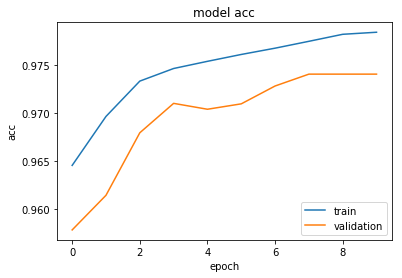

In [45]:
def plot_train(hist):
    h = hist.history
    if 'acc' in h:
        meas='acc'
        loc='lower right'
    else:
        meas='loss'
        loc='upper right'
    plt.plot(hist.history[meas])
    plt.plot(hist.history['val_'+meas])
    plt.title('model '+meas)
    plt.ylabel(meas)
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc=loc)


plot_train(history_1)


In [49]:
from keras.models import load_model

model_1.save('E:\Deep Learning Developer\Wk1 beginning 25 Sep 17\class_of_sums_w_6digits_model_1.h5') 
# del model  # deletes the existing model


### What do I need to do to degrade accuracy of predictions?



In [50]:
# To discard certain numbers and retain only remaining elements in both X and y
discard_nums_more = [17, 25, 37,  50, 78, 100, 111, 131, 157,  176, 188, 198]

X_train2 = X_train[np.isin(y_train, discard_nums_more, invert=True)]  # Default for invert = False
y_train2 = y_train[np.isin(y_train, discard_nums_more, invert=True)]  

In [52]:
# To confirm discards have been removed from label lists
print('Unique labels after discarding from y_train2: ', np.unique(y_train2))
print('length of unique labels in y_train2:', len(np.unique(y_train2)))

print('length of y_train before discards:', len(y_train))
print('length of y_train2 after discards: ', len(y_train2))
print('Total no. of cases discarded: ', len(y_train) - len(y_train2))
print('Prop of cases discarded from full training set: ', (len(y_train) - len(y_train2))/ len(y_train))

print('length of X_train2 after discards: ', len(X_train2))



Unique labels after discarding from y_train2:  [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  18
  19  20  21  22  23  24  26  27  28  29  30  31  32  33  34  35  36  38
  39  40  41  42  43  44  45  46  47  48  49  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94
  95  96  97  98  99 101 102 103 104 105 106 107 108 109 110 112 113 114
 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 132 133
 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151
 152 153 154 155 156 158 159 160 161 162 163 164 165 166 167 168 169 170
 171 172 173 174 175 177 178 179 180 181 182 183 184 185 186 187 189 190
 191 192 193 194 195 196 197 199 200]
length of unique labels in y_train2: 189
length of y_train before discards: 600000
length of y_train2 after discards:  566989
Total no. of cases discarded:  33011
Prop of cases discarde

I am removing about 5% of training observations.  Equal mix of odd-even trebles ie., 6 odds and 6 even numbers are discarded from training label set.

In [54]:
len(np.unique(y_train2))
import numpy as np
for num, label in enumerate(np.unique(y_train2), start=0):
    print("y_train2 {}: {}".format(num, label))



y_train2 0: 0
y_train2 1: 1
y_train2 2: 2
y_train2 3: 3
y_train2 4: 4
y_train2 5: 5
y_train2 6: 6
y_train2 7: 7
y_train2 8: 8
y_train2 9: 9
y_train2 10: 10
y_train2 11: 11
y_train2 12: 12
y_train2 13: 13
y_train2 14: 14
y_train2 15: 15
y_train2 16: 16
y_train2 17: 18
y_train2 18: 19
y_train2 19: 20
y_train2 20: 21
y_train2 21: 22
y_train2 22: 23
y_train2 23: 24
y_train2 24: 26
y_train2 25: 27
y_train2 26: 28
y_train2 27: 29
y_train2 28: 30
y_train2 29: 31
y_train2 30: 32
y_train2 31: 33
y_train2 32: 34
y_train2 33: 35
y_train2 34: 36
y_train2 35: 38
y_train2 36: 39
y_train2 37: 40
y_train2 38: 41
y_train2 39: 42
y_train2 40: 43
y_train2 41: 44
y_train2 42: 45
y_train2 43: 46
y_train2 44: 47
y_train2 45: 48
y_train2 46: 49
y_train2 47: 51
y_train2 48: 52
y_train2 49: 53
y_train2 50: 54
y_train2 51: 55
y_train2 52: 56
y_train2 53: 57
y_train2 54: 58
y_train2 55: 59
y_train2 56: 60
y_train2 57: 61
y_train2 58: 62
y_train2 59: 63
y_train2 60: 64
y_train2 61: 65
y_train2 62: 66
y_train2 63:

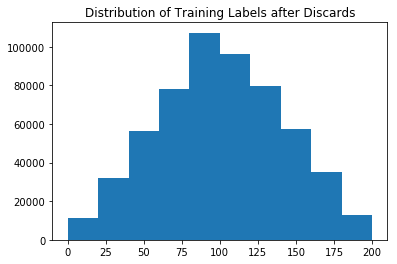

In [56]:
plt.hist(y_train2)
plt.title('Distribution of Training Labels after Discards')

In [58]:
# To encode the reduced training label 
n_classes_model2 = 189
# convert class vectors to binary One Hot Encoded
y_train_enc_2 = keras.utils.to_categorical(y_train2, n_classes_model2)



IndexError: index 190 is out of bounds for axis 1 with size 189

In [60]:
# To encode the reduced training label 
n_classes_model2 = 201
# convert class vectors to binary One Hot Encoded
y_train_enc_2 = keras.utils.to_categorical(y_train2, n_classes_model2)


In [69]:
# To instantiate the reduced model, as model_2
model_2 = Sequential()
model_2.add(Dense(n_hidden_1,  input_shape=(n_input,), name = "Dense_1"))
model_2.add(Activation('relu', name = "Relu1"))
model_2.add(Dense(n_hidden_2, name = "Dense_2"))
model_2.add(Activation('relu', name = "Relu2"))
model_2.add(Dense(n_classes, name = "Output"))
model_2.add(Activation('softmax', name = "Softmax_output"))

model_2.summary()



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Dense_1 (Dense)              (None, 24)                168       
_________________________________________________________________
Relu1 (Activation)           (None, 24)                0         
_________________________________________________________________
Dense_2 (Dense)              (None, 24)                600       
_________________________________________________________________
Relu2 (Activation)           (None, 24)                0         
_________________________________________________________________
Output (Dense)               (None, 201)               5025      
_________________________________________________________________
Softmax_output (Activation)  (None, 201)               0         
Total params: 5,793
Trainable params: 5,793
Non-trainable params: 0
_________________________________________________________________


In [71]:
model_2.compile(loss='categorical_crossentropy',
              optimizer= 'rmsprop',
              metrics=['accuracy'])


In [73]:
history_2 = model_2.fit(X_train2, y_train_enc_2,
                    batch_size=batch_size,
                    epochs=training_epochs,
                    verbose=1,
                    validation_data=(X_test, y_test_enc))




Train on 566989 samples, validate on 100000 samples
Epoch 1/10
   100/566989 [..............................] - ETA: 295s - loss: 2.4174 - acc: 0.2800

   600/566989 [..............................] - ETA: 96s - loss: 2.2659 - acc: 0.2667 

  1100/566989 [..............................] - ETA: 81s - loss: 2.2832 - acc: 0.2700

  1700/566989 [..............................] - ETA: 70s - loss: 2.2687 - acc: 0.2806

  2300/566989 [..............................] - ETA: 65s - loss: 2.2899 - acc: 0.2878

  2900/566989 [..............................] - ETA: 66s - loss: 2.2532 - acc: 0.2872

  3200/566989 [..............................] - ETA: 69s - loss: 2.2734 - acc: 0.2806

  3700/566989 [..............................] - ETA: 67s - loss: 2.2791 - acc: 0.2803

  4300/566989 [..............................] - ETA: 65s - loss: 2.2826 - acc: 0.2830

  4900/566989 [..............................] - ETA: 63s - loss: 2.2972 - acc: 0.2855

  5500/566989 [..............................] - ETA: 61s - loss: 2.2973 - acc: 0.2862

  6100/566989 [..............................] - ETA: 60s - loss: 2.3069 - acc: 0.2861

  6700/566989 [..............................] - ETA: 59s - loss: 2.3069 - acc: 0.2833

  7200/566989 [..............................] - ETA: 59s - loss: 2.2883 - acc: 0.2865

  7800/566989 [..............................] - ETA: 58s - loss: 2.2953 - acc: 0.2864

  8300/566989 [..............................] - ETA: 58s - loss: 2.3065 - acc: 0.2858

  8800/566989 [..............................] - ETA: 58s - loss: 2.3063 - acc: 0.2863

  9400/566989 [..............................] - ETA: 58s - loss: 2.3025 - acc: 0.2854

 10000/566989 [..............................] - ETA: 57s - loss: 2.3046 - acc: 0.2856

 10600/566989 [..............................] - ETA: 57s - loss: 2.3018 - acc: 0.2865

 11200/566989 [..............................] - ETA: 56s - loss: 2.2996 - acc: 0.2860

 11800/566989 [..............................] - ETA: 56s - loss: 2.3059 - acc: 0.2879

 12400/566989 [..............................] - ETA: 56s - loss: 2.3037 - acc: 0.2869

 13000/566989 [..............................] - ETA: 55s - loss: 2.3064 - acc: 0.2854

 13600/566989 [..............................] - ETA: 55s - loss: 2.3074 - acc: 0.2865



 14200/566989 [..............................] - ETA: 55s - loss: 2.3108 - acc: 0.2868



 14800/566989 [..............................] - ETA: 54s - loss: 2.3148 - acc: 0.2870

 15400/566989 [..............................] - ETA: 54s - loss: 2.3141 - acc: 0.2871

 16100/566989 [..............................] - ETA: 53s - loss: 2.3077 - acc: 0.2880

 16700/566989 [..............................] - ETA: 53s - loss: 2.3050 - acc: 0.2877

 17400/566989 [..............................] - ETA: 53s - loss: 2.3064 - acc: 0.2881

 18100/566989 [..............................] - ETA: 52s - loss: 2.3026 - acc: 0.2875

 18800/566989 [..............................] - ETA: 52s - loss: 2.3001 - acc: 0.2870

 19500/566989 [>.............................] - ETA: 52s - loss: 2.3016 - acc: 0.2863

 20200/566989 [>.............................] - ETA: 51s - loss: 2.2996 - acc: 0.2871

 20800/566989 [>.............................] - ETA: 51s - loss: 2.3010 - acc: 0.2870

 21500/566989 [>.............................] - ETA: 51s - loss: 2.3047 - acc: 0.2864

 22200/566989 [>.............................] - ETA: 50s - loss: 2.3002 - acc: 0.2867

 22900/566989 [>.............................] - ETA: 50s - loss: 2.3009 - acc: 0.2869

 23600/566989 [>.............................] - ETA: 50s - loss: 2.2990 - acc: 0.2881

 24300/566989 [>.............................] - ETA: 50s - loss: 2.2963 - acc: 0.2887

 25000/566989 [>.............................] - ETA: 49s - loss: 2.2969 - acc: 0.2882

 25700/566989 [>.............................] - ETA: 49s - loss: 2.2939 - acc: 0.2888

 26400/566989 [>.............................] - ETA: 49s - loss: 2.2909 - acc: 0.2884

 27000/566989 [>.............................] - ETA: 49s - loss: 2.2923 - acc: 0.2885

 27500/566989 [>.............................] - ETA: 49s - loss: 2.2918 - acc: 0.2888

 28100/566989 [>.............................] - ETA: 49s - loss: 2.2931 - acc: 0.2887



 28700/566989 [>.............................] - ETA: 49s - loss: 2.2931 - acc: 0.2885

 29400/566989 [>.............................] - ETA: 48s - loss: 2.2942 - acc: 0.2885

 30100/566989 [>.............................] - ETA: 48s - loss: 2.2920 - acc: 0.2887



 30900/566989 [>.............................] - ETA: 48s - loss: 2.2931 - acc: 0.2885

 31600/566989 [>.............................] - ETA: 47s - loss: 2.2955 - acc: 0.2884

 32300/566989 [>.............................] - ETA: 47s - loss: 2.2969 - acc: 0.2880

 33000/566989 [>.............................] - ETA: 47s - loss: 2.3005 - acc: 0.2876

 33700/566989 [>.............................] - ETA: 47s - loss: 2.2999 - acc: 0.2872



 34400/566989 [>.............................] - ETA: 47s - loss: 2.3011 - acc: 0.2871

 35100/566989 [>.............................] - ETA: 46s - loss: 2.3001 - acc: 0.2869

 35700/566989 [>.............................] - ETA: 46s - loss: 2.3008 - acc: 0.2866

 36400/566989 [>.............................] - ETA: 46s - loss: 2.3016 - acc: 0.2864

 37100/566989 [>.............................] - ETA: 46s - loss: 2.2999 - acc: 0.2864

 37800/566989 [=>............................] - ETA: 46s - loss: 2.3009 - acc: 0.2866

 38500/566989 [=>............................] - ETA: 46s - loss: 2.3005 - acc: 0.2865

 39200/566989 [=>............................] - ETA: 45s - loss: 2.3002 - acc: 0.2866

 39900/566989 [=>............................] - ETA: 45s - loss: 2.3000 - acc: 0.2867

 40600/566989 [=>............................] - ETA: 45s - loss: 2.3009 - acc: 0.2870

 41200/566989 [=>............................] - ETA: 45s - loss: 2.3019 - acc: 0.2868

 41900/566989 [=>............................] - ETA: 45s - loss: 2.3025 - acc: 0.2873

 42500/566989 [=>............................] - ETA: 45s - loss: 2.3014 - acc: 0.2873

 43100/566989 [=>............................] - ETA: 45s - loss: 2.3016 - acc: 0.2870



 43700/566989 [=>............................] - ETA: 45s - loss: 2.3018 - acc: 0.2868

 44300/566989 [=>............................] - ETA: 45s - loss: 2.3012 - acc: 0.2871

 45000/566989 [=>............................] - ETA: 45s - loss: 2.3036 - acc: 0.2869

 45700/566989 [=>............................] - ETA: 44s - loss: 2.3032 - acc: 0.2867

 46300/566989 [=>............................] - ETA: 44s - loss: 2.3027 - acc: 0.2868

 47000/566989 [=>............................] - ETA: 44s - loss: 2.3026 - acc: 0.2869

 47600/566989 [=>............................] - ETA: 44s - loss: 2.3046 - acc: 0.2869

 48200/566989 [=>............................] - ETA: 44s - loss: 2.3045 - acc: 0.2869

 48900/566989 [=>............................] - ETA: 44s - loss: 2.3046 - acc: 0.2869

 49500/566989 [=>............................] - ETA: 44s - loss: 2.3042 - acc: 0.2871

 50100/566989 [=>............................] - ETA: 44s - loss: 2.3044 - acc: 0.2871

 50800/566989 [=>............................] - ETA: 44s - loss: 2.3064 - acc: 0.2872

 51500/566989 [=>............................] - ETA: 44s - loss: 2.3050 - acc: 0.2875

 52200/566989 [=>............................] - ETA: 44s - loss: 2.3050 - acc: 0.2878

 52900/566989 [=>............................] - ETA: 44s - loss: 2.3064 - acc: 0.2875

 53600/566989 [=>............................] - ETA: 43s - loss: 2.3087 - acc: 0.2876

 54200/566989 [=>............................] - ETA: 43s - loss: 2.3079 - acc: 0.2877

 54900/566989 [=>............................] - ETA: 43s - loss: 2.3079 - acc: 0.2875

 55600/566989 [=>............................] - ETA: 43s - loss: 2.3091 - acc: 0.2872

 56300/566989 [=>............................] - ETA: 43s - loss: 2.3088 - acc: 0.2871

 56900/566989 [==>...........................] - ETA: 43s - loss: 2.3086 - acc: 0.2870

 57500/566989 [==>...........................] - ETA: 43s - loss: 2.3097 - acc: 0.2870

 58100/566989 [==>...........................] - ETA: 43s - loss: 2.3112 - acc: 0.2871



 58800/566989 [==>...........................] - ETA: 43s - loss: 2.3100 - acc: 0.2878

 59500/566989 [==>...........................] - ETA: 43s - loss: 2.3096 - acc: 0.2879

 60200/566989 [==>...........................] - ETA: 43s - loss: 2.3099 - acc: 0.2875

 60900/566989 [==>...........................] - ETA: 43s - loss: 2.3096 - acc: 0.2871

 61500/566989 [==>...........................] - ETA: 42s - loss: 2.3103 - acc: 0.2873

 62200/566989 [==>...........................] - ETA: 42s - loss: 2.3092 - acc: 0.2875

 62900/566989 [==>...........................] - ETA: 42s - loss: 2.3096 - acc: 0.2875

 63500/566989 [==>...........................] - ETA: 42s - loss: 2.3098 - acc: 0.2874

 64200/566989 [==>...........................] - ETA: 42s - loss: 2.3095 - acc: 0.2875

 64900/566989 [==>...........................] - ETA: 42s - loss: 2.3102 - acc: 0.2878

 65600/566989 [==>...........................] - ETA: 42s - loss: 2.3091 - acc: 0.2876

 66300/566989 [==>...........................] - ETA: 42s - loss: 2.3092 - acc: 0.2874

 67000/566989 [==>...........................] - ETA: 42s - loss: 2.3095 - acc: 0.2876

 67800/566989 [==>...........................] - ETA: 42s - loss: 2.3085 - acc: 0.2874

 68600/566989 [==>...........................] - ETA: 41s - loss: 2.3086 - acc: 0.2873

 69300/566989 [==>...........................] - ETA: 41s - loss: 2.3075 - acc: 0.2872

 70100/566989 [==>...........................] - ETA: 41s - loss: 2.3074 - acc: 0.2875

 70800/566989 [==>...........................] - ETA: 41s - loss: 2.3069 - acc: 0.2874

 71500/566989 [==>...........................] - ETA: 41s - loss: 2.3071 - acc: 0.2873

 72200/566989 [==>...........................] - ETA: 41s - loss: 2.3064 - acc: 0.2873

 72900/566989 [==>...........................] - ETA: 41s - loss: 2.3058 - acc: 0.2874

 73700/566989 [==>...........................] - ETA: 41s - loss: 2.3055 - acc: 0.2874

 74400/566989 [==>...........................] - ETA: 41s - loss: 2.3055 - acc: 0.2878

 75100/566989 [==>...........................] - ETA: 40s - loss: 2.3061 - acc: 0.2877

 75800/566989 [===>..........................] - ETA: 40s - loss: 2.3048 - acc: 0.2877

 76500/566989 [===>..........................] - ETA: 40s - loss: 2.3052 - acc: 0.2878

 77100/566989 [===>..........................] - ETA: 40s - loss: 2.3044 - acc: 0.2878

 77700/566989 [===>..........................] - ETA: 40s - loss: 2.3053 - acc: 0.2877

 78300/566989 [===>..........................] - ETA: 40s - loss: 2.3050 - acc: 0.2878

 78800/566989 [===>..........................] - ETA: 40s - loss: 2.3037 - acc: 0.2879

 79500/566989 [===>..........................] - ETA: 40s - loss: 2.3036 - acc: 0.2880

 80100/566989 [===>..........................] - ETA: 40s - loss: 2.3039 - acc: 0.2880

 80800/566989 [===>..........................] - ETA: 40s - loss: 2.3051 - acc: 0.2878

 81400/566989 [===>..........................] - ETA: 40s - loss: 2.3045 - acc: 0.2878



 82000/566989 [===>..........................] - ETA: 40s - loss: 2.3042 - acc: 0.2878

 82600/566989 [===>..........................] - ETA: 40s - loss: 2.3034 - acc: 0.2878

 83300/566989 [===>..........................] - ETA: 40s - loss: 2.3034 - acc: 0.2876



 83900/566989 [===>..........................] - ETA: 40s - loss: 2.3038 - acc: 0.2875

 84500/566989 [===>..........................] - ETA: 40s - loss: 2.3037 - acc: 0.2876

 85200/566989 [===>..........................] - ETA: 40s - loss: 2.3040 - acc: 0.2874

 85800/566989 [===>..........................] - ETA: 40s - loss: 2.3047 - acc: 0.2875

 86500/566989 [===>..........................] - ETA: 40s - loss: 2.3047 - acc: 0.2873

 87200/566989 [===>..........................] - ETA: 39s - loss: 2.3046 - acc: 0.2872

 87900/566989 [===>..........................] - ETA: 39s - loss: 2.3039 - acc: 0.2873

 88500/566989 [===>..........................] - ETA: 39s - loss: 2.3049 - acc: 0.2872

 89100/566989 [===>..........................] - ETA: 39s - loss: 2.3046 - acc: 0.2873

 89700/566989 [===>..........................] - ETA: 39s - loss: 2.3047 - acc: 0.2872

 90400/566989 [===>..........................] - ETA: 39s - loss: 2.3047 - acc: 0.2872

 91000/566989 [===>..........................] - ETA: 39s - loss: 2.3043 - acc: 0.2873

 91600/566989 [===>..........................] - ETA: 39s - loss: 2.3035 - acc: 0.2873

 92200/566989 [===>..........................] - ETA: 39s - loss: 2.3040 - acc: 0.2871

 92800/566989 [===>..........................] - ETA: 39s - loss: 2.3042 - acc: 0.2870

 93400/566989 [===>..........................] - ETA: 39s - loss: 2.3037 - acc: 0.2872

 94100/566989 [===>..........................] - ETA: 39s - loss: 2.3037 - acc: 0.2870



 94700/566989 [====>.........................] - ETA: 39s - loss: 2.3035 - acc: 0.2871

 95300/566989 [====>.........................] - ETA: 39s - loss: 2.3032 - acc: 0.2874

 96000/566989 [====>.........................] - ETA: 39s - loss: 2.3028 - acc: 0.2875

 96600/566989 [====>.........................] - ETA: 39s - loss: 2.3024 - acc: 0.2874

 97200/566989 [====>.........................] - ETA: 39s - loss: 2.3017 - acc: 0.2874

 97800/566989 [====>.........................] - ETA: 39s - loss: 2.3016 - acc: 0.2875

 98400/566989 [====>.........................] - ETA: 39s - loss: 2.3019 - acc: 0.2876

 99000/566989 [====>.........................] - ETA: 39s - loss: 2.3016 - acc: 0.2877

 99700/566989 [====>.........................] - ETA: 39s - loss: 2.3019 - acc: 0.2874

100300/566989 [====>.........................] - ETA: 39s - loss: 2.3032 - acc: 0.2874

100900/566989 [====>.........................] - ETA: 38s - loss: 2.3028 - acc: 0.2875

101500/566989 [====>.........................] - ETA: 38s - loss: 2.3027 - acc: 0.2875

102200/566989 [====>.........................] - ETA: 38s - loss: 2.3015 - acc: 0.2875

102800/566989 [====>.........................] - ETA: 38s - loss: 2.3024 - acc: 0.2875

103500/566989 [====>.........................] - ETA: 38s - loss: 2.3016 - acc: 0.2873

104200/566989 [====>.........................] - ETA: 38s - loss: 2.3017 - acc: 0.2874

104900/566989 [====>.........................] - ETA: 38s - loss: 2.3021 - acc: 0.2874

105600/566989 [====>.........................] - ETA: 38s - loss: 2.3021 - acc: 0.2875

106300/566989 [====>.........................] - ETA: 38s - loss: 2.3020 - acc: 0.2875

106900/566989 [====>.........................] - ETA: 38s - loss: 2.3020 - acc: 0.2876

107500/566989 [====>.........................] - ETA: 38s - loss: 2.3023 - acc: 0.2875

108200/566989 [====>.........................] - ETA: 38s - loss: 2.3032 - acc: 0.2876

108800/566989 [====>.........................] - ETA: 38s - loss: 2.3040 - acc: 0.2876

109500/566989 [====>.........................] - ETA: 38s - loss: 2.3043 - acc: 0.2876

110200/566989 [====>.........................] - ETA: 38s - loss: 2.3056 - acc: 0.2875

110800/566989 [====>.........................] - ETA: 38s - loss: 2.3048 - acc: 0.2875

111500/566989 [====>.........................] - ETA: 38s - loss: 2.3039 - acc: 0.2876

112200/566989 [====>.........................] - ETA: 37s - loss: 2.3045 - acc: 0.2876

112800/566989 [====>.........................] - ETA: 37s - loss: 2.3053 - acc: 0.2874

113500/566989 [=====>........................] - ETA: 37s - loss: 2.3049 - acc: 0.2875

114200/566989 [=====>........................] - ETA: 37s - loss: 2.3045 - acc: 0.2874

114800/566989 [=====>........................] - ETA: 37s - loss: 2.3043 - acc: 0.2874

115400/566989 [=====>........................] - ETA: 37s - loss: 2.3049 - acc: 0.2873

116000/566989 [=====>........................] - ETA: 37s - loss: 2.3045 - acc: 0.2871

116700/566989 [=====>........................] - ETA: 37s - loss: 2.3042 - acc: 0.2871

117400/566989 [=====>........................] - ETA: 37s - loss: 2.3041 - acc: 0.2873

118000/566989 [=====>........................] - ETA: 37s - loss: 2.3046 - acc: 0.2871

118700/566989 [=====>........................] - ETA: 37s - loss: 2.3047 - acc: 0.2872

119400/566989 [=====>........................] - ETA: 37s - loss: 2.3054 - acc: 0.2873

120000/566989 [=====>........................] - ETA: 37s - loss: 2.3054 - acc: 0.2873

120700/566989 [=====>........................] - ETA: 37s - loss: 2.3055 - acc: 0.2871

121300/566989 [=====>........................] - ETA: 37s - loss: 2.3058 - acc: 0.2871

121900/566989 [=====>........................] - ETA: 37s - loss: 2.3064 - acc: 0.2870

122600/566989 [=====>........................] - ETA: 37s - loss: 2.3065 - acc: 0.2871

123300/566989 [=====>........................] - ETA: 36s - loss: 2.3065 - acc: 0.2870

123900/566989 [=====>........................] - ETA: 36s - loss: 2.3062 - acc: 0.2869

124600/566989 [=====>........................] - ETA: 36s - loss: 2.3067 - acc: 0.2869

125300/566989 [=====>........................] - ETA: 36s - loss: 2.3064 - acc: 0.2871

125900/566989 [=====>........................] - ETA: 36s - loss: 2.3061 - acc: 0.2872

126400/566989 [=====>........................] - ETA: 36s - loss: 2.3068 - acc: 0.2872

127000/566989 [=====>........................] - ETA: 36s - loss: 2.3064 - acc: 0.2871

127700/566989 [=====>........................] - ETA: 36s - loss: 2.3066 - acc: 0.2871

128400/566989 [=====>........................] - ETA: 36s - loss: 2.3072 - acc: 0.2870



129100/566989 [=====>........................] - ETA: 36s - loss: 2.3073 - acc: 0.2871

129800/566989 [=====>........................] - ETA: 36s - loss: 2.3070 - acc: 0.2870

130500/566989 [=====>........................] - ETA: 36s - loss: 2.3069 - acc: 0.2870

131200/566989 [=====>........................] - ETA: 36s - loss: 2.3067 - acc: 0.2870

131900/566989 [=====>........................] - ETA: 36s - loss: 2.3063 - acc: 0.2871

132600/566989 [======>.......................] - ETA: 36s - loss: 2.3057 - acc: 0.2872

133200/566989 [======>.......................] - ETA: 36s - loss: 2.3049 - acc: 0.2874

133900/566989 [======>.......................] - ETA: 35s - loss: 2.3045 - acc: 0.2872



134500/566989 [======>.......................] - ETA: 35s - loss: 2.3041 - acc: 0.2874

135100/566989 [======>.......................] - ETA: 35s - loss: 2.3045 - acc: 0.2874

135800/566989 [======>.......................] - ETA: 35s - loss: 2.3047 - acc: 0.2874

136400/566989 [======>.......................] - ETA: 35s - loss: 2.3047 - acc: 0.2875

137100/566989 [======>.......................] - ETA: 35s - loss: 2.3050 - acc: 0.2874

137700/566989 [======>.......................] - ETA: 35s - loss: 2.3048 - acc: 0.2873

138300/566989 [======>.......................] - ETA: 35s - loss: 2.3051 - acc: 0.2872

138900/566989 [======>.......................] - ETA: 35s - loss: 2.3051 - acc: 0.2872

139500/566989 [======>.......................] - ETA: 35s - loss: 2.3051 - acc: 0.2872

140100/566989 [======>.......................] - ETA: 35s - loss: 2.3053 - acc: 0.2872

140700/566989 [======>.......................] - ETA: 35s - loss: 2.3053 - acc: 0.2873

141300/566989 [======>.......................] - ETA: 35s - loss: 2.3052 - acc: 0.2873

141900/566989 [======>.......................] - ETA: 35s - loss: 2.3052 - acc: 0.2873

142500/566989 [======>.......................] - ETA: 35s - loss: 2.3044 - acc: 0.2872

143000/566989 [======>.......................] - ETA: 35s - loss: 2.3048 - acc: 0.2872

143600/566989 [======>.......................] - ETA: 35s - loss: 2.3043 - acc: 0.2873

144200/566989 [======>.......................] - ETA: 35s - loss: 2.3043 - acc: 0.2874

144800/566989 [======>.......................] - ETA: 35s - loss: 2.3048 - acc: 0.2874

145400/566989 [======>.......................] - ETA: 35s - loss: 2.3050 - acc: 0.2872

146000/566989 [======>.......................] - ETA: 35s - loss: 2.3055 - acc: 0.2873

146700/566989 [======>.......................] - ETA: 35s - loss: 2.3058 - acc: 0.2871

147300/566989 [======>.......................] - ETA: 35s - loss: 2.3055 - acc: 0.2871

147900/566989 [======>.......................] - ETA: 34s - loss: 2.3051 - acc: 0.2870



148600/566989 [======>.......................] - ETA: 34s - loss: 2.3055 - acc: 0.2868

149200/566989 [======>.......................] - ETA: 34s - loss: 2.3054 - acc: 0.2869

149900/566989 [======>.......................] - ETA: 34s - loss: 2.3059 - acc: 0.2868

150500/566989 [======>.......................] - ETA: 34s - loss: 2.3055 - acc: 0.2868

151200/566989 [=======>......................] - ETA: 34s - loss: 2.3052 - acc: 0.2868

151900/566989 [=======>......................] - ETA: 34s - loss: 2.3055 - acc: 0.2867

152500/566989 [=======>......................] - ETA: 34s - loss: 2.3057 - acc: 0.2866



153100/566989 [=======>......................] - ETA: 34s - loss: 2.3050 - acc: 0.2866



153800/566989 [=======>......................] - ETA: 34s - loss: 2.3052 - acc: 0.2866

154400/566989 [=======>......................] - ETA: 34s - loss: 2.3052 - acc: 0.2867



155000/566989 [=======>......................] - ETA: 34s - loss: 2.3045 - acc: 0.2866

155600/566989 [=======>......................] - ETA: 34s - loss: 2.3042 - acc: 0.2867

156300/566989 [=======>......................] - ETA: 34s - loss: 2.3042 - acc: 0.2867

156900/566989 [=======>......................] - ETA: 34s - loss: 2.3043 - acc: 0.2867

157600/566989 [=======>......................] - ETA: 34s - loss: 2.3039 - acc: 0.2867

158300/566989 [=======>......................] - ETA: 34s - loss: 2.3043 - acc: 0.2867

159000/566989 [=======>......................] - ETA: 34s - loss: 2.3044 - acc: 0.2867

159700/566989 [=======>......................] - ETA: 33s - loss: 2.3044 - acc: 0.2868

160400/566989 [=======>......................] - ETA: 33s - loss: 2.3045 - acc: 0.2868

161000/566989 [=======>......................] - ETA: 33s - loss: 2.3048 - acc: 0.2867

161700/566989 [=======>......................] - ETA: 33s - loss: 2.3047 - acc: 0.2867

162300/566989 [=======>......................] - ETA: 33s - loss: 2.3050 - acc: 0.2868



162900/566989 [=======>......................] - ETA: 33s - loss: 2.3054 - acc: 0.2869

163600/566989 [=======>......................] - ETA: 33s - loss: 2.3058 - acc: 0.2868

164400/566989 [=======>......................] - ETA: 33s - loss: 2.3054 - acc: 0.2869

165100/566989 [=======>......................] - ETA: 33s - loss: 2.3051 - acc: 0.2870

165800/566989 [=======>......................] - ETA: 33s - loss: 2.3056 - acc: 0.2870

166500/566989 [=======>......................] - ETA: 33s - loss: 2.3053 - acc: 0.2869

167200/566989 [=======>......................] - ETA: 33s - loss: 2.3045 - acc: 0.2870

167900/566989 [=======>......................] - ETA: 33s - loss: 2.3047 - acc: 0.2871

168600/566989 [=======>......................] - ETA: 33s - loss: 2.3044 - acc: 0.2872

169300/566989 [=======>......................] - ETA: 32s - loss: 2.3039 - acc: 0.2872

170000/566989 [=======>......................] - ETA: 32s - loss: 2.3043 - acc: 0.2872



170700/566989 [========>.....................] - ETA: 32s - loss: 2.3043 - acc: 0.2871

171300/566989 [========>.....................] - ETA: 32s - loss: 2.3041 - acc: 0.2873

172000/566989 [========>.....................] - ETA: 32s - loss: 2.3046 - acc: 0.2872

172700/566989 [========>.....................] - ETA: 32s - loss: 2.3050 - acc: 0.2872

173400/566989 [========>.....................] - ETA: 32s - loss: 2.3046 - acc: 0.2872

174100/566989 [========>.....................] - ETA: 32s - loss: 2.3047 - acc: 0.2871

174800/566989 [========>.....................] - ETA: 32s - loss: 2.3044 - acc: 0.2871

175400/566989 [========>.....................] - ETA: 32s - loss: 2.3046 - acc: 0.2870

176000/566989 [========>.....................] - ETA: 32s - loss: 2.3046 - acc: 0.2870

176700/566989 [========>.....................] - ETA: 32s - loss: 2.3044 - acc: 0.2870

177300/566989 [========>.....................] - ETA: 32s - loss: 2.3044 - acc: 0.2871

178000/566989 [========>.....................] - ETA: 32s - loss: 2.3046 - acc: 0.2870

178700/566989 [========>.....................] - ETA: 32s - loss: 2.3050 - acc: 0.2870

179300/566989 [========>.....................] - ETA: 32s - loss: 2.3052 - acc: 0.2869

180000/566989 [========>.....................] - ETA: 32s - loss: 2.3053 - acc: 0.2869

180700/566989 [========>.....................] - ETA: 31s - loss: 2.3055 - acc: 0.2869

181300/566989 [========>.....................] - ETA: 31s - loss: 2.3061 - acc: 0.2868

182000/566989 [========>.....................] - ETA: 31s - loss: 2.3061 - acc: 0.2867

182600/566989 [========>.....................] - ETA: 31s - loss: 2.3064 - acc: 0.2867

183300/566989 [========>.....................] - ETA: 31s - loss: 2.3061 - acc: 0.2866

183900/566989 [========>.....................] - ETA: 31s - loss: 2.3063 - acc: 0.2867

184600/566989 [========>.....................] - ETA: 31s - loss: 2.3059 - acc: 0.2867

185300/566989 [========>.....................] - ETA: 31s - loss: 2.3056 - acc: 0.2866

185900/566989 [========>.....................] - ETA: 31s - loss: 2.3056 - acc: 0.2867

186500/566989 [========>.....................] - ETA: 31s - loss: 2.3058 - acc: 0.2867

187100/566989 [========>.....................] - ETA: 31s - loss: 2.3057 - acc: 0.2867

187800/566989 [========>.....................] - ETA: 31s - loss: 2.3056 - acc: 0.2868

188400/566989 [========>.....................] - ETA: 31s - loss: 2.3052 - acc: 0.2868

189000/566989 [=========>....................] - ETA: 31s - loss: 2.3055 - acc: 0.2868

189600/566989 [=========>....................] - ETA: 31s - loss: 2.3050 - acc: 0.2869

190300/566989 [=========>....................] - ETA: 31s - loss: 2.3051 - acc: 0.2868

190900/566989 [=========>....................] - ETA: 31s - loss: 2.3050 - acc: 0.2869

191500/566989 [=========>....................] - ETA: 31s - loss: 2.3055 - acc: 0.2868

192100/566989 [=========>....................] - ETA: 31s - loss: 2.3057 - acc: 0.2868

192700/566989 [=========>....................] - ETA: 31s - loss: 2.3057 - acc: 0.2868

193300/566989 [=========>....................] - ETA: 30s - loss: 2.3060 - acc: 0.2868

193800/566989 [=========>....................] - ETA: 30s - loss: 2.3059 - acc: 0.2867



194300/566989 [=========>....................] - ETA: 30s - loss: 2.3061 - acc: 0.2867

194900/566989 [=========>....................] - ETA: 30s - loss: 2.3060 - acc: 0.2867

195500/566989 [=========>....................] - ETA: 30s - loss: 2.3063 - acc: 0.2868



196000/566989 [=========>....................] - ETA: 30s - loss: 2.3063 - acc: 0.2868

196500/566989 [=========>....................] - ETA: 30s - loss: 2.3059 - acc: 0.2869

197100/566989 [=========>....................] - ETA: 30s - loss: 2.3055 - acc: 0.2870

197700/566989 [=========>....................] - ETA: 30s - loss: 2.3055 - acc: 0.2870

198300/566989 [=========>....................] - ETA: 30s - loss: 2.3052 - acc: 0.2869

198900/566989 [=========>....................] - ETA: 30s - loss: 2.3055 - acc: 0.2869

199500/566989 [=========>....................] - ETA: 30s - loss: 2.3051 - acc: 0.2869

200100/566989 [=========>....................] - ETA: 30s - loss: 2.3050 - acc: 0.2870

200600/566989 [=========>....................] - ETA: 30s - loss: 2.3052 - acc: 0.2870

201200/566989 [=========>....................] - ETA: 30s - loss: 2.3053 - acc: 0.2871

201800/566989 [=========>....................] - ETA: 30s - loss: 2.3053 - acc: 0.2870

202400/566989 [=========>....................] - ETA: 30s - loss: 2.3055 - acc: 0.2870

203100/566989 [=========>....................] - ETA: 30s - loss: 2.3052 - acc: 0.2870

203600/566989 [=========>....................] - ETA: 30s - loss: 2.3054 - acc: 0.2870

204200/566989 [=========>....................] - ETA: 30s - loss: 2.3053 - acc: 0.2871

204800/566989 [=========>....................] - ETA: 30s - loss: 2.3052 - acc: 0.2871

205400/566989 [=========>....................] - ETA: 30s - loss: 2.3055 - acc: 0.2870

206100/566989 [=========>....................] - ETA: 30s - loss: 2.3051 - acc: 0.2871

206700/566989 [=========>....................] - ETA: 30s - loss: 2.3050 - acc: 0.2871

207300/566989 [=========>....................] - ETA: 30s - loss: 2.3053 - acc: 0.2871

207900/566989 [==========>...................] - ETA: 29s - loss: 2.3049 - acc: 0.2870

208400/566989 [==========>...................] - ETA: 29s - loss: 2.3049 - acc: 0.2870

209000/566989 [==========>...................] - ETA: 29s - loss: 2.3048 - acc: 0.2871

209700/566989 [==========>...................] - ETA: 29s - loss: 2.3048 - acc: 0.2870

210300/566989 [==========>...................] - ETA: 29s - loss: 2.3046 - acc: 0.2871

210900/566989 [==========>...................] - ETA: 29s - loss: 2.3045 - acc: 0.2872

211500/566989 [==========>...................] - ETA: 29s - loss: 2.3046 - acc: 0.2872

212100/566989 [==========>...................] - ETA: 29s - loss: 2.3048 - acc: 0.2872

212800/566989 [==========>...................] - ETA: 29s - loss: 2.3046 - acc: 0.2872



213400/566989 [==========>...................] - ETA: 29s - loss: 2.3042 - acc: 0.2872

214000/566989 [==========>...................] - ETA: 29s - loss: 2.3043 - acc: 0.2871

214600/566989 [==========>...................] - ETA: 29s - loss: 2.3040 - acc: 0.2872

215200/566989 [==========>...................] - ETA: 29s - loss: 2.3038 - acc: 0.2871

215800/566989 [==========>...................] - ETA: 29s - loss: 2.3039 - acc: 0.2872

216400/566989 [==========>...................] - ETA: 29s - loss: 2.3039 - acc: 0.2872

217000/566989 [==========>...................] - ETA: 29s - loss: 2.3040 - acc: 0.2872

217600/566989 [==========>...................] - ETA: 29s - loss: 2.3038 - acc: 0.2872

218200/566989 [==========>...................] - ETA: 29s - loss: 2.3040 - acc: 0.2872

218900/566989 [==========>...................] - ETA: 29s - loss: 2.3039 - acc: 0.2872

219500/566989 [==========>...................] - ETA: 29s - loss: 2.3038 - acc: 0.2873

220100/566989 [==========>...................] - ETA: 29s - loss: 2.3035 - acc: 0.2874

220700/566989 [==========>...................] - ETA: 29s - loss: 2.3032 - acc: 0.2874

221300/566989 [==========>...................] - ETA: 28s - loss: 2.3034 - acc: 0.2874

222000/566989 [==========>...................] - ETA: 28s - loss: 2.3034 - acc: 0.2874

222700/566989 [==========>...................] - ETA: 28s - loss: 2.3039 - acc: 0.2873

223300/566989 [==========>...................] - ETA: 28s - loss: 2.3035 - acc: 0.2874

223900/566989 [==========>...................] - ETA: 28s - loss: 2.3034 - acc: 0.2874

224500/566989 [==========>...................] - ETA: 28s - loss: 2.3036 - acc: 0.2875

225100/566989 [==========>...................] - ETA: 28s - loss: 2.3039 - acc: 0.2874

225500/566989 [==========>...................] - ETA: 28s - loss: 2.3035 - acc: 0.2875

226000/566989 [==========>...................] - ETA: 28s - loss: 2.3035 - acc: 0.2875

226600/566989 [==========>...................] - ETA: 28s - loss: 2.3034 - acc: 0.2874

227200/566989 [===========>..................] - ETA: 28s - loss: 2.3035 - acc: 0.2874

227900/566989 [===========>..................] - ETA: 28s - loss: 2.3039 - acc: 0.2874



228600/566989 [===========>..................] - ETA: 28s - loss: 2.3043 - acc: 0.2874

229200/566989 [===========>..................] - ETA: 28s - loss: 2.3040 - acc: 0.2874

229800/566989 [===========>..................] - ETA: 28s - loss: 2.3040 - acc: 0.2875

230400/566989 [===========>..................] - ETA: 28s - loss: 2.3036 - acc: 0.2876

231000/566989 [===========>..................] - ETA: 28s - loss: 2.3036 - acc: 0.2876

231600/566989 [===========>..................] - ETA: 28s - loss: 2.3040 - acc: 0.2877



232200/566989 [===========>..................] - ETA: 28s - loss: 2.3035 - acc: 0.2876



232800/566989 [===========>..................] - ETA: 28s - loss: 2.3038 - acc: 0.2876

233500/566989 [===========>..................] - ETA: 27s - loss: 2.3034 - acc: 0.2875

234100/566989 [===========>..................] - ETA: 27s - loss: 2.3032 - acc: 0.2875

234700/566989 [===========>..................] - ETA: 27s - loss: 2.3030 - acc: 0.2875

235300/566989 [===========>..................] - ETA: 27s - loss: 2.3033 - acc: 0.2875

236000/566989 [===========>..................] - ETA: 27s - loss: 2.3037 - acc: 0.2875

236600/566989 [===========>..................] - ETA: 27s - loss: 2.3038 - acc: 0.2874

237100/566989 [===========>..................] - ETA: 27s - loss: 2.3038 - acc: 0.2874

237700/566989 [===========>..................] - ETA: 27s - loss: 2.3038 - acc: 0.2874

238300/566989 [===========>..................] - ETA: 27s - loss: 2.3038 - acc: 0.2874

238900/566989 [===========>..................] - ETA: 27s - loss: 2.3040 - acc: 0.2874



239500/566989 [===========>..................] - ETA: 27s - loss: 2.3041 - acc: 0.2874

240100/566989 [===========>..................] - ETA: 27s - loss: 2.3043 - acc: 0.2875

240600/566989 [===========>..................] - ETA: 27s - loss: 2.3048 - acc: 0.2874

241200/566989 [===========>..................] - ETA: 27s - loss: 2.3045 - acc: 0.2874

241800/566989 [===========>..................] - ETA: 27s - loss: 2.3048 - acc: 0.2874



242400/566989 [===========>..................] - ETA: 27s - loss: 2.3051 - acc: 0.2874

243000/566989 [===========>..................] - ETA: 27s - loss: 2.3054 - acc: 0.2874



243600/566989 [===========>..................] - ETA: 27s - loss: 2.3054 - acc: 0.2874

244200/566989 [===========>..................] - ETA: 27s - loss: 2.3056 - acc: 0.2873

244800/566989 [===========>..................] - ETA: 27s - loss: 2.3061 - acc: 0.2873

245400/566989 [===========>..................] - ETA: 27s - loss: 2.3066 - acc: 0.2872

246100/566989 [============>.................] - ETA: 27s - loss: 2.3062 - acc: 0.2874

246800/566989 [============>.................] - ETA: 26s - loss: 2.3060 - acc: 0.2873

247400/566989 [============>.................] - ETA: 26s - loss: 2.3066 - acc: 0.2874

248000/566989 [============>.................] - ETA: 26s - loss: 2.3068 - acc: 0.2874

248600/566989 [============>.................] - ETA: 26s - loss: 2.3069 - acc: 0.2873

249200/566989 [============>.................] - ETA: 26s - loss: 2.3069 - acc: 0.2873

249900/566989 [============>.................] - ETA: 26s - loss: 2.3068 - acc: 0.2874

250600/566989 [============>.................] - ETA: 26s - loss: 2.3071 - acc: 0.2873

251300/566989 [============>.................] - ETA: 26s - loss: 2.3067 - acc: 0.2874

251900/566989 [============>.................] - ETA: 26s - loss: 2.3069 - acc: 0.2874

252600/566989 [============>.................] - ETA: 26s - loss: 2.3071 - acc: 0.2874

253200/566989 [============>.................] - ETA: 26s - loss: 2.3075 - acc: 0.2873

253900/566989 [============>.................] - ETA: 26s - loss: 2.3077 - acc: 0.2874

254500/566989 [============>.................] - ETA: 26s - loss: 2.3077 - acc: 0.2875

255300/566989 [============>.................] - ETA: 26s - loss: 2.3077 - acc: 0.2875

256000/566989 [============>.................] - ETA: 26s - loss: 2.3075 - acc: 0.2875

256700/566989 [============>.................] - ETA: 26s - loss: 2.3074 - acc: 0.2875

257500/566989 [============>.................] - ETA: 26s - loss: 2.3071 - acc: 0.2875

258200/566989 [============>.................] - ETA: 25s - loss: 2.3070 - acc: 0.2875

258800/566989 [============>.................] - ETA: 25s - loss: 2.3067 - acc: 0.2876

259500/566989 [============>.................] - ETA: 25s - loss: 2.3065 - acc: 0.2877

260100/566989 [============>.................] - ETA: 25s - loss: 2.3063 - acc: 0.2877

260800/566989 [============>.................] - ETA: 25s - loss: 2.3063 - acc: 0.2877

261500/566989 [============>.................] - ETA: 25s - loss: 2.3062 - acc: 0.2877

262100/566989 [============>.................] - ETA: 25s - loss: 2.3060 - acc: 0.2877

262700/566989 [============>.................] - ETA: 25s - loss: 2.3056 - acc: 0.2878

263400/566989 [============>.................] - ETA: 25s - loss: 2.3057 - acc: 0.2878

264000/566989 [============>.................] - ETA: 25s - loss: 2.3059 - acc: 0.2878

264500/566989 [============>.................] - ETA: 25s - loss: 2.3061 - acc: 0.2877

265100/566989 [=============>................] - ETA: 25s - loss: 2.3061 - acc: 0.2876

265800/566989 [=============>................] - ETA: 25s - loss: 2.3060 - acc: 0.2876

266500/566989 [=============>................] - ETA: 25s - loss: 2.3060 - acc: 0.2876

267100/566989 [=============>................] - ETA: 25s - loss: 2.3060 - acc: 0.2877

267700/566989 [=============>................] - ETA: 25s - loss: 2.3061 - acc: 0.2877

268300/566989 [=============>................] - ETA: 25s - loss: 2.3061 - acc: 0.2877

268900/566989 [=============>................] - ETA: 25s - loss: 2.3065 - acc: 0.2876

269500/566989 [=============>................] - ETA: 25s - loss: 2.3064 - acc: 0.2876

270200/566989 [=============>................] - ETA: 24s - loss: 2.3064 - acc: 0.2877

270800/566989 [=============>................] - ETA: 24s - loss: 2.3066 - acc: 0.2876

271500/566989 [=============>................] - ETA: 24s - loss: 2.3063 - acc: 0.2876

272200/566989 [=============>................] - ETA: 24s - loss: 2.3067 - acc: 0.2876

272800/566989 [=============>................] - ETA: 24s - loss: 2.3071 - acc: 0.2875

273400/566989 [=============>................] - ETA: 24s - loss: 2.3069 - acc: 0.2876

274100/566989 [=============>................] - ETA: 24s - loss: 2.3067 - acc: 0.2876

274700/566989 [=============>................] - ETA: 24s - loss: 2.3071 - acc: 0.2876

275400/566989 [=============>................] - ETA: 24s - loss: 2.3072 - acc: 0.2876

276000/566989 [=============>................] - ETA: 24s - loss: 2.3070 - acc: 0.2876

276700/566989 [=============>................] - ETA: 24s - loss: 2.3072 - acc: 0.2876

277400/566989 [=============>................] - ETA: 24s - loss: 2.3073 - acc: 0.2876

278000/566989 [=============>................] - ETA: 24s - loss: 2.3073 - acc: 0.2876

278600/566989 [=============>................] - ETA: 24s - loss: 2.3073 - acc: 0.2876



279300/566989 [=============>................] - ETA: 24s - loss: 2.3076 - acc: 0.2876

279900/566989 [=============>................] - ETA: 24s - loss: 2.3078 - acc: 0.2876

280600/566989 [=============>................] - ETA: 24s - loss: 2.3082 - acc: 0.2876

281200/566989 [=============>................] - ETA: 24s - loss: 2.3082 - acc: 0.2876

281900/566989 [=============>................] - ETA: 23s - loss: 2.3084 - acc: 0.2875

282600/566989 [=============>................] - ETA: 23s - loss: 2.3083 - acc: 0.2876

283300/566989 [=============>................] - ETA: 23s - loss: 2.3085 - acc: 0.2875

284000/566989 [==============>...............] - ETA: 23s - loss: 2.3084 - acc: 0.2876

284700/566989 [==============>...............] - ETA: 23s - loss: 2.3085 - acc: 0.2876



285400/566989 [==============>...............] - ETA: 23s - loss: 2.3088 - acc: 0.2876



286000/566989 [==============>...............] - ETA: 23s - loss: 2.3090 - acc: 0.2876

286700/566989 [==============>...............] - ETA: 23s - loss: 2.3088 - acc: 0.2876

287400/566989 [==============>...............] - ETA: 23s - loss: 2.3087 - acc: 0.2876

288100/566989 [==============>...............] - ETA: 23s - loss: 2.3087 - acc: 0.2876

288800/566989 [==============>...............] - ETA: 23s - loss: 2.3087 - acc: 0.2876

289400/566989 [==============>...............] - ETA: 23s - loss: 2.3086 - acc: 0.2877

290000/566989 [==============>...............] - ETA: 23s - loss: 2.3086 - acc: 0.2876

290600/566989 [==============>...............] - ETA: 23s - loss: 2.3086 - acc: 0.2876

291100/566989 [==============>...............] - ETA: 23s - loss: 2.3087 - acc: 0.2876

291700/566989 [==============>...............] - ETA: 23s - loss: 2.3084 - acc: 0.2877

292300/566989 [==============>...............] - ETA: 23s - loss: 2.3084 - acc: 0.2877

292900/566989 [==============>...............] - ETA: 23s - loss: 2.3081 - acc: 0.2878

293500/566989 [==============>...............] - ETA: 22s - loss: 2.3084 - acc: 0.2877

294100/566989 [==============>...............] - ETA: 22s - loss: 2.3081 - acc: 0.2878

294700/566989 [==============>...............] - ETA: 22s - loss: 2.3084 - acc: 0.2877

295300/566989 [==============>...............] - ETA: 22s - loss: 2.3087 - acc: 0.2877

295900/566989 [==============>...............] - ETA: 22s - loss: 2.3083 - acc: 0.2877

296500/566989 [==============>...............] - ETA: 22s - loss: 2.3085 - acc: 0.2878

297100/566989 [==============>...............] - ETA: 22s - loss: 2.3084 - acc: 0.2878

297700/566989 [==============>...............] - ETA: 22s - loss: 2.3085 - acc: 0.2878

298300/566989 [==============>...............] - ETA: 22s - loss: 2.3084 - acc: 0.2878

298900/566989 [==============>...............] - ETA: 22s - loss: 2.3088 - acc: 0.2877

299500/566989 [==============>...............] - ETA: 22s - loss: 2.3092 - acc: 0.2877

300100/566989 [==============>...............] - ETA: 22s - loss: 2.3097 - acc: 0.2877

300700/566989 [==============>...............] - ETA: 22s - loss: 2.3095 - acc: 0.2878

301300/566989 [==============>...............] - ETA: 22s - loss: 2.3093 - acc: 0.2877

301900/566989 [==============>...............] - ETA: 22s - loss: 2.3093 - acc: 0.2877

302500/566989 [===============>..............] - ETA: 22s - loss: 2.3095 - acc: 0.2877



303100/566989 [===============>..............] - ETA: 22s - loss: 2.3098 - acc: 0.2877

303700/566989 [===============>..............] - ETA: 22s - loss: 2.3097 - acc: 0.2877

304300/566989 [===============>..............] - ETA: 22s - loss: 2.3098 - acc: 0.2877

304900/566989 [===============>..............] - ETA: 22s - loss: 2.3094 - acc: 0.2878

305500/566989 [===============>..............] - ETA: 22s - loss: 2.3093 - acc: 0.2878



306100/566989 [===============>..............] - ETA: 21s - loss: 2.3094 - acc: 0.2878

306700/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

307300/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878



307900/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

308500/566989 [===============>..............] - ETA: 21s - loss: 2.3096 - acc: 0.2878

309100/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

309800/566989 [===============>..............] - ETA: 21s - loss: 2.3095 - acc: 0.2878

310400/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

311100/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

311800/566989 [===============>..............] - ETA: 21s - loss: 2.3093 - acc: 0.2878

312500/566989 [===============>..............] - ETA: 21s - loss: 2.3095 - acc: 0.2878

313100/566989 [===============>..............] - ETA: 21s - loss: 2.3097 - acc: 0.2878

313800/566989 [===============>..............] - ETA: 21s - loss: 2.3095 - acc: 0.2878

314400/566989 [===============>..............] - ETA: 21s - loss: 2.3095 - acc: 0.2878

315100/566989 [===============>..............] - ETA: 21s - loss: 2.3097 - acc: 0.2878

315800/566989 [===============>..............] - ETA: 21s - loss: 2.3096 - acc: 0.2879

316500/566989 [===============>..............] - ETA: 21s - loss: 2.3098 - acc: 0.2879

317100/566989 [===============>..............] - ETA: 21s - loss: 2.3098 - acc: 0.2879

317800/566989 [===============>..............] - ETA: 20s - loss: 2.3098 - acc: 0.2879

318400/566989 [===============>..............] - ETA: 20s - loss: 2.3099 - acc: 0.2878

319000/566989 [===============>..............] - ETA: 20s - loss: 2.3100 - acc: 0.2878

319700/566989 [===============>..............] - ETA: 20s - loss: 2.3100 - acc: 0.2878

320300/566989 [===============>..............] - ETA: 20s - loss: 2.3098 - acc: 0.2878

321000/566989 [===============>..............] - ETA: 20s - loss: 2.3098 - acc: 0.2878

321700/566989 [================>.............] - ETA: 20s - loss: 2.3100 - acc: 0.2878

322300/566989 [================>.............] - ETA: 20s - loss: 2.3100 - acc: 0.2878

323000/566989 [================>.............] - ETA: 20s - loss: 2.3101 - acc: 0.2879

323700/566989 [================>.............] - ETA: 20s - loss: 2.3102 - acc: 0.2878

324400/566989 [================>.............] - ETA: 20s - loss: 2.3100 - acc: 0.2879

325100/566989 [================>.............] - ETA: 20s - loss: 2.3097 - acc: 0.2880

325800/566989 [================>.............] - ETA: 20s - loss: 2.3098 - acc: 0.2880

326500/566989 [================>.............] - ETA: 20s - loss: 2.3097 - acc: 0.2881

327200/566989 [================>.............] - ETA: 20s - loss: 2.3098 - acc: 0.2880

327900/566989 [================>.............] - ETA: 20s - loss: 2.3096 - acc: 0.2881

328600/566989 [================>.............] - ETA: 20s - loss: 2.3100 - acc: 0.2881

329300/566989 [================>.............] - ETA: 19s - loss: 2.3100 - acc: 0.2881

329900/566989 [================>.............] - ETA: 19s - loss: 2.3101 - acc: 0.2881

330500/566989 [================>.............] - ETA: 19s - loss: 2.3100 - acc: 0.2881

331100/566989 [================>.............] - ETA: 19s - loss: 2.3098 - acc: 0.2880

331700/566989 [================>.............] - ETA: 19s - loss: 2.3097 - acc: 0.2881

332300/566989 [================>.............] - ETA: 19s - loss: 2.3095 - acc: 0.2881

332900/566989 [================>.............] - ETA: 19s - loss: 2.3095 - acc: 0.2881

333500/566989 [================>.............] - ETA: 19s - loss: 2.3095 - acc: 0.2881

334100/566989 [================>.............] - ETA: 19s - loss: 2.3096 - acc: 0.2881



334600/566989 [================>.............] - ETA: 19s - loss: 2.3098 - acc: 0.2881

335100/566989 [================>.............] - ETA: 19s - loss: 2.3096 - acc: 0.2881

335500/566989 [================>.............] - ETA: 19s - loss: 2.3097 - acc: 0.2881

336000/566989 [================>.............] - ETA: 19s - loss: 2.3100 - acc: 0.2880

336700/566989 [================>.............] - ETA: 19s - loss: 2.3100 - acc: 0.2881

337400/566989 [================>.............] - ETA: 19s - loss: 2.3101 - acc: 0.2881

338100/566989 [================>.............] - ETA: 19s - loss: 2.3104 - acc: 0.2880

338800/566989 [================>.............] - ETA: 19s - loss: 2.3104 - acc: 0.2881

339500/566989 [================>.............] - ETA: 19s - loss: 2.3102 - acc: 0.2881

340300/566989 [=================>............] - ETA: 19s - loss: 2.3102 - acc: 0.2880

341000/566989 [=================>............] - ETA: 19s - loss: 2.3102 - acc: 0.2880

341500/566989 [=================>............] - ETA: 18s - loss: 2.3101 - acc: 0.2880

342200/566989 [=================>............] - ETA: 18s - loss: 2.3104 - acc: 0.2880

342800/566989 [=================>............] - ETA: 18s - loss: 2.3106 - acc: 0.2880

343400/566989 [=================>............] - ETA: 18s - loss: 2.3107 - acc: 0.2880

344000/566989 [=================>............] - ETA: 18s - loss: 2.3107 - acc: 0.2880

344600/566989 [=================>............] - ETA: 18s - loss: 2.3104 - acc: 0.2881

345200/566989 [=================>............] - ETA: 18s - loss: 2.3104 - acc: 0.2880

345800/566989 [=================>............] - ETA: 18s - loss: 2.3105 - acc: 0.2880

346400/566989 [=================>............] - ETA: 18s - loss: 2.3106 - acc: 0.2880

347000/566989 [=================>............] - ETA: 18s - loss: 2.3105 - acc: 0.2881

347700/566989 [=================>............] - ETA: 18s - loss: 2.3104 - acc: 0.2882



348400/566989 [=================>............] - ETA: 18s - loss: 2.3102 - acc: 0.2882

349000/566989 [=================>............] - ETA: 18s - loss: 2.3100 - acc: 0.2883

349600/566989 [=================>............] - ETA: 18s - loss: 2.3100 - acc: 0.2882

350300/566989 [=================>............] - ETA: 18s - loss: 2.3101 - acc: 0.2882

350900/566989 [=================>............] - ETA: 18s - loss: 2.3102 - acc: 0.2882



351500/566989 [=================>............] - ETA: 18s - loss: 2.3101 - acc: 0.2882

352200/566989 [=================>............] - ETA: 18s - loss: 2.3100 - acc: 0.2882

352900/566989 [=================>............] - ETA: 18s - loss: 2.3100 - acc: 0.2883

353600/566989 [=================>............] - ETA: 17s - loss: 2.3101 - acc: 0.2883

354300/566989 [=================>............] - ETA: 17s - loss: 2.3100 - acc: 0.2883

355000/566989 [=================>............] - ETA: 17s - loss: 2.3098 - acc: 0.2884

355700/566989 [=================>............] - ETA: 17s - loss: 2.3099 - acc: 0.2884

356300/566989 [=================>............] - ETA: 17s - loss: 2.3101 - acc: 0.2884

357000/566989 [=================>............] - ETA: 17s - loss: 2.3100 - acc: 0.2884

357600/566989 [=================>............] - ETA: 17s - loss: 2.3100 - acc: 0.2884

358200/566989 [=================>............] - ETA: 17s - loss: 2.3101 - acc: 0.2884

358900/566989 [=================>............] - ETA: 17s - loss: 2.3104 - acc: 0.2885

359500/566989 [==================>...........] - ETA: 17s - loss: 2.3104 - acc: 0.2884

360100/566989 [==================>...........] - ETA: 17s - loss: 2.3107 - acc: 0.2884

360700/566989 [==================>...........] - ETA: 17s - loss: 2.3107 - acc: 0.2884

361400/566989 [==================>...........] - ETA: 17s - loss: 2.3108 - acc: 0.2883

361900/566989 [==================>...........] - ETA: 17s - loss: 2.3109 - acc: 0.2883

362500/566989 [==================>...........] - ETA: 17s - loss: 2.3108 - acc: 0.2883

363100/566989 [==================>...........] - ETA: 17s - loss: 2.3111 - acc: 0.2883

363700/566989 [==================>...........] - ETA: 17s - loss: 2.3112 - acc: 0.2883

364400/566989 [==================>...........] - ETA: 17s - loss: 2.3114 - acc: 0.2883

365100/566989 [==================>...........] - ETA: 16s - loss: 2.3113 - acc: 0.2883

365800/566989 [==================>...........] - ETA: 16s - loss: 2.3112 - acc: 0.2883

366500/566989 [==================>...........] - ETA: 16s - loss: 2.3114 - acc: 0.2883

367200/566989 [==================>...........] - ETA: 16s - loss: 2.3113 - acc: 0.2883

367900/566989 [==================>...........] - ETA: 16s - loss: 2.3114 - acc: 0.2883

368600/566989 [==================>...........] - ETA: 16s - loss: 2.3113 - acc: 0.2883

369300/566989 [==================>...........] - ETA: 16s - loss: 2.3111 - acc: 0.2883

370000/566989 [==================>...........] - ETA: 16s - loss: 2.3110 - acc: 0.2882

370700/566989 [==================>...........] - ETA: 16s - loss: 2.3108 - acc: 0.2883

371400/566989 [==================>...........] - ETA: 16s - loss: 2.3109 - acc: 0.2882

372000/566989 [==================>...........] - ETA: 16s - loss: 2.3106 - acc: 0.2882

372700/566989 [==================>...........] - ETA: 16s - loss: 2.3107 - acc: 0.2882

373300/566989 [==================>...........] - ETA: 16s - loss: 2.3106 - acc: 0.2882

374000/566989 [==================>...........] - ETA: 16s - loss: 2.3105 - acc: 0.2882

374600/566989 [==================>...........] - ETA: 16s - loss: 2.3105 - acc: 0.2882

375200/566989 [==================>...........] - ETA: 16s - loss: 2.3107 - acc: 0.2881

375800/566989 [==================>...........] - ETA: 16s - loss: 2.3108 - acc: 0.2881

376400/566989 [==================>...........] - ETA: 16s - loss: 2.3109 - acc: 0.2881

377000/566989 [==================>...........] - ETA: 15s - loss: 2.3111 - acc: 0.2881

377600/566989 [==================>...........] - ETA: 15s - loss: 2.3112 - acc: 0.2881



378200/566989 [===================>..........] - ETA: 15s - loss: 2.3112 - acc: 0.2881



378700/566989 [===================>..........] - ETA: 15s - loss: 2.3111 - acc: 0.2881

379300/566989 [===================>..........] - ETA: 15s - loss: 2.3110 - acc: 0.2881

379900/566989 [===================>..........] - ETA: 15s - loss: 2.3109 - acc: 0.2881

380600/566989 [===================>..........] - ETA: 15s - loss: 2.3107 - acc: 0.2881

381300/566989 [===================>..........] - ETA: 15s - loss: 2.3105 - acc: 0.2882

381800/566989 [===================>..........] - ETA: 15s - loss: 2.3105 - acc: 0.2881

382500/566989 [===================>..........] - ETA: 15s - loss: 2.3107 - acc: 0.2881

383100/566989 [===================>..........] - ETA: 15s - loss: 2.3106 - acc: 0.2881

383700/566989 [===================>..........] - ETA: 15s - loss: 2.3106 - acc: 0.2882

384400/566989 [===================>..........] - ETA: 15s - loss: 2.3109 - acc: 0.2881

385000/566989 [===================>..........] - ETA: 15s - loss: 2.3110 - acc: 0.2882

385600/566989 [===================>..........] - ETA: 15s - loss: 2.3108 - acc: 0.2882

386200/566989 [===================>..........] - ETA: 15s - loss: 2.3108 - acc: 0.2882

386800/566989 [===================>..........] - ETA: 15s - loss: 2.3107 - acc: 0.2882

387500/566989 [===================>..........] - ETA: 15s - loss: 2.3110 - acc: 0.2882

388200/566989 [===================>..........] - ETA: 15s - loss: 2.3110 - acc: 0.2882

388800/566989 [===================>..........] - ETA: 14s - loss: 2.3110 - acc: 0.2882

389400/566989 [===================>..........] - ETA: 14s - loss: 2.3111 - acc: 0.2882

390000/566989 [===================>..........] - ETA: 14s - loss: 2.3111 - acc: 0.2882

390600/566989 [===================>..........] - ETA: 14s - loss: 2.3109 - acc: 0.2882

391200/566989 [===================>..........] - ETA: 14s - loss: 2.3109 - acc: 0.2883



391800/566989 [===================>..........] - ETA: 14s - loss: 2.3112 - acc: 0.2882

392300/566989 [===================>..........] - ETA: 14s - loss: 2.3111 - acc: 0.2882



392900/566989 [===================>..........] - ETA: 14s - loss: 2.3110 - acc: 0.2882



393400/566989 [===================>..........] - ETA: 14s - loss: 2.3110 - acc: 0.2882

393900/566989 [===================>..........] - ETA: 14s - loss: 2.3108 - acc: 0.2882

394500/566989 [===================>..........] - ETA: 14s - loss: 2.3109 - acc: 0.2882



395200/566989 [===================>..........] - ETA: 14s - loss: 2.3108 - acc: 0.2883

395800/566989 [===================>..........] - ETA: 14s - loss: 2.3108 - acc: 0.2883

396500/566989 [===================>..........] - ETA: 14s - loss: 2.3108 - acc: 0.2883

397200/566989 [====================>.........] - ETA: 14s - loss: 2.3107 - acc: 0.2883

397800/566989 [====================>.........] - ETA: 14s - loss: 2.3108 - acc: 0.2883

398300/566989 [====================>.........] - ETA: 14s - loss: 2.3109 - acc: 0.2883

398900/566989 [====================>.........] - ETA: 14s - loss: 2.3109 - acc: 0.2883

399500/566989 [====================>.........] - ETA: 14s - loss: 2.3110 - acc: 0.2883

400200/566989 [====================>.........] - ETA: 14s - loss: 2.3109 - acc: 0.2883

400800/566989 [====================>.........] - ETA: 13s - loss: 2.3109 - acc: 0.2884

401400/566989 [====================>.........] - ETA: 13s - loss: 2.3108 - acc: 0.2884

402000/566989 [====================>.........] - ETA: 13s - loss: 2.3108 - acc: 0.2884

402600/566989 [====================>.........] - ETA: 13s - loss: 2.3108 - acc: 0.2884

403200/566989 [====================>.........] - ETA: 13s - loss: 2.3106 - acc: 0.2884

403800/566989 [====================>.........] - ETA: 13s - loss: 2.3104 - acc: 0.2885

404400/566989 [====================>.........] - ETA: 13s - loss: 2.3105 - acc: 0.2885

405000/566989 [====================>.........] - ETA: 13s - loss: 2.3105 - acc: 0.2885

405600/566989 [====================>.........] - ETA: 13s - loss: 2.3106 - acc: 0.2886



406200/566989 [====================>.........] - ETA: 13s - loss: 2.3108 - acc: 0.2885

406800/566989 [====================>.........] - ETA: 13s - loss: 2.3106 - acc: 0.2885

407400/566989 [====================>.........] - ETA: 13s - loss: 2.3104 - acc: 0.2886



408000/566989 [====================>.........] - ETA: 13s - loss: 2.3101 - acc: 0.2886

408600/566989 [====================>.........] - ETA: 13s - loss: 2.3101 - acc: 0.2886

409200/566989 [====================>.........] - ETA: 13s - loss: 2.3101 - acc: 0.2887

409800/566989 [====================>.........] - ETA: 13s - loss: 2.3099 - acc: 0.2887

410400/566989 [====================>.........] - ETA: 13s - loss: 2.3100 - acc: 0.2887

411100/566989 [====================>.........] - ETA: 13s - loss: 2.3098 - acc: 0.2887

411700/566989 [====================>.........] - ETA: 13s - loss: 2.3099 - acc: 0.2887

412400/566989 [====================>.........] - ETA: 13s - loss: 2.3096 - acc: 0.2888

413000/566989 [====================>.........] - ETA: 12s - loss: 2.3095 - acc: 0.2888

413600/566989 [====================>.........] - ETA: 12s - loss: 2.3094 - acc: 0.2888

414200/566989 [====================>.........] - ETA: 12s - loss: 2.3094 - acc: 0.2888

414800/566989 [====================>.........] - ETA: 12s - loss: 2.3095 - acc: 0.2887

415500/566989 [====================>.........] - ETA: 12s - loss: 2.3096 - acc: 0.2887

416200/566989 [=====================>........] - ETA: 12s - loss: 2.3096 - acc: 0.2887

416800/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2887

417400/566989 [=====================>........] - ETA: 12s - loss: 2.3098 - acc: 0.2887

418000/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2886

418700/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2886

419400/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2886

420100/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2886

420800/566989 [=====================>........] - ETA: 12s - loss: 2.3097 - acc: 0.2886

421400/566989 [=====================>........] - ETA: 12s - loss: 2.3096 - acc: 0.2886

422100/566989 [=====================>........] - ETA: 12s - loss: 2.3095 - acc: 0.2886

422800/566989 [=====================>........] - ETA: 12s - loss: 2.3094 - acc: 0.2886

423500/566989 [=====================>........] - ETA: 12s - loss: 2.3094 - acc: 0.2886

424100/566989 [=====================>........] - ETA: 12s - loss: 2.3095 - acc: 0.2886

424700/566989 [=====================>........] - ETA: 11s - loss: 2.3095 - acc: 0.2886

425100/566989 [=====================>........] - ETA: 11s - loss: 2.3095 - acc: 0.2886

425600/566989 [=====================>........] - ETA: 11s - loss: 2.3093 - acc: 0.2885

426100/566989 [=====================>........] - ETA: 11s - loss: 2.3096 - acc: 0.2885

426700/566989 [=====================>........] - ETA: 11s - loss: 2.3096 - acc: 0.2885

427500/566989 [=====================>........] - ETA: 11s - loss: 2.3097 - acc: 0.2885

428200/566989 [=====================>........] - ETA: 11s - loss: 2.3098 - acc: 0.2885

428900/566989 [=====================>........] - ETA: 11s - loss: 2.3098 - acc: 0.2885

429600/566989 [=====================>........] - ETA: 11s - loss: 2.3098 - acc: 0.2885



430200/566989 [=====================>........] - ETA: 11s - loss: 2.3099 - acc: 0.2885

430800/566989 [=====================>........] - ETA: 11s - loss: 2.3098 - acc: 0.2884

431300/566989 [=====================>........] - ETA: 11s - loss: 2.3097 - acc: 0.2885

432000/566989 [=====================>........] - ETA: 11s - loss: 2.3096 - acc: 0.2885

432600/566989 [=====================>........] - ETA: 11s - loss: 2.3095 - acc: 0.2885

433300/566989 [=====================>........] - ETA: 11s - loss: 2.3094 - acc: 0.2885

433900/566989 [=====================>........] - ETA: 11s - loss: 2.3094 - acc: 0.2885

434600/566989 [=====================>........] - ETA: 11s - loss: 2.3093 - acc: 0.2885

435300/566989 [======================>.......] - ETA: 11s - loss: 2.3093 - acc: 0.2885

435900/566989 [======================>.......] - ETA: 11s - loss: 2.3092 - acc: 0.2884

436500/566989 [======================>.......] - ETA: 11s - loss: 2.3094 - acc: 0.2884

437100/566989 [======================>.......] - ETA: 10s - loss: 2.3094 - acc: 0.2884

437800/566989 [======================>.......] - ETA: 10s - loss: 2.3094 - acc: 0.2884

438400/566989 [======================>.......] - ETA: 10s - loss: 2.3094 - acc: 0.2884

439000/566989 [======================>.......] - ETA: 10s - loss: 2.3093 - acc: 0.2884

439600/566989 [======================>.......] - ETA: 10s - loss: 2.3093 - acc: 0.2884

440200/566989 [======================>.......] - ETA: 10s - loss: 2.3092 - acc: 0.2884

440800/566989 [======================>.......] - ETA: 10s - loss: 2.3092 - acc: 0.2884

441400/566989 [======================>.......] - ETA: 10s - loss: 2.3093 - acc: 0.2884

442000/566989 [======================>.......] - ETA: 10s - loss: 2.3092 - acc: 0.2884

442600/566989 [======================>.......] - ETA: 10s - loss: 2.3090 - acc: 0.2884

443000/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2884

443600/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2884

444200/566989 [======================>.......] - ETA: 10s - loss: 2.3090 - acc: 0.2884

444800/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2884

445400/566989 [======================>.......] - ETA: 10s - loss: 2.3092 - acc: 0.2884

446000/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2884

446600/566989 [======================>.......] - ETA: 10s - loss: 2.3093 - acc: 0.2884

447200/566989 [======================>.......] - ETA: 10s - loss: 2.3093 - acc: 0.2885

447800/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2884

448400/566989 [======================>.......] - ETA: 10s - loss: 2.3091 - acc: 0.2885

449000/566989 [======================>.......] - ETA: 9s - loss: 2.3091 - acc: 0.2885 

449600/566989 [======================>.......] - ETA: 9s - loss: 2.3091 - acc: 0.2885

450200/566989 [======================>.......] - ETA: 9s - loss: 2.3090 - acc: 0.2885

450800/566989 [======================>.......] - ETA: 9s - loss: 2.3089 - acc: 0.2886

451400/566989 [======================>.......] - ETA: 9s - loss: 2.3088 - acc: 0.2886

452000/566989 [======================>.......] - ETA: 9s - loss: 2.3089 - acc: 0.2886

452500/566989 [======================>.......] - ETA: 9s - loss: 2.3092 - acc: 0.2885

453100/566989 [======================>.......] - ETA: 9s - loss: 2.3093 - acc: 0.2886

453700/566989 [=======================>......] - ETA: 9s - loss: 2.3093 - acc: 0.2885

454300/566989 [=======================>......] - ETA: 9s - loss: 2.3091 - acc: 0.2885

454900/566989 [=======================>......] - ETA: 9s - loss: 2.3091 - acc: 0.2885



455400/566989 [=======================>......] - ETA: 9s - loss: 2.3093 - acc: 0.2885



455500/566989 [=======================>......] - ETA: 9s - loss: 2.3092 - acc: 0.2885

456000/566989 [=======================>......] - ETA: 9s - loss: 2.3092 - acc: 0.2886

456400/566989 [=======================>......] - ETA: 9s - loss: 2.3093 - acc: 0.2885

456900/566989 [=======================>......] - ETA: 9s - loss: 2.3093 - acc: 0.2886

457400/566989 [=======================>......] - ETA: 9s - loss: 2.3092 - acc: 0.2886

457900/566989 [=======================>......] - ETA: 9s - loss: 2.3091 - acc: 0.2886

458400/566989 [=======================>......] - ETA: 9s - loss: 2.3094 - acc: 0.2886

458900/566989 [=======================>......] - ETA: 9s - loss: 2.3094 - acc: 0.2886

459300/566989 [=======================>......] - ETA: 9s - loss: 2.3096 - acc: 0.2886

459900/566989 [=======================>......] - ETA: 9s - loss: 2.3095 - acc: 0.2885

460400/566989 [=======================>......] - ETA: 9s - loss: 2.3095 - acc: 0.2885

461000/566989 [=======================>......] - ETA: 9s - loss: 2.3096 - acc: 0.2885

461500/566989 [=======================>......] - ETA: 8s - loss: 2.3097 - acc: 0.2885

462000/566989 [=======================>......] - ETA: 8s - loss: 2.3096 - acc: 0.2885

462500/566989 [=======================>......] - ETA: 8s - loss: 2.3097 - acc: 0.2885

463100/566989 [=======================>......] - ETA: 8s - loss: 2.3098 - acc: 0.2885

463700/566989 [=======================>......] - ETA: 8s - loss: 2.3099 - acc: 0.2885

464200/566989 [=======================>......] - ETA: 8s - loss: 2.3098 - acc: 0.2885

464800/566989 [=======================>......] - ETA: 8s - loss: 2.3100 - acc: 0.2885

465300/566989 [=======================>......] - ETA: 8s - loss: 2.3099 - acc: 0.2885

465800/566989 [=======================>......] - ETA: 8s - loss: 2.3100 - acc: 0.2884

466300/566989 [=======================>......] - ETA: 8s - loss: 2.3103 - acc: 0.2884

466900/566989 [=======================>......] - ETA: 8s - loss: 2.3102 - acc: 0.2884

467400/566989 [=======================>......] - ETA: 8s - loss: 2.3103 - acc: 0.2884

468000/566989 [=======================>......] - ETA: 8s - loss: 2.3101 - acc: 0.2884

468600/566989 [=======================>......] - ETA: 8s - loss: 2.3102 - acc: 0.2884

469100/566989 [=======================>......] - ETA: 8s - loss: 2.3103 - acc: 0.2884

469600/566989 [=======================>......] - ETA: 8s - loss: 2.3105 - acc: 0.2884

470100/566989 [=======================>......] - ETA: 8s - loss: 2.3105 - acc: 0.2884

470600/566989 [=======================>......] - ETA: 8s - loss: 2.3105 - acc: 0.2883



471100/566989 [=======================>......] - ETA: 8s - loss: 2.3105 - acc: 0.2884

471500/566989 [=======================>......] - ETA: 8s - loss: 2.3104 - acc: 0.2884

472000/566989 [=======================>......] - ETA: 8s - loss: 2.3107 - acc: 0.2883

472400/566989 [=======================>......] - ETA: 8s - loss: 2.3105 - acc: 0.2883

472800/566989 [========================>.....] - ETA: 8s - loss: 2.3104 - acc: 0.2883

473300/566989 [========================>.....] - ETA: 8s - loss: 2.3102 - acc: 0.2884

473900/566989 [========================>.....] - ETA: 7s - loss: 2.3101 - acc: 0.2883

474500/566989 [========================>.....] - ETA: 7s - loss: 2.3101 - acc: 0.2883

475100/566989 [========================>.....] - ETA: 7s - loss: 2.3098 - acc: 0.2883

475600/566989 [========================>.....] - ETA: 7s - loss: 2.3097 - acc: 0.2883

476200/566989 [========================>.....] - ETA: 7s - loss: 2.3096 - acc: 0.2883

476700/566989 [========================>.....] - ETA: 7s - loss: 2.3096 - acc: 0.2883

477200/566989 [========================>.....] - ETA: 7s - loss: 2.3094 - acc: 0.2884

477700/566989 [========================>.....] - ETA: 7s - loss: 2.3095 - acc: 0.2883

478200/566989 [========================>.....] - ETA: 7s - loss: 2.3094 - acc: 0.2883

478800/566989 [========================>.....] - ETA: 7s - loss: 2.3093 - acc: 0.2883

479300/566989 [========================>.....] - ETA: 7s - loss: 2.3092 - acc: 0.2883

479800/566989 [========================>.....] - ETA: 7s - loss: 2.3091 - acc: 0.2883

480200/566989 [========================>.....] - ETA: 7s - loss: 2.3090 - acc: 0.2883

480700/566989 [========================>.....] - ETA: 7s - loss: 2.3088 - acc: 0.2883

481200/566989 [========================>.....] - ETA: 7s - loss: 2.3087 - acc: 0.2883

481300/566989 [========================>.....] - ETA: 7s - loss: 2.3087 - acc: 0.2883

481900/566989 [========================>.....] - ETA: 7s - loss: 2.3088 - acc: 0.2883

482400/566989 [========================>.....] - ETA: 7s - loss: 2.3087 - acc: 0.2883

482900/566989 [========================>.....] - ETA: 7s - loss: 2.3086 - acc: 0.2883

483400/566989 [========================>.....] - ETA: 7s - loss: 2.3086 - acc: 0.2883

484000/566989 [========================>.....] - ETA: 7s - loss: 2.3087 - acc: 0.2883

484300/566989 [========================>.....] - ETA: 7s - loss: 2.3087 - acc: 0.2884

484800/566989 [========================>.....] - ETA: 7s - loss: 2.3086 - acc: 0.2883

485300/566989 [========================>.....] - ETA: 7s - loss: 2.3084 - acc: 0.2884

485800/566989 [========================>.....] - ETA: 7s - loss: 2.3085 - acc: 0.2884

486400/566989 [========================>.....] - ETA: 6s - loss: 2.3086 - acc: 0.2884

486800/566989 [========================>.....] - ETA: 6s - loss: 2.3086 - acc: 0.2884

487200/566989 [========================>.....] - ETA: 6s - loss: 2.3086 - acc: 0.2884

487400/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

488000/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

488500/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

489100/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

489500/566989 [========================>.....] - ETA: 6s - loss: 2.3086 - acc: 0.2884

489800/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

490300/566989 [========================>.....] - ETA: 6s - loss: 2.3088 - acc: 0.2884

490800/566989 [========================>.....] - ETA: 6s - loss: 2.3088 - acc: 0.2884

491300/566989 [========================>.....] - ETA: 6s - loss: 2.3087 - acc: 0.2884

491800/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2884

492200/566989 [=========================>....] - ETA: 6s - loss: 2.3090 - acc: 0.2883

492700/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2883

493300/566989 [=========================>....] - ETA: 6s - loss: 2.3088 - acc: 0.2883

493900/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2883

494500/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2884

495100/566989 [=========================>....] - ETA: 6s - loss: 2.3090 - acc: 0.2883

495700/566989 [=========================>....] - ETA: 6s - loss: 2.3090 - acc: 0.2883

496200/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2883

496800/566989 [=========================>....] - ETA: 6s - loss: 2.3089 - acc: 0.2883

497400/566989 [=========================>....] - ETA: 6s - loss: 2.3090 - acc: 0.2883

498000/566989 [=========================>....] - ETA: 6s - loss: 2.3090 - acc: 0.2883

498600/566989 [=========================>....] - ETA: 5s - loss: 2.3089 - acc: 0.2883

499200/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2883

499800/566989 [=========================>....] - ETA: 5s - loss: 2.3093 - acc: 0.2883

500400/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2883

500900/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2883

501400/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2883

501900/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2883



502500/566989 [=========================>....] - ETA: 5s - loss: 2.3091 - acc: 0.2883

502900/566989 [=========================>....] - ETA: 5s - loss: 2.3091 - acc: 0.2883

503400/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2883

503900/566989 [=========================>....] - ETA: 5s - loss: 2.3093 - acc: 0.2883

504400/566989 [=========================>....] - ETA: 5s - loss: 2.3093 - acc: 0.2883

504800/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2883

505300/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2883

505800/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2882

506400/566989 [=========================>....] - ETA: 5s - loss: 2.3094 - acc: 0.2882

507000/566989 [=========================>....] - ETA: 5s - loss: 2.3092 - acc: 0.2882

507700/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2882

508300/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2882

508900/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2882

509400/566989 [=========================>....] - ETA: 5s - loss: 2.3090 - acc: 0.2882

510000/566989 [=========================>....] - ETA: 4s - loss: 2.3089 - acc: 0.2882

510500/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2882

511000/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2883

511500/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2882

512100/566989 [==========================>...] - ETA: 4s - loss: 2.3089 - acc: 0.2882

512700/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2882

513300/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2882

513900/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2882

514500/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2882

515000/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2882

515500/566989 [==========================>...] - ETA: 4s - loss: 2.3091 - acc: 0.2882

516000/566989 [==========================>...] - ETA: 4s - loss: 2.3089 - acc: 0.2883

516500/566989 [==========================>...] - ETA: 4s - loss: 2.3091 - acc: 0.2883

517100/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2883

517600/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2882

518200/566989 [==========================>...] - ETA: 4s - loss: 2.3090 - acc: 0.2883

518800/566989 [==========================>...] - ETA: 4s - loss: 2.3088 - acc: 0.2883

519400/566989 [==========================>...] - ETA: 4s - loss: 2.3087 - acc: 0.2883

519900/566989 [==========================>...] - ETA: 4s - loss: 2.3087 - acc: 0.2883

520500/566989 [==========================>...] - ETA: 4s - loss: 2.3087 - acc: 0.2882

521100/566989 [==========================>...] - ETA: 4s - loss: 2.3087 - acc: 0.2882

521700/566989 [==========================>...] - ETA: 3s - loss: 2.3086 - acc: 0.2882

522300/566989 [==========================>...] - ETA: 3s - loss: 2.3086 - acc: 0.2882

522900/566989 [==========================>...] - ETA: 3s - loss: 2.3087 - acc: 0.2882

523400/566989 [==========================>...] - ETA: 3s - loss: 2.3087 - acc: 0.2882

524000/566989 [==========================>...] - ETA: 3s - loss: 2.3086 - acc: 0.2882

524500/566989 [==========================>...] - ETA: 3s - loss: 2.3086 - acc: 0.2881

525000/566989 [==========================>...] - ETA: 3s - loss: 2.3088 - acc: 0.2881

525500/566989 [==========================>...] - ETA: 3s - loss: 2.3087 - acc: 0.2881

526100/566989 [==========================>...] - ETA: 3s - loss: 2.3086 - acc: 0.2881

526700/566989 [==========================>...] - ETA: 3s - loss: 2.3084 - acc: 0.2882

527300/566989 [==========================>...] - ETA: 3s - loss: 2.3084 - acc: 0.2882

527900/566989 [==========================>...] - ETA: 3s - loss: 2.3085 - acc: 0.2881

528500/566989 [==========================>...] - ETA: 3s - loss: 2.3085 - acc: 0.2881

529100/566989 [==========================>...] - ETA: 3s - loss: 2.3083 - acc: 0.2882

529600/566989 [===========================>..] - ETA: 3s - loss: 2.3084 - acc: 0.2882

530100/566989 [===========================>..] - ETA: 3s - loss: 2.3081 - acc: 0.2882

530600/566989 [===========================>..] - ETA: 3s - loss: 2.3080 - acc: 0.2882

531200/566989 [===========================>..] - ETA: 3s - loss: 2.3081 - acc: 0.2882

531800/566989 [===========================>..] - ETA: 3s - loss: 2.3082 - acc: 0.2882

532400/566989 [===========================>..] - ETA: 3s - loss: 2.3086 - acc: 0.2882

533000/566989 [===========================>..] - ETA: 2s - loss: 2.3085 - acc: 0.2882

533600/566989 [===========================>..] - ETA: 2s - loss: 2.3084 - acc: 0.2882

534100/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

534600/566989 [===========================>..] - ETA: 2s - loss: 2.3082 - acc: 0.2882

535000/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

535500/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

536100/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

536700/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

537200/566989 [===========================>..] - ETA: 2s - loss: 2.3084 - acc: 0.2882

537800/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

538300/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2882

538900/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2883

539400/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2883

539900/566989 [===========================>..] - ETA: 2s - loss: 2.3084 - acc: 0.2883

540400/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2883

540900/566989 [===========================>..] - ETA: 2s - loss: 2.3082 - acc: 0.2883

541500/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2883

542000/566989 [===========================>..] - ETA: 2s - loss: 2.3083 - acc: 0.2883

542500/566989 [===========================>..] - ETA: 2s - loss: 2.3081 - acc: 0.2883

543100/566989 [===========================>..] - ETA: 2s - loss: 2.3080 - acc: 0.2883

543700/566989 [===========================>..] - ETA: 2s - loss: 2.3080 - acc: 0.2883

544200/566989 [===========================>..] - ETA: 2s - loss: 2.3080 - acc: 0.2883

544700/566989 [===========================>..] - ETA: 1s - loss: 2.3080 - acc: 0.2883

545100/566989 [===========================>..] - ETA: 1s - loss: 2.3080 - acc: 0.2883

545600/566989 [===========================>..] - ETA: 1s - loss: 2.3079 - acc: 0.2883

546100/566989 [===========================>..] - ETA: 1s - loss: 2.3078 - acc: 0.2883

546600/566989 [===========================>..] - ETA: 1s - loss: 2.3080 - acc: 0.2883

547100/566989 [===========================>..] - ETA: 1s - loss: 2.3079 - acc: 0.2883

547700/566989 [===========================>..] - ETA: 1s - loss: 2.3079 - acc: 0.2883

548200/566989 [============================>.] - ETA: 1s - loss: 2.3080 - acc: 0.2883

548800/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

549300/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2883

549800/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

550300/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

550800/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

551400/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

552000/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

552500/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

553100/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

553600/566989 [============================>.] - ETA: 1s - loss: 2.3081 - acc: 0.2884

554100/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

554600/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

555100/566989 [============================>.] - ETA: 1s - loss: 2.3082 - acc: 0.2884

555700/566989 [============================>.] - ETA: 0s - loss: 2.3082 - acc: 0.2884

556200/566989 [============================>.] - ETA: 0s - loss: 2.3082 - acc: 0.2884

556800/566989 [============================>.] - ETA: 0s - loss: 2.3083 - acc: 0.2884

557300/566989 [============================>.] - ETA: 0s - loss: 2.3084 - acc: 0.2884

557900/566989 [============================>.] - ETA: 0s - loss: 2.3085 - acc: 0.2884

558400/566989 [============================>.] - ETA: 0s - loss: 2.3085 - acc: 0.2884

559000/566989 [============================>.] - ETA: 0s - loss: 2.3083 - acc: 0.2884

559500/566989 [============================>.] - ETA: 0s - loss: 2.3084 - acc: 0.2884

560100/566989 [============================>.] - ETA: 0s - loss: 2.3084 - acc: 0.2884

560700/566989 [============================>.] - ETA: 0s - loss: 2.3085 - acc: 0.2884

561300/566989 [============================>.] - ETA: 0s - loss: 2.3084 - acc: 0.2884

561900/566989 [============================>.] - ETA: 0s - loss: 2.3086 - acc: 0.2884

562500/566989 [============================>.] - ETA: 0s - loss: 2.3087 - acc: 0.2884

563000/566989 [============================>.] - ETA: 0s - loss: 2.3085 - acc: 0.2884

563500/566989 [============================>.] - ETA: 0s - loss: 2.3085 - acc: 0.2884

564100/566989 [============================>.] - ETA: 0s - loss: 2.3083 - acc: 0.2884

564700/566989 [============================>.] - ETA: 0s - loss: 2.3082 - acc: 0.2884

565300/566989 [============================>.] - ETA: 0s - loss: 2.3083 - acc: 0.2884

565900/566989 [============================>.] - ETA: 0s - loss: 2.3082 - acc: 0.2884

566500/566989 [============================>.] - ETA: 0s - loss: 2.3084 - acc: 0.2884

566989/566989 [==============================] - 53s - loss: 2.3084 - acc: 0.2884 - val_loss: 3.0606 - val_acc: 0.2725


Epoch 2/10
   100/566989 [..............................] - ETA: 300s - loss: 2.0978 - acc: 0.2900

   500/566989 [..............................] - ETA: 118s - loss: 2.4318 - acc: 0.2600

  1000/566989 [..............................] - ETA: 87s - loss: 2.4556 - acc: 0.2900 

  1500/566989 [..............................] - ETA: 78s - loss: 2.4405 - acc: 0.2940

  1900/566989 [..............................] - ETA: 77s - loss: 2.4332 - acc: 0.2963

  2400/566989 [..............................] - ETA: 73s - loss: 2.4026 - acc: 0.2967

  2900/566989 [..............................] - ETA: 71s - loss: 2.3965 - acc: 0.2952

  3500/566989 [..............................] - ETA: 68s - loss: 2.4080 - acc: 0.2866

  4100/566989 [..............................] - ETA: 66s - loss: 2.4125 - acc: 0.2849

  4600/566989 [..............................] - ETA: 65s - loss: 2.4069 - acc: 0.2833

  5100/566989 [..............................] - ETA: 64s - loss: 2.3951 - acc: 0.2812

  5700/566989 [..............................] - ETA: 63s - loss: 2.3864 - acc: 0.2819

  6300/566989 [..............................] - ETA: 61s - loss: 2.3850 - acc: 0.2821

  7000/566989 [..............................] - ETA: 60s - loss: 2.3772 - acc: 0.2831

  7700/566989 [..............................] - ETA: 58s - loss: 2.3618 - acc: 0.2851

  8300/566989 [..............................] - ETA: 57s - loss: 2.3584 - acc: 0.2871

  8800/566989 [..............................] - ETA: 57s - loss: 2.3547 - acc: 0.2893

  9300/566989 [..............................] - ETA: 57s - loss: 2.3575 - acc: 0.2904

  9900/566989 [..............................] - ETA: 57s - loss: 2.3580 - acc: 0.2897

 10400/566989 [..............................] - ETA: 57s - loss: 2.3565 - acc: 0.2890

 10900/566989 [..............................] - ETA: 57s - loss: 2.3560 - acc: 0.2894

 11400/566989 [..............................] - ETA: 57s - loss: 2.3495 - acc: 0.2894



 11900/566989 [..............................] - ETA: 57s - loss: 2.3455 - acc: 0.2897

 12400/566989 [..............................] - ETA: 57s - loss: 2.3438 - acc: 0.2911

 12900/566989 [..............................] - ETA: 57s - loss: 2.3408 - acc: 0.2906

 13400/566989 [..............................] - ETA: 57s - loss: 2.3346 - acc: 0.2908

 13900/566989 [..............................] - ETA: 57s - loss: 2.3272 - acc: 0.2920

 14400/566989 [..............................] - ETA: 57s - loss: 2.3305 - acc: 0.2917

 14900/566989 [..............................] - ETA: 57s - loss: 2.3340 - acc: 0.2914

 15500/566989 [..............................] - ETA: 57s - loss: 2.3371 - acc: 0.2908

 16100/566989 [..............................] - ETA: 57s - loss: 2.3319 - acc: 0.2911

 16700/566989 [..............................] - ETA: 56s - loss: 2.3302 - acc: 0.2908

 17300/566989 [..............................] - ETA: 56s - loss: 2.3366 - acc: 0.2903

 17900/566989 [..............................] - ETA: 56s - loss: 2.3339 - acc: 0.2899

 18500/566989 [..............................] - ETA: 56s - loss: 2.3326 - acc: 0.2912

 19000/566989 [>.............................] - ETA: 56s - loss: 2.3298 - acc: 0.2916

 19500/566989 [>.............................] - ETA: 56s - loss: 2.3318 - acc: 0.2914

 20000/566989 [>.............................] - ETA: 56s - loss: 2.3299 - acc: 0.2916

 20600/566989 [>.............................] - ETA: 55s - loss: 2.3215 - acc: 0.2927

 21100/566989 [>.............................] - ETA: 56s - loss: 2.3231 - acc: 0.2923

 21700/566989 [>.............................] - ETA: 55s - loss: 2.3274 - acc: 0.2914

 22300/566989 [>.............................] - ETA: 55s - loss: 2.3266 - acc: 0.2916

 22900/566989 [>.............................] - ETA: 55s - loss: 2.3250 - acc: 0.2923

 23400/566989 [>.............................] - ETA: 55s - loss: 2.3255 - acc: 0.2921

 23900/566989 [>.............................] - ETA: 55s - loss: 2.3229 - acc: 0.2926

 24400/566989 [>.............................] - ETA: 55s - loss: 2.3198 - acc: 0.2925

 25000/566989 [>.............................] - ETA: 55s - loss: 2.3188 - acc: 0.2921

 25600/566989 [>.............................] - ETA: 55s - loss: 2.3155 - acc: 0.2923

 26200/566989 [>.............................] - ETA: 54s - loss: 2.3171 - acc: 0.2919

 26800/566989 [>.............................] - ETA: 54s - loss: 2.3183 - acc: 0.2916

 27400/566989 [>.............................] - ETA: 54s - loss: 2.3186 - acc: 0.2914

 28000/566989 [>.............................] - ETA: 54s - loss: 2.3165 - acc: 0.2919

 28500/566989 [>.............................] - ETA: 54s - loss: 2.3165 - acc: 0.2916

 29100/566989 [>.............................] - ETA: 54s - loss: 2.3180 - acc: 0.2914

 29600/566989 [>.............................] - ETA: 54s - loss: 2.3183 - acc: 0.2913

 30200/566989 [>.............................] - ETA: 54s - loss: 2.3155 - acc: 0.2921

 30800/566989 [>.............................] - ETA: 53s - loss: 2.3139 - acc: 0.2930

 31300/566989 [>.............................] - ETA: 53s - loss: 2.3129 - acc: 0.2926

 31900/566989 [>.............................] - ETA: 53s - loss: 2.3118 - acc: 0.2930

 32500/566989 [>.............................] - ETA: 53s - loss: 2.3110 - acc: 0.2933

 33000/566989 [>.............................] - ETA: 53s - loss: 2.3098 - acc: 0.2936

 33500/566989 [>.............................] - ETA: 53s - loss: 2.3082 - acc: 0.2935

 34000/566989 [>.............................] - ETA: 53s - loss: 2.3076 - acc: 0.2935



 34500/566989 [>.............................] - ETA: 53s - loss: 2.3073 - acc: 0.2935

 35100/566989 [>.............................] - ETA: 53s - loss: 2.3089 - acc: 0.2930

 35700/566989 [>.............................] - ETA: 53s - loss: 2.3078 - acc: 0.2922

 36300/566989 [>.............................] - ETA: 53s - loss: 2.3116 - acc: 0.2917

 36900/566989 [>.............................] - ETA: 52s - loss: 2.3125 - acc: 0.2911



 37400/566989 [>.............................] - ETA: 52s - loss: 2.3119 - acc: 0.2911

 37900/566989 [=>............................] - ETA: 52s - loss: 2.3120 - acc: 0.2907

 38500/566989 [=>............................] - ETA: 52s - loss: 2.3148 - acc: 0.2911

 39000/566989 [=>............................] - ETA: 52s - loss: 2.3137 - acc: 0.2916

 39500/566989 [=>............................] - ETA: 52s - loss: 2.3143 - acc: 0.2913



 39900/566989 [=>............................] - ETA: 52s - loss: 2.3136 - acc: 0.2913

 40400/566989 [=>............................] - ETA: 52s - loss: 2.3147 - acc: 0.2909

 41000/566989 [=>............................] - ETA: 52s - loss: 2.3179 - acc: 0.2906

 41500/566989 [=>............................] - ETA: 52s - loss: 2.3178 - acc: 0.2907

 42100/566989 [=>............................] - ETA: 52s - loss: 2.3169 - acc: 0.2905

 42700/566989 [=>............................] - ETA: 52s - loss: 2.3162 - acc: 0.2901

 43300/566989 [=>............................] - ETA: 52s - loss: 2.3158 - acc: 0.2902

 43800/566989 [=>............................] - ETA: 52s - loss: 2.3160 - acc: 0.2900

 44300/566989 [=>............................] - ETA: 52s - loss: 2.3158 - acc: 0.2896

 44800/566989 [=>............................] - ETA: 52s - loss: 2.3133 - acc: 0.2899

 45300/566989 [=>............................] - ETA: 52s - loss: 2.3143 - acc: 0.2895

 45900/566989 [=>............................] - ETA: 52s - loss: 2.3140 - acc: 0.2900

 46500/566989 [=>............................] - ETA: 52s - loss: 2.3130 - acc: 0.2902

 47100/566989 [=>............................] - ETA: 51s - loss: 2.3146 - acc: 0.2904

 47600/566989 [=>............................] - ETA: 51s - loss: 2.3136 - acc: 0.2905

 48100/566989 [=>............................] - ETA: 51s - loss: 2.3144 - acc: 0.2906

 48600/566989 [=>............................] - ETA: 51s - loss: 2.3134 - acc: 0.2908



 49200/566989 [=>............................] - ETA: 51s - loss: 2.3119 - acc: 0.2906

 49800/566989 [=>............................] - ETA: 51s - loss: 2.3130 - acc: 0.2906

 50300/566989 [=>............................] - ETA: 51s - loss: 2.3127 - acc: 0.2907

 50900/566989 [=>............................] - ETA: 51s - loss: 2.3123 - acc: 0.2908

 51500/566989 [=>............................] - ETA: 51s - loss: 2.3133 - acc: 0.2910

 52100/566989 [=>............................] - ETA: 51s - loss: 2.3130 - acc: 0.2908

 52700/566989 [=>............................] - ETA: 51s - loss: 2.3132 - acc: 0.2906

 53300/566989 [=>............................] - ETA: 51s - loss: 2.3133 - acc: 0.2905

 54000/566989 [=>............................] - ETA: 50s - loss: 2.3138 - acc: 0.2905

 54700/566989 [=>............................] - ETA: 50s - loss: 2.3131 - acc: 0.2909

 55400/566989 [=>............................] - ETA: 50s - loss: 2.3111 - acc: 0.2911

 56100/566989 [=>............................] - ETA: 50s - loss: 2.3114 - acc: 0.2913

 56700/566989 [==>...........................] - ETA: 50s - loss: 2.3111 - acc: 0.2915

 57300/566989 [==>...........................] - ETA: 50s - loss: 2.3115 - acc: 0.2910

 58000/566989 [==>...........................] - ETA: 49s - loss: 2.3106 - acc: 0.2909

 58600/566989 [==>...........................] - ETA: 49s - loss: 2.3095 - acc: 0.2912

 59200/566989 [==>...........................] - ETA: 49s - loss: 2.3088 - acc: 0.2910

 59900/566989 [==>...........................] - ETA: 49s - loss: 2.3086 - acc: 0.2907

 60500/566989 [==>...........................] - ETA: 49s - loss: 2.3088 - acc: 0.2909

 61200/566989 [==>...........................] - ETA: 49s - loss: 2.3090 - acc: 0.2908

 61800/566989 [==>...........................] - ETA: 49s - loss: 2.3096 - acc: 0.2906

 62400/566989 [==>...........................] - ETA: 48s - loss: 2.3099 - acc: 0.2906

 63000/566989 [==>...........................] - ETA: 48s - loss: 2.3093 - acc: 0.2907

 63600/566989 [==>...........................] - ETA: 48s - loss: 2.3096 - acc: 0.2908

 64200/566989 [==>...........................] - ETA: 48s - loss: 2.3096 - acc: 0.2909

 64800/566989 [==>...........................] - ETA: 48s - loss: 2.3098 - acc: 0.2912

 65500/566989 [==>...........................] - ETA: 48s - loss: 2.3105 - acc: 0.2910

 66200/566989 [==>...........................] - ETA: 48s - loss: 2.3090 - acc: 0.2911

 66800/566989 [==>...........................] - ETA: 48s - loss: 2.3100 - acc: 0.2912

 67400/566989 [==>...........................] - ETA: 48s - loss: 2.3087 - acc: 0.2912

 68000/566989 [==>...........................] - ETA: 47s - loss: 2.3088 - acc: 0.2915

 68700/566989 [==>...........................] - ETA: 47s - loss: 2.3080 - acc: 0.2918

 69300/566989 [==>...........................] - ETA: 47s - loss: 2.3070 - acc: 0.2918

 69800/566989 [==>...........................] - ETA: 47s - loss: 2.3071 - acc: 0.2917

 70300/566989 [==>...........................] - ETA: 47s - loss: 2.3065 - acc: 0.2917

 70800/566989 [==>...........................] - ETA: 47s - loss: 2.3066 - acc: 0.2916

 71500/566989 [==>...........................] - ETA: 47s - loss: 2.3063 - acc: 0.2916

 72100/566989 [==>...........................] - ETA: 47s - loss: 2.3079 - acc: 0.2914

 72600/566989 [==>...........................] - ETA: 47s - loss: 2.3087 - acc: 0.2911

 73100/566989 [==>...........................] - ETA: 47s - loss: 2.3073 - acc: 0.2913

 73500/566989 [==>...........................] - ETA: 47s - loss: 2.3076 - acc: 0.2911

 74100/566989 [==>...........................] - ETA: 47s - loss: 2.3074 - acc: 0.2915

 74700/566989 [==>...........................] - ETA: 47s - loss: 2.3081 - acc: 0.2914



 75200/566989 [==>...........................] - ETA: 47s - loss: 2.3081 - acc: 0.2913

 75800/566989 [===>..........................] - ETA: 47s - loss: 2.3097 - acc: 0.2910

 76400/566989 [===>..........................] - ETA: 47s - loss: 2.3109 - acc: 0.2907

 77000/566989 [===>..........................] - ETA: 46s - loss: 2.3105 - acc: 0.2906

 77700/566989 [===>..........................] - ETA: 46s - loss: 2.3105 - acc: 0.2906

 78300/566989 [===>..........................] - ETA: 46s - loss: 2.3101 - acc: 0.2908

 78900/566989 [===>..........................] - ETA: 46s - loss: 2.3109 - acc: 0.2907

 79500/566989 [===>..........................] - ETA: 46s - loss: 2.3110 - acc: 0.2906

 80200/566989 [===>..........................] - ETA: 46s - loss: 2.3103 - acc: 0.2908

 80900/566989 [===>..........................] - ETA: 46s - loss: 2.3099 - acc: 0.2911

 81500/566989 [===>..........................] - ETA: 46s - loss: 2.3092 - acc: 0.2911

 82100/566989 [===>..........................] - ETA: 46s - loss: 2.3094 - acc: 0.2909

 82700/566989 [===>..........................] - ETA: 46s - loss: 2.3087 - acc: 0.2910



 83300/566989 [===>..........................] - ETA: 45s - loss: 2.3085 - acc: 0.2912

 83900/566989 [===>..........................] - ETA: 45s - loss: 2.3081 - acc: 0.2910

 84500/566989 [===>..........................] - ETA: 45s - loss: 2.3086 - acc: 0.2909

 85100/566989 [===>..........................] - ETA: 45s - loss: 2.3085 - acc: 0.2908

 85800/566989 [===>..........................] - ETA: 45s - loss: 2.3083 - acc: 0.2909

 86400/566989 [===>..........................] - ETA: 45s - loss: 2.3086 - acc: 0.2911

 87000/566989 [===>..........................] - ETA: 45s - loss: 2.3093 - acc: 0.2910

 87700/566989 [===>..........................] - ETA: 45s - loss: 2.3100 - acc: 0.2910

 88300/566989 [===>..........................] - ETA: 45s - loss: 2.3108 - acc: 0.2909

 89000/566989 [===>..........................] - ETA: 45s - loss: 2.3113 - acc: 0.2911

 89700/566989 [===>..........................] - ETA: 44s - loss: 2.3107 - acc: 0.2912

 90400/566989 [===>..........................] - ETA: 44s - loss: 2.3115 - acc: 0.2912

 91000/566989 [===>..........................] - ETA: 44s - loss: 2.3122 - acc: 0.2914

 91600/566989 [===>..........................] - ETA: 44s - loss: 2.3129 - acc: 0.2914

 92200/566989 [===>..........................] - ETA: 44s - loss: 2.3133 - acc: 0.2913

 92800/566989 [===>..........................] - ETA: 44s - loss: 2.3134 - acc: 0.2916

 93500/566989 [===>..........................] - ETA: 44s - loss: 2.3128 - acc: 0.2916

 94200/566989 [===>..........................] - ETA: 44s - loss: 2.3133 - acc: 0.2915

 94800/566989 [====>.........................] - ETA: 44s - loss: 2.3120 - acc: 0.2916

 95400/566989 [====>.........................] - ETA: 44s - loss: 2.3118 - acc: 0.2915



 96000/566989 [====>.........................] - ETA: 44s - loss: 2.3126 - acc: 0.2914

 96600/566989 [====>.........................] - ETA: 43s - loss: 2.3126 - acc: 0.2913



 97200/566989 [====>.........................] - ETA: 43s - loss: 2.3122 - acc: 0.2911

 97800/566989 [====>.........................] - ETA: 43s - loss: 2.3120 - acc: 0.2909

 98500/566989 [====>.........................] - ETA: 43s - loss: 2.3117 - acc: 0.2909

 99100/566989 [====>.........................] - ETA: 43s - loss: 2.3113 - acc: 0.2910

 99700/566989 [====>.........................] - ETA: 43s - loss: 2.3112 - acc: 0.2910

100200/566989 [====>.........................] - ETA: 43s - loss: 2.3109 - acc: 0.2913

100700/566989 [====>.........................] - ETA: 43s - loss: 2.3107 - acc: 0.2912

101100/566989 [====>.........................] - ETA: 43s - loss: 2.3104 - acc: 0.2913

101600/566989 [====>.........................] - ETA: 43s - loss: 2.3105 - acc: 0.2911

102300/566989 [====>.........................] - ETA: 43s - loss: 2.3103 - acc: 0.2910

103000/566989 [====>.........................] - ETA: 43s - loss: 2.3106 - acc: 0.2910

103700/566989 [====>.........................] - ETA: 43s - loss: 2.3110 - acc: 0.2907

104400/566989 [====>.........................] - ETA: 43s - loss: 2.3107 - acc: 0.2908

105000/566989 [====>.........................] - ETA: 42s - loss: 2.3099 - acc: 0.2909

105600/566989 [====>.........................] - ETA: 42s - loss: 2.3092 - acc: 0.2910

106200/566989 [====>.........................] - ETA: 42s - loss: 2.3095 - acc: 0.2910

106900/566989 [====>.........................] - ETA: 42s - loss: 2.3102 - acc: 0.2911

107600/566989 [====>.........................] - ETA: 42s - loss: 2.3095 - acc: 0.2913

108200/566989 [====>.........................] - ETA: 42s - loss: 2.3090 - acc: 0.2914

108800/566989 [====>.........................] - ETA: 42s - loss: 2.3088 - acc: 0.2915

109400/566989 [====>.........................] - ETA: 42s - loss: 2.3087 - acc: 0.2914

110000/566989 [====>.........................] - ETA: 42s - loss: 2.3077 - acc: 0.2914



110600/566989 [====>.........................] - ETA: 42s - loss: 2.3078 - acc: 0.2915

111200/566989 [====>.........................] - ETA: 42s - loss: 2.3076 - acc: 0.2917

111800/566989 [====>.........................] - ETA: 42s - loss: 2.3077 - acc: 0.2917

112400/566989 [====>.........................] - ETA: 42s - loss: 2.3077 - acc: 0.2917

113000/566989 [====>.........................] - ETA: 42s - loss: 2.3080 - acc: 0.2917

113700/566989 [=====>........................] - ETA: 41s - loss: 2.3077 - acc: 0.2918

114300/566989 [=====>........................] - ETA: 41s - loss: 2.3077 - acc: 0.2918

115000/566989 [=====>........................] - ETA: 41s - loss: 2.3080 - acc: 0.2917

115600/566989 [=====>........................] - ETA: 41s - loss: 2.3084 - acc: 0.2917

116200/566989 [=====>........................] - ETA: 41s - loss: 2.3076 - acc: 0.2917

116800/566989 [=====>........................] - ETA: 41s - loss: 2.3074 - acc: 0.2918



117400/566989 [=====>........................] - ETA: 41s - loss: 2.3071 - acc: 0.2918

118000/566989 [=====>........................] - ETA: 41s - loss: 2.3076 - acc: 0.2916

118700/566989 [=====>........................] - ETA: 41s - loss: 2.3076 - acc: 0.2916

119400/566989 [=====>........................] - ETA: 41s - loss: 2.3073 - acc: 0.2915

120000/566989 [=====>........................] - ETA: 41s - loss: 2.3080 - acc: 0.2916

120700/566989 [=====>........................] - ETA: 41s - loss: 2.3076 - acc: 0.2915

121300/566989 [=====>........................] - ETA: 40s - loss: 2.3074 - acc: 0.2914

121900/566989 [=====>........................] - ETA: 40s - loss: 2.3077 - acc: 0.2915

122500/566989 [=====>........................] - ETA: 40s - loss: 2.3077 - acc: 0.2915

123100/566989 [=====>........................] - ETA: 40s - loss: 2.3074 - acc: 0.2916

123800/566989 [=====>........................] - ETA: 40s - loss: 2.3072 - acc: 0.2917

124500/566989 [=====>........................] - ETA: 40s - loss: 2.3069 - acc: 0.2916

125100/566989 [=====>........................] - ETA: 40s - loss: 2.3070 - acc: 0.2916

125700/566989 [=====>........................] - ETA: 40s - loss: 2.3065 - acc: 0.2917

126300/566989 [=====>........................] - ETA: 40s - loss: 2.3067 - acc: 0.2916

127000/566989 [=====>........................] - ETA: 40s - loss: 2.3063 - acc: 0.2918



127600/566989 [=====>........................] - ETA: 40s - loss: 2.3063 - acc: 0.2918

128200/566989 [=====>........................] - ETA: 40s - loss: 2.3067 - acc: 0.2919

128800/566989 [=====>........................] - ETA: 40s - loss: 2.3058 - acc: 0.2921

129300/566989 [=====>........................] - ETA: 40s - loss: 2.3057 - acc: 0.2921

129900/566989 [=====>........................] - ETA: 40s - loss: 2.3052 - acc: 0.2922

130300/566989 [=====>........................] - ETA: 40s - loss: 2.3049 - acc: 0.2923

130700/566989 [=====>........................] - ETA: 40s - loss: 2.3046 - acc: 0.2923

131100/566989 [=====>........................] - ETA: 40s - loss: 2.3046 - acc: 0.2923

131600/566989 [=====>........................] - ETA: 40s - loss: 2.3043 - acc: 0.2921

132200/566989 [=====>........................] - ETA: 39s - loss: 2.3047 - acc: 0.2921

132900/566989 [======>.......................] - ETA: 39s - loss: 2.3048 - acc: 0.2923

133600/566989 [======>.......................] - ETA: 39s - loss: 2.3044 - acc: 0.2922

134200/566989 [======>.......................] - ETA: 39s - loss: 2.3046 - acc: 0.2922



134800/566989 [======>.......................] - ETA: 39s - loss: 2.3047 - acc: 0.2921

135400/566989 [======>.......................] - ETA: 39s - loss: 2.3036 - acc: 0.2921

135900/566989 [======>.......................] - ETA: 39s - loss: 2.3038 - acc: 0.2920

136300/566989 [======>.......................] - ETA: 39s - loss: 2.3040 - acc: 0.2919

136900/566989 [======>.......................] - ETA: 39s - loss: 2.3041 - acc: 0.2919

137600/566989 [======>.......................] - ETA: 39s - loss: 2.3037 - acc: 0.2918

138200/566989 [======>.......................] - ETA: 39s - loss: 2.3039 - acc: 0.2919

138800/566989 [======>.......................] - ETA: 39s - loss: 2.3037 - acc: 0.2921



139400/566989 [======>.......................] - ETA: 39s - loss: 2.3033 - acc: 0.2922

140000/566989 [======>.......................] - ETA: 39s - loss: 2.3034 - acc: 0.2922

140600/566989 [======>.......................] - ETA: 39s - loss: 2.3034 - acc: 0.2922



141200/566989 [======>.......................] - ETA: 39s - loss: 2.3031 - acc: 0.2923

141800/566989 [======>.......................] - ETA: 38s - loss: 2.3038 - acc: 0.2923

142400/566989 [======>.......................] - ETA: 38s - loss: 2.3036 - acc: 0.2924

143100/566989 [======>.......................] - ETA: 38s - loss: 2.3044 - acc: 0.2922

143700/566989 [======>.......................] - ETA: 38s - loss: 2.3046 - acc: 0.2921



144300/566989 [======>.......................] - ETA: 38s - loss: 2.3043 - acc: 0.2920

144900/566989 [======>.......................] - ETA: 38s - loss: 2.3050 - acc: 0.2920

145500/566989 [======>.......................] - ETA: 38s - loss: 2.3050 - acc: 0.2920

146200/566989 [======>.......................] - ETA: 38s - loss: 2.3051 - acc: 0.2920

146800/566989 [======>.......................] - ETA: 38s - loss: 2.3048 - acc: 0.2920

147500/566989 [======>.......................] - ETA: 38s - loss: 2.3042 - acc: 0.2922

148200/566989 [======>.......................] - ETA: 38s - loss: 2.3039 - acc: 0.2922

148900/566989 [======>.......................] - ETA: 38s - loss: 2.3038 - acc: 0.2922

149600/566989 [======>.......................] - ETA: 38s - loss: 2.3043 - acc: 0.2922

150300/566989 [======>.......................] - ETA: 37s - loss: 2.3042 - acc: 0.2922

150900/566989 [======>.......................] - ETA: 37s - loss: 2.3051 - acc: 0.2920

151600/566989 [=======>......................] - ETA: 37s - loss: 2.3054 - acc: 0.2920

152200/566989 [=======>......................] - ETA: 37s - loss: 2.3054 - acc: 0.2921



152800/566989 [=======>......................] - ETA: 37s - loss: 2.3057 - acc: 0.2921

153400/566989 [=======>......................] - ETA: 37s - loss: 2.3056 - acc: 0.2921

154000/566989 [=======>......................] - ETA: 37s - loss: 2.3057 - acc: 0.2920

154600/566989 [=======>......................] - ETA: 37s - loss: 2.3056 - acc: 0.2922

155300/566989 [=======>......................] - ETA: 37s - loss: 2.3056 - acc: 0.2921

155900/566989 [=======>......................] - ETA: 37s - loss: 2.3053 - acc: 0.2922

156500/566989 [=======>......................] - ETA: 37s - loss: 2.3053 - acc: 0.2921

157100/566989 [=======>......................] - ETA: 37s - loss: 2.3054 - acc: 0.2920

157700/566989 [=======>......................] - ETA: 37s - loss: 2.3051 - acc: 0.2920

158400/566989 [=======>......................] - ETA: 37s - loss: 2.3046 - acc: 0.2920

159000/566989 [=======>......................] - ETA: 37s - loss: 2.3056 - acc: 0.2919

159600/566989 [=======>......................] - ETA: 36s - loss: 2.3055 - acc: 0.2919

160200/566989 [=======>......................] - ETA: 36s - loss: 2.3053 - acc: 0.2921

160800/566989 [=======>......................] - ETA: 36s - loss: 2.3050 - acc: 0.2921

161300/566989 [=======>......................] - ETA: 36s - loss: 2.3047 - acc: 0.2922

161800/566989 [=======>......................] - ETA: 36s - loss: 2.3045 - acc: 0.2922

162300/566989 [=======>......................] - ETA: 36s - loss: 2.3047 - acc: 0.2922

162900/566989 [=======>......................] - ETA: 36s - loss: 2.3053 - acc: 0.2921

163500/566989 [=======>......................] - ETA: 36s - loss: 2.3052 - acc: 0.2921

164300/566989 [=======>......................] - ETA: 36s - loss: 2.3056 - acc: 0.2919

165000/566989 [=======>......................] - ETA: 36s - loss: 2.3055 - acc: 0.2920

165700/566989 [=======>......................] - ETA: 36s - loss: 2.3059 - acc: 0.2920

166300/566989 [=======>......................] - ETA: 36s - loss: 2.3059 - acc: 0.2920

166900/566989 [=======>......................] - ETA: 36s - loss: 2.3059 - acc: 0.2920

167400/566989 [=======>......................] - ETA: 36s - loss: 2.3058 - acc: 0.2920

168000/566989 [=======>......................] - ETA: 36s - loss: 2.3058 - acc: 0.2920

168600/566989 [=======>......................] - ETA: 36s - loss: 2.3057 - acc: 0.2919

169200/566989 [=======>......................] - ETA: 36s - loss: 2.3057 - acc: 0.2919

169900/566989 [=======>......................] - ETA: 36s - loss: 2.3055 - acc: 0.2919

170500/566989 [========>.....................] - ETA: 35s - loss: 2.3054 - acc: 0.2920

171100/566989 [========>.....................] - ETA: 35s - loss: 2.3056 - acc: 0.2921

171700/566989 [========>.....................] - ETA: 35s - loss: 2.3056 - acc: 0.2922



172300/566989 [========>.....................] - ETA: 35s - loss: 2.3057 - acc: 0.2921

173000/566989 [========>.....................] - ETA: 35s - loss: 2.3057 - acc: 0.2921

173600/566989 [========>.....................] - ETA: 35s - loss: 2.3062 - acc: 0.2919



174200/566989 [========>.....................] - ETA: 35s - loss: 2.3062 - acc: 0.2920

174800/566989 [========>.....................] - ETA: 35s - loss: 2.3065 - acc: 0.2921

175400/566989 [========>.....................] - ETA: 35s - loss: 2.3064 - acc: 0.2921



176000/566989 [========>.....................] - ETA: 35s - loss: 2.3065 - acc: 0.2920



176600/566989 [========>.....................] - ETA: 35s - loss: 2.3071 - acc: 0.2919

177200/566989 [========>.....................] - ETA: 35s - loss: 2.3075 - acc: 0.2919

177800/566989 [========>.....................] - ETA: 35s - loss: 2.3071 - acc: 0.2919

178500/566989 [========>.....................] - ETA: 35s - loss: 2.3073 - acc: 0.2919

179100/566989 [========>.....................] - ETA: 35s - loss: 2.3076 - acc: 0.2919

179700/566989 [========>.....................] - ETA: 35s - loss: 2.3076 - acc: 0.2919

180300/566989 [========>.....................] - ETA: 34s - loss: 2.3073 - acc: 0.2919

180900/566989 [========>.....................] - ETA: 34s - loss: 2.3073 - acc: 0.2919



181500/566989 [========>.....................] - ETA: 34s - loss: 2.3076 - acc: 0.2918

182100/566989 [========>.....................] - ETA: 34s - loss: 2.3074 - acc: 0.2918

182800/566989 [========>.....................] - ETA: 34s - loss: 2.3070 - acc: 0.2918

183400/566989 [========>.....................] - ETA: 34s - loss: 2.3070 - acc: 0.2918

184000/566989 [========>.....................] - ETA: 34s - loss: 2.3067 - acc: 0.2919

184600/566989 [========>.....................] - ETA: 34s - loss: 2.3064 - acc: 0.2918

185200/566989 [========>.....................] - ETA: 34s - loss: 2.3061 - acc: 0.2919

185900/566989 [========>.....................] - ETA: 34s - loss: 2.3061 - acc: 0.2918

186600/566989 [========>.....................] - ETA: 34s - loss: 2.3057 - acc: 0.2919

187200/566989 [========>.....................] - ETA: 34s - loss: 2.3058 - acc: 0.2919

187800/566989 [========>.....................] - ETA: 34s - loss: 2.3057 - acc: 0.2920

188400/566989 [========>.....................] - ETA: 34s - loss: 2.3061 - acc: 0.2920

189000/566989 [=========>....................] - ETA: 34s - loss: 2.3059 - acc: 0.2920

189600/566989 [=========>....................] - ETA: 33s - loss: 2.3058 - acc: 0.2920

190200/566989 [=========>....................] - ETA: 33s - loss: 2.3057 - acc: 0.2920

190800/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2920

191400/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2920

191700/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2920

192200/566989 [=========>....................] - ETA: 33s - loss: 2.3053 - acc: 0.2920

192700/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2920

193100/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2920

193500/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2920

193900/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2920

194500/566989 [=========>....................] - ETA: 33s - loss: 2.3045 - acc: 0.2921

195000/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2921

195500/566989 [=========>....................] - ETA: 33s - loss: 2.3052 - acc: 0.2922

196100/566989 [=========>....................] - ETA: 33s - loss: 2.3051 - acc: 0.2923

196600/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2923

197100/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2923

197600/566989 [=========>....................] - ETA: 33s - loss: 2.3050 - acc: 0.2923

198200/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2923

198800/566989 [=========>....................] - ETA: 33s - loss: 2.3047 - acc: 0.2924



199400/566989 [=========>....................] - ETA: 33s - loss: 2.3046 - acc: 0.2924

200000/566989 [=========>....................] - ETA: 33s - loss: 2.3042 - acc: 0.2925

200600/566989 [=========>....................] - ETA: 33s - loss: 2.3045 - acc: 0.2925

201200/566989 [=========>....................] - ETA: 33s - loss: 2.3044 - acc: 0.2925

201800/566989 [=========>....................] - ETA: 33s - loss: 2.3047 - acc: 0.2924

202400/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2924

203000/566989 [=========>....................] - ETA: 33s - loss: 2.3049 - acc: 0.2924

203600/566989 [=========>....................] - ETA: 32s - loss: 2.3045 - acc: 0.2923

204200/566989 [=========>....................] - ETA: 32s - loss: 2.3043 - acc: 0.2924

204800/566989 [=========>....................] - ETA: 32s - loss: 2.3043 - acc: 0.2924

205400/566989 [=========>....................] - ETA: 32s - loss: 2.3044 - acc: 0.2924

206000/566989 [=========>....................] - ETA: 32s - loss: 2.3046 - acc: 0.2923

206600/566989 [=========>....................] - ETA: 32s - loss: 2.3044 - acc: 0.2922

207200/566989 [=========>....................] - ETA: 32s - loss: 2.3043 - acc: 0.2923

207800/566989 [=========>....................] - ETA: 32s - loss: 2.3048 - acc: 0.2922

208400/566989 [==========>...................] - ETA: 32s - loss: 2.3040 - acc: 0.2923

209000/566989 [==========>...................] - ETA: 32s - loss: 2.3039 - acc: 0.2923

209600/566989 [==========>...................] - ETA: 32s - loss: 2.3040 - acc: 0.2923

210200/566989 [==========>...................] - ETA: 32s - loss: 2.3039 - acc: 0.2923

210800/566989 [==========>...................] - ETA: 32s - loss: 2.3036 - acc: 0.2922

211400/566989 [==========>...................] - ETA: 32s - loss: 2.3037 - acc: 0.2922

212100/566989 [==========>...................] - ETA: 32s - loss: 2.3037 - acc: 0.2922

212600/566989 [==========>...................] - ETA: 32s - loss: 2.3037 - acc: 0.2923

213200/566989 [==========>...................] - ETA: 32s - loss: 2.3036 - acc: 0.2922

213900/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2923

214600/566989 [==========>...................] - ETA: 31s - loss: 2.3031 - acc: 0.2923

215200/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2922

215900/566989 [==========>...................] - ETA: 31s - loss: 2.3034 - acc: 0.2921

216500/566989 [==========>...................] - ETA: 31s - loss: 2.3030 - acc: 0.2921

217100/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2920

217800/566989 [==========>...................] - ETA: 31s - loss: 2.3034 - acc: 0.2920

218500/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2920

219100/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2920

219600/566989 [==========>...................] - ETA: 31s - loss: 2.3034 - acc: 0.2919

220100/566989 [==========>...................] - ETA: 31s - loss: 2.3034 - acc: 0.2919

220700/566989 [==========>...................] - ETA: 31s - loss: 2.3032 - acc: 0.2920

221400/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2920

222000/566989 [==========>...................] - ETA: 31s - loss: 2.3035 - acc: 0.2920

222700/566989 [==========>...................] - ETA: 31s - loss: 2.3033 - acc: 0.2921

223300/566989 [==========>...................] - ETA: 31s - loss: 2.3037 - acc: 0.2921

223900/566989 [==========>...................] - ETA: 31s - loss: 2.3036 - acc: 0.2921

224500/566989 [==========>...................] - ETA: 30s - loss: 2.3038 - acc: 0.2921

225100/566989 [==========>...................] - ETA: 30s - loss: 2.3039 - acc: 0.2920

225700/566989 [==========>...................] - ETA: 30s - loss: 2.3039 - acc: 0.2920

226300/566989 [==========>...................] - ETA: 30s - loss: 2.3040 - acc: 0.2919

226900/566989 [===========>..................] - ETA: 30s - loss: 2.3042 - acc: 0.2918



227500/566989 [===========>..................] - ETA: 30s - loss: 2.3039 - acc: 0.2919

228100/566989 [===========>..................] - ETA: 30s - loss: 2.3042 - acc: 0.2919

228800/566989 [===========>..................] - ETA: 30s - loss: 2.3040 - acc: 0.2919

229400/566989 [===========>..................] - ETA: 30s - loss: 2.3038 - acc: 0.2920

230100/566989 [===========>..................] - ETA: 30s - loss: 2.3039 - acc: 0.2920

230700/566989 [===========>..................] - ETA: 30s - loss: 2.3043 - acc: 0.2919

231300/566989 [===========>..................] - ETA: 30s - loss: 2.3045 - acc: 0.2919

231900/566989 [===========>..................] - ETA: 30s - loss: 2.3043 - acc: 0.2919

232600/566989 [===========>..................] - ETA: 30s - loss: 2.3042 - acc: 0.2919

233200/566989 [===========>..................] - ETA: 30s - loss: 2.3042 - acc: 0.2919

233900/566989 [===========>..................] - ETA: 30s - loss: 2.3044 - acc: 0.2919

234500/566989 [===========>..................] - ETA: 29s - loss: 2.3042 - acc: 0.2919



235200/566989 [===========>..................] - ETA: 29s - loss: 2.3042 - acc: 0.2919

235800/566989 [===========>..................] - ETA: 29s - loss: 2.3043 - acc: 0.2918

236500/566989 [===========>..................] - ETA: 29s - loss: 2.3044 - acc: 0.2918

237200/566989 [===========>..................] - ETA: 29s - loss: 2.3047 - acc: 0.2918

237900/566989 [===========>..................] - ETA: 29s - loss: 2.3042 - acc: 0.2919

238500/566989 [===========>..................] - ETA: 29s - loss: 2.3041 - acc: 0.2919

239200/566989 [===========>..................] - ETA: 29s - loss: 2.3045 - acc: 0.2918

239800/566989 [===========>..................] - ETA: 29s - loss: 2.3039 - acc: 0.2919

240500/566989 [===========>..................] - ETA: 29s - loss: 2.3042 - acc: 0.2920

241100/566989 [===========>..................] - ETA: 29s - loss: 2.3041 - acc: 0.2920

241800/566989 [===========>..................] - ETA: 29s - loss: 2.3044 - acc: 0.2919

242500/566989 [===========>..................] - ETA: 29s - loss: 2.3041 - acc: 0.2920

243200/566989 [===========>..................] - ETA: 29s - loss: 2.3044 - acc: 0.2920

243800/566989 [===========>..................] - ETA: 29s - loss: 2.3042 - acc: 0.2920

244500/566989 [===========>..................] - ETA: 28s - loss: 2.3042 - acc: 0.2920

245200/566989 [===========>..................] - ETA: 28s - loss: 2.3041 - acc: 0.2919

245900/566989 [============>.................] - ETA: 28s - loss: 2.3041 - acc: 0.2919

246500/566989 [============>.................] - ETA: 28s - loss: 2.3039 - acc: 0.2919

247100/566989 [============>.................] - ETA: 28s - loss: 2.3042 - acc: 0.2918

247700/566989 [============>.................] - ETA: 28s - loss: 2.3040 - acc: 0.2918



248400/566989 [============>.................] - ETA: 28s - loss: 2.3037 - acc: 0.2918

249000/566989 [============>.................] - ETA: 28s - loss: 2.3035 - acc: 0.2919

249600/566989 [============>.................] - ETA: 28s - loss: 2.3032 - acc: 0.2919

250300/566989 [============>.................] - ETA: 28s - loss: 2.3036 - acc: 0.2919

251000/566989 [============>.................] - ETA: 28s - loss: 2.3034 - acc: 0.2919

251700/566989 [============>.................] - ETA: 28s - loss: 2.3036 - acc: 0.2920

252300/566989 [============>.................] - ETA: 28s - loss: 2.3037 - acc: 0.2919

253000/566989 [============>.................] - ETA: 28s - loss: 2.3031 - acc: 0.2920

253700/566989 [============>.................] - ETA: 28s - loss: 2.3030 - acc: 0.2921



254300/566989 [============>.................] - ETA: 27s - loss: 2.3032 - acc: 0.2920

254900/566989 [============>.................] - ETA: 27s - loss: 2.3033 - acc: 0.2920

255500/566989 [============>.................] - ETA: 27s - loss: 2.3034 - acc: 0.2920

256100/566989 [============>.................] - ETA: 27s - loss: 2.3032 - acc: 0.2921

256700/566989 [============>.................] - ETA: 27s - loss: 2.3034 - acc: 0.2920

257300/566989 [============>.................] - ETA: 27s - loss: 2.3034 - acc: 0.2920

258000/566989 [============>.................] - ETA: 27s - loss: 2.3036 - acc: 0.2919

258600/566989 [============>.................] - ETA: 27s - loss: 2.3039 - acc: 0.2919

259200/566989 [============>.................] - ETA: 27s - loss: 2.3038 - acc: 0.2919

259800/566989 [============>.................] - ETA: 27s - loss: 2.3039 - acc: 0.2919

260500/566989 [============>.................] - ETA: 27s - loss: 2.3037 - acc: 0.2919

261200/566989 [============>.................] - ETA: 27s - loss: 2.3037 - acc: 0.2920

261800/566989 [============>.................] - ETA: 27s - loss: 2.3039 - acc: 0.2919

262400/566989 [============>.................] - ETA: 27s - loss: 2.3042 - acc: 0.2919

263100/566989 [============>.................] - ETA: 27s - loss: 2.3037 - acc: 0.2919

263800/566989 [============>.................] - ETA: 27s - loss: 2.3034 - acc: 0.2919

264500/566989 [============>.................] - ETA: 27s - loss: 2.3034 - acc: 0.2919

265200/566989 [=============>................] - ETA: 26s - loss: 2.3035 - acc: 0.2919

265800/566989 [=============>................] - ETA: 26s - loss: 2.3036 - acc: 0.2919

266500/566989 [=============>................] - ETA: 26s - loss: 2.3037 - acc: 0.2919

267100/566989 [=============>................] - ETA: 26s - loss: 2.3036 - acc: 0.2920

267500/566989 [=============>................] - ETA: 26s - loss: 2.3034 - acc: 0.2920

268000/566989 [=============>................] - ETA: 26s - loss: 2.3034 - acc: 0.2920

268500/566989 [=============>................] - ETA: 26s - loss: 2.3033 - acc: 0.2920



269100/566989 [=============>................] - ETA: 26s - loss: 2.3033 - acc: 0.2920



269700/566989 [=============>................] - ETA: 26s - loss: 2.3031 - acc: 0.2920

270300/566989 [=============>................] - ETA: 26s - loss: 2.3030 - acc: 0.2920



270900/566989 [=============>................] - ETA: 26s - loss: 2.3027 - acc: 0.2920

271500/566989 [=============>................] - ETA: 26s - loss: 2.3025 - acc: 0.2920

272100/566989 [=============>................] - ETA: 26s - loss: 2.3024 - acc: 0.2920

272700/566989 [=============>................] - ETA: 26s - loss: 2.3024 - acc: 0.2920

273300/566989 [=============>................] - ETA: 26s - loss: 2.3029 - acc: 0.2921

273900/566989 [=============>................] - ETA: 26s - loss: 2.3031 - acc: 0.2920



274500/566989 [=============>................] - ETA: 26s - loss: 2.3029 - acc: 0.2920

275100/566989 [=============>................] - ETA: 26s - loss: 2.3029 - acc: 0.2920

275700/566989 [=============>................] - ETA: 26s - loss: 2.3032 - acc: 0.2921

276300/566989 [=============>................] - ETA: 25s - loss: 2.3035 - acc: 0.2920

276900/566989 [=============>................] - ETA: 25s - loss: 2.3031 - acc: 0.2921

277500/566989 [=============>................] - ETA: 25s - loss: 2.3031 - acc: 0.2921

278100/566989 [=============>................] - ETA: 25s - loss: 2.3031 - acc: 0.2921

278700/566989 [=============>................] - ETA: 25s - loss: 2.3030 - acc: 0.2920

279300/566989 [=============>................] - ETA: 25s - loss: 2.3026 - acc: 0.2921



279900/566989 [=============>................] - ETA: 25s - loss: 2.3028 - acc: 0.2921

280500/566989 [=============>................] - ETA: 25s - loss: 2.3026 - acc: 0.2921

281100/566989 [=============>................] - ETA: 25s - loss: 2.3024 - acc: 0.2921

281700/566989 [=============>................] - ETA: 25s - loss: 2.3026 - acc: 0.2921

282400/566989 [=============>................] - ETA: 25s - loss: 2.3027 - acc: 0.2921

283000/566989 [=============>................] - ETA: 25s - loss: 2.3028 - acc: 0.2921

283600/566989 [==============>...............] - ETA: 25s - loss: 2.3029 - acc: 0.2921

284200/566989 [==============>...............] - ETA: 25s - loss: 2.3029 - acc: 0.2921

284800/566989 [==============>...............] - ETA: 25s - loss: 2.3029 - acc: 0.2921

285400/566989 [==============>...............] - ETA: 25s - loss: 2.3028 - acc: 0.2921



286000/566989 [==============>...............] - ETA: 25s - loss: 2.3031 - acc: 0.2920

286600/566989 [==============>...............] - ETA: 25s - loss: 2.3028 - acc: 0.2920

287200/566989 [==============>...............] - ETA: 24s - loss: 2.3029 - acc: 0.2920

287800/566989 [==============>...............] - ETA: 24s - loss: 2.3030 - acc: 0.2920

288400/566989 [==============>...............] - ETA: 24s - loss: 2.3031 - acc: 0.2920

289000/566989 [==============>...............] - ETA: 24s - loss: 2.3028 - acc: 0.2920

289600/566989 [==============>...............] - ETA: 24s - loss: 2.3027 - acc: 0.2920

290200/566989 [==============>...............] - ETA: 24s - loss: 2.3033 - acc: 0.2920

290800/566989 [==============>...............] - ETA: 24s - loss: 2.3029 - acc: 0.2920

291400/566989 [==============>...............] - ETA: 24s - loss: 2.3031 - acc: 0.2920

291900/566989 [==============>...............] - ETA: 24s - loss: 2.3029 - acc: 0.2920

292400/566989 [==============>...............] - ETA: 24s - loss: 2.3027 - acc: 0.2920

292900/566989 [==============>...............] - ETA: 24s - loss: 2.3024 - acc: 0.2920

293500/566989 [==============>...............] - ETA: 24s - loss: 2.3021 - acc: 0.2921

294100/566989 [==============>...............] - ETA: 24s - loss: 2.3023 - acc: 0.2920

294800/566989 [==============>...............] - ETA: 24s - loss: 2.3021 - acc: 0.2920

295400/566989 [==============>...............] - ETA: 24s - loss: 2.3019 - acc: 0.2920

296000/566989 [==============>...............] - ETA: 24s - loss: 2.3018 - acc: 0.2920

296600/566989 [==============>...............] - ETA: 24s - loss: 2.3019 - acc: 0.2920

297200/566989 [==============>...............] - ETA: 24s - loss: 2.3019 - acc: 0.2920



297800/566989 [==============>...............] - ETA: 24s - loss: 2.3019 - acc: 0.2920

298400/566989 [==============>...............] - ETA: 23s - loss: 2.3021 - acc: 0.2921

299100/566989 [==============>...............] - ETA: 23s - loss: 2.3022 - acc: 0.2920

299800/566989 [==============>...............] - ETA: 23s - loss: 2.3023 - acc: 0.2920

300400/566989 [==============>...............] - ETA: 23s - loss: 2.3024 - acc: 0.2920

301000/566989 [==============>...............] - ETA: 23s - loss: 2.3024 - acc: 0.2920

301700/566989 [==============>...............] - ETA: 23s - loss: 2.3026 - acc: 0.2920



302300/566989 [==============>...............] - ETA: 23s - loss: 2.3027 - acc: 0.2919

302900/566989 [===============>..............] - ETA: 23s - loss: 2.3029 - acc: 0.2919

303400/566989 [===============>..............] - ETA: 23s - loss: 2.3031 - acc: 0.2919

303800/566989 [===============>..............] - ETA: 23s - loss: 2.3029 - acc: 0.2920

304200/566989 [===============>..............] - ETA: 23s - loss: 2.3031 - acc: 0.2919

304800/566989 [===============>..............] - ETA: 23s - loss: 2.3033 - acc: 0.2919

305300/566989 [===============>..............] - ETA: 23s - loss: 2.3035 - acc: 0.2919



305800/566989 [===============>..............] - ETA: 23s - loss: 2.3032 - acc: 0.2919

306300/566989 [===============>..............] - ETA: 23s - loss: 2.3031 - acc: 0.2919

306800/566989 [===============>..............] - ETA: 23s - loss: 2.3030 - acc: 0.2920

307300/566989 [===============>..............] - ETA: 23s - loss: 2.3030 - acc: 0.2920

307800/566989 [===============>..............] - ETA: 23s - loss: 2.3030 - acc: 0.2921

308300/566989 [===============>..............] - ETA: 23s - loss: 2.3030 - acc: 0.2921

308900/566989 [===============>..............] - ETA: 23s - loss: 2.3031 - acc: 0.2921

309400/566989 [===============>..............] - ETA: 23s - loss: 2.3030 - acc: 0.2921

309900/566989 [===============>..............] - ETA: 23s - loss: 2.3028 - acc: 0.2922

310400/566989 [===============>..............] - ETA: 22s - loss: 2.3027 - acc: 0.2922

311100/566989 [===============>..............] - ETA: 22s - loss: 2.3024 - acc: 0.2922

311700/566989 [===============>..............] - ETA: 22s - loss: 2.3027 - acc: 0.2922

312300/566989 [===============>..............] - ETA: 22s - loss: 2.3025 - acc: 0.2922

312800/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2923

313300/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2922

313800/566989 [===============>..............] - ETA: 22s - loss: 2.3023 - acc: 0.2923

314300/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2923



314800/566989 [===============>..............] - ETA: 22s - loss: 2.3027 - acc: 0.2923

315300/566989 [===============>..............] - ETA: 22s - loss: 2.3028 - acc: 0.2922

315800/566989 [===============>..............] - ETA: 22s - loss: 2.3027 - acc: 0.2922

316300/566989 [===============>..............] - ETA: 22s - loss: 2.3029 - acc: 0.2923

316800/566989 [===============>..............] - ETA: 22s - loss: 2.3030 - acc: 0.2923

317300/566989 [===============>..............] - ETA: 22s - loss: 2.3028 - acc: 0.2923

317800/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2923

318300/566989 [===============>..............] - ETA: 22s - loss: 2.3024 - acc: 0.2923

318800/566989 [===============>..............] - ETA: 22s - loss: 2.3028 - acc: 0.2922

319400/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2923

319900/566989 [===============>..............] - ETA: 22s - loss: 2.3026 - acc: 0.2923

320500/566989 [===============>..............] - ETA: 22s - loss: 2.3025 - acc: 0.2923

321000/566989 [===============>..............] - ETA: 22s - loss: 2.3025 - acc: 0.2923

321600/566989 [================>.............] - ETA: 22s - loss: 2.3024 - acc: 0.2923

322200/566989 [================>.............] - ETA: 22s - loss: 2.3026 - acc: 0.2923

322700/566989 [================>.............] - ETA: 21s - loss: 2.3027 - acc: 0.2923

323200/566989 [================>.............] - ETA: 21s - loss: 2.3030 - acc: 0.2923

323700/566989 [================>.............] - ETA: 21s - loss: 2.3027 - acc: 0.2923

324300/566989 [================>.............] - ETA: 21s - loss: 2.3026 - acc: 0.2923

324800/566989 [================>.............] - ETA: 21s - loss: 2.3025 - acc: 0.2924

325300/566989 [================>.............] - ETA: 21s - loss: 2.3027 - acc: 0.2924

325800/566989 [================>.............] - ETA: 21s - loss: 2.3028 - acc: 0.2923



326400/566989 [================>.............] - ETA: 21s - loss: 2.3025 - acc: 0.2924

327000/566989 [================>.............] - ETA: 21s - loss: 2.3025 - acc: 0.2924

327500/566989 [================>.............] - ETA: 21s - loss: 2.3025 - acc: 0.2924

328000/566989 [================>.............] - ETA: 21s - loss: 2.3024 - acc: 0.2924

328500/566989 [================>.............] - ETA: 21s - loss: 2.3023 - acc: 0.2924

329000/566989 [================>.............] - ETA: 21s - loss: 2.3023 - acc: 0.2924

329500/566989 [================>.............] - ETA: 21s - loss: 2.3022 - acc: 0.2924

330100/566989 [================>.............] - ETA: 21s - loss: 2.3024 - acc: 0.2924

330600/566989 [================>.............] - ETA: 21s - loss: 2.3024 - acc: 0.2924

331200/566989 [================>.............] - ETA: 21s - loss: 2.3022 - acc: 0.2924

331900/566989 [================>.............] - ETA: 21s - loss: 2.3023 - acc: 0.2925

332500/566989 [================>.............] - ETA: 21s - loss: 2.3022 - acc: 0.2924

333000/566989 [================>.............] - ETA: 21s - loss: 2.3023 - acc: 0.2924

333500/566989 [================>.............] - ETA: 21s - loss: 2.3023 - acc: 0.2924

334100/566989 [================>.............] - ETA: 21s - loss: 2.3021 - acc: 0.2925

334700/566989 [================>.............] - ETA: 20s - loss: 2.3020 - acc: 0.2925

335200/566989 [================>.............] - ETA: 20s - loss: 2.3021 - acc: 0.2924

335700/566989 [================>.............] - ETA: 20s - loss: 2.3023 - acc: 0.2924

336200/566989 [================>.............] - ETA: 20s - loss: 2.3025 - acc: 0.2924

336800/566989 [================>.............] - ETA: 20s - loss: 2.3025 - acc: 0.2924

337300/566989 [================>.............] - ETA: 20s - loss: 2.3025 - acc: 0.2924

337900/566989 [================>.............] - ETA: 20s - loss: 2.3025 - acc: 0.2924

338400/566989 [================>.............] - ETA: 20s - loss: 2.3023 - acc: 0.2925

338900/566989 [================>.............] - ETA: 20s - loss: 2.3023 - acc: 0.2925

339500/566989 [================>.............] - ETA: 20s - loss: 2.3020 - acc: 0.2925

340100/566989 [================>.............] - ETA: 20s - loss: 2.3016 - acc: 0.2925

340700/566989 [=================>............] - ETA: 20s - loss: 2.3019 - acc: 0.2925

341200/566989 [=================>............] - ETA: 20s - loss: 2.3016 - acc: 0.2925

341700/566989 [=================>............] - ETA: 20s - loss: 2.3018 - acc: 0.2925

342200/566989 [=================>............] - ETA: 20s - loss: 2.3016 - acc: 0.2926

342600/566989 [=================>............] - ETA: 20s - loss: 2.3015 - acc: 0.2925

343100/566989 [=================>............] - ETA: 20s - loss: 2.3013 - acc: 0.2925

343500/566989 [=================>............] - ETA: 20s - loss: 2.3012 - acc: 0.2926

344000/566989 [=================>............] - ETA: 20s - loss: 2.3008 - acc: 0.2926

344500/566989 [=================>............] - ETA: 20s - loss: 2.3007 - acc: 0.2926

345100/566989 [=================>............] - ETA: 20s - loss: 2.3009 - acc: 0.2926

345700/566989 [=================>............] - ETA: 20s - loss: 2.3010 - acc: 0.2925

346300/566989 [=================>............] - ETA: 20s - loss: 2.3009 - acc: 0.2926

346900/566989 [=================>............] - ETA: 19s - loss: 2.3008 - acc: 0.2926

347500/566989 [=================>............] - ETA: 19s - loss: 2.3007 - acc: 0.2926

348100/566989 [=================>............] - ETA: 19s - loss: 2.3006 - acc: 0.2926

348800/566989 [=================>............] - ETA: 19s - loss: 2.3006 - acc: 0.2926

349400/566989 [=================>............] - ETA: 19s - loss: 2.3008 - acc: 0.2926

349900/566989 [=================>............] - ETA: 19s - loss: 2.3009 - acc: 0.2926

350400/566989 [=================>............] - ETA: 19s - loss: 2.3007 - acc: 0.2927

351000/566989 [=================>............] - ETA: 19s - loss: 2.3006 - acc: 0.2927

351600/566989 [=================>............] - ETA: 19s - loss: 2.3007 - acc: 0.2926

352300/566989 [=================>............] - ETA: 19s - loss: 2.3007 - acc: 0.2927

352900/566989 [=================>............] - ETA: 19s - loss: 2.3008 - acc: 0.2927

353500/566989 [=================>............] - ETA: 19s - loss: 2.3005 - acc: 0.2928

354100/566989 [=================>............] - ETA: 19s - loss: 2.3004 - acc: 0.2927

354700/566989 [=================>............] - ETA: 19s - loss: 2.3005 - acc: 0.2928

355300/566989 [=================>............] - ETA: 19s - loss: 2.3006 - acc: 0.2928

355900/566989 [=================>............] - ETA: 19s - loss: 2.3005 - acc: 0.2928

356500/566989 [=================>............] - ETA: 19s - loss: 2.3005 - acc: 0.2928

357100/566989 [=================>............] - ETA: 19s - loss: 2.3002 - acc: 0.2929

357700/566989 [=================>............] - ETA: 18s - loss: 2.3001 - acc: 0.2929

358300/566989 [=================>............] - ETA: 18s - loss: 2.3002 - acc: 0.2929

358900/566989 [=================>............] - ETA: 18s - loss: 2.2999 - acc: 0.2929

359500/566989 [==================>...........] - ETA: 18s - loss: 2.2998 - acc: 0.2929

360100/566989 [==================>...........] - ETA: 18s - loss: 2.3000 - acc: 0.2929

360700/566989 [==================>...........] - ETA: 18s - loss: 2.2997 - acc: 0.2929

361300/566989 [==================>...........] - ETA: 18s - loss: 2.2998 - acc: 0.2929

361900/566989 [==================>...........] - ETA: 18s - loss: 2.2997 - acc: 0.2929

362500/566989 [==================>...........] - ETA: 18s - loss: 2.2996 - acc: 0.2929

363100/566989 [==================>...........] - ETA: 18s - loss: 2.2997 - acc: 0.2928

363700/566989 [==================>...........] - ETA: 18s - loss: 2.2996 - acc: 0.2928

364300/566989 [==================>...........] - ETA: 18s - loss: 2.2996 - acc: 0.2928

364900/566989 [==================>...........] - ETA: 18s - loss: 2.2995 - acc: 0.2929

365400/566989 [==================>...........] - ETA: 18s - loss: 2.2993 - acc: 0.2929

366000/566989 [==================>...........] - ETA: 18s - loss: 2.2993 - acc: 0.2929

366600/566989 [==================>...........] - ETA: 18s - loss: 2.2994 - acc: 0.2929

367200/566989 [==================>...........] - ETA: 18s - loss: 2.2994 - acc: 0.2929

367900/566989 [==================>...........] - ETA: 18s - loss: 2.2994 - acc: 0.2929

368600/566989 [==================>...........] - ETA: 17s - loss: 2.2995 - acc: 0.2929

369200/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2929

369800/566989 [==================>...........] - ETA: 17s - loss: 2.2999 - acc: 0.2928

370400/566989 [==================>...........] - ETA: 17s - loss: 2.2998 - acc: 0.2928

371000/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2928

371600/566989 [==================>...........] - ETA: 17s - loss: 2.2998 - acc: 0.2928

372200/566989 [==================>...........] - ETA: 17s - loss: 2.2998 - acc: 0.2928

372800/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2928

373400/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2928



374000/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2927

374500/566989 [==================>...........] - ETA: 17s - loss: 2.2997 - acc: 0.2927

375100/566989 [==================>...........] - ETA: 17s - loss: 2.2995 - acc: 0.2928



375700/566989 [==================>...........] - ETA: 17s - loss: 2.2993 - acc: 0.2927

376200/566989 [==================>...........] - ETA: 17s - loss: 2.2994 - acc: 0.2927

376800/566989 [==================>...........] - ETA: 17s - loss: 2.2995 - acc: 0.2927

377400/566989 [==================>...........] - ETA: 17s - loss: 2.2995 - acc: 0.2927



378000/566989 [===================>..........] - ETA: 17s - loss: 2.2994 - acc: 0.2927

378500/566989 [===================>..........] - ETA: 17s - loss: 2.2994 - acc: 0.2927

379100/566989 [===================>..........] - ETA: 17s - loss: 2.2995 - acc: 0.2927



379700/566989 [===================>..........] - ETA: 16s - loss: 2.2993 - acc: 0.2927

380200/566989 [===================>..........] - ETA: 16s - loss: 2.2991 - acc: 0.2928

380900/566989 [===================>..........] - ETA: 16s - loss: 2.2993 - acc: 0.2928

381500/566989 [===================>..........] - ETA: 16s - loss: 2.2991 - acc: 0.2928

382000/566989 [===================>..........] - ETA: 16s - loss: 2.2993 - acc: 0.2928

382600/566989 [===================>..........] - ETA: 16s - loss: 2.2992 - acc: 0.2928

383200/566989 [===================>..........] - ETA: 16s - loss: 2.2994 - acc: 0.2928

383800/566989 [===================>..........] - ETA: 16s - loss: 2.2995 - acc: 0.2927

384400/566989 [===================>..........] - ETA: 16s - loss: 2.2997 - acc: 0.2927

384800/566989 [===================>..........] - ETA: 16s - loss: 2.2999 - acc: 0.2927

385300/566989 [===================>..........] - ETA: 16s - loss: 2.3000 - acc: 0.2927

385800/566989 [===================>..........] - ETA: 16s - loss: 2.3000 - acc: 0.2927

386400/566989 [===================>..........] - ETA: 16s - loss: 2.2997 - acc: 0.2927

387000/566989 [===================>..........] - ETA: 16s - loss: 2.2996 - acc: 0.2928

387400/566989 [===================>..........] - ETA: 16s - loss: 2.2996 - acc: 0.2928

387900/566989 [===================>..........] - ETA: 16s - loss: 2.2996 - acc: 0.2928

388500/566989 [===================>..........] - ETA: 16s - loss: 2.2995 - acc: 0.2928

389100/566989 [===================>..........] - ETA: 16s - loss: 2.2994 - acc: 0.2929

389600/566989 [===================>..........] - ETA: 16s - loss: 2.2994 - acc: 0.2929



390200/566989 [===================>..........] - ETA: 16s - loss: 2.2996 - acc: 0.2928

390600/566989 [===================>..........] - ETA: 16s - loss: 2.2998 - acc: 0.2929

391100/566989 [===================>..........] - ETA: 15s - loss: 2.2999 - acc: 0.2929

391700/566989 [===================>..........] - ETA: 15s - loss: 2.2999 - acc: 0.2928

392300/566989 [===================>..........] - ETA: 15s - loss: 2.2997 - acc: 0.2929

392900/566989 [===================>..........] - ETA: 15s - loss: 2.2996 - acc: 0.2929

393500/566989 [===================>..........] - ETA: 15s - loss: 2.2997 - acc: 0.2929

394200/566989 [===================>..........] - ETA: 15s - loss: 2.2995 - acc: 0.2929

394800/566989 [===================>..........] - ETA: 15s - loss: 2.2995 - acc: 0.2929

395400/566989 [===================>..........] - ETA: 15s - loss: 2.2996 - acc: 0.2930

396100/566989 [===================>..........] - ETA: 15s - loss: 2.2996 - acc: 0.2929

396600/566989 [===================>..........] - ETA: 15s - loss: 2.2997 - acc: 0.2930

397100/566989 [====================>.........] - ETA: 15s - loss: 2.2995 - acc: 0.2930

397600/566989 [====================>.........] - ETA: 15s - loss: 2.2996 - acc: 0.2930

398200/566989 [====================>.........] - ETA: 15s - loss: 2.2998 - acc: 0.2930

398900/566989 [====================>.........] - ETA: 15s - loss: 2.2996 - acc: 0.2930

399500/566989 [====================>.........] - ETA: 15s - loss: 2.2995 - acc: 0.2930

400000/566989 [====================>.........] - ETA: 15s - loss: 2.2995 - acc: 0.2930

400600/566989 [====================>.........] - ETA: 15s - loss: 2.2993 - acc: 0.2929



401200/566989 [====================>.........] - ETA: 15s - loss: 2.2992 - acc: 0.2930

401800/566989 [====================>.........] - ETA: 15s - loss: 2.2991 - acc: 0.2929

402400/566989 [====================>.........] - ETA: 14s - loss: 2.2992 - acc: 0.2929

403100/566989 [====================>.........] - ETA: 14s - loss: 2.2992 - acc: 0.2929

403800/566989 [====================>.........] - ETA: 14s - loss: 2.2992 - acc: 0.2929

404400/566989 [====================>.........] - ETA: 14s - loss: 2.2992 - acc: 0.2929

405000/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929



405600/566989 [====================>.........] - ETA: 14s - loss: 2.2990 - acc: 0.2928

406100/566989 [====================>.........] - ETA: 14s - loss: 2.2989 - acc: 0.2928

406700/566989 [====================>.........] - ETA: 14s - loss: 2.2990 - acc: 0.2928

407400/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2928

408000/566989 [====================>.........] - ETA: 14s - loss: 2.2990 - acc: 0.2929

408600/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929

409200/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929

409800/566989 [====================>.........] - ETA: 14s - loss: 2.2989 - acc: 0.2929

410400/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929

411000/566989 [====================>.........] - ETA: 14s - loss: 2.2993 - acc: 0.2929

411600/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929



412200/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929

412700/566989 [====================>.........] - ETA: 14s - loss: 2.2991 - acc: 0.2929

413400/566989 [====================>.........] - ETA: 13s - loss: 2.2994 - acc: 0.2929

414100/566989 [====================>.........] - ETA: 13s - loss: 2.2994 - acc: 0.2929

414800/566989 [====================>.........] - ETA: 13s - loss: 2.2993 - acc: 0.2929

415500/566989 [====================>.........] - ETA: 13s - loss: 2.2991 - acc: 0.2929

416100/566989 [=====================>........] - ETA: 13s - loss: 2.2991 - acc: 0.2929

416700/566989 [=====================>........] - ETA: 13s - loss: 2.2991 - acc: 0.2929

417200/566989 [=====================>........] - ETA: 13s - loss: 2.2991 - acc: 0.2928

417700/566989 [=====================>........] - ETA: 13s - loss: 2.2991 - acc: 0.2928

418200/566989 [=====================>........] - ETA: 13s - loss: 2.2989 - acc: 0.2928

418800/566989 [=====================>........] - ETA: 13s - loss: 2.2987 - acc: 0.2928

419500/566989 [=====================>........] - ETA: 13s - loss: 2.2985 - acc: 0.2929

420100/566989 [=====================>........] - ETA: 13s - loss: 2.2987 - acc: 0.2928

420700/566989 [=====================>........] - ETA: 13s - loss: 2.2986 - acc: 0.2928

421400/566989 [=====================>........] - ETA: 13s - loss: 2.2985 - acc: 0.2929

422100/566989 [=====================>........] - ETA: 13s - loss: 2.2986 - acc: 0.2928

422900/566989 [=====================>........] - ETA: 13s - loss: 2.2986 - acc: 0.2928

423600/566989 [=====================>........] - ETA: 12s - loss: 2.2987 - acc: 0.2928

424200/566989 [=====================>........] - ETA: 12s - loss: 2.2986 - acc: 0.2928

424900/566989 [=====================>........] - ETA: 12s - loss: 2.2987 - acc: 0.2928

425600/566989 [=====================>........] - ETA: 12s - loss: 2.2987 - acc: 0.2928

426200/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

426800/566989 [=====================>........] - ETA: 12s - loss: 2.2990 - acc: 0.2928

427400/566989 [=====================>........] - ETA: 12s - loss: 2.2990 - acc: 0.2928

428000/566989 [=====================>........] - ETA: 12s - loss: 2.2990 - acc: 0.2928

428600/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

429200/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2927

429800/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

430400/566989 [=====================>........] - ETA: 12s - loss: 2.2990 - acc: 0.2928



431000/566989 [=====================>........] - ETA: 12s - loss: 2.2991 - acc: 0.2928

431500/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

432200/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

432800/566989 [=====================>........] - ETA: 12s - loss: 2.2989 - acc: 0.2928

433400/566989 [=====================>........] - ETA: 12s - loss: 2.2988 - acc: 0.2928

434000/566989 [=====================>........] - ETA: 12s - loss: 2.2987 - acc: 0.2928

434700/566989 [======================>.......] - ETA: 11s - loss: 2.2989 - acc: 0.2928

435300/566989 [======================>.......] - ETA: 11s - loss: 2.2991 - acc: 0.2928

435900/566989 [======================>.......] - ETA: 11s - loss: 2.2992 - acc: 0.2928

436500/566989 [======================>.......] - ETA: 11s - loss: 2.2992 - acc: 0.2928

437200/566989 [======================>.......] - ETA: 11s - loss: 2.2990 - acc: 0.2928

437700/566989 [======================>.......] - ETA: 11s - loss: 2.2991 - acc: 0.2929

438400/566989 [======================>.......] - ETA: 11s - loss: 2.2990 - acc: 0.2928

439200/566989 [======================>.......] - ETA: 11s - loss: 2.2990 - acc: 0.2928

439800/566989 [======================>.......] - ETA: 11s - loss: 2.2988 - acc: 0.2928

440300/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2929

440900/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2929

441600/566989 [======================>.......] - ETA: 11s - loss: 2.2988 - acc: 0.2929

442200/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2928



442800/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2928



443300/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2928

443700/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2929

444100/566989 [======================>.......] - ETA: 11s - loss: 2.2988 - acc: 0.2928



444800/566989 [======================>.......] - ETA: 11s - loss: 2.2988 - acc: 0.2928

445400/566989 [======================>.......] - ETA: 11s - loss: 2.2987 - acc: 0.2928

446000/566989 [======================>.......] - ETA: 10s - loss: 2.2986 - acc: 0.2927

446600/566989 [======================>.......] - ETA: 10s - loss: 2.2987 - acc: 0.2927

447200/566989 [======================>.......] - ETA: 10s - loss: 2.2985 - acc: 0.2927



447800/566989 [======================>.......] - ETA: 10s - loss: 2.2986 - acc: 0.2927

448300/566989 [======================>.......] - ETA: 10s - loss: 2.2984 - acc: 0.2927

448900/566989 [======================>.......] - ETA: 10s - loss: 2.2983 - acc: 0.2928



449600/566989 [======================>.......] - ETA: 10s - loss: 2.2982 - acc: 0.2928

450100/566989 [======================>.......] - ETA: 10s - loss: 2.2984 - acc: 0.2928

450900/566989 [======================>.......] - ETA: 10s - loss: 2.2986 - acc: 0.2927

451500/566989 [======================>.......] - ETA: 10s - loss: 2.2986 - acc: 0.2927

452100/566989 [======================>.......] - ETA: 10s - loss: 2.2988 - acc: 0.2927

452700/566989 [======================>.......] - ETA: 10s - loss: 2.2991 - acc: 0.2927

453300/566989 [======================>.......] - ETA: 10s - loss: 2.2990 - acc: 0.2927

453900/566989 [=======================>......] - ETA: 10s - loss: 2.2989 - acc: 0.2927

454500/566989 [=======================>......] - ETA: 10s - loss: 2.2990 - acc: 0.2928

455100/566989 [=======================>......] - ETA: 10s - loss: 2.2988 - acc: 0.2928

455700/566989 [=======================>......] - ETA: 10s - loss: 2.2988 - acc: 0.2928

456300/566989 [=======================>......] - ETA: 10s - loss: 2.2988 - acc: 0.2928

456900/566989 [=======================>......] - ETA: 9s - loss: 2.2986 - acc: 0.2928 

457600/566989 [=======================>......] - ETA: 9s - loss: 2.2986 - acc: 0.2928

458200/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2928

458800/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2928

459500/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

460100/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

460800/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

461400/566989 [=======================>......] - ETA: 9s - loss: 2.2982 - acc: 0.2927

462000/566989 [=======================>......] - ETA: 9s - loss: 2.2982 - acc: 0.2927

462700/566989 [=======================>......] - ETA: 9s - loss: 2.2984 - acc: 0.2927

463300/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

463900/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

464600/566989 [=======================>......] - ETA: 9s - loss: 2.2985 - acc: 0.2927

465200/566989 [=======================>......] - ETA: 9s - loss: 2.2983 - acc: 0.2927

465800/566989 [=======================>......] - ETA: 9s - loss: 2.2982 - acc: 0.2927

466500/566989 [=======================>......] - ETA: 9s - loss: 2.2983 - acc: 0.2927

467100/566989 [=======================>......] - ETA: 9s - loss: 2.2981 - acc: 0.2928

467700/566989 [=======================>......] - ETA: 8s - loss: 2.2982 - acc: 0.2928

468300/566989 [=======================>......] - ETA: 8s - loss: 2.2983 - acc: 0.2928

468900/566989 [=======================>......] - ETA: 8s - loss: 2.2984 - acc: 0.2928

469500/566989 [=======================>......] - ETA: 8s - loss: 2.2982 - acc: 0.2928

470100/566989 [=======================>......] - ETA: 8s - loss: 2.2983 - acc: 0.2928

470700/566989 [=======================>......] - ETA: 8s - loss: 2.2981 - acc: 0.2928

471300/566989 [=======================>......] - ETA: 8s - loss: 2.2980 - acc: 0.2928

471900/566989 [=======================>......] - ETA: 8s - loss: 2.2978 - acc: 0.2928



472500/566989 [========================>.....] - ETA: 8s - loss: 2.2979 - acc: 0.2929

473100/566989 [========================>.....] - ETA: 8s - loss: 2.2978 - acc: 0.2928

473700/566989 [========================>.....] - ETA: 8s - loss: 2.2978 - acc: 0.2928

474300/566989 [========================>.....] - ETA: 8s - loss: 2.2979 - acc: 0.2928

474900/566989 [========================>.....] - ETA: 8s - loss: 2.2980 - acc: 0.2928

475500/566989 [========================>.....] - ETA: 8s - loss: 2.2980 - acc: 0.2928

476100/566989 [========================>.....] - ETA: 8s - loss: 2.2980 - acc: 0.2927

476800/566989 [========================>.....] - ETA: 8s - loss: 2.2977 - acc: 0.2927

477400/566989 [========================>.....] - ETA: 8s - loss: 2.2977 - acc: 0.2927

478000/566989 [========================>.....] - ETA: 8s - loss: 2.2977 - acc: 0.2927

478600/566989 [========================>.....] - ETA: 7s - loss: 2.2977 - acc: 0.2927

479300/566989 [========================>.....] - ETA: 7s - loss: 2.2976 - acc: 0.2927

479900/566989 [========================>.....] - ETA: 7s - loss: 2.2976 - acc: 0.2927

480500/566989 [========================>.....] - ETA: 7s - loss: 2.2977 - acc: 0.2928

481100/566989 [========================>.....] - ETA: 7s - loss: 2.2977 - acc: 0.2928

481700/566989 [========================>.....] - ETA: 7s - loss: 2.2978 - acc: 0.2928

482300/566989 [========================>.....] - ETA: 7s - loss: 2.2978 - acc: 0.2928

483000/566989 [========================>.....] - ETA: 7s - loss: 2.2978 - acc: 0.2928



483600/566989 [========================>.....] - ETA: 7s - loss: 2.2978 - acc: 0.2928

484100/566989 [========================>.....] - ETA: 7s - loss: 2.2979 - acc: 0.2928

484700/566989 [========================>.....] - ETA: 7s - loss: 2.2979 - acc: 0.2928

485400/566989 [========================>.....] - ETA: 7s - loss: 2.2979 - acc: 0.2928

486000/566989 [========================>.....] - ETA: 7s - loss: 2.2980 - acc: 0.2929

486600/566989 [========================>.....] - ETA: 7s - loss: 2.2981 - acc: 0.2929

486900/566989 [========================>.....] - ETA: 7s - loss: 2.2980 - acc: 0.2929

487600/566989 [========================>.....] - ETA: 7s - loss: 2.2980 - acc: 0.2929

488200/566989 [========================>.....] - ETA: 7s - loss: 2.2982 - acc: 0.2928

488800/566989 [========================>.....] - ETA: 7s - loss: 2.2982 - acc: 0.2928

489400/566989 [========================>.....] - ETA: 6s - loss: 2.2983 - acc: 0.2928

490000/566989 [========================>.....] - ETA: 6s - loss: 2.2983 - acc: 0.2928

490600/566989 [========================>.....] - ETA: 6s - loss: 2.2983 - acc: 0.2928

491200/566989 [========================>.....] - ETA: 6s - loss: 2.2983 - acc: 0.2928

491800/566989 [=========================>....] - ETA: 6s - loss: 2.2982 - acc: 0.2928

492500/566989 [=========================>....] - ETA: 6s - loss: 2.2983 - acc: 0.2928

493100/566989 [=========================>....] - ETA: 6s - loss: 2.2981 - acc: 0.2928

493800/566989 [=========================>....] - ETA: 6s - loss: 2.2981 - acc: 0.2928

494400/566989 [=========================>....] - ETA: 6s - loss: 2.2979 - acc: 0.2928



495000/566989 [=========================>....] - ETA: 6s - loss: 2.2980 - acc: 0.2928

495500/566989 [=========================>....] - ETA: 6s - loss: 2.2980 - acc: 0.2928

496100/566989 [=========================>....] - ETA: 6s - loss: 2.2981 - acc: 0.2929



496700/566989 [=========================>....] - ETA: 6s - loss: 2.2983 - acc: 0.2929

497200/566989 [=========================>....] - ETA: 6s - loss: 2.2984 - acc: 0.2929

497800/566989 [=========================>....] - ETA: 6s - loss: 2.2986 - acc: 0.2929



498400/566989 [=========================>....] - ETA: 6s - loss: 2.2986 - acc: 0.2929

498900/566989 [=========================>....] - ETA: 6s - loss: 2.2986 - acc: 0.2929

499600/566989 [=========================>....] - ETA: 6s - loss: 2.2987 - acc: 0.2928

500200/566989 [=========================>....] - ETA: 6s - loss: 2.2988 - acc: 0.2929

500800/566989 [=========================>....] - ETA: 5s - loss: 2.2987 - acc: 0.2928

501300/566989 [=========================>....] - ETA: 5s - loss: 2.2988 - acc: 0.2928

501900/566989 [=========================>....] - ETA: 5s - loss: 2.2986 - acc: 0.2928

502500/566989 [=========================>....] - ETA: 5s - loss: 2.2986 - acc: 0.2928

503100/566989 [=========================>....] - ETA: 5s - loss: 2.2987 - acc: 0.2928

503600/566989 [=========================>....] - ETA: 5s - loss: 2.2987 - acc: 0.2928



504200/566989 [=========================>....] - ETA: 5s - loss: 2.2986 - acc: 0.2928

504700/566989 [=========================>....] - ETA: 5s - loss: 2.2986 - acc: 0.2928

505300/566989 [=========================>....] - ETA: 5s - loss: 2.2985 - acc: 0.2928

505900/566989 [=========================>....] - ETA: 5s - loss: 2.2985 - acc: 0.2928

506500/566989 [=========================>....] - ETA: 5s - loss: 2.2983 - acc: 0.2928

507000/566989 [=========================>....] - ETA: 5s - loss: 2.2983 - acc: 0.2928

507600/566989 [=========================>....] - ETA: 5s - loss: 2.2982 - acc: 0.2928

508200/566989 [=========================>....] - ETA: 5s - loss: 2.2980 - acc: 0.2928

508800/566989 [=========================>....] - ETA: 5s - loss: 2.2979 - acc: 0.2928

509400/566989 [=========================>....] - ETA: 5s - loss: 2.2978 - acc: 0.2928

510000/566989 [=========================>....] - ETA: 5s - loss: 2.2979 - acc: 0.2928

510600/566989 [==========================>...] - ETA: 5s - loss: 2.2979 - acc: 0.2928

511300/566989 [==========================>...] - ETA: 5s - loss: 2.2978 - acc: 0.2928

511900/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2927

512500/566989 [==========================>...] - ETA: 4s - loss: 2.2979 - acc: 0.2927

513100/566989 [==========================>...] - ETA: 4s - loss: 2.2978 - acc: 0.2927

513700/566989 [==========================>...] - ETA: 4s - loss: 2.2978 - acc: 0.2927

514300/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2927

514900/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2928

515500/566989 [==========================>...] - ETA: 4s - loss: 2.2976 - acc: 0.2927

516100/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2927

516600/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2927

517200/566989 [==========================>...] - ETA: 4s - loss: 2.2976 - acc: 0.2927

517800/566989 [==========================>...] - ETA: 4s - loss: 2.2978 - acc: 0.2927

518400/566989 [==========================>...] - ETA: 4s - loss: 2.2976 - acc: 0.2928

518900/566989 [==========================>...] - ETA: 4s - loss: 2.2976 - acc: 0.2928

519600/566989 [==========================>...] - ETA: 4s - loss: 2.2976 - acc: 0.2928

520200/566989 [==========================>...] - ETA: 4s - loss: 2.2975 - acc: 0.2928

520900/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2927

521500/566989 [==========================>...] - ETA: 4s - loss: 2.2977 - acc: 0.2928

522100/566989 [==========================>...] - ETA: 4s - loss: 2.2978 - acc: 0.2928

522700/566989 [==========================>...] - ETA: 3s - loss: 2.2976 - acc: 0.2928

523300/566989 [==========================>...] - ETA: 3s - loss: 2.2975 - acc: 0.2928

523900/566989 [==========================>...] - ETA: 3s - loss: 2.2974 - acc: 0.2928

524500/566989 [==========================>...] - ETA: 3s - loss: 2.2975 - acc: 0.2928

525100/566989 [==========================>...] - ETA: 3s - loss: 2.2975 - acc: 0.2928

525700/566989 [==========================>...] - ETA: 3s - loss: 2.2975 - acc: 0.2928

526300/566989 [==========================>...] - ETA: 3s - loss: 2.2975 - acc: 0.2928

526900/566989 [==========================>...] - ETA: 3s - loss: 2.2974 - acc: 0.2928



527500/566989 [==========================>...] - ETA: 3s - loss: 2.2976 - acc: 0.2928

528100/566989 [==========================>...] - ETA: 3s - loss: 2.2977 - acc: 0.2928

528700/566989 [==========================>...] - ETA: 3s - loss: 2.2977 - acc: 0.2929

529300/566989 [===========================>..] - ETA: 3s - loss: 2.2978 - acc: 0.2929

529900/566989 [===========================>..] - ETA: 3s - loss: 2.2978 - acc: 0.2929

530400/566989 [===========================>..] - ETA: 3s - loss: 2.2979 - acc: 0.2929

531100/566989 [===========================>..] - ETA: 3s - loss: 2.2979 - acc: 0.2929

531800/566989 [===========================>..] - ETA: 3s - loss: 2.2980 - acc: 0.2929

532500/566989 [===========================>..] - ETA: 3s - loss: 2.2979 - acc: 0.2929

533200/566989 [===========================>..] - ETA: 3s - loss: 2.2979 - acc: 0.2929

533900/566989 [===========================>..] - ETA: 2s - loss: 2.2979 - acc: 0.2929

534600/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2929

535300/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2929

536000/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2929

536700/566989 [===========================>..] - ETA: 2s - loss: 2.2982 - acc: 0.2929

537400/566989 [===========================>..] - ETA: 2s - loss: 2.2980 - acc: 0.2930

538100/566989 [===========================>..] - ETA: 2s - loss: 2.2982 - acc: 0.2930

538700/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2930

539400/566989 [===========================>..] - ETA: 2s - loss: 2.2982 - acc: 0.2929

540100/566989 [===========================>..] - ETA: 2s - loss: 2.2980 - acc: 0.2930

540800/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2930

541500/566989 [===========================>..] - ETA: 2s - loss: 2.2980 - acc: 0.2929

542200/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2929

542900/566989 [===========================>..] - ETA: 2s - loss: 2.2980 - acc: 0.2929

543600/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2928

544300/566989 [===========================>..] - ETA: 2s - loss: 2.2981 - acc: 0.2928

545000/566989 [===========================>..] - ETA: 1s - loss: 2.2982 - acc: 0.2928

545700/566989 [===========================>..] - ETA: 1s - loss: 2.2980 - acc: 0.2928

546400/566989 [===========================>..] - ETA: 1s - loss: 2.2979 - acc: 0.2928

547100/566989 [===========================>..] - ETA: 1s - loss: 2.2981 - acc: 0.2927

547700/566989 [===========================>..] - ETA: 1s - loss: 2.2980 - acc: 0.2927

548400/566989 [============================>.] - ETA: 1s - loss: 2.2979 - acc: 0.2927

549100/566989 [============================>.] - ETA: 1s - loss: 2.2980 - acc: 0.2928

549800/566989 [============================>.] - ETA: 1s - loss: 2.2980 - acc: 0.2928

550300/566989 [============================>.] - ETA: 1s - loss: 2.2980 - acc: 0.2927

551000/566989 [============================>.] - ETA: 1s - loss: 2.2980 - acc: 0.2927

551700/566989 [============================>.] - ETA: 1s - loss: 2.2982 - acc: 0.2927

552400/566989 [============================>.] - ETA: 1s - loss: 2.2982 - acc: 0.2927

553100/566989 [============================>.] - ETA: 1s - loss: 2.2982 - acc: 0.2927

553800/566989 [============================>.] - ETA: 1s - loss: 2.2982 - acc: 0.2927

554500/566989 [============================>.] - ETA: 1s - loss: 2.2982 - acc: 0.2927

555200/566989 [============================>.] - ETA: 1s - loss: 2.2983 - acc: 0.2927

555900/566989 [============================>.] - ETA: 0s - loss: 2.2984 - acc: 0.2927

556600/566989 [============================>.] - ETA: 0s - loss: 2.2982 - acc: 0.2927

557300/566989 [============================>.] - ETA: 0s - loss: 2.2982 - acc: 0.2927

558000/566989 [============================>.] - ETA: 0s - loss: 2.2982 - acc: 0.2927

558600/566989 [============================>.] - ETA: 0s - loss: 2.2981 - acc: 0.2927

559200/566989 [============================>.] - ETA: 0s - loss: 2.2980 - acc: 0.2927

559900/566989 [============================>.] - ETA: 0s - loss: 2.2979 - acc: 0.2927

560600/566989 [============================>.] - ETA: 0s - loss: 2.2979 - acc: 0.2927

561300/566989 [============================>.] - ETA: 0s - loss: 2.2978 - acc: 0.2927

562000/566989 [============================>.] - ETA: 0s - loss: 2.2978 - acc: 0.2927

562700/566989 [============================>.] - ETA: 0s - loss: 2.2981 - acc: 0.2926

563400/566989 [============================>.] - ETA: 0s - loss: 2.2981 - acc: 0.2927

564000/566989 [============================>.] - ETA: 0s - loss: 2.2982 - acc: 0.2927

564700/566989 [============================>.] - ETA: 0s - loss: 2.2981 - acc: 0.2927

565400/566989 [============================>.] - ETA: 0s - loss: 2.2981 - acc: 0.2927

565800/566989 [============================>.] - ETA: 0s - loss: 2.2980 - acc: 0.2927

566500/566989 [============================>.] - ETA: 0s - loss: 2.2980 - acc: 0.2927

566989/566989 [==============================] - 53s - loss: 2.2982 - acc: 0.2926 - val_loss: 2.9777 - val_acc: 0.3255


Epoch 3/10
   100/566989 [..............................] - ETA: 221s - loss: 2.4001 - acc: 0.3500

   700/566989 [..............................] - ETA: 76s - loss: 2.3881 - acc: 0.3171 

  1300/566989 [..............................] - ETA: 65s - loss: 2.3535 - acc: 0.3138

  1900/566989 [..............................] - ETA: 60s - loss: 2.3015 - acc: 0.3095

  2400/566989 [..............................] - ETA: 61s - loss: 2.3236 - acc: 0.2963

  2900/566989 [..............................] - ETA: 60s - loss: 2.3198 - acc: 0.2945

  3500/566989 [..............................] - ETA: 58s - loss: 2.3029 - acc: 0.2957

  4100/566989 [..............................] - ETA: 56s - loss: 2.3053 - acc: 0.2939

  4700/566989 [..............................] - ETA: 55s - loss: 2.2944 - acc: 0.2938

  5300/566989 [..............................] - ETA: 54s - loss: 2.2902 - acc: 0.2930

  5900/566989 [..............................] - ETA: 54s - loss: 2.2852 - acc: 0.2942

  6500/566989 [..............................] - ETA: 53s - loss: 2.3043 - acc: 0.2942

  7100/566989 [..............................] - ETA: 53s - loss: 2.3200 - acc: 0.2930

  7700/566989 [..............................] - ETA: 53s - loss: 2.3173 - acc: 0.2912

  8200/566989 [..............................] - ETA: 53s - loss: 2.3159 - acc: 0.2912

  8800/566989 [..............................] - ETA: 53s - loss: 2.3181 - acc: 0.2912

  9400/566989 [..............................] - ETA: 53s - loss: 2.3140 - acc: 0.2906

 10000/566989 [..............................] - ETA: 52s - loss: 2.3129 - acc: 0.2901

 10600/566989 [..............................] - ETA: 52s - loss: 2.3236 - acc: 0.2916

 11300/566989 [..............................] - ETA: 51s - loss: 2.3200 - acc: 0.2927

 11900/566989 [..............................] - ETA: 51s - loss: 2.3186 - acc: 0.2935

 12500/566989 [..............................] - ETA: 51s - loss: 2.3147 - acc: 0.2938

 13100/566989 [..............................] - ETA: 51s - loss: 2.3152 - acc: 0.2942



 13700/566989 [..............................] - ETA: 50s - loss: 2.3147 - acc: 0.2945

 14300/566989 [..............................] - ETA: 50s - loss: 2.3136 - acc: 0.2947

 14900/566989 [..............................] - ETA: 50s - loss: 2.3155 - acc: 0.2954



 15600/566989 [..............................] - ETA: 50s - loss: 2.3158 - acc: 0.2944

 16200/566989 [..............................] - ETA: 50s - loss: 2.3132 - acc: 0.2940

 16900/566989 [..............................] - ETA: 49s - loss: 2.3118 - acc: 0.2949

 17600/566989 [..............................] - ETA: 49s - loss: 2.3117 - acc: 0.2958

 18200/566989 [..............................] - ETA: 49s - loss: 2.3119 - acc: 0.2959

 18900/566989 [>.............................] - ETA: 48s - loss: 2.3125 - acc: 0.2952

 19500/566989 [>.............................] - ETA: 48s - loss: 2.3097 - acc: 0.2957

 20200/566989 [>.............................] - ETA: 48s - loss: 2.3016 - acc: 0.2969

 20800/566989 [>.............................] - ETA: 48s - loss: 2.2993 - acc: 0.2971

 21400/566989 [>.............................] - ETA: 48s - loss: 2.2964 - acc: 0.2968

 22100/566989 [>.............................] - ETA: 48s - loss: 2.2930 - acc: 0.2965

 22800/566989 [>.............................] - ETA: 47s - loss: 2.2950 - acc: 0.2967

 23500/566989 [>.............................] - ETA: 47s - loss: 2.2957 - acc: 0.2960

 24100/566989 [>.............................] - ETA: 47s - loss: 2.2963 - acc: 0.2963

 24800/566989 [>.............................] - ETA: 47s - loss: 2.2958 - acc: 0.2965

 25400/566989 [>.............................] - ETA: 47s - loss: 2.2939 - acc: 0.2957

 26100/566989 [>.............................] - ETA: 47s - loss: 2.2971 - acc: 0.2964

 26700/566989 [>.............................] - ETA: 47s - loss: 2.2977 - acc: 0.2954

 27400/566989 [>.............................] - ETA: 47s - loss: 2.2987 - acc: 0.2954

 28000/566989 [>.............................] - ETA: 46s - loss: 2.2968 - acc: 0.2956

 28700/566989 [>.............................] - ETA: 46s - loss: 2.2945 - acc: 0.2967

 29300/566989 [>.............................] - ETA: 46s - loss: 2.2964 - acc: 0.2969

 29900/566989 [>.............................] - ETA: 46s - loss: 2.2980 - acc: 0.2969

 30500/566989 [>.............................] - ETA: 46s - loss: 2.2961 - acc: 0.2972

 31200/566989 [>.............................] - ETA: 46s - loss: 2.2950 - acc: 0.2971

 31900/566989 [>.............................] - ETA: 46s - loss: 2.2950 - acc: 0.2972

 32500/566989 [>.............................] - ETA: 46s - loss: 2.2900 - acc: 0.2978

 33100/566989 [>.............................] - ETA: 46s - loss: 2.2915 - acc: 0.2975

 33700/566989 [>.............................] - ETA: 46s - loss: 2.2885 - acc: 0.2982

 34300/566989 [>.............................] - ETA: 46s - loss: 2.2869 - acc: 0.2985

 34800/566989 [>.............................] - ETA: 46s - loss: 2.2872 - acc: 0.2982

 35300/566989 [>.............................] - ETA: 46s - loss: 2.2875 - acc: 0.2986



 35800/566989 [>.............................] - ETA: 46s - loss: 2.2884 - acc: 0.2980

 36400/566989 [>.............................] - ETA: 46s - loss: 2.2897 - acc: 0.2981

 37100/566989 [>.............................] - ETA: 46s - loss: 2.2905 - acc: 0.2985

 37800/566989 [=>............................] - ETA: 45s - loss: 2.2900 - acc: 0.2984

 38500/566989 [=>............................] - ETA: 45s - loss: 2.2947 - acc: 0.2981

 39100/566989 [=>............................] - ETA: 45s - loss: 2.2945 - acc: 0.2978

 39700/566989 [=>............................] - ETA: 45s - loss: 2.2924 - acc: 0.2981

 40300/566989 [=>............................] - ETA: 45s - loss: 2.2930 - acc: 0.2983



 40900/566989 [=>............................] - ETA: 45s - loss: 2.2928 - acc: 0.2981

 41400/566989 [=>............................] - ETA: 45s - loss: 2.2921 - acc: 0.2979

 41800/566989 [=>............................] - ETA: 45s - loss: 2.2923 - acc: 0.2975

 42100/566989 [=>............................] - ETA: 46s - loss: 2.2928 - acc: 0.2977

 42600/566989 [=>............................] - ETA: 46s - loss: 2.2932 - acc: 0.2977

 43000/566989 [=>............................] - ETA: 46s - loss: 2.2956 - acc: 0.2975

 43500/566989 [=>............................] - ETA: 46s - loss: 2.2969 - acc: 0.2971

 44000/566989 [=>............................] - ETA: 46s - loss: 2.2967 - acc: 0.2973

 44400/566989 [=>............................] - ETA: 46s - loss: 2.2971 - acc: 0.2976

 44900/566989 [=>............................] - ETA: 46s - loss: 2.2963 - acc: 0.2975



 45400/566989 [=>............................] - ETA: 46s - loss: 2.2978 - acc: 0.2973

 45900/566989 [=>............................] - ETA: 47s - loss: 2.2968 - acc: 0.2968

 46600/566989 [=>............................] - ETA: 46s - loss: 2.2963 - acc: 0.2968

 47200/566989 [=>............................] - ETA: 46s - loss: 2.2971 - acc: 0.2969

 47800/566989 [=>............................] - ETA: 46s - loss: 2.2952 - acc: 0.2972

 48400/566989 [=>............................] - ETA: 46s - loss: 2.2955 - acc: 0.2971

 49000/566989 [=>............................] - ETA: 46s - loss: 2.2955 - acc: 0.2968



 49600/566989 [=>............................] - ETA: 46s - loss: 2.2935 - acc: 0.2971

 50200/566989 [=>............................] - ETA: 46s - loss: 2.2935 - acc: 0.2970

 50900/566989 [=>............................] - ETA: 46s - loss: 2.2946 - acc: 0.2966



 51500/566989 [=>............................] - ETA: 46s - loss: 2.2946 - acc: 0.2964

 52100/566989 [=>............................] - ETA: 46s - loss: 2.2937 - acc: 0.2963

 52700/566989 [=>............................] - ETA: 46s - loss: 2.2934 - acc: 0.2962

 53400/566989 [=>............................] - ETA: 45s - loss: 2.2952 - acc: 0.2959

 54000/566989 [=>............................] - ETA: 45s - loss: 2.2960 - acc: 0.2957

 54700/566989 [=>............................] - ETA: 45s - loss: 2.2948 - acc: 0.2959

 55300/566989 [=>............................] - ETA: 45s - loss: 2.2941 - acc: 0.2958

 56000/566989 [=>............................] - ETA: 45s - loss: 2.2939 - acc: 0.2957

 56700/566989 [==>...........................] - ETA: 45s - loss: 2.2935 - acc: 0.2955

 57400/566989 [==>...........................] - ETA: 45s - loss: 2.2942 - acc: 0.2952

 58000/566989 [==>...........................] - ETA: 45s - loss: 2.2950 - acc: 0.2955

 58600/566989 [==>...........................] - ETA: 45s - loss: 2.2953 - acc: 0.2957

 59200/566989 [==>...........................] - ETA: 45s - loss: 2.2963 - acc: 0.2958

 59900/566989 [==>...........................] - ETA: 45s - loss: 2.2973 - acc: 0.2957

 60500/566989 [==>...........................] - ETA: 44s - loss: 2.2972 - acc: 0.2959

 61100/566989 [==>...........................] - ETA: 44s - loss: 2.2965 - acc: 0.2960

 61700/566989 [==>...........................] - ETA: 44s - loss: 2.2985 - acc: 0.2959

 62300/566989 [==>...........................] - ETA: 44s - loss: 2.2989 - acc: 0.2956

 62900/566989 [==>...........................] - ETA: 44s - loss: 2.2963 - acc: 0.2957

 63600/566989 [==>...........................] - ETA: 44s - loss: 2.2967 - acc: 0.2957

 64300/566989 [==>...........................] - ETA: 44s - loss: 2.2952 - acc: 0.2959

 64900/566989 [==>...........................] - ETA: 44s - loss: 2.2955 - acc: 0.2955

 65600/566989 [==>...........................] - ETA: 44s - loss: 2.2958 - acc: 0.2957

 66200/566989 [==>...........................] - ETA: 44s - loss: 2.2967 - acc: 0.2956



 66800/566989 [==>...........................] - ETA: 44s - loss: 2.2966 - acc: 0.2955

 67400/566989 [==>...........................] - ETA: 44s - loss: 2.2964 - acc: 0.2953

 68000/566989 [==>...........................] - ETA: 44s - loss: 2.2964 - acc: 0.2953

 68700/566989 [==>...........................] - ETA: 43s - loss: 2.2971 - acc: 0.2951

 69200/566989 [==>...........................] - ETA: 43s - loss: 2.2971 - acc: 0.2951

 69700/566989 [==>...........................] - ETA: 43s - loss: 2.2970 - acc: 0.2952

 70200/566989 [==>...........................] - ETA: 44s - loss: 2.2961 - acc: 0.2952

 70700/566989 [==>...........................] - ETA: 44s - loss: 2.2968 - acc: 0.2953

 71400/566989 [==>...........................] - ETA: 43s - loss: 2.2973 - acc: 0.2952

 72200/566989 [==>...........................] - ETA: 43s - loss: 2.2962 - acc: 0.2955

 72900/566989 [==>...........................] - ETA: 43s - loss: 2.2962 - acc: 0.2957

 73600/566989 [==>...........................] - ETA: 43s - loss: 2.2964 - acc: 0.2957

 74300/566989 [==>...........................] - ETA: 43s - loss: 2.2959 - acc: 0.2957

 74900/566989 [==>...........................] - ETA: 43s - loss: 2.2957 - acc: 0.2959

 75600/566989 [===>..........................] - ETA: 43s - loss: 2.2952 - acc: 0.2960

 76300/566989 [===>..........................] - ETA: 43s - loss: 2.2948 - acc: 0.2958

 77000/566989 [===>..........................] - ETA: 43s - loss: 2.2947 - acc: 0.2962

 77700/566989 [===>..........................] - ETA: 42s - loss: 2.2940 - acc: 0.2962

 78400/566989 [===>..........................] - ETA: 42s - loss: 2.2941 - acc: 0.2959

 79100/566989 [===>..........................] - ETA: 42s - loss: 2.2935 - acc: 0.2959

 79800/566989 [===>..........................] - ETA: 42s - loss: 2.2927 - acc: 0.2960

 80500/566989 [===>..........................] - ETA: 42s - loss: 2.2923 - acc: 0.2961

 81300/566989 [===>..........................] - ETA: 42s - loss: 2.2921 - acc: 0.2963

 81900/566989 [===>..........................] - ETA: 42s - loss: 2.2920 - acc: 0.2965

 82600/566989 [===>..........................] - ETA: 42s - loss: 2.2921 - acc: 0.2963

 83200/566989 [===>..........................] - ETA: 42s - loss: 2.2918 - acc: 0.2964

 83900/566989 [===>..........................] - ETA: 42s - loss: 2.2910 - acc: 0.2964

 84600/566989 [===>..........................] - ETA: 41s - loss: 2.2928 - acc: 0.2963

 85300/566989 [===>..........................] - ETA: 41s - loss: 2.2931 - acc: 0.2960

 86000/566989 [===>..........................] - ETA: 41s - loss: 2.2941 - acc: 0.2961

 86700/566989 [===>..........................] - ETA: 41s - loss: 2.2946 - acc: 0.2961

 87400/566989 [===>..........................] - ETA: 41s - loss: 2.2945 - acc: 0.2961

 88000/566989 [===>..........................] - ETA: 41s - loss: 2.2937 - acc: 0.2962

 88700/566989 [===>..........................] - ETA: 41s - loss: 2.2932 - acc: 0.2961

 89400/566989 [===>..........................] - ETA: 41s - loss: 2.2928 - acc: 0.2960

 90000/566989 [===>..........................] - ETA: 41s - loss: 2.2919 - acc: 0.2960

 90700/566989 [===>..........................] - ETA: 41s - loss: 2.2911 - acc: 0.2962

 91400/566989 [===>..........................] - ETA: 41s - loss: 2.2910 - acc: 0.2961

 92100/566989 [===>..........................] - ETA: 40s - loss: 2.2910 - acc: 0.2962

 92800/566989 [===>..........................] - ETA: 40s - loss: 2.2912 - acc: 0.2958

 93500/566989 [===>..........................] - ETA: 40s - loss: 2.2914 - acc: 0.2958

 94100/566989 [===>..........................] - ETA: 40s - loss: 2.2917 - acc: 0.2959

 94700/566989 [====>.........................] - ETA: 40s - loss: 2.2926 - acc: 0.2960

 95400/566989 [====>.........................] - ETA: 40s - loss: 2.2925 - acc: 0.2962

 96000/566989 [====>.........................] - ETA: 40s - loss: 2.2919 - acc: 0.2962

 96600/566989 [====>.........................] - ETA: 40s - loss: 2.2919 - acc: 0.2964

 97200/566989 [====>.........................] - ETA: 40s - loss: 2.2924 - acc: 0.2961



 97800/566989 [====>.........................] - ETA: 40s - loss: 2.2922 - acc: 0.2961

 98500/566989 [====>.........................] - ETA: 40s - loss: 2.2922 - acc: 0.2959

 99100/566989 [====>.........................] - ETA: 40s - loss: 2.2931 - acc: 0.2957

 99800/566989 [====>.........................] - ETA: 40s - loss: 2.2937 - acc: 0.2956

100400/566989 [====>.........................] - ETA: 40s - loss: 2.2937 - acc: 0.2956

101000/566989 [====>.........................] - ETA: 40s - loss: 2.2946 - acc: 0.2955



101600/566989 [====>.........................] - ETA: 39s - loss: 2.2943 - acc: 0.2956

102200/566989 [====>.........................] - ETA: 39s - loss: 2.2937 - acc: 0.2955

102800/566989 [====>.........................] - ETA: 39s - loss: 2.2941 - acc: 0.2954

103500/566989 [====>.........................] - ETA: 39s - loss: 2.2939 - acc: 0.2955

104100/566989 [====>.........................] - ETA: 39s - loss: 2.2940 - acc: 0.2954

104800/566989 [====>.........................] - ETA: 39s - loss: 2.2943 - acc: 0.2953

105400/566989 [====>.........................] - ETA: 39s - loss: 2.2941 - acc: 0.2953

106000/566989 [====>.........................] - ETA: 39s - loss: 2.2935 - acc: 0.2953



106600/566989 [====>.........................] - ETA: 39s - loss: 2.2936 - acc: 0.2952

107200/566989 [====>.........................] - ETA: 39s - loss: 2.2932 - acc: 0.2951

107800/566989 [====>.........................] - ETA: 39s - loss: 2.2933 - acc: 0.2952

108500/566989 [====>.........................] - ETA: 39s - loss: 2.2937 - acc: 0.2952

109100/566989 [====>.........................] - ETA: 39s - loss: 2.2932 - acc: 0.2952

109700/566989 [====>.........................] - ETA: 39s - loss: 2.2932 - acc: 0.2954



110300/566989 [====>.........................] - ETA: 39s - loss: 2.2931 - acc: 0.2952

110900/566989 [====>.........................] - ETA: 39s - loss: 2.2929 - acc: 0.2954

111500/566989 [====>.........................] - ETA: 39s - loss: 2.2931 - acc: 0.2954

112100/566989 [====>.........................] - ETA: 39s - loss: 2.2927 - acc: 0.2955

112700/566989 [====>.........................] - ETA: 39s - loss: 2.2923 - acc: 0.2955

113300/566989 [====>.........................] - ETA: 39s - loss: 2.2920 - acc: 0.2954

113900/566989 [=====>........................] - ETA: 38s - loss: 2.2924 - acc: 0.2955

114500/566989 [=====>........................] - ETA: 38s - loss: 2.2921 - acc: 0.2954

115100/566989 [=====>........................] - ETA: 38s - loss: 2.2924 - acc: 0.2955

115800/566989 [=====>........................] - ETA: 38s - loss: 2.2920 - acc: 0.2954

116400/566989 [=====>........................] - ETA: 38s - loss: 2.2922 - acc: 0.2954

117100/566989 [=====>........................] - ETA: 38s - loss: 2.2929 - acc: 0.2955

117800/566989 [=====>........................] - ETA: 38s - loss: 2.2931 - acc: 0.2955

118400/566989 [=====>........................] - ETA: 38s - loss: 2.2942 - acc: 0.2955

119100/566989 [=====>........................] - ETA: 38s - loss: 2.2949 - acc: 0.2955

119800/566989 [=====>........................] - ETA: 38s - loss: 2.2953 - acc: 0.2954

120500/566989 [=====>........................] - ETA: 38s - loss: 2.2949 - acc: 0.2954

121200/566989 [=====>........................] - ETA: 38s - loss: 2.2953 - acc: 0.2953

121900/566989 [=====>........................] - ETA: 38s - loss: 2.2952 - acc: 0.2954

122600/566989 [=====>........................] - ETA: 38s - loss: 2.2948 - acc: 0.2955

123200/566989 [=====>........................] - ETA: 38s - loss: 2.2953 - acc: 0.2954



123800/566989 [=====>........................] - ETA: 37s - loss: 2.2950 - acc: 0.2956

124400/566989 [=====>........................] - ETA: 37s - loss: 2.2951 - acc: 0.2957

125000/566989 [=====>........................] - ETA: 37s - loss: 2.2952 - acc: 0.2956

125700/566989 [=====>........................] - ETA: 37s - loss: 2.2953 - acc: 0.2956

126300/566989 [=====>........................] - ETA: 37s - loss: 2.2957 - acc: 0.2957

126900/566989 [=====>........................] - ETA: 37s - loss: 2.2957 - acc: 0.2957

127500/566989 [=====>........................] - ETA: 37s - loss: 2.2952 - acc: 0.2956

128100/566989 [=====>........................] - ETA: 37s - loss: 2.2948 - acc: 0.2956



128800/566989 [=====>........................] - ETA: 37s - loss: 2.2953 - acc: 0.2955

129400/566989 [=====>........................] - ETA: 37s - loss: 2.2950 - acc: 0.2955

130000/566989 [=====>........................] - ETA: 37s - loss: 2.2949 - acc: 0.2956

130700/566989 [=====>........................] - ETA: 37s - loss: 2.2950 - acc: 0.2956

131300/566989 [=====>........................] - ETA: 37s - loss: 2.2946 - acc: 0.2956

131900/566989 [=====>........................] - ETA: 37s - loss: 2.2947 - acc: 0.2956

132500/566989 [======>.......................] - ETA: 37s - loss: 2.2951 - acc: 0.2956



133100/566989 [======>.......................] - ETA: 37s - loss: 2.2957 - acc: 0.2956

133700/566989 [======>.......................] - ETA: 37s - loss: 2.2960 - acc: 0.2955

134400/566989 [======>.......................] - ETA: 37s - loss: 2.2958 - acc: 0.2953

135100/566989 [======>.......................] - ETA: 36s - loss: 2.2962 - acc: 0.2952

135700/566989 [======>.......................] - ETA: 36s - loss: 2.2965 - acc: 0.2952

136300/566989 [======>.......................] - ETA: 36s - loss: 2.2966 - acc: 0.2953

137000/566989 [======>.......................] - ETA: 36s - loss: 2.2963 - acc: 0.2953

137700/566989 [======>.......................] - ETA: 36s - loss: 2.2963 - acc: 0.2952

138400/566989 [======>.......................] - ETA: 36s - loss: 2.2960 - acc: 0.2953

139100/566989 [======>.......................] - ETA: 36s - loss: 2.2957 - acc: 0.2954

139700/566989 [======>.......................] - ETA: 36s - loss: 2.2957 - acc: 0.2953

140400/566989 [======>.......................] - ETA: 36s - loss: 2.2953 - acc: 0.2953

141000/566989 [======>.......................] - ETA: 36s - loss: 2.2953 - acc: 0.2954

141700/566989 [======>.......................] - ETA: 36s - loss: 2.2948 - acc: 0.2953

142300/566989 [======>.......................] - ETA: 36s - loss: 2.2946 - acc: 0.2953

142900/566989 [======>.......................] - ETA: 36s - loss: 2.2948 - acc: 0.2953

143500/566989 [======>.......................] - ETA: 36s - loss: 2.2945 - acc: 0.2954

144100/566989 [======>.......................] - ETA: 36s - loss: 2.2943 - acc: 0.2953

144700/566989 [======>.......................] - ETA: 36s - loss: 2.2943 - acc: 0.2953

145300/566989 [======>.......................] - ETA: 36s - loss: 2.2943 - acc: 0.2953



146000/566989 [======>.......................] - ETA: 35s - loss: 2.2941 - acc: 0.2953

146600/566989 [======>.......................] - ETA: 35s - loss: 2.2947 - acc: 0.2952

147200/566989 [======>.......................] - ETA: 35s - loss: 2.2944 - acc: 0.2954

147800/566989 [======>.......................] - ETA: 35s - loss: 2.2944 - acc: 0.2954

148300/566989 [======>.......................] - ETA: 35s - loss: 2.2946 - acc: 0.2954

148800/566989 [======>.......................] - ETA: 35s - loss: 2.2941 - acc: 0.2956

149300/566989 [======>.......................] - ETA: 35s - loss: 2.2944 - acc: 0.2956

149800/566989 [======>.......................] - ETA: 35s - loss: 2.2938 - acc: 0.2957

150300/566989 [======>.......................] - ETA: 35s - loss: 2.2930 - acc: 0.2959

150900/566989 [======>.......................] - ETA: 35s - loss: 2.2936 - acc: 0.2959

151500/566989 [=======>......................] - ETA: 35s - loss: 2.2937 - acc: 0.2959

152100/566989 [=======>......................] - ETA: 35s - loss: 2.2936 - acc: 0.2958

152800/566989 [=======>......................] - ETA: 35s - loss: 2.2934 - acc: 0.2959

153400/566989 [=======>......................] - ETA: 35s - loss: 2.2933 - acc: 0.2959

154000/566989 [=======>......................] - ETA: 35s - loss: 2.2931 - acc: 0.2959

154700/566989 [=======>......................] - ETA: 35s - loss: 2.2933 - acc: 0.2959

155300/566989 [=======>......................] - ETA: 35s - loss: 2.2934 - acc: 0.2959

155900/566989 [=======>......................] - ETA: 35s - loss: 2.2935 - acc: 0.2960

156500/566989 [=======>......................] - ETA: 35s - loss: 2.2935 - acc: 0.2959

157100/566989 [=======>......................] - ETA: 35s - loss: 2.2933 - acc: 0.2959



157700/566989 [=======>......................] - ETA: 35s - loss: 2.2933 - acc: 0.2959

158200/566989 [=======>......................] - ETA: 35s - loss: 2.2935 - acc: 0.2958

158800/566989 [=======>......................] - ETA: 35s - loss: 2.2934 - acc: 0.2957

159400/566989 [=======>......................] - ETA: 35s - loss: 2.2935 - acc: 0.2957

160100/566989 [=======>......................] - ETA: 34s - loss: 2.2932 - acc: 0.2956

160700/566989 [=======>......................] - ETA: 34s - loss: 2.2939 - acc: 0.2955

161300/566989 [=======>......................] - ETA: 34s - loss: 2.2941 - acc: 0.2955

161900/566989 [=======>......................] - ETA: 34s - loss: 2.2938 - acc: 0.2955

162500/566989 [=======>......................] - ETA: 34s - loss: 2.2942 - acc: 0.2955

163100/566989 [=======>......................] - ETA: 34s - loss: 2.2942 - acc: 0.2956

163700/566989 [=======>......................] - ETA: 34s - loss: 2.2945 - acc: 0.2955

164300/566989 [=======>......................] - ETA: 34s - loss: 2.2940 - acc: 0.2955

164900/566989 [=======>......................] - ETA: 34s - loss: 2.2940 - acc: 0.2955

165500/566989 [=======>......................] - ETA: 34s - loss: 2.2939 - acc: 0.2956

166000/566989 [=======>......................] - ETA: 34s - loss: 2.2938 - acc: 0.2955

166500/566989 [=======>......................] - ETA: 34s - loss: 2.2934 - acc: 0.2956

167100/566989 [=======>......................] - ETA: 34s - loss: 2.2931 - acc: 0.2956

167700/566989 [=======>......................] - ETA: 34s - loss: 2.2935 - acc: 0.2955

168300/566989 [=======>......................] - ETA: 34s - loss: 2.2934 - acc: 0.2955

168900/566989 [=======>......................] - ETA: 34s - loss: 2.2936 - acc: 0.2955

169500/566989 [=======>......................] - ETA: 34s - loss: 2.2938 - acc: 0.2955

170100/566989 [========>.....................] - ETA: 34s - loss: 2.2937 - acc: 0.2955

170700/566989 [========>.....................] - ETA: 34s - loss: 2.2934 - acc: 0.2956

171300/566989 [========>.....................] - ETA: 34s - loss: 2.2928 - acc: 0.2957

171900/566989 [========>.....................] - ETA: 34s - loss: 2.2928 - acc: 0.2958

172500/566989 [========>.....................] - ETA: 34s - loss: 2.2925 - acc: 0.2958



173000/566989 [========>.....................] - ETA: 34s - loss: 2.2927 - acc: 0.2958

173600/566989 [========>.....................] - ETA: 33s - loss: 2.2924 - acc: 0.2959

174300/566989 [========>.....................] - ETA: 33s - loss: 2.2928 - acc: 0.2959

174900/566989 [========>.....................] - ETA: 33s - loss: 2.2927 - acc: 0.2958

175500/566989 [========>.....................] - ETA: 33s - loss: 2.2924 - acc: 0.2960

176100/566989 [========>.....................] - ETA: 33s - loss: 2.2924 - acc: 0.2960

176800/566989 [========>.....................] - ETA: 33s - loss: 2.2925 - acc: 0.2959

177400/566989 [========>.....................] - ETA: 33s - loss: 2.2926 - acc: 0.2958

178000/566989 [========>.....................] - ETA: 33s - loss: 2.2929 - acc: 0.2959

178500/566989 [========>.....................] - ETA: 33s - loss: 2.2928 - acc: 0.2960

179000/566989 [========>.....................] - ETA: 33s - loss: 2.2931 - acc: 0.2960

179600/566989 [========>.....................] - ETA: 33s - loss: 2.2929 - acc: 0.2960

180100/566989 [========>.....................] - ETA: 33s - loss: 2.2927 - acc: 0.2960

180700/566989 [========>.....................] - ETA: 33s - loss: 2.2927 - acc: 0.2960

181300/566989 [========>.....................] - ETA: 33s - loss: 2.2937 - acc: 0.2959

181800/566989 [========>.....................] - ETA: 33s - loss: 2.2933 - acc: 0.2959

182400/566989 [========>.....................] - ETA: 33s - loss: 2.2935 - acc: 0.2958



183000/566989 [========>.....................] - ETA: 33s - loss: 2.2932 - acc: 0.2959

183600/566989 [========>.....................] - ETA: 33s - loss: 2.2932 - acc: 0.2958

184200/566989 [========>.....................] - ETA: 33s - loss: 2.2934 - acc: 0.2957

184900/566989 [========>.....................] - ETA: 33s - loss: 2.2934 - acc: 0.2958

185500/566989 [========>.....................] - ETA: 33s - loss: 2.2935 - acc: 0.2958

186100/566989 [========>.....................] - ETA: 33s - loss: 2.2933 - acc: 0.2957

186700/566989 [========>.....................] - ETA: 32s - loss: 2.2934 - acc: 0.2956

187300/566989 [========>.....................] - ETA: 32s - loss: 2.2937 - acc: 0.2956

187900/566989 [========>.....................] - ETA: 32s - loss: 2.2939 - acc: 0.2956

188500/566989 [========>.....................] - ETA: 32s - loss: 2.2935 - acc: 0.2956

189100/566989 [=========>....................] - ETA: 32s - loss: 2.2932 - acc: 0.2957

189700/566989 [=========>....................] - ETA: 32s - loss: 2.2935 - acc: 0.2955

190300/566989 [=========>....................] - ETA: 32s - loss: 2.2934 - acc: 0.2956

191000/566989 [=========>....................] - ETA: 32s - loss: 2.2931 - acc: 0.2956

191600/566989 [=========>....................] - ETA: 32s - loss: 2.2926 - acc: 0.2956

192200/566989 [=========>....................] - ETA: 32s - loss: 2.2925 - acc: 0.2956

192800/566989 [=========>....................] - ETA: 32s - loss: 2.2926 - acc: 0.2955

193500/566989 [=========>....................] - ETA: 32s - loss: 2.2929 - acc: 0.2956

194100/566989 [=========>....................] - ETA: 32s - loss: 2.2930 - acc: 0.2956

194800/566989 [=========>....................] - ETA: 32s - loss: 2.2928 - acc: 0.2956

195400/566989 [=========>....................] - ETA: 32s - loss: 2.2931 - acc: 0.2957

196000/566989 [=========>....................] - ETA: 32s - loss: 2.2932 - acc: 0.2956

196700/566989 [=========>....................] - ETA: 32s - loss: 2.2930 - acc: 0.2956

197400/566989 [=========>....................] - ETA: 32s - loss: 2.2929 - acc: 0.2955

198000/566989 [=========>....................] - ETA: 31s - loss: 2.2927 - acc: 0.2955

198700/566989 [=========>....................] - ETA: 31s - loss: 2.2926 - acc: 0.2954

199400/566989 [=========>....................] - ETA: 31s - loss: 2.2922 - acc: 0.2955

200000/566989 [=========>....................] - ETA: 31s - loss: 2.2920 - acc: 0.2956

200600/566989 [=========>....................] - ETA: 31s - loss: 2.2918 - acc: 0.2956

201300/566989 [=========>....................] - ETA: 31s - loss: 2.2914 - acc: 0.2956

202000/566989 [=========>....................] - ETA: 31s - loss: 2.2908 - acc: 0.2957

202600/566989 [=========>....................] - ETA: 31s - loss: 2.2910 - acc: 0.2957

203300/566989 [=========>....................] - ETA: 31s - loss: 2.2914 - acc: 0.2957

203900/566989 [=========>....................] - ETA: 31s - loss: 2.2912 - acc: 0.2957

204500/566989 [=========>....................] - ETA: 31s - loss: 2.2910 - acc: 0.2957

205200/566989 [=========>....................] - ETA: 31s - loss: 2.2911 - acc: 0.2956

205800/566989 [=========>....................] - ETA: 31s - loss: 2.2911 - acc: 0.2956

206500/566989 [=========>....................] - ETA: 31s - loss: 2.2916 - acc: 0.2955

207200/566989 [=========>....................] - ETA: 31s - loss: 2.2917 - acc: 0.2954

207800/566989 [=========>....................] - ETA: 31s - loss: 2.2920 - acc: 0.2955

208400/566989 [==========>...................] - ETA: 31s - loss: 2.2922 - acc: 0.2955

208900/566989 [==========>...................] - ETA: 30s - loss: 2.2923 - acc: 0.2955

209400/566989 [==========>...................] - ETA: 30s - loss: 2.2920 - acc: 0.2955

210000/566989 [==========>...................] - ETA: 30s - loss: 2.2916 - acc: 0.2956

210700/566989 [==========>...................] - ETA: 30s - loss: 2.2917 - acc: 0.2956

211400/566989 [==========>...................] - ETA: 30s - loss: 2.2917 - acc: 0.2955

212100/566989 [==========>...................] - ETA: 30s - loss: 2.2918 - acc: 0.2954

212800/566989 [==========>...................] - ETA: 30s - loss: 2.2922 - acc: 0.2954

213400/566989 [==========>...................] - ETA: 30s - loss: 2.2921 - acc: 0.2954

214000/566989 [==========>...................] - ETA: 30s - loss: 2.2920 - acc: 0.2953

214600/566989 [==========>...................] - ETA: 30s - loss: 2.2916 - acc: 0.2954

215200/566989 [==========>...................] - ETA: 30s - loss: 2.2913 - acc: 0.2954

215800/566989 [==========>...................] - ETA: 30s - loss: 2.2919 - acc: 0.2954

216400/566989 [==========>...................] - ETA: 30s - loss: 2.2917 - acc: 0.2954

217000/566989 [==========>...................] - ETA: 30s - loss: 2.2919 - acc: 0.2955

217600/566989 [==========>...................] - ETA: 30s - loss: 2.2919 - acc: 0.2955

218200/566989 [==========>...................] - ETA: 30s - loss: 2.2923 - acc: 0.2954

218900/566989 [==========>...................] - ETA: 30s - loss: 2.2918 - acc: 0.2955

219500/566989 [==========>...................] - ETA: 30s - loss: 2.2915 - acc: 0.2956

220200/566989 [==========>...................] - ETA: 29s - loss: 2.2918 - acc: 0.2956

220900/566989 [==========>...................] - ETA: 29s - loss: 2.2920 - acc: 0.2956

221500/566989 [==========>...................] - ETA: 29s - loss: 2.2924 - acc: 0.2956

222100/566989 [==========>...................] - ETA: 29s - loss: 2.2928 - acc: 0.2956

222700/566989 [==========>...................] - ETA: 29s - loss: 2.2926 - acc: 0.2956

223300/566989 [==========>...................] - ETA: 29s - loss: 2.2924 - acc: 0.2956

223900/566989 [==========>...................] - ETA: 29s - loss: 2.2923 - acc: 0.2955

224500/566989 [==========>...................] - ETA: 29s - loss: 2.2924 - acc: 0.2955

225100/566989 [==========>...................] - ETA: 29s - loss: 2.2917 - acc: 0.2955

225700/566989 [==========>...................] - ETA: 29s - loss: 2.2915 - acc: 0.2955

226300/566989 [==========>...................] - ETA: 29s - loss: 2.2915 - acc: 0.2956

226900/566989 [===========>..................] - ETA: 29s - loss: 2.2915 - acc: 0.2956



227500/566989 [===========>..................] - ETA: 29s - loss: 2.2916 - acc: 0.2956

228100/566989 [===========>..................] - ETA: 29s - loss: 2.2912 - acc: 0.2956

228700/566989 [===========>..................] - ETA: 29s - loss: 2.2912 - acc: 0.2956



229300/566989 [===========>..................] - ETA: 29s - loss: 2.2911 - acc: 0.2956

229900/566989 [===========>..................] - ETA: 29s - loss: 2.2911 - acc: 0.2956

230500/566989 [===========>..................] - ETA: 29s - loss: 2.2914 - acc: 0.2956

231100/566989 [===========>..................] - ETA: 29s - loss: 2.2910 - acc: 0.2957

231700/566989 [===========>..................] - ETA: 28s - loss: 2.2913 - acc: 0.2957

232400/566989 [===========>..................] - ETA: 28s - loss: 2.2914 - acc: 0.2956



233000/566989 [===========>..................] - ETA: 28s - loss: 2.2912 - acc: 0.2957

233700/566989 [===========>..................] - ETA: 28s - loss: 2.2916 - acc: 0.2956

234300/566989 [===========>..................] - ETA: 28s - loss: 2.2918 - acc: 0.2955

234900/566989 [===========>..................] - ETA: 28s - loss: 2.2916 - acc: 0.2955

235500/566989 [===========>..................] - ETA: 28s - loss: 2.2915 - acc: 0.2955



236100/566989 [===========>..................] - ETA: 28s - loss: 2.2913 - acc: 0.2954

236700/566989 [===========>..................] - ETA: 28s - loss: 2.2913 - acc: 0.2954

237300/566989 [===========>..................] - ETA: 28s - loss: 2.2914 - acc: 0.2954



237900/566989 [===========>..................] - ETA: 28s - loss: 2.2914 - acc: 0.2954

238400/566989 [===========>..................] - ETA: 28s - loss: 2.2911 - acc: 0.2955

238900/566989 [===========>..................] - ETA: 28s - loss: 2.2908 - acc: 0.2954

239500/566989 [===========>..................] - ETA: 28s - loss: 2.2905 - acc: 0.2954

240100/566989 [===========>..................] - ETA: 28s - loss: 2.2908 - acc: 0.2954

240800/566989 [===========>..................] - ETA: 28s - loss: 2.2906 - acc: 0.2954

241400/566989 [===========>..................] - ETA: 28s - loss: 2.2906 - acc: 0.2954

242100/566989 [===========>..................] - ETA: 28s - loss: 2.2905 - acc: 0.2954

242700/566989 [===========>..................] - ETA: 28s - loss: 2.2905 - acc: 0.2954



243300/566989 [===========>..................] - ETA: 27s - loss: 2.2905 - acc: 0.2955



244000/566989 [===========>..................] - ETA: 27s - loss: 2.2903 - acc: 0.2955

244600/566989 [===========>..................] - ETA: 27s - loss: 2.2903 - acc: 0.2955

245300/566989 [===========>..................] - ETA: 27s - loss: 2.2900 - acc: 0.2955



245900/566989 [============>.................] - ETA: 27s - loss: 2.2901 - acc: 0.2955

246600/566989 [============>.................] - ETA: 27s - loss: 2.2901 - acc: 0.2955

247300/566989 [============>.................] - ETA: 27s - loss: 2.2900 - acc: 0.2956

248000/566989 [============>.................] - ETA: 27s - loss: 2.2902 - acc: 0.2955

248700/566989 [============>.................] - ETA: 27s - loss: 2.2900 - acc: 0.2956

249300/566989 [============>.................] - ETA: 27s - loss: 2.2895 - acc: 0.2956

250000/566989 [============>.................] - ETA: 27s - loss: 2.2894 - acc: 0.2957

250700/566989 [============>.................] - ETA: 27s - loss: 2.2893 - acc: 0.2957

251300/566989 [============>.................] - ETA: 27s - loss: 2.2894 - acc: 0.2957

252000/566989 [============>.................] - ETA: 27s - loss: 2.2893 - acc: 0.2957

252700/566989 [============>.................] - ETA: 27s - loss: 2.2894 - acc: 0.2957

253300/566989 [============>.................] - ETA: 27s - loss: 2.2896 - acc: 0.2957

254000/566989 [============>.................] - ETA: 26s - loss: 2.2896 - acc: 0.2957

254700/566989 [============>.................] - ETA: 26s - loss: 2.2895 - acc: 0.2957

255400/566989 [============>.................] - ETA: 26s - loss: 2.2894 - acc: 0.2957

256000/566989 [============>.................] - ETA: 26s - loss: 2.2897 - acc: 0.2957

256700/566989 [============>.................] - ETA: 26s - loss: 2.2895 - acc: 0.2957

257400/566989 [============>.................] - ETA: 26s - loss: 2.2892 - acc: 0.2958

258000/566989 [============>.................] - ETA: 26s - loss: 2.2893 - acc: 0.2956

258600/566989 [============>.................] - ETA: 26s - loss: 2.2893 - acc: 0.2957

259300/566989 [============>.................] - ETA: 26s - loss: 2.2893 - acc: 0.2958

259900/566989 [============>.................] - ETA: 26s - loss: 2.2893 - acc: 0.2958

260600/566989 [============>.................] - ETA: 26s - loss: 2.2897 - acc: 0.2957

261200/566989 [============>.................] - ETA: 26s - loss: 2.2893 - acc: 0.2957

261800/566989 [============>.................] - ETA: 26s - loss: 2.2892 - acc: 0.2957

262500/566989 [============>.................] - ETA: 26s - loss: 2.2894 - acc: 0.2957

263200/566989 [============>.................] - ETA: 26s - loss: 2.2896 - acc: 0.2957

263800/566989 [============>.................] - ETA: 26s - loss: 2.2896 - acc: 0.2957

264500/566989 [============>.................] - ETA: 25s - loss: 2.2896 - acc: 0.2957

265100/566989 [=============>................] - ETA: 25s - loss: 2.2898 - acc: 0.2956

265800/566989 [=============>................] - ETA: 25s - loss: 2.2899 - acc: 0.2956

266500/566989 [=============>................] - ETA: 25s - loss: 2.2899 - acc: 0.2956

267100/566989 [=============>................] - ETA: 25s - loss: 2.2898 - acc: 0.2956

267700/566989 [=============>................] - ETA: 25s - loss: 2.2897 - acc: 0.2956

268300/566989 [=============>................] - ETA: 25s - loss: 2.2894 - acc: 0.2956

268900/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2956

269500/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2957

270200/566989 [=============>................] - ETA: 25s - loss: 2.2894 - acc: 0.2958

270900/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2957

271600/566989 [=============>................] - ETA: 25s - loss: 2.2895 - acc: 0.2958

272200/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2959

272800/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2958

273400/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2959

273900/566989 [=============>................] - ETA: 25s - loss: 2.2894 - acc: 0.2958

274400/566989 [=============>................] - ETA: 25s - loss: 2.2895 - acc: 0.2958

274800/566989 [=============>................] - ETA: 25s - loss: 2.2895 - acc: 0.2959

275300/566989 [=============>................] - ETA: 25s - loss: 2.2893 - acc: 0.2959

275900/566989 [=============>................] - ETA: 25s - loss: 2.2897 - acc: 0.2959

276500/566989 [=============>................] - ETA: 25s - loss: 2.2896 - acc: 0.2959



277100/566989 [=============>................] - ETA: 24s - loss: 2.2897 - acc: 0.2959

277700/566989 [=============>................] - ETA: 24s - loss: 2.2895 - acc: 0.2959

278200/566989 [=============>................] - ETA: 24s - loss: 2.2894 - acc: 0.2959

278800/566989 [=============>................] - ETA: 24s - loss: 2.2893 - acc: 0.2958

279500/566989 [=============>................] - ETA: 24s - loss: 2.2894 - acc: 0.2958

280100/566989 [=============>................] - ETA: 24s - loss: 2.2894 - acc: 0.2958

280700/566989 [=============>................] - ETA: 24s - loss: 2.2899 - acc: 0.2957

281300/566989 [=============>................] - ETA: 24s - loss: 2.2900 - acc: 0.2957

281900/566989 [=============>................] - ETA: 24s - loss: 2.2900 - acc: 0.2956

282600/566989 [=============>................] - ETA: 24s - loss: 2.2900 - acc: 0.2956

283200/566989 [=============>................] - ETA: 24s - loss: 2.2899 - acc: 0.2957

283800/566989 [==============>...............] - ETA: 24s - loss: 2.2901 - acc: 0.2956

284400/566989 [==============>...............] - ETA: 24s - loss: 2.2900 - acc: 0.2956

285000/566989 [==============>...............] - ETA: 24s - loss: 2.2900 - acc: 0.2955

285600/566989 [==============>...............] - ETA: 24s - loss: 2.2898 - acc: 0.2956

286300/566989 [==============>...............] - ETA: 24s - loss: 2.2897 - acc: 0.2956

286900/566989 [==============>...............] - ETA: 24s - loss: 2.2898 - acc: 0.2957

287600/566989 [==============>...............] - ETA: 24s - loss: 2.2900 - acc: 0.2957

288300/566989 [==============>...............] - ETA: 23s - loss: 2.2895 - acc: 0.2957

289000/566989 [==============>...............] - ETA: 23s - loss: 2.2895 - acc: 0.2957

289600/566989 [==============>...............] - ETA: 23s - loss: 2.2895 - acc: 0.2957

290300/566989 [==============>...............] - ETA: 23s - loss: 2.2891 - acc: 0.2957

290900/566989 [==============>...............] - ETA: 23s - loss: 2.2888 - acc: 0.2958

291600/566989 [==============>...............] - ETA: 23s - loss: 2.2889 - acc: 0.2957

292200/566989 [==============>...............] - ETA: 23s - loss: 2.2888 - acc: 0.2958

292900/566989 [==============>...............] - ETA: 23s - loss: 2.2890 - acc: 0.2957

293600/566989 [==============>...............] - ETA: 23s - loss: 2.2892 - acc: 0.2957

294200/566989 [==============>...............] - ETA: 23s - loss: 2.2891 - acc: 0.2958

294800/566989 [==============>...............] - ETA: 23s - loss: 2.2890 - acc: 0.2958

295400/566989 [==============>...............] - ETA: 23s - loss: 2.2890 - acc: 0.2957

296100/566989 [==============>...............] - ETA: 23s - loss: 2.2893 - acc: 0.2957

296700/566989 [==============>...............] - ETA: 23s - loss: 2.2894 - acc: 0.2957

297300/566989 [==============>...............] - ETA: 23s - loss: 2.2891 - acc: 0.2957

298000/566989 [==============>...............] - ETA: 23s - loss: 2.2888 - acc: 0.2957

298600/566989 [==============>...............] - ETA: 23s - loss: 2.2890 - acc: 0.2957

299200/566989 [==============>...............] - ETA: 23s - loss: 2.2888 - acc: 0.2956

299800/566989 [==============>...............] - ETA: 22s - loss: 2.2887 - acc: 0.2956

300400/566989 [==============>...............] - ETA: 22s - loss: 2.2885 - acc: 0.2956

301100/566989 [==============>...............] - ETA: 22s - loss: 2.2886 - acc: 0.2957

301800/566989 [==============>...............] - ETA: 22s - loss: 2.2888 - acc: 0.2957

302400/566989 [===============>..............] - ETA: 22s - loss: 2.2885 - acc: 0.2957

302900/566989 [===============>..............] - ETA: 22s - loss: 2.2883 - acc: 0.2957

303400/566989 [===============>..............] - ETA: 22s - loss: 2.2884 - acc: 0.2957

304000/566989 [===============>..............] - ETA: 22s - loss: 2.2882 - acc: 0.2958

304600/566989 [===============>..............] - ETA: 22s - loss: 2.2880 - acc: 0.2959

305200/566989 [===============>..............] - ETA: 22s - loss: 2.2882 - acc: 0.2958

305900/566989 [===============>..............] - ETA: 22s - loss: 2.2880 - acc: 0.2958



306500/566989 [===============>..............] - ETA: 22s - loss: 2.2880 - acc: 0.2958

307200/566989 [===============>..............] - ETA: 22s - loss: 2.2880 - acc: 0.2958

307800/566989 [===============>..............] - ETA: 22s - loss: 2.2878 - acc: 0.2958



308500/566989 [===============>..............] - ETA: 22s - loss: 2.2878 - acc: 0.2957

309100/566989 [===============>..............] - ETA: 22s - loss: 2.2877 - acc: 0.2958

309800/566989 [===============>..............] - ETA: 22s - loss: 2.2879 - acc: 0.2958



310400/566989 [===============>..............] - ETA: 22s - loss: 2.2878 - acc: 0.2958

311100/566989 [===============>..............] - ETA: 21s - loss: 2.2877 - acc: 0.2958

311700/566989 [===============>..............] - ETA: 21s - loss: 2.2878 - acc: 0.2959

312400/566989 [===============>..............] - ETA: 21s - loss: 2.2877 - acc: 0.2959

313000/566989 [===============>..............] - ETA: 21s - loss: 2.2875 - acc: 0.2959



313800/566989 [===============>..............] - ETA: 21s - loss: 2.2871 - acc: 0.2959

314400/566989 [===============>..............] - ETA: 21s - loss: 2.2869 - acc: 0.2959

315100/566989 [===============>..............] - ETA: 21s - loss: 2.2869 - acc: 0.2959

315700/566989 [===============>..............] - ETA: 21s - loss: 2.2871 - acc: 0.2958

316300/566989 [===============>..............] - ETA: 21s - loss: 2.2871 - acc: 0.2958

317000/566989 [===============>..............] - ETA: 21s - loss: 2.2868 - acc: 0.2958

317700/566989 [===============>..............] - ETA: 21s - loss: 2.2868 - acc: 0.2958

318400/566989 [===============>..............] - ETA: 21s - loss: 2.2871 - acc: 0.2957

319000/566989 [===============>..............] - ETA: 21s - loss: 2.2872 - acc: 0.2957

319600/566989 [===============>..............] - ETA: 21s - loss: 2.2872 - acc: 0.2957

320200/566989 [===============>..............] - ETA: 21s - loss: 2.2871 - acc: 0.2957

320900/566989 [===============>..............] - ETA: 21s - loss: 2.2873 - acc: 0.2957

321600/566989 [================>.............] - ETA: 21s - loss: 2.2872 - acc: 0.2956

322200/566989 [================>.............] - ETA: 21s - loss: 2.2873 - acc: 0.2956

322700/566989 [================>.............] - ETA: 20s - loss: 2.2872 - acc: 0.2955

323300/566989 [================>.............] - ETA: 20s - loss: 2.2872 - acc: 0.2955

323900/566989 [================>.............] - ETA: 20s - loss: 2.2872 - acc: 0.2956

324500/566989 [================>.............] - ETA: 20s - loss: 2.2874 - acc: 0.2956

325100/566989 [================>.............] - ETA: 20s - loss: 2.2874 - acc: 0.2955

325700/566989 [================>.............] - ETA: 20s - loss: 2.2873 - acc: 0.2955

326200/566989 [================>.............] - ETA: 20s - loss: 2.2870 - acc: 0.2955

326800/566989 [================>.............] - ETA: 20s - loss: 2.2871 - acc: 0.2955

327300/566989 [================>.............] - ETA: 20s - loss: 2.2871 - acc: 0.2955

327900/566989 [================>.............] - ETA: 20s - loss: 2.2874 - acc: 0.2955

328500/566989 [================>.............] - ETA: 20s - loss: 2.2875 - acc: 0.2955

329100/566989 [================>.............] - ETA: 20s - loss: 2.2873 - acc: 0.2955

329700/566989 [================>.............] - ETA: 20s - loss: 2.2874 - acc: 0.2955

330300/566989 [================>.............] - ETA: 20s - loss: 2.2876 - acc: 0.2955

330900/566989 [================>.............] - ETA: 20s - loss: 2.2876 - acc: 0.2955

331500/566989 [================>.............] - ETA: 20s - loss: 2.2874 - acc: 0.2955

332100/566989 [================>.............] - ETA: 20s - loss: 2.2871 - acc: 0.2956

332700/566989 [================>.............] - ETA: 20s - loss: 2.2872 - acc: 0.2955

333400/566989 [================>.............] - ETA: 20s - loss: 2.2871 - acc: 0.2955

334100/566989 [================>.............] - ETA: 20s - loss: 2.2873 - acc: 0.2955

334800/566989 [================>.............] - ETA: 19s - loss: 2.2875 - acc: 0.2955

335500/566989 [================>.............] - ETA: 19s - loss: 2.2876 - acc: 0.2955

336100/566989 [================>.............] - ETA: 19s - loss: 2.2877 - acc: 0.2955

336700/566989 [================>.............] - ETA: 19s - loss: 2.2877 - acc: 0.2955

337200/566989 [================>.............] - ETA: 19s - loss: 2.2877 - acc: 0.2955

337800/566989 [================>.............] - ETA: 19s - loss: 2.2876 - acc: 0.2955

338400/566989 [================>.............] - ETA: 19s - loss: 2.2876 - acc: 0.2955

339000/566989 [================>.............] - ETA: 19s - loss: 2.2877 - acc: 0.2954

339600/566989 [================>.............] - ETA: 19s - loss: 2.2880 - acc: 0.2955

340200/566989 [=================>............] - ETA: 19s - loss: 2.2879 - acc: 0.2956

340700/566989 [=================>............] - ETA: 19s - loss: 2.2881 - acc: 0.2955

341200/566989 [=================>............] - ETA: 19s - loss: 2.2882 - acc: 0.2955



341700/566989 [=================>............] - ETA: 19s - loss: 2.2881 - acc: 0.2954

342200/566989 [=================>............] - ETA: 19s - loss: 2.2880 - acc: 0.2955

342800/566989 [=================>............] - ETA: 19s - loss: 2.2882 - acc: 0.2955

343400/566989 [=================>............] - ETA: 19s - loss: 2.2881 - acc: 0.2955

344000/566989 [=================>............] - ETA: 19s - loss: 2.2882 - acc: 0.2955

344500/566989 [=================>............] - ETA: 19s - loss: 2.2880 - acc: 0.2956

345100/566989 [=================>............] - ETA: 19s - loss: 2.2879 - acc: 0.2956

345800/566989 [=================>............] - ETA: 19s - loss: 2.2876 - acc: 0.2956

346500/566989 [=================>............] - ETA: 19s - loss: 2.2877 - acc: 0.2956

347200/566989 [=================>............] - ETA: 18s - loss: 2.2879 - acc: 0.2956

347900/566989 [=================>............] - ETA: 18s - loss: 2.2881 - acc: 0.2956

348500/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2956

349100/566989 [=================>............] - ETA: 18s - loss: 2.2881 - acc: 0.2956

349500/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2956

349900/566989 [=================>............] - ETA: 18s - loss: 2.2883 - acc: 0.2956

350300/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2957

350900/566989 [=================>............] - ETA: 18s - loss: 2.2879 - acc: 0.2957

351400/566989 [=================>............] - ETA: 18s - loss: 2.2880 - acc: 0.2957

352000/566989 [=================>............] - ETA: 18s - loss: 2.2879 - acc: 0.2958

352600/566989 [=================>............] - ETA: 18s - loss: 2.2881 - acc: 0.2957

353200/566989 [=================>............] - ETA: 18s - loss: 2.2880 - acc: 0.2957

353800/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2957

354400/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2957

355000/566989 [=================>............] - ETA: 18s - loss: 2.2883 - acc: 0.2957

355600/566989 [=================>............] - ETA: 18s - loss: 2.2883 - acc: 0.2957

356200/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2956

356800/566989 [=================>............] - ETA: 18s - loss: 2.2884 - acc: 0.2956

357400/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2956

358100/566989 [=================>............] - ETA: 18s - loss: 2.2881 - acc: 0.2957

358700/566989 [=================>............] - ETA: 18s - loss: 2.2882 - acc: 0.2957

359300/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2957

359900/566989 [==================>...........] - ETA: 17s - loss: 2.2886 - acc: 0.2956

360300/566989 [==================>...........] - ETA: 17s - loss: 2.2885 - acc: 0.2956

360700/566989 [==================>...........] - ETA: 17s - loss: 2.2885 - acc: 0.2956

361100/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2956



361600/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2956

362000/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2957

362500/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2957

362900/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2956

363300/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2956

363800/566989 [==================>...........] - ETA: 17s - loss: 2.2882 - acc: 0.2957

364400/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2956

364900/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2957

365500/566989 [==================>...........] - ETA: 17s - loss: 2.2882 - acc: 0.2957

366100/566989 [==================>...........] - ETA: 17s - loss: 2.2884 - acc: 0.2956

366700/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2957

367300/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2956

367800/566989 [==================>...........] - ETA: 17s - loss: 2.2882 - acc: 0.2956

368300/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2956

368700/566989 [==================>...........] - ETA: 17s - loss: 2.2881 - acc: 0.2956

369100/566989 [==================>...........] - ETA: 17s - loss: 2.2881 - acc: 0.2956

369700/566989 [==================>...........] - ETA: 17s - loss: 2.2881 - acc: 0.2956

370300/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2955

370900/566989 [==================>...........] - ETA: 17s - loss: 2.2883 - acc: 0.2956

371500/566989 [==================>...........] - ETA: 17s - loss: 2.2882 - acc: 0.2955

372100/566989 [==================>...........] - ETA: 16s - loss: 2.2884 - acc: 0.2955

372700/566989 [==================>...........] - ETA: 16s - loss: 2.2882 - acc: 0.2955



373300/566989 [==================>...........] - ETA: 16s - loss: 2.2880 - acc: 0.2956

373800/566989 [==================>...........] - ETA: 16s - loss: 2.2882 - acc: 0.2955



374400/566989 [==================>...........] - ETA: 16s - loss: 2.2881 - acc: 0.2955

374900/566989 [==================>...........] - ETA: 16s - loss: 2.2882 - acc: 0.2956

375500/566989 [==================>...........] - ETA: 16s - loss: 2.2881 - acc: 0.2956

376100/566989 [==================>...........] - ETA: 16s - loss: 2.2884 - acc: 0.2956

376700/566989 [==================>...........] - ETA: 16s - loss: 2.2886 - acc: 0.2956

377400/566989 [==================>...........] - ETA: 16s - loss: 2.2885 - acc: 0.2955

378000/566989 [===================>..........] - ETA: 16s - loss: 2.2886 - acc: 0.2955

378600/566989 [===================>..........] - ETA: 16s - loss: 2.2888 - acc: 0.2955



379200/566989 [===================>..........] - ETA: 16s - loss: 2.2889 - acc: 0.2954

379700/566989 [===================>..........] - ETA: 16s - loss: 2.2891 - acc: 0.2954

380300/566989 [===================>..........] - ETA: 16s - loss: 2.2892 - acc: 0.2954

380900/566989 [===================>..........] - ETA: 16s - loss: 2.2890 - acc: 0.2954

381500/566989 [===================>..........] - ETA: 16s - loss: 2.2890 - acc: 0.2954

382100/566989 [===================>..........] - ETA: 16s - loss: 2.2888 - acc: 0.2954



382700/566989 [===================>..........] - ETA: 16s - loss: 2.2889 - acc: 0.2954

383200/566989 [===================>..........] - ETA: 16s - loss: 2.2888 - acc: 0.2954

383800/566989 [===================>..........] - ETA: 15s - loss: 2.2889 - acc: 0.2954

384400/566989 [===================>..........] - ETA: 15s - loss: 2.2888 - acc: 0.2954

385100/566989 [===================>..........] - ETA: 15s - loss: 2.2888 - acc: 0.2955

385700/566989 [===================>..........] - ETA: 15s - loss: 2.2889 - acc: 0.2955

386300/566989 [===================>..........] - ETA: 15s - loss: 2.2890 - acc: 0.2955

386900/566989 [===================>..........] - ETA: 15s - loss: 2.2891 - acc: 0.2954

387500/566989 [===================>..........] - ETA: 15s - loss: 2.2892 - acc: 0.2954

388100/566989 [===================>..........] - ETA: 15s - loss: 2.2892 - acc: 0.2954



388700/566989 [===================>..........] - ETA: 15s - loss: 2.2893 - acc: 0.2954

389200/566989 [===================>..........] - ETA: 15s - loss: 2.2892 - acc: 0.2954

389900/566989 [===================>..........] - ETA: 15s - loss: 2.2893 - acc: 0.2953

390500/566989 [===================>..........] - ETA: 15s - loss: 2.2893 - acc: 0.2954

391100/566989 [===================>..........] - ETA: 15s - loss: 2.2891 - acc: 0.2954

391700/566989 [===================>..........] - ETA: 15s - loss: 2.2893 - acc: 0.2954

392300/566989 [===================>..........] - ETA: 15s - loss: 2.2895 - acc: 0.2954

392900/566989 [===================>..........] - ETA: 15s - loss: 2.2898 - acc: 0.2954

393500/566989 [===================>..........] - ETA: 15s - loss: 2.2899 - acc: 0.2954

394100/566989 [===================>..........] - ETA: 15s - loss: 2.2902 - acc: 0.2953

394700/566989 [===================>..........] - ETA: 15s - loss: 2.2902 - acc: 0.2953

395200/566989 [===================>..........] - ETA: 14s - loss: 2.2901 - acc: 0.2953

395800/566989 [===================>..........] - ETA: 14s - loss: 2.2903 - acc: 0.2952

396300/566989 [===================>..........] - ETA: 14s - loss: 2.2905 - acc: 0.2953

396800/566989 [===================>..........] - ETA: 14s - loss: 2.2905 - acc: 0.2952

397100/566989 [====================>.........] - ETA: 14s - loss: 2.2906 - acc: 0.2952

397500/566989 [====================>.........] - ETA: 14s - loss: 2.2906 - acc: 0.2952

398000/566989 [====================>.........] - ETA: 14s - loss: 2.2907 - acc: 0.2952

398600/566989 [====================>.........] - ETA: 14s - loss: 2.2909 - acc: 0.2952

399300/566989 [====================>.........] - ETA: 14s - loss: 2.2908 - acc: 0.2952

400000/566989 [====================>.........] - ETA: 14s - loss: 2.2909 - acc: 0.2952

400600/566989 [====================>.........] - ETA: 14s - loss: 2.2910 - acc: 0.2952

401200/566989 [====================>.........] - ETA: 14s - loss: 2.2911 - acc: 0.2952

401800/566989 [====================>.........] - ETA: 14s - loss: 2.2910 - acc: 0.2952

402500/566989 [====================>.........] - ETA: 14s - loss: 2.2911 - acc: 0.2952

403200/566989 [====================>.........] - ETA: 14s - loss: 2.2911 - acc: 0.2952

403800/566989 [====================>.........] - ETA: 14s - loss: 2.2911 - acc: 0.2952

404400/566989 [====================>.........] - ETA: 14s - loss: 2.2911 - acc: 0.2952

405000/566989 [====================>.........] - ETA: 14s - loss: 2.2912 - acc: 0.2952

405700/566989 [====================>.........] - ETA: 14s - loss: 2.2913 - acc: 0.2951

406400/566989 [====================>.........] - ETA: 14s - loss: 2.2912 - acc: 0.2952

407000/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952

407500/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952

408100/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952

408700/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952

409200/566989 [====================>.........] - ETA: 13s - loss: 2.2910 - acc: 0.2952

409800/566989 [====================>.........] - ETA: 13s - loss: 2.2909 - acc: 0.2952

410400/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952



410900/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2952

411300/566989 [====================>.........] - ETA: 13s - loss: 2.2910 - acc: 0.2952

411900/566989 [====================>.........] - ETA: 13s - loss: 2.2909 - acc: 0.2952

412400/566989 [====================>.........] - ETA: 13s - loss: 2.2909 - acc: 0.2952

412800/566989 [====================>.........] - ETA: 13s - loss: 2.2909 - acc: 0.2952

413300/566989 [====================>.........] - ETA: 13s - loss: 2.2910 - acc: 0.2952

413900/566989 [====================>.........] - ETA: 13s - loss: 2.2912 - acc: 0.2952

414400/566989 [====================>.........] - ETA: 13s - loss: 2.2915 - acc: 0.2952

415000/566989 [====================>.........] - ETA: 13s - loss: 2.2913 - acc: 0.2952

415600/566989 [====================>.........] - ETA: 13s - loss: 2.2911 - acc: 0.2953

416100/566989 [=====================>........] - ETA: 13s - loss: 2.2910 - acc: 0.2952

416500/566989 [=====================>........] - ETA: 13s - loss: 2.2908 - acc: 0.2953

417000/566989 [=====================>........] - ETA: 13s - loss: 2.2910 - acc: 0.2953

417400/566989 [=====================>........] - ETA: 13s - loss: 2.2910 - acc: 0.2953

418000/566989 [=====================>........] - ETA: 13s - loss: 2.2908 - acc: 0.2953

418600/566989 [=====================>........] - ETA: 13s - loss: 2.2908 - acc: 0.2952

419300/566989 [=====================>........] - ETA: 12s - loss: 2.2907 - acc: 0.2953

419900/566989 [=====================>........] - ETA: 12s - loss: 2.2907 - acc: 0.2954

420500/566989 [=====================>........] - ETA: 12s - loss: 2.2908 - acc: 0.2954



421100/566989 [=====================>........] - ETA: 12s - loss: 2.2907 - acc: 0.2954

421600/566989 [=====================>........] - ETA: 12s - loss: 2.2906 - acc: 0.2954

422300/566989 [=====================>........] - ETA: 12s - loss: 2.2903 - acc: 0.2954



422900/566989 [=====================>........] - ETA: 12s - loss: 2.2904 - acc: 0.2954

423400/566989 [=====================>........] - ETA: 12s - loss: 2.2903 - acc: 0.2954

424000/566989 [=====================>........] - ETA: 12s - loss: 2.2904 - acc: 0.2954

424600/566989 [=====================>........] - ETA: 12s - loss: 2.2902 - acc: 0.2954

425200/566989 [=====================>........] - ETA: 12s - loss: 2.2903 - acc: 0.2954

425700/566989 [=====================>........] - ETA: 12s - loss: 2.2901 - acc: 0.2954

426300/566989 [=====================>........] - ETA: 12s - loss: 2.2900 - acc: 0.2955



426900/566989 [=====================>........] - ETA: 12s - loss: 2.2899 - acc: 0.2955

427400/566989 [=====================>........] - ETA: 12s - loss: 2.2898 - acc: 0.2955

428000/566989 [=====================>........] - ETA: 12s - loss: 2.2898 - acc: 0.2955

428600/566989 [=====================>........] - ETA: 12s - loss: 2.2898 - acc: 0.2954

429200/566989 [=====================>........] - ETA: 12s - loss: 2.2896 - acc: 0.2954

429900/566989 [=====================>........] - ETA: 12s - loss: 2.2895 - acc: 0.2954

430600/566989 [=====================>........] - ETA: 11s - loss: 2.2894 - acc: 0.2954

431300/566989 [=====================>........] - ETA: 11s - loss: 2.2895 - acc: 0.2954

431900/566989 [=====================>........] - ETA: 11s - loss: 2.2894 - acc: 0.2954

432500/566989 [=====================>........] - ETA: 11s - loss: 2.2894 - acc: 0.2954

433200/566989 [=====================>........] - ETA: 11s - loss: 2.2894 - acc: 0.2954



433800/566989 [=====================>........] - ETA: 11s - loss: 2.2894 - acc: 0.2954



434300/566989 [=====================>........] - ETA: 11s - loss: 2.2892 - acc: 0.2955

434900/566989 [======================>.......] - ETA: 11s - loss: 2.2892 - acc: 0.2954

435500/566989 [======================>.......] - ETA: 11s - loss: 2.2891 - acc: 0.2954

436100/566989 [======================>.......] - ETA: 11s - loss: 2.2890 - acc: 0.2954

436700/566989 [======================>.......] - ETA: 11s - loss: 2.2891 - acc: 0.2954

437400/566989 [======================>.......] - ETA: 11s - loss: 2.2890 - acc: 0.2954

438000/566989 [======================>.......] - ETA: 11s - loss: 2.2891 - acc: 0.2954

438600/566989 [======================>.......] - ETA: 11s - loss: 2.2893 - acc: 0.2954

439200/566989 [======================>.......] - ETA: 11s - loss: 2.2894 - acc: 0.2954

439800/566989 [======================>.......] - ETA: 11s - loss: 2.2894 - acc: 0.2954

440500/566989 [======================>.......] - ETA: 11s - loss: 2.2893 - acc: 0.2954

441100/566989 [======================>.......] - ETA: 11s - loss: 2.2890 - acc: 0.2954

441700/566989 [======================>.......] - ETA: 11s - loss: 2.2889 - acc: 0.2954

442400/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

443000/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

443600/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

444200/566989 [======================>.......] - ETA: 10s - loss: 2.2890 - acc: 0.2954

444800/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2954

445400/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2953



445900/566989 [======================>.......] - ETA: 10s - loss: 2.2893 - acc: 0.2953

446400/566989 [======================>.......] - ETA: 10s - loss: 2.2893 - acc: 0.2953

446900/566989 [======================>.......] - ETA: 10s - loss: 2.2892 - acc: 0.2953

447400/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2953

447900/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2953

448500/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2954

449000/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

449500/566989 [======================>.......] - ETA: 10s - loss: 2.2891 - acc: 0.2954

449900/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

450300/566989 [======================>.......] - ETA: 10s - loss: 2.2888 - acc: 0.2954

450700/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

451200/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

451800/566989 [======================>.......] - ETA: 10s - loss: 2.2889 - acc: 0.2954

452500/566989 [======================>.......] - ETA: 10s - loss: 2.2892 - acc: 0.2954

453100/566989 [======================>.......] - ETA: 10s - loss: 2.2890 - acc: 0.2954

453700/566989 [=======================>......] - ETA: 9s - loss: 2.2889 - acc: 0.2954 

454200/566989 [=======================>......] - ETA: 9s - loss: 2.2891 - acc: 0.2954

454700/566989 [=======================>......] - ETA: 9s - loss: 2.2891 - acc: 0.2954

455100/566989 [=======================>......] - ETA: 9s - loss: 2.2890 - acc: 0.2955

455600/566989 [=======================>......] - ETA: 9s - loss: 2.2890 - acc: 0.2955

456100/566989 [=======================>......] - ETA: 9s - loss: 2.2889 - acc: 0.2955

456700/566989 [=======================>......] - ETA: 9s - loss: 2.2890 - acc: 0.2955

457300/566989 [=======================>......] - ETA: 9s - loss: 2.2889 - acc: 0.2955

457900/566989 [=======================>......] - ETA: 9s - loss: 2.2890 - acc: 0.2955

458500/566989 [=======================>......] - ETA: 9s - loss: 2.2888 - acc: 0.2954

459100/566989 [=======================>......] - ETA: 9s - loss: 2.2890 - acc: 0.2954

459700/566989 [=======================>......] - ETA: 9s - loss: 2.2889 - acc: 0.2955

460300/566989 [=======================>......] - ETA: 9s - loss: 2.2887 - acc: 0.2954

460900/566989 [=======================>......] - ETA: 9s - loss: 2.2887 - acc: 0.2955

461500/566989 [=======================>......] - ETA: 9s - loss: 2.2889 - acc: 0.2954

462100/566989 [=======================>......] - ETA: 9s - loss: 2.2887 - acc: 0.2954



462700/566989 [=======================>......] - ETA: 9s - loss: 2.2886 - acc: 0.2955

463200/566989 [=======================>......] - ETA: 9s - loss: 2.2887 - acc: 0.2955

463900/566989 [=======================>......] - ETA: 9s - loss: 2.2887 - acc: 0.2955

464600/566989 [=======================>......] - ETA: 9s - loss: 2.2884 - acc: 0.2956

465300/566989 [=======================>......] - ETA: 8s - loss: 2.2885 - acc: 0.2956

465900/566989 [=======================>......] - ETA: 8s - loss: 2.2887 - acc: 0.2956

466500/566989 [=======================>......] - ETA: 8s - loss: 2.2886 - acc: 0.2955

467100/566989 [=======================>......] - ETA: 8s - loss: 2.2884 - acc: 0.2956

467800/566989 [=======================>......] - ETA: 8s - loss: 2.2885 - acc: 0.2956

468400/566989 [=======================>......] - ETA: 8s - loss: 2.2886 - acc: 0.2956

469100/566989 [=======================>......] - ETA: 8s - loss: 2.2887 - acc: 0.2956

469700/566989 [=======================>......] - ETA: 8s - loss: 2.2888 - acc: 0.2956



470300/566989 [=======================>......] - ETA: 8s - loss: 2.2886 - acc: 0.2957

470900/566989 [=======================>......] - ETA: 8s - loss: 2.2887 - acc: 0.2956



471500/566989 [=======================>......] - ETA: 8s - loss: 2.2886 - acc: 0.2956

472000/566989 [=======================>......] - ETA: 8s - loss: 2.2886 - acc: 0.2956

472600/566989 [========================>.....] - ETA: 8s - loss: 2.2887 - acc: 0.2957



473200/566989 [========================>.....] - ETA: 8s - loss: 2.2887 - acc: 0.2957

473700/566989 [========================>.....] - ETA: 8s - loss: 2.2886 - acc: 0.2957

474300/566989 [========================>.....] - ETA: 8s - loss: 2.2886 - acc: 0.2957

474900/566989 [========================>.....] - ETA: 8s - loss: 2.2887 - acc: 0.2956

475500/566989 [========================>.....] - ETA: 8s - loss: 2.2887 - acc: 0.2956

476100/566989 [========================>.....] - ETA: 8s - loss: 2.2885 - acc: 0.2956

476700/566989 [========================>.....] - ETA: 7s - loss: 2.2885 - acc: 0.2956

477300/566989 [========================>.....] - ETA: 7s - loss: 2.2886 - acc: 0.2957

477900/566989 [========================>.....] - ETA: 7s - loss: 2.2885 - acc: 0.2956

478500/566989 [========================>.....] - ETA: 7s - loss: 2.2885 - acc: 0.2956

479100/566989 [========================>.....] - ETA: 7s - loss: 2.2883 - acc: 0.2956

479600/566989 [========================>.....] - ETA: 7s - loss: 2.2884 - acc: 0.2957

480200/566989 [========================>.....] - ETA: 7s - loss: 2.2886 - acc: 0.2956

480800/566989 [========================>.....] - ETA: 7s - loss: 2.2888 - acc: 0.2956

481300/566989 [========================>.....] - ETA: 7s - loss: 2.2888 - acc: 0.2956

481900/566989 [========================>.....] - ETA: 7s - loss: 2.2889 - acc: 0.2956



482500/566989 [========================>.....] - ETA: 7s - loss: 2.2890 - acc: 0.2955

483000/566989 [========================>.....] - ETA: 7s - loss: 2.2891 - acc: 0.2955

483600/566989 [========================>.....] - ETA: 7s - loss: 2.2890 - acc: 0.2955

484200/566989 [========================>.....] - ETA: 7s - loss: 2.2889 - acc: 0.2955

484800/566989 [========================>.....] - ETA: 7s - loss: 2.2888 - acc: 0.2956

485400/566989 [========================>.....] - ETA: 7s - loss: 2.2887 - acc: 0.2956

486000/566989 [========================>.....] - ETA: 7s - loss: 2.2887 - acc: 0.2956

486600/566989 [========================>.....] - ETA: 7s - loss: 2.2888 - acc: 0.2956



487200/566989 [========================>.....] - ETA: 7s - loss: 2.2888 - acc: 0.2956

487700/566989 [========================>.....] - ETA: 7s - loss: 2.2885 - acc: 0.2957

488300/566989 [========================>.....] - ETA: 6s - loss: 2.2885 - acc: 0.2956

488900/566989 [========================>.....] - ETA: 6s - loss: 2.2884 - acc: 0.2956

489500/566989 [========================>.....] - ETA: 6s - loss: 2.2884 - acc: 0.2956

490100/566989 [========================>.....] - ETA: 6s - loss: 2.2883 - acc: 0.2957

490600/566989 [========================>.....] - ETA: 6s - loss: 2.2883 - acc: 0.2957

491200/566989 [========================>.....] - ETA: 6s - loss: 2.2883 - acc: 0.2957

491800/566989 [=========================>....] - ETA: 6s - loss: 2.2884 - acc: 0.2957

492500/566989 [=========================>....] - ETA: 6s - loss: 2.2885 - acc: 0.2957

493100/566989 [=========================>....] - ETA: 6s - loss: 2.2883 - acc: 0.2958

493700/566989 [=========================>....] - ETA: 6s - loss: 2.2885 - acc: 0.2958

494300/566989 [=========================>....] - ETA: 6s - loss: 2.2887 - acc: 0.2958

494900/566989 [=========================>....] - ETA: 6s - loss: 2.2886 - acc: 0.2958

495200/566989 [=========================>....] - ETA: 6s - loss: 2.2886 - acc: 0.2958

495700/566989 [=========================>....] - ETA: 6s - loss: 2.2886 - acc: 0.2958

496100/566989 [=========================>....] - ETA: 6s - loss: 2.2886 - acc: 0.2958

496600/566989 [=========================>....] - ETA: 6s - loss: 2.2886 - acc: 0.2958

496900/566989 [=========================>....] - ETA: 6s - loss: 2.2885 - acc: 0.2958

497300/566989 [=========================>....] - ETA: 6s - loss: 2.2884 - acc: 0.2958

497700/566989 [=========================>....] - ETA: 6s - loss: 2.2884 - acc: 0.2958

498100/566989 [=========================>....] - ETA: 6s - loss: 2.2883 - acc: 0.2958

498500/566989 [=========================>....] - ETA: 6s - loss: 2.2883 - acc: 0.2958

499000/566989 [=========================>....] - ETA: 6s - loss: 2.2882 - acc: 0.2958

499300/566989 [=========================>....] - ETA: 6s - loss: 2.2882 - acc: 0.2958

499700/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2959

500100/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2959

500500/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2959

500900/566989 [=========================>....] - ETA: 5s - loss: 2.2884 - acc: 0.2958

501200/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2959

501500/566989 [=========================>....] - ETA: 5s - loss: 2.2881 - acc: 0.2959

502000/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2959

502400/566989 [=========================>....] - ETA: 5s - loss: 2.2881 - acc: 0.2959

502800/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2959

503200/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2960

503600/566989 [=========================>....] - ETA: 5s - loss: 2.2881 - acc: 0.2960

504000/566989 [=========================>....] - ETA: 5s - loss: 2.2880 - acc: 0.2960

504400/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2960

504900/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2960

505300/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2960

505800/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2960

506300/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2961

506800/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2961

507300/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2961

507800/566989 [=========================>....] - ETA: 5s - loss: 2.2881 - acc: 0.2961

508300/566989 [=========================>....] - ETA: 5s - loss: 2.2881 - acc: 0.2960

508800/566989 [=========================>....] - ETA: 5s - loss: 2.2882 - acc: 0.2960

509300/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2960

509900/566989 [=========================>....] - ETA: 5s - loss: 2.2883 - acc: 0.2960

510500/566989 [==========================>...] - ETA: 5s - loss: 2.2883 - acc: 0.2960

511100/566989 [==========================>...] - ETA: 5s - loss: 2.2884 - acc: 0.2959

511700/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2959

512200/566989 [==========================>...] - ETA: 4s - loss: 2.2884 - acc: 0.2959

512800/566989 [==========================>...] - ETA: 4s - loss: 2.2885 - acc: 0.2959

513400/566989 [==========================>...] - ETA: 4s - loss: 2.2885 - acc: 0.2959

514000/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2959

514600/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2959

515200/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2959

515800/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2959

516400/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2960

516900/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2960

517400/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2960

518000/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2960

518600/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2960

519200/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2960

519800/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2960

520400/566989 [==========================>...] - ETA: 4s - loss: 2.2881 - acc: 0.2960

521000/566989 [==========================>...] - ETA: 4s - loss: 2.2882 - acc: 0.2959



521600/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2960

522100/566989 [==========================>...] - ETA: 4s - loss: 2.2883 - acc: 0.2960



522700/566989 [==========================>...] - ETA: 3s - loss: 2.2883 - acc: 0.2959

523200/566989 [==========================>...] - ETA: 3s - loss: 2.2883 - acc: 0.2959

523800/566989 [==========================>...] - ETA: 3s - loss: 2.2886 - acc: 0.2959

524400/566989 [==========================>...] - ETA: 3s - loss: 2.2887 - acc: 0.2959

525000/566989 [==========================>...] - ETA: 3s - loss: 2.2887 - acc: 0.2958

525600/566989 [==========================>...] - ETA: 3s - loss: 2.2888 - acc: 0.2958

526300/566989 [==========================>...] - ETA: 3s - loss: 2.2886 - acc: 0.2959

526900/566989 [==========================>...] - ETA: 3s - loss: 2.2888 - acc: 0.2959

527600/566989 [==========================>...] - ETA: 3s - loss: 2.2887 - acc: 0.2959

528200/566989 [==========================>...] - ETA: 3s - loss: 2.2886 - acc: 0.2959

528800/566989 [==========================>...] - ETA: 3s - loss: 2.2887 - acc: 0.2959

529400/566989 [===========================>..] - ETA: 3s - loss: 2.2888 - acc: 0.2959

530000/566989 [===========================>..] - ETA: 3s - loss: 2.2887 - acc: 0.2959

530500/566989 [===========================>..] - ETA: 3s - loss: 2.2887 - acc: 0.2959

531100/566989 [===========================>..] - ETA: 3s - loss: 2.2887 - acc: 0.2959

531700/566989 [===========================>..] - ETA: 3s - loss: 2.2887 - acc: 0.2959

532300/566989 [===========================>..] - ETA: 3s - loss: 2.2888 - acc: 0.2959

532900/566989 [===========================>..] - ETA: 3s - loss: 2.2886 - acc: 0.2959

533600/566989 [===========================>..] - ETA: 2s - loss: 2.2886 - acc: 0.2959



534200/566989 [===========================>..] - ETA: 2s - loss: 2.2885 - acc: 0.2959

534800/566989 [===========================>..] - ETA: 2s - loss: 2.2888 - acc: 0.2959

535400/566989 [===========================>..] - ETA: 2s - loss: 2.2887 - acc: 0.2959

536000/566989 [===========================>..] - ETA: 2s - loss: 2.2887 - acc: 0.2959

536600/566989 [===========================>..] - ETA: 2s - loss: 2.2886 - acc: 0.2959

537200/566989 [===========================>..] - ETA: 2s - loss: 2.2885 - acc: 0.2959

537800/566989 [===========================>..] - ETA: 2s - loss: 2.2885 - acc: 0.2959

538400/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

539000/566989 [===========================>..] - ETA: 2s - loss: 2.2884 - acc: 0.2959

539600/566989 [===========================>..] - ETA: 2s - loss: 2.2885 - acc: 0.2959

540200/566989 [===========================>..] - ETA: 2s - loss: 2.2885 - acc: 0.2959

540800/566989 [===========================>..] - ETA: 2s - loss: 2.2884 - acc: 0.2959

541400/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

542000/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

542600/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

543100/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

543500/566989 [===========================>..] - ETA: 2s - loss: 2.2883 - acc: 0.2959

543900/566989 [===========================>..] - ETA: 2s - loss: 2.2884 - acc: 0.2959

544400/566989 [===========================>..] - ETA: 2s - loss: 2.2881 - acc: 0.2959



544700/566989 [===========================>..] - ETA: 2s - loss: 2.2881 - acc: 0.2960

545100/566989 [===========================>..] - ETA: 1s - loss: 2.2882 - acc: 0.2959

545600/566989 [===========================>..] - ETA: 1s - loss: 2.2882 - acc: 0.2960

546100/566989 [===========================>..] - ETA: 1s - loss: 2.2882 - acc: 0.2960

546700/566989 [===========================>..] - ETA: 1s - loss: 2.2880 - acc: 0.2960

547200/566989 [===========================>..] - ETA: 1s - loss: 2.2880 - acc: 0.2960

547700/566989 [===========================>..] - ETA: 1s - loss: 2.2883 - acc: 0.2959

548200/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2960

548600/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2960



549100/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2960

549400/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2960

549900/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2960

550500/566989 [============================>.] - ETA: 1s - loss: 2.2882 - acc: 0.2961

551000/566989 [============================>.] - ETA: 1s - loss: 2.2882 - acc: 0.2961

551500/566989 [============================>.] - ETA: 1s - loss: 2.2882 - acc: 0.2961

552000/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

552600/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

553100/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

553600/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

554100/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2961

554500/566989 [============================>.] - ETA: 1s - loss: 2.2883 - acc: 0.2961

555000/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

555600/566989 [============================>.] - ETA: 1s - loss: 2.2881 - acc: 0.2961

556100/566989 [============================>.] - ETA: 0s - loss: 2.2880 - acc: 0.2961

556700/566989 [============================>.] - ETA: 0s - loss: 2.2880 - acc: 0.2960

557200/566989 [============================>.] - ETA: 0s - loss: 2.2878 - acc: 0.2961

557600/566989 [============================>.] - ETA: 0s - loss: 2.2878 - acc: 0.2961

558200/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

558700/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

559000/566989 [============================>.] - ETA: 0s - loss: 2.2876 - acc: 0.2961

559400/566989 [============================>.] - ETA: 0s - loss: 2.2876 - acc: 0.2961

559900/566989 [============================>.] - ETA: 0s - loss: 2.2876 - acc: 0.2961

560300/566989 [============================>.] - ETA: 0s - loss: 2.2875 - acc: 0.2961

560800/566989 [============================>.] - ETA: 0s - loss: 2.2874 - acc: 0.2961

561300/566989 [============================>.] - ETA: 0s - loss: 2.2873 - acc: 0.2961

561800/566989 [============================>.] - ETA: 0s - loss: 2.2873 - acc: 0.2961

562400/566989 [============================>.] - ETA: 0s - loss: 2.2875 - acc: 0.2961

562900/566989 [============================>.] - ETA: 0s - loss: 2.2876 - acc: 0.2961

563300/566989 [============================>.] - ETA: 0s - loss: 2.2878 - acc: 0.2961

563600/566989 [============================>.] - ETA: 0s - loss: 2.2878 - acc: 0.2961

564200/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

564700/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

565300/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

565900/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

566100/566989 [============================>.] - ETA: 0s - loss: 2.2876 - acc: 0.2961

566600/566989 [============================>.] - ETA: 0s - loss: 2.2877 - acc: 0.2961

566989/566989 [==============================] - 55s - loss: 2.2877 - acc: 0.2961 - val_loss: 3.0353 - val_acc: 0.2717


Epoch 4/10
   100/566989 [..............................] - ETA: 360s - loss: 2.3096 - acc: 0.3000

   500/566989 [..............................] - ETA: 132s - loss: 2.2646 - acc: 0.3040

  1000/566989 [..............................] - ETA: 101s - loss: 2.3683 - acc: 0.2870

  1400/566989 [..............................] - ETA: 93s - loss: 2.3568 - acc: 0.2829 

  1700/566989 [..............................] - ETA: 94s - loss: 2.3478 - acc: 0.2853

  2200/566989 [..............................] - ETA: 87s - loss: 2.3015 - acc: 0.2991

  2900/566989 [..............................] - ETA: 77s - loss: 2.2965 - acc: 0.2928

  3400/566989 [..............................] - ETA: 74s - loss: 2.3005 - acc: 0.2924

  4000/566989 [..............................] - ETA: 70s - loss: 2.2854 - acc: 0.2918

  4500/566989 [..............................] - ETA: 69s - loss: 2.2711 - acc: 0.2911

  5100/566989 [..............................] - ETA: 67s - loss: 2.2653 - acc: 0.2876

  5600/566989 [..............................] - ETA: 66s - loss: 2.2787 - acc: 0.2916

  6200/566989 [..............................] - ETA: 65s - loss: 2.2750 - acc: 0.2937

  6800/566989 [..............................] - ETA: 63s - loss: 2.2976 - acc: 0.2929

  7400/566989 [..............................] - ETA: 62s - loss: 2.3037 - acc: 0.2924

  8000/566989 [..............................] - ETA: 61s - loss: 2.2940 - acc: 0.2928

  8500/566989 [..............................] - ETA: 61s - loss: 2.3046 - acc: 0.2928

  9100/566989 [..............................] - ETA: 60s - loss: 2.2956 - acc: 0.2931

  9700/566989 [..............................] - ETA: 59s - loss: 2.2922 - acc: 0.2948

 10200/566989 [..............................] - ETA: 59s - loss: 2.2872 - acc: 0.2964

 10800/566989 [..............................] - ETA: 58s - loss: 2.2778 - acc: 0.2948



 11500/566989 [..............................] - ETA: 57s - loss: 2.2801 - acc: 0.2953

 12000/566989 [..............................] - ETA: 57s - loss: 2.2796 - acc: 0.2943

 12700/566989 [..............................] - ETA: 56s - loss: 2.2816 - acc: 0.2935

 13400/566989 [..............................] - ETA: 56s - loss: 2.2899 - acc: 0.2933

 14100/566989 [..............................] - ETA: 55s - loss: 2.2899 - acc: 0.2949

 14800/566989 [..............................] - ETA: 54s - loss: 2.2889 - acc: 0.2950

 15400/566989 [..............................] - ETA: 54s - loss: 2.2857 - acc: 0.2951

 16100/566989 [..............................] - ETA: 53s - loss: 2.2922 - acc: 0.2945

 16700/566989 [..............................] - ETA: 53s - loss: 2.2892 - acc: 0.2954

 17400/566989 [..............................] - ETA: 52s - loss: 2.2912 - acc: 0.2954



 18000/566989 [..............................] - ETA: 52s - loss: 2.2894 - acc: 0.2961

 18700/566989 [..............................] - ETA: 52s - loss: 2.2862 - acc: 0.2964

 19400/566989 [>.............................] - ETA: 51s - loss: 2.2820 - acc: 0.2959

 20100/566989 [>.............................] - ETA: 51s - loss: 2.2897 - acc: 0.2948

 20800/566989 [>.............................] - ETA: 51s - loss: 2.2933 - acc: 0.2951

 21500/566989 [>.............................] - ETA: 50s - loss: 2.2907 - acc: 0.2949

 22200/566989 [>.............................] - ETA: 50s - loss: 2.2874 - acc: 0.2956

 22800/566989 [>.............................] - ETA: 50s - loss: 2.2871 - acc: 0.2953

 23500/566989 [>.............................] - ETA: 49s - loss: 2.2873 - acc: 0.2951

 24000/566989 [>.............................] - ETA: 50s - loss: 2.2881 - acc: 0.2955

 24700/566989 [>.............................] - ETA: 49s - loss: 2.2866 - acc: 0.2949

 25300/566989 [>.............................] - ETA: 49s - loss: 2.2895 - acc: 0.2945

 26000/566989 [>.............................] - ETA: 49s - loss: 2.2906 - acc: 0.2952

 26700/566989 [>.............................] - ETA: 49s - loss: 2.2891 - acc: 0.2947

 27400/566989 [>.............................] - ETA: 48s - loss: 2.2883 - acc: 0.2948

 28100/566989 [>.............................] - ETA: 48s - loss: 2.2909 - acc: 0.2945

 28800/566989 [>.............................] - ETA: 48s - loss: 2.2922 - acc: 0.2953

 29500/566989 [>.............................] - ETA: 48s - loss: 2.2908 - acc: 0.2963

 30200/566989 [>.............................] - ETA: 47s - loss: 2.2893 - acc: 0.2962

 30900/566989 [>.............................] - ETA: 47s - loss: 2.2904 - acc: 0.2963

 31600/566989 [>.............................] - ETA: 47s - loss: 2.2914 - acc: 0.2963

 32300/566989 [>.............................] - ETA: 47s - loss: 2.2932 - acc: 0.2963

 32900/566989 [>.............................] - ETA: 47s - loss: 2.2930 - acc: 0.2960

 33600/566989 [>.............................] - ETA: 47s - loss: 2.2911 - acc: 0.2957

 34300/566989 [>.............................] - ETA: 46s - loss: 2.2906 - acc: 0.2963

 35000/566989 [>.............................] - ETA: 46s - loss: 2.2888 - acc: 0.2967

 35700/566989 [>.............................] - ETA: 46s - loss: 2.2889 - acc: 0.2966

 36400/566989 [>.............................] - ETA: 46s - loss: 2.2895 - acc: 0.2963

 37100/566989 [>.............................] - ETA: 46s - loss: 2.2909 - acc: 0.2966

 37700/566989 [>.............................] - ETA: 46s - loss: 2.2937 - acc: 0.2962

 38400/566989 [=>............................] - ETA: 45s - loss: 2.2934 - acc: 0.2963

 39100/566989 [=>............................] - ETA: 45s - loss: 2.2939 - acc: 0.2960



 39800/566989 [=>............................] - ETA: 45s - loss: 2.2973 - acc: 0.2959

 40400/566989 [=>............................] - ETA: 45s - loss: 2.2973 - acc: 0.2958

 41100/566989 [=>............................] - ETA: 45s - loss: 2.2970 - acc: 0.2957

 41800/566989 [=>............................] - ETA: 45s - loss: 2.2955 - acc: 0.2958

 42500/566989 [=>............................] - ETA: 45s - loss: 2.2939 - acc: 0.2961

 43200/566989 [=>............................] - ETA: 45s - loss: 2.2948 - acc: 0.2959

 43800/566989 [=>............................] - ETA: 45s - loss: 2.2960 - acc: 0.2955

 44300/566989 [=>............................] - ETA: 45s - loss: 2.2934 - acc: 0.2958

 45000/566989 [=>............................] - ETA: 44s - loss: 2.2916 - acc: 0.2958

 45700/566989 [=>............................] - ETA: 44s - loss: 2.2902 - acc: 0.2961

 46300/566989 [=>............................] - ETA: 44s - loss: 2.2910 - acc: 0.2961

 46900/566989 [=>............................] - ETA: 44s - loss: 2.2900 - acc: 0.2964

 47600/566989 [=>............................] - ETA: 44s - loss: 2.2903 - acc: 0.2968

 48300/566989 [=>............................] - ETA: 44s - loss: 2.2882 - acc: 0.2972

 49000/566989 [=>............................] - ETA: 44s - loss: 2.2897 - acc: 0.2972

 49600/566989 [=>............................] - ETA: 44s - loss: 2.2903 - acc: 0.2972

 50300/566989 [=>............................] - ETA: 44s - loss: 2.2894 - acc: 0.2973

 50900/566989 [=>............................] - ETA: 44s - loss: 2.2860 - acc: 0.2976



 51500/566989 [=>............................] - ETA: 44s - loss: 2.2844 - acc: 0.2977

 52000/566989 [=>............................] - ETA: 44s - loss: 2.2854 - acc: 0.2975

 52600/566989 [=>............................] - ETA: 44s - loss: 2.2850 - acc: 0.2974

 53200/566989 [=>............................] - ETA: 44s - loss: 2.2851 - acc: 0.2970

 53900/566989 [=>............................] - ETA: 44s - loss: 2.2840 - acc: 0.2971

 54600/566989 [=>............................] - ETA: 43s - loss: 2.2832 - acc: 0.2968

 55200/566989 [=>............................] - ETA: 43s - loss: 2.2825 - acc: 0.2967

 55800/566989 [=>............................] - ETA: 43s - loss: 2.2827 - acc: 0.2970

 56400/566989 [=>............................] - ETA: 43s - loss: 2.2821 - acc: 0.2972

 57000/566989 [==>...........................] - ETA: 43s - loss: 2.2828 - acc: 0.2968

 57600/566989 [==>...........................] - ETA: 43s - loss: 2.2827 - acc: 0.2966

 58300/566989 [==>...........................] - ETA: 43s - loss: 2.2829 - acc: 0.2967

 59000/566989 [==>...........................] - ETA: 43s - loss: 2.2825 - acc: 0.2967

 59600/566989 [==>...........................] - ETA: 43s - loss: 2.2828 - acc: 0.2965

 60200/566989 [==>...........................] - ETA: 43s - loss: 2.2844 - acc: 0.2963

 60700/566989 [==>...........................] - ETA: 43s - loss: 2.2844 - acc: 0.2963

 61300/566989 [==>...........................] - ETA: 43s - loss: 2.2825 - acc: 0.2967

 61900/566989 [==>...........................] - ETA: 43s - loss: 2.2832 - acc: 0.2967

 62500/566989 [==>...........................] - ETA: 43s - loss: 2.2834 - acc: 0.2968

 63100/566989 [==>...........................] - ETA: 43s - loss: 2.2835 - acc: 0.2969

 63700/566989 [==>...........................] - ETA: 43s - loss: 2.2816 - acc: 0.2969



 64300/566989 [==>...........................] - ETA: 43s - loss: 2.2805 - acc: 0.2970

 64900/566989 [==>...........................] - ETA: 43s - loss: 2.2806 - acc: 0.2968

 65500/566989 [==>...........................] - ETA: 43s - loss: 2.2798 - acc: 0.2971

 66200/566989 [==>...........................] - ETA: 43s - loss: 2.2779 - acc: 0.2975

 66900/566989 [==>...........................] - ETA: 42s - loss: 2.2788 - acc: 0.2973

 67500/566989 [==>...........................] - ETA: 42s - loss: 2.2784 - acc: 0.2972

 68100/566989 [==>...........................] - ETA: 42s - loss: 2.2779 - acc: 0.2975

 68700/566989 [==>...........................] - ETA: 42s - loss: 2.2800 - acc: 0.2971

 69400/566989 [==>...........................] - ETA: 42s - loss: 2.2795 - acc: 0.2972

 70000/566989 [==>...........................] - ETA: 42s - loss: 2.2799 - acc: 0.2970

 70700/566989 [==>...........................] - ETA: 42s - loss: 2.2800 - acc: 0.2969

 71400/566989 [==>...........................] - ETA: 42s - loss: 2.2782 - acc: 0.2971

 72100/566989 [==>...........................] - ETA: 42s - loss: 2.2800 - acc: 0.2969

 72700/566989 [==>...........................] - ETA: 42s - loss: 2.2800 - acc: 0.2970

 73300/566989 [==>...........................] - ETA: 42s - loss: 2.2806 - acc: 0.2971

 74000/566989 [==>...........................] - ETA: 42s - loss: 2.2810 - acc: 0.2971

 74600/566989 [==>...........................] - ETA: 42s - loss: 2.2798 - acc: 0.2971

 75200/566989 [==>...........................] - ETA: 42s - loss: 2.2800 - acc: 0.2969

 75800/566989 [===>..........................] - ETA: 42s - loss: 2.2810 - acc: 0.2967

 76300/566989 [===>..........................] - ETA: 42s - loss: 2.2810 - acc: 0.2968

 76900/566989 [===>..........................] - ETA: 42s - loss: 2.2805 - acc: 0.2968

 77400/566989 [===>..........................] - ETA: 42s - loss: 2.2798 - acc: 0.2970

 77900/566989 [===>..........................] - ETA: 42s - loss: 2.2800 - acc: 0.2969

 78600/566989 [===>..........................] - ETA: 42s - loss: 2.2788 - acc: 0.2971

 79200/566989 [===>..........................] - ETA: 42s - loss: 2.2785 - acc: 0.2973

 79900/566989 [===>..........................] - ETA: 42s - loss: 2.2776 - acc: 0.2974

 80600/566989 [===>..........................] - ETA: 41s - loss: 2.2766 - acc: 0.2976

 81300/566989 [===>..........................] - ETA: 41s - loss: 2.2767 - acc: 0.2978

 82000/566989 [===>..........................] - ETA: 41s - loss: 2.2768 - acc: 0.2979

 82700/566989 [===>..........................] - ETA: 41s - loss: 2.2759 - acc: 0.2979

 83400/566989 [===>..........................] - ETA: 41s - loss: 2.2761 - acc: 0.2977

 84000/566989 [===>..........................] - ETA: 41s - loss: 2.2762 - acc: 0.2977

 84700/566989 [===>..........................] - ETA: 41s - loss: 2.2756 - acc: 0.2975



 85300/566989 [===>..........................] - ETA: 41s - loss: 2.2753 - acc: 0.2976

 86000/566989 [===>..........................] - ETA: 41s - loss: 2.2752 - acc: 0.2978

 86700/566989 [===>..........................] - ETA: 41s - loss: 2.2755 - acc: 0.2976

 87400/566989 [===>..........................] - ETA: 41s - loss: 2.2753 - acc: 0.2975

 88100/566989 [===>..........................] - ETA: 40s - loss: 2.2757 - acc: 0.2975

 88700/566989 [===>..........................] - ETA: 40s - loss: 2.2759 - acc: 0.2976

 89300/566989 [===>..........................] - ETA: 40s - loss: 2.2757 - acc: 0.2978

 90000/566989 [===>..........................] - ETA: 40s - loss: 2.2762 - acc: 0.2975

 90700/566989 [===>..........................] - ETA: 40s - loss: 2.2750 - acc: 0.2975

 91400/566989 [===>..........................] - ETA: 40s - loss: 2.2751 - acc: 0.2974

 92100/566989 [===>..........................] - ETA: 40s - loss: 2.2751 - acc: 0.2973

 92800/566989 [===>..........................] - ETA: 40s - loss: 2.2752 - acc: 0.2974

 93500/566989 [===>..........................] - ETA: 40s - loss: 2.2753 - acc: 0.2972

 94200/566989 [===>..........................] - ETA: 40s - loss: 2.2762 - acc: 0.2971

 94900/566989 [====>.........................] - ETA: 40s - loss: 2.2762 - acc: 0.2971

 95600/566989 [====>.........................] - ETA: 40s - loss: 2.2756 - acc: 0.2971

 96300/566989 [====>.........................] - ETA: 40s - loss: 2.2754 - acc: 0.2971

 97000/566989 [====>.........................] - ETA: 39s - loss: 2.2767 - acc: 0.2971

 97700/566989 [====>.........................] - ETA: 39s - loss: 2.2773 - acc: 0.2971

 98400/566989 [====>.........................] - ETA: 39s - loss: 2.2771 - acc: 0.2970

 99100/566989 [====>.........................] - ETA: 39s - loss: 2.2780 - acc: 0.2968

 99800/566989 [====>.........................] - ETA: 39s - loss: 2.2785 - acc: 0.2970

100500/566989 [====>.........................] - ETA: 39s - loss: 2.2788 - acc: 0.2971

101200/566989 [====>.........................] - ETA: 39s - loss: 2.2783 - acc: 0.2970

101900/566989 [====>.........................] - ETA: 39s - loss: 2.2775 - acc: 0.2971

102500/566989 [====>.........................] - ETA: 39s - loss: 2.2777 - acc: 0.2972

103200/566989 [====>.........................] - ETA: 39s - loss: 2.2784 - acc: 0.2972

103900/566989 [====>.........................] - ETA: 39s - loss: 2.2781 - acc: 0.2973

104600/566989 [====>.........................] - ETA: 39s - loss: 2.2786 - acc: 0.2973

105300/566989 [====>.........................] - ETA: 39s - loss: 2.2782 - acc: 0.2973

105900/566989 [====>.........................] - ETA: 38s - loss: 2.2779 - acc: 0.2974

106500/566989 [====>.........................] - ETA: 38s - loss: 2.2793 - acc: 0.2972

107000/566989 [====>.........................] - ETA: 38s - loss: 2.2794 - acc: 0.2974

107400/566989 [====>.........................] - ETA: 38s - loss: 2.2794 - acc: 0.2973

107900/566989 [====>.........................] - ETA: 39s - loss: 2.2788 - acc: 0.2974

108400/566989 [====>.........................] - ETA: 39s - loss: 2.2796 - acc: 0.2975

108900/566989 [====>.........................] - ETA: 39s - loss: 2.2793 - acc: 0.2974

109500/566989 [====>.........................] - ETA: 38s - loss: 2.2787 - acc: 0.2975

110100/566989 [====>.........................] - ETA: 38s - loss: 2.2789 - acc: 0.2974

110800/566989 [====>.........................] - ETA: 38s - loss: 2.2795 - acc: 0.2974

111500/566989 [====>.........................] - ETA: 38s - loss: 2.2792 - acc: 0.2974

112200/566989 [====>.........................] - ETA: 38s - loss: 2.2783 - acc: 0.2974

112800/566989 [====>.........................] - ETA: 38s - loss: 2.2783 - acc: 0.2974

113400/566989 [=====>........................] - ETA: 38s - loss: 2.2776 - acc: 0.2975

114100/566989 [=====>........................] - ETA: 38s - loss: 2.2781 - acc: 0.2974

114800/566989 [=====>........................] - ETA: 38s - loss: 2.2785 - acc: 0.2974

115500/566989 [=====>........................] - ETA: 38s - loss: 2.2790 - acc: 0.2973

116200/566989 [=====>........................] - ETA: 38s - loss: 2.2799 - acc: 0.2973

116700/566989 [=====>........................] - ETA: 38s - loss: 2.2801 - acc: 0.2974

117200/566989 [=====>........................] - ETA: 38s - loss: 2.2806 - acc: 0.2973

117800/566989 [=====>........................] - ETA: 38s - loss: 2.2811 - acc: 0.2972

118400/566989 [=====>........................] - ETA: 38s - loss: 2.2809 - acc: 0.2973

119000/566989 [=====>........................] - ETA: 38s - loss: 2.2803 - acc: 0.2974

119500/566989 [=====>........................] - ETA: 38s - loss: 2.2799 - acc: 0.2975

120100/566989 [=====>........................] - ETA: 38s - loss: 2.2798 - acc: 0.2975

120700/566989 [=====>........................] - ETA: 38s - loss: 2.2801 - acc: 0.2975

121300/566989 [=====>........................] - ETA: 38s - loss: 2.2799 - acc: 0.2975

121900/566989 [=====>........................] - ETA: 38s - loss: 2.2801 - acc: 0.2975

122300/566989 [=====>........................] - ETA: 38s - loss: 2.2806 - acc: 0.2974

122800/566989 [=====>........................] - ETA: 38s - loss: 2.2806 - acc: 0.2975

123300/566989 [=====>........................] - ETA: 38s - loss: 2.2804 - acc: 0.2976

123700/566989 [=====>........................] - ETA: 38s - loss: 2.2803 - acc: 0.2975

124100/566989 [=====>........................] - ETA: 38s - loss: 2.2798 - acc: 0.2976

124700/566989 [=====>........................] - ETA: 38s - loss: 2.2802 - acc: 0.2975

125300/566989 [=====>........................] - ETA: 38s - loss: 2.2799 - acc: 0.2975

125700/566989 [=====>........................] - ETA: 38s - loss: 2.2806 - acc: 0.2974

126100/566989 [=====>........................] - ETA: 38s - loss: 2.2808 - acc: 0.2973

126600/566989 [=====>........................] - ETA: 38s - loss: 2.2811 - acc: 0.2973

127100/566989 [=====>........................] - ETA: 38s - loss: 2.2810 - acc: 0.2974

127500/566989 [=====>........................] - ETA: 38s - loss: 2.2808 - acc: 0.2974

127900/566989 [=====>........................] - ETA: 38s - loss: 2.2805 - acc: 0.2974

128400/566989 [=====>........................] - ETA: 38s - loss: 2.2808 - acc: 0.2974

128900/566989 [=====>........................] - ETA: 38s - loss: 2.2802 - acc: 0.2975

129300/566989 [=====>........................] - ETA: 38s - loss: 2.2808 - acc: 0.2975

129800/566989 [=====>........................] - ETA: 38s - loss: 2.2805 - acc: 0.2976

130300/566989 [=====>........................] - ETA: 38s - loss: 2.2805 - acc: 0.2976

130800/566989 [=====>........................] - ETA: 38s - loss: 2.2810 - acc: 0.2976

131300/566989 [=====>........................] - ETA: 38s - loss: 2.2803 - acc: 0.2977



131700/566989 [=====>........................] - ETA: 38s - loss: 2.2804 - acc: 0.2977

132200/566989 [=====>........................] - ETA: 38s - loss: 2.2805 - acc: 0.2976

132700/566989 [======>.......................] - ETA: 38s - loss: 2.2800 - acc: 0.2975



133300/566989 [======>.......................] - ETA: 38s - loss: 2.2798 - acc: 0.2976

133700/566989 [======>.......................] - ETA: 38s - loss: 2.2793 - acc: 0.2977

134300/566989 [======>.......................] - ETA: 38s - loss: 2.2785 - acc: 0.2978

134900/566989 [======>.......................] - ETA: 38s - loss: 2.2784 - acc: 0.2978

135500/566989 [======>.......................] - ETA: 38s - loss: 2.2785 - acc: 0.2979



136100/566989 [======>.......................] - ETA: 38s - loss: 2.2780 - acc: 0.2979

136600/566989 [======>.......................] - ETA: 37s - loss: 2.2777 - acc: 0.2979

137200/566989 [======>.......................] - ETA: 37s - loss: 2.2775 - acc: 0.2979

137800/566989 [======>.......................] - ETA: 37s - loss: 2.2780 - acc: 0.2980

138400/566989 [======>.......................] - ETA: 37s - loss: 2.2785 - acc: 0.2980

139000/566989 [======>.......................] - ETA: 37s - loss: 2.2792 - acc: 0.2981

139600/566989 [======>.......................] - ETA: 37s - loss: 2.2795 - acc: 0.2980

140200/566989 [======>.......................] - ETA: 37s - loss: 2.2789 - acc: 0.2981

140800/566989 [======>.......................] - ETA: 37s - loss: 2.2787 - acc: 0.2982

141400/566989 [======>.......................] - ETA: 37s - loss: 2.2785 - acc: 0.2981



142100/566989 [======>.......................] - ETA: 37s - loss: 2.2787 - acc: 0.2980

142700/566989 [======>.......................] - ETA: 37s - loss: 2.2789 - acc: 0.2979

143300/566989 [======>.......................] - ETA: 37s - loss: 2.2786 - acc: 0.2980

143900/566989 [======>.......................] - ETA: 37s - loss: 2.2786 - acc: 0.2980

144500/566989 [======>.......................] - ETA: 37s - loss: 2.2793 - acc: 0.2981

145200/566989 [======>.......................] - ETA: 37s - loss: 2.2792 - acc: 0.2982

145800/566989 [======>.......................] - ETA: 37s - loss: 2.2789 - acc: 0.2983

146500/566989 [======>.......................] - ETA: 37s - loss: 2.2786 - acc: 0.2983

147200/566989 [======>.......................] - ETA: 36s - loss: 2.2791 - acc: 0.2984

147800/566989 [======>.......................] - ETA: 36s - loss: 2.2791 - acc: 0.2984

148400/566989 [======>.......................] - ETA: 36s - loss: 2.2797 - acc: 0.2983

149100/566989 [======>.......................] - ETA: 36s - loss: 2.2793 - acc: 0.2983

149800/566989 [======>.......................] - ETA: 36s - loss: 2.2799 - acc: 0.2983

150400/566989 [======>.......................] - ETA: 36s - loss: 2.2802 - acc: 0.2984

151100/566989 [======>.......................] - ETA: 36s - loss: 2.2806 - acc: 0.2982

151700/566989 [=======>......................] - ETA: 36s - loss: 2.2809 - acc: 0.2982

152300/566989 [=======>......................] - ETA: 36s - loss: 2.2809 - acc: 0.2981

153000/566989 [=======>......................] - ETA: 36s - loss: 2.2819 - acc: 0.2982

153700/566989 [=======>......................] - ETA: 36s - loss: 2.2818 - acc: 0.2982

154400/566989 [=======>......................] - ETA: 36s - loss: 2.2817 - acc: 0.2983

155100/566989 [=======>......................] - ETA: 36s - loss: 2.2821 - acc: 0.2982

155800/566989 [=======>......................] - ETA: 36s - loss: 2.2818 - acc: 0.2983

156400/566989 [=======>......................] - ETA: 36s - loss: 2.2823 - acc: 0.2983

157000/566989 [=======>......................] - ETA: 35s - loss: 2.2823 - acc: 0.2983

157600/566989 [=======>......................] - ETA: 35s - loss: 2.2821 - acc: 0.2983

158200/566989 [=======>......................] - ETA: 35s - loss: 2.2825 - acc: 0.2982

158900/566989 [=======>......................] - ETA: 35s - loss: 2.2820 - acc: 0.2981

159500/566989 [=======>......................] - ETA: 35s - loss: 2.2821 - acc: 0.2981

160100/566989 [=======>......................] - ETA: 35s - loss: 2.2822 - acc: 0.2981

160700/566989 [=======>......................] - ETA: 35s - loss: 2.2830 - acc: 0.2980

161300/566989 [=======>......................] - ETA: 35s - loss: 2.2831 - acc: 0.2980

161800/566989 [=======>......................] - ETA: 35s - loss: 2.2833 - acc: 0.2981

162400/566989 [=======>......................] - ETA: 35s - loss: 2.2834 - acc: 0.2980

163000/566989 [=======>......................] - ETA: 35s - loss: 2.2835 - acc: 0.2981

163600/566989 [=======>......................] - ETA: 35s - loss: 2.2831 - acc: 0.2981

164200/566989 [=======>......................] - ETA: 35s - loss: 2.2826 - acc: 0.2981

164800/566989 [=======>......................] - ETA: 35s - loss: 2.2822 - acc: 0.2982

165400/566989 [=======>......................] - ETA: 35s - loss: 2.2822 - acc: 0.2982

166100/566989 [=======>......................] - ETA: 35s - loss: 2.2820 - acc: 0.2983

166700/566989 [=======>......................] - ETA: 35s - loss: 2.2821 - acc: 0.2982

167300/566989 [=======>......................] - ETA: 35s - loss: 2.2819 - acc: 0.2982

167900/566989 [=======>......................] - ETA: 34s - loss: 2.2814 - acc: 0.2983

168600/566989 [=======>......................] - ETA: 34s - loss: 2.2813 - acc: 0.2982

169200/566989 [=======>......................] - ETA: 34s - loss: 2.2811 - acc: 0.2981

169900/566989 [=======>......................] - ETA: 34s - loss: 2.2811 - acc: 0.2981

170500/566989 [========>.....................] - ETA: 34s - loss: 2.2807 - acc: 0.2980

171100/566989 [========>.....................] - ETA: 34s - loss: 2.2809 - acc: 0.2981

171700/566989 [========>.....................] - ETA: 34s - loss: 2.2808 - acc: 0.2981

172300/566989 [========>.....................] - ETA: 34s - loss: 2.2808 - acc: 0.2981

172900/566989 [========>.....................] - ETA: 34s - loss: 2.2812 - acc: 0.2981

173400/566989 [========>.....................] - ETA: 34s - loss: 2.2810 - acc: 0.2981

173900/566989 [========>.....................] - ETA: 34s - loss: 2.2812 - acc: 0.2982

174500/566989 [========>.....................] - ETA: 34s - loss: 2.2811 - acc: 0.2982

175100/566989 [========>.....................] - ETA: 34s - loss: 2.2817 - acc: 0.2980

175800/566989 [========>.....................] - ETA: 34s - loss: 2.2820 - acc: 0.2980

176500/566989 [========>.....................] - ETA: 34s - loss: 2.2824 - acc: 0.2981

177200/566989 [========>.....................] - ETA: 34s - loss: 2.2822 - acc: 0.2982

177900/566989 [========>.....................] - ETA: 34s - loss: 2.2819 - acc: 0.2982

178600/566989 [========>.....................] - ETA: 33s - loss: 2.2815 - acc: 0.2982

179300/566989 [========>.....................] - ETA: 33s - loss: 2.2811 - acc: 0.2982

179900/566989 [========>.....................] - ETA: 33s - loss: 2.2811 - acc: 0.2981



180600/566989 [========>.....................] - ETA: 33s - loss: 2.2811 - acc: 0.2981

181200/566989 [========>.....................] - ETA: 33s - loss: 2.2811 - acc: 0.2981

181800/566989 [========>.....................] - ETA: 33s - loss: 2.2809 - acc: 0.2982

182400/566989 [========>.....................] - ETA: 33s - loss: 2.2806 - acc: 0.2982

183000/566989 [========>.....................] - ETA: 33s - loss: 2.2804 - acc: 0.2982

183600/566989 [========>.....................] - ETA: 33s - loss: 2.2803 - acc: 0.2982

184200/566989 [========>.....................] - ETA: 33s - loss: 2.2801 - acc: 0.2982

184800/566989 [========>.....................] - ETA: 33s - loss: 2.2803 - acc: 0.2981

185400/566989 [========>.....................] - ETA: 33s - loss: 2.2802 - acc: 0.2981

186000/566989 [========>.....................] - ETA: 33s - loss: 2.2804 - acc: 0.2982

186700/566989 [========>.....................] - ETA: 33s - loss: 2.2802 - acc: 0.2981

187400/566989 [========>.....................] - ETA: 33s - loss: 2.2802 - acc: 0.2980

188000/566989 [========>.....................] - ETA: 33s - loss: 2.2799 - acc: 0.2982

188600/566989 [========>.....................] - ETA: 33s - loss: 2.2797 - acc: 0.2982

189200/566989 [=========>....................] - ETA: 33s - loss: 2.2801 - acc: 0.2981

189800/566989 [=========>....................] - ETA: 32s - loss: 2.2803 - acc: 0.2982

190300/566989 [=========>....................] - ETA: 32s - loss: 2.2798 - acc: 0.2982

190900/566989 [=========>....................] - ETA: 32s - loss: 2.2798 - acc: 0.2983

191500/566989 [=========>....................] - ETA: 32s - loss: 2.2804 - acc: 0.2983

192100/566989 [=========>....................] - ETA: 32s - loss: 2.2807 - acc: 0.2983

192700/566989 [=========>....................] - ETA: 32s - loss: 2.2809 - acc: 0.2982

193300/566989 [=========>....................] - ETA: 32s - loss: 2.2809 - acc: 0.2983

193900/566989 [=========>....................] - ETA: 32s - loss: 2.2809 - acc: 0.2982

194500/566989 [=========>....................] - ETA: 32s - loss: 2.2812 - acc: 0.2982

195100/566989 [=========>....................] - ETA: 32s - loss: 2.2814 - acc: 0.2980

195700/566989 [=========>....................] - ETA: 32s - loss: 2.2814 - acc: 0.2980

196300/566989 [=========>....................] - ETA: 32s - loss: 2.2814 - acc: 0.2979

196900/566989 [=========>....................] - ETA: 32s - loss: 2.2817 - acc: 0.2978

197500/566989 [=========>....................] - ETA: 32s - loss: 2.2819 - acc: 0.2978

198000/566989 [=========>....................] - ETA: 32s - loss: 2.2818 - acc: 0.2978

198600/566989 [=========>....................] - ETA: 32s - loss: 2.2817 - acc: 0.2978

199100/566989 [=========>....................] - ETA: 32s - loss: 2.2815 - acc: 0.2978

199700/566989 [=========>....................] - ETA: 32s - loss: 2.2817 - acc: 0.2977

200400/566989 [=========>....................] - ETA: 32s - loss: 2.2816 - acc: 0.2977

201100/566989 [=========>....................] - ETA: 32s - loss: 2.2818 - acc: 0.2977

201800/566989 [=========>....................] - ETA: 31s - loss: 2.2821 - acc: 0.2977



202400/566989 [=========>....................] - ETA: 31s - loss: 2.2821 - acc: 0.2977

203000/566989 [=========>....................] - ETA: 31s - loss: 2.2820 - acc: 0.2977

203600/566989 [=========>....................] - ETA: 31s - loss: 2.2823 - acc: 0.2976



204300/566989 [=========>....................] - ETA: 31s - loss: 2.2827 - acc: 0.2976

205000/566989 [=========>....................] - ETA: 31s - loss: 2.2827 - acc: 0.2977



205700/566989 [=========>....................] - ETA: 31s - loss: 2.2828 - acc: 0.2976



206300/566989 [=========>....................] - ETA: 31s - loss: 2.2827 - acc: 0.2977

206900/566989 [=========>....................] - ETA: 31s - loss: 2.2826 - acc: 0.2977



207600/566989 [=========>....................] - ETA: 31s - loss: 2.2826 - acc: 0.2975



208300/566989 [==========>...................] - ETA: 31s - loss: 2.2829 - acc: 0.2975

208900/566989 [==========>...................] - ETA: 31s - loss: 2.2825 - acc: 0.2976

209600/566989 [==========>...................] - ETA: 31s - loss: 2.2827 - acc: 0.2976

210200/566989 [==========>...................] - ETA: 31s - loss: 2.2829 - acc: 0.2975

210900/566989 [==========>...................] - ETA: 31s - loss: 2.2832 - acc: 0.2975

211600/566989 [==========>...................] - ETA: 31s - loss: 2.2839 - acc: 0.2976

212300/566989 [==========>...................] - ETA: 30s - loss: 2.2839 - acc: 0.2976

213000/566989 [==========>...................] - ETA: 30s - loss: 2.2835 - acc: 0.2976

213700/566989 [==========>...................] - ETA: 30s - loss: 2.2836 - acc: 0.2977

214300/566989 [==========>...................] - ETA: 30s - loss: 2.2842 - acc: 0.2977

214900/566989 [==========>...................] - ETA: 30s - loss: 2.2837 - acc: 0.2977

215500/566989 [==========>...................] - ETA: 30s - loss: 2.2838 - acc: 0.2976

216100/566989 [==========>...................] - ETA: 30s - loss: 2.2836 - acc: 0.2977



216600/566989 [==========>...................] - ETA: 30s - loss: 2.2831 - acc: 0.2977

217200/566989 [==========>...................] - ETA: 30s - loss: 2.2837 - acc: 0.2976

217900/566989 [==========>...................] - ETA: 30s - loss: 2.2837 - acc: 0.2977

218600/566989 [==========>...................] - ETA: 30s - loss: 2.2836 - acc: 0.2976

219300/566989 [==========>...................] - ETA: 30s - loss: 2.2839 - acc: 0.2977

219900/566989 [==========>...................] - ETA: 30s - loss: 2.2841 - acc: 0.2978

220600/566989 [==========>...................] - ETA: 30s - loss: 2.2841 - acc: 0.2977

221300/566989 [==========>...................] - ETA: 30s - loss: 2.2843 - acc: 0.2977

222000/566989 [==========>...................] - ETA: 30s - loss: 2.2843 - acc: 0.2977

222600/566989 [==========>...................] - ETA: 29s - loss: 2.2846 - acc: 0.2976

223300/566989 [==========>...................] - ETA: 29s - loss: 2.2844 - acc: 0.2977

224000/566989 [==========>...................] - ETA: 29s - loss: 2.2841 - acc: 0.2978

224700/566989 [==========>...................] - ETA: 29s - loss: 2.2844 - acc: 0.2978

225300/566989 [==========>...................] - ETA: 29s - loss: 2.2841 - acc: 0.2977

226000/566989 [==========>...................] - ETA: 29s - loss: 2.2837 - acc: 0.2978

226700/566989 [==========>...................] - ETA: 29s - loss: 2.2840 - acc: 0.2977

227300/566989 [===========>..................] - ETA: 29s - loss: 2.2841 - acc: 0.2977

227900/566989 [===========>..................] - ETA: 29s - loss: 2.2840 - acc: 0.2978

228500/566989 [===========>..................] - ETA: 29s - loss: 2.2842 - acc: 0.2978

229200/566989 [===========>..................] - ETA: 29s - loss: 2.2844 - acc: 0.2978

229900/566989 [===========>..................] - ETA: 29s - loss: 2.2846 - acc: 0.2978

230500/566989 [===========>..................] - ETA: 29s - loss: 2.2842 - acc: 0.2978

231100/566989 [===========>..................] - ETA: 29s - loss: 2.2840 - acc: 0.2978

231700/566989 [===========>..................] - ETA: 29s - loss: 2.2839 - acc: 0.2979

232300/566989 [===========>..................] - ETA: 29s - loss: 2.2842 - acc: 0.2979

232900/566989 [===========>..................] - ETA: 29s - loss: 2.2840 - acc: 0.2979



233500/566989 [===========>..................] - ETA: 28s - loss: 2.2838 - acc: 0.2979

234100/566989 [===========>..................] - ETA: 28s - loss: 2.2838 - acc: 0.2979

234700/566989 [===========>..................] - ETA: 28s - loss: 2.2835 - acc: 0.2979

235300/566989 [===========>..................] - ETA: 28s - loss: 2.2833 - acc: 0.2979

236000/566989 [===========>..................] - ETA: 28s - loss: 2.2832 - acc: 0.2979

236700/566989 [===========>..................] - ETA: 28s - loss: 2.2830 - acc: 0.2979

237400/566989 [===========>..................] - ETA: 28s - loss: 2.2831 - acc: 0.2978

238100/566989 [===========>..................] - ETA: 28s - loss: 2.2830 - acc: 0.2978

238800/566989 [===========>..................] - ETA: 28s - loss: 2.2830 - acc: 0.2978

239500/566989 [===========>..................] - ETA: 28s - loss: 2.2824 - acc: 0.2979

240200/566989 [===========>..................] - ETA: 28s - loss: 2.2824 - acc: 0.2978

240900/566989 [===========>..................] - ETA: 28s - loss: 2.2821 - acc: 0.2978

241600/566989 [===========>..................] - ETA: 28s - loss: 2.2820 - acc: 0.2978

242200/566989 [===========>..................] - ETA: 28s - loss: 2.2821 - acc: 0.2978

242800/566989 [===========>..................] - ETA: 28s - loss: 2.2822 - acc: 0.2978

243400/566989 [===========>..................] - ETA: 28s - loss: 2.2825 - acc: 0.2978

244000/566989 [===========>..................] - ETA: 27s - loss: 2.2824 - acc: 0.2978

244600/566989 [===========>..................] - ETA: 27s - loss: 2.2825 - acc: 0.2978

245300/566989 [===========>..................] - ETA: 27s - loss: 2.2826 - acc: 0.2978

245900/566989 [============>.................] - ETA: 27s - loss: 2.2825 - acc: 0.2978

246500/566989 [============>.................] - ETA: 27s - loss: 2.2821 - acc: 0.2979

247200/566989 [============>.................] - ETA: 27s - loss: 2.2824 - acc: 0.2979

247900/566989 [============>.................] - ETA: 27s - loss: 2.2823 - acc: 0.2979

248600/566989 [============>.................] - ETA: 27s - loss: 2.2822 - acc: 0.2980

249200/566989 [============>.................] - ETA: 27s - loss: 2.2820 - acc: 0.2981

249800/566989 [============>.................] - ETA: 27s - loss: 2.2825 - acc: 0.2980

250400/566989 [============>.................] - ETA: 27s - loss: 2.2826 - acc: 0.2980

251000/566989 [============>.................] - ETA: 27s - loss: 2.2826 - acc: 0.2980

251700/566989 [============>.................] - ETA: 27s - loss: 2.2830 - acc: 0.2980

252300/566989 [============>.................] - ETA: 27s - loss: 2.2830 - acc: 0.2981

252900/566989 [============>.................] - ETA: 27s - loss: 2.2831 - acc: 0.2980

253500/566989 [============>.................] - ETA: 27s - loss: 2.2828 - acc: 0.2981

254100/566989 [============>.................] - ETA: 27s - loss: 2.2824 - acc: 0.2981

254700/566989 [============>.................] - ETA: 27s - loss: 2.2824 - acc: 0.2980

255300/566989 [============>.................] - ETA: 26s - loss: 2.2827 - acc: 0.2980

255900/566989 [============>.................] - ETA: 26s - loss: 2.2826 - acc: 0.2981

256500/566989 [============>.................] - ETA: 26s - loss: 2.2827 - acc: 0.2980

257000/566989 [============>.................] - ETA: 26s - loss: 2.2823 - acc: 0.2980

257500/566989 [============>.................] - ETA: 26s - loss: 2.2820 - acc: 0.2980

258000/566989 [============>.................] - ETA: 26s - loss: 2.2822 - acc: 0.2980

258600/566989 [============>.................] - ETA: 26s - loss: 2.2821 - acc: 0.2980

259200/566989 [============>.................] - ETA: 26s - loss: 2.2823 - acc: 0.2979

259800/566989 [============>.................] - ETA: 26s - loss: 2.2823 - acc: 0.2980

260300/566989 [============>.................] - ETA: 26s - loss: 2.2820 - acc: 0.2980

260900/566989 [============>.................] - ETA: 26s - loss: 2.2818 - acc: 0.2981

261600/566989 [============>.................] - ETA: 26s - loss: 2.2820 - acc: 0.2981

262300/566989 [============>.................] - ETA: 26s - loss: 2.2820 - acc: 0.2981

263000/566989 [============>.................] - ETA: 26s - loss: 2.2819 - acc: 0.2980

263700/566989 [============>.................] - ETA: 26s - loss: 2.2819 - acc: 0.2980

264400/566989 [============>.................] - ETA: 26s - loss: 2.2817 - acc: 0.2980

265000/566989 [=============>................] - ETA: 26s - loss: 2.2817 - acc: 0.2981



265600/566989 [=============>................] - ETA: 26s - loss: 2.2819 - acc: 0.2981

266100/566989 [=============>................] - ETA: 26s - loss: 2.2818 - acc: 0.2982

266600/566989 [=============>................] - ETA: 26s - loss: 2.2818 - acc: 0.2982

267300/566989 [=============>................] - ETA: 25s - loss: 2.2819 - acc: 0.2982

267900/566989 [=============>................] - ETA: 25s - loss: 2.2819 - acc: 0.2981

268500/566989 [=============>................] - ETA: 25s - loss: 2.2816 - acc: 0.2982

269100/566989 [=============>................] - ETA: 25s - loss: 2.2819 - acc: 0.2982

269800/566989 [=============>................] - ETA: 25s - loss: 2.2820 - acc: 0.2983

270600/566989 [=============>................] - ETA: 25s - loss: 2.2821 - acc: 0.2983

271200/566989 [=============>................] - ETA: 25s - loss: 2.2820 - acc: 0.2983

271900/566989 [=============>................] - ETA: 25s - loss: 2.2824 - acc: 0.2982

272500/566989 [=============>................] - ETA: 25s - loss: 2.2823 - acc: 0.2982

273100/566989 [=============>................] - ETA: 25s - loss: 2.2823 - acc: 0.2982

273700/566989 [=============>................] - ETA: 25s - loss: 2.2824 - acc: 0.2982



274300/566989 [=============>................] - ETA: 25s - loss: 2.2822 - acc: 0.2982

275000/566989 [=============>................] - ETA: 25s - loss: 2.2825 - acc: 0.2982

275700/566989 [=============>................] - ETA: 25s - loss: 2.2823 - acc: 0.2983

276400/566989 [=============>................] - ETA: 25s - loss: 2.2822 - acc: 0.2983

277000/566989 [=============>................] - ETA: 25s - loss: 2.2824 - acc: 0.2982

277600/566989 [=============>................] - ETA: 25s - loss: 2.2826 - acc: 0.2983

278200/566989 [=============>................] - ETA: 25s - loss: 2.2831 - acc: 0.2982

278800/566989 [=============>................] - ETA: 24s - loss: 2.2832 - acc: 0.2982

279400/566989 [=============>................] - ETA: 24s - loss: 2.2828 - acc: 0.2982

280000/566989 [=============>................] - ETA: 24s - loss: 2.2830 - acc: 0.2982

280600/566989 [=============>................] - ETA: 24s - loss: 2.2830 - acc: 0.2982

281200/566989 [=============>................] - ETA: 24s - loss: 2.2830 - acc: 0.2982

281800/566989 [=============>................] - ETA: 24s - loss: 2.2827 - acc: 0.2982

282500/566989 [=============>................] - ETA: 24s - loss: 2.2829 - acc: 0.2982

283200/566989 [=============>................] - ETA: 24s - loss: 2.2830 - acc: 0.2981

283800/566989 [==============>...............] - ETA: 24s - loss: 2.2831 - acc: 0.2981

284400/566989 [==============>...............] - ETA: 24s - loss: 2.2829 - acc: 0.2980

285000/566989 [==============>...............] - ETA: 24s - loss: 2.2834 - acc: 0.2980

285600/566989 [==============>...............] - ETA: 24s - loss: 2.2833 - acc: 0.2979

286300/566989 [==============>...............] - ETA: 24s - loss: 2.2834 - acc: 0.2979

286900/566989 [==============>...............] - ETA: 24s - loss: 2.2832 - acc: 0.2979

287500/566989 [==============>...............] - ETA: 24s - loss: 2.2831 - acc: 0.2980



288100/566989 [==============>...............] - ETA: 24s - loss: 2.2828 - acc: 0.2980

288700/566989 [==============>...............] - ETA: 24s - loss: 2.2829 - acc: 0.2980

289300/566989 [==============>...............] - ETA: 24s - loss: 2.2831 - acc: 0.2980

289900/566989 [==============>...............] - ETA: 23s - loss: 2.2830 - acc: 0.2980

290500/566989 [==============>...............] - ETA: 23s - loss: 2.2828 - acc: 0.2980

291100/566989 [==============>...............] - ETA: 23s - loss: 2.2828 - acc: 0.2980

291700/566989 [==============>...............] - ETA: 23s - loss: 2.2830 - acc: 0.2980

292300/566989 [==============>...............] - ETA: 23s - loss: 2.2830 - acc: 0.2979

293000/566989 [==============>...............] - ETA: 23s - loss: 2.2829 - acc: 0.2979

293700/566989 [==============>...............] - ETA: 23s - loss: 2.2830 - acc: 0.2979

294400/566989 [==============>...............] - ETA: 23s - loss: 2.2831 - acc: 0.2978

295200/566989 [==============>...............] - ETA: 23s - loss: 2.2834 - acc: 0.2978

296000/566989 [==============>...............] - ETA: 23s - loss: 2.2833 - acc: 0.2978

296700/566989 [==============>...............] - ETA: 23s - loss: 2.2835 - acc: 0.2978

297400/566989 [==============>...............] - ETA: 23s - loss: 2.2836 - acc: 0.2977

298100/566989 [==============>...............] - ETA: 23s - loss: 2.2834 - acc: 0.2978

298800/566989 [==============>...............] - ETA: 23s - loss: 2.2834 - acc: 0.2978

299600/566989 [==============>...............] - ETA: 23s - loss: 2.2831 - acc: 0.2978



300300/566989 [==============>...............] - ETA: 23s - loss: 2.2831 - acc: 0.2978

301000/566989 [==============>...............] - ETA: 22s - loss: 2.2829 - acc: 0.2978

301700/566989 [==============>...............] - ETA: 22s - loss: 2.2827 - acc: 0.2978



302300/566989 [==============>...............] - ETA: 22s - loss: 2.2828 - acc: 0.2979

303000/566989 [===============>..............] - ETA: 22s - loss: 2.2825 - acc: 0.2980

303600/566989 [===============>..............] - ETA: 22s - loss: 2.2826 - acc: 0.2980

304200/566989 [===============>..............] - ETA: 22s - loss: 2.2824 - acc: 0.2981

304800/566989 [===============>..............] - ETA: 22s - loss: 2.2823 - acc: 0.2981

305400/566989 [===============>..............] - ETA: 22s - loss: 2.2822 - acc: 0.2980

306100/566989 [===============>..............] - ETA: 22s - loss: 2.2819 - acc: 0.2981

306700/566989 [===============>..............] - ETA: 22s - loss: 2.2818 - acc: 0.2981

307300/566989 [===============>..............] - ETA: 22s - loss: 2.2817 - acc: 0.2982

307900/566989 [===============>..............] - ETA: 22s - loss: 2.2819 - acc: 0.2981



308500/566989 [===============>..............] - ETA: 22s - loss: 2.2815 - acc: 0.2981

309200/566989 [===============>..............] - ETA: 22s - loss: 2.2817 - acc: 0.2981

309800/566989 [===============>..............] - ETA: 22s - loss: 2.2816 - acc: 0.2981

310400/566989 [===============>..............] - ETA: 22s - loss: 2.2817 - acc: 0.2981

311000/566989 [===============>..............] - ETA: 22s - loss: 2.2817 - acc: 0.2980



311600/566989 [===============>..............] - ETA: 22s - loss: 2.2817 - acc: 0.2980

312100/566989 [===============>..............] - ETA: 21s - loss: 2.2817 - acc: 0.2981

312800/566989 [===============>..............] - ETA: 21s - loss: 2.2819 - acc: 0.2981

313400/566989 [===============>..............] - ETA: 21s - loss: 2.2820 - acc: 0.2981

314000/566989 [===============>..............] - ETA: 21s - loss: 2.2823 - acc: 0.2981

314500/566989 [===============>..............] - ETA: 21s - loss: 2.2822 - acc: 0.2981



314800/566989 [===============>..............] - ETA: 21s - loss: 2.2820 - acc: 0.2982

315300/566989 [===============>..............] - ETA: 21s - loss: 2.2817 - acc: 0.2982

316000/566989 [===============>..............] - ETA: 21s - loss: 2.2819 - acc: 0.2982

316600/566989 [===============>..............] - ETA: 21s - loss: 2.2819 - acc: 0.2982

317200/566989 [===============>..............] - ETA: 21s - loss: 2.2817 - acc: 0.2982

317900/566989 [===============>..............] - ETA: 21s - loss: 2.2817 - acc: 0.2982

318500/566989 [===============>..............] - ETA: 21s - loss: 2.2818 - acc: 0.2982

319100/566989 [===============>..............] - ETA: 21s - loss: 2.2818 - acc: 0.2981

319700/566989 [===============>..............] - ETA: 21s - loss: 2.2816 - acc: 0.2982

320300/566989 [===============>..............] - ETA: 21s - loss: 2.2813 - acc: 0.2982

320900/566989 [===============>..............] - ETA: 21s - loss: 2.2813 - acc: 0.2982

321600/566989 [================>.............] - ETA: 21s - loss: 2.2816 - acc: 0.2982

322200/566989 [================>.............] - ETA: 21s - loss: 2.2818 - acc: 0.2982

322700/566989 [================>.............] - ETA: 21s - loss: 2.2816 - acc: 0.2982

323200/566989 [================>.............] - ETA: 21s - loss: 2.2817 - acc: 0.2982

323700/566989 [================>.............] - ETA: 21s - loss: 2.2819 - acc: 0.2982

324300/566989 [================>.............] - ETA: 20s - loss: 2.2819 - acc: 0.2981

324900/566989 [================>.............] - ETA: 20s - loss: 2.2818 - acc: 0.2982

325500/566989 [================>.............] - ETA: 20s - loss: 2.2822 - acc: 0.2982

326100/566989 [================>.............] - ETA: 20s - loss: 2.2823 - acc: 0.2981

326700/566989 [================>.............] - ETA: 20s - loss: 2.2821 - acc: 0.2982

327300/566989 [================>.............] - ETA: 20s - loss: 2.2822 - acc: 0.2981

327900/566989 [================>.............] - ETA: 20s - loss: 2.2823 - acc: 0.2981



328600/566989 [================>.............] - ETA: 20s - loss: 2.2823 - acc: 0.2981

329200/566989 [================>.............] - ETA: 20s - loss: 2.2822 - acc: 0.2982

329800/566989 [================>.............] - ETA: 20s - loss: 2.2822 - acc: 0.2982

330400/566989 [================>.............] - ETA: 20s - loss: 2.2820 - acc: 0.2982

331000/566989 [================>.............] - ETA: 20s - loss: 2.2819 - acc: 0.2982

331600/566989 [================>.............] - ETA: 20s - loss: 2.2817 - acc: 0.2983

332200/566989 [================>.............] - ETA: 20s - loss: 2.2815 - acc: 0.2983

332800/566989 [================>.............] - ETA: 20s - loss: 2.2815 - acc: 0.2983

333400/566989 [================>.............] - ETA: 20s - loss: 2.2814 - acc: 0.2983

334000/566989 [================>.............] - ETA: 20s - loss: 2.2813 - acc: 0.2983

334700/566989 [================>.............] - ETA: 20s - loss: 2.2812 - acc: 0.2984

335300/566989 [================>.............] - ETA: 20s - loss: 2.2815 - acc: 0.2984

335900/566989 [================>.............] - ETA: 19s - loss: 2.2816 - acc: 0.2984

336500/566989 [================>.............] - ETA: 19s - loss: 2.2816 - acc: 0.2984

337100/566989 [================>.............] - ETA: 19s - loss: 2.2815 - acc: 0.2984

337700/566989 [================>.............] - ETA: 19s - loss: 2.2816 - acc: 0.2984

338300/566989 [================>.............] - ETA: 19s - loss: 2.2818 - acc: 0.2983

338900/566989 [================>.............] - ETA: 19s - loss: 2.2816 - acc: 0.2984

339500/566989 [================>.............] - ETA: 19s - loss: 2.2815 - acc: 0.2984

340100/566989 [================>.............] - ETA: 19s - loss: 2.2816 - acc: 0.2983

340800/566989 [=================>............] - ETA: 19s - loss: 2.2818 - acc: 0.2983

341400/566989 [=================>............] - ETA: 19s - loss: 2.2820 - acc: 0.2983



342000/566989 [=================>............] - ETA: 19s - loss: 2.2819 - acc: 0.2983

342600/566989 [=================>............] - ETA: 19s - loss: 2.2819 - acc: 0.2983

343200/566989 [=================>............] - ETA: 19s - loss: 2.2820 - acc: 0.2984

343800/566989 [=================>............] - ETA: 19s - loss: 2.2821 - acc: 0.2983

344500/566989 [=================>............] - ETA: 19s - loss: 2.2823 - acc: 0.2983

345200/566989 [=================>............] - ETA: 19s - loss: 2.2821 - acc: 0.2983

345800/566989 [=================>............] - ETA: 19s - loss: 2.2821 - acc: 0.2983

346400/566989 [=================>............] - ETA: 19s - loss: 2.2821 - acc: 0.2982



347000/566989 [=================>............] - ETA: 18s - loss: 2.2821 - acc: 0.2983

347400/566989 [=================>............] - ETA: 18s - loss: 2.2822 - acc: 0.2982

347900/566989 [=================>............] - ETA: 18s - loss: 2.2823 - acc: 0.2982



348500/566989 [=================>............] - ETA: 18s - loss: 2.2825 - acc: 0.2982



349200/566989 [=================>............] - ETA: 18s - loss: 2.2825 - acc: 0.2982

349800/566989 [=================>............] - ETA: 18s - loss: 2.2823 - acc: 0.2982

350400/566989 [=================>............] - ETA: 18s - loss: 2.2823 - acc: 0.2982

351100/566989 [=================>............] - ETA: 18s - loss: 2.2824 - acc: 0.2982

351700/566989 [=================>............] - ETA: 18s - loss: 2.2825 - acc: 0.2982

352300/566989 [=================>............] - ETA: 18s - loss: 2.2826 - acc: 0.2982

353000/566989 [=================>............] - ETA: 18s - loss: 2.2823 - acc: 0.2982

353700/566989 [=================>............] - ETA: 18s - loss: 2.2822 - acc: 0.2982



354400/566989 [=================>............] - ETA: 18s - loss: 2.2819 - acc: 0.2982

355100/566989 [=================>............] - ETA: 18s - loss: 2.2822 - acc: 0.2982

355800/566989 [=================>............] - ETA: 18s - loss: 2.2821 - acc: 0.2982



356500/566989 [=================>............] - ETA: 18s - loss: 2.2821 - acc: 0.2982

357200/566989 [=================>............] - ETA: 18s - loss: 2.2819 - acc: 0.2983

357900/566989 [=================>............] - ETA: 18s - loss: 2.2818 - acc: 0.2983



358600/566989 [=================>............] - ETA: 17s - loss: 2.2819 - acc: 0.2983

359300/566989 [==================>...........] - ETA: 17s - loss: 2.2818 - acc: 0.2984

359900/566989 [==================>...........] - ETA: 17s - loss: 2.2817 - acc: 0.2984

360600/566989 [==================>...........] - ETA: 17s - loss: 2.2816 - acc: 0.2984

361300/566989 [==================>...........] - ETA: 17s - loss: 2.2816 - acc: 0.2985

362000/566989 [==================>...........] - ETA: 17s - loss: 2.2816 - acc: 0.2984

362700/566989 [==================>...........] - ETA: 17s - loss: 2.2816 - acc: 0.2984

363400/566989 [==================>...........] - ETA: 17s - loss: 2.2816 - acc: 0.2984

364100/566989 [==================>...........] - ETA: 17s - loss: 2.2817 - acc: 0.2984

364800/566989 [==================>...........] - ETA: 17s - loss: 2.2817 - acc: 0.2984



365500/566989 [==================>...........] - ETA: 17s - loss: 2.2819 - acc: 0.2985

366200/566989 [==================>...........] - ETA: 17s - loss: 2.2818 - acc: 0.2985

367000/566989 [==================>...........] - ETA: 17s - loss: 2.2814 - acc: 0.2985

367700/566989 [==================>...........] - ETA: 17s - loss: 2.2813 - acc: 0.2985

368400/566989 [==================>...........] - ETA: 17s - loss: 2.2812 - acc: 0.2985

369100/566989 [==================>...........] - ETA: 16s - loss: 2.2812 - acc: 0.2985

369800/566989 [==================>...........] - ETA: 16s - loss: 2.2810 - acc: 0.2985

370500/566989 [==================>...........] - ETA: 16s - loss: 2.2810 - acc: 0.2985

371300/566989 [==================>...........] - ETA: 16s - loss: 2.2808 - acc: 0.2985

372000/566989 [==================>...........] - ETA: 16s - loss: 2.2809 - acc: 0.2985

372800/566989 [==================>...........] - ETA: 16s - loss: 2.2809 - acc: 0.2985

373400/566989 [==================>...........] - ETA: 16s - loss: 2.2811 - acc: 0.2985

374100/566989 [==================>...........] - ETA: 16s - loss: 2.2811 - acc: 0.2985

374800/566989 [==================>...........] - ETA: 16s - loss: 2.2810 - acc: 0.2985

375500/566989 [==================>...........] - ETA: 16s - loss: 2.2808 - acc: 0.2985

376200/566989 [==================>...........] - ETA: 16s - loss: 2.2804 - acc: 0.2985

376900/566989 [==================>...........] - ETA: 16s - loss: 2.2805 - acc: 0.2985

377600/566989 [==================>...........] - ETA: 16s - loss: 2.2809 - acc: 0.2984

378300/566989 [===================>..........] - ETA: 16s - loss: 2.2807 - acc: 0.2985

379000/566989 [===================>..........] - ETA: 16s - loss: 2.2805 - acc: 0.2985

379800/566989 [===================>..........] - ETA: 16s - loss: 2.2804 - acc: 0.2985

380600/566989 [===================>..........] - ETA: 15s - loss: 2.2802 - acc: 0.2986

381300/566989 [===================>..........] - ETA: 15s - loss: 2.2803 - acc: 0.2986

382000/566989 [===================>..........] - ETA: 15s - loss: 2.2803 - acc: 0.2986

382700/566989 [===================>..........] - ETA: 15s - loss: 2.2803 - acc: 0.2986

383400/566989 [===================>..........] - ETA: 15s - loss: 2.2803 - acc: 0.2986

384200/566989 [===================>..........] - ETA: 15s - loss: 2.2802 - acc: 0.2986

384900/566989 [===================>..........] - ETA: 15s - loss: 2.2803 - acc: 0.2987

385700/566989 [===================>..........] - ETA: 15s - loss: 2.2800 - acc: 0.2987

386500/566989 [===================>..........] - ETA: 15s - loss: 2.2799 - acc: 0.2987

387100/566989 [===================>..........] - ETA: 15s - loss: 2.2801 - acc: 0.2987

387800/566989 [===================>..........] - ETA: 15s - loss: 2.2800 - acc: 0.2988

388500/566989 [===================>..........] - ETA: 15s - loss: 2.2801 - acc: 0.2988



389200/566989 [===================>..........] - ETA: 15s - loss: 2.2799 - acc: 0.2988

389800/566989 [===================>..........] - ETA: 15s - loss: 2.2797 - acc: 0.2988

390500/566989 [===================>..........] - ETA: 15s - loss: 2.2799 - acc: 0.2988



391200/566989 [===================>..........] - ETA: 14s - loss: 2.2799 - acc: 0.2988

391900/566989 [===================>..........] - ETA: 14s - loss: 2.2799 - acc: 0.2988

392600/566989 [===================>..........] - ETA: 14s - loss: 2.2797 - acc: 0.2989

393300/566989 [===================>..........] - ETA: 14s - loss: 2.2796 - acc: 0.2989

394000/566989 [===================>..........] - ETA: 14s - loss: 2.2794 - acc: 0.2989

394800/566989 [===================>..........] - ETA: 14s - loss: 2.2792 - acc: 0.2989

395500/566989 [===================>..........] - ETA: 14s - loss: 2.2791 - acc: 0.2989

396200/566989 [===================>..........] - ETA: 14s - loss: 2.2792 - acc: 0.2988

396900/566989 [====================>.........] - ETA: 14s - loss: 2.2793 - acc: 0.2989

397700/566989 [====================>.........] - ETA: 14s - loss: 2.2793 - acc: 0.2989



398400/566989 [====================>.........] - ETA: 14s - loss: 2.2793 - acc: 0.2989

398800/566989 [====================>.........] - ETA: 14s - loss: 2.2792 - acc: 0.2989

399400/566989 [====================>.........] - ETA: 14s - loss: 2.2790 - acc: 0.2990

399900/566989 [====================>.........] - ETA: 14s - loss: 2.2788 - acc: 0.2990

400600/566989 [====================>.........] - ETA: 14s - loss: 2.2790 - acc: 0.2989

401300/566989 [====================>.........] - ETA: 14s - loss: 2.2791 - acc: 0.2990

402000/566989 [====================>.........] - ETA: 14s - loss: 2.2792 - acc: 0.2989

402700/566989 [====================>.........] - ETA: 13s - loss: 2.2793 - acc: 0.2989

403400/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2989

404100/566989 [====================>.........] - ETA: 13s - loss: 2.2794 - acc: 0.2988

404700/566989 [====================>.........] - ETA: 13s - loss: 2.2796 - acc: 0.2988

405300/566989 [====================>.........] - ETA: 13s - loss: 2.2794 - acc: 0.2989

405900/566989 [====================>.........] - ETA: 13s - loss: 2.2793 - acc: 0.2989

406500/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2989

407100/566989 [====================>.........] - ETA: 13s - loss: 2.2795 - acc: 0.2989

407700/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2990

408300/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2990



408900/566989 [====================>.........] - ETA: 13s - loss: 2.2793 - acc: 0.2990

409400/566989 [====================>.........] - ETA: 13s - loss: 2.2793 - acc: 0.2990

410000/566989 [====================>.........] - ETA: 13s - loss: 2.2793 - acc: 0.2990

410600/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2991

411200/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2990

411800/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2990

412400/566989 [====================>.........] - ETA: 13s - loss: 2.2792 - acc: 0.2991

413000/566989 [====================>.........] - ETA: 13s - loss: 2.2791 - acc: 0.2991



413600/566989 [====================>.........] - ETA: 13s - loss: 2.2791 - acc: 0.2991

414000/566989 [====================>.........] - ETA: 13s - loss: 2.2790 - acc: 0.2991

414600/566989 [====================>.........] - ETA: 12s - loss: 2.2790 - acc: 0.2991

415200/566989 [====================>.........] - ETA: 12s - loss: 2.2788 - acc: 0.2991

415800/566989 [=====================>........] - ETA: 12s - loss: 2.2786 - acc: 0.2991

416400/566989 [=====================>........] - ETA: 12s - loss: 2.2787 - acc: 0.2991

417000/566989 [=====================>........] - ETA: 12s - loss: 2.2785 - acc: 0.2991

417600/566989 [=====================>........] - ETA: 12s - loss: 2.2786 - acc: 0.2991

418200/566989 [=====================>........] - ETA: 12s - loss: 2.2787 - acc: 0.2991



418800/566989 [=====================>........] - ETA: 12s - loss: 2.2788 - acc: 0.2991

419300/566989 [=====================>........] - ETA: 12s - loss: 2.2788 - acc: 0.2991

420000/566989 [=====================>........] - ETA: 12s - loss: 2.2788 - acc: 0.2991

420700/566989 [=====================>........] - ETA: 12s - loss: 2.2788 - acc: 0.2991

421400/566989 [=====================>........] - ETA: 12s - loss: 2.2787 - acc: 0.2991

422100/566989 [=====================>........] - ETA: 12s - loss: 2.2785 - acc: 0.2991

422800/566989 [=====================>........] - ETA: 12s - loss: 2.2785 - acc: 0.2991

423400/566989 [=====================>........] - ETA: 12s - loss: 2.2785 - acc: 0.2991

424100/566989 [=====================>........] - ETA: 12s - loss: 2.2784 - acc: 0.2991

424700/566989 [=====================>........] - ETA: 12s - loss: 2.2782 - acc: 0.2991

425400/566989 [=====================>........] - ETA: 12s - loss: 2.2783 - acc: 0.2991

426000/566989 [=====================>........] - ETA: 11s - loss: 2.2782 - acc: 0.2991

426700/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2991

427200/566989 [=====================>........] - ETA: 11s - loss: 2.2784 - acc: 0.2991

427700/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2991

428300/566989 [=====================>........] - ETA: 11s - loss: 2.2782 - acc: 0.2992

428900/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

429500/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

430100/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

430700/566989 [=====================>........] - ETA: 11s - loss: 2.2784 - acc: 0.2992



431300/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

431800/566989 [=====================>........] - ETA: 11s - loss: 2.2784 - acc: 0.2992

432400/566989 [=====================>........] - ETA: 11s - loss: 2.2785 - acc: 0.2992

433000/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

433600/566989 [=====================>........] - ETA: 11s - loss: 2.2784 - acc: 0.2992



434300/566989 [=====================>........] - ETA: 11s - loss: 2.2783 - acc: 0.2992

434800/566989 [======================>.......] - ETA: 11s - loss: 2.2782 - acc: 0.2992

435400/566989 [======================>.......] - ETA: 11s - loss: 2.2780 - acc: 0.2992

436000/566989 [======================>.......] - ETA: 11s - loss: 2.2781 - acc: 0.2992

436600/566989 [======================>.......] - ETA: 11s - loss: 2.2781 - acc: 0.2992

437300/566989 [======================>.......] - ETA: 11s - loss: 2.2782 - acc: 0.2993

437900/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2992

438500/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2992

439100/566989 [======================>.......] - ETA: 10s - loss: 2.2786 - acc: 0.2992

439800/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2992

440500/566989 [======================>.......] - ETA: 10s - loss: 2.2784 - acc: 0.2992

441200/566989 [======================>.......] - ETA: 10s - loss: 2.2786 - acc: 0.2992

441800/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2992

442400/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2991



443000/566989 [======================>.......] - ETA: 10s - loss: 2.2784 - acc: 0.2991

443500/566989 [======================>.......] - ETA: 10s - loss: 2.2785 - acc: 0.2991

444200/566989 [======================>.......] - ETA: 10s - loss: 2.2784 - acc: 0.2991

444900/566989 [======================>.......] - ETA: 10s - loss: 2.2783 - acc: 0.2992

445500/566989 [======================>.......] - ETA: 10s - loss: 2.2783 - acc: 0.2992

446100/566989 [======================>.......] - ETA: 10s - loss: 2.2783 - acc: 0.2993

446700/566989 [======================>.......] - ETA: 10s - loss: 2.2784 - acc: 0.2993

447400/566989 [======================>.......] - ETA: 10s - loss: 2.2782 - acc: 0.2993

448100/566989 [======================>.......] - ETA: 10s - loss: 2.2783 - acc: 0.2993

448800/566989 [======================>.......] - ETA: 10s - loss: 2.2782 - acc: 0.2993

449500/566989 [======================>.......] - ETA: 10s - loss: 2.2781 - acc: 0.2994



450300/566989 [======================>.......] - ETA: 9s - loss: 2.2780 - acc: 0.2994 

450900/566989 [======================>.......] - ETA: 9s - loss: 2.2780 - acc: 0.2994



451500/566989 [======================>.......] - ETA: 9s - loss: 2.2781 - acc: 0.2994

452100/566989 [======================>.......] - ETA: 9s - loss: 2.2780 - acc: 0.2994

452800/566989 [======================>.......] - ETA: 9s - loss: 2.2780 - acc: 0.2994

453500/566989 [======================>.......] - ETA: 9s - loss: 2.2781 - acc: 0.2993

454300/566989 [=======================>......] - ETA: 9s - loss: 2.2781 - acc: 0.2993

455000/566989 [=======================>......] - ETA: 9s - loss: 2.2781 - acc: 0.2993

455700/566989 [=======================>......] - ETA: 9s - loss: 2.2781 - acc: 0.2993

456500/566989 [=======================>......] - ETA: 9s - loss: 2.2780 - acc: 0.2994

457200/566989 [=======================>......] - ETA: 9s - loss: 2.2779 - acc: 0.2994



457900/566989 [=======================>......] - ETA: 9s - loss: 2.2777 - acc: 0.2994

458500/566989 [=======================>......] - ETA: 9s - loss: 2.2779 - acc: 0.2994

459200/566989 [=======================>......] - ETA: 9s - loss: 2.2777 - acc: 0.2994

459800/566989 [=======================>......] - ETA: 9s - loss: 2.2777 - acc: 0.2995

460400/566989 [=======================>......] - ETA: 9s - loss: 2.2779 - acc: 0.2994

461000/566989 [=======================>......] - ETA: 9s - loss: 2.2778 - acc: 0.2994

461700/566989 [=======================>......] - ETA: 8s - loss: 2.2776 - acc: 0.2995

462300/566989 [=======================>......] - ETA: 8s - loss: 2.2776 - acc: 0.2995

462900/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2995

463500/566989 [=======================>......] - ETA: 8s - loss: 2.2778 - acc: 0.2995

464100/566989 [=======================>......] - ETA: 8s - loss: 2.2776 - acc: 0.2994

464800/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2995

465400/566989 [=======================>......] - ETA: 8s - loss: 2.2778 - acc: 0.2994

466000/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2994

466600/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2994

467200/566989 [=======================>......] - ETA: 8s - loss: 2.2778 - acc: 0.2994

467900/566989 [=======================>......] - ETA: 8s - loss: 2.2777 - acc: 0.2994



468500/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2994

469000/566989 [=======================>......] - ETA: 8s - loss: 2.2779 - acc: 0.2994

469600/566989 [=======================>......] - ETA: 8s - loss: 2.2777 - acc: 0.2995

470200/566989 [=======================>......] - ETA: 8s - loss: 2.2777 - acc: 0.2994

470800/566989 [=======================>......] - ETA: 8s - loss: 2.2778 - acc: 0.2994

471500/566989 [=======================>......] - ETA: 8s - loss: 2.2776 - acc: 0.2994

472100/566989 [=======================>......] - ETA: 8s - loss: 2.2776 - acc: 0.2994

472700/566989 [========================>.....] - ETA: 8s - loss: 2.2777 - acc: 0.2994



473200/566989 [========================>.....] - ETA: 7s - loss: 2.2777 - acc: 0.2994

473700/566989 [========================>.....] - ETA: 7s - loss: 2.2779 - acc: 0.2993

474400/566989 [========================>.....] - ETA: 7s - loss: 2.2779 - acc: 0.2993

475000/566989 [========================>.....] - ETA: 7s - loss: 2.2779 - acc: 0.2993

475600/566989 [========================>.....] - ETA: 7s - loss: 2.2779 - acc: 0.2993

476200/566989 [========================>.....] - ETA: 7s - loss: 2.2780 - acc: 0.2993

476900/566989 [========================>.....] - ETA: 7s - loss: 2.2780 - acc: 0.2993

477500/566989 [========================>.....] - ETA: 7s - loss: 2.2780 - acc: 0.2993

478100/566989 [========================>.....] - ETA: 7s - loss: 2.2781 - acc: 0.2993

478700/566989 [========================>.....] - ETA: 7s - loss: 2.2782 - acc: 0.2993

479300/566989 [========================>.....] - ETA: 7s - loss: 2.2783 - acc: 0.2993

479900/566989 [========================>.....] - ETA: 7s - loss: 2.2782 - acc: 0.2993

480600/566989 [========================>.....] - ETA: 7s - loss: 2.2783 - acc: 0.2993

481300/566989 [========================>.....] - ETA: 7s - loss: 2.2784 - acc: 0.2993



482000/566989 [========================>.....] - ETA: 7s - loss: 2.2783 - acc: 0.2993

482500/566989 [========================>.....] - ETA: 7s - loss: 2.2781 - acc: 0.2993

483200/566989 [========================>.....] - ETA: 7s - loss: 2.2783 - acc: 0.2993

483900/566989 [========================>.....] - ETA: 7s - loss: 2.2783 - acc: 0.2993

484600/566989 [========================>.....] - ETA: 6s - loss: 2.2782 - acc: 0.2993

485300/566989 [========================>.....] - ETA: 6s - loss: 2.2783 - acc: 0.2993



486000/566989 [========================>.....] - ETA: 6s - loss: 2.2783 - acc: 0.2994

486600/566989 [========================>.....] - ETA: 6s - loss: 2.2784 - acc: 0.2993

487300/566989 [========================>.....] - ETA: 6s - loss: 2.2782 - acc: 0.2994

488000/566989 [========================>.....] - ETA: 6s - loss: 2.2782 - acc: 0.2994

488700/566989 [========================>.....] - ETA: 6s - loss: 2.2781 - acc: 0.2994

489400/566989 [========================>.....] - ETA: 6s - loss: 2.2781 - acc: 0.2994

490100/566989 [========================>.....] - ETA: 6s - loss: 2.2784 - acc: 0.2994

490800/566989 [========================>.....] - ETA: 6s - loss: 2.2783 - acc: 0.2994

491400/566989 [=========================>....] - ETA: 6s - loss: 2.2783 - acc: 0.2993

492000/566989 [=========================>....] - ETA: 6s - loss: 2.2784 - acc: 0.2994

492600/566989 [=========================>....] - ETA: 6s - loss: 2.2783 - acc: 0.2994

493200/566989 [=========================>....] - ETA: 6s - loss: 2.2784 - acc: 0.2994

493800/566989 [=========================>....] - ETA: 6s - loss: 2.2782 - acc: 0.2995

494400/566989 [=========================>....] - ETA: 6s - loss: 2.2784 - acc: 0.2994

495000/566989 [=========================>....] - ETA: 6s - loss: 2.2783 - acc: 0.2994



495600/566989 [=========================>....] - ETA: 6s - loss: 2.2782 - acc: 0.2994

496100/566989 [=========================>....] - ETA: 6s - loss: 2.2780 - acc: 0.2994

496700/566989 [=========================>....] - ETA: 5s - loss: 2.2780 - acc: 0.2995

497300/566989 [=========================>....] - ETA: 5s - loss: 2.2779 - acc: 0.2995

497900/566989 [=========================>....] - ETA: 5s - loss: 2.2778 - acc: 0.2995

498500/566989 [=========================>....] - ETA: 5s - loss: 2.2778 - acc: 0.2995

499100/566989 [=========================>....] - ETA: 5s - loss: 2.2777 - acc: 0.2995

499700/566989 [=========================>....] - ETA: 5s - loss: 2.2779 - acc: 0.2994

500300/566989 [=========================>....] - ETA: 5s - loss: 2.2779 - acc: 0.2994

500900/566989 [=========================>....] - ETA: 5s - loss: 2.2780 - acc: 0.2994

501500/566989 [=========================>....] - ETA: 5s - loss: 2.2781 - acc: 0.2995



502100/566989 [=========================>....] - ETA: 5s - loss: 2.2780 - acc: 0.2995

502600/566989 [=========================>....] - ETA: 5s - loss: 2.2780 - acc: 0.2994

503200/566989 [=========================>....] - ETA: 5s - loss: 2.2781 - acc: 0.2994

503800/566989 [=========================>....] - ETA: 5s - loss: 2.2782 - acc: 0.2995

504400/566989 [=========================>....] - ETA: 5s - loss: 2.2783 - acc: 0.2994



505000/566989 [=========================>....] - ETA: 5s - loss: 2.2782 - acc: 0.2994

505500/566989 [=========================>....] - ETA: 5s - loss: 2.2782 - acc: 0.2994

506100/566989 [=========================>....] - ETA: 5s - loss: 2.2781 - acc: 0.2994

506500/566989 [=========================>....] - ETA: 5s - loss: 2.2780 - acc: 0.2994

507100/566989 [=========================>....] - ETA: 5s - loss: 2.2781 - acc: 0.2994

507800/566989 [=========================>....] - ETA: 5s - loss: 2.2782 - acc: 0.2995

508400/566989 [=========================>....] - ETA: 4s - loss: 2.2780 - acc: 0.2995

509100/566989 [=========================>....] - ETA: 4s - loss: 2.2779 - acc: 0.2995

509800/566989 [=========================>....] - ETA: 4s - loss: 2.2778 - acc: 0.2995

510400/566989 [==========================>...] - ETA: 4s - loss: 2.2778 - acc: 0.2995

511000/566989 [==========================>...] - ETA: 4s - loss: 2.2777 - acc: 0.2995

511700/566989 [==========================>...] - ETA: 4s - loss: 2.2776 - acc: 0.2995

512300/566989 [==========================>...] - ETA: 4s - loss: 2.2773 - acc: 0.2996

513000/566989 [==========================>...] - ETA: 4s - loss: 2.2774 - acc: 0.2996

513600/566989 [==========================>...] - ETA: 4s - loss: 2.2773 - acc: 0.2995

514200/566989 [==========================>...] - ETA: 4s - loss: 2.2773 - acc: 0.2996

514700/566989 [==========================>...] - ETA: 4s - loss: 2.2773 - acc: 0.2996

515300/566989 [==========================>...] - ETA: 4s - loss: 2.2773 - acc: 0.2996

516000/566989 [==========================>...] - ETA: 4s - loss: 2.2772 - acc: 0.2996

516700/566989 [==========================>...] - ETA: 4s - loss: 2.2771 - acc: 0.2996

517400/566989 [==========================>...] - ETA: 4s - loss: 2.2771 - acc: 0.2996

518100/566989 [==========================>...] - ETA: 4s - loss: 2.2771 - acc: 0.2996

518800/566989 [==========================>...] - ETA: 4s - loss: 2.2770 - acc: 0.2996

519500/566989 [==========================>...] - ETA: 4s - loss: 2.2770 - acc: 0.2996

520300/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2996

521000/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2996

521700/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2996

522400/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2996

523100/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2997

523800/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2997



524500/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2997

525100/566989 [==========================>...] - ETA: 3s - loss: 2.2773 - acc: 0.2997

525800/566989 [==========================>...] - ETA: 3s - loss: 2.2771 - acc: 0.2997



526500/566989 [==========================>...] - ETA: 3s - loss: 2.2769 - acc: 0.2997



527100/566989 [==========================>...] - ETA: 3s - loss: 2.2769 - acc: 0.2997

527400/566989 [==========================>...] - ETA: 3s - loss: 2.2770 - acc: 0.2997

528100/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2997

528800/566989 [==========================>...] - ETA: 3s - loss: 2.2772 - acc: 0.2997



529500/566989 [===========================>..] - ETA: 3s - loss: 2.2773 - acc: 0.2997

530100/566989 [===========================>..] - ETA: 3s - loss: 2.2773 - acc: 0.2996

530900/566989 [===========================>..] - ETA: 3s - loss: 2.2771 - acc: 0.2997



531600/566989 [===========================>..] - ETA: 2s - loss: 2.2775 - acc: 0.2997

532200/566989 [===========================>..] - ETA: 2s - loss: 2.2775 - acc: 0.2997

532900/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997



533600/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997



534200/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997

534800/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997

535500/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997



536200/566989 [===========================>..] - ETA: 2s - loss: 2.2777 - acc: 0.2997

536800/566989 [===========================>..] - ETA: 2s - loss: 2.2777 - acc: 0.2997

537500/566989 [===========================>..] - ETA: 2s - loss: 2.2775 - acc: 0.2998

538300/566989 [===========================>..] - ETA: 2s - loss: 2.2776 - acc: 0.2997

539100/566989 [===========================>..] - ETA: 2s - loss: 2.2777 - acc: 0.2997

539800/566989 [===========================>..] - ETA: 2s - loss: 2.2778 - acc: 0.2997

540500/566989 [===========================>..] - ETA: 2s - loss: 2.2778 - acc: 0.2998

541200/566989 [===========================>..] - ETA: 2s - loss: 2.2778 - acc: 0.2997

541900/566989 [===========================>..] - ETA: 2s - loss: 2.2779 - acc: 0.2997

542600/566989 [===========================>..] - ETA: 2s - loss: 2.2778 - acc: 0.2998

543300/566989 [===========================>..] - ETA: 2s - loss: 2.2777 - acc: 0.2998

544100/566989 [===========================>..] - ETA: 1s - loss: 2.2777 - acc: 0.2998

544800/566989 [===========================>..] - ETA: 1s - loss: 2.2775 - acc: 0.2998

545500/566989 [===========================>..] - ETA: 1s - loss: 2.2774 - acc: 0.2998

546200/566989 [===========================>..] - ETA: 1s - loss: 2.2773 - acc: 0.2998

546900/566989 [===========================>..] - ETA: 1s - loss: 2.2772 - acc: 0.2998

547600/566989 [===========================>..] - ETA: 1s - loss: 2.2773 - acc: 0.2998



548400/566989 [============================>.] - ETA: 1s - loss: 2.2774 - acc: 0.2998

549000/566989 [============================>.] - ETA: 1s - loss: 2.2774 - acc: 0.2998

549700/566989 [============================>.] - ETA: 1s - loss: 2.2772 - acc: 0.2998

550400/566989 [============================>.] - ETA: 1s - loss: 2.2773 - acc: 0.2999

551100/566989 [============================>.] - ETA: 1s - loss: 2.2774 - acc: 0.2998

551800/566989 [============================>.] - ETA: 1s - loss: 2.2773 - acc: 0.2998

552600/566989 [============================>.] - ETA: 1s - loss: 2.2772 - acc: 0.2998

553300/566989 [============================>.] - ETA: 1s - loss: 2.2771 - acc: 0.2998

554000/566989 [============================>.] - ETA: 1s - loss: 2.2772 - acc: 0.2999

554700/566989 [============================>.] - ETA: 1s - loss: 2.2772 - acc: 0.2999

555400/566989 [============================>.] - ETA: 0s - loss: 2.2771 - acc: 0.2999

556100/566989 [============================>.] - ETA: 0s - loss: 2.2771 - acc: 0.2999

556800/566989 [============================>.] - ETA: 0s - loss: 2.2772 - acc: 0.2999



557500/566989 [============================>.] - ETA: 0s - loss: 2.2771 - acc: 0.2999

558100/566989 [============================>.] - ETA: 0s - loss: 2.2771 - acc: 0.2999

558800/566989 [============================>.] - ETA: 0s - loss: 2.2769 - acc: 0.2999

559500/566989 [============================>.] - ETA: 0s - loss: 2.2770 - acc: 0.2999

560200/566989 [============================>.] - ETA: 0s - loss: 2.2771 - acc: 0.2999

560900/566989 [============================>.] - ETA: 0s - loss: 2.2769 - acc: 0.2999

561600/566989 [============================>.] - ETA: 0s - loss: 2.2768 - acc: 0.2999



562300/566989 [============================>.] - ETA: 0s - loss: 2.2766 - acc: 0.3000

562700/566989 [============================>.] - ETA: 0s - loss: 2.2765 - acc: 0.3000

563400/566989 [============================>.] - ETA: 0s - loss: 2.2765 - acc: 0.3000

564100/566989 [============================>.] - ETA: 0s - loss: 2.2766 - acc: 0.3000

564700/566989 [============================>.] - ETA: 0s - loss: 2.2764 - acc: 0.3000

565300/566989 [============================>.] - ETA: 0s - loss: 2.2764 - acc: 0.3000

565900/566989 [============================>.] - ETA: 0s - loss: 2.2763 - acc: 0.3000

566500/566989 [============================>.] - ETA: 0s - loss: 2.2762 - acc: 0.3000

566989/566989 [==============================] - 51s - loss: 2.2762 - acc: 0.3000 - val_loss: 3.0046 - val_acc: 0.3172


Epoch 5/10
   100/566989 [..............................] - ETA: 164s - loss: 2.0663 - acc: 0.3200

   800/566989 [..............................] - ETA: 57s - loss: 2.2957 - acc: 0.2900 

  1500/566989 [..............................] - ETA: 50s - loss: 2.2628 - acc: 0.2940

  2200/566989 [..............................] - ETA: 47s - loss: 2.2412 - acc: 0.3014

  2900/566989 [..............................] - ETA: 45s - loss: 2.2374 - acc: 0.3041



  3600/566989 [..............................] - ETA: 45s - loss: 2.2207 - acc: 0.3056

  4300/566989 [..............................] - ETA: 44s - loss: 2.2432 - acc: 0.3002

  5000/566989 [..............................] - ETA: 44s - loss: 2.2457 - acc: 0.3000



  5700/566989 [..............................] - ETA: 43s - loss: 2.2588 - acc: 0.2965

  6300/566989 [..............................] - ETA: 44s - loss: 2.2613 - acc: 0.2994

  7000/566989 [..............................] - ETA: 44s - loss: 2.2628 - acc: 0.2987

  7700/566989 [..............................] - ETA: 43s - loss: 2.2529 - acc: 0.2991

  8400/566989 [..............................] - ETA: 43s - loss: 2.2588 - acc: 0.2994

  9000/566989 [..............................] - ETA: 43s - loss: 2.2601 - acc: 0.2991

  9700/566989 [..............................] - ETA: 43s - loss: 2.2524 - acc: 0.2993

 10300/566989 [..............................] - ETA: 43s - loss: 2.2487 - acc: 0.2986



 10900/566989 [..............................] - ETA: 43s - loss: 2.2504 - acc: 0.2972

 11500/566989 [..............................] - ETA: 43s - loss: 2.2444 - acc: 0.2983



 12200/566989 [..............................] - ETA: 43s - loss: 2.2386 - acc: 0.3004

 12800/566989 [..............................] - ETA: 44s - loss: 2.2425 - acc: 0.3003

 13400/566989 [..............................] - ETA: 44s - loss: 2.2419 - acc: 0.3002

 13900/566989 [..............................] - ETA: 44s - loss: 2.2475 - acc: 0.3000

 14600/566989 [..............................] - ETA: 44s - loss: 2.2459 - acc: 0.2999

 15200/566989 [..............................] - ETA: 44s - loss: 2.2441 - acc: 0.2992

 15700/566989 [..............................] - ETA: 45s - loss: 2.2416 - acc: 0.2992

 16200/566989 [..............................] - ETA: 45s - loss: 2.2439 - acc: 0.2987

 16800/566989 [..............................] - ETA: 45s - loss: 2.2414 - acc: 0.2990



 17400/566989 [..............................] - ETA: 45s - loss: 2.2425 - acc: 0.2994

 18000/566989 [..............................] - ETA: 45s - loss: 2.2465 - acc: 0.2993

 18700/566989 [..............................] - ETA: 45s - loss: 2.2489 - acc: 0.2988

 19300/566989 [>.............................] - ETA: 45s - loss: 2.2486 - acc: 0.2987

 19900/566989 [>.............................] - ETA: 45s - loss: 2.2459 - acc: 0.2992

 20600/566989 [>.............................] - ETA: 45s - loss: 2.2490 - acc: 0.2993

 21100/566989 [>.............................] - ETA: 45s - loss: 2.2494 - acc: 0.2987

 21700/566989 [>.............................] - ETA: 45s - loss: 2.2469 - acc: 0.2989

 22300/566989 [>.............................] - ETA: 45s - loss: 2.2481 - acc: 0.2994

 23000/566989 [>.............................] - ETA: 45s - loss: 2.2506 - acc: 0.2987

 23600/566989 [>.............................] - ETA: 45s - loss: 2.2523 - acc: 0.2981

 24200/566989 [>.............................] - ETA: 45s - loss: 2.2516 - acc: 0.2980

 24900/566989 [>.............................] - ETA: 45s - loss: 2.2542 - acc: 0.2976

 25500/566989 [>.............................] - ETA: 45s - loss: 2.2547 - acc: 0.2976

 26100/566989 [>.............................] - ETA: 45s - loss: 2.2544 - acc: 0.2977

 26700/566989 [>.............................] - ETA: 45s - loss: 2.2519 - acc: 0.2975

 27300/566989 [>.............................] - ETA: 46s - loss: 2.2497 - acc: 0.2974

 28000/566989 [>.............................] - ETA: 45s - loss: 2.2557 - acc: 0.2973

 28600/566989 [>.............................] - ETA: 45s - loss: 2.2610 - acc: 0.2972

 29200/566989 [>.............................] - ETA: 45s - loss: 2.2604 - acc: 0.2972

 29800/566989 [>.............................] - ETA: 45s - loss: 2.2614 - acc: 0.2977

 30400/566989 [>.............................] - ETA: 45s - loss: 2.2586 - acc: 0.2979

 31000/566989 [>.............................] - ETA: 45s - loss: 2.2581 - acc: 0.2980

 31700/566989 [>.............................] - ETA: 45s - loss: 2.2563 - acc: 0.2986

 32400/566989 [>.............................] - ETA: 45s - loss: 2.2557 - acc: 0.2991

 33100/566989 [>.............................] - ETA: 45s - loss: 2.2561 - acc: 0.2989

 33700/566989 [>.............................] - ETA: 45s - loss: 2.2573 - acc: 0.2990

 34400/566989 [>.............................] - ETA: 45s - loss: 2.2599 - acc: 0.2984

 35000/566989 [>.............................] - ETA: 45s - loss: 2.2636 - acc: 0.2975

 35600/566989 [>.............................] - ETA: 45s - loss: 2.2651 - acc: 0.2976

 36300/566989 [>.............................] - ETA: 45s - loss: 2.2659 - acc: 0.2980

 37000/566989 [>.............................] - ETA: 44s - loss: 2.2643 - acc: 0.2988

 37700/566989 [>.............................] - ETA: 44s - loss: 2.2639 - acc: 0.2987

 38300/566989 [=>............................] - ETA: 44s - loss: 2.2614 - acc: 0.2994

 39000/566989 [=>............................] - ETA: 44s - loss: 2.2615 - acc: 0.2994

 39700/566989 [=>............................] - ETA: 44s - loss: 2.2607 - acc: 0.2994

 40400/566989 [=>............................] - ETA: 44s - loss: 2.2592 - acc: 0.2993

 41100/566989 [=>............................] - ETA: 44s - loss: 2.2583 - acc: 0.2995

 41800/566989 [=>............................] - ETA: 44s - loss: 2.2589 - acc: 0.2996

 42500/566989 [=>............................] - ETA: 43s - loss: 2.2582 - acc: 0.3000

 43100/566989 [=>............................] - ETA: 43s - loss: 2.2577 - acc: 0.2996

 43700/566989 [=>............................] - ETA: 43s - loss: 2.2604 - acc: 0.2994

 44400/566989 [=>............................] - ETA: 43s - loss: 2.2618 - acc: 0.2994

 45000/566989 [=>............................] - ETA: 43s - loss: 2.2613 - acc: 0.2992

 45600/566989 [=>............................] - ETA: 43s - loss: 2.2599 - acc: 0.2992

 46200/566989 [=>............................] - ETA: 43s - loss: 2.2582 - acc: 0.2995

 46900/566989 [=>............................] - ETA: 43s - loss: 2.2565 - acc: 0.2992

 47500/566989 [=>............................] - ETA: 43s - loss: 2.2554 - acc: 0.2995

 48100/566989 [=>............................] - ETA: 43s - loss: 2.2556 - acc: 0.2997

 48700/566989 [=>............................] - ETA: 43s - loss: 2.2548 - acc: 0.2998

 49200/566989 [=>............................] - ETA: 43s - loss: 2.2538 - acc: 0.3000

 49800/566989 [=>............................] - ETA: 43s - loss: 2.2547 - acc: 0.2998

 50500/566989 [=>............................] - ETA: 43s - loss: 2.2552 - acc: 0.2999

 51100/566989 [=>............................] - ETA: 43s - loss: 2.2541 - acc: 0.2999

 51600/566989 [=>............................] - ETA: 43s - loss: 2.2534 - acc: 0.3000

 52200/566989 [=>............................] - ETA: 43s - loss: 2.2539 - acc: 0.2998

 52800/566989 [=>............................] - ETA: 43s - loss: 2.2533 - acc: 0.2998

 53400/566989 [=>............................] - ETA: 43s - loss: 2.2549 - acc: 0.2997

 54000/566989 [=>............................] - ETA: 43s - loss: 2.2543 - acc: 0.2999

 54600/566989 [=>............................] - ETA: 43s - loss: 2.2536 - acc: 0.3001

 55200/566989 [=>............................] - ETA: 43s - loss: 2.2531 - acc: 0.2999

 55800/566989 [=>............................] - ETA: 43s - loss: 2.2528 - acc: 0.2997

 56400/566989 [=>............................] - ETA: 43s - loss: 2.2524 - acc: 0.3003

 56900/566989 [==>...........................] - ETA: 43s - loss: 2.2528 - acc: 0.3004

 57500/566989 [==>...........................] - ETA: 43s - loss: 2.2528 - acc: 0.3003

 58100/566989 [==>...........................] - ETA: 43s - loss: 2.2533 - acc: 0.3004

 58600/566989 [==>...........................] - ETA: 43s - loss: 2.2527 - acc: 0.3005

 59200/566989 [==>...........................] - ETA: 43s - loss: 2.2528 - acc: 0.3003

 59800/566989 [==>...........................] - ETA: 43s - loss: 2.2529 - acc: 0.3004

 60400/566989 [==>...........................] - ETA: 43s - loss: 2.2534 - acc: 0.3003

 61000/566989 [==>...........................] - ETA: 43s - loss: 2.2529 - acc: 0.3006

 61600/566989 [==>...........................] - ETA: 43s - loss: 2.2535 - acc: 0.3004

 62200/566989 [==>...........................] - ETA: 43s - loss: 2.2532 - acc: 0.3004

 62800/566989 [==>...........................] - ETA: 43s - loss: 2.2539 - acc: 0.3002

 63400/566989 [==>...........................] - ETA: 43s - loss: 2.2538 - acc: 0.3003

 64000/566989 [==>...........................] - ETA: 43s - loss: 2.2549 - acc: 0.3003

 64600/566989 [==>...........................] - ETA: 43s - loss: 2.2539 - acc: 0.3006

 65200/566989 [==>...........................] - ETA: 43s - loss: 2.2535 - acc: 0.3005

 65900/566989 [==>...........................] - ETA: 43s - loss: 2.2531 - acc: 0.3006

 66500/566989 [==>...........................] - ETA: 43s - loss: 2.2534 - acc: 0.3007

 67100/566989 [==>...........................] - ETA: 43s - loss: 2.2528 - acc: 0.3009

 67700/566989 [==>...........................] - ETA: 43s - loss: 2.2519 - acc: 0.3011

 68300/566989 [==>...........................] - ETA: 43s - loss: 2.2515 - acc: 0.3009

 69000/566989 [==>...........................] - ETA: 43s - loss: 2.2511 - acc: 0.3008

 69600/566989 [==>...........................] - ETA: 43s - loss: 2.2505 - acc: 0.3007

 70200/566989 [==>...........................] - ETA: 42s - loss: 2.2522 - acc: 0.3008

 70800/566989 [==>...........................] - ETA: 42s - loss: 2.2522 - acc: 0.3007

 71400/566989 [==>...........................] - ETA: 42s - loss: 2.2523 - acc: 0.3005

 72000/566989 [==>...........................] - ETA: 42s - loss: 2.2529 - acc: 0.3006

 72600/566989 [==>...........................] - ETA: 42s - loss: 2.2534 - acc: 0.3007

 73200/566989 [==>...........................] - ETA: 42s - loss: 2.2537 - acc: 0.3007



 73800/566989 [==>...........................] - ETA: 42s - loss: 2.2543 - acc: 0.3007



 74400/566989 [==>...........................] - ETA: 42s - loss: 2.2547 - acc: 0.3007

 75000/566989 [==>...........................] - ETA: 42s - loss: 2.2555 - acc: 0.3008



 75600/566989 [===>..........................] - ETA: 42s - loss: 2.2549 - acc: 0.3008

 76200/566989 [===>..........................] - ETA: 42s - loss: 2.2544 - acc: 0.3010

 76900/566989 [===>..........................] - ETA: 42s - loss: 2.2546 - acc: 0.3010

 77600/566989 [===>..........................] - ETA: 42s - loss: 2.2547 - acc: 0.3009

 78200/566989 [===>..........................] - ETA: 42s - loss: 2.2549 - acc: 0.3008

 78800/566989 [===>..........................] - ETA: 42s - loss: 2.2550 - acc: 0.3009

 79400/566989 [===>..........................] - ETA: 42s - loss: 2.2545 - acc: 0.3014

 80000/566989 [===>..........................] - ETA: 42s - loss: 2.2546 - acc: 0.3014

 80600/566989 [===>..........................] - ETA: 42s - loss: 2.2559 - acc: 0.3012

 81200/566989 [===>..........................] - ETA: 42s - loss: 2.2556 - acc: 0.3013

 81900/566989 [===>..........................] - ETA: 41s - loss: 2.2555 - acc: 0.3013

 82400/566989 [===>..........................] - ETA: 41s - loss: 2.2557 - acc: 0.3011

 83000/566989 [===>..........................] - ETA: 41s - loss: 2.2559 - acc: 0.3013

 83500/566989 [===>..........................] - ETA: 41s - loss: 2.2562 - acc: 0.3016



 84100/566989 [===>..........................] - ETA: 41s - loss: 2.2557 - acc: 0.3015

 84700/566989 [===>..........................] - ETA: 41s - loss: 2.2560 - acc: 0.3015

 85400/566989 [===>..........................] - ETA: 41s - loss: 2.2560 - acc: 0.3015

 86000/566989 [===>..........................] - ETA: 41s - loss: 2.2561 - acc: 0.3014

 86600/566989 [===>..........................] - ETA: 41s - loss: 2.2558 - acc: 0.3017

 87100/566989 [===>..........................] - ETA: 41s - loss: 2.2563 - acc: 0.3016

 87700/566989 [===>..........................] - ETA: 41s - loss: 2.2552 - acc: 0.3016

 88400/566989 [===>..........................] - ETA: 41s - loss: 2.2554 - acc: 0.3018

 89100/566989 [===>..........................] - ETA: 41s - loss: 2.2563 - acc: 0.3016



 89800/566989 [===>..........................] - ETA: 41s - loss: 2.2564 - acc: 0.3015

 90500/566989 [===>..........................] - ETA: 41s - loss: 2.2571 - acc: 0.3015

 91200/566989 [===>..........................] - ETA: 41s - loss: 2.2569 - acc: 0.3015



 91900/566989 [===>..........................] - ETA: 40s - loss: 2.2574 - acc: 0.3016

 92600/566989 [===>..........................] - ETA: 40s - loss: 2.2574 - acc: 0.3017

 93300/566989 [===>..........................] - ETA: 40s - loss: 2.2587 - acc: 0.3018

 94000/566989 [===>..........................] - ETA: 40s - loss: 2.2594 - acc: 0.3019

 94700/566989 [====>.........................] - ETA: 40s - loss: 2.2587 - acc: 0.3022

 95400/566989 [====>.........................] - ETA: 40s - loss: 2.2586 - acc: 0.3024



 96100/566989 [====>.........................] - ETA: 40s - loss: 2.2592 - acc: 0.3025

 96700/566989 [====>.........................] - ETA: 40s - loss: 2.2593 - acc: 0.3024

 97400/566989 [====>.........................] - ETA: 40s - loss: 2.2598 - acc: 0.3022

 98100/566989 [====>.........................] - ETA: 40s - loss: 2.2595 - acc: 0.3024

 98700/566989 [====>.........................] - ETA: 40s - loss: 2.2603 - acc: 0.3021

 99400/566989 [====>.........................] - ETA: 40s - loss: 2.2597 - acc: 0.3022

100000/566989 [====>.........................] - ETA: 39s - loss: 2.2598 - acc: 0.3022

100800/566989 [====>.........................] - ETA: 39s - loss: 2.2592 - acc: 0.3024

101400/566989 [====>.........................] - ETA: 39s - loss: 2.2595 - acc: 0.3024

102000/566989 [====>.........................] - ETA: 39s - loss: 2.2599 - acc: 0.3021

102600/566989 [====>.........................] - ETA: 39s - loss: 2.2593 - acc: 0.3022

103200/566989 [====>.........................] - ETA: 39s - loss: 2.2582 - acc: 0.3023



103800/566989 [====>.........................] - ETA: 39s - loss: 2.2583 - acc: 0.3024

104400/566989 [====>.........................] - ETA: 39s - loss: 2.2584 - acc: 0.3024

105000/566989 [====>.........................] - ETA: 39s - loss: 2.2587 - acc: 0.3024



105600/566989 [====>.........................] - ETA: 39s - loss: 2.2591 - acc: 0.3025

106300/566989 [====>.........................] - ETA: 39s - loss: 2.2589 - acc: 0.3024

107000/566989 [====>.........................] - ETA: 39s - loss: 2.2585 - acc: 0.3026

107700/566989 [====>.........................] - ETA: 39s - loss: 2.2584 - acc: 0.3025

108300/566989 [====>.........................] - ETA: 39s - loss: 2.2584 - acc: 0.3025

108900/566989 [====>.........................] - ETA: 39s - loss: 2.2583 - acc: 0.3026

109500/566989 [====>.........................] - ETA: 39s - loss: 2.2579 - acc: 0.3026

110100/566989 [====>.........................] - ETA: 39s - loss: 2.2578 - acc: 0.3025

110700/566989 [====>.........................] - ETA: 39s - loss: 2.2573 - acc: 0.3025

111300/566989 [====>.........................] - ETA: 38s - loss: 2.2571 - acc: 0.3024

111900/566989 [====>.........................] - ETA: 38s - loss: 2.2582 - acc: 0.3024

112500/566989 [====>.........................] - ETA: 38s - loss: 2.2574 - acc: 0.3025

113100/566989 [====>.........................] - ETA: 38s - loss: 2.2578 - acc: 0.3025

113800/566989 [=====>........................] - ETA: 38s - loss: 2.2571 - acc: 0.3026

114400/566989 [=====>........................] - ETA: 38s - loss: 2.2566 - acc: 0.3026

115100/566989 [=====>........................] - ETA: 38s - loss: 2.2569 - acc: 0.3026

115700/566989 [=====>........................] - ETA: 38s - loss: 2.2567 - acc: 0.3026

116300/566989 [=====>........................] - ETA: 38s - loss: 2.2576 - acc: 0.3026

116900/566989 [=====>........................] - ETA: 38s - loss: 2.2571 - acc: 0.3026

117600/566989 [=====>........................] - ETA: 38s - loss: 2.2561 - acc: 0.3025

118300/566989 [=====>........................] - ETA: 38s - loss: 2.2569 - acc: 0.3026

119000/566989 [=====>........................] - ETA: 38s - loss: 2.2576 - acc: 0.3025

119700/566989 [=====>........................] - ETA: 38s - loss: 2.2572 - acc: 0.3024

120400/566989 [=====>........................] - ETA: 38s - loss: 2.2573 - acc: 0.3026

121100/566989 [=====>........................] - ETA: 38s - loss: 2.2577 - acc: 0.3027

121900/566989 [=====>........................] - ETA: 37s - loss: 2.2579 - acc: 0.3027

122600/566989 [=====>........................] - ETA: 37s - loss: 2.2580 - acc: 0.3028

123300/566989 [=====>........................] - ETA: 37s - loss: 2.2581 - acc: 0.3028

124000/566989 [=====>........................] - ETA: 37s - loss: 2.2579 - acc: 0.3029

124700/566989 [=====>........................] - ETA: 37s - loss: 2.2580 - acc: 0.3028

125400/566989 [=====>........................] - ETA: 37s - loss: 2.2585 - acc: 0.3029

126100/566989 [=====>........................] - ETA: 37s - loss: 2.2577 - acc: 0.3027

126800/566989 [=====>........................] - ETA: 37s - loss: 2.2579 - acc: 0.3029

127500/566989 [=====>........................] - ETA: 37s - loss: 2.2585 - acc: 0.3028

128200/566989 [=====>........................] - ETA: 37s - loss: 2.2579 - acc: 0.3029

128800/566989 [=====>........................] - ETA: 37s - loss: 2.2577 - acc: 0.3032

129400/566989 [=====>........................] - ETA: 37s - loss: 2.2580 - acc: 0.3031

130000/566989 [=====>........................] - ETA: 37s - loss: 2.2579 - acc: 0.3031

130600/566989 [=====>........................] - ETA: 37s - loss: 2.2584 - acc: 0.3032

131200/566989 [=====>........................] - ETA: 36s - loss: 2.2590 - acc: 0.3033

131900/566989 [=====>........................] - ETA: 36s - loss: 2.2591 - acc: 0.3033

132500/566989 [======>.......................] - ETA: 36s - loss: 2.2586 - acc: 0.3034

133100/566989 [======>.......................] - ETA: 36s - loss: 2.2583 - acc: 0.3036

133700/566989 [======>.......................] - ETA: 36s - loss: 2.2586 - acc: 0.3036

134300/566989 [======>.......................] - ETA: 36s - loss: 2.2579 - acc: 0.3036

134900/566989 [======>.......................] - ETA: 36s - loss: 2.2583 - acc: 0.3034



135500/566989 [======>.......................] - ETA: 36s - loss: 2.2578 - acc: 0.3032

136100/566989 [======>.......................] - ETA: 36s - loss: 2.2573 - acc: 0.3032

136600/566989 [======>.......................] - ETA: 36s - loss: 2.2567 - acc: 0.3032



137200/566989 [======>.......................] - ETA: 36s - loss: 2.2567 - acc: 0.3033

137900/566989 [======>.......................] - ETA: 36s - loss: 2.2566 - acc: 0.3033

138600/566989 [======>.......................] - ETA: 36s - loss: 2.2564 - acc: 0.3033

139200/566989 [======>.......................] - ETA: 36s - loss: 2.2562 - acc: 0.3033

139800/566989 [======>.......................] - ETA: 36s - loss: 2.2561 - acc: 0.3032

140400/566989 [======>.......................] - ETA: 36s - loss: 2.2560 - acc: 0.3032

141000/566989 [======>.......................] - ETA: 36s - loss: 2.2560 - acc: 0.3034

141500/566989 [======>.......................] - ETA: 36s - loss: 2.2559 - acc: 0.3034

142100/566989 [======>.......................] - ETA: 36s - loss: 2.2567 - acc: 0.3034

142700/566989 [======>.......................] - ETA: 36s - loss: 2.2565 - acc: 0.3033

143300/566989 [======>.......................] - ETA: 36s - loss: 2.2561 - acc: 0.3033

143900/566989 [======>.......................] - ETA: 36s - loss: 2.2558 - acc: 0.3032



144500/566989 [======>.......................] - ETA: 35s - loss: 2.2558 - acc: 0.3033

145100/566989 [======>.......................] - ETA: 35s - loss: 2.2551 - acc: 0.3033

145800/566989 [======>.......................] - ETA: 35s - loss: 2.2557 - acc: 0.3032

146500/566989 [======>.......................] - ETA: 35s - loss: 2.2554 - acc: 0.3032

147200/566989 [======>.......................] - ETA: 35s - loss: 2.2559 - acc: 0.3032



147900/566989 [======>.......................] - ETA: 35s - loss: 2.2563 - acc: 0.3031

148500/566989 [======>.......................] - ETA: 35s - loss: 2.2559 - acc: 0.3031

149300/566989 [======>.......................] - ETA: 35s - loss: 2.2559 - acc: 0.3031

150000/566989 [======>.......................] - ETA: 35s - loss: 2.2567 - acc: 0.3030

150700/566989 [======>.......................] - ETA: 35s - loss: 2.2564 - acc: 0.3031

151300/566989 [=======>......................] - ETA: 35s - loss: 2.2562 - acc: 0.3032

152000/566989 [=======>......................] - ETA: 35s - loss: 2.2561 - acc: 0.3032

152700/566989 [=======>......................] - ETA: 35s - loss: 2.2567 - acc: 0.3031



153300/566989 [=======>......................] - ETA: 35s - loss: 2.2561 - acc: 0.3032

153900/566989 [=======>......................] - ETA: 35s - loss: 2.2563 - acc: 0.3032

154600/566989 [=======>......................] - ETA: 34s - loss: 2.2569 - acc: 0.3031

155100/566989 [=======>......................] - ETA: 34s - loss: 2.2569 - acc: 0.3031

155700/566989 [=======>......................] - ETA: 34s - loss: 2.2566 - acc: 0.3031

156300/566989 [=======>......................] - ETA: 34s - loss: 2.2564 - acc: 0.3031

156900/566989 [=======>......................] - ETA: 34s - loss: 2.2573 - acc: 0.3030

157500/566989 [=======>......................] - ETA: 34s - loss: 2.2571 - acc: 0.3031

158100/566989 [=======>......................] - ETA: 34s - loss: 2.2571 - acc: 0.3031

158700/566989 [=======>......................] - ETA: 34s - loss: 2.2568 - acc: 0.3031

159300/566989 [=======>......................] - ETA: 34s - loss: 2.2574 - acc: 0.3032

159900/566989 [=======>......................] - ETA: 34s - loss: 2.2575 - acc: 0.3031

160500/566989 [=======>......................] - ETA: 34s - loss: 2.2574 - acc: 0.3031

161100/566989 [=======>......................] - ETA: 34s - loss: 2.2575 - acc: 0.3031

161700/566989 [=======>......................] - ETA: 34s - loss: 2.2570 - acc: 0.3031

162400/566989 [=======>......................] - ETA: 34s - loss: 2.2567 - acc: 0.3031

163000/566989 [=======>......................] - ETA: 34s - loss: 2.2568 - acc: 0.3031

163600/566989 [=======>......................] - ETA: 34s - loss: 2.2566 - acc: 0.3031

164300/566989 [=======>......................] - ETA: 34s - loss: 2.2560 - acc: 0.3032

165000/566989 [=======>......................] - ETA: 34s - loss: 2.2557 - acc: 0.3032

165700/566989 [=======>......................] - ETA: 34s - loss: 2.2559 - acc: 0.3032

166300/566989 [=======>......................] - ETA: 33s - loss: 2.2560 - acc: 0.3032

166900/566989 [=======>......................] - ETA: 33s - loss: 2.2559 - acc: 0.3032

167500/566989 [=======>......................] - ETA: 33s - loss: 2.2559 - acc: 0.3031

168200/566989 [=======>......................] - ETA: 33s - loss: 2.2563 - acc: 0.3030

168900/566989 [=======>......................] - ETA: 33s - loss: 2.2558 - acc: 0.3030

169500/566989 [=======>......................] - ETA: 33s - loss: 2.2557 - acc: 0.3029

170100/566989 [========>.....................] - ETA: 33s - loss: 2.2554 - acc: 0.3029

170700/566989 [========>.....................] - ETA: 33s - loss: 2.2553 - acc: 0.3029

171400/566989 [========>.....................] - ETA: 33s - loss: 2.2552 - acc: 0.3030

172000/566989 [========>.....................] - ETA: 33s - loss: 2.2553 - acc: 0.3029

172600/566989 [========>.....................] - ETA: 33s - loss: 2.2558 - acc: 0.3028

173300/566989 [========>.....................] - ETA: 33s - loss: 2.2557 - acc: 0.3028

174000/566989 [========>.....................] - ETA: 33s - loss: 2.2555 - acc: 0.3029

174600/566989 [========>.....................] - ETA: 33s - loss: 2.2557 - acc: 0.3029

175300/566989 [========>.....................] - ETA: 33s - loss: 2.2558 - acc: 0.3029

175900/566989 [========>.....................] - ETA: 33s - loss: 2.2558 - acc: 0.3029

176600/566989 [========>.....................] - ETA: 33s - loss: 2.2557 - acc: 0.3029

177200/566989 [========>.....................] - ETA: 33s - loss: 2.2558 - acc: 0.3030

177800/566989 [========>.....................] - ETA: 33s - loss: 2.2559 - acc: 0.3030

178300/566989 [========>.....................] - ETA: 32s - loss: 2.2559 - acc: 0.3031

178800/566989 [========>.....................] - ETA: 32s - loss: 2.2558 - acc: 0.3030

179300/566989 [========>.....................] - ETA: 32s - loss: 2.2559 - acc: 0.3031

179900/566989 [========>.....................] - ETA: 32s - loss: 2.2554 - acc: 0.3032

180500/566989 [========>.....................] - ETA: 32s - loss: 2.2558 - acc: 0.3031

181200/566989 [========>.....................] - ETA: 32s - loss: 2.2564 - acc: 0.3031

181800/566989 [========>.....................] - ETA: 32s - loss: 2.2562 - acc: 0.3031

182400/566989 [========>.....................] - ETA: 32s - loss: 2.2566 - acc: 0.3031

183000/566989 [========>.....................] - ETA: 32s - loss: 2.2566 - acc: 0.3030

183700/566989 [========>.....................] - ETA: 32s - loss: 2.2564 - acc: 0.3030

184300/566989 [========>.....................] - ETA: 32s - loss: 2.2564 - acc: 0.3031

185100/566989 [========>.....................] - ETA: 32s - loss: 2.2564 - acc: 0.3031

185700/566989 [========>.....................] - ETA: 32s - loss: 2.2568 - acc: 0.3030

186400/566989 [========>.....................] - ETA: 32s - loss: 2.2569 - acc: 0.3031

187000/566989 [========>.....................] - ETA: 32s - loss: 2.2570 - acc: 0.3030

187600/566989 [========>.....................] - ETA: 32s - loss: 2.2571 - acc: 0.3031

188200/566989 [========>.....................] - ETA: 32s - loss: 2.2570 - acc: 0.3031



188800/566989 [========>.....................] - ETA: 32s - loss: 2.2567 - acc: 0.3032

189400/566989 [=========>....................] - ETA: 32s - loss: 2.2568 - acc: 0.3032

190000/566989 [=========>....................] - ETA: 32s - loss: 2.2567 - acc: 0.3032

190600/566989 [=========>....................] - ETA: 31s - loss: 2.2572 - acc: 0.3032

191300/566989 [=========>....................] - ETA: 31s - loss: 2.2576 - acc: 0.3032

191900/566989 [=========>....................] - ETA: 31s - loss: 2.2576 - acc: 0.3032

192500/566989 [=========>....................] - ETA: 31s - loss: 2.2570 - acc: 0.3032

193100/566989 [=========>....................] - ETA: 31s - loss: 2.2575 - acc: 0.3031

193700/566989 [=========>....................] - ETA: 31s - loss: 2.2578 - acc: 0.3031

194300/566989 [=========>....................] - ETA: 31s - loss: 2.2580 - acc: 0.3031

194900/566989 [=========>....................] - ETA: 31s - loss: 2.2583 - acc: 0.3031



195500/566989 [=========>....................] - ETA: 31s - loss: 2.2582 - acc: 0.3031



196100/566989 [=========>....................] - ETA: 31s - loss: 2.2582 - acc: 0.3031

196700/566989 [=========>....................] - ETA: 31s - loss: 2.2584 - acc: 0.3030

197300/566989 [=========>....................] - ETA: 31s - loss: 2.2586 - acc: 0.3029

197900/566989 [=========>....................] - ETA: 31s - loss: 2.2583 - acc: 0.3029

198500/566989 [=========>....................] - ETA: 31s - loss: 2.2582 - acc: 0.3028

199100/566989 [=========>....................] - ETA: 31s - loss: 2.2584 - acc: 0.3029

199900/566989 [=========>....................] - ETA: 31s - loss: 2.2579 - acc: 0.3030



200600/566989 [=========>....................] - ETA: 31s - loss: 2.2583 - acc: 0.3030

201300/566989 [=========>....................] - ETA: 31s - loss: 2.2586 - acc: 0.3030

202000/566989 [=========>....................] - ETA: 30s - loss: 2.2582 - acc: 0.3030

202700/566989 [=========>....................] - ETA: 30s - loss: 2.2584 - acc: 0.3030

203400/566989 [=========>....................] - ETA: 30s - loss: 2.2581 - acc: 0.3031

204200/566989 [=========>....................] - ETA: 30s - loss: 2.2577 - acc: 0.3030

204900/566989 [=========>....................] - ETA: 30s - loss: 2.2575 - acc: 0.3030

205600/566989 [=========>....................] - ETA: 30s - loss: 2.2574 - acc: 0.3030

206300/566989 [=========>....................] - ETA: 30s - loss: 2.2571 - acc: 0.3031

207000/566989 [=========>....................] - ETA: 30s - loss: 2.2574 - acc: 0.3031

207600/566989 [=========>....................] - ETA: 30s - loss: 2.2572 - acc: 0.3031

208200/566989 [==========>...................] - ETA: 30s - loss: 2.2575 - acc: 0.3030

208800/566989 [==========>...................] - ETA: 30s - loss: 2.2577 - acc: 0.3030

209400/566989 [==========>...................] - ETA: 30s - loss: 2.2577 - acc: 0.3029

210100/566989 [==========>...................] - ETA: 30s - loss: 2.2578 - acc: 0.3030

210800/566989 [==========>...................] - ETA: 30s - loss: 2.2577 - acc: 0.3029

211400/566989 [==========>...................] - ETA: 30s - loss: 2.2577 - acc: 0.3029

212000/566989 [==========>...................] - ETA: 30s - loss: 2.2581 - acc: 0.3028

212600/566989 [==========>...................] - ETA: 30s - loss: 2.2579 - acc: 0.3028

213200/566989 [==========>...................] - ETA: 29s - loss: 2.2580 - acc: 0.3029

213800/566989 [==========>...................] - ETA: 29s - loss: 2.2579 - acc: 0.3029

214400/566989 [==========>...................] - ETA: 29s - loss: 2.2577 - acc: 0.3028

215100/566989 [==========>...................] - ETA: 29s - loss: 2.2574 - acc: 0.3029

215700/566989 [==========>...................] - ETA: 29s - loss: 2.2574 - acc: 0.3028

216300/566989 [==========>...................] - ETA: 29s - loss: 2.2570 - acc: 0.3028



216900/566989 [==========>...................] - ETA: 29s - loss: 2.2571 - acc: 0.3028

217500/566989 [==========>...................] - ETA: 29s - loss: 2.2571 - acc: 0.3028

218100/566989 [==========>...................] - ETA: 29s - loss: 2.2570 - acc: 0.3027

218700/566989 [==========>...................] - ETA: 29s - loss: 2.2571 - acc: 0.3028

219300/566989 [==========>...................] - ETA: 29s - loss: 2.2572 - acc: 0.3028

219900/566989 [==========>...................] - ETA: 29s - loss: 2.2576 - acc: 0.3028

220500/566989 [==========>...................] - ETA: 29s - loss: 2.2572 - acc: 0.3029

221100/566989 [==========>...................] - ETA: 29s - loss: 2.2571 - acc: 0.3028

221800/566989 [==========>...................] - ETA: 29s - loss: 2.2579 - acc: 0.3028

222400/566989 [==========>...................] - ETA: 29s - loss: 2.2580 - acc: 0.3027

223100/566989 [==========>...................] - ETA: 29s - loss: 2.2580 - acc: 0.3027

223700/566989 [==========>...................] - ETA: 29s - loss: 2.2580 - acc: 0.3028

224300/566989 [==========>...................] - ETA: 29s - loss: 2.2580 - acc: 0.3028

224900/566989 [==========>...................] - ETA: 28s - loss: 2.2581 - acc: 0.3027

225600/566989 [==========>...................] - ETA: 28s - loss: 2.2584 - acc: 0.3028

226300/566989 [==========>...................] - ETA: 28s - loss: 2.2582 - acc: 0.3029

227000/566989 [===========>..................] - ETA: 28s - loss: 2.2582 - acc: 0.3029

227700/566989 [===========>..................] - ETA: 28s - loss: 2.2579 - acc: 0.3029

228400/566989 [===========>..................] - ETA: 28s - loss: 2.2579 - acc: 0.3029

229100/566989 [===========>..................] - ETA: 28s - loss: 2.2579 - acc: 0.3029



229800/566989 [===========>..................] - ETA: 28s - loss: 2.2579 - acc: 0.3030

230500/566989 [===========>..................] - ETA: 28s - loss: 2.2583 - acc: 0.3031

231200/566989 [===========>..................] - ETA: 28s - loss: 2.2584 - acc: 0.3031

231900/566989 [===========>..................] - ETA: 28s - loss: 2.2585 - acc: 0.3031

232600/566989 [===========>..................] - ETA: 28s - loss: 2.2584 - acc: 0.3031



233300/566989 [===========>..................] - ETA: 28s - loss: 2.2586 - acc: 0.3030

234000/566989 [===========>..................] - ETA: 28s - loss: 2.2584 - acc: 0.3031

234700/566989 [===========>..................] - ETA: 28s - loss: 2.2585 - acc: 0.3030

235400/566989 [===========>..................] - ETA: 27s - loss: 2.2582 - acc: 0.3030

236100/566989 [===========>..................] - ETA: 27s - loss: 2.2586 - acc: 0.3030

236800/566989 [===========>..................] - ETA: 27s - loss: 2.2588 - acc: 0.3029

237500/566989 [===========>..................] - ETA: 27s - loss: 2.2589 - acc: 0.3029

238100/566989 [===========>..................] - ETA: 27s - loss: 2.2590 - acc: 0.3029

238700/566989 [===========>..................] - ETA: 27s - loss: 2.2588 - acc: 0.3029

239300/566989 [===========>..................] - ETA: 27s - loss: 2.2591 - acc: 0.3029

239900/566989 [===========>..................] - ETA: 27s - loss: 2.2593 - acc: 0.3029

240500/566989 [===========>..................] - ETA: 27s - loss: 2.2593 - acc: 0.3028

241100/566989 [===========>..................] - ETA: 27s - loss: 2.2591 - acc: 0.3028

241700/566989 [===========>..................] - ETA: 27s - loss: 2.2587 - acc: 0.3029

242300/566989 [===========>..................] - ETA: 27s - loss: 2.2585 - acc: 0.3029

242900/566989 [===========>..................] - ETA: 27s - loss: 2.2583 - acc: 0.3030

243500/566989 [===========>..................] - ETA: 27s - loss: 2.2578 - acc: 0.3031

244100/566989 [===========>..................] - ETA: 27s - loss: 2.2578 - acc: 0.3032

244700/566989 [===========>..................] - ETA: 27s - loss: 2.2578 - acc: 0.3032

245300/566989 [===========>..................] - ETA: 27s - loss: 2.2576 - acc: 0.3032

245900/566989 [============>.................] - ETA: 27s - loss: 2.2581 - acc: 0.3032

246500/566989 [============>.................] - ETA: 27s - loss: 2.2582 - acc: 0.3032

247100/566989 [============>.................] - ETA: 27s - loss: 2.2579 - acc: 0.3033

247700/566989 [============>.................] - ETA: 26s - loss: 2.2577 - acc: 0.3032

248400/566989 [============>.................] - ETA: 26s - loss: 2.2577 - acc: 0.3032

249000/566989 [============>.................] - ETA: 26s - loss: 2.2579 - acc: 0.3033

249700/566989 [============>.................] - ETA: 26s - loss: 2.2582 - acc: 0.3033

250200/566989 [============>.................] - ETA: 26s - loss: 2.2580 - acc: 0.3034

250800/566989 [============>.................] - ETA: 26s - loss: 2.2578 - acc: 0.3034

251500/566989 [============>.................] - ETA: 26s - loss: 2.2576 - acc: 0.3034

252100/566989 [============>.................] - ETA: 26s - loss: 2.2573 - acc: 0.3035

252800/566989 [============>.................] - ETA: 26s - loss: 2.2580 - acc: 0.3035

253400/566989 [============>.................] - ETA: 26s - loss: 2.2578 - acc: 0.3034



254000/566989 [============>.................] - ETA: 26s - loss: 2.2575 - acc: 0.3035

254600/566989 [============>.................] - ETA: 26s - loss: 2.2573 - acc: 0.3036

255200/566989 [============>.................] - ETA: 26s - loss: 2.2573 - acc: 0.3036



255800/566989 [============>.................] - ETA: 26s - loss: 2.2575 - acc: 0.3036

256400/566989 [============>.................] - ETA: 26s - loss: 2.2580 - acc: 0.3037

257100/566989 [============>.................] - ETA: 26s - loss: 2.2579 - acc: 0.3036

257700/566989 [============>.................] - ETA: 26s - loss: 2.2581 - acc: 0.3036

258300/566989 [============>.................] - ETA: 26s - loss: 2.2579 - acc: 0.3037

259000/566989 [============>.................] - ETA: 26s - loss: 2.2582 - acc: 0.3036

259600/566989 [============>.................] - ETA: 25s - loss: 2.2580 - acc: 0.3036

260200/566989 [============>.................] - ETA: 25s - loss: 2.2580 - acc: 0.3036

260800/566989 [============>.................] - ETA: 25s - loss: 2.2584 - acc: 0.3037

261500/566989 [============>.................] - ETA: 25s - loss: 2.2582 - acc: 0.3036

262100/566989 [============>.................] - ETA: 25s - loss: 2.2578 - acc: 0.3037

262700/566989 [============>.................] - ETA: 25s - loss: 2.2577 - acc: 0.3038

263300/566989 [============>.................] - ETA: 25s - loss: 2.2578 - acc: 0.3038

263900/566989 [============>.................] - ETA: 25s - loss: 2.2579 - acc: 0.3037

264500/566989 [============>.................]

 - ETA: 25s - loss: 2.2580 - acc: 0.3037

265100/566989 [=============>................] - ETA: 25s - loss: 2.2580 - acc: 0.3037

265700/566989 [=============>................] - ETA: 25s - loss: 2.2580 - acc: 0.3038

266300/566989 [=============>................] - ETA: 25s - loss: 2.2585 - acc: 0.3038



267000/566989 [=============>................] - ETA: 25s - loss: 2.2583 - acc: 0.3038

267600/566989 [=============>................] - ETA: 25s - loss: 2.2581 - acc: 0.3038

268300/566989 [=============>................] - ETA: 25s - loss: 2.2587 - acc: 0.3037

269000/566989 [=============>................] - ETA: 25s - loss: 2.2587 - acc: 0.3038

269600/566989 [=============>................] - ETA: 25s - loss: 2.2590 - acc: 0.3038

270200/566989 [=============>................] - ETA: 25s - loss: 2.2591 - acc: 0.3037

270800/566989 [=============>................] - ETA: 25s - loss: 2.2591 - acc: 0.3038

271400/566989 [=============>................] - ETA: 24s - loss: 2.2590 - acc: 0.3037

272000/566989 [=============>................] - ETA: 24s - loss: 2.2590 - acc: 0.3037

272700/566989 [=============>................] - ETA: 24s - loss: 2.2589 - acc: 0.3038



273300/566989 [=============>................] - ETA: 24s - loss: 2.2588 - acc: 0.3037

273900/566989 [=============>................] - ETA: 24s - loss: 2.2588 - acc: 0.3037

274500/566989 [=============>................] - ETA: 24s - loss: 2.2587 - acc: 0.3037

275100/566989 [=============>................] - ETA: 24s - loss: 2.2587 - acc: 0.3037

275700/566989 [=============>................] - ETA: 24s - loss: 2.2584 - acc: 0.3037

276300/566989 [=============>................] - ETA: 24s - loss: 2.2584 - acc: 0.3037

276900/566989 [=============>................] - ETA: 24s - loss: 2.2589 - acc: 0.3036

277500/566989 [=============>................] - ETA: 24s - loss: 2.2587 - acc: 0.3037

278100/566989 [=============>................] - ETA: 24s - loss: 2.2588 - acc: 0.3036

278700/566989 [=============>................] - ETA: 24s - loss: 2.2590 - acc: 0.3035

279400/566989 [=============>................] - ETA: 24s - loss: 2.2592 - acc: 0.3034

280100/566989 [=============>................] - ETA: 24s - loss: 2.2595 - acc: 0.3035



280800/566989 [=============>................] - ETA: 24s - loss: 2.2596 - acc: 0.3035

281500/566989 [=============>................] - ETA: 24s - loss: 2.2596 - acc: 0.3036

282200/566989 [=============>................] - ETA: 24s - loss: 2.2598 - acc: 0.3036



282900/566989 [=============>................] - ETA: 23s - loss: 2.2600 - acc: 0.3035

283600/566989 [==============>...............] - ETA: 23s - loss: 2.2601 - acc: 0.3035

284300/566989 [==============>...............] - ETA: 23s - loss: 2.2604 - acc: 0.3035

285000/566989 [==============>...............] - ETA: 23s - loss: 2.2602 - acc: 0.3036

285800/566989 [==============>...............] - ETA: 23s - loss: 2.2602 - acc: 0.3035

286500/566989 [==============>...............] - ETA: 23s - loss: 2.2600 - acc: 0.3036

287200/566989 [==============>...............] - ETA: 23s - loss: 2.2601 - acc: 0.3035



287900/566989 [==============>...............] - ETA: 23s - loss: 2.2598 - acc: 0.3035

288600/566989 [==============>...............] - ETA: 23s - loss: 2.2596 - acc: 0.3034

289300/566989 [==============>...............] - ETA: 23s - loss: 2.2596 - acc: 0.3034

290100/566989 [==============>...............] - ETA: 23s - loss: 2.2598 - acc: 0.3034

290800/566989 [==============>...............] - ETA: 23s - loss: 2.2598 - acc: 0.3034

291400/566989 [==============>...............] - ETA: 23s - loss: 2.2600 - acc: 0.3034

292100/566989 [==============>...............] - ETA: 23s - loss: 2.2597 - acc: 0.3035

292800/566989 [==============>...............] - ETA: 23s - loss: 2.2596 - acc: 0.3035

293400/566989 [==============>...............] - ETA: 23s - loss: 2.2597 - acc: 0.3035

294000/566989 [==============>...............] - ETA: 22s - loss: 2.2598 - acc: 0.3036

294600/566989 [==============>...............] - ETA: 22s - loss: 2.2597 - acc: 0.3035

295200/566989 [==============>...............] - ETA: 22s - loss: 2.2595 - acc: 0.3036

295900/566989 [==============>...............] - ETA: 22s - loss: 2.2596 - acc: 0.3036



296500/566989 [==============>...............] - ETA: 22s - loss: 2.2597 - acc: 0.3036

297100/566989 [==============>...............] - ETA: 22s - loss: 2.2595 - acc: 0.3036

297700/566989 [==============>...............] - ETA: 22s - loss: 2.2595 - acc: 0.3037

298400/566989 [==============>...............] - ETA: 22s - loss: 2.2594 - acc: 0.3037

299000/566989 [==============>...............] - ETA: 22s - loss: 2.2595 - acc: 0.3037

299700/566989 [==============>...............] - ETA: 22s - loss: 2.2593 - acc: 0.3037

300400/566989 [==============>...............] - ETA: 22s - loss: 2.2593 - acc: 0.3037

301100/566989 [==============>...............] - ETA: 22s - loss: 2.2593 - acc: 0.3037

301700/566989 [==============>...............] - ETA: 22s - loss: 2.2591 - acc: 0.3037

302400/566989 [===============>..............] - ETA: 22s - loss: 2.2590 - acc: 0.3037

302900/566989 [===============>..............] - ETA: 22s - loss: 2.2591 - acc: 0.3037

303500/566989 [===============>..............] - ETA: 22s - loss: 2.2593 - acc: 0.3036

304200/566989 [===============>..............] - ETA: 22s - loss: 2.2594 - acc: 0.3037

304800/566989 [===============>..............] - ETA: 22s - loss: 2.2593 - acc: 0.3037

305400/566989 [===============>..............] - ETA: 22s - loss: 2.2593 - acc: 0.3037

306100/566989 [===============>..............] - ETA: 21s - loss: 2.2597 - acc: 0.3037

306700/566989 [===============>..............] - ETA: 21s - loss: 2.2598 - acc: 0.3037



307300/566989 [===============>..............] - ETA: 21s - loss: 2.2601 - acc: 0.3037

307900/566989 [===============>..............] - ETA: 21s - loss: 2.2603 - acc: 0.3036

308500/566989 [===============>..............] - ETA: 21s - loss: 2.2602 - acc: 0.3036

309100/566989 [===============>..............] - ETA: 21s - loss: 2.2603 - acc: 0.3036

309800/566989 [===============>..............] - ETA: 21s - loss: 2.2601 - acc: 0.3036

310400/566989 [===============>..............] - ETA: 21s - loss: 2.2602 - acc: 0.3036

311000/566989 [===============>..............] - ETA: 21s - loss: 2.2603 - acc: 0.3036

311700/566989 [===============>..............] - ETA: 21s - loss: 2.2606 - acc: 0.3036

312400/566989 [===============>..............] - ETA: 21s - loss: 2.2606 - acc: 0.3036

313100/566989 [===============>..............] - ETA: 21s - loss: 2.2608 - acc: 0.3036

313800/566989 [===============>..............] - ETA: 21s - loss: 2.2606 - acc: 0.3036

314500/566989 [===============>..............] - ETA: 21s - loss: 2.2608 - acc: 0.3037

315200/566989 [===============>..............] - ETA: 21s - loss: 2.2609 - acc: 0.3037



315900/566989 [===============>..............] - ETA: 21s - loss: 2.2609 - acc: 0.3036

316600/566989 [===============>..............] - ETA: 21s - loss: 2.2610 - acc: 0.3036

317400/566989 [===============>..............] - ETA: 20s - loss: 2.2611 - acc: 0.3036

318100/566989 [===============>..............] - ETA: 20s - loss: 2.2612 - acc: 0.3036

318800/566989 [===============>..............] - ETA: 20s - loss: 2.2612 - acc: 0.3036

319500/566989 [===============>..............] - ETA: 20s - loss: 2.2612 - acc: 0.3037

320300/566989 [===============>..............] - ETA: 20s - loss: 2.2617 - acc: 0.3036

321000/566989 [===============>..............] - ETA: 20s - loss: 2.2619 - acc: 0.3036

321700/566989 [================>.............] - ETA: 20s - loss: 2.2620 - acc: 0.3036

322400/566989 [================>.............] - ETA: 20s - loss: 2.2619 - acc: 0.3036

323200/566989 [================>.............] - ETA: 20s - loss: 2.2621 - acc: 0.3035

323900/566989 [================>.............] - ETA: 20s - loss: 2.2620 - acc: 0.3035

324600/566989 [================>.............] - ETA: 20s - loss: 2.2621 - acc: 0.3035

325200/566989 [================>.............] - ETA: 20s - loss: 2.2620 - acc: 0.3035

325800/566989 [================>.............] - ETA: 20s - loss: 2.2618 - acc: 0.3035

326500/566989 [================>.............] - ETA: 20s - loss: 2.2621 - acc: 0.3035

327100/566989 [================>.............] - ETA: 20s - loss: 2.2621 - acc: 0.3035

327700/566989 [================>.............] - ETA: 20s - loss: 2.2620 - acc: 0.3035

328300/566989 [================>.............] - ETA: 20s - loss: 2.2619 - acc: 0.3035

329000/566989 [================>.............] - ETA: 19s - loss: 2.2617 - acc: 0.3036

329700/566989 [================>.............] - ETA: 19s - loss: 2.2618 - acc: 0.3036

330300/566989 [================>.............] - ETA: 19s - loss: 2.2619 - acc: 0.3036

330900/566989 [================>.............] - ETA: 19s - loss: 2.2621 - acc: 0.3036

331500/566989 [================>.............] - ETA: 19s - loss: 2.2621 - acc: 0.3035

332000/566989 [================>.............] - ETA: 19s - loss: 2.2620 - acc: 0.3036

332700/566989 [================>.............] - ETA: 19s - loss: 2.2623 - acc: 0.3036

333300/566989 [================>.............] - ETA: 19s - loss: 2.2623 - acc: 0.3035

333900/566989 [================>.............] - ETA: 19s - loss: 2.2623 - acc: 0.3035

334500/566989 [================>.............] - ETA: 19s - loss: 2.2622 - acc: 0.3035

335100/566989 [================>.............] - ETA: 19s - loss: 2.2621 - acc: 0.3036

335700/566989 [================>.............] - ETA: 19s - loss: 2.2617 - acc: 0.3036

336300/566989 [================>.............] - ETA: 19s - loss: 2.2616 - acc: 0.3037

336800/566989 [================>.............] - ETA: 19s - loss: 2.2617 - acc: 0.3036

337400/566989 [================>.............] - ETA: 19s - loss: 2.2618 - acc: 0.3036

338000/566989 [================>.............] - ETA: 19s - loss: 2.2616 - acc: 0.3037

338600/566989 [================>.............] - ETA: 19s - loss: 2.2616 - acc: 0.3038

339200/566989 [================>.............] - ETA: 19s - loss: 2.2615 - acc: 0.3038

339800/566989 [================>.............] - ETA: 19s - loss: 2.2613 - acc: 0.3038

340400/566989 [=================>............] - ETA: 19s - loss: 2.2612 - acc: 0.3038

341000/566989 [=================>............] - ETA: 18s - loss: 2.2612 - acc: 0.3038

341600/566989 [=================>............] - ETA: 18s - loss: 2.2612 - acc: 0.3038

342200/566989 [=================>............] - ETA: 18s - loss: 2.2612 - acc: 0.3038



342700/566989 [=================>............] - ETA: 18s - loss: 2.2613 - acc: 0.3038

343100/566989 [=================>............] - ETA: 18s - loss: 2.2613 - acc: 0.3037

343700/566989 [=================>............] - ETA: 18s - loss: 2.2615 - acc: 0.3037

344300/566989 [=================>............] - ETA: 18s - loss: 2.2615 - acc: 0.3038

344800/566989 [=================>............] - ETA: 18s - loss: 2.2616 - acc: 0.3037

345300/566989 [=================>............] - ETA: 18s - loss: 2.2615 - acc: 0.3038

345700/566989 [=================>............] - ETA: 18s - loss: 2.2617 - acc: 0.3038

346200/566989 [=================>............] - ETA: 18s - loss: 2.2618 - acc: 0.3038

346800/566989 [=================>............] - ETA: 18s - loss: 2.2618 - acc: 0.3038

347400/566989 [=================>............] - ETA: 18s - loss: 2.2620 - acc: 0.3038

348100/566989 [=================>............] - ETA: 18s - loss: 2.2624 - acc: 0.3038

348800/566989 [=================>............] - ETA: 18s - loss: 2.2625 - acc: 0.3038

349400/566989 [=================>............] - ETA: 18s - loss: 2.2628 - acc: 0.3038

350100/566989 [=================>............] - ETA: 18s - loss: 2.2628 - acc: 0.3038

350700/566989 [=================>............] - ETA: 18s - loss: 2.2629 - acc: 0.3039

351300/566989 [=================>............] - ETA: 18s - loss: 2.2629 - acc: 0.3039

351900/566989 [=================>............] - ETA: 18s - loss: 2.2629 - acc: 0.3039

352600/566989 [=================>............] - ETA: 18s - loss: 2.2627 - acc: 0.3039

353200/566989 [=================>............] - ETA: 18s - loss: 2.2627 - acc: 0.3039

353900/566989 [=================>............] - ETA: 17s - loss: 2.2628 - acc: 0.3039

354500/566989 [=================>............] - ETA: 17s - loss: 2.2628 - acc: 0.3039

355100/566989 [=================>............] - ETA: 17s - loss: 2.2627 - acc: 0.3039

355700/566989 [=================>............] - ETA: 17s - loss: 2.2628 - acc: 0.3038

356300/566989 [=================>............] - ETA: 17s - loss: 2.2627 - acc: 0.3038

357000/566989 [=================>............] - ETA: 17s - loss: 2.2631 - acc: 0.3038

357600/566989 [=================>............] - ETA: 17s - loss: 2.2630 - acc: 0.3038

358200/566989 [=================>............] - ETA: 17s - loss: 2.2630 - acc: 0.3038

358800/566989 [=================>............] - ETA: 17s - loss: 2.2629 - acc: 0.3039

359400/566989 [==================>...........] - ETA: 17s - loss: 2.2629 - acc: 0.3039

360100/566989 [==================>...........] - ETA: 17s - loss: 2.2628 - acc: 0.3039

360800/566989 [==================>...........] - ETA: 17s - loss: 2.2625 - acc: 0.3039

361400/566989 [==================>...........] - ETA: 17s - loss: 2.2626 - acc: 0.3040

362000/566989 [==================>...........] - ETA: 17s - loss: 2.2625 - acc: 0.3040

362600/566989 [==================>...........] - ETA: 17s - loss: 2.2626 - acc: 0.3039

363200/566989 [==================>...........] - ETA: 17s - loss: 2.2627 - acc: 0.3040

363900/566989 [==================>...........] - ETA: 17s - loss: 2.2630 - acc: 0.3039

364500/566989 [==================>...........] - ETA: 17s - loss: 2.2630 - acc: 0.3039

365200/566989 [==================>...........] - ETA: 17s - loss: 2.2630 - acc: 0.3039

365800/566989 [==================>...........] - ETA: 16s - loss: 2.2629 - acc: 0.3039

366400/566989 [==================>...........] - ETA: 16s - loss: 2.2631 - acc: 0.3039

367000/566989 [==================>...........] - ETA: 16s - loss: 2.2632 - acc: 0.3038

367700/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3039

368300/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3038



368900/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3038



369400/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3038

369900/566989 [==================>...........] - ETA: 16s - loss: 2.2635 - acc: 0.3038



370500/566989 [==================>...........] - ETA: 16s - loss: 2.2635 - acc: 0.3038

370900/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3038

371400/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3037

371800/566989 [==================>...........] - ETA: 16s - loss: 2.2635 - acc: 0.3037

372300/566989 [==================>...........] - ETA: 16s - loss: 2.2636 - acc: 0.3037

372900/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3037

373400/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3037

374000/566989 [==================>...........] - ETA: 16s - loss: 2.2632 - acc: 0.3038

374700/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3037

375300/566989 [==================>...........] - ETA: 16s - loss: 2.2634 - acc: 0.3037

375900/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3036

376600/566989 [==================>...........] - ETA: 16s - loss: 2.2633 - acc: 0.3036

377300/566989 [==================>...........] - ETA: 16s - loss: 2.2636 - acc: 0.3037

377900/566989 [==================>...........] - ETA: 15s - loss: 2.2639 - acc: 0.3037

378400/566989 [===================>..........] - ETA: 15s - loss: 2.2639 - acc: 0.3036

378900/566989 [===================>..........] - ETA: 15s - loss: 2.2638 - acc: 0.3037

379500/566989 [===================>..........] - ETA: 15s - loss: 2.2641 - acc: 0.3036

380100/566989 [===================>..........] - ETA: 15s - loss: 2.2639 - acc: 0.3036

380700/566989 [===================>..........] - ETA: 15s - loss: 2.2639 - acc: 0.3036

381300/566989 [===================>..........] - ETA: 15s - loss: 2.2641 - acc: 0.3036

381900/566989 [===================>..........] - ETA: 15s - loss: 2.2639 - acc: 0.3036

382500/566989 [===================>..........] - ETA: 15s - loss: 2.2640 - acc: 0.3036

383100/566989 [===================>..........] - ETA: 15s - loss: 2.2639 - acc: 0.3036

383800/566989 [===================>..........] - ETA: 15s - loss: 2.2636 - acc: 0.3036



384400/566989 [===================>..........] - ETA: 15s - loss: 2.2635 - acc: 0.3036

384900/566989 [===================>..........] - ETA: 15s - loss: 2.2634 - acc: 0.3036

385500/566989 [===================>..........] - ETA: 15s - loss: 2.2634 - acc: 0.3036

386100/566989 [===================>..........] - ETA: 15s - loss: 2.2633 - acc: 0.3036

386700/566989 [===================>..........] - ETA: 15s - loss: 2.2633 - acc: 0.3036

387400/566989 [===================>..........] - ETA: 15s - loss: 2.2635 - acc: 0.3036

388100/566989 [===================>..........] - ETA: 15s - loss: 2.2635 - acc: 0.3036

388700/566989 [===================>..........] - ETA: 15s - loss: 2.2636 - acc: 0.3036

389300/566989 [===================>..........] - ETA: 15s - loss: 2.2634 - acc: 0.3036

390000/566989 [===================>..........] - ETA: 14s - loss: 2.2633 - acc: 0.3036

390700/566989 [===================>..........] - ETA: 14s - loss: 2.2631 - acc: 0.3037

391300/566989 [===================>..........] - ETA: 14s - loss: 2.2630 - acc: 0.3037

391900/566989 [===================>..........] - ETA: 14s - loss: 2.2631 - acc: 0.3038

392500/566989 [===================>..........] - ETA: 14s - loss: 2.2630 - acc: 0.3038

393100/566989 [===================>..........] - ETA: 14s - loss: 2.2629 - acc: 0.3038

393700/566989 [===================>..........] - ETA: 14s - loss: 2.2628 - acc: 0.3038

394300/566989 [===================>..........] - ETA: 14s - loss: 2.2627 - acc: 0.3038

394900/566989 [===================>..........] - ETA: 14s - loss: 2.2628 - acc: 0.3039

395500/566989 [===================>..........] - ETA: 14s - loss: 2.2626 - acc: 0.3039

396100/566989 [===================>..........] - ETA: 14s - loss: 2.2627 - acc: 0.3039

396700/566989 [===================>..........] - ETA: 14s - loss: 2.2627 - acc: 0.3039

397400/566989 [====================>.........] - ETA: 14s - loss: 2.2630 - acc: 0.3039

398100/566989 [====================>.........] - ETA: 14s - loss: 2.2631 - acc: 0.3039



398800/566989 [====================>.........] - ETA: 14s - loss: 2.2630 - acc: 0.3039

399500/566989 [====================>.........] - ETA: 14s - loss: 2.2631 - acc: 0.3039



400200/566989 [====================>.........] - ETA: 14s - loss: 2.2630 - acc: 0.3039

400800/566989 [====================>.........] - ETA: 14s - loss: 2.2629 - acc: 0.3040

401500/566989 [====================>.........] - ETA: 14s - loss: 2.2627 - acc: 0.3040



402200/566989 [====================>.........] - ETA: 13s - loss: 2.2628 - acc: 0.3039

402800/566989 [====================>.........] - ETA: 13s - loss: 2.2629 - acc: 0.3039

403500/566989 [====================>.........] - ETA: 13s - loss: 2.2627 - acc: 0.3040

404200/566989 [====================>.........] - ETA: 13s - loss: 2.2628 - acc: 0.3040

404900/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

405600/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

406300/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

406900/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

407600/566989 [====================>.........] - ETA: 13s - loss: 2.2629 - acc: 0.3040

408200/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

408800/566989 [====================>.........] - ETA: 13s - loss: 2.2630 - acc: 0.3039

409500/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3039

410200/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

410800/566989 [====================>.........] - ETA: 13s - loss: 2.2631 - acc: 0.3040

411400/566989 [====================>.........] - ETA: 13s - loss: 2.2633 - acc: 0.3040

412100/566989 [====================>.........] - ETA: 13s - loss: 2.2633 - acc: 0.3040

412700/566989 [====================>.........] - ETA: 13s - loss: 2.2633 - acc: 0.3040

413300/566989 [====================>.........] - ETA: 12s - loss: 2.2633 - acc: 0.3040

413900/566989 [====================>.........] - ETA: 12s - loss: 2.2634 - acc: 0.3041

414600/566989 [====================>.........] - ETA: 12s - loss: 2.2634 - acc: 0.3040

415200/566989 [====================>.........] - ETA: 12s - loss: 2.2635 - acc: 0.3040

415800/566989 [=====================>........] - ETA: 12s - loss: 2.2636 - acc: 0.3040

416500/566989 [=====================>........] - ETA: 12s - loss: 2.2636 - acc: 0.3041

417200/566989 [=====================>........] - ETA: 12s - loss: 2.2636 - acc: 0.3041

417800/566989 [=====================>........] - ETA: 12s - loss: 2.2635 - acc: 0.3041

418400/566989 [=====================>........] - ETA: 12s - loss: 2.2635 - acc: 0.3041

419100/566989 [=====================>........] - ETA: 12s - loss: 2.2635 - acc: 0.3041

419700/566989 [=====================>........] - ETA: 12s - loss: 2.2636 - acc: 0.3041

420500/566989 [=====================>........] - ETA: 12s - loss: 2.2638 - acc: 0.3040

421100/566989 [=====================>........] - ETA: 12s - loss: 2.2638 - acc: 0.3040

421700/566989 [=====================>........] - ETA: 12s - loss: 2.2638 - acc: 0.3040

422300/566989 [=====================>........] - ETA: 12s - loss: 2.2636 - acc: 0.3040

422900/566989 [=====================>........] - ETA: 12s - loss: 2.2634 - acc: 0.3040

423500/566989 [=====================>........] - ETA: 12s - loss: 2.2632 - acc: 0.3040



424000/566989 [=====================>........] - ETA: 12s - loss: 2.2632 - acc: 0.3040

424500/566989 [=====================>........] - ETA: 12s - loss: 2.2633 - acc: 0.3040

425100/566989 [=====================>........] - ETA: 11s - loss: 2.2633 - acc: 0.3041

425700/566989 [=====================>........] - ETA: 11s - loss: 2.2631 - acc: 0.3041

426300/566989 [=====================>........] - ETA: 11s - loss: 2.2631 - acc: 0.3041

426900/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3041

427600/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3041

428300/566989 [=====================>........] - ETA: 11s - loss: 2.2631 - acc: 0.3041

429000/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

429600/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

430200/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

430800/566989 [=====================>........] - ETA: 11s - loss: 2.2630 - acc: 0.3040

431400/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3039

432200/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3039

432800/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

433400/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

434000/566989 [=====================>........] - ETA: 11s - loss: 2.2629 - acc: 0.3040

434600/566989 [=====================>........] - ETA: 11s - loss: 2.2628 - acc: 0.3040

435100/566989 [======================>.......] - ETA: 11s - loss: 2.2630 - acc: 0.3040

435700/566989 [======================>.......] - ETA: 11s - loss: 2.2631 - acc: 0.3040

436200/566989 [======================>.......] - ETA: 11s - loss: 2.2629 - acc: 0.3041

436800/566989 [======================>.......] - ETA: 11s - loss: 2.2631 - acc: 0.3041

437400/566989 [======================>.......] - ETA: 10s - loss: 2.2631 - acc: 0.3040

437900/566989 [======================>.......] - ETA: 10s - loss: 2.2631 - acc: 0.3041

438500/566989 [======================>.......] - ETA: 10s - loss: 2.2633 - acc: 0.3040

439100/566989 [======================>.......] - ETA: 10s - loss: 2.2632 - acc: 0.3040

439700/566989 [======================>.......] - ETA: 10s - loss: 2.2632 - acc: 0.3040

440300/566989 [======================>.......] - ETA: 10s - loss: 2.2631 - acc: 0.3040



440900/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3040

441500/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3040

442100/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3040

442800/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3039

443400/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3039

444000/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3039

444600/566989 [======================>.......] - ETA: 10s - loss: 2.2632 - acc: 0.3039

445300/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3039

446000/566989 [======================>.......] - ETA: 10s - loss: 2.2635 - acc: 0.3039

446600/566989 [======================>.......] - ETA: 10s - loss: 2.2635 - acc: 0.3039

447200/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3039

447800/566989 [======================>.......] - ETA: 10s - loss: 2.2632 - acc: 0.3039



448400/566989 [======================>.......] - ETA: 10s - loss: 2.2633 - acc: 0.3039

448900/566989 [======================>.......] - ETA: 10s - loss: 2.2634 - acc: 0.3038

449600/566989 [======================>.......] - ETA: 9s - loss: 2.2636 - acc: 0.3038 

450200/566989 [======================>.......] - ETA: 9s - loss: 2.2637 - acc: 0.3038

450900/566989 [======================>.......] - ETA: 9s - loss: 2.2638 - acc: 0.3038

451500/566989 [======================>.......] - ETA: 9s - loss: 2.2638 - acc: 0.3038

452200/566989 [======================>.......] - ETA: 9s - loss: 2.2638 - acc: 0.3038

452800/566989 [======================>.......] - ETA: 9s - loss: 2.2636 - acc: 0.3038

453500/566989 [======================>.......] - ETA: 9s - loss: 2.2635 - acc: 0.3038

454100/566989 [=======================>......] - ETA: 9s - loss: 2.2637 - acc: 0.3038

454800/566989 [=======================>......] - ETA: 9s - loss: 2.2636 - acc: 0.3038

455400/566989 [=======================>......] - ETA: 9s - loss: 2.2636 - acc: 0.3038

456000/566989 [=======================>......] - ETA: 9s - loss: 2.2636 - acc: 0.3038

456700/566989 [=======================>......] - ETA: 9s - loss: 2.2640 - acc: 0.3038

457400/566989 [=======================>......] - ETA: 9s - loss: 2.2640 - acc: 0.3038

458100/566989 [=======================>......] - ETA: 9s - loss: 2.2641 - acc: 0.3038

458700/566989 [=======================>......] - ETA: 9s - loss: 2.2638 - acc: 0.3038

459300/566989 [=======================>......] - ETA: 9s - loss: 2.2639 - acc: 0.3038

460000/566989 [=======================>......] - ETA: 9s - loss: 2.2640 - acc: 0.3038

460600/566989 [=======================>......] - ETA: 9s - loss: 2.2639 - acc: 0.3038

461200/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

461700/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

462300/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

462800/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

463200/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

463700/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

464200/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

464800/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

465200/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

465800/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

466200/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

466800/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

467200/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3039

467800/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

468200/566989 [=======================>......] - ETA: 8s - loss: 2.2637 - acc: 0.3039

468800/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

469400/566989 [=======================>......] - ETA: 8s - loss: 2.2637 - acc: 0.3039

470000/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3038

470600/566989 [=======================>......] - ETA: 8s - loss: 2.2639 - acc: 0.3038

471200/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3038

471700/566989 [=======================>......] - ETA: 8s - loss: 2.2638 - acc: 0.3039

472200/566989 [=======================>......] - ETA: 8s - loss: 2.2637 - acc: 0.3039

472700/566989 [========================>.....] - ETA: 8s - loss: 2.2636 - acc: 0.3039

473300/566989 [========================>.....] - ETA: 7s - loss: 2.2634 - acc: 0.3039

474100/566989 [========================>.....] - ETA: 7s - loss: 2.2636 - acc: 0.3039

474800/566989 [========================>.....] - ETA: 7s - loss: 2.2636 - acc: 0.3039

475500/566989 [========================>.....] - ETA: 7s - loss: 2.2637 - acc: 0.3040

476200/566989 [========================>.....] - ETA: 7s - loss: 2.2638 - acc: 0.3040

476900/566989 [========================>.....] - ETA: 7s - loss: 2.2638 - acc: 0.3040

477600/566989 [========================>.....] - ETA: 7s - loss: 2.2639 - acc: 0.3040

478300/566989 [========================>.....] - ETA: 7s - loss: 2.2638 - acc: 0.3040

479000/566989 [========================>.....] - ETA: 7s - loss: 2.2638 - acc: 0.3040

479700/566989 [========================>.....] - ETA: 7s - loss: 2.2636 - acc: 0.3040



480400/566989 [========================>.....] - ETA: 7s - loss: 2.2636 - acc: 0.3040

481000/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3040

481600/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3040



482200/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3039

482700/566989 [========================>.....] - ETA: 7s - loss: 2.2634 - acc: 0.3039

483300/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3039

483900/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3039

484600/566989 [========================>.....] - ETA: 7s - loss: 2.2635 - acc: 0.3039

485300/566989 [========================>.....] - ETA: 6s - loss: 2.2635 - acc: 0.3039

486000/566989 [========================>.....] - ETA: 6s - loss: 2.2635 - acc: 0.3039

486600/566989 [========================>.....] - ETA: 6s - loss: 2.2635 - acc: 0.3039

487200/566989 [========================>.....] - ETA: 6s - loss: 2.2637 - acc: 0.3039

487800/566989 [========================>.....] - ETA: 6s - loss: 2.2636 - acc: 0.3039

488500/566989 [========================>.....] - ETA: 6s - loss: 2.2636 - acc: 0.3039

489200/566989 [========================>.....] - ETA: 6s - loss: 2.2635 - acc: 0.3039

489900/566989 [========================>.....] - ETA: 6s - loss: 2.2637 - acc: 0.3039

490600/566989 [========================>.....] - ETA: 6s - loss: 2.2637 - acc: 0.3039

491300/566989 [========================>.....] - ETA: 6s - loss: 2.2637 - acc: 0.3039

492000/566989 [=========================>....] - ETA: 6s - loss: 2.2638 - acc: 0.3039

492700/566989 [=========================>....] - ETA: 6s - loss: 2.2636 - acc: 0.3039

493300/566989 [=========================>....] - ETA: 6s - loss: 2.2636 - acc: 0.3040



493900/566989 [=========================>....] - ETA: 6s - loss: 2.2637 - acc: 0.3040

494500/566989 [=========================>....] - ETA: 6s - loss: 2.2639 - acc: 0.3040

495100/566989 [=========================>....] - ETA: 6s - loss: 2.2638 - acc: 0.3040

495800/566989 [=========================>....] - ETA: 6s - loss: 2.2635 - acc: 0.3040

496400/566989 [=========================>....] - ETA: 6s - loss: 2.2636 - acc: 0.3040

497100/566989 [=========================>....] - ETA: 5s - loss: 2.2636 - acc: 0.3040

497800/566989 [=========================>....] - ETA: 5s - loss: 2.2634 - acc: 0.3041

498500/566989 [=========================>....] - ETA: 5s - loss: 2.2633 - acc: 0.3041

499200/566989 [=========================>....] - ETA: 5s - loss: 2.2633 - acc: 0.3041

499900/566989 [=========================>....] - ETA: 5s - loss: 2.2633 - acc: 0.3041

500600/566989 [=========================>....] - ETA: 5s - loss: 2.2630 - acc: 0.3040

501200/566989 [=========================>....] - ETA: 5s - loss: 2.2629 - acc: 0.3040

501800/566989 [=========================>....] - ETA: 5s - loss: 2.2630 - acc: 0.3040

502400/566989 [=========================>....] - ETA: 5s - loss: 2.2630 - acc: 0.3041

503100/566989 [=========================>....] - ETA: 5s - loss: 2.2629 - acc: 0.3041

503700/566989 [=========================>....] - ETA: 5s - loss: 2.2630 - acc: 0.3041

504300/566989 [=========================>....] - ETA: 5s - loss: 2.2628 - acc: 0.3042

505000/566989 [=========================>....] - ETA: 5s - loss: 2.2627 - acc: 0.3042

505700/566989 [=========================>....] - ETA: 5s - loss: 2.2629 - acc: 0.3042

506300/566989 [=========================>....] - ETA: 5s - loss: 2.2630 - acc: 0.3041

506900/566989 [=========================>....] - ETA: 5s - loss: 2.2629 - acc: 0.3042

507500/566989 [=========================>....] - ETA: 5s - loss: 2.2629 - acc: 0.3042

508200/566989 [=========================>....] - ETA: 4s - loss: 2.2630 - acc: 0.3041

508900/566989 [=========================>....] - ETA: 4s - loss: 2.2629 - acc: 0.3041

509500/566989 [=========================>....] - ETA: 4s - loss: 2.2629 - acc: 0.3041

510100/566989 [=========================>....] - ETA: 4s - loss: 2.2629 - acc: 0.3041

510700/566989 [==========================>...] - ETA: 4s - loss: 2.2630 - acc: 0.3040

511400/566989 [==========================>...] - ETA: 4s - loss: 2.2631 - acc: 0.3040

512100/566989 [==========================>...] - ETA: 4s - loss: 2.2633 - acc: 0.3040

512700/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3040

513300/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3040

514000/566989 [==========================>...] - ETA: 4s - loss: 2.2635 - acc: 0.3040

514600/566989 [==========================>...] - ETA: 4s - loss: 2.2636 - acc: 0.3039

515200/566989 [==========================>...] - ETA: 4s - loss: 2.2635 - acc: 0.3039

515800/566989 [==========================>...] - ETA: 4s - loss: 2.2635 - acc: 0.3040

516400/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3040

517000/566989 [==========================>...] - ETA: 4s - loss: 2.2636 - acc: 0.3040

517700/566989 [==========================>...] - ETA: 4s - loss: 2.2635 - acc: 0.3040

518300/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3040



518900/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3040

519400/566989 [==========================>...] - ETA: 4s - loss: 2.2634 - acc: 0.3041



520000/566989 [==========================>...] - ETA: 3s - loss: 2.2634 - acc: 0.3040

520500/566989 [==========================>...] - ETA: 3s - loss: 2.2636 - acc: 0.3040

521100/566989 [==========================>...] - ETA: 3s - loss: 2.2636 - acc: 0.3040

521800/566989 [==========================>...] - ETA: 3s - loss: 2.2636 - acc: 0.3040

522500/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

523100/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

523500/566989 [==========================>...] - ETA: 3s - loss: 2.2634 - acc: 0.3041

524100/566989 [==========================>...] - ETA: 3s - loss: 2.2634 - acc: 0.3041



524800/566989 [==========================>...] - ETA: 3s - loss: 2.2634 - acc: 0.3041

525300/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

525900/566989 [==========================>...] - ETA: 3s - loss: 2.2631 - acc: 0.3041



526500/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041



527000/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

527500/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3040

528100/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

528800/566989 [==========================>...] - ETA: 3s - loss: 2.2633 - acc: 0.3041

529400/566989 [===========================>..] - ETA: 3s - loss: 2.2634 - acc: 0.3041

530000/566989 [===========================>..] - ETA: 3s - loss: 2.2634 - acc: 0.3041

530600/566989 [===========================>..] - ETA: 3s - loss: 2.2635 - acc: 0.3040

531200/566989 [===========================>..] - ETA: 3s - loss: 2.2636 - acc: 0.3040

531800/566989 [===========================>..] - ETA: 2s - loss: 2.2634 - acc: 0.3040

532300/566989 [===========================>..] - ETA: 2s - loss: 2.2632 - acc: 0.3040

532900/566989 [===========================>..] - ETA: 2s - loss: 2.2632 - acc: 0.3041

533500/566989 [===========================>..] - ETA: 2s - loss: 2.2631 - acc: 0.3041

534100/566989 [===========================>..] - ETA: 2s - loss: 2.2632 - acc: 0.3041



534700/566989 [===========================>..] - ETA: 2s - loss: 2.2632 - acc: 0.3041

535200/566989 [===========================>..] - ETA: 2s - loss: 2.2631 - acc: 0.3041

535800/566989 [===========================>..] - ETA: 2s - loss: 2.2632 - acc: 0.3041

536400/566989 [===========================>..] - ETA: 2s - loss: 2.2633 - acc: 0.3041

537100/566989 [===========================>..] - ETA: 2s - loss: 2.2631 - acc: 0.3041

537700/566989 [===========================>..] - ETA: 2s - loss: 2.2630 - acc: 0.3042

538300/566989 [===========================>..] - ETA: 2s - loss: 2.2631 - acc: 0.3042

538900/566989 [===========================>..] - ETA: 2s - loss: 2.2631 - acc: 0.3042

539500/566989 [===========================>..] - ETA: 2s - loss: 2.2629 - acc: 0.3042



540100/566989 [===========================>..] - ETA: 2s - loss: 2.2629 - acc: 0.3042

540600/566989 [===========================>..] - ETA: 2s - loss: 2.2628 - acc: 0.3042

541200/566989 [===========================>..] - ETA: 2s - loss: 2.2628 - acc: 0.3042

541800/566989 [===========================>..] - ETA: 2s - loss: 2.2625 - acc: 0.3042



542500/566989 [===========================>..] - ETA: 2s - loss: 2.2627 - acc: 0.3042

543000/566989 [===========================>..] - ETA: 2s - loss: 2.2627 - acc: 0.3042



543600/566989 [===========================>..] - ETA: 1s - loss: 2.2627 - acc: 0.3042

544100/566989 [===========================>..] - ETA: 1s - loss: 2.2627 - acc: 0.3043

544800/566989 [===========================>..] - ETA: 1s - loss: 2.2626 - acc: 0.3042

545400/566989 [===========================>..] - ETA: 1s - loss: 2.2625 - acc: 0.3043

546100/566989 [===========================>..] - ETA: 1s - loss: 2.2625 - acc: 0.3043

546700/566989 [===========================>..] - ETA: 1s - loss: 2.2623 - acc: 0.3043

547300/566989 [===========================>..] - ETA: 1s - loss: 2.2622 - acc: 0.3043

547900/566989 [===========================>..] - ETA: 1s - loss: 2.2622 - acc: 0.3043

548500/566989 [============================>.] - ETA: 1s - loss: 2.2622 - acc: 0.3044

549100/566989 [============================>.] - ETA: 1s - loss: 2.2622 - acc: 0.3044

549700/566989 [============================>.] - ETA: 1s - loss: 2.2622 - acc: 0.3044

550300/566989 [============================>.] - ETA: 1s - loss: 2.2624 - acc: 0.3043

550900/566989 [============================>.] - ETA: 1s - loss: 2.2624 - acc: 0.3044

551600/566989 [============================>.] - ETA: 1s - loss: 2.2626 - acc: 0.3043

552200/566989 [============================>.] - ETA: 1s - loss: 2.2625 - acc: 0.3043

552900/566989 [============================>.] - ETA: 1s - loss: 2.2627 - acc: 0.3043

553500/566989 [============================>.] - ETA: 1s - loss: 2.2629 - acc: 0.3043

554100/566989 [============================>.] - ETA: 1s - loss: 2.2629 - acc: 0.3044

554700/566989 [============================>.] - ETA: 1s - loss: 2.2629 - acc: 0.3044

555300/566989 [============================>.] - ETA: 0s - loss: 2.2627 - acc: 0.3044

555900/566989 [============================>.] - ETA: 0s - loss: 2.2629 - acc: 0.3044

556500/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3044



557100/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3044

557500/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3044

558000/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3044

558600/566989 [============================>.] - ETA: 0s - loss: 2.2627 - acc: 0.3045



559300/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3045

559900/566989 [============================>.] - ETA: 0s - loss: 2.2630 - acc: 0.3045

560700/566989 [============================>.] - ETA: 0s - loss: 2.2631 - acc: 0.3044

561500/566989 [============================>.] - ETA: 0s - loss: 2.2630 - acc: 0.3045

562200/566989 [============================>.] - ETA: 0s - loss: 2.2629 - acc: 0.3045



562900/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3045

563500/566989 [============================>.] - ETA: 0s - loss: 2.2628 - acc: 0.3045

564200/566989 [============================>.] - ETA: 0s - loss: 2.2629 - acc: 0.3044

564900/566989 [============================>.] - ETA: 0s - loss: 2.2630 - acc: 0.3044

565600/566989 [============================>.] - ETA: 0s - loss: 2.2630 - acc: 0.3045

566400/566989 [============================>.] - ETA: 0s - loss: 2.2630 - acc: 0.3045

566989/566989 [==============================] - 51s - loss: 2.2629 - acc: 0.3045 - val_loss: 2.9986 - val_acc: 0.2911


Epoch 6/10
   100/566989 [..............................] - ETA: 175s - loss: 2.0760 - acc: 0.3600

   700/566989 [..............................] - ETA: 69s - loss: 2.2330 - acc: 0.3086 

  1300/566989 [..............................] - ETA: 60s - loss: 2.1986 - acc: 0.3162

  1900/566989 [..............................] - ETA: 56s - loss: 2.2220 - acc: 0.3147

  2500/566989 [..............................] - ETA: 55s - loss: 2.2191 - acc: 0.3148

  3100/566989 [..............................] - ETA: 53s - loss: 2.2527 - acc: 0.3158



  3800/566989 [..............................] - ETA: 51s - loss: 2.2577 - acc: 0.3179

  4400/566989 [..............................] - ETA: 51s - loss: 2.2508 - acc: 0.3202

  5000/566989 [..............................] - ETA: 51s - loss: 2.2746 - acc: 0.3162

  5600/566989 [..............................] - ETA: 50s - loss: 2.2732 - acc: 0.3143

  6200/566989 [..............................] - ETA: 50s - loss: 2.2672 - acc: 0.3124

  6800/566989 [..............................] - ETA: 50s - loss: 2.2525 - acc: 0.3138

  7400/566989 [..............................] - ETA: 50s - loss: 2.2567 - acc: 0.3132

  8000/566989 [..............................] - ETA: 50s - loss: 2.2627 - acc: 0.3108

  8600/566989 [..............................] - ETA: 50s - loss: 2.2642 - acc: 0.3130

  9200/566989 [..............................] - ETA: 50s - loss: 2.2588 - acc: 0.3114

  9800/566989 [..............................] - ETA: 50s - loss: 2.2588 - acc: 0.3114

 10500/566989 [..............................] - ETA: 49s - loss: 2.2567 - acc: 0.3113

 11200/566989 [..............................] - ETA: 48s - loss: 2.2521 - acc: 0.3120

 12000/566989 [..............................] - ETA: 48s - loss: 2.2487 - acc: 0.3121

 12700/566989 [..............................] - ETA: 47s - loss: 2.2468 - acc: 0.3120



 13400/566989 [..............................] - ETA: 47s - loss: 2.2447 - acc: 0.3134

 14100/566989 [..............................] - ETA: 46s - loss: 2.2511 - acc: 0.3128

 14800/566989 [..............................] - ETA: 46s - loss: 2.2530 - acc: 0.3120

 15400/566989 [..............................] - ETA: 46s - loss: 2.2541 - acc: 0.3114

 16000/566989 [..............................] - ETA: 46s - loss: 2.2481 - acc: 0.3117

 16600/566989 [..............................] - ETA: 46s - loss: 2.2456 - acc: 0.3114

 17200/566989 [..............................] - ETA: 46s - loss: 2.2430 - acc: 0.3116

 17800/566989 [..............................] - ETA: 46s - loss: 2.2411 - acc: 0.3114



 18400/566989 [..............................] - ETA: 46s - loss: 2.2394 - acc: 0.3115

 19000/566989 [>.............................] - ETA: 46s - loss: 2.2391 - acc: 0.3109

 19600/566989 [>.............................] - ETA: 46s - loss: 2.2377 - acc: 0.3110

 20200/566989 [>.............................] - ETA: 46s - loss: 2.2427 - acc: 0.3105

 20800/566989 [>.............................] - ETA: 46s - loss: 2.2409 - acc: 0.3106

 21500/566989 [>.............................] - ETA: 46s - loss: 2.2366 - acc: 0.3106

 22100/566989 [>.............................] - ETA: 46s - loss: 2.2351 - acc: 0.3110

 22700/566989 [>.............................] - ETA: 46s - loss: 2.2379 - acc: 0.3108

 23400/566989 [>.............................] - ETA: 46s - loss: 2.2371 - acc: 0.3116

 24100/566989 [>.............................] - ETA: 46s - loss: 2.2398 - acc: 0.3098

 24700/566989 [>.............................] - ETA: 45s - loss: 2.2399 - acc: 0.3094

 25400/566989 [>.............................] - ETA: 45s - loss: 2.2396 - acc: 0.3089

 26000/566989 [>.............................] - ETA: 45s - loss: 2.2409 - acc: 0.3092

 26700/566989 [>.............................] - ETA: 45s - loss: 2.2384 - acc: 0.3099

 27300/566989 [>.............................] - ETA: 45s - loss: 2.2369 - acc: 0.3103

 28000/566989 [>.............................] - ETA: 45s - loss: 2.2351 - acc: 0.3104

 28600/566989 [>.............................] - ETA: 45s - loss: 2.2354 - acc: 0.3098

 29300/566989 [>.............................] - ETA: 45s - loss: 2.2347 - acc: 0.3087

 29900/566989 [>.............................] - ETA: 45s - loss: 2.2365 - acc: 0.3085

 30500/566989 [>.............................] - ETA: 45s - loss: 2.2362 - acc: 0.3083

 31200/566989 [>.............................] - ETA: 45s - loss: 2.2389 - acc: 0.3076

 31900/566989 [>.............................] - ETA: 45s - loss: 2.2394 - acc: 0.3073

 32600/566989 [>.............................] - ETA: 45s - loss: 2.2410 - acc: 0.3071

 33200/566989 [>.............................] - ETA: 44s - loss: 2.2395 - acc: 0.3069

 33800/566989 [>.............................] - ETA: 44s - loss: 2.2406 - acc: 0.3064

 34400/566989 [>.............................] - ETA: 44s - loss: 2.2406 - acc: 0.3067

 35000/566989 [>.............................] - ETA: 44s - loss: 2.2410 - acc: 0.3065

 35600/566989 [>.............................] - ETA: 44s - loss: 2.2430 - acc: 0.3063

 36200/566989 [>.............................] - ETA: 44s - loss: 2.2440 - acc: 0.3061

 36800/566989 [>.............................] - ETA: 44s - loss: 2.2453 - acc: 0.3057

 37500/566989 [>.............................] - ETA: 44s - loss: 2.2455 - acc: 0.3063

 38100/566989 [=>............................] - ETA: 44s - loss: 2.2458 - acc: 0.3064

 38700/566989 [=>............................] - ETA: 44s - loss: 2.2472 - acc: 0.3060

 39400/566989 [=>............................] - ETA: 44s - loss: 2.2493 - acc: 0.3056

 40000/566989 [=>............................] - ETA: 44s - loss: 2.2480 - acc: 0.3062

 40600/566989 [=>............................] - ETA: 44s - loss: 2.2493 - acc: 0.3062

 41200/566989 [=>............................] - ETA: 44s - loss: 2.2496 - acc: 0.3059

 41700/566989 [=>............................] - ETA: 44s - loss: 2.2492 - acc: 0.3057

 42300/566989 [=>............................] - ETA: 44s - loss: 2.2502 - acc: 0.3057

 42900/566989 [=>............................] - ETA: 44s - loss: 2.2509 - acc: 0.3059

 43600/566989 [=>............................] - ETA: 44s - loss: 2.2511 - acc: 0.3058

 44300/566989 [=>............................] - ETA: 44s - loss: 2.2510 - acc: 0.3058

 45100/566989 [=>............................] - ETA: 44s - loss: 2.2519 - acc: 0.3057

 45700/566989 [=>............................] - ETA: 43s - loss: 2.2521 - acc: 0.3055

 46400/566989 [=>............................] - ETA: 43s - loss: 2.2526 - acc: 0.3053

 47100/566989 [=>............................] - ETA: 43s - loss: 2.2531 - acc: 0.3049

 47800/566989 [=>............................] - ETA: 43s - loss: 2.2536 - acc: 0.3045

 48500/566989 [=>............................] - ETA: 43s - loss: 2.2535 - acc: 0.3045

 49100/566989 [=>............................] - ETA: 43s - loss: 2.2525 - acc: 0.3045

 49700/566989 [=>............................] - ETA: 43s - loss: 2.2519 - acc: 0.3042

 50300/566989 [=>............................] - ETA: 43s - loss: 2.2521 - acc: 0.3044

 50900/566989 [=>............................] - ETA: 43s - loss: 2.2507 - acc: 0.3045

 51500/566989 [=>............................] - ETA: 43s - loss: 2.2519 - acc: 0.3047

 52100/566989 [=>............................] - ETA: 43s - loss: 2.2527 - acc: 0.3045

 52700/566989 [=>............................] - ETA: 43s - loss: 2.2514 - acc: 0.3048

 53300/566989 [=>............................] - ETA: 43s - loss: 2.2528 - acc: 0.3047

 53900/566989 [=>............................] - ETA: 43s - loss: 2.2532 - acc: 0.3047

 54500/566989 [=>............................] - ETA: 43s - loss: 2.2530 - acc: 0.3046

 55200/566989 [=>............................] - ETA: 43s - loss: 2.2534 - acc: 0.3046

 55800/566989 [=>............................] - ETA: 43s - loss: 2.2543 - acc: 0.3046



 56400/566989 [=>............................] - ETA: 43s - loss: 2.2546 - acc: 0.3043

 57000/566989 [==>...........................] - ETA: 43s - loss: 2.2560 - acc: 0.3042



 57600/566989 [==>...........................] - ETA: 43s - loss: 2.2565 - acc: 0.3042

 58200/566989 [==>...........................] - ETA: 43s - loss: 2.2557 - acc: 0.3041

 58800/566989 [==>...........................] - ETA: 43s - loss: 2.2539 - acc: 0.3041

 59400/566989 [==>...........................] - ETA: 43s - loss: 2.2532 - acc: 0.3041

 60000/566989 [==>...........................] - ETA: 43s - loss: 2.2537 - acc: 0.3041

 60700/566989 [==>...........................] - ETA: 42s - loss: 2.2534 - acc: 0.3041

 61400/566989 [==>...........................] - ETA: 42s - loss: 2.2549 - acc: 0.3039

 62000/566989 [==>...........................] - ETA: 42s - loss: 2.2549 - acc: 0.3042

 62600/566989 [==>...........................] - ETA: 42s - loss: 2.2557 - acc: 0.3042

 63200/566989 [==>...........................] - ETA: 42s - loss: 2.2557 - acc: 0.3043

 63800/566989 [==>...........................] - ETA: 42s - loss: 2.2560 - acc: 0.3041

 64400/566989 [==>...........................] - ETA: 42s - loss: 2.2555 - acc: 0.3041



 65000/566989 [==>...........................] - ETA: 42s - loss: 2.2550 - acc: 0.3041

 65700/566989 [==>...........................] - ETA: 42s - loss: 2.2545 - acc: 0.3041

 66400/566989 [==>...........................] - ETA: 42s - loss: 2.2553 - acc: 0.3038

 67100/566989 [==>...........................] - ETA: 42s - loss: 2.2559 - acc: 0.3037

 67800/566989 [==>...........................] - ETA: 42s - loss: 2.2553 - acc: 0.3036

 68500/566989 [==>...........................] - ETA: 42s - loss: 2.2539 - acc: 0.3039

 69200/566989 [==>...........................] - ETA: 41s - loss: 2.2538 - acc: 0.3040

 69900/566989 [==>...........................] - ETA: 41s - loss: 2.2552 - acc: 0.3042

 70500/566989 [==>...........................] - ETA: 41s - loss: 2.2544 - acc: 0.3042

 71100/566989 [==>...........................] - ETA: 41s - loss: 2.2551 - acc: 0.3043

 71800/566989 [==>...........................] - ETA: 41s - loss: 2.2548 - acc: 0.3043

 72500/566989 [==>...........................] - ETA: 41s - loss: 2.2542 - acc: 0.3043

 73100/566989 [==>...........................] - ETA: 41s - loss: 2.2525 - acc: 0.3044

 73700/566989 [==>...........................] - ETA: 41s - loss: 2.2520 - acc: 0.3046

 74400/566989 [==>...........................] - ETA: 41s - loss: 2.2524 - acc: 0.3046

 75000/566989 [==>...........................] - ETA: 41s - loss: 2.2524 - acc: 0.3045

 75600/566989 [===>..........................] - ETA: 41s - loss: 2.2524 - acc: 0.3047

 76200/566989 [===>..........................] - ETA: 41s - loss: 2.2517 - acc: 0.3048

 76800/566989 [===>..........................] - ETA: 41s - loss: 2.2512 - acc: 0.3048

 77500/566989 [===>..........................] - ETA: 41s - loss: 2.2508 - acc: 0.3049

 78100/566989 [===>..........................] - ETA: 41s - loss: 2.2506 - acc: 0.3050

 78800/566989 [===>..........................] - ETA: 41s - loss: 2.2503 - acc: 0.3049

 79500/566989 [===>..........................] - ETA: 41s - loss: 2.2506 - acc: 0.3050

 80100/566989 [===>..........................] - ETA: 40s - loss: 2.2499 - acc: 0.3052

 80700/566989 [===>..........................] - ETA: 40s - loss: 2.2478 - acc: 0.3055

 81400/566989 [===>..........................] - ETA: 40s - loss: 2.2473 - acc: 0.3056

 82000/566989 [===>..........................] - ETA: 40s - loss: 2.2462 - acc: 0.3056

 82600/566989 [===>..........................] - ETA: 40s - loss: 2.2465 - acc: 0.3055

 83300/566989 [===>..........................] - ETA: 40s - loss: 2.2464 - acc: 0.3055

 84000/566989 [===>..........................] - ETA: 40s - loss: 2.2467 - acc: 0.3053

 84600/566989 [===>..........................] - ETA: 40s - loss: 2.2465 - acc: 0.3053

 85200/566989 [===>..........................] - ETA: 40s - loss: 2.2463 - acc: 0.3053

 85800/566989 [===>..........................] - ETA: 40s - loss: 2.2467 - acc: 0.3054

 86400/566989 [===>..........................] - ETA: 40s - loss: 2.2463 - acc: 0.3054

 87000/566989 [===>..........................] - ETA: 40s - loss: 2.2462 - acc: 0.3053

 87700/566989 [===>..........................] - ETA: 40s - loss: 2.2475 - acc: 0.3051

 88400/566989 [===>..........................] - ETA: 40s - loss: 2.2485 - acc: 0.3050

 89000/566989 [===>..........................] - ETA: 40s - loss: 2.2489 - acc: 0.3047

 89600/566989 [===>..........................] - ETA: 40s - loss: 2.2497 - acc: 0.3047

 90200/566989 [===>..........................] - ETA: 40s - loss: 2.2499 - acc: 0.3048

 90900/566989 [===>..........................] - ETA: 40s - loss: 2.2516 - acc: 0.3048

 91700/566989 [===>..........................] - ETA: 39s - loss: 2.2514 - acc: 0.3049

 92400/566989 [===>..........................] - ETA: 39s - loss: 2.2525 - acc: 0.3047

 93100/566989 [===>..........................] - ETA: 39s - loss: 2.2521 - acc: 0.3046

 93800/566989 [===>..........................] - ETA: 39s - loss: 2.2519 - acc: 0.3046

 94500/566989 [====>.........................] - ETA: 39s - loss: 2.2519 - acc: 0.3046

 95200/566989 [====>.........................] - ETA: 39s - loss: 2.2518 - acc: 0.3048



 95900/566989 [====>.........................] - ETA: 39s - loss: 2.2510 - acc: 0.3048

 96600/566989 [====>.........................] - ETA: 39s - loss: 2.2513 - acc: 0.3046

 97400/566989 [====>.........................] - ETA: 39s - loss: 2.2518 - acc: 0.3046

 98100/566989 [====>.........................] - ETA: 39s - loss: 2.2512 - acc: 0.3046

 98800/566989 [====>.........................] - ETA: 38s - loss: 2.2513 - acc: 0.3045



 99500/566989 [====>.........................] - ETA: 38s - loss: 2.2509 - acc: 0.3046

100200/566989 [====>.........................] - ETA: 38s - loss: 2.2507 - acc: 0.3047

100900/566989 [====>.........................] - ETA: 38s - loss: 2.2505 - acc: 0.3049

101600/566989 [====>.........................] - ETA: 38s - loss: 2.2503 - acc: 0.3050

102200/566989 [====>.........................] - ETA: 38s - loss: 2.2510 - acc: 0.3049

102800/566989 [====>.........................] - ETA: 38s - loss: 2.2508 - acc: 0.3049

103400/566989 [====>.........................] - ETA: 38s - loss: 2.2511 - acc: 0.3050

104000/566989 [====>.........................] - ETA: 38s - loss: 2.2512 - acc: 0.3051

104500/566989 [====>.........................] - ETA: 38s - loss: 2.2508 - acc: 0.3053

105100/566989 [====>.........................] - ETA: 38s - loss: 2.2514 - acc: 0.3053

105700/566989 [====>.........................] - ETA: 38s - loss: 2.2512 - acc: 0.3053

106200/566989 [====>.........................] - ETA: 38s - loss: 2.2505 - acc: 0.3055

106800/566989 [====>.........................] - ETA: 38s - loss: 2.2506 - acc: 0.3054

107400/566989 [====>.........................] - ETA: 38s - loss: 2.2501 - acc: 0.3052

108000/566989 [====>.........................] - ETA: 38s - loss: 2.2509 - acc: 0.3051

108700/566989 [====>.........................] - ETA: 38s - loss: 2.2509 - acc: 0.3050

109300/566989 [====>.........................] - ETA: 38s - loss: 2.2515 - acc: 0.3050

110000/566989 [====>.........................] - ETA: 38s - loss: 2.2513 - acc: 0.3049

110600/566989 [====>.........................] - ETA: 38s - loss: 2.2516 - acc: 0.3048

111200/566989 [====>.........................] - ETA: 38s - loss: 2.2515 - acc: 0.3048

111800/566989 [====>.........................] - ETA: 38s - loss: 2.2516 - acc: 0.3047

112400/566989 [====>.........................] - ETA: 38s - loss: 2.2521 - acc: 0.3047

113100/566989 [====>.........................] - ETA: 37s - loss: 2.2530 - acc: 0.3046

113700/566989 [=====>........................] - ETA: 37s - loss: 2.2535 - acc: 0.3044

114300/566989 [=====>........................] - ETA: 37s - loss: 2.2529 - acc: 0.3046

114900/566989 [=====>........................] - ETA: 37s - loss: 2.2523 - acc: 0.3047

115600/566989 [=====>........................] - ETA: 37s - loss: 2.2521 - acc: 0.3046

116200/566989 [=====>........................] - ETA: 37s - loss: 2.2522 - acc: 0.3046

116800/566989 [=====>........................] - ETA: 37s - loss: 2.2523 - acc: 0.3046

117400/566989 [=====>........................] - ETA: 37s - loss: 2.2530 - acc: 0.3046

118000/566989 [=====>........................] - ETA: 37s - loss: 2.2534 - acc: 0.3045

118600/566989 [=====>........................] - ETA: 37s - loss: 2.2532 - acc: 0.3046

119200/566989 [=====>........................] - ETA: 37s - loss: 2.2527 - acc: 0.3047

119800/566989 [=====>........................] - ETA: 37s - loss: 2.2522 - acc: 0.3047

120400/566989 [=====>........................] - ETA: 37s - loss: 2.2521 - acc: 0.3047

121100/566989 [=====>........................] - ETA: 37s - loss: 2.2516 - acc: 0.3047

121700/566989 [=====>........................] - ETA: 37s - loss: 2.2518 - acc: 0.3046

122300/566989 [=====>........................] - ETA: 37s - loss: 2.2517 - acc: 0.3046

123000/566989 [=====>........................] - ETA: 37s - loss: 2.2515 - acc: 0.3045

123700/566989 [=====>........................] - ETA: 37s - loss: 2.2516 - acc: 0.3046

124300/566989 [=====>........................] - ETA: 37s - loss: 2.2512 - acc: 0.3049

125000/566989 [=====>........................] - ETA: 37s - loss: 2.2512 - acc: 0.3050

125700/566989 [=====>........................] - ETA: 36s - loss: 2.2511 - acc: 0.3051

126300/566989 [=====>........................] - ETA: 36s - loss: 2.2515 - acc: 0.3053

126900/566989 [=====>........................] - ETA: 36s - loss: 2.2513 - acc: 0.3054

127500/566989 [=====>........................] - ETA: 36s - loss: 2.2505 - acc: 0.3054

128100/566989 [=====>........................] - ETA: 36s - loss: 2.2509 - acc: 0.3054



128700/566989 [=====>........................] - ETA: 36s - loss: 2.2513 - acc: 0.3053

129200/566989 [=====>........................] - ETA: 36s - loss: 2.2515 - acc: 0.3052

129800/566989 [=====>........................] - ETA: 36s - loss: 2.2515 - acc: 0.3051

130400/566989 [=====>........................] - ETA: 36s - loss: 2.2514 - acc: 0.3051

131000/566989 [=====>........................] - ETA: 36s - loss: 2.2512 - acc: 0.3051

131600/566989 [=====>........................] - ETA: 36s - loss: 2.2511 - acc: 0.3050

132200/566989 [=====>........................] - ETA: 36s - loss: 2.2503 - acc: 0.3052

132800/566989 [======>.......................] - ETA: 36s - loss: 2.2506 - acc: 0.3051

133400/566989 [======>.......................] - ETA: 36s - loss: 2.2501 - acc: 0.3051

134000/566989 [======>.......................] - ETA: 36s - loss: 2.2505 - acc: 0.3050

134700/566989 [======>.......................] - ETA: 36s - loss: 2.2506 - acc: 0.3052

135300/566989 [======>.......................] - ETA: 36s - loss: 2.2500 - acc: 0.3053

136000/566989 [======>.......................] - ETA: 36s - loss: 2.2495 - acc: 0.3052

136600/566989 [======>.......................] - ETA: 36s - loss: 2.2501 - acc: 0.3052

137300/566989 [======>.......................] - ETA: 36s - loss: 2.2503 - acc: 0.3052

137900/566989 [======>.......................] - ETA: 36s - loss: 2.2508 - acc: 0.3051

138600/566989 [======>.......................] - ETA: 35s - loss: 2.2509 - acc: 0.3052

139200/566989 [======>.......................] - ETA: 35s - loss: 2.2514 - acc: 0.3052

139900/566989 [======>.......................] - ETA: 35s - loss: 2.2517 - acc: 0.3051

140500/566989 [======>.......................] - ETA: 35s - loss: 2.2519 - acc: 0.3050

141100/566989 [======>.......................] - ETA: 35s - loss: 2.2520 - acc: 0.3049

141700/566989 [======>.......................] - ETA: 35s - loss: 2.2529 - acc: 0.3050

142200/566989 [======>.......................] - ETA: 35s - loss: 2.2527 - acc: 0.3050

142700/566989 [======>.......................] - ETA: 35s - loss: 2.2530 - acc: 0.3051

143300/566989 [======>.......................] - ETA: 35s - loss: 2.2531 - acc: 0.3052

144000/566989 [======>.......................] - ETA: 35s - loss: 2.2531 - acc: 0.3052

144700/566989 [======>.......................] - ETA: 35s - loss: 2.2532 - acc: 0.3052

145400/566989 [======>.......................] - ETA: 35s - loss: 2.2527 - acc: 0.3054

146100/566989 [======>.......................] - ETA: 35s - loss: 2.2533 - acc: 0.3053

146800/566989 [======>.......................] - ETA: 35s - loss: 2.2526 - acc: 0.3053

147500/566989 [======>.......................] - ETA: 35s - loss: 2.2521 - acc: 0.3052

148200/566989 [======>.......................] - ETA: 35s - loss: 2.2514 - acc: 0.3053

148900/566989 [======>.......................] - ETA: 35s - loss: 2.2523 - acc: 0.3053

149600/566989 [======>.......................] - ETA: 35s - loss: 2.2521 - acc: 0.3053

150300/566989 [======>.......................] - ETA: 34s - loss: 2.2522 - acc: 0.3052



151000/566989 [======>.......................] - ETA: 34s - loss: 2.2526 - acc: 0.3050

151700/566989 [=======>......................] - ETA: 34s - loss: 2.2523 - acc: 0.3050

152400/566989 [=======>......................] - ETA: 34s - loss: 2.2528 - acc: 0.3050

153200/566989 [=======>......................] - ETA: 34s - loss: 2.2530 - acc: 0.3048

153900/566989 [=======>......................] - ETA: 34s - loss: 2.2525 - acc: 0.3049

154500/566989 [=======>......................] - ETA: 34s - loss: 2.2526 - acc: 0.3049

155100/566989 [=======>......................] - ETA: 34s - loss: 2.2528 - acc: 0.3049

155800/566989 [=======>......................] - ETA: 34s - loss: 2.2520 - acc: 0.3049

156500/566989 [=======>......................] - ETA: 34s - loss: 2.2515 - acc: 0.3049

157100/566989 [=======>......................] - ETA: 34s - loss: 2.2519 - acc: 0.3050

157700/566989 [=======>......................] - ETA: 34s - loss: 2.2518 - acc: 0.3050

158300/566989 [=======>......................] - ETA: 34s - loss: 2.2529 - acc: 0.3051

158900/566989 [=======>......................] - ETA: 34s - loss: 2.2529 - acc: 0.3051

159500/566989 [=======>......................] - ETA: 34s - loss: 2.2527 - acc: 0.3051

160200/566989 [=======>......................] - ETA: 34s - loss: 2.2529 - acc: 0.3051

160900/566989 [=======>......................] - ETA: 33s - loss: 2.2525 - acc: 0.3052

161500/566989 [=======>......................] - ETA: 33s - loss: 2.2528 - acc: 0.3052

162100/566989 [=======>......................] - ETA: 33s - loss: 2.2527 - acc: 0.3052

162700/566989 [=======>......................] - ETA: 33s - loss: 2.2523 - acc: 0.3053

163400/566989 [=======>......................] - ETA: 33s - loss: 2.2517 - acc: 0.3055

164000/566989 [=======>......................] - ETA: 33s - loss: 2.2519 - acc: 0.3055

164600/566989 [=======>......................] - ETA: 33s - loss: 2.2526 - acc: 0.3056

165200/566989 [=======>......................] - ETA: 33s - loss: 2.2526 - acc: 0.3055

165800/566989 [=======>......................] - ETA: 33s - loss: 2.2528 - acc: 0.3053

166500/566989 [=======>......................] - ETA: 33s - loss: 2.2532 - acc: 0.3054

167100/566989 [=======>......................] - ETA: 33s - loss: 2.2536 - acc: 0.3055

167800/566989 [=======>......................] - ETA: 33s - loss: 2.2536 - acc: 0.3055

168200/566989 [=======>......................] - ETA: 33s - loss: 2.2534 - acc: 0.3054

168800/566989 [=======>......................] - ETA: 33s - loss: 2.2531 - acc: 0.3054

169500/566989 [=======>......................] - ETA: 33s - loss: 2.2527 - acc: 0.3054

170200/566989 [========>.....................] - ETA: 33s - loss: 2.2522 - acc: 0.3054

170900/566989 [========>.....................] - ETA: 33s - loss: 2.2523 - acc: 0.3054

171600/566989 [========>.....................] - ETA: 33s - loss: 2.2524 - acc: 0.3056

172200/566989 [========>.....................] - ETA: 33s - loss: 2.2520 - acc: 0.3055

172800/566989 [========>.....................] - ETA: 33s - loss: 2.2520 - acc: 0.3055

173400/566989 [========>.....................] - ETA: 32s - loss: 2.2522 - acc: 0.3055

174000/566989 [========>.....................] - ETA: 32s - loss: 2.2522 - acc: 0.3055

174600/566989 [========>.....................] - ETA: 32s - loss: 2.2528 - acc: 0.3055

175300/566989 [========>.....................] - ETA: 32s - loss: 2.2527 - acc: 0.3056

176000/566989 [========>.....................] - ETA: 32s - loss: 2.2528 - acc: 0.3056

176700/566989 [========>.....................] - ETA: 32s - loss: 2.2530 - acc: 0.3055

177400/566989 [========>.....................] - ETA: 32s - loss: 2.2535 - acc: 0.3055

178100/566989 [========>.....................] - ETA: 32s - loss: 2.2535 - acc: 0.3055

178700/566989 [========>.....................] - ETA: 32s - loss: 2.2534 - acc: 0.3055

179300/566989 [========>.....................] - ETA: 32s - loss: 2.2532 - acc: 0.3056

180000/566989 [========>.....................] - ETA: 32s - loss: 2.2529 - acc: 0.3056

180500/566989 [========>.....................] - ETA: 32s - loss: 2.2529 - acc: 0.3056

181100/566989 [========>.....................] - ETA: 32s - loss: 2.2528 - acc: 0.3056

181700/566989 [========>.....................] - ETA: 32s - loss: 2.2529 - acc: 0.3056

182300/566989 [========>.....................] - ETA: 32s - loss: 2.2533 - acc: 0.3055

182900/566989 [========>.....................] - ETA: 32s - loss: 2.2530 - acc: 0.3056

183500/566989 [========>.....................] - ETA: 32s - loss: 2.2527 - acc: 0.3057

184100/566989 [========>.....................] - ETA: 32s - loss: 2.2527 - acc: 0.3057

184700/566989 [========>.....................] - ETA: 32s - loss: 2.2528 - acc: 0.3058

185300/566989 [========>.....................] - ETA: 32s - loss: 2.2531 - acc: 0.3059

185900/566989 [========>.....................] - ETA: 32s - loss: 2.2533 - acc: 0.3060

186500/566989 [========>.....................] - ETA: 32s - loss: 2.2526 - acc: 0.3060

187100/566989 [========>.....................] - ETA: 32s - loss: 2.2525 - acc: 0.3060

187700/566989 [========>.....................] - ETA: 31s - loss: 2.2527 - acc: 0.3060

188200/566989 [========>.....................] - ETA: 31s - loss: 2.2525 - acc: 0.3060

188700/566989 [========>.....................] - ETA: 31s - loss: 2.2527 - acc: 0.3061

189300/566989 [=========>....................] - ETA: 31s - loss: 2.2525 - acc: 0.3061

189900/566989 [=========>....................] - ETA: 31s - loss: 2.2526 - acc: 0.3062

190500/566989 [=========>....................] - ETA: 31s - loss: 2.2528 - acc: 0.3061

191000/566989 [=========>....................] - ETA: 31s - loss: 2.2526 - acc: 0.3061

191500/566989 [=========>....................] - ETA: 31s - loss: 2.2526 - acc: 0.3061

192000/566989 [=========>....................] - ETA: 31s - loss: 2.2523 - acc: 0.3062

192600/566989 [=========>....................] - ETA: 31s - loss: 2.2528 - acc: 0.3061

193200/566989 [=========>....................] - ETA: 31s - loss: 2.2531 - acc: 0.3062

193600/566989 [=========>....................] - ETA: 31s - loss: 2.2529 - acc: 0.3063

194100/566989 [=========>....................] - ETA: 31s - loss: 2.2528 - acc: 0.3064

194600/566989 [=========>....................] - ETA: 31s - loss: 2.2528 - acc: 0.3064

195100/566989 [=========>....................] - ETA: 31s - loss: 2.2528 - acc: 0.3064

195500/566989 [=========>....................] - ETA: 31s - loss: 2.2527 - acc: 0.3064

196000/566989 [=========>....................] - ETA: 31s - loss: 2.2527 - acc: 0.3064

196500/566989 [=========>....................] - ETA: 31s - loss: 2.2526 - acc: 0.3065

197000/566989 [=========>....................] - ETA: 31s - loss: 2.2527 - acc: 0.3066

197600/566989 [=========>....................] - ETA: 31s - loss: 2.2525 - acc: 0.3066

198200/566989 [=========>....................] - ETA: 31s - loss: 2.2526 - acc: 0.3065

198700/566989 [=========>....................] - ETA: 31s - loss: 2.2530 - acc: 0.3065

199200/566989 [=========>....................] - ETA: 31s - loss: 2.2530 - acc: 0.3066

199800/566989 [=========>....................] - ETA: 31s - loss: 2.2534 - acc: 0.3066

200400/566989 [=========>....................] - ETA: 31s - loss: 2.2534 - acc: 0.3066

201000/566989 [=========>....................] - ETA: 31s - loss: 2.2535 - acc: 0.3066

201600/566989 [=========>....................] - ETA: 31s - loss: 2.2534 - acc: 0.3067

202200/566989 [=========>....................] - ETA: 31s - loss: 2.2534 - acc: 0.3066

202800/566989 [=========>....................] - ETA: 31s - loss: 2.2535 - acc: 0.3065

203400/566989 [=========>....................] - ETA: 31s - loss: 2.2532 - acc: 0.3065



203900/566989 [=========>....................] - ETA: 31s - loss: 2.2533 - acc: 0.3065

204400/566989 [=========>....................] - ETA: 31s - loss: 2.2533 - acc: 0.3065

205000/566989 [=========>....................] - ETA: 30s - loss: 2.2534 - acc: 0.3064

205600/566989 [=========>....................] - ETA: 30s - loss: 2.2533 - acc: 0.3063

206200/566989 [=========>....................] - ETA: 30s - loss: 2.2536 - acc: 0.3064

206800/566989 [=========>....................] - ETA: 30s - loss: 2.2536 - acc: 0.3065

207300/566989 [=========>....................] - ETA: 30s - loss: 2.2537 - acc: 0.3064

207900/566989 [==========>...................] - ETA: 30s - loss: 2.2537 - acc: 0.3064

208500/566989 [==========>...................] - ETA: 30s - loss: 2.2535 - acc: 0.3064

209200/566989 [==========>...................] - ETA: 30s - loss: 2.2533 - acc: 0.3062

209800/566989 [==========>...................] - ETA: 30s - loss: 2.2531 - acc: 0.3061

210400/566989 [==========>...................] - ETA: 30s - loss: 2.2534 - acc: 0.3061

211000/566989 [==========>...................] - ETA: 30s - loss: 2.2536 - acc: 0.3060

211600/566989 [==========>...................] - ETA: 30s - loss: 2.2539 - acc: 0.3060

212200/566989 [==========>...................] - ETA: 30s - loss: 2.2540 - acc: 0.3060

212800/566989 [==========>...................] - ETA: 30s - loss: 2.2539 - acc: 0.3060

213400/566989 [==========>...................] - ETA: 30s - loss: 2.2539 - acc: 0.3060

213900/566989 [==========>...................] - ETA: 30s - loss: 2.2537 - acc: 0.3060

214500/566989 [==========>...................] - ETA: 30s - loss: 2.2537 - acc: 0.3060

215100/566989 [==========>...................] - ETA: 30s - loss: 2.2537 - acc: 0.3060

215700/566989 [==========>...................] - ETA: 30s - loss: 2.2538 - acc: 0.3060

216300/566989 [==========>...................] - ETA: 30s - loss: 2.2534 - acc: 0.3060

216900/566989 [==========>...................] - ETA: 30s - loss: 2.2529 - acc: 0.3060

217500/566989 [==========>...................] - ETA: 30s - loss: 2.2529 - acc: 0.3060

218100/566989 [==========>...................] - ETA: 29s - loss: 2.2539 - acc: 0.3060

218800/566989 [==========>...................] - ETA: 29s - loss: 2.2535 - acc: 0.3059

219400/566989 [==========>...................] - ETA: 29s - loss: 2.2532 - acc: 0.3060

219900/566989 [==========>...................] - ETA: 29s - loss: 2.2535 - acc: 0.3060

220500/566989 [==========>...................] - ETA: 29s - loss: 2.2535 - acc: 0.3060

221100/566989 [==========>...................] - ETA: 29s - loss: 2.2537 - acc: 0.3059

221800/566989 [==========>...................] - ETA: 29s - loss: 2.2540 - acc: 0.3059

222400/566989 [==========>...................] - ETA: 29s - loss: 2.2543 - acc: 0.3060

222900/566989 [==========>...................] - ETA: 29s - loss: 2.2539 - acc: 0.3060

223400/566989 [==========>...................] - ETA: 29s - loss: 2.2538 - acc: 0.3060

224000/566989 [==========>...................] - ETA: 29s - loss: 2.2540 - acc: 0.3059

224600/566989 [==========>...................] - ETA: 29s - loss: 2.2536 - acc: 0.3060

225300/566989 [==========>...................] - ETA: 29s - loss: 2.2537 - acc: 0.3059

225900/566989 [==========>...................] - ETA: 29s - loss: 2.2540 - acc: 0.3060

226500/566989 [==========>...................] - ETA: 29s - loss: 2.2537 - acc: 0.3060

227000/566989 [===========>..................] - ETA: 29s - loss: 2.2538 - acc: 0.3060

227600/566989 [===========>..................] - ETA: 29s - loss: 2.2541 - acc: 0.3060

228200/566989 [===========>..................] - ETA: 29s - loss: 2.2542 - acc: 0.3060

228800/566989 [===========>..................] - ETA: 29s - loss: 2.2543 - acc: 0.3061

229200/566989 [===========>..................] - ETA: 29s - loss: 2.2540 - acc: 0.3061

229700/566989 [===========>..................] - ETA: 29s - loss: 2.2539 - acc: 0.3060

230100/566989 [===========>..................] - ETA: 29s - loss: 2.2541 - acc: 0.3060

230600/566989 [===========>..................] - ETA: 29s - loss: 2.2544 - acc: 0.3060

231100/566989 [===========>..................] - ETA: 29s - loss: 2.2542 - acc: 0.3060

231600/566989 [===========>..................] - ETA: 29s - loss: 2.2541 - acc: 0.3061

232200/566989 [===========>..................] - ETA: 28s - loss: 2.2539 - acc: 0.3061

232700/566989 [===========>..................] - ETA: 28s - loss: 2.2534 - acc: 0.3062

233300/566989 [===========>..................] - ETA: 28s - loss: 2.2535 - acc: 0.3062

233900/566989 [===========>..................] - ETA: 28s - loss: 2.2538 - acc: 0.3061

234500/566989 [===========>..................] - ETA: 28s - loss: 2.2542 - acc: 0.3060

235000/566989 [===========>..................] - ETA: 28s - loss: 2.2541 - acc: 0.3061

235600/566989 [===========>..................] - ETA: 28s - loss: 2.2540 - acc: 0.3061

236200/566989 [===========>..................] - ETA: 28s - loss: 2.2538 - acc: 0.3061

236800/566989 [===========>..................] - ETA: 28s - loss: 2.2540 - acc: 0.3061

237400/566989 [===========>..................] - ETA: 28s - loss: 2.2536 - acc: 0.3061

238000/566989 [===========>..................] - ETA: 28s - loss: 2.2537 - acc: 0.3061

238600/566989 [===========>..................] - ETA: 28s - loss: 2.2539 - acc: 0.3060

239300/566989 [===========>..................] - ETA: 28s - loss: 2.2539 - acc: 0.3061

240000/566989 [===========>..................] - ETA: 28s - loss: 2.2540 - acc: 0.3061

240700/566989 [===========>..................] - ETA: 28s - loss: 2.2539 - acc: 0.3061

241300/566989 [===========>..................] - ETA: 28s - loss: 2.2540 - acc: 0.3062

241900/566989 [===========>..................] - ETA: 28s - loss: 2.2544 - acc: 0.3062

242400/566989 [===========>..................] - ETA: 28s - loss: 2.2545 - acc: 0.3063

242900/566989 [===========>..................] - ETA: 28s - loss: 2.2546 - acc: 0.3062

243400/566989 [===========>..................] - ETA: 28s - loss: 2.2544 - acc: 0.3063

244000/566989 [===========>..................] - ETA: 28s - loss: 2.2544 - acc: 0.3062

244500/566989 [===========>..................] - ETA: 27s - loss: 2.2541 - acc: 0.3062

245000/566989 [===========>..................] - ETA: 27s - loss: 2.2542 - acc: 0.3062

245500/566989 [===========>..................] - ETA: 27s - loss: 2.2539 - acc: 0.3063

246000/566989 [============>.................] - ETA: 27s - loss: 2.2539 - acc: 0.3062

246500/566989 [============>.................] - ETA: 27s - loss: 2.2539 - acc: 0.3062

247100/566989 [============>.................] - ETA: 27s - loss: 2.2536 - acc: 0.3063

247700/566989 [============>.................] - ETA: 27s - loss: 2.2533 - acc: 0.3062

248300/566989 [============>.................] - ETA: 27s - loss: 2.2532 - acc: 0.3063

248900/566989 [============>.................] - ETA: 27s - loss: 2.2530 - acc: 0.3063

249500/566989 [============>.................] - ETA: 27s - loss: 2.2531 - acc: 0.3063

250100/566989 [============>.................] - ETA: 27s - loss: 2.2530 - acc: 0.3065

250700/566989 [============>.................] - ETA: 27s - loss: 2.2528 - acc: 0.3065



251300/566989 [============>.................] - ETA: 27s - loss: 2.2526 - acc: 0.3065

251900/566989 [============>.................] - ETA: 27s - loss: 2.2524 - acc: 0.3066

252600/566989 [============>.................] - ETA: 27s - loss: 2.2524 - acc: 0.3066

253200/566989 [============>.................] - ETA: 27s - loss: 2.2524 - acc: 0.3067

253800/566989 [============>.................] - ETA: 27s - loss: 2.2522 - acc: 0.3067

254400/566989 [============>.................] - ETA: 27s - loss: 2.2521 - acc: 0.3066

255000/566989 [============>.................] - ETA: 27s - loss: 2.2526 - acc: 0.3066

255500/566989 [============>.................] - ETA: 27s - loss: 2.2531 - acc: 0.3066

256100/566989 [============>.................] - ETA: 27s - loss: 2.2526 - acc: 0.3066

256700/566989 [============>.................] - ETA: 27s - loss: 2.2528 - acc: 0.3066

257300/566989 [============>.................] - ETA: 26s - loss: 2.2526 - acc: 0.3067

257900/566989 [============>.................] - ETA: 26s - loss: 2.2526 - acc: 0.3067

258500/566989 [============>.................] - ETA: 26s - loss: 2.2524 - acc: 0.3066

259100/566989 [============>.................] - ETA: 26s - loss: 2.2526 - acc: 0.3067

259700/566989 [============>.................] - ETA: 26s - loss: 2.2527 - acc: 0.3067

260300/566989 [============>.................] - ETA: 26s - loss: 2.2522 - acc: 0.3068

260900/566989 [============>.................] - ETA: 26s - loss: 2.2518 - acc: 0.3067

261500/566989 [============>.................] - ETA: 26s - loss: 2.2516 - acc: 0.3068

262100/566989 [============>.................] - ETA: 26s - loss: 2.2513 - acc: 0.3068

262700/566989 [============>.................] - ETA: 26s - loss: 2.2513 - acc: 0.3068



263300/566989 [============>.................] - ETA: 26s - loss: 2.2512 - acc: 0.3068

263900/566989 [============>.................] - ETA: 26s - loss: 2.2514 - acc: 0.3068

264500/566989 [============>.................] - ETA: 26s - loss: 2.2514 - acc: 0.3069

265200/566989 [=============>................] - ETA: 26s - loss: 2.2513 - acc: 0.3069

265800/566989 [=============>................] - ETA: 26s - loss: 2.2513 - acc: 0.3068

266400/566989 [=============>................] - ETA: 26s - loss: 2.2514 - acc: 0.3068

267000/566989 [=============>................] - ETA: 26s - loss: 2.2515 - acc: 0.3068

267600/566989 [=============>................] - ETA: 26s - loss: 2.2517 - acc: 0.3068

268200/566989 [=============>................] - ETA: 26s - loss: 2.2518 - acc: 0.3068

268800/566989 [=============>................] - ETA: 25s - loss: 2.2518 - acc: 0.3068

269400/566989 [=============>................] - ETA: 25s - loss: 2.2519 - acc: 0.3068

270000/566989 [=============>................] - ETA: 25s - loss: 2.2519 - acc: 0.3068

270600/566989 [=============>................] - ETA: 25s - loss: 2.2516 - acc: 0.3068

271200/566989 [=============>................] - ETA: 25s - loss: 2.2513 - acc: 0.3069

271800/566989 [=============>................] - ETA: 25s - loss: 2.2515 - acc: 0.3068

272400/566989 [=============>................] - ETA: 25s - loss: 2.2513 - acc: 0.3069

273000/566989 [=============>................] - ETA: 25s - loss: 2.2509 - acc: 0.3069

273600/566989 [=============>................] - ETA: 25s - loss: 2.2508 - acc: 0.3069

274200/566989 [=============>................] - ETA: 25s - loss: 2.2508 - acc: 0.3070

274800/566989 [=============>................] - ETA: 25s - loss: 2.2508 - acc: 0.3070

275400/566989 [=============>................] - ETA: 25s - loss: 2.2505 - acc: 0.3070

276000/566989 [=============>................] - ETA: 25s - loss: 2.2506 - acc: 0.3070

276600/566989 [=============>................] - ETA: 25s - loss: 2.2508 - acc: 0.3071

277200/566989 [=============>................] - ETA: 25s - loss: 2.2506 - acc: 0.3071

277800/566989 [=============>................] - ETA: 25s - loss: 2.2508 - acc: 0.3071

278400/566989 [=============>................] - ETA: 25s - loss: 2.2505 - acc: 0.3071

279000/566989 [=============>................] - ETA: 25s - loss: 2.2505 - acc: 0.3071

279600/566989 [=============>................] - ETA: 25s - loss: 2.2505 - acc: 0.3071

280200/566989 [=============>................] - ETA: 25s - loss: 2.2510 - acc: 0.3070

280800/566989 [=============>................] - ETA: 24s - loss: 2.2510 - acc: 0.3071

281400/566989 [=============>................] - ETA: 24s - loss: 2.2510 - acc: 0.3071

281900/566989 [=============>................] - ETA: 24s - loss: 2.2512 - acc: 0.3070

282500/566989 [=============>................] - ETA: 24s - loss: 2.2512 - acc: 0.3071

282900/566989 [=============>................] - ETA: 24s - loss: 2.2511 - acc: 0.3071

283300/566989 [=============>................] - ETA: 24s - loss: 2.2511 - acc: 0.3072

283700/566989 [==============>...............] - ETA: 24s - loss: 2.2511 - acc: 0.3072

284000/566989 [==============>...............] - ETA: 24s - loss: 2.2511 - acc: 0.3071

284300/566989 [==============>...............] - ETA: 24s - loss: 2.2509 - acc: 0.3071

284800/566989 [==============>...............] - ETA: 24s - loss: 2.2506 - acc: 0.3072

285200/566989 [==============>...............] - ETA: 24s - loss: 2.2506 - acc: 0.3072

285700/566989 [==============>...............] - ETA: 24s - loss: 2.2506 - acc: 0.3071

286200/566989 [==============>...............] - ETA: 24s - loss: 2.2508 - acc: 0.3071

286700/566989 [==============>...............] - ETA: 24s - loss: 2.2506 - acc: 0.3071

287200/566989 [==============>...............] - ETA: 24s - loss: 2.2503 - acc: 0.3072

287800/566989 [==============>...............] - ETA: 24s - loss: 2.2502 - acc: 0.3072

288400/566989 [==============>...............] - ETA: 24s - loss: 2.2500 - acc: 0.3072

288900/566989 [==============>...............] - ETA: 24s - loss: 2.2498 - acc: 0.3072

289500/566989 [==============>...............] - ETA: 24s - loss: 2.2495 - acc: 0.3072

290100/566989 [==============>...............] - ETA: 24s - loss: 2.2496 - acc: 0.3072

290600/566989 [==============>...............] - ETA: 24s - loss: 2.2497 - acc: 0.3072

291100/566989 [==============>...............] - ETA: 24s - loss: 2.2499 - acc: 0.3072

291500/566989 [==============>...............] - ETA: 24s - loss: 2.2498 - acc: 0.3072

291800/566989 [==============>...............] - ETA: 24s - loss: 2.2500 - acc: 0.3072

292200/566989 [==============>...............] - ETA: 24s - loss: 2.2501 - acc: 0.3072

292700/566989 [==============>...............] - ETA: 24s - loss: 2.2501 - acc: 0.3072

293300/566989 [==============>...............] - ETA: 24s - loss: 2.2503 - acc: 0.3072

293800/566989 [==============>...............] - ETA: 24s - loss: 2.2501 - acc: 0.3072

294300/566989 [==============>...............] - ETA: 24s - loss: 2.2502 - acc: 0.3072

294800/566989 [==============>...............] - ETA: 24s - loss: 2.2503 - acc: 0.3072

295300/566989 [==============>...............] - ETA: 24s - loss: 2.2502 - acc: 0.3073

295800/566989 [==============>...............] - ETA: 24s - loss: 2.2503 - acc: 0.3072

296300/566989 [==============>...............] - ETA: 23s - loss: 2.2500 - acc: 0.3072

296800/566989 [==============>...............] - ETA: 23s - loss: 2.2502 - acc: 0.3072

297300/566989 [==============>...............] - ETA: 23s - loss: 2.2502 - acc: 0.3071

297800/566989 [==============>...............] - ETA: 23s - loss: 2.2502 - acc: 0.3071

298400/566989 [==============>...............] - ETA: 23s - loss: 2.2504 - acc: 0.3071

298900/566989 [==============>...............] - ETA: 23s - loss: 2.2507 - acc: 0.3071

299400/566989 [==============>...............] - ETA: 23s - loss: 2.2509 - acc: 0.3071

299900/566989 [==============>...............] - ETA: 23s - loss: 2.2512 - acc: 0.3071

300400/566989 [==============>...............] - ETA: 23s - loss: 2.2512 - acc: 0.3070

300900/566989 [==============>...............] - ETA: 23s - loss: 2.2513 - acc: 0.3070

301400/566989 [==============>...............] - ETA: 23s - loss: 2.2515 - acc: 0.3070

301900/566989 [==============>...............] - ETA: 23s - loss: 2.2515 - acc: 0.3070

302300/566989 [==============>...............] - ETA: 23s - loss: 2.2515 - acc: 0.3070

302800/566989 [===============>..............] - ETA: 23s - loss: 2.2514 - acc: 0.3070

303400/566989 [===============>..............] - ETA: 23s - loss: 2.2513 - acc: 0.3070

303900/566989 [===============>..............] - ETA: 23s - loss: 2.2513 - acc: 0.3070

304400/566989 [===============>..............] - ETA: 23s - loss: 2.2514 - acc: 0.3070

304900/566989 [===============>..............] - ETA: 23s - loss: 2.2515 - acc: 0.3069

305500/566989 [===============>..............] - ETA: 23s - loss: 2.2515 - acc: 0.3069

306000/566989 [===============>..............] - ETA: 23s - loss: 2.2516 - acc: 0.3069

306500/566989 [===============>..............] - ETA: 23s - loss: 2.2517 - acc: 0.3069

307000/566989 [===============>..............] - ETA: 23s - loss: 2.2517 - acc: 0.3069

307500/566989 [===============>..............] - ETA: 23s - loss: 2.2518 - acc: 0.3069

308000/566989 [===============>..............] - ETA: 23s - loss: 2.2515 - acc: 0.3070

308500/566989 [===============>..............] - ETA: 23s - loss: 2.2515 - acc: 0.3070

309000/566989 [===============>..............] - ETA: 23s - loss: 2.2516 - acc: 0.3069

309600/566989 [===============>..............] - ETA: 23s - loss: 2.2515 - acc: 0.3069

310200/566989 [===============>..............] - ETA: 22s - loss: 2.2517 - acc: 0.3070

310800/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3069

311400/566989 [===============>..............] - ETA: 22s - loss: 2.2520 - acc: 0.3070

312000/566989 [===============>..............] - ETA: 22s - loss: 2.2520 - acc: 0.3070

312600/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3070

313200/566989 [===============>..............] - ETA: 22s - loss: 2.2520 - acc: 0.3070



313800/566989 [===============>..............] - ETA: 22s - loss: 2.2520 - acc: 0.3069

314300/566989 [===============>..............] - ETA: 22s - loss: 2.2518 - acc: 0.3069

314900/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3070

315500/566989 [===============>..............] - ETA: 22s - loss: 2.2521 - acc: 0.3070

316100/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3070

316700/566989 [===============>..............] - ETA: 22s - loss: 2.2518 - acc: 0.3070

317200/566989 [===============>..............] - ETA: 22s - loss: 2.2515 - acc: 0.3071

317900/566989 [===============>..............] - ETA: 22s - loss: 2.2517 - acc: 0.3070

318500/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3070

319100/566989 [===============>..............] - ETA: 22s - loss: 2.2521 - acc: 0.3070

319700/566989 [===============>..............] - ETA: 22s - loss: 2.2522 - acc: 0.3070

320300/566989 [===============>..............] - ETA: 22s - loss: 2.2519 - acc: 0.3070

320900/566989 [===============>..............] - ETA: 22s - loss: 2.2518 - acc: 0.3071

321500/566989 [================>.............] - ETA: 21s - loss: 2.2516 - acc: 0.3071

322100/566989 [================>.............] - ETA: 21s - loss: 2.2516 - acc: 0.3071

322700/566989 [================>.............] - ETA: 21s - loss: 2.2514 - acc: 0.3070

323300/566989 [================>.............] - ETA: 21s - loss: 2.2514 - acc: 0.3070

323800/566989 [================>.............] - ETA: 21s - loss: 2.2513 - acc: 0.3071

324300/566989 [================>.............] - ETA: 21s - loss: 2.2513 - acc: 0.3071

324900/566989 [================>.............] - ETA: 21s - loss: 2.2516 - acc: 0.3070

325400/566989 [================>.............] - ETA: 21s - loss: 2.2518 - acc: 0.3070

325900/566989 [================>.............] - ETA: 21s - loss: 2.2520 - acc: 0.3071

326400/566989 [================>.............] - ETA: 21s - loss: 2.2520 - acc: 0.3070

327000/566989 [================>.............] - ETA: 21s - loss: 2.2522 - acc: 0.3070

327500/566989 [================>.............] - ETA: 21s - loss: 2.2522 - acc: 0.3070

328000/566989 [================>.............] - ETA: 21s - loss: 2.2520 - acc: 0.3070

328500/566989 [================>.............] - ETA: 21s - loss: 2.2519 - acc: 0.3070

328900/566989 [================>.............] - ETA: 21s - loss: 2.2518 - acc: 0.3070

329400/566989 [================>.............] - ETA: 21s - loss: 2.2518 - acc: 0.3069



329900/566989 [================>.............] - ETA: 21s - loss: 2.2517 - acc: 0.3070

330400/566989 [================>.............] - ETA: 21s - loss: 2.2513 - acc: 0.3070

330800/566989 [================>.............] - ETA: 21s - loss: 2.2513 - acc: 0.3070

331300/566989 [================>.............] - ETA: 21s - loss: 2.2512 - acc: 0.3070

331800/566989 [================>.............] - ETA: 21s - loss: 2.2512 - acc: 0.3070

332300/566989 [================>.............] - ETA: 21s - loss: 2.2511 - acc: 0.3070

332800/566989 [================>.............] - ETA: 21s - loss: 2.2510 - acc: 0.3070



333300/566989 [================>.............] - ETA: 21s - loss: 2.2509 - acc: 0.3070

333800/566989 [================>.............] - ETA: 21s - loss: 2.2508 - acc: 0.3071

334300/566989 [================>.............] - ETA: 20s - loss: 2.2506 - acc: 0.3071

334700/566989 [================>.............] - ETA: 20s - loss: 2.2506 - acc: 0.3071

335200/566989 [================>.............] - ETA: 20s - loss: 2.2506 - acc: 0.3071

335700/566989 [================>.............] - ETA: 20s - loss: 2.2507 - acc: 0.3071

336200/566989 [================>.............] - ETA: 20s - loss: 2.2509 - acc: 0.3071

336600/566989 [================>.............] - ETA: 20s - loss: 2.2511 - acc: 0.3071

337200/566989 [================>.............] - ETA: 20s - loss: 2.2513 - acc: 0.3071

337800/566989 [================>.............] - ETA: 20s - loss: 2.2514 - acc: 0.3071

338400/566989 [================>.............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

338700/566989 [================>.............] - ETA: 20s - loss: 2.2510 - acc: 0.3072

339200/566989 [================>.............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

339700/566989 [================>.............] - ETA: 20s - loss: 2.2511 - acc: 0.3072

340300/566989 [=================>............] - ETA: 20s - loss: 2.2510 - acc: 0.3072

340800/566989 [=================>............] - ETA: 20s - loss: 2.2508 - acc: 0.3072

341400/566989 [=================>............] - ETA: 20s - loss: 2.2510 - acc: 0.3072

341900/566989 [=================>............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

342500/566989 [=================>............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

343000/566989 [=================>............] - ETA: 20s - loss: 2.2511 - acc: 0.3071

343500/566989 [=================>............] - ETA: 20s - loss: 2.2511 - acc: 0.3072

344000/566989 [=================>............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

344600/566989 [=================>............] - ETA: 20s - loss: 2.2510 - acc: 0.3072

345100/566989 [=================>............] - ETA: 20s - loss: 2.2512 - acc: 0.3072

345700/566989 [=================>............] - ETA: 20s - loss: 2.2511 - acc: 0.3072

346300/566989 [=================>............] - ETA: 19s - loss: 2.2510 - acc: 0.3072

346900/566989 [=================>............] - ETA: 19s - loss: 2.2509 - acc: 0.3073

347400/566989 [=================>............] - ETA: 19s - loss: 2.2509 - acc: 0.3073

347900/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3073

348500/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3073

349000/566989 [=================>............] - ETA: 19s - loss: 2.2514 - acc: 0.3074

349600/566989 [=================>............] - ETA: 19s - loss: 2.2513 - acc: 0.3073

350100/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3074

350600/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3073

351100/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3074

351600/566989 [=================>............] - ETA: 19s - loss: 2.2511 - acc: 0.3074

352200/566989 [=================>............] - ETA: 19s - loss: 2.2511 - acc: 0.3074

352700/566989 [=================>............] - ETA: 19s - loss: 2.2510 - acc: 0.3074

353300/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3075

353900/566989 [=================>............] - ETA: 19s - loss: 2.2513 - acc: 0.3075

354400/566989 [=================>............] - ETA: 19s - loss: 2.2513 - acc: 0.3075

355000/566989 [=================>............] - ETA: 19s - loss: 2.2513 - acc: 0.3076

355600/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3076

356200/566989 [=================>............] - ETA: 19s - loss: 2.2512 - acc: 0.3076

356800/566989 [=================>............] - ETA: 19s - loss: 2.2509 - acc: 0.3077

357400/566989 [=================>............] - ETA: 19s - loss: 2.2507 - acc: 0.3077

358000/566989 [=================>............] - ETA: 18s - loss: 2.2506 - acc: 0.3077

358600/566989 [=================>............] - ETA: 18s - loss: 2.2507 - acc: 0.3078

359200/566989 [==================>...........] - ETA: 18s - loss: 2.2508 - acc: 0.3078

359700/566989 [==================>...........] - ETA: 18s - loss: 2.2510 - acc: 0.3078

360200/566989 [==================>...........] - ETA: 18s - loss: 2.2509 - acc: 0.3078

360800/566989 [==================>...........] - ETA: 18s - loss: 2.2511 - acc: 0.3078

361300/566989 [==================>...........] - ETA: 18s - loss: 2.2511 - acc: 0.3078

361900/566989 [==================>...........] - ETA: 18s - loss: 2.2509 - acc: 0.3078

362400/566989 [==================>...........] - ETA: 18s - loss: 2.2507 - acc: 0.3078

362900/566989 [==================>...........] - ETA: 18s - loss: 2.2506 - acc: 0.3078

363400/566989 [==================>...........] - ETA: 18s - loss: 2.2509 - acc: 0.3078

364000/566989 [==================>...........] - ETA: 18s - loss: 2.2511 - acc: 0.3077

364600/566989 [==================>...........] - ETA: 18s - loss: 2.2512 - acc: 0.3077

365200/566989 [==================>...........] - ETA: 18s - loss: 2.2514 - acc: 0.3077

365800/566989 [==================>...........] - ETA: 18s - loss: 2.2514 - acc: 0.3077

366400/566989 [==================>...........] - ETA: 18s - loss: 2.2513 - acc: 0.3077

366900/566989 [==================>...........] - ETA: 18s - loss: 2.2514 - acc: 0.3077

367400/566989 [==================>...........] - ETA: 18s - loss: 2.2515 - acc: 0.3077



367900/566989 [==================>...........] - ETA: 18s - loss: 2.2514 - acc: 0.3077

368400/566989 [==================>...........] - ETA: 18s - loss: 2.2513 - acc: 0.3078

369000/566989 [==================>...........] - ETA: 18s - loss: 2.2513 - acc: 0.3078

369400/566989 [==================>...........] - ETA: 17s - loss: 2.2515 - acc: 0.3078

369800/566989 [==================>...........] - ETA: 17s - loss: 2.2514 - acc: 0.3078

370200/566989 [==================>...........] - ETA: 17s - loss: 2.2515 - acc: 0.3078

370800/566989 [==================>...........] - ETA: 17s - loss: 2.2514 - acc: 0.3079

371400/566989 [==================>...........] - ETA: 17s - loss: 2.2513 - acc: 0.3078

371900/566989 [==================>...........] - ETA: 17s - loss: 2.2513 - acc: 0.3079

372400/566989 [==================>...........] - ETA: 17s - loss: 2.2512 - acc: 0.3079

372900/566989 [==================>...........] - ETA: 17s - loss: 2.2510 - acc: 0.3080

373400/566989 [==================>...........] - ETA: 17s - loss: 2.2510 - acc: 0.3080

373900/566989 [==================>...........] - ETA: 17s - loss: 2.2509 - acc: 0.3080

374400/566989 [==================>...........] - ETA: 17s - loss: 2.2509 - acc: 0.3080

375000/566989 [==================>...........] - ETA: 17s - loss: 2.2508 - acc: 0.3080

375600/566989 [==================>...........] - ETA: 17s - loss: 2.2506 - acc: 0.3080

376200/566989 [==================>...........] - ETA: 17s - loss: 2.2504 - acc: 0.3080

376800/566989 [==================>...........] - ETA: 17s - loss: 2.2503 - acc: 0.3080

377400/566989 [==================>...........] - ETA: 17s - loss: 2.2504 - acc: 0.3080

378000/566989 [===================>..........] - ETA: 17s - loss: 2.2503 - acc: 0.3080

378600/566989 [===================>..........] - ETA: 17s - loss: 2.2503 - acc: 0.3080

379200/566989 [===================>..........] - ETA: 17s - loss: 2.2505 - acc: 0.3079

379900/566989 [===================>..........] - ETA: 17s - loss: 2.2502 - acc: 0.3080

380500/566989 [===================>..........] - ETA: 17s - loss: 2.2502 - acc: 0.3080

381100/566989 [===================>..........] - ETA: 16s - loss: 2.2500 - acc: 0.3080

381800/566989 [===================>..........] - ETA: 16s - loss: 2.2500 - acc: 0.3080

382400/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3079

383000/566989 [===================>..........] - ETA: 16s - loss: 2.2501 - acc: 0.3080

383300/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3080



383900/566989 [===================>..........] - ETA: 16s - loss: 2.2500 - acc: 0.3080

384400/566989 [===================>..........] - ETA: 16s - loss: 2.2499 - acc: 0.3079



385000/566989 [===================>..........] - ETA: 16s - loss: 2.2499 - acc: 0.3079

385500/566989 [===================>..........] - ETA: 16s - loss: 2.2497 - acc: 0.3080

386000/566989 [===================>..........] - ETA: 16s - loss: 2.2496 - acc: 0.3080

386600/566989 [===================>..........] - ETA: 16s - loss: 2.2497 - acc: 0.3080

387200/566989 [===================>..........] - ETA: 16s - loss: 2.2500 - acc: 0.3079

387700/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3079

388300/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3079

388900/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3079

389500/566989 [===================>..........] - ETA: 16s - loss: 2.2501 - acc: 0.3079

390000/566989 [===================>..........] - ETA: 16s - loss: 2.2502 - acc: 0.3079

390600/566989 [===================>..........] - ETA: 16s - loss: 2.2501 - acc: 0.3079

391200/566989 [===================>..........] - ETA: 16s - loss: 2.2501 - acc: 0.3080

391800/566989 [===================>..........] - ETA: 16s - loss: 2.2501 - acc: 0.3080

392300/566989 [===================>..........] - ETA: 15s - loss: 2.2500 - acc: 0.3080

392800/566989 [===================>..........] - ETA: 15s - loss: 2.2500 - acc: 0.3080

393200/566989 [===================>..........] - ETA: 15s - loss: 2.2500 - acc: 0.3079

393700/566989 [===================>..........] - ETA: 15s - loss: 2.2503 - acc: 0.3079

394200/566989 [===================>..........] - ETA: 15s - loss: 2.2504 - acc: 0.3079

394700/566989 [===================>..........] - ETA: 15s - loss: 2.2502 - acc: 0.3079

395300/566989 [===================>..........] - ETA: 15s - loss: 2.2502 - acc: 0.3079

395900/566989 [===================>..........] - ETA: 15s - loss: 2.2502 - acc: 0.3080

396500/566989 [===================>..........] - ETA: 15s - loss: 2.2500 - acc: 0.3080

397000/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3080

397500/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3080

398000/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3080

398600/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3080



399100/566989 [====================>.........] - ETA: 15s - loss: 2.2499 - acc: 0.3080

399600/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3081

400100/566989 [====================>.........] - ETA: 15s - loss: 2.2497 - acc: 0.3080

400600/566989 [====================>.........] - ETA: 15s - loss: 2.2499 - acc: 0.3080

401200/566989 [====================>.........] - ETA: 15s - loss: 2.2497 - acc: 0.3080

401700/566989 [====================>.........] - ETA: 15s - loss: 2.2496 - acc: 0.3080

402300/566989 [====================>.........] - ETA: 15s - loss: 2.2496 - acc: 0.3080

402800/566989 [====================>.........] - ETA: 15s - loss: 2.2495 - acc: 0.3081

403300/566989 [====================>.........] - ETA: 15s - loss: 2.2498 - acc: 0.3081

403900/566989 [====================>.........] - ETA: 14s - loss: 2.2501 - acc: 0.3081

404500/566989 [====================>.........] - ETA: 14s - loss: 2.2501 - acc: 0.3081

405100/566989 [====================>.........] - ETA: 14s - loss: 2.2503 - acc: 0.3080

405600/566989 [====================>.........] - ETA: 14s - loss: 2.2501 - acc: 0.3081

406200/566989 [====================>.........] - ETA: 14s - loss: 2.2500 - acc: 0.3081

406800/566989 [====================>.........] - ETA: 14s - loss: 2.2501 - acc: 0.3082

407400/566989 [====================>.........] - ETA: 14s - loss: 2.2500 - acc: 0.3082

408000/566989 [====================>.........] - ETA: 14s - loss: 2.2497 - acc: 0.3082

408600/566989 [====================>.........] - ETA: 14s - loss: 2.2498 - acc: 0.3082

409100/566989 [====================>.........] - ETA: 14s - loss: 2.2497 - acc: 0.3082

409600/566989 [====================>.........] - ETA: 14s - loss: 2.2496 - acc: 0.3082

410200/566989 [====================>.........] - ETA: 14s - loss: 2.2494 - acc: 0.3082

410700/566989 [====================>.........] - ETA: 14s - loss: 2.2495 - acc: 0.3082

411300/566989 [====================>.........] - ETA: 14s - loss: 2.2493 - acc: 0.3082

411900/566989 [====================>.........] - ETA: 14s - loss: 2.2493 - acc: 0.3083

412500/566989 [====================>.........] - ETA: 14s - loss: 2.2493 - acc: 0.3083

413100/566989 [====================>.........] - ETA: 14s - loss: 2.2491 - acc: 0.3083

413700/566989 [====================>.........] - ETA: 14s - loss: 2.2491 - acc: 0.3083

414300/566989 [====================>.........] - ETA: 14s - loss: 2.2490 - acc: 0.3083

414800/566989 [====================>.........] - ETA: 13s - loss: 2.2490 - acc: 0.3083

415400/566989 [====================>.........] - ETA: 13s - loss: 2.2490 - acc: 0.3083

416000/566989 [=====================>........] - ETA: 13s - loss: 2.2491 - acc: 0.3083

416600/566989 [=====================>........] - ETA: 13s - loss: 2.2493 - acc: 0.3083

417200/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3083

417800/566989 [=====================>........] - ETA: 13s - loss: 2.2493 - acc: 0.3083

418400/566989 [=====================>........] - ETA: 13s - loss: 2.2494 - acc: 0.3083

419000/566989 [=====================>........] - ETA: 13s - loss: 2.2493 - acc: 0.3083

419500/566989 [=====================>........] - ETA: 13s - loss: 2.2490 - acc: 0.3083

420000/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3083

420600/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3084

421200/566989 [=====================>........] - ETA: 13s - loss: 2.2491 - acc: 0.3083

421800/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3083

422300/566989 [=====================>........] - ETA: 13s - loss: 2.2491 - acc: 0.3083

422800/566989 [=====================>........] - ETA: 13s - loss: 2.2491 - acc: 0.3084

423400/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3084



423900/566989 [=====================>........] - ETA: 13s - loss: 2.2494 - acc: 0.3084

424400/566989 [=====================>........] - ETA: 13s - loss: 2.2493 - acc: 0.3084

424900/566989 [=====================>........] - ETA: 13s - loss: 2.2493 - acc: 0.3084

425500/566989 [=====================>........] - ETA: 13s - loss: 2.2492 - acc: 0.3084

426100/566989 [=====================>........] - ETA: 12s - loss: 2.2494 - acc: 0.3084

426600/566989 [=====================>........] - ETA: 12s - loss: 2.2494 - acc: 0.3084

427100/566989 [=====================>........] - ETA: 12s - loss: 2.2494 - acc: 0.3084

427500/566989 [=====================>........] - ETA: 12s - loss: 2.2493 - acc: 0.3084

428000/566989 [=====================>........] - ETA: 12s - loss: 2.2492 - acc: 0.3084

428500/566989 [=====================>........] - ETA: 12s - loss: 2.2491 - acc: 0.3084

429100/566989 [=====================>........] - ETA: 12s - loss: 2.2490 - acc: 0.3085

429600/566989 [=====================>........] - ETA: 12s - loss: 2.2488 - acc: 0.3085

430100/566989 [=====================>........] - ETA: 12s - loss: 2.2488 - acc: 0.3085

430600/566989 [=====================>........] - ETA: 12s - loss: 2.2487 - acc: 0.3086

431200/566989 [=====================>........] - ETA: 12s - loss: 2.2486 - acc: 0.3086

431800/566989 [=====================>........] - ETA: 12s - loss: 2.2486 - acc: 0.3086

432400/566989 [=====================>........] - ETA: 12s - loss: 2.2484 - acc: 0.3086

432900/566989 [=====================>........] - ETA: 12s - loss: 2.2485 - acc: 0.3086

433500/566989 [=====================>........] - ETA: 12s - loss: 2.2485 - acc: 0.3086

434200/566989 [=====================>........] - ETA: 12s - loss: 2.2485 - acc: 0.3086

434800/566989 [======================>.......] - ETA: 12s - loss: 2.2485 - acc: 0.3086

435400/566989 [======================>.......] - ETA: 12s - loss: 2.2482 - acc: 0.3086

436000/566989 [======================>.......] - ETA: 12s - loss: 2.2482 - acc: 0.3087

436600/566989 [======================>.......] - ETA: 12s - loss: 2.2482 - acc: 0.3086

437200/566989 [======================>.......] - ETA: 11s - loss: 2.2483 - acc: 0.3087

437800/566989 [======================>.......] - ETA: 11s - loss: 2.2484 - acc: 0.3087

438400/566989 [======================>.......] - ETA: 11s - loss: 2.2484 - acc: 0.3087

439100/566989 [======================>.......] - ETA: 11s - loss: 2.2485 - acc: 0.3087

439700/566989 [======================>.......] - ETA: 11s - loss: 2.2485 - acc: 0.3087

440300/566989 [======================>.......] - ETA: 11s - loss: 2.2486 - acc: 0.3087

440800/566989 [======================>.......] - ETA: 11s - loss: 2.2484 - acc: 0.3087

441400/566989 [======================>.......] - ETA: 11s - loss: 2.2485 - acc: 0.3086

442000/566989 [======================>.......] - ETA: 11s - loss: 2.2484 - acc: 0.3087

442500/566989 [======================>.......] - ETA: 11s - loss: 2.2483 - acc: 0.3087

443000/566989 [======================>.......] - ETA: 11s - loss: 2.2485 - acc: 0.3087

443600/566989 [======================>.......] - ETA: 11s - loss: 2.2483 - acc: 0.3087

444100/566989 [======================>.......] - ETA: 11s - loss: 2.2482 - acc: 0.3087

444600/566989 [======================>.......] - ETA: 11s - loss: 2.2481 - acc: 0.3087

445200/566989 [======================>.......] - ETA: 11s - loss: 2.2482 - acc: 0.3087

445600/566989 [======================>.......] - ETA: 11s - loss: 2.2484 - acc: 0.3087

446100/566989 [======================>.......] - ETA: 11s - loss: 2.2483 - acc: 0.3087

446600/566989 [======================>.......] - ETA: 11s - loss: 2.2482 - acc: 0.3087

447100/566989 [======================>.......] - ETA: 11s - loss: 2.2482 - acc: 0.3087

447600/566989 [======================>.......] - ETA: 11s - loss: 2.2480 - acc: 0.3087

448200/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

448800/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3086

449400/566989 [======================>.......] - ETA: 10s - loss: 2.2479 - acc: 0.3087

450000/566989 [======================>.......] - ETA: 10s - loss: 2.2478 - acc: 0.3087

450500/566989 [======================>.......] - ETA: 10s - loss: 2.2478 - acc: 0.3087

451000/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3087



451500/566989 [======================>.......] - ETA: 10s - loss: 2.2481 - acc: 0.3087

451900/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

452500/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

453000/566989 [======================>.......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

453500/566989 [======================>.......] - ETA: 10s - loss: 2.2481 - acc: 0.3088

454000/566989 [=======================>......] - ETA: 10s - loss: 2.2481 - acc: 0.3088

454600/566989 [=======================>......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

455100/566989 [=======================>......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

455700/566989 [=======================>......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

456200/566989 [=======================>......] - ETA: 10s - loss: 2.2479 - acc: 0.3087

456800/566989 [=======================>......] - ETA: 10s - loss: 2.2479 - acc: 0.3088

457400/566989 [=======================>......] - ETA: 10s - loss: 2.2480 - acc: 0.3087

458000/566989 [=======================>......] - ETA: 10s - loss: 2.2480 - acc: 0.3088

458500/566989 [=======================>......] - ETA: 10s - loss: 2.2478 - acc: 0.3087

459100/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3087 

459700/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3087

460300/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3087

460900/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3087

461400/566989 [=======================>......] - ETA: 9s - loss: 2.2477 - acc: 0.3087

462000/566989 [=======================>......] - ETA: 9s - loss: 2.2476 - acc: 0.3088

462600/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3088

463200/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3088

463800/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3087

464300/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3087

464800/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3087

465300/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3087



465800/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3087

466400/566989 [=======================>......] - ETA: 9s - loss: 2.2479 - acc: 0.3086



467000/566989 [=======================>......] - ETA: 9s - loss: 2.2481 - acc: 0.3086

467600/566989 [=======================>......] - ETA: 9s - loss: 2.2481 - acc: 0.3086

468100/566989 [=======================>......] - ETA: 9s - loss: 2.2480 - acc: 0.3086

468700/566989 [=======================>......] - ETA: 9s - loss: 2.2480 - acc: 0.3086

469400/566989 [=======================>......] - ETA: 9s - loss: 2.2478 - acc: 0.3087

470000/566989 [=======================>......] - ETA: 8s - loss: 2.2478 - acc: 0.3086

470600/566989 [=======================>......] - ETA: 8s - loss: 2.2477 - acc: 0.3087

471200/566989 [=======================>......] - ETA: 8s - loss: 2.2476 - acc: 0.3087

471800/566989 [=======================>......] - ETA: 8s - loss: 2.2475 - acc: 0.3087

472400/566989 [=======================>......] - ETA: 8s - loss: 2.2477 - acc: 0.3087

473000/566989 [========================>.....] - ETA: 8s - loss: 2.2480 - acc: 0.3087

473600/566989 [========================>.....] - ETA: 8s - loss: 2.2479 - acc: 0.3087

474300/566989 [========================>.....] - ETA: 8s - loss: 2.2479 - acc: 0.3087

474900/566989 [========================>.....] - ETA: 8s - loss: 2.2480 - acc: 0.3087

475500/566989 [========================>.....] - ETA: 8s - loss: 2.2480 - acc: 0.3086

476100/566989 [========================>.....] - ETA: 8s - loss: 2.2479 - acc: 0.3087

476700/566989 [========================>.....] - ETA: 8s - loss: 2.2480 - acc: 0.3087

477300/566989 [========================>.....] - ETA: 8s - loss: 2.2481 - acc: 0.3087

477900/566989 [========================>.....] - ETA: 8s - loss: 2.2480 - acc: 0.3087

478500/566989 [========================>.....] - ETA: 8s - loss: 2.2481 - acc: 0.3087

479100/566989 [========================>.....] - ETA: 8s - loss: 2.2481 - acc: 0.3087

479700/566989 [========================>.....] - ETA: 8s - loss: 2.2483 - acc: 0.3086

480400/566989 [========================>.....] - ETA: 8s - loss: 2.2485 - acc: 0.3086

481000/566989 [========================>.....] - ETA: 7s - loss: 2.2484 - acc: 0.3086



481600/566989 [========================>.....] - ETA: 7s - loss: 2.2487 - acc: 0.3085

482200/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3085



482800/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3085

483200/566989 [========================>.....] - ETA: 7s - loss: 2.2487 - acc: 0.3085

483700/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3086



484300/566989 [========================>.....] - ETA: 7s - loss: 2.2487 - acc: 0.3086

484700/566989 [========================>.....] - ETA: 7s - loss: 2.2487 - acc: 0.3086

485300/566989 [========================>.....] - ETA: 7s - loss: 2.2488 - acc: 0.3086

485900/566989 [========================>.....] - ETA: 7s - loss: 2.2488 - acc: 0.3086

486500/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3086

487100/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3086

487700/566989 [========================>.....] - ETA: 7s - loss: 2.2486 - acc: 0.3086

488300/566989 [========================>.....] - ETA: 7s - loss: 2.2484 - acc: 0.3086

488900/566989 [========================>.....] - ETA: 7s - loss: 2.2485 - acc: 0.3086

489500/566989 [========================>.....] - ETA: 7s - loss: 2.2483 - acc: 0.3086

490100/566989 [========================>.....] - ETA: 7s - loss: 2.2484 - acc: 0.3086

490800/566989 [========================>.....] - ETA: 7s - loss: 2.2482 - acc: 0.3087

491400/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

492100/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

492800/566989 [=========================>....] - ETA: 6s - loss: 2.2480 - acc: 0.3087

493500/566989 [=========================>....] - ETA: 6s - loss: 2.2480 - acc: 0.3087

494100/566989 [=========================>....] - ETA: 6s - loss: 2.2482 - acc: 0.3087

494700/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

495200/566989 [=========================>....] - ETA: 6s - loss: 2.2482 - acc: 0.3087

495800/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

496400/566989 [=========================>....] - ETA: 6s - loss: 2.2482 - acc: 0.3087

497100/566989 [=========================>....] - ETA: 6s - loss: 2.2480 - acc: 0.3087

497700/566989 [=========================>....] - ETA: 6s - loss: 2.2482 - acc: 0.3088

498300/566989 [=========================>....] - ETA: 6s - loss: 2.2480 - acc: 0.3088

498900/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

499500/566989 [=========================>....] - ETA: 6s - loss: 2.2481 - acc: 0.3087

500200/566989 [=========================>....] - ETA: 6s - loss: 2.2480 - acc: 0.3088

500900/566989 [=========================>....] - ETA: 6s - loss: 2.2479 - acc: 0.3087

501500/566989 [=========================>....] - ETA: 6s - loss: 2.2477 - acc: 0.3088

502100/566989 [=========================>....] - ETA: 5s - loss: 2.2479 - acc: 0.3087

502700/566989 [=========================>....] - ETA: 5s - loss: 2.2478 - acc: 0.3087



503300/566989 [=========================>....] - ETA: 5s - loss: 2.2480 - acc: 0.3087

503800/566989 [=========================>....] - ETA: 5s - loss: 2.2479 - acc: 0.3087

504400/566989 [=========================>....] - ETA: 5s - loss: 2.2479 - acc: 0.3087

505100/566989 [=========================>....] - ETA: 5s - loss: 2.2480 - acc: 0.3087

505800/566989 [=========================>....] - ETA: 5s - loss: 2.2480 - acc: 0.3087

506400/566989 [=========================>....] - ETA: 5s - loss: 2.2480 - acc: 0.3087

507000/566989 [=========================>....] - ETA: 5s - loss: 2.2481 - acc: 0.3087

507600/566989 [=========================>....] - ETA: 5s - loss: 2.2483 - acc: 0.3087

508300/566989 [=========================>....] - ETA: 5s - loss: 2.2480 - acc: 0.3087

509000/566989 [=========================>....] - ETA: 5s - loss: 2.2482 - acc: 0.3087

509700/566989 [=========================>....] - ETA: 5s - loss: 2.2482 - acc: 0.3087

510400/566989 [==========================>...] - ETA: 5s - loss: 2.2483 - acc: 0.3087

511000/566989 [==========================>...] - ETA: 5s - loss: 2.2482 - acc: 0.3087

511600/566989 [==========================>...] - ETA: 5s - loss: 2.2482 - acc: 0.3087



512200/566989 [==========================>...] - ETA: 5s - loss: 2.2485 - acc: 0.3087

512700/566989 [==========================>...] - ETA: 5s - loss: 2.2485 - acc: 0.3087

513300/566989 [==========================>...] - ETA: 4s - loss: 2.2486 - acc: 0.3087

514000/566989 [==========================>...] - ETA: 4s - loss: 2.2486 - acc: 0.3087

514600/566989 [==========================>...] - ETA: 4s - loss: 2.2484 - acc: 0.3087

515300/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

516000/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

516600/566989 [==========================>...] - ETA: 4s - loss: 2.2482 - acc: 0.3087

517300/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

518000/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

518600/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

519200/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3088

519800/566989 [==========================>...] - ETA: 4s - loss: 2.2483 - acc: 0.3087

520500/566989 [==========================>...] - ETA: 4s - loss: 2.2481 - acc: 0.3088

521000/566989 [==========================>...] - ETA: 4s - loss: 2.2482 - acc: 0.3088

521400/566989 [==========================>...] - ETA: 4s - loss: 2.2482 - acc: 0.3088

521800/566989 [==========================>...] - ETA: 4s - loss: 2.2481 - acc: 0.3088

522300/566989 [==========================>...] - ETA: 4s - loss: 2.2481 - acc: 0.3089

522900/566989 [==========================>...] - ETA: 4s - loss: 2.2482 - acc: 0.3089

523500/566989 [==========================>...] - ETA: 4s - loss: 2.2480 - acc: 0.3089

524200/566989 [==========================>...] - ETA: 3s - loss: 2.2481 - acc: 0.3089

524800/566989 [==========================>...] - ETA: 3s - loss: 2.2482 - acc: 0.3089

525400/566989 [==========================>...] - ETA: 3s - loss: 2.2480 - acc: 0.3089

526000/566989 [==========================>...] - ETA: 3s - loss: 2.2482 - acc: 0.3089

526600/566989 [==========================>...] - ETA: 3s - loss: 2.2483 - acc: 0.3089

527100/566989 [==========================>...] - ETA: 3s - loss: 2.2483 - acc: 0.3089

527700/566989 [==========================>...] - ETA: 3s - loss: 2.2482 - acc: 0.3089

528300/566989 [==========================>...] - ETA: 3s - loss: 2.2482 - acc: 0.3088

528900/566989 [==========================>...] - ETA: 3s - loss: 2.2480 - acc: 0.3089

529400/566989 [===========================>..] - ETA: 3s - loss: 2.2481 - acc: 0.3089

529900/566989 [===========================>..] - ETA: 3s - loss: 2.2480 - acc: 0.3089

530600/566989 [===========================>..] - ETA: 3s - loss: 2.2480 - acc: 0.3089

531300/566989 [===========================>..] - ETA: 3s - loss: 2.2479 - acc: 0.3090

531900/566989 [===========================>..] - ETA: 3s - loss: 2.2480 - acc: 0.3090

532600/566989 [===========================>..] - ETA: 3s - loss: 2.2482 - acc: 0.3090

533300/566989 [===========================>..] - ETA: 3s - loss: 2.2482 - acc: 0.3089

534000/566989 [===========================>..] - ETA: 3s - loss: 2.2483 - acc: 0.3089

534600/566989 [===========================>..] - ETA: 2s - loss: 2.2480 - acc: 0.3090

535200/566989 [===========================>..] - ETA: 2s - loss: 2.2479 - acc: 0.3090

535900/566989 [===========================>..] - ETA: 2s - loss: 2.2480 - acc: 0.3090

536600/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3089

537200/566989 [===========================>..] - ETA: 2s - loss: 2.2483 - acc: 0.3090



537900/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3090

538500/566989 [===========================>..] - ETA: 2s - loss: 2.2482 - acc: 0.3090

539200/566989 [===========================>..] - ETA: 2s - loss: 2.2482 - acc: 0.3090

539900/566989 [===========================>..] - ETA: 2s - loss: 2.2483 - acc: 0.3090

540600/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3090

541300/566989 [===========================>..] - ETA: 2s - loss: 2.2485 - acc: 0.3090

542000/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3090

542700/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3090

543400/566989 [===========================>..] - ETA: 2s - loss: 2.2484 - acc: 0.3090

544100/566989 [===========================>..] - ETA: 2s - loss: 2.2485 - acc: 0.3090

544600/566989 [===========================>..] - ETA: 2s - loss: 2.2485 - acc: 0.3090

545100/566989 [===========================>..] - ETA: 2s - loss: 2.2486 - acc: 0.3090

545800/566989 [===========================>..] - ETA: 1s - loss: 2.2487 - acc: 0.3090



546500/566989 [===========================>..] - ETA: 1s - loss: 2.2487 - acc: 0.3090

546900/566989 [===========================>..] - ETA: 1s - loss: 2.2486 - acc: 0.3090

547400/566989 [===========================>..] - ETA: 1s - loss: 2.2486 - acc: 0.3090



548000/566989 [===========================>..] - ETA: 1s - loss: 2.2488 - acc: 0.3090

548300/566989 [============================>.] - ETA: 1s - loss: 2.2486 - acc: 0.3090

548900/566989 [============================>.] - ETA: 1s - loss: 2.2485 - acc: 0.3090

549600/566989 [============================>.] - ETA: 1s - loss: 2.2485 - acc: 0.3091

550200/566989 [============================>.] - ETA: 1s - loss: 2.2485 - acc: 0.3090

550900/566989 [============================>.] - ETA: 1s - loss: 2.2485 - acc: 0.3091

551600/566989 [============================>.] - ETA: 1s - loss: 2.2485 - acc: 0.3091

552300/566989 [============================>.] - ETA: 1s - loss: 2.2487 - acc: 0.3091

553000/566989 [============================>.] - ETA: 1s - loss: 2.2488 - acc: 0.3090

553700/566989 [============================>.] - ETA: 1s - loss: 2.2486 - acc: 0.3091

554400/566989 [============================>.] - ETA: 1s - loss: 2.2486 - acc: 0.3091

555100/566989 [============================>.] - ETA: 1s - loss: 2.2486 - acc: 0.3091

555800/566989 [============================>.] - ETA: 1s - loss: 2.2487 - acc: 0.3091

556400/566989 [============================>.] - ETA: 0s - loss: 2.2488 - acc: 0.3091

557100/566989 [============================>.] - ETA: 0s - loss: 2.2488 - acc: 0.3091

557800/566989 [============================>.] - ETA: 0s - loss: 2.2488 - acc: 0.3091

558500/566989 [============================>.] - ETA: 0s - loss: 2.2486 - acc: 0.3091

559000/566989 [============================>.] - ETA: 0s - loss: 2.2486 - acc: 0.3091

559500/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

559900/566989 [============================>.] - ETA: 0s - loss: 2.2484 - acc: 0.3091

560400/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

560900/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

561500/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

562100/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

562700/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

563300/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

563900/566989 [============================>.] - ETA: 0s - loss: 2.2484 - acc: 0.3091

564500/566989 [============================>.] - ETA: 0s - loss: 2.2485 - acc: 0.3091

565100/566989 [============================>.] - ETA: 0s - loss: 2.2483 - acc: 0.3091

565700/566989 [============================>.] - ETA: 0s - loss: 2.2484 - acc: 0.3091

566300/566989 [============================>.] - ETA: 0s - loss: 2.2484 - acc: 0.3091

566900/566989 [============================>.] - ETA: 0s - loss: 2.2483 - acc: 0.3091

566989/566989 [==============================] - 55s - loss: 2.2482 - acc: 0.3091 - val_loss: 3.0041 - val_acc: 0.2706


Epoch 7/10
   100/566989 [..............................] - ETA: 235s - loss: 2.1975 - acc: 0.2700

   700/566989 [..............................] - ETA: 80s - loss: 2.1828 - acc: 0.2900 

  1300/566989 [..............................] - ETA: 67s - loss: 2.2729 - acc: 0.2885

  1900/566989 [..............................] - ETA: 61s - loss: 2.3275 - acc: 0.2911

  2300/566989 [..............................] - ETA: 63s - loss: 2.3225 - acc: 0.2878

  2800/566989 [..............................] - ETA: 62s - loss: 2.2629 - acc: 0.2900

  3400/566989 [..............................] - ETA: 60s - loss: 2.2633 - acc: 0.2929

  4000/566989 [..............................] - ETA: 59s - loss: 2.2852 - acc: 0.2978

  4600/566989 [..............................] - ETA: 58s - loss: 2.2747 - acc: 0.3013

  5200/566989 [..............................] - ETA: 56s - loss: 2.2668 - acc: 0.3062

  5800/566989 [..............................] - ETA: 55s - loss: 2.2720 - acc: 0.3091

  6400/566989 [..............................] - ETA: 55s - loss: 2.2776 - acc: 0.3095

  7100/566989 [..............................] - ETA: 53s - loss: 2.2824 - acc: 0.3125

  7800/566989 [..............................] - ETA: 53s - loss: 2.2720 - acc: 0.3133

  8400/566989 [..............................] - ETA: 52s - loss: 2.2673 - acc: 0.3123

  9000/566989 [..............................] - ETA: 52s - loss: 2.2650 - acc: 0.3126

  9600/566989 [..............................] - ETA: 52s - loss: 2.2641 - acc: 0.3120

 10200/566989 [..............................] - ETA: 51s - loss: 2.2614 - acc: 0.3147

 10800/566989 [..............................] - ETA: 51s - loss: 2.2498 - acc: 0.3149

 11400/566989 [..............................] - ETA: 51s - loss: 2.2504 - acc: 0.3134

 12000/566989 [..............................] - ETA: 50s - loss: 2.2417 - acc: 0.3143



 12700/566989 [..............................] - ETA: 50s - loss: 2.2381 - acc: 0.3134

 13300/566989 [..............................] - ETA: 50s - loss: 2.2416 - acc: 0.3117

 14000/566989 [..............................] - ETA: 50s - loss: 2.2372 - acc: 0.3117

 14600/566989 [..............................] - ETA: 49s - loss: 2.2354 - acc: 0.3113

 15200/566989 [..............................] - ETA: 49s - loss: 2.2423 - acc: 0.3101

 15800/566989 [..............................] - ETA: 49s - loss: 2.2473 - acc: 0.3108

 16400/566989 [..............................] - ETA: 49s - loss: 2.2433 - acc: 0.3109

 17100/566989 [..............................] - ETA: 49s - loss: 2.2445 - acc: 0.3105

 17800/566989 [..............................] - ETA: 48s - loss: 2.2380 - acc: 0.3114

 18400/566989 [..............................] - ETA: 48s - loss: 2.2390 - acc: 0.3121

 19000/566989 [>.............................] - ETA: 48s - loss: 2.2413 - acc: 0.3129

 19700/566989 [>.............................] - ETA: 48s - loss: 2.2444 - acc: 0.3126

 20400/566989 [>.............................] - ETA: 48s - loss: 2.2496 - acc: 0.3116

 21100/566989 [>.............................] - ETA: 48s - loss: 2.2502 - acc: 0.3117

 21800/566989 [>.............................] - ETA: 47s - loss: 2.2516 - acc: 0.3115

 22400/566989 [>.............................] - ETA: 47s - loss: 2.2510 - acc: 0.3118

 23000/566989 [>.............................] - ETA: 47s - loss: 2.2496 - acc: 0.3120

 23700/566989 [>.............................] - ETA: 47s - loss: 2.2519 - acc: 0.3111

 24300/566989 [>.............................] - ETA: 47s - loss: 2.2516 - acc: 0.3115

 25000/566989 [>.............................] - ETA: 47s - loss: 2.2506 - acc: 0.3121

 25500/566989 [>.............................] - ETA: 47s - loss: 2.2458 - acc: 0.3128

 26000/566989 [>.............................] - ETA: 47s - loss: 2.2452 - acc: 0.3129

 26500/566989 [>.............................] - ETA: 47s - loss: 2.2444 - acc: 0.3128

 27100/566989 [>.............................] - ETA: 47s - loss: 2.2453 - acc: 0.3120

 27700/566989 [>.............................] - ETA: 47s - loss: 2.2430 - acc: 0.3125

 28300/566989 [>.............................] - ETA: 47s - loss: 2.2432 - acc: 0.3126

 28900/566989 [>.............................] - ETA: 47s - loss: 2.2437 - acc: 0.3124

 29500/566989 [>.............................] - ETA: 47s - loss: 2.2437 - acc: 0.3119

 30000/566989 [>.............................] - ETA: 47s - loss: 2.2454 - acc: 0.3118

 30500/566989 [>.............................] - ETA: 47s - loss: 2.2435 - acc: 0.3119

 31000/566989 [>.............................] - ETA: 47s - loss: 2.2429 - acc: 0.3122

 31400/566989 [>.............................] - ETA: 48s - loss: 2.2456 - acc: 0.3121

 31900/566989 [>.............................] - ETA: 48s - loss: 2.2459 - acc: 0.3115

 32400/566989 [>.............................] - ETA: 48s - loss: 2.2470 - acc: 0.3115

 32900/566989 [>.............................] - ETA: 48s - loss: 2.2473 - acc: 0.3111

 33400/566989 [>.............................] - ETA: 48s - loss: 2.2467 - acc: 0.3111

 33900/566989 [>.............................] - ETA: 48s - loss: 2.2474 - acc: 0.3110

 34500/566989 [>.............................] - ETA: 48s - loss: 2.2496 - acc: 0.3108

 35100/566989 [>.............................] - ETA: 48s - loss: 2.2494 - acc: 0.3106

 35700/566989 [>.............................] - ETA: 48s - loss: 2.2491 - acc: 0.3111

 36300/566989 [>.............................] - ETA: 48s - loss: 2.2498 - acc: 0.3113



 36800/566989 [>.............................] - ETA: 48s - loss: 2.2478 - acc: 0.3116

 37300/566989 [>.............................] - ETA: 48s - loss: 2.2476 - acc: 0.3112

 37900/566989 [=>............................] - ETA: 48s - loss: 2.2458 - acc: 0.3112

 38500/566989 [=>............................] - ETA: 48s - loss: 2.2455 - acc: 0.3116

 39200/566989 [=>............................] - ETA: 48s - loss: 2.2458 - acc: 0.3116

 39900/566989 [=>............................] - ETA: 48s - loss: 2.2474 - acc: 0.3113

 40500/566989 [=>............................] - ETA: 47s - loss: 2.2496 - acc: 0.3110

 41200/566989 [=>............................] - ETA: 47s - loss: 2.2508 - acc: 0.3108

 41700/566989 [=>............................] - ETA: 47s - loss: 2.2494 - acc: 0.3104

 42100/566989 [=>............................] - ETA: 47s - loss: 2.2476 - acc: 0.3108

 42600/566989 [=>............................] - ETA: 47s - loss: 2.2480 - acc: 0.3110

 43200/566989 [=>............................] - ETA: 47s - loss: 2.2455 - acc: 0.3109



 43900/566989 [=>............................] - ETA: 47s - loss: 2.2453 - acc: 0.3108

 44700/566989 [=>............................] - ETA: 47s - loss: 2.2440 - acc: 0.3114

 45400/566989 [=>............................] - ETA: 47s - loss: 2.2444 - acc: 0.3116

 46100/566989 [=>............................] - ETA: 46s - loss: 2.2438 - acc: 0.3121

 46900/566989 [=>............................] - ETA: 46s - loss: 2.2427 - acc: 0.3117

 47600/566989 [=>............................] - ETA: 46s - loss: 2.2426 - acc: 0.3119



 48200/566989 [=>............................] - ETA: 46s - loss: 2.2439 - acc: 0.3122

 48800/566989 [=>............................] - ETA: 46s - loss: 2.2450 - acc: 0.3117

 49400/566989 [=>............................] - ETA: 46s - loss: 2.2455 - acc: 0.3117

 50100/566989 [=>............................] - ETA: 46s - loss: 2.2474 - acc: 0.3116

 50700/566989 [=>............................] - ETA: 46s - loss: 2.2473 - acc: 0.3120

 51300/566989 [=>............................] - ETA: 46s - loss: 2.2474 - acc: 0.3122

 52000/566989 [=>............................] - ETA: 45s - loss: 2.2471 - acc: 0.3124

 52600/566989 [=>............................] - ETA: 45s - loss: 2.2486 - acc: 0.3125

 53300/566989 [=>............................] - ETA: 45s - loss: 2.2495 - acc: 0.3125

 53900/566989 [=>............................] - ETA: 45s - loss: 2.2492 - acc: 0.3125

 54500/566989 [=>............................] - ETA: 45s - loss: 2.2491 - acc: 0.3127

 55100/566989 [=>............................] - ETA: 45s - loss: 2.2495 - acc: 0.3127

 55700/566989 [=>............................] - ETA: 45s - loss: 2.2490 - acc: 0.3127



 56400/566989 [=>............................] - ETA: 45s - loss: 2.2494 - acc: 0.3130

 57100/566989 [==>...........................] - ETA: 45s - loss: 2.2505 - acc: 0.3131

 57700/566989 [==>...........................] - ETA: 45s - loss: 2.2496 - acc: 0.3132

 58300/566989 [==>...........................] - ETA: 45s - loss: 2.2506 - acc: 0.3131

 58900/566989 [==>...........................] - ETA: 44s - loss: 2.2494 - acc: 0.3134

 59500/566989 [==>...........................] - ETA: 44s - loss: 2.2493 - acc: 0.3133

 60100/566989 [==>...........................] - ETA: 44s - loss: 2.2490 - acc: 0.3131

 60700/566989 [==>...........................] - ETA: 44s - loss: 2.2498 - acc: 0.3129

 61300/566989 [==>...........................] - ETA: 44s - loss: 2.2488 - acc: 0.3126

 61900/566989 [==>...........................] - ETA: 44s - loss: 2.2510 - acc: 0.3126

 62500/566989 [==>...........................] - ETA: 44s - loss: 2.2503 - acc: 0.3126

 63000/566989 [==>...........................] - ETA: 44s - loss: 2.2511 - acc: 0.3125

 63400/566989 [==>...........................] - ETA: 44s - loss: 2.2522 - acc: 0.3125

 63700/566989 [==>...........................] - ETA: 45s - loss: 2.2522 - acc: 0.3125

 64200/566989 [==>...........................] - ETA: 45s - loss: 2.2511 - acc: 0.3127

 64800/566989 [==>...........................] - ETA: 45s - loss: 2.2505 - acc: 0.3126

 65300/566989 [==>...........................] - ETA: 45s - loss: 2.2502 - acc: 0.3127

 65900/566989 [==>...........................] - ETA: 45s - loss: 2.2495 - acc: 0.3123

 66500/566989 [==>...........................] - ETA: 44s - loss: 2.2495 - acc: 0.3121

 67000/566989 [==>...........................] - ETA: 45s - loss: 2.2493 - acc: 0.3120

 67700/566989 [==>...........................] - ETA: 44s - loss: 2.2493 - acc: 0.3121

 68400/566989 [==>...........................] - ETA: 44s - loss: 2.2486 - acc: 0.3123

 69100/566989 [==>...........................] - ETA: 44s - loss: 2.2478 - acc: 0.3126

 69700/566989 [==>...........................] - ETA: 44s - loss: 2.2479 - acc: 0.3126

 70300/566989 [==>...........................] - ETA: 44s - loss: 2.2484 - acc: 0.3126

 70900/566989 [==>...........................] - ETA: 44s - loss: 2.2492 - acc: 0.3128

 71300/566989 [==>...........................] - ETA: 44s - loss: 2.2495 - acc: 0.3128

 71800/566989 [==>...........................] - ETA: 44s - loss: 2.2493 - acc: 0.3128

 72500/566989 [==>...........................] - ETA: 44s - loss: 2.2499 - acc: 0.3125

 73200/566989 [==>...........................] - ETA: 44s - loss: 2.2493 - acc: 0.3125

 73900/566989 [==>...........................] - ETA: 44s - loss: 2.2485 - acc: 0.3124

 74500/566989 [==>...........................] - ETA: 44s - loss: 2.2484 - acc: 0.3123

 75200/566989 [==>...........................] - ETA: 44s - loss: 2.2470 - acc: 0.3126

 75800/566989 [===>..........................] - ETA: 44s - loss: 2.2459 - acc: 0.3127

 76400/566989 [===>..........................] - ETA: 44s - loss: 2.2463 - acc: 0.3126

 77000/566989 [===>..........................] - ETA: 44s - loss: 2.2472 - acc: 0.3123

 77600/566989 [===>..........................] - ETA: 44s - loss: 2.2475 - acc: 0.3123

 78200/566989 [===>..........................] - ETA: 43s - loss: 2.2471 - acc: 0.3121

 78800/566989 [===>..........................] - ETA: 43s - loss: 2.2459 - acc: 0.3125

 79400/566989 [===>..........................] - ETA: 43s - loss: 2.2465 - acc: 0.3122

 80000/566989 [===>..........................] - ETA: 43s - loss: 2.2456 - acc: 0.3126

 80500/566989 [===>..........................] - ETA: 44s - loss: 2.2457 - acc: 0.3127

 80900/566989 [===>..........................] - ETA: 44s - loss: 2.2458 - acc: 0.3127

 81400/566989 [===>..........................] - ETA: 44s - loss: 2.2456 - acc: 0.3127

 82000/566989 [===>..........................] - ETA: 44s - loss: 2.2449 - acc: 0.3128

 82500/566989 [===>..........................] - ETA: 44s - loss: 2.2448 - acc: 0.3130

 83000/566989 [===>..........................] - ETA: 44s - loss: 2.2437 - acc: 0.3131

 83500/566989 [===>..........................] - ETA: 44s - loss: 2.2436 - acc: 0.3131

 84000/566989 [===>..........................] - ETA: 44s - loss: 2.2430 - acc: 0.3130

 84600/566989 [===>..........................] - ETA: 44s - loss: 2.2443 - acc: 0.3128

 85200/566989 [===>..........................] - ETA: 44s - loss: 2.2444 - acc: 0.3125

 85700/566989 [===>..........................] - ETA: 44s - loss: 2.2441 - acc: 0.3125

 86200/566989 [===>..........................] - ETA: 44s - loss: 2.2442 - acc: 0.3125

 86700/566989 [===>..........................] - ETA: 44s - loss: 2.2450 - acc: 0.3126

 87200/566989 [===>..........................] - ETA: 44s - loss: 2.2450 - acc: 0.3126

 87700/566989 [===>..........................] - ETA: 44s - loss: 2.2450 - acc: 0.3126

 88200/566989 [===>..........................] - ETA: 44s - loss: 2.2451 - acc: 0.3125



 88600/566989 [===>..........................] - ETA: 44s - loss: 2.2445 - acc: 0.3127

 89100/566989 [===>..........................] - ETA: 44s - loss: 2.2444 - acc: 0.3124

 89600/566989 [===>..........................] - ETA: 44s - loss: 2.2448 - acc: 0.3123

 89900/566989 [===>..........................] - ETA: 44s - loss: 2.2445 - acc: 0.3122

 90300/566989 [===>..........................] - ETA: 44s - loss: 2.2447 - acc: 0.3122

 90800/566989 [===>..........................] - ETA: 44s - loss: 2.2442 - acc: 0.3124

 91200/566989 [===>..........................] - ETA: 44s - loss: 2.2446 - acc: 0.3122

 91600/566989 [===>..........................] - ETA: 44s - loss: 2.2443 - acc: 0.3121

 92100/566989 [===>..........................] - ETA: 44s - loss: 2.2442 - acc: 0.3122

 92600/566989 [===>..........................] - ETA: 44s - loss: 2.2440 - acc: 0.3123

 93000/566989 [===>..........................] - ETA: 44s - loss: 2.2439 - acc: 0.3123

 93400/566989 [===>..........................] - ETA: 44s - loss: 2.2441 - acc: 0.3125

 93800/566989 [===>..........................] - ETA: 44s - loss: 2.2442 - acc: 0.3124

 94400/566989 [===>..........................] - ETA: 44s - loss: 2.2428 - acc: 0.3126



 94900/566989 [====>.........................] - ETA: 44s - loss: 2.2421 - acc: 0.3127

 95400/566989 [====>.........................] - ETA: 44s - loss: 2.2423 - acc: 0.3127

 95900/566989 [====>.........................] - ETA: 44s - loss: 2.2429 - acc: 0.3125

 96500/566989 [====>.........................] - ETA: 44s - loss: 2.2431 - acc: 0.3125

 97000/566989 [====>.........................] - ETA: 44s - loss: 2.2423 - acc: 0.3124

 97400/566989 [====>.........................] - ETA: 44s - loss: 2.2428 - acc: 0.3124

 97900/566989 [====>.........................] - ETA: 44s - loss: 2.2432 - acc: 0.3124

 98400/566989 [====>.........................] - ETA: 44s - loss: 2.2435 - acc: 0.3124

 98900/566989 [====>.........................] - ETA: 44s - loss: 2.2438 - acc: 0.3124

 99500/566989 [====>.........................] - ETA: 44s - loss: 2.2440 - acc: 0.3124

100000/566989 [====>.........................] - ETA: 44s - loss: 2.2443 - acc: 0.3122

100500/566989 [====>.........................] - ETA: 44s - loss: 2.2445 - acc: 0.3122

100900/566989 [====>.........................] - ETA: 44s - loss: 2.2442 - acc: 0.3123



101400/566989 [====>.........................] - ETA: 44s - loss: 2.2448 - acc: 0.3123

101900/566989 [====>.........................] - ETA: 44s - loss: 2.2450 - acc: 0.3123

102400/566989 [====>.........................] - ETA: 44s - loss: 2.2455 - acc: 0.3124

102900/566989 [====>.........................] - ETA: 44s - loss: 2.2451 - acc: 0.3125

103400/566989 [====>.........................] - ETA: 44s - loss: 2.2462 - acc: 0.3124

103900/566989 [====>.........................] - ETA: 44s - loss: 2.2461 - acc: 0.3123

104500/566989 [====>.........................] - ETA: 44s - loss: 2.2469 - acc: 0.3121

104900/566989 [====>.........................] - ETA: 44s - loss: 2.2466 - acc: 0.3121

105400/566989 [====>.........................] - ETA: 44s - loss: 2.2470 - acc: 0.3121

105900/566989 [====>.........................] - ETA: 44s - loss: 2.2464 - acc: 0.3121

106400/566989 [====>.........................] - ETA: 44s - loss: 2.2455 - acc: 0.3121

106900/566989 [====>.........................] - ETA: 44s - loss: 2.2458 - acc: 0.3122

107400/566989 [====>.........................] - ETA: 44s - loss: 2.2447 - acc: 0.3123

108000/566989 [====>.........................] - ETA: 44s - loss: 2.2449 - acc: 0.3125

108600/566989 [====>.........................] - ETA: 43s - loss: 2.2448 - acc: 0.3124

109100/566989 [====>.........................] - ETA: 43s - loss: 2.2451 - acc: 0.3125

109600/566989 [====>.........................] - ETA: 43s - loss: 2.2459 - acc: 0.3124

110100/566989 [====>.........................] - ETA: 43s - loss: 2.2456 - acc: 0.3125

110600/566989 [====>.........................] - ETA: 43s - loss: 2.2450 - acc: 0.3126

111100/566989 [====>.........................] - ETA: 43s - loss: 2.2459 - acc: 0.3124

111600/566989 [====>.........................] - ETA: 43s - loss: 2.2458 - acc: 0.3125

112000/566989 [====>.........................] - ETA: 43s - loss: 2.2458 - acc: 0.3126

112500/566989 [====>.........................] - ETA: 43s - loss: 2.2463 - acc: 0.3125

112700/566989 [====>.........................] - ETA: 44s - loss: 2.2463 - acc: 0.3126

113300/566989 [====>.........................] - ETA: 43s - loss: 2.2463 - acc: 0.3128

113700/566989 [=====>........................] - ETA: 44s - loss: 2.2466 - acc: 0.3127

114300/566989 [=====>........................] - ETA: 43s - loss: 2.2472 - acc: 0.3127

114800/566989 [=====>........................] - ETA: 43s - loss: 2.2472 - acc: 0.3127

115400/566989 [=====>........................] - ETA: 43s - loss: 2.2469 - acc: 0.3126

115800/566989 [=====>........................] - ETA: 43s - loss: 2.2471 - acc: 0.3126

116100/566989 [=====>........................] - ETA: 43s - loss: 2.2471 - acc: 0.3127

116600/566989 [=====>........................] - ETA: 43s - loss: 2.2466 - acc: 0.3128



117000/566989 [=====>........................] - ETA: 43s - loss: 2.2469 - acc: 0.3127

117400/566989 [=====>........................] - ETA: 43s - loss: 2.2470 - acc: 0.3127

117800/566989 [=====>........................] - ETA: 43s - loss: 2.2471 - acc: 0.3126

118100/566989 [=====>........................] - ETA: 44s - loss: 2.2473 - acc: 0.3125

118600/566989 [=====>........................] - ETA: 44s - loss: 2.2469 - acc: 0.3125

119000/566989 [=====>........................] - ETA: 44s - loss: 2.2468 - acc: 0.3125

119500/566989 [=====>........................] - ETA: 43s - loss: 2.2464 - acc: 0.3127

120000/566989 [=====>........................] - ETA: 43s - loss: 2.2472 - acc: 0.3127

120600/566989 [=====>........................] - ETA: 43s - loss: 2.2470 - acc: 0.3126

121100/566989 [=====>........................] - ETA: 43s - loss: 2.2468 - acc: 0.3127

121600/566989 [=====>........................] - ETA: 43s - loss: 2.2470 - acc: 0.3127

122100/566989 [=====>........................] - ETA: 43s - loss: 2.2467 - acc: 0.3127

122600/566989 [=====>........................] - ETA: 43s - loss: 2.2468 - acc: 0.3128



123100/566989 [=====>........................] - ETA: 43s - loss: 2.2465 - acc: 0.3129

123600/566989 [=====>........................] - ETA: 43s - loss: 2.2459 - acc: 0.3130

124100/566989 [=====>........................] - ETA: 43s - loss: 2.2457 - acc: 0.3130

124600/566989 [=====>........................] - ETA: 43s - loss: 2.2462 - acc: 0.3130

125100/566989 [=====>........................] - ETA: 43s - loss: 2.2463 - acc: 0.3133

125700/566989 [=====>........................] - ETA: 43s - loss: 2.2459 - acc: 0.3133

126200/566989 [=====>........................] - ETA: 43s - loss: 2.2459 - acc: 0.3133

126800/566989 [=====>........................] - ETA: 43s - loss: 2.2454 - acc: 0.3132

127400/566989 [=====>........................] - ETA: 43s - loss: 2.2451 - acc: 0.3133

128000/566989 [=====>........................] - ETA: 43s - loss: 2.2459 - acc: 0.3133

128500/566989 [=====>........................] - ETA: 43s - loss: 2.2459 - acc: 0.3133

129000/566989 [=====>........................] - ETA: 43s - loss: 2.2454 - acc: 0.3133

129400/566989 [=====>........................] - ETA: 43s - loss: 2.2458 - acc: 0.3132

129900/566989 [=====>........................] - ETA: 43s - loss: 2.2452 - acc: 0.3132

130400/566989 [=====>........................] - ETA: 43s - loss: 2.2456 - acc: 0.3132

130900/566989 [=====>........................] - ETA: 43s - loss: 2.2455 - acc: 0.3132

131400/566989 [=====>........................] - ETA: 43s - loss: 2.2455 - acc: 0.3132

131900/566989 [=====>........................] - ETA: 43s - loss: 2.2461 - acc: 0.3133

132500/566989 [======>.......................] - ETA: 42s - loss: 2.2461 - acc: 0.3134

133100/566989 [======>.......................] - ETA: 42s - loss: 2.2460 - acc: 0.3134

133600/566989 [======>.......................] - ETA: 42s - loss: 2.2457 - acc: 0.3134

134200/566989 [======>.......................] - ETA: 42s - loss: 2.2460 - acc: 0.3133

134700/566989 [======>.......................] - ETA: 42s - loss: 2.2461 - acc: 0.3132

135300/566989 [======>.......................] - ETA: 42s - loss: 2.2458 - acc: 0.3132

135900/566989 [======>.......................] - ETA: 42s - loss: 2.2459 - acc: 0.3132

136500/566989 [======>.......................] - ETA: 42s - loss: 2.2461 - acc: 0.3132

137200/566989 [======>.......................] - ETA: 42s - loss: 2.2458 - acc: 0.3132

137800/566989 [======>.......................] - ETA: 42s - loss: 2.2459 - acc: 0.3134

138400/566989 [======>.......................] - ETA: 42s - loss: 2.2459 - acc: 0.3134

139100/566989 [======>.......................] - ETA: 42s - loss: 2.2456 - acc: 0.3135

139700/566989 [======>.......................] - ETA: 42s - loss: 2.2450 - acc: 0.3136

140400/566989 [======>.......................] - ETA: 41s - loss: 2.2447 - acc: 0.3134

141100/566989 [======>.......................] - ETA: 41s - loss: 2.2447 - acc: 0.3134

141700/566989 [======>.......................] - ETA: 41s - loss: 2.2456 - acc: 0.3135

142300/566989 [======>.......................] - ETA: 41s - loss: 2.2457 - acc: 0.3133

143000/566989 [======>.......................] - ETA: 41s - loss: 2.2455 - acc: 0.3132

143700/566989 [======>.......................] - ETA: 41s - loss: 2.2454 - acc: 0.3131

144300/566989 [======>.......................] - ETA: 41s - loss: 2.2455 - acc: 0.3130

145000/566989 [======>.......................] - ETA: 41s - loss: 2.2460 - acc: 0.3130

145700/566989 [======>.......................] - ETA: 41s - loss: 2.2454 - acc: 0.3131

146200/566989 [======>.......................] - ETA: 41s - loss: 2.2448 - acc: 0.3132

146800/566989 [======>.......................] - ETA: 41s - loss: 2.2443 - acc: 0.3133

147400/566989 [======>.......................] - ETA: 41s - loss: 2.2445 - acc: 0.3133

148000/566989 [======>.......................] - ETA: 40s - loss: 2.2446 - acc: 0.3134

148700/566989 [======>.......................] - ETA: 40s - loss: 2.2447 - acc: 0.3134

149400/566989 [======>.......................] - ETA: 40s - loss: 2.2444 - acc: 0.3135

150000/566989 [======>.......................] - ETA: 40s - loss: 2.2442 - acc: 0.3137

150600/566989 [======>.......................] - ETA: 40s - loss: 2.2446 - acc: 0.3138

151200/566989 [=======>......................] - ETA: 40s - loss: 2.2452 - acc: 0.3137

151800/566989 [=======>......................] - ETA: 40s - loss: 2.2446 - acc: 0.3138

152500/566989 [=======>......................] - ETA: 40s - loss: 2.2444 - acc: 0.3138

153200/566989 [=======>......................] - ETA: 40s - loss: 2.2443 - acc: 0.3138

153800/566989 [=======>......................] - ETA: 40s - loss: 2.2438 - acc: 0.3139

154500/566989 [=======>......................] - ETA: 40s - loss: 2.2440 - acc: 0.3138

155100/566989 [=======>......................] - ETA: 40s - loss: 2.2446 - acc: 0.3139

155700/566989 [=======>......................] - ETA: 39s - loss: 2.2442 - acc: 0.3140

156300/566989 [=======>......................] - ETA: 39s - loss: 2.2442 - acc: 0.3139

157000/566989 [=======>......................] - ETA: 39s - loss: 2.2440 - acc: 0.3137

157700/566989 [=======>......................] - ETA: 39s - loss: 2.2440 - acc: 0.3136

158300/566989 [=======>......................] - ETA: 39s - loss: 2.2440 - acc: 0.3137

158900/566989 [=======>......................] - ETA: 39s - loss: 2.2435 - acc: 0.3137

159400/566989 [=======>......................] - ETA: 39s - loss: 2.2431 - acc: 0.3137

159900/566989 [=======>......................] - ETA: 39s - loss: 2.2426 - acc: 0.3136

160500/566989 [=======>......................] - ETA: 39s - loss: 2.2428 - acc: 0.3136

161100/566989 [=======>......................] - ETA: 39s - loss: 2.2429 - acc: 0.3135

161700/566989 [=======>......................] - ETA: 39s - loss: 2.2434 - acc: 0.3134

162200/566989 [=======>......................] - ETA: 39s - loss: 2.2430 - acc: 0.3135



162700/566989 [=======>......................] - ETA: 39s - loss: 2.2430 - acc: 0.3134

163300/566989 [=======>......................] - ETA: 39s - loss: 2.2429 - acc: 0.3134

163900/566989 [=======>......................] - ETA: 39s - loss: 2.2429 - acc: 0.3135

164400/566989 [=======>......................] - ETA: 39s - loss: 2.2429 - acc: 0.3133

164900/566989 [=======>......................] - ETA: 38s - loss: 2.2428 - acc: 0.3133

165400/566989 [=======>......................] - ETA: 38s - loss: 2.2425 - acc: 0.3132

166000/566989 [=======>......................] - ETA: 38s - loss: 2.2424 - acc: 0.3131

166700/566989 [=======>......................] - ETA: 38s - loss: 2.2422 - acc: 0.3132

167200/566989 [=======>......................] - ETA: 38s - loss: 2.2423 - acc: 0.3132

167800/566989 [=======>......................] - ETA: 38s - loss: 2.2424 - acc: 0.3132

168400/566989 [=======>......................] - ETA: 38s - loss: 2.2417 - acc: 0.3133

168900/566989 [=======>......................] - ETA: 38s - loss: 2.2419 - acc: 0.3134

169500/566989 [=======>......................] - ETA: 38s - loss: 2.2420 - acc: 0.3134

170100/566989 [========>.....................] - ETA: 38s - loss: 2.2418 - acc: 0.3135

170600/566989 [========>.....................] - ETA: 38s - loss: 2.2420 - acc: 0.3135

171200/566989 [========>.....................] - ETA: 38s - loss: 2.2419 - acc: 0.3134

171700/566989 [========>.....................] - ETA: 38s - loss: 2.2419 - acc: 0.3135

172300/566989 [========>.....................] - ETA: 38s - loss: 2.2419 - acc: 0.3135

172900/566989 [========>.....................] - ETA: 38s - loss: 2.2419 - acc: 0.3134

173500/566989 [========>.....................] - ETA: 38s - loss: 2.2424 - acc: 0.3134

174000/566989 [========>.....................] - ETA: 38s - loss: 2.2425 - acc: 0.3133

174500/566989 [========>.....................] - ETA: 38s - loss: 2.2423 - acc: 0.3134

175000/566989 [========>.....................] - ETA: 37s - loss: 2.2419 - acc: 0.3134

175600/566989 [========>.....................] - ETA: 37s - loss: 2.2418 - acc: 0.3133

176200/566989 [========>.....................] - ETA: 37s - loss: 2.2421 - acc: 0.3133

176800/566989 [========>.....................] - ETA: 37s - loss: 2.2418 - acc: 0.3133

177400/566989 [========>.....................] - ETA: 37s - loss: 2.2417 - acc: 0.3133

178000/566989 [========>.....................] - ETA: 37s - loss: 2.2416 - acc: 0.3133

178600/566989 [========>.....................] - ETA: 37s - loss: 2.2414 - acc: 0.3133

179100/566989 [========>.....................] - ETA: 37s - loss: 2.2415 - acc: 0.3133

179700/566989 [========>.....................] - ETA: 37s - loss: 2.2418 - acc: 0.3132

180200/566989 [========>.....................] - ETA: 37s - loss: 2.2415 - acc: 0.3132

180800/566989 [========>.....................] - ETA: 37s - loss: 2.2411 - acc: 0.3133

181400/566989 [========>.....................] - ETA: 37s - loss: 2.2408 - acc: 0.3132

182000/566989 [========>.....................] - ETA: 37s - loss: 2.2408 - acc: 0.3133

182600/566989 [========>.....................] - ETA: 37s - loss: 2.2402 - acc: 0.3133

183100/566989 [========>.....................] - ETA: 37s - loss: 2.2403 - acc: 0.3135

183700/566989 [========>.....................] - ETA: 37s - loss: 2.2400 - acc: 0.3135

184200/566989 [========>.....................] - ETA: 37s - loss: 2.2402 - acc: 0.3136

184700/566989 [========>.....................] - ETA: 37s - loss: 2.2402 - acc: 0.3135

185300/566989 [========>.....................] - ETA: 36s - loss: 2.2403 - acc: 0.3135

185900/566989 [========>.....................] - ETA: 36s - loss: 2.2400 - acc: 0.3136

186500/566989 [========>.....................] - ETA: 36s - loss: 2.2400 - acc: 0.3136

187100/566989 [========>.....................] - ETA: 36s - loss: 2.2399 - acc: 0.3136

187600/566989 [========>.....................] - ETA: 36s - loss: 2.2395 - acc: 0.3136

188100/566989 [========>.....................] - ETA: 36s - loss: 2.2392 - acc: 0.3137

188600/566989 [========>.....................] - ETA: 36s - loss: 2.2394 - acc: 0.3136

189100/566989 [=========>....................] - ETA: 36s - loss: 2.2394 - acc: 0.3137

189600/566989 [=========>....................] - ETA: 36s - loss: 2.2391 - acc: 0.3137

190200/566989 [=========>....................] - ETA: 36s - loss: 2.2396 - acc: 0.3137

190700/566989 [=========>....................] - ETA: 36s - loss: 2.2392 - acc: 0.3137

191300/566989 [=========>....................] - ETA: 36s - loss: 2.2391 - acc: 0.3136

191800/566989 [=========>....................] - ETA: 36s - loss: 2.2392 - acc: 0.3137

192300/566989 [=========>....................] - ETA: 36s - loss: 2.2396 - acc: 0.3136

192800/566989 [=========>....................] - ETA: 36s - loss: 2.2396 - acc: 0.3137

193300/566989 [=========>....................] - ETA: 36s - loss: 2.2396 - acc: 0.3137

193900/566989 [=========>....................] - ETA: 36s - loss: 2.2390 - acc: 0.3137

194500/566989 [=========>....................] - ETA: 36s - loss: 2.2387 - acc: 0.3137

195000/566989 [=========>....................] - ETA: 36s - loss: 2.2389 - acc: 0.3137

195600/566989 [=========>....................] - ETA: 36s - loss: 2.2388 - acc: 0.3137

196200/566989 [=========>....................] - ETA: 35s - loss: 2.2387 - acc: 0.3137

196700/566989 [=========>....................] - ETA: 35s - loss: 2.2384 - acc: 0.3137

197200/566989 [=========>....................] - ETA: 35s - loss: 2.2382 - acc: 0.3137

197700/566989 [=========>....................] - ETA: 35s - loss: 2.2383 - acc: 0.3137

198300/566989 [=========>....................] - ETA: 35s - loss: 2.2379 - acc: 0.3138

198800/566989 [=========>....................] - ETA: 35s - loss: 2.2382 - acc: 0.3138

199400/566989 [=========>....................] - ETA: 35s - loss: 2.2379 - acc: 0.3138

200000/566989 [=========>....................] - ETA: 35s - loss: 2.2376 - acc: 0.3138

200600/566989 [=========>....................] - ETA: 35s - loss: 2.2372 - acc: 0.3138

201200/566989 [=========>....................] - ETA: 35s - loss: 2.2374 - acc: 0.3138

201700/566989 [=========>....................] - ETA: 35s - loss: 2.2378 - acc: 0.3138

202200/566989 [=========>....................] - ETA: 35s - loss: 2.2382 - acc: 0.3138

202700/566989 [=========>....................] - ETA: 35s - loss: 2.2381 - acc: 0.3139

203300/566989 [=========>....................] - ETA: 35s - loss: 2.2386 - acc: 0.3139

203900/566989 [=========>....................] - ETA: 35s - loss: 2.2382 - acc: 0.3139

204400/566989 [=========>....................] - ETA: 35s - loss: 2.2380 - acc: 0.3139

205000/566989 [=========>....................] - ETA: 35s - loss: 2.2379 - acc: 0.3140

205500/566989 [=========>....................] - ETA: 35s - loss: 2.2379 - acc: 0.3140

205900/566989 [=========>....................] - ETA: 35s - loss: 2.2379 - acc: 0.3140

206400/566989 [=========>....................] - ETA: 35s - loss: 2.2381 - acc: 0.3141

206900/566989 [=========>....................] - ETA: 34s - loss: 2.2382 - acc: 0.3140

207500/566989 [=========>....................] - ETA: 34s - loss: 2.2380 - acc: 0.3141

208100/566989 [==========>...................] - ETA: 34s - loss: 2.2379 - acc: 0.3140

208800/566989 [==========>...................] - ETA: 34s - loss: 2.2376 - acc: 0.3141

209400/566989 [==========>...................] - ETA: 34s - loss: 2.2379 - acc: 0.3140



210000/566989 [==========>...................] - ETA: 34s - loss: 2.2380 - acc: 0.3140

210600/566989 [==========>...................] - ETA: 34s - loss: 2.2381 - acc: 0.3140

211100/566989 [==========>...................] - ETA: 34s - loss: 2.2380 - acc: 0.3141

211700/566989 [==========>...................] - ETA: 34s - loss: 2.2381 - acc: 0.3141

212300/566989 [==========>...................] - ETA: 34s - loss: 2.2383 - acc: 0.3140

212900/566989 [==========>...................] - ETA: 34s - loss: 2.2382 - acc: 0.3140

213500/566989 [==========>...................] - ETA: 34s - loss: 2.2383 - acc: 0.3141

214100/566989 [==========>...................] - ETA: 34s - loss: 2.2383 - acc: 0.3140

214700/566989 [==========>...................] - ETA: 34s - loss: 2.2381 - acc: 0.3141

215200/566989 [==========>...................] - ETA: 34s - loss: 2.2385 - acc: 0.3140

215700/566989 [==========>...................] - ETA: 34s - loss: 2.2387 - acc: 0.3140

216300/566989 [==========>...................] - ETA: 33s - loss: 2.2386 - acc: 0.3141

216800/566989 [==========>...................] - ETA: 33s - loss: 2.2387 - acc: 0.3140

217400/566989 [==========>...................] - ETA: 33s - loss: 2.2387 - acc: 0.3140

218000/566989 [==========>...................] - ETA: 33s - loss: 2.2388 - acc: 0.3140

218600/566989 [==========>...................] - ETA: 33s - loss: 2.2385 - acc: 0.3140

219200/566989 [==========>...................] - ETA: 33s - loss: 2.2387 - acc: 0.3141

219800/566989 [==========>...................] - ETA: 33s - loss: 2.2389 - acc: 0.3140

220300/566989 [==========>...................] - ETA: 33s - loss: 2.2387 - acc: 0.3140

220900/566989 [==========>...................] - ETA: 33s - loss: 2.2388 - acc: 0.3139

221400/566989 [==========>...................] - ETA: 33s - loss: 2.2391 - acc: 0.3140

222000/566989 [==========>...................] - ETA: 33s - loss: 2.2390 - acc: 0.3140

222600/566989 [==========>...................] - ETA: 33s - loss: 2.2395 - acc: 0.3139

223100/566989 [==========>...................] - ETA: 33s - loss: 2.2394 - acc: 0.3139

223700/566989 [==========>...................] - ETA: 33s - loss: 2.2393 - acc: 0.3140

224300/566989 [==========>...................] - ETA: 33s - loss: 2.2389 - acc: 0.3141

224900/566989 [==========>...................] - ETA: 33s - loss: 2.2390 - acc: 0.3140

225400/566989 [==========>...................] - ETA: 33s - loss: 2.2392 - acc: 0.3140

225900/566989 [==========>...................] - ETA: 33s - loss: 2.2392 - acc: 0.3140

226500/566989 [==========>...................] - ETA: 32s - loss: 2.2394 - acc: 0.3140

227100/566989 [===========>..................] - ETA: 32s - loss: 2.2391 - acc: 0.3140

227700/566989 [===========>..................] - ETA: 32s - loss: 2.2390 - acc: 0.3140

228300/566989 [===========>..................] - ETA: 32s - loss: 2.2389 - acc: 0.3141

228800/566989 [===========>..................] - ETA: 32s - loss: 2.2389 - acc: 0.3140

229300/566989 [===========>..................] - ETA: 32s - loss: 2.2387 - acc: 0.3140

229900/566989 [===========>..................] - ETA: 32s - loss: 2.2388 - acc: 0.3140

230400/566989 [===========>..................] - ETA: 32s - loss: 2.2387 - acc: 0.3140

231100/566989 [===========>..................] - ETA: 32s - loss: 2.2389 - acc: 0.3140

231800/566989 [===========>..................] - ETA: 32s - loss: 2.2389 - acc: 0.3141

232500/566989 [===========>..................] - ETA: 32s - loss: 2.2388 - acc: 0.3143

233200/566989 [===========>..................] - ETA: 32s - loss: 2.2393 - acc: 0.3142

233800/566989 [===========>..................] - ETA: 32s - loss: 2.2392 - acc: 0.3141

234400/566989 [===========>..................] - ETA: 32s - loss: 2.2392 - acc: 0.3142

235000/566989 [===========>..................] - ETA: 32s - loss: 2.2396 - acc: 0.3142

235700/566989 [===========>..................] - ETA: 32s - loss: 2.2393 - acc: 0.3141

236400/566989 [===========>..................] - ETA: 31s - loss: 2.2392 - acc: 0.3141

237100/566989 [===========>..................] - ETA: 31s - loss: 2.2393 - acc: 0.3141

237700/566989 [===========>..................] - ETA: 31s - loss: 2.2393 - acc: 0.3141

238200/566989 [===========>..................] - ETA: 31s - loss: 2.2392 - acc: 0.3141

238800/566989 [===========>..................] - ETA: 31s - loss: 2.2389 - acc: 0.3140

239400/566989 [===========>..................] - ETA: 31s - loss: 2.2386 - acc: 0.3140



240000/566989 [===========>..................] - ETA: 31s - loss: 2.2389 - acc: 0.3140

240600/566989 [===========>..................] - ETA: 31s - loss: 2.2395 - acc: 0.3140

241300/566989 [===========>..................] - ETA: 31s - loss: 2.2392 - acc: 0.3139

242000/566989 [===========>..................] - ETA: 31s - loss: 2.2392 - acc: 0.3139

242600/566989 [===========>..................] - ETA: 31s - loss: 2.2389 - acc: 0.3140

243200/566989 [===========>..................] - ETA: 31s - loss: 2.2389 - acc: 0.3139

243800/566989 [===========>..................] - ETA: 31s - loss: 2.2391 - acc: 0.3139

244400/566989 [===========>..................] - ETA: 31s - loss: 2.2389 - acc: 0.3139

245000/566989 [===========>..................] - ETA: 30s - loss: 2.2389 - acc: 0.3140

245600/566989 [===========>..................] - ETA: 30s - loss: 2.2396 - acc: 0.3140

246200/566989 [============>.................] - ETA: 30s - loss: 2.2394 - acc: 0.3141

246800/566989 [============>.................] - ETA: 30s - loss: 2.2394 - acc: 0.3141

247300/566989 [============>.................] - ETA: 30s - loss: 2.2391 - acc: 0.3141

247800/566989 [============>.................] - ETA: 30s - loss: 2.2392 - acc: 0.3141



248300/566989 [============>.................] - ETA: 30s - loss: 2.2393 - acc: 0.3141

248800/566989 [============>.................] - ETA: 30s - loss: 2.2395 - acc: 0.3140

249400/566989 [============>.................] - ETA: 30s - loss: 2.2396 - acc: 0.3140

249900/566989 [============>.................] - ETA: 30s - loss: 2.2395 - acc: 0.3141

250600/566989 [============>.................] - ETA: 30s - loss: 2.2399 - acc: 0.3140

251200/566989 [============>.................] - ETA: 30s - loss: 2.2397 - acc: 0.3140

251700/566989 [============>.................] - ETA: 30s - loss: 2.2401 - acc: 0.3140

252200/566989 [============>.................] - ETA: 30s - loss: 2.2399 - acc: 0.3141

252800/566989 [============>.................] - ETA: 30s - loss: 2.2397 - acc: 0.3141

253400/566989 [============>.................] - ETA: 30s - loss: 2.2396 - acc: 0.3141

253900/566989 [============>.................] - ETA: 30s - loss: 2.2399 - acc: 0.3141



254400/566989 [============>.................] - ETA: 30s - loss: 2.2397 - acc: 0.3141

255000/566989 [============>.................] - ETA: 30s - loss: 2.2394 - acc: 0.3141

255600/566989 [============>.................] - ETA: 29s - loss: 2.2390 - acc: 0.3141

256200/566989 [============>.................] - ETA: 29s - loss: 2.2389 - acc: 0.3141

256700/566989 [============>.................] - ETA: 29s - loss: 2.2389 - acc: 0.3140

257200/566989 [============>.................] - ETA: 29s - loss: 2.2388 - acc: 0.3140

257800/566989 [============>.................] - ETA: 29s - loss: 2.2388 - acc: 0.3141

258400/566989 [============>.................] - ETA: 29s - loss: 2.2387 - acc: 0.3141

259100/566989 [============>.................] - ETA: 29s - loss: 2.2387 - acc: 0.3142

259700/566989 [============>.................] - ETA: 29s - loss: 2.2387 - acc: 0.3141

260200/566989 [============>.................] - ETA: 29s - loss: 2.2387 - acc: 0.3141

260800/566989 [============>.................] - ETA: 29s - loss: 2.2386 - acc: 0.3141

261200/566989 [============>.................] - ETA: 29s - loss: 2.2387 - acc: 0.3141

261800/566989 [============>.................] - ETA: 29s - loss: 2.2386 - acc: 0.3141

262400/566989 [============>.................] - ETA: 29s - loss: 2.2383 - acc: 0.3142

263100/566989 [============>.................] - ETA: 29s - loss: 2.2379 - acc: 0.3142

263800/566989 [============>.................] - ETA: 29s - loss: 2.2380 - acc: 0.3142

264500/566989 [============>.................] - ETA: 29s - loss: 2.2380 - acc: 0.3141

265100/566989 [=============>................] - ETA: 29s - loss: 2.2379 - acc: 0.3141

265600/566989 [=============>................] - ETA: 28s - loss: 2.2379 - acc: 0.3141

266200/566989 [=============>................] - ETA: 28s - loss: 2.2378 - acc: 0.3142

266800/566989 [=============>................] - ETA: 28s - loss: 2.2375 - acc: 0.3143

267400/566989 [=============>................] - ETA: 28s - loss: 2.2373 - acc: 0.3143

268000/566989 [=============>................] - ETA: 28s - loss: 2.2373 - acc: 0.3142

268600/566989 [=============>................] - ETA: 28s - loss: 2.2374 - acc: 0.3142

269200/566989 [=============>................] - ETA: 28s - loss: 2.2373 - acc: 0.3143

269700/566989 [=============>................] - ETA: 28s - loss: 2.2375 - acc: 0.3142

270200/566989 [=============>................] - ETA: 28s - loss: 2.2372 - acc: 0.3142

270700/566989 [=============>................] - ETA: 28s - loss: 2.2372 - acc: 0.3142

271200/566989 [=============>................] - ETA: 28s - loss: 2.2369 - acc: 0.3143

271700/566989 [=============>................] - ETA: 28s - loss: 2.2369 - acc: 0.3142

272200/566989 [=============>................] - ETA: 28s - loss: 2.2370 - acc: 0.3142

272800/566989 [=============>................] - ETA: 28s - loss: 2.2370 - acc: 0.3142

273300/566989 [=============>................] - ETA: 28s - loss: 2.2370 - acc: 0.3142

273900/566989 [=============>................] - ETA: 28s - loss: 2.2371 - acc: 0.3142

274500/566989 [=============>................] - ETA: 28s - loss: 2.2370 - acc: 0.3143

275000/566989 [=============>................] - ETA: 28s - loss: 2.2370 - acc: 0.3143

275600/566989 [=============>................] - ETA: 28s - loss: 2.2371 - acc: 0.3142

276200/566989 [=============>................] - ETA: 28s - loss: 2.2371 - acc: 0.3142

276700/566989 [=============>................] - ETA: 27s - loss: 2.2371 - acc: 0.3143

277200/566989 [=============>................] - ETA: 27s - loss: 2.2370 - acc: 0.3143

277700/566989 [=============>................] - ETA: 27s - loss: 2.2371 - acc: 0.3143

278300/566989 [=============>................] - ETA: 27s - loss: 2.2369 - acc: 0.3144

278900/566989 [=============>................] - ETA: 27s - loss: 2.2368 - acc: 0.3144

279500/566989 [=============>................] - ETA: 27s - loss: 2.2373 - acc: 0.3144

280000/566989 [=============>................] - ETA: 27s - loss: 2.2372 - acc: 0.3143

280500/566989 [=============>................] - ETA: 27s - loss: 2.2370 - acc: 0.3143

281100/566989 [=============>................] - ETA: 27s - loss: 2.2369 - acc: 0.3144

281600/566989 [=============>................] - ETA: 27s - loss: 2.2368 - acc: 0.3144

282000/566989 [=============>................] - ETA: 27s - loss: 2.2369 - acc: 0.3143

282500/566989 [=============>................] - ETA: 27s - loss: 2.2368 - acc: 0.3143

283000/566989 [=============>................] - ETA: 27s - loss: 2.2370 - acc: 0.3143

283400/566989 [=============>................] - ETA: 27s - loss: 2.2371 - acc: 0.3143

283900/566989 [==============>...............] - ETA: 27s - loss: 2.2370 - acc: 0.3144

284400/566989 [==============>...............] - ETA: 27s - loss: 2.2372 - acc: 0.3143

285000/566989 [==============>...............] - ETA: 27s - loss: 2.2373 - acc: 0.3143

285500/566989 [==============>...............] - ETA: 27s - loss: 2.2376 - acc: 0.3143

286000/566989 [==============>...............] - ETA: 27s - loss: 2.2374 - acc: 0.3143

286500/566989 [==============>...............] - ETA: 27s - loss: 2.2375 - acc: 0.3144

287000/566989 [==============>...............] - ETA: 27s - loss: 2.2373 - acc: 0.3144

287500/566989 [==============>...............] - ETA: 27s - loss: 2.2375 - acc: 0.3144

288000/566989 [==============>...............] - ETA: 26s - loss: 2.2377 - acc: 0.3143

288500/566989 [==============>...............] - ETA: 26s - loss: 2.2377 - acc: 0.3143

288700/566989 [==============>...............] - ETA: 26s - loss: 2.2377 - acc: 0.3143

289300/566989 [==============>...............] - ETA: 26s - loss: 2.2378 - acc: 0.3143

289900/566989 [==============>...............] - ETA: 26s - loss: 2.2378 - acc: 0.3142

290400/566989 [==============>...............] - ETA: 26s - loss: 2.2375 - acc: 0.3142

291000/566989 [==============>...............] - ETA: 26s - loss: 2.2372 - acc: 0.3143

291500/566989 [==============>...............] - ETA: 26s - loss: 2.2372 - acc: 0.3143

292100/566989 [==============>...............] - ETA: 26s - loss: 2.2369 - acc: 0.3143

292700/566989 [==============>...............] - ETA: 26s - loss: 2.2371 - acc: 0.3144

293300/566989 [==============>...............] - ETA: 26s - loss: 2.2375 - acc: 0.3143

293900/566989 [==============>...............] - ETA: 26s - loss: 2.2377 - acc: 0.3143

294400/566989 [==============>...............] - ETA: 26s - loss: 2.2377 - acc: 0.3143

295000/566989 [==============>...............] - ETA: 26s - loss: 2.2376 - acc: 0.3142

295600/566989 [==============>...............] - ETA: 26s - loss: 2.2376 - acc: 0.3143

296200/566989 [==============>...............] - ETA: 26s - loss: 2.2373 - acc: 0.3143



296700/566989 [==============>...............] - ETA: 26s - loss: 2.2374 - acc: 0.3143

297300/566989 [==============>...............] - ETA: 26s - loss: 2.2376 - acc: 0.3142

297900/566989 [==============>...............] - ETA: 26s - loss: 2.2378 - acc: 0.3143

298600/566989 [==============>...............] - ETA: 25s - loss: 2.2378 - acc: 0.3143

299200/566989 [==============>...............] - ETA: 25s - loss: 2.2376 - acc: 0.3143

299800/566989 [==============>...............] - ETA: 25s - loss: 2.2374 - acc: 0.3143

300300/566989 [==============>...............] - ETA: 25s - loss: 2.2372 - acc: 0.3144

300900/566989 [==============>...............] - ETA: 25s - loss: 2.2371 - acc: 0.3143

301500/566989 [==============>...............] - ETA: 25s - loss: 2.2370 - acc: 0.3144

302100/566989 [==============>...............] - ETA: 25s - loss: 2.2368 - acc: 0.3143

302700/566989 [===============>..............] - ETA: 25s - loss: 2.2365 - acc: 0.3144

303300/566989 [===============>..............] - ETA: 25s - loss: 2.2363 - acc: 0.3144

303900/566989 [===============>..............] - ETA: 25s - loss: 2.2365 - acc: 0.3144

304500/566989 [===============>..............] - ETA: 25s - loss: 2.2365 - acc: 0.3145

305100/566989 [===============>..............] - ETA: 25s - loss: 2.2365 - acc: 0.3145

305800/566989 [===============>..............] - ETA: 25s - loss: 2.2366 - acc: 0.3145

306400/566989 [===============>..............] - ETA: 25s - loss: 2.2369 - acc: 0.3145

307000/566989 [===============>..............] - ETA: 25s - loss: 2.2368 - acc: 0.3145

307600/566989 [===============>..............] - ETA: 25s - loss: 2.2364 - acc: 0.3146

308200/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3146

308800/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3146

309300/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3146

309800/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3145

310200/566989 [===============>..............] - ETA: 24s - loss: 2.2367 - acc: 0.3145

310700/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3145

311200/566989 [===============>..............] - ETA: 24s - loss: 2.2365 - acc: 0.3145

311600/566989 [===============>..............] - ETA: 24s - loss: 2.2364 - acc: 0.3145

312000/566989 [===============>..............] - ETA: 24s - loss: 2.2363 - acc: 0.3145

312500/566989 [===============>..............] - ETA: 24s - loss: 2.2363 - acc: 0.3144

313100/566989 [===============>..............] - ETA: 24s - loss: 2.2362 - acc: 0.3144

313700/566989 [===============>..............] - ETA: 24s - loss: 2.2361 - acc: 0.3144

314200/566989 [===============>..............] - ETA: 24s - loss: 2.2359 - acc: 0.3145

314700/566989 [===============>..............] - ETA: 24s - loss: 2.2363 - acc: 0.3144

315200/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3144

315800/566989 [===============>..............] - ETA: 24s - loss: 2.2366 - acc: 0.3144

316500/566989 [===============>..............] - ETA: 24s - loss: 2.2363 - acc: 0.3144

317100/566989 [===============>..............] - ETA: 24s - loss: 2.2361 - acc: 0.3145

317800/566989 [===============>..............] - ETA: 24s - loss: 2.2363 - acc: 0.3145

318500/566989 [===============>..............] - ETA: 24s - loss: 2.2360 - acc: 0.3146

319200/566989 [===============>..............] - ETA: 23s - loss: 2.2355 - acc: 0.3146

319900/566989 [===============>..............] - ETA: 23s - loss: 2.2356 - acc: 0.3146

320500/566989 [===============>..............] - ETA: 23s - loss: 2.2357 - acc: 0.3146

321100/566989 [===============>..............] - ETA: 23s - loss: 2.2355 - acc: 0.3146

321700/566989 [================>.............] - ETA: 23s - loss: 2.2353 - acc: 0.3146



322300/566989 [================>.............] - ETA: 23s - loss: 2.2352 - acc: 0.3146

323000/566989 [================>.............] - ETA: 23s - loss: 2.2351 - acc: 0.3146

323600/566989 [================>.............] - ETA: 23s - loss: 2.2350 - acc: 0.3146



324200/566989 [================>.............] - ETA: 23s - loss: 2.2350 - acc: 0.3146

324800/566989 [================>.............] - ETA: 23s - loss: 2.2349 - acc: 0.3147

325500/566989 [================>.............] - ETA: 23s - loss: 2.2348 - acc: 0.3147

326100/566989 [================>.............] - ETA: 23s - loss: 2.2349 - acc: 0.3147

326800/566989 [================>.............] - ETA: 23s - loss: 2.2349 - acc: 0.3147

327400/566989 [================>.............] - ETA: 23s - loss: 2.2350 - acc: 0.3147

328000/566989 [================>.............] - ETA: 23s - loss: 2.2350 - acc: 0.3147

328700/566989 [================>.............] - ETA: 22s - loss: 2.2349 - acc: 0.3147

329400/566989 [================>.............] - ETA: 22s - loss: 2.2348 - acc: 0.3147

330100/566989 [================>.............] - ETA: 22s - loss: 2.2345 - acc: 0.3148

330700/566989 [================>.............] - ETA: 22s - loss: 2.2342 - acc: 0.3149

331400/566989 [================>.............] - ETA: 22s - loss: 2.2344 - acc: 0.3149

332000/566989 [================>.............] - ETA: 22s - loss: 2.2342 - acc: 0.3149

332500/566989 [================>.............] - ETA: 22s - loss: 2.2342 - acc: 0.3149

333200/566989 [================>.............] - ETA: 22s - loss: 2.2344 - acc: 0.3149

333900/566989 [================>.............] - ETA: 22s - loss: 2.2346 - acc: 0.3149

334500/566989 [================>.............] - ETA: 22s - loss: 2.2345 - acc: 0.3150

335200/566989 [================>.............] - ETA: 22s - loss: 2.2346 - acc: 0.3150

335800/566989 [================>.............] - ETA: 22s - loss: 2.2349 - acc: 0.3149

336400/566989 [================>.............] - ETA: 22s - loss: 2.2349 - acc: 0.3149

337000/566989 [================>.............] - ETA: 22s - loss: 2.2346 - acc: 0.3150

337600/566989 [================>.............] - ETA: 22s - loss: 2.2344 - acc: 0.3150

338200/566989 [================>.............] - ETA: 21s - loss: 2.2342 - acc: 0.3149

338900/566989 [================>.............] - ETA: 21s - loss: 2.2338 - acc: 0.3150

339500/566989 [================>.............] - ETA: 21s - loss: 2.2338 - acc: 0.3150

340100/566989 [================>.............] - ETA: 21s - loss: 2.2337 - acc: 0.3150

340700/566989 [=================>............] - ETA: 21s - loss: 2.2341 - acc: 0.3150

341400/566989 [=================>............] - ETA: 21s - loss: 2.2340 - acc: 0.3150

342200/566989 [=================>............] - ETA: 21s - loss: 2.2340 - acc: 0.3150

342800/566989 [=================>............] - ETA: 21s - loss: 2.2341 - acc: 0.3150

343500/566989 [=================>............] - ETA: 21s - loss: 2.2339 - acc: 0.3151

344100/566989 [=================>............] - ETA: 21s - loss: 2.2340 - acc: 0.3151

344800/566989 [=================>............] - ETA: 21s - loss: 2.2340 - acc: 0.3150

345400/566989 [=================>............] - ETA: 21s - loss: 2.2345 - acc: 0.3150

346000/566989 [=================>............] - ETA: 21s - loss: 2.2346 - acc: 0.3149

346600/566989 [=================>............] - ETA: 21s - loss: 2.2347 - acc: 0.3149

347200/566989 [=================>............] - ETA: 21s - loss: 2.2347 - acc: 0.3149

347800/566989 [=================>............] - ETA: 20s - loss: 2.2347 - acc: 0.3149

348400/566989 [=================>............] - ETA: 20s - loss: 2.2345 - acc: 0.3149



349100/566989 [=================>............] - ETA: 20s - loss: 2.2343 - acc: 0.3149

349700/566989 [=================>............] - ETA: 20s - loss: 2.2341 - acc: 0.3149

350300/566989 [=================>............] - ETA: 20s - loss: 2.2342 - acc: 0.3149

351000/566989 [=================>............] - ETA: 20s - loss: 2.2347 - acc: 0.3148

351600/566989 [=================>............] - ETA: 20s - loss: 2.2345 - acc: 0.3148

352200/566989 [=================>............] - ETA: 20s - loss: 2.2344 - acc: 0.3148

352900/566989 [=================>............] - ETA: 20s - loss: 2.2346 - acc: 0.3148

353600/566989 [=================>............] - ETA: 20s - loss: 2.2348 - acc: 0.3148

354300/566989 [=================>............] - ETA: 20s - loss: 2.2345 - acc: 0.3148

355000/566989 [=================>............] - ETA: 20s - loss: 2.2343 - acc: 0.3148

355600/566989 [=================>............] - ETA: 20s - loss: 2.2347 - acc: 0.3148

356300/566989 [=================>............] - ETA: 20s - loss: 2.2346 - acc: 0.3149

356900/566989 [=================>............] - ETA: 20s - loss: 2.2344 - acc: 0.3149

357500/566989 [=================>............] - ETA: 19s - loss: 2.2345 - acc: 0.3149

358100/566989 [=================>............] - ETA: 19s - loss: 2.2345 - acc: 0.3149

358700/566989 [=================>............] - ETA: 19s - loss: 2.2343 - acc: 0.3149

359300/566989 [==================>...........] - ETA: 19s - loss: 2.2343 - acc: 0.3150

359900/566989 [==================>...........] - ETA: 19s - loss: 2.2343 - acc: 0.3150

360500/566989 [==================>...........] - ETA: 19s - loss: 2.2344 - acc: 0.3150

361100/566989 [==================>...........] - ETA: 19s - loss: 2.2346 - acc: 0.3149

361700/566989 [==================>...........] - ETA: 19s - loss: 2.2344 - acc: 0.3149

362400/566989 [==================>...........] - ETA: 19s - loss: 2.2344 - acc: 0.3149

363100/566989 [==================>...........] - ETA: 19s - loss: 2.2343 - acc: 0.3149

363700/566989 [==================>...........] - ETA: 19s - loss: 2.2342 - acc: 0.3149

364400/566989 [==================>...........] - ETA: 19s - loss: 2.2343 - acc: 0.3149

365100/566989 [==================>...........] - ETA: 19s - loss: 2.2342 - acc: 0.3149

365900/566989 [==================>...........] - ETA: 19s - loss: 2.2342 - acc: 0.3149

366600/566989 [==================>...........] - ETA: 19s - loss: 2.2341 - acc: 0.3149

367400/566989 [==================>...........] - ETA: 18s - loss: 2.2344 - acc: 0.3149

368100/566989 [==================>...........] - ETA: 18s - loss: 2.2342 - acc: 0.3148

368800/566989 [==================>...........] - ETA: 18s - loss: 2.2338 - acc: 0.3149

369500/566989 [==================>...........] - ETA: 18s - loss: 2.2339 - acc: 0.3149

370100/566989 [==================>...........] - ETA: 18s - loss: 2.2339 - acc: 0.3148



370700/566989 [==================>...........] - ETA: 18s - loss: 2.2339 - acc: 0.3148

371200/566989 [==================>...........] - ETA: 18s - loss: 2.2338 - acc: 0.3148

371800/566989 [==================>...........] - ETA: 18s - loss: 2.2338 - acc: 0.3148

372400/566989 [==================>...........] - ETA: 18s - loss: 2.2336 - acc: 0.3148

373000/566989 [==================>...........] - ETA: 18s - loss: 2.2337 - acc: 0.3148

373600/566989 [==================>...........] - ETA: 18s - loss: 2.2339 - acc: 0.3148

374200/566989 [==================>...........] - ETA: 18s - loss: 2.2340 - acc: 0.3147

374900/566989 [==================>...........] - ETA: 18s - loss: 2.2340 - acc: 0.3147

375500/566989 [==================>...........] - ETA: 18s - loss: 2.2338 - acc: 0.3147

376100/566989 [==================>...........] - ETA: 18s - loss: 2.2339 - acc: 0.3147

376800/566989 [==================>...........] - ETA: 17s - loss: 2.2339 - acc: 0.3147

377400/566989 [==================>...........] - ETA: 17s - loss: 2.2337 - acc: 0.3147

378100/566989 [===================>..........] - ETA: 17s - loss: 2.2338 - acc: 0.3147

378800/566989 [===================>..........] - ETA: 17s - loss: 2.2336 - acc: 0.3146

379400/566989 [===================>..........] - ETA: 17s - loss: 2.2340 - acc: 0.3145

380000/566989 [===================>..........] - ETA: 17s - loss: 2.2338 - acc: 0.3146

380600/566989 [===================>..........] - ETA: 17s - loss: 2.2340 - acc: 0.3146

381300/566989 [===================>..........] - ETA: 17s - loss: 2.2344 - acc: 0.3146

381800/566989 [===================>..........] - ETA: 17s - loss: 2.2345 - acc: 0.3145

382400/566989 [===================>..........] - ETA: 17s - loss: 2.2346 - acc: 0.3145

382900/566989 [===================>..........] - ETA: 17s - loss: 2.2345 - acc: 0.3145



383400/566989 [===================>..........] - ETA: 17s - loss: 2.2345 - acc: 0.3145

383900/566989 [===================>..........] - ETA: 17s - loss: 2.2344 - acc: 0.3145

384500/566989 [===================>..........] - ETA: 17s - loss: 2.2342 - acc: 0.3145

385200/566989 [===================>..........] - ETA: 17s - loss: 2.2343 - acc: 0.3146

385800/566989 [===================>..........] - ETA: 17s - loss: 2.2342 - acc: 0.3146

386500/566989 [===================>..........] - ETA: 17s - loss: 2.2342 - acc: 0.3146

387100/566989 [===================>..........] - ETA: 16s - loss: 2.2341 - acc: 0.3145

387700/566989 [===================>..........] - ETA: 16s - loss: 2.2342 - acc: 0.3145

388300/566989 [===================>..........] - ETA: 16s - loss: 2.2340 - acc: 0.3145

389000/566989 [===================>..........] - ETA: 16s - loss: 2.2342 - acc: 0.3146

389700/566989 [===================>..........] - ETA: 16s - loss: 2.2342 - acc: 0.3146

390400/566989 [===================>..........] - ETA: 16s - loss: 2.2338 - acc: 0.3146

391000/566989 [===================>..........] - ETA: 16s - loss: 2.2336 - acc: 0.3146

391600/566989 [===================>..........] - ETA: 16s - loss: 2.2335 - acc: 0.3146

392200/566989 [===================>..........] - ETA: 16s - loss: 2.2334 - acc: 0.3146

392800/566989 [===================>..........] - ETA: 16s - loss: 2.2331 - acc: 0.3147

393400/566989 [===================>..........] - ETA: 16s - loss: 2.2329 - acc: 0.3147

394000/566989 [===================>..........] - ETA: 16s - loss: 2.2328 - acc: 0.3148

394600/566989 [===================>..........] - ETA: 16s - loss: 2.2328 - acc: 0.3147

395200/566989 [===================>..........] - ETA: 16s - loss: 2.2327 - acc: 0.3147

395800/566989 [===================>..........] - ETA: 16s - loss: 2.2328 - acc: 0.3147

396500/566989 [===================>..........] - ETA: 16s - loss: 2.2330 - acc: 0.3147

397100/566989 [====================>.........] - ETA: 16s - loss: 2.2333 - acc: 0.3147

397700/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

398300/566989 [====================>.........] - ETA: 15s - loss: 2.2333 - acc: 0.3147

398900/566989 [====================>.........] - ETA: 15s - loss: 2.2333 - acc: 0.3147



399400/566989 [====================>.........] - ETA: 15s - loss: 2.2332 - acc: 0.3147

399900/566989 [====================>.........] - ETA: 15s - loss: 2.2331 - acc: 0.3148

400500/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

401100/566989 [====================>.........] - ETA: 15s - loss: 2.2332 - acc: 0.3147

401700/566989 [====================>.........] - ETA: 15s - loss: 2.2333 - acc: 0.3147

402400/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

403000/566989 [====================>.........] - ETA: 15s - loss: 2.2335 - acc: 0.3147

403600/566989 [====================>.........] - ETA: 15s - loss: 2.2333 - acc: 0.3147

404200/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

404800/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

405500/566989 [====================>.........] - ETA: 15s - loss: 2.2337 - acc: 0.3147

406100/566989 [====================>.........] - ETA: 15s - loss: 2.2337 - acc: 0.3147

406800/566989 [====================>.........] - ETA: 15s - loss: 2.2334 - acc: 0.3147

407400/566989 [====================>.........] - ETA: 15s - loss: 2.2332 - acc: 0.3147

408000/566989 [====================>.........] - ETA: 14s - loss: 2.2332 - acc: 0.3147

408600/566989 [====================>.........] - ETA: 14s - loss: 2.2332 - acc: 0.3147

409200/566989 [====================>.........] - ETA: 14s - loss: 2.2332 - acc: 0.3147

409900/566989 [====================>.........] - ETA: 14s - loss: 2.2331 - acc: 0.3147

410500/566989 [====================>.........] - ETA: 14s - loss: 2.2329 - acc: 0.3147

411100/566989 [====================>.........] - ETA: 14s - loss: 2.2330 - acc: 0.3147



411700/566989 [====================>.........] - ETA: 14s - loss: 2.2330 - acc: 0.3147

412200/566989 [====================>.........] - ETA: 14s - loss: 2.2330 - acc: 0.3147

412800/566989 [====================>.........] - ETA: 14s - loss: 2.2329 - acc: 0.3147



413400/566989 [====================>.........] - ETA: 14s - loss: 2.2328 - acc: 0.3146

414000/566989 [====================>.........] - ETA: 14s - loss: 2.2326 - acc: 0.3147

414600/566989 [====================>.........] - ETA: 14s - loss: 2.2326 - acc: 0.3146

415300/566989 [====================>.........] - ETA: 14s - loss: 2.2325 - acc: 0.3146

416000/566989 [=====================>........] - ETA: 14s - loss: 2.2326 - acc: 0.3146

416700/566989 [=====================>........] - ETA: 14s - loss: 2.2326 - acc: 0.3146

417300/566989 [=====================>........] - ETA: 14s - loss: 2.2325 - acc: 0.3145

417800/566989 [=====================>........] - ETA: 14s - loss: 2.2324 - acc: 0.3145

418400/566989 [=====================>........] - ETA: 13s - loss: 2.2323 - acc: 0.3145

418900/566989 [=====================>........] - ETA: 13s - loss: 2.2323 - acc: 0.3145

419500/566989 [=====================>........] - ETA: 13s - loss: 2.2322 - acc: 0.3146

420200/566989 [=====================>........] - ETA: 13s - loss: 2.2322 - acc: 0.3146

420800/566989 [=====================>........] - ETA: 13s - loss: 2.2321 - acc: 0.3147

421500/566989 [=====================>........] - ETA: 13s - loss: 2.2320 - acc: 0.3147

422200/566989 [=====================>........] - ETA: 13s - loss: 2.2321 - acc: 0.3147

422900/566989 [=====================>........] - ETA: 13s - loss: 2.2323 - acc: 0.3146

423600/566989 [=====================>........] - ETA: 13s - loss: 2.2322 - acc: 0.3146

424300/566989 [=====================>........] - ETA: 13s - loss: 2.2321 - acc: 0.3147

425000/566989 [=====================>........] - ETA: 13s - loss: 2.2321 - acc: 0.3147

425700/566989 [=====================>........] - ETA: 13s - loss: 2.2321 - acc: 0.3147

426500/566989 [=====================>........] - ETA: 13s - loss: 2.2319 - acc: 0.3146

427200/566989 [=====================>........] - ETA: 13s - loss: 2.2317 - acc: 0.3147

427900/566989 [=====================>........] - ETA: 13s - loss: 2.2315 - acc: 0.3147

428600/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3147

429300/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3146

430000/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3146

430700/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3147

431400/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3147

432100/566989 [=====================>........] - ETA: 12s - loss: 2.2313 - acc: 0.3147

432800/566989 [=====================>........] - ETA: 12s - loss: 2.2316 - acc: 0.3147

433600/566989 [=====================>........] - ETA: 12s - loss: 2.2316 - acc: 0.3146

434300/566989 [=====================>........] - ETA: 12s - loss: 2.2319 - acc: 0.3146

435000/566989 [======================>.......] - ETA: 12s - loss: 2.2320 - acc: 0.3146

435700/566989 [======================>.......] - ETA: 12s - loss: 2.2320 - acc: 0.3146

436400/566989 [======================>.......] - ETA: 12s - loss: 2.2317 - acc: 0.3146

437100/566989 [======================>.......] - ETA: 12s - loss: 2.2318 - acc: 0.3146

437900/566989 [======================>.......] - ETA: 12s - loss: 2.2317 - acc: 0.3146

438600/566989 [======================>.......] - ETA: 11s - loss: 2.2316 - acc: 0.3146

439300/566989 [======================>.......] - ETA: 11s - loss: 2.2315 - acc: 0.3146



440000/566989 [======================>.......] - ETA: 11s - loss: 2.2314 - acc: 0.3146

440600/566989 [======================>.......] - ETA: 11s - loss: 2.2313 - acc: 0.3146

441300/566989 [======================>.......] - ETA: 11s - loss: 2.2312 - acc: 0.3146

442100/566989 [======================>.......] - ETA: 11s - loss: 2.2313 - acc: 0.3146

442800/566989 [======================>.......] - ETA: 11s - loss: 2.2314 - acc: 0.3146

443500/566989 [======================>.......] - ETA: 11s - loss: 2.2315 - acc: 0.3145

444200/566989 [======================>.......] - ETA: 11s - loss: 2.2314 - acc: 0.3145

444900/566989 [======================>.......] - ETA: 11s - loss: 2.2314 - acc: 0.3146

445600/566989 [======================>.......] - ETA: 11s - loss: 2.2315 - acc: 0.3146

446300/566989 [======================>.......] - ETA: 11s - loss: 2.2315 - acc: 0.3146

446900/566989 [======================>.......] - ETA: 11s - loss: 2.2314 - acc: 0.3146

447600/566989 [======================>.......] - ETA: 11s - loss: 2.2313 - acc: 0.3146

448300/566989 [======================>.......] - ETA: 10s - loss: 2.2314 - acc: 0.3146

449000/566989 [======================>.......] - ETA: 10s - loss: 2.2314 - acc: 0.3145

449700/566989 [======================>.......] - ETA: 10s - loss: 2.2314 - acc: 0.3146

450400/566989 [======================>.......] - ETA: 10s - loss: 2.2313 - acc: 0.3146



451100/566989 [======================>.......] - ETA: 10s - loss: 2.2312 - acc: 0.3146

451800/566989 [======================>.......] - ETA: 10s - loss: 2.2312 - acc: 0.3146

452600/566989 [======================>.......] - ETA: 10s - loss: 2.2310 - acc: 0.3146

453300/566989 [======================>.......] - ETA: 10s - loss: 2.2310 - acc: 0.3146

454000/566989 [=======================>......] - ETA: 10s - loss: 2.2308 - acc: 0.3146

454800/566989 [=======================>......] - ETA: 10s - loss: 2.2311 - acc: 0.3146

455500/566989 [=======================>......] - ETA: 10s - loss: 2.2310 - acc: 0.3146

456100/566989 [=======================>......] - ETA: 10s - loss: 2.2313 - acc: 0.3145

456800/566989 [=======================>......] - ETA: 10s - loss: 2.2313 - acc: 0.3145

457400/566989 [=======================>......] - ETA: 10s - loss: 2.2312 - acc: 0.3145

458000/566989 [=======================>......] - ETA: 10s - loss: 2.2312 - acc: 0.3145



458700/566989 [=======================>......] - ETA: 9s - loss: 2.2312 - acc: 0.3145 

459300/566989 [=======================>......] - ETA: 9s - loss: 2.2311 - acc: 0.3145

460100/566989 [=======================>......] - ETA: 9s - loss: 2.2312 - acc: 0.3145

460800/566989 [=======================>......] - ETA: 9s - loss: 2.2311 - acc: 0.3145

461500/566989 [=======================>......] - ETA: 9s - loss: 2.2313 - acc: 0.3145

462100/566989 [=======================>......] - ETA: 9s - loss: 2.2313 - acc: 0.3145

462800/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3145

463500/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3145

464200/566989 [=======================>......] - ETA: 9s - loss: 2.2313 - acc: 0.3145

464900/566989 [=======================>......] - ETA: 9s - loss: 2.2312 - acc: 0.3145

465700/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3144

466400/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3145

467100/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3145

467800/566989 [=======================>......] - ETA: 9s - loss: 2.2314 - acc: 0.3145

468500/566989 [=======================>......] - ETA: 9s - loss: 2.2316 - acc: 0.3145

469200/566989 [=======================>......] - ETA: 8s - loss: 2.2316 - acc: 0.3145

469900/566989 [=======================>......] - ETA: 8s - loss: 2.2318 - acc: 0.3145

470600/566989 [=======================>......] - ETA: 8s - loss: 2.2317 - acc: 0.3145

471300/566989 [=======================>......] - ETA: 8s - loss: 2.2317 - acc: 0.3144

472000/566989 [=======================>......] - ETA: 8s - loss: 2.2318 - acc: 0.3145

472700/566989 [========================>.....] - ETA: 8s - loss: 2.2317 - acc: 0.3145



473400/566989 [========================>.....] - ETA: 8s - loss: 2.2317 - acc: 0.3145

474000/566989 [========================>.....] - ETA: 8s - loss: 2.2316 - acc: 0.3145

474700/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3146

475400/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3145

476000/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3145

476600/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3145

477100/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3145

477700/566989 [========================>.....] - ETA: 8s - loss: 2.2313 - acc: 0.3146

478300/566989 [========================>.....] - ETA: 8s - loss: 2.2314 - acc: 0.3145

478900/566989 [========================>.....] - ETA: 8s - loss: 2.2316 - acc: 0.3145

479500/566989 [========================>.....] - ETA: 8s - loss: 2.2316 - acc: 0.3145

480100/566989 [========================>.....] - ETA: 7s - loss: 2.2316 - acc: 0.3145

480800/566989 [========================>.....] - ETA: 7s - loss: 2.2317 - acc: 0.3145

481400/566989 [========================>.....] - ETA: 7s - loss: 2.2316 - acc: 0.3145

482000/566989 [========================>.....] - ETA: 7s - loss: 2.2314 - acc: 0.3146

482700/566989 [========================>.....] - ETA: 7s - loss: 2.2314 - acc: 0.3145

483300/566989 [========================>.....] - ETA: 7s - loss: 2.2315 - acc: 0.3145

484000/566989 [========================>.....] - ETA: 7s - loss: 2.2315 - acc: 0.3145

484700/566989 [========================>.....] - ETA: 7s - loss: 2.2315 - acc: 0.3145

485400/566989 [========================>.....] - ETA: 7s - loss: 2.2315 - acc: 0.3145

486100/566989 [========================>.....] - ETA: 7s - loss: 2.2313 - acc: 0.3145

486700/566989 [========================>.....] - ETA: 7s - loss: 2.2314 - acc: 0.3145

487400/566989 [========================>.....] - ETA: 7s - loss: 2.2314 - acc: 0.3145

488000/566989 [========================>.....] - ETA: 7s - loss: 2.2317 - acc: 0.3145

488700/566989 [========================>.....] - ETA: 7s - loss: 2.2316 - acc: 0.3145

489400/566989 [========================>.....] - ETA: 7s - loss: 2.2315 - acc: 0.3145

490100/566989 [========================>.....] - ETA: 7s - loss: 2.2317 - acc: 0.3145

490800/566989 [========================>.....] - ETA: 6s - loss: 2.2317 - acc: 0.3145

491400/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3145

492000/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3145

492600/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3145

493200/566989 [=========================>....] - ETA: 6s - loss: 2.2315 - acc: 0.3145



493800/566989 [=========================>....] - ETA: 6s - loss: 2.2315 - acc: 0.3145

494300/566989 [=========================>....] - ETA: 6s - loss: 2.2317 - acc: 0.3145

494900/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3145

495500/566989 [=========================>....] - ETA: 6s - loss: 2.2318 - acc: 0.3145



496100/566989 [=========================>....] - ETA: 6s - loss: 2.2320 - acc: 0.3144

496600/566989 [=========================>....] - ETA: 6s - loss: 2.2318 - acc: 0.3145

497300/566989 [=========================>....] - ETA: 6s - loss: 2.2315 - acc: 0.3145

498000/566989 [=========================>....] - ETA: 6s - loss: 2.2314 - acc: 0.3145

498600/566989 [=========================>....] - ETA: 6s - loss: 2.2315 - acc: 0.3145

499300/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3145

500000/566989 [=========================>....] - ETA: 6s - loss: 2.2315 - acc: 0.3146

500700/566989 [=========================>....] - ETA: 6s - loss: 2.2316 - acc: 0.3146

501400/566989 [=========================>....] - ETA: 5s - loss: 2.2315 - acc: 0.3146

502000/566989 [=========================>....] - ETA: 5s - loss: 2.2316 - acc: 0.3146



502600/566989 [=========================>....] - ETA: 5s - loss: 2.2317 - acc: 0.3146



503100/566989 [=========================>....] - ETA: 5s - loss: 2.2316 - acc: 0.3146

503700/566989 [=========================>....] - ETA: 5s - loss: 2.2315 - acc: 0.3146



504200/566989 [=========================>....] - ETA: 5s - loss: 2.2314 - acc: 0.3146

504600/566989 [=========================>....] - ETA: 5s - loss: 2.2313 - acc: 0.3146

505100/566989 [=========================>....] - ETA: 5s - loss: 2.2312 - acc: 0.3146



505600/566989 [=========================>....] - ETA: 5s - loss: 2.2311 - acc: 0.3146



506100/566989 [=========================>....] - ETA: 5s - loss: 2.2312 - acc: 0.3146

506700/566989 [=========================>....] - ETA: 5s - loss: 2.2315 - acc: 0.3146



507400/566989 [=========================>....] - ETA: 5s - loss: 2.2317 - acc: 0.3146

508000/566989 [=========================>....] - ETA: 5s - loss: 2.2315 - acc: 0.3146

508700/566989 [=========================>....] - ETA: 5s - loss: 2.2316 - acc: 0.3146

509400/566989 [=========================>....] - ETA: 5s - loss: 2.2316 - acc: 0.3146

510100/566989 [=========================>....] - ETA: 5s - loss: 2.2316 - acc: 0.3146

510900/566989 [==========================>...] - ETA: 5s - loss: 2.2319 - acc: 0.3146

511600/566989 [==========================>...] - ETA: 5s - loss: 2.2316 - acc: 0.3145

512300/566989 [==========================>...] - ETA: 4s - loss: 2.2317 - acc: 0.3145



513000/566989 [==========================>...] - ETA: 4s - loss: 2.2317 - acc: 0.3145

513700/566989 [==========================>...] - ETA: 4s - loss: 2.2317 - acc: 0.3144

514400/566989 [==========================>...] - ETA: 4s - loss: 2.2319 - acc: 0.3144



515100/566989 [==========================>...] - ETA: 4s - loss: 2.2320 - acc: 0.3144

515600/566989 [==========================>...] - ETA: 4s - loss: 2.2320 - acc: 0.3144



516200/566989 [==========================>...] - ETA: 4s - loss: 2.2321 - acc: 0.3145

516700/566989 [==========================>...] - ETA: 4s - loss: 2.2322 - acc: 0.3145

517300/566989 [==========================>...] - ETA: 4s - loss: 2.2322 - acc: 0.3145



517900/566989 [==========================>...] - ETA: 4s - loss: 2.2320 - acc: 0.3145

518500/566989 [==========================>...] - ETA: 4s - loss: 2.2320 - acc: 0.3145

519100/566989 [==========================>...] - ETA: 4s - loss: 2.2321 - acc: 0.3145

519800/566989 [==========================>...] - ETA: 4s - loss: 2.2322 - acc: 0.3144

520400/566989 [==========================>...] - ETA: 4s - loss: 2.2324 - acc: 0.3144

521100/566989 [==========================>...] - ETA: 4s - loss: 2.2323 - acc: 0.3144

521800/566989 [==========================>...] - ETA: 4s - loss: 2.2323 - acc: 0.3145

522500/566989 [==========================>...] - ETA: 4s - loss: 2.2322 - acc: 0.3144

523100/566989 [==========================>...] - ETA: 3s - loss: 2.2322 - acc: 0.3145

523800/566989 [==========================>...] - ETA: 3s - loss: 2.2323 - acc: 0.3144

524500/566989 [==========================>...] - ETA: 3s - loss: 2.2324 - acc: 0.3144

525100/566989 [==========================>...] - ETA: 3s - loss: 2.2325 - acc: 0.3144

525800/566989 [==========================>...] - ETA: 3s - loss: 2.2325 - acc: 0.3144

526400/566989 [==========================>...] - ETA: 3s - loss: 2.2324 - acc: 0.3144

527100/566989 [==========================>...] - ETA: 3s - loss: 2.2324 - acc: 0.3144

527700/566989 [==========================>...] - ETA: 3s - loss: 2.2324 - acc: 0.3144

528400/566989 [==========================>...] - ETA: 3s - loss: 2.2325 - acc: 0.3144

529100/566989 [==========================>...] - ETA: 3s - loss: 2.2324 - acc: 0.3143

529700/566989 [===========================>..] - ETA: 3s - loss: 2.2325 - acc: 0.3143

530400/566989 [===========================>..] - ETA: 3s - loss: 2.2325 - acc: 0.3143

531000/566989 [===========================>..] - ETA: 3s - loss: 2.2326 - acc: 0.3143

531700/566989 [===========================>..] - ETA: 3s - loss: 2.2327 - acc: 0.3143

532400/566989 [===========================>..] - ETA: 3s - loss: 2.2329 - acc: 0.3143

533000/566989 [===========================>..] - ETA: 3s - loss: 2.2327 - acc: 0.3143

533700/566989 [===========================>..] - ETA: 3s - loss: 2.2329 - acc: 0.3143

534300/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3143

534900/566989 [===========================>..] - ETA: 2s - loss: 2.2328 - acc: 0.3144



535500/566989 [===========================>..] - ETA: 2s - loss: 2.2328 - acc: 0.3144

536100/566989 [===========================>..] - ETA: 2s - loss: 2.2329 - acc: 0.3144

536800/566989 [===========================>..] - ETA: 2s - loss: 2.2331 - acc: 0.3144

537500/566989 [===========================>..] - ETA: 2s - loss: 2.2333 - acc: 0.3143

538100/566989 [===========================>..] - ETA: 2s - loss: 2.2332 - acc: 0.3143

538700/566989 [===========================>..] - ETA: 2s - loss: 2.2331 - acc: 0.3143

539400/566989 [===========================>..] - ETA: 2s - loss: 2.2331 - acc: 0.3143

540100/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3142

540800/566989 [===========================>..] - ETA: 2s - loss: 2.2331 - acc: 0.3142

541500/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3143

542200/566989 [===========================>..] - ETA: 2s - loss: 2.2329 - acc: 0.3143

542900/566989 [===========================>..] - ETA: 2s - loss: 2.2328 - acc: 0.3143



543600/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3143

544200/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3143



544900/566989 [===========================>..] - ETA: 2s - loss: 2.2330 - acc: 0.3142



545500/566989 [===========================>..] - ETA: 1s - loss: 2.2330 - acc: 0.3142

546100/566989 [===========================>..] - ETA: 1s - loss: 2.2330 - acc: 0.3143

546800/566989 [===========================>..] - ETA: 1s - loss: 2.2330 - acc: 0.3143



547400/566989 [===========================>..] - ETA: 1s - loss: 2.2330 - acc: 0.3143

548000/566989 [===========================>..] - ETA: 1s - loss: 2.2330 - acc: 0.3144

548700/566989 [============================>.] - ETA: 1s - loss: 2.2330 - acc: 0.3143

549400/566989 [============================>.] - ETA: 1s - loss: 2.2330 - acc: 0.3143

550000/566989 [============================>.] - ETA: 1s - loss: 2.2328 - acc: 0.3143

550700/566989 [============================>.] - ETA: 1s - loss: 2.2329 - acc: 0.3143

551300/566989 [============================>.] - ETA: 1s - loss: 2.2327 - acc: 0.3144

552000/566989 [============================>.] - ETA: 1s - loss: 2.2331 - acc: 0.3143

552700/566989 [============================>.] - ETA: 1s - loss: 2.2330 - acc: 0.3143

553300/566989 [============================>.] - ETA: 1s - loss: 2.2328 - acc: 0.3144

553800/566989 [============================>.] - ETA: 1s - loss: 2.2328 - acc: 0.3144

554500/566989 [============================>.] - ETA: 1s - loss: 2.2329 - acc: 0.3144

555100/566989 [============================>.] - ETA: 1s - loss: 2.2328 - acc: 0.3144

555700/566989 [============================>.] - ETA: 1s - loss: 2.2327 - acc: 0.3144

556300/566989 [============================>.] - ETA: 0s - loss: 2.2328 - acc: 0.3143

557000/566989 [============================>.] - ETA: 0s - loss: 2.2328 - acc: 0.3143

557600/566989 [============================>.] - ETA: 0s - loss: 2.2329 - acc: 0.3143

558200/566989 [============================>.] - ETA: 0s - loss: 2.2331 - acc: 0.3143

558700/566989 [============================>.] - ETA: 0s - loss: 2.2332 - acc: 0.3143

559300/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3143



559900/566989 [============================>.] - ETA: 0s - loss: 2.2334 - acc: 0.3143

560500/566989 [============================>.] - ETA: 0s - loss: 2.2335 - acc: 0.3143

561100/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3143

561700/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3144

562300/566989 [============================>.] - ETA: 0s - loss: 2.2335 - acc: 0.3143

562900/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3144

563500/566989 [============================>.] - ETA: 0s - loss: 2.2334 - acc: 0.3143

564100/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3143

564700/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3144

565200/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3144

565700/566989 [============================>.] - ETA: 0s - loss: 2.2334 - acc: 0.3143

566300/566989 [============================>.] - ETA: 0s - loss: 2.2333 - acc: 0.3143

566989/566989 [==============================] - 54s - loss: 2.2335 - acc: 0.3143 - val_loss: 2.9535 - val_acc: 0.3271


Epoch 8/10
   100/566989 [..............................] - ETA: 164s - loss: 2.4863 - acc: 0.3200

   800/566989 [..............................] - ETA: 60s - loss: 2.2456 - acc: 0.3262 

  1500/566989 [..............................] - ETA: 51s - loss: 2.1925 - acc: 0.3253

  2300/566989 [..............................] - ETA: 47s - loss: 2.2207 - acc: 0.3191

  2900/566989 [..............................] - ETA: 47s - loss: 2.2613 - acc: 0.3148

  3700/566989 [..............................] - ETA: 46s - loss: 2.2612 - acc: 0.3159

  4300/566989 [..............................] - ETA: 46s - loss: 2.2796 - acc: 0.3098

  4900/566989 [..............................] - ETA: 46s - loss: 2.2792 - acc: 0.3080

  5500/566989 [..............................] - ETA: 46s - loss: 2.2667 - acc: 0.3075

  6100/566989 [..............................] - ETA: 46s - loss: 2.2561 - acc: 0.3087

  6800/566989 [..............................] - ETA: 46s - loss: 2.2692 - acc: 0.3099

  7500/566989 [..............................] - ETA: 46s - loss: 2.2633 - acc: 0.3116

  8200/566989 [..............................] - ETA: 46s - loss: 2.2638 - acc: 0.3105

  8800/566989 [..............................] - ETA: 46s - loss: 2.2557 - acc: 0.3094

  9500/566989 [..............................] - ETA: 46s - loss: 2.2549 - acc: 0.3086

 10200/566989 [..............................] - ETA: 45s - loss: 2.2541 - acc: 0.3085

 10800/566989 [..............................] - ETA: 46s - loss: 2.2485 - acc: 0.3087

 11400/566989 [..............................] - ETA: 46s - loss: 2.2497 - acc: 0.3087

 12100/566989 [..............................] - ETA: 45s - loss: 2.2485 - acc: 0.3089

 12700/566989 [..............................] - ETA: 45s - loss: 2.2477 - acc: 0.3094

 13400/566989 [..............................] - ETA: 45s - loss: 2.2440 - acc: 0.3101

 14100/566989 [..............................] - ETA: 45s - loss: 2.2312 - acc: 0.3112

 14700/566989 [..............................] - ETA: 45s - loss: 2.2284 - acc: 0.3129

 15500/566989 [..............................] - ETA: 45s - loss: 2.2244 - acc: 0.3139

 16100/566989 [..............................] - ETA: 45s - loss: 2.2270 - acc: 0.3142



 16700/566989 [..............................] - ETA: 45s - loss: 2.2275 - acc: 0.3143

 17300/566989 [..............................] - ETA: 45s - loss: 2.2273 - acc: 0.3147

 18000/566989 [..............................] - ETA: 45s - loss: 2.2241 - acc: 0.3153

 18700/566989 [..............................] - ETA: 45s - loss: 2.2259 - acc: 0.3153

 19400/566989 [>.............................] - ETA: 45s - loss: 2.2243 - acc: 0.3153

 20100/566989 [>.............................] - ETA: 44s - loss: 2.2201 - acc: 0.3158

 20800/566989 [>.............................] - ETA: 44s - loss: 2.2181 - acc: 0.3164

 21400/566989 [>.............................] - ETA: 44s - loss: 2.2167 - acc: 0.3171

 22000/566989 [>.............................] - ETA: 44s - loss: 2.2190 - acc: 0.3165

 22600/566989 [>.............................] - ETA: 44s - loss: 2.2177 - acc: 0.3177

 23300/566989 [>.............................] - ETA: 44s - loss: 2.2221 - acc: 0.3178

 24000/566989 [>.............................] - ETA: 44s - loss: 2.2218 - acc: 0.3178

 24600/566989 [>.............................] - ETA: 44s - loss: 2.2207 - acc: 0.3178

 25200/566989 [>.............................] - ETA: 44s - loss: 2.2209 - acc: 0.3179

 25800/566989 [>.............................] - ETA: 44s - loss: 2.2198 - acc: 0.3183

 26500/566989 [>.............................] - ETA: 44s - loss: 2.2179 - acc: 0.3181

 27200/566989 [>.............................] - ETA: 44s - loss: 2.2205 - acc: 0.3186

 28000/566989 [>.............................] - ETA: 44s - loss: 2.2237 - acc: 0.3180

 28700/566989 [>.............................] - ETA: 43s - loss: 2.2226 - acc: 0.3177

 29400/566989 [>.............................] - ETA: 43s - loss: 2.2208 - acc: 0.3177

 30100/566989 [>.............................] - ETA: 43s - loss: 2.2195 - acc: 0.3181

 30800/566989 [>.............................] - ETA: 43s - loss: 2.2165 - acc: 0.3193



 31500/566989 [>.............................] - ETA: 43s - loss: 2.2149 - acc: 0.3196

 32200/566989 [>.............................] - ETA: 43s - loss: 2.2114 - acc: 0.3198

 33000/566989 [>.............................] - ETA: 42s - loss: 2.2153 - acc: 0.3199

 33700/566989 [>.............................] - ETA: 42s - loss: 2.2147 - acc: 0.3202

 34400/566989 [>.............................] - ETA: 42s - loss: 2.2131 - acc: 0.3206

 35100/566989 [>.............................] - ETA: 42s - loss: 2.2129 - acc: 0.3208

 35800/566989 [>.............................] - ETA: 42s - loss: 2.2122 - acc: 0.3214

 36400/566989 [>.............................] - ETA: 42s - loss: 2.2128 - acc: 0.3217

 37100/566989 [>.............................] - ETA: 42s - loss: 2.2137 - acc: 0.3213

 37700/566989 [>.............................] - ETA: 42s - loss: 2.2139 - acc: 0.3207



 38300/566989 [=>............................] - ETA: 42s - loss: 2.2154 - acc: 0.3210

 39000/566989 [=>............................] - ETA: 42s - loss: 2.2171 - acc: 0.3212

 39600/566989 [=>............................] - ETA: 42s - loss: 2.2167 - acc: 0.3208

 40200/566989 [=>............................] - ETA: 42s - loss: 2.2153 - acc: 0.3206

 40800/566989 [=>............................] - ETA: 42s - loss: 2.2153 - acc: 0.3206

 41500/566989 [=>............................] - ETA: 42s - loss: 2.2170 - acc: 0.3200

 42100/566989 [=>............................] - ETA: 42s - loss: 2.2190 - acc: 0.3199

 42800/566989 [=>............................] - ETA: 42s - loss: 2.2201 - acc: 0.3192

 43600/566989 [=>............................] - ETA: 42s - loss: 2.2208 - acc: 0.3194

 44200/566989 [=>............................] - ETA: 42s - loss: 2.2205 - acc: 0.3190

 44800/566989 [=>............................] - ETA: 42s - loss: 2.2220 - acc: 0.3187

 45500/566989 [=>............................] - ETA: 42s - loss: 2.2197 - acc: 0.3193

 46100/566989 [=>............................] - ETA: 42s - loss: 2.2198 - acc: 0.3191

 46700/566989 [=>............................] - ETA: 42s - loss: 2.2195 - acc: 0.3190

 47400/566989 [=>............................] - ETA: 41s - loss: 2.2202 - acc: 0.3192

 48000/566989 [=>............................] - ETA: 41s - loss: 2.2186 - acc: 0.3194

 48700/566989 [=>............................] - ETA: 41s - loss: 2.2183 - acc: 0.3191

 49400/566989 [=>............................] - ETA: 41s - loss: 2.2190 - acc: 0.3194

 50100/566989 [=>............................] - ETA: 41s - loss: 2.2184 - acc: 0.3193

 50800/566989 [=>............................] - ETA: 41s - loss: 2.2182 - acc: 0.3194

 51400/566989 [=>............................] - ETA: 41s - loss: 2.2184 - acc: 0.3191

 52100/566989 [=>............................] - ETA: 41s - loss: 2.2199 - acc: 0.3190

 52800/566989 [=>............................] - ETA: 41s - loss: 2.2175 - acc: 0.3192

 53400/566989 [=>............................] - ETA: 41s - loss: 2.2164 - acc: 0.3193

 54000/566989 [=>............................] - ETA: 41s - loss: 2.2181 - acc: 0.3193

 54600/566989 [=>............................] - ETA: 41s - loss: 2.2192 - acc: 0.3193

 55300/566989 [=>............................] - ETA: 41s - loss: 2.2208 - acc: 0.3188

 55900/566989 [=>............................] - ETA: 41s - loss: 2.2207 - acc: 0.3185

 56600/566989 [=>............................] - ETA: 41s - loss: 2.2193 - acc: 0.3186

 57300/566989 [==>...........................] - ETA: 41s - loss: 2.2193 - acc: 0.3185

 58000/566989 [==>...........................] - ETA: 41s - loss: 2.2193 - acc: 0.3185

 58500/566989 [==>...........................] - ETA: 41s - loss: 2.2179 - acc: 0.3182

 59200/566989 [==>...........................] - ETA: 41s - loss: 2.2179 - acc: 0.3182



 59900/566989 [==>...........................] - ETA: 41s - loss: 2.2176 - acc: 0.3184

 60600/566989 [==>...........................] - ETA: 40s - loss: 2.2220 - acc: 0.3182

 61300/566989 [==>...........................] - ETA: 40s - loss: 2.2227 - acc: 0.3182



 62000/566989 [==>...........................] - ETA: 40s - loss: 2.2230 - acc: 0.3182

 62700/566989 [==>...........................] - ETA: 40s - loss: 2.2240 - acc: 0.3179

 63400/566989 [==>...........................] - ETA: 40s - loss: 2.2241 - acc: 0.3180

 64100/566989 [==>...........................] - ETA: 40s - loss: 2.2247 - acc: 0.3178

 64800/566989 [==>...........................] - ETA: 40s - loss: 2.2238 - acc: 0.3177

 65600/566989 [==>...........................] - ETA: 40s - loss: 2.2244 - acc: 0.3174

 66300/566989 [==>...........................] - ETA: 40s - loss: 2.2240 - acc: 0.3172

 67000/566989 [==>...........................] - ETA: 40s - loss: 2.2240 - acc: 0.3170

 67600/566989 [==>...........................] - ETA: 40s - loss: 2.2240 - acc: 0.3172

 68300/566989 [==>...........................] - ETA: 39s - loss: 2.2247 - acc: 0.3174

 68900/566989 [==>...........................] - ETA: 39s - loss: 2.2244 - acc: 0.3174

 69500/566989 [==>...........................] - ETA: 39s - loss: 2.2248 - acc: 0.3172

 70100/566989 [==>...........................] - ETA: 39s - loss: 2.2232 - acc: 0.3172

 70700/566989 [==>...........................] - ETA: 39s - loss: 2.2230 - acc: 0.3170

 71200/566989 [==>...........................] - ETA: 39s - loss: 2.2225 - acc: 0.3169

 71800/566989 [==>...........................] - ETA: 39s - loss: 2.2218 - acc: 0.3169

 72400/566989 [==>...........................] - ETA: 39s - loss: 2.2204 - acc: 0.3169

 73100/566989 [==>...........................] - ETA: 39s - loss: 2.2219 - acc: 0.3167

 73800/566989 [==>...........................] - ETA: 39s - loss: 2.2241 - acc: 0.3163

 74500/566989 [==>...........................] - ETA: 39s - loss: 2.2244 - acc: 0.3162

 75100/566989 [==>...........................] - ETA: 39s - loss: 2.2231 - acc: 0.3161

 75800/566989 [===>..........................] - ETA: 39s - loss: 2.2224 - acc: 0.3162

 76400/566989 [===>..........................] - ETA: 39s - loss: 2.2231 - acc: 0.3160

 77100/566989 [===>..........................] - ETA: 39s - loss: 2.2237 - acc: 0.3163

 77800/566989 [===>..........................] - ETA: 39s - loss: 2.2245 - acc: 0.3162

 78500/566989 [===>..........................] - ETA: 39s - loss: 2.2237 - acc: 0.3165

 79100/566989 [===>..........................] - ETA: 39s - loss: 2.2240 - acc: 0.3169

 79700/566989 [===>..........................] - ETA: 39s - loss: 2.2237 - acc: 0.3169

 80400/566989 [===>..........................] - ETA: 39s - loss: 2.2253 - acc: 0.3168

 81100/566989 [===>..........................] - ETA: 39s - loss: 2.2261 - acc: 0.3165

 81800/566989 [===>..........................] - ETA: 39s - loss: 2.2275 - acc: 0.3166

 82500/566989 [===>..........................] - ETA: 39s - loss: 2.2269 - acc: 0.3165

 83100/566989 [===>..........................] - ETA: 39s - loss: 2.2257 - acc: 0.3168

 83700/566989 [===>..........................] - ETA: 39s - loss: 2.2264 - acc: 0.3166

 84300/566989 [===>..........................] - ETA: 39s - loss: 2.2265 - acc: 0.3164

 84900/566989 [===>..........................] - ETA: 39s - loss: 2.2272 - acc: 0.3162

 85500/566989 [===>..........................] - ETA: 39s - loss: 2.2271 - acc: 0.3164

 86100/566989 [===>..........................] - ETA: 39s - loss: 2.2266 - acc: 0.3166

 86800/566989 [===>..........................] - ETA: 38s - loss: 2.2266 - acc: 0.3165

 87400/566989 [===>..........................] - ETA: 38s - loss: 2.2268 - acc: 0.3167

 88000/566989 [===>..........................] - ETA: 38s - loss: 2.2269 - acc: 0.3167

 88600/566989 [===>..........................] - ETA: 38s - loss: 2.2254 - acc: 0.3167

 89300/566989 [===>..........................] - ETA: 38s - loss: 2.2243 - acc: 0.3167

 89900/566989 [===>..........................] - ETA: 38s - loss: 2.2242 - acc: 0.3167

 90600/566989 [===>..........................] - ETA: 38s - loss: 2.2237 - acc: 0.3169

 91200/566989 [===>..........................] - ETA: 38s - loss: 2.2242 - acc: 0.3168

 91800/566989 [===>..........................] - ETA: 38s - loss: 2.2244 - acc: 0.3166

 92400/566989 [===>..........................] - ETA: 38s - loss: 2.2250 - acc: 0.3169

 93100/566989 [===>..........................] - ETA: 38s - loss: 2.2254 - acc: 0.3167

 93800/566989 [===>..........................] - ETA: 38s - loss: 2.2244 - acc: 0.3168

 94500/566989 [====>.........................] - ETA: 38s - loss: 2.2235 - acc: 0.3169

 95100/566989 [====>.........................] - ETA: 38s - loss: 2.2239 - acc: 0.3166

 95800/566989 [====>.........................] - ETA: 38s - loss: 2.2226 - acc: 0.3167

 96500/566989 [====>.........................] - ETA: 38s - loss: 2.2232 - acc: 0.3165

 97200/566989 [====>.........................] - ETA: 38s - loss: 2.2231 - acc: 0.3165

 97800/566989 [====>.........................] - ETA: 38s - loss: 2.2230 - acc: 0.3163

 98500/566989 [====>.........................] - ETA: 38s - loss: 2.2229 - acc: 0.3162

 99100/566989 [====>.........................] - ETA: 38s - loss: 2.2225 - acc: 0.3163

 99700/566989 [====>.........................] - ETA: 38s - loss: 2.2230 - acc: 0.3163

100400/566989 [====>.........................] - ETA: 37s - loss: 2.2227 - acc: 0.3164

101000/566989 [====>.........................] - ETA: 37s - loss: 2.2224 - acc: 0.3163

101600/566989 [====>.........................] - ETA: 37s - loss: 2.2221 - acc: 0.3164

102200/566989 [====>.........................] - ETA: 37s - loss: 2.2228 - acc: 0.3162

102800/566989 [====>.........................] - ETA: 37s - loss: 2.2233 - acc: 0.3162

103400/566989 [====>.........................] - ETA: 37s - loss: 2.2228 - acc: 0.3162

104100/566989 [====>.........................] - ETA: 37s - loss: 2.2225 - acc: 0.3164



104800/566989 [====>.........................] - ETA: 37s - loss: 2.2228 - acc: 0.3164

105500/566989 [====>.........................] - ETA: 37s - loss: 2.2230 - acc: 0.3165

106200/566989 [====>.........................] - ETA: 37s - loss: 2.2229 - acc: 0.3164

106900/566989 [====>.........................] - ETA: 37s - loss: 2.2223 - acc: 0.3164

107500/566989 [====>.........................] - ETA: 37s - loss: 2.2217 - acc: 0.3164

108200/566989 [====>.........................] - ETA: 37s - loss: 2.2219 - acc: 0.3165

108800/566989 [====>.........................] - ETA: 37s - loss: 2.2220 - acc: 0.3166



109500/566989 [====>.........................] - ETA: 37s - loss: 2.2229 - acc: 0.3167

110200/566989 [====>.........................] - ETA: 37s - loss: 2.2237 - acc: 0.3166

110900/566989 [====>.........................] - ETA: 37s - loss: 2.2234 - acc: 0.3165

111500/566989 [====>.........................] - ETA: 37s - loss: 2.2230 - acc: 0.3164

112200/566989 [====>.........................] - ETA: 36s - loss: 2.2235 - acc: 0.3166

112800/566989 [====>.........................] - ETA: 36s - loss: 2.2235 - acc: 0.3166

113500/566989 [=====>........................] - ETA: 36s - loss: 2.2228 - acc: 0.3167

114200/566989 [=====>........................] - ETA: 36s - loss: 2.2221 - acc: 0.3167

114900/566989 [=====>........................] - ETA: 36s - loss: 2.2226 - acc: 0.3172

115600/566989 [=====>........................] - ETA: 36s - loss: 2.2222 - acc: 0.3171

116200/566989 [=====>........................] - ETA: 36s - loss: 2.2225 - acc: 0.3171

116800/566989 [=====>........................] - ETA: 36s - loss: 2.2225 - acc: 0.3172

117400/566989 [=====>........................] - ETA: 36s - loss: 2.2230 - acc: 0.3173

118000/566989 [=====>........................] - ETA: 36s - loss: 2.2233 - acc: 0.3172

118800/566989 [=====>........................] - ETA: 36s - loss: 2.2227 - acc: 0.3173

119500/566989 [=====>........................] - ETA: 36s - loss: 2.2235 - acc: 0.3172

120200/566989 [=====>........................] - ETA: 36s - loss: 2.2235 - acc: 0.3174

120900/566989 [=====>........................] - ETA: 36s - loss: 2.2236 - acc: 0.3174

121700/566989 [=====>........................] - ETA: 36s - loss: 2.2234 - acc: 0.3174

122400/566989 [=====>........................] - ETA: 36s - loss: 2.2235 - acc: 0.3173

123100/566989 [=====>........................] - ETA: 36s - loss: 2.2241 - acc: 0.3173

123800/566989 [=====>........................] - ETA: 35s - loss: 2.2235 - acc: 0.3173



124500/566989 [=====>........................] - ETA: 35s - loss: 2.2236 - acc: 0.3173

125200/566989 [=====>........................] - ETA: 35s - loss: 2.2240 - acc: 0.3171

125900/566989 [=====>........................] - ETA: 35s - loss: 2.2240 - acc: 0.3171

126600/566989 [=====>........................] - ETA: 35s - loss: 2.2241 - acc: 0.3172

127400/566989 [=====>........................] - ETA: 35s - loss: 2.2241 - acc: 0.3171

128100/566989 [=====>........................] - ETA: 35s - loss: 2.2233 - acc: 0.3172

128900/566989 [=====>........................] - ETA: 35s - loss: 2.2230 - acc: 0.3172

129600/566989 [=====>........................] - ETA: 35s - loss: 2.2235 - acc: 0.3170

130200/566989 [=====>........................] - ETA: 35s - loss: 2.2235 - acc: 0.3170

130900/566989 [=====>........................] - ETA: 35s - loss: 2.2235 - acc: 0.3170

131600/566989 [=====>........................] - ETA: 35s - loss: 2.2236 - acc: 0.3170

132200/566989 [=====>........................] - ETA: 35s - loss: 2.2239 - acc: 0.3171

132800/566989 [======>.......................] - ETA: 35s - loss: 2.2239 - acc: 0.3170

133400/566989 [======>.......................] - ETA: 35s - loss: 2.2241 - acc: 0.3169

134000/566989 [======>.......................] - ETA: 35s - loss: 2.2245 - acc: 0.3169



134600/566989 [======>.......................] - ETA: 34s - loss: 2.2242 - acc: 0.3169

135300/566989 [======>.......................] - ETA: 34s - loss: 2.2245 - acc: 0.3169

135900/566989 [======>.......................] - ETA: 34s - loss: 2.2246 - acc: 0.3170



136500/566989 [======>.......................] - ETA: 34s - loss: 2.2248 - acc: 0.3170

137200/566989 [======>.......................] - ETA: 34s - loss: 2.2242 - acc: 0.3170

137900/566989 [======>.......................] - ETA: 34s - loss: 2.2233 - acc: 0.3172

138600/566989 [======>.......................] - ETA: 34s - loss: 2.2232 - acc: 0.3171

139200/566989 [======>.......................] - ETA: 34s - loss: 2.2228 - acc: 0.3172

139900/566989 [======>.......................] - ETA: 34s - loss: 2.2224 - acc: 0.3173

140500/566989 [======>.......................] - ETA: 34s - loss: 2.2226 - acc: 0.3171

141200/566989 [======>.......................] - ETA: 34s - loss: 2.2233 - acc: 0.3172

141900/566989 [======>.......................] - ETA: 34s - loss: 2.2234 - acc: 0.3174

142500/566989 [======>.......................] - ETA: 34s - loss: 2.2240 - acc: 0.3173

143100/566989 [======>.......................] - ETA: 34s - loss: 2.2239 - acc: 0.3174

143700/566989 [======>.......................] - ETA: 34s - loss: 2.2232 - acc: 0.3175

144400/566989 [======>.......................] - ETA: 34s - loss: 2.2226 - acc: 0.3175

145100/566989 [======>.......................] - ETA: 34s - loss: 2.2228 - acc: 0.3175

145700/566989 [======>.......................] - ETA: 34s - loss: 2.2229 - acc: 0.3176

146400/566989 [======>.......................] - ETA: 34s - loss: 2.2226 - acc: 0.3176

147100/566989 [======>.......................] - ETA: 34s - loss: 2.2233 - acc: 0.3175

147800/566989 [======>.......................] - ETA: 33s - loss: 2.2231 - acc: 0.3174

148400/566989 [======>.......................] - ETA: 33s - loss: 2.2228 - acc: 0.3175

149100/566989 [======>.......................] - ETA: 33s - loss: 2.2231 - acc: 0.3175

149800/566989 [======>.......................] - ETA: 33s - loss: 2.2242 - acc: 0.3173

150500/566989 [======>.......................] - ETA: 33s - loss: 2.2238 - acc: 0.3173

151100/566989 [======>.......................] - ETA: 33s - loss: 2.2246 - acc: 0.3173

151800/566989 [=======>......................] - ETA: 33s - loss: 2.2247 - acc: 0.3173

152400/566989 [=======>......................] - ETA: 33s - loss: 2.2246 - acc: 0.3173

153100/566989 [=======>......................] - ETA: 33s - loss: 2.2242 - acc: 0.3174

153800/566989 [=======>......................] - ETA: 33s - loss: 2.2238 - acc: 0.3173

154500/566989 [=======>......................] - ETA: 33s - loss: 2.2235 - acc: 0.3173

155200/566989 [=======>......................] - ETA: 33s - loss: 2.2234 - acc: 0.3173

155900/566989 [=======>......................] - ETA: 33s - loss: 2.2235 - acc: 0.3172

156600/566989 [=======>......................] - ETA: 33s - loss: 2.2235 - acc: 0.3172

157300/566989 [=======>......................] - ETA: 33s - loss: 2.2233 - acc: 0.3172

158000/566989 [=======>......................] - ETA: 33s - loss: 2.2236 - acc: 0.3173

158700/566989 [=======>......................] - ETA: 32s - loss: 2.2232 - acc: 0.3173



159400/566989 [=======>......................] - ETA: 32s - loss: 2.2233 - acc: 0.3174

160100/566989 [=======>......................] - ETA: 32s - loss: 2.2235 - acc: 0.3173

160800/566989 [=======>......................] - ETA: 32s - loss: 2.2235 - acc: 0.3175

161400/566989 [=======>......................] - ETA: 32s - loss: 2.2244 - acc: 0.3175

162000/566989 [=======>......................] - ETA: 32s - loss: 2.2253 - acc: 0.3175

162600/566989 [=======>......................] - ETA: 32s - loss: 2.2250 - acc: 0.3176

163200/566989 [=======>......................] - ETA: 32s - loss: 2.2251 - acc: 0.3176

163800/566989 [=======>......................] - ETA: 32s - loss: 2.2252 - acc: 0.3176

164500/566989 [=======>......................] - ETA: 32s - loss: 2.2253 - acc: 0.3175



165100/566989 [=======>......................] - ETA: 32s - loss: 2.2255 - acc: 0.3176

165700/566989 [=======>......................] - ETA: 32s - loss: 2.2249 - acc: 0.3177

166400/566989 [=======>......................] - ETA: 32s - loss: 2.2245 - acc: 0.3177

167000/566989 [=======>......................] - ETA: 32s - loss: 2.2247 - acc: 0.3176

167600/566989 [=======>......................] - ETA: 32s - loss: 2.2244 - acc: 0.3177

168200/566989 [=======>......................] - ETA: 32s - loss: 2.2245 - acc: 0.3177



168900/566989 [=======>......................] - ETA: 32s - loss: 2.2245 - acc: 0.3177

169500/566989 [=======>......................] - ETA: 32s - loss: 2.2240 - acc: 0.3177

170200/566989 [========>.....................] - ETA: 32s - loss: 2.2244 - acc: 0.3176

170800/566989 [========>.....................] - ETA: 32s - loss: 2.2243 - acc: 0.3177

171500/566989 [========>.....................] - ETA: 32s - loss: 2.2244 - acc: 0.3177

172100/566989 [========>.....................] - ETA: 31s - loss: 2.2242 - acc: 0.3176

172800/566989 [========>.....................] - ETA: 31s - loss: 2.2239 - acc: 0.3177

173500/566989 [========>.....................] - ETA: 31s - loss: 2.2235 - acc: 0.3177

174200/566989 [========>.....................] - ETA: 31s - loss: 2.2240 - acc: 0.3177

174800/566989 [========>.....................] - ETA: 31s - loss: 2.2239 - acc: 0.3178

175500/566989 [========>.....................] - ETA: 31s - loss: 2.2236 - acc: 0.3177

176200/566989 [========>.....................] - ETA: 31s - loss: 2.2232 - acc: 0.3178

176900/566989 [========>.....................] - ETA: 31s - loss: 2.2233 - acc: 0.3177

177500/566989 [========>.....................] - ETA: 31s - loss: 2.2232 - acc: 0.3177

178200/566989 [========>.....................] - ETA: 31s - loss: 2.2232 - acc: 0.3176

178900/566989 [========>.....................] - ETA: 31s - loss: 2.2234 - acc: 0.3175

179600/566989 [========>.....................] - ETA: 31s - loss: 2.2238 - acc: 0.3175

180200/566989 [========>.....................] - ETA: 31s - loss: 2.2237 - acc: 0.3176

180800/566989 [========>.....................] - ETA: 31s - loss: 2.2236 - acc: 0.3178



181500/566989 [========>.....................] - ETA: 31s - loss: 2.2233 - acc: 0.3179

182000/566989 [========>.....................] - ETA: 31s - loss: 2.2231 - acc: 0.3179

182600/566989 [========>.....................] - ETA: 31s - loss: 2.2226 - acc: 0.3178



183200/566989 [========>.....................] - ETA: 31s - loss: 2.2222 - acc: 0.3178

183700/566989 [========>.....................] - ETA: 31s - loss: 2.2223 - acc: 0.3178



184500/566989 [========>.....................] - ETA: 30s - loss: 2.2223 - acc: 0.3177

185200/566989 [========>.....................] - ETA: 30s - loss: 2.2223 - acc: 0.3178

185900/566989 [========>.....................] - ETA: 30s - loss: 2.2220 - acc: 0.3177

186600/566989 [========>.....................] - ETA: 30s - loss: 2.2220 - acc: 0.3177



187300/566989 [========>.....................] - ETA: 30s - loss: 2.2220 - acc: 0.3177

188000/566989 [========>.....................] - ETA: 30s - loss: 2.2229 - acc: 0.3177

188700/566989 [========>.....................] - ETA: 30s - loss: 2.2224 - acc: 0.3177

189400/566989 [=========>....................] - ETA: 30s - loss: 2.2228 - acc: 0.3176

190000/566989 [=========>....................] - ETA: 30s - loss: 2.2229 - acc: 0.3177

190600/566989 [=========>....................] - ETA: 30s - loss: 2.2230 - acc: 0.3176

191200/566989 [=========>....................] - ETA: 30s - loss: 2.2228 - acc: 0.3177

191800/566989 [=========>....................] - ETA: 30s - loss: 2.2225 - acc: 0.3176

192400/566989 [=========>....................] - ETA: 30s - loss: 2.2227 - acc: 0.3176

193000/566989 [=========>....................] - ETA: 30s - loss: 2.2228 - acc: 0.3176

193600/566989 [=========>....................] - ETA: 30s - loss: 2.2230 - acc: 0.3175

194200/566989 [=========>....................] - ETA: 30s - loss: 2.2228 - acc: 0.3174

194800/566989 [=========>....................] - ETA: 30s - loss: 2.2229 - acc: 0.3173

195400/566989 [=========>....................] - ETA: 30s - loss: 2.2229 - acc: 0.3173

196100/566989 [=========>....................] - ETA: 30s - loss: 2.2236 - acc: 0.3173

196700/566989 [=========>....................] - ETA: 30s - loss: 2.2238 - acc: 0.3174

197300/566989 [=========>....................] - ETA: 29s - loss: 2.2241 - acc: 0.3173

197900/566989 [=========>....................] - ETA: 29s - loss: 2.2243 - acc: 0.3174

198500/566989 [=========>....................] - ETA: 29s - loss: 2.2243 - acc: 0.3174

199100/566989 [=========>....................] - ETA: 29s - loss: 2.2244 - acc: 0.3174

199700/566989 [=========>....................] - ETA: 29s - loss: 2.2246 - acc: 0.3173

200300/566989 [=========>....................] - ETA: 29s - loss: 2.2244 - acc: 0.3174

200900/566989 [=========>....................] - ETA: 29s - loss: 2.2245 - acc: 0.3173

201500/566989 [=========>....................] - ETA: 29s - loss: 2.2243 - acc: 0.3173

202100/566989 [=========>....................] - ETA: 29s - loss: 2.2237 - acc: 0.3174

202700/566989 [=========>....................] - ETA: 29s - loss: 2.2240 - acc: 0.3173

203300/566989 [=========>....................] - ETA: 29s - loss: 2.2240 - acc: 0.3172

203900/566989 [=========>....................] - ETA: 29s - loss: 2.2239 - acc: 0.3173

204500/566989 [=========>....................] - ETA: 29s - loss: 2.2240 - acc: 0.3173

205100/566989 [=========>....................] - ETA: 29s - loss: 2.2238 - acc: 0.3173

205700/566989 [=========>....................] - ETA: 29s - loss: 2.2241 - acc: 0.3174

206400/566989 [=========>....................] - ETA: 29s - loss: 2.2242 - acc: 0.3173

207000/566989 [=========>....................] - ETA: 29s - loss: 2.2240 - acc: 0.3174

207600/566989 [=========>....................] - ETA: 29s - loss: 2.2241 - acc: 0.3173

208300/566989 [==========>...................] - ETA: 29s - loss: 2.2236 - acc: 0.3173

208900/566989 [==========>...................] - ETA: 29s - loss: 2.2239 - acc: 0.3173

209500/566989 [==========>...................] - ETA: 29s - loss: 2.2239 - acc: 0.3173

210100/566989 [==========>...................] - ETA: 29s - loss: 2.2239 - acc: 0.3173

210700/566989 [==========>...................] - ETA: 29s - loss: 2.2240 - acc: 0.3173

211300/566989 [==========>...................] - ETA: 28s - loss: 2.2238 - acc: 0.3173



212000/566989 [==========>...................] - ETA: 28s - loss: 2.2231 - acc: 0.3173

212600/566989 [==========>...................] - ETA: 28s - loss: 2.2232 - acc: 0.3172



213200/566989 [==========>...................] - ETA: 28s - loss: 2.2232 - acc: 0.3172

213800/566989 [==========>...................] - ETA: 28s - loss: 2.2233 - acc: 0.3171

214400/566989 [==========>...................] - ETA: 28s - loss: 2.2236 - acc: 0.3171

215000/566989 [==========>...................] - ETA: 28s - loss: 2.2236 - acc: 0.3170

215600/566989 [==========>...................] - ETA: 28s - loss: 2.2237 - acc: 0.3170

216300/566989 [==========>...................] - ETA: 28s - loss: 2.2236 - acc: 0.3171

217100/566989 [==========>...................] - ETA: 28s - loss: 2.2240 - acc: 0.3172

217700/566989 [==========>...................] - ETA: 28s - loss: 2.2245 - acc: 0.3172

218400/566989 [==========>...................] - ETA: 28s - loss: 2.2243 - acc: 0.3172

219000/566989 [==========>...................] - ETA: 28s - loss: 2.2243 - acc: 0.3173

219600/566989 [==========>...................] - ETA: 28s - loss: 2.2243 - acc: 0.3173

220300/566989 [==========>...................] - ETA: 28s - loss: 2.2239 - acc: 0.3173

220900/566989 [==========>...................] - ETA: 28s - loss: 2.2234 - acc: 0.3174

221500/566989 [==========>...................] - ETA: 28s - loss: 2.2237 - acc: 0.3173

222200/566989 [==========>...................] - ETA: 28s - loss: 2.2239 - acc: 0.3174

222900/566989 [==========>...................] - ETA: 28s - loss: 2.2240 - acc: 0.3174

223500/566989 [==========>...................] - ETA: 28s - loss: 2.2241 - acc: 0.3176

224100/566989 [==========>...................] - ETA: 27s - loss: 2.2239 - acc: 0.3176

224800/566989 [==========>...................] - ETA: 27s - loss: 2.2240 - acc: 0.3176

225400/566989 [==========>...................] - ETA: 27s - loss: 2.2242 - acc: 0.3176

226000/566989 [==========>...................] - ETA: 27s - loss: 2.2240 - acc: 0.3175

226600/566989 [==========>...................] - ETA: 27s - loss: 2.2239 - acc: 0.3175

227200/566989 [===========>..................] - ETA: 27s - loss: 2.2238 - acc: 0.3175



227800/566989 [===========>..................] - ETA: 27s - loss: 2.2239 - acc: 0.3174

228400/566989 [===========>..................] - ETA: 27s - loss: 2.2241 - acc: 0.3173

229100/566989 [===========>..................] - ETA: 27s - loss: 2.2240 - acc: 0.3173

229700/566989 [===========>..................] - ETA: 27s - loss: 2.2243 - acc: 0.3174

230400/566989 [===========>..................] - ETA: 27s - loss: 2.2240 - acc: 0.3173

231000/566989 [===========>..................] - ETA: 27s - loss: 2.2236 - acc: 0.3174

231600/566989 [===========>..................] - ETA: 27s - loss: 2.2236 - acc: 0.3174

232200/566989 [===========>..................] - ETA: 27s - loss: 2.2234 - acc: 0.3174

232900/566989 [===========>..................] - ETA: 27s - loss: 2.2229 - acc: 0.3175

233600/566989 [===========>..................] - ETA: 27s - loss: 2.2231 - acc: 0.3174

234200/566989 [===========>..................] - ETA: 27s - loss: 2.2232 - acc: 0.3173

234800/566989 [===========>..................] - ETA: 27s - loss: 2.2233 - acc: 0.3172

235400/566989 [===========>..................] - ETA: 27s - loss: 2.2234 - acc: 0.3172

236100/566989 [===========>..................] - ETA: 27s - loss: 2.2229 - acc: 0.3173

236800/566989 [===========>..................] - ETA: 26s - loss: 2.2230 - acc: 0.3174



237400/566989 [===========>..................] - ETA: 26s - loss: 2.2229 - acc: 0.3174

238000/566989 [===========>..................] - ETA: 26s - loss: 2.2227 - acc: 0.3174

238600/566989 [===========>..................] - ETA: 26s - loss: 2.2232 - acc: 0.3173

239300/566989 [===========>..................] - ETA: 26s - loss: 2.2234 - acc: 0.3172



239900/566989 [===========>..................] - ETA: 26s - loss: 2.2237 - acc: 0.3172

240500/566989 [===========>..................] - ETA: 26s - loss: 2.2237 - acc: 0.3172

241100/566989 [===========>..................] - ETA: 26s - loss: 2.2239 - acc: 0.3172

241800/566989 [===========>..................] - ETA: 26s - loss: 2.2239 - acc: 0.3172

242500/566989 [===========>..................] - ETA: 26s - loss: 2.2240 - acc: 0.3171

243100/566989 [===========>..................] - ETA: 26s - loss: 2.2238 - acc: 0.3171

243800/566989 [===========>..................] - ETA: 26s - loss: 2.2236 - acc: 0.3171

244500/566989 [===========>..................] - ETA: 26s - loss: 2.2234 - acc: 0.3171

245200/566989 [===========>..................] - ETA: 26s - loss: 2.2239 - acc: 0.3170

245900/566989 [============>.................] - ETA: 26s - loss: 2.2234 - acc: 0.3171

246600/566989 [============>.................] - ETA: 26s - loss: 2.2231 - acc: 0.3172

247300/566989 [============>.................] - ETA: 26s - loss: 2.2229 - acc: 0.3172

248000/566989 [============>.................] - ETA: 26s - loss: 2.2230 - acc: 0.3172

248700/566989 [============>.................] - ETA: 25s - loss: 2.2229 - acc: 0.3172

249400/566989 [============>.................] - ETA: 25s - loss: 2.2227 - acc: 0.3173

250100/566989 [============>.................] - ETA: 25s - loss: 2.2228 - acc: 0.3173



250900/566989 [============>.................] - ETA: 25s - loss: 2.2231 - acc: 0.3172

251600/566989 [============>.................] - ETA: 25s - loss: 2.2235 - acc: 0.3172

252300/566989 [============>.................] - ETA: 25s - loss: 2.2233 - acc: 0.3171

252900/566989 [============>.................] - ETA: 25s - loss: 2.2235 - acc: 0.3172

253600/566989 [============>.................] - ETA: 25s - loss: 2.2236 - acc: 0.3172

254300/566989 [============>.................] - ETA: 25s - loss: 2.2237 - acc: 0.3172

255000/566989 [============>.................] - ETA: 25s - loss: 2.2235 - acc: 0.3171

255600/566989 [============>.................] - ETA: 25s - loss: 2.2236 - acc: 0.3172

256300/566989 [============>.................] - ETA: 25s - loss: 2.2233 - acc: 0.3172

257000/566989 [============>.................] - ETA: 25s - loss: 2.2231 - acc: 0.3172

257600/566989 [============>.................] - ETA: 25s - loss: 2.2231 - acc: 0.3172

258300/566989 [============>.................] - ETA: 25s - loss: 2.2230 - acc: 0.3172

259000/566989 [============>.................] - ETA: 25s - loss: 2.2227 - acc: 0.3172

259600/566989 [============>.................] - ETA: 25s - loss: 2.2225 - acc: 0.3173

260200/566989 [============>.................] - ETA: 24s - loss: 2.2224 - acc: 0.3172

260900/566989 [============>.................] - ETA: 24s - loss: 2.2222 - acc: 0.3172

261600/566989 [============>.................] - ETA: 24s - loss: 2.2222 - acc: 0.3172

262300/566989 [============>.................] - ETA: 24s - loss: 2.2224 - acc: 0.3171

263000/566989 [============>.................] - ETA: 24s - loss: 2.2222 - acc: 0.3171

263700/566989 [============>.................] - ETA: 24s - loss: 2.2220 - acc: 0.3172

264300/566989 [============>.................] - ETA: 24s - loss: 2.2221 - acc: 0.3172

265000/566989 [=============>................] - ETA: 24s - loss: 2.2219 - acc: 0.3172

265700/566989 [=============>................] - ETA: 24s - loss: 2.2221 - acc: 0.3171

266300/566989 [=============>................] - ETA: 24s - loss: 2.2221 - acc: 0.3171

267000/566989 [=============>................] - ETA: 24s - loss: 2.2222 - acc: 0.3171

267700/566989 [=============>................] - ETA: 24s - loss: 2.2222 - acc: 0.3170

268300/566989 [=============>................] - ETA: 24s - loss: 2.2218 - acc: 0.3170

269000/566989 [=============>................] - ETA: 24s - loss: 2.2218 - acc: 0.3170

269600/566989 [=============>................] - ETA: 24s - loss: 2.2219 - acc: 0.3170

270300/566989 [=============>................] - ETA: 24s - loss: 2.2214 - acc: 0.3169

271000/566989 [=============>................] - ETA: 24s - loss: 2.2213 - acc: 0.3170

271700/566989 [=============>................] - ETA: 24s - loss: 2.2212 - acc: 0.3170

272400/566989 [=============>................] - ETA: 23s - loss: 2.2213 - acc: 0.3171

273000/566989 [=============>................] - ETA: 23s - loss: 2.2212 - acc: 0.3171

273600/566989 [=============>................] - ETA: 23s - loss: 2.2210 - acc: 0.3172

274300/566989 [=============>................] - ETA: 23s - loss: 2.2211 - acc: 0.3171

274900/566989 [=============>................] - ETA: 23s - loss: 2.2212 - acc: 0.3171

275500/566989 [=============>................] - ETA: 23s - loss: 2.2215 - acc: 0.3171

276200/566989 [=============>................] - ETA: 23s - loss: 2.2219 - acc: 0.3171

276900/566989 [=============>................] - ETA: 23s - loss: 2.2219 - acc: 0.3171

277600/566989 [=============>................] - ETA: 23s - loss: 2.2222 - acc: 0.3171



278200/566989 [=============>................] - ETA: 23s - loss: 2.2221 - acc: 0.3170

278900/566989 [=============>................] - ETA: 23s - loss: 2.2217 - acc: 0.3171

279600/566989 [=============>................] - ETA: 23s - loss: 2.2214 - acc: 0.3171



280300/566989 [=============>................] - ETA: 23s - loss: 2.2212 - acc: 0.3172

281000/566989 [=============>................] - ETA: 23s - loss: 2.2209 - acc: 0.3172

281700/566989 [=============>................] - ETA: 23s - loss: 2.2210 - acc: 0.3172



282400/566989 [=============>................] - ETA: 23s - loss: 2.2211 - acc: 0.3173

283100/566989 [=============>................] - ETA: 23s - loss: 2.2213 - acc: 0.3173

283800/566989 [==============>...............] - ETA: 23s - loss: 2.2214 - acc: 0.3174

284500/566989 [==============>...............] - ETA: 22s - loss: 2.2216 - acc: 0.3173

285200/566989 [==============>...............] - ETA: 22s - loss: 2.2216 - acc: 0.3174

285800/566989 [==============>...............] - ETA: 22s - loss: 2.2216 - acc: 0.3173

286300/566989 [==============>...............] - ETA: 22s - loss: 2.2218 - acc: 0.3173

287000/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3173

287700/566989 [==============>...............] - ETA: 22s - loss: 2.2215 - acc: 0.3174

288300/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3174

288900/566989 [==============>...............] - ETA: 22s - loss: 2.2215 - acc: 0.3174

289500/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3174

290100/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3174

290800/566989 [==============>...............] - ETA: 22s - loss: 2.2219 - acc: 0.3174

291400/566989 [==============>...............] - ETA: 22s - loss: 2.2219 - acc: 0.3173

292100/566989 [==============>...............] - ETA: 22s - loss: 2.2220 - acc: 0.3173

292700/566989 [==============>...............] - ETA: 22s - loss: 2.2220 - acc: 0.3174



293300/566989 [==============>...............] - ETA: 22s - loss: 2.2220 - acc: 0.3174

293900/566989 [==============>...............] - ETA: 22s - loss: 2.2219 - acc: 0.3174



294500/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3174

295100/566989 [==============>...............] - ETA: 22s - loss: 2.2217 - acc: 0.3174

295800/566989 [==============>...............] - ETA: 22s - loss: 2.2214 - acc: 0.3174

296500/566989 [==============>...............] - ETA: 22s - loss: 2.2208 - acc: 0.3175

297200/566989 [==============>...............] - ETA: 21s - loss: 2.2209 - acc: 0.3175

297800/566989 [==============>...............] - ETA: 21s - loss: 2.2209 - acc: 0.3175

298400/566989 [==============>...............] - ETA: 21s - loss: 2.2209 - acc: 0.3175

299000/566989 [==============>...............] - ETA: 21s - loss: 2.2205 - acc: 0.3175



299700/566989 [==============>...............] - ETA: 21s - loss: 2.2208 - acc: 0.3174

300300/566989 [==============>...............] - ETA: 21s - loss: 2.2208 - acc: 0.3174

301000/566989 [==============>...............] - ETA: 21s - loss: 2.2205 - acc: 0.3175

301700/566989 [==============>...............] - ETA: 21s - loss: 2.2200 - acc: 0.3175

302300/566989 [==============>...............] - ETA: 21s - loss: 2.2200 - acc: 0.3176

303000/566989 [===============>..............] - ETA: 21s - loss: 2.2201 - acc: 0.3176

303600/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176

304300/566989 [===============>..............] - ETA: 21s - loss: 2.2202 - acc: 0.3176

304900/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176



305500/566989 [===============>..............] - ETA: 21s - loss: 2.2201 - acc: 0.3176

306100/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176

306700/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176



307400/566989 [===============>..............] - ETA: 21s - loss: 2.2201 - acc: 0.3177

308000/566989 [===============>..............] - ETA: 21s - loss: 2.2202 - acc: 0.3176

308600/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176

309200/566989 [===============>..............] - ETA: 21s - loss: 2.2200 - acc: 0.3176

309800/566989 [===============>..............] - ETA: 20s - loss: 2.2201 - acc: 0.3176

310400/566989 [===============>..............] - ETA: 20s - loss: 2.2200 - acc: 0.3177

311000/566989 [===============>..............] - ETA: 20s - loss: 2.2198 - acc: 0.3177

311600/566989 [===============>..............] - ETA: 20s - loss: 2.2196 - acc: 0.3177



312200/566989 [===============>..............] - ETA: 20s - loss: 2.2195 - acc: 0.3177

312900/566989 [===============>..............] - ETA: 20s - loss: 2.2193 - acc: 0.3177

313400/566989 [===============>..............] - ETA: 20s - loss: 2.2196 - acc: 0.3176

313900/566989 [===============>..............] - ETA: 20s - loss: 2.2195 - acc: 0.3176

314500/566989 [===============>..............] - ETA: 20s - loss: 2.2192 - acc: 0.3176

315200/566989 [===============>..............] - ETA: 20s - loss: 2.2190 - acc: 0.3176

315800/566989 [===============>..............] - ETA: 20s - loss: 2.2187 - acc: 0.3176

316400/566989 [===============>..............] - ETA: 20s - loss: 2.2184 - acc: 0.3177



317000/566989 [===============>..............] - ETA: 20s - loss: 2.2185 - acc: 0.3177

317600/566989 [===============>..............] - ETA: 20s - loss: 2.2187 - acc: 0.3177

318200/566989 [===============>..............] - ETA: 20s - loss: 2.2190 - acc: 0.3177

318900/566989 [===============>..............] - ETA: 20s - loss: 2.2191 - acc: 0.3177

319500/566989 [===============>..............] - ETA: 20s - loss: 2.2190 - acc: 0.3177

320200/566989 [===============>..............] - ETA: 20s - loss: 2.2189 - acc: 0.3177

320800/566989 [===============>..............] - ETA: 20s - loss: 2.2189 - acc: 0.3178

321400/566989 [================>.............] - ETA: 20s - loss: 2.2187 - acc: 0.3177

322100/566989 [================>.............] - ETA: 19s - loss: 2.2187 - acc: 0.3177

322800/566989 [================>.............] - ETA: 19s - loss: 2.2186 - acc: 0.3177

323500/566989 [================>.............] - ETA: 19s - loss: 2.2183 - acc: 0.3178

324100/566989 [================>.............] - ETA: 19s - loss: 2.2181 - acc: 0.3178

324800/566989 [================>.............] - ETA: 19s - loss: 2.2188 - acc: 0.3177

325400/566989 [================>.............] - ETA: 19s - loss: 2.2188 - acc: 0.3177

326000/566989 [================>.............] - ETA: 19s - loss: 2.2189 - acc: 0.3177

326700/566989 [================>.............] - ETA: 19s - loss: 2.2189 - acc: 0.3177

327400/566989 [================>.............] - ETA: 19s - loss: 2.2190 - acc: 0.3178

328100/566989 [================>.............] - ETA: 19s - loss: 2.2193 - acc: 0.3178

328700/566989 [================>.............] - ETA: 19s - loss: 2.2194 - acc: 0.3177

329300/566989 [================>.............] - ETA: 19s - loss: 2.2193 - acc: 0.3177

329900/566989 [================>.............] - ETA: 19s - loss: 2.2195 - acc: 0.3177

330600/566989 [================>.............] - ETA: 19s - loss: 2.2195 - acc: 0.3177

331200/566989 [================>.............] - ETA: 19s - loss: 2.2195 - acc: 0.3177

331900/566989 [================>.............] - ETA: 19s - loss: 2.2194 - acc: 0.3177

332600/566989 [================>.............] - ETA: 19s - loss: 2.2194 - acc: 0.3177

333200/566989 [================>.............] - ETA: 19s - loss: 2.2194 - acc: 0.3177

333800/566989 [================>.............] - ETA: 19s - loss: 2.2194 - acc: 0.3177

334400/566989 [================>.............] - ETA: 18s - loss: 2.2196 - acc: 0.3176

335000/566989 [================>.............] - ETA: 18s - loss: 2.2196 - acc: 0.3176



335700/566989 [================>.............] - ETA: 18s - loss: 2.2197 - acc: 0.3176

336300/566989 [================>.............] - ETA: 18s - loss: 2.2198 - acc: 0.3176

337000/566989 [================>.............] - ETA: 18s - loss: 2.2197 - acc: 0.3175

337600/566989 [================>.............] - ETA: 18s - loss: 2.2196 - acc: 0.3175

338200/566989 [================>.............] - ETA: 18s - loss: 2.2191 - acc: 0.3176

338900/566989 [================>.............] - ETA: 18s - loss: 2.2193 - acc: 0.3176

339600/566989 [================>.............] - ETA: 18s - loss: 2.2192 - acc: 0.3176

340200/566989 [=================>............] - ETA: 18s - loss: 2.2194 - acc: 0.3176

340900/566989 [=================>............] - ETA: 18s - loss: 2.2195 - acc: 0.3176

341600/566989 [=================>............] - ETA: 18s - loss: 2.2195 - acc: 0.3176

342300/566989 [=================>............] - ETA: 18s - loss: 2.2193 - acc: 0.3176

343000/566989 [=================>............] - ETA: 18s - loss: 2.2193 - acc: 0.3177



343700/566989 [=================>............] - ETA: 18s - loss: 2.2194 - acc: 0.3176

344400/566989 [=================>............] - ETA: 18s - loss: 2.2193 - acc: 0.3176

345100/566989 [=================>............] - ETA: 18s - loss: 2.2192 - acc: 0.3176

345800/566989 [=================>............] - ETA: 18s - loss: 2.2190 - acc: 0.3177

346500/566989 [=================>............] - ETA: 17s - loss: 2.2192 - acc: 0.3177

347200/566989 [=================>............] - ETA: 17s - loss: 2.2191 - acc: 0.3176



347900/566989 [=================>............] - ETA: 17s - loss: 2.2192 - acc: 0.3177

348600/566989 [=================>............] - ETA: 17s - loss: 2.2189 - acc: 0.3178

349300/566989 [=================>............] - ETA: 17s - loss: 2.2188 - acc: 0.3178

350100/566989 [=================>............] - ETA: 17s - loss: 2.2190 - acc: 0.3179

350800/566989 [=================>............] - ETA: 17s - loss: 2.2190 - acc: 0.3178

351500/566989 [=================>............] - ETA: 17s - loss: 2.2190 - acc: 0.3178

352000/566989 [=================>............] - ETA: 17s - loss: 2.2190 - acc: 0.3178

352600/566989 [=================>............] - ETA: 17s - loss: 2.2186 - acc: 0.3178

353200/566989 [=================>............] - ETA: 17s - loss: 2.2187 - acc: 0.3178

353800/566989 [=================>............] - ETA: 17s - loss: 2.2187 - acc: 0.3177

354500/566989 [=================>............] - ETA: 17s - loss: 2.2183 - acc: 0.3177

355100/566989 [=================>............] - ETA: 17s - loss: 2.2180 - acc: 0.3178

355700/566989 [=================>............] - ETA: 17s - loss: 2.2176 - acc: 0.3178

356400/566989 [=================>............] - ETA: 17s - loss: 2.2177 - acc: 0.3178

357100/566989 [=================>............] - ETA: 17s - loss: 2.2182 - acc: 0.3178

357700/566989 [=================>............] - ETA: 17s - loss: 2.2183 - acc: 0.3178

358400/566989 [=================>............] - ETA: 16s - loss: 2.2182 - acc: 0.3179

359000/566989 [=================>............] - ETA: 16s - loss: 2.2185 - acc: 0.3179

359700/566989 [==================>...........] - ETA: 16s - loss: 2.2186 - acc: 0.3179

360400/566989 [==================>...........] - ETA: 16s - loss: 2.2188 - acc: 0.3179

361100/566989 [==================>...........] - ETA: 16s - loss: 2.2188 - acc: 0.3179

361800/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3179

362400/566989 [==================>...........] - ETA: 16s - loss: 2.2189 - acc: 0.3179

363000/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3179

363700/566989 [==================>...........] - ETA: 16s - loss: 2.2186 - acc: 0.3179

364400/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3180

365000/566989 [==================>...........] - ETA: 16s - loss: 2.2185 - acc: 0.3180

365700/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3179

366300/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3179

367000/566989 [==================>...........] - ETA: 16s - loss: 2.2187 - acc: 0.3179

367600/566989 [==================>...........] - ETA: 16s - loss: 2.2186 - acc: 0.3179

368300/566989 [==================>...........] - ETA: 16s - loss: 2.2190 - acc: 0.3179

369000/566989 [==================>...........] - ETA: 16s - loss: 2.2191 - acc: 0.3179

369700/566989 [==================>...........] - ETA: 16s - loss: 2.2192 - acc: 0.3179

370300/566989 [==================>...........] - ETA: 16s - loss: 2.2192 - acc: 0.3179

370900/566989 [==================>...........] - ETA: 15s - loss: 2.2194 - acc: 0.3179



371500/566989 [==================>...........] - ETA: 15s - loss: 2.2194 - acc: 0.3178

372000/566989 [==================>...........] - ETA: 15s - loss: 2.2194 - acc: 0.3178

372600/566989 [==================>...........] - ETA: 15s - loss: 2.2192 - acc: 0.3178



373200/566989 [==================>...........] - ETA: 15s - loss: 2.2189 - acc: 0.3179

373800/566989 [==================>...........] - ETA: 15s - loss: 2.2189 - acc: 0.3178

374400/566989 [==================>...........] - ETA: 15s - loss: 2.2188 - acc: 0.3178

375100/566989 [==================>...........] - ETA: 15s - loss: 2.2186 - acc: 0.3178

375900/566989 [==================>...........] - ETA: 15s - loss: 2.2185 - acc: 0.3178

376600/566989 [==================>...........] - ETA: 15s - loss: 2.2184 - acc: 0.3178

377300/566989 [==================>...........] - ETA: 15s - loss: 2.2187 - acc: 0.3178

378100/566989 [===================>..........] - ETA: 15s - loss: 2.2191 - acc: 0.3177

378800/566989 [===================>..........] - ETA: 15s - loss: 2.2195 - acc: 0.3177

379500/566989 [===================>..........] - ETA: 15s - loss: 2.2195 - acc: 0.3177

380300/566989 [===================>..........] - ETA: 15s - loss: 2.2196 - acc: 0.3177

381000/566989 [===================>..........] - ETA: 15s - loss: 2.2198 - acc: 0.3176

381700/566989 [===================>..........] - ETA: 15s - loss: 2.2199 - acc: 0.3176

382400/566989 [===================>..........] - ETA: 15s - loss: 2.2198 - acc: 0.3177

383100/566989 [===================>..........] - ETA: 14s - loss: 2.2197 - acc: 0.3177

383700/566989 [===================>..........] - ETA: 14s - loss: 2.2196 - acc: 0.3177

384300/566989 [===================>..........] - ETA: 14s - loss: 2.2197 - acc: 0.3178

384900/566989 [===================>..........] - ETA: 14s - loss: 2.2200 - acc: 0.3177



385500/566989 [===================>..........] - ETA: 14s - loss: 2.2202 - acc: 0.3177

386000/566989 [===================>..........] - ETA: 14s - loss: 2.2204 - acc: 0.3177

386700/566989 [===================>..........] - ETA: 14s - loss: 2.2202 - acc: 0.3178

387300/566989 [===================>..........] - ETA: 14s - loss: 2.2202 - acc: 0.3177

387900/566989 [===================>..........] - ETA: 14s - loss: 2.2200 - acc: 0.3178

388500/566989 [===================>..........] - ETA: 14s - loss: 2.2199 - acc: 0.3178



389100/566989 [===================>..........] - ETA: 14s - loss: 2.2199 - acc: 0.3178

389600/566989 [===================>..........] - ETA: 14s - loss: 2.2200 - acc: 0.3177

390300/566989 [===================>..........] - ETA: 14s - loss: 2.2203 - acc: 0.3177

390900/566989 [===================>..........] - ETA: 14s - loss: 2.2202 - acc: 0.3177

391500/566989 [===================>..........] - ETA: 14s - loss: 2.2202 - acc: 0.3177

392200/566989 [===================>..........] - ETA: 14s - loss: 2.2203 - acc: 0.3177

392800/566989 [===================>..........] - ETA: 14s - loss: 2.2201 - acc: 0.3178

393400/566989 [===================>..........] - ETA: 14s - loss: 2.2201 - acc: 0.3178

394100/566989 [===================>..........] - ETA: 14s - loss: 2.2201 - acc: 0.3178

394700/566989 [===================>..........] - ETA: 14s - loss: 2.2201 - acc: 0.3178

395300/566989 [===================>..........] - ETA: 14s - loss: 2.2200 - acc: 0.3178



395900/566989 [===================>..........] - ETA: 13s - loss: 2.2200 - acc: 0.3178

396400/566989 [===================>..........] - ETA: 13s - loss: 2.2200 - acc: 0.3178

397000/566989 [====================>.........] - ETA: 13s - loss: 2.2196 - acc: 0.3178



397600/566989 [====================>.........] - ETA: 13s - loss: 2.2196 - acc: 0.3179

398200/566989 [====================>.........] - ETA: 13s - loss: 2.2195 - acc: 0.3179

398800/566989 [====================>.........] - ETA: 13s - loss: 2.2195 - acc: 0.3179

399400/566989 [====================>.........] - ETA: 13s - loss: 2.2195 - acc: 0.3179

400100/566989 [====================>.........] - ETA: 13s - loss: 2.2196 - acc: 0.3179

400800/566989 [====================>.........] - ETA: 13s - loss: 2.2196 - acc: 0.3179

401500/566989 [====================>.........] - ETA: 13s - loss: 2.2198 - acc: 0.3180

402100/566989 [====================>.........] - ETA: 13s - loss: 2.2196 - acc: 0.3180

402800/566989 [====================>.........] - ETA: 13s - loss: 2.2199 - acc: 0.3179

403400/566989 [====================>.........] - ETA: 13s - loss: 2.2200 - acc: 0.3180

404100/566989 [====================>.........] - ETA: 13s - loss: 2.2200 - acc: 0.3180

404800/566989 [====================>.........] - ETA: 13s - loss: 2.2200 - acc: 0.3180

405400/566989 [====================>.........] - ETA: 13s - loss: 2.2201 - acc: 0.3179

406000/566989 [====================>.........] - ETA: 13s - loss: 2.2200 - acc: 0.3180



406700/566989 [====================>.........] - ETA: 13s - loss: 2.2202 - acc: 0.3180

407200/566989 [====================>.........] - ETA: 13s - loss: 2.2202 - acc: 0.3180

407800/566989 [====================>.........] - ETA: 13s - loss: 2.2203 - acc: 0.3180

408500/566989 [====================>.........] - ETA: 12s - loss: 2.2202 - acc: 0.3180

409100/566989 [====================>.........] - ETA: 12s - loss: 2.2203 - acc: 0.3180

409700/566989 [====================>.........] - ETA: 12s - loss: 2.2203 - acc: 0.3180

410400/566989 [====================>.........] - ETA: 12s - loss: 2.2200 - acc: 0.3180



411000/566989 [====================>.........] - ETA: 12s - loss: 2.2198 - acc: 0.3179

411500/566989 [====================>.........] - ETA: 12s - loss: 2.2199 - acc: 0.3179

412100/566989 [====================>.........] - ETA: 12s - loss: 2.2198 - acc: 0.3179

412700/566989 [====================>.........] - ETA: 12s - loss: 2.2196 - acc: 0.3179

413300/566989 [====================>.........] - ETA: 12s - loss: 2.2196 - acc: 0.3180

413900/566989 [====================>.........] - ETA: 12s - loss: 2.2197 - acc: 0.3179

414600/566989 [====================>.........] - ETA: 12s - loss: 2.2197 - acc: 0.3179

415300/566989 [====================>.........] - ETA: 12s - loss: 2.2197 - acc: 0.3179

416000/566989 [=====================>........] - ETA: 12s - loss: 2.2197 - acc: 0.3179

416700/566989 [=====================>........] - ETA: 12s - loss: 2.2197 - acc: 0.3178

417400/566989 [=====================>........] - ETA: 12s - loss: 2.2194 - acc: 0.3179

418000/566989 [=====================>........] - ETA: 12s - loss: 2.2193 - acc: 0.3178

418700/566989 [=====================>........] - ETA: 12s - loss: 2.2193 - acc: 0.3179



419300/566989 [=====================>........] - ETA: 12s - loss: 2.2193 - acc: 0.3179

419800/566989 [=====================>........] - ETA: 12s - loss: 2.2191 - acc: 0.3179

420400/566989 [=====================>........] - ETA: 11s - loss: 2.2194 - acc: 0.3179

421000/566989 [=====================>........] - ETA: 11s - loss: 2.2197 - acc: 0.3178

421700/566989 [=====================>........] - ETA: 11s - loss: 2.2195 - acc: 0.3178

422400/566989 [=====================>........] - ETA: 11s - loss: 2.2194 - acc: 0.3179

423000/566989 [=====================>........] - ETA: 11s - loss: 2.2193 - acc: 0.3179

423600/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3179

424200/566989 [=====================>........] - ETA: 11s - loss: 2.2190 - acc: 0.3179

424900/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3179

425500/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3179

426100/566989 [=====================>........] - ETA: 11s - loss: 2.2190 - acc: 0.3179

426700/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3179

427300/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3178



427900/566989 [=====================>........] - ETA: 11s - loss: 2.2189 - acc: 0.3178

428400/566989 [=====================>........] - ETA: 11s - loss: 2.2188 - acc: 0.3178

429000/566989 [=====================>........] - ETA: 11s - loss: 2.2190 - acc: 0.3178

429700/566989 [=====================>........] - ETA: 11s - loss: 2.2191 - acc: 0.3178

430400/566989 [=====================>........] - ETA: 11s - loss: 2.2192 - acc: 0.3178

431100/566989 [=====================>........] - ETA: 11s - loss: 2.2194 - acc: 0.3178

431700/566989 [=====================>........] - ETA: 11s - loss: 2.2194 - acc: 0.3178

432400/566989 [=====================>........] - ETA: 11s - loss: 2.2194 - acc: 0.3178

433000/566989 [=====================>........] - ETA: 10s - loss: 2.2193 - acc: 0.3179

433700/566989 [=====================>........] - ETA: 10s - loss: 2.2195 - acc: 0.3179

434400/566989 [=====================>........] - ETA: 10s - loss: 2.2194 - acc: 0.3179

435100/566989 [======================>.......] - ETA: 10s - loss: 2.2194 - acc: 0.3179

435700/566989 [======================>.......] - ETA: 10s - loss: 2.2195 - acc: 0.3179

436300/566989 [======================>.......] - ETA: 10s - loss: 2.2193 - acc: 0.3180

437000/566989 [======================>.......] - ETA: 10s - loss: 2.2193 - acc: 0.3179

437800/566989 [======================>.......] - ETA: 10s - loss: 2.2195 - acc: 0.3179

438500/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3179

439200/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3180

439900/566989 [======================>.......] - ETA: 10s - loss: 2.2198 - acc: 0.3179



440600/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3179

441200/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3179

441900/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3179

442600/566989 [======================>.......] - ETA: 10s - loss: 2.2195 - acc: 0.3179

443300/566989 [======================>.......] - ETA: 10s - loss: 2.2195 - acc: 0.3179

444000/566989 [======================>.......] - ETA: 10s - loss: 2.2197 - acc: 0.3179



444700/566989 [======================>.......] - ETA: 9s - loss: 2.2195 - acc: 0.3179 

445300/566989 [======================>.......] - ETA: 9s - loss: 2.2194 - acc: 0.3179

446000/566989 [======================>.......] - ETA: 9s - loss: 2.2196 - acc: 0.3179

446700/566989 [======================>.......] - ETA: 9s - loss: 2.2195 - acc: 0.3179

447400/566989 [======================>.......] - ETA: 9s - loss: 2.2193 - acc: 0.3179

448000/566989 [======================>.......] - ETA: 9s - loss: 2.2193 - acc: 0.3179

448600/566989 [======================>.......] - ETA: 9s - loss: 2.2192 - acc: 0.3179

449200/566989 [======================>.......] - ETA: 9s - loss: 2.2193 - acc: 0.3179

449800/566989 [======================>.......] - ETA: 9s - loss: 2.2194 - acc: 0.3179

450400/566989 [======================>.......] - ETA: 9s - loss: 2.2193 - acc: 0.3179

451100/566989 [======================>.......] - ETA: 9s - loss: 2.2193 - acc: 0.3179

451700/566989 [======================>.......] - ETA: 9s - loss: 2.2192 - acc: 0.3179

452300/566989 [======================>.......] - ETA: 9s - loss: 2.2191 - acc: 0.3179

452900/566989 [======================>.......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

453500/566989 [======================>.......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

454200/566989 [=======================>......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

454900/566989 [=======================>......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

455500/566989 [=======================>......] - ETA: 9s - loss: 2.2191 - acc: 0.3178

456100/566989 [=======================>......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

456700/566989 [=======================>......] - ETA: 9s - loss: 2.2192 - acc: 0.3178

457400/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

458000/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

458600/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

459200/566989 [=======================>......] - ETA: 8s - loss: 2.2194 - acc: 0.3178

459900/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

460500/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

461100/566989 [=======================>......] - ETA: 8s - loss: 2.2192 - acc: 0.3178

461700/566989 [=======================>......] - ETA: 8s - loss: 2.2192 - acc: 0.3178

462300/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

462900/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

463500/566989 [=======================>......] - ETA: 8s - loss: 2.2193 - acc: 0.3178

464200/566989 [=======================>......] - ETA: 8s - loss: 2.2197 - acc: 0.3179

464800/566989 [=======================>......] - ETA: 8s - loss: 2.2198 - acc: 0.3178

465400/566989 [=======================>......] - ETA: 8s - loss: 2.2199 - acc: 0.3178

466000/566989 [=======================>......] - ETA: 8s - loss: 2.2200 - acc: 0.3179

466600/566989 [=======================>......] - ETA: 8s - loss: 2.2200 - acc: 0.3179

467300/566989 [=======================>......] - ETA: 8s - loss: 2.2199 - acc: 0.3179

467900/566989 [=======================>......] - ETA: 8s - loss: 2.2202 - acc: 0.3179

468500/566989 [=======================>......] - ETA: 8s - loss: 2.2202 - acc: 0.3179

469100/566989 [=======================>......] - ETA: 8s - loss: 2.2201 - acc: 0.3179

469800/566989 [=======================>......] - ETA: 7s - loss: 2.2200 - acc: 0.3179

470400/566989 [=======================>......] - ETA: 7s - loss: 2.2200 - acc: 0.3179

471200/566989 [=======================>......] - ETA: 7s - loss: 2.2202 - acc: 0.3179

471800/566989 [=======================>......] - ETA: 7s - loss: 2.2204 - acc: 0.3178

472400/566989 [=======================>......] - ETA: 7s - loss: 2.2204 - acc: 0.3178

473000/566989 [========================>.....] - ETA: 7s - loss: 2.2204 - acc: 0.3179

473800/566989 [========================>.....] - ETA: 7s - loss: 2.2203 - acc: 0.3178

474500/566989 [========================>.....] - ETA: 7s - loss: 2.2203 - acc: 0.3178

475200/566989 [========================>.....] - ETA: 7s - loss: 2.2204 - acc: 0.3178

475900/566989 [========================>.....] - ETA: 7s - loss: 2.2202 - acc: 0.3179

476600/566989 [========================>.....] - ETA: 7s - loss: 2.2203 - acc: 0.3179



477200/566989 [========================>.....] - ETA: 7s - loss: 2.2202 - acc: 0.3179

477800/566989 [========================>.....] - ETA: 7s - loss: 2.2202 - acc: 0.3179

478500/566989 [========================>.....] - ETA: 7s - loss: 2.2202 - acc: 0.3179

479300/566989 [========================>.....] - ETA: 7s - loss: 2.2203 - acc: 0.3179

480000/566989 [========================>.....] - ETA: 7s - loss: 2.2201 - acc: 0.3179

480600/566989 [========================>.....] - ETA: 7s - loss: 2.2200 - acc: 0.3179

481200/566989 [========================>.....] - ETA: 7s - loss: 2.2201 - acc: 0.3179

481800/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3179

482500/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3179

483200/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3179

483800/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3179

484400/566989 [========================>.....] - ETA: 6s - loss: 2.2201 - acc: 0.3179

485000/566989 [========================>.....] - ETA: 6s - loss: 2.2201 - acc: 0.3180

485400/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3180

485900/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3180

486500/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3180

487100/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3181

487700/566989 [========================>.....] - ETA: 6s - loss: 2.2201 - acc: 0.3180

488300/566989 [========================>.....] - ETA: 6s - loss: 2.2199 - acc: 0.3181

488900/566989 [========================>.....] - ETA: 6s - loss: 2.2199 - acc: 0.3180

489500/566989 [========================>.....] - ETA: 6s - loss: 2.2199 - acc: 0.3181

490100/566989 [========================>.....] - ETA: 6s - loss: 2.2200 - acc: 0.3181

490700/566989 [========================>.....] - ETA: 6s - loss: 2.2201 - acc: 0.3180

491300/566989 [========================>.....] - ETA: 6s - loss: 2.2201 - acc: 0.3181

492000/566989 [=========================>....] - ETA: 6s - loss: 2.2202 - acc: 0.3180

492600/566989 [=========================>....] - ETA: 6s - loss: 2.2201 - acc: 0.3180

493100/566989 [=========================>....] - ETA: 6s - loss: 2.2200 - acc: 0.3181

493700/566989 [=========================>....] - ETA: 6s - loss: 2.2197 - acc: 0.3181

494300/566989 [=========================>....] - ETA: 5s - loss: 2.2197 - acc: 0.3181

494900/566989 [=========================>....] - ETA: 5s - loss: 2.2197 - acc: 0.3181

495500/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3182



496100/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3182

496500/566989 [=========================>....] - ETA: 5s - loss: 2.2201 - acc: 0.3182

497100/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3181

497700/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3181

498400/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3182

499000/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3182

499600/566989 [=========================>....] - ETA: 5s - loss: 2.2198 - acc: 0.3182

500200/566989 [=========================>....] - ETA: 5s - loss: 2.2198 - acc: 0.3182

500900/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3182

501500/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3182

502100/566989 [=========================>....] - ETA: 5s - loss: 2.2198 - acc: 0.3182

502700/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3182

503300/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3182

504000/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3183

504600/566989 [=========================>....] - ETA: 5s - loss: 2.2200 - acc: 0.3182

505200/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3182

505800/566989 [=========================>....] - ETA: 5s - loss: 2.2199 - acc: 0.3183

506400/566989 [=========================>....] - ETA: 4s - loss: 2.2197 - acc: 0.3183



507000/566989 [=========================>....] - ETA: 4s - loss: 2.2196 - acc: 0.3183

507500/566989 [=========================>....] - ETA: 4s - loss: 2.2196 - acc: 0.3183

508100/566989 [=========================>....] - ETA: 4s - loss: 2.2196 - acc: 0.3183

508700/566989 [=========================>....] - ETA: 4s - loss: 2.2196 - acc: 0.3183

509400/566989 [=========================>....] - ETA: 4s - loss: 2.2198 - acc: 0.3183

510000/566989 [=========================>....] - ETA: 4s - loss: 2.2197 - acc: 0.3183

510600/566989 [==========================>...] - ETA: 4s - loss: 2.2200 - acc: 0.3183

511200/566989 [==========================>...] - ETA: 4s - loss: 2.2200 - acc: 0.3183

511800/566989 [==========================>...] - ETA: 4s - loss: 2.2202 - acc: 0.3183

512400/566989 [==========================>...] - ETA: 4s - loss: 2.2201 - acc: 0.3184



513000/566989 [==========================>...] - ETA: 4s - loss: 2.2200 - acc: 0.3183

513500/566989 [==========================>...] - ETA: 4s - loss: 2.2202 - acc: 0.3183

514200/566989 [==========================>...] - ETA: 4s - loss: 2.2202 - acc: 0.3184

514800/566989 [==========================>...] - ETA: 4s - loss: 2.2203 - acc: 0.3184

515500/566989 [==========================>...] - ETA: 4s - loss: 2.2204 - acc: 0.3184

516100/566989 [==========================>...] - ETA: 4s - loss: 2.2202 - acc: 0.3184

516800/566989 [==========================>...] - ETA: 4s - loss: 2.2201 - acc: 0.3184

517500/566989 [==========================>...] - ETA: 4s - loss: 2.2199 - acc: 0.3185

518200/566989 [==========================>...] - ETA: 4s - loss: 2.2201 - acc: 0.3184

518900/566989 [==========================>...] - ETA: 3s - loss: 2.2199 - acc: 0.3184

519600/566989 [==========================>...] - ETA: 3s - loss: 2.2198 - acc: 0.3184

520200/566989 [==========================>...] - ETA: 3s - loss: 2.2198 - acc: 0.3184

520800/566989 [==========================>...] - ETA: 3s - loss: 2.2199 - acc: 0.3184

521500/566989 [==========================>...] - ETA: 3s - loss: 2.2199 - acc: 0.3184

522200/566989 [==========================>...] - ETA: 3s - loss: 2.2197 - acc: 0.3184

522900/566989 [==========================>...] - ETA: 3s - loss: 2.2195 - acc: 0.3185

523600/566989 [==========================>...] - ETA: 3s - loss: 2.2196 - acc: 0.3185

524300/566989 [==========================>...] - ETA: 3s - loss: 2.2193 - acc: 0.3185

525000/566989 [==========================>...] - ETA: 3s - loss: 2.2192 - acc: 0.3185

525700/566989 [==========================>...] - ETA: 3s - loss: 2.2191 - acc: 0.3185

526400/566989 [==========================>...] - ETA: 3s - loss: 2.2191 - acc: 0.3186

527100/566989 [==========================>...] - ETA: 3s - loss: 2.2190 - acc: 0.3185

527800/566989 [==========================>...] - ETA: 3s - loss: 2.2189 - acc: 0.3186

528500/566989 [==========================>...] - ETA: 3s - loss: 2.2187 - acc: 0.3186

529100/566989 [==========================>...] - ETA: 3s - loss: 2.2188 - acc: 0.3186

529600/566989 [===========================>..] - ETA: 3s - loss: 2.2187 - acc: 0.3186

530100/566989 [===========================>..] - ETA: 3s - loss: 2.2186 - acc: 0.3187

530600/566989 [===========================>..] - ETA: 2s - loss: 2.2186 - acc: 0.3187

531300/566989 [===========================>..] - ETA: 2s - loss: 2.2187 - acc: 0.3186

532000/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3186

532700/566989 [===========================>..] - ETA: 2s - loss: 2.2190 - acc: 0.3186

533400/566989 [===========================>..] - ETA: 2s - loss: 2.2191 - acc: 0.3186

534100/566989 [===========================>..] - ETA: 2s - loss: 2.2189 - acc: 0.3187

534800/566989 [===========================>..] - ETA: 2s - loss: 2.2189 - acc: 0.3187

535600/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3187

536300/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3187

537000/566989 [===========================>..] - ETA: 2s - loss: 2.2187 - acc: 0.3187

537700/566989 [===========================>..] - ETA: 2s - loss: 2.2186 - acc: 0.3187

538400/566989 [===========================>..] - ETA: 2s - loss: 2.2187 - acc: 0.3187

539100/566989 [===========================>..] - ETA: 2s - loss: 2.2187 - acc: 0.3188



539800/566989 [===========================>..] - ETA: 2s - loss: 2.2186 - acc: 0.3188

540300/566989 [===========================>..] - ETA: 2s - loss: 2.2186 - acc: 0.3187

540900/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3188

541600/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3187

542200/566989 [===========================>..] - ETA: 2s - loss: 2.2188 - acc: 0.3187

542900/566989 [===========================>..] - ETA: 1s - loss: 2.2189 - acc: 0.3187

543600/566989 [===========================>..] - ETA: 1s - loss: 2.2188 - acc: 0.3187

544200/566989 [===========================>..] - ETA: 1s - loss: 2.2189 - acc: 0.3187

544800/566989 [===========================>..] - ETA: 1s - loss: 2.2188 - acc: 0.3187

545400/566989 [===========================>..] - ETA: 1s - loss: 2.2187 - acc: 0.3187

546000/566989 [===========================>..] - ETA: 1s - loss: 2.2188 - acc: 0.3187

546600/566989 [===========================>..] - ETA: 1s - loss: 2.2189 - acc: 0.3187



547200/566989 [===========================>..] - ETA: 1s - loss: 2.2189 - acc: 0.3187

547700/566989 [===========================>..] - ETA: 1s - loss: 2.2189 - acc: 0.3187

548100/566989 [============================>.] - ETA: 1s - loss: 2.2189 - acc: 0.3187

548800/566989 [============================>.] - ETA: 1s - loss: 2.2190 - acc: 0.3188

549500/566989 [============================>.] - ETA: 1s - loss: 2.2189 - acc: 0.3188

550200/566989 [============================>.] - ETA: 1s - loss: 2.2189 - acc: 0.3188

550900/566989 [============================>.] - ETA: 1s - loss: 2.2192 - acc: 0.3187

551600/566989 [============================>.] - ETA: 1s - loss: 2.2192 - acc: 0.3187

552300/566989 [============================>.] - ETA: 1s - loss: 2.2191 - acc: 0.3188

552900/566989 [============================>.] - ETA: 1s - loss: 2.2191 - acc: 0.3188

553600/566989 [============================>.] - ETA: 1s - loss: 2.2191 - acc: 0.3188

554200/566989 [============================>.] - ETA: 1s - loss: 2.2190 - acc: 0.3188



554800/566989 [============================>.] - ETA: 1s - loss: 2.2190 - acc: 0.3189

555300/566989 [============================>.] - ETA: 0s - loss: 2.2190 - acc: 0.3189

555900/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3189

556600/566989 [============================>.] - ETA: 0s - loss: 2.2190 - acc: 0.3189

557300/566989 [============================>.] - ETA: 0s - loss: 2.2192 - acc: 0.3189

557900/566989 [============================>.] - ETA: 0s - loss: 2.2192 - acc: 0.3189

558600/566989 [============================>.] - ETA: 0s - loss: 2.2193 - acc: 0.3189

559300/566989 [============================>.] - ETA: 0s - loss: 2.2192 - acc: 0.3189

559900/566989 [============================>.] - ETA: 0s - loss: 2.2192 - acc: 0.3189

560500/566989 [============================>.] - ETA: 0s - loss: 2.2192 - acc: 0.3189

561100/566989 [============================>.] - ETA: 0s - loss: 2.2190 - acc: 0.3189

561800/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3189

562400/566989 [============================>.] - ETA: 0s - loss: 2.2190 - acc: 0.3189



562900/566989 [============================>.] - ETA: 0s - loss: 2.2190 - acc: 0.3189

563400/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3190

564100/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3189



564700/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3189

565200/566989 [============================>.] - ETA: 0s - loss: 2.2188 - acc: 0.3189

565800/566989 [============================>.] - ETA: 0s - loss: 2.2189 - acc: 0.3189

566400/566989 [============================>.] - ETA: 0s - loss: 2.2188 - acc: 0.3189

566989/566989 [==============================] - 49s - loss: 2.2188 - acc: 0.3189 - val_loss: 2.9556 - val_acc: 0.2934


Epoch 9/10
   100/566989 [..............................] - ETA: 224s - loss: 2.7461 - acc: 0.2300

   700/566989 [..............................] - ETA: 77s - loss: 2.3426 - acc: 0.3143 

  1300/566989 [..............................] - ETA: 64s - loss: 2.3083 - acc: 0.3215

  2000/566989 [..............................] - ETA: 57s - loss: 2.3046 - acc: 0.3050

  2700/566989 [..............................] - ETA: 54s - loss: 2.3000 - acc: 0.3100

  3300/566989 [..............................] - ETA: 52s - loss: 2.2669 - acc: 0.3109

  4000/566989 [..............................] - ETA: 51s - loss: 2.2715 - acc: 0.3060

  4600/566989 [..............................] - ETA: 51s - loss: 2.2430 - acc: 0.3098

  5200/566989 [..............................] - ETA: 50s - loss: 2.2526 - acc: 0.3094

  5800/566989 [..............................] - ETA: 50s - loss: 2.2550 - acc: 0.3121

  6400/566989 [..............................] - ETA: 51s - loss: 2.2517 - acc: 0.3122

  7100/566989 [..............................] - ETA: 50s - loss: 2.2703 - acc: 0.3110

  7800/566989 [..............................] - ETA: 49s - loss: 2.2618 - acc: 0.3081

  8400/566989 [..............................] - ETA: 49s - loss: 2.2558 - acc: 0.3088

  9100/566989 [..............................] - ETA: 49s - loss: 2.2528 - acc: 0.3107

  9700/566989 [..............................] - ETA: 49s - loss: 2.2489 - acc: 0.3103

 10300/566989 [..............................] - ETA: 49s - loss: 2.2437 - acc: 0.3112

 11000/566989 [..............................] - ETA: 48s - loss: 2.2375 - acc: 0.3095

 11700/566989 [..............................] - ETA: 48s - loss: 2.2421 - acc: 0.3088

 12300/566989 [..............................] - ETA: 48s - loss: 2.2427 - acc: 0.3083

 12900/566989 [..............................] - ETA: 48s - loss: 2.2324 - acc: 0.3092

 13600/566989 [..............................] - ETA: 48s - loss: 2.2253 - acc: 0.3101

 14300/566989 [..............................] - ETA: 47s - loss: 2.2207 - acc: 0.3117

 15000/566989 [..............................] - ETA: 47s - loss: 2.2189 - acc: 0.3110

 15600/566989 [..............................] - ETA: 47s - loss: 2.2191 - acc: 0.3111

 16200/566989 [..............................] - ETA: 47s - loss: 2.2148 - acc: 0.3132

 16800/566989 [..............................] - ETA: 47s - loss: 2.2125 - acc: 0.3134

 17400/566989 [..............................] - ETA: 47s - loss: 2.2104 - acc: 0.3139

 18000/566989 [..............................] - ETA: 47s - loss: 2.2115 - acc: 0.3145

 18600/566989 [..............................] - ETA: 47s - loss: 2.2120 - acc: 0.3144

 19200/566989 [>.............................] - ETA: 47s - loss: 2.2086 - acc: 0.3143

 19900/566989 [>.............................] - ETA: 47s - loss: 2.2082 - acc: 0.3153

 20500/566989 [>.............................] - ETA: 47s - loss: 2.2092 - acc: 0.3162

 21200/566989 [>.............................] - ETA: 46s - loss: 2.2142 - acc: 0.3153

 21800/566989 [>.............................] - ETA: 46s - loss: 2.2118 - acc: 0.3158

 22400/566989 [>.............................] - ETA: 46s - loss: 2.2093 - acc: 0.3168

 23100/566989 [>.............................] - ETA: 46s - loss: 2.2117 - acc: 0.3164

 23700/566989 [>.............................] - ETA: 46s - loss: 2.2073 - acc: 0.3177

 24300/566989 [>.............................] - ETA: 46s - loss: 2.2049 - acc: 0.3173

 25000/566989 [>.............................] - ETA: 46s - loss: 2.2068 - acc: 0.3170

 25500/566989 [>.............................] - ETA: 46s - loss: 2.2110 - acc: 0.3168

 26000/566989 [>.............................] - ETA: 46s - loss: 2.2095 - acc: 0.3167

 26600/566989 [>.............................] - ETA: 46s - loss: 2.2083 - acc: 0.3168

 27400/566989 [>.............................] - ETA: 46s - loss: 2.2116 - acc: 0.3167

 28100/566989 [>.............................] - ETA: 46s - loss: 2.2079 - acc: 0.3176

 28800/566989 [>.............................] - ETA: 45s - loss: 2.2097 - acc: 0.3176

 29500/566989 [>.............................] - ETA: 45s - loss: 2.2099 - acc: 0.3176

 30200/566989 [>.............................] - ETA: 45s - loss: 2.2123 - acc: 0.3175

 30900/566989 [>.............................] - ETA: 45s - loss: 2.2110 - acc: 0.3171

 31700/566989 [>.............................] - ETA: 45s - loss: 2.2096 - acc: 0.3172

 32300/566989 [>.............................] - ETA: 44s - loss: 2.2088 - acc: 0.3167

 33000/566989 [>.............................] - ETA: 44s - loss: 2.2102 - acc: 0.3164

 33700/566989 [>.............................] - ETA: 44s - loss: 2.2128 - acc: 0.3162

 34400/566989 [>.............................] - ETA: 44s - loss: 2.2099 - acc: 0.3169



 35100/566989 [>.............................] - ETA: 44s - loss: 2.2101 - acc: 0.3173

 35800/566989 [>.............................] - ETA: 44s - loss: 2.2105 - acc: 0.3178

 36400/566989 [>.............................] - ETA: 44s - loss: 2.2095 - acc: 0.3182

 37100/566989 [>.............................] - ETA: 43s - loss: 2.2096 - acc: 0.3184

 37800/566989 [=>............................] - ETA: 43s - loss: 2.2099 - acc: 0.3187

 38400/566989 [=>............................] - ETA: 43s - loss: 2.2115 - acc: 0.3185

 39100/566989 [=>............................] - ETA: 43s - loss: 2.2110 - acc: 0.3184

 39800/566989 [=>............................] - ETA: 43s - loss: 2.2149 - acc: 0.3181

 40500/566989 [=>............................] - ETA: 43s - loss: 2.2140 - acc: 0.3181

 41200/566989 [=>............................] - ETA: 43s - loss: 2.2132 - acc: 0.3183

 42000/566989 [=>............................] - ETA: 43s - loss: 2.2133 - acc: 0.3186

 42700/566989 [=>............................] - ETA: 43s - loss: 2.2128 - acc: 0.3187

 43400/566989 [=>............................] - ETA: 42s - loss: 2.2122 - acc: 0.3187

 44000/566989 [=>............................] - ETA: 42s - loss: 2.2120 - acc: 0.3189

 44600/566989 [=>............................] - ETA: 42s - loss: 2.2111 - acc: 0.3193

 45200/566989 [=>............................] - ETA: 42s - loss: 2.2138 - acc: 0.3191



 45900/566989 [=>............................] - ETA: 42s - loss: 2.2137 - acc: 0.3190

 46500/566989 [=>............................] - ETA: 42s - loss: 2.2134 - acc: 0.3196

 47200/566989 [=>............................] - ETA: 42s - loss: 2.2136 - acc: 0.3195

 47800/566989 [=>............................] - ETA: 42s - loss: 2.2129 - acc: 0.3197



 48400/566989 [=>............................] - ETA: 42s - loss: 2.2138 - acc: 0.3194

 49000/566989 [=>............................] - ETA: 42s - loss: 2.2135 - acc: 0.3195

 49600/566989 [=>............................] - ETA: 42s - loss: 2.2135 - acc: 0.3197

 50200/566989 [=>............................] - ETA: 42s - loss: 2.2136 - acc: 0.3196

 50800/566989 [=>............................] - ETA: 42s - loss: 2.2161 - acc: 0.3192

 51400/566989 [=>............................] - ETA: 42s - loss: 2.2159 - acc: 0.3193

 52000/566989 [=>............................] - ETA: 42s - loss: 2.2142 - acc: 0.3195

 52700/566989 [=>............................] - ETA: 42s - loss: 2.2136 - acc: 0.3195



 53300/566989 [=>............................] - ETA: 42s - loss: 2.2132 - acc: 0.3197

 53900/566989 [=>............................] - ETA: 42s - loss: 2.2120 - acc: 0.3196

 54500/566989 [=>............................] - ETA: 42s - loss: 2.2126 - acc: 0.3194

 55200/566989 [=>............................] - ETA: 42s - loss: 2.2117 - acc: 0.3196

 55900/566989 [=>............................] - ETA: 42s - loss: 2.2121 - acc: 0.3196



 56600/566989 [=>............................] - ETA: 42s - loss: 2.2134 - acc: 0.3195

 57100/566989 [==>...........................] - ETA: 42s - loss: 2.2120 - acc: 0.3195

 57700/566989 [==>...........................] - ETA: 42s - loss: 2.2126 - acc: 0.3196

 58300/566989 [==>...........................] - ETA: 42s - loss: 2.2117 - acc: 0.3195

 58900/566989 [==>...........................] - ETA: 42s - loss: 2.2118 - acc: 0.3196

 59500/566989 [==>...........................] - ETA: 42s - loss: 2.2104 - acc: 0.3200

 60100/566989 [==>...........................] - ETA: 42s - loss: 2.2102 - acc: 0.3198

 60800/566989 [==>...........................] - ETA: 41s - loss: 2.2111 - acc: 0.3192

 61500/566989 [==>...........................] - ETA: 41s - loss: 2.2100 - acc: 0.3195

 62100/566989 [==>...........................] - ETA: 41s - loss: 2.2096 - acc: 0.3195

 62800/566989 [==>...........................] - ETA: 41s - loss: 2.2087 - acc: 0.3195

 63500/566989 [==>...........................] - ETA: 41s - loss: 2.2093 - acc: 0.3192

 64200/566989 [==>...........................] - ETA: 41s - loss: 2.2077 - acc: 0.3191

 64900/566989 [==>...........................] - ETA: 41s - loss: 2.2077 - acc: 0.3194

 65600/566989 [==>...........................] - ETA: 41s - loss: 2.2081 - acc: 0.3192

 66200/566989 [==>...........................] - ETA: 41s - loss: 2.2096 - acc: 0.3190

 66900/566989 [==>...........................] - ETA: 41s - loss: 2.2101 - acc: 0.3189

 67500/566989 [==>...........................] - ETA: 41s - loss: 2.2104 - acc: 0.3187

 68100/566989 [==>...........................] - ETA: 41s - loss: 2.2116 - acc: 0.3185

 68700/566989 [==>...........................] - ETA: 41s - loss: 2.2115 - acc: 0.3185

 69300/566989 [==>...........................] - ETA: 41s - loss: 2.2118 - acc: 0.3187

 70000/566989 [==>...........................] - ETA: 41s - loss: 2.2121 - acc: 0.3186

 70700/566989 [==>...........................] - ETA: 40s - loss: 2.2118 - acc: 0.3187

 71400/566989 [==>...........................] - ETA: 40s - loss: 2.2119 - acc: 0.3189

 72000/566989 [==>...........................] - ETA: 40s - loss: 2.2111 - acc: 0.3189

 72700/566989 [==>...........................] - ETA: 40s - loss: 2.2109 - acc: 0.3188

 73400/566989 [==>...........................] - ETA: 40s - loss: 2.2115 - acc: 0.3187

 74100/566989 [==>...........................] - ETA: 40s - loss: 2.2115 - acc: 0.3185

 74800/566989 [==>...........................] - ETA: 40s - loss: 2.2125 - acc: 0.3183

 75400/566989 [==>...........................] - ETA: 40s - loss: 2.2128 - acc: 0.3182

 76100/566989 [===>..........................] - ETA: 40s - loss: 2.2132 - acc: 0.3180

 76800/566989 [===>..........................] - ETA: 40s - loss: 2.2140 - acc: 0.3177

 77500/566989 [===>..........................] - ETA: 40s - loss: 2.2158 - acc: 0.3177

 78300/566989 [===>..........................] - ETA: 40s - loss: 2.2159 - acc: 0.3179

 79000/566989 [===>..........................] - ETA: 40s - loss: 2.2165 - acc: 0.3182

 79700/566989 [===>..........................] - ETA: 39s - loss: 2.2158 - acc: 0.3181

 80300/566989 [===>..........................] - ETA: 39s - loss: 2.2170 - acc: 0.3183

 81000/566989 [===>..........................] - ETA: 39s - loss: 2.2173 - acc: 0.3181

 81600/566989 [===>..........................] - ETA: 39s - loss: 2.2176 - acc: 0.3183

 82300/566989 [===>..........................] - ETA: 39s - loss: 2.2178 - acc: 0.3184

 83000/566989 [===>..........................] - ETA: 39s - loss: 2.2192 - acc: 0.3185

 83700/566989 [===>..........................] - ETA: 39s - loss: 2.2189 - acc: 0.3187

 84400/566989 [===>..........................] - ETA: 39s - loss: 2.2182 - acc: 0.3190

 85100/566989 [===>..........................] - ETA: 39s - loss: 2.2181 - acc: 0.3190

 85700/566989 [===>..........................] - ETA: 39s - loss: 2.2179 - acc: 0.3193

 86300/566989 [===>..........................] - ETA: 39s - loss: 2.2186 - acc: 0.3193

 86900/566989 [===>..........................] - ETA: 39s - loss: 2.2180 - acc: 0.3195

 87500/566989 [===>..........................] - ETA: 39s - loss: 2.2179 - acc: 0.3194

 88100/566989 [===>..........................] - ETA: 39s - loss: 2.2176 - acc: 0.3194

 88700/566989 [===>..........................] - ETA: 39s - loss: 2.2169 - acc: 0.3194

 89400/566989 [===>..........................] - ETA: 39s - loss: 2.2173 - acc: 0.3194



 90000/566989 [===>..........................] - ETA: 39s - loss: 2.2170 - acc: 0.3194

 90600/566989 [===>..........................] - ETA: 39s - loss: 2.2164 - acc: 0.3196

 91200/566989 [===>..........................] - ETA: 39s - loss: 2.2165 - acc: 0.3195

 91800/566989 [===>..........................] - ETA: 39s - loss: 2.2159 - acc: 0.3196

 92400/566989 [===>..........................] - ETA: 39s - loss: 2.2159 - acc: 0.3195

 93100/566989 [===>..........................] - ETA: 38s - loss: 2.2153 - acc: 0.3195

 93700/566989 [===>..........................] - ETA: 38s - loss: 2.2152 - acc: 0.3195

 94300/566989 [===>..........................] - ETA: 38s - loss: 2.2149 - acc: 0.3197

 95000/566989 [====>.........................] - ETA: 38s - loss: 2.2143 - acc: 0.3196

 95600/566989 [====>.........................] - ETA: 38s - loss: 2.2136 - acc: 0.3198

 96200/566989 [====>.........................] - ETA: 38s - loss: 2.2137 - acc: 0.3198

 96800/566989 [====>.........................] - ETA: 38s - loss: 2.2138 - acc: 0.3199

 97400/566989 [====>.........................] - ETA: 38s - loss: 2.2132 - acc: 0.3197

 98000/566989 [====>.........................] - ETA: 38s - loss: 2.2123 - acc: 0.3199

 98600/566989 [====>.........................] - ETA: 38s - loss: 2.2124 - acc: 0.3198

 99200/566989 [====>.........................] - ETA: 38s - loss: 2.2120 - acc: 0.3199



 99700/566989 [====>.........................] - ETA: 38s - loss: 2.2115 - acc: 0.3198

100300/566989 [====>.........................] - ETA: 38s - loss: 2.2119 - acc: 0.3198

100900/566989 [====>.........................] - ETA: 38s - loss: 2.2113 - acc: 0.3196

101500/566989 [====>.........................] - ETA: 38s - loss: 2.2113 - acc: 0.3197

102100/566989 [====>.........................] - ETA: 38s - loss: 2.2113 - acc: 0.3195

102800/566989 [====>.........................] - ETA: 38s - loss: 2.2112 - acc: 0.3196

103400/566989 [====>.........................] - ETA: 38s - loss: 2.2119 - acc: 0.3194

104100/566989 [====>.........................] - ETA: 38s - loss: 2.2118 - acc: 0.3196

104700/566989 [====>.........................] - ETA: 38s - loss: 2.2109 - acc: 0.3199

105300/566989 [====>.........................] - ETA: 38s - loss: 2.2113 - acc: 0.3199

105900/566989 [====>.........................] - ETA: 38s - loss: 2.2113 - acc: 0.3199

106600/566989 [====>.........................] - ETA: 38s - loss: 2.2118 - acc: 0.3199

107200/566989 [====>.........................] - ETA: 38s - loss: 2.2119 - acc: 0.3197

107900/566989 [====>.........................] - ETA: 38s - loss: 2.2121 - acc: 0.3199



108500/566989 [====>.........................] - ETA: 38s - loss: 2.2118 - acc: 0.3198

109100/566989 [====>.........................] - ETA: 37s - loss: 2.2124 - acc: 0.3198

109700/566989 [====>.........................] - ETA: 37s - loss: 2.2122 - acc: 0.3198



110300/566989 [====>.........................] - ETA: 37s - loss: 2.2127 - acc: 0.3197

110900/566989 [====>.........................] - ETA: 37s - loss: 2.2127 - acc: 0.3197

111500/566989 [====>.........................] - ETA: 37s - loss: 2.2125 - acc: 0.3198



112100/566989 [====>.........................] - ETA: 37s - loss: 2.2119 - acc: 0.3198

112700/566989 [====>.........................] - ETA: 37s - loss: 2.2113 - acc: 0.3200

113200/566989 [====>.........................] - ETA: 37s - loss: 2.2111 - acc: 0.3201



113800/566989 [=====>........................] - ETA: 37s - loss: 2.2109 - acc: 0.3200

114400/566989 [=====>........................] - ETA: 37s - loss: 2.2112 - acc: 0.3200

115000/566989 [=====>........................] - ETA: 37s - loss: 2.2107 - acc: 0.3202

115700/566989 [=====>........................] - ETA: 37s - loss: 2.2116 - acc: 0.3203

116400/566989 [=====>........................] - ETA: 37s - loss: 2.2120 - acc: 0.3201

117000/566989 [=====>........................] - ETA: 37s - loss: 2.2134 - acc: 0.3200

117700/566989 [=====>........................] - ETA: 37s - loss: 2.2136 - acc: 0.3199

118300/566989 [=====>........................] - ETA: 37s - loss: 2.2140 - acc: 0.3199

118900/566989 [=====>........................] - ETA: 37s - loss: 2.2141 - acc: 0.3198

119600/566989 [=====>........................] - ETA: 37s - loss: 2.2148 - acc: 0.3197

120200/566989 [=====>........................] - ETA: 37s - loss: 2.2144 - acc: 0.3196

120900/566989 [=====>........................] - ETA: 37s - loss: 2.2136 - acc: 0.3196

121500/566989 [=====>........................] - ETA: 37s - loss: 2.2139 - acc: 0.3196

122200/566989 [=====>........................] - ETA: 36s - loss: 2.2134 - acc: 0.3196

122800/566989 [=====>........................] - ETA: 36s - loss: 2.2134 - acc: 0.3195

123400/566989 [=====>........................] - ETA: 36s - loss: 2.2141 - acc: 0.3194

124100/566989 [=====>........................] - ETA: 36s - loss: 2.2137 - acc: 0.3195

124700/566989 [=====>........................] - ETA: 36s - loss: 2.2138 - acc: 0.3195

125300/566989 [=====>........................] - ETA: 36s - loss: 2.2144 - acc: 0.3195



125900/566989 [=====>........................] - ETA: 36s - loss: 2.2139 - acc: 0.3196

126500/566989 [=====>........................] - ETA: 36s - loss: 2.2142 - acc: 0.3194

127200/566989 [=====>........................] - ETA: 36s - loss: 2.2139 - acc: 0.3195

127900/566989 [=====>........................] - ETA: 36s - loss: 2.2133 - acc: 0.3197

128500/566989 [=====>........................] - ETA: 36s - loss: 2.2128 - acc: 0.3197

129100/566989 [=====>........................] - ETA: 36s - loss: 2.2126 - acc: 0.3197

129500/566989 [=====>........................] - ETA: 36s - loss: 2.2132 - acc: 0.3196

130000/566989 [=====>........................] - ETA: 36s - loss: 2.2130 - acc: 0.3195

130700/566989 [=====>........................] - ETA: 36s - loss: 2.2138 - acc: 0.3192

131400/566989 [=====>........................] - ETA: 36s - loss: 2.2132 - acc: 0.3192

132100/566989 [=====>........................] - ETA: 36s - loss: 2.2132 - acc: 0.3192

132800/566989 [======>.......................] - ETA: 36s - loss: 2.2123 - acc: 0.3193

133500/566989 [======>.......................] - ETA: 36s - loss: 2.2134 - acc: 0.3189

134200/566989 [======>.......................] - ETA: 36s - loss: 2.2133 - acc: 0.3191

134900/566989 [======>.......................] - ETA: 35s - loss: 2.2134 - acc: 0.3192



135600/566989 [======>.......................] - ETA: 35s - loss: 2.2133 - acc: 0.3193

136300/566989 [======>.......................] - ETA: 35s - loss: 2.2136 - acc: 0.3193

137000/566989 [======>.......................] - ETA: 35s - loss: 2.2135 - acc: 0.3195



137700/566989 [======>.......................] - ETA: 35s - loss: 2.2130 - acc: 0.3195

138400/566989 [======>.......................] - ETA: 35s - loss: 2.2125 - acc: 0.3196

139000/566989 [======>.......................] - ETA: 35s - loss: 2.2126 - acc: 0.3197

139700/566989 [======>.......................] - ETA: 35s - loss: 2.2133 - acc: 0.3197



140300/566989 [======>.......................] - ETA: 35s - loss: 2.2129 - acc: 0.3198

140900/566989 [======>.......................] - ETA: 35s - loss: 2.2128 - acc: 0.3198

141600/566989 [======>.......................] - ETA: 35s - loss: 2.2122 - acc: 0.3199

142200/566989 [======>.......................] - ETA: 35s - loss: 2.2125 - acc: 0.3200

142900/566989 [======>.......................] - ETA: 35s - loss: 2.2118 - acc: 0.3202

143500/566989 [======>.......................] - ETA: 35s - loss: 2.2117 - acc: 0.3203

144100/566989 [======>.......................] - ETA: 35s - loss: 2.2121 - acc: 0.3201

144800/566989 [======>.......................] - ETA: 35s - loss: 2.2126 - acc: 0.3202

145400/566989 [======>.......................] - ETA: 34s - loss: 2.2125 - acc: 0.3202

146000/566989 [======>.......................] - ETA: 34s - loss: 2.2124 - acc: 0.3202

146700/566989 [======>.......................] - ETA: 34s - loss: 2.2124 - acc: 0.3201

147300/566989 [======>.......................] - ETA: 34s - loss: 2.2125 - acc: 0.3200

148000/566989 [======>.......................] - ETA: 34s - loss: 2.2128 - acc: 0.3199

148700/566989 [======>.......................] - ETA: 34s - loss: 2.2130 - acc: 0.3198

149300/566989 [======>.......................] - ETA: 34s - loss: 2.2130 - acc: 0.3199

150000/566989 [======>.......................] - ETA: 34s - loss: 2.2127 - acc: 0.3199

150600/566989 [======>.......................] - ETA: 34s - loss: 2.2123 - acc: 0.3200



151200/566989 [=======>......................] - ETA: 34s - loss: 2.2126 - acc: 0.3199

151900/566989 [=======>......................] - ETA: 34s - loss: 2.2120 - acc: 0.3200

152600/566989 [=======>......................] - ETA: 34s - loss: 2.2116 - acc: 0.3201

153200/566989 [=======>......................] - ETA: 34s - loss: 2.2118 - acc: 0.3201

153900/566989 [=======>......................] - ETA: 34s - loss: 2.2123 - acc: 0.3200

154500/566989 [=======>......................] - ETA: 34s - loss: 2.2118 - acc: 0.3201

155100/566989 [=======>......................] - ETA: 34s - loss: 2.2114 - acc: 0.3201



155700/566989 [=======>......................] - ETA: 34s - loss: 2.2117 - acc: 0.3201

156300/566989 [=======>......................] - ETA: 34s - loss: 2.2125 - acc: 0.3201

157000/566989 [=======>......................] - ETA: 33s - loss: 2.2125 - acc: 0.3201

157600/566989 [=======>......................] - ETA: 33s - loss: 2.2124 - acc: 0.3202

158200/566989 [=======>......................] - ETA: 33s - loss: 2.2116 - acc: 0.3203

158900/566989 [=======>......................] - ETA: 33s - loss: 2.2120 - acc: 0.3202

159600/566989 [=======>......................] - ETA: 33s - loss: 2.2119 - acc: 0.3203

160200/566989 [=======>......................] - ETA: 33s - loss: 2.2117 - acc: 0.3203

160900/566989 [=======>......................] - ETA: 33s - loss: 2.2113 - acc: 0.3204

161600/566989 [=======>......................] - ETA: 33s - loss: 2.2112 - acc: 0.3204

162200/566989 [=======>......................] - ETA: 33s - loss: 2.2110 - acc: 0.3205

162900/566989 [=======>......................] - ETA: 33s - loss: 2.2112 - acc: 0.3205

163600/566989 [=======>......................] - ETA: 33s - loss: 2.2110 - acc: 0.3205

164300/566989 [=======>......................] - ETA: 33s - loss: 2.2105 - acc: 0.3206

165000/566989 [=======>......................] - ETA: 33s - loss: 2.2104 - acc: 0.3207

165700/566989 [=======>......................] - ETA: 33s - loss: 2.2104 - acc: 0.3208

166400/566989 [=======>......................] - ETA: 33s - loss: 2.2106 - acc: 0.3207

167100/566989 [=======>......................] - ETA: 33s - loss: 2.2106 - acc: 0.3208

167800/566989 [=======>......................] - ETA: 32s - loss: 2.2099 - acc: 0.3210

168400/566989 [=======>......................] - ETA: 32s - loss: 2.2095 - acc: 0.3212



169000/566989 [=======>......................] - ETA: 32s - loss: 2.2098 - acc: 0.3211

169600/566989 [=======>......................] - ETA: 32s - loss: 2.2096 - acc: 0.3211

170300/566989 [========>.....................] - ETA: 32s - loss: 2.2099 - acc: 0.3211

170900/566989 [========>.....................] - ETA: 32s - loss: 2.2096 - acc: 0.3211

171600/566989 [========>.....................] - ETA: 32s - loss: 2.2093 - acc: 0.3212

172300/566989 [========>.....................] - ETA: 32s - loss: 2.2090 - acc: 0.3212

172900/566989 [========>.....................] - ETA: 32s - loss: 2.2087 - acc: 0.3212

173500/566989 [========>.....................] - ETA: 32s - loss: 2.2088 - acc: 0.3212



174100/566989 [========>.....................] - ETA: 32s - loss: 2.2084 - acc: 0.3213

174700/566989 [========>.....................] - ETA: 32s - loss: 2.2080 - acc: 0.3212

175400/566989 [========>.....................] - ETA: 32s - loss: 2.2080 - acc: 0.3213

176100/566989 [========>.....................] - ETA: 32s - loss: 2.2077 - acc: 0.3213

176800/566989 [========>.....................] - ETA: 32s - loss: 2.2075 - acc: 0.3212

177500/566989 [========>.....................] - ETA: 32s - loss: 2.2073 - acc: 0.3213

178100/566989 [========>.....................] - ETA: 32s - loss: 2.2078 - acc: 0.3213

178800/566989 [========>.....................] - ETA: 32s - loss: 2.2071 - acc: 0.3214

179500/566989 [========>.....................] - ETA: 32s - loss: 2.2073 - acc: 0.3212

180200/566989 [========>.....................] - ETA: 31s - loss: 2.2076 - acc: 0.3212

180900/566989 [========>.....................] - ETA: 31s - loss: 2.2074 - acc: 0.3212

181600/566989 [========>.....................] - ETA: 31s - loss: 2.2076 - acc: 0.3210

182300/566989 [========>.....................] - ETA: 31s - loss: 2.2075 - acc: 0.3210

182900/566989 [========>.....................] - ETA: 31s - loss: 2.2071 - acc: 0.3210

183500/566989 [========>.....................] - ETA: 31s - loss: 2.2070 - acc: 0.3210

184200/566989 [========>.....................] - ETA: 31s - loss: 2.2070 - acc: 0.3210

184800/566989 [========>.....................] - ETA: 31s - loss: 2.2070 - acc: 0.3209

185500/566989 [========>.....................] - ETA: 31s - loss: 2.2070 - acc: 0.3210

186100/566989 [========>.....................] - ETA: 31s - loss: 2.2072 - acc: 0.3210

186800/566989 [========>.....................] - ETA: 31s - loss: 2.2071 - acc: 0.3211

187400/566989 [========>.....................] - ETA: 31s - loss: 2.2069 - acc: 0.3211

188100/566989 [========>.....................] - ETA: 31s - loss: 2.2069 - acc: 0.3211

188800/566989 [========>.....................] - ETA: 31s - loss: 2.2068 - acc: 0.3211

189400/566989 [=========>....................] - ETA: 31s - loss: 2.2066 - acc: 0.3211

190100/566989 [=========>....................] - ETA: 31s - loss: 2.2069 - acc: 0.3210

190900/566989 [=========>....................] - ETA: 31s - loss: 2.2066 - acc: 0.3210

191600/566989 [=========>....................] - ETA: 30s - loss: 2.2070 - acc: 0.3212

192300/566989 [=========>....................] - ETA: 30s - loss: 2.2069 - acc: 0.3211

193000/566989 [=========>....................] - ETA: 30s - loss: 2.2070 - acc: 0.3210

193800/566989 [=========>....................] - ETA: 30s - loss: 2.2070 - acc: 0.3211

194500/566989 [=========>....................] - ETA: 30s - loss: 2.2075 - acc: 0.3210

195200/566989 [=========>....................] - ETA: 30s - loss: 2.2073 - acc: 0.3211

195800/566989 [=========>....................] - ETA: 30s - loss: 2.2078 - acc: 0.3211

196400/566989 [=========>....................] - ETA: 30s - loss: 2.2079 - acc: 0.3210

197100/566989 [=========>....................] - ETA: 30s - loss: 2.2080 - acc: 0.3210

197800/566989 [=========>....................] - ETA: 30s - loss: 2.2083 - acc: 0.3210

198400/566989 [=========>....................] - ETA: 30s - loss: 2.2086 - acc: 0.3210

199100/566989 [=========>....................] - ETA: 30s - loss: 2.2084 - acc: 0.3210

199800/566989 [=========>....................] - ETA: 30s - loss: 2.2080 - acc: 0.3210

200400/566989 [=========>....................] - ETA: 30s - loss: 2.2079 - acc: 0.3210

201000/566989 [=========>....................] - ETA: 30s - loss: 2.2079 - acc: 0.3210

201600/566989 [=========>....................] - ETA: 30s - loss: 2.2079 - acc: 0.3210



202100/566989 [=========>....................] - ETA: 30s - loss: 2.2081 - acc: 0.3211

202600/566989 [=========>....................] - ETA: 30s - loss: 2.2081 - acc: 0.3210

203200/566989 [=========>....................] - ETA: 30s - loss: 2.2081 - acc: 0.3210

203800/566989 [=========>....................] - ETA: 29s - loss: 2.2086 - acc: 0.3209

204400/566989 [=========>....................] - ETA: 29s - loss: 2.2084 - acc: 0.3209

205000/566989 [=========>....................] - ETA: 29s - loss: 2.2079 - acc: 0.3210

205700/566989 [=========>....................] - ETA: 29s - loss: 2.2080 - acc: 0.3209

206300/566989 [=========>....................] - ETA: 29s - loss: 2.2078 - acc: 0.3209

206900/566989 [=========>....................] - ETA: 29s - loss: 2.2072 - acc: 0.3210

207500/566989 [=========>....................] - ETA: 29s - loss: 2.2070 - acc: 0.3209

208200/566989 [==========>...................] - ETA: 29s - loss: 2.2080 - acc: 0.3209

208900/566989 [==========>...................] - ETA: 29s - loss: 2.2077 - acc: 0.3211

209600/566989 [==========>...................] - ETA: 29s - loss: 2.2084 - acc: 0.3210

210200/566989 [==========>...................] - ETA: 29s - loss: 2.2079 - acc: 0.3211

210900/566989 [==========>...................] - ETA: 29s - loss: 2.2079 - acc: 0.3211

211500/566989 [==========>...................] - ETA: 29s - loss: 2.2080 - acc: 0.3211

212200/566989 [==========>...................] - ETA: 29s - loss: 2.2080 - acc: 0.3210

212800/566989 [==========>...................] - ETA: 29s - loss: 2.2083 - acc: 0.3210

213500/566989 [==========>...................] - ETA: 29s - loss: 2.2085 - acc: 0.3210

214200/566989 [==========>...................] - ETA: 29s - loss: 2.2085 - acc: 0.3210

214800/566989 [==========>...................] - ETA: 29s - loss: 2.2086 - acc: 0.3210

215500/566989 [==========>...................] - ETA: 29s - loss: 2.2082 - acc: 0.3210

216100/566989 [==========>...................] - ETA: 28s - loss: 2.2081 - acc: 0.3211

216700/566989 [==========>...................] - ETA: 28s - loss: 2.2080 - acc: 0.3211

217400/566989 [==========>...................] - ETA: 28s - loss: 2.2078 - acc: 0.3212

218000/566989 [==========>...................] - ETA: 28s - loss: 2.2077 - acc: 0.3213

218600/566989 [==========>...................] - ETA: 28s - loss: 2.2070 - acc: 0.3214

219200/566989 [==========>...................] - ETA: 28s - loss: 2.2069 - acc: 0.3213

219900/566989 [==========>...................] - ETA: 28s - loss: 2.2066 - acc: 0.3214

220500/566989 [==========>...................] - ETA: 28s - loss: 2.2071 - acc: 0.3214

221100/566989 [==========>...................] - ETA: 28s - loss: 2.2073 - acc: 0.3213

221700/566989 [==========>...................] - ETA: 28s - loss: 2.2074 - acc: 0.3213

222300/566989 [==========>...................] - ETA: 28s - loss: 2.2074 - acc: 0.3213

222900/566989 [==========>...................] - ETA: 28s - loss: 2.2073 - acc: 0.3214

223500/566989 [==========>...................] - ETA: 28s - loss: 2.2079 - acc: 0.3214

224100/566989 [==========>...................] - ETA: 28s - loss: 2.2078 - acc: 0.3214



224700/566989 [==========>...................] - ETA: 28s - loss: 2.2080 - acc: 0.3214

225300/566989 [==========>...................] - ETA: 28s - loss: 2.2078 - acc: 0.3215

225900/566989 [==========>...................] - ETA: 28s - loss: 2.2081 - acc: 0.3215

226500/566989 [==========>...................] - ETA: 28s - loss: 2.2080 - acc: 0.3215



227100/566989 [===========>..................] - ETA: 28s - loss: 2.2085 - acc: 0.3215

227700/566989 [===========>..................] - ETA: 28s - loss: 2.2089 - acc: 0.3215

228400/566989 [===========>..................] - ETA: 28s - loss: 2.2086 - acc: 0.3215

229100/566989 [===========>..................] - ETA: 27s - loss: 2.2084 - acc: 0.3216

229700/566989 [===========>..................] - ETA: 27s - loss: 2.2089 - acc: 0.3216

230400/566989 [===========>..................] - ETA: 27s - loss: 2.2086 - acc: 0.3216

231000/566989 [===========>..................] - ETA: 27s - loss: 2.2085 - acc: 0.3216

231700/566989 [===========>..................] - ETA: 27s - loss: 2.2084 - acc: 0.3216

232300/566989 [===========>..................] - ETA: 27s - loss: 2.2084 - acc: 0.3217

233000/566989 [===========>..................] - ETA: 27s - loss: 2.2082 - acc: 0.3218

233700/566989 [===========>..................] - ETA: 27s - loss: 2.2080 - acc: 0.3218

234300/566989 [===========>..................] - ETA: 27s - loss: 2.2081 - acc: 0.3218

235000/566989 [===========>..................] - ETA: 27s - loss: 2.2082 - acc: 0.3219

235700/566989 [===========>..................] - ETA: 27s - loss: 2.2085 - acc: 0.3219

236400/566989 [===========>..................] - ETA: 27s - loss: 2.2088 - acc: 0.3218

237100/566989 [===========>..................] - ETA: 27s - loss: 2.2089 - acc: 0.3218

237800/566989 [===========>..................] - ETA: 27s - loss: 2.2091 - acc: 0.3218

238400/566989 [===========>..................] - ETA: 27s - loss: 2.2089 - acc: 0.3219

239100/566989 [===========>..................] - ETA: 27s - loss: 2.2090 - acc: 0.3219

239800/566989 [===========>..................] - ETA: 27s - loss: 2.2086 - acc: 0.3219

240500/566989 [===========>..................] - ETA: 26s - loss: 2.2086 - acc: 0.3220

241200/566989 [===========>..................] - ETA: 26s - loss: 2.2085 - acc: 0.3221

241900/566989 [===========>..................] - ETA: 26s - loss: 2.2087 - acc: 0.3221

242500/566989 [===========>..................] - ETA: 26s - loss: 2.2086 - acc: 0.3221

243200/566989 [===========>..................] - ETA: 26s - loss: 2.2088 - acc: 0.3221

243800/566989 [===========>..................] - ETA: 26s - loss: 2.2087 - acc: 0.3222

244400/566989 [===========>..................] - ETA: 26s - loss: 2.2088 - acc: 0.3221

245000/566989 [===========>..................] - ETA: 26s - loss: 2.2086 - acc: 0.3221

245700/566989 [============>.................] - ETA: 26s - loss: 2.2083 - acc: 0.3220

246400/566989 [============>.................] - ETA: 26s - loss: 2.2083 - acc: 0.3221

247100/566989 [============>.................] - ETA: 26s - loss: 2.2082 - acc: 0.3221

247800/566989 [============>.................] - ETA: 26s - loss: 2.2082 - acc: 0.3222

248500/566989 [============>.................] - ETA: 26s - loss: 2.2076 - acc: 0.3222

249200/566989 [============>.................] - ETA: 26s - loss: 2.2077 - acc: 0.3221

249900/566989 [============>.................] - ETA: 26s - loss: 2.2079 - acc: 0.3221

250600/566989 [============>.................] - ETA: 26s - loss: 2.2079 - acc: 0.3221



251300/566989 [============>.................] - ETA: 26s - loss: 2.2079 - acc: 0.3222

252000/566989 [============>.................] - ETA: 25s - loss: 2.2074 - acc: 0.3222

252700/566989 [============>.................] - ETA: 25s - loss: 2.2074 - acc: 0.3222

253400/566989 [============>.................] - ETA: 25s - loss: 2.2078 - acc: 0.3222

254100/566989 [============>.................] - ETA: 25s - loss: 2.2076 - acc: 0.3222

254800/566989 [============>.................] - ETA: 25s - loss: 2.2077 - acc: 0.3222

255500/566989 [============>.................] - ETA: 25s - loss: 2.2077 - acc: 0.3222



256200/566989 [============>.................] - ETA: 25s - loss: 2.2081 - acc: 0.3221

256700/566989 [============>.................] - ETA: 25s - loss: 2.2080 - acc: 0.3221

257300/566989 [============>.................] - ETA: 25s - loss: 2.2080 - acc: 0.3221

257900/566989 [============>.................] - ETA: 25s - loss: 2.2082 - acc: 0.3221

258600/566989 [============>.................] - ETA: 25s - loss: 2.2080 - acc: 0.3221

259200/566989 [============>.................] - ETA: 25s - loss: 2.2076 - acc: 0.3221

259800/566989 [============>.................] - ETA: 25s - loss: 2.2075 - acc: 0.3222

260400/566989 [============>.................] - ETA: 25s - loss: 2.2073 - acc: 0.3222

261000/566989 [============>.................] - ETA: 25s - loss: 2.2074 - acc: 0.3222

261600/566989 [============>.................] - ETA: 25s - loss: 2.2074 - acc: 0.3222

262100/566989 [============>.................] - ETA: 25s - loss: 2.2074 - acc: 0.3222

262700/566989 [============>.................] - ETA: 25s - loss: 2.2073 - acc: 0.3223

263400/566989 [============>.................] - ETA: 25s - loss: 2.2071 - acc: 0.3223

264100/566989 [============>.................] - ETA: 24s - loss: 2.2070 - acc: 0.3223

264700/566989 [=============>................] - ETA: 24s - loss: 2.2071 - acc: 0.3223

265400/566989 [=============>................] - ETA: 24s - loss: 2.2073 - acc: 0.3223

266000/566989 [=============>................] - ETA: 24s - loss: 2.2072 - acc: 0.3223



266600/566989 [=============>................] - ETA: 24s - loss: 2.2068 - acc: 0.3223

267200/566989 [=============>................] - ETA: 24s - loss: 2.2067 - acc: 0.3224

267900/566989 [=============>................] - ETA: 24s - loss: 2.2069 - acc: 0.3224

268600/566989 [=============>................] - ETA: 24s - loss: 2.2068 - acc: 0.3223

269300/566989 [=============>................] - ETA: 24s - loss: 2.2072 - acc: 0.3223

269900/566989 [=============>................] - ETA: 24s - loss: 2.2069 - acc: 0.3223

270500/566989 [=============>................] - ETA: 24s - loss: 2.2070 - acc: 0.3223

271100/566989 [=============>................] - ETA: 24s - loss: 2.2069 - acc: 0.3223

271800/566989 [=============>................] - ETA: 24s - loss: 2.2068 - acc: 0.3224

272400/566989 [=============>................] - ETA: 24s - loss: 2.2068 - acc: 0.3223



273000/566989 [=============>................] - ETA: 24s - loss: 2.2072 - acc: 0.3223

273700/566989 [=============>................] - ETA: 24s - loss: 2.2072 - acc: 0.3223

274400/566989 [=============>................] - ETA: 24s - loss: 2.2075 - acc: 0.3224

275000/566989 [=============>................] - ETA: 24s - loss: 2.2077 - acc: 0.3224

275700/566989 [=============>................] - ETA: 24s - loss: 2.2080 - acc: 0.3224

276400/566989 [=============>................] - ETA: 23s - loss: 2.2081 - acc: 0.3224

277100/566989 [=============>................] - ETA: 23s - loss: 2.2080 - acc: 0.3224

277800/566989 [=============>................] - ETA: 23s - loss: 2.2086 - acc: 0.3223

278400/566989 [=============>................] - ETA: 23s - loss: 2.2084 - acc: 0.3223

279000/566989 [=============>................] - ETA: 23s - loss: 2.2084 - acc: 0.3224

279700/566989 [=============>................] - ETA: 23s - loss: 2.2084 - acc: 0.3224

280400/566989 [=============>................] - ETA: 23s - loss: 2.2085 - acc: 0.3225

281100/566989 [=============>................] - ETA: 23s - loss: 2.2085 - acc: 0.3225

281800/566989 [=============>................] - ETA: 23s - loss: 2.2082 - acc: 0.3226

282500/566989 [=============>................] - ETA: 23s - loss: 2.2084 - acc: 0.3225

283200/566989 [=============>................] - ETA: 23s - loss: 2.2086 - acc: 0.3226

283900/566989 [==============>...............] - ETA: 23s - loss: 2.2087 - acc: 0.3225

284600/566989 [==============>...............] - ETA: 23s - loss: 2.2085 - acc: 0.3225



285300/566989 [==============>...............] - ETA: 23s - loss: 2.2088 - acc: 0.3225

286000/566989 [==============>...............] - ETA: 23s - loss: 2.2091 - acc: 0.3224

286700/566989 [==============>...............] - ETA: 23s - loss: 2.2091 - acc: 0.3224

287400/566989 [==============>...............] - ETA: 22s - loss: 2.2089 - acc: 0.3225

288100/566989 [==============>...............] - ETA: 22s - loss: 2.2089 - acc: 0.3225

288800/566989 [==============>...............] - ETA: 22s - loss: 2.2087 - acc: 0.3224

289500/566989 [==============>...............] - ETA: 22s - loss: 2.2088 - acc: 0.3224



290200/566989 [==============>...............] - ETA: 22s - loss: 2.2087 - acc: 0.3225

290800/566989 [==============>...............] - ETA: 22s - loss: 2.2084 - acc: 0.3226

291500/566989 [==============>...............] - ETA: 22s - loss: 2.2084 - acc: 0.3226

292100/566989 [==============>...............] - ETA: 22s - loss: 2.2084 - acc: 0.3226

292700/566989 [==============>...............] - ETA: 22s - loss: 2.2084 - acc: 0.3226

293400/566989 [==============>...............] - ETA: 22s - loss: 2.2084 - acc: 0.3226

294000/566989 [==============>...............] - ETA: 22s - loss: 2.2083 - acc: 0.3226

294600/566989 [==============>...............] - ETA: 22s - loss: 2.2081 - acc: 0.3227

295200/566989 [==============>...............] - ETA: 22s - loss: 2.2080 - acc: 0.3227

295900/566989 [==============>...............] - ETA: 22s - loss: 2.2080 - acc: 0.3226

296600/566989 [==============>...............] - ETA: 22s - loss: 2.2080 - acc: 0.3226

297200/566989 [==============>...............] - ETA: 22s - loss: 2.2080 - acc: 0.3226

297900/566989 [==============>...............] - ETA: 22s - loss: 2.2080 - acc: 0.3227

298600/566989 [==============>...............] - ETA: 22s - loss: 2.2079 - acc: 0.3226

299200/566989 [==============>...............] - ETA: 21s - loss: 2.2082 - acc: 0.3226

299800/566989 [==============>...............] - ETA: 21s - loss: 2.2079 - acc: 0.3226

300500/566989 [==============>...............] - ETA: 21s - loss: 2.2077 - acc: 0.3226



301200/566989 [==============>...............] - ETA: 21s - loss: 2.2077 - acc: 0.3226

301800/566989 [==============>...............] - ETA: 21s - loss: 2.2080 - acc: 0.3226

302400/566989 [===============>..............] - ETA: 21s - loss: 2.2077 - acc: 0.3226

303100/566989 [===============>..............] - ETA: 21s - loss: 2.2078 - acc: 0.3226

303700/566989 [===============>..............] - ETA: 21s - loss: 2.2079 - acc: 0.3226

304300/566989 [===============>..............] - ETA: 21s - loss: 2.2077 - acc: 0.3226

304900/566989 [===============>..............] - ETA: 21s - loss: 2.2079 - acc: 0.3227

305600/566989 [===============>..............] - ETA: 21s - loss: 2.2076 - acc: 0.3226

306200/566989 [===============>..............] - ETA: 21s - loss: 2.2074 - acc: 0.3227

306900/566989 [===============>..............] - ETA: 21s - loss: 2.2073 - acc: 0.3227

307500/566989 [===============>..............] - ETA: 21s - loss: 2.2077 - acc: 0.3226

308100/566989 [===============>..............] - ETA: 21s - loss: 2.2076 - acc: 0.3226

308800/566989 [===============>..............] - ETA: 21s - loss: 2.2075 - acc: 0.3227

309400/566989 [===============>..............] - ETA: 21s - loss: 2.2075 - acc: 0.3227

310100/566989 [===============>..............] - ETA: 21s - loss: 2.2074 - acc: 0.3226

310800/566989 [===============>..............] - ETA: 21s - loss: 2.2078 - acc: 0.3227

311500/566989 [===============>..............] - ETA: 20s - loss: 2.2080 - acc: 0.3227

312100/566989 [===============>..............] - ETA: 20s - loss: 2.2077 - acc: 0.3226

312800/566989 [===============>..............] - ETA: 20s - loss: 2.2077 - acc: 0.3226

313600/566989 [===============>..............] - ETA: 20s - loss: 2.2075 - acc: 0.3227

314400/566989 [===============>..............] - ETA: 20s - loss: 2.2073 - acc: 0.3228

315000/566989 [===============>..............] - ETA: 20s - loss: 2.2074 - acc: 0.3227

315500/566989 [===============>..............] - ETA: 20s - loss: 2.2073 - acc: 0.3227

316100/566989 [===============>..............] - ETA: 20s - loss: 2.2076 - acc: 0.3227

316700/566989 [===============>..............] - ETA: 20s - loss: 2.2074 - acc: 0.3227

317400/566989 [===============>..............] - ETA: 20s - loss: 2.2074 - acc: 0.3227

318100/566989 [===============>..............] - ETA: 20s - loss: 2.2076 - acc: 0.3226

318800/566989 [===============>..............] - ETA: 20s - loss: 2.2075 - acc: 0.3226

319400/566989 [===============>..............] - ETA: 20s - loss: 2.2075 - acc: 0.3226

320000/566989 [===============>..............] - ETA: 20s - loss: 2.2077 - acc: 0.3226

320600/566989 [===============>..............] - ETA: 20s - loss: 2.2074 - acc: 0.3226

321200/566989 [===============>..............] - ETA: 20s - loss: 2.2074 - acc: 0.3224

321900/566989 [================>.............] - ETA: 20s - loss: 2.2073 - acc: 0.3224

322600/566989 [================>.............] - ETA: 20s - loss: 2.2076 - acc: 0.3223



323200/566989 [================>.............] - ETA: 20s - loss: 2.2078 - acc: 0.3223

323800/566989 [================>.............] - ETA: 19s - loss: 2.2080 - acc: 0.3223

324400/566989 [================>.............] - ETA: 19s - loss: 2.2076 - acc: 0.3223

325100/566989 [================>.............] - ETA: 19s - loss: 2.2075 - acc: 0.3224

325800/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3224

326400/566989 [================>.............] - ETA: 19s - loss: 2.2072 - acc: 0.3225

327000/566989 [================>.............] - ETA: 19s - loss: 2.2072 - acc: 0.3225

327600/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3224



328200/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3224

328800/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3225

329500/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3224

330100/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3224

330700/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3225

331300/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3225

331900/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3225

332600/566989 [================>.............] - ETA: 19s - loss: 2.2072 - acc: 0.3225

333200/566989 [================>.............] - ETA: 19s - loss: 2.2072 - acc: 0.3225

333900/566989 [================>.............] - ETA: 19s - loss: 2.2072 - acc: 0.3224

334600/566989 [================>.............] - ETA: 19s - loss: 2.2073 - acc: 0.3224

335300/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3225

335900/566989 [================>.............] - ETA: 19s - loss: 2.2074 - acc: 0.3224

336500/566989 [================>.............] - ETA: 18s - loss: 2.2075 - acc: 0.3225

337100/566989 [================>.............] - ETA: 18s - loss: 2.2074 - acc: 0.3224

337700/566989 [================>.............] - ETA: 18s - loss: 2.2074 - acc: 0.3224

338400/566989 [================>.............] - ETA: 18s - loss: 2.2075 - acc: 0.3225

339000/566989 [================>.............] - ETA: 18s - loss: 2.2073 - acc: 0.3225

339600/566989 [================>.............] - ETA: 18s - loss: 2.2074 - acc: 0.3224

340200/566989 [=================>............] - ETA: 18s - loss: 2.2071 - acc: 0.3224

340900/566989 [=================>............] - ETA: 18s - loss: 2.2073 - acc: 0.3224

341500/566989 [=================>............] - ETA: 18s - loss: 2.2074 - acc: 0.3224

342100/566989 [=================>............] - ETA: 18s - loss: 2.2075 - acc: 0.3225

342800/566989 [=================>............] - ETA: 18s - loss: 2.2074 - acc: 0.3225

343500/566989 [=================>............] - ETA: 18s - loss: 2.2077 - acc: 0.3224

344000/566989 [=================>............] - ETA: 18s - loss: 2.2078 - acc: 0.3224

344600/566989 [=================>............] - ETA: 18s - loss: 2.2077 - acc: 0.3223

345200/566989 [=================>............] - ETA: 18s - loss: 2.2076 - acc: 0.3224

346000/566989 [=================>............] - ETA: 18s - loss: 2.2077 - acc: 0.3224

346700/566989 [=================>............] - ETA: 18s - loss: 2.2077 - acc: 0.3224

347400/566989 [=================>............] - ETA: 18s - loss: 2.2075 - acc: 0.3224

348100/566989 [=================>............] - ETA: 18s - loss: 2.2077 - acc: 0.3223

348800/566989 [=================>............] - ETA: 17s - loss: 2.2074 - acc: 0.3224

349500/566989 [=================>............] - ETA: 17s - loss: 2.2076 - acc: 0.3223



350200/566989 [=================>............] - ETA: 17s - loss: 2.2077 - acc: 0.3223

350800/566989 [=================>............] - ETA: 17s - loss: 2.2078 - acc: 0.3223

351400/566989 [=================>............] - ETA: 17s - loss: 2.2078 - acc: 0.3224



352100/566989 [=================>............] - ETA: 17s - loss: 2.2077 - acc: 0.3224

352600/566989 [=================>............] - ETA: 17s - loss: 2.2079 - acc: 0.3224

353300/566989 [=================>............] - ETA: 17s - loss: 2.2079 - acc: 0.3224

353900/566989 [=================>............] - ETA: 17s - loss: 2.2077 - acc: 0.3224

354500/566989 [=================>............] - ETA: 17s - loss: 2.2079 - acc: 0.3223

355100/566989 [=================>............] - ETA: 17s - loss: 2.2078 - acc: 0.3223

355800/566989 [=================>............] - ETA: 17s - loss: 2.2075 - acc: 0.3223

356400/566989 [=================>............] - ETA: 17s - loss: 2.2077 - acc: 0.3223

357100/566989 [=================>............] - ETA: 17s - loss: 2.2074 - acc: 0.3223

357800/566989 [=================>............] - ETA: 17s - loss: 2.2074 - acc: 0.3223

358400/566989 [=================>............] - ETA: 17s - loss: 2.2074 - acc: 0.3223

359100/566989 [==================>...........] - ETA: 17s - loss: 2.2074 - acc: 0.3223

359800/566989 [==================>...........] - ETA: 17s - loss: 2.2071 - acc: 0.3223

360400/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3223

361100/566989 [==================>...........] - ETA: 16s - loss: 2.2071 - acc: 0.3223

361800/566989 [==================>...........] - ETA: 16s - loss: 2.2068 - acc: 0.3223

362400/566989 [==================>...........] - ETA: 16s - loss: 2.2066 - acc: 0.3224

363100/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224

363700/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224

364300/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224



364900/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224

365500/566989 [==================>...........] - ETA: 16s - loss: 2.2071 - acc: 0.3224

366100/566989 [==================>...........] - ETA: 16s - loss: 2.2069 - acc: 0.3224

366700/566989 [==================>...........] - ETA: 16s - loss: 2.2071 - acc: 0.3224

367400/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224

368000/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3224

368600/566989 [==================>...........] - ETA: 16s - loss: 2.2069 - acc: 0.3224

369200/566989 [==================>...........] - ETA: 16s - loss: 2.2069 - acc: 0.3223

369900/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3223

370600/566989 [==================>...........] - ETA: 16s - loss: 2.2072 - acc: 0.3223

371300/566989 [==================>...........] - ETA: 16s - loss: 2.2070 - acc: 0.3223

372000/566989 [==================>...........] - ETA: 16s - loss: 2.2068 - acc: 0.3223

372600/566989 [==================>...........] - ETA: 15s - loss: 2.2073 - acc: 0.3223

373300/566989 [==================>...........] - ETA: 15s - loss: 2.2076 - acc: 0.3223

374000/566989 [==================>...........] - ETA: 15s - loss: 2.2078 - acc: 0.3223

374700/566989 [==================>...........] - ETA: 15s - loss: 2.2077 - acc: 0.3222

375400/566989 [==================>...........] - ETA: 15s - loss: 2.2075 - acc: 0.3223

376100/566989 [==================>...........] - ETA: 15s - loss: 2.2072 - acc: 0.3223

376800/566989 [==================>...........] - ETA: 15s - loss: 2.2071 - acc: 0.3223

377500/566989 [==================>...........] - ETA: 15s - loss: 2.2072 - acc: 0.3223



378200/566989 [===================>..........] - ETA: 15s - loss: 2.2072 - acc: 0.3223

378800/566989 [===================>..........] - ETA: 15s - loss: 2.2073 - acc: 0.3223

379500/566989 [===================>..........] - ETA: 15s - loss: 2.2075 - acc: 0.3222

380100/566989 [===================>..........] - ETA: 15s - loss: 2.2076 - acc: 0.3221

380700/566989 [===================>..........] - ETA: 15s - loss: 2.2077 - acc: 0.3221

381300/566989 [===================>..........] - ETA: 15s - loss: 2.2075 - acc: 0.3221

382000/566989 [===================>..........] - ETA: 15s - loss: 2.2078 - acc: 0.3221

382700/566989 [===================>..........] - ETA: 15s - loss: 2.2078 - acc: 0.3221

383300/566989 [===================>..........] - ETA: 15s - loss: 2.2077 - acc: 0.3221

383900/566989 [===================>..........] - ETA: 15s - loss: 2.2077 - acc: 0.3222

384600/566989 [===================>..........] - ETA: 14s - loss: 2.2077 - acc: 0.3222

385300/566989 [===================>..........] - ETA: 14s - loss: 2.2076 - acc: 0.3222

386000/566989 [===================>..........] - ETA: 14s - loss: 2.2077 - acc: 0.3222

386700/566989 [===================>..........] - ETA: 14s - loss: 2.2081 - acc: 0.3222

387400/566989 [===================>..........] - ETA: 14s - loss: 2.2082 - acc: 0.3222

388100/566989 [===================>..........] - ETA: 14s - loss: 2.2080 - acc: 0.3222

388700/566989 [===================>..........] - ETA: 14s - loss: 2.2079 - acc: 0.3222

389300/566989 [===================>..........] - ETA: 14s - loss: 2.2081 - acc: 0.3222

390000/566989 [===================>..........] - ETA: 14s - loss: 2.2081 - acc: 0.3221

390700/566989 [===================>..........] - ETA: 14s - loss: 2.2083 - acc: 0.3221

391400/566989 [===================>..........] - ETA: 14s - loss: 2.2082 - acc: 0.3221

392100/566989 [===================>..........] - ETA: 14s - loss: 2.2079 - acc: 0.3221

392800/566989 [===================>..........] - ETA: 14s - loss: 2.2077 - acc: 0.3221

393400/566989 [===================>..........] - ETA: 14s - loss: 2.2081 - acc: 0.3221

394000/566989 [===================>..........] - ETA: 14s - loss: 2.2080 - acc: 0.3221

394700/566989 [===================>..........] - ETA: 14s - loss: 2.2083 - acc: 0.3221

395400/566989 [===================>..........] - ETA: 14s - loss: 2.2085 - acc: 0.3221

396100/566989 [===================>..........] - ETA: 14s - loss: 2.2086 - acc: 0.3221

396700/566989 [===================>..........] - ETA: 13s - loss: 2.2086 - acc: 0.3221

397400/566989 [====================>.........] - ETA: 13s - loss: 2.2088 - acc: 0.3221

398000/566989 [====================>.........] - ETA: 13s - loss: 2.2086 - acc: 0.3221

398700/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3222

399400/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3221

400100/566989 [====================>.........] - ETA: 13s - loss: 2.2090 - acc: 0.3221

400700/566989 [====================>.........] - ETA: 13s - loss: 2.2090 - acc: 0.3222

401300/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3222

402000/566989 [====================>.........] - ETA: 13s - loss: 2.2088 - acc: 0.3222

402600/566989 [====================>.........] - ETA: 13s - loss: 2.2086 - acc: 0.3223



403200/566989 [====================>.........] - ETA: 13s - loss: 2.2086 - acc: 0.3223

403800/566989 [====================>.........] - ETA: 13s - loss: 2.2088 - acc: 0.3222

404500/566989 [====================>.........] - ETA: 13s - loss: 2.2086 - acc: 0.3223



405200/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3223



405800/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3223

406300/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3223

407000/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3223

407700/566989 [====================>.........] - ETA: 13s - loss: 2.2087 - acc: 0.3222

408400/566989 [====================>.........] - ETA: 13s - loss: 2.2085 - acc: 0.3223

409100/566989 [====================>.........] - ETA: 12s - loss: 2.2084 - acc: 0.3223

409800/566989 [====================>.........] - ETA: 12s - loss: 2.2084 - acc: 0.3223

410400/566989 [====================>.........] - ETA: 12s - loss: 2.2084 - acc: 0.3223

411100/566989 [====================>.........] - ETA: 12s - loss: 2.2085 - acc: 0.3223

411700/566989 [====================>.........] - ETA: 12s - loss: 2.2085 - acc: 0.3223

412300/566989 [====================>.........] - ETA: 12s - loss: 2.2084 - acc: 0.3223

412900/566989 [====================>.........] - ETA: 12s - loss: 2.2083 - acc: 0.3223



413500/566989 [====================>.........] - ETA: 12s - loss: 2.2083 - acc: 0.3223

414100/566989 [====================>.........] - ETA: 12s - loss: 2.2082 - acc: 0.3223

414700/566989 [====================>.........] - ETA: 12s - loss: 2.2080 - acc: 0.3223



415300/566989 [====================>.........] - ETA: 12s - loss: 2.2080 - acc: 0.3223

415900/566989 [=====================>........] - ETA: 12s - loss: 2.2079 - acc: 0.3222

416500/566989 [=====================>........] - ETA: 12s - loss: 2.2081 - acc: 0.3223

417100/566989 [=====================>........] - ETA: 12s - loss: 2.2079 - acc: 0.3223

417700/566989 [=====================>........] - ETA: 12s - loss: 2.2079 - acc: 0.3223

418300/566989 [=====================>........] - ETA: 12s - loss: 2.2078 - acc: 0.3223

418800/566989 [=====================>........] - ETA: 12s - loss: 2.2078 - acc: 0.3223

419400/566989 [=====================>........] - ETA: 12s - loss: 2.2079 - acc: 0.3224

420000/566989 [=====================>........] - ETA: 12s - loss: 2.2077 - acc: 0.3224

420600/566989 [=====================>........] - ETA: 12s - loss: 2.2078 - acc: 0.3224

421300/566989 [=====================>........] - ETA: 11s - loss: 2.2076 - acc: 0.3224

421900/566989 [=====================>........] - ETA: 11s - loss: 2.2076 - acc: 0.3224



422500/566989 [=====================>........] - ETA: 11s - loss: 2.2077 - acc: 0.3223

423000/566989 [=====================>........] - ETA: 11s - loss: 2.2077 - acc: 0.3223

423600/566989 [=====================>........] - ETA: 11s - loss: 2.2077 - acc: 0.3223

424200/566989 [=====================>........] - ETA: 11s - loss: 2.2078 - acc: 0.3223

424800/566989 [=====================>........] - ETA: 11s - loss: 2.2080 - acc: 0.3223

425400/566989 [=====================>........] - ETA: 11s - loss: 2.2079 - acc: 0.3223

426000/566989 [=====================>........] - ETA: 11s - loss: 2.2079 - acc: 0.3223



426600/566989 [=====================>........] - ETA: 11s - loss: 2.2078 - acc: 0.3224

427100/566989 [=====================>........] - ETA: 11s - loss: 2.2078 - acc: 0.3224

427700/566989 [=====================>........] - ETA: 11s - loss: 2.2078 - acc: 0.3224

428300/566989 [=====================>........] - ETA: 11s - loss: 2.2078 - acc: 0.3223

428900/566989 [=====================>........] - ETA: 11s - loss: 2.2079 - acc: 0.3223

429500/566989 [=====================>........] - ETA: 11s - loss: 2.2079 - acc: 0.3223

430100/566989 [=====================>........] - ETA: 11s - loss: 2.2076 - acc: 0.3223

430700/566989 [=====================>........] - ETA: 11s - loss: 2.2077 - acc: 0.3224

431400/566989 [=====================>........] - ETA: 11s - loss: 2.2077 - acc: 0.3224

432000/566989 [=====================>........] - ETA: 11s - loss: 2.2076 - acc: 0.3224



432600/566989 [=====================>........] - ETA: 11s - loss: 2.2073 - acc: 0.3224

433200/566989 [=====================>........] - ETA: 11s - loss: 2.2073 - acc: 0.3224

433900/566989 [=====================>........] - ETA: 10s - loss: 2.2073 - acc: 0.3224

434500/566989 [=====================>........] - ETA: 10s - loss: 2.2074 - acc: 0.3224

435100/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

435800/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

436400/566989 [======================>.......] - ETA: 10s - loss: 2.2074 - acc: 0.3223

437000/566989 [======================>.......] - ETA: 10s - loss: 2.2074 - acc: 0.3224

437600/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3223

438200/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

438900/566989 [======================>.......] - ETA: 10s - loss: 2.2073 - acc: 0.3224

439500/566989 [======================>.......] - ETA: 10s - loss: 2.2074 - acc: 0.3224

440100/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

440800/566989 [======================>.......] - ETA: 10s - loss: 2.2074 - acc: 0.3224

441400/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

442100/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3223

442800/566989 [======================>.......] - ETA: 10s - loss: 2.2077 - acc: 0.3223

443400/566989 [======================>.......] - ETA: 10s - loss: 2.2076 - acc: 0.3223

444100/566989 [======================>.......] - ETA: 10s - loss: 2.2075 - acc: 0.3224

444700/566989 [======================>.......] - ETA: 10s - loss: 2.2078 - acc: 0.3224

445300/566989 [======================>.......] - ETA: 10s - loss: 2.2077 - acc: 0.3224

446000/566989 [======================>.......] - ETA: 9s - loss: 2.2078 - acc: 0.3224 

446700/566989 [======================>.......] - ETA: 9s - loss: 2.2079 - acc: 0.3224

447300/566989 [======================>.......] - ETA: 9s - loss: 2.2078 - acc: 0.3224

447900/566989 [======================>.......] - ETA: 9s - loss: 2.2079 - acc: 0.3223

448600/566989 [======================>.......] - ETA: 9s - loss: 2.2081 - acc: 0.3223

449300/566989 [======================>.......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

450000/566989 [======================>.......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

450700/566989 [======================>.......] - ETA: 9s - loss: 2.2080 - acc: 0.3223

451400/566989 [======================>.......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

451900/566989 [======================>.......] - ETA: 9s - loss: 2.2082 - acc: 0.3222

452600/566989 [======================>.......] - ETA: 9s - loss: 2.2084 - acc: 0.3222

453300/566989 [======================>.......] - ETA: 9s - loss: 2.2083 - acc: 0.3222

453900/566989 [=======================>......] - ETA: 9s - loss: 2.2084 - acc: 0.3222

454600/566989 [=======================>......] - ETA: 9s - loss: 2.2084 - acc: 0.3223

455300/566989 [=======================>......] - ETA: 9s - loss: 2.2083 - acc: 0.3222

455900/566989 [=======================>......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

456600/566989 [=======================>......] - ETA: 9s - loss: 2.2083 - acc: 0.3223

457200/566989 [=======================>......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

457800/566989 [=======================>......] - ETA: 9s - loss: 2.2082 - acc: 0.3223

458400/566989 [=======================>......] - ETA: 8s - loss: 2.2081 - acc: 0.3223

459100/566989 [=======================>......] - ETA: 8s - loss: 2.2083 - acc: 0.3223

459800/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

460500/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

461300/566989 [=======================>......] - ETA: 8s - loss: 2.2085 - acc: 0.3223

462000/566989 [=======================>......] - ETA: 8s - loss: 2.2086 - acc: 0.3222

462700/566989 [=======================>......] - ETA: 8s - loss: 2.2085 - acc: 0.3222



463400/566989 [=======================>......] - ETA: 8s - loss: 2.2086 - acc: 0.3222

463900/566989 [=======================>......] - ETA: 8s - loss: 2.2086 - acc: 0.3222

464500/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

465200/566989 [=======================>......] - ETA: 8s - loss: 2.2083 - acc: 0.3222

465800/566989 [=======================>......] - ETA: 8s - loss: 2.2082 - acc: 0.3223

466500/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

467200/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

467900/566989 [=======================>......] - ETA: 8s - loss: 2.2084 - acc: 0.3222

468600/566989 [=======================>......] - ETA: 8s - loss: 2.2087 - acc: 0.3223

469300/566989 [=======================>......] - ETA: 8s - loss: 2.2086 - acc: 0.3223

469900/566989 [=======================>......] - ETA: 8s - loss: 2.2086 - acc: 0.3223

470500/566989 [=======================>......] - ETA: 7s - loss: 2.2086 - acc: 0.3223

471200/566989 [=======================>......] - ETA: 7s - loss: 2.2085 - acc: 0.3223

471900/566989 [=======================>......] - ETA: 7s - loss: 2.2086 - acc: 0.3223

472400/566989 [=======================>......] - ETA: 7s - loss: 2.2086 - acc: 0.3223

473000/566989 [========================>.....] - ETA: 7s - loss: 2.2086 - acc: 0.3224

473700/566989 [========================>.....] - ETA: 7s - loss: 2.2087 - acc: 0.3224

474300/566989 [========================>.....] - ETA: 7s - loss: 2.2088 - acc: 0.3224

475000/566989 [========================>.....] - ETA: 7s - loss: 2.2088 - acc: 0.3224

475700/566989 [========================>.....] - ETA: 7s - loss: 2.2087 - acc: 0.3224

476300/566989 [========================>.....] - ETA: 7s - loss: 2.2087 - acc: 0.3224

477000/566989 [========================>.....] - ETA: 7s - loss: 2.2087 - acc: 0.3224

477600/566989 [========================>.....] - ETA: 7s - loss: 2.2086 - acc: 0.3224

478300/566989 [========================>.....] - ETA: 7s - loss: 2.2087 - acc: 0.3224

478900/566989 [========================>.....] - ETA: 7s - loss: 2.2086 - acc: 0.3224

479600/566989 [========================>.....] - ETA: 7s - loss: 2.2085 - acc: 0.3224

480200/566989 [========================>.....] - ETA: 7s - loss: 2.2084 - acc: 0.3224

480800/566989 [========================>.....] - ETA: 7s - loss: 2.2085 - acc: 0.3223

481400/566989 [========================>.....] - ETA: 7s - loss: 2.2085 - acc: 0.3224

482100/566989 [========================>.....] - ETA: 7s - loss: 2.2084 - acc: 0.3223

482700/566989 [========================>.....] - ETA: 6s - loss: 2.2083 - acc: 0.3223

483400/566989 [========================>.....] - ETA: 6s - loss: 2.2082 - acc: 0.3223

484000/566989 [========================>.....] - ETA: 6s - loss: 2.2080 - acc: 0.3223

484600/566989 [========================>.....] - ETA: 6s - loss: 2.2080 - acc: 0.3223

485200/566989 [========================>.....] - ETA: 6s - loss: 2.2079 - acc: 0.3223

485900/566989 [========================>.....] - ETA: 6s - loss: 2.2079 - acc: 0.3224

486500/566989 [========================>.....] - ETA: 6s - loss: 2.2077 - acc: 0.3224



487300/566989 [========================>.....] - ETA: 6s - loss: 2.2078 - acc: 0.3224

487900/566989 [========================>.....] - ETA: 6s - loss: 2.2076 - acc: 0.3224

488600/566989 [========================>.....] - ETA: 6s - loss: 2.2075 - acc: 0.3224

489300/566989 [========================>.....] - ETA: 6s - loss: 2.2076 - acc: 0.3224

490000/566989 [========================>.....] - ETA: 6s - loss: 2.2075 - acc: 0.3225

490700/566989 [========================>.....] - ETA: 6s - loss: 2.2075 - acc: 0.3225

491400/566989 [=========================>....] - ETA: 6s - loss: 2.2073 - acc: 0.3225

492100/566989 [=========================>....] - ETA: 6s - loss: 2.2074 - acc: 0.3225

492700/566989 [=========================>....] - ETA: 6s - loss: 2.2074 - acc: 0.3226

493400/566989 [=========================>....] - ETA: 6s - loss: 2.2072 - acc: 0.3226

494000/566989 [=========================>....] - ETA: 6s - loss: 2.2073 - acc: 0.3226

494700/566989 [=========================>....] - ETA: 5s - loss: 2.2071 - acc: 0.3226

495400/566989 [=========================>....] - ETA: 5s - loss: 2.2072 - acc: 0.3226

496100/566989 [=========================>....] - ETA: 5s - loss: 2.2072 - acc: 0.3226

496700/566989 [=========================>....] - ETA: 5s - loss: 2.2072 - acc: 0.3225

497300/566989 [=========================>....] - ETA: 5s - loss: 2.2071 - acc: 0.3225

498000/566989 [=========================>....] - ETA: 5s - loss: 2.2071 - acc: 0.3226

498600/566989 [=========================>....] - ETA: 5s - loss: 2.2072 - acc: 0.3226

499200/566989 [=========================>....] - ETA: 5s - loss: 2.2073 - acc: 0.3226

499900/566989 [=========================>....] - ETA: 5s - loss: 2.2074 - acc: 0.3226

500500/566989 [=========================>....] - ETA: 5s - loss: 2.2075 - acc: 0.3226

501200/566989 [=========================>....] - ETA: 5s - loss: 2.2074 - acc: 0.3226

501900/566989 [=========================>....] - ETA: 5s - loss: 2.2075 - acc: 0.3226

502600/566989 [=========================>....] - ETA: 5s - loss: 2.2077 - acc: 0.3225

503300/566989 [=========================>....] - ETA: 5s - loss: 2.2077 - acc: 0.3225

504000/566989 [=========================>....] - ETA: 5s - loss: 2.2078 - acc: 0.3225

504600/566989 [=========================>....] - ETA: 5s - loss: 2.2078 - acc: 0.3225

505300/566989 [=========================>....] - ETA: 5s - loss: 2.2079 - acc: 0.3225

506000/566989 [=========================>....] - ETA: 5s - loss: 2.2079 - acc: 0.3225

506600/566989 [=========================>....] - ETA: 4s - loss: 2.2079 - acc: 0.3226

507200/566989 [=========================>....] - ETA: 4s - loss: 2.2082 - acc: 0.3226

507900/566989 [=========================>....] - ETA: 4s - loss: 2.2082 - acc: 0.3225

508500/566989 [=========================>....] - ETA: 4s - loss: 2.2083 - acc: 0.3224

509200/566989 [=========================>....] - ETA: 4s - loss: 2.2081 - acc: 0.3225

509800/566989 [=========================>....] - ETA: 4s - loss: 2.2081 - acc: 0.3225

510500/566989 [==========================>...] - ETA: 4s - loss: 2.2080 - acc: 0.3225

511200/566989 [==========================>...] - ETA: 4s - loss: 2.2079 - acc: 0.3226

511900/566989 [==========================>...] - ETA: 4s - loss: 2.2079 - acc: 0.3226

512500/566989 [==========================>...] - ETA: 4s - loss: 2.2079 - acc: 0.3226



513100/566989 [==========================>...] - ETA: 4s - loss: 2.2077 - acc: 0.3226

513600/566989 [==========================>...] - ETA: 4s - loss: 2.2078 - acc: 0.3225

514300/566989 [==========================>...] - ETA: 4s - loss: 2.2078 - acc: 0.3226

514900/566989 [==========================>...] - ETA: 4s - loss: 2.2076 - acc: 0.3226

515500/566989 [==========================>...] - ETA: 4s - loss: 2.2076 - acc: 0.3226



516200/566989 [==========================>...] - ETA: 4s - loss: 2.2075 - acc: 0.3226

516800/566989 [==========================>...] - ETA: 4s - loss: 2.2074 - acc: 0.3226

517500/566989 [==========================>...] - ETA: 4s - loss: 2.2074 - acc: 0.3226



518200/566989 [==========================>...] - ETA: 4s - loss: 2.2075 - acc: 0.3226

518800/566989 [==========================>...] - ETA: 3s - loss: 2.2075 - acc: 0.3226

519500/566989 [==========================>...] - ETA: 3s - loss: 2.2075 - acc: 0.3225

520100/566989 [==========================>...] - ETA: 3s - loss: 2.2077 - acc: 0.3225



520800/566989 [==========================>...] - ETA: 3s - loss: 2.2077 - acc: 0.3225

521500/566989 [==========================>...] - ETA: 3s - loss: 2.2076 - acc: 0.3225

522200/566989 [==========================>...] - ETA: 3s - loss: 2.2076 - acc: 0.3225

522900/566989 [==========================>...] - ETA: 3s - loss: 2.2074 - acc: 0.3225

523600/566989 [==========================>...] - ETA: 3s - loss: 2.2073 - acc: 0.3225



524300/566989 [==========================>...] - ETA: 3s - loss: 2.2073 - acc: 0.3225

525000/566989 [==========================>...] - ETA: 3s - loss: 2.2071 - acc: 0.3226

525700/566989 [==========================>...] - ETA: 3s - loss: 2.2072 - acc: 0.3226

526400/566989 [==========================>...] - ETA: 3s - loss: 2.2071 - acc: 0.3226

527000/566989 [==========================>...] - ETA: 3s - loss: 2.2071 - acc: 0.3226

527600/566989 [==========================>...] - ETA: 3s - loss: 2.2072 - acc: 0.3226

528200/566989 [==========================>...] - ETA: 3s - loss: 2.2074 - acc: 0.3226

528900/566989 [==========================>...] - ETA: 3s - loss: 2.2073 - acc: 0.3226

529500/566989 [===========================>..] - ETA: 3s - loss: 2.2074 - acc: 0.3225

530200/566989 [===========================>..] - ETA: 3s - loss: 2.2071 - acc: 0.3225

530900/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3225

531600/566989 [===========================>..] - ETA: 2s - loss: 2.2073 - acc: 0.3226

532300/566989 [===========================>..] - ETA: 2s - loss: 2.2073 - acc: 0.3226

533000/566989 [===========================>..] - ETA: 2s - loss: 2.2073 - acc: 0.3227

533600/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3227

534200/566989 [===========================>..] - ETA: 2s - loss: 2.2073 - acc: 0.3227

534800/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3227

535500/566989 [===========================>..] - ETA: 2s - loss: 2.2071 - acc: 0.3227

536100/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3227

536700/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3227

537300/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3228

537800/566989 [===========================>..] - ETA: 2s - loss: 2.2072 - acc: 0.3228

538500/566989 [===========================>..] - ETA: 2s - loss: 2.2071 - acc: 0.3228



539100/566989 [===========================>..] - ETA: 2s - loss: 2.2069 - acc: 0.3228

539700/566989 [===========================>..] - ETA: 2s - loss: 2.2068 - acc: 0.3229

540300/566989 [===========================>..] - ETA: 2s - loss: 2.2067 - acc: 0.3229

540900/566989 [===========================>..] - ETA: 2s - loss: 2.2066 - acc: 0.3229

541500/566989 [===========================>..] - ETA: 2s - loss: 2.2067 - acc: 0.3229

542200/566989 [===========================>..] - ETA: 2s - loss: 2.2065 - acc: 0.3229

542800/566989 [===========================>..] - ETA: 1s - loss: 2.2065 - acc: 0.3229

543500/566989 [===========================>..] - ETA: 1s - loss: 2.2064 - acc: 0.3229

544100/566989 [===========================>..] - ETA: 1s - loss: 2.2064 - acc: 0.3230

544800/566989 [===========================>..] - ETA: 1s - loss: 2.2063 - acc: 0.3230

545400/566989 [===========================>..] - ETA: 1s - loss: 2.2063 - acc: 0.3230

546100/566989 [===========================>..] - ETA: 1s - loss: 2.2063 - acc: 0.3230

546700/566989 [===========================>..] - ETA: 1s - loss: 2.2062 - acc: 0.3230

547300/566989 [===========================>..] - ETA: 1s - loss: 2.2062 - acc: 0.3229

547900/566989 [===========================>..] - ETA: 1s - loss: 2.2063 - acc: 0.3229

548600/566989 [============================>.] - ETA: 1s - loss: 2.2061 - acc: 0.3229

549200/566989 [============================>.] - ETA: 1s - loss: 2.2061 - acc: 0.3229

549900/566989 [============================>.] - ETA: 1s - loss: 2.2061 - acc: 0.3230

550500/566989 [============================>.] - ETA: 1s - loss: 2.2059 - acc: 0.3230

551200/566989 [============================>.] - ETA: 1s - loss: 2.2057 - acc: 0.3230

551900/566989 [============================>.] - ETA: 1s - loss: 2.2056 - acc: 0.3230

552500/566989 [============================>.] - ETA: 1s - loss: 2.2055 - acc: 0.3230

553200/566989 [============================>.] - ETA: 1s - loss: 2.2056 - acc: 0.3230

553800/566989 [============================>.] - ETA: 1s - loss: 2.2055 - acc: 0.3230

554400/566989 [============================>.] - ETA: 1s - loss: 2.2055 - acc: 0.3231

555100/566989 [============================>.] - ETA: 0s - loss: 2.2054 - acc: 0.3231

555700/566989 [============================>.] - ETA: 0s - loss: 2.2054 - acc: 0.3231

556200/566989 [============================>.] - ETA: 0s - loss: 2.2053 - acc: 0.3231

556800/566989 [============================>.] - ETA: 0s - loss: 2.2053 - acc: 0.3231

557400/566989 [============================>.] - ETA: 0s - loss: 2.2054 - acc: 0.3231

558000/566989 [============================>.] - ETA: 0s - loss: 2.2054 - acc: 0.3232

558700/566989 [============================>.] - ETA: 0s - loss: 2.2056 - acc: 0.3231

559300/566989 [============================>.] - ETA: 0s - loss: 2.2056 - acc: 0.3231

560000/566989 [============================>.] - ETA: 0s - loss: 2.2054 - acc: 0.3231

560700/566989 [============================>.] - ETA: 0s - loss: 2.2053 - acc: 0.3231

561300/566989 [============================>.] - ETA: 0s - loss: 2.2052 - acc: 0.3231

562000/566989 [============================>.] - ETA: 0s - loss: 2.2052 - acc: 0.3231

562600/566989 [============================>.] - ETA: 0s - loss: 2.2051 - acc: 0.3231

563300/566989 [============================>.] - ETA: 0s - loss: 2.2050 - acc: 0.3231

563900/566989 [============================>.] - ETA: 0s - loss: 2.2051 - acc: 0.3231

564500/566989 [============================>.] - ETA: 0s - loss: 2.2051 - acc: 0.3231

565100/566989 [============================>.] - ETA: 0s - loss: 2.2052 - acc: 0.3231

565800/566989 [============================>.] - ETA: 0s - loss: 2.2051 - acc: 0.3231

566500/566989 [============================>.] - ETA: 0s - loss: 2.2053 - acc: 0.3231

566989/566989 [==============================] - 49s - loss: 2.2053 - acc: 0.3231 - val_loss: 2.9984 - val_acc: 0.2865


Epoch 10/10
   100/566989 [..............................] - ETA: 212s - loss: 2.4818 - acc: 0.2600

   700/566989 [..............................] - ETA: 71s - loss: 2.2464 - acc: 0.3057 

  1400/566989 [..............................] - ETA: 57s - loss: 2.1657 - acc: 0.3200

  2100/566989 [..............................] - ETA: 51s - loss: 2.1495 - acc: 0.3205

  2800/566989 [..............................] - ETA: 48s - loss: 2.1717 - acc: 0.3221

  3500/566989 [..............................] - ETA: 47s - loss: 2.1728 - acc: 0.3180



  4200/566989 [..............................] - ETA: 46s - loss: 2.1547 - acc: 0.3252

  4800/566989 [..............................] - ETA: 46s - loss: 2.1607 - acc: 0.3242

  5500/566989 [..............................] - ETA: 45s - loss: 2.1610 - acc: 0.3262

  6200/566989 [..............................] - ETA: 45s - loss: 2.1799 - acc: 0.3232

  6900/566989 [..............................] - ETA: 44s - loss: 2.1994 - acc: 0.3199

  7600/566989 [..............................] - ETA: 44s - loss: 2.1962 - acc: 0.3200

  8300/566989 [..............................] - ETA: 43s - loss: 2.1983 - acc: 0.3201

  9000/566989 [..............................] - ETA: 43s - loss: 2.2043 - acc: 0.3201



  9700/566989 [..............................] - ETA: 43s - loss: 2.2120 - acc: 0.3202

 10400/566989 [..............................] - ETA: 43s - loss: 2.2082 - acc: 0.3199

 11100/566989 [..............................] - ETA: 42s - loss: 2.2071 - acc: 0.3207



 11800/566989 [..............................] - ETA: 42s - loss: 2.2003 - acc: 0.3210

 12500/566989 [..............................] - ETA: 42s - loss: 2.1958 - acc: 0.3200

 13200/566989 [..............................] - ETA: 43s - loss: 2.1958 - acc: 0.3201

 13800/566989 [..............................] - ETA: 43s - loss: 2.1989 - acc: 0.3204

 14400/566989 [..............................] - ETA: 43s - loss: 2.2058 - acc: 0.3203

 15100/566989 [..............................] - ETA: 43s - loss: 2.2079 - acc: 0.3192

 15700/566989 [..............................] - ETA: 43s - loss: 2.2048 - acc: 0.3196

 16400/566989 [..............................] - ETA: 43s - loss: 2.2025 - acc: 0.3198

 17100/566989 [..............................] - ETA: 43s - loss: 2.2006 - acc: 0.3202

 17700/566989 [..............................] - ETA: 43s - loss: 2.2022 - acc: 0.3208

 18300/566989 [..............................] - ETA: 43s - loss: 2.2004 - acc: 0.3216

 19000/566989 [>.............................] - ETA: 43s - loss: 2.1974 - acc: 0.3214

 19700/566989 [>.............................] - ETA: 43s - loss: 2.1991 - acc: 0.3214

 20300/566989 [>.............................] - ETA: 43s - loss: 2.1986 - acc: 0.3207

 21000/566989 [>.............................] - ETA: 43s - loss: 2.1986 - acc: 0.3211

 21600/566989 [>.............................] - ETA: 43s - loss: 2.2025 - acc: 0.3209

 22200/566989 [>.............................] - ETA: 43s - loss: 2.2039 - acc: 0.3202

 22900/566989 [>.............................] - ETA: 43s - loss: 2.1998 - acc: 0.3198

 23600/566989 [>.............................] - ETA: 43s - loss: 2.1972 - acc: 0.3197

 24300/566989 [>.............................] - ETA: 43s - loss: 2.1973 - acc: 0.3192

 25000/566989 [>.............................] - ETA: 43s - loss: 2.1944 - acc: 0.3196

 25600/566989 [>.............................] - ETA: 43s - loss: 2.1945 - acc: 0.3197

 26200/566989 [>.............................] - ETA: 43s - loss: 2.1965 - acc: 0.3197

 26800/566989 [>.............................] - ETA: 43s - loss: 2.1982 - acc: 0.3194

 27400/566989 [>.............................] - ETA: 43s - loss: 2.1956 - acc: 0.3201

 28000/566989 [>.............................] - ETA: 43s - loss: 2.1946 - acc: 0.3207

 28600/566989 [>.............................] - ETA: 43s - loss: 2.1935 - acc: 0.3210

 29200/566989 [>.............................] - ETA: 43s - loss: 2.1951 - acc: 0.3215

 29800/566989 [>.............................] - ETA: 43s - loss: 2.1951 - acc: 0.3212



 30400/566989 [>.............................] - ETA: 43s - loss: 2.1924 - acc: 0.3219

 31000/566989 [>.............................] - ETA: 43s - loss: 2.1930 - acc: 0.3219

 31600/566989 [>.............................] - ETA: 43s - loss: 2.1938 - acc: 0.3224

 32300/566989 [>.............................] - ETA: 43s - loss: 2.1922 - acc: 0.3228

 32900/566989 [>.............................] - ETA: 43s - loss: 2.1911 - acc: 0.3228

 33400/566989 [>.............................] - ETA: 43s - loss: 2.1910 - acc: 0.3230

 33900/566989 [>.............................] - ETA: 43s - loss: 2.1925 - acc: 0.3231

 34400/566989 [>.............................] - ETA: 43s - loss: 2.1941 - acc: 0.3230

 35000/566989 [>.............................] - ETA: 43s - loss: 2.1918 - acc: 0.3229

 35600/566989 [>.............................] - ETA: 43s - loss: 2.1917 - acc: 0.3232

 36200/566989 [>.............................] - ETA: 44s - loss: 2.1916 - acc: 0.3230

 36800/566989 [>.............................] - ETA: 44s - loss: 2.1908 - acc: 0.3229

 37400/566989 [>.............................] - ETA: 44s - loss: 2.1911 - acc: 0.3229

 38000/566989 [=>............................] - ETA: 44s - loss: 2.1900 - acc: 0.3233

 38600/566989 [=>............................] - ETA: 44s - loss: 2.1881 - acc: 0.3235

 39200/566989 [=>............................] - ETA: 44s - loss: 2.1873 - acc: 0.3236

 39800/566989 [=>............................] - ETA: 44s - loss: 2.1879 - acc: 0.3240

 40400/566989 [=>............................] - ETA: 44s - loss: 2.1882 - acc: 0.3238

 41000/566989 [=>............................] - ETA: 44s - loss: 2.1899 - acc: 0.3240

 41600/566989 [=>............................] - ETA: 44s - loss: 2.1902 - acc: 0.3238

 42200/566989 [=>............................] - ETA: 44s - loss: 2.1904 - acc: 0.3239

 42800/566989 [=>............................] - ETA: 44s - loss: 2.1916 - acc: 0.3242

 43300/566989 [=>............................] - ETA: 44s - loss: 2.1895 - acc: 0.3244

 43900/566989 [=>............................] - ETA: 44s - loss: 2.1890 - acc: 0.3246

 44500/566989 [=>............................] - ETA: 44s - loss: 2.1904 - acc: 0.3241



 45000/566989 [=>............................] - ETA: 44s - loss: 2.1894 - acc: 0.3243

 45500/566989 [=>............................] - ETA: 44s - loss: 2.1893 - acc: 0.3245

 46100/566989 [=>............................] - ETA: 44s - loss: 2.1886 - acc: 0.3250

 46700/566989 [=>............................] - ETA: 44s - loss: 2.1874 - acc: 0.3253

 47300/566989 [=>............................] - ETA: 44s - loss: 2.1865 - acc: 0.3256

 47900/566989 [=>............................] - ETA: 44s - loss: 2.1852 - acc: 0.3253

 48500/566989 [=>............................] - ETA: 44s - loss: 2.1849 - acc: 0.3254

 49100/566989 [=>............................] - ETA: 44s - loss: 2.1865 - acc: 0.3254

 49600/566989 [=>............................] - ETA: 44s - loss: 2.1856 - acc: 0.3254

 50200/566989 [=>............................] - ETA: 44s - loss: 2.1870 - acc: 0.3254

 50800/566989 [=>............................] - ETA: 44s - loss: 2.1875 - acc: 0.3257

 51400/566989 [=>............................] - ETA: 44s - loss: 2.1889 - acc: 0.3255

 52000/566989 [=>............................] - ETA: 44s - loss: 2.1891 - acc: 0.3257

 52600/566989 [=>............................] - ETA: 44s - loss: 2.1896 - acc: 0.3258

 53200/566989 [=>............................] - ETA: 44s - loss: 2.1893 - acc: 0.3256

 53800/566989 [=>............................] - ETA: 44s - loss: 2.1888 - acc: 0.3260

 54400/566989 [=>............................] - ETA: 44s - loss: 2.1911 - acc: 0.3259

 55000/566989 [=>............................] - ETA: 44s - loss: 2.1918 - acc: 0.3257

 55600/566989 [=>............................] - ETA: 43s - loss: 2.1914 - acc: 0.3257

 56200/566989 [=>............................] - ETA: 43s - loss: 2.1921 - acc: 0.3258

 56800/566989 [==>...........................] - ETA: 43s - loss: 2.1947 - acc: 0.3255

 57400/566989 [==>...........................] - ETA: 43s - loss: 2.1948 - acc: 0.3258

 58000/566989 [==>...........................] - ETA: 43s - loss: 2.1935 - acc: 0.3260

 58500/566989 [==>...........................] - ETA: 43s - loss: 2.1932 - acc: 0.3258

 59100/566989 [==>...........................] - ETA: 43s - loss: 2.1919 - acc: 0.3261

 59700/566989 [==>...........................] - ETA: 43s - loss: 2.1926 - acc: 0.3262

 60400/566989 [==>...........................] - ETA: 43s - loss: 2.1925 - acc: 0.3264

 61100/566989 [==>...........................] - ETA: 43s - loss: 2.1923 - acc: 0.3265

 61700/566989 [==>...........................] - ETA: 43s - loss: 2.1916 - acc: 0.3267

 62300/566989 [==>...........................] - ETA: 43s - loss: 2.1916 - acc: 0.3265

 62900/566989 [==>...........................] - ETA: 43s - loss: 2.1923 - acc: 0.3266

 63600/566989 [==>...........................] - ETA: 43s - loss: 2.1928 - acc: 0.3264



 64300/566989 [==>...........................] - ETA: 43s - loss: 2.1935 - acc: 0.3263

 65000/566989 [==>...........................] - ETA: 43s - loss: 2.1930 - acc: 0.3267

 65600/566989 [==>...........................] - ETA: 43s - loss: 2.1930 - acc: 0.3267

 66200/566989 [==>...........................] - ETA: 42s - loss: 2.1925 - acc: 0.3269

 66900/566989 [==>...........................] - ETA: 42s - loss: 2.1926 - acc: 0.3269



 67600/566989 [==>...........................] - ETA: 42s - loss: 2.1917 - acc: 0.3270

 68300/566989 [==>...........................] - ETA: 42s - loss: 2.1910 - acc: 0.3271

 69000/566989 [==>...........................] - ETA: 42s - loss: 2.1916 - acc: 0.3270

 69600/566989 [==>...........................] - ETA: 42s - loss: 2.1921 - acc: 0.3268

 70300/566989 [==>...........................] - ETA: 42s - loss: 2.1917 - acc: 0.3268

 70900/566989 [==>...........................] - ETA: 42s - loss: 2.1924 - acc: 0.3266

 71600/566989 [==>...........................] - ETA: 42s - loss: 2.1934 - acc: 0.3264

 72300/566989 [==>...........................] - ETA: 42s - loss: 2.1930 - acc: 0.3264

 72900/566989 [==>...........................] - ETA: 42s - loss: 2.1942 - acc: 0.3261

 73400/566989 [==>...........................] - ETA: 42s - loss: 2.1941 - acc: 0.3262

 73900/566989 [==>...........................] - ETA: 42s - loss: 2.1939 - acc: 0.3261

 74500/566989 [==>...........................] - ETA: 42s - loss: 2.1944 - acc: 0.3259

 75100/566989 [==>...........................] - ETA: 42s - loss: 2.1946 - acc: 0.3258

 75700/566989 [===>..........................] - ETA: 42s - loss: 2.1939 - acc: 0.3261

 76300/566989 [===>..........................] - ETA: 42s - loss: 2.1935 - acc: 0.3262

 76900/566989 [===>..........................] - ETA: 41s - loss: 2.1940 - acc: 0.3260

 77500/566989 [===>..........................] - ETA: 41s - loss: 2.1937 - acc: 0.3261



 78200/566989 [===>..........................] - ETA: 41s - loss: 2.1938 - acc: 0.3260

 78800/566989 [===>..........................] - ETA: 41s - loss: 2.1941 - acc: 0.3263

 79400/566989 [===>..........................] - ETA: 41s - loss: 2.1936 - acc: 0.3261

 80000/566989 [===>..........................] - ETA: 41s - loss: 2.1931 - acc: 0.3262

 80600/566989 [===>..........................] - ETA: 41s - loss: 2.1932 - acc: 0.3263

 81200/566989 [===>..........................] - ETA: 41s - loss: 2.1925 - acc: 0.3263

 81800/566989 [===>..........................] - ETA: 41s - loss: 2.1916 - acc: 0.3264

 82400/566989 [===>..........................] - ETA: 41s - loss: 2.1915 - acc: 0.3265

 83000/566989 [===>..........................] - ETA: 41s - loss: 2.1913 - acc: 0.3265

 83600/566989 [===>..........................] - ETA: 41s - loss: 2.1918 - acc: 0.3269

 84300/566989 [===>..........................] - ETA: 41s - loss: 2.1924 - acc: 0.3268

 85000/566989 [===>..........................] - ETA: 41s - loss: 2.1921 - acc: 0.3270

 85600/566989 [===>..........................] - ETA: 41s - loss: 2.1919 - acc: 0.3271

 86300/566989 [===>..........................] - ETA: 41s - loss: 2.1922 - acc: 0.3268



 86900/566989 [===>..........................] - ETA: 41s - loss: 2.1915 - acc: 0.3270

 87500/566989 [===>..........................] - ETA: 41s - loss: 2.1921 - acc: 0.3268

 88100/566989 [===>..........................] - ETA: 41s - loss: 2.1916 - acc: 0.3268

 88800/566989 [===>..........................] - ETA: 40s - loss: 2.1924 - acc: 0.3267

 89400/566989 [===>..........................] - ETA: 40s - loss: 2.1926 - acc: 0.3265

 90000/566989 [===>..........................] - ETA: 40s - loss: 2.1927 - acc: 0.3264

 90600/566989 [===>..........................] - ETA: 40s - loss: 2.1927 - acc: 0.3263

 91300/566989 [===>..........................] - ETA: 40s - loss: 2.1924 - acc: 0.3262



 92000/566989 [===>..........................] - ETA: 40s - loss: 2.1936 - acc: 0.3261

 92700/566989 [===>..........................] - ETA: 40s - loss: 2.1937 - acc: 0.3261

 93300/566989 [===>..........................] - ETA: 40s - loss: 2.1927 - acc: 0.3261

 93900/566989 [===>..........................] - ETA: 40s - loss: 2.1937 - acc: 0.3261

 94600/566989 [====>.........................] - ETA: 40s - loss: 2.1934 - acc: 0.3259

 95200/566989 [====>.........................] - ETA: 40s - loss: 2.1932 - acc: 0.3259

 95900/566989 [====>.........................] - ETA: 40s - loss: 2.1935 - acc: 0.3260

 96600/566989 [====>.........................] - ETA: 40s - loss: 2.1947 - acc: 0.3260

 97300/566989 [====>.........................] - ETA: 40s - loss: 2.1934 - acc: 0.3262

 98000/566989 [====>.........................] - ETA: 39s - loss: 2.1938 - acc: 0.3260

 98600/566989 [====>.........................] - ETA: 39s - loss: 2.1942 - acc: 0.3259

 99300/566989 [====>.........................] - ETA: 39s - loss: 2.1941 - acc: 0.3258

100000/566989 [====>.........................] - ETA: 39s - loss: 2.1940 - acc: 0.3258



100700/566989 [====>.........................] - ETA: 39s - loss: 2.1935 - acc: 0.3257

101300/566989 [====>.........................] - ETA: 39s - loss: 2.1935 - acc: 0.3258

101900/566989 [====>.........................] - ETA: 39s - loss: 2.1928 - acc: 0.3256

102500/566989 [====>.........................] - ETA: 39s - loss: 2.1935 - acc: 0.3255

103200/566989 [====>.........................] - ETA: 39s - loss: 2.1936 - acc: 0.3257

103900/566989 [====>.........................] - ETA: 39s - loss: 2.1944 - acc: 0.3257

104600/566989 [====>.........................] - ETA: 39s - loss: 2.1946 - acc: 0.3259

105300/566989 [====>.........................] - ETA: 39s - loss: 2.1948 - acc: 0.3258

105900/566989 [====>.........................] - ETA: 39s - loss: 2.1959 - acc: 0.3257

106500/566989 [====>.........................] - ETA: 39s - loss: 2.1954 - acc: 0.3258

107100/566989 [====>.........................] - ETA: 38s - loss: 2.1956 - acc: 0.3258

107700/566989 [====>.........................] - ETA: 38s - loss: 2.1953 - acc: 0.3257

108300/566989 [====>.........................] - ETA: 38s - loss: 2.1948 - acc: 0.3259

109000/566989 [====>.........................] - ETA: 38s - loss: 2.1948 - acc: 0.3260

109700/566989 [====>.........................] - ETA: 38s - loss: 2.1944 - acc: 0.3261

110300/566989 [====>.........................] - ETA: 38s - loss: 2.1952 - acc: 0.3260

111000/566989 [====>.........................] - ETA: 38s - loss: 2.1960 - acc: 0.3259

111600/566989 [====>.........................] - ETA: 38s - loss: 2.1960 - acc: 0.3257

112300/566989 [====>.........................] - ETA: 38s - loss: 2.1962 - acc: 0.3258

113000/566989 [====>.........................] - ETA: 38s - loss: 2.1964 - acc: 0.3258

113600/566989 [=====>........................] - ETA: 38s - loss: 2.1964 - acc: 0.3257

114200/566989 [=====>........................] - ETA: 38s - loss: 2.1959 - acc: 0.3257

114900/566989 [=====>........................] - ETA: 38s - loss: 2.1967 - acc: 0.3258

115600/566989 [=====>........................] - ETA: 38s - loss: 2.1965 - acc: 0.3261

116300/566989 [=====>........................] - ETA: 38s - loss: 2.1955 - acc: 0.3263

117000/566989 [=====>........................] - ETA: 37s - loss: 2.1947 - acc: 0.3264

117700/566989 [=====>........................] - ETA: 37s - loss: 2.1960 - acc: 0.3264

118300/566989 [=====>........................] - ETA: 37s - loss: 2.1969 - acc: 0.3265

119000/566989 [=====>........................] - ETA: 37s - loss: 2.1969 - acc: 0.3263

119600/566989 [=====>........................] - ETA: 37s - loss: 2.1985 - acc: 0.3263



120200/566989 [=====>........................] - ETA: 37s - loss: 2.1989 - acc: 0.3262

120700/566989 [=====>........................] - ETA: 37s - loss: 2.1980 - acc: 0.3262

121400/566989 [=====>........................] - ETA: 37s - loss: 2.1983 - acc: 0.3262

122000/566989 [=====>........................] - ETA: 37s - loss: 2.1982 - acc: 0.3262



122600/566989 [=====>........................] - ETA: 37s - loss: 2.1983 - acc: 0.3261

123200/566989 [=====>........................] - ETA: 37s - loss: 2.1979 - acc: 0.3262

123800/566989 [=====>........................] - ETA: 37s - loss: 2.1975 - acc: 0.3261

124500/566989 [=====>........................] - ETA: 37s - loss: 2.1981 - acc: 0.3260

125300/566989 [=====>........................] - ETA: 37s - loss: 2.1977 - acc: 0.3260

126000/566989 [=====>........................] - ETA: 37s - loss: 2.1986 - acc: 0.3259

126700/566989 [=====>........................] - ETA: 37s - loss: 2.1990 - acc: 0.3260

127400/566989 [=====>........................] - ETA: 36s - loss: 2.1987 - acc: 0.3259

128200/566989 [=====>........................] - ETA: 36s - loss: 2.1978 - acc: 0.3261

128900/566989 [=====>........................] - ETA: 36s - loss: 2.1981 - acc: 0.3260

129600/566989 [=====>........................] - ETA: 36s - loss: 2.1978 - acc: 0.3259

130200/566989 [=====>........................] - ETA: 36s - loss: 2.1978 - acc: 0.3259

130800/566989 [=====>........................] - ETA: 36s - loss: 2.1974 - acc: 0.3260

131400/566989 [=====>........................] - ETA: 36s - loss: 2.1975 - acc: 0.3259

132000/566989 [=====>........................] - ETA: 36s - loss: 2.1971 - acc: 0.3261

132600/566989 [======>.......................] - ETA: 36s - loss: 2.1967 - acc: 0.3260

133200/566989 [======>.......................] - ETA: 36s - loss: 2.1963 - acc: 0.3260

133800/566989 [======>.......................] - ETA: 36s - loss: 2.1965 - acc: 0.3258

134400/566989 [======>.......................] - ETA: 36s - loss: 2.1957 - acc: 0.3259

135000/566989 [======>.......................] - ETA: 36s - loss: 2.1956 - acc: 0.3259

135500/566989 [======>.......................] - ETA: 36s - loss: 2.1961 - acc: 0.3259

136100/566989 [======>.......................] - ETA: 36s - loss: 2.1960 - acc: 0.3259

136700/566989 [======>.......................] - ETA: 36s - loss: 2.1960 - acc: 0.3259

137300/566989 [======>.......................] - ETA: 36s - loss: 2.1961 - acc: 0.3258

137900/566989 [======>.......................] - ETA: 36s - loss: 2.1962 - acc: 0.3259

138500/566989 [======>.......................] - ETA: 36s - loss: 2.1959 - acc: 0.3259

139100/566989 [======>.......................] - ETA: 36s - loss: 2.1959 - acc: 0.3259

139700/566989 [======>.......................] - ETA: 36s - loss: 2.1959 - acc: 0.3259

140300/566989 [======>.......................] - ETA: 35s - loss: 2.1967 - acc: 0.3260

140900/566989 [======>.......................] - ETA: 35s - loss: 2.1966 - acc: 0.3261

141500/566989 [======>.......................] - ETA: 35s - loss: 2.1963 - acc: 0.3261

142100/566989 [======>.......................] - ETA: 35s - loss: 2.1971 - acc: 0.3261

142700/566989 [======>.......................] - ETA: 35s - loss: 2.1973 - acc: 0.3261

143300/566989 [======>.......................] - ETA: 35s - loss: 2.1969 - acc: 0.3260

143900/566989 [======>.......................] - ETA: 35s - loss: 2.1969 - acc: 0.3261

144500/566989 [======>.......................] - ETA: 35s - loss: 2.1970 - acc: 0.3262

145100/566989 [======>.......................] - ETA: 35s - loss: 2.1969 - acc: 0.3261

145700/566989 [======>.......................] - ETA: 35s - loss: 2.1971 - acc: 0.3260

146300/566989 [======>.......................] - ETA: 35s - loss: 2.1972 - acc: 0.3261

146900/566989 [======>.......................] - ETA: 35s - loss: 2.1976 - acc: 0.3261

147500/566989 [======>.......................] - ETA: 35s - loss: 2.1976 - acc: 0.3261

148100/566989 [======>.......................] - ETA: 35s - loss: 2.1972 - acc: 0.3260

148800/566989 [======>.......................] - ETA: 35s - loss: 2.1966 - acc: 0.3261



149400/566989 [======>.......................] - ETA: 35s - loss: 2.1965 - acc: 0.3261

150000/566989 [======>.......................] - ETA: 35s - loss: 2.1970 - acc: 0.3259

150700/566989 [======>.......................] - ETA: 35s - loss: 2.1975 - acc: 0.3259

151300/566989 [=======>......................] - ETA: 35s - loss: 2.1973 - acc: 0.3259

151900/566989 [=======>......................] - ETA: 35s - loss: 2.1967 - acc: 0.3260

152500/566989 [=======>......................] - ETA: 35s - loss: 2.1968 - acc: 0.3261

153100/566989 [=======>......................] - ETA: 35s - loss: 2.1966 - acc: 0.3262

153700/566989 [=======>......................] - ETA: 34s - loss: 2.1970 - acc: 0.3261

154300/566989 [=======>......................] - ETA: 34s - loss: 2.1972 - acc: 0.3262

155000/566989 [=======>......................] - ETA: 34s - loss: 2.1974 - acc: 0.3261

155700/566989 [=======>......................] - ETA: 34s - loss: 2.1972 - acc: 0.3259

156300/566989 [=======>......................] - ETA: 34s - loss: 2.1970 - acc: 0.3260

156800/566989 [=======>......................] - ETA: 34s - loss: 2.1969 - acc: 0.3261

157400/566989 [=======>......................] - ETA: 34s - loss: 2.1969 - acc: 0.3262

157900/566989 [=======>......................] - ETA: 34s - loss: 2.1964 - acc: 0.3263

158600/566989 [=======>......................] - ETA: 34s - loss: 2.1959 - acc: 0.3263

159300/566989 [=======>......................] - ETA: 34s - loss: 2.1966 - acc: 0.3263

160000/566989 [=======>......................] - ETA: 34s - loss: 2.1969 - acc: 0.3262

160600/566989 [=======>......................] - ETA: 34s - loss: 2.1968 - acc: 0.3263

161300/566989 [=======>......................] - ETA: 34s - loss: 2.1971 - acc: 0.3263

161800/566989 [=======>......................] - ETA: 34s - loss: 2.1973 - acc: 0.3264

162400/566989 [=======>......................] - ETA: 34s - loss: 2.1974 - acc: 0.3263

163100/566989 [=======>......................] - ETA: 34s - loss: 2.1972 - acc: 0.3263

163800/566989 [=======>......................] - ETA: 34s - loss: 2.1964 - acc: 0.3264

164500/566989 [=======>......................] - ETA: 34s - loss: 2.1960 - acc: 0.3264

165200/566989 [=======>......................] - ETA: 34s - loss: 2.1958 - acc: 0.3265

165800/566989 [=======>......................] - ETA: 33s - loss: 2.1957 - acc: 0.3265

166400/566989 [=======>......................] - ETA: 33s - loss: 2.1959 - acc: 0.3264

167000/566989 [=======>......................] - ETA: 33s - loss: 2.1956 - acc: 0.3265

167700/566989 [=======>......................] - ETA: 33s - loss: 2.1953 - acc: 0.3266

168300/566989 [=======>......................] - ETA: 33s - loss: 2.1955 - acc: 0.3266

169000/566989 [=======>......................] - ETA: 33s - loss: 2.1955 - acc: 0.3266

169600/566989 [=======>......................] - ETA: 33s - loss: 2.1960 - acc: 0.3265

170300/566989 [========>.....................] - ETA: 33s - loss: 2.1957 - acc: 0.3265

170900/566989 [========>.....................] - ETA: 33s - loss: 2.1964 - acc: 0.3265

171600/566989 [========>.....................] - ETA: 33s - loss: 2.1972 - acc: 0.3266

172300/566989 [========>.....................] - ETA: 33s - loss: 2.1979 - acc: 0.3266

173000/566989 [========>.....................] - ETA: 33s - loss: 2.1976 - acc: 0.3266

173700/566989 [========>.....................] - ETA: 33s - loss: 2.1977 - acc: 0.3266

174300/566989 [========>.....................] - ETA: 33s - loss: 2.1974 - acc: 0.3266

175000/566989 [========>.....................] - ETA: 33s - loss: 2.1974 - acc: 0.3267

175600/566989 [========>.....................] - ETA: 33s - loss: 2.1975 - acc: 0.3266

176300/566989 [========>.....................] - ETA: 33s - loss: 2.1974 - acc: 0.3266

177000/566989 [========>.....................] - ETA: 32s - loss: 2.1974 - acc: 0.3265

177700/566989 [========>.....................] - ETA: 32s - loss: 2.1973 - acc: 0.3265

178400/566989 [========>.....................] - ETA: 32s - loss: 2.1969 - acc: 0.3265

179000/566989 [========>.....................] - ETA: 32s - loss: 2.1972 - acc: 0.3264

179600/566989 [========>.....................] - ETA: 32s - loss: 2.1976 - acc: 0.3264

180200/566989 [========>.....................] - ETA: 32s - loss: 2.1976 - acc: 0.3266

180700/566989 [========>.....................] - ETA: 32s - loss: 2.1977 - acc: 0.3265

181300/566989 [========>.....................] - ETA: 32s - loss: 2.1980 - acc: 0.3265

181900/566989 [========>.....................] - ETA: 32s - loss: 2.1980 - acc: 0.3264

182600/566989 [========>.....................] - ETA: 32s - loss: 2.1979 - acc: 0.3264



183300/566989 [========>.....................] - ETA: 32s - loss: 2.1978 - acc: 0.3263

184000/566989 [========>.....................] - ETA: 32s - loss: 2.1978 - acc: 0.3264

184700/566989 [========>.....................] - ETA: 32s - loss: 2.1981 - acc: 0.3264

185400/566989 [========>.....................] - ETA: 32s - loss: 2.1981 - acc: 0.3265

186100/566989 [========>.....................] - ETA: 32s - loss: 2.1982 - acc: 0.3264

186800/566989 [========>.....................] - ETA: 32s - loss: 2.1977 - acc: 0.3264

187500/566989 [========>.....................] - ETA: 31s - loss: 2.1975 - acc: 0.3264

188200/566989 [========>.....................] - ETA: 31s - loss: 2.1974 - acc: 0.3265

188900/566989 [========>.....................] - ETA: 31s - loss: 2.1970 - acc: 0.3264

189600/566989 [=========>....................] - ETA: 31s - loss: 2.1969 - acc: 0.3264

190300/566989 [=========>....................] - ETA: 31s - loss: 2.1973 - acc: 0.3263



191000/566989 [=========>....................] - ETA: 31s - loss: 2.1971 - acc: 0.3262

191700/566989 [=========>....................] - ETA: 31s - loss: 2.1969 - acc: 0.3263

192400/566989 [=========>....................] - ETA: 31s - loss: 2.1966 - acc: 0.3263



193100/566989 [=========>....................] - ETA: 31s - loss: 2.1969 - acc: 0.3263

193700/566989 [=========>....................] - ETA: 31s - loss: 2.1970 - acc: 0.3263

194400/566989 [=========>....................] - ETA: 31s - loss: 2.1968 - acc: 0.3263

195000/566989 [=========>....................] - ETA: 31s - loss: 2.1967 - acc: 0.3264

195600/566989 [=========>....................] - ETA: 31s - loss: 2.1967 - acc: 0.3264

196300/566989 [=========>....................] - ETA: 31s - loss: 2.1967 - acc: 0.3263

196900/566989 [=========>....................] - ETA: 31s - loss: 2.1967 - acc: 0.3263

197500/566989 [=========>....................] - ETA: 31s - loss: 2.1968 - acc: 0.3262

198100/566989 [=========>....................] - ETA: 30s - loss: 2.1969 - acc: 0.3262

198700/566989 [=========>....................] - ETA: 30s - loss: 2.1971 - acc: 0.3262

199300/566989 [=========>....................] - ETA: 30s - loss: 2.1970 - acc: 0.3262

199900/566989 [=========>....................] - ETA: 30s - loss: 2.1973 - acc: 0.3262

200500/566989 [=========>....................] - ETA: 30s - loss: 2.1970 - acc: 0.3263

201100/566989 [=========>....................] - ETA: 30s - loss: 2.1968 - acc: 0.3263

201700/566989 [=========>....................] - ETA: 30s - loss: 2.1969 - acc: 0.3263

202300/566989 [=========>....................] - ETA: 30s - loss: 2.1967 - acc: 0.3263

202800/566989 [=========>....................] - ETA: 30s - loss: 2.1967 - acc: 0.3263

203400/566989 [=========>....................] - ETA: 30s - loss: 2.1970 - acc: 0.3262

204000/566989 [=========>....................] - ETA: 30s - loss: 2.1969 - acc: 0.3262

204600/566989 [=========>....................] - ETA: 30s - loss: 2.1968 - acc: 0.3262

205200/566989 [=========>....................] - ETA: 30s - loss: 2.1964 - acc: 0.3263

205800/566989 [=========>....................] - ETA: 30s - loss: 2.1965 - acc: 0.3265

206300/566989 [=========>....................] - ETA: 30s - loss: 2.1966 - acc: 0.3263

206800/566989 [=========>....................] - ETA: 30s - loss: 2.1964 - acc: 0.3264

207400/566989 [=========>....................] - ETA: 30s - loss: 2.1966 - acc: 0.3263

208000/566989 [==========>...................] - ETA: 30s - loss: 2.1966 - acc: 0.3263

208700/566989 [==========>...................] - ETA: 30s - loss: 2.1970 - acc: 0.3262

209300/566989 [==========>...................] - ETA: 30s - loss: 2.1972 - acc: 0.3262

210000/566989 [==========>...................] - ETA: 30s - loss: 2.1968 - acc: 0.3263

210700/566989 [==========>...................] - ETA: 30s - loss: 2.1966 - acc: 0.3263

211400/566989 [==========>...................] - ETA: 29s - loss: 2.1964 - acc: 0.3263

212100/566989 [==========>...................] - ETA: 29s - loss: 2.1968 - acc: 0.3264

212700/566989 [==========>...................] - ETA: 29s - loss: 2.1966 - acc: 0.3265

213400/566989 [==========>...................] - ETA: 29s - loss: 2.1968 - acc: 0.3264

214000/566989 [==========>...................] - ETA: 29s - loss: 2.1968 - acc: 0.3263

214600/566989 [==========>...................] - ETA: 29s - loss: 2.1969 - acc: 0.3263

215200/566989 [==========>...................] - ETA: 29s - loss: 2.1968 - acc: 0.3263

215900/566989 [==========>...................] - ETA: 29s - loss: 2.1962 - acc: 0.3264

216500/566989 [==========>...................] - ETA: 29s - loss: 2.1960 - acc: 0.3263

217200/566989 [==========>...................] - ETA: 29s - loss: 2.1964 - acc: 0.3263

217800/566989 [==========>...................] - ETA: 29s - loss: 2.1960 - acc: 0.3263

218500/566989 [==========>...................] - ETA: 29s - loss: 2.1956 - acc: 0.3263

219200/566989 [==========>...................] - ETA: 29s - loss: 2.1954 - acc: 0.3263

219900/566989 [==========>...................] - ETA: 29s - loss: 2.1952 - acc: 0.3263



220600/566989 [==========>...................] - ETA: 29s - loss: 2.1954 - acc: 0.3264

221300/566989 [==========>...................] - ETA: 29s - loss: 2.1956 - acc: 0.3263

222000/566989 [==========>...................] - ETA: 29s - loss: 2.1957 - acc: 0.3263

222700/566989 [==========>...................] - ETA: 28s - loss: 2.1952 - acc: 0.3264

223400/566989 [==========>...................] - ETA: 28s - loss: 2.1954 - acc: 0.3264

224100/566989 [==========>...................] - ETA: 28s - loss: 2.1951 - acc: 0.3263

224800/566989 [==========>...................] - ETA: 28s - loss: 2.1953 - acc: 0.3263

225300/566989 [==========>...................] - ETA: 28s - loss: 2.1954 - acc: 0.3263

226000/566989 [==========>...................] - ETA: 28s - loss: 2.1957 - acc: 0.3262

226700/566989 [==========>...................] - ETA: 28s - loss: 2.1957 - acc: 0.3262

227400/566989 [===========>..................] - ETA: 28s - loss: 2.1955 - acc: 0.3262

228100/566989 [===========>..................] - ETA: 28s - loss: 2.1953 - acc: 0.3262

228700/566989 [===========>..................] - ETA: 28s - loss: 2.1951 - acc: 0.3262

229300/566989 [===========>..................] - ETA: 28s - loss: 2.1948 - acc: 0.3262

229900/566989 [===========>..................] - ETA: 28s - loss: 2.1947 - acc: 0.3262

230400/566989 [===========>..................] - ETA: 28s - loss: 2.1948 - acc: 0.3262

231000/566989 [===========>..................] - ETA: 28s - loss: 2.1950 - acc: 0.3262

231700/566989 [===========>..................] - ETA: 28s - loss: 2.1950 - acc: 0.3263

232400/566989 [===========>..................] - ETA: 28s - loss: 2.1948 - acc: 0.3264

233000/566989 [===========>..................] - ETA: 28s - loss: 2.1946 - acc: 0.3264

233600/566989 [===========>..................] - ETA: 28s - loss: 2.1947 - acc: 0.3264



234200/566989 [===========>..................] - ETA: 27s - loss: 2.1949 - acc: 0.3264

234800/566989 [===========>..................] - ETA: 27s - loss: 2.1949 - acc: 0.3265

235400/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3265

236000/566989 [===========>..................] - ETA: 27s - loss: 2.1945 - acc: 0.3266

236700/566989 [===========>..................] - ETA: 27s - loss: 2.1946 - acc: 0.3266



237300/566989 [===========>..................] - ETA: 27s - loss: 2.1948 - acc: 0.3267

237900/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3267

238500/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3267



239100/566989 [===========>..................] - ETA: 27s - loss: 2.1945 - acc: 0.3268

239600/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3268

240200/566989 [===========>..................] - ETA: 27s - loss: 2.1948 - acc: 0.3267

240700/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3267

241300/566989 [===========>..................] - ETA: 27s - loss: 2.1945 - acc: 0.3267

241900/566989 [===========>..................] - ETA: 27s - loss: 2.1947 - acc: 0.3267

242500/566989 [===========>..................] - ETA: 27s - loss: 2.1948 - acc: 0.3267

243100/566989 [===========>..................] - ETA: 27s - loss: 2.1946 - acc: 0.3267

243700/566989 [===========>..................] - ETA: 27s - loss: 2.1944 - acc: 0.3267

244300/566989 [===========>..................] - ETA: 27s - loss: 2.1939 - acc: 0.3268

245000/566989 [===========>..................] - ETA: 27s - loss: 2.1941 - acc: 0.3267

245600/566989 [===========>..................] - ETA: 27s - loss: 2.1937 - acc: 0.3268

246200/566989 [============>.................] - ETA: 27s - loss: 2.1939 - acc: 0.3267

246900/566989 [============>.................] - ETA: 26s - loss: 2.1941 - acc: 0.3267

247600/566989 [============>.................] - ETA: 26s - loss: 2.1942 - acc: 0.3267

248300/566989 [============>.................] - ETA: 26s - loss: 2.1944 - acc: 0.3267

249000/566989 [============>.................] - ETA: 26s - loss: 2.1944 - acc: 0.3268

249600/566989 [============>.................] - ETA: 26s - loss: 2.1941 - acc: 0.3267

250200/566989 [============>.................] - ETA: 26s - loss: 2.1941 - acc: 0.3268



250800/566989 [============>.................] - ETA: 26s - loss: 2.1947 - acc: 0.3268

251400/566989 [============>.................] - ETA: 26s - loss: 2.1946 - acc: 0.3268

252000/566989 [============>.................] - ETA: 26s - loss: 2.1952 - acc: 0.3268



252600/566989 [============>.................] - ETA: 26s - loss: 2.1955 - acc: 0.3268

253100/566989 [============>.................] - ETA: 26s - loss: 2.1954 - acc: 0.3268

253700/566989 [============>.................] - ETA: 26s - loss: 2.1954 - acc: 0.3268

254300/566989 [============>.................] - ETA: 26s - loss: 2.1956 - acc: 0.3267

254900/566989 [============>.................] - ETA: 26s - loss: 2.1956 - acc: 0.3268

255600/566989 [============>.................] - ETA: 26s - loss: 2.1957 - acc: 0.3266

256200/566989 [============>.................] - ETA: 26s - loss: 2.1955 - acc: 0.3266

256900/566989 [============>.................] - ETA: 26s - loss: 2.1953 - acc: 0.3266

257600/566989 [============>.................] - ETA: 26s - loss: 2.1949 - acc: 0.3266

258300/566989 [============>.................] - ETA: 26s - loss: 2.1946 - acc: 0.3266

259000/566989 [============>.................] - ETA: 25s - loss: 2.1945 - acc: 0.3265

259700/566989 [============>.................] - ETA: 25s - loss: 2.1945 - acc: 0.3266

260400/566989 [============>.................] - ETA: 25s - loss: 2.1943 - acc: 0.3266

261100/566989 [============>.................] - ETA: 25s - loss: 2.1944 - acc: 0.3266

261800/566989 [============>.................] - ETA: 25s - loss: 2.1941 - acc: 0.3267

262500/566989 [============>.................] - ETA: 25s - loss: 2.1936 - acc: 0.3268

263200/566989 [============>.................] - ETA: 25s - loss: 2.1938 - acc: 0.3268

263900/566989 [============>.................] - ETA: 25s - loss: 2.1939 - acc: 0.3268

264600/566989 [=============>................] - ETA: 25s - loss: 2.1939 - acc: 0.3267

265300/566989 [=============>................] - ETA: 25s - loss: 2.1937 - acc: 0.3268

266000/566989 [=============>................] - ETA: 25s - loss: 2.1935 - acc: 0.3267

266700/566989 [=============>................] - ETA: 25s - loss: 2.1940 - acc: 0.3267

267400/566989 [=============>................] - ETA: 25s - loss: 2.1945 - acc: 0.3266

268000/566989 [=============>................] - ETA: 25s - loss: 2.1951 - acc: 0.3266

268600/566989 [=============>................] - ETA: 25s - loss: 2.1950 - acc: 0.3266

269200/566989 [=============>................] - ETA: 25s - loss: 2.1949 - acc: 0.3266

269900/566989 [=============>................] - ETA: 24s - loss: 2.1948 - acc: 0.3266

270600/566989 [=============>................] - ETA: 24s - loss: 2.1946 - acc: 0.3267

271300/566989 [=============>................] - ETA: 24s - loss: 2.1947 - acc: 0.3267

272000/566989 [=============>................] - ETA: 24s - loss: 2.1948 - acc: 0.3266

272700/566989 [=============>................] - ETA: 24s - loss: 2.1948 - acc: 0.3265

273400/566989 [=============>................] - ETA: 24s - loss: 2.1953 - acc: 0.3265

274100/566989 [=============>................] - ETA: 24s - loss: 2.1956 - acc: 0.3265

274800/566989 [=============>................] - ETA: 24s - loss: 2.1955 - acc: 0.3265

275500/566989 [=============>................] - ETA: 24s - loss: 2.1953 - acc: 0.3265

276200/566989 [=============>................] - ETA: 24s - loss: 2.1953 - acc: 0.3265

276800/566989 [=============>................] - ETA: 24s - loss: 2.1955 - acc: 0.3265

277500/566989 [=============>................] - ETA: 24s - loss: 2.1956 - acc: 0.3265

278100/566989 [=============>................] - ETA: 24s - loss: 2.1957 - acc: 0.3264

278700/566989 [=============>................] - ETA: 24s - loss: 2.1955 - acc: 0.3264

279200/566989 [=============>................] - ETA: 24s - loss: 2.1957 - acc: 0.3264

279800/566989 [=============>................] - ETA: 24s - loss: 2.1961 - acc: 0.3265

280500/566989 [=============>................] - ETA: 24s - loss: 2.1960 - acc: 0.3264

281200/566989 [=============>................] - ETA: 24s - loss: 2.1959 - acc: 0.3264

281800/566989 [=============>................] - ETA: 23s - loss: 2.1959 - acc: 0.3264

282400/566989 [=============>................] - ETA: 23s - loss: 2.1959 - acc: 0.3263

283100/566989 [=============>................] - ETA: 23s - loss: 2.1961 - acc: 0.3263



283800/566989 [==============>...............] - ETA: 23s - loss: 2.1961 - acc: 0.3263

284500/566989 [==============>...............] - ETA: 23s - loss: 2.1961 - acc: 0.3263

285200/566989 [==============>...............] - ETA: 23s - loss: 2.1963 - acc: 0.3263



285900/566989 [==============>...............] - ETA: 23s - loss: 2.1958 - acc: 0.3263

286600/566989 [==============>...............] - ETA: 23s - loss: 2.1958 - acc: 0.3264

287400/566989 [==============>...............] - ETA: 23s - loss: 2.1954 - acc: 0.3264

288100/566989 [==============>...............] - ETA: 23s - loss: 2.1951 - acc: 0.3265

288800/566989 [==============>...............] - ETA: 23s - loss: 2.1949 - acc: 0.3265

289400/566989 [==============>...............] - ETA: 23s - loss: 2.1951 - acc: 0.3264

290100/566989 [==============>...............] - ETA: 23s - loss: 2.1951 - acc: 0.3264

290700/566989 [==============>...............] - ETA: 23s - loss: 2.1951 - acc: 0.3264

291300/566989 [==============>...............] - ETA: 23s - loss: 2.1954 - acc: 0.3263



291900/566989 [==============>...............] - ETA: 23s - loss: 2.1953 - acc: 0.3264

292600/566989 [==============>...............] - ETA: 23s - loss: 2.1950 - acc: 0.3264

293200/566989 [==============>...............] - ETA: 22s - loss: 2.1950 - acc: 0.3265



293800/566989 [==============>...............] - ETA: 22s - loss: 2.1946 - acc: 0.3265

294400/566989 [==============>...............] - ETA: 22s - loss: 2.1944 - acc: 0.3266

295000/566989 [==============>...............] - ETA: 22s - loss: 2.1947 - acc: 0.3266

295700/566989 [==============>...............] - ETA: 22s - loss: 2.1948 - acc: 0.3266

296200/566989 [==============>...............] - ETA: 22s - loss: 2.1947 - acc: 0.3266

296800/566989 [==============>...............] - ETA: 22s - loss: 2.1946 - acc: 0.3266

297500/566989 [==============>...............] - ETA: 22s - loss: 2.1949 - acc: 0.3267

298100/566989 [==============>...............] - ETA: 22s - loss: 2.1950 - acc: 0.3267

298700/566989 [==============>...............] - ETA: 22s - loss: 2.1951 - acc: 0.3266

299400/566989 [==============>...............] - ETA: 22s - loss: 2.1946 - acc: 0.3267

300000/566989 [==============>...............] - ETA: 22s - loss: 2.1945 - acc: 0.3267

300700/566989 [==============>...............] - ETA: 22s - loss: 2.1945 - acc: 0.3267

301400/566989 [==============>...............] - ETA: 22s - loss: 2.1942 - acc: 0.3267

302000/566989 [==============>...............] - ETA: 22s - loss: 2.1943 - acc: 0.3267

302600/566989 [===============>..............] - ETA: 22s - loss: 2.1942 - acc: 0.3267

303300/566989 [===============>..............] - ETA: 22s - loss: 2.1941 - acc: 0.3267

303900/566989 [===============>..............] - ETA: 22s - loss: 2.1937 - acc: 0.3267

304500/566989 [===============>..............] - ETA: 22s - loss: 2.1936 - acc: 0.3267

305200/566989 [===============>..............] - ETA: 21s - loss: 2.1936 - acc: 0.3267

305900/566989 [===============>..............] - ETA: 21s - loss: 2.1936 - acc: 0.3268

306500/566989 [===============>..............] - ETA: 21s - loss: 2.1935 - acc: 0.3268

307200/566989 [===============>..............] - ETA: 21s - loss: 2.1935 - acc: 0.3267

307900/566989 [===============>..............] - ETA: 21s - loss: 2.1940 - acc: 0.3266

308600/566989 [===============>..............] - ETA: 21s - loss: 2.1942 - acc: 0.3266

309200/566989 [===============>..............] - ETA: 21s - loss: 2.1940 - acc: 0.3266

309900/566989 [===============>..............] - ETA: 21s - loss: 2.1940 - acc: 0.3266

310500/566989 [===============>..............] - ETA: 21s - loss: 2.1942 - acc: 0.3265

311200/566989 [===============>..............] - ETA: 21s - loss: 2.1943 - acc: 0.3265

311800/566989 [===============>..............] - ETA: 21s - loss: 2.1942 - acc: 0.3266

312500/566989 [===============>..............] - ETA: 21s - loss: 2.1945 - acc: 0.3266



313200/566989 [===============>..............] - ETA: 21s - loss: 2.1943 - acc: 0.3266

313900/566989 [===============>..............] - ETA: 21s - loss: 2.1944 - acc: 0.3266



314600/566989 [===============>..............] - ETA: 21s - loss: 2.1946 - acc: 0.3265

315300/566989 [===============>..............] - ETA: 21s - loss: 2.1946 - acc: 0.3265

316000/566989 [===============>..............] - ETA: 21s - loss: 2.1946 - acc: 0.3265

316700/566989 [===============>..............] - ETA: 20s - loss: 2.1947 - acc: 0.3265

317400/566989 [===============>..............] - ETA: 20s - loss: 2.1944 - acc: 0.3265

318100/566989 [===============>..............] - ETA: 20s - loss: 2.1945 - acc: 0.3265

318800/566989 [===============>..............] - ETA: 20s - loss: 2.1944 - acc: 0.3265

319500/566989 [===============>..............] - ETA: 20s - loss: 2.1944 - acc: 0.3265



320200/566989 [===============>..............] - ETA: 20s - loss: 2.1944 - acc: 0.3265

320900/566989 [===============>..............] - ETA: 20s - loss: 2.1943 - acc: 0.3265

321600/566989 [================>.............] - ETA: 20s - loss: 2.1940 - acc: 0.3266



322300/566989 [================>.............] - ETA: 20s - loss: 2.1941 - acc: 0.3266

322900/566989 [================>.............] - ETA: 20s - loss: 2.1944 - acc: 0.3266

323500/566989 [================>.............] - ETA: 20s - loss: 2.1941 - acc: 0.3267

324200/566989 [================>.............] - ETA: 20s - loss: 2.1943 - acc: 0.3267

324900/566989 [================>.............] - ETA: 20s - loss: 2.1940 - acc: 0.3268

325500/566989 [================>.............] - ETA: 20s - loss: 2.1940 - acc: 0.3268

326200/566989 [================>.............] - ETA: 20s - loss: 2.1939 - acc: 0.3268



326800/566989 [================>.............] - ETA: 20s - loss: 2.1938 - acc: 0.3268

327400/566989 [================>.............] - ETA: 20s - loss: 2.1942 - acc: 0.3268

328000/566989 [================>.............] - ETA: 19s - loss: 2.1941 - acc: 0.3268

328600/566989 [================>.............] - ETA: 19s - loss: 2.1941 - acc: 0.3268

329300/566989 [================>.............] - ETA: 19s - loss: 2.1944 - acc: 0.3267

330000/566989 [================>.............] - ETA: 19s - loss: 2.1942 - acc: 0.3267

330600/566989 [================>.............] - ETA: 19s - loss: 2.1943 - acc: 0.3267

331300/566989 [================>.............] - ETA: 19s - loss: 2.1942 - acc: 0.3268

331900/566989 [================>.............] - ETA: 19s - loss: 2.1944 - acc: 0.3267

332600/566989 [================>.............] - ETA: 19s - loss: 2.1946 - acc: 0.3266

333300/566989 [================>.............] - ETA: 19s - loss: 2.1946 - acc: 0.3267

333900/566989 [================>.............] - ETA: 19s - loss: 2.1946 - acc: 0.3267

334600/566989 [================>.............] - ETA: 19s - loss: 2.1945 - acc: 0.3267

335200/566989 [================>.............] - ETA: 19s - loss: 2.1945 - acc: 0.3267

335800/566989 [================>.............] - ETA: 19s - loss: 2.1944 - acc: 0.3267



336500/566989 [================>.............] - ETA: 19s - loss: 2.1943 - acc: 0.3267

337200/566989 [================>.............] - ETA: 19s - loss: 2.1940 - acc: 0.3267

337900/566989 [================>.............] - ETA: 19s - loss: 2.1938 - acc: 0.3267

338500/566989 [================>.............] - ETA: 19s - loss: 2.1941 - acc: 0.3267

339200/566989 [================>.............] - ETA: 19s - loss: 2.1941 - acc: 0.3267

339800/566989 [================>.............] - ETA: 18s - loss: 2.1940 - acc: 0.3267

340400/566989 [=================>............] - ETA: 18s - loss: 2.1943 - acc: 0.3267



341000/566989 [=================>............] - ETA: 18s - loss: 2.1943 - acc: 0.3267

341600/566989 [=================>............] - ETA: 18s - loss: 2.1945 - acc: 0.3268

342300/566989 [=================>............] - ETA: 18s - loss: 2.1943 - acc: 0.3268

343000/566989 [=================>............] - ETA: 18s - loss: 2.1945 - acc: 0.3268

343600/566989 [=================>............] - ETA: 18s - loss: 2.1944 - acc: 0.3268

344300/566989 [=================>............] - ETA: 18s - loss: 2.1943 - acc: 0.3268

345000/566989 [=================>............] - ETA: 18s - loss: 2.1940 - acc: 0.3269

345600/566989 [=================>............] - ETA: 18s - loss: 2.1940 - acc: 0.3268

346300/566989 [=================>............] - ETA: 18s - loss: 2.1939 - acc: 0.3268

347000/566989 [=================>............] - ETA: 18s - loss: 2.1938 - acc: 0.3268

347700/566989 [=================>............] - ETA: 18s - loss: 2.1938 - acc: 0.3268

348400/566989 [=================>............] - ETA: 18s - loss: 2.1935 - acc: 0.3269

349200/566989 [=================>............] - ETA: 18s - loss: 2.1937 - acc: 0.3268

349900/566989 [=================>............] - ETA: 18s - loss: 2.1939 - acc: 0.3268

350600/566989 [=================>............] - ETA: 18s - loss: 2.1943 - acc: 0.3267

351300/566989 [=================>............] - ETA: 17s - loss: 2.1942 - acc: 0.3268

351900/566989 [=================>............] - ETA: 17s - loss: 2.1940 - acc: 0.3268

352400/566989 [=================>............] - ETA: 17s - loss: 2.1940 - acc: 0.3268

353000/566989 [=================>............] - ETA: 17s - loss: 2.1943 - acc: 0.3268

353600/566989 [=================>............] - ETA: 17s - loss: 2.1942 - acc: 0.3268

354200/566989 [=================>............] - ETA: 17s - loss: 2.1942 - acc: 0.3268

354800/566989 [=================>............] - ETA: 17s - loss: 2.1940 - acc: 0.3269



355400/566989 [=================>............] - ETA: 17s - loss: 2.1939 - acc: 0.3269

355900/566989 [=================>............] - ETA: 17s - loss: 2.1938 - acc: 0.3269

356600/566989 [=================>............] - ETA: 17s - loss: 2.1937 - acc: 0.3269

357300/566989 [=================>............] - ETA: 17s - loss: 2.1937 - acc: 0.3268

357900/566989 [=================>............] - ETA: 17s - loss: 2.1937 - acc: 0.3267

358500/566989 [=================>............] - ETA: 17s - loss: 2.1937 - acc: 0.3268

359100/566989 [==================>...........] - ETA: 17s - loss: 2.1937 - acc: 0.3268

359700/566989 [==================>...........] - ETA: 17s - loss: 2.1938 - acc: 0.3268



360300/566989 [==================>...........] - ETA: 17s - loss: 2.1937 - acc: 0.3268

360800/566989 [==================>...........] - ETA: 17s - loss: 2.1934 - acc: 0.3268

361400/566989 [==================>...........] - ETA: 17s - loss: 2.1935 - acc: 0.3268

362000/566989 [==================>...........] - ETA: 17s - loss: 2.1934 - acc: 0.3269

362700/566989 [==================>...........] - ETA: 17s - loss: 2.1934 - acc: 0.3269

363400/566989 [==================>...........] - ETA: 17s - loss: 2.1934 - acc: 0.3268

364000/566989 [==================>...........] - ETA: 16s - loss: 2.1934 - acc: 0.3268

364600/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3269

365200/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3269

365900/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3269

366600/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3268

367200/566989 [==================>...........] - ETA: 16s - loss: 2.1934 - acc: 0.3268

367800/566989 [==================>...........] - ETA: 16s - loss: 2.1932 - acc: 0.3268

368500/566989 [==================>...........] - ETA: 16s - loss: 2.1931 - acc: 0.3268

369100/566989 [==================>...........] - ETA: 16s - loss: 2.1933 - acc: 0.3268

369800/566989 [==================>...........] - ETA: 16s - loss: 2.1931 - acc: 0.3268

370500/566989 [==================>...........] - ETA: 16s - loss: 2.1934 - acc: 0.3267



371100/566989 [==================>...........] - ETA: 16s - loss: 2.1936 - acc: 0.3268

371600/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3268

372300/566989 [==================>...........] - ETA: 16s - loss: 2.1934 - acc: 0.3268

372900/566989 [==================>...........] - ETA: 16s - loss: 2.1933 - acc: 0.3268

373500/566989 [==================>...........] - ETA: 16s - loss: 2.1935 - acc: 0.3268

374100/566989 [==================>...........] - ETA: 16s - loss: 2.1936 - acc: 0.3268



374800/566989 [==================>...........] - ETA: 16s - loss: 2.1937 - acc: 0.3267

375300/566989 [==================>...........] - ETA: 16s - loss: 2.1936 - acc: 0.3267

375900/566989 [==================>...........] - ETA: 15s - loss: 2.1935 - acc: 0.3266

376600/566989 [==================>...........] - ETA: 15s - loss: 2.1934 - acc: 0.3267

377300/566989 [==================>...........] - ETA: 15s - loss: 2.1937 - acc: 0.3266

377900/566989 [==================>...........] - ETA: 15s - loss: 2.1937 - acc: 0.3267

378500/566989 [===================>..........] - ETA: 15s - loss: 2.1936 - acc: 0.3267



379100/566989 [===================>..........] - ETA: 15s - loss: 2.1937 - acc: 0.3267

379700/566989 [===================>..........] - ETA: 15s - loss: 2.1939 - acc: 0.3267



380200/566989 [===================>..........] - ETA: 15s - loss: 2.1938 - acc: 0.3267

380800/566989 [===================>..........] - ETA: 15s - loss: 2.1940 - acc: 0.3267

381400/566989 [===================>..........] - ETA: 15s - loss: 2.1940 - acc: 0.3267

382000/566989 [===================>..........] - ETA: 15s - loss: 2.1940 - acc: 0.3267

382600/566989 [===================>..........] - ETA: 15s - loss: 2.1938 - acc: 0.3267

383200/566989 [===================>..........] - ETA: 15s - loss: 2.1939 - acc: 0.3267

383900/566989 [===================>..........] - ETA: 15s - loss: 2.1941 - acc: 0.3266

384500/566989 [===================>..........] - ETA: 15s - loss: 2.1942 - acc: 0.3266

385100/566989 [===================>..........] - ETA: 15s - loss: 2.1942 - acc: 0.3266

385700/566989 [===================>..........] - ETA: 15s - loss: 2.1943 - acc: 0.3265

386300/566989 [===================>..........] - ETA: 15s - loss: 2.1943 - acc: 0.3265

386800/566989 [===================>..........] - ETA: 15s - loss: 2.1942 - acc: 0.3265



387500/566989 [===================>..........] - ETA: 15s - loss: 2.1939 - acc: 0.3265

388000/566989 [===================>..........] - ETA: 14s - loss: 2.1937 - acc: 0.3266

388700/566989 [===================>..........] - ETA: 14s - loss: 2.1936 - acc: 0.3266

389400/566989 [===================>..........] - ETA: 14s - loss: 2.1938 - acc: 0.3267

390000/566989 [===================>..........] - ETA: 14s - loss: 2.1936 - acc: 0.3267

390600/566989 [===================>..........] - ETA: 14s - loss: 2.1937 - acc: 0.3267

391200/566989 [===================>..........] - ETA: 14s - loss: 2.1938 - acc: 0.3267

391900/566989 [===================>..........] - ETA: 14s - loss: 2.1939 - acc: 0.3267

392500/566989 [===================>..........] - ETA: 14s - loss: 2.1938 - acc: 0.3267

393100/566989 [===================>..........] - ETA: 14s - loss: 2.1935 - acc: 0.3268

393800/566989 [===================>..........] - ETA: 14s - loss: 2.1935 - acc: 0.3267

394400/566989 [===================>..........] - ETA: 14s - loss: 2.1932 - acc: 0.3267

395000/566989 [===================>..........] - ETA: 14s - loss: 2.1933 - acc: 0.3267

395700/566989 [===================>..........] - ETA: 14s - loss: 2.1935 - acc: 0.3267

396300/566989 [===================>..........] - ETA: 14s - loss: 2.1937 - acc: 0.3267

396900/566989 [====================>.........] - ETA: 14s - loss: 2.1939 - acc: 0.3267

397500/566989 [====================>.........] - ETA: 14s - loss: 2.1938 - acc: 0.3267



398200/566989 [====================>.........] - ETA: 14s - loss: 2.1940 - acc: 0.3266

398800/566989 [====================>.........] - ETA: 14s - loss: 2.1939 - acc: 0.3266

399400/566989 [====================>.........] - ETA: 14s - loss: 2.1938 - acc: 0.3266

400100/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

400700/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

401400/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3265

402000/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3264

402700/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3264

403400/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3265

404100/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

404800/566989 [====================>.........] - ETA: 13s - loss: 2.1938 - acc: 0.3265

405500/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

406200/566989 [====================>.........] - ETA: 13s - loss: 2.1938 - acc: 0.3265

406900/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3265

407600/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

408300/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265



408900/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

409400/566989 [====================>.........] - ETA: 13s - loss: 2.1936 - acc: 0.3265

410100/566989 [====================>.........] - ETA: 13s - loss: 2.1937 - acc: 0.3265

410700/566989 [====================>.........] - ETA: 13s - loss: 2.1939 - acc: 0.3265

411300/566989 [====================>.........] - ETA: 13s - loss: 2.1938 - acc: 0.3265

411900/566989 [====================>.........] - ETA: 12s - loss: 2.1937 - acc: 0.3266

412500/566989 [====================>.........] - ETA: 12s - loss: 2.1937 - acc: 0.3266

413300/566989 [====================>.........] - ETA: 12s - loss: 2.1940 - acc: 0.3266



413900/566989 [====================>.........] - ETA: 12s - loss: 2.1939 - acc: 0.3267

414500/566989 [====================>.........] - ETA: 12s - loss: 2.1939 - acc: 0.3267

415100/566989 [====================>.........] - ETA: 12s - loss: 2.1938 - acc: 0.3267

415800/566989 [=====================>........] - ETA: 12s - loss: 2.1940 - acc: 0.3268

416400/566989 [=====================>........] - ETA: 12s - loss: 2.1940 - acc: 0.3268



417000/566989 [=====================>........] - ETA: 12s - loss: 2.1941 - acc: 0.3268



417600/566989 [=====================>........] - ETA: 12s - loss: 2.1943 - acc: 0.3267

418200/566989 [=====================>........] - ETA: 12s - loss: 2.1942 - acc: 0.3268

418800/566989 [=====================>........] - ETA: 12s - loss: 2.1941 - acc: 0.3268

419400/566989 [=====================>........] - ETA: 12s - loss: 2.1943 - acc: 0.3268

420100/566989 [=====================>........] - ETA: 12s - loss: 2.1942 - acc: 0.3268



420800/566989 [=====================>........] - ETA: 12s - loss: 2.1940 - acc: 0.3268

421300/566989 [=====================>........] - ETA: 12s - loss: 2.1941 - acc: 0.3269

422000/566989 [=====================>........] - ETA: 12s - loss: 2.1943 - acc: 0.3268

422700/566989 [=====================>........] - ETA: 12s - loss: 2.1943 - acc: 0.3268

423300/566989 [=====================>........] - ETA: 12s - loss: 2.1943 - acc: 0.3268

423900/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3268

424600/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3268

425300/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3267

426000/566989 [=====================>........] - ETA: 11s - loss: 2.1943 - acc: 0.3267

426600/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3268

427300/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3267

427900/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3267

428500/566989 [=====================>........] - ETA: 11s - loss: 2.1943 - acc: 0.3267

429200/566989 [=====================>........] - ETA: 11s - loss: 2.1941 - acc: 0.3268

429800/566989 [=====================>........] - ETA: 11s - loss: 2.1941 - acc: 0.3267

430500/566989 [=====================>........] - ETA: 11s - loss: 2.1942 - acc: 0.3268

431200/566989 [=====================>........] - ETA: 11s - loss: 2.1940 - acc: 0.3267



431900/566989 [=====================>........] - ETA: 11s - loss: 2.1939 - acc: 0.3268

432500/566989 [=====================>........] - ETA: 11s - loss: 2.1940 - acc: 0.3268

433300/566989 [=====================>........] - ETA: 11s - loss: 2.1941 - acc: 0.3268

434000/566989 [=====================>........] - ETA: 11s - loss: 2.1941 - acc: 0.3268

434700/566989 [======================>.......] - ETA: 11s - loss: 2.1940 - acc: 0.3268

435400/566989 [======================>.......] - ETA: 10s - loss: 2.1940 - acc: 0.3268

436100/566989 [======================>.......] - ETA: 10s - loss: 2.1941 - acc: 0.3268

436800/566989 [======================>.......] - ETA: 10s - loss: 2.1940 - acc: 0.3269

437500/566989 [======================>.......] - ETA: 10s - loss: 2.1939 - acc: 0.3269

438200/566989 [======================>.......] - ETA: 10s - loss: 2.1937 - acc: 0.3269

438900/566989 [======================>.......] - ETA: 10s - loss: 2.1937 - acc: 0.3270

439600/566989 [======================>.......] - ETA: 10s - loss: 2.1936 - acc: 0.3270



440300/566989 [======================>.......] - ETA: 10s - loss: 2.1939 - acc: 0.3269

440900/566989 [======================>.......] - ETA: 10s - loss: 2.1941 - acc: 0.3270

441600/566989 [======================>.......] - ETA: 10s - loss: 2.1939 - acc: 0.3270

442300/566989 [======================>.......] - ETA: 10s - loss: 2.1939 - acc: 0.3270

443000/566989 [======================>.......] - ETA: 10s - loss: 2.1938 - acc: 0.3270

443700/566989 [======================>.......] - ETA: 10s - loss: 2.1937 - acc: 0.3271

444300/566989 [======================>.......] - ETA: 10s - loss: 2.1937 - acc: 0.3271

445000/566989 [======================>.......] - ETA: 10s - loss: 2.1935 - acc: 0.3271

445700/566989 [======================>.......] - ETA: 10s - loss: 2.1935 - acc: 0.3271

446300/566989 [======================>.......] - ETA: 10s - loss: 2.1933 - acc: 0.3271

447000/566989 [======================>.......] - ETA: 10s - loss: 2.1933 - acc: 0.3271

447600/566989 [======================>.......] - ETA: 9s - loss: 2.1931 - acc: 0.3271 

448100/566989 [======================>.......] - ETA: 9s - loss: 2.1933 - acc: 0.3271

448800/566989 [======================>.......] - ETA: 9s - loss: 2.1932 - acc: 0.3271

449400/566989 [======================>.......] - ETA: 9s - loss: 2.1931 - acc: 0.3272

450000/566989 [======================>.......] - ETA: 9s - loss: 2.1931 - acc: 0.3272

450700/566989 [======================>.......] - ETA: 9s - loss: 2.1930 - acc: 0.3272

451400/566989 [======================>.......] - ETA: 9s - loss: 2.1929 - acc: 0.3272

452000/566989 [======================>.......] - ETA: 9s - loss: 2.1928 - acc: 0.3273

452600/566989 [======================>.......] - ETA: 9s - loss: 2.1928 - acc: 0.3273

453200/566989 [======================>.......] - ETA: 9s - loss: 2.1928 - acc: 0.3273



453900/566989 [=======================>......] - ETA: 9s - loss: 2.1930 - acc: 0.3273

454500/566989 [=======================>......] - ETA: 9s - loss: 2.1930 - acc: 0.3273

455100/566989 [=======================>......] - ETA: 9s - loss: 2.1929 - acc: 0.3273

455800/566989 [=======================>......] - ETA: 9s - loss: 2.1930 - acc: 0.3273

456500/566989 [=======================>......] - ETA: 9s - loss: 2.1930 - acc: 0.3273

457100/566989 [=======================>......] - ETA: 9s - loss: 2.1932 - acc: 0.3273

457700/566989 [=======================>......] - ETA: 9s - loss: 2.1932 - acc: 0.3273

458400/566989 [=======================>......] - ETA: 9s - loss: 2.1932 - acc: 0.3273

459000/566989 [=======================>......] - ETA: 9s - loss: 2.1933 - acc: 0.3273

459700/566989 [=======================>......] - ETA: 8s - loss: 2.1931 - acc: 0.3273

460300/566989 [=======================>......] - ETA: 8s - loss: 2.1930 - acc: 0.3273

460900/566989 [=======================>......] - ETA: 8s - loss: 2.1930 - acc: 0.3273

461500/566989 [=======================>......] - ETA: 8s - loss: 2.1932 - acc: 0.3273

462000/566989 [=======================>......] - ETA: 8s - loss: 2.1931 - acc: 0.3273

462600/566989 [=======================>......] - ETA: 8s - loss: 2.1930 - acc: 0.3273

463300/566989 [=======================>......] - ETA: 8s - loss: 2.1932 - acc: 0.3273

463900/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3273

464500/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3273

465000/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3273

465600/566989 [=======================>......] - ETA: 8s - loss: 2.1934 - acc: 0.3273

466300/566989 [=======================>......] - ETA: 8s - loss: 2.1934 - acc: 0.3274

466900/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3274

467500/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3274

468200/566989 [=======================>......] - ETA: 8s - loss: 2.1930 - acc: 0.3274

468900/566989 [=======================>......] - ETA: 8s - loss: 2.1931 - acc: 0.3273

469500/566989 [=======================>......] - ETA: 8s - loss: 2.1932 - acc: 0.3273

470100/566989 [=======================>......] - ETA: 8s - loss: 2.1934 - acc: 0.3273

470600/566989 [=======================>......] - ETA: 8s - loss: 2.1933 - acc: 0.3272

471200/566989 [=======================>......] - ETA: 8s - loss: 2.1932 - acc: 0.3273

471800/566989 [=======================>......] - ETA: 7s - loss: 2.1933 - acc: 0.3273

472400/566989 [=======================>......] - ETA: 7s - loss: 2.1932 - acc: 0.3273

473000/566989 [========================>.....] - ETA: 7s - loss: 2.1931 - acc: 0.3273

473700/566989 [========================>.....] - ETA: 7s - loss: 2.1929 - acc: 0.3274

474300/566989 [========================>.....] - ETA: 7s - loss: 2.1929 - acc: 0.3274

474900/566989 [========================>.....] - ETA: 7s - loss: 2.1927 - acc: 0.3274

475500/566989 [========================>.....] - ETA: 7s - loss: 2.1926 - acc: 0.3275

476200/566989 [========================>.....] - ETA: 7s - loss: 2.1925 - acc: 0.3275

476700/566989 [========================>.....] - ETA: 7s - loss: 2.1924 - acc: 0.3275

477300/566989 [========================>.....] - ETA: 7s - loss: 2.1926 - acc: 0.3275

477900/566989 [========================>.....] - ETA: 7s - loss: 2.1927 - acc: 0.3275

478500/566989 [========================>.....] - ETA: 7s - loss: 2.1925 - acc: 0.3274

479100/566989 [========================>.....] - ETA: 7s - loss: 2.1925 - acc: 0.3274

479800/566989 [========================>.....] - ETA: 7s - loss: 2.1926 - acc: 0.3274

480400/566989 [========================>.....] - ETA: 7s - loss: 2.1927 - acc: 0.3274

481000/566989 [========================>.....] - ETA: 7s - loss: 2.1928 - acc: 0.3274

481700/566989 [========================>.....] - ETA: 7s - loss: 2.1928 - acc: 0.3273

482400/566989 [========================>.....] - ETA: 7s - loss: 2.1928 - acc: 0.3274

483000/566989 [========================>.....] - ETA: 7s - loss: 2.1927 - acc: 0.3274

483500/566989 [========================>.....] - ETA: 6s - loss: 2.1925 - acc: 0.3274

484100/566989 [========================>.....] - ETA: 6s - loss: 2.1924 - acc: 0.3274

484700/566989 [========================>.....] - ETA: 6s - loss: 2.1923 - acc: 0.3274

485400/566989 [========================>.....] - ETA: 6s - loss: 2.1921 - acc: 0.3274

486000/566989 [========================>.....] - ETA: 6s - loss: 2.1920 - acc: 0.3275

486600/566989 [========================>.....] - ETA: 6s - loss: 2.1921 - acc: 0.3274

487200/566989 [========================>.....] - ETA: 6s - loss: 2.1922 - acc: 0.3274

487900/566989 [========================>.....] - ETA: 6s - loss: 2.1923 - acc: 0.3274

488600/566989 [========================>.....] - ETA: 6s - loss: 2.1921 - acc: 0.3274

489200/566989 [========================>.....] - ETA: 6s - loss: 2.1919 - acc: 0.3275

489800/566989 [========================>.....] - ETA: 6s - loss: 2.1919 - acc: 0.3275

490400/566989 [========================>.....] - ETA: 6s - loss: 2.1919 - acc: 0.3275

491000/566989 [========================>.....] - ETA: 6s - loss: 2.1918 - acc: 0.3275



491700/566989 [=========================>....] - ETA: 6s - loss: 2.1918 - acc: 0.3275

492100/566989 [=========================>....] - ETA: 6s - loss: 2.1918 - acc: 0.3275

492700/566989 [=========================>....] - ETA: 6s - loss: 2.1919 - acc: 0.3275

493300/566989 [=========================>....] - ETA: 6s - loss: 2.1918 - acc: 0.3275

494000/566989 [=========================>....] - ETA: 6s - loss: 2.1917 - acc: 0.3275



494700/566989 [=========================>....] - ETA: 6s - loss: 2.1918 - acc: 0.3275

495300/566989 [=========================>....] - ETA: 5s - loss: 2.1918 - acc: 0.3275

496000/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3275

496700/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3275

497400/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3275

498200/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3276

498900/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3276

499600/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3276

500300/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3276

500900/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3276

501600/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3276

502300/566989 [=========================>....] - ETA: 5s - loss: 2.1919 - acc: 0.3276

503000/566989 [=========================>....] - ETA: 5s - loss: 2.1921 - acc: 0.3275

503600/566989 [=========================>....] - ETA: 5s - loss: 2.1921 - acc: 0.3275

504300/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3275

504900/566989 [=========================>....] - ETA: 5s - loss: 2.1922 - acc: 0.3276

505600/566989 [=========================>....] - ETA: 5s - loss: 2.1921 - acc: 0.3276

506300/566989 [=========================>....] - ETA: 5s - loss: 2.1920 - acc: 0.3276

506900/566989 [=========================>....] - ETA: 5s - loss: 2.1921 - acc: 0.3276

507500/566989 [=========================>....] - ETA: 4s - loss: 2.1921 - acc: 0.3276

508100/566989 [=========================>....] - ETA: 4s - loss: 2.1920 - acc: 0.3276

508800/566989 [=========================>....] - ETA: 4s - loss: 2.1921 - acc: 0.3276

509400/566989 [=========================>....] - ETA: 4s - loss: 2.1920 - acc: 0.3276

510100/566989 [=========================>....] - ETA: 4s - loss: 2.1922 - acc: 0.3275

510700/566989 [==========================>...] - ETA: 4s - loss: 2.1921 - acc: 0.3276

511300/566989 [==========================>...] - ETA: 4s - loss: 2.1920 - acc: 0.3276

512000/566989 [==========================>...] - ETA: 4s - loss: 2.1921 - acc: 0.3275

512700/566989 [==========================>...] - ETA: 4s - loss: 2.1922 - acc: 0.3275

513400/566989 [==========================>...] - ETA: 4s - loss: 2.1923 - acc: 0.3275

514100/566989 [==========================>...] - ETA: 4s - loss: 2.1922 - acc: 0.3275

514800/566989 [==========================>...] - ETA: 4s - loss: 2.1922 - acc: 0.3274

515400/566989 [==========================>...] - ETA: 4s - loss: 2.1923 - acc: 0.3274

516100/566989 [==========================>...] - ETA: 4s - loss: 2.1924 - acc: 0.3274

516800/566989 [==========================>...] - ETA: 4s - loss: 2.1925 - acc: 0.3274

517400/566989 [==========================>...] - ETA: 4s - loss: 2.1926 - acc: 0.3274

518000/566989 [==========================>...] - ETA: 4s - loss: 2.1927 - acc: 0.3273

518700/566989 [==========================>...] - ETA: 4s - loss: 2.1925 - acc: 0.3274

519400/566989 [==========================>...] - ETA: 3s - loss: 2.1925 - acc: 0.3274

520000/566989 [==========================>...] - ETA: 3s - loss: 2.1924 - acc: 0.3274

520700/566989 [==========================>...] - ETA: 3s - loss: 2.1925 - acc: 0.3274

521400/566989 [==========================>...] - ETA: 3s - loss: 2.1923 - acc: 0.3274

522000/566989 [==========================>...] - ETA: 3s - loss: 2.1923 - acc: 0.3274

522700/566989 [==========================>...] - ETA: 3s - loss: 2.1923 - acc: 0.3273

523300/566989 [==========================>...] - ETA: 3s - loss: 2.1923 - acc: 0.3273

523900/566989 [==========================>...] - ETA: 3s - loss: 2.1924 - acc: 0.3273

524600/566989 [==========================>...] - ETA: 3s - loss: 2.1921 - acc: 0.3274

525300/566989 [==========================>...] - ETA: 3s - loss: 2.1921 - acc: 0.3273



526000/566989 [==========================>...] - ETA: 3s - loss: 2.1922 - acc: 0.3274

526600/566989 [==========================>...] - ETA: 3s - loss: 2.1923 - acc: 0.3274

527300/566989 [==========================>...] - ETA: 3s - loss: 2.1922 - acc: 0.3273

528000/566989 [==========================>...] - ETA: 3s - loss: 2.1920 - acc: 0.3274

528700/566989 [==========================>...] - ETA: 3s - loss: 2.1919 - acc: 0.3274

529300/566989 [===========================>..] - ETA: 3s - loss: 2.1920 - acc: 0.3274

530000/566989 [===========================>..] - ETA: 3s - loss: 2.1920 - acc: 0.3273

530600/566989 [===========================>..] - ETA: 3s - loss: 2.1921 - acc: 0.3274

531300/566989 [===========================>..] - ETA: 2s - loss: 2.1922 - acc: 0.3274

531900/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3274

532500/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3274

533200/566989 [===========================>..] - ETA: 2s - loss: 2.1922 - acc: 0.3274



533800/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3274

534300/566989 [===========================>..] - ETA: 2s - loss: 2.1925 - acc: 0.3274

535000/566989 [===========================>..] - ETA: 2s - loss: 2.1925 - acc: 0.3274

535600/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3275

536200/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3275

536900/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3275

537500/566989 [===========================>..] - ETA: 2s - loss: 2.1922 - acc: 0.3275

538200/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3275

538900/566989 [===========================>..] - ETA: 2s - loss: 2.1921 - acc: 0.3275

539600/566989 [===========================>..] - ETA: 2s - loss: 2.1921 - acc: 0.3275

540300/566989 [===========================>..] - ETA: 2s - loss: 2.1921 - acc: 0.3275

540900/566989 [===========================>..] - ETA: 2s - loss: 2.1922 - acc: 0.3275

541600/566989 [===========================>..] - ETA: 2s - loss: 2.1921 - acc: 0.3275

542300/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3275

542900/566989 [===========================>..] - ETA: 2s - loss: 2.1923 - acc: 0.3276

543600/566989 [===========================>..] - ETA: 1s - loss: 2.1923 - acc: 0.3276

544200/566989 [===========================>..] - ETA: 1s - loss: 2.1923 - acc: 0.3276

544800/566989 [===========================>..] - ETA: 1s - loss: 2.1922 - acc: 0.3276

545400/566989 [===========================>..] - ETA: 1s - loss: 2.1924 - acc: 0.3276

546100/566989 [===========================>..] - ETA: 1s - loss: 2.1923 - acc: 0.3276

546800/566989 [===========================>..] - ETA: 1s - loss: 2.1925 - acc: 0.3276

547500/566989 [===========================>..] - ETA: 1s - loss: 2.1925 - acc: 0.3276

548200/566989 [============================>.] - ETA: 1s - loss: 2.1924 - acc: 0.3277

548800/566989 [============================>.] - ETA: 1s - loss: 2.1923 - acc: 0.3277

549400/566989 [============================>.] - ETA: 1s - loss: 2.1923 - acc: 0.3277

550100/566989 [============================>.] - ETA: 1s - loss: 2.1923 - acc: 0.3277

550800/566989 [============================>.] - ETA: 1s - loss: 2.1922 - acc: 0.3277

551400/566989 [============================>.] - ETA: 1s - loss: 2.1923 - acc: 0.3277

552100/566989 [============================>.] - ETA: 1s - loss: 2.1919 - acc: 0.3277

552800/566989 [============================>.] - ETA: 1s - loss: 2.1918 - acc: 0.3277

553600/566989 [============================>.] - ETA: 1s - loss: 2.1916 - acc: 0.3277

554300/566989 [============================>.] - ETA: 1s - loss: 2.1915 - acc: 0.3277

555000/566989 [============================>.] - ETA: 0s - loss: 2.1916 - acc: 0.3277

555600/566989 [============================>.] - ETA: 0s - loss: 2.1916 - acc: 0.3277

556300/566989 [============================>.] - ETA: 0s - loss: 2.1916 - acc: 0.3277

557000/566989 [============================>.] - ETA: 0s - loss: 2.1917 - acc: 0.3277



557700/566989 [============================>.] - ETA: 0s - loss: 2.1916 - acc: 0.3277

558300/566989 [============================>.] - ETA: 0s - loss: 2.1914 - acc: 0.3277

559000/566989 [============================>.] - ETA: 0s - loss: 2.1914 - acc: 0.3277

559700/566989 [============================>.] - ETA: 0s - loss: 2.1913 - acc: 0.3277

560400/566989 [============================>.] - ETA: 0s - loss: 2.1912 - acc: 0.3277

561100/566989 [============================>.] - ETA: 0s - loss: 2.1910 - acc: 0.3278

561800/566989 [============================>.] - ETA: 0s - loss: 2.1909 - acc: 0.3278



562500/566989 [============================>.] - ETA: 0s - loss: 2.1910 - acc: 0.3278

563100/566989 [============================>.] - ETA: 0s - loss: 2.1910 - acc: 0.3278

563800/566989 [============================>.] - ETA: 0s - loss: 2.1910 - acc: 0.3278

564500/566989 [============================>.] - ETA: 0s - loss: 2.1910 - acc: 0.3278



565100/566989 [============================>.] - ETA: 0s - loss: 2.1909 - acc: 0.3278

565700/566989 [============================>.] - ETA: 0s - loss: 2.1908 - acc: 0.3278

566300/566989 [============================>.] - ETA: 0s - loss: 2.1908 - acc: 0.3278

566800/566989 [============================>.] - ETA: 0s - loss: 2.1908 - acc: 0.3278

566989/566989 [==============================] - 50s - loss: 2.1909 - acc: 0.3278 - val_loss: 2.9359 - val_acc: 0.3129

In [74]:
score = model_2.evaluate(X_test, y_test_enc, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Test loss: 2.93590723213
Test accuracy: 0.31291


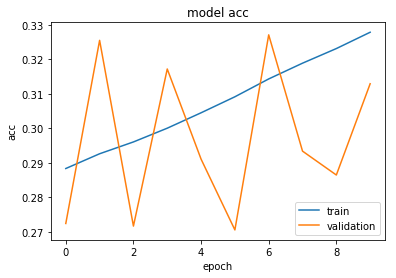

In [75]:
def plot_train(hist):
    h = hist.history
    if 'acc' in h:
        meas='acc'
        loc='lower right'
    else:
        meas='loss'
        loc='upper right'
    plt.plot(hist.history[meas])
    plt.plot(hist.history['val_'+meas])
    plt.title('model '+meas)
    plt.ylabel(meas)
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc=loc)


plot_train(history_2)

In [77]:
from keras.models import load_model

model_2.save('E:\Deep Learning Developer\Wk1 beginning 25 Sep 17\class_of_sums_w_6digits_model_2.h5') 
# del model  # deletes the existing model